<a href="https://colab.research.google.com/github/tusharkanta/ML_DL/blob/eva/S15/S15_Final_Phase1_EVA_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import torch
import torch.nn as nn
from zipfile import ZipFile
import os
from PIL import Image
import matplotlib.pyplot as plt

Mount google drive


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Install auto time module


In [3]:
!pip install ipython-autotime
%load_ext autotime
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Created wheel for ipython-autotime: filename=ipython_autotime-0.1-cp36-none-any.whl size=1832 sha256=2d6e2b200eced02bde2c4b0c420a96d58cd585bef6bb536cd857f1d3006a93f6
  Stored in directory: /root/.cache/pip/wheels/d2/df/81/2db1e54bc91002cec40334629bc39cfa86dff540b304ebcd6e
Successfully built ipython-autotime
  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-gb8hsvl0
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-gb8hsvl0
     |████████████████████████████████| 634kB 4.8MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.5-cp36-none-any.whl size=65038 sha256=d198da21b4a52700bd69da086d2bfd22a9835bd65c592d4bd126874c5043c8bd
  Stored in directory: /tmp/pip-ephem-wheel-cache-dny16p32/wheels/45/8b/e4/2837bbcf517d00732b8e394f8646f22b8723ac00993230188b
  Created wheel for imgaug: filename=imgaug-0.2.6-cp36-none-any.whl size=654020 sha256=9dbabf0cad2e3011bfdb7a6e5b1d75e585b788043dfc010b2859af5d9f015864
  Stored in

Import utility functions

In [4]:
os.chdir('/content')
if os.path.exists('utils.py'):
  os.remove('utils.py')
from google.colab import files
src = list(files.upload().values())[0]
open('utils.py','wb').write(src)
import utils as utils

Saving utils.py to utils.py
time: 9.24 s


Import data loader


In [5]:
os.chdir('/content')
torch.cuda.empty_cache()
if os.path.exists('dataloader_s15.py'):
  os.remove('dataloader_s15.py')
from google.colab import files
src = list(files.upload().values())[0]
open('dataloader_s15.py','wb').write(src)
import dataloader_s15 as dl

Saving dataloader_s15.py to dataloader_s15.py
Our make_dataset:

time: 13.4 s


Import model definition

In [6]:
os.chdir('/content')
if os.path.exists('model_def_s15.py'):
  os.remove('model_def_s15.py')
from google.colab import files
src = list(files.upload().values())[0]
open('model_def_s15.py','wb').write(src)
import model_def_s15 as modeldef

Saving model_def_s15.py to model_def_s15.py
time: 8.68 s


Import train/test functions


In [7]:
os.chdir('/content')
if os.path.exists('model_train_s15_5.py'):
  os.remove('model_train_s15_5.py')
from google.colab import files
src = list(files.upload().values())[0]
open('model_train_s15_6.py','wb').write(src)
import model_train_s15_6 as modeltrt

Saving model_train_s15_6.py to model_train_s15_6.py
time: 11.4 s


Extract bg_fg, mask and depth map images along with ground truth

In [8]:
os.chdir('/content')
#dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_1.zip')
#dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_2.zip')
#dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_3.zip')
#dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_4.zip')
#dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_5.zip')
dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_6.zip')
dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_7.zip')
dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_8.zip')
dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_9.zip')
dl.extract_images('/content/drive/My Drive/EVA4/S15/batch_10.zip')


time: 37.6 s


In [9]:
print(len(os.listdir('/content/depthMap')))
print(len(os.listdir('/content/bg_fg_1')))
print(len(os.listdir('/content/bg_fg_mask_1')))


50000
50000
50000
time: 78.1 ms


Extract bg images

In [10]:
os.chdir('/content')
if not os.path.exists('/content/bg'):
  os.mkdir('bg')
os.chdir('/content/bg')
dl.extract_images('/content/drive/My Drive/EVA4/S15/bgimages.zip')

time: 976 ms


In [11]:
utils.save_mask_gray_scale()
utils.save_depth_map_gray_scale()
train_loader,test_loader=dl.load_data()

time: 2min 23s


In [12]:
# net = modeldef.S11Model()
# net = models.resnet18(pretrained=True)
net = modeldef.DepthMask()
#net = modeldef.UNet(1)
#net = modeldef.ResNetUNet(3)

use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)

cuda
time: 163 ms


Build model summary

In [13]:
!pip install torchsummary
from torchsummary import summary
# Display Model Summary
model = net.to(device)
summary(model, input_size=(6, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]          18,816
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
   ConvTranspose2d-5        [-1, 128, 111, 111]           8,192
            Conv2d-6          [-1, 128, 28, 28]          73,728
            Conv2d-7          [-1, 128, 28, 28]          16,384
       BatchNorm2d-8          [-1, 128, 28, 28]             256
              ReLU-9          [-1, 128, 28, 28]               0
           Conv2d-10          [-1, 128, 14, 14]         147,456
           Conv2d-11          [-1, 128, 14, 14]          16,384
      BatchNorm2d-12          [-1, 128, 14, 14]             256
             ReLU-13          [-1, 128, 14, 14]               0
         Downsize-14          [-1, 128,

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


In [14]:
#!pip install kornia
#from kornia.losses import SSIM
#from kornia.losses import DiceLoss
criterion = nn.BCEWithLogitsLoss() #SSIM( 3, reduction ="mean")
#criterion = dice_loss()
#criterion = DiceLoss()
#criterion = SSIM(3,reduction='mean')

time: 1.47 ms


In [15]:
model.load_state_dict(torch.load('/content/drive/My Drive/EVA4/S15/output_run1_50k_10epochs/model/9_930.pth'))

<All keys matched successfully>

time: 1.74 s


In [16]:
optimizer = torch.optim.SGD(model.parameters(),lr= 0.001, momentum=0.9, weight_decay=1e-5)

time: 1.94 ms


In [0]:
import glob
import shutil
filist = glob.glob('/content/drive/My Drive/EVA4/S15/*.png')
for i in filist:
  shutil.move(i,'/content/drive/My Drive/EVA4/S15/output_run1_50k_10epochs/')

Strart training and validation process

In [17]:
%matplotlib inline
prnt=186
last_epoch=13
os.makedirs('/content/saved_models', exist_ok=True)
for epoch in range(14):
  #print('\nEpoch:',epoch)
  modeltrt.train(model, criterion, device, train_loader,optimizer,epoch)
  modeltrt.test(model, criterion, device, test_loader,epoch,last_epoch=last_epoch, prnt=prnt)

  0%|          | 0/2188 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))



Epoch:
 0


  0%|          | 2/2188 [00:00<17:20,  2.10it/s]


Epoch:
 0

Epoch:
 0


  0%|          | 4/2188 [00:01<12:29,  2.92it/s]


Epoch:
 0


  0%|          | 5/2188 [00:01<11:05,  3.28it/s]


Epoch:
 0


  0%|          | 6/2188 [00:01<10:07,  3.59it/s]


Epoch:
 0


  0%|          | 7/2188 [00:01<09:26,  3.85it/s]


Epoch:
 0


  0%|          | 8/2188 [00:02<08:57,  4.06it/s]


Epoch:
 0


  0%|          | 9/2188 [00:02<08:37,  4.21it/s]


Epoch:
 0


  0%|          | 10/2188 [00:02<08:22,  4.33it/s]


Epoch:
 0

Epoch:
 0


  1%|          | 12/2188 [00:03<09:26,  3.84it/s]


Epoch:
 0


  1%|          | 13/2188 [00:03<08:57,  4.05it/s]


Epoch:
 0


  1%|          | 14/2188 [00:03<08:36,  4.21it/s]


Epoch:
 0


  1%|          | 15/2188 [00:03<08:22,  4.32it/s]


Epoch:
 0


  1%|          | 16/2188 [00:03<08:12,  4.41it/s]


Epoch:
 0


  1%|          | 17/2188 [00:04<08:04,  4.48it/s]


Epoch:
 0


  1%|          | 18/2188 [00:04<07:59,  4.53it/s]


Epoch:
 0


  1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 0


  1%|          | 20/2188 [00:04<07:53,  4.58it/s]


Epoch:
 0

Epoch:
 0


  1%|          | 22/2188 [00:05<09:10,  3.93it/s]


Epoch:
 0


  1%|          | 23/2188 [00:05<08:45,  4.12it/s]


Epoch:
 0


  1%|          | 24/2188 [00:05<08:28,  4.26it/s]


Epoch:
 0


  1%|          | 25/2188 [00:06<08:15,  4.36it/s]


Epoch:
 0


  1%|          | 26/2188 [00:06<08:07,  4.44it/s]


Epoch:
 0


  1%|          | 27/2188 [00:06<08:00,  4.49it/s]


Epoch:
 0


  1%|▏         | 28/2188 [00:06<07:56,  4.53it/s]


Epoch:
 0


  1%|▏         | 29/2188 [00:07<07:52,  4.57it/s]


Epoch:
 0


  1%|▏         | 30/2188 [00:07<07:51,  4.58it/s]


Epoch:
 0

Epoch:
 0


  1%|▏         | 32/2188 [00:07<09:06,  3.95it/s]


Epoch:
 0


  2%|▏         | 33/2188 [00:08<08:41,  4.13it/s]


Epoch:
 0


  2%|▏         | 34/2188 [00:08<08:24,  4.27it/s]


Epoch:
 0


  2%|▏         | 35/2188 [00:08<08:13,  4.37it/s]


Epoch:
 0


  2%|▏         | 36/2188 [00:08<08:04,  4.45it/s]


Epoch:
 0


  2%|▏         | 37/2188 [00:08<07:58,  4.50it/s]


Epoch:
 0


  2%|▏         | 38/2188 [00:09<07:53,  4.54it/s]


Epoch:
 0


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 0


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 0

Epoch:
 0


  2%|▏         | 42/2188 [00:10<09:00,  3.97it/s]


Epoch:
 0


  2%|▏         | 43/2188 [00:10<08:37,  4.15it/s]


Epoch:
 0


  2%|▏         | 44/2188 [00:10<08:20,  4.28it/s]


Epoch:
 0


  2%|▏         | 45/2188 [00:10<08:09,  4.38it/s]


Epoch:
 0


  2%|▏         | 46/2188 [00:11<08:00,  4.45it/s]


Epoch:
 0


  2%|▏         | 47/2188 [00:11<07:54,  4.51it/s]


Epoch:
 0


  2%|▏         | 48/2188 [00:11<07:50,  4.54it/s]


Epoch:
 0


  2%|▏         | 49/2188 [00:11<07:47,  4.57it/s]


Epoch:
 0


  2%|▏         | 50/2188 [00:11<07:45,  4.59it/s]


Epoch:
 0

Epoch:
 0


  2%|▏         | 52/2188 [00:12<08:57,  3.97it/s]


Epoch:
 0


  2%|▏         | 53/2188 [00:12<08:33,  4.15it/s]


Epoch:
 0


  2%|▏         | 54/2188 [00:13<08:17,  4.29it/s]


Epoch:
 0


  3%|▎         | 55/2188 [00:13<08:06,  4.39it/s]


Epoch:
 0


  3%|▎         | 56/2188 [00:13<07:58,  4.45it/s]


Epoch:
 0


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 0


  3%|▎         | 58/2188 [00:13<07:49,  4.54it/s]


Epoch:
 0


  3%|▎         | 59/2188 [00:14<07:46,  4.56it/s]


Epoch:
 0


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 0

Epoch:
 0


  3%|▎         | 62/2188 [00:14<08:57,  3.95it/s]


Epoch:
 0


  3%|▎         | 63/2188 [00:15<08:33,  4.14it/s]


Epoch:
 0


  3%|▎         | 64/2188 [00:15<08:16,  4.27it/s]


Epoch:
 0


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 0


  3%|▎         | 66/2188 [00:15<07:56,  4.45it/s]


Epoch:
 0


  3%|▎         | 67/2188 [00:16<07:50,  4.50it/s]


Epoch:
 0


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 0


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 0


  3%|▎         | 70/2188 [00:16<07:42,  4.58it/s]


Epoch:
 0

Epoch:
 0


  3%|▎         | 72/2188 [00:17<08:53,  3.97it/s]


Epoch:
 0


  3%|▎         | 73/2188 [00:17<08:29,  4.15it/s]


Epoch:
 0


  3%|▎         | 74/2188 [00:17<08:13,  4.28it/s]


Epoch:
 0


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 0


  3%|▎         | 76/2188 [00:18<07:54,  4.45it/s]


Epoch:
 0


  4%|▎         | 77/2188 [00:18<07:48,  4.51it/s]


Epoch:
 0


  4%|▎         | 78/2188 [00:18<07:44,  4.54it/s]


Epoch:
 0


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 0


  4%|▎         | 80/2188 [00:19<07:39,  4.59it/s]


Epoch:
 0

Epoch:
 0


  4%|▎         | 82/2188 [00:19<08:56,  3.92it/s]


Epoch:
 0


  4%|▍         | 83/2188 [00:19<08:31,  4.12it/s]


Epoch:
 0


  4%|▍         | 84/2188 [00:20<08:13,  4.26it/s]


Epoch:
 0


  4%|▍         | 85/2188 [00:20<08:01,  4.37it/s]


Epoch:
 0


  4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 0


  4%|▍         | 87/2188 [00:20<07:46,  4.51it/s]


Epoch:
 0


  4%|▍         | 88/2188 [00:21<07:42,  4.55it/s]


Epoch:
 0


  4%|▍         | 89/2188 [00:21<07:39,  4.57it/s]


Epoch:
 0


  4%|▍         | 90/2188 [00:21<07:37,  4.59it/s]


Epoch:
 0

Epoch:
 0


  4%|▍         | 92/2188 [00:22<08:49,  3.96it/s]


Epoch:
 0


  4%|▍         | 93/2188 [00:22<08:25,  4.14it/s]


Epoch:
 0


  4%|▍         | 94/2188 [00:22<08:09,  4.28it/s]


Epoch:
 0


  4%|▍         | 95/2188 [00:22<07:58,  4.37it/s]


Epoch:
 0


  4%|▍         | 96/2188 [00:22<07:50,  4.45it/s]


Epoch:
 0


  4%|▍         | 97/2188 [00:23<07:44,  4.50it/s]


Epoch:
 0


  4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 0


  5%|▍         | 99/2188 [00:23<07:37,  4.56it/s]


Epoch:
 0


  5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 0

Epoch:
 0


  5%|▍         | 102/2188 [00:24<08:51,  3.92it/s]


Epoch:
 0


  5%|▍         | 103/2188 [00:24<08:27,  4.11it/s]


Epoch:
 0


  5%|▍         | 104/2188 [00:24<08:09,  4.25it/s]


Epoch:
 0


  5%|▍         | 105/2188 [00:25<07:57,  4.36it/s]


Epoch:
 0


  5%|▍         | 106/2188 [00:25<07:49,  4.43it/s]


Epoch:
 0


  5%|▍         | 107/2188 [00:25<07:43,  4.49it/s]


Epoch:
 0


  5%|▍         | 108/2188 [00:25<07:38,  4.53it/s]


Epoch:
 0


  5%|▍         | 109/2188 [00:25<07:35,  4.56it/s]


Epoch:
 0


  5%|▌         | 110/2188 [00:26<07:33,  4.59it/s]


Epoch:
 0

Epoch:
 0


  5%|▌         | 112/2188 [00:26<08:44,  3.96it/s]


Epoch:
 0


  5%|▌         | 113/2188 [00:27<08:21,  4.14it/s]


Epoch:
 0


  5%|▌         | 114/2188 [00:27<08:05,  4.27it/s]


Epoch:
 0


  5%|▌         | 115/2188 [00:27<07:53,  4.38it/s]


Epoch:
 0


  5%|▌         | 116/2188 [00:27<07:45,  4.45it/s]


Epoch:
 0


  5%|▌         | 117/2188 [00:27<07:40,  4.50it/s]


Epoch:
 0


  5%|▌         | 118/2188 [00:28<07:36,  4.54it/s]


Epoch:
 0


  5%|▌         | 119/2188 [00:28<07:33,  4.57it/s]


Epoch:
 0


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 0

Epoch:
 0


  6%|▌         | 122/2188 [00:29<08:46,  3.92it/s]


Epoch:
 0


  6%|▌         | 123/2188 [00:29<08:21,  4.12it/s]


Epoch:
 0


  6%|▌         | 124/2188 [00:29<08:04,  4.26it/s]


Epoch:
 0


  6%|▌         | 125/2188 [00:29<07:52,  4.37it/s]


Epoch:
 0


  6%|▌         | 126/2188 [00:30<07:44,  4.44it/s]


Epoch:
 0


  6%|▌         | 127/2188 [00:30<07:39,  4.49it/s]


Epoch:
 0


  6%|▌         | 128/2188 [00:30<07:34,  4.53it/s]


Epoch:
 0


  6%|▌         | 129/2188 [00:30<07:31,  4.56it/s]


Epoch:
 0


  6%|▌         | 130/2188 [00:30<07:29,  4.58it/s]


Epoch:
 0

Epoch:
 0


  6%|▌         | 132/2188 [00:31<08:39,  3.96it/s]


Epoch:
 0


  6%|▌         | 133/2188 [00:31<08:16,  4.14it/s]


Epoch:
 0


  6%|▌         | 134/2188 [00:32<08:00,  4.27it/s]


Epoch:
 0


  6%|▌         | 135/2188 [00:32<07:49,  4.38it/s]


Epoch:
 0


  6%|▌         | 136/2188 [00:32<07:41,  4.45it/s]


Epoch:
 0


  6%|▋         | 137/2188 [00:32<07:35,  4.51it/s]


Epoch:
 0


  6%|▋         | 138/2188 [00:32<07:31,  4.54it/s]


Epoch:
 0


  6%|▋         | 139/2188 [00:33<07:28,  4.57it/s]


Epoch:
 0


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 0

Epoch:
 0


  6%|▋         | 142/2188 [00:33<08:38,  3.95it/s]


Epoch:
 0


  7%|▋         | 143/2188 [00:34<08:14,  4.13it/s]


Epoch:
 0


  7%|▋         | 144/2188 [00:34<07:58,  4.27it/s]


Epoch:
 0


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 0


  7%|▋         | 146/2188 [00:34<07:39,  4.45it/s]


Epoch:
 0


  7%|▋         | 147/2188 [00:35<07:33,  4.50it/s]


Epoch:
 0


  7%|▋         | 148/2188 [00:35<07:29,  4.54it/s]


Epoch:
 0


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 0


  7%|▋         | 150/2188 [00:35<07:23,  4.59it/s]


Epoch:
 0

Epoch:
 0


  7%|▋         | 152/2188 [00:36<08:33,  3.96it/s]


Epoch:
 0


  7%|▋         | 153/2188 [00:36<08:10,  4.15it/s]


Epoch:
 0


  7%|▋         | 154/2188 [00:36<07:55,  4.28it/s]


Epoch:
 0


  7%|▋         | 155/2188 [00:36<07:44,  4.38it/s]


Epoch:
 0


  7%|▋         | 156/2188 [00:37<07:36,  4.45it/s]


Epoch:
 0


  7%|▋         | 157/2188 [00:37<07:30,  4.50it/s]


Epoch:
 0


  7%|▋         | 158/2188 [00:37<07:27,  4.54it/s]


Epoch:
 0


  7%|▋         | 159/2188 [00:37<07:24,  4.57it/s]


Epoch:
 0


  7%|▋         | 160/2188 [00:38<07:21,  4.59it/s]


Epoch:
 0

Epoch:
 0


  7%|▋         | 162/2188 [00:38<08:30,  3.97it/s]


Epoch:
 0


  7%|▋         | 163/2188 [00:38<08:08,  4.15it/s]


Epoch:
 0


  7%|▋         | 164/2188 [00:39<07:52,  4.28it/s]


Epoch:
 0


  8%|▊         | 165/2188 [00:39<07:42,  4.38it/s]


Epoch:
 0


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 0


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 0


  8%|▊         | 168/2188 [00:39<07:24,  4.54it/s]


Epoch:
 0


  8%|▊         | 169/2188 [00:40<07:21,  4.57it/s]


Epoch:
 0


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 0

Epoch:
 0


  8%|▊         | 172/2188 [00:41<08:32,  3.94it/s]


Epoch:
 0

Epoch:
 0


  8%|▊         | 174/2188 [00:41<07:52,  4.27it/s]


Epoch:
 0


  8%|▊         | 175/2188 [00:41<07:40,  4.37it/s]


Epoch:
 0


  8%|▊         | 176/2188 [00:41<07:32,  4.45it/s]


Epoch:
 0


  8%|▊         | 177/2188 [00:42<07:26,  4.50it/s]


Epoch:
 0


  8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 0


  8%|▊         | 179/2188 [00:42<07:20,  4.57it/s]


Epoch:
 0


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 0

Epoch:
 0


  8%|▊         | 182/2188 [00:43<08:28,  3.95it/s]


Epoch:
 0


  8%|▊         | 183/2188 [00:43<08:05,  4.13it/s]


Epoch:
 0


  8%|▊         | 184/2188 [00:43<07:49,  4.27it/s]


Epoch:
 0


  8%|▊         | 185/2188 [00:44<07:37,  4.38it/s]


Epoch:
 0


  9%|▊         | 186/2188 [00:44<07:29,  4.45it/s]


Epoch:
 0


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 0


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 0


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 0


  9%|▊         | 190/2188 [00:45<07:15,  4.59it/s]


Epoch:
 0

Epoch:
 0


  9%|▉         | 192/2188 [00:45<08:22,  3.97it/s]


Epoch:
 0


  9%|▉         | 193/2188 [00:45<08:00,  4.15it/s]


Epoch:
 0


  9%|▉         | 194/2188 [00:46<07:45,  4.29it/s]


Epoch:
 0


  9%|▉         | 195/2188 [00:46<07:34,  4.39it/s]


Epoch:
 0


  9%|▉         | 196/2188 [00:46<07:26,  4.46it/s]


Epoch:
 0


  9%|▉         | 197/2188 [00:46<07:21,  4.51it/s]


Epoch:
 0


  9%|▉         | 198/2188 [00:47<07:17,  4.55it/s]


Epoch:
 0


  9%|▉         | 199/2188 [00:47<07:14,  4.58it/s]


Epoch:
 0


  9%|▉         | 200/2188 [00:47<07:12,  4.59it/s]


Epoch:
 0

Epoch:
 0


  9%|▉         | 202/2188 [00:48<08:21,  3.96it/s]


Epoch:
 0


  9%|▉         | 203/2188 [00:48<07:59,  4.14it/s]


Epoch:
 0


  9%|▉         | 204/2188 [00:48<07:44,  4.28it/s]


Epoch:
 0


  9%|▉         | 205/2188 [00:48<07:33,  4.37it/s]


Epoch:
 0


  9%|▉         | 206/2188 [00:49<07:26,  4.44it/s]


Epoch:
 0


  9%|▉         | 207/2188 [00:49<07:20,  4.50it/s]


Epoch:
 0


 10%|▉         | 208/2188 [00:49<07:16,  4.53it/s]


Epoch:
 0


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 0


 10%|▉         | 210/2188 [00:49<07:11,  4.59it/s]


Epoch:
 0

Epoch:
 0


 10%|▉         | 212/2188 [00:50<08:18,  3.96it/s]


Epoch:
 0


 10%|▉         | 213/2188 [00:50<07:56,  4.14it/s]


Epoch:
 0


 10%|▉         | 214/2188 [00:50<07:41,  4.28it/s]


Epoch:
 0


 10%|▉         | 215/2188 [00:51<07:30,  4.38it/s]


Epoch:
 0


 10%|▉         | 216/2188 [00:51<07:22,  4.46it/s]


Epoch:
 0


 10%|▉         | 217/2188 [00:51<07:17,  4.50it/s]


Epoch:
 0


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 0


 10%|█         | 219/2188 [00:52<07:11,  4.57it/s]


Epoch:
 0


 10%|█         | 220/2188 [00:52<07:09,  4.59it/s]


Epoch:
 0

Epoch:
 0


 10%|█         | 222/2188 [00:52<08:16,  3.96it/s]


Epoch:
 0


 10%|█         | 223/2188 [00:53<07:54,  4.14it/s]


Epoch:
 0


 10%|█         | 224/2188 [00:53<07:39,  4.28it/s]


Epoch:
 0


 10%|█         | 225/2188 [00:53<07:28,  4.37it/s]


Epoch:
 0


 10%|█         | 226/2188 [00:53<07:20,  4.45it/s]


Epoch:
 0


 10%|█         | 227/2188 [00:53<07:15,  4.50it/s]


Epoch:
 0


 10%|█         | 228/2188 [00:54<07:11,  4.54it/s]


Epoch:
 0


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 0


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 0

Epoch:
 0


 11%|█         | 232/2188 [00:55<08:13,  3.96it/s]


Epoch:
 0


 11%|█         | 233/2188 [00:55<07:51,  4.14it/s]


Epoch:
 0


 11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 0


 11%|█         | 235/2188 [00:55<07:26,  4.38it/s]


Epoch:
 0


 11%|█         | 236/2188 [00:56<07:18,  4.45it/s]


Epoch:
 0


 11%|█         | 237/2188 [00:56<07:13,  4.50it/s]


Epoch:
 0


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 0


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 0


 11%|█         | 240/2188 [00:56<07:05,  4.58it/s]


Epoch:
 0

Epoch:
 0


 11%|█         | 242/2188 [00:57<08:12,  3.95it/s]


Epoch:
 0


 11%|█         | 243/2188 [00:57<07:50,  4.14it/s]


Epoch:
 0


 11%|█         | 244/2188 [00:58<07:34,  4.27it/s]


Epoch:
 0


 11%|█         | 245/2188 [00:58<07:23,  4.38it/s]


Epoch:
 0


 11%|█         | 246/2188 [00:58<07:16,  4.45it/s]


Epoch:
 0


 11%|█▏        | 247/2188 [00:58<07:10,  4.50it/s]


Epoch:
 0


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 0


 11%|█▏        | 249/2188 [00:59<07:04,  4.57it/s]


Epoch:
 0


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 0

Epoch:
 0


 12%|█▏        | 252/2188 [00:59<08:08,  3.97it/s]


Epoch:
 0


 12%|█▏        | 253/2188 [01:00<07:46,  4.15it/s]


Epoch:
 0


 12%|█▏        | 254/2188 [01:00<07:31,  4.28it/s]


Epoch:
 0


 12%|█▏        | 255/2188 [01:00<07:20,  4.38it/s]


Epoch:
 0


 12%|█▏        | 256/2188 [01:00<07:13,  4.45it/s]


Epoch:
 0


 12%|█▏        | 257/2188 [01:01<07:08,  4.51it/s]


Epoch:
 0


 12%|█▏        | 258/2188 [01:01<07:04,  4.54it/s]


Epoch:
 0


 12%|█▏        | 259/2188 [01:01<07:01,  4.57it/s]


Epoch:
 0


 12%|█▏        | 260/2188 [01:01<06:59,  4.59it/s]


Epoch:
 0

Epoch:
 0


 12%|█▏        | 262/2188 [01:02<08:05,  3.97it/s]


Epoch:
 0


 12%|█▏        | 263/2188 [01:02<07:44,  4.15it/s]


Epoch:
 0


 12%|█▏        | 264/2188 [01:02<07:29,  4.28it/s]


Epoch:
 0


 12%|█▏        | 265/2188 [01:02<07:19,  4.38it/s]


Epoch:
 0


 12%|█▏        | 266/2188 [01:03<07:11,  4.46it/s]


Epoch:
 0


 12%|█▏        | 267/2188 [01:03<07:06,  4.51it/s]


Epoch:
 0


 12%|█▏        | 268/2188 [01:03<07:02,  4.54it/s]


Epoch:
 0


 12%|█▏        | 269/2188 [01:03<06:59,  4.57it/s]


Epoch:
 0


 12%|█▏        | 270/2188 [01:04<06:57,  4.59it/s]


Epoch:
 0

Epoch:
 0


 12%|█▏        | 272/2188 [01:04<08:05,  3.94it/s]


Epoch:
 0


 12%|█▏        | 273/2188 [01:04<07:43,  4.13it/s]


Epoch:
 0


 13%|█▎        | 274/2188 [01:05<07:28,  4.27it/s]


Epoch:
 0


 13%|█▎        | 275/2188 [01:05<07:17,  4.37it/s]


Epoch:
 0


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 0


 13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 0


 13%|█▎        | 278/2188 [01:06<07:00,  4.54it/s]


Epoch:
 0


 13%|█▎        | 279/2188 [01:06<06:57,  4.57it/s]


Epoch:
 0


 13%|█▎        | 280/2188 [01:06<06:55,  4.59it/s]


Epoch:
 0

Epoch:
 0


 13%|█▎        | 282/2188 [01:07<08:01,  3.96it/s]


Epoch:
 0


 13%|█▎        | 283/2188 [01:07<07:40,  4.14it/s]


Epoch:
 0


 13%|█▎        | 284/2188 [01:07<07:25,  4.27it/s]


Epoch:
 0


 13%|█▎        | 285/2188 [01:07<07:14,  4.38it/s]


Epoch:
 0


 13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 0


 13%|█▎        | 287/2188 [01:08<07:02,  4.50it/s]


Epoch:
 0


 13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 0


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 0


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 0

Epoch:
 0


 13%|█▎        | 292/2188 [01:09<07:58,  3.96it/s]


Epoch:
 0


 13%|█▎        | 293/2188 [01:09<07:37,  4.14it/s]


Epoch:
 0


 13%|█▎        | 294/2188 [01:09<07:23,  4.27it/s]


Epoch:
 0


 13%|█▎        | 295/2188 [01:10<07:12,  4.37it/s]


Epoch:
 0


 14%|█▎        | 296/2188 [01:10<07:05,  4.45it/s]


Epoch:
 0


 14%|█▎        | 297/2188 [01:10<06:59,  4.50it/s]


Epoch:
 0


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 0


 14%|█▎        | 299/2188 [01:10<06:53,  4.57it/s]


Epoch:
 0


 14%|█▎        | 300/2188 [01:11<06:51,  4.59it/s]


Epoch:
 0

Epoch:
 0


 14%|█▍        | 302/2188 [01:11<07:56,  3.96it/s]


Epoch:
 0


 14%|█▍        | 303/2188 [01:12<07:36,  4.13it/s]


Epoch:
 0


 14%|█▍        | 304/2188 [01:12<07:21,  4.27it/s]


Epoch:
 0


 14%|█▍        | 305/2188 [01:12<07:10,  4.37it/s]


Epoch:
 0


 14%|█▍        | 306/2188 [01:12<07:03,  4.45it/s]


Epoch:
 0


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 0


 14%|█▍        | 308/2188 [01:13<06:54,  4.54it/s]


Epoch:
 0


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 0


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 0

Epoch:
 0


 14%|█▍        | 312/2188 [01:14<07:53,  3.96it/s]


Epoch:
 0


 14%|█▍        | 313/2188 [01:14<07:32,  4.14it/s]


Epoch:
 0


 14%|█▍        | 314/2188 [01:14<07:17,  4.28it/s]


Epoch:
 0


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 0


 14%|█▍        | 316/2188 [01:15<07:00,  4.45it/s]


Epoch:
 0


 14%|█▍        | 317/2188 [01:15<06:55,  4.50it/s]


Epoch:
 0


 15%|█▍        | 318/2188 [01:15<06:51,  4.55it/s]


Epoch:
 0


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 0


 15%|█▍        | 320/2188 [01:15<06:46,  4.59it/s]


Epoch:
 0

Epoch:
 0


 15%|█▍        | 322/2188 [01:16<07:54,  3.93it/s]


Epoch:
 0


 15%|█▍        | 323/2188 [01:16<07:32,  4.12it/s]


Epoch:
 0


 15%|█▍        | 324/2188 [01:16<07:17,  4.26it/s]


Epoch:
 0


 15%|█▍        | 325/2188 [01:17<07:07,  4.36it/s]


Epoch:
 0


 15%|█▍        | 326/2188 [01:17<06:59,  4.44it/s]


Epoch:
 0


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 0


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 0


 15%|█▌        | 329/2188 [01:18<06:47,  4.56it/s]


Epoch:
 0


 15%|█▌        | 330/2188 [01:18<06:45,  4.59it/s]


Epoch:
 0

Epoch:
 0


 15%|█▌        | 332/2188 [01:18<07:49,  3.95it/s]


Epoch:
 0


 15%|█▌        | 333/2188 [01:19<07:28,  4.14it/s]


Epoch:
 0


 15%|█▌        | 334/2188 [01:19<07:13,  4.27it/s]


Epoch:
 0


 15%|█▌        | 335/2188 [01:19<07:03,  4.37it/s]


Epoch:
 0


 15%|█▌        | 336/2188 [01:19<06:56,  4.45it/s]


Epoch:
 0


 15%|█▌        | 337/2188 [01:20<06:50,  4.50it/s]


Epoch:
 0


 15%|█▌        | 338/2188 [01:20<06:47,  4.54it/s]


Epoch:
 0


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 0


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 0

Epoch:
 0


 16%|█▌        | 342/2188 [01:21<07:45,  3.97it/s]


Epoch:
 0


 16%|█▌        | 343/2188 [01:21<07:24,  4.15it/s]


Epoch:
 0


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 0


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 0


 16%|█▌        | 346/2188 [01:22<06:54,  4.45it/s]


Epoch:
 0


 16%|█▌        | 347/2188 [01:22<06:48,  4.50it/s]


Epoch:
 0


 16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 0


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 0


 16%|█▌        | 350/2188 [01:23<06:40,  4.59it/s]


Epoch:
 0

Epoch:
 0


 16%|█▌        | 352/2188 [01:23<07:41,  3.98it/s]


Epoch:
 0


 16%|█▌        | 353/2188 [01:23<07:21,  4.16it/s]


Epoch:
 0


 16%|█▌        | 354/2188 [01:24<07:07,  4.29it/s]


Epoch:
 0


 16%|█▌        | 355/2188 [01:24<06:57,  4.39it/s]


Epoch:
 0


 16%|█▋        | 356/2188 [01:24<06:51,  4.46it/s]


Epoch:
 0


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 0


 16%|█▋        | 358/2188 [01:24<06:43,  4.54it/s]


Epoch:
 0


 16%|█▋        | 359/2188 [01:25<06:40,  4.56it/s]


Epoch:
 0


 16%|█▋        | 360/2188 [01:25<06:38,  4.58it/s]


Epoch:
 0

Epoch:
 0


 17%|█▋        | 362/2188 [01:26<07:41,  3.95it/s]


Epoch:
 0


 17%|█▋        | 363/2188 [01:26<07:21,  4.14it/s]


Epoch:
 0


 17%|█▋        | 364/2188 [01:26<07:06,  4.28it/s]


Epoch:
 0


 17%|█▋        | 365/2188 [01:26<06:56,  4.38it/s]


Epoch:
 0


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 0


 17%|█▋        | 367/2188 [01:27<06:43,  4.51it/s]


Epoch:
 0


 17%|█▋        | 368/2188 [01:27<06:40,  4.55it/s]


Epoch:
 0


 17%|█▋        | 369/2188 [01:27<06:37,  4.58it/s]


Epoch:
 0


 17%|█▋        | 370/2188 [01:27<06:35,  4.59it/s]


Epoch:
 0

Epoch:
 0


 17%|█▋        | 372/2188 [01:28<07:38,  3.96it/s]


Epoch:
 0


 17%|█▋        | 373/2188 [01:28<07:17,  4.15it/s]


Epoch:
 0


 17%|█▋        | 374/2188 [01:28<07:03,  4.28it/s]


Epoch:
 0


 17%|█▋        | 375/2188 [01:29<06:53,  4.38it/s]


Epoch:
 0


 17%|█▋        | 376/2188 [01:29<06:46,  4.45it/s]


Epoch:
 0


 17%|█▋        | 377/2188 [01:29<06:41,  4.51it/s]


Epoch:
 0


 17%|█▋        | 378/2188 [01:29<06:37,  4.55it/s]


Epoch:
 0


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 0


 17%|█▋        | 380/2188 [01:30<06:33,  4.59it/s]


Epoch:
 0

Epoch:
 0


 17%|█▋        | 382/2188 [01:30<07:36,  3.95it/s]


Epoch:
 0


 18%|█▊        | 383/2188 [01:30<07:16,  4.14it/s]


Epoch:
 0


 18%|█▊        | 384/2188 [01:31<07:01,  4.28it/s]


Epoch:
 0


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 0


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 0


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 0


 18%|█▊        | 388/2188 [01:32<06:35,  4.55it/s]


Epoch:
 0


 18%|█▊        | 389/2188 [01:32<06:32,  4.58it/s]


Epoch:
 0


 18%|█▊        | 390/2188 [01:32<06:30,  4.60it/s]


Epoch:
 0

Epoch:
 0


 18%|█▊        | 392/2188 [01:33<07:31,  3.98it/s]


Epoch:
 0


 18%|█▊        | 393/2188 [01:33<07:12,  4.15it/s]


Epoch:
 0


 18%|█▊        | 394/2188 [01:33<06:58,  4.29it/s]


Epoch:
 0


 18%|█▊        | 395/2188 [01:33<06:48,  4.39it/s]


Epoch:
 0


 18%|█▊        | 396/2188 [01:33<06:41,  4.46it/s]


Epoch:
 0


 18%|█▊        | 397/2188 [01:34<06:36,  4.51it/s]


Epoch:
 0


 18%|█▊        | 398/2188 [01:34<06:33,  4.55it/s]


Epoch:
 0


 18%|█▊        | 399/2188 [01:34<06:30,  4.58it/s]


Epoch:
 0


 18%|█▊        | 400/2188 [01:34<06:29,  4.60it/s]


Epoch:
 0

Epoch:
 0


 18%|█▊        | 402/2188 [01:35<07:29,  3.97it/s]


Epoch:
 0


 18%|█▊        | 403/2188 [01:35<07:09,  4.15it/s]


Epoch:
 0


 18%|█▊        | 404/2188 [01:35<06:56,  4.29it/s]


Epoch:
 0


 19%|█▊        | 405/2188 [01:36<06:46,  4.39it/s]


Epoch:
 0


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 0


 19%|█▊        | 407/2188 [01:36<06:35,  4.50it/s]


Epoch:
 0


 19%|█▊        | 408/2188 [01:36<06:32,  4.54it/s]


Epoch:
 0


 19%|█▊        | 409/2188 [01:37<06:29,  4.57it/s]


Epoch:
 0


 19%|█▊        | 410/2188 [01:37<06:27,  4.58it/s]


Epoch:
 0

Epoch:
 0


 19%|█▉        | 412/2188 [01:37<07:27,  3.96it/s]


Epoch:
 0


 19%|█▉        | 413/2188 [01:38<07:08,  4.14it/s]


Epoch:
 0


 19%|█▉        | 414/2188 [01:38<06:55,  4.27it/s]


Epoch:
 0


 19%|█▉        | 415/2188 [01:38<06:45,  4.38it/s]


Epoch:
 0


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 0


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 0


 19%|█▉        | 418/2188 [01:39<06:29,  4.54it/s]


Epoch:
 0


 19%|█▉        | 419/2188 [01:39<06:27,  4.57it/s]


Epoch:
 0


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 0

Epoch:
 0


 19%|█▉        | 422/2188 [01:40<07:26,  3.96it/s]


Epoch:
 0


 19%|█▉        | 423/2188 [01:40<07:06,  4.14it/s]


Epoch:
 0


 19%|█▉        | 424/2188 [01:40<06:52,  4.28it/s]


Epoch:
 0


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 0


 19%|█▉        | 426/2188 [01:41<06:35,  4.46it/s]


Epoch:
 0


 20%|█▉        | 427/2188 [01:41<06:30,  4.51it/s]


Epoch:
 0


 20%|█▉        | 428/2188 [01:41<06:26,  4.55it/s]


Epoch:
 0


 20%|█▉        | 429/2188 [01:41<06:24,  4.58it/s]


Epoch:
 0


 20%|█▉        | 430/2188 [01:41<06:22,  4.60it/s]


Epoch:
 0

Epoch:
 0


 20%|█▉        | 432/2188 [01:42<07:21,  3.98it/s]


Epoch:
 0


 20%|█▉        | 433/2188 [01:42<07:02,  4.16it/s]


Epoch:
 0


 20%|█▉        | 434/2188 [01:43<06:48,  4.29it/s]


Epoch:
 0


 20%|█▉        | 435/2188 [01:43<06:39,  4.39it/s]


Epoch:
 0


 20%|█▉        | 436/2188 [01:43<06:32,  4.47it/s]


Epoch:
 0


 20%|█▉        | 437/2188 [01:43<06:27,  4.51it/s]


Epoch:
 0


 20%|██        | 438/2188 [01:43<06:24,  4.55it/s]


Epoch:
 0


 20%|██        | 439/2188 [01:44<06:21,  4.58it/s]


Epoch:
 0


 20%|██        | 440/2188 [01:44<06:19,  4.60it/s]


Epoch:
 0

Epoch:
 0


 20%|██        | 442/2188 [01:44<07:19,  3.97it/s]


Epoch:
 0


 20%|██        | 443/2188 [01:45<06:59,  4.16it/s]


Epoch:
 0


 20%|██        | 444/2188 [01:45<06:46,  4.29it/s]


Epoch:
 0


 20%|██        | 445/2188 [01:45<06:36,  4.39it/s]


Epoch:
 0


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 0


 20%|██        | 447/2188 [01:46<06:25,  4.52it/s]


Epoch:
 0


 20%|██        | 448/2188 [01:46<06:22,  4.55it/s]


Epoch:
 0


 21%|██        | 449/2188 [01:46<06:20,  4.58it/s]


Epoch:
 0


 21%|██        | 450/2188 [01:46<06:18,  4.60it/s]


Epoch:
 0

Epoch:
 0


 21%|██        | 452/2188 [01:47<07:17,  3.96it/s]


Epoch:
 0


 21%|██        | 453/2188 [01:47<06:58,  4.15it/s]


Epoch:
 0


 21%|██        | 454/2188 [01:47<06:44,  4.29it/s]


Epoch:
 0


 21%|██        | 455/2188 [01:47<06:34,  4.39it/s]


Epoch:
 0


 21%|██        | 456/2188 [01:48<06:28,  4.46it/s]


Epoch:
 0


 21%|██        | 457/2188 [01:48<06:23,  4.51it/s]


Epoch:
 0


 21%|██        | 458/2188 [01:48<06:20,  4.55it/s]


Epoch:
 0


 21%|██        | 459/2188 [01:48<06:17,  4.58it/s]


Epoch:
 0


 21%|██        | 460/2188 [01:49<06:15,  4.60it/s]


Epoch:
 0

Epoch:
 0


 21%|██        | 462/2188 [01:49<07:14,  3.97it/s]


Epoch:
 0


 21%|██        | 463/2188 [01:49<06:55,  4.15it/s]


Epoch:
 0


 21%|██        | 464/2188 [01:50<06:41,  4.29it/s]


Epoch:
 0


 21%|██▏       | 465/2188 [01:50<06:32,  4.39it/s]


Epoch:
 0


 21%|██▏       | 466/2188 [01:50<06:26,  4.46it/s]


Epoch:
 0


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 0


 21%|██▏       | 468/2188 [01:50<06:18,  4.55it/s]


Epoch:
 0


 21%|██▏       | 469/2188 [01:51<06:15,  4.58it/s]


Epoch:
 0


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 0

Epoch:
 0


 22%|██▏       | 472/2188 [01:52<07:14,  3.95it/s]


Epoch:
 0


 22%|██▏       | 473/2188 [01:52<06:54,  4.14it/s]


Epoch:
 0


 22%|██▏       | 474/2188 [01:52<06:41,  4.27it/s]


Epoch:
 0


 22%|██▏       | 475/2188 [01:52<06:31,  4.38it/s]


Epoch:
 0


 22%|██▏       | 476/2188 [01:52<06:24,  4.45it/s]


Epoch:
 0


 22%|██▏       | 477/2188 [01:53<06:19,  4.50it/s]


Epoch:
 0


 22%|██▏       | 478/2188 [01:53<06:16,  4.54it/s]


Epoch:
 0


 22%|██▏       | 479/2188 [01:53<06:14,  4.57it/s]


Epoch:
 0


 22%|██▏       | 480/2188 [01:53<06:12,  4.59it/s]


Epoch:
 0

Epoch:
 0


 22%|██▏       | 482/2188 [01:54<07:12,  3.94it/s]


Epoch:
 0


 22%|██▏       | 483/2188 [01:54<06:53,  4.13it/s]


Epoch:
 0


 22%|██▏       | 484/2188 [01:54<06:39,  4.27it/s]


Epoch:
 0


 22%|██▏       | 485/2188 [01:55<06:29,  4.37it/s]


Epoch:
 0


 22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 0


 22%|██▏       | 487/2188 [01:55<06:17,  4.50it/s]


Epoch:
 0


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 0


 22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 0


 22%|██▏       | 490/2188 [01:56<06:09,  4.59it/s]


Epoch:
 0

Epoch:
 0


 22%|██▏       | 492/2188 [01:56<07:15,  3.89it/s]


Epoch:
 0

Epoch:
 0


 23%|██▎       | 494/2188 [01:57<06:39,  4.24it/s]


Epoch:
 0


 23%|██▎       | 495/2188 [01:57<06:28,  4.35it/s]


Epoch:
 0


 23%|██▎       | 496/2188 [01:57<06:21,  4.43it/s]


Epoch:
 0


 23%|██▎       | 497/2188 [01:57<06:16,  4.49it/s]


Epoch:
 0


 23%|██▎       | 498/2188 [01:58<06:12,  4.53it/s]


Epoch:
 0


 23%|██▎       | 499/2188 [01:58<06:10,  4.56it/s]


Epoch:
 0


 23%|██▎       | 500/2188 [01:58<06:08,  4.58it/s]


Epoch:
 0

Epoch:
 0


 23%|██▎       | 502/2188 [01:59<07:08,  3.94it/s]


Epoch:
 0


 23%|██▎       | 503/2188 [01:59<06:48,  4.13it/s]


Epoch:
 0


 23%|██▎       | 504/2188 [01:59<06:34,  4.27it/s]


Epoch:
 0


 23%|██▎       | 505/2188 [01:59<06:25,  4.37it/s]


Epoch:
 0


 23%|██▎       | 506/2188 [02:00<06:18,  4.44it/s]


Epoch:
 0


 23%|██▎       | 507/2188 [02:00<06:14,  4.49it/s]


Epoch:
 0


 23%|██▎       | 508/2188 [02:00<06:11,  4.53it/s]


Epoch:
 0


 23%|██▎       | 509/2188 [02:00<06:08,  4.56it/s]


Epoch:
 0


 23%|██▎       | 510/2188 [02:00<06:06,  4.57it/s]


Epoch:
 0

Epoch:
 0


 23%|██▎       | 512/2188 [02:01<07:04,  3.95it/s]


Epoch:
 0


 23%|██▎       | 513/2188 [02:01<06:45,  4.14it/s]


Epoch:
 0


 23%|██▎       | 514/2188 [02:01<06:31,  4.27it/s]


Epoch:
 0


 24%|██▎       | 515/2188 [02:02<06:22,  4.38it/s]


Epoch:
 0


 24%|██▎       | 516/2188 [02:02<06:15,  4.45it/s]


Epoch:
 0


 24%|██▎       | 517/2188 [02:02<06:10,  4.50it/s]


Epoch:
 0


 24%|██▎       | 518/2188 [02:02<06:08,  4.54it/s]


Epoch:
 0


 24%|██▎       | 519/2188 [02:03<06:05,  4.57it/s]


Epoch:
 0


 24%|██▍       | 520/2188 [02:03<06:03,  4.59it/s]


Epoch:
 0

Epoch:
 0


 24%|██▍       | 522/2188 [02:03<07:01,  3.95it/s]


Epoch:
 0


 24%|██▍       | 523/2188 [02:04<06:42,  4.14it/s]


Epoch:
 0


 24%|██▍       | 524/2188 [02:04<06:28,  4.28it/s]


Epoch:
 0


 24%|██▍       | 525/2188 [02:04<06:19,  4.38it/s]


Epoch:
 0


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 0


 24%|██▍       | 527/2188 [02:04<06:08,  4.50it/s]


Epoch:
 0


 24%|██▍       | 528/2188 [02:05<06:05,  4.54it/s]


Epoch:
 0


 24%|██▍       | 529/2188 [02:05<06:03,  4.57it/s]


Epoch:
 0


 24%|██▍       | 530/2188 [02:05<06:01,  4.58it/s]


Epoch:
 0

Epoch:
 0


 24%|██▍       | 532/2188 [02:06<06:57,  3.97it/s]


Epoch:
 0


 24%|██▍       | 533/2188 [02:06<06:39,  4.15it/s]


Epoch:
 0


 24%|██▍       | 534/2188 [02:06<06:26,  4.28it/s]


Epoch:
 0


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 0


 24%|██▍       | 536/2188 [02:07<06:10,  4.45it/s]


Epoch:
 0


 25%|██▍       | 537/2188 [02:07<06:06,  4.50it/s]


Epoch:
 0


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 0


 25%|██▍       | 539/2188 [02:07<06:01,  4.57it/s]


Epoch:
 0


 25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 0

Epoch:
 0


 25%|██▍       | 542/2188 [02:08<06:55,  3.96it/s]


Epoch:
 0


 25%|██▍       | 543/2188 [02:08<06:37,  4.14it/s]


Epoch:
 0


 25%|██▍       | 544/2188 [02:09<06:24,  4.28it/s]


Epoch:
 0


 25%|██▍       | 545/2188 [02:09<06:15,  4.38it/s]


Epoch:
 0


 25%|██▍       | 546/2188 [02:09<06:08,  4.45it/s]


Epoch:
 0


 25%|██▌       | 547/2188 [02:09<06:04,  4.50it/s]


Epoch:
 0


 25%|██▌       | 548/2188 [02:09<06:00,  4.54it/s]


Epoch:
 0


 25%|██▌       | 549/2188 [02:10<05:58,  4.57it/s]


Epoch:
 0


 25%|██▌       | 550/2188 [02:10<05:57,  4.58it/s]


Epoch:
 0

Epoch:
 0


 25%|██▌       | 552/2188 [02:11<06:57,  3.92it/s]


Epoch:
 0

Epoch:
 0


 25%|██▌       | 554/2188 [02:11<06:23,  4.26it/s]


Epoch:
 0


 25%|██▌       | 555/2188 [02:11<06:13,  4.37it/s]


Epoch:
 0


 25%|██▌       | 556/2188 [02:11<06:07,  4.44it/s]


Epoch:
 0


 25%|██▌       | 557/2188 [02:12<06:02,  4.50it/s]


Epoch:
 0


 26%|██▌       | 558/2188 [02:12<05:58,  4.54it/s]


Epoch:
 0


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 0


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 0

Epoch:
 0


 26%|██▌       | 562/2188 [02:13<06:51,  3.95it/s]


Epoch:
 0


 26%|██▌       | 563/2188 [02:13<06:32,  4.14it/s]


Epoch:
 0


 26%|██▌       | 564/2188 [02:13<06:20,  4.27it/s]


Epoch:
 0


 26%|██▌       | 565/2188 [02:14<06:11,  4.37it/s]


Epoch:
 0


 26%|██▌       | 566/2188 [02:14<06:05,  4.44it/s]


Epoch:
 0


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 0


 26%|██▌       | 568/2188 [02:14<05:57,  4.53it/s]


Epoch:
 0


 26%|██▌       | 569/2188 [02:14<05:54,  4.56it/s]


Epoch:
 0


 26%|██▌       | 570/2188 [02:15<05:53,  4.58it/s]


Epoch:
 0

Epoch:
 0


 26%|██▌       | 572/2188 [02:15<06:48,  3.95it/s]


Epoch:
 0


 26%|██▌       | 573/2188 [02:15<06:30,  4.14it/s]


Epoch:
 0


 26%|██▌       | 574/2188 [02:16<06:17,  4.28it/s]


Epoch:
 0


 26%|██▋       | 575/2188 [02:16<06:08,  4.37it/s]


Epoch:
 0


 26%|██▋       | 576/2188 [02:16<06:02,  4.45it/s]


Epoch:
 0


 26%|██▋       | 577/2188 [02:16<05:57,  4.50it/s]


Epoch:
 0


 26%|██▋       | 578/2188 [02:17<05:54,  4.54it/s]


Epoch:
 0


 26%|██▋       | 579/2188 [02:17<05:52,  4.57it/s]


Epoch:
 0


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 0

Epoch:
 0


 27%|██▋       | 582/2188 [02:18<06:46,  3.95it/s]


Epoch:
 0


 27%|██▋       | 583/2188 [02:18<06:28,  4.14it/s]


Epoch:
 0


 27%|██▋       | 584/2188 [02:18<06:15,  4.27it/s]


Epoch:
 0


 27%|██▋       | 585/2188 [02:18<06:06,  4.37it/s]


Epoch:
 0


 27%|██▋       | 586/2188 [02:18<05:59,  4.45it/s]


Epoch:
 0


 27%|██▋       | 587/2188 [02:19<05:55,  4.50it/s]


Epoch:
 0


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 0


 27%|██▋       | 589/2188 [02:19<05:50,  4.57it/s]


Epoch:
 0


 27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 0

Epoch:
 0


 27%|██▋       | 592/2188 [02:20<06:42,  3.97it/s]


Epoch:
 0

Epoch:
 0


 27%|██▋       | 594/2188 [02:20<06:11,  4.29it/s]


Epoch:
 0


 27%|██▋       | 595/2188 [02:21<06:03,  4.39it/s]


Epoch:
 0


 27%|██▋       | 596/2188 [02:21<05:57,  4.46it/s]


Epoch:
 0


 27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 0


 27%|██▋       | 598/2188 [02:21<05:49,  4.54it/s]


Epoch:
 0


 27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 0


 27%|██▋       | 600/2188 [02:22<05:45,  4.59it/s]


Epoch:
 0

Epoch:
 0


 28%|██▊       | 602/2188 [02:22<06:50,  3.86it/s]


Epoch:
 0

Epoch:
 0


 28%|██▊       | 604/2188 [02:23<06:15,  4.22it/s]


Epoch:
 0


 28%|██▊       | 605/2188 [02:23<06:05,  4.33it/s]


Epoch:
 0


 28%|██▊       | 606/2188 [02:23<05:58,  4.42it/s]


Epoch:
 0


 28%|██▊       | 607/2188 [02:23<05:52,  4.48it/s]


Epoch:
 0


 28%|██▊       | 608/2188 [02:24<05:49,  4.52it/s]


Epoch:
 0


 28%|██▊       | 609/2188 [02:24<05:46,  4.55it/s]


Epoch:
 0


 28%|██▊       | 610/2188 [02:24<05:45,  4.57it/s]


Epoch:
 0

Epoch:
 0


 28%|██▊       | 612/2188 [02:25<06:41,  3.93it/s]


Epoch:
 0


 28%|██▊       | 613/2188 [02:25<06:22,  4.12it/s]


Epoch:
 0


 28%|██▊       | 614/2188 [02:25<06:09,  4.26it/s]


Epoch:
 0


 28%|██▊       | 615/2188 [02:25<06:00,  4.37it/s]


Epoch:
 0


 28%|██▊       | 616/2188 [02:26<05:54,  4.44it/s]


Epoch:
 0


 28%|██▊       | 617/2188 [02:26<05:49,  4.50it/s]


Epoch:
 0


 28%|██▊       | 618/2188 [02:26<05:45,  4.54it/s]


Epoch:
 0


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 0


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 0

Epoch:
 0


 28%|██▊       | 622/2188 [02:27<06:34,  3.97it/s]


Epoch:
 0


 28%|██▊       | 623/2188 [02:27<06:17,  4.14it/s]


Epoch:
 0


 29%|██▊       | 624/2188 [02:28<06:05,  4.28it/s]


Epoch:
 0


 29%|██▊       | 625/2188 [02:28<05:56,  4.38it/s]


Epoch:
 0


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 0


 29%|██▊       | 627/2188 [02:28<05:46,  4.50it/s]


Epoch:
 0


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 0


 29%|██▊       | 629/2188 [02:29<05:41,  4.57it/s]


Epoch:
 0


 29%|██▉       | 630/2188 [02:29<05:39,  4.59it/s]


Epoch:
 0

Epoch:
 0


 29%|██▉       | 632/2188 [02:29<06:32,  3.97it/s]


Epoch:
 0


 29%|██▉       | 633/2188 [02:30<06:15,  4.14it/s]


Epoch:
 0


 29%|██▉       | 634/2188 [02:30<06:03,  4.28it/s]


Epoch:
 0


 29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 0


 29%|██▉       | 636/2188 [02:30<05:49,  4.44it/s]


Epoch:
 0


 29%|██▉       | 637/2188 [02:31<05:44,  4.50it/s]


Epoch:
 0


 29%|██▉       | 638/2188 [02:31<05:41,  4.54it/s]


Epoch:
 0


 29%|██▉       | 639/2188 [02:31<05:39,  4.56it/s]


Epoch:
 0


 29%|██▉       | 640/2188 [02:31<05:37,  4.58it/s]


Epoch:
 0

Epoch:
 0


 29%|██▉       | 642/2188 [02:32<06:31,  3.95it/s]


Epoch:
 0


 29%|██▉       | 643/2188 [02:32<06:14,  4.13it/s]


Epoch:
 0


 29%|██▉       | 644/2188 [02:32<06:01,  4.27it/s]


Epoch:
 0


 29%|██▉       | 645/2188 [02:33<05:53,  4.37it/s]


Epoch:
 0


 30%|██▉       | 646/2188 [02:33<05:46,  4.45it/s]


Epoch:
 0


 30%|██▉       | 647/2188 [02:33<05:42,  4.50it/s]


Epoch:
 0


 30%|██▉       | 648/2188 [02:33<05:39,  4.54it/s]


Epoch:
 0


 30%|██▉       | 649/2188 [02:33<05:36,  4.57it/s]


Epoch:
 0


 30%|██▉       | 650/2188 [02:34<05:35,  4.59it/s]


Epoch:
 0

Epoch:
 0


 30%|██▉       | 652/2188 [02:34<06:29,  3.95it/s]


Epoch:
 0


 30%|██▉       | 653/2188 [02:34<06:11,  4.13it/s]


Epoch:
 0


 30%|██▉       | 654/2188 [02:35<05:59,  4.27it/s]


Epoch:
 0


 30%|██▉       | 655/2188 [02:35<05:50,  4.37it/s]


Epoch:
 0


 30%|██▉       | 656/2188 [02:35<05:44,  4.45it/s]


Epoch:
 0


 30%|███       | 657/2188 [02:35<05:40,  4.50it/s]


Epoch:
 0


 30%|███       | 658/2188 [02:36<05:37,  4.54it/s]


Epoch:
 0


 30%|███       | 659/2188 [02:36<05:34,  4.57it/s]


Epoch:
 0


 30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 0

Epoch:
 0


 30%|███       | 662/2188 [02:37<06:27,  3.94it/s]


Epoch:
 0


 30%|███       | 663/2188 [02:37<06:09,  4.13it/s]


Epoch:
 0


 30%|███       | 664/2188 [02:37<05:56,  4.27it/s]


Epoch:
 0


 30%|███       | 665/2188 [02:37<05:48,  4.37it/s]


Epoch:
 0


 30%|███       | 666/2188 [02:37<05:42,  4.45it/s]


Epoch:
 0


 30%|███       | 667/2188 [02:38<05:38,  4.50it/s]


Epoch:
 0


 31%|███       | 668/2188 [02:38<05:35,  4.53it/s]


Epoch:
 0


 31%|███       | 669/2188 [02:38<05:33,  4.56it/s]


Epoch:
 0


 31%|███       | 670/2188 [02:38<05:31,  4.58it/s]


Epoch:
 0

Epoch:
 0


 31%|███       | 672/2188 [02:39<06:26,  3.92it/s]


Epoch:
 0


 31%|███       | 673/2188 [02:39<06:08,  4.11it/s]


Epoch:
 0


 31%|███       | 674/2188 [02:39<05:55,  4.25it/s]


Epoch:
 0


 31%|███       | 675/2188 [02:40<05:46,  4.36it/s]


Epoch:
 0


 31%|███       | 676/2188 [02:40<05:40,  4.44it/s]


Epoch:
 0


 31%|███       | 677/2188 [02:40<05:36,  4.49it/s]


Epoch:
 0


 31%|███       | 678/2188 [02:40<05:33,  4.53it/s]


Epoch:
 0


 31%|███       | 679/2188 [02:40<05:30,  4.56it/s]


Epoch:
 0


 31%|███       | 680/2188 [02:41<05:29,  4.58it/s]


Epoch:
 0

Epoch:
 0


 31%|███       | 682/2188 [02:41<06:21,  3.95it/s]


Epoch:
 0


 31%|███       | 683/2188 [02:42<06:04,  4.13it/s]


Epoch:
 0


 31%|███▏      | 684/2188 [02:42<05:52,  4.27it/s]


Epoch:
 0


 31%|███▏      | 685/2188 [02:42<05:43,  4.37it/s]


Epoch:
 0


 31%|███▏      | 686/2188 [02:42<05:37,  4.44it/s]


Epoch:
 0


 31%|███▏      | 687/2188 [02:42<05:33,  4.50it/s]


Epoch:
 0


 31%|███▏      | 688/2188 [02:43<05:30,  4.54it/s]


Epoch:
 0


 31%|███▏      | 689/2188 [02:43<05:28,  4.57it/s]


Epoch:
 0


 32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 0

Epoch:
 0


 32%|███▏      | 692/2188 [02:44<06:22,  3.91it/s]


Epoch:
 0


 32%|███▏      | 693/2188 [02:44<06:04,  4.10it/s]


Epoch:
 0


 32%|███▏      | 694/2188 [02:44<05:51,  4.25it/s]


Epoch:
 0


 32%|███▏      | 695/2188 [02:44<05:42,  4.35it/s]


Epoch:
 0


 32%|███▏      | 696/2188 [02:45<05:36,  4.43it/s]


Epoch:
 0


 32%|███▏      | 697/2188 [02:45<05:32,  4.49it/s]


Epoch:
 0


 32%|███▏      | 698/2188 [02:45<05:28,  4.53it/s]


Epoch:
 0


 32%|███▏      | 699/2188 [02:45<05:26,  4.56it/s]


Epoch:
 0


 32%|███▏      | 700/2188 [02:45<05:24,  4.58it/s]


Epoch:
 0

Epoch:
 0


 32%|███▏      | 702/2188 [02:46<06:16,  3.95it/s]


Epoch:
 0


 32%|███▏      | 703/2188 [02:46<05:59,  4.13it/s]


Epoch:
 0


 32%|███▏      | 704/2188 [02:47<05:47,  4.27it/s]


Epoch:
 0


 32%|███▏      | 705/2188 [02:47<05:39,  4.37it/s]


Epoch:
 0


 32%|███▏      | 706/2188 [02:47<05:33,  4.45it/s]


Epoch:
 0


 32%|███▏      | 707/2188 [02:47<05:29,  4.50it/s]


Epoch:
 0


 32%|███▏      | 708/2188 [02:47<05:26,  4.54it/s]


Epoch:
 0


 32%|███▏      | 709/2188 [02:48<05:24,  4.56it/s]


Epoch:
 0


 32%|███▏      | 710/2188 [02:48<05:22,  4.59it/s]


Epoch:
 0

Epoch:
 0


 33%|███▎      | 712/2188 [02:48<06:13,  3.95it/s]


Epoch:
 0


 33%|███▎      | 713/2188 [02:49<05:56,  4.13it/s]


Epoch:
 0


 33%|███▎      | 714/2188 [02:49<05:45,  4.27it/s]


Epoch:
 0


 33%|███▎      | 715/2188 [02:49<05:37,  4.37it/s]


Epoch:
 0


 33%|███▎      | 716/2188 [02:49<05:31,  4.44it/s]


Epoch:
 0


 33%|███▎      | 717/2188 [02:50<05:27,  4.49it/s]


Epoch:
 0


 33%|███▎      | 718/2188 [02:50<05:24,  4.53it/s]


Epoch:
 0


 33%|███▎      | 719/2188 [02:50<05:23,  4.55it/s]


Epoch:
 0


 33%|███▎      | 720/2188 [02:50<05:21,  4.57it/s]


Epoch:
 0

Epoch:
 0


 33%|███▎      | 722/2188 [02:51<06:10,  3.96it/s]


Epoch:
 0


 33%|███▎      | 723/2188 [02:51<05:53,  4.14it/s]


Epoch:
 0


 33%|███▎      | 724/2188 [02:51<05:42,  4.28it/s]


Epoch:
 0


 33%|███▎      | 725/2188 [02:51<05:34,  4.38it/s]


Epoch:
 0


 33%|███▎      | 726/2188 [02:52<05:28,  4.45it/s]


Epoch:
 0


 33%|███▎      | 727/2188 [02:52<05:24,  4.50it/s]


Epoch:
 0


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 0


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 0


 33%|███▎      | 730/2188 [02:53<05:18,  4.58it/s]


Epoch:
 0

Epoch:
 0


 33%|███▎      | 732/2188 [02:53<06:08,  3.95it/s]


Epoch:
 0


 34%|███▎      | 733/2188 [02:53<05:51,  4.14it/s]


Epoch:
 0


 34%|███▎      | 734/2188 [02:54<05:39,  4.28it/s]


Epoch:
 0


 34%|███▎      | 735/2188 [02:54<05:32,  4.37it/s]


Epoch:
 0


 34%|███▎      | 736/2188 [02:54<05:26,  4.45it/s]


Epoch:
 0


 34%|███▎      | 737/2188 [02:54<05:22,  4.50it/s]


Epoch:
 0


 34%|███▎      | 738/2188 [02:55<05:19,  4.54it/s]


Epoch:
 0


 34%|███▍      | 739/2188 [02:55<05:17,  4.57it/s]


Epoch:
 0


 34%|███▍      | 740/2188 [02:55<05:16,  4.58it/s]


Epoch:
 0

Epoch:
 0


 34%|███▍      | 742/2188 [02:56<06:04,  3.97it/s]


Epoch:
 0


 34%|███▍      | 743/2188 [02:56<05:48,  4.15it/s]


Epoch:
 0


 34%|███▍      | 744/2188 [02:56<05:37,  4.28it/s]


Epoch:
 0


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 0


 34%|███▍      | 746/2188 [02:56<05:23,  4.46it/s]


Epoch:
 0


 34%|███▍      | 747/2188 [02:57<05:19,  4.50it/s]


Epoch:
 0


 34%|███▍      | 748/2188 [02:57<05:17,  4.54it/s]


Epoch:
 0


 34%|███▍      | 749/2188 [02:57<05:15,  4.57it/s]


Epoch:
 0


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 0

Epoch:
 0


 34%|███▍      | 752/2188 [02:58<06:03,  3.96it/s]


Epoch:
 0


 34%|███▍      | 753/2188 [02:58<05:46,  4.14it/s]


Epoch:
 0


 34%|███▍      | 754/2188 [02:58<05:34,  4.28it/s]


Epoch:
 0


 35%|███▍      | 755/2188 [02:59<05:26,  4.38it/s]


Epoch:
 0


 35%|███▍      | 756/2188 [02:59<05:21,  4.46it/s]


Epoch:
 0


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 0


 35%|███▍      | 758/2188 [02:59<05:14,  4.55it/s]


Epoch:
 0


 35%|███▍      | 759/2188 [02:59<05:13,  4.57it/s]


Epoch:
 0


 35%|███▍      | 760/2188 [03:00<05:11,  4.59it/s]


Epoch:
 0

Epoch:
 0


 35%|███▍      | 762/2188 [03:00<06:01,  3.95it/s]


Epoch:
 0


 35%|███▍      | 763/2188 [03:01<05:45,  4.13it/s]


Epoch:
 0


 35%|███▍      | 764/2188 [03:01<05:33,  4.27it/s]


Epoch:
 0


 35%|███▍      | 765/2188 [03:01<05:25,  4.37it/s]


Epoch:
 0


 35%|███▌      | 766/2188 [03:01<05:19,  4.45it/s]


Epoch:
 0


 35%|███▌      | 767/2188 [03:01<05:15,  4.50it/s]


Epoch:
 0


 35%|███▌      | 768/2188 [03:02<05:13,  4.53it/s]


Epoch:
 0


 35%|███▌      | 769/2188 [03:02<05:10,  4.57it/s]


Epoch:
 0


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 0

Epoch:
 0


 35%|███▌      | 772/2188 [03:03<05:58,  3.95it/s]


Epoch:
 0


 35%|███▌      | 773/2188 [03:03<05:41,  4.14it/s]


Epoch:
 0


 35%|███▌      | 774/2188 [03:03<05:31,  4.27it/s]


Epoch:
 0


 35%|███▌      | 775/2188 [03:03<05:23,  4.37it/s]


Epoch:
 0


 35%|███▌      | 776/2188 [03:04<05:17,  4.45it/s]


Epoch:
 0


 36%|███▌      | 777/2188 [03:04<05:13,  4.50it/s]


Epoch:
 0


 36%|███▌      | 778/2188 [03:04<05:10,  4.54it/s]


Epoch:
 0


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 0


 36%|███▌      | 780/2188 [03:04<05:07,  4.59it/s]


Epoch:
 0

Epoch:
 0


 36%|███▌      | 782/2188 [03:05<05:56,  3.94it/s]


Epoch:
 0


 36%|███▌      | 783/2188 [03:05<05:40,  4.13it/s]


Epoch:
 0


 36%|███▌      | 784/2188 [03:05<05:29,  4.27it/s]


Epoch:
 0


 36%|███▌      | 785/2188 [03:06<05:21,  4.37it/s]


Epoch:
 0


 36%|███▌      | 786/2188 [03:06<05:15,  4.45it/s]


Epoch:
 0


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 0


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 0


 36%|███▌      | 789/2188 [03:07<05:05,  4.57it/s]


Epoch:
 0


 36%|███▌      | 790/2188 [03:07<05:04,  4.60it/s]


Epoch:
 0

Epoch:
 0


 36%|███▌      | 792/2188 [03:07<05:55,  3.93it/s]


Epoch:
 0


 36%|███▌      | 793/2188 [03:08<05:38,  4.12it/s]


Epoch:
 0


 36%|███▋      | 794/2188 [03:08<05:27,  4.26it/s]


Epoch:
 0


 36%|███▋      | 795/2188 [03:08<05:19,  4.36it/s]


Epoch:
 0


 36%|███▋      | 796/2188 [03:08<05:13,  4.44it/s]


Epoch:
 0


 36%|███▋      | 797/2188 [03:09<05:09,  4.49it/s]


Epoch:
 0


 36%|███▋      | 798/2188 [03:09<05:06,  4.54it/s]


Epoch:
 0


 37%|███▋      | 799/2188 [03:09<05:04,  4.57it/s]


Epoch:
 0


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 0

Epoch:
 0


 37%|███▋      | 802/2188 [03:10<05:49,  3.96it/s]


Epoch:
 0


 37%|███▋      | 803/2188 [03:10<05:34,  4.14it/s]


Epoch:
 0


 37%|███▋      | 804/2188 [03:10<05:23,  4.28it/s]


Epoch:
 0


 37%|███▋      | 805/2188 [03:10<05:15,  4.38it/s]


Epoch:
 0


 37%|███▋      | 806/2188 [03:11<05:10,  4.46it/s]


Epoch:
 0


 37%|███▋      | 807/2188 [03:11<05:06,  4.51it/s]


Epoch:
 0


 37%|███▋      | 808/2188 [03:11<05:03,  4.55it/s]


Epoch:
 0


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 0


 37%|███▋      | 810/2188 [03:12<05:00,  4.59it/s]


Epoch:
 0

Epoch:
 0


 37%|███▋      | 812/2188 [03:12<05:48,  3.95it/s]


Epoch:
 0


 37%|███▋      | 813/2188 [03:12<05:32,  4.13it/s]


Epoch:
 0


 37%|███▋      | 814/2188 [03:13<05:21,  4.27it/s]


Epoch:
 0


 37%|███▋      | 815/2188 [03:13<05:13,  4.37it/s]


Epoch:
 0


 37%|███▋      | 816/2188 [03:13<05:08,  4.45it/s]


Epoch:
 0


 37%|███▋      | 817/2188 [03:13<05:04,  4.50it/s]


Epoch:
 0


 37%|███▋      | 818/2188 [03:13<05:01,  4.54it/s]


Epoch:
 0


 37%|███▋      | 819/2188 [03:14<04:59,  4.57it/s]


Epoch:
 0


 37%|███▋      | 820/2188 [03:14<04:57,  4.59it/s]


Epoch:
 0

Epoch:
 0


 38%|███▊      | 822/2188 [03:15<05:45,  3.96it/s]


Epoch:
 0


 38%|███▊      | 823/2188 [03:15<05:29,  4.14it/s]


Epoch:
 0


 38%|███▊      | 824/2188 [03:15<05:18,  4.28it/s]


Epoch:
 0


 38%|███▊      | 825/2188 [03:15<05:11,  4.38it/s]


Epoch:
 0


 38%|███▊      | 826/2188 [03:15<05:06,  4.44it/s]


Epoch:
 0


 38%|███▊      | 827/2188 [03:16<05:02,  4.50it/s]


Epoch:
 0


 38%|███▊      | 828/2188 [03:16<04:59,  4.53it/s]


Epoch:
 0


 38%|███▊      | 829/2188 [03:16<04:57,  4.56it/s]


Epoch:
 0


 38%|███▊      | 830/2188 [03:16<04:56,  4.58it/s]


Epoch:
 0

Epoch:
 0


 38%|███▊      | 832/2188 [03:17<05:44,  3.94it/s]


Epoch:
 0

Epoch:
 0


 38%|███▊      | 834/2188 [03:17<05:17,  4.27it/s]


Epoch:
 0


 38%|███▊      | 835/2188 [03:18<05:09,  4.37it/s]


Epoch:
 0


 38%|███▊      | 836/2188 [03:18<05:03,  4.45it/s]


Epoch:
 0


 38%|███▊      | 837/2188 [03:18<05:00,  4.50it/s]


Epoch:
 0


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 0


 38%|███▊      | 839/2188 [03:18<04:55,  4.56it/s]


Epoch:
 0


 38%|███▊      | 840/2188 [03:19<04:54,  4.58it/s]


Epoch:
 0

Epoch:
 0


 38%|███▊      | 842/2188 [03:19<05:40,  3.95it/s]


Epoch:
 0


 39%|███▊      | 843/2188 [03:19<05:25,  4.14it/s]


Epoch:
 0


 39%|███▊      | 844/2188 [03:20<05:14,  4.27it/s]


Epoch:
 0


 39%|███▊      | 845/2188 [03:20<05:07,  4.37it/s]


Epoch:
 0


 39%|███▊      | 846/2188 [03:20<05:01,  4.45it/s]


Epoch:
 0


 39%|███▊      | 847/2188 [03:20<04:58,  4.50it/s]


Epoch:
 0


 39%|███▉      | 848/2188 [03:21<04:55,  4.54it/s]


Epoch:
 0


 39%|███▉      | 849/2188 [03:21<04:53,  4.57it/s]


Epoch:
 0


 39%|███▉      | 850/2188 [03:21<04:51,  4.59it/s]


Epoch:
 0

Epoch:
 0


 39%|███▉      | 852/2188 [03:22<05:40,  3.92it/s]


Epoch:
 0


 39%|███▉      | 853/2188 [03:22<05:24,  4.11it/s]


Epoch:
 0


 39%|███▉      | 854/2188 [03:22<05:13,  4.25it/s]


Epoch:
 0


 39%|███▉      | 855/2188 [03:22<05:05,  4.36it/s]


Epoch:
 0


 39%|███▉      | 856/2188 [03:23<05:00,  4.44it/s]


Epoch:
 0


 39%|███▉      | 857/2188 [03:23<04:56,  4.50it/s]


Epoch:
 0


 39%|███▉      | 858/2188 [03:23<04:53,  4.54it/s]


Epoch:
 0


 39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 0


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 0

Epoch:
 0


 39%|███▉      | 862/2188 [03:24<05:36,  3.94it/s]


Epoch:
 0


 39%|███▉      | 863/2188 [03:24<05:21,  4.12it/s]


Epoch:
 0


 39%|███▉      | 864/2188 [03:24<05:10,  4.26it/s]


Epoch:
 0


 40%|███▉      | 865/2188 [03:25<05:02,  4.37it/s]


Epoch:
 0


 40%|███▉      | 866/2188 [03:25<04:57,  4.44it/s]


Epoch:
 0


 40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 0


 40%|███▉      | 868/2188 [03:25<04:51,  4.53it/s]


Epoch:
 0


 40%|███▉      | 869/2188 [03:26<04:48,  4.57it/s]


Epoch:
 0


 40%|███▉      | 870/2188 [03:26<04:47,  4.59it/s]


Epoch:
 0

Epoch:
 0


 40%|███▉      | 872/2188 [03:26<05:32,  3.96it/s]


Epoch:
 0

Epoch:
 0


 40%|███▉      | 874/2188 [03:27<05:06,  4.29it/s]


Epoch:
 0


 40%|███▉      | 875/2188 [03:27<04:59,  4.39it/s]


Epoch:
 0


 40%|████      | 876/2188 [03:27<04:54,  4.46it/s]


Epoch:
 0


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 0


 40%|████      | 878/2188 [03:28<04:48,  4.54it/s]


Epoch:
 0


 40%|████      | 879/2188 [03:28<04:46,  4.57it/s]


Epoch:
 0


 40%|████      | 880/2188 [03:28<04:45,  4.59it/s]


Epoch:
 0

Epoch:
 0


 40%|████      | 882/2188 [03:29<05:30,  3.95it/s]


Epoch:
 0


 40%|████      | 883/2188 [03:29<05:15,  4.14it/s]


Epoch:
 0


 40%|████      | 884/2188 [03:29<05:05,  4.27it/s]


Epoch:
 0


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 0


 40%|████      | 886/2188 [03:30<04:52,  4.46it/s]


Epoch:
 0


 41%|████      | 887/2188 [03:30<04:48,  4.51it/s]


Epoch:
 0


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 0


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 0


 41%|████      | 890/2188 [03:30<04:42,  4.59it/s]


Epoch:
 0

Epoch:
 0


 41%|████      | 892/2188 [03:31<05:26,  3.97it/s]


Epoch:
 0


 41%|████      | 893/2188 [03:31<05:12,  4.15it/s]


Epoch:
 0


 41%|████      | 894/2188 [03:32<05:02,  4.28it/s]


Epoch:
 0


 41%|████      | 895/2188 [03:32<04:54,  4.38it/s]


Epoch:
 0


 41%|████      | 896/2188 [03:32<04:49,  4.46it/s]


Epoch:
 0


 41%|████      | 897/2188 [03:32<04:46,  4.51it/s]


Epoch:
 0


 41%|████      | 898/2188 [03:32<04:43,  4.55it/s]


Epoch:
 0


 41%|████      | 899/2188 [03:33<04:41,  4.58it/s]


Epoch:
 0


 41%|████      | 900/2188 [03:33<04:39,  4.60it/s]


Epoch:
 0

Epoch:
 0


 41%|████      | 902/2188 [03:33<05:26,  3.94it/s]


Epoch:
 0


 41%|████▏     | 903/2188 [03:34<05:11,  4.12it/s]


Epoch:
 0


 41%|████▏     | 904/2188 [03:34<05:01,  4.26it/s]


Epoch:
 0


 41%|████▏     | 905/2188 [03:34<04:53,  4.37it/s]


Epoch:
 0


 41%|████▏     | 906/2188 [03:34<04:48,  4.44it/s]


Epoch:
 0


 41%|████▏     | 907/2188 [03:35<04:44,  4.49it/s]


Epoch:
 0


 41%|████▏     | 908/2188 [03:35<04:42,  4.54it/s]


Epoch:
 0


 42%|████▏     | 909/2188 [03:35<04:40,  4.57it/s]


Epoch:
 0


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 0

Epoch:
 0


 42%|████▏     | 912/2188 [03:36<05:21,  3.96it/s]


Epoch:
 0


 42%|████▏     | 913/2188 [03:36<05:07,  4.14it/s]


Epoch:
 0


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 0


 42%|████▏     | 915/2188 [03:37<04:50,  4.38it/s]


Epoch:
 0


 42%|████▏     | 916/2188 [03:37<04:45,  4.45it/s]


Epoch:
 0


 42%|████▏     | 917/2188 [03:37<04:42,  4.51it/s]


Epoch:
 0


 42%|████▏     | 918/2188 [03:37<04:40,  4.53it/s]


Epoch:
 0


 42%|████▏     | 919/2188 [03:37<04:38,  4.56it/s]


Epoch:
 0


 42%|████▏     | 920/2188 [03:38<04:36,  4.58it/s]


Epoch:
 0

Epoch:
 0


 42%|████▏     | 922/2188 [03:38<05:19,  3.96it/s]


Epoch:
 0


 42%|████▏     | 923/2188 [03:38<05:05,  4.15it/s]


Epoch:
 0


 42%|████▏     | 924/2188 [03:39<04:55,  4.28it/s]


Epoch:
 0


 42%|████▏     | 925/2188 [03:39<04:48,  4.38it/s]


Epoch:
 0


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 0


 42%|████▏     | 927/2188 [03:39<04:40,  4.50it/s]


Epoch:
 0


 42%|████▏     | 928/2188 [03:40<04:37,  4.54it/s]


Epoch:
 0


 42%|████▏     | 929/2188 [03:40<04:35,  4.57it/s]


Epoch:
 0


 43%|████▎     | 930/2188 [03:40<04:34,  4.58it/s]


Epoch:
 0

Epoch:
 0


 43%|████▎     | 932/2188 [03:41<05:17,  3.96it/s]


Epoch:
 0


 43%|████▎     | 933/2188 [03:41<05:03,  4.14it/s]


Epoch:
 0


 43%|████▎     | 934/2188 [03:41<04:53,  4.28it/s]


Epoch:
 0


 43%|████▎     | 935/2188 [03:41<04:46,  4.37it/s]


Epoch:
 0


 43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 0


 43%|████▎     | 937/2188 [03:42<04:37,  4.50it/s]


Epoch:
 0


 43%|████▎     | 938/2188 [03:42<04:35,  4.54it/s]


Epoch:
 0


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 0


 43%|████▎     | 940/2188 [03:42<04:32,  4.58it/s]


Epoch:
 0

Epoch:
 0


 43%|████▎     | 942/2188 [03:43<05:13,  3.97it/s]


Epoch:
 0


 43%|████▎     | 943/2188 [03:43<05:00,  4.15it/s]


Epoch:
 0


 43%|████▎     | 944/2188 [03:43<04:50,  4.28it/s]


Epoch:
 0


 43%|████▎     | 945/2188 [03:44<04:43,  4.39it/s]


Epoch:
 0


 43%|████▎     | 946/2188 [03:44<04:38,  4.46it/s]


Epoch:
 0


 43%|████▎     | 947/2188 [03:44<04:34,  4.51it/s]


Epoch:
 0


 43%|████▎     | 948/2188 [03:44<04:32,  4.55it/s]


Epoch:
 0


 43%|████▎     | 949/2188 [03:44<04:30,  4.57it/s]


Epoch:
 0


 43%|████▎     | 950/2188 [03:45<04:29,  4.59it/s]


Epoch:
 0

Epoch:
 0


 44%|████▎     | 952/2188 [03:45<05:12,  3.95it/s]


Epoch:
 0


 44%|████▎     | 953/2188 [03:46<04:58,  4.14it/s]


Epoch:
 0


 44%|████▎     | 954/2188 [03:46<04:48,  4.27it/s]


Epoch:
 0


 44%|████▎     | 955/2188 [03:46<04:41,  4.37it/s]


Epoch:
 0


 44%|████▎     | 956/2188 [03:46<04:37,  4.45it/s]


Epoch:
 0


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 0


 44%|████▍     | 958/2188 [03:47<04:31,  4.54it/s]


Epoch:
 0


 44%|████▍     | 959/2188 [03:47<04:29,  4.57it/s]


Epoch:
 0


 44%|████▍     | 960/2188 [03:47<04:27,  4.59it/s]


Epoch:
 0

Epoch:
 0


 44%|████▍     | 962/2188 [03:48<05:11,  3.94it/s]


Epoch:
 0


 44%|████▍     | 963/2188 [03:48<04:57,  4.12it/s]


Epoch:
 0


 44%|████▍     | 964/2188 [03:48<04:47,  4.26it/s]


Epoch:
 0


 44%|████▍     | 965/2188 [03:48<04:40,  4.36it/s]


Epoch:
 0


 44%|████▍     | 966/2188 [03:49<04:35,  4.44it/s]


Epoch:
 0


 44%|████▍     | 967/2188 [03:49<04:31,  4.50it/s]


Epoch:
 0


 44%|████▍     | 968/2188 [03:49<04:28,  4.54it/s]


Epoch:
 0


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 0


 44%|████▍     | 970/2188 [03:49<04:25,  4.58it/s]


Epoch:
 0

Epoch:
 0


 44%|████▍     | 972/2188 [03:50<05:07,  3.96it/s]


Epoch:
 0


 44%|████▍     | 973/2188 [03:50<04:53,  4.14it/s]


Epoch:
 0


 45%|████▍     | 974/2188 [03:51<04:44,  4.27it/s]


Epoch:
 0


 45%|████▍     | 975/2188 [03:51<04:37,  4.38it/s]


Epoch:
 0


 45%|████▍     | 976/2188 [03:51<04:32,  4.45it/s]


Epoch:
 0


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 0


 45%|████▍     | 978/2188 [03:51<04:26,  4.54it/s]


Epoch:
 0


 45%|████▍     | 979/2188 [03:52<04:24,  4.57it/s]


Epoch:
 0


 45%|████▍     | 980/2188 [03:52<04:23,  4.59it/s]


Epoch:
 0

Epoch:
 0


 45%|████▍     | 982/2188 [03:52<05:04,  3.96it/s]


Epoch:
 0


 45%|████▍     | 983/2188 [03:53<04:51,  4.14it/s]


Epoch:
 0


 45%|████▍     | 984/2188 [03:53<04:41,  4.27it/s]


Epoch:
 0


 45%|████▌     | 985/2188 [03:53<04:35,  4.37it/s]


Epoch:
 0


 45%|████▌     | 986/2188 [03:53<04:30,  4.44it/s]


Epoch:
 0


 45%|████▌     | 987/2188 [03:54<04:27,  4.49it/s]


Epoch:
 0


 45%|████▌     | 988/2188 [03:54<04:24,  4.53it/s]


Epoch:
 0


 45%|████▌     | 989/2188 [03:54<04:22,  4.57it/s]


Epoch:
 0


 45%|████▌     | 990/2188 [03:54<04:21,  4.59it/s]


Epoch:
 0

Epoch:
 0


 45%|████▌     | 992/2188 [03:55<05:03,  3.94it/s]


Epoch:
 0


 45%|████▌     | 993/2188 [03:55<04:49,  4.12it/s]


Epoch:
 0


 45%|████▌     | 994/2188 [03:55<04:40,  4.26it/s]


Epoch:
 0


 45%|████▌     | 995/2188 [03:55<04:33,  4.37it/s]


Epoch:
 0


 46%|████▌     | 996/2188 [03:56<04:28,  4.45it/s]


Epoch:
 0


 46%|████▌     | 997/2188 [03:56<04:24,  4.50it/s]


Epoch:
 0


 46%|████▌     | 998/2188 [03:56<04:21,  4.54it/s]


Epoch:
 0


 46%|████▌     | 999/2188 [03:56<04:20,  4.57it/s]


Epoch:
 0


 46%|████▌     | 1000/2188 [03:57<04:19,  4.58it/s]


Epoch:
 0

Epoch:
 0


 46%|████▌     | 1002/2188 [03:57<05:05,  3.89it/s]


Epoch:
 0


 46%|████▌     | 1003/2188 [03:57<04:50,  4.09it/s]


Epoch:
 0


 46%|████▌     | 1004/2188 [03:58<04:39,  4.23it/s]


Epoch:
 0


 46%|████▌     | 1005/2188 [03:58<04:32,  4.34it/s]


Epoch:
 0


 46%|████▌     | 1006/2188 [03:58<04:27,  4.42it/s]


Epoch:
 0


 46%|████▌     | 1007/2188 [03:58<04:23,  4.48it/s]


Epoch:
 0


 46%|████▌     | 1008/2188 [03:58<04:20,  4.52it/s]


Epoch:
 0


 46%|████▌     | 1009/2188 [03:59<04:18,  4.55it/s]


Epoch:
 0


 46%|████▌     | 1010/2188 [03:59<04:17,  4.58it/s]


Epoch:
 0

Epoch:
 0


 46%|████▋     | 1012/2188 [04:00<04:57,  3.95it/s]


Epoch:
 0


 46%|████▋     | 1013/2188 [04:00<04:44,  4.13it/s]


Epoch:
 0


 46%|████▋     | 1014/2188 [04:00<04:35,  4.27it/s]


Epoch:
 0


 46%|████▋     | 1015/2188 [04:00<04:28,  4.37it/s]


Epoch:
 0


 46%|████▋     | 1016/2188 [04:00<04:23,  4.45it/s]


Epoch:
 0


 46%|████▋     | 1017/2188 [04:01<04:20,  4.50it/s]


Epoch:
 0


 47%|████▋     | 1018/2188 [04:01<04:17,  4.54it/s]


Epoch:
 0


 47%|████▋     | 1019/2188 [04:01<04:16,  4.57it/s]


Epoch:
 0


 47%|████▋     | 1020/2188 [04:01<04:14,  4.58it/s]


Epoch:
 0

Epoch:
 0


 47%|████▋     | 1022/2188 [04:02<04:56,  3.94it/s]


Epoch:
 0


 47%|████▋     | 1023/2188 [04:02<04:42,  4.13it/s]


Epoch:
 0


 47%|████▋     | 1024/2188 [04:02<04:32,  4.26it/s]


Epoch:
 0


 47%|████▋     | 1025/2188 [04:03<04:26,  4.37it/s]


Epoch:
 0


 47%|████▋     | 1026/2188 [04:03<04:21,  4.44it/s]


Epoch:
 0


 47%|████▋     | 1027/2188 [04:03<04:18,  4.50it/s]


Epoch:
 0


 47%|████▋     | 1028/2188 [04:03<04:15,  4.54it/s]


Epoch:
 0


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 0


 47%|████▋     | 1030/2188 [04:04<04:12,  4.59it/s]


Epoch:
 0

Epoch:
 0


 47%|████▋     | 1032/2188 [04:04<04:53,  3.95it/s]


Epoch:
 0


 47%|████▋     | 1033/2188 [04:05<04:39,  4.13it/s]


Epoch:
 0


 47%|████▋     | 1034/2188 [04:05<04:30,  4.27it/s]


Epoch:
 0


 47%|████▋     | 1035/2188 [04:05<04:23,  4.37it/s]


Epoch:
 0


 47%|████▋     | 1036/2188 [04:05<04:19,  4.44it/s]


Epoch:
 0


 47%|████▋     | 1037/2188 [04:05<04:16,  4.49it/s]


Epoch:
 0


 47%|████▋     | 1038/2188 [04:06<04:13,  4.53it/s]


Epoch:
 0


 47%|████▋     | 1039/2188 [04:06<04:12,  4.56it/s]


Epoch:
 0


 48%|████▊     | 1040/2188 [04:06<04:10,  4.58it/s]


Epoch:
 0

Epoch:
 0


 48%|████▊     | 1042/2188 [04:07<04:49,  3.97it/s]


Epoch:
 0


 48%|████▊     | 1043/2188 [04:07<04:36,  4.15it/s]


Epoch:
 0


 48%|████▊     | 1044/2188 [04:07<04:27,  4.28it/s]


Epoch:
 0


 48%|████▊     | 1045/2188 [04:07<04:21,  4.38it/s]


Epoch:
 0


 48%|████▊     | 1046/2188 [04:08<04:16,  4.45it/s]


Epoch:
 0


 48%|████▊     | 1047/2188 [04:08<04:13,  4.50it/s]


Epoch:
 0


 48%|████▊     | 1048/2188 [04:08<04:11,  4.54it/s]


Epoch:
 0


 48%|████▊     | 1049/2188 [04:08<04:09,  4.56it/s]


Epoch:
 0


 48%|████▊     | 1050/2188 [04:08<04:08,  4.58it/s]


Epoch:
 0

Epoch:
 0


 48%|████▊     | 1052/2188 [04:09<04:48,  3.94it/s]


Epoch:
 0


 48%|████▊     | 1053/2188 [04:09<04:35,  4.12it/s]


Epoch:
 0


 48%|████▊     | 1054/2188 [04:09<04:26,  4.26it/s]


Epoch:
 0


 48%|████▊     | 1055/2188 [04:10<04:19,  4.36it/s]


Epoch:
 0


 48%|████▊     | 1056/2188 [04:10<04:14,  4.44it/s]


Epoch:
 0


 48%|████▊     | 1057/2188 [04:10<04:11,  4.50it/s]


Epoch:
 0


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 0


 48%|████▊     | 1059/2188 [04:11<04:07,  4.57it/s]


Epoch:
 0


 48%|████▊     | 1060/2188 [04:11<04:05,  4.59it/s]


Epoch:
 0

Epoch:
 0


 49%|████▊     | 1062/2188 [04:11<04:45,  3.95it/s]


Epoch:
 0


 49%|████▊     | 1063/2188 [04:12<04:32,  4.14it/s]


Epoch:
 0


 49%|████▊     | 1064/2188 [04:12<04:23,  4.27it/s]


Epoch:
 0


 49%|████▊     | 1065/2188 [04:12<04:16,  4.37it/s]


Epoch:
 0


 49%|████▊     | 1066/2188 [04:12<04:12,  4.45it/s]


Epoch:
 0


 49%|████▉     | 1067/2188 [04:13<04:09,  4.50it/s]


Epoch:
 0


 49%|████▉     | 1068/2188 [04:13<04:06,  4.54it/s]


Epoch:
 0


 49%|████▉     | 1069/2188 [04:13<04:05,  4.57it/s]


Epoch:
 0


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 0

Epoch:
 0


 49%|████▉     | 1072/2188 [04:14<04:41,  3.97it/s]


Epoch:
 0


 49%|████▉     | 1073/2188 [04:14<04:28,  4.15it/s]


Epoch:
 0


 49%|████▉     | 1074/2188 [04:14<04:20,  4.28it/s]


Epoch:
 0


 49%|████▉     | 1075/2188 [04:14<04:13,  4.38it/s]


Epoch:
 0


 49%|████▉     | 1076/2188 [04:15<04:09,  4.45it/s]


Epoch:
 0


 49%|████▉     | 1077/2188 [04:15<04:06,  4.51it/s]


Epoch:
 0


 49%|████▉     | 1078/2188 [04:15<04:04,  4.54it/s]


Epoch:
 0


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 0


 49%|████▉     | 1080/2188 [04:16<04:01,  4.59it/s]


Epoch:
 0

Epoch:
 0


 49%|████▉     | 1082/2188 [04:16<04:39,  3.96it/s]


Epoch:
 0


 49%|████▉     | 1083/2188 [04:16<04:26,  4.14it/s]


Epoch:
 0


 50%|████▉     | 1084/2188 [04:17<04:18,  4.28it/s]


Epoch:
 0


 50%|████▉     | 1085/2188 [04:17<04:12,  4.38it/s]


Epoch:
 0


 50%|████▉     | 1086/2188 [04:17<04:07,  4.45it/s]


Epoch:
 0


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 0


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 0


 50%|████▉     | 1089/2188 [04:18<04:00,  4.57it/s]


Epoch:
 0


 50%|████▉     | 1090/2188 [04:18<03:59,  4.58it/s]


Epoch:
 0

Epoch:
 0


 50%|████▉     | 1092/2188 [04:19<04:38,  3.94it/s]


Epoch:
 0


 50%|████▉     | 1093/2188 [04:19<04:25,  4.12it/s]


Epoch:
 0


 50%|█████     | 1094/2188 [04:19<04:16,  4.26it/s]


Epoch:
 0


 50%|█████     | 1095/2188 [04:19<04:10,  4.37it/s]


Epoch:
 0


 50%|█████     | 1096/2188 [04:19<04:05,  4.44it/s]


Epoch:
 0


 50%|█████     | 1097/2188 [04:20<04:02,  4.50it/s]


Epoch:
 0


 50%|█████     | 1098/2188 [04:20<04:00,  4.54it/s]


Epoch:
 0


 50%|█████     | 1099/2188 [04:20<03:58,  4.56it/s]


Epoch:
 0


 50%|█████     | 1100/2188 [04:20<03:57,  4.58it/s]


Epoch:
 0

Epoch:
 0


 50%|█████     | 1102/2188 [04:21<04:34,  3.95it/s]


Epoch:
 0


 50%|█████     | 1103/2188 [04:21<04:22,  4.13it/s]


Epoch:
 0


 50%|█████     | 1104/2188 [04:21<04:13,  4.27it/s]


Epoch:
 0


 51%|█████     | 1105/2188 [04:22<04:07,  4.37it/s]


Epoch:
 0


 51%|█████     | 1106/2188 [04:22<04:03,  4.45it/s]


Epoch:
 0


 51%|█████     | 1107/2188 [04:22<03:59,  4.50it/s]


Epoch:
 0


 51%|█████     | 1108/2188 [04:22<03:57,  4.54it/s]


Epoch:
 0


 51%|█████     | 1109/2188 [04:22<03:56,  4.57it/s]


Epoch:
 0


 51%|█████     | 1110/2188 [04:23<03:55,  4.59it/s]


Epoch:
 0

Epoch:
 0


 51%|█████     | 1112/2188 [04:23<04:31,  3.96it/s]


Epoch:
 0

Epoch:
 0


 51%|█████     | 1114/2188 [04:24<04:10,  4.28it/s]


Epoch:
 0


 51%|█████     | 1115/2188 [04:24<04:04,  4.38it/s]


Epoch:
 0


 51%|█████     | 1116/2188 [04:24<04:00,  4.45it/s]


Epoch:
 0


 51%|█████     | 1117/2188 [04:24<03:57,  4.50it/s]


Epoch:
 0


 51%|█████     | 1118/2188 [04:25<03:55,  4.54it/s]


Epoch:
 0


 51%|█████     | 1119/2188 [04:25<03:53,  4.57it/s]


Epoch:
 0


 51%|█████     | 1120/2188 [04:25<03:52,  4.59it/s]


Epoch:
 0

Epoch:
 0


 51%|█████▏    | 1122/2188 [04:26<04:29,  3.95it/s]


Epoch:
 0


 51%|█████▏    | 1123/2188 [04:26<04:17,  4.13it/s]


Epoch:
 0


 51%|█████▏    | 1124/2188 [04:26<04:09,  4.27it/s]


Epoch:
 0


 51%|█████▏    | 1125/2188 [04:26<04:03,  4.37it/s]


Epoch:
 0


 51%|█████▏    | 1126/2188 [04:27<03:59,  4.44it/s]


Epoch:
 0


 52%|█████▏    | 1127/2188 [04:27<03:55,  4.50it/s]


Epoch:
 0


 52%|█████▏    | 1128/2188 [04:27<03:53,  4.54it/s]


Epoch:
 0


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 0


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.58it/s]


Epoch:
 0

Epoch:
 0


 52%|█████▏    | 1132/2188 [04:28<04:26,  3.96it/s]


Epoch:
 0


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.14it/s]


Epoch:
 0


 52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 0


 52%|█████▏    | 1135/2188 [04:29<04:00,  4.38it/s]


Epoch:
 0


 52%|█████▏    | 1136/2188 [04:29<03:56,  4.46it/s]


Epoch:
 0


 52%|█████▏    | 1137/2188 [04:29<03:53,  4.51it/s]


Epoch:
 0


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 0


 52%|█████▏    | 1139/2188 [04:30<03:49,  4.57it/s]


Epoch:
 0


 52%|█████▏    | 1140/2188 [04:30<03:48,  4.59it/s]


Epoch:
 0

Epoch:
 0


 52%|█████▏    | 1142/2188 [04:30<04:24,  3.95it/s]


Epoch:
 0

Epoch:
 0


 52%|█████▏    | 1144/2188 [04:31<04:04,  4.27it/s]


Epoch:
 0


 52%|█████▏    | 1145/2188 [04:31<03:58,  4.38it/s]


Epoch:
 0


 52%|█████▏    | 1146/2188 [04:31<03:54,  4.45it/s]


Epoch:
 0


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.50it/s]


Epoch:
 0


 52%|█████▏    | 1148/2188 [04:32<03:48,  4.54it/s]


Epoch:
 0


 53%|█████▎    | 1149/2188 [04:32<03:47,  4.57it/s]


Epoch:
 0


 53%|█████▎    | 1150/2188 [04:32<03:46,  4.58it/s]


Epoch:
 0

Epoch:
 0


 53%|█████▎    | 1152/2188 [04:33<04:21,  3.96it/s]


Epoch:
 0


 53%|█████▎    | 1153/2188 [04:33<04:09,  4.14it/s]


Epoch:
 0


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.28it/s]


Epoch:
 0


 53%|█████▎    | 1155/2188 [04:33<03:56,  4.38it/s]


Epoch:
 0


 53%|█████▎    | 1156/2188 [04:34<03:52,  4.45it/s]


Epoch:
 0


 53%|█████▎    | 1157/2188 [04:34<03:49,  4.50it/s]


Epoch:
 0


 53%|█████▎    | 1158/2188 [04:34<03:46,  4.54it/s]


Epoch:
 0


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 0


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.59it/s]


Epoch:
 0

Epoch:
 0


 53%|█████▎    | 1162/2188 [04:35<04:20,  3.94it/s]


Epoch:
 0


 53%|█████▎    | 1163/2188 [04:35<04:08,  4.13it/s]


Epoch:
 0


 53%|█████▎    | 1164/2188 [04:36<04:00,  4.27it/s]


Epoch:
 0


 53%|█████▎    | 1165/2188 [04:36<03:54,  4.37it/s]


Epoch:
 0


 53%|█████▎    | 1166/2188 [04:36<03:50,  4.44it/s]


Epoch:
 0


 53%|█████▎    | 1167/2188 [04:36<03:47,  4.50it/s]


Epoch:
 0


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 0


 53%|█████▎    | 1169/2188 [04:37<03:43,  4.57it/s]


Epoch:
 0


 53%|█████▎    | 1170/2188 [04:37<03:41,  4.59it/s]


Epoch:
 0

Epoch:
 0


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.96it/s]


Epoch:
 0


 54%|█████▎    | 1173/2188 [04:38<04:05,  4.14it/s]


Epoch:
 0


 54%|█████▎    | 1174/2188 [04:38<03:57,  4.27it/s]


Epoch:
 0


 54%|█████▎    | 1175/2188 [04:38<03:51,  4.37it/s]


Epoch:
 0


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 0


 54%|█████▍    | 1177/2188 [04:39<03:44,  4.50it/s]


Epoch:
 0


 54%|█████▍    | 1178/2188 [04:39<03:42,  4.54it/s]


Epoch:
 0


 54%|█████▍    | 1179/2188 [04:39<03:40,  4.57it/s]


Epoch:
 0


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 0

Epoch:
 0


 54%|█████▍    | 1182/2188 [04:40<04:14,  3.95it/s]


Epoch:
 0


 54%|█████▍    | 1183/2188 [04:40<04:02,  4.14it/s]


Epoch:
 0


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.27it/s]


Epoch:
 0


 54%|█████▍    | 1185/2188 [04:41<03:49,  4.37it/s]


Epoch:
 0


 54%|█████▍    | 1186/2188 [04:41<03:45,  4.45it/s]


Epoch:
 0


 54%|█████▍    | 1187/2188 [04:41<03:42,  4.50it/s]


Epoch:
 0


 54%|█████▍    | 1188/2188 [04:41<03:40,  4.54it/s]


Epoch:
 0


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 0


 54%|█████▍    | 1190/2188 [04:42<03:37,  4.58it/s]


Epoch:
 0

Epoch:
 0


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.97it/s]


Epoch:
 0


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.15it/s]


Epoch:
 0


 55%|█████▍    | 1194/2188 [04:43<03:52,  4.28it/s]


Epoch:
 0


 55%|█████▍    | 1195/2188 [04:43<03:46,  4.38it/s]


Epoch:
 0


 55%|█████▍    | 1196/2188 [04:43<03:42,  4.45it/s]


Epoch:
 0


 55%|█████▍    | 1197/2188 [04:43<03:40,  4.50it/s]


Epoch:
 0


 55%|█████▍    | 1198/2188 [04:44<03:37,  4.54it/s]


Epoch:
 0


 55%|█████▍    | 1199/2188 [04:44<03:36,  4.56it/s]


Epoch:
 0


 55%|█████▍    | 1200/2188 [04:44<03:35,  4.59it/s]


Epoch:
 0

Epoch:
 0


 55%|█████▍    | 1202/2188 [04:45<04:12,  3.91it/s]


Epoch:
 0


 55%|█████▍    | 1203/2188 [04:45<03:59,  4.10it/s]


Epoch:
 0


 55%|█████▌    | 1204/2188 [04:45<03:51,  4.25it/s]


Epoch:
 0


 55%|█████▌    | 1205/2188 [04:45<03:45,  4.36it/s]


Epoch:
 0


 55%|█████▌    | 1206/2188 [04:45<03:41,  4.44it/s]


Epoch:
 0


 55%|█████▌    | 1207/2188 [04:46<03:38,  4.49it/s]


Epoch:
 0


 55%|█████▌    | 1208/2188 [04:46<03:36,  4.54it/s]


Epoch:
 0


 55%|█████▌    | 1209/2188 [04:46<03:34,  4.56it/s]


Epoch:
 0


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 0

Epoch:
 0


 55%|█████▌    | 1212/2188 [04:47<04:06,  3.96it/s]


Epoch:
 0


 55%|█████▌    | 1213/2188 [04:47<03:55,  4.14it/s]


Epoch:
 0


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 0


 56%|█████▌    | 1215/2188 [04:48<03:42,  4.38it/s]


Epoch:
 0


 56%|█████▌    | 1216/2188 [04:48<03:38,  4.45it/s]


Epoch:
 0


 56%|█████▌    | 1217/2188 [04:48<03:35,  4.50it/s]


Epoch:
 0


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 0


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 0


 56%|█████▌    | 1220/2188 [04:49<03:30,  4.59it/s]


Epoch:
 0

Epoch:
 0


 56%|█████▌    | 1222/2188 [04:49<04:05,  3.94it/s]


Epoch:
 0


 56%|█████▌    | 1223/2188 [04:50<03:53,  4.12it/s]


Epoch:
 0


 56%|█████▌    | 1224/2188 [04:50<03:46,  4.26it/s]


Epoch:
 0


 56%|█████▌    | 1225/2188 [04:50<03:40,  4.37it/s]


Epoch:
 0


 56%|█████▌    | 1226/2188 [04:50<03:36,  4.44it/s]


Epoch:
 0


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.50it/s]


Epoch:
 0


 56%|█████▌    | 1228/2188 [04:51<03:31,  4.54it/s]


Epoch:
 0


 56%|█████▌    | 1229/2188 [04:51<03:30,  4.56it/s]


Epoch:
 0


 56%|█████▌    | 1230/2188 [04:51<03:29,  4.58it/s]


Epoch:
 0

Epoch:
 0


 56%|█████▋    | 1232/2188 [04:52<04:02,  3.95it/s]


Epoch:
 0


 56%|█████▋    | 1233/2188 [04:52<03:51,  4.13it/s]


Epoch:
 0


 56%|█████▋    | 1234/2188 [04:52<03:43,  4.27it/s]


Epoch:
 0


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.37it/s]


Epoch:
 0


 56%|█████▋    | 1236/2188 [04:53<03:34,  4.45it/s]


Epoch:
 0


 57%|█████▋    | 1237/2188 [04:53<03:31,  4.50it/s]


Epoch:
 0


 57%|█████▋    | 1238/2188 [04:53<03:29,  4.54it/s]


Epoch:
 0


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 0


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 0

Epoch:
 0


 57%|█████▋    | 1242/2188 [04:54<03:58,  3.97it/s]


Epoch:
 0


 57%|█████▋    | 1243/2188 [04:54<03:47,  4.15it/s]


Epoch:
 0


 57%|█████▋    | 1244/2188 [04:55<03:40,  4.29it/s]


Epoch:
 0


 57%|█████▋    | 1245/2188 [04:55<03:35,  4.38it/s]


Epoch:
 0


 57%|█████▋    | 1246/2188 [04:55<03:31,  4.46it/s]


Epoch:
 0


 57%|█████▋    | 1247/2188 [04:55<03:28,  4.51it/s]


Epoch:
 0


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.54it/s]


Epoch:
 0


 57%|█████▋    | 1249/2188 [04:56<03:25,  4.56it/s]


Epoch:
 0


 57%|█████▋    | 1250/2188 [04:56<03:24,  4.58it/s]


Epoch:
 0

Epoch:
 0


 57%|█████▋    | 1252/2188 [04:56<03:59,  3.90it/s]


Epoch:
 0


 57%|█████▋    | 1253/2188 [04:57<03:48,  4.10it/s]


Epoch:
 0


 57%|█████▋    | 1254/2188 [04:57<03:39,  4.25it/s]


Epoch:
 0


 57%|█████▋    | 1255/2188 [04:57<03:34,  4.35it/s]


Epoch:
 0


 57%|█████▋    | 1256/2188 [04:57<03:30,  4.44it/s]


Epoch:
 0


 57%|█████▋    | 1257/2188 [04:58<03:27,  4.49it/s]


Epoch:
 0


 57%|█████▋    | 1258/2188 [04:58<03:25,  4.53it/s]


Epoch:
 0


 58%|█████▊    | 1259/2188 [04:58<03:23,  4.56it/s]


Epoch:
 0


 58%|█████▊    | 1260/2188 [04:58<03:22,  4.59it/s]


Epoch:
 0

Epoch:
 0


 58%|█████▊    | 1262/2188 [04:59<03:54,  3.95it/s]


Epoch:
 0


 58%|█████▊    | 1263/2188 [04:59<03:43,  4.14it/s]


Epoch:
 0


 58%|█████▊    | 1264/2188 [04:59<03:36,  4.27it/s]


Epoch:
 0


 58%|█████▊    | 1265/2188 [04:59<03:31,  4.37it/s]


Epoch:
 0


 58%|█████▊    | 1266/2188 [05:00<03:27,  4.45it/s]


Epoch:
 0


 58%|█████▊    | 1267/2188 [05:00<03:24,  4.50it/s]


Epoch:
 0


 58%|█████▊    | 1268/2188 [05:00<03:22,  4.54it/s]


Epoch:
 0


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.56it/s]


Epoch:
 0


 58%|█████▊    | 1270/2188 [05:01<03:20,  4.58it/s]


Epoch:
 0

Epoch:
 0


 58%|█████▊    | 1272/2188 [05:01<03:52,  3.93it/s]


Epoch:
 0


 58%|█████▊    | 1273/2188 [05:01<03:42,  4.12it/s]


Epoch:
 0


 58%|█████▊    | 1274/2188 [05:02<03:34,  4.26it/s]


Epoch:
 0


 58%|█████▊    | 1275/2188 [05:02<03:29,  4.36it/s]


Epoch:
 0


 58%|█████▊    | 1276/2188 [05:02<03:25,  4.44it/s]


Epoch:
 0


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.49it/s]


Epoch:
 0


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.53it/s]


Epoch:
 0


 58%|█████▊    | 1279/2188 [05:03<03:19,  4.56it/s]


Epoch:
 0


 59%|█████▊    | 1280/2188 [05:03<03:18,  4.58it/s]


Epoch:
 0

Epoch:
 0


 59%|█████▊    | 1282/2188 [05:04<03:49,  3.95it/s]


Epoch:
 0


 59%|█████▊    | 1283/2188 [05:04<03:38,  4.13it/s]


Epoch:
 0


 59%|█████▊    | 1284/2188 [05:04<03:31,  4.27it/s]


Epoch:
 0


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.37it/s]


Epoch:
 0


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.44it/s]


Epoch:
 0


 59%|█████▉    | 1287/2188 [05:05<03:20,  4.50it/s]


Epoch:
 0


 59%|█████▉    | 1288/2188 [05:05<03:18,  4.54it/s]


Epoch:
 0


 59%|█████▉    | 1289/2188 [05:05<03:17,  4.56it/s]


Epoch:
 0


 59%|█████▉    | 1290/2188 [05:05<03:16,  4.57it/s]


Epoch:
 0

Epoch:
 0


 59%|█████▉    | 1292/2188 [05:06<03:47,  3.94it/s]


Epoch:
 0


 59%|█████▉    | 1293/2188 [05:06<03:36,  4.13it/s]


Epoch:
 0


 59%|█████▉    | 1294/2188 [05:06<03:29,  4.27it/s]


Epoch:
 0


 59%|█████▉    | 1295/2188 [05:07<03:24,  4.37it/s]


Epoch:
 0


 59%|█████▉    | 1296/2188 [05:07<03:20,  4.44it/s]


Epoch:
 0


 59%|█████▉    | 1297/2188 [05:07<03:18,  4.50it/s]


Epoch:
 0


 59%|█████▉    | 1298/2188 [05:07<03:16,  4.53it/s]


Epoch:
 0


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.56it/s]


Epoch:
 0


 59%|█████▉    | 1300/2188 [05:08<03:13,  4.58it/s]


Epoch:
 0

Epoch:
 0


 60%|█████▉    | 1302/2188 [05:08<03:45,  3.94it/s]


Epoch:
 0


 60%|█████▉    | 1303/2188 [05:09<03:34,  4.12it/s]


Epoch:
 0


 60%|█████▉    | 1304/2188 [05:09<03:27,  4.26it/s]


Epoch:
 0


 60%|█████▉    | 1305/2188 [05:09<03:22,  4.36it/s]


Epoch:
 0


 60%|█████▉    | 1306/2188 [05:09<03:18,  4.44it/s]


Epoch:
 0


 60%|█████▉    | 1307/2188 [05:09<03:16,  4.49it/s]


Epoch:
 0


 60%|█████▉    | 1308/2188 [05:10<03:14,  4.53it/s]


Epoch:
 0


 60%|█████▉    | 1309/2188 [05:10<03:12,  4.57it/s]


Epoch:
 0


 60%|█████▉    | 1310/2188 [05:10<03:11,  4.58it/s]


Epoch:
 0

Epoch:
 0


 60%|█████▉    | 1312/2188 [05:11<03:41,  3.96it/s]


Epoch:
 0


 60%|██████    | 1313/2188 [05:11<03:31,  4.14it/s]


Epoch:
 0


 60%|██████    | 1314/2188 [05:11<03:24,  4.27it/s]


Epoch:
 0


 60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 0


 60%|██████    | 1316/2188 [05:12<03:15,  4.45it/s]


Epoch:
 0


 60%|██████    | 1317/2188 [05:12<03:13,  4.50it/s]


Epoch:
 0


 60%|██████    | 1318/2188 [05:12<03:11,  4.54it/s]


Epoch:
 0


 60%|██████    | 1319/2188 [05:12<03:10,  4.57it/s]


Epoch:
 0


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 0

Epoch:
 0


 60%|██████    | 1322/2188 [05:13<03:38,  3.96it/s]


Epoch:
 0


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 0


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 0


 61%|██████    | 1325/2188 [05:14<03:17,  4.38it/s]


Epoch:
 0


 61%|██████    | 1326/2188 [05:14<03:13,  4.46it/s]


Epoch:
 0


 61%|██████    | 1327/2188 [05:14<03:11,  4.51it/s]


Epoch:
 0


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 0


 61%|██████    | 1329/2188 [05:15<03:07,  4.57it/s]


Epoch:
 0


 61%|██████    | 1330/2188 [05:15<03:06,  4.59it/s]


Epoch:
 0

Epoch:
 0


 61%|██████    | 1332/2188 [05:15<03:37,  3.94it/s]


Epoch:
 0


 61%|██████    | 1333/2188 [05:16<03:27,  4.13it/s]


Epoch:
 0


 61%|██████    | 1334/2188 [05:16<03:20,  4.26it/s]


Epoch:
 0


 61%|██████    | 1335/2188 [05:16<03:15,  4.37it/s]


Epoch:
 0


 61%|██████    | 1336/2188 [05:16<03:11,  4.44it/s]


Epoch:
 0


 61%|██████    | 1337/2188 [05:17<03:09,  4.50it/s]


Epoch:
 0


 61%|██████    | 1338/2188 [05:17<03:07,  4.53it/s]


Epoch:
 0


 61%|██████    | 1339/2188 [05:17<03:06,  4.56it/s]


Epoch:
 0


 61%|██████    | 1340/2188 [05:17<03:05,  4.58it/s]


Epoch:
 0

Epoch:
 0


 61%|██████▏   | 1342/2188 [05:18<03:35,  3.93it/s]


Epoch:
 0


 61%|██████▏   | 1343/2188 [05:18<03:24,  4.12it/s]


Epoch:
 0


 61%|██████▏   | 1344/2188 [05:18<03:18,  4.26it/s]


Epoch:
 0


 61%|██████▏   | 1345/2188 [05:18<03:13,  4.37it/s]


Epoch:
 0


 62%|██████▏   | 1346/2188 [05:19<03:09,  4.44it/s]


Epoch:
 0


 62%|██████▏   | 1347/2188 [05:19<03:06,  4.50it/s]


Epoch:
 0


 62%|██████▏   | 1348/2188 [05:19<03:05,  4.54it/s]


Epoch:
 0


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.56it/s]


Epoch:
 0


 62%|██████▏   | 1350/2188 [05:20<03:02,  4.58it/s]


Epoch:
 0

Epoch:
 0


 62%|██████▏   | 1352/2188 [05:20<03:32,  3.94it/s]


Epoch:
 0


 62%|██████▏   | 1353/2188 [05:20<03:22,  4.12it/s]


Epoch:
 0


 62%|██████▏   | 1354/2188 [05:21<03:15,  4.26it/s]


Epoch:
 0


 62%|██████▏   | 1355/2188 [05:21<03:10,  4.36it/s]


Epoch:
 0


 62%|██████▏   | 1356/2188 [05:21<03:07,  4.44it/s]


Epoch:
 0


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.50it/s]


Epoch:
 0


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 0


 62%|██████▏   | 1359/2188 [05:22<03:01,  4.57it/s]


Epoch:
 0


 62%|██████▏   | 1360/2188 [05:22<03:00,  4.58it/s]


Epoch:
 0

Epoch:
 0


 62%|██████▏   | 1362/2188 [05:23<03:28,  3.96it/s]


Epoch:
 0


 62%|██████▏   | 1363/2188 [05:23<03:19,  4.14it/s]


Epoch:
 0


 62%|██████▏   | 1364/2188 [05:23<03:12,  4.28it/s]


Epoch:
 0


 62%|██████▏   | 1365/2188 [05:23<03:07,  4.38it/s]


Epoch:
 0


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 0


 62%|██████▏   | 1367/2188 [05:24<03:02,  4.50it/s]


Epoch:
 0


 63%|██████▎   | 1368/2188 [05:24<03:00,  4.54it/s]


Epoch:
 0


 63%|██████▎   | 1369/2188 [05:24<02:59,  4.56it/s]


Epoch:
 0


 63%|██████▎   | 1370/2188 [05:24<02:58,  4.58it/s]


Epoch:
 0

Epoch:
 0


 63%|██████▎   | 1372/2188 [05:25<03:26,  3.95it/s]


Epoch:
 0


 63%|██████▎   | 1373/2188 [05:25<03:17,  4.13it/s]


Epoch:
 0


 63%|██████▎   | 1374/2188 [05:25<03:10,  4.27it/s]


Epoch:
 0


 63%|██████▎   | 1375/2188 [05:26<03:05,  4.38it/s]


Epoch:
 0


 63%|██████▎   | 1376/2188 [05:26<03:02,  4.45it/s]


Epoch:
 0


 63%|██████▎   | 1377/2188 [05:26<03:00,  4.50it/s]


Epoch:
 0


 63%|██████▎   | 1378/2188 [05:26<02:58,  4.54it/s]


Epoch:
 0


 63%|██████▎   | 1379/2188 [05:26<02:56,  4.57it/s]


Epoch:
 0


 63%|██████▎   | 1380/2188 [05:27<02:55,  4.59it/s]


Epoch:
 0

Epoch:
 0


 63%|██████▎   | 1382/2188 [05:27<03:23,  3.96it/s]


Epoch:
 0


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.14it/s]


Epoch:
 0


 63%|██████▎   | 1384/2188 [05:28<03:07,  4.28it/s]


Epoch:
 0


 63%|██████▎   | 1385/2188 [05:28<03:03,  4.38it/s]


Epoch:
 0


 63%|██████▎   | 1386/2188 [05:28<02:59,  4.46it/s]


Epoch:
 0


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 0


 63%|██████▎   | 1388/2188 [05:29<02:55,  4.55it/s]


Epoch:
 0


 63%|██████▎   | 1389/2188 [05:29<02:54,  4.58it/s]


Epoch:
 0


 64%|██████▎   | 1390/2188 [05:29<02:53,  4.59it/s]


Epoch:
 0

Epoch:
 0


 64%|██████▎   | 1392/2188 [05:30<03:20,  3.98it/s]


Epoch:
 0


 64%|██████▎   | 1393/2188 [05:30<03:11,  4.16it/s]


Epoch:
 0


 64%|██████▎   | 1394/2188 [05:30<03:05,  4.29it/s]


Epoch:
 0


 64%|██████▍   | 1395/2188 [05:30<03:00,  4.39it/s]


Epoch:
 0


 64%|██████▍   | 1396/2188 [05:31<02:57,  4.46it/s]


Epoch:
 0


 64%|██████▍   | 1397/2188 [05:31<02:55,  4.51it/s]


Epoch:
 0


 64%|██████▍   | 1398/2188 [05:31<02:53,  4.55it/s]


Epoch:
 0


 64%|██████▍   | 1399/2188 [05:31<02:52,  4.58it/s]


Epoch:
 0


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.60it/s]


Epoch:
 0

Epoch:
 0


 64%|██████▍   | 1402/2188 [05:32<03:17,  3.97it/s]


Epoch:
 0

Epoch:
 0


 64%|██████▍   | 1404/2188 [05:32<03:02,  4.29it/s]


Epoch:
 0


 64%|██████▍   | 1405/2188 [05:33<02:58,  4.39it/s]


Epoch:
 0


 64%|██████▍   | 1406/2188 [05:33<02:55,  4.46it/s]


Epoch:
 0


 64%|██████▍   | 1407/2188 [05:33<02:52,  4.51it/s]


Epoch:
 0


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.55it/s]


Epoch:
 0


 64%|██████▍   | 1409/2188 [05:34<02:50,  4.58it/s]


Epoch:
 0


 64%|██████▍   | 1410/2188 [05:34<02:49,  4.60it/s]


Epoch:
 0

Epoch:
 0


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.97it/s]


Epoch:
 0


 65%|██████▍   | 1413/2188 [05:35<03:06,  4.15it/s]


Epoch:
 0


 65%|██████▍   | 1414/2188 [05:35<03:00,  4.29it/s]


Epoch:
 0


 65%|██████▍   | 1415/2188 [05:35<02:56,  4.39it/s]


Epoch:
 0


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.46it/s]


Epoch:
 0


 65%|██████▍   | 1417/2188 [05:35<02:50,  4.52it/s]


Epoch:
 0


 65%|██████▍   | 1418/2188 [05:36<02:49,  4.55it/s]


Epoch:
 0


 65%|██████▍   | 1419/2188 [05:36<02:48,  4.58it/s]


Epoch:
 0


 65%|██████▍   | 1420/2188 [05:36<02:47,  4.60it/s]


Epoch:
 0

Epoch:
 0


 65%|██████▍   | 1422/2188 [05:37<03:13,  3.97it/s]


Epoch:
 0


 65%|██████▌   | 1423/2188 [05:37<03:04,  4.14it/s]


Epoch:
 0


 65%|██████▌   | 1424/2188 [05:37<02:58,  4.28it/s]


Epoch:
 0


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 0


 65%|██████▌   | 1426/2188 [05:38<02:51,  4.45it/s]


Epoch:
 0


 65%|██████▌   | 1427/2188 [05:38<02:48,  4.51it/s]


Epoch:
 0


 65%|██████▌   | 1428/2188 [05:38<02:47,  4.54it/s]


Epoch:
 0


 65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 0


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 0

Epoch:
 0


 65%|██████▌   | 1432/2188 [05:39<03:10,  3.96it/s]


Epoch:
 0


 65%|██████▌   | 1433/2188 [05:39<03:02,  4.14it/s]


Epoch:
 0


 66%|██████▌   | 1434/2188 [05:40<02:56,  4.28it/s]


Epoch:
 0


 66%|██████▌   | 1435/2188 [05:40<02:51,  4.38it/s]


Epoch:
 0


 66%|██████▌   | 1436/2188 [05:40<02:48,  4.45it/s]


Epoch:
 0


 66%|██████▌   | 1437/2188 [05:40<02:46,  4.51it/s]


Epoch:
 0


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.54it/s]


Epoch:
 0


 66%|██████▌   | 1439/2188 [05:41<02:44,  4.56it/s]


Epoch:
 0


 66%|██████▌   | 1440/2188 [05:41<02:43,  4.59it/s]


Epoch:
 0

Epoch:
 0


 66%|██████▌   | 1442/2188 [05:41<03:08,  3.96it/s]


Epoch:
 0


 66%|██████▌   | 1443/2188 [05:42<02:59,  4.14it/s]


Epoch:
 0


 66%|██████▌   | 1444/2188 [05:42<02:54,  4.27it/s]


Epoch:
 0


 66%|██████▌   | 1445/2188 [05:42<02:49,  4.37it/s]


Epoch:
 0


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.45it/s]


Epoch:
 0


 66%|██████▌   | 1447/2188 [05:43<02:44,  4.50it/s]


Epoch:
 0


 66%|██████▌   | 1448/2188 [05:43<02:43,  4.54it/s]


Epoch:
 0


 66%|██████▌   | 1449/2188 [05:43<02:42,  4.56it/s]


Epoch:
 0


 66%|██████▋   | 1450/2188 [05:43<02:41,  4.58it/s]


Epoch:
 0

Epoch:
 0


 66%|██████▋   | 1452/2188 [05:44<03:05,  3.97it/s]


Epoch:
 0


 66%|██████▋   | 1453/2188 [05:44<02:57,  4.15it/s]


Epoch:
 0


 66%|██████▋   | 1454/2188 [05:44<02:51,  4.28it/s]


Epoch:
 0


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.38it/s]


Epoch:
 0


 67%|██████▋   | 1456/2188 [05:45<02:44,  4.45it/s]


Epoch:
 0


 67%|██████▋   | 1457/2188 [05:45<02:42,  4.50it/s]


Epoch:
 0


 67%|██████▋   | 1458/2188 [05:45<02:40,  4.54it/s]


Epoch:
 0


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.57it/s]


Epoch:
 0


 67%|██████▋   | 1460/2188 [05:46<02:38,  4.59it/s]


Epoch:
 0

Epoch:
 0


 67%|██████▋   | 1462/2188 [05:46<03:03,  3.95it/s]


Epoch:
 0


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.14it/s]


Epoch:
 0


 67%|██████▋   | 1464/2188 [05:47<02:49,  4.27it/s]


Epoch:
 0


 67%|██████▋   | 1465/2188 [05:47<02:45,  4.37it/s]


Epoch:
 0


 67%|██████▋   | 1466/2188 [05:47<02:42,  4.45it/s]


Epoch:
 0


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 0


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 0


 67%|██████▋   | 1469/2188 [05:48<02:37,  4.56it/s]


Epoch:
 0


 67%|██████▋   | 1470/2188 [05:48<02:36,  4.58it/s]


Epoch:
 0

Epoch:
 0


 67%|██████▋   | 1472/2188 [05:49<03:00,  3.96it/s]


Epoch:
 0


 67%|██████▋   | 1473/2188 [05:49<02:52,  4.14it/s]


Epoch:
 0


 67%|██████▋   | 1474/2188 [05:49<02:46,  4.28it/s]


Epoch:
 0


 67%|██████▋   | 1475/2188 [05:49<02:42,  4.38it/s]


Epoch:
 0


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.45it/s]


Epoch:
 0


 68%|██████▊   | 1477/2188 [05:50<02:37,  4.51it/s]


Epoch:
 0


 68%|██████▊   | 1478/2188 [05:50<02:36,  4.55it/s]


Epoch:
 0


 68%|██████▊   | 1479/2188 [05:50<02:35,  4.57it/s]


Epoch:
 0


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.58it/s]


Epoch:
 0

Epoch:
 0


 68%|██████▊   | 1482/2188 [05:51<02:59,  3.92it/s]


Epoch:
 0


 68%|██████▊   | 1483/2188 [05:51<02:51,  4.11it/s]


Epoch:
 0


 68%|██████▊   | 1484/2188 [05:51<02:45,  4.25it/s]


Epoch:
 0


 68%|██████▊   | 1485/2188 [05:52<02:41,  4.36it/s]


Epoch:
 0


 68%|██████▊   | 1486/2188 [05:52<02:38,  4.44it/s]


Epoch:
 0


 68%|██████▊   | 1487/2188 [05:52<02:36,  4.49it/s]


Epoch:
 0


 68%|██████▊   | 1488/2188 [05:52<02:34,  4.53it/s]


Epoch:
 0


 68%|██████▊   | 1489/2188 [05:52<02:33,  4.56it/s]


Epoch:
 0


 68%|██████▊   | 1490/2188 [05:53<02:32,  4.58it/s]


Epoch:
 0

Epoch:
 0


 68%|██████▊   | 1492/2188 [05:53<02:56,  3.95it/s]


Epoch:
 0


 68%|██████▊   | 1493/2188 [05:54<02:48,  4.13it/s]


Epoch:
 0


 68%|██████▊   | 1494/2188 [05:54<02:42,  4.27it/s]


Epoch:
 0


 68%|██████▊   | 1495/2188 [05:54<02:38,  4.38it/s]


Epoch:
 0


 68%|██████▊   | 1496/2188 [05:54<02:35,  4.45it/s]


Epoch:
 0


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 0


 68%|██████▊   | 1498/2188 [05:55<02:31,  4.54it/s]


Epoch:
 0


 69%|██████▊   | 1499/2188 [05:55<02:30,  4.57it/s]


Epoch:
 0


 69%|██████▊   | 1500/2188 [05:55<02:30,  4.59it/s]


Epoch:
 0

Epoch:
 0


 69%|██████▊   | 1502/2188 [05:56<02:53,  3.95it/s]


Epoch:
 0


 69%|██████▊   | 1503/2188 [05:56<02:45,  4.14it/s]


Epoch:
 0


 69%|██████▊   | 1504/2188 [05:56<02:39,  4.28it/s]


Epoch:
 0


 69%|██████▉   | 1505/2188 [05:56<02:36,  4.37it/s]


Epoch:
 0


 69%|██████▉   | 1506/2188 [05:57<02:33,  4.45it/s]


Epoch:
 0


 69%|██████▉   | 1507/2188 [05:57<02:31,  4.50it/s]


Epoch:
 0


 69%|██████▉   | 1508/2188 [05:57<02:29,  4.54it/s]


Epoch:
 0


 69%|██████▉   | 1509/2188 [05:57<02:28,  4.57it/s]


Epoch:
 0


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 0

Epoch:
 0


 69%|██████▉   | 1512/2188 [05:58<02:49,  3.98it/s]


Epoch:
 0


 69%|██████▉   | 1513/2188 [05:58<02:42,  4.16it/s]


Epoch:
 0


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.29it/s]


Epoch:
 0


 69%|██████▉   | 1515/2188 [05:59<02:33,  4.39it/s]


Epoch:
 0


 69%|██████▉   | 1516/2188 [05:59<02:30,  4.46it/s]


Epoch:
 0


 69%|██████▉   | 1517/2188 [05:59<02:28,  4.51it/s]


Epoch:
 0


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.55it/s]


Epoch:
 0


 69%|██████▉   | 1519/2188 [06:00<02:26,  4.58it/s]


Epoch:
 0


 69%|██████▉   | 1520/2188 [06:00<02:25,  4.60it/s]


Epoch:
 0

Epoch:
 0


 70%|██████▉   | 1522/2188 [06:00<02:48,  3.96it/s]


Epoch:
 0


 70%|██████▉   | 1523/2188 [06:01<02:40,  4.15it/s]


Epoch:
 0


 70%|██████▉   | 1524/2188 [06:01<02:35,  4.28it/s]


Epoch:
 0


 70%|██████▉   | 1525/2188 [06:01<02:31,  4.39it/s]


Epoch:
 0


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.46it/s]


Epoch:
 0


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.51it/s]


Epoch:
 0


 70%|██████▉   | 1528/2188 [06:02<02:25,  4.55it/s]


Epoch:
 0


 70%|██████▉   | 1529/2188 [06:02<02:24,  4.57it/s]


Epoch:
 0


 70%|██████▉   | 1530/2188 [06:02<02:23,  4.59it/s]


Epoch:
 0

Epoch:
 0


 70%|███████   | 1532/2188 [06:03<02:45,  3.96it/s]


Epoch:
 0


 70%|███████   | 1533/2188 [06:03<02:37,  4.15it/s]


Epoch:
 0


 70%|███████   | 1534/2188 [06:03<02:32,  4.28it/s]


Epoch:
 0


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 0


 70%|███████   | 1536/2188 [06:04<02:26,  4.46it/s]


Epoch:
 0


 70%|███████   | 1537/2188 [06:04<02:24,  4.51it/s]


Epoch:
 0


 70%|███████   | 1538/2188 [06:04<02:22,  4.55it/s]


Epoch:
 0


 70%|███████   | 1539/2188 [06:04<02:21,  4.58it/s]


Epoch:
 0


 70%|███████   | 1540/2188 [06:05<02:20,  4.60it/s]


Epoch:
 0

Epoch:
 0


 70%|███████   | 1542/2188 [06:05<02:43,  3.95it/s]


Epoch:
 0


 71%|███████   | 1543/2188 [06:05<02:35,  4.14it/s]


Epoch:
 0


 71%|███████   | 1544/2188 [06:06<02:30,  4.28it/s]


Epoch:
 0


 71%|███████   | 1545/2188 [06:06<02:26,  4.38it/s]


Epoch:
 0


 71%|███████   | 1546/2188 [06:06<02:24,  4.45it/s]


Epoch:
 0


 71%|███████   | 1547/2188 [06:06<02:22,  4.51it/s]


Epoch:
 0


 71%|███████   | 1548/2188 [06:06<02:20,  4.54it/s]


Epoch:
 0


 71%|███████   | 1549/2188 [06:07<02:19,  4.58it/s]


Epoch:
 0


 71%|███████   | 1550/2188 [06:07<02:18,  4.60it/s]


Epoch:
 0

Epoch:
 0


 71%|███████   | 1552/2188 [06:08<02:41,  3.93it/s]


Epoch:
 0


 71%|███████   | 1553/2188 [06:08<02:34,  4.12it/s]


Epoch:
 0


 71%|███████   | 1554/2188 [06:08<02:28,  4.26it/s]


Epoch:
 0


 71%|███████   | 1555/2188 [06:08<02:25,  4.36it/s]


Epoch:
 0


 71%|███████   | 1556/2188 [06:08<02:22,  4.44it/s]


Epoch:
 0


 71%|███████   | 1557/2188 [06:09<02:20,  4.50it/s]


Epoch:
 0


 71%|███████   | 1558/2188 [06:09<02:18,  4.54it/s]


Epoch:
 0


 71%|███████▏  | 1559/2188 [06:09<02:17,  4.56it/s]


Epoch:
 0


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.59it/s]


Epoch:
 0

Epoch:
 0


 71%|███████▏  | 1562/2188 [06:10<02:39,  3.91it/s]


Epoch:
 0


 71%|███████▏  | 1563/2188 [06:10<02:32,  4.11it/s]


Epoch:
 0


 71%|███████▏  | 1564/2188 [06:10<02:26,  4.25it/s]


Epoch:
 0


 72%|███████▏  | 1565/2188 [06:11<02:22,  4.36it/s]


Epoch:
 0


 72%|███████▏  | 1566/2188 [06:11<02:20,  4.44it/s]


Epoch:
 0


 72%|███████▏  | 1567/2188 [06:11<02:18,  4.49it/s]


Epoch:
 0


 72%|███████▏  | 1568/2188 [06:11<02:16,  4.53it/s]


Epoch:
 0


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.56it/s]


Epoch:
 0


 72%|███████▏  | 1570/2188 [06:12<02:14,  4.58it/s]


Epoch:
 0

Epoch:
 0


 72%|███████▏  | 1572/2188 [06:12<02:35,  3.96it/s]


Epoch:
 0


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.14it/s]


Epoch:
 0


 72%|███████▏  | 1574/2188 [06:13<02:23,  4.27it/s]


Epoch:
 0


 72%|███████▏  | 1575/2188 [06:13<02:20,  4.38it/s]


Epoch:
 0


 72%|███████▏  | 1576/2188 [06:13<02:17,  4.45it/s]


Epoch:
 0


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.50it/s]


Epoch:
 0


 72%|███████▏  | 1578/2188 [06:14<02:14,  4.53it/s]


Epoch:
 0


 72%|███████▏  | 1579/2188 [06:14<02:13,  4.56it/s]


Epoch:
 0


 72%|███████▏  | 1580/2188 [06:14<02:12,  4.58it/s]


Epoch:
 0

Epoch:
 0


 72%|███████▏  | 1582/2188 [06:15<02:34,  3.93it/s]


Epoch:
 0


 72%|███████▏  | 1583/2188 [06:15<02:26,  4.12it/s]


Epoch:
 0


 72%|███████▏  | 1584/2188 [06:15<02:21,  4.26it/s]


Epoch:
 0


 72%|███████▏  | 1585/2188 [06:15<02:18,  4.36it/s]


Epoch:
 0


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.44it/s]


Epoch:
 0


 73%|███████▎  | 1587/2188 [06:16<02:13,  4.49it/s]


Epoch:
 0


 73%|███████▎  | 1588/2188 [06:16<02:12,  4.53it/s]


Epoch:
 0


 73%|███████▎  | 1589/2188 [06:16<02:11,  4.57it/s]


Epoch:
 0


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.58it/s]


Epoch:
 0

Epoch:
 0


 73%|███████▎  | 1592/2188 [06:17<02:30,  3.95it/s]


Epoch:
 0


 73%|███████▎  | 1593/2188 [06:17<02:24,  4.13it/s]


Epoch:
 0


 73%|███████▎  | 1594/2188 [06:17<02:19,  4.27it/s]


Epoch:
 0


 73%|███████▎  | 1595/2188 [06:18<02:15,  4.37it/s]


Epoch:
 0


 73%|███████▎  | 1596/2188 [06:18<02:13,  4.44it/s]


Epoch:
 0


 73%|███████▎  | 1597/2188 [06:18<02:11,  4.50it/s]


Epoch:
 0


 73%|███████▎  | 1598/2188 [06:18<02:10,  4.54it/s]


Epoch:
 0


 73%|███████▎  | 1599/2188 [06:19<02:08,  4.57it/s]


Epoch:
 0


 73%|███████▎  | 1600/2188 [06:19<02:08,  4.58it/s]


Epoch:
 0

Epoch:
 0


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.97it/s]


Epoch:
 0


 73%|███████▎  | 1603/2188 [06:20<02:21,  4.15it/s]


Epoch:
 0


 73%|███████▎  | 1604/2188 [06:20<02:16,  4.28it/s]


Epoch:
 0


 73%|███████▎  | 1605/2188 [06:20<02:13,  4.38it/s]


Epoch:
 0


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.45it/s]


Epoch:
 0


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 0


 73%|███████▎  | 1608/2188 [06:21<02:07,  4.54it/s]


Epoch:
 0


 74%|███████▎  | 1609/2188 [06:21<02:06,  4.57it/s]


Epoch:
 0


 74%|███████▎  | 1610/2188 [06:21<02:06,  4.59it/s]


Epoch:
 0

Epoch:
 0


 74%|███████▎  | 1612/2188 [06:22<02:27,  3.91it/s]


Epoch:
 0


 74%|███████▎  | 1613/2188 [06:22<02:20,  4.10it/s]


Epoch:
 0


 74%|███████▍  | 1614/2188 [06:22<02:15,  4.25it/s]


Epoch:
 0


 74%|███████▍  | 1615/2188 [06:22<02:11,  4.35it/s]


Epoch:
 0


 74%|███████▍  | 1616/2188 [06:23<02:08,  4.43it/s]


Epoch:
 0


 74%|███████▍  | 1617/2188 [06:23<02:07,  4.49it/s]


Epoch:
 0


 74%|███████▍  | 1618/2188 [06:23<02:05,  4.53it/s]


Epoch:
 0


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.56it/s]


Epoch:
 0


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.58it/s]


Epoch:
 0

Epoch:
 0


 74%|███████▍  | 1622/2188 [06:24<02:23,  3.94it/s]


Epoch:
 0


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.13it/s]


Epoch:
 0


 74%|███████▍  | 1624/2188 [06:25<02:12,  4.26it/s]


Epoch:
 0


 74%|███████▍  | 1625/2188 [06:25<02:08,  4.37it/s]


Epoch:
 0


 74%|███████▍  | 1626/2188 [06:25<02:06,  4.44it/s]


Epoch:
 0


 74%|███████▍  | 1627/2188 [06:25<02:04,  4.50it/s]


Epoch:
 0


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 0


 74%|███████▍  | 1629/2188 [06:26<02:02,  4.56it/s]


Epoch:
 0


 74%|███████▍  | 1630/2188 [06:26<02:01,  4.58it/s]


Epoch:
 0

Epoch:
 0


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.95it/s]


Epoch:
 0


 75%|███████▍  | 1633/2188 [06:27<02:14,  4.13it/s]


Epoch:
 0


 75%|███████▍  | 1634/2188 [06:27<02:09,  4.27it/s]


Epoch:
 0


 75%|███████▍  | 1635/2188 [06:27<02:06,  4.37it/s]


Epoch:
 0


 75%|███████▍  | 1636/2188 [06:27<02:04,  4.45it/s]


Epoch:
 0


 75%|███████▍  | 1637/2188 [06:28<02:02,  4.50it/s]


Epoch:
 0


 75%|███████▍  | 1638/2188 [06:28<02:01,  4.54it/s]


Epoch:
 0


 75%|███████▍  | 1639/2188 [06:28<02:00,  4.57it/s]


Epoch:
 0


 75%|███████▍  | 1640/2188 [06:28<01:59,  4.59it/s]


Epoch:
 0

Epoch:
 0


 75%|███████▌  | 1642/2188 [06:29<02:17,  3.97it/s]


Epoch:
 0


 75%|███████▌  | 1643/2188 [06:29<02:11,  4.15it/s]


Epoch:
 0


 75%|███████▌  | 1644/2188 [06:29<02:07,  4.28it/s]


Epoch:
 0


 75%|███████▌  | 1645/2188 [06:30<02:03,  4.38it/s]


Epoch:
 0


 75%|███████▌  | 1646/2188 [06:30<02:01,  4.46it/s]


Epoch:
 0


 75%|███████▌  | 1647/2188 [06:30<02:00,  4.50it/s]


Epoch:
 0


 75%|███████▌  | 1648/2188 [06:30<01:58,  4.54it/s]


Epoch:
 0


 75%|███████▌  | 1649/2188 [06:30<01:58,  4.56it/s]


Epoch:
 0


 75%|███████▌  | 1650/2188 [06:31<01:57,  4.58it/s]


Epoch:
 0

Epoch:
 0


 76%|███████▌  | 1652/2188 [06:31<02:15,  3.97it/s]


Epoch:
 0


 76%|███████▌  | 1653/2188 [06:31<02:09,  4.15it/s]


Epoch:
 0


 76%|███████▌  | 1654/2188 [06:32<02:04,  4.28it/s]


Epoch:
 0


 76%|███████▌  | 1655/2188 [06:32<02:01,  4.37it/s]


Epoch:
 0


 76%|███████▌  | 1656/2188 [06:32<01:59,  4.45it/s]


Epoch:
 0


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.50it/s]


Epoch:
 0


 76%|███████▌  | 1658/2188 [06:33<01:56,  4.55it/s]


Epoch:
 0


 76%|███████▌  | 1659/2188 [06:33<01:55,  4.57it/s]


Epoch:
 0


 76%|███████▌  | 1660/2188 [06:33<01:55,  4.59it/s]


Epoch:
 0

Epoch:
 0


 76%|███████▌  | 1662/2188 [06:34<02:12,  3.96it/s]


Epoch:
 0


 76%|███████▌  | 1663/2188 [06:34<02:06,  4.14it/s]


Epoch:
 0


 76%|███████▌  | 1664/2188 [06:34<02:02,  4.28it/s]


Epoch:
 0


 76%|███████▌  | 1665/2188 [06:34<01:59,  4.38it/s]


Epoch:
 0


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.45it/s]


Epoch:
 0


 76%|███████▌  | 1667/2188 [06:35<01:55,  4.50it/s]


Epoch:
 0


 76%|███████▌  | 1668/2188 [06:35<01:54,  4.54it/s]


Epoch:
 0


 76%|███████▋  | 1669/2188 [06:35<01:53,  4.56it/s]


Epoch:
 0


 76%|███████▋  | 1670/2188 [06:35<01:53,  4.58it/s]


Epoch:
 0

Epoch:
 0


 76%|███████▋  | 1672/2188 [06:36<02:11,  3.92it/s]


Epoch:
 0


 76%|███████▋  | 1673/2188 [06:36<02:05,  4.11it/s]


Epoch:
 0


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.25it/s]


Epoch:
 0


 77%|███████▋  | 1675/2188 [06:37<01:57,  4.36it/s]


Epoch:
 0


 77%|███████▋  | 1676/2188 [06:37<01:55,  4.44it/s]


Epoch:
 0


 77%|███████▋  | 1677/2188 [06:37<01:53,  4.50it/s]


Epoch:
 0


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.54it/s]


Epoch:
 0


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 0


 77%|███████▋  | 1680/2188 [06:38<01:50,  4.59it/s]


Epoch:
 0

Epoch:
 0


 77%|███████▋  | 1682/2188 [06:38<02:08,  3.95it/s]


Epoch:
 0


 77%|███████▋  | 1683/2188 [06:39<02:02,  4.13it/s]


Epoch:
 0


 77%|███████▋  | 1684/2188 [06:39<01:58,  4.27it/s]


Epoch:
 0


 77%|███████▋  | 1685/2188 [06:39<01:55,  4.37it/s]


Epoch:
 0


 77%|███████▋  | 1686/2188 [06:39<01:53,  4.43it/s]


Epoch:
 0


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.49it/s]


Epoch:
 0


 77%|███████▋  | 1688/2188 [06:40<01:50,  4.53it/s]


Epoch:
 0


 77%|███████▋  | 1689/2188 [06:40<01:49,  4.56it/s]


Epoch:
 0


 77%|███████▋  | 1690/2188 [06:40<01:48,  4.58it/s]


Epoch:
 0

Epoch:
 0


 77%|███████▋  | 1692/2188 [06:41<02:05,  3.95it/s]


Epoch:
 0


 77%|███████▋  | 1693/2188 [06:41<01:59,  4.14it/s]


Epoch:
 0


 77%|███████▋  | 1694/2188 [06:41<01:55,  4.27it/s]


Epoch:
 0


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.37it/s]


Epoch:
 0


 78%|███████▊  | 1696/2188 [06:42<01:50,  4.44it/s]


Epoch:
 0


 78%|███████▊  | 1697/2188 [06:42<01:49,  4.50it/s]


Epoch:
 0


 78%|███████▊  | 1698/2188 [06:42<01:47,  4.54it/s]


Epoch:
 0


 78%|███████▊  | 1699/2188 [06:42<01:47,  4.56it/s]


Epoch:
 0


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.58it/s]


Epoch:
 0

Epoch:
 0


 78%|███████▊  | 1702/2188 [06:43<02:03,  3.93it/s]


Epoch:
 0


 78%|███████▊  | 1703/2188 [06:43<01:58,  4.11it/s]


Epoch:
 0


 78%|███████▊  | 1704/2188 [06:44<01:53,  4.25it/s]


Epoch:
 0


 78%|███████▊  | 1705/2188 [06:44<01:50,  4.36it/s]


Epoch:
 0


 78%|███████▊  | 1706/2188 [06:44<01:48,  4.44it/s]


Epoch:
 0


 78%|███████▊  | 1707/2188 [06:44<01:47,  4.49it/s]


Epoch:
 0


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.53it/s]


Epoch:
 0


 78%|███████▊  | 1709/2188 [06:45<01:45,  4.56it/s]


Epoch:
 0


 78%|███████▊  | 1710/2188 [06:45<01:44,  4.58it/s]


Epoch:
 0

Epoch:
 0


 78%|███████▊  | 1712/2188 [06:45<01:59,  3.97it/s]


Epoch:
 0


 78%|███████▊  | 1713/2188 [06:46<01:54,  4.15it/s]


Epoch:
 0


 78%|███████▊  | 1714/2188 [06:46<01:50,  4.28it/s]


Epoch:
 0


 78%|███████▊  | 1715/2188 [06:46<01:47,  4.38it/s]


Epoch:
 0


 78%|███████▊  | 1716/2188 [06:46<01:45,  4.46it/s]


Epoch:
 0


 78%|███████▊  | 1717/2188 [06:47<01:44,  4.51it/s]


Epoch:
 0


 79%|███████▊  | 1718/2188 [06:47<01:43,  4.55it/s]


Epoch:
 0


 79%|███████▊  | 1719/2188 [06:47<01:42,  4.58it/s]


Epoch:
 0


 79%|███████▊  | 1720/2188 [06:47<01:41,  4.59it/s]


Epoch:
 0

Epoch:
 0


 79%|███████▊  | 1722/2188 [06:48<01:58,  3.93it/s]


Epoch:
 0


 79%|███████▊  | 1723/2188 [06:48<01:52,  4.12it/s]


Epoch:
 0


 79%|███████▉  | 1724/2188 [06:48<01:49,  4.25it/s]


Epoch:
 0


 79%|███████▉  | 1725/2188 [06:48<01:46,  4.36it/s]


Epoch:
 0


 79%|███████▉  | 1726/2188 [06:49<01:44,  4.44it/s]


Epoch:
 0


 79%|███████▉  | 1727/2188 [06:49<01:42,  4.49it/s]


Epoch:
 0


 79%|███████▉  | 1728/2188 [06:49<01:41,  4.53it/s]


Epoch:
 0


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.56it/s]


Epoch:
 0


 79%|███████▉  | 1730/2188 [06:50<01:39,  4.58it/s]


Epoch:
 0

Epoch:
 0


 79%|███████▉  | 1732/2188 [06:50<01:55,  3.94it/s]


Epoch:
 0


 79%|███████▉  | 1733/2188 [06:50<01:50,  4.12it/s]


Epoch:
 0


 79%|███████▉  | 1734/2188 [06:51<01:46,  4.26it/s]


Epoch:
 0


 79%|███████▉  | 1735/2188 [06:51<01:43,  4.36it/s]


Epoch:
 0


 79%|███████▉  | 1736/2188 [06:51<01:41,  4.44it/s]


Epoch:
 0


 79%|███████▉  | 1737/2188 [06:51<01:40,  4.50it/s]


Epoch:
 0


 79%|███████▉  | 1738/2188 [06:52<01:39,  4.54it/s]


Epoch:
 0


 79%|███████▉  | 1739/2188 [06:52<01:38,  4.56it/s]


Epoch:
 0


 80%|███████▉  | 1740/2188 [06:52<01:37,  4.58it/s]


Epoch:
 0

Epoch:
 0


 80%|███████▉  | 1742/2188 [06:53<01:54,  3.90it/s]


Epoch:
 0


 80%|███████▉  | 1743/2188 [06:53<01:48,  4.10it/s]


Epoch:
 0


 80%|███████▉  | 1744/2188 [06:53<01:44,  4.25it/s]


Epoch:
 0


 80%|███████▉  | 1745/2188 [06:53<01:41,  4.35it/s]


Epoch:
 0


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.43it/s]


Epoch:
 0


 80%|███████▉  | 1747/2188 [06:54<01:38,  4.49it/s]


Epoch:
 0


 80%|███████▉  | 1748/2188 [06:54<01:37,  4.52it/s]


Epoch:
 0


 80%|███████▉  | 1749/2188 [06:54<01:36,  4.55it/s]


Epoch:
 0


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.57it/s]


Epoch:
 0

Epoch:
 0


 80%|████████  | 1752/2188 [06:55<01:50,  3.94it/s]


Epoch:
 0


 80%|████████  | 1753/2188 [06:55<01:45,  4.13it/s]


Epoch:
 0


 80%|████████  | 1754/2188 [06:55<01:41,  4.26it/s]


Epoch:
 0


 80%|████████  | 1755/2188 [06:56<01:39,  4.37it/s]


Epoch:
 0


 80%|████████  | 1756/2188 [06:56<01:37,  4.44it/s]


Epoch:
 0


 80%|████████  | 1757/2188 [06:56<01:35,  4.50it/s]


Epoch:
 0


 80%|████████  | 1758/2188 [06:56<01:34,  4.53it/s]


Epoch:
 0


 80%|████████  | 1759/2188 [06:56<01:34,  4.56it/s]


Epoch:
 0


 80%|████████  | 1760/2188 [06:57<01:33,  4.59it/s]


Epoch:
 0

Epoch:
 0


 81%|████████  | 1762/2188 [06:57<01:49,  3.88it/s]


Epoch:
 0


 81%|████████  | 1763/2188 [06:58<01:44,  4.08it/s]


Epoch:
 0


 81%|████████  | 1764/2188 [06:58<01:40,  4.24it/s]


Epoch:
 0


 81%|████████  | 1765/2188 [06:58<01:37,  4.35it/s]


Epoch:
 0


 81%|████████  | 1766/2188 [06:58<01:35,  4.44it/s]


Epoch:
 0


 81%|████████  | 1767/2188 [06:58<01:33,  4.50it/s]


Epoch:
 0


 81%|████████  | 1768/2188 [06:59<01:32,  4.54it/s]


Epoch:
 0


 81%|████████  | 1769/2188 [06:59<01:31,  4.57it/s]


Epoch:
 0


 81%|████████  | 1770/2188 [06:59<01:31,  4.59it/s]


Epoch:
 0

Epoch:
 0


 81%|████████  | 1772/2188 [07:00<01:44,  3.97it/s]


Epoch:
 0


 81%|████████  | 1773/2188 [07:00<01:39,  4.15it/s]


Epoch:
 0


 81%|████████  | 1774/2188 [07:00<01:36,  4.28it/s]


Epoch:
 0


 81%|████████  | 1775/2188 [07:00<01:34,  4.37it/s]


Epoch:
 0


 81%|████████  | 1776/2188 [07:01<01:32,  4.45it/s]


Epoch:
 0


 81%|████████  | 1777/2188 [07:01<01:31,  4.50it/s]


Epoch:
 0


 81%|████████▏ | 1778/2188 [07:01<01:30,  4.54it/s]


Epoch:
 0


 81%|████████▏ | 1779/2188 [07:01<01:29,  4.57it/s]


Epoch:
 0


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.59it/s]


Epoch:
 0

Epoch:
 0


 81%|████████▏ | 1782/2188 [07:02<01:42,  3.95it/s]


Epoch:
 0


 81%|████████▏ | 1783/2188 [07:02<01:37,  4.14it/s]


Epoch:
 0


 82%|████████▏ | 1784/2188 [07:03<01:34,  4.27it/s]


Epoch:
 0


 82%|████████▏ | 1785/2188 [07:03<01:32,  4.37it/s]


Epoch:
 0


 82%|████████▏ | 1786/2188 [07:03<01:30,  4.45it/s]


Epoch:
 0


 82%|████████▏ | 1787/2188 [07:03<01:29,  4.50it/s]


Epoch:
 0


 82%|████████▏ | 1788/2188 [07:03<01:28,  4.54it/s]


Epoch:
 0


 82%|████████▏ | 1789/2188 [07:04<01:27,  4.56it/s]


Epoch:
 0


 82%|████████▏ | 1790/2188 [07:04<01:26,  4.59it/s]


Epoch:
 0

Epoch:
 0


 82%|████████▏ | 1792/2188 [07:04<01:40,  3.94it/s]


Epoch:
 0


 82%|████████▏ | 1793/2188 [07:05<01:35,  4.13it/s]


Epoch:
 0


 82%|████████▏ | 1794/2188 [07:05<01:32,  4.27it/s]


Epoch:
 0


 82%|████████▏ | 1795/2188 [07:05<01:29,  4.37it/s]


Epoch:
 0


 82%|████████▏ | 1796/2188 [07:05<01:28,  4.45it/s]


Epoch:
 0


 82%|████████▏ | 1797/2188 [07:06<01:26,  4.50it/s]


Epoch:
 0


 82%|████████▏ | 1798/2188 [07:06<01:25,  4.54it/s]


Epoch:
 0


 82%|████████▏ | 1799/2188 [07:06<01:25,  4.57it/s]


Epoch:
 0


 82%|████████▏ | 1800/2188 [07:06<01:24,  4.59it/s]


Epoch:
 0

Epoch:
 0


 82%|████████▏ | 1802/2188 [07:07<01:37,  3.96it/s]


Epoch:
 0


 82%|████████▏ | 1803/2188 [07:07<01:32,  4.14it/s]


Epoch:
 0


 82%|████████▏ | 1804/2188 [07:07<01:29,  4.27it/s]


Epoch:
 0


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.38it/s]


Epoch:
 0


 83%|████████▎ | 1806/2188 [07:08<01:25,  4.44it/s]


Epoch:
 0


 83%|████████▎ | 1807/2188 [07:08<01:24,  4.50it/s]


Epoch:
 0


 83%|████████▎ | 1808/2188 [07:08<01:23,  4.53it/s]


Epoch:
 0


 83%|████████▎ | 1809/2188 [07:08<01:23,  4.57it/s]


Epoch:
 0


 83%|████████▎ | 1810/2188 [07:09<01:22,  4.58it/s]


Epoch:
 0

Epoch:
 0


 83%|████████▎ | 1812/2188 [07:09<01:35,  3.95it/s]


Epoch:
 0


 83%|████████▎ | 1813/2188 [07:09<01:30,  4.14it/s]


Epoch:
 0


 83%|████████▎ | 1814/2188 [07:10<01:27,  4.28it/s]


Epoch:
 0


 83%|████████▎ | 1815/2188 [07:10<01:25,  4.38it/s]


Epoch:
 0


 83%|████████▎ | 1816/2188 [07:10<01:23,  4.45it/s]


Epoch:
 0


 83%|████████▎ | 1817/2188 [07:10<01:22,  4.50it/s]


Epoch:
 0


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 0


 83%|████████▎ | 1819/2188 [07:11<01:20,  4.57it/s]


Epoch:
 0


 83%|████████▎ | 1820/2188 [07:11<01:20,  4.59it/s]


Epoch:
 0

Epoch:
 0


 83%|████████▎ | 1822/2188 [07:12<01:32,  3.97it/s]


Epoch:
 0

Epoch:
 0


 83%|████████▎ | 1824/2188 [07:12<01:25,  4.28it/s]


Epoch:
 0


 83%|████████▎ | 1825/2188 [07:12<01:22,  4.38it/s]


Epoch:
 0


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.45it/s]


Epoch:
 0


 84%|████████▎ | 1827/2188 [07:13<01:20,  4.50it/s]


Epoch:
 0


 84%|████████▎ | 1828/2188 [07:13<01:19,  4.55it/s]


Epoch:
 0


 84%|████████▎ | 1829/2188 [07:13<01:18,  4.57it/s]


Epoch:
 0


 84%|████████▎ | 1830/2188 [07:13<01:17,  4.59it/s]


Epoch:
 0

Epoch:
 0


 84%|████████▎ | 1832/2188 [07:14<01:30,  3.95it/s]


Epoch:
 0


 84%|████████▍ | 1833/2188 [07:14<01:25,  4.14it/s]


Epoch:
 0


 84%|████████▍ | 1834/2188 [07:14<01:22,  4.28it/s]


Epoch:
 0


 84%|████████▍ | 1835/2188 [07:15<01:20,  4.38it/s]


Epoch:
 0


 84%|████████▍ | 1836/2188 [07:15<01:19,  4.45it/s]


Epoch:
 0


 84%|████████▍ | 1837/2188 [07:15<01:18,  4.50it/s]


Epoch:
 0


 84%|████████▍ | 1838/2188 [07:15<01:17,  4.54it/s]


Epoch:
 0


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.56it/s]


Epoch:
 0


 84%|████████▍ | 1840/2188 [07:16<01:15,  4.58it/s]


Epoch:
 0

Epoch:
 0


 84%|████████▍ | 1842/2188 [07:16<01:28,  3.93it/s]


Epoch:
 0

Epoch:
 0


 84%|████████▍ | 1844/2188 [07:17<01:20,  4.26it/s]


Epoch:
 0


 84%|████████▍ | 1845/2188 [07:17<01:18,  4.37it/s]


Epoch:
 0


 84%|████████▍ | 1846/2188 [07:17<01:16,  4.44it/s]


Epoch:
 0


 84%|████████▍ | 1847/2188 [07:17<01:15,  4.50it/s]


Epoch:
 0


 84%|████████▍ | 1848/2188 [07:18<01:14,  4.54it/s]


Epoch:
 0


 85%|████████▍ | 1849/2188 [07:18<01:14,  4.57it/s]


Epoch:
 0


 85%|████████▍ | 1850/2188 [07:18<01:13,  4.59it/s]


Epoch:
 0

Epoch:
 0


 85%|████████▍ | 1852/2188 [07:19<01:25,  3.94it/s]


Epoch:
 0

Epoch:
 0


 85%|████████▍ | 1854/2188 [07:19<01:18,  4.27it/s]


Epoch:
 0


 85%|████████▍ | 1855/2188 [07:19<01:16,  4.37it/s]


Epoch:
 0


 85%|████████▍ | 1856/2188 [07:20<01:14,  4.44it/s]


Epoch:
 0


 85%|████████▍ | 1857/2188 [07:20<01:13,  4.50it/s]


Epoch:
 0


 85%|████████▍ | 1858/2188 [07:20<01:12,  4.54it/s]


Epoch:
 0


 85%|████████▍ | 1859/2188 [07:20<01:12,  4.57it/s]


Epoch:
 0


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.58it/s]


Epoch:
 0

Epoch:
 0


 85%|████████▌ | 1862/2188 [07:21<01:22,  3.96it/s]


Epoch:
 0


 85%|████████▌ | 1863/2188 [07:21<01:18,  4.14it/s]


Epoch:
 0


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.28it/s]


Epoch:
 0


 85%|████████▌ | 1865/2188 [07:22<01:13,  4.38it/s]


Epoch:
 0


 85%|████████▌ | 1866/2188 [07:22<01:12,  4.46it/s]


Epoch:
 0


 85%|████████▌ | 1867/2188 [07:22<01:11,  4.51it/s]


Epoch:
 0


 85%|████████▌ | 1868/2188 [07:22<01:10,  4.55it/s]


Epoch:
 0


 85%|████████▌ | 1869/2188 [07:23<01:09,  4.58it/s]


Epoch:
 0


 85%|████████▌ | 1870/2188 [07:23<01:09,  4.60it/s]


Epoch:
 0

Epoch:
 0


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.96it/s]


Epoch:
 0


 86%|████████▌ | 1873/2188 [07:24<01:16,  4.14it/s]


Epoch:
 0


 86%|████████▌ | 1874/2188 [07:24<01:13,  4.27it/s]


Epoch:
 0


 86%|████████▌ | 1875/2188 [07:24<01:11,  4.38it/s]


Epoch:
 0


 86%|████████▌ | 1876/2188 [07:24<01:10,  4.45it/s]


Epoch:
 0


 86%|████████▌ | 1877/2188 [07:24<01:09,  4.50it/s]


Epoch:
 0


 86%|████████▌ | 1878/2188 [07:25<01:08,  4.54it/s]


Epoch:
 0


 86%|████████▌ | 1879/2188 [07:25<01:07,  4.56it/s]


Epoch:
 0


 86%|████████▌ | 1880/2188 [07:25<01:07,  4.59it/s]


Epoch:
 0

Epoch:
 0


 86%|████████▌ | 1882/2188 [07:26<01:17,  3.97it/s]


Epoch:
 0


 86%|████████▌ | 1883/2188 [07:26<01:13,  4.15it/s]


Epoch:
 0


 86%|████████▌ | 1884/2188 [07:26<01:10,  4.28it/s]


Epoch:
 0


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.39it/s]


Epoch:
 0


 86%|████████▌ | 1886/2188 [07:27<01:07,  4.46it/s]


Epoch:
 0


 86%|████████▌ | 1887/2188 [07:27<01:06,  4.51it/s]


Epoch:
 0


 86%|████████▋ | 1888/2188 [07:27<01:05,  4.55it/s]


Epoch:
 0


 86%|████████▋ | 1889/2188 [07:27<01:05,  4.58it/s]


Epoch:
 0


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.60it/s]


Epoch:
 0

Epoch:
 0


 86%|████████▋ | 1892/2188 [07:28<01:14,  3.98it/s]


Epoch:
 0


 87%|████████▋ | 1893/2188 [07:28<01:10,  4.16it/s]


Epoch:
 0


 87%|████████▋ | 1894/2188 [07:29<01:08,  4.29it/s]


Epoch:
 0


 87%|████████▋ | 1895/2188 [07:29<01:06,  4.39it/s]


Epoch:
 0


 87%|████████▋ | 1896/2188 [07:29<01:05,  4.46it/s]


Epoch:
 0


 87%|████████▋ | 1897/2188 [07:29<01:04,  4.51it/s]


Epoch:
 0


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.55it/s]


Epoch:
 0


 87%|████████▋ | 1899/2188 [07:30<01:03,  4.57it/s]


Epoch:
 0


 87%|████████▋ | 1900/2188 [07:30<01:02,  4.59it/s]


Epoch:
 0

Epoch:
 0


 87%|████████▋ | 1902/2188 [07:30<01:11,  3.97it/s]


Epoch:
 0


 87%|████████▋ | 1903/2188 [07:31<01:08,  4.16it/s]


Epoch:
 0


 87%|████████▋ | 1904/2188 [07:31<01:06,  4.29it/s]


Epoch:
 0


 87%|████████▋ | 1905/2188 [07:31<01:04,  4.39it/s]


Epoch:
 0


 87%|████████▋ | 1906/2188 [07:31<01:03,  4.47it/s]


Epoch:
 0


 87%|████████▋ | 1907/2188 [07:32<01:02,  4.52it/s]


Epoch:
 0


 87%|████████▋ | 1908/2188 [07:32<01:01,  4.56it/s]


Epoch:
 0


 87%|████████▋ | 1909/2188 [07:32<01:00,  4.58it/s]


Epoch:
 0


 87%|████████▋ | 1910/2188 [07:32<01:00,  4.60it/s]


Epoch:
 0

Epoch:
 0


 87%|████████▋ | 1912/2188 [07:33<01:09,  3.95it/s]


Epoch:
 0


 87%|████████▋ | 1913/2188 [07:33<01:06,  4.13it/s]


Epoch:
 0


 87%|████████▋ | 1914/2188 [07:33<01:04,  4.27it/s]


Epoch:
 0


 88%|████████▊ | 1915/2188 [07:34<01:02,  4.38it/s]


Epoch:
 0


 88%|████████▊ | 1916/2188 [07:34<01:01,  4.45it/s]


Epoch:
 0


 88%|████████▊ | 1917/2188 [07:34<01:00,  4.50it/s]


Epoch:
 0


 88%|████████▊ | 1918/2188 [07:34<00:59,  4.54it/s]


Epoch:
 0


 88%|████████▊ | 1919/2188 [07:34<00:58,  4.58it/s]


Epoch:
 0


 88%|████████▊ | 1920/2188 [07:35<00:58,  4.60it/s]


Epoch:
 0

Epoch:
 0


 88%|████████▊ | 1922/2188 [07:35<01:06,  3.98it/s]


Epoch:
 0


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.16it/s]


Epoch:
 0


 88%|████████▊ | 1924/2188 [07:36<01:01,  4.29it/s]


Epoch:
 0


 88%|████████▊ | 1925/2188 [07:36<00:59,  4.39it/s]


Epoch:
 0


 88%|████████▊ | 1926/2188 [07:36<00:58,  4.46it/s]


Epoch:
 0


 88%|████████▊ | 1927/2188 [07:36<00:57,  4.52it/s]


Epoch:
 0


 88%|████████▊ | 1928/2188 [07:37<00:57,  4.55it/s]


Epoch:
 0


 88%|████████▊ | 1929/2188 [07:37<00:56,  4.58it/s]


Epoch:
 0


 88%|████████▊ | 1930/2188 [07:37<00:56,  4.60it/s]


Epoch:
 0

Epoch:
 0


 88%|████████▊ | 1932/2188 [07:38<01:04,  3.94it/s]


Epoch:
 0

Epoch:
 0


 88%|████████▊ | 1934/2188 [07:38<00:59,  4.27it/s]


Epoch:
 0


 88%|████████▊ | 1935/2188 [07:38<00:57,  4.37it/s]


Epoch:
 0


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.44it/s]


Epoch:
 0


 89%|████████▊ | 1937/2188 [07:39<00:55,  4.50it/s]


Epoch:
 0


 89%|████████▊ | 1938/2188 [07:39<00:55,  4.54it/s]


Epoch:
 0


 89%|████████▊ | 1939/2188 [07:39<00:54,  4.57it/s]


Epoch:
 0


 89%|████████▊ | 1940/2188 [07:39<00:54,  4.58it/s]


Epoch:
 0

Epoch:
 0


 89%|████████▉ | 1942/2188 [07:40<01:02,  3.95it/s]


Epoch:
 0


 89%|████████▉ | 1943/2188 [07:40<00:59,  4.14it/s]


Epoch:
 0


 89%|████████▉ | 1944/2188 [07:40<00:57,  4.27it/s]


Epoch:
 0


 89%|████████▉ | 1945/2188 [07:41<00:55,  4.37it/s]


Epoch:
 0


 89%|████████▉ | 1946/2188 [07:41<00:54,  4.45it/s]


Epoch:
 0


 89%|████████▉ | 1947/2188 [07:41<00:53,  4.50it/s]


Epoch:
 0


 89%|████████▉ | 1948/2188 [07:41<00:52,  4.54it/s]


Epoch:
 0


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 0


 89%|████████▉ | 1950/2188 [07:42<00:51,  4.59it/s]


Epoch:
 0

Epoch:
 0


 89%|████████▉ | 1952/2188 [07:42<00:59,  3.96it/s]


Epoch:
 0


 89%|████████▉ | 1953/2188 [07:43<00:56,  4.14it/s]


Epoch:
 0


 89%|████████▉ | 1954/2188 [07:43<00:54,  4.28it/s]


Epoch:
 0


 89%|████████▉ | 1955/2188 [07:43<00:53,  4.38it/s]


Epoch:
 0


 89%|████████▉ | 1956/2188 [07:43<00:52,  4.45it/s]


Epoch:
 0


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.50it/s]


Epoch:
 0


 89%|████████▉ | 1958/2188 [07:44<00:50,  4.54it/s]


Epoch:
 0


 90%|████████▉ | 1959/2188 [07:44<00:50,  4.57it/s]


Epoch:
 0


 90%|████████▉ | 1960/2188 [07:44<00:49,  4.58it/s]


Epoch:
 0

Epoch:
 0


 90%|████████▉ | 1962/2188 [07:45<00:57,  3.95it/s]


Epoch:
 0


 90%|████████▉ | 1963/2188 [07:45<00:54,  4.14it/s]


Epoch:
 0


 90%|████████▉ | 1964/2188 [07:45<00:52,  4.27it/s]


Epoch:
 0


 90%|████████▉ | 1965/2188 [07:45<00:50,  4.38it/s]


Epoch:
 0


 90%|████████▉ | 1966/2188 [07:46<00:49,  4.45it/s]


Epoch:
 0


 90%|████████▉ | 1967/2188 [07:46<00:49,  4.50it/s]


Epoch:
 0


 90%|████████▉ | 1968/2188 [07:46<00:48,  4.54it/s]


Epoch:
 0


 90%|████████▉ | 1969/2188 [07:46<00:48,  4.56it/s]


Epoch:
 0


 90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 0

Epoch:
 0


 90%|█████████ | 1972/2188 [07:47<00:54,  3.97it/s]


Epoch:
 0


 90%|█████████ | 1973/2188 [07:47<00:51,  4.14it/s]


Epoch:
 0


 90%|█████████ | 1974/2188 [07:47<00:50,  4.28it/s]


Epoch:
 0


 90%|█████████ | 1975/2188 [07:48<00:48,  4.37it/s]


Epoch:
 0


 90%|█████████ | 1976/2188 [07:48<00:47,  4.44it/s]


Epoch:
 0


 90%|█████████ | 1977/2188 [07:48<00:46,  4.50it/s]


Epoch:
 0


 90%|█████████ | 1978/2188 [07:48<00:46,  4.53it/s]


Epoch:
 0


 90%|█████████ | 1979/2188 [07:49<00:45,  4.56it/s]


Epoch:
 0


 90%|█████████ | 1980/2188 [07:49<00:45,  4.58it/s]


Epoch:
 0

Epoch:
 0


 91%|█████████ | 1982/2188 [07:49<00:52,  3.95it/s]


Epoch:
 0


 91%|█████████ | 1983/2188 [07:50<00:49,  4.13it/s]


Epoch:
 0


 91%|█████████ | 1984/2188 [07:50<00:47,  4.27it/s]


Epoch:
 0


 91%|█████████ | 1985/2188 [07:50<00:46,  4.37it/s]


Epoch:
 0


 91%|█████████ | 1986/2188 [07:50<00:45,  4.44it/s]


Epoch:
 0


 91%|█████████ | 1987/2188 [07:51<00:44,  4.50it/s]


Epoch:
 0


 91%|█████████ | 1988/2188 [07:51<00:44,  4.54it/s]


Epoch:
 0


 91%|█████████ | 1989/2188 [07:51<00:43,  4.56it/s]


Epoch:
 0


 91%|█████████ | 1990/2188 [07:51<00:43,  4.58it/s]


Epoch:
 0

Epoch:
 0


 91%|█████████ | 1992/2188 [07:52<00:49,  3.95it/s]


Epoch:
 0


 91%|█████████ | 1993/2188 [07:52<00:47,  4.13it/s]


Epoch:
 0


 91%|█████████ | 1994/2188 [07:52<00:45,  4.26it/s]


Epoch:
 0


 91%|█████████ | 1995/2188 [07:52<00:44,  4.37it/s]


Epoch:
 0


 91%|█████████ | 1996/2188 [07:53<00:43,  4.45it/s]


Epoch:
 0


 91%|█████████▏| 1997/2188 [07:53<00:42,  4.50it/s]


Epoch:
 0


 91%|█████████▏| 1998/2188 [07:53<00:41,  4.54it/s]


Epoch:
 0


 91%|█████████▏| 1999/2188 [07:53<00:41,  4.56it/s]


Epoch:
 0


 91%|█████████▏| 2000/2188 [07:54<00:40,  4.59it/s]


Epoch:
 0

Epoch:
 0


 91%|█████████▏| 2002/2188 [07:54<00:47,  3.96it/s]


Epoch:
 0


 92%|█████████▏| 2003/2188 [07:54<00:44,  4.14it/s]


Epoch:
 0


 92%|█████████▏| 2004/2188 [07:55<00:43,  4.27it/s]


Epoch:
 0


 92%|█████████▏| 2005/2188 [07:55<00:41,  4.37it/s]


Epoch:
 0


 92%|█████████▏| 2006/2188 [07:55<00:40,  4.45it/s]


Epoch:
 0


 92%|█████████▏| 2007/2188 [07:55<00:40,  4.50it/s]


Epoch:
 0


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.53it/s]


Epoch:
 0


 92%|█████████▏| 2009/2188 [07:56<00:39,  4.56it/s]


Epoch:
 0


 92%|█████████▏| 2010/2188 [07:56<00:38,  4.58it/s]


Epoch:
 0

Epoch:
 0


 92%|█████████▏| 2012/2188 [07:57<00:44,  3.94it/s]


Epoch:
 0

Epoch:
 0


 92%|█████████▏| 2014/2188 [07:57<00:40,  4.27it/s]


Epoch:
 0


 92%|█████████▏| 2015/2188 [07:57<00:39,  4.37it/s]


Epoch:
 0


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.44it/s]


Epoch:
 0


 92%|█████████▏| 2017/2188 [07:58<00:38,  4.50it/s]


Epoch:
 0


 92%|█████████▏| 2018/2188 [07:58<00:37,  4.53it/s]


Epoch:
 0


 92%|█████████▏| 2019/2188 [07:58<00:37,  4.56it/s]


Epoch:
 0


 92%|█████████▏| 2020/2188 [07:58<00:36,  4.58it/s]


Epoch:
 0

Epoch:
 0


 92%|█████████▏| 2022/2188 [07:59<00:42,  3.94it/s]


Epoch:
 0


 92%|█████████▏| 2023/2188 [07:59<00:39,  4.13it/s]


Epoch:
 0


 93%|█████████▎| 2024/2188 [07:59<00:38,  4.26it/s]


Epoch:
 0


 93%|█████████▎| 2025/2188 [08:00<00:37,  4.37it/s]


Epoch:
 0


 93%|█████████▎| 2026/2188 [08:00<00:36,  4.44it/s]


Epoch:
 0


 93%|█████████▎| 2027/2188 [08:00<00:35,  4.49it/s]


Epoch:
 0


 93%|█████████▎| 2028/2188 [08:00<00:35,  4.53it/s]


Epoch:
 0


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.56it/s]


Epoch:
 0


 93%|█████████▎| 2030/2188 [08:01<00:34,  4.58it/s]


Epoch:
 0

Epoch:
 0


 93%|█████████▎| 2032/2188 [08:01<00:39,  3.94it/s]


Epoch:
 0


 93%|█████████▎| 2033/2188 [08:02<00:37,  4.13it/s]


Epoch:
 0


 93%|█████████▎| 2034/2188 [08:02<00:36,  4.27it/s]


Epoch:
 0


 93%|█████████▎| 2035/2188 [08:02<00:34,  4.37it/s]


Epoch:
 0


 93%|█████████▎| 2036/2188 [08:02<00:34,  4.45it/s]


Epoch:
 0


 93%|█████████▎| 2037/2188 [08:02<00:33,  4.50it/s]


Epoch:
 0


 93%|█████████▎| 2038/2188 [08:03<00:33,  4.54it/s]


Epoch:
 0


 93%|█████████▎| 2039/2188 [08:03<00:32,  4.56it/s]


Epoch:
 0


 93%|█████████▎| 2040/2188 [08:03<00:32,  4.58it/s]


Epoch:
 0

Epoch:
 0


 93%|█████████▎| 2042/2188 [08:04<00:36,  3.95it/s]


Epoch:
 0


 93%|█████████▎| 2043/2188 [08:04<00:35,  4.14it/s]


Epoch:
 0


 93%|█████████▎| 2044/2188 [08:04<00:33,  4.27it/s]


Epoch:
 0


 93%|█████████▎| 2045/2188 [08:04<00:32,  4.37it/s]


Epoch:
 0


 94%|█████████▎| 2046/2188 [08:05<00:31,  4.45it/s]


Epoch:
 0


 94%|█████████▎| 2047/2188 [08:05<00:31,  4.50it/s]


Epoch:
 0


 94%|█████████▎| 2048/2188 [08:05<00:30,  4.54it/s]


Epoch:
 0


 94%|█████████▎| 2049/2188 [08:05<00:30,  4.56it/s]


Epoch:
 0


 94%|█████████▎| 2050/2188 [08:05<00:30,  4.58it/s]


Epoch:
 0

Epoch:
 0


 94%|█████████▍| 2052/2188 [08:06<00:34,  3.95it/s]


Epoch:
 0


 94%|█████████▍| 2053/2188 [08:06<00:32,  4.13it/s]


Epoch:
 0


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.27it/s]


Epoch:
 0


 94%|█████████▍| 2055/2188 [08:07<00:30,  4.37it/s]


Epoch:
 0


 94%|█████████▍| 2056/2188 [08:07<00:29,  4.44it/s]


Epoch:
 0


 94%|█████████▍| 2057/2188 [08:07<00:29,  4.49it/s]


Epoch:
 0


 94%|█████████▍| 2058/2188 [08:07<00:28,  4.53it/s]


Epoch:
 0


 94%|█████████▍| 2059/2188 [08:08<00:28,  4.56it/s]


Epoch:
 0


 94%|█████████▍| 2060/2188 [08:08<00:27,  4.58it/s]


Epoch:
 0

Epoch:
 0


 94%|█████████▍| 2062/2188 [08:08<00:32,  3.90it/s]


Epoch:
 0


 94%|█████████▍| 2063/2188 [08:09<00:30,  4.09it/s]


Epoch:
 0


 94%|█████████▍| 2064/2188 [08:09<00:29,  4.25it/s]


Epoch:
 0


 94%|█████████▍| 2065/2188 [08:09<00:28,  4.35it/s]


Epoch:
 0


 94%|█████████▍| 2066/2188 [08:09<00:27,  4.43it/s]


Epoch:
 0


 94%|█████████▍| 2067/2188 [08:10<00:26,  4.49it/s]


Epoch:
 0


 95%|█████████▍| 2068/2188 [08:10<00:26,  4.53it/s]


Epoch:
 0


 95%|█████████▍| 2069/2188 [08:10<00:26,  4.56it/s]


Epoch:
 0


 95%|█████████▍| 2070/2188 [08:10<00:25,  4.58it/s]


Epoch:
 0

Epoch:
 0


 95%|█████████▍| 2072/2188 [08:11<00:29,  3.96it/s]


Epoch:
 0


 95%|█████████▍| 2073/2188 [08:11<00:27,  4.15it/s]


Epoch:
 0


 95%|█████████▍| 2074/2188 [08:11<00:26,  4.28it/s]


Epoch:
 0


 95%|█████████▍| 2075/2188 [08:11<00:25,  4.38it/s]


Epoch:
 0


 95%|█████████▍| 2076/2188 [08:12<00:25,  4.46it/s]


Epoch:
 0


 95%|█████████▍| 2077/2188 [08:12<00:24,  4.50it/s]


Epoch:
 0


 95%|█████████▍| 2078/2188 [08:12<00:24,  4.55it/s]


Epoch:
 0


 95%|█████████▌| 2079/2188 [08:12<00:23,  4.56it/s]


Epoch:
 0


 95%|█████████▌| 2080/2188 [08:13<00:23,  4.58it/s]


Epoch:
 0

Epoch:
 0


 95%|█████████▌| 2082/2188 [08:13<00:26,  3.95it/s]


Epoch:
 0


 95%|█████████▌| 2083/2188 [08:13<00:25,  4.13it/s]


Epoch:
 0


 95%|█████████▌| 2084/2188 [08:14<00:24,  4.27it/s]


Epoch:
 0


 95%|█████████▌| 2085/2188 [08:14<00:23,  4.37it/s]


Epoch:
 0


 95%|█████████▌| 2086/2188 [08:14<00:22,  4.45it/s]


Epoch:
 0


 95%|█████████▌| 2087/2188 [08:14<00:22,  4.50it/s]


Epoch:
 0


 95%|█████████▌| 2088/2188 [08:14<00:22,  4.54it/s]


Epoch:
 0


 95%|█████████▌| 2089/2188 [08:15<00:21,  4.57it/s]


Epoch:
 0


 96%|█████████▌| 2090/2188 [08:15<00:21,  4.59it/s]


Epoch:
 0

Epoch:
 0


 96%|█████████▌| 2092/2188 [08:16<00:24,  3.96it/s]


Epoch:
 0


 96%|█████████▌| 2093/2188 [08:16<00:22,  4.14it/s]


Epoch:
 0


 96%|█████████▌| 2094/2188 [08:16<00:21,  4.28it/s]


Epoch:
 0


 96%|█████████▌| 2095/2188 [08:16<00:21,  4.38it/s]


Epoch:
 0


 96%|█████████▌| 2096/2188 [08:16<00:20,  4.45it/s]


Epoch:
 0


 96%|█████████▌| 2097/2188 [08:17<00:20,  4.51it/s]


Epoch:
 0


 96%|█████████▌| 2098/2188 [08:17<00:19,  4.55it/s]


Epoch:
 0


 96%|█████████▌| 2099/2188 [08:17<00:19,  4.57it/s]


Epoch:
 0


 96%|█████████▌| 2100/2188 [08:17<00:19,  4.59it/s]


Epoch:
 0

Epoch:
 0


 96%|█████████▌| 2102/2188 [08:18<00:21,  3.96it/s]


Epoch:
 0

Epoch:
 0


 96%|█████████▌| 2104/2188 [08:18<00:19,  4.27it/s]


Epoch:
 0


 96%|█████████▌| 2105/2188 [08:19<00:18,  4.37it/s]


Epoch:
 0


 96%|█████████▋| 2106/2188 [08:19<00:18,  4.45it/s]


Epoch:
 0


 96%|█████████▋| 2107/2188 [08:19<00:18,  4.50it/s]


Epoch:
 0


 96%|█████████▋| 2108/2188 [08:19<00:17,  4.53it/s]


Epoch:
 0


 96%|█████████▋| 2109/2188 [08:19<00:17,  4.56it/s]


Epoch:
 0


 96%|█████████▋| 2110/2188 [08:20<00:17,  4.58it/s]


Epoch:
 0

Epoch:
 0


 97%|█████████▋| 2112/2188 [08:20<00:19,  3.95it/s]


Epoch:
 0


 97%|█████████▋| 2113/2188 [08:20<00:18,  4.13it/s]


Epoch:
 0


 97%|█████████▋| 2114/2188 [08:21<00:17,  4.27it/s]


Epoch:
 0


 97%|█████████▋| 2115/2188 [08:21<00:16,  4.37it/s]


Epoch:
 0


 97%|█████████▋| 2116/2188 [08:21<00:16,  4.45it/s]


Epoch:
 0


 97%|█████████▋| 2117/2188 [08:21<00:15,  4.50it/s]


Epoch:
 0


 97%|█████████▋| 2118/2188 [08:22<00:15,  4.54it/s]


Epoch:
 0


 97%|█████████▋| 2119/2188 [08:22<00:15,  4.57it/s]


Epoch:
 0


 97%|█████████▋| 2120/2188 [08:22<00:14,  4.58it/s]


Epoch:
 0

Epoch:
 0


 97%|█████████▋| 2122/2188 [08:23<00:16,  3.97it/s]


Epoch:
 0


 97%|█████████▋| 2123/2188 [08:23<00:15,  4.15it/s]


Epoch:
 0


 97%|█████████▋| 2124/2188 [08:23<00:14,  4.28it/s]


Epoch:
 0


 97%|█████████▋| 2125/2188 [08:23<00:14,  4.38it/s]


Epoch:
 0


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.46it/s]


Epoch:
 0


 97%|█████████▋| 2127/2188 [08:24<00:13,  4.51it/s]


Epoch:
 0


 97%|█████████▋| 2128/2188 [08:24<00:13,  4.54it/s]


Epoch:
 0


 97%|█████████▋| 2129/2188 [08:24<00:12,  4.57it/s]


Epoch:
 0


 97%|█████████▋| 2130/2188 [08:24<00:12,  4.59it/s]


Epoch:
 0

Epoch:
 0


 97%|█████████▋| 2132/2188 [08:25<00:14,  3.95it/s]


Epoch:
 0


 97%|█████████▋| 2133/2188 [08:25<00:13,  4.14it/s]


Epoch:
 0


 98%|█████████▊| 2134/2188 [08:25<00:12,  4.28it/s]


Epoch:
 0


 98%|█████████▊| 2135/2188 [08:26<00:12,  4.37it/s]


Epoch:
 0


 98%|█████████▊| 2136/2188 [08:26<00:11,  4.45it/s]


Epoch:
 0


 98%|█████████▊| 2137/2188 [08:26<00:11,  4.50it/s]


Epoch:
 0


 98%|█████████▊| 2138/2188 [08:26<00:11,  4.54it/s]


Epoch:
 0


 98%|█████████▊| 2139/2188 [08:27<00:10,  4.56it/s]


Epoch:
 0


 98%|█████████▊| 2140/2188 [08:27<00:10,  4.58it/s]


Epoch:
 0

Epoch:
 0


 98%|█████████▊| 2142/2188 [08:27<00:11,  3.95it/s]


Epoch:
 0


 98%|█████████▊| 2143/2188 [08:28<00:10,  4.14it/s]


Epoch:
 0


 98%|█████████▊| 2144/2188 [08:28<00:10,  4.27it/s]


Epoch:
 0


 98%|█████████▊| 2145/2188 [08:28<00:09,  4.37it/s]


Epoch:
 0


 98%|█████████▊| 2146/2188 [08:28<00:09,  4.44it/s]


Epoch:
 0


 98%|█████████▊| 2147/2188 [08:28<00:09,  4.50it/s]


Epoch:
 0


 98%|█████████▊| 2148/2188 [08:29<00:08,  4.53it/s]


Epoch:
 0


 98%|█████████▊| 2149/2188 [08:29<00:08,  4.56it/s]


Epoch:
 0


 98%|█████████▊| 2150/2188 [08:29<00:08,  4.58it/s]


Epoch:
 0

Epoch:
 0


 98%|█████████▊| 2152/2188 [08:30<00:09,  3.94it/s]


Epoch:
 0


 98%|█████████▊| 2153/2188 [08:30<00:08,  4.13it/s]


Epoch:
 0


 98%|█████████▊| 2154/2188 [08:30<00:07,  4.27it/s]


Epoch:
 0


 98%|█████████▊| 2155/2188 [08:30<00:07,  4.37it/s]


Epoch:
 0


 99%|█████████▊| 2156/2188 [08:31<00:07,  4.44it/s]


Epoch:
 0


 99%|█████████▊| 2157/2188 [08:31<00:06,  4.50it/s]


Epoch:
 0


 99%|█████████▊| 2158/2188 [08:31<00:06,  4.54it/s]


Epoch:
 0


 99%|█████████▊| 2159/2188 [08:31<00:06,  4.57it/s]


Epoch:
 0


 99%|█████████▊| 2160/2188 [08:31<00:06,  4.59it/s]


Epoch:
 0

Epoch:
 0


 99%|█████████▉| 2162/2188 [08:32<00:06,  3.95it/s]


Epoch:
 0


 99%|█████████▉| 2163/2188 [08:32<00:06,  4.14it/s]


Epoch:
 0


 99%|█████████▉| 2164/2188 [08:33<00:05,  4.27it/s]


Epoch:
 0


 99%|█████████▉| 2165/2188 [08:33<00:05,  4.37it/s]


Epoch:
 0


 99%|█████████▉| 2166/2188 [08:33<00:04,  4.44it/s]


Epoch:
 0


 99%|█████████▉| 2167/2188 [08:33<00:04,  4.50it/s]


Epoch:
 0


 99%|█████████▉| 2168/2188 [08:33<00:04,  4.53it/s]


Epoch:
 0


 99%|█████████▉| 2169/2188 [08:34<00:04,  4.57it/s]


Epoch:
 0


 99%|█████████▉| 2170/2188 [08:34<00:03,  4.58it/s]


Epoch:
 0

Epoch:
 0


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.92it/s]


Epoch:
 0

Epoch:
 0


 99%|█████████▉| 2174/2188 [08:35<00:03,  4.25it/s]


Epoch:
 0


 99%|█████████▉| 2175/2188 [08:35<00:02,  4.35it/s]


Epoch:
 0


 99%|█████████▉| 2176/2188 [08:35<00:02,  4.43it/s]


Epoch:
 0


 99%|█████████▉| 2177/2188 [08:36<00:02,  4.48it/s]


Epoch:
 0


100%|█████████▉| 2178/2188 [08:36<00:02,  4.52it/s]


Epoch:
 0


100%|█████████▉| 2179/2188 [08:36<00:01,  4.55it/s]


Epoch:
 0


100%|█████████▉| 2180/2188 [08:36<00:01,  4.57it/s]


Epoch:
 0

Epoch:
 0


100%|█████████▉| 2182/2188 [08:37<00:01,  3.96it/s]


Epoch:
 0


100%|█████████▉| 2183/2188 [08:37<00:01,  4.14it/s]


Epoch:
 0


100%|█████████▉| 2184/2188 [08:37<00:00,  4.27it/s]


Epoch:
 0


100%|█████████▉| 2185/2188 [08:38<00:00,  4.37it/s]


Epoch:
 0


100%|█████████▉| 2186/2188 [08:38<00:00,  4.45it/s]


Epoch:
 0


100%|█████████▉| 2187/2188 [08:38<00:00,  4.50it/s]


Epoch:
 0


100%|██████████| 2188/2188 [08:38<00:00,  4.22it/s]



Epoch:
 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.4651, Mask Loss: 0.02, Depth Loss: 0.44


Epoch:
 1


  0%|          | 2/2188 [00:00<12:24,  2.94it/s]


Epoch:
 1


  0%|          | 3/2188 [00:00<11:02,  3.30it/s]


Epoch:
 1


  0%|          | 4/2188 [00:00<10:04,  3.62it/s]


Epoch:
 1


  0%|          | 5/2188 [00:01<09:23,  3.87it/s]


Epoch:
 1


  0%|          | 6/2188 [00:01<08:55,  4.07it/s]


Epoch:
 1


  0%|          | 7/2188 [00:01<08:35,  4.23it/s]


Epoch:
 1


  0%|          | 8/2188 [00:01<08:21,  4.35it/s]


Epoch:
 1


  0%|          | 9/2188 [00:02<08:11,  4.43it/s]


Epoch:
 1


  0%|          | 10/2188 [00:02<08:04,  4.49it/s]


Epoch:
 1

Epoch:
 1


  1%|          | 12/2188 [00:02<09:16,  3.91it/s]


Epoch:
 1


  1%|          | 13/2188 [00:03<08:49,  4.11it/s]


Epoch:
 1


  1%|          | 14/2188 [00:03<08:31,  4.25it/s]


Epoch:
 1


  1%|          | 15/2188 [00:03<08:18,  4.36it/s]


Epoch:
 1


  1%|          | 16/2188 [00:03<08:08,  4.44it/s]


Epoch:
 1


  1%|          | 17/2188 [00:03<08:02,  4.50it/s]


Epoch:
 1


  1%|          | 18/2188 [00:04<07:57,  4.54it/s]


Epoch:
 1


  1%|          | 19/2188 [00:04<07:54,  4.57it/s]


Epoch:
 1


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 1

Epoch:
 1


  1%|          | 22/2188 [00:05<09:05,  3.97it/s]


Epoch:
 1


  1%|          | 23/2188 [00:05<08:41,  4.15it/s]


Epoch:
 1


  1%|          | 24/2188 [00:05<08:24,  4.29it/s]


Epoch:
 1


  1%|          | 25/2188 [00:05<08:12,  4.39it/s]


Epoch:
 1


  1%|          | 26/2188 [00:06<08:04,  4.46it/s]


Epoch:
 1


  1%|          | 27/2188 [00:06<07:58,  4.51it/s]


Epoch:
 1


  1%|▏         | 28/2188 [00:06<07:54,  4.55it/s]


Epoch:
 1


  1%|▏         | 29/2188 [00:06<07:51,  4.58it/s]


Epoch:
 1


  1%|▏         | 30/2188 [00:07<07:49,  4.60it/s]


Epoch:
 1

Epoch:
 1


  1%|▏         | 32/2188 [00:07<09:03,  3.96it/s]


Epoch:
 1


  2%|▏         | 33/2188 [00:07<08:39,  4.15it/s]


Epoch:
 1


  2%|▏         | 34/2188 [00:08<08:23,  4.28it/s]


Epoch:
 1


  2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 1


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 1


  2%|▏         | 37/2188 [00:08<07:57,  4.51it/s]


Epoch:
 1


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 1


  2%|▏         | 39/2188 [00:09<07:49,  4.57it/s]


Epoch:
 1


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 1

Epoch:
 1


  2%|▏         | 42/2188 [00:10<09:04,  3.94it/s]


Epoch:
 1


  2%|▏         | 43/2188 [00:10<08:39,  4.13it/s]


Epoch:
 1


  2%|▏         | 44/2188 [00:10<08:22,  4.26it/s]


Epoch:
 1


  2%|▏         | 45/2188 [00:10<08:10,  4.37it/s]


Epoch:
 1


  2%|▏         | 46/2188 [00:10<08:02,  4.44it/s]


Epoch:
 1


  2%|▏         | 47/2188 [00:11<07:55,  4.50it/s]


Epoch:
 1


  2%|▏         | 48/2188 [00:11<07:51,  4.53it/s]


Epoch:
 1


  2%|▏         | 49/2188 [00:11<07:48,  4.56it/s]


Epoch:
 1


  2%|▏         | 50/2188 [00:11<07:46,  4.59it/s]


Epoch:
 1

Epoch:
 1


  2%|▏         | 52/2188 [00:12<08:59,  3.96it/s]


Epoch:
 1


  2%|▏         | 53/2188 [00:12<08:36,  4.14it/s]


Epoch:
 1


  2%|▏         | 54/2188 [00:12<08:19,  4.28it/s]


Epoch:
 1


  3%|▎         | 55/2188 [00:13<08:07,  4.38it/s]


Epoch:
 1


  3%|▎         | 56/2188 [00:13<07:58,  4.45it/s]


Epoch:
 1


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 1


  3%|▎         | 58/2188 [00:13<07:49,  4.53it/s]


Epoch:
 1


  3%|▎         | 59/2188 [00:13<07:46,  4.57it/s]


Epoch:
 1


  3%|▎         | 60/2188 [00:14<07:44,  4.58it/s]


Epoch:
 1

Epoch:
 1


  3%|▎         | 62/2188 [00:14<08:56,  3.97it/s]


Epoch:
 1


  3%|▎         | 63/2188 [00:14<08:32,  4.14it/s]


Epoch:
 1


  3%|▎         | 64/2188 [00:15<08:16,  4.28it/s]


Epoch:
 1


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 1


  3%|▎         | 66/2188 [00:15<07:56,  4.45it/s]


Epoch:
 1


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 1


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 1


  3%|▎         | 69/2188 [00:16<07:44,  4.56it/s]


Epoch:
 1


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 1

Epoch:
 1


  3%|▎         | 72/2188 [00:17<08:53,  3.97it/s]


Epoch:
 1


  3%|▎         | 73/2188 [00:17<08:30,  4.15it/s]


Epoch:
 1


  3%|▎         | 74/2188 [00:17<08:13,  4.28it/s]


Epoch:
 1


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 1


  3%|▎         | 76/2188 [00:17<07:54,  4.46it/s]


Epoch:
 1


  4%|▎         | 77/2188 [00:18<07:48,  4.51it/s]


Epoch:
 1


  4%|▎         | 78/2188 [00:18<07:44,  4.54it/s]


Epoch:
 1


  4%|▎         | 79/2188 [00:18<07:42,  4.56it/s]


Epoch:
 1


  4%|▎         | 80/2188 [00:18<07:39,  4.59it/s]


Epoch:
 1

Epoch:
 1


  4%|▎         | 82/2188 [00:19<08:53,  3.95it/s]


Epoch:
 1


  4%|▍         | 83/2188 [00:19<08:29,  4.13it/s]


Epoch:
 1


  4%|▍         | 84/2188 [00:19<08:12,  4.27it/s]


Epoch:
 1


  4%|▍         | 85/2188 [00:20<08:01,  4.37it/s]


Epoch:
 1


  4%|▍         | 86/2188 [00:20<07:53,  4.44it/s]


Epoch:
 1


  4%|▍         | 87/2188 [00:20<07:47,  4.50it/s]


Epoch:
 1


  4%|▍         | 88/2188 [00:20<07:43,  4.54it/s]


Epoch:
 1


  4%|▍         | 89/2188 [00:21<07:39,  4.56it/s]


Epoch:
 1


  4%|▍         | 90/2188 [00:21<07:37,  4.58it/s]


Epoch:
 1

Epoch:
 1


  4%|▍         | 92/2188 [00:21<08:50,  3.95it/s]


Epoch:
 1


  4%|▍         | 93/2188 [00:22<08:26,  4.14it/s]


Epoch:
 1


  4%|▍         | 94/2188 [00:22<08:10,  4.27it/s]


Epoch:
 1


  4%|▍         | 95/2188 [00:22<07:58,  4.37it/s]


Epoch:
 1


  4%|▍         | 96/2188 [00:22<07:50,  4.44it/s]


Epoch:
 1


  4%|▍         | 97/2188 [00:22<07:44,  4.50it/s]


Epoch:
 1


  4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 1


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 1


  5%|▍         | 100/2188 [00:23<07:35,  4.58it/s]


Epoch:
 1

Epoch:
 1


  5%|▍         | 102/2188 [00:24<08:46,  3.97it/s]


Epoch:
 1


  5%|▍         | 103/2188 [00:24<08:23,  4.14it/s]


Epoch:
 1


  5%|▍         | 104/2188 [00:24<08:06,  4.28it/s]


Epoch:
 1


  5%|▍         | 105/2188 [00:24<07:55,  4.38it/s]


Epoch:
 1


  5%|▍         | 106/2188 [00:25<07:47,  4.46it/s]


Epoch:
 1


  5%|▍         | 107/2188 [00:25<07:41,  4.51it/s]


Epoch:
 1


  5%|▍         | 108/2188 [00:25<07:37,  4.55it/s]


Epoch:
 1


  5%|▍         | 109/2188 [00:25<07:34,  4.57it/s]


Epoch:
 1


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 1

Epoch:
 1


  5%|▌         | 112/2188 [00:26<08:47,  3.93it/s]


Epoch:
 1

Epoch:
 1


  5%|▌         | 114/2188 [00:27<08:05,  4.27it/s]


Epoch:
 1


  5%|▌         | 115/2188 [00:27<07:54,  4.37it/s]


Epoch:
 1


  5%|▌         | 116/2188 [00:27<07:46,  4.44it/s]


Epoch:
 1


  5%|▌         | 117/2188 [00:27<07:40,  4.49it/s]


Epoch:
 1


  5%|▌         | 118/2188 [00:27<07:36,  4.54it/s]


Epoch:
 1


  5%|▌         | 119/2188 [00:28<07:33,  4.57it/s]


Epoch:
 1


  5%|▌         | 120/2188 [00:28<07:31,  4.58it/s]


Epoch:
 1

Epoch:
 1


  6%|▌         | 122/2188 [00:28<08:46,  3.93it/s]


Epoch:
 1


  6%|▌         | 123/2188 [00:29<08:21,  4.12it/s]


Epoch:
 1


  6%|▌         | 124/2188 [00:29<08:05,  4.25it/s]


Epoch:
 1


  6%|▌         | 125/2188 [00:29<07:53,  4.36it/s]


Epoch:
 1


  6%|▌         | 126/2188 [00:29<07:44,  4.43it/s]


Epoch:
 1


  6%|▌         | 127/2188 [00:30<07:38,  4.49it/s]


Epoch:
 1


  6%|▌         | 128/2188 [00:30<07:34,  4.54it/s]


Epoch:
 1


  6%|▌         | 129/2188 [00:30<07:31,  4.56it/s]


Epoch:
 1


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 1

Epoch:
 1


  6%|▌         | 132/2188 [00:31<08:40,  3.95it/s]


Epoch:
 1

Epoch:
 1


  6%|▌         | 134/2188 [00:31<08:00,  4.27it/s]


Epoch:
 1


  6%|▌         | 135/2188 [00:31<07:49,  4.37it/s]


Epoch:
 1


  6%|▌         | 136/2188 [00:32<07:41,  4.45it/s]


Epoch:
 1


  6%|▋         | 137/2188 [00:32<07:35,  4.50it/s]


Epoch:
 1


  6%|▋         | 138/2188 [00:32<07:31,  4.54it/s]


Epoch:
 1


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 1


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 1

Epoch:
 1


  6%|▋         | 142/2188 [00:33<08:36,  3.96it/s]


Epoch:
 1


  7%|▋         | 143/2188 [00:33<08:13,  4.14it/s]


Epoch:
 1


  7%|▋         | 144/2188 [00:34<07:57,  4.28it/s]


Epoch:
 1


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 1


  7%|▋         | 146/2188 [00:34<07:39,  4.45it/s]


Epoch:
 1


  7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 1


  7%|▋         | 148/2188 [00:35<07:29,  4.54it/s]


Epoch:
 1


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 1


  7%|▋         | 150/2188 [00:35<07:24,  4.59it/s]


Epoch:
 1

Epoch:
 1


  7%|▋         | 152/2188 [00:36<08:35,  3.95it/s]


Epoch:
 1


  7%|▋         | 153/2188 [00:36<08:12,  4.13it/s]


Epoch:
 1


  7%|▋         | 154/2188 [00:36<07:56,  4.27it/s]


Epoch:
 1


  7%|▋         | 155/2188 [00:36<07:45,  4.37it/s]


Epoch:
 1


  7%|▋         | 156/2188 [00:36<07:37,  4.44it/s]


Epoch:
 1


  7%|▋         | 157/2188 [00:37<07:31,  4.50it/s]


Epoch:
 1


  7%|▋         | 158/2188 [00:37<07:28,  4.53it/s]


Epoch:
 1


  7%|▋         | 159/2188 [00:37<07:24,  4.56it/s]


Epoch:
 1


  7%|▋         | 160/2188 [00:37<07:22,  4.58it/s]


Epoch:
 1

Epoch:
 1


  7%|▋         | 162/2188 [00:38<08:31,  3.96it/s]


Epoch:
 1


  7%|▋         | 163/2188 [00:38<08:08,  4.14it/s]


Epoch:
 1


  7%|▋         | 164/2188 [00:38<07:53,  4.28it/s]


Epoch:
 1


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 1


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 1


  8%|▊         | 167/2188 [00:39<07:28,  4.51it/s]


Epoch:
 1


  8%|▊         | 168/2188 [00:39<07:24,  4.55it/s]


Epoch:
 1


  8%|▊         | 169/2188 [00:39<07:22,  4.57it/s]


Epoch:
 1


  8%|▊         | 170/2188 [00:40<07:20,  4.58it/s]


Epoch:
 1

Epoch:
 1


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 1


  8%|▊         | 173/2188 [00:41<08:05,  4.15it/s]


Epoch:
 1


  8%|▊         | 174/2188 [00:41<07:49,  4.29it/s]


Epoch:
 1


  8%|▊         | 175/2188 [00:41<07:38,  4.39it/s]


Epoch:
 1


  8%|▊         | 176/2188 [00:41<07:31,  4.46it/s]


Epoch:
 1


  8%|▊         | 177/2188 [00:41<07:25,  4.51it/s]


Epoch:
 1


  8%|▊         | 178/2188 [00:42<07:21,  4.55it/s]


Epoch:
 1


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 1


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 1

Epoch:
 1


  8%|▊         | 182/2188 [00:43<08:28,  3.95it/s]


Epoch:
 1


  8%|▊         | 183/2188 [00:43<08:05,  4.13it/s]


Epoch:
 1


  8%|▊         | 184/2188 [00:43<07:49,  4.27it/s]


Epoch:
 1


  8%|▊         | 185/2188 [00:43<07:38,  4.37it/s]


Epoch:
 1


  9%|▊         | 186/2188 [00:44<07:29,  4.45it/s]


Epoch:
 1


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 1


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 1


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 1


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 1

Epoch:
 1


  9%|▉         | 192/2188 [00:45<08:25,  3.95it/s]


Epoch:
 1


  9%|▉         | 193/2188 [00:45<08:02,  4.14it/s]


Epoch:
 1


  9%|▉         | 194/2188 [00:45<07:46,  4.27it/s]


Epoch:
 1


  9%|▉         | 195/2188 [00:46<07:35,  4.38it/s]


Epoch:
 1


  9%|▉         | 196/2188 [00:46<07:28,  4.45it/s]


Epoch:
 1


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 1


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 1


  9%|▉         | 199/2188 [00:47<07:15,  4.57it/s]


Epoch:
 1


  9%|▉         | 200/2188 [00:47<07:13,  4.59it/s]


Epoch:
 1

Epoch:
 1


  9%|▉         | 202/2188 [00:47<08:19,  3.97it/s]


Epoch:
 1


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 1


  9%|▉         | 204/2188 [00:48<07:43,  4.29it/s]


Epoch:
 1


  9%|▉         | 205/2188 [00:48<07:32,  4.39it/s]


Epoch:
 1


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 1


  9%|▉         | 207/2188 [00:49<07:19,  4.51it/s]


Epoch:
 1


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 1


 10%|▉         | 209/2188 [00:49<07:12,  4.57it/s]


Epoch:
 1


 10%|▉         | 210/2188 [00:49<07:10,  4.59it/s]


Epoch:
 1

Epoch:
 1


 10%|▉         | 212/2188 [00:50<08:17,  3.97it/s]


Epoch:
 1


 10%|▉         | 213/2188 [00:50<07:55,  4.15it/s]


Epoch:
 1


 10%|▉         | 214/2188 [00:50<07:41,  4.28it/s]


Epoch:
 1


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 1


 10%|▉         | 216/2188 [00:51<07:23,  4.45it/s]


Epoch:
 1


 10%|▉         | 217/2188 [00:51<07:17,  4.50it/s]


Epoch:
 1


 10%|▉         | 218/2188 [00:51<07:14,  4.54it/s]


Epoch:
 1


 10%|█         | 219/2188 [00:51<07:11,  4.56it/s]


Epoch:
 1


 10%|█         | 220/2188 [00:52<07:09,  4.59it/s]


Epoch:
 1

Epoch:
 1


 10%|█         | 222/2188 [00:52<08:14,  3.97it/s]


Epoch:
 1


 10%|█         | 223/2188 [00:52<07:53,  4.15it/s]


Epoch:
 1


 10%|█         | 224/2188 [00:53<07:38,  4.29it/s]


Epoch:
 1


 10%|█         | 225/2188 [00:53<07:28,  4.38it/s]


Epoch:
 1


 10%|█         | 226/2188 [00:53<07:20,  4.46it/s]


Epoch:
 1


 10%|█         | 227/2188 [00:53<07:14,  4.51it/s]


Epoch:
 1


 10%|█         | 228/2188 [00:53<07:11,  4.55it/s]


Epoch:
 1


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 1


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 1

Epoch:
 1


 11%|█         | 232/2188 [00:55<08:17,  3.93it/s]


Epoch:
 1


 11%|█         | 233/2188 [00:55<07:54,  4.12it/s]


Epoch:
 1


 11%|█         | 234/2188 [00:55<07:38,  4.26it/s]


Epoch:
 1


 11%|█         | 235/2188 [00:55<07:27,  4.36it/s]


Epoch:
 1


 11%|█         | 236/2188 [00:55<07:19,  4.44it/s]


Epoch:
 1


 11%|█         | 237/2188 [00:56<07:14,  4.49it/s]


Epoch:
 1


 11%|█         | 238/2188 [00:56<07:10,  4.53it/s]


Epoch:
 1


 11%|█         | 239/2188 [00:56<07:07,  4.56it/s]


Epoch:
 1


 11%|█         | 240/2188 [00:56<07:05,  4.58it/s]


Epoch:
 1

Epoch:
 1


 11%|█         | 242/2188 [00:57<08:12,  3.95it/s]


Epoch:
 1


 11%|█         | 243/2188 [00:57<07:50,  4.14it/s]


Epoch:
 1


 11%|█         | 244/2188 [00:57<07:35,  4.27it/s]


Epoch:
 1


 11%|█         | 245/2188 [00:58<07:24,  4.37it/s]


Epoch:
 1


 11%|█         | 246/2188 [00:58<07:16,  4.45it/s]


Epoch:
 1


 11%|█▏        | 247/2188 [00:58<07:11,  4.50it/s]


Epoch:
 1


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 1


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 1


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 1

Epoch:
 1


 12%|█▏        | 252/2188 [00:59<08:08,  3.96it/s]


Epoch:
 1


 12%|█▏        | 253/2188 [00:59<07:46,  4.15it/s]


Epoch:
 1


 12%|█▏        | 254/2188 [01:00<07:32,  4.28it/s]


Epoch:
 1


 12%|█▏        | 255/2188 [01:00<07:21,  4.38it/s]


Epoch:
 1


 12%|█▏        | 256/2188 [01:00<07:14,  4.45it/s]


Epoch:
 1


 12%|█▏        | 257/2188 [01:00<07:08,  4.50it/s]


Epoch:
 1


 12%|█▏        | 258/2188 [01:01<07:05,  4.54it/s]


Epoch:
 1


 12%|█▏        | 259/2188 [01:01<07:02,  4.56it/s]


Epoch:
 1


 12%|█▏        | 260/2188 [01:01<07:00,  4.59it/s]


Epoch:
 1

Epoch:
 1


 12%|█▏        | 262/2188 [01:02<08:07,  3.95it/s]


Epoch:
 1

Epoch:
 1


 12%|█▏        | 264/2188 [01:02<07:30,  4.27it/s]


Epoch:
 1


 12%|█▏        | 265/2188 [01:02<07:19,  4.37it/s]


Epoch:
 1


 12%|█▏        | 266/2188 [01:03<07:12,  4.44it/s]


Epoch:
 1


 12%|█▏        | 267/2188 [01:03<07:06,  4.50it/s]


Epoch:
 1


 12%|█▏        | 268/2188 [01:03<07:03,  4.54it/s]


Epoch:
 1


 12%|█▏        | 269/2188 [01:03<06:59,  4.57it/s]


Epoch:
 1


 12%|█▏        | 270/2188 [01:03<06:58,  4.58it/s]


Epoch:
 1

Epoch:
 1


 12%|█▏        | 272/2188 [01:04<08:03,  3.96it/s]


Epoch:
 1


 12%|█▏        | 273/2188 [01:04<07:42,  4.14it/s]


Epoch:
 1


 13%|█▎        | 274/2188 [01:04<07:27,  4.28it/s]


Epoch:
 1


 13%|█▎        | 275/2188 [01:05<07:16,  4.38it/s]


Epoch:
 1


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 1


 13%|█▎        | 277/2188 [01:05<07:04,  4.51it/s]


Epoch:
 1


 13%|█▎        | 278/2188 [01:05<07:00,  4.55it/s]


Epoch:
 1


 13%|█▎        | 279/2188 [01:06<06:57,  4.57it/s]


Epoch:
 1


 13%|█▎        | 280/2188 [01:06<06:55,  4.60it/s]


Epoch:
 1

Epoch:
 1


 13%|█▎        | 282/2188 [01:06<07:59,  3.97it/s]


Epoch:
 1


 13%|█▎        | 283/2188 [01:07<07:38,  4.15it/s]


Epoch:
 1


 13%|█▎        | 284/2188 [01:07<07:24,  4.28it/s]


Epoch:
 1


 13%|█▎        | 285/2188 [01:07<07:14,  4.38it/s]


Epoch:
 1


 13%|█▎        | 286/2188 [01:07<07:06,  4.46it/s]


Epoch:
 1


 13%|█▎        | 287/2188 [01:07<07:01,  4.51it/s]


Epoch:
 1


 13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 1


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 1


 13%|█▎        | 290/2188 [01:08<06:54,  4.58it/s]


Epoch:
 1

Epoch:
 1


 13%|█▎        | 292/2188 [01:09<08:00,  3.95it/s]


Epoch:
 1


 13%|█▎        | 293/2188 [01:09<07:38,  4.13it/s]


Epoch:
 1


 13%|█▎        | 294/2188 [01:09<07:23,  4.27it/s]


Epoch:
 1


 13%|█▎        | 295/2188 [01:09<07:13,  4.37it/s]


Epoch:
 1


 14%|█▎        | 296/2188 [01:10<07:05,  4.44it/s]


Epoch:
 1


 14%|█▎        | 297/2188 [01:10<07:00,  4.50it/s]


Epoch:
 1


 14%|█▎        | 298/2188 [01:10<06:56,  4.53it/s]


Epoch:
 1


 14%|█▎        | 299/2188 [01:10<06:53,  4.56it/s]


Epoch:
 1


 14%|█▎        | 300/2188 [01:10<06:51,  4.59it/s]


Epoch:
 1

Epoch:
 1


 14%|█▍        | 302/2188 [01:11<07:59,  3.93it/s]


Epoch:
 1


 14%|█▍        | 303/2188 [01:11<07:37,  4.12it/s]


Epoch:
 1


 14%|█▍        | 304/2188 [01:12<07:21,  4.26it/s]


Epoch:
 1


 14%|█▍        | 305/2188 [01:12<07:10,  4.37it/s]


Epoch:
 1


 14%|█▍        | 306/2188 [01:12<07:03,  4.44it/s]


Epoch:
 1


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 1


 14%|█▍        | 308/2188 [01:12<06:54,  4.54it/s]


Epoch:
 1


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 1


 14%|█▍        | 310/2188 [01:13<06:49,  4.58it/s]


Epoch:
 1

Epoch:
 1


 14%|█▍        | 312/2188 [01:13<07:53,  3.96it/s]


Epoch:
 1


 14%|█▍        | 313/2188 [01:14<07:32,  4.14it/s]


Epoch:
 1


 14%|█▍        | 314/2188 [01:14<07:18,  4.28it/s]


Epoch:
 1


 14%|█▍        | 315/2188 [01:14<07:08,  4.37it/s]


Epoch:
 1


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 1


 14%|█▍        | 317/2188 [01:15<06:55,  4.50it/s]


Epoch:
 1


 15%|█▍        | 318/2188 [01:15<06:51,  4.54it/s]


Epoch:
 1


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 1


 15%|█▍        | 320/2188 [01:15<06:47,  4.59it/s]


Epoch:
 1

Epoch:
 1


 15%|█▍        | 322/2188 [01:16<07:50,  3.96it/s]


Epoch:
 1


 15%|█▍        | 323/2188 [01:16<07:30,  4.14it/s]


Epoch:
 1


 15%|█▍        | 324/2188 [01:16<07:15,  4.28it/s]


Epoch:
 1


 15%|█▍        | 325/2188 [01:16<07:05,  4.38it/s]


Epoch:
 1


 15%|█▍        | 326/2188 [01:17<06:57,  4.46it/s]


Epoch:
 1


 15%|█▍        | 327/2188 [01:17<06:52,  4.51it/s]


Epoch:
 1


 15%|█▍        | 328/2188 [01:17<06:49,  4.55it/s]


Epoch:
 1


 15%|█▌        | 329/2188 [01:17<06:47,  4.57it/s]


Epoch:
 1


 15%|█▌        | 330/2188 [01:18<06:45,  4.59it/s]


Epoch:
 1

Epoch:
 1


 15%|█▌        | 332/2188 [01:18<07:49,  3.96it/s]


Epoch:
 1


 15%|█▌        | 333/2188 [01:18<07:28,  4.14it/s]


Epoch:
 1


 15%|█▌        | 334/2188 [01:19<07:13,  4.27it/s]


Epoch:
 1


 15%|█▌        | 335/2188 [01:19<07:03,  4.38it/s]


Epoch:
 1


 15%|█▌        | 336/2188 [01:19<06:56,  4.44it/s]


Epoch:
 1


 15%|█▌        | 337/2188 [01:19<06:51,  4.49it/s]


Epoch:
 1


 15%|█▌        | 338/2188 [01:20<06:47,  4.54it/s]


Epoch:
 1


 15%|█▌        | 339/2188 [01:20<06:45,  4.56it/s]


Epoch:
 1


 16%|█▌        | 340/2188 [01:20<06:43,  4.58it/s]


Epoch:
 1

Epoch:
 1


 16%|█▌        | 342/2188 [01:21<07:46,  3.96it/s]


Epoch:
 1

Epoch:
 1


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 1


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 1


 16%|█▌        | 346/2188 [01:21<06:53,  4.46it/s]


Epoch:
 1


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 1


 16%|█▌        | 348/2188 [01:22<06:44,  4.55it/s]


Epoch:
 1


 16%|█▌        | 349/2188 [01:22<06:41,  4.58it/s]


Epoch:
 1


 16%|█▌        | 350/2188 [01:22<06:39,  4.60it/s]


Epoch:
 1

Epoch:
 1


 16%|█▌        | 352/2188 [01:23<07:43,  3.96it/s]


Epoch:
 1


 16%|█▌        | 353/2188 [01:23<07:23,  4.14it/s]


Epoch:
 1


 16%|█▌        | 354/2188 [01:23<07:09,  4.27it/s]


Epoch:
 1


 16%|█▌        | 355/2188 [01:24<06:59,  4.37it/s]


Epoch:
 1


 16%|█▋        | 356/2188 [01:24<06:52,  4.45it/s]


Epoch:
 1


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 1


 16%|█▋        | 358/2188 [01:24<06:43,  4.54it/s]


Epoch:
 1


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 1


 16%|█▋        | 360/2188 [01:25<06:38,  4.58it/s]


Epoch:
 1

Epoch:
 1


 17%|█▋        | 362/2188 [01:25<07:40,  3.97it/s]


Epoch:
 1


 17%|█▋        | 363/2188 [01:26<07:19,  4.15it/s]


Epoch:
 1


 17%|█▋        | 364/2188 [01:26<07:06,  4.28it/s]


Epoch:
 1


 17%|█▋        | 365/2188 [01:26<06:56,  4.38it/s]


Epoch:
 1


 17%|█▋        | 366/2188 [01:26<06:49,  4.45it/s]


Epoch:
 1


 17%|█▋        | 367/2188 [01:26<06:44,  4.50it/s]


Epoch:
 1


 17%|█▋        | 368/2188 [01:27<06:41,  4.53it/s]


Epoch:
 1


 17%|█▋        | 369/2188 [01:27<06:38,  4.56it/s]


Epoch:
 1


 17%|█▋        | 370/2188 [01:27<06:36,  4.58it/s]


Epoch:
 1

Epoch:
 1


 17%|█▋        | 372/2188 [01:28<07:37,  3.97it/s]


Epoch:
 1


 17%|█▋        | 373/2188 [01:28<07:17,  4.15it/s]


Epoch:
 1


 17%|█▋        | 374/2188 [01:28<07:03,  4.28it/s]


Epoch:
 1


 17%|█▋        | 375/2188 [01:28<06:54,  4.38it/s]


Epoch:
 1


 17%|█▋        | 376/2188 [01:29<06:47,  4.45it/s]


Epoch:
 1


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 1


 17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 1


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 1


 17%|█▋        | 380/2188 [01:29<06:34,  4.59it/s]


Epoch:
 1

Epoch:
 1


 17%|█▋        | 382/2188 [01:30<07:34,  3.97it/s]


Epoch:
 1

Epoch:
 1


 18%|█▊        | 384/2188 [01:30<07:00,  4.29it/s]


Epoch:
 1


 18%|█▊        | 385/2188 [01:31<06:50,  4.39it/s]


Epoch:
 1


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 1


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 1


 18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 1


 18%|█▊        | 389/2188 [01:32<06:33,  4.57it/s]


Epoch:
 1


 18%|█▊        | 390/2188 [01:32<06:31,  4.59it/s]


Epoch:
 1

Epoch:
 1


 18%|█▊        | 392/2188 [01:32<07:33,  3.96it/s]


Epoch:
 1

Epoch:
 1


 18%|█▊        | 394/2188 [01:33<06:58,  4.28it/s]


Epoch:
 1


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 1


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 1


 18%|█▊        | 397/2188 [01:34<06:38,  4.50it/s]


Epoch:
 1


 18%|█▊        | 398/2188 [01:34<06:34,  4.54it/s]


Epoch:
 1


 18%|█▊        | 399/2188 [01:34<06:32,  4.56it/s]


Epoch:
 1


 18%|█▊        | 400/2188 [01:34<06:30,  4.58it/s]


Epoch:
 1

Epoch:
 1


 18%|█▊        | 402/2188 [01:35<07:32,  3.94it/s]


Epoch:
 1

Epoch:
 

 18%|█▊        | 403/2188 [01:35<07:11,  4.13it/s]

1


 18%|█▊        | 404/2188 [01:35<06:57,  4.27it/s]


Epoch:
 1


 19%|█▊        | 405/2188 [01:35<06:47,  4.38it/s]


Epoch:
 1


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 1


 19%|█▊        | 407/2188 [01:36<06:35,  4.50it/s]


Epoch:
 1


 19%|█▊        | 408/2188 [01:36<06:32,  4.54it/s]


Epoch:
 1


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 1


 19%|█▊        | 410/2188 [01:37<06:27,  4.59it/s]


Epoch:
 1

Epoch:
 1


 19%|█▉        | 412/2188 [01:37<07:27,  3.96it/s]


Epoch:
 1


 19%|█▉        | 413/2188 [01:37<07:08,  4.15it/s]


Epoch:
 1


 19%|█▉        | 414/2188 [01:38<06:54,  4.28it/s]


Epoch:
 1


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 1


 19%|█▉        | 416/2188 [01:38<06:37,  4.45it/s]


Epoch:
 1


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 1


 19%|█▉        | 418/2188 [01:38<06:30,  4.54it/s]


Epoch:
 1


 19%|█▉        | 419/2188 [01:39<06:27,  4.56it/s]


Epoch:
 1


 19%|█▉        | 420/2188 [01:39<06:25,  4.58it/s]


Epoch:
 1

Epoch:
 1


 19%|█▉        | 422/2188 [01:40<07:25,  3.97it/s]


Epoch:
 1


 19%|█▉        | 423/2188 [01:40<07:05,  4.15it/s]


Epoch:
 1


 19%|█▉        | 424/2188 [01:40<06:52,  4.28it/s]


Epoch:
 1


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 1


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 1


 20%|█▉        | 427/2188 [01:41<06:31,  4.50it/s]


Epoch:
 1


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 1


 20%|█▉        | 429/2188 [01:41<06:24,  4.57it/s]


Epoch:
 1


 20%|█▉        | 430/2188 [01:41<06:23,  4.58it/s]


Epoch:
 1

Epoch:
 1


 20%|█▉        | 432/2188 [01:42<07:23,  3.96it/s]


Epoch:
 1


 20%|█▉        | 433/2188 [01:42<07:03,  4.14it/s]


Epoch:
 1


 20%|█▉        | 434/2188 [01:42<06:49,  4.28it/s]


Epoch:
 1


 20%|█▉        | 435/2188 [01:43<06:40,  4.38it/s]


Epoch:
 1


 20%|█▉        | 436/2188 [01:43<06:32,  4.46it/s]


Epoch:
 1


 20%|█▉        | 437/2188 [01:43<06:28,  4.51it/s]


Epoch:
 1


 20%|██        | 438/2188 [01:43<06:25,  4.55it/s]


Epoch:
 1


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 1


 20%|██        | 440/2188 [01:44<06:20,  4.59it/s]


Epoch:
 1

Epoch:
 1


 20%|██        | 442/2188 [01:44<07:20,  3.97it/s]


Epoch:
 1


 20%|██        | 443/2188 [01:44<07:00,  4.15it/s]


Epoch:
 1


 20%|██        | 444/2188 [01:45<06:46,  4.29it/s]


Epoch:
 1


 20%|██        | 445/2188 [01:45<06:37,  4.39it/s]


Epoch:
 1


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 1


 20%|██        | 447/2188 [01:45<06:26,  4.51it/s]


Epoch:
 1


 20%|██        | 448/2188 [01:46<06:22,  4.54it/s]


Epoch:
 1


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 1


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 1

Epoch:
 1


 21%|██        | 452/2188 [01:47<07:17,  3.96it/s]


Epoch:
 1


 21%|██        | 453/2188 [01:47<06:58,  4.15it/s]


Epoch:
 1


 21%|██        | 454/2188 [01:47<06:45,  4.28it/s]


Epoch:
 1


 21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 1


 21%|██        | 456/2188 [01:47<06:29,  4.45it/s]


Epoch:
 1


 21%|██        | 457/2188 [01:48<06:24,  4.50it/s]


Epoch:
 1


 21%|██        | 458/2188 [01:48<06:21,  4.53it/s]


Epoch:
 1


 21%|██        | 459/2188 [01:48<06:18,  4.56it/s]


Epoch:
 1


 21%|██        | 460/2188 [01:48<06:17,  4.58it/s]


Epoch:
 1

Epoch:
 1


 21%|██        | 462/2188 [01:49<07:15,  3.96it/s]


Epoch:
 1


 21%|██        | 463/2188 [01:49<06:56,  4.14it/s]


Epoch:
 1


 21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 1


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 1


 21%|██▏       | 466/2188 [01:50<06:26,  4.45it/s]


Epoch:
 1


 21%|██▏       | 467/2188 [01:50<06:22,  4.50it/s]


Epoch:
 1


 21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 1


 21%|██▏       | 469/2188 [01:51<06:16,  4.57it/s]


Epoch:
 1


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 1

Epoch:
 1


 22%|██▏       | 472/2188 [01:51<07:11,  3.97it/s]


Epoch:
 1


 22%|██▏       | 473/2188 [01:52<06:53,  4.15it/s]


Epoch:
 1


 22%|██▏       | 474/2188 [01:52<06:40,  4.28it/s]


Epoch:
 1


 22%|██▏       | 475/2188 [01:52<06:30,  4.39it/s]


Epoch:
 1


 22%|██▏       | 476/2188 [01:52<06:23,  4.46it/s]


Epoch:
 1


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 1


 22%|██▏       | 478/2188 [01:53<06:15,  4.55it/s]


Epoch:
 1


 22%|██▏       | 479/2188 [01:53<06:13,  4.58it/s]


Epoch:
 1


 22%|██▏       | 480/2188 [01:53<06:11,  4.60it/s]


Epoch:
 1

Epoch:
 1


 22%|██▏       | 482/2188 [01:54<07:10,  3.97it/s]


Epoch:
 1


 22%|██▏       | 483/2188 [01:54<06:51,  4.15it/s]


Epoch:
 1


 22%|██▏       | 484/2188 [01:54<06:38,  4.28it/s]


Epoch:
 1


 22%|██▏       | 485/2188 [01:54<06:28,  4.38it/s]


Epoch:
 1


 22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 1


 22%|██▏       | 487/2188 [01:55<06:17,  4.50it/s]


Epoch:
 1


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 1


 22%|██▏       | 489/2188 [01:55<06:12,  4.56it/s]


Epoch:
 1


 22%|██▏       | 490/2188 [01:55<06:10,  4.58it/s]


Epoch:
 1

Epoch:
 1


 22%|██▏       | 492/2188 [01:56<07:06,  3.98it/s]


Epoch:
 1


 23%|██▎       | 493/2188 [01:56<06:47,  4.16it/s]


Epoch:
 1


 23%|██▎       | 494/2188 [01:57<06:35,  4.29it/s]


Epoch:
 1


 23%|██▎       | 495/2188 [01:57<06:25,  4.39it/s]


Epoch:
 1


 23%|██▎       | 496/2188 [01:57<06:19,  4.46it/s]


Epoch:
 1


 23%|██▎       | 497/2188 [01:57<06:14,  4.51it/s]


Epoch:
 1


 23%|██▎       | 498/2188 [01:57<06:11,  4.55it/s]


Epoch:
 1


 23%|██▎       | 499/2188 [01:58<06:09,  4.58it/s]


Epoch:
 1


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 1

Epoch:
 1


 23%|██▎       | 502/2188 [01:58<07:03,  3.98it/s]


Epoch:
 1

Epoch:
 1


 23%|██▎       | 504/2188 [01:59<06:31,  4.30it/s]


Epoch:
 1


 23%|██▎       | 505/2188 [01:59<06:22,  4.40it/s]


Epoch:
 1


 23%|██▎       | 506/2188 [01:59<06:16,  4.47it/s]


Epoch:
 1


 23%|██▎       | 507/2188 [02:00<06:11,  4.52it/s]


Epoch:
 1


 23%|██▎       | 508/2188 [02:00<06:08,  4.56it/s]


Epoch:
 1


 23%|██▎       | 509/2188 [02:00<06:06,  4.58it/s]


Epoch:
 1


 23%|██▎       | 510/2188 [02:00<06:04,  4.60it/s]


Epoch:
 1

Epoch:
 1


 23%|██▎       | 512/2188 [02:01<07:01,  3.97it/s]


Epoch:
 1


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 1


 23%|██▎       | 514/2188 [02:01<06:30,  4.29it/s]


Epoch:
 1


 24%|██▎       | 515/2188 [02:01<06:21,  4.39it/s]


Epoch:
 1


 24%|██▎       | 516/2188 [02:02<06:14,  4.46it/s]


Epoch:
 1


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 1


 24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 1


 24%|██▎       | 519/2188 [02:02<06:04,  4.57it/s]


Epoch:
 1


 24%|██▍       | 520/2188 [02:03<06:03,  4.59it/s]


Epoch:
 1

Epoch:
 1


 24%|██▍       | 522/2188 [02:03<06:59,  3.98it/s]


Epoch:
 1


 24%|██▍       | 523/2188 [02:03<06:40,  4.15it/s]


Epoch:
 1


 24%|██▍       | 524/2188 [02:04<06:28,  4.29it/s]


Epoch:
 1


 24%|██▍       | 525/2188 [02:04<06:19,  4.38it/s]


Epoch:
 1


 24%|██▍       | 526/2188 [02:04<06:12,  4.46it/s]


Epoch:
 1


 24%|██▍       | 527/2188 [02:04<06:07,  4.51it/s]


Epoch:
 1


 24%|██▍       | 528/2188 [02:04<06:04,  4.55it/s]


Epoch:
 1


 24%|██▍       | 529/2188 [02:05<06:02,  4.58it/s]


Epoch:
 1


 24%|██▍       | 530/2188 [02:05<06:00,  4.60it/s]


Epoch:
 1

Epoch:
 1


 24%|██▍       | 532/2188 [02:06<06:56,  3.97it/s]


Epoch:
 1


 24%|██▍       | 533/2188 [02:06<06:38,  4.15it/s]


Epoch:
 1


 24%|██▍       | 534/2188 [02:06<06:25,  4.29it/s]


Epoch:
 1


 24%|██▍       | 535/2188 [02:06<06:16,  4.39it/s]


Epoch:
 1


 24%|██▍       | 536/2188 [02:06<06:10,  4.46it/s]


Epoch:
 1


 25%|██▍       | 537/2188 [02:07<06:06,  4.51it/s]


Epoch:
 1


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 1


 25%|██▍       | 539/2188 [02:07<06:01,  4.56it/s]


Epoch:
 1


 25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 1

Epoch:
 1


 25%|██▍       | 542/2188 [02:08<06:57,  3.95it/s]


Epoch:
 1


 25%|██▍       | 543/2188 [02:08<06:38,  4.13it/s]


Epoch:
 1


 25%|██▍       | 544/2188 [02:08<06:25,  4.27it/s]


Epoch:
 1


 25%|██▍       | 545/2188 [02:09<06:15,  4.37it/s]


Epoch:
 1


 25%|██▍       | 546/2188 [02:09<06:09,  4.44it/s]


Epoch:
 1


 25%|██▌       | 547/2188 [02:09<06:05,  4.49it/s]


Epoch:
 1


 25%|██▌       | 548/2188 [02:09<06:01,  4.53it/s]


Epoch:
 1


 25%|██▌       | 549/2188 [02:09<05:59,  4.56it/s]


Epoch:
 1


 25%|██▌       | 550/2188 [02:10<05:57,  4.58it/s]


Epoch:
 1

Epoch:
 1


 25%|██▌       | 552/2188 [02:10<06:52,  3.97it/s]


Epoch:
 1


 25%|██▌       | 553/2188 [02:10<06:34,  4.15it/s]


Epoch:
 1


 25%|██▌       | 554/2188 [02:11<06:21,  4.28it/s]


Epoch:
 1


 25%|██▌       | 555/2188 [02:11<06:12,  4.38it/s]


Epoch:
 1


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 1


 25%|██▌       | 557/2188 [02:11<06:01,  4.51it/s]


Epoch:
 1


 26%|██▌       | 558/2188 [02:12<05:58,  4.54it/s]


Epoch:
 1


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 1


 26%|██▌       | 560/2188 [02:12<05:55,  4.58it/s]


Epoch:
 1

Epoch:
 1


 26%|██▌       | 562/2188 [02:13<06:52,  3.94it/s]


Epoch:
 1


 26%|██▌       | 563/2188 [02:13<06:33,  4.13it/s]


Epoch:
 1


 26%|██▌       | 564/2188 [02:13<06:20,  4.27it/s]


Epoch:
 1


 26%|██▌       | 565/2188 [02:13<06:11,  4.37it/s]


Epoch:
 1


 26%|██▌       | 566/2188 [02:14<06:04,  4.44it/s]


Epoch:
 1


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 1


 26%|██▌       | 568/2188 [02:14<05:56,  4.54it/s]


Epoch:
 1


 26%|██▌       | 569/2188 [02:14<05:54,  4.56it/s]


Epoch:
 1


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 1

Epoch:
 1


 26%|██▌       | 572/2188 [02:15<06:48,  3.95it/s]


Epoch:
 1


 26%|██▌       | 573/2188 [02:15<06:30,  4.13it/s]


Epoch:
 1


 26%|██▌       | 574/2188 [02:15<06:17,  4.27it/s]


Epoch:
 1


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 1


 26%|██▋       | 576/2188 [02:16<06:01,  4.45it/s]


Epoch:
 1


 26%|██▋       | 577/2188 [02:16<05:57,  4.50it/s]


Epoch:
 1


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 1


 26%|██▋       | 579/2188 [02:17<05:52,  4.57it/s]


Epoch:
 1


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 1

Epoch:
 1


 27%|██▋       | 582/2188 [02:17<06:44,  3.97it/s]


Epoch:
 1


 27%|██▋       | 583/2188 [02:18<06:27,  4.14it/s]


Epoch:
 1


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 1


 27%|██▋       | 585/2188 [02:18<06:06,  4.38it/s]


Epoch:
 1


 27%|██▋       | 586/2188 [02:18<05:59,  4.45it/s]


Epoch:
 1


 27%|██▋       | 587/2188 [02:18<05:54,  4.51it/s]


Epoch:
 1


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 1


 27%|██▋       | 589/2188 [02:19<05:50,  4.57it/s]


Epoch:
 1


 27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 1

Epoch:
 1


 27%|██▋       | 592/2188 [02:20<06:43,  3.95it/s]


Epoch:
 1


 27%|██▋       | 593/2188 [02:20<06:25,  4.14it/s]


Epoch:
 1


 27%|██▋       | 594/2188 [02:20<06:12,  4.27it/s]


Epoch:
 1


 27%|██▋       | 595/2188 [02:20<06:04,  4.37it/s]


Epoch:
 1


 27%|██▋       | 596/2188 [02:21<05:57,  4.45it/s]


Epoch:
 1


 27%|██▋       | 597/2188 [02:21<05:53,  4.50it/s]


Epoch:
 1


 27%|██▋       | 598/2188 [02:21<05:50,  4.54it/s]


Epoch:
 1


 27%|██▋       | 599/2188 [02:21<05:48,  4.56it/s]


Epoch:
 1


 27%|██▋       | 600/2188 [02:21<05:46,  4.58it/s]


Epoch:
 1

Epoch:
 1


 28%|██▊       | 602/2188 [02:22<06:41,  3.95it/s]


Epoch:
 1


 28%|██▊       | 603/2188 [02:22<06:23,  4.14it/s]


Epoch:
 1


 28%|██▊       | 604/2188 [02:23<06:10,  4.28it/s]


Epoch:
 1


 28%|██▊       | 605/2188 [02:23<06:02,  4.37it/s]


Epoch:
 1


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 1


 28%|██▊       | 607/2188 [02:23<05:51,  4.49it/s]


Epoch:
 1


 28%|██▊       | 608/2188 [02:23<05:48,  4.54it/s]


Epoch:
 1


 28%|██▊       | 609/2188 [02:24<05:46,  4.56it/s]


Epoch:
 1


 28%|██▊       | 610/2188 [02:24<05:44,  4.58it/s]


Epoch:
 1

Epoch:
 1


 28%|██▊       | 612/2188 [02:24<06:38,  3.95it/s]


Epoch:
 1


 28%|██▊       | 613/2188 [02:25<06:20,  4.14it/s]


Epoch:
 1


 28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 1


 28%|██▊       | 615/2188 [02:25<05:59,  4.37it/s]


Epoch:
 1


 28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 1


 28%|██▊       | 617/2188 [02:26<05:48,  4.50it/s]


Epoch:
 1


 28%|██▊       | 618/2188 [02:26<05:45,  4.54it/s]


Epoch:
 1


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 1


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 1

Epoch:
 1


 28%|██▊       | 622/2188 [02:27<06:36,  3.95it/s]


Epoch:
 1


 28%|██▊       | 623/2188 [02:27<06:18,  4.14it/s]


Epoch:
 1


 29%|██▊       | 624/2188 [02:27<06:05,  4.27it/s]


Epoch:
 1


 29%|██▊       | 625/2188 [02:28<05:56,  4.38it/s]


Epoch:
 1


 29%|██▊       | 626/2188 [02:28<05:51,  4.45it/s]


Epoch:
 1


 29%|██▊       | 627/2188 [02:28<05:46,  4.50it/s]


Epoch:
 1


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 1


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 1


 29%|██▉       | 630/2188 [02:29<05:39,  4.59it/s]


Epoch:
 1

Epoch:
 1


 29%|██▉       | 632/2188 [02:29<06:30,  3.98it/s]


Epoch:
 1


 29%|██▉       | 633/2188 [02:29<06:13,  4.16it/s]


Epoch:
 1


 29%|██▉       | 634/2188 [02:30<06:01,  4.30it/s]


Epoch:
 1


 29%|██▉       | 635/2188 [02:30<05:53,  4.39it/s]


Epoch:
 1


 29%|██▉       | 636/2188 [02:30<05:47,  4.46it/s]


Epoch:
 1


 29%|██▉       | 637/2188 [02:30<05:43,  4.51it/s]


Epoch:
 1


 29%|██▉       | 638/2188 [02:31<05:40,  4.55it/s]


Epoch:
 1


 29%|██▉       | 639/2188 [02:31<05:38,  4.57it/s]


Epoch:
 1


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 1

Epoch:
 1


 29%|██▉       | 642/2188 [02:32<06:29,  3.97it/s]


Epoch:
 1


 29%|██▉       | 643/2188 [02:32<06:12,  4.14it/s]


Epoch:
 1


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 1


 29%|██▉       | 645/2188 [02:32<05:52,  4.38it/s]


Epoch:
 1


 30%|██▉       | 646/2188 [02:32<05:46,  4.45it/s]


Epoch:
 1


 30%|██▉       | 647/2188 [02:33<05:42,  4.50it/s]


Epoch:
 1


 30%|██▉       | 648/2188 [02:33<05:39,  4.54it/s]


Epoch:
 1


 30%|██▉       | 649/2188 [02:33<05:37,  4.56it/s]


Epoch:
 1


 30%|██▉       | 650/2188 [02:33<05:35,  4.58it/s]


Epoch:
 1

Epoch:
 1


 30%|██▉       | 652/2188 [02:34<06:27,  3.97it/s]


Epoch:
 1


 30%|██▉       | 653/2188 [02:34<06:10,  4.14it/s]


Epoch:
 1


 30%|██▉       | 654/2188 [02:34<05:58,  4.28it/s]


Epoch:
 1


 30%|██▉       | 655/2188 [02:35<05:50,  4.38it/s]


Epoch:
 1


 30%|██▉       | 656/2188 [02:35<05:44,  4.45it/s]


Epoch:
 1


 30%|███       | 657/2188 [02:35<05:40,  4.50it/s]


Epoch:
 1


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 1


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 1


 30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 1

Epoch:
 1


 30%|███       | 662/2188 [02:36<06:23,  3.98it/s]


Epoch:
 1


 30%|███       | 663/2188 [02:37<06:07,  4.15it/s]


Epoch:
 1


 30%|███       | 664/2188 [02:37<05:56,  4.28it/s]


Epoch:
 1


 30%|███       | 665/2188 [02:37<05:47,  4.38it/s]


Epoch:
 1


 30%|███       | 666/2188 [02:37<05:41,  4.46it/s]


Epoch:
 1


 30%|███       | 667/2188 [02:37<05:37,  4.51it/s]


Epoch:
 1


 31%|███       | 668/2188 [02:38<05:34,  4.55it/s]


Epoch:
 1


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 1


 31%|███       | 670/2188 [02:38<05:31,  4.59it/s]


Epoch:
 1

Epoch:
 1


 31%|███       | 672/2188 [02:39<06:26,  3.92it/s]


Epoch:
 1


 31%|███       | 673/2188 [02:39<06:08,  4.11it/s]


Epoch:
 1


 31%|███       | 674/2188 [02:39<05:56,  4.25it/s]


Epoch:
 1


 31%|███       | 675/2188 [02:39<05:47,  4.36it/s]


Epoch:
 1


 31%|███       | 676/2188 [02:40<05:40,  4.44it/s]


Epoch:
 1


 31%|███       | 677/2188 [02:40<05:35,  4.50it/s]


Epoch:
 1


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 1


 31%|███       | 679/2188 [02:40<05:30,  4.56it/s]


Epoch:
 1


 31%|███       | 680/2188 [02:40<05:28,  4.58it/s]


Epoch:
 1

Epoch:
 1


 31%|███       | 682/2188 [02:41<06:19,  3.97it/s]


Epoch:
 1


 31%|███       | 683/2188 [02:41<06:03,  4.14it/s]


Epoch:
 1


 31%|███▏      | 684/2188 [02:42<05:51,  4.28it/s]


Epoch:
 1


 31%|███▏      | 685/2188 [02:42<05:43,  4.38it/s]


Epoch:
 1


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 1


 31%|███▏      | 687/2188 [02:42<05:33,  4.50it/s]


Epoch:
 1


 31%|███▏      | 688/2188 [02:42<05:30,  4.54it/s]


Epoch:
 1


 31%|███▏      | 689/2188 [02:43<05:28,  4.57it/s]


Epoch:
 1


 32%|███▏      | 690/2188 [02:43<05:26,  4.58it/s]


Epoch:
 1

Epoch:
 1


 32%|███▏      | 692/2188 [02:43<06:18,  3.96it/s]


Epoch:
 1


 32%|███▏      | 693/2188 [02:44<06:01,  4.14it/s]


Epoch:
 1


 32%|███▏      | 694/2188 [02:44<05:49,  4.28it/s]


Epoch:
 1


 32%|███▏      | 695/2188 [02:44<05:40,  4.38it/s]


Epoch:
 1


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 1


 32%|███▏      | 697/2188 [02:45<05:30,  4.50it/s]


Epoch:
 1


 32%|███▏      | 698/2188 [02:45<05:27,  4.54it/s]


Epoch:
 1


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 1


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 1

Epoch:
 1


 32%|███▏      | 702/2188 [02:46<06:14,  3.96it/s]


Epoch:
 1


 32%|███▏      | 703/2188 [02:46<05:58,  4.15it/s]


Epoch:
 1


 32%|███▏      | 704/2188 [02:46<05:46,  4.28it/s]


Epoch:
 1


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 1


 32%|███▏      | 706/2188 [02:47<05:32,  4.45it/s]


Epoch:
 1


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 1


 32%|███▏      | 708/2188 [02:47<05:25,  4.54it/s]


Epoch:
 1


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 1


 32%|███▏      | 710/2188 [02:48<05:21,  4.59it/s]


Epoch:
 1

Epoch:
 1


 33%|███▎      | 712/2188 [02:48<06:12,  3.97it/s]


Epoch:
 1


 33%|███▎      | 713/2188 [02:48<05:55,  4.15it/s]


Epoch:
 1


 33%|███▎      | 714/2188 [02:49<05:44,  4.28it/s]


Epoch:
 1


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 1


 33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 1


 33%|███▎      | 717/2188 [02:49<05:26,  4.50it/s]


Epoch:
 1


 33%|███▎      | 718/2188 [02:49<05:23,  4.54it/s]


Epoch:
 1


 33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 1


 33%|███▎      | 720/2188 [02:50<05:20,  4.59it/s]


Epoch:
 1

Epoch:
 1


 33%|███▎      | 722/2188 [02:51<06:15,  3.90it/s]


Epoch:
 1


 33%|███▎      | 723/2188 [02:51<05:57,  4.10it/s]


Epoch:
 1


 33%|███▎      | 724/2188 [02:51<05:45,  4.24it/s]


Epoch:
 1


 33%|███▎      | 725/2188 [02:51<05:36,  4.35it/s]


Epoch:
 1


 33%|███▎      | 726/2188 [02:51<05:29,  4.44it/s]


Epoch:
 1


 33%|███▎      | 727/2188 [02:52<05:25,  4.49it/s]


Epoch:
 1


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 1


 33%|███▎      | 729/2188 [02:52<05:19,  4.56it/s]


Epoch:
 1


 33%|███▎      | 730/2188 [02:52<05:18,  4.58it/s]


Epoch:
 1

Epoch:
 1


 33%|███▎      | 732/2188 [02:53<06:06,  3.98it/s]


Epoch:
 1


 34%|███▎      | 733/2188 [02:53<05:50,  4.15it/s]


Epoch:
 1


 34%|███▎      | 734/2188 [02:53<05:39,  4.29it/s]


Epoch:
 1


 34%|███▎      | 735/2188 [02:54<05:31,  4.38it/s]


Epoch:
 1


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 1


 34%|███▎      | 737/2188 [02:54<05:22,  4.50it/s]


Epoch:
 1


 34%|███▎      | 738/2188 [02:54<05:19,  4.54it/s]


Epoch:
 1


 34%|███▍      | 739/2188 [02:54<05:17,  4.57it/s]


Epoch:
 1


 34%|███▍      | 740/2188 [02:55<05:15,  4.59it/s]


Epoch:
 1

Epoch:
 1


 34%|███▍      | 742/2188 [02:55<06:05,  3.96it/s]


Epoch:
 1


 34%|███▍      | 743/2188 [02:55<05:48,  4.14it/s]


Epoch:
 1


 34%|███▍      | 744/2188 [02:56<05:37,  4.27it/s]


Epoch:
 1


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 1


 34%|███▍      | 746/2188 [02:56<05:24,  4.45it/s]


Epoch:
 1


 34%|███▍      | 747/2188 [02:56<05:20,  4.50it/s]


Epoch:
 1


 34%|███▍      | 748/2188 [02:57<05:17,  4.54it/s]


Epoch:
 1


 34%|███▍      | 749/2188 [02:57<05:15,  4.56it/s]


Epoch:
 1


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 1

Epoch:
 1


 34%|███▍      | 752/2188 [02:58<06:03,  3.95it/s]


Epoch:
 1


 34%|███▍      | 753/2188 [02:58<05:46,  4.14it/s]


Epoch:
 1


 34%|███▍      | 754/2188 [02:58<05:35,  4.28it/s]


Epoch:
 1


 35%|███▍      | 755/2188 [02:58<05:27,  4.38it/s]


Epoch:
 1


 35%|███▍      | 756/2188 [02:59<05:21,  4.45it/s]


Epoch:
 1


 35%|███▍      | 757/2188 [02:59<05:17,  4.50it/s]


Epoch:
 1


 35%|███▍      | 758/2188 [02:59<05:15,  4.54it/s]


Epoch:
 1


 35%|███▍      | 759/2188 [02:59<05:13,  4.57it/s]


Epoch:
 1


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 1

Epoch:
 1


 35%|███▍      | 762/2188 [03:00<05:58,  3.97it/s]


Epoch:
 1


 35%|███▍      | 763/2188 [03:00<05:43,  4.15it/s]


Epoch:
 1


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 1


 35%|███▍      | 765/2188 [03:01<05:24,  4.38it/s]


Epoch:
 1


 35%|███▌      | 766/2188 [03:01<05:19,  4.46it/s]


Epoch:
 1


 35%|███▌      | 767/2188 [03:01<05:15,  4.51it/s]


Epoch:
 1


 35%|███▌      | 768/2188 [03:01<05:12,  4.55it/s]


Epoch:
 1


 35%|███▌      | 769/2188 [03:02<05:10,  4.57it/s]


Epoch:
 1


 35%|███▌      | 770/2188 [03:02<05:09,  4.58it/s]


Epoch:
 1

Epoch:
 1


 35%|███▌      | 772/2188 [03:02<05:57,  3.96it/s]


Epoch:
 1


 35%|███▌      | 773/2188 [03:03<05:41,  4.15it/s]


Epoch:
 1


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 1


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 1


 35%|███▌      | 776/2188 [03:03<05:17,  4.45it/s]


Epoch:
 1


 36%|███▌      | 777/2188 [03:03<05:13,  4.50it/s]


Epoch:
 1


 36%|███▌      | 778/2188 [03:04<05:10,  4.54it/s]


Epoch:
 1


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 1


 36%|███▌      | 780/2188 [03:04<05:07,  4.58it/s]


Epoch:
 1

Epoch:
 1


 36%|███▌      | 782/2188 [03:05<05:56,  3.95it/s]


Epoch:
 1


 36%|███▌      | 783/2188 [03:05<05:39,  4.13it/s]


Epoch:
 1


 36%|███▌      | 784/2188 [03:05<05:28,  4.27it/s]


Epoch:
 1


 36%|███▌      | 785/2188 [03:05<05:20,  4.37it/s]


Epoch:
 1


 36%|███▌      | 786/2188 [03:06<05:15,  4.44it/s]


Epoch:
 1


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 1


 36%|███▌      | 788/2188 [03:06<05:09,  4.53it/s]


Epoch:
 1


 36%|███▌      | 789/2188 [03:06<05:06,  4.56it/s]


Epoch:
 1


 36%|███▌      | 790/2188 [03:06<05:05,  4.58it/s]


Epoch:
 1

Epoch:
 1


 36%|███▌      | 792/2188 [03:07<05:53,  3.95it/s]


Epoch:
 1

Epoch:
 1


 36%|███▋      | 794/2188 [03:08<05:26,  4.28it/s]


Epoch:
 1


 36%|███▋      | 795/2188 [03:08<05:18,  4.38it/s]


Epoch:
 1


 36%|███▋      | 796/2188 [03:08<05:12,  4.45it/s]


Epoch:
 1


 36%|███▋      | 797/2188 [03:08<05:09,  4.50it/s]


Epoch:
 1


 36%|███▋      | 798/2188 [03:08<05:05,  4.54it/s]


Epoch:
 1


 37%|███▋      | 799/2188 [03:09<05:03,  4.57it/s]


Epoch:
 1


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 1

Epoch:
 1


 37%|███▋      | 802/2188 [03:09<05:50,  3.95it/s]


Epoch:
 1


 37%|███▋      | 803/2188 [03:10<05:35,  4.13it/s]


Epoch:
 1


 37%|███▋      | 804/2188 [03:10<05:24,  4.27it/s]


Epoch:
 1


 37%|███▋      | 805/2188 [03:10<05:16,  4.37it/s]


Epoch:
 1


 37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 1


 37%|███▋      | 807/2188 [03:11<05:06,  4.50it/s]


Epoch:
 1


 37%|███▋      | 808/2188 [03:11<05:04,  4.54it/s]


Epoch:
 1


 37%|███▋      | 809/2188 [03:11<05:02,  4.56it/s]


Epoch:
 1


 37%|███▋      | 810/2188 [03:11<05:00,  4.58it/s]


Epoch:
 1

Epoch:
 1


 37%|███▋      | 812/2188 [03:12<05:48,  3.95it/s]


Epoch:
 1


 37%|███▋      | 813/2188 [03:12<05:32,  4.13it/s]


Epoch:
 1


 37%|███▋      | 814/2188 [03:12<05:21,  4.27it/s]


Epoch:
 1


 37%|███▋      | 815/2188 [03:13<05:13,  4.38it/s]


Epoch:
 1


 37%|███▋      | 816/2188 [03:13<05:08,  4.45it/s]


Epoch:
 1


 37%|███▋      | 817/2188 [03:13<05:04,  4.51it/s]


Epoch:
 1


 37%|███▋      | 818/2188 [03:13<05:01,  4.54it/s]


Epoch:
 1


 37%|███▋      | 819/2188 [03:13<04:59,  4.57it/s]


Epoch:
 1


 37%|███▋      | 820/2188 [03:14<04:57,  4.59it/s]


Epoch:
 1

Epoch:
 1


 38%|███▊      | 822/2188 [03:14<05:44,  3.96it/s]


Epoch:
 1


 38%|███▊      | 823/2188 [03:14<05:29,  4.15it/s]


Epoch:
 1


 38%|███▊      | 824/2188 [03:15<05:18,  4.29it/s]


Epoch:
 1


 38%|███▊      | 825/2188 [03:15<05:10,  4.38it/s]


Epoch:
 1


 38%|███▊      | 826/2188 [03:15<05:05,  4.46it/s]


Epoch:
 1


 38%|███▊      | 827/2188 [03:15<05:01,  4.51it/s]


Epoch:
 1


 38%|███▊      | 828/2188 [03:16<04:58,  4.55it/s]


Epoch:
 1


 38%|███▊      | 829/2188 [03:16<04:56,  4.58it/s]


Epoch:
 1


 38%|███▊      | 830/2188 [03:16<04:55,  4.60it/s]


Epoch:
 1

Epoch:
 1


 38%|███▊      | 832/2188 [03:17<05:40,  3.99it/s]


Epoch:
 1


 38%|███▊      | 833/2188 [03:17<05:25,  4.16it/s]


Epoch:
 1


 38%|███▊      | 834/2188 [03:17<05:15,  4.29it/s]


Epoch:
 1


 38%|███▊      | 835/2188 [03:17<05:08,  4.39it/s]


Epoch:
 1


 38%|███▊      | 836/2188 [03:17<05:02,  4.46it/s]


Epoch:
 1


 38%|███▊      | 837/2188 [03:18<04:59,  4.52it/s]


Epoch:
 1


 38%|███▊      | 838/2188 [03:18<04:56,  4.55it/s]


Epoch:
 1


 38%|███▊      | 839/2188 [03:18<04:54,  4.58it/s]


Epoch:
 1


 38%|███▊      | 840/2188 [03:18<04:52,  4.60it/s]


Epoch:
 1

Epoch:
 1


 38%|███▊      | 842/2188 [03:19<05:42,  3.93it/s]


Epoch:
 1

Epoch:
 1


 39%|███▊      | 844/2188 [03:19<05:14,  4.27it/s]


Epoch:
 1


 39%|███▊      | 845/2188 [03:20<05:07,  4.37it/s]


Epoch:
 1


 39%|███▊      | 846/2188 [03:20<05:01,  4.45it/s]


Epoch:
 1


 39%|███▊      | 847/2188 [03:20<04:57,  4.50it/s]


Epoch:
 1


 39%|███▉      | 848/2188 [03:20<04:54,  4.55it/s]


Epoch:
 1


 39%|███▉      | 849/2188 [03:20<04:52,  4.58it/s]


Epoch:
 1


 39%|███▉      | 850/2188 [03:21<04:51,  4.60it/s]


Epoch:
 1

Epoch:
 1


 39%|███▉      | 852/2188 [03:21<05:38,  3.95it/s]


Epoch:
 1


 39%|███▉      | 853/2188 [03:22<05:23,  4.13it/s]


Epoch:
 1


 39%|███▉      | 854/2188 [03:22<05:12,  4.27it/s]


Epoch:
 1


 39%|███▉      | 855/2188 [03:22<05:05,  4.37it/s]


Epoch:
 1


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 1


 39%|███▉      | 857/2188 [03:22<04:56,  4.50it/s]


Epoch:
 1


 39%|███▉      | 858/2188 [03:23<04:53,  4.54it/s]


Epoch:
 1


 39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 1


 39%|███▉      | 860/2188 [03:23<04:49,  4.58it/s]


Epoch:
 1

Epoch:
 1


 39%|███▉      | 862/2188 [03:24<05:35,  3.95it/s]


Epoch:
 1


 39%|███▉      | 863/2188 [03:24<05:20,  4.13it/s]


Epoch:
 1


 39%|███▉      | 864/2188 [03:24<05:10,  4.27it/s]


Epoch:
 1


 40%|███▉      | 865/2188 [03:24<05:02,  4.37it/s]


Epoch:
 1


 40%|███▉      | 866/2188 [03:25<04:57,  4.45it/s]


Epoch:
 1


 40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 1


 40%|███▉      | 868/2188 [03:25<04:50,  4.55it/s]


Epoch:
 1


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 1


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 1

Epoch:
 1


 40%|███▉      | 872/2188 [03:26<05:33,  3.95it/s]


Epoch:
 1


 40%|███▉      | 873/2188 [03:26<05:18,  4.13it/s]


Epoch:
 1


 40%|███▉      | 874/2188 [03:27<05:07,  4.27it/s]


Epoch:
 1


 40%|███▉      | 875/2188 [03:27<05:00,  4.37it/s]


Epoch:
 1


 40%|████      | 876/2188 [03:27<04:55,  4.45it/s]


Epoch:
 1


 40%|████      | 877/2188 [03:27<04:51,  4.50it/s]


Epoch:
 1


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 1


 40%|████      | 879/2188 [03:28<04:46,  4.57it/s]


Epoch:
 1


 40%|████      | 880/2188 [03:28<04:45,  4.59it/s]


Epoch:
 1

Epoch:
 1


 40%|████      | 882/2188 [03:28<05:29,  3.97it/s]


Epoch:
 1


 40%|████      | 883/2188 [03:29<05:14,  4.14it/s]


Epoch:
 1


 40%|████      | 884/2188 [03:29<05:04,  4.28it/s]


Epoch:
 1


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 1


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 1


 41%|████      | 887/2188 [03:30<04:49,  4.50it/s]


Epoch:
 1


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 1


 41%|████      | 889/2188 [03:30<04:44,  4.56it/s]


Epoch:
 1


 41%|████      | 890/2188 [03:30<04:43,  4.58it/s]


Epoch:
 1

Epoch:
 1


 41%|████      | 892/2188 [03:31<05:28,  3.95it/s]


Epoch:
 1


 41%|████      | 893/2188 [03:31<05:13,  4.14it/s]


Epoch:
 1


 41%|████      | 894/2188 [03:31<05:02,  4.27it/s]


Epoch:
 1


 41%|████      | 895/2188 [03:31<04:55,  4.37it/s]


Epoch:
 1


 41%|████      | 896/2188 [03:32<04:50,  4.45it/s]


Epoch:
 1


 41%|████      | 897/2188 [03:32<04:46,  4.51it/s]


Epoch:
 1


 41%|████      | 898/2188 [03:32<04:43,  4.55it/s]


Epoch:
 1


 41%|████      | 899/2188 [03:32<04:41,  4.57it/s]


Epoch:
 1


 41%|████      | 900/2188 [03:33<04:40,  4.59it/s]


Epoch:
 1

Epoch:
 1


 41%|████      | 902/2188 [03:33<05:26,  3.94it/s]


Epoch:
 1

Epoch:
 1


 41%|████▏     | 904/2188 [03:34<05:00,  4.27it/s]


Epoch:
 1


 41%|████▏     | 905/2188 [03:34<04:53,  4.37it/s]


Epoch:
 1


 41%|████▏     | 906/2188 [03:34<04:48,  4.45it/s]


Epoch:
 1


 41%|████▏     | 907/2188 [03:34<04:44,  4.50it/s]


Epoch:
 1


 41%|████▏     | 908/2188 [03:34<04:42,  4.54it/s]


Epoch:
 1


 42%|████▏     | 909/2188 [03:35<04:40,  4.56it/s]


Epoch:
 1


 42%|████▏     | 910/2188 [03:35<04:38,  4.58it/s]


Epoch:
 1

Epoch:
 1


 42%|████▏     | 912/2188 [03:36<05:22,  3.95it/s]


Epoch:
 1


 42%|████▏     | 913/2188 [03:36<05:08,  4.14it/s]


Epoch:
 1


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 1


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 1


 42%|████▏     | 916/2188 [03:36<04:45,  4.45it/s]


Epoch:
 1


 42%|████▏     | 917/2188 [03:37<04:42,  4.51it/s]


Epoch:
 1


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 1


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 1


 42%|████▏     | 920/2188 [03:37<04:36,  4.58it/s]


Epoch:
 1

Epoch:
 1


 42%|████▏     | 922/2188 [03:38<05:19,  3.97it/s]


Epoch:
 1


 42%|████▏     | 923/2188 [03:38<05:05,  4.15it/s]


Epoch:
 1


 42%|████▏     | 924/2188 [03:38<04:55,  4.28it/s]


Epoch:
 1


 42%|████▏     | 925/2188 [03:39<04:48,  4.38it/s]


Epoch:
 1


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 1


 42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 1


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 1


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 1


 43%|████▎     | 930/2188 [03:40<04:34,  4.58it/s]


Epoch:
 1

Epoch:
 1


 43%|████▎     | 932/2188 [03:40<05:15,  3.98it/s]


Epoch:
 1


 43%|████▎     | 933/2188 [03:40<05:02,  4.16it/s]


Epoch:
 1


 43%|████▎     | 934/2188 [03:41<04:52,  4.29it/s]


Epoch:
 1


 43%|████▎     | 935/2188 [03:41<04:45,  4.39it/s]


Epoch:
 1


 43%|████▎     | 936/2188 [03:41<04:40,  4.46it/s]


Epoch:
 1


 43%|████▎     | 937/2188 [03:41<04:37,  4.52it/s]


Epoch:
 1


 43%|████▎     | 938/2188 [03:42<04:34,  4.55it/s]


Epoch:
 1


 43%|████▎     | 939/2188 [03:42<04:32,  4.58it/s]


Epoch:
 1


 43%|████▎     | 940/2188 [03:42<04:31,  4.60it/s]


Epoch:
 1

Epoch:
 1


 43%|████▎     | 942/2188 [03:43<05:14,  3.96it/s]


Epoch:
 1


 43%|████▎     | 943/2188 [03:43<05:00,  4.14it/s]


Epoch:
 1


 43%|████▎     | 944/2188 [03:43<04:51,  4.27it/s]


Epoch:
 1


 43%|████▎     | 945/2188 [03:43<04:43,  4.38it/s]


Epoch:
 1


 43%|████▎     | 946/2188 [03:44<04:39,  4.45it/s]


Epoch:
 1


 43%|████▎     | 947/2188 [03:44<04:35,  4.51it/s]


Epoch:
 1


 43%|████▎     | 948/2188 [03:44<04:33,  4.54it/s]


Epoch:
 1


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 1


 43%|████▎     | 950/2188 [03:44<04:30,  4.58it/s]


Epoch:
 1

Epoch:
 1


 44%|████▎     | 952/2188 [03:45<05:12,  3.95it/s]


Epoch:
 1


 44%|████▎     | 953/2188 [03:45<04:58,  4.13it/s]


Epoch:
 1


 44%|████▎     | 954/2188 [03:45<04:48,  4.27it/s]


Epoch:
 1


 44%|████▎     | 955/2188 [03:46<04:41,  4.38it/s]


Epoch:
 1


 44%|████▎     | 956/2188 [03:46<04:37,  4.45it/s]


Epoch:
 1


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 1


 44%|████▍     | 958/2188 [03:46<04:31,  4.54it/s]


Epoch:
 1


 44%|████▍     | 959/2188 [03:47<04:29,  4.56it/s]


Epoch:
 1


 44%|████▍     | 960/2188 [03:47<04:28,  4.58it/s]


Epoch:
 1

Epoch:
 1


 44%|████▍     | 962/2188 [03:47<05:08,  3.98it/s]


Epoch:
 1


 44%|████▍     | 963/2188 [03:48<04:54,  4.16it/s]


Epoch:
 1


 44%|████▍     | 964/2188 [03:48<04:44,  4.30it/s]


Epoch:
 1


 44%|████▍     | 965/2188 [03:48<04:38,  4.39it/s]


Epoch:
 1


 44%|████▍     | 966/2188 [03:48<04:33,  4.46it/s]


Epoch:
 1


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 1


 44%|████▍     | 968/2188 [03:49<04:28,  4.55it/s]


Epoch:
 1


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 1


 44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 1

Epoch:
 1


 44%|████▍     | 972/2188 [03:50<05:05,  3.97it/s]


Epoch:
 1


 44%|████▍     | 973/2188 [03:50<04:52,  4.15it/s]


Epoch:
 1


 45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 1


 45%|████▍     | 975/2188 [03:50<04:36,  4.38it/s]


Epoch:
 1


 45%|████▍     | 976/2188 [03:51<04:31,  4.46it/s]


Epoch:
 1


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 1


 45%|████▍     | 978/2188 [03:51<04:26,  4.55it/s]


Epoch:
 1


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 1


 45%|████▍     | 980/2188 [03:51<04:23,  4.59it/s]


Epoch:
 1

Epoch:
 1


 45%|████▍     | 982/2188 [03:52<05:04,  3.96it/s]


Epoch:
 1


 45%|████▍     | 983/2188 [03:52<04:50,  4.15it/s]


Epoch:
 1


 45%|████▍     | 984/2188 [03:53<04:41,  4.28it/s]


Epoch:
 1


 45%|████▌     | 985/2188 [03:53<04:35,  4.37it/s]


Epoch:
 1


 45%|████▌     | 986/2188 [03:53<04:30,  4.44it/s]


Epoch:
 1


 45%|████▌     | 987/2188 [03:53<04:27,  4.50it/s]


Epoch:
 1


 45%|████▌     | 988/2188 [03:53<04:24,  4.53it/s]


Epoch:
 1


 45%|████▌     | 989/2188 [03:54<04:22,  4.56it/s]


Epoch:
 1


 45%|████▌     | 990/2188 [03:54<04:21,  4.58it/s]


Epoch:
 1

Epoch:
 1


 45%|████▌     | 992/2188 [03:54<05:01,  3.96it/s]


Epoch:
 1

Epoch:
 1


 45%|████▌     | 994/2188 [03:55<04:38,  4.29it/s]


Epoch:
 1


 45%|████▌     | 995/2188 [03:55<04:31,  4.39it/s]


Epoch:
 1


 46%|████▌     | 996/2188 [03:55<04:27,  4.46it/s]


Epoch:
 1


 46%|████▌     | 997/2188 [03:56<04:24,  4.51it/s]


Epoch:
 1


 46%|████▌     | 998/2188 [03:56<04:21,  4.54it/s]


Epoch:
 1


 46%|████▌     | 999/2188 [03:56<04:20,  4.57it/s]


Epoch:
 1


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 1

Epoch:
 1


 46%|████▌     | 1002/2188 [03:57<04:58,  3.98it/s]


Epoch:
 1


 46%|████▌     | 1003/2188 [03:57<04:45,  4.16it/s]


Epoch:
 1


 46%|████▌     | 1004/2188 [03:57<04:35,  4.29it/s]


Epoch:
 1


 46%|████▌     | 1005/2188 [03:57<04:29,  4.39it/s]


Epoch:
 1


 46%|████▌     | 1006/2188 [03:58<04:24,  4.46it/s]


Epoch:
 1


 46%|████▌     | 1007/2188 [03:58<04:21,  4.51it/s]


Epoch:
 1


 46%|████▌     | 1008/2188 [03:58<04:19,  4.55it/s]


Epoch:
 1


 46%|████▌     | 1009/2188 [03:58<04:17,  4.57it/s]


Epoch:
 1


 46%|████▌     | 1010/2188 [03:59<04:16,  4.59it/s]


Epoch:
 1

Epoch:
 1


 46%|████▋     | 1012/2188 [03:59<04:54,  3.99it/s]


Epoch:
 1


 46%|████▋     | 1013/2188 [03:59<04:42,  4.16it/s]


Epoch:
 1


 46%|████▋     | 1014/2188 [04:00<04:33,  4.29it/s]


Epoch:
 1


 46%|████▋     | 1015/2188 [04:00<04:27,  4.39it/s]


Epoch:
 1


 46%|████▋     | 1016/2188 [04:00<04:22,  4.46it/s]


Epoch:
 1


 46%|████▋     | 1017/2188 [04:00<04:19,  4.52it/s]


Epoch:
 1


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 1


 47%|████▋     | 1019/2188 [04:01<04:15,  4.58it/s]


Epoch:
 1


 47%|████▋     | 1020/2188 [04:01<04:14,  4.60it/s]


Epoch:
 1

Epoch:
 1


 47%|████▋     | 1022/2188 [04:02<04:54,  3.96it/s]


Epoch:
 1


 47%|████▋     | 1023/2188 [04:02<04:41,  4.14it/s]


Epoch:
 1


 47%|████▋     | 1024/2188 [04:02<04:31,  4.28it/s]


Epoch:
 1


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 1


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 1


 47%|████▋     | 1027/2188 [04:03<04:17,  4.51it/s]


Epoch:
 1


 47%|████▋     | 1028/2188 [04:03<04:15,  4.55it/s]


Epoch:
 1


 47%|████▋     | 1029/2188 [04:03<04:13,  4.58it/s]


Epoch:
 1


 47%|████▋     | 1030/2188 [04:03<04:11,  4.60it/s]


Epoch:
 1

Epoch:
 1


 47%|████▋     | 1032/2188 [04:04<04:49,  3.99it/s]


Epoch:
 1


 47%|████▋     | 1033/2188 [04:04<04:37,  4.16it/s]


Epoch:
 1


 47%|████▋     | 1034/2188 [04:04<04:28,  4.29it/s]


Epoch:
 1


 47%|████▋     | 1035/2188 [04:05<04:22,  4.39it/s]


Epoch:
 1


 47%|████▋     | 1036/2188 [04:05<04:18,  4.46it/s]


Epoch:
 1


 47%|████▋     | 1037/2188 [04:05<04:14,  4.51it/s]


Epoch:
 1


 47%|████▋     | 1038/2188 [04:05<04:12,  4.55it/s]


Epoch:
 1


 47%|████▋     | 1039/2188 [04:05<04:10,  4.58it/s]


Epoch:
 1


 48%|████▊     | 1040/2188 [04:06<04:09,  4.60it/s]


Epoch:
 1

Epoch:
 1


 48%|████▊     | 1042/2188 [04:06<04:48,  3.98it/s]


Epoch:
 1


 48%|████▊     | 1043/2188 [04:07<04:35,  4.16it/s]


Epoch:
 1


 48%|████▊     | 1044/2188 [04:07<04:26,  4.29it/s]


Epoch:
 1


 48%|████▊     | 1045/2188 [04:07<04:20,  4.39it/s]


Epoch:
 1


 48%|████▊     | 1046/2188 [04:07<04:15,  4.47it/s]


Epoch:
 1


 48%|████▊     | 1047/2188 [04:07<04:12,  4.52it/s]


Epoch:
 1


 48%|████▊     | 1048/2188 [04:08<04:10,  4.56it/s]


Epoch:
 1


 48%|████▊     | 1049/2188 [04:08<04:08,  4.58it/s]


Epoch:
 1


 48%|████▊     | 1050/2188 [04:08<04:07,  4.60it/s]


Epoch:
 1

Epoch:
 1


 48%|████▊     | 1052/2188 [04:09<04:46,  3.96it/s]


Epoch:
 1


 48%|████▊     | 1053/2188 [04:09<04:33,  4.14it/s]


Epoch:
 1


 48%|████▊     | 1054/2188 [04:09<04:25,  4.28it/s]


Epoch:
 1


 48%|████▊     | 1055/2188 [04:09<04:18,  4.38it/s]


Epoch:
 1


 48%|████▊     | 1056/2188 [04:10<04:14,  4.45it/s]


Epoch:
 1


 48%|████▊     | 1057/2188 [04:10<04:11,  4.50it/s]


Epoch:
 1


 48%|████▊     | 1058/2188 [04:10<04:09,  4.54it/s]


Epoch:
 1


 48%|████▊     | 1059/2188 [04:10<04:07,  4.56it/s]


Epoch:
 1


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 1

Epoch:
 1


 49%|████▊     | 1062/2188 [04:11<04:45,  3.95it/s]


Epoch:
 1


 49%|████▊     | 1063/2188 [04:11<04:32,  4.13it/s]


Epoch:
 1


 49%|████▊     | 1064/2188 [04:11<04:23,  4.27it/s]


Epoch:
 1


 49%|████▊     | 1065/2188 [04:12<04:16,  4.37it/s]


Epoch:
 1


 49%|████▊     | 1066/2188 [04:12<04:12,  4.45it/s]


Epoch:
 1


 49%|████▉     | 1067/2188 [04:12<04:08,  4.50it/s]


Epoch:
 1


 49%|████▉     | 1068/2188 [04:12<04:06,  4.54it/s]


Epoch:
 1


 49%|████▉     | 1069/2188 [04:13<04:05,  4.56it/s]


Epoch:
 1


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 1

Epoch:
 1


 49%|████▉     | 1072/2188 [04:13<04:40,  3.98it/s]


Epoch:
 1


 49%|████▉     | 1073/2188 [04:14<04:28,  4.16it/s]


Epoch:
 1


 49%|████▉     | 1074/2188 [04:14<04:19,  4.29it/s]


Epoch:
 1


 49%|████▉     | 1075/2188 [04:14<04:13,  4.39it/s]


Epoch:
 1


 49%|████▉     | 1076/2188 [04:14<04:09,  4.46it/s]


Epoch:
 1


 49%|████▉     | 1077/2188 [04:14<04:06,  4.52it/s]


Epoch:
 1


 49%|████▉     | 1078/2188 [04:15<04:03,  4.55it/s]


Epoch:
 1


 49%|████▉     | 1079/2188 [04:15<04:02,  4.58it/s]


Epoch:
 1


 49%|████▉     | 1080/2188 [04:15<04:01,  4.60it/s]


Epoch:
 1

Epoch:
 1


 49%|████▉     | 1082/2188 [04:16<04:37,  3.98it/s]


Epoch:
 1


 49%|████▉     | 1083/2188 [04:16<04:25,  4.16it/s]


Epoch:
 1


 50%|████▉     | 1084/2188 [04:16<04:17,  4.29it/s]


Epoch:
 1


 50%|████▉     | 1085/2188 [04:16<04:11,  4.39it/s]


Epoch:
 1


 50%|████▉     | 1086/2188 [04:17<04:07,  4.46it/s]


Epoch:
 1


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 1


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 1


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 1


 50%|████▉     | 1090/2188 [04:17<03:59,  4.59it/s]


Epoch:
 1

Epoch:
 1


 50%|████▉     | 1092/2188 [04:18<04:35,  3.97it/s]


Epoch:
 1


 50%|████▉     | 1093/2188 [04:18<04:23,  4.15it/s]


Epoch:
 1


 50%|█████     | 1094/2188 [04:19<04:15,  4.29it/s]


Epoch:
 1


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 1


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 1


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 1


 50%|█████     | 1098/2188 [04:19<03:59,  4.54it/s]


Epoch:
 1


 50%|█████     | 1099/2188 [04:20<03:58,  4.57it/s]


Epoch:
 1


 50%|█████     | 1100/2188 [04:20<03:57,  4.58it/s]


Epoch:
 1

Epoch:
 1


 50%|█████     | 1102/2188 [04:20<04:33,  3.97it/s]


Epoch:
 1


 50%|█████     | 1103/2188 [04:21<04:21,  4.15it/s]


Epoch:
 1


 50%|█████     | 1104/2188 [04:21<04:13,  4.28it/s]


Epoch:
 1


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 1


 51%|█████     | 1106/2188 [04:21<04:02,  4.46it/s]


Epoch:
 1


 51%|█████     | 1107/2188 [04:22<03:59,  4.51it/s]


Epoch:
 1


 51%|█████     | 1108/2188 [04:22<03:57,  4.55it/s]


Epoch:
 1


 51%|█████     | 1109/2188 [04:22<03:55,  4.58it/s]


Epoch:
 1


 51%|█████     | 1110/2188 [04:22<03:54,  4.60it/s]


Epoch:
 1

Epoch:
 1


 51%|█████     | 1112/2188 [04:23<04:32,  3.95it/s]


Epoch:
 1


 51%|█████     | 1113/2188 [04:23<04:19,  4.14it/s]


Epoch:
 1


 51%|█████     | 1114/2188 [04:23<04:11,  4.27it/s]


Epoch:
 1


 51%|█████     | 1115/2188 [04:23<04:05,  4.37it/s]


Epoch:
 1


 51%|█████     | 1116/2188 [04:24<04:01,  4.44it/s]


Epoch:
 1


 51%|█████     | 1117/2188 [04:24<03:58,  4.50it/s]


Epoch:
 1


 51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 1


 51%|█████     | 1119/2188 [04:24<03:53,  4.57it/s]


Epoch:
 1


 51%|█████     | 1120/2188 [04:25<03:52,  4.58it/s]


Epoch:
 1

Epoch:
 1


 51%|█████▏    | 1122/2188 [04:25<04:29,  3.96it/s]


Epoch:
 1


 51%|█████▏    | 1123/2188 [04:25<04:17,  4.14it/s]


Epoch:
 1


 51%|█████▏    | 1124/2188 [04:26<04:08,  4.28it/s]


Epoch:
 1


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.37it/s]


Epoch:
 1


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.45it/s]


Epoch:
 1


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.50it/s]


Epoch:
 1


 52%|█████▏    | 1128/2188 [04:27<03:53,  4.54it/s]


Epoch:
 1


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 1


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 1

Epoch:
 1


 52%|█████▏    | 1132/2188 [04:28<04:26,  3.97it/s]


Epoch:
 1


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 1


 52%|█████▏    | 1134/2188 [04:28<04:05,  4.29it/s]


Epoch:
 1


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.39it/s]


Epoch:
 1


 52%|█████▏    | 1136/2188 [04:28<03:55,  4.46it/s]


Epoch:
 1


 52%|█████▏    | 1137/2188 [04:29<03:53,  4.51it/s]


Epoch:
 1


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 1


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 1


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 1

Epoch:
 1


 52%|█████▏    | 1142/2188 [04:30<04:25,  3.93it/s]


Epoch:
 1


 52%|█████▏    | 1143/2188 [04:30<04:13,  4.12it/s]


Epoch:
 1


 52%|█████▏    | 1144/2188 [04:30<04:05,  4.26it/s]


Epoch:
 1


 52%|█████▏    | 1145/2188 [04:31<03:58,  4.37it/s]


Epoch:
 1


 52%|█████▏    | 1146/2188 [04:31<03:54,  4.44it/s]


Epoch:
 1


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.50it/s]


Epoch:
 1


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 1


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 1


 53%|█████▎    | 1150/2188 [04:32<03:46,  4.59it/s]


Epoch:
 1

Epoch:
 1


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.96it/s]


Epoch:
 1


 53%|█████▎    | 1153/2188 [04:33<04:09,  4.15it/s]


Epoch:
 1


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.28it/s]


Epoch:
 1


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.38it/s]


Epoch:
 1


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.45it/s]


Epoch:
 1


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.50it/s]


Epoch:
 1


 53%|█████▎    | 1158/2188 [04:34<03:46,  4.54it/s]


Epoch:
 1


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 1


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.59it/s]


Epoch:
 1

Epoch:
 1


 53%|█████▎    | 1162/2188 [04:35<04:22,  3.91it/s]


Epoch:
 1


 53%|█████▎    | 1163/2188 [04:35<04:09,  4.11it/s]


Epoch:
 1


 53%|█████▎    | 1164/2188 [04:35<04:00,  4.25it/s]


Epoch:
 1


 53%|█████▎    | 1165/2188 [04:35<03:54,  4.36it/s]


Epoch:
 1


 53%|█████▎    | 1166/2188 [04:36<03:50,  4.44it/s]


Epoch:
 1


 53%|█████▎    | 1167/2188 [04:36<03:47,  4.49it/s]


Epoch:
 1


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 1


 53%|█████▎    | 1169/2188 [04:36<03:43,  4.57it/s]


Epoch:
 1


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 1

Epoch:
 1


 54%|█████▎    | 1172/2188 [04:37<04:15,  3.98it/s]


Epoch:
 1


 54%|█████▎    | 1173/2188 [04:37<04:04,  4.16it/s]


Epoch:
 1


 54%|█████▎    | 1174/2188 [04:37<03:56,  4.29it/s]


Epoch:
 1


 54%|█████▎    | 1175/2188 [04:38<03:51,  4.38it/s]


Epoch:
 1


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 1


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.51it/s]


Epoch:
 1


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 1


 54%|█████▍    | 1179/2188 [04:39<03:40,  4.57it/s]


Epoch:
 1


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.58it/s]


Epoch:
 1

Epoch:
 1


 54%|█████▍    | 1182/2188 [04:39<04:14,  3.96it/s]


Epoch:
 1


 54%|█████▍    | 1183/2188 [04:40<04:02,  4.14it/s]


Epoch:
 1


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.28it/s]


Epoch:
 1


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 1


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.46it/s]


Epoch:
 1


 54%|█████▍    | 1187/2188 [04:41<03:42,  4.51it/s]


Epoch:
 1


 54%|█████▍    | 1188/2188 [04:41<03:39,  4.55it/s]


Epoch:
 1


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 1


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 1

Epoch:
 1


 54%|█████▍    | 1192/2188 [04:42<04:11,  3.96it/s]


Epoch:
 1


 55%|█████▍    | 1193/2188 [04:42<04:00,  4.14it/s]


Epoch:
 1


 55%|█████▍    | 1194/2188 [04:42<03:52,  4.28it/s]


Epoch:
 1


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.38it/s]


Epoch:
 1


 55%|█████▍    | 1196/2188 [04:43<03:42,  4.45it/s]


Epoch:
 1


 55%|█████▍    | 1197/2188 [04:43<03:40,  4.50it/s]


Epoch:
 1


 55%|█████▍    | 1198/2188 [04:43<03:38,  4.54it/s]


Epoch:
 1


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 1


 55%|█████▍    | 1200/2188 [04:44<03:35,  4.59it/s]


Epoch:
 1

Epoch:
 1


 55%|█████▍    | 1202/2188 [04:44<04:08,  3.96it/s]


Epoch:
 1


 55%|█████▍    | 1203/2188 [04:44<03:57,  4.15it/s]


Epoch:
 1


 55%|█████▌    | 1204/2188 [04:45<03:49,  4.28it/s]


Epoch:
 1


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.37it/s]


Epoch:
 1


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 1


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.50it/s]


Epoch:
 1


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.54it/s]


Epoch:
 1


 55%|█████▌    | 1209/2188 [04:46<03:34,  4.57it/s]


Epoch:
 1


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 1

Epoch:
 1


 55%|█████▌    | 1212/2188 [04:47<04:07,  3.95it/s]


Epoch:
 1


 55%|█████▌    | 1213/2188 [04:47<03:55,  4.13it/s]


Epoch:
 1


 55%|█████▌    | 1214/2188 [04:47<03:48,  4.27it/s]


Epoch:
 1


 56%|█████▌    | 1215/2188 [04:47<03:42,  4.37it/s]


Epoch:
 1


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.45it/s]


Epoch:
 1


 56%|█████▌    | 1217/2188 [04:48<03:35,  4.50it/s]


Epoch:
 1


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 1


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 1


 56%|█████▌    | 1220/2188 [04:48<03:31,  4.59it/s]


Epoch:
 1

Epoch:
 1


 56%|█████▌    | 1222/2188 [04:49<04:02,  3.98it/s]


Epoch:
 1


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.16it/s]


Epoch:
 1


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 1


 56%|█████▌    | 1225/2188 [04:50<03:39,  4.39it/s]


Epoch:
 1


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.46it/s]


Epoch:
 1


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 1


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.55it/s]


Epoch:
 1


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 1


 56%|█████▌    | 1230/2188 [04:51<03:28,  4.59it/s]


Epoch:
 1

Epoch:
 1


 56%|█████▋    | 1232/2188 [04:51<04:01,  3.96it/s]


Epoch:
 1


 56%|█████▋    | 1233/2188 [04:51<03:50,  4.15it/s]


Epoch:
 1


 56%|█████▋    | 1234/2188 [04:52<03:42,  4.28it/s]


Epoch:
 1


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.38it/s]


Epoch:
 1


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.45it/s]


Epoch:
 1


 57%|█████▋    | 1237/2188 [04:52<03:30,  4.51it/s]


Epoch:
 1


 57%|█████▋    | 1238/2188 [04:53<03:28,  4.55it/s]


Epoch:
 1


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 1


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 1

Epoch:
 1


 57%|█████▋    | 1242/2188 [04:54<04:00,  3.94it/s]


Epoch:
 1


 57%|█████▋    | 1243/2188 [04:54<03:49,  4.13it/s]


Epoch:
 1


 57%|█████▋    | 1244/2188 [04:54<03:41,  4.26it/s]


Epoch:
 1


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.37it/s]


Epoch:
 1


 57%|█████▋    | 1246/2188 [04:54<03:32,  4.44it/s]


Epoch:
 1


 57%|█████▋    | 1247/2188 [04:55<03:29,  4.50it/s]


Epoch:
 1


 57%|█████▋    | 1248/2188 [04:55<03:27,  4.53it/s]


Epoch:
 1


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 1


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.58it/s]


Epoch:
 1

Epoch:
 1


 57%|█████▋    | 1252/2188 [04:56<03:56,  3.96it/s]


Epoch:
 1


 57%|█████▋    | 1253/2188 [04:56<03:45,  4.14it/s]


Epoch:
 1


 57%|█████▋    | 1254/2188 [04:56<03:38,  4.28it/s]


Epoch:
 1


 57%|█████▋    | 1255/2188 [04:57<03:33,  4.37it/s]


Epoch:
 1


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.45it/s]


Epoch:
 1


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.50it/s]


Epoch:
 1


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.54it/s]


Epoch:
 1


 58%|█████▊    | 1259/2188 [04:58<03:23,  4.57it/s]


Epoch:
 1


 58%|█████▊    | 1260/2188 [04:58<03:22,  4.59it/s]


Epoch:
 1

Epoch:
 1


 58%|█████▊    | 1262/2188 [04:58<03:52,  3.98it/s]


Epoch:
 1


 58%|█████▊    | 1263/2188 [04:59<03:42,  4.16it/s]


Epoch:
 1


 58%|█████▊    | 1264/2188 [04:59<03:35,  4.29it/s]


Epoch:
 1


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.39it/s]


Epoch:
 1


 58%|█████▊    | 1266/2188 [04:59<03:26,  4.46it/s]


Epoch:
 1


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.51it/s]


Epoch:
 1


 58%|█████▊    | 1268/2188 [05:00<03:22,  4.55it/s]


Epoch:
 1


 58%|█████▊    | 1269/2188 [05:00<03:20,  4.57it/s]


Epoch:
 1


 58%|█████▊    | 1270/2188 [05:00<03:19,  4.59it/s]


Epoch:
 1

Epoch:
 1


 58%|█████▊    | 1272/2188 [05:01<03:50,  3.97it/s]


Epoch:
 1


 58%|█████▊    | 1273/2188 [05:01<03:40,  4.15it/s]


Epoch:
 1


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 1


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.39it/s]


Epoch:
 1


 58%|█████▊    | 1276/2188 [05:02<03:24,  4.46it/s]


Epoch:
 1


 58%|█████▊    | 1277/2188 [05:02<03:21,  4.51it/s]


Epoch:
 1


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.55it/s]


Epoch:
 1


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.58it/s]


Epoch:
 1


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 1

Epoch:
 1


 59%|█████▊    | 1282/2188 [05:03<03:48,  3.96it/s]


Epoch:
 1


 59%|█████▊    | 1283/2188 [05:03<03:38,  4.15it/s]


Epoch:
 1


 59%|█████▊    | 1284/2188 [05:04<03:31,  4.28it/s]


Epoch:
 1


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.38it/s]


Epoch:
 1


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.45it/s]


Epoch:
 1


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 1


 59%|█████▉    | 1288/2188 [05:04<03:18,  4.54it/s]


Epoch:
 1


 59%|█████▉    | 1289/2188 [05:05<03:16,  4.57it/s]


Epoch:
 1


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 1

Epoch:
 1


 59%|█████▉    | 1292/2188 [05:05<03:44,  3.98it/s]


Epoch:
 1


 59%|█████▉    | 1293/2188 [05:06<03:35,  4.16it/s]


Epoch:
 1


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.29it/s]


Epoch:
 1


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.39it/s]


Epoch:
 1


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.46it/s]


Epoch:
 1


 59%|█████▉    | 1297/2188 [05:07<03:17,  4.51it/s]


Epoch:
 1


 59%|█████▉    | 1298/2188 [05:07<03:15,  4.55it/s]


Epoch:
 1


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 1


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.59it/s]


Epoch:
 1

Epoch:
 1


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 1


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.14it/s]


Epoch:
 1


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 1


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.38it/s]


Epoch:
 1


 60%|█████▉    | 1306/2188 [05:09<03:18,  4.45it/s]


Epoch:
 1


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.50it/s]


Epoch:
 1


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 1


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.57it/s]


Epoch:
 1


 60%|█████▉    | 1310/2188 [05:10<03:11,  4.59it/s]


Epoch:
 1

Epoch:
 1


 60%|█████▉    | 1312/2188 [05:10<03:40,  3.97it/s]


Epoch:
 1


 60%|██████    | 1313/2188 [05:10<03:30,  4.15it/s]


Epoch:
 1


 60%|██████    | 1314/2188 [05:11<03:24,  4.28it/s]


Epoch:
 1


 60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 1


 60%|██████    | 1316/2188 [05:11<03:15,  4.45it/s]


Epoch:
 1


 60%|██████    | 1317/2188 [05:11<03:13,  4.50it/s]


Epoch:
 1


 60%|██████    | 1318/2188 [05:11<03:11,  4.54it/s]


Epoch:
 1


 60%|██████    | 1319/2188 [05:12<03:10,  4.56it/s]


Epoch:
 1


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 1

Epoch:
 1


 60%|██████    | 1322/2188 [05:13<03:39,  3.95it/s]


Epoch:
 1


 60%|██████    | 1323/2188 [05:13<03:29,  4.14it/s]


Epoch:
 1


 61%|██████    | 1324/2188 [05:13<03:22,  4.27it/s]


Epoch:
 1


 61%|██████    | 1325/2188 [05:13<03:17,  4.38it/s]


Epoch:
 1


 61%|██████    | 1326/2188 [05:13<03:13,  4.45it/s]


Epoch:
 1


 61%|██████    | 1327/2188 [05:14<03:11,  4.51it/s]


Epoch:
 1


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 1


 61%|██████    | 1329/2188 [05:14<03:08,  4.56it/s]


Epoch:
 1


 61%|██████    | 1330/2188 [05:14<03:07,  4.58it/s]


Epoch:
 1

Epoch:
 1


 61%|██████    | 1332/2188 [05:15<03:35,  3.97it/s]


Epoch:
 1


 61%|██████    | 1333/2188 [05:15<03:25,  4.15it/s]


Epoch:
 1


 61%|██████    | 1334/2188 [05:15<03:19,  4.29it/s]


Epoch:
 1


 61%|██████    | 1335/2188 [05:16<03:14,  4.39it/s]


Epoch:
 1


 61%|██████    | 1336/2188 [05:16<03:11,  4.46it/s]


Epoch:
 1


 61%|██████    | 1337/2188 [05:16<03:08,  4.52it/s]


Epoch:
 1


 61%|██████    | 1338/2188 [05:16<03:06,  4.55it/s]


Epoch:
 1


 61%|██████    | 1339/2188 [05:16<03:05,  4.58it/s]


Epoch:
 1


 61%|██████    | 1340/2188 [05:17<03:04,  4.60it/s]


Epoch:
 1

Epoch:
 1


 61%|██████▏   | 1342/2188 [05:17<03:32,  3.97it/s]


Epoch:
 1


 61%|██████▏   | 1343/2188 [05:18<03:23,  4.15it/s]


Epoch:
 1


 61%|██████▏   | 1344/2188 [05:18<03:17,  4.28it/s]


Epoch:
 1


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 1


 62%|██████▏   | 1346/2188 [05:18<03:09,  4.45it/s]


Epoch:
 1


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.51it/s]


Epoch:
 1


 62%|██████▏   | 1348/2188 [05:19<03:05,  4.54it/s]


Epoch:
 1


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.56it/s]


Epoch:
 1


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.58it/s]


Epoch:
 1

Epoch:
 1


 62%|██████▏   | 1352/2188 [05:20<03:30,  3.97it/s]


Epoch:
 1


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.15it/s]


Epoch:
 1


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.29it/s]


Epoch:
 1


 62%|██████▏   | 1355/2188 [05:20<03:09,  4.39it/s]


Epoch:
 1


 62%|██████▏   | 1356/2188 [05:21<03:06,  4.46it/s]


Epoch:
 1


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.51it/s]


Epoch:
 1


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.55it/s]


Epoch:
 1


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.58it/s]


Epoch:
 1


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.60it/s]


Epoch:
 1

Epoch:
 1


 62%|██████▏   | 1362/2188 [05:22<03:28,  3.97it/s]


Epoch:
 1

Epoch:
 1


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.28it/s]


Epoch:
 1


 62%|██████▏   | 1365/2188 [05:23<03:07,  4.38it/s]


Epoch:
 1


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 1


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.51it/s]


Epoch:
 1


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.54it/s]


Epoch:
 1


 63%|██████▎   | 1369/2188 [05:24<02:59,  4.57it/s]


Epoch:
 1


 63%|██████▎   | 1370/2188 [05:24<02:58,  4.59it/s]


Epoch:
 1

Epoch:
 1


 63%|██████▎   | 1372/2188 [05:24<03:29,  3.90it/s]


Epoch:
 1


 63%|██████▎   | 1373/2188 [05:25<03:18,  4.10it/s]


Epoch:
 1


 63%|██████▎   | 1374/2188 [05:25<03:11,  4.24it/s]


Epoch:
 1


 63%|██████▎   | 1375/2188 [05:25<03:06,  4.36it/s]


Epoch:
 1


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.44it/s]


Epoch:
 1


 63%|██████▎   | 1377/2188 [05:25<03:00,  4.50it/s]


Epoch:
 1


 63%|██████▎   | 1378/2188 [05:26<02:58,  4.54it/s]


Epoch:
 1


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.56it/s]


Epoch:
 1


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.58it/s]


Epoch:
 1

Epoch:
 1


 63%|██████▎   | 1382/2188 [05:27<03:22,  3.97it/s]


Epoch:
 1


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.15it/s]


Epoch:
 1


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 1


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.38it/s]


Epoch:
 1


 63%|██████▎   | 1386/2188 [05:28<03:00,  4.45it/s]


Epoch:
 1


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.50it/s]


Epoch:
 1


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 1


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 1


 64%|██████▎   | 1390/2188 [05:28<02:54,  4.58it/s]


Epoch:
 1

Epoch:
 1


 64%|██████▎   | 1392/2188 [05:29<03:21,  3.95it/s]


Epoch:
 1


 64%|██████▎   | 1393/2188 [05:29<03:12,  4.13it/s]


Epoch:
 1


 64%|██████▎   | 1394/2188 [05:30<03:05,  4.27it/s]


Epoch:
 1


 64%|██████▍   | 1395/2188 [05:30<03:01,  4.38it/s]


Epoch:
 1


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.45it/s]


Epoch:
 1


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.51it/s]


Epoch:
 1


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.55it/s]


Epoch:
 1


 64%|██████▍   | 1399/2188 [05:31<02:52,  4.57it/s]


Epoch:
 1


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 1

Epoch:
 1


 64%|██████▍   | 1402/2188 [05:32<03:18,  3.96it/s]


Epoch:
 1

Epoch:
 1


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 1


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 1


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.45it/s]


Epoch:
 1


 64%|██████▍   | 1407/2188 [05:33<02:53,  4.50it/s]


Epoch:
 1


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 1


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 1


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.58it/s]


Epoch:
 1

Epoch:
 1


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.96it/s]


Epoch:
 1


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.15it/s]


Epoch:
 1


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.28it/s]


Epoch:
 1


 65%|██████▍   | 1415/2188 [05:35<02:56,  4.38it/s]


Epoch:
 1


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.45it/s]


Epoch:
 1


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.51it/s]


Epoch:
 1


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.54it/s]


Epoch:
 1


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 1


 65%|██████▍   | 1420/2188 [05:36<02:47,  4.59it/s]


Epoch:
 1

Epoch:
 1


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.98it/s]


Epoch:
 1


 65%|██████▌   | 1423/2188 [05:36<03:04,  4.16it/s]


Epoch:
 1


 65%|██████▌   | 1424/2188 [05:37<02:58,  4.29it/s]


Epoch:
 1


 65%|██████▌   | 1425/2188 [05:37<02:53,  4.39it/s]


Epoch:
 1


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 1


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 1


 65%|██████▌   | 1428/2188 [05:38<02:47,  4.54it/s]


Epoch:
 1


 65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 1


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 1

Epoch:
 1


 65%|██████▌   | 1432/2188 [05:39<03:10,  3.97it/s]


Epoch:
 1


 65%|██████▌   | 1433/2188 [05:39<03:01,  4.15it/s]


Epoch:
 1


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.29it/s]


Epoch:
 1


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.39it/s]


Epoch:
 1


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.46it/s]


Epoch:
 1


 66%|██████▌   | 1437/2188 [05:40<02:46,  4.51it/s]


Epoch:
 1


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.55it/s]


Epoch:
 1


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 1


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.60it/s]


Epoch:
 1

Epoch:
 1


 66%|██████▌   | 1442/2188 [05:41<03:08,  3.97it/s]


Epoch:
 1


 66%|██████▌   | 1443/2188 [05:41<02:59,  4.15it/s]


Epoch:
 1


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.28it/s]


Epoch:
 1


 66%|██████▌   | 1445/2188 [05:42<02:49,  4.38it/s]


Epoch:
 1


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.45it/s]


Epoch:
 1


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.51it/s]


Epoch:
 1


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.55it/s]


Epoch:
 1


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.57it/s]


Epoch:
 1


 66%|██████▋   | 1450/2188 [05:43<02:40,  4.59it/s]


Epoch:
 1

Epoch:
 1


 66%|██████▋   | 1452/2188 [05:43<03:05,  3.97it/s]


Epoch:
 1


 66%|██████▋   | 1453/2188 [05:44<02:57,  4.15it/s]


Epoch:
 1


 66%|██████▋   | 1454/2188 [05:44<02:51,  4.28it/s]


Epoch:
 1


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.39it/s]


Epoch:
 1


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.46it/s]


Epoch:
 1


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.51it/s]


Epoch:
 1


 67%|██████▋   | 1458/2188 [05:45<02:40,  4.55it/s]


Epoch:
 1


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.58it/s]


Epoch:
 1


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.59it/s]


Epoch:
 1

Epoch:
 1


 67%|██████▋   | 1462/2188 [05:46<03:04,  3.94it/s]


Epoch:
 1


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.13it/s]


Epoch:
 1


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.27it/s]


Epoch:
 1


 67%|██████▋   | 1465/2188 [05:46<02:45,  4.37it/s]


Epoch:
 1


 67%|██████▋   | 1466/2188 [05:47<02:42,  4.45it/s]


Epoch:
 1


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 1


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 1


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 1


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 1

Epoch:
 1


 67%|██████▋   | 1472/2188 [05:48<02:59,  3.98it/s]


Epoch:
 1


 67%|██████▋   | 1473/2188 [05:48<02:51,  4.16it/s]


Epoch:
 1


 67%|██████▋   | 1474/2188 [05:48<02:46,  4.29it/s]


Epoch:
 1


 67%|██████▋   | 1475/2188 [05:49<02:42,  4.39it/s]


Epoch:
 1


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.46it/s]


Epoch:
 1


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.51it/s]


Epoch:
 1


 68%|██████▊   | 1478/2188 [05:49<02:35,  4.55it/s]


Epoch:
 1


 68%|██████▊   | 1479/2188 [05:50<02:34,  4.58it/s]


Epoch:
 1


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.60it/s]


Epoch:
 1

Epoch:
 1


 68%|██████▊   | 1482/2188 [05:50<02:57,  3.98it/s]


Epoch:
 1


 68%|██████▊   | 1483/2188 [05:51<02:49,  4.16it/s]


Epoch:
 1


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.29it/s]


Epoch:
 1


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.39it/s]


Epoch:
 1


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.46it/s]


Epoch:
 1


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.51it/s]


Epoch:
 1


 68%|██████▊   | 1488/2188 [05:52<02:33,  4.55it/s]


Epoch:
 1


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.57it/s]


Epoch:
 1


 68%|██████▊   | 1490/2188 [05:52<02:31,  4.59it/s]


Epoch:
 1

Epoch:
 1


 68%|██████▊   | 1492/2188 [05:53<02:55,  3.97it/s]


Epoch:
 1

Epoch:
 1


 68%|██████▊   | 1494/2188 [05:53<02:41,  4.29it/s]


Epoch:
 1


 68%|██████▊   | 1495/2188 [05:53<02:38,  4.38it/s]


Epoch:
 1


 68%|██████▊   | 1496/2188 [05:54<02:35,  4.46it/s]


Epoch:
 1


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.51it/s]


Epoch:
 1


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.55it/s]


Epoch:
 1


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 1


 69%|██████▊   | 1500/2188 [05:55<02:29,  4.59it/s]


Epoch:
 1

Epoch:
 1


 69%|██████▊   | 1502/2188 [05:55<02:52,  3.98it/s]


Epoch:
 1


 69%|██████▊   | 1503/2188 [05:55<02:44,  4.16it/s]


Epoch:
 1


 69%|██████▊   | 1504/2188 [05:56<02:39,  4.29it/s]


Epoch:
 1


 69%|██████▉   | 1505/2188 [05:56<02:35,  4.39it/s]


Epoch:
 1


 69%|██████▉   | 1506/2188 [05:56<02:32,  4.46it/s]


Epoch:
 1


 69%|██████▉   | 1507/2188 [05:56<02:30,  4.52it/s]


Epoch:
 1


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.56it/s]


Epoch:
 1


 69%|██████▉   | 1509/2188 [05:57<02:28,  4.58it/s]


Epoch:
 1


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.60it/s]


Epoch:
 1

Epoch:
 1


 69%|██████▉   | 1512/2188 [05:58<02:49,  3.99it/s]


Epoch:
 1


 69%|██████▉   | 1513/2188 [05:58<02:42,  4.16it/s]


Epoch:
 1


 69%|██████▉   | 1514/2188 [05:58<02:36,  4.29it/s]


Epoch:
 1


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.39it/s]


Epoch:
 1


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.47it/s]


Epoch:
 1


 69%|██████▉   | 1517/2188 [05:59<02:28,  4.51it/s]


Epoch:
 1


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.55it/s]


Epoch:
 1


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.58it/s]


Epoch:
 1


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.60it/s]


Epoch:
 1

Epoch:
 1


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 1

Epoch:
 1


 70%|██████▉   | 1524/2188 [06:00<02:34,  4.29it/s]


Epoch:
 1


 70%|██████▉   | 1525/2188 [06:01<02:31,  4.39it/s]


Epoch:
 1


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.47it/s]


Epoch:
 1


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.51it/s]


Epoch:
 1


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.55it/s]


Epoch:
 1


 70%|██████▉   | 1529/2188 [06:01<02:23,  4.58it/s]


Epoch:
 1


 70%|██████▉   | 1530/2188 [06:02<02:23,  4.60it/s]


Epoch:
 1

Epoch:
 1


 70%|███████   | 1532/2188 [06:02<02:45,  3.96it/s]


Epoch:
 1


 70%|███████   | 1533/2188 [06:02<02:38,  4.14it/s]


Epoch:
 1


 70%|███████   | 1534/2188 [06:03<02:32,  4.28it/s]


Epoch:
 1


 70%|███████   | 1535/2188 [06:03<02:28,  4.39it/s]


Epoch:
 1


 70%|███████   | 1536/2188 [06:03<02:26,  4.46it/s]


Epoch:
 1


 70%|███████   | 1537/2188 [06:03<02:24,  4.51it/s]


Epoch:
 1


 70%|███████   | 1538/2188 [06:04<02:22,  4.55it/s]


Epoch:
 1


 70%|███████   | 1539/2188 [06:04<02:21,  4.58it/s]


Epoch:
 1


 70%|███████   | 1540/2188 [06:04<02:20,  4.60it/s]


Epoch:
 1

Epoch:
 1


 70%|███████   | 1542/2188 [06:05<02:41,  4.00it/s]


Epoch:
 1


 71%|███████   | 1543/2188 [06:05<02:34,  4.17it/s]


Epoch:
 1


 71%|███████   | 1544/2188 [06:05<02:29,  4.30it/s]


Epoch:
 1


 71%|███████   | 1545/2188 [06:05<02:26,  4.40it/s]


Epoch:
 1


 71%|███████   | 1546/2188 [06:05<02:23,  4.47it/s]


Epoch:
 1


 71%|███████   | 1547/2188 [06:06<02:21,  4.52it/s]


Epoch:
 1


 71%|███████   | 1548/2188 [06:06<02:20,  4.56it/s]


Epoch:
 1


 71%|███████   | 1549/2188 [06:06<02:19,  4.58it/s]


Epoch:
 1


 71%|███████   | 1550/2188 [06:06<02:18,  4.60it/s]


Epoch:
 1

Epoch:
 1


 71%|███████   | 1552/2188 [06:07<02:40,  3.97it/s]


Epoch:
 1


 71%|███████   | 1553/2188 [06:07<02:32,  4.16it/s]


Epoch:
 1


 71%|███████   | 1554/2188 [06:07<02:27,  4.29it/s]


Epoch:
 1


 71%|███████   | 1555/2188 [06:08<02:24,  4.39it/s]


Epoch:
 1


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 1


 71%|███████   | 1557/2188 [06:08<02:19,  4.51it/s]


Epoch:
 1


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 1


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.58it/s]


Epoch:
 1


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.59it/s]


Epoch:
 1

Epoch:
 1


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.98it/s]


Epoch:
 1


 71%|███████▏  | 1563/2188 [06:10<02:30,  4.16it/s]


Epoch:
 1


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.29it/s]


Epoch:
 1


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.39it/s]


Epoch:
 1


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.46it/s]


Epoch:
 1


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.51it/s]


Epoch:
 1


 72%|███████▏  | 1568/2188 [06:11<02:16,  4.55it/s]


Epoch:
 1


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.58it/s]


Epoch:
 1


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.60it/s]


Epoch:
 1

Epoch:
 1


 72%|███████▏  | 1572/2188 [06:12<02:36,  3.95it/s]


Epoch:
 1


 72%|███████▏  | 1573/2188 [06:12<02:29,  4.13it/s]


Epoch:
 1


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.27it/s]


Epoch:
 1


 72%|███████▏  | 1575/2188 [06:12<02:20,  4.37it/s]


Epoch:
 1


 72%|███████▏  | 1576/2188 [06:13<02:17,  4.45it/s]


Epoch:
 1


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.50it/s]


Epoch:
 1


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 1


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 1


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 1

Epoch:
 1


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.97it/s]


Epoch:
 1


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.15it/s]


Epoch:
 1


 72%|███████▏  | 1584/2188 [06:14<02:21,  4.28it/s]


Epoch:
 1


 72%|███████▏  | 1585/2188 [06:15<02:17,  4.38it/s]


Epoch:
 1


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.45it/s]


Epoch:
 1


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 1


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 1


 73%|███████▎  | 1589/2188 [06:16<02:11,  4.57it/s]


Epoch:
 1


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.59it/s]


Epoch:
 1

Epoch:
 1


 73%|███████▎  | 1592/2188 [06:16<02:30,  3.96it/s]


Epoch:
 1


 73%|███████▎  | 1593/2188 [06:17<02:23,  4.14it/s]


Epoch:
 1


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 1


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.38it/s]


Epoch:
 1


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.45it/s]


Epoch:
 1


 73%|███████▎  | 1597/2188 [06:17<02:11,  4.51it/s]


Epoch:
 1


 73%|███████▎  | 1598/2188 [06:18<02:09,  4.55it/s]


Epoch:
 1


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 1


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 1

Epoch:
 1


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.98it/s]


Epoch:
 1


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.15it/s]


Epoch:
 1


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.29it/s]


Epoch:
 1


 73%|███████▎  | 1605/2188 [06:19<02:12,  4.38it/s]


Epoch:
 1


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.46it/s]


Epoch:
 1


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 1


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.55it/s]


Epoch:
 1


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 1


 74%|███████▎  | 1610/2188 [06:21<02:05,  4.59it/s]


Epoch:
 1

Epoch:
 1


 74%|███████▎  | 1612/2188 [06:21<02:25,  3.97it/s]


Epoch:
 1


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.15it/s]


Epoch:
 1


 74%|███████▍  | 1614/2188 [06:22<02:14,  4.28it/s]


Epoch:
 1


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.38it/s]


Epoch:
 1


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.45it/s]


Epoch:
 1


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.51it/s]


Epoch:
 1


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 1


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.57it/s]


Epoch:
 1


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.59it/s]


Epoch:
 1

Epoch:
 1


 74%|███████▍  | 1622/2188 [06:24<02:22,  3.97it/s]


Epoch:
 1


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.15it/s]


Epoch:
 1


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.28it/s]


Epoch:
 1


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.38it/s]


Epoch:
 1


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.45it/s]


Epoch:
 1


 74%|███████▍  | 1627/2188 [06:25<02:04,  4.51it/s]


Epoch:
 1


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 1


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 1


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.58it/s]


Epoch:
 1

Epoch:
 1


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.96it/s]


Epoch:
 1


 75%|███████▍  | 1633/2188 [06:26<02:13,  4.15it/s]


Epoch:
 1


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.28it/s]


Epoch:
 1


 75%|███████▍  | 1635/2188 [06:27<02:06,  4.38it/s]


Epoch:
 1


 75%|███████▍  | 1636/2188 [06:27<02:03,  4.46it/s]


Epoch:
 1


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.51it/s]


Epoch:
 1


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.54it/s]


Epoch:
 1


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.57it/s]


Epoch:
 1


 75%|███████▍  | 1640/2188 [06:28<01:59,  4.59it/s]


Epoch:
 1

Epoch:
 1


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.97it/s]


Epoch:
 1


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.15it/s]


Epoch:
 1


 75%|███████▌  | 1644/2188 [06:29<02:07,  4.28it/s]


Epoch:
 1


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.38it/s]


Epoch:
 1


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.45it/s]


Epoch:
 1


 75%|███████▌  | 1647/2188 [06:29<02:00,  4.50it/s]


Epoch:
 1


 75%|███████▌  | 1648/2188 [06:30<01:58,  4.54it/s]


Epoch:
 1


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 1


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 1

Epoch:
 1


 76%|███████▌  | 1652/2188 [06:31<02:14,  3.98it/s]


Epoch:
 1


 76%|███████▌  | 1653/2188 [06:31<02:08,  4.15it/s]


Epoch:
 1


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.29it/s]


Epoch:
 1


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.39it/s]


Epoch:
 1


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.46it/s]


Epoch:
 1


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.51it/s]


Epoch:
 1


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 1


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 1


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.59it/s]


Epoch:
 1

Epoch:
 1


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.97it/s]


Epoch:
 1


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.15it/s]


Epoch:
 1


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.29it/s]


Epoch:
 1


 76%|███████▌  | 1665/2188 [06:34<01:59,  4.38it/s]


Epoch:
 1


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.46it/s]


Epoch:
 1


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 1


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.54it/s]


Epoch:
 1


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.57it/s]


Epoch:
 1


 76%|███████▋  | 1670/2188 [06:35<01:52,  4.59it/s]


Epoch:
 1

Epoch:
 1


 76%|███████▋  | 1672/2188 [06:35<02:10,  3.96it/s]


Epoch:
 1


 76%|███████▋  | 1673/2188 [06:36<02:04,  4.15it/s]


Epoch:
 1


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.28it/s]


Epoch:
 1


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 1


 77%|███████▋  | 1676/2188 [06:36<01:55,  4.45it/s]


Epoch:
 1


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.51it/s]


Epoch:
 1


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.54it/s]


Epoch:
 1


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 1


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.58it/s]


Epoch:
 1

Epoch:
 1


 77%|███████▋  | 1682/2188 [06:38<02:08,  3.95it/s]


Epoch:
 1


 77%|███████▋  | 1683/2188 [06:38<02:02,  4.13it/s]


Epoch:
 1


 77%|███████▋  | 1684/2188 [06:38<01:58,  4.27it/s]


Epoch:
 1


 77%|███████▋  | 1685/2188 [06:38<01:55,  4.37it/s]


Epoch:
 1


 77%|███████▋  | 1686/2188 [06:39<01:52,  4.45it/s]


Epoch:
 1


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.50it/s]


Epoch:
 1


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 1


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 1


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.59it/s]


Epoch:
 1

Epoch:
 1


 77%|███████▋  | 1692/2188 [06:40<02:04,  3.98it/s]


Epoch:
 1


 77%|███████▋  | 1693/2188 [06:40<01:58,  4.16it/s]


Epoch:
 1


 77%|███████▋  | 1694/2188 [06:41<01:55,  4.29it/s]


Epoch:
 1


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 1


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 1


 78%|███████▊  | 1697/2188 [06:41<01:49,  4.50it/s]


Epoch:
 1


 78%|███████▊  | 1698/2188 [06:41<01:48,  4.54it/s]


Epoch:
 1


 78%|███████▊  | 1699/2188 [06:42<01:47,  4.57it/s]


Epoch:
 1


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 1

Epoch:
 1


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.95it/s]


Epoch:
 1


 78%|███████▊  | 1703/2188 [06:43<01:57,  4.14it/s]


Epoch:
 1


 78%|███████▊  | 1704/2188 [06:43<01:53,  4.27it/s]


Epoch:
 1


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.37it/s]


Epoch:
 1


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.45it/s]


Epoch:
 1


 78%|███████▊  | 1707/2188 [06:44<01:46,  4.50it/s]


Epoch:
 1


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.54it/s]


Epoch:
 1


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.56it/s]


Epoch:
 1


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.58it/s]


Epoch:
 1

Epoch:
 1


 78%|███████▊  | 1712/2188 [06:45<02:00,  3.96it/s]


Epoch:
 1

Epoch:
 1


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.29it/s]


Epoch:
 1


 78%|███████▊  | 1715/2188 [06:45<01:47,  4.38it/s]


Epoch:
 1


 78%|███████▊  | 1716/2188 [06:46<01:45,  4.45it/s]


Epoch:
 1


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 1


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.55it/s]


Epoch:
 1


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 1


 79%|███████▊  | 1720/2188 [06:47<01:41,  4.59it/s]


Epoch:
 1

Epoch:
 1


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.96it/s]


Epoch:
 1


 79%|███████▊  | 1723/2188 [06:47<01:52,  4.14it/s]


Epoch:
 1


 79%|███████▉  | 1724/2188 [06:48<01:48,  4.27it/s]


Epoch:
 1


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 1


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 1


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.50it/s]


Epoch:
 1


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.54it/s]


Epoch:
 1


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.56it/s]


Epoch:
 1


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.58it/s]


Epoch:
 1

Epoch:
 1


 79%|███████▉  | 1732/2188 [06:50<01:55,  3.93it/s]


Epoch:
 1


 79%|███████▉  | 1733/2188 [06:50<01:50,  4.12it/s]


Epoch:
 1


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.26it/s]


Epoch:
 1


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.36it/s]


Epoch:
 1


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.44it/s]


Epoch:
 1


 79%|███████▉  | 1737/2188 [06:51<01:40,  4.50it/s]


Epoch:
 1


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 1


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.56it/s]


Epoch:
 1


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.58it/s]


Epoch:
 1

Epoch:
 1


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.96it/s]


Epoch:
 1


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.14it/s]


Epoch:
 1


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.28it/s]


Epoch:
 1


 80%|███████▉  | 1745/2188 [06:53<01:41,  4.37it/s]


Epoch:
 1


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.45it/s]


Epoch:
 1


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 1


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.55it/s]


Epoch:
 1


 80%|███████▉  | 1749/2188 [06:53<01:35,  4.58it/s]


Epoch:
 1


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.60it/s]


Epoch:
 1

Epoch:
 1


 80%|████████  | 1752/2188 [06:54<01:50,  3.95it/s]


Epoch:
 1


 80%|████████  | 1753/2188 [06:54<01:45,  4.14it/s]


Epoch:
 1


 80%|████████  | 1754/2188 [06:55<01:41,  4.27it/s]


Epoch:
 1


 80%|████████  | 1755/2188 [06:55<01:39,  4.37it/s]


Epoch:
 1


 80%|████████  | 1756/2188 [06:55<01:37,  4.45it/s]


Epoch:
 1


 80%|████████  | 1757/2188 [06:55<01:35,  4.50it/s]


Epoch:
 1


 80%|████████  | 1758/2188 [06:56<01:34,  4.54it/s]


Epoch:
 1


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 1


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 1

Epoch:
 1


 81%|████████  | 1762/2188 [06:57<01:47,  3.95it/s]


Epoch:
 1


 81%|████████  | 1763/2188 [06:57<01:42,  4.14it/s]


Epoch:
 1


 81%|████████  | 1764/2188 [06:57<01:39,  4.27it/s]


Epoch:
 1


 81%|████████  | 1765/2188 [06:57<01:36,  4.37it/s]


Epoch:
 1


 81%|████████  | 1766/2188 [06:58<01:34,  4.44it/s]


Epoch:
 1


 81%|████████  | 1767/2188 [06:58<01:33,  4.50it/s]


Epoch:
 1


 81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 1


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 1


 81%|████████  | 1770/2188 [06:58<01:31,  4.59it/s]


Epoch:
 1

Epoch:
 1


 81%|████████  | 1772/2188 [06:59<01:44,  3.96it/s]


Epoch:
 1

Epoch:
 1


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 1


 81%|████████  | 1775/2188 [07:00<01:34,  4.38it/s]


Epoch:
 1


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 1


 81%|████████  | 1777/2188 [07:00<01:31,  4.51it/s]


Epoch:
 1


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 1


 81%|████████▏ | 1779/2188 [07:01<01:29,  4.57it/s]


Epoch:
 1


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.58it/s]


Epoch:
 1

Epoch:
 1


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.97it/s]


Epoch:
 1


 81%|████████▏ | 1783/2188 [07:02<01:37,  4.15it/s]


Epoch:
 1


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.29it/s]


Epoch:
 1


 82%|████████▏ | 1785/2188 [07:02<01:31,  4.38it/s]


Epoch:
 1


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.46it/s]


Epoch:
 1


 82%|████████▏ | 1787/2188 [07:02<01:28,  4.51it/s]


Epoch:
 1


 82%|████████▏ | 1788/2188 [07:03<01:28,  4.54it/s]


Epoch:
 1


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 1


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 1

Epoch:
 1


 82%|████████▏ | 1792/2188 [07:04<01:39,  3.98it/s]


Epoch:
 1

Epoch:
 1


 82%|████████▏ | 1794/2188 [07:04<01:31,  4.30it/s]


Epoch:
 1


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.39it/s]


Epoch:
 1


 82%|████████▏ | 1796/2188 [07:05<01:27,  4.46it/s]


Epoch:
 1


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.51it/s]


Epoch:
 1


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 1


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.57it/s]


Epoch:
 1


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.59it/s]


Epoch:
 1

Epoch:
 1


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.98it/s]


Epoch:
 1


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.16it/s]


Epoch:
 1


 82%|████████▏ | 1804/2188 [07:07<01:29,  4.29it/s]


Epoch:
 1


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.38it/s]


Epoch:
 1


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.46it/s]


Epoch:
 1


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.51it/s]


Epoch:
 1


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.55it/s]


Epoch:
 1


 83%|████████▎ | 1809/2188 [07:08<01:22,  4.57it/s]


Epoch:
 1


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.59it/s]


Epoch:
 1

Epoch:
 1


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.97it/s]


Epoch:
 1


 83%|████████▎ | 1813/2188 [07:09<01:30,  4.15it/s]


Epoch:
 1


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 1


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.39it/s]


Epoch:
 1


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.45it/s]


Epoch:
 1


 83%|████████▎ | 1817/2188 [07:10<01:22,  4.51it/s]


Epoch:
 1


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 1


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 1


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.58it/s]


Epoch:
 1

Epoch:
 1


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.94it/s]


Epoch:
 1


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.13it/s]


Epoch:
 1


 83%|████████▎ | 1824/2188 [07:11<01:25,  4.27it/s]


Epoch:
 1


 83%|████████▎ | 1825/2188 [07:11<01:23,  4.37it/s]


Epoch:
 1


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.44it/s]


Epoch:
 1


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.50it/s]


Epoch:
 1


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.54it/s]


Epoch:
 1


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 1


 84%|████████▎ | 1830/2188 [07:13<01:18,  4.58it/s]


Epoch:
 1

Epoch:
 1


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.96it/s]


Epoch:
 1


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.14it/s]


Epoch:
 1


 84%|████████▍ | 1834/2188 [07:14<01:22,  4.28it/s]


Epoch:
 1


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 1


 84%|████████▍ | 1836/2188 [07:14<01:18,  4.46it/s]


Epoch:
 1


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.51it/s]


Epoch:
 1


 84%|████████▍ | 1838/2188 [07:15<01:16,  4.55it/s]


Epoch:
 1


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 1


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 1

Epoch:
 1


 84%|████████▍ | 1842/2188 [07:16<01:27,  3.95it/s]


Epoch:
 1


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.13it/s]


Epoch:
 1


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.27it/s]


Epoch:
 1


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.37it/s]


Epoch:
 1


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.45it/s]


Epoch:
 1


 84%|████████▍ | 1847/2188 [07:17<01:15,  4.50it/s]


Epoch:
 1


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 1


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 1


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 1

Epoch:
 1


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.97it/s]


Epoch:
 1


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.15it/s]


Epoch:
 1


 85%|████████▍ | 1854/2188 [07:18<01:18,  4.28it/s]


Epoch:
 1


 85%|████████▍ | 1855/2188 [07:19<01:16,  4.38it/s]


Epoch:
 1


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.45it/s]


Epoch:
 1


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.50it/s]


Epoch:
 1


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 1


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.56it/s]


Epoch:
 1


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.58it/s]


Epoch:
 1

Epoch:
 1


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.96it/s]


Epoch:
 1


 85%|████████▌ | 1863/2188 [07:21<01:18,  4.14it/s]


Epoch:
 1


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.28it/s]


Epoch:
 1


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.38it/s]


Epoch:
 1


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.45it/s]


Epoch:
 1


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.51it/s]


Epoch:
 1


 85%|████████▌ | 1868/2188 [07:22<01:10,  4.54it/s]


Epoch:
 1


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.57it/s]


Epoch:
 1


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 1

Epoch:
 1


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.97it/s]


Epoch:
 1


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.15it/s]


Epoch:
 1


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 1


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 1


 86%|████████▌ | 1876/2188 [07:24<01:10,  4.45it/s]


Epoch:
 1


 86%|████████▌ | 1877/2188 [07:24<01:09,  4.51it/s]


Epoch:
 1


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 1


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 1


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 1

Epoch:
 1


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.93it/s]


Epoch:
 1

Epoch:
 1


 86%|████████▌ | 1884/2188 [07:25<01:11,  4.26it/s]


Epoch:
 1


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.36it/s]


Epoch:
 1


 86%|████████▌ | 1886/2188 [07:26<01:08,  4.44it/s]


Epoch:
 1


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.50it/s]


Epoch:
 1


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 1


 86%|████████▋ | 1889/2188 [07:27<01:05,  4.57it/s]


Epoch:
 1


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 1

Epoch:
 1


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.97it/s]


Epoch:
 1


 87%|████████▋ | 1893/2188 [07:28<01:11,  4.15it/s]


Epoch:
 1


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.28it/s]


Epoch:
 1


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.38it/s]


Epoch:
 1


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.46it/s]


Epoch:
 1


 87%|████████▋ | 1897/2188 [07:29<01:04,  4.51it/s]


Epoch:
 1


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.55it/s]


Epoch:
 1


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 1


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 1

Epoch:
 1


 87%|████████▋ | 1902/2188 [07:30<01:11,  3.98it/s]


Epoch:
 1


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.16it/s]


Epoch:
 1


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.29it/s]


Epoch:
 1


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.39it/s]


Epoch:
 1


 87%|████████▋ | 1906/2188 [07:31<01:03,  4.46it/s]


Epoch:
 1


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.51it/s]


Epoch:
 1


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.55it/s]


Epoch:
 1


 87%|████████▋ | 1909/2188 [07:31<01:00,  4.58it/s]


Epoch:
 1


 87%|████████▋ | 1910/2188 [07:32<01:00,  4.59it/s]


Epoch:
 1

Epoch:
 1


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.98it/s]


Epoch:
 1


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.16it/s]


Epoch:
 1


 87%|████████▋ | 1914/2188 [07:33<01:03,  4.29it/s]


Epoch:
 1


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.39it/s]


Epoch:
 1


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.46it/s]


Epoch:
 1


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.51it/s]


Epoch:
 1


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.55it/s]


Epoch:
 1


 88%|████████▊ | 1919/2188 [07:34<00:58,  4.57it/s]


Epoch:
 1


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.59it/s]


Epoch:
 1

Epoch:
 1


 88%|████████▊ | 1922/2188 [07:35<01:06,  3.97it/s]


Epoch:
 1


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.15it/s]


Epoch:
 1


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.29it/s]


Epoch:
 1


 88%|████████▊ | 1925/2188 [07:35<01:00,  4.38it/s]


Epoch:
 1


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.46it/s]


Epoch:
 1


 88%|████████▊ | 1927/2188 [07:36<00:57,  4.51it/s]


Epoch:
 1


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 1


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.58it/s]


Epoch:
 1


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 1

Epoch:
 1


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.98it/s]


Epoch:
 1


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.16it/s]


Epoch:
 1


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.29it/s]


Epoch:
 1


 88%|████████▊ | 1935/2188 [07:38<00:57,  4.39it/s]


Epoch:
 1


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.46it/s]


Epoch:
 1


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.51it/s]


Epoch:
 1


 89%|████████▊ | 1938/2188 [07:38<00:54,  4.55it/s]


Epoch:
 1


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 1


 89%|████████▊ | 1940/2188 [07:39<00:54,  4.59it/s]


Epoch:
 1

Epoch:
 1


 89%|████████▉ | 1942/2188 [07:39<01:01,  3.98it/s]


Epoch:
 1


 89%|████████▉ | 1943/2188 [07:39<00:58,  4.16it/s]


Epoch:
 1


 89%|████████▉ | 1944/2188 [07:40<00:56,  4.29it/s]


Epoch:
 1


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.39it/s]


Epoch:
 1


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.46it/s]


Epoch:
 1


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.52it/s]


Epoch:
 1


 89%|████████▉ | 1948/2188 [07:41<00:52,  4.55it/s]


Epoch:
 1


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 1


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 1

Epoch:
 1


 89%|████████▉ | 1952/2188 [07:42<00:59,  3.96it/s]


Epoch:
 1


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.15it/s]


Epoch:
 1


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.28it/s]


Epoch:
 1


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.38it/s]


Epoch:
 1


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.46it/s]


Epoch:
 1


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.50it/s]


Epoch:
 1


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.54it/s]


Epoch:
 1


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 1


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 1

Epoch:
 1


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.96it/s]


Epoch:
 1


 90%|████████▉ | 1963/2188 [07:44<00:54,  4.14it/s]


Epoch:
 1


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.28it/s]


Epoch:
 1


 90%|████████▉ | 1965/2188 [07:45<00:50,  4.38it/s]


Epoch:
 1


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 1


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.51it/s]


Epoch:
 1


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.55it/s]


Epoch:
 1


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.58it/s]


Epoch:
 1


 90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 1

Epoch:
 1


 90%|█████████ | 1972/2188 [07:46<00:54,  3.98it/s]


Epoch:
 1


 90%|█████████ | 1973/2188 [07:47<00:51,  4.16it/s]


Epoch:
 1


 90%|█████████ | 1974/2188 [07:47<00:49,  4.29it/s]


Epoch:
 1


 90%|█████████ | 1975/2188 [07:47<00:48,  4.39it/s]


Epoch:
 1


 90%|█████████ | 1976/2188 [07:47<00:47,  4.46it/s]


Epoch:
 1


 90%|█████████ | 1977/2188 [07:47<00:46,  4.51it/s]


Epoch:
 1


 90%|█████████ | 1978/2188 [07:48<00:46,  4.54it/s]


Epoch:
 1


 90%|█████████ | 1979/2188 [07:48<00:45,  4.56it/s]


Epoch:
 1


 90%|█████████ | 1980/2188 [07:48<00:45,  4.59it/s]


Epoch:
 1

Epoch:
 1


 91%|█████████ | 1982/2188 [07:49<00:51,  3.98it/s]


Epoch:
 1


 91%|█████████ | 1983/2188 [07:49<00:49,  4.16it/s]


Epoch:
 1


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 1


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 1


 91%|█████████ | 1986/2188 [07:50<00:45,  4.46it/s]


Epoch:
 1


 91%|█████████ | 1987/2188 [07:50<00:44,  4.50it/s]


Epoch:
 1


 91%|█████████ | 1988/2188 [07:50<00:44,  4.54it/s]


Epoch:
 1


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 1


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 1

Epoch:
 1


 91%|█████████ | 1992/2188 [07:51<00:49,  3.98it/s]


Epoch:
 1


 91%|█████████ | 1993/2188 [07:51<00:46,  4.16it/s]


Epoch:
 1


 91%|█████████ | 1994/2188 [07:51<00:45,  4.29it/s]


Epoch:
 1


 91%|█████████ | 1995/2188 [07:52<00:43,  4.39it/s]


Epoch:
 1


 91%|█████████ | 1996/2188 [07:52<00:43,  4.46it/s]


Epoch:
 1


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 1


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.55it/s]


Epoch:
 1


 91%|█████████▏| 1999/2188 [07:53<00:41,  4.58it/s]


Epoch:
 1


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.59it/s]


Epoch:
 1

Epoch:
 1


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.96it/s]


Epoch:
 1


 92%|█████████▏| 2003/2188 [07:54<00:44,  4.14it/s]


Epoch:
 1


 92%|█████████▏| 2004/2188 [07:54<00:43,  4.27it/s]


Epoch:
 1


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.37it/s]


Epoch:
 1


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.45it/s]


Epoch:
 1


 92%|█████████▏| 2007/2188 [07:55<00:40,  4.50it/s]


Epoch:
 1


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.54it/s]


Epoch:
 1


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 1


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.58it/s]


Epoch:
 1

Epoch:
 1


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.98it/s]


Epoch:
 1


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.16it/s]


Epoch:
 1


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.29it/s]


Epoch:
 1


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.39it/s]


Epoch:
 1


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.46it/s]


Epoch:
 1


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 1


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 1


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 1


 92%|█████████▏| 2020/2188 [07:58<00:36,  4.59it/s]


Epoch:
 1

Epoch:
 1


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.98it/s]


Epoch:
 1

Epoch:
 1


 93%|█████████▎| 2024/2188 [07:59<00:38,  4.30it/s]


Epoch:
 1


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.39it/s]


Epoch:
 1


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.47it/s]


Epoch:
 1


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.52it/s]


Epoch:
 1


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.56it/s]


Epoch:
 1


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.58it/s]


Epoch:
 1


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.60it/s]


Epoch:
 1

Epoch:
 1


 93%|█████████▎| 2032/2188 [08:01<00:39,  3.99it/s]


Epoch:
 1


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.16it/s]


Epoch:
 1


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.29it/s]


Epoch:
 1


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.39it/s]


Epoch:
 1


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 1


 93%|█████████▎| 2037/2188 [08:02<00:33,  4.52it/s]


Epoch:
 1


 93%|█████████▎| 2038/2188 [08:02<00:32,  4.55it/s]


Epoch:
 1


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.58it/s]


Epoch:
 1


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 1

Epoch:
 1


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.98it/s]


Epoch:
 1


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.16it/s]


Epoch:
 1


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.30it/s]


Epoch:
 1


 93%|█████████▎| 2045/2188 [08:04<00:32,  4.39it/s]


Epoch:
 1


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.47it/s]


Epoch:
 1


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.52it/s]


Epoch:
 1


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.55it/s]


Epoch:
 1


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.58it/s]


Epoch:
 1


 94%|█████████▎| 2050/2188 [08:05<00:29,  4.60it/s]


Epoch:
 1

Epoch:
 1


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.98it/s]


Epoch:
 1


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.16it/s]


Epoch:
 1


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.30it/s]


Epoch:
 1


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.40it/s]


Epoch:
 1


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.46it/s]


Epoch:
 1


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.51it/s]


Epoch:
 1


 94%|█████████▍| 2058/2188 [08:07<00:28,  4.55it/s]


Epoch:
 1


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.57it/s]


Epoch:
 1


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 1

Epoch:
 1


 94%|█████████▍| 2062/2188 [08:08<00:31,  3.97it/s]


Epoch:
 1


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.15it/s]


Epoch:
 1


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.28it/s]


Epoch:
 1


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.38it/s]


Epoch:
 1


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.46it/s]


Epoch:
 1


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.51it/s]


Epoch:
 1


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.54it/s]


Epoch:
 1


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 1


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 1

Epoch:
 1


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.95it/s]


Epoch:
 1


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.13it/s]


Epoch:
 1


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.27it/s]


Epoch:
 1


 95%|█████████▍| 2075/2188 [08:11<00:25,  4.37it/s]


Epoch:
 1


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.45it/s]


Epoch:
 1


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.50it/s]


Epoch:
 1


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.54it/s]


Epoch:
 1


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.56it/s]


Epoch:
 1


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.58it/s]


Epoch:
 1

Epoch:
 1


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.98it/s]


Epoch:
 1


 95%|█████████▌| 2083/2188 [08:13<00:25,  4.15it/s]


Epoch:
 1


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.29it/s]


Epoch:
 1


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.38it/s]


Epoch:
 1


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.46it/s]


Epoch:
 1


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.51it/s]


Epoch:
 1


 95%|█████████▌| 2088/2188 [08:14<00:22,  4.55it/s]


Epoch:
 1


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 1


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.59it/s]


Epoch:
 1

Epoch:
 1


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.97it/s]


Epoch:
 1


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.15it/s]


Epoch:
 1


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.28it/s]


Epoch:
 1


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.38it/s]


Epoch:
 1


 96%|█████████▌| 2096/2188 [08:16<00:20,  4.46it/s]


Epoch:
 1


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.51it/s]


Epoch:
 1


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.54it/s]


Epoch:
 1


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.57it/s]


Epoch:
 1


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 1

Epoch:
 1


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.94it/s]


Epoch:
 1


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.13it/s]


Epoch:
 1


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.27it/s]


Epoch:
 1


 96%|█████████▌| 2105/2188 [08:18<00:19,  4.37it/s]


Epoch:
 1


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 1


 96%|█████████▋| 2107/2188 [08:18<00:18,  4.50it/s]


Epoch:
 1


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.54it/s]


Epoch:
 1


 96%|█████████▋| 2109/2188 [08:19<00:17,  4.57it/s]


Epoch:
 1


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.59it/s]


Epoch:
 1

Epoch:
 1


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.95it/s]


Epoch:
 1


 97%|█████████▋| 2113/2188 [08:20<00:18,  4.13it/s]


Epoch:
 1


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.27it/s]


Epoch:
 1


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.37it/s]


Epoch:
 1


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.45it/s]


Epoch:
 1


 97%|█████████▋| 2117/2188 [08:21<00:15,  4.50it/s]


Epoch:
 1


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 1


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 1


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 1

Epoch:
 1


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.97it/s]


Epoch:
 1


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.15it/s]


Epoch:
 1


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.28it/s]


Epoch:
 1


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.38it/s]


Epoch:
 1


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.45it/s]


Epoch:
 1


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.51it/s]


Epoch:
 1


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 1


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.57it/s]


Epoch:
 1


 97%|█████████▋| 2130/2188 [08:24<00:12,  4.59it/s]


Epoch:
 1

Epoch:
 1


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.95it/s]


Epoch:
 1


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.13it/s]


Epoch:
 1


 98%|█████████▊| 2134/2188 [08:25<00:12,  4.27it/s]


Epoch:
 1


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.37it/s]


Epoch:
 1


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.45it/s]


Epoch:
 1


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.50it/s]


Epoch:
 1


 98%|█████████▊| 2138/2188 [08:25<00:11,  4.54it/s]


Epoch:
 1


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.56it/s]


Epoch:
 1


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.58it/s]


Epoch:
 1

Epoch:
 1


 98%|█████████▊| 2142/2188 [08:27<00:11,  3.96it/s]


Epoch:
 1


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.15it/s]


Epoch:
 1


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 1


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.38it/s]


Epoch:
 1


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.45it/s]


Epoch:
 1


 98%|█████████▊| 2147/2188 [08:28<00:09,  4.51it/s]


Epoch:
 1


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 1


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 1


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 1

Epoch:
 1


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.95it/s]


Epoch:
 1


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.13it/s]


Epoch:
 1


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.27it/s]


Epoch:
 1


 98%|█████████▊| 2155/2188 [08:30<00:07,  4.38it/s]


Epoch:
 1


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.45it/s]


Epoch:
 1


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.50it/s]


Epoch:
 1


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.54it/s]


Epoch:
 1


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.57it/s]


Epoch:
 1


 99%|█████████▊| 2160/2188 [08:31<00:06,  4.59it/s]


Epoch:
 1

Epoch:
 1


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.96it/s]


Epoch:
 1


 99%|█████████▉| 2163/2188 [08:31<00:06,  4.14it/s]


Epoch:
 1


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.27it/s]


Epoch:
 1


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.37it/s]


Epoch:
 1


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.45it/s]


Epoch:
 1


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.50it/s]


Epoch:
 1


 99%|█████████▉| 2168/2188 [08:33<00:04,  4.54it/s]


Epoch:
 1


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.57it/s]


Epoch:
 1


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 1

Epoch:
 1


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.96it/s]


Epoch:
 1


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.14it/s]


Epoch:
 1


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.28it/s]


Epoch:
 1


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.38it/s]


Epoch:
 1


 99%|█████████▉| 2176/2188 [08:35<00:02,  4.45it/s]


Epoch:
 1


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.50it/s]


Epoch:
 1


100%|█████████▉| 2178/2188 [08:35<00:02,  4.54it/s]


Epoch:
 1


100%|█████████▉| 2179/2188 [08:35<00:01,  4.57it/s]


Epoch:
 1


100%|█████████▉| 2180/2188 [08:35<00:01,  4.58it/s]


Epoch:
 1

Epoch:
 1


100%|█████████▉| 2182/2188 [08:36<00:01,  3.97it/s]


Epoch:
 1

Epoch:
 1


100%|█████████▉| 2184/2188 [08:36<00:00,  4.29it/s]


Epoch:
 1


100%|█████████▉| 2185/2188 [08:37<00:00,  4.39it/s]


Epoch:
 1


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 1


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 1


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.4931, Mask Loss: 0.02, Depth Loss: 0.44


Epoch:
 2


  0%|          | 2/2188 [00:00<12:16,  2.97it/s]


Epoch:
 2


  0%|          | 3/2188 [00:00<10:56,  3.33it/s]


Epoch:
 2


  0%|          | 4/2188 [00:00<10:01,  3.63it/s]


Epoch:
 2


  0%|          | 5/2188 [00:01<09:21,  3.89it/s]


Epoch:
 2


  0%|          | 6/2188 [00:01<08:54,  4.08it/s]


Epoch:
 2


  0%|          | 7/2188 [00:01<08:34,  4.24it/s]


Epoch:
 2


  0%|          | 8/2188 [00:01<08:21,  4.34it/s]


Epoch:
 2


  0%|          | 9/2188 [00:02<08:12,  4.43it/s]


Epoch:
 2


  0%|          | 10/2188 [00:02<08:05,  4.49it/s]


Epoch:
 2

Epoch:
 2


  1%|          | 12/2188 [00:02<09:15,  3.92it/s]


Epoch:
 2


  1%|          | 13/2188 [00:03<08:49,  4.11it/s]


Epoch:
 2


  1%|          | 14/2188 [00:03<08:31,  4.25it/s]


Epoch:
 2


  1%|          | 15/2188 [00:03<08:18,  4.36it/s]


Epoch:
 2


  1%|          | 16/2188 [00:03<08:09,  4.43it/s]


Epoch:
 2


  1%|          | 17/2188 [00:04<08:03,  4.49it/s]


Epoch:
 2


  1%|          | 18/2188 [00:04<07:58,  4.53it/s]


Epoch:
 2


  1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 2


  1%|          | 20/2188 [00:04<07:53,  4.58it/s]


Epoch:
 2

Epoch:
 2


  1%|          | 22/2188 [00:05<09:04,  3.98it/s]


Epoch:
 2


  1%|          | 23/2188 [00:05<08:41,  4.15it/s]


Epoch:
 2


  1%|          | 24/2188 [00:05<08:25,  4.28it/s]


Epoch:
 2


  1%|          | 25/2188 [00:05<08:14,  4.38it/s]


Epoch:
 2


  1%|          | 26/2188 [00:06<08:05,  4.45it/s]


Epoch:
 2


  1%|          | 27/2188 [00:06<07:59,  4.51it/s]


Epoch:
 2


  1%|▏         | 28/2188 [00:06<07:55,  4.55it/s]


Epoch:
 2


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 2


  1%|▏         | 30/2188 [00:07<07:50,  4.59it/s]


Epoch:
 2

Epoch:
 2


  1%|▏         | 32/2188 [00:07<09:06,  3.95it/s]


Epoch:
 2


  2%|▏         | 33/2188 [00:07<08:41,  4.14it/s]


Epoch:
 2


  2%|▏         | 34/2188 [00:08<08:24,  4.27it/s]


Epoch:
 2


  2%|▏         | 35/2188 [00:08<08:12,  4.37it/s]


Epoch:
 2


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 2


  2%|▏         | 37/2188 [00:08<07:57,  4.50it/s]


Epoch:
 2


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 2


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 2


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 2

Epoch:
 2


  2%|▏         | 42/2188 [00:10<09:01,  3.96it/s]


Epoch:
 2

Epoch:
 2


  2%|▏         | 44/2188 [00:10<08:20,  4.28it/s]


Epoch:
 2


  2%|▏         | 45/2188 [00:10<08:09,  4.38it/s]


Epoch:
 2


  2%|▏         | 46/2188 [00:10<08:00,  4.45it/s]


Epoch:
 2


  2%|▏         | 47/2188 [00:11<07:55,  4.51it/s]


Epoch:
 2


  2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 2


  2%|▏         | 49/2188 [00:11<07:48,  4.57it/s]


Epoch:
 2


  2%|▏         | 50/2188 [00:11<07:46,  4.59it/s]


Epoch:
 2

Epoch:
 2


  2%|▏         | 52/2188 [00:12<08:58,  3.97it/s]


Epoch:
 2


  2%|▏         | 53/2188 [00:12<08:34,  4.15it/s]


Epoch:
 2


  2%|▏         | 54/2188 [00:12<08:18,  4.28it/s]


Epoch:
 2


  3%|▎         | 55/2188 [00:13<08:07,  4.38it/s]


Epoch:
 2


  3%|▎         | 56/2188 [00:13<07:58,  4.45it/s]


Epoch:
 2


  3%|▎         | 57/2188 [00:13<07:52,  4.51it/s]


Epoch:
 2


  3%|▎         | 58/2188 [00:13<07:48,  4.55it/s]


Epoch:
 2


  3%|▎         | 59/2188 [00:13<07:45,  4.57it/s]


Epoch:
 2


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 2

Epoch:
 2


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 2


  3%|▎         | 63/2188 [00:14<08:32,  4.15it/s]


Epoch:
 2


  3%|▎         | 64/2188 [00:15<08:15,  4.29it/s]


Epoch:
 2


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 2


  3%|▎         | 66/2188 [00:15<07:55,  4.46it/s]


Epoch:
 2


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 2


  3%|▎         | 68/2188 [00:16<07:46,  4.55it/s]


Epoch:
 2


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 2


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 2

Epoch:
 2


  3%|▎         | 72/2188 [00:17<08:52,  3.97it/s]


Epoch:
 2

Epoch:
 2


  3%|▎         | 74/2188 [00:17<08:12,  4.29it/s]


Epoch:
 2


  3%|▎         | 75/2188 [00:17<08:01,  4.39it/s]


Epoch:
 2


  3%|▎         | 76/2188 [00:17<07:53,  4.46it/s]


Epoch:
 2


  4%|▎         | 77/2188 [00:18<07:47,  4.52it/s]


Epoch:
 2


  4%|▎         | 78/2188 [00:18<07:43,  4.55it/s]


Epoch:
 2


  4%|▎         | 79/2188 [00:18<07:40,  4.58it/s]


Epoch:
 2


  4%|▎         | 80/2188 [00:18<07:38,  4.60it/s]


Epoch:
 2

Epoch:
 2


  4%|▎         | 82/2188 [00:19<08:47,  3.99it/s]


Epoch:
 2


  4%|▍         | 83/2188 [00:19<08:25,  4.17it/s]


Epoch:
 2


  4%|▍         | 84/2188 [00:19<08:09,  4.30it/s]


Epoch:
 2


  4%|▍         | 85/2188 [00:20<07:58,  4.40it/s]


Epoch:
 2


  4%|▍         | 86/2188 [00:20<07:50,  4.47it/s]


Epoch:
 2


  4%|▍         | 87/2188 [00:20<07:44,  4.52it/s]


Epoch:
 2


  4%|▍         | 88/2188 [00:20<07:41,  4.55it/s]


Epoch:
 2


  4%|▍         | 89/2188 [00:20<07:37,  4.58it/s]


Epoch:
 2


  4%|▍         | 90/2188 [00:21<07:36,  4.60it/s]


Epoch:
 2

Epoch:
 2


  4%|▍         | 92/2188 [00:21<08:48,  3.96it/s]


Epoch:
 2


  4%|▍         | 93/2188 [00:22<08:25,  4.15it/s]


Epoch:
 2


  4%|▍         | 94/2188 [00:22<08:08,  4.29it/s]


Epoch:
 2


  4%|▍         | 95/2188 [00:22<07:56,  4.39it/s]


Epoch:
 2


  4%|▍         | 96/2188 [00:22<07:48,  4.46it/s]


Epoch:
 2


  4%|▍         | 97/2188 [00:22<07:43,  4.51it/s]


Epoch:
 2


  4%|▍         | 98/2188 [00:23<07:39,  4.55it/s]


Epoch:
 2


  5%|▍         | 99/2188 [00:23<07:36,  4.58it/s]


Epoch:
 2


  5%|▍         | 100/2188 [00:23<07:34,  4.60it/s]


Epoch:
 2

Epoch:
 2


  5%|▍         | 102/2188 [00:24<08:44,  3.98it/s]


Epoch:
 2


  5%|▍         | 103/2188 [00:24<08:21,  4.15it/s]


Epoch:
 2


  5%|▍         | 104/2188 [00:24<08:05,  4.29it/s]


Epoch:
 2


  5%|▍         | 105/2188 [00:24<07:54,  4.39it/s]


Epoch:
 2


  5%|▍         | 106/2188 [00:25<07:46,  4.46it/s]


Epoch:
 2


  5%|▍         | 107/2188 [00:25<07:40,  4.52it/s]


Epoch:
 2


  5%|▍         | 108/2188 [00:25<07:36,  4.55it/s]


Epoch:
 2


  5%|▍         | 109/2188 [00:25<07:34,  4.58it/s]


Epoch:
 2


  5%|▌         | 110/2188 [00:25<07:31,  4.60it/s]


Epoch:
 2

Epoch:
 2


  5%|▌         | 112/2188 [00:26<08:42,  3.98it/s]


Epoch:
 2


  5%|▌         | 113/2188 [00:26<08:19,  4.16it/s]


Epoch:
 2


  5%|▌         | 114/2188 [00:26<08:03,  4.29it/s]


Epoch:
 2


  5%|▌         | 115/2188 [00:27<07:52,  4.38it/s]


Epoch:
 2


  5%|▌         | 116/2188 [00:27<07:44,  4.46it/s]


Epoch:
 2


  5%|▌         | 117/2188 [00:27<07:40,  4.50it/s]


Epoch:
 2


  5%|▌         | 118/2188 [00:27<07:36,  4.54it/s]


Epoch:
 2


  5%|▌         | 119/2188 [00:28<07:33,  4.56it/s]


Epoch:
 2


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 2

Epoch:
 2


  6%|▌         | 122/2188 [00:28<08:42,  3.95it/s]


Epoch:
 2


  6%|▌         | 123/2188 [00:29<08:19,  4.13it/s]


Epoch:
 2


  6%|▌         | 124/2188 [00:29<08:03,  4.27it/s]


Epoch:
 2


  6%|▌         | 125/2188 [00:29<07:51,  4.37it/s]


Epoch:
 2


  6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 2


  6%|▌         | 127/2188 [00:30<07:37,  4.51it/s]


Epoch:
 2


  6%|▌         | 128/2188 [00:30<07:33,  4.54it/s]


Epoch:
 2


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 2


  6%|▌         | 130/2188 [00:30<07:27,  4.59it/s]


Epoch:
 2

Epoch:
 2


  6%|▌         | 132/2188 [00:31<08:37,  3.97it/s]


Epoch:
 2


  6%|▌         | 133/2188 [00:31<08:15,  4.15it/s]


Epoch:
 2


  6%|▌         | 134/2188 [00:31<07:59,  4.29it/s]


Epoch:
 2


  6%|▌         | 135/2188 [00:31<07:48,  4.39it/s]


Epoch:
 2


  6%|▌         | 136/2188 [00:32<07:40,  4.46it/s]


Epoch:
 2


  6%|▋         | 137/2188 [00:32<07:34,  4.51it/s]


Epoch:
 2


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 2


  6%|▋         | 139/2188 [00:32<07:27,  4.58it/s]


Epoch:
 2


  6%|▋         | 140/2188 [00:33<07:25,  4.59it/s]


Epoch:
 2

Epoch:
 2


  6%|▋         | 142/2188 [00:33<08:34,  3.98it/s]


Epoch:
 2


  7%|▋         | 143/2188 [00:33<08:11,  4.16it/s]


Epoch:
 2


  7%|▋         | 144/2188 [00:34<07:56,  4.29it/s]


Epoch:
 2


  7%|▋         | 145/2188 [00:34<07:45,  4.39it/s]


Epoch:
 2


  7%|▋         | 146/2188 [00:34<07:37,  4.46it/s]


Epoch:
 2


  7%|▋         | 147/2188 [00:34<07:32,  4.51it/s]


Epoch:
 2


  7%|▋         | 148/2188 [00:34<07:28,  4.55it/s]


Epoch:
 2


  7%|▋         | 149/2188 [00:35<07:25,  4.58it/s]


Epoch:
 2


  7%|▋         | 150/2188 [00:35<07:23,  4.60it/s]


Epoch:
 2

Epoch:
 2


  7%|▋         | 152/2188 [00:36<08:31,  3.98it/s]


Epoch:
 2


  7%|▋         | 153/2188 [00:36<08:09,  4.16it/s]


Epoch:
 2


  7%|▋         | 154/2188 [00:36<07:53,  4.29it/s]


Epoch:
 2


  7%|▋         | 155/2188 [00:36<07:43,  4.39it/s]


Epoch:
 2


  7%|▋         | 156/2188 [00:36<07:35,  4.46it/s]


Epoch:
 2


  7%|▋         | 157/2188 [00:37<07:29,  4.51it/s]


Epoch:
 2


  7%|▋         | 158/2188 [00:37<07:26,  4.55it/s]


Epoch:
 2


  7%|▋         | 159/2188 [00:37<07:23,  4.58it/s]


Epoch:
 2


  7%|▋         | 160/2188 [00:37<07:20,  4.60it/s]


Epoch:
 2

Epoch:
 2


  7%|▋         | 162/2188 [00:38<08:29,  3.98it/s]


Epoch:
 2


  7%|▋         | 163/2188 [00:38<08:07,  4.16it/s]


Epoch:
 2


  7%|▋         | 164/2188 [00:38<07:51,  4.29it/s]


Epoch:
 2


  8%|▊         | 165/2188 [00:39<07:40,  4.39it/s]


Epoch:
 2


  8%|▊         | 166/2188 [00:39<07:33,  4.46it/s]


Epoch:
 2


  8%|▊         | 167/2188 [00:39<07:27,  4.52it/s]


Epoch:
 2


  8%|▊         | 168/2188 [00:39<07:23,  4.55it/s]


Epoch:
 2


  8%|▊         | 169/2188 [00:39<07:20,  4.58it/s]


Epoch:
 2


  8%|▊         | 170/2188 [00:40<07:18,  4.60it/s]


Epoch:
 2

Epoch:
 2


  8%|▊         | 172/2188 [00:40<08:28,  3.97it/s]


Epoch:
 2

Epoch:
 2


  8%|▊         | 174/2188 [00:41<07:49,  4.29it/s]


Epoch:
 2


  8%|▊         | 175/2188 [00:41<07:38,  4.39it/s]


Epoch:
 2


  8%|▊         | 176/2188 [00:41<07:30,  4.46it/s]


Epoch:
 2


  8%|▊         | 177/2188 [00:41<07:25,  4.52it/s]


Epoch:
 2


  8%|▊         | 178/2188 [00:42<07:21,  4.56it/s]


Epoch:
 2


  8%|▊         | 179/2188 [00:42<07:18,  4.58it/s]


Epoch:
 2


  8%|▊         | 180/2188 [00:42<07:16,  4.60it/s]


Epoch:
 2

Epoch:
 2


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 2


  8%|▊         | 183/2188 [00:43<08:03,  4.15it/s]


Epoch:
 2


  8%|▊         | 184/2188 [00:43<07:48,  4.28it/s]


Epoch:
 2


  8%|▊         | 185/2188 [00:43<07:37,  4.38it/s]


Epoch:
 2


  9%|▊         | 186/2188 [00:43<07:29,  4.45it/s]


Epoch:
 2


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 2


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 2


  9%|▊         | 189/2188 [00:44<07:18,  4.56it/s]


Epoch:
 2


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 2

Epoch:
 2


  9%|▉         | 192/2188 [00:45<08:23,  3.96it/s]


Epoch:
 2


  9%|▉         | 193/2188 [00:45<08:01,  4.15it/s]


Epoch:
 2


  9%|▉         | 194/2188 [00:45<07:46,  4.28it/s]


Epoch:
 2


  9%|▉         | 195/2188 [00:46<07:35,  4.38it/s]


Epoch:
 2


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 2


  9%|▉         | 197/2188 [00:46<07:21,  4.50it/s]


Epoch:
 2


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 2


  9%|▉         | 199/2188 [00:46<07:15,  4.56it/s]


Epoch:
 2


  9%|▉         | 200/2188 [00:47<07:14,  4.58it/s]


Epoch:
 2

Epoch:
 2


  9%|▉         | 202/2188 [00:47<08:20,  3.96it/s]


Epoch:
 2


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 2


  9%|▉         | 204/2188 [00:48<07:43,  4.28it/s]


Epoch:
 2


  9%|▉         | 205/2188 [00:48<07:32,  4.38it/s]


Epoch:
 2


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 2


  9%|▉         | 207/2188 [00:48<07:19,  4.50it/s]


Epoch:
 2


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 2


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 2


 10%|▉         | 210/2188 [00:49<07:10,  4.59it/s]


Epoch:
 2

Epoch:
 2


 10%|▉         | 212/2188 [00:50<08:18,  3.97it/s]


Epoch:
 2


 10%|▉         | 213/2188 [00:50<07:56,  4.15it/s]


Epoch:
 2


 10%|▉         | 214/2188 [00:50<07:41,  4.28it/s]


Epoch:
 2


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 2


 10%|▉         | 216/2188 [00:51<07:22,  4.46it/s]


Epoch:
 2


 10%|▉         | 217/2188 [00:51<07:17,  4.50it/s]


Epoch:
 2


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 2


 10%|█         | 219/2188 [00:51<07:11,  4.57it/s]


Epoch:
 2


 10%|█         | 220/2188 [00:51<07:08,  4.59it/s]


Epoch:
 2

Epoch:
 2


 10%|█         | 222/2188 [00:52<08:16,  3.96it/s]


Epoch:
 2


 10%|█         | 223/2188 [00:52<07:54,  4.14it/s]


Epoch:
 2


 10%|█         | 224/2188 [00:53<07:39,  4.28it/s]


Epoch:
 2


 10%|█         | 225/2188 [00:53<07:28,  4.38it/s]


Epoch:
 2


 10%|█         | 226/2188 [00:53<07:21,  4.45it/s]


Epoch:
 2


 10%|█         | 227/2188 [00:53<07:16,  4.50it/s]


Epoch:
 2


 10%|█         | 228/2188 [00:53<07:12,  4.54it/s]


Epoch:
 2


 10%|█         | 229/2188 [00:54<07:09,  4.56it/s]


Epoch:
 2


 11%|█         | 230/2188 [00:54<07:07,  4.58it/s]


Epoch:
 2

Epoch:
 2


 11%|█         | 232/2188 [00:54<08:15,  3.95it/s]


Epoch:
 2


 11%|█         | 233/2188 [00:55<07:52,  4.14it/s]


Epoch:
 2


 11%|█         | 234/2188 [00:55<07:37,  4.27it/s]


Epoch:
 2


 11%|█         | 235/2188 [00:55<07:26,  4.37it/s]


Epoch:
 2


 11%|█         | 236/2188 [00:55<07:19,  4.45it/s]


Epoch:
 2


 11%|█         | 237/2188 [00:56<07:13,  4.50it/s]


Epoch:
 2


 11%|█         | 238/2188 [00:56<07:09,  4.53it/s]


Epoch:
 2


 11%|█         | 239/2188 [00:56<07:07,  4.56it/s]


Epoch:
 2


 11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 2

Epoch:
 2


 11%|█         | 242/2188 [00:57<08:08,  3.98it/s]


Epoch:
 2


 11%|█         | 243/2188 [00:57<07:47,  4.16it/s]


Epoch:
 2


 11%|█         | 244/2188 [00:57<07:32,  4.29it/s]


Epoch:
 2


 11%|█         | 245/2188 [00:57<07:22,  4.39it/s]


Epoch:
 2


 11%|█         | 246/2188 [00:58<07:15,  4.46it/s]


Epoch:
 2


 11%|█▏        | 247/2188 [00:58<07:10,  4.51it/s]


Epoch:
 2


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 2


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 2


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 2

Epoch:
 2


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 2


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 2


 12%|█▏        | 254/2188 [01:00<07:30,  4.29it/s]


Epoch:
 2


 12%|█▏        | 255/2188 [01:00<07:20,  4.39it/s]


Epoch:
 2


 12%|█▏        | 256/2188 [01:00<07:13,  4.46it/s]


Epoch:
 2


 12%|█▏        | 257/2188 [01:00<07:08,  4.51it/s]


Epoch:
 2


 12%|█▏        | 258/2188 [01:00<07:04,  4.55it/s]


Epoch:
 2


 12%|█▏        | 259/2188 [01:01<07:01,  4.57it/s]


Epoch:
 2


 12%|█▏        | 260/2188 [01:01<07:00,  4.59it/s]


Epoch:
 2

Epoch:
 2


 12%|█▏        | 262/2188 [01:02<08:04,  3.98it/s]


Epoch:
 2


 12%|█▏        | 263/2188 [01:02<07:43,  4.15it/s]


Epoch:
 2


 12%|█▏        | 264/2188 [01:02<07:28,  4.29it/s]


Epoch:
 2


 12%|█▏        | 265/2188 [01:02<07:19,  4.38it/s]


Epoch:
 2


 12%|█▏        | 266/2188 [01:02<07:11,  4.45it/s]


Epoch:
 2


 12%|█▏        | 267/2188 [01:03<07:06,  4.50it/s]


Epoch:
 2


 12%|█▏        | 268/2188 [01:03<07:02,  4.54it/s]


Epoch:
 2


 12%|█▏        | 269/2188 [01:03<07:00,  4.57it/s]


Epoch:
 2


 12%|█▏        | 270/2188 [01:03<06:57,  4.59it/s]


Epoch:
 2

Epoch:
 2


 12%|█▏        | 272/2188 [01:04<08:04,  3.96it/s]


Epoch:
 2


 12%|█▏        | 273/2188 [01:04<07:42,  4.14it/s]


Epoch:
 2


 13%|█▎        | 274/2188 [01:04<07:27,  4.28it/s]


Epoch:
 2


 13%|█▎        | 275/2188 [01:05<07:16,  4.38it/s]


Epoch:
 2


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 2


 13%|█▎        | 277/2188 [01:05<07:03,  4.51it/s]


Epoch:
 2


 13%|█▎        | 278/2188 [01:05<07:00,  4.54it/s]


Epoch:
 2


 13%|█▎        | 279/2188 [01:05<06:57,  4.57it/s]


Epoch:
 2


 13%|█▎        | 280/2188 [01:06<06:56,  4.58it/s]


Epoch:
 2

Epoch:
 2


 13%|█▎        | 282/2188 [01:06<08:04,  3.93it/s]


Epoch:
 2


 13%|█▎        | 283/2188 [01:06<07:42,  4.12it/s]


Epoch:
 2


 13%|█▎        | 284/2188 [01:07<07:26,  4.26it/s]


Epoch:
 2


 13%|█▎        | 285/2188 [01:07<07:15,  4.37it/s]


Epoch:
 2


 13%|█▎        | 286/2188 [01:07<07:08,  4.44it/s]


Epoch:
 2


 13%|█▎        | 287/2188 [01:07<07:02,  4.50it/s]


Epoch:
 2


 13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 2


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 2


 13%|█▎        | 290/2188 [01:08<06:53,  4.58it/s]


Epoch:
 2

Epoch:
 2


 13%|█▎        | 292/2188 [01:09<07:58,  3.97it/s]


Epoch:
 2


 13%|█▎        | 293/2188 [01:09<07:37,  4.15it/s]


Epoch:
 2


 13%|█▎        | 294/2188 [01:09<07:22,  4.28it/s]


Epoch:
 2


 13%|█▎        | 295/2188 [01:09<07:12,  4.37it/s]


Epoch:
 2


 14%|█▎        | 296/2188 [01:10<07:05,  4.45it/s]


Epoch:
 2


 14%|█▎        | 297/2188 [01:10<07:00,  4.50it/s]


Epoch:
 2


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 2


 14%|█▎        | 299/2188 [01:10<06:53,  4.57it/s]


Epoch:
 2


 14%|█▎        | 300/2188 [01:10<06:51,  4.59it/s]


Epoch:
 2

Epoch:
 2


 14%|█▍        | 302/2188 [01:11<07:55,  3.96it/s]


Epoch:
 2


 14%|█▍        | 303/2188 [01:11<07:34,  4.15it/s]


Epoch:
 2


 14%|█▍        | 304/2188 [01:11<07:20,  4.28it/s]


Epoch:
 2


 14%|█▍        | 305/2188 [01:12<07:10,  4.38it/s]


Epoch:
 2


 14%|█▍        | 306/2188 [01:12<07:02,  4.45it/s]


Epoch:
 2


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 2


 14%|█▍        | 308/2188 [01:12<06:53,  4.54it/s]


Epoch:
 2


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 2


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 2

Epoch:
 2


 14%|█▍        | 312/2188 [01:13<07:52,  3.97it/s]


Epoch:
 2


 14%|█▍        | 313/2188 [01:14<07:32,  4.15it/s]


Epoch:
 2


 14%|█▍        | 314/2188 [01:14<07:17,  4.28it/s]


Epoch:
 2


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 2


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 2


 14%|█▍        | 317/2188 [01:14<06:55,  4.51it/s]


Epoch:
 2


 15%|█▍        | 318/2188 [01:15<06:51,  4.55it/s]


Epoch:
 2


 15%|█▍        | 319/2188 [01:15<06:48,  4.58it/s]


Epoch:
 2


 15%|█▍        | 320/2188 [01:15<06:46,  4.59it/s]


Epoch:
 2

Epoch:
 2


 15%|█▍        | 322/2188 [01:16<07:50,  3.97it/s]


Epoch:
 2


 15%|█▍        | 323/2188 [01:16<07:29,  4.15it/s]


Epoch:
 2


 15%|█▍        | 324/2188 [01:16<07:15,  4.28it/s]


Epoch:
 2


 15%|█▍        | 325/2188 [01:16<07:05,  4.38it/s]


Epoch:
 2


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 2


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 2


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 2


 15%|█▌        | 329/2188 [01:17<06:47,  4.57it/s]


Epoch:
 2


 15%|█▌        | 330/2188 [01:17<06:45,  4.58it/s]


Epoch:
 2

Epoch:
 2


 15%|█▌        | 332/2188 [01:18<07:47,  3.97it/s]


Epoch:
 2


 15%|█▌        | 333/2188 [01:18<07:27,  4.15it/s]


Epoch:
 2


 15%|█▌        | 334/2188 [01:19<07:13,  4.28it/s]


Epoch:
 2


 15%|█▌        | 335/2188 [01:19<07:02,  4.38it/s]


Epoch:
 2


 15%|█▌        | 336/2188 [01:19<06:55,  4.46it/s]


Epoch:
 2


 15%|█▌        | 337/2188 [01:19<06:50,  4.50it/s]


Epoch:
 2


 15%|█▌        | 338/2188 [01:19<06:47,  4.54it/s]


Epoch:
 2


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 2


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 2

Epoch:
 2


 16%|█▌        | 342/2188 [01:20<07:45,  3.97it/s]


Epoch:
 2


 16%|█▌        | 343/2188 [01:21<07:25,  4.14it/s]


Epoch:
 2


 16%|█▌        | 344/2188 [01:21<07:11,  4.28it/s]


Epoch:
 2


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 2


 16%|█▌        | 346/2188 [01:21<06:53,  4.45it/s]


Epoch:
 2


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 2


 16%|█▌        | 348/2188 [01:22<06:44,  4.55it/s]


Epoch:
 2


 16%|█▌        | 349/2188 [01:22<06:41,  4.58it/s]


Epoch:
 2


 16%|█▌        | 350/2188 [01:22<06:39,  4.60it/s]


Epoch:
 2

Epoch:
 2


 16%|█▌        | 352/2188 [01:23<07:42,  3.97it/s]


Epoch:
 2


 16%|█▌        | 353/2188 [01:23<07:21,  4.15it/s]


Epoch:
 2


 16%|█▌        | 354/2188 [01:23<07:07,  4.29it/s]


Epoch:
 2


 16%|█▌        | 355/2188 [01:23<06:58,  4.38it/s]


Epoch:
 2


 16%|█▋        | 356/2188 [01:24<06:51,  4.46it/s]


Epoch:
 2


 16%|█▋        | 357/2188 [01:24<06:46,  4.51it/s]


Epoch:
 2


 16%|█▋        | 358/2188 [01:24<06:42,  4.54it/s]


Epoch:
 2


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 2


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 2

Epoch:
 2


 17%|█▋        | 362/2188 [01:25<07:39,  3.98it/s]


Epoch:
 2


 17%|█▋        | 363/2188 [01:25<07:19,  4.15it/s]


Epoch:
 2


 17%|█▋        | 364/2188 [01:26<07:05,  4.29it/s]


Epoch:
 2


 17%|█▋        | 365/2188 [01:26<06:55,  4.39it/s]


Epoch:
 2


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 2


 17%|█▋        | 367/2188 [01:26<06:43,  4.51it/s]


Epoch:
 2


 17%|█▋        | 368/2188 [01:27<06:39,  4.55it/s]


Epoch:
 2


 17%|█▋        | 369/2188 [01:27<06:37,  4.58it/s]


Epoch:
 2


 17%|█▋        | 370/2188 [01:27<06:35,  4.59it/s]


Epoch:
 2

Epoch:
 2


 17%|█▋        | 372/2188 [01:28<07:38,  3.96it/s]


Epoch:
 2


 17%|█▋        | 373/2188 [01:28<07:18,  4.14it/s]


Epoch:
 2


 17%|█▋        | 374/2188 [01:28<07:04,  4.28it/s]


Epoch:
 2


 17%|█▋        | 375/2188 [01:28<06:54,  4.38it/s]


Epoch:
 2


 17%|█▋        | 376/2188 [01:28<06:47,  4.45it/s]


Epoch:
 2


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 2


 17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 2


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 2


 17%|█▋        | 380/2188 [01:29<06:34,  4.59it/s]


Epoch:
 2

Epoch:
 2


 17%|█▋        | 382/2188 [01:30<07:35,  3.96it/s]


Epoch:
 2


 18%|█▊        | 383/2188 [01:30<07:15,  4.14it/s]


Epoch:
 2


 18%|█▊        | 384/2188 [01:30<07:01,  4.28it/s]


Epoch:
 2


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 2


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 2


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 2


 18%|█▊        | 388/2188 [01:31<06:36,  4.54it/s]


Epoch:
 2


 18%|█▊        | 389/2188 [01:31<06:34,  4.57it/s]


Epoch:
 2


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 2

Epoch:
 2


 18%|█▊        | 392/2188 [01:32<07:35,  3.94it/s]


Epoch:
 2

Epoch:
 2


 18%|█▊        | 394/2188 [01:33<06:59,  4.28it/s]


Epoch:
 2


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 2


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 2


 18%|█▊        | 397/2188 [01:33<06:37,  4.51it/s]


Epoch:
 2


 18%|█▊        | 398/2188 [01:34<06:33,  4.54it/s]


Epoch:
 2


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 2


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 2

Epoch:
 2


 18%|█▊        | 402/2188 [01:35<07:30,  3.97it/s]


Epoch:
 2


 18%|█▊        | 403/2188 [01:35<07:10,  4.14it/s]


Epoch:
 2


 18%|█▊        | 404/2188 [01:35<06:56,  4.28it/s]


Epoch:
 2


 19%|█▊        | 405/2188 [01:35<06:47,  4.38it/s]


Epoch:
 2


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 2


 19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 2


 19%|█▊        | 408/2188 [01:36<06:32,  4.54it/s]


Epoch:
 2


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 2


 19%|█▊        | 410/2188 [01:36<06:27,  4.59it/s]


Epoch:
 2

Epoch:
 2


 19%|█▉        | 412/2188 [01:37<07:26,  3.98it/s]


Epoch:
 2


 19%|█▉        | 413/2188 [01:37<07:06,  4.16it/s]


Epoch:
 2


 19%|█▉        | 414/2188 [01:37<06:53,  4.29it/s]


Epoch:
 2


 19%|█▉        | 415/2188 [01:38<06:43,  4.39it/s]


Epoch:
 2


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 2


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 2


 19%|█▉        | 418/2188 [01:38<06:29,  4.54it/s]


Epoch:
 2


 19%|█▉        | 419/2188 [01:39<06:27,  4.57it/s]


Epoch:
 2


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 2

Epoch:
 2


 19%|█▉        | 422/2188 [01:39<07:23,  3.98it/s]


Epoch:
 2


 19%|█▉        | 423/2188 [01:40<07:04,  4.16it/s]


Epoch:
 2


 19%|█▉        | 424/2188 [01:40<06:51,  4.29it/s]


Epoch:
 2


 19%|█▉        | 425/2188 [01:40<06:41,  4.39it/s]


Epoch:
 2


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 2


 20%|█▉        | 427/2188 [01:40<06:31,  4.50it/s]


Epoch:
 2


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 2


 20%|█▉        | 429/2188 [01:41<06:25,  4.56it/s]


Epoch:
 2


 20%|█▉        | 430/2188 [01:41<06:23,  4.58it/s]


Epoch:
 2

Epoch:
 2


 20%|█▉        | 432/2188 [01:42<07:22,  3.97it/s]


Epoch:
 2


 20%|█▉        | 433/2188 [01:42<07:03,  4.15it/s]


Epoch:
 2


 20%|█▉        | 434/2188 [01:42<06:49,  4.28it/s]


Epoch:
 2


 20%|█▉        | 435/2188 [01:42<06:39,  4.39it/s]


Epoch:
 2


 20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 2


 20%|█▉        | 437/2188 [01:43<06:28,  4.51it/s]


Epoch:
 2


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 2


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 2


 20%|██        | 440/2188 [01:43<06:20,  4.59it/s]


Epoch:
 2

Epoch:
 2


 20%|██        | 442/2188 [01:44<07:17,  3.99it/s]


Epoch:
 2


 20%|██        | 443/2188 [01:44<06:58,  4.17it/s]


Epoch:
 2


 20%|██        | 444/2188 [01:45<06:45,  4.30it/s]


Epoch:
 2


 20%|██        | 445/2188 [01:45<06:36,  4.39it/s]


Epoch:
 2


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 2


 20%|██        | 447/2188 [01:45<06:26,  4.51it/s]


Epoch:
 2


 20%|██        | 448/2188 [01:45<06:22,  4.55it/s]


Epoch:
 2


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 2


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 2

Epoch:
 2


 21%|██        | 452/2188 [01:46<07:16,  3.98it/s]


Epoch:
 2


 21%|██        | 453/2188 [01:47<06:57,  4.15it/s]


Epoch:
 2


 21%|██        | 454/2188 [01:47<06:44,  4.29it/s]


Epoch:
 2


 21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 2


 21%|██        | 456/2188 [01:47<06:28,  4.46it/s]


Epoch:
 2


 21%|██        | 457/2188 [01:48<06:23,  4.51it/s]


Epoch:
 2


 21%|██        | 458/2188 [01:48<06:20,  4.55it/s]


Epoch:
 2


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 2


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 2

Epoch:
 2


 21%|██        | 462/2188 [01:49<07:14,  3.97it/s]


Epoch:
 2


 21%|██        | 463/2188 [01:49<06:55,  4.15it/s]


Epoch:
 2


 21%|██        | 464/2188 [01:49<06:42,  4.29it/s]


Epoch:
 2


 21%|██▏       | 465/2188 [01:50<06:32,  4.38it/s]


Epoch:
 2


 21%|██▏       | 466/2188 [01:50<06:26,  4.46it/s]


Epoch:
 2


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 2


 21%|██▏       | 468/2188 [01:50<06:17,  4.55it/s]


Epoch:
 2


 21%|██▏       | 469/2188 [01:50<06:15,  4.57it/s]


Epoch:
 2


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 2

Epoch:
 2


 22%|██▏       | 472/2188 [01:51<07:11,  3.97it/s]


Epoch:
 2


 22%|██▏       | 473/2188 [01:51<06:53,  4.15it/s]


Epoch:
 2


 22%|██▏       | 474/2188 [01:52<06:40,  4.28it/s]


Epoch:
 2


 22%|██▏       | 475/2188 [01:52<06:30,  4.39it/s]


Epoch:
 2


 22%|██▏       | 476/2188 [01:52<06:24,  4.46it/s]


Epoch:
 2


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 2


 22%|██▏       | 478/2188 [01:53<06:15,  4.55it/s]


Epoch:
 2


 22%|██▏       | 479/2188 [01:53<06:13,  4.57it/s]


Epoch:
 2


 22%|██▏       | 480/2188 [01:53<06:11,  4.59it/s]


Epoch:
 2

Epoch:
 2


 22%|██▏       | 482/2188 [01:54<07:09,  3.97it/s]


Epoch:
 2


 22%|██▏       | 483/2188 [01:54<06:50,  4.15it/s]


Epoch:
 2


 22%|██▏       | 484/2188 [01:54<06:37,  4.29it/s]


Epoch:
 2


 22%|██▏       | 485/2188 [01:54<06:28,  4.38it/s]


Epoch:
 2


 22%|██▏       | 486/2188 [01:54<06:21,  4.46it/s]


Epoch:
 2


 22%|██▏       | 487/2188 [01:55<06:17,  4.51it/s]


Epoch:
 2


 22%|██▏       | 488/2188 [01:55<06:13,  4.55it/s]


Epoch:
 2


 22%|██▏       | 489/2188 [01:55<06:11,  4.58it/s]


Epoch:
 2


 22%|██▏       | 490/2188 [01:55<06:09,  4.59it/s]


Epoch:
 2

Epoch:
 2


 22%|██▏       | 492/2188 [01:56<07:05,  3.99it/s]


Epoch:
 2


 23%|██▎       | 493/2188 [01:56<06:46,  4.17it/s]


Epoch:
 2


 23%|██▎       | 494/2188 [01:56<06:34,  4.29it/s]


Epoch:
 2


 23%|██▎       | 495/2188 [01:57<06:25,  4.39it/s]


Epoch:
 2


 23%|██▎       | 496/2188 [01:57<06:19,  4.46it/s]


Epoch:
 2


 23%|██▎       | 497/2188 [01:57<06:15,  4.51it/s]


Epoch:
 2


 23%|██▎       | 498/2188 [01:57<06:11,  4.55it/s]


Epoch:
 2


 23%|██▎       | 499/2188 [01:57<06:09,  4.57it/s]


Epoch:
 2


 23%|██▎       | 500/2188 [01:58<06:08,  4.59it/s]


Epoch:
 2

Epoch:
 2


 23%|██▎       | 502/2188 [01:58<07:04,  3.97it/s]


Epoch:
 2


 23%|██▎       | 503/2188 [01:59<06:46,  4.15it/s]


Epoch:
 2


 23%|██▎       | 504/2188 [01:59<06:33,  4.28it/s]


Epoch:
 2


 23%|██▎       | 505/2188 [01:59<06:24,  4.38it/s]


Epoch:
 2


 23%|██▎       | 506/2188 [01:59<06:17,  4.46it/s]


Epoch:
 2


 23%|██▎       | 507/2188 [01:59<06:12,  4.51it/s]


Epoch:
 2


 23%|██▎       | 508/2188 [02:00<06:09,  4.55it/s]


Epoch:
 2


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 2


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 2

Epoch:
 2


 23%|██▎       | 512/2188 [02:01<07:01,  3.98it/s]


Epoch:
 2


 23%|██▎       | 513/2188 [02:01<06:42,  4.16it/s]


Epoch:
 2


 23%|██▎       | 514/2188 [02:01<06:30,  4.29it/s]


Epoch:
 2


 24%|██▎       | 515/2188 [02:01<06:21,  4.39it/s]


Epoch:
 2


 24%|██▎       | 516/2188 [02:02<06:15,  4.46it/s]


Epoch:
 2


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 2


 24%|██▎       | 518/2188 [02:02<06:07,  4.55it/s]


Epoch:
 2


 24%|██▎       | 519/2188 [02:02<06:05,  4.57it/s]


Epoch:
 2


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 2

Epoch:
 2


 24%|██▍       | 522/2188 [02:03<07:01,  3.95it/s]


Epoch:
 2


 24%|██▍       | 523/2188 [02:03<06:42,  4.14it/s]


Epoch:
 2


 24%|██▍       | 524/2188 [02:03<06:29,  4.27it/s]


Epoch:
 2


 24%|██▍       | 525/2188 [02:04<06:20,  4.38it/s]


Epoch:
 2


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 2


 24%|██▍       | 527/2188 [02:04<06:08,  4.51it/s]


Epoch:
 2


 24%|██▍       | 528/2188 [02:04<06:05,  4.54it/s]


Epoch:
 2


 24%|██▍       | 529/2188 [02:05<06:03,  4.57it/s]


Epoch:
 2


 24%|██▍       | 530/2188 [02:05<06:01,  4.59it/s]


Epoch:
 2

Epoch:
 2


 24%|██▍       | 532/2188 [02:05<06:57,  3.97it/s]


Epoch:
 2


 24%|██▍       | 533/2188 [02:06<06:38,  4.15it/s]


Epoch:
 2


 24%|██▍       | 534/2188 [02:06<06:26,  4.28it/s]


Epoch:
 2


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 2


 24%|██▍       | 536/2188 [02:06<06:11,  4.45it/s]


Epoch:
 2


 25%|██▍       | 537/2188 [02:06<06:06,  4.50it/s]


Epoch:
 2


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 2


 25%|██▍       | 539/2188 [02:07<06:00,  4.57it/s]


Epoch:
 2


 25%|██▍       | 540/2188 [02:07<05:58,  4.59it/s]


Epoch:
 2

Epoch:
 2


 25%|██▍       | 542/2188 [02:08<06:53,  3.98it/s]


Epoch:
 2


 25%|██▍       | 543/2188 [02:08<06:35,  4.16it/s]


Epoch:
 2


 25%|██▍       | 544/2188 [02:08<06:22,  4.29it/s]


Epoch:
 2


 25%|██▍       | 545/2188 [02:08<06:14,  4.39it/s]


Epoch:
 2


 25%|██▍       | 546/2188 [02:09<06:08,  4.46it/s]


Epoch:
 2


 25%|██▌       | 547/2188 [02:09<06:03,  4.51it/s]


Epoch:
 2


 25%|██▌       | 548/2188 [02:09<06:00,  4.55it/s]


Epoch:
 2


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 2


 25%|██▌       | 550/2188 [02:10<05:57,  4.59it/s]


Epoch:
 2

Epoch:
 2


 25%|██▌       | 552/2188 [02:10<06:53,  3.95it/s]


Epoch:
 2


 25%|██▌       | 553/2188 [02:10<06:34,  4.14it/s]


Epoch:
 2


 25%|██▌       | 554/2188 [02:11<06:22,  4.28it/s]


Epoch:
 2


 25%|██▌       | 555/2188 [02:11<06:12,  4.38it/s]


Epoch:
 2


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 2


 25%|██▌       | 557/2188 [02:11<06:02,  4.50it/s]


Epoch:
 2


 26%|██▌       | 558/2188 [02:11<05:59,  4.54it/s]


Epoch:
 2


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 2


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 2

Epoch:
 2


 26%|██▌       | 562/2188 [02:13<06:48,  3.98it/s]


Epoch:
 2

Epoch:
 2


 26%|██▌       | 564/2188 [02:13<06:18,  4.29it/s]


Epoch:
 2


 26%|██▌       | 565/2188 [02:13<06:09,  4.39it/s]


Epoch:
 2


 26%|██▌       | 566/2188 [02:13<06:03,  4.46it/s]


Epoch:
 2


 26%|██▌       | 567/2188 [02:14<05:59,  4.51it/s]


Epoch:
 2


 26%|██▌       | 568/2188 [02:14<05:56,  4.54it/s]


Epoch:
 2


 26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 2


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 2

Epoch:
 2


 26%|██▌       | 572/2188 [02:15<06:48,  3.96it/s]


Epoch:
 2


 26%|██▌       | 573/2188 [02:15<06:29,  4.14it/s]


Epoch:
 2


 26%|██▌       | 574/2188 [02:15<06:17,  4.28it/s]


Epoch:
 2


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 2


 26%|██▋       | 576/2188 [02:16<06:02,  4.45it/s]


Epoch:
 2


 26%|██▋       | 577/2188 [02:16<05:57,  4.50it/s]


Epoch:
 2


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 2


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 2


 27%|██▋       | 580/2188 [02:17<05:50,  4.58it/s]


Epoch:
 2

Epoch:
 2


 27%|██▋       | 582/2188 [02:17<06:44,  3.97it/s]


Epoch:
 2


 27%|██▋       | 583/2188 [02:17<06:27,  4.14it/s]


Epoch:
 2


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 2


 27%|██▋       | 585/2188 [02:18<06:06,  4.38it/s]


Epoch:
 2


 27%|██▋       | 586/2188 [02:18<06:00,  4.45it/s]


Epoch:
 2


 27%|██▋       | 587/2188 [02:18<05:55,  4.50it/s]


Epoch:
 2


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 2


 27%|██▋       | 589/2188 [02:19<05:50,  4.56it/s]


Epoch:
 2


 27%|██▋       | 590/2188 [02:19<05:48,  4.58it/s]


Epoch:
 2

Epoch:
 2


 27%|██▋       | 592/2188 [02:20<06:41,  3.98it/s]


Epoch:
 2


 27%|██▋       | 593/2188 [02:20<06:23,  4.16it/s]


Epoch:
 2


 27%|██▋       | 594/2188 [02:20<06:11,  4.29it/s]


Epoch:
 2


 27%|██▋       | 595/2188 [02:20<06:02,  4.39it/s]


Epoch:
 2


 27%|██▋       | 596/2188 [02:20<05:56,  4.46it/s]


Epoch:
 2


 27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 2


 27%|██▋       | 598/2188 [02:21<05:49,  4.55it/s]


Epoch:
 2


 27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 2


 27%|██▋       | 600/2188 [02:21<05:45,  4.59it/s]


Epoch:
 2

Epoch:
 2


 28%|██▊       | 602/2188 [02:22<06:41,  3.95it/s]


Epoch:
 2

Epoch:
 2


 28%|██▊       | 604/2188 [02:22<06:10,  4.27it/s]


Epoch:
 2


 28%|██▊       | 605/2188 [02:23<06:02,  4.37it/s]


Epoch:
 2


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 2


 28%|██▊       | 607/2188 [02:23<05:51,  4.50it/s]


Epoch:
 2


 28%|██▊       | 608/2188 [02:23<05:48,  4.54it/s]


Epoch:
 2


 28%|██▊       | 609/2188 [02:23<05:45,  4.57it/s]


Epoch:
 2


 28%|██▊       | 610/2188 [02:24<05:44,  4.58it/s]


Epoch:
 2

Epoch:
 2


 28%|██▊       | 612/2188 [02:24<06:39,  3.95it/s]


Epoch:
 2

Epoch:
 2


 28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 2


 28%|██▊       | 615/2188 [02:25<05:59,  4.38it/s]


Epoch:
 2


 28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 2


 28%|██▊       | 617/2188 [02:25<05:48,  4.50it/s]


Epoch:
 2


 28%|██▊       | 618/2188 [02:26<05:45,  4.54it/s]


Epoch:
 2


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 2


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 2

Epoch:
 2


 28%|██▊       | 622/2188 [02:27<06:34,  3.97it/s]


Epoch:
 2


 28%|██▊       | 623/2188 [02:27<06:16,  4.15it/s]


Epoch:
 2


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 2


 29%|██▊       | 625/2188 [02:27<05:56,  4.38it/s]


Epoch:
 2


 29%|██▊       | 626/2188 [02:28<05:50,  4.46it/s]


Epoch:
 2


 29%|██▊       | 627/2188 [02:28<05:46,  4.51it/s]


Epoch:
 2


 29%|██▊       | 628/2188 [02:28<05:43,  4.55it/s]


Epoch:
 2


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 2


 29%|██▉       | 630/2188 [02:28<05:39,  4.59it/s]


Epoch:
 2

Epoch:
 2


 29%|██▉       | 632/2188 [02:29<06:31,  3.98it/s]


Epoch:
 2


 29%|██▉       | 633/2188 [02:29<06:13,  4.16it/s]


Epoch:
 2


 29%|██▉       | 634/2188 [02:30<06:02,  4.29it/s]


Epoch:
 2


 29%|██▉       | 635/2188 [02:30<05:53,  4.39it/s]


Epoch:
 2


 29%|██▉       | 636/2188 [02:30<05:48,  4.45it/s]


Epoch:
 2


 29%|██▉       | 637/2188 [02:30<05:43,  4.51it/s]


Epoch:
 2


 29%|██▉       | 638/2188 [02:30<05:40,  4.55it/s]


Epoch:
 2


 29%|██▉       | 639/2188 [02:31<05:38,  4.58it/s]


Epoch:
 2


 29%|██▉       | 640/2188 [02:31<05:36,  4.60it/s]


Epoch:
 2

Epoch:
 2


 29%|██▉       | 642/2188 [02:31<06:29,  3.96it/s]


Epoch:
 2


 29%|██▉       | 643/2188 [02:32<06:12,  4.15it/s]


Epoch:
 2


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 2


 29%|██▉       | 645/2188 [02:32<05:51,  4.38it/s]


Epoch:
 2


 30%|██▉       | 646/2188 [02:32<05:45,  4.46it/s]


Epoch:
 2


 30%|██▉       | 647/2188 [02:33<05:41,  4.51it/s]


Epoch:
 2


 30%|██▉       | 648/2188 [02:33<05:38,  4.55it/s]


Epoch:
 2


 30%|██▉       | 649/2188 [02:33<05:36,  4.57it/s]


Epoch:
 2


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 2

Epoch:
 2


 30%|██▉       | 652/2188 [02:34<06:28,  3.95it/s]


Epoch:
 2


 30%|██▉       | 653/2188 [02:34<06:10,  4.14it/s]


Epoch:
 2


 30%|██▉       | 654/2188 [02:34<05:58,  4.28it/s]


Epoch:
 2


 30%|██▉       | 655/2188 [02:34<05:49,  4.38it/s]


Epoch:
 2


 30%|██▉       | 656/2188 [02:35<05:43,  4.45it/s]


Epoch:
 2


 30%|███       | 657/2188 [02:35<05:39,  4.51it/s]


Epoch:
 2


 30%|███       | 658/2188 [02:35<05:36,  4.55it/s]


Epoch:
 2


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 2


 30%|███       | 660/2188 [02:36<05:32,  4.59it/s]


Epoch:
 2

Epoch:
 2


 30%|███       | 662/2188 [02:36<06:23,  3.98it/s]


Epoch:
 2


 30%|███       | 663/2188 [02:36<06:06,  4.16it/s]


Epoch:
 2


 30%|███       | 664/2188 [02:37<05:54,  4.29it/s]


Epoch:
 2


 30%|███       | 665/2188 [02:37<05:46,  4.39it/s]


Epoch:
 2


 30%|███       | 666/2188 [02:37<05:40,  4.47it/s]


Epoch:
 2


 30%|███       | 667/2188 [02:37<05:36,  4.52it/s]


Epoch:
 2


 31%|███       | 668/2188 [02:37<05:33,  4.55it/s]


Epoch:
 2


 31%|███       | 669/2188 [02:38<05:31,  4.58it/s]


Epoch:
 2


 31%|███       | 670/2188 [02:38<05:30,  4.60it/s]


Epoch:
 2

Epoch:
 2


 31%|███       | 672/2188 [02:39<06:20,  3.98it/s]


Epoch:
 2


 31%|███       | 673/2188 [02:39<06:04,  4.16it/s]


Epoch:
 2


 31%|███       | 674/2188 [02:39<05:52,  4.29it/s]


Epoch:
 2


 31%|███       | 675/2188 [02:39<05:44,  4.39it/s]


Epoch:
 2


 31%|███       | 676/2188 [02:39<05:38,  4.46it/s]


Epoch:
 2


 31%|███       | 677/2188 [02:40<05:35,  4.51it/s]


Epoch:
 2


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 2


 31%|███       | 679/2188 [02:40<05:30,  4.57it/s]


Epoch:
 2


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 2

Epoch:
 2


 31%|███       | 682/2188 [02:41<06:19,  3.96it/s]


Epoch:
 2


 31%|███       | 683/2188 [02:41<06:03,  4.14it/s]


Epoch:
 2


 31%|███▏      | 684/2188 [02:41<05:51,  4.28it/s]


Epoch:
 2


 31%|███▏      | 685/2188 [02:42<05:43,  4.38it/s]


Epoch:
 2


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 2


 31%|███▏      | 687/2188 [02:42<05:33,  4.50it/s]


Epoch:
 2


 31%|███▏      | 688/2188 [02:42<05:29,  4.55it/s]


Epoch:
 2


 31%|███▏      | 689/2188 [02:42<05:27,  4.57it/s]


Epoch:
 2


 32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 2

Epoch:
 2


 32%|███▏      | 692/2188 [02:43<06:16,  3.97it/s]


Epoch:
 2


 32%|███▏      | 693/2188 [02:43<06:00,  4.15it/s]


Epoch:
 2


 32%|███▏      | 694/2188 [02:44<05:48,  4.29it/s]


Epoch:
 2


 32%|███▏      | 695/2188 [02:44<05:40,  4.38it/s]


Epoch:
 2


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 2


 32%|███▏      | 697/2188 [02:44<05:30,  4.50it/s]


Epoch:
 2


 32%|███▏      | 698/2188 [02:45<05:28,  4.54it/s]


Epoch:
 2


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 2


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 2

Epoch:
 2


 32%|███▏      | 702/2188 [02:46<06:15,  3.96it/s]


Epoch:
 2

Epoch:
 2


 32%|███▏      | 704/2188 [02:46<05:46,  4.28it/s]


Epoch:
 2


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 2


 32%|███▏      | 706/2188 [02:46<05:33,  4.45it/s]


Epoch:
 2


 32%|███▏      | 707/2188 [02:47<05:29,  4.50it/s]


Epoch:
 2


 32%|███▏      | 708/2188 [02:47<05:26,  4.54it/s]


Epoch:
 2


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 2


 32%|███▏      | 710/2188 [02:47<05:22,  4.59it/s]


Epoch:
 2

Epoch:
 2


 33%|███▎      | 712/2188 [02:48<06:12,  3.96it/s]


Epoch:
 2


 33%|███▎      | 713/2188 [02:48<05:55,  4.14it/s]


Epoch:
 2


 33%|███▎      | 714/2188 [02:48<05:44,  4.28it/s]


Epoch:
 2


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 2


 33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 2


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 2


 33%|███▎      | 718/2188 [02:49<05:23,  4.54it/s]


Epoch:
 2


 33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 2


 33%|███▎      | 720/2188 [02:50<05:19,  4.59it/s]


Epoch:
 2

Epoch:
 2


 33%|███▎      | 722/2188 [02:50<06:08,  3.97it/s]


Epoch:
 2


 33%|███▎      | 723/2188 [02:51<05:52,  4.15it/s]


Epoch:
 2


 33%|███▎      | 724/2188 [02:51<05:41,  4.29it/s]


Epoch:
 2


 33%|███▎      | 725/2188 [02:51<05:33,  4.39it/s]


Epoch:
 2


 33%|███▎      | 726/2188 [02:51<05:27,  4.46it/s]


Epoch:
 2


 33%|███▎      | 727/2188 [02:51<05:23,  4.51it/s]


Epoch:
 2


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 2


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 2


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 2

Epoch:
 2


 33%|███▎      | 732/2188 [02:53<06:05,  3.98it/s]


Epoch:
 2


 34%|███▎      | 733/2188 [02:53<05:49,  4.16it/s]


Epoch:
 2


 34%|███▎      | 734/2188 [02:53<05:38,  4.29it/s]


Epoch:
 2


 34%|███▎      | 735/2188 [02:53<05:31,  4.39it/s]


Epoch:
 2


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 2


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 2


 34%|███▎      | 738/2188 [02:54<05:18,  4.55it/s]


Epoch:
 2


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 2


 34%|███▍      | 740/2188 [02:54<05:15,  4.59it/s]


Epoch:
 2

Epoch:
 2


 34%|███▍      | 742/2188 [02:55<06:03,  3.97it/s]


Epoch:
 2


 34%|███▍      | 743/2188 [02:55<05:48,  4.15it/s]


Epoch:
 2


 34%|███▍      | 744/2188 [02:56<05:37,  4.28it/s]


Epoch:
 2


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 2


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 2


 34%|███▍      | 747/2188 [02:56<05:19,  4.51it/s]


Epoch:
 2


 34%|███▍      | 748/2188 [02:56<05:16,  4.55it/s]


Epoch:
 2


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 2


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 2

Epoch:
 2


 34%|███▍      | 752/2188 [02:57<06:01,  3.97it/s]


Epoch:
 2


 34%|███▍      | 753/2188 [02:58<05:45,  4.15it/s]


Epoch:
 2


 34%|███▍      | 754/2188 [02:58<05:34,  4.29it/s]


Epoch:
 2


 35%|███▍      | 755/2188 [02:58<05:26,  4.39it/s]


Epoch:
 2


 35%|███▍      | 756/2188 [02:58<05:21,  4.46it/s]


Epoch:
 2


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 2


 35%|███▍      | 758/2188 [02:59<05:14,  4.55it/s]


Epoch:
 2


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 2


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 2

Epoch:
 2


 35%|███▍      | 762/2188 [03:00<05:58,  3.98it/s]


Epoch:
 2


 35%|███▍      | 763/2188 [03:00<05:42,  4.16it/s]


Epoch:
 2


 35%|███▍      | 764/2188 [03:00<05:31,  4.29it/s]


Epoch:
 2


 35%|███▍      | 765/2188 [03:00<05:24,  4.39it/s]


Epoch:
 2


 35%|███▌      | 766/2188 [03:01<05:19,  4.46it/s]


Epoch:
 2


 35%|███▌      | 767/2188 [03:01<05:15,  4.51it/s]


Epoch:
 2


 35%|███▌      | 768/2188 [03:01<05:12,  4.55it/s]


Epoch:
 2


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 2


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 2

Epoch:
 2


 35%|███▌      | 772/2188 [03:02<05:57,  3.96it/s]


Epoch:
 2


 35%|███▌      | 773/2188 [03:02<05:41,  4.14it/s]


Epoch:
 2


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 2


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 2


 35%|███▌      | 776/2188 [03:03<05:17,  4.45it/s]


Epoch:
 2


 36%|███▌      | 777/2188 [03:03<05:13,  4.50it/s]


Epoch:
 2


 36%|███▌      | 778/2188 [03:03<05:10,  4.54it/s]


Epoch:
 2


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 2


 36%|███▌      | 780/2188 [03:04<05:06,  4.59it/s]


Epoch:
 2

Epoch:
 2


 36%|███▌      | 782/2188 [03:05<05:54,  3.97it/s]


Epoch:
 2


 36%|███▌      | 783/2188 [03:05<05:38,  4.15it/s]


Epoch:
 2


 36%|███▌      | 784/2188 [03:05<05:28,  4.28it/s]


Epoch:
 2


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 2


 36%|███▌      | 786/2188 [03:05<05:14,  4.45it/s]


Epoch:
 2


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 2


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 2


 36%|███▌      | 789/2188 [03:06<05:06,  4.56it/s]


Epoch:
 2


 36%|███▌      | 790/2188 [03:06<05:04,  4.59it/s]


Epoch:
 2

Epoch:
 2


 36%|███▌      | 792/2188 [03:07<05:50,  3.98it/s]


Epoch:
 2


 36%|███▌      | 793/2188 [03:07<05:35,  4.16it/s]


Epoch:
 2


 36%|███▋      | 794/2188 [03:07<05:24,  4.30it/s]


Epoch:
 2


 36%|███▋      | 795/2188 [03:08<05:17,  4.39it/s]


Epoch:
 2


 36%|███▋      | 796/2188 [03:08<05:11,  4.46it/s]


Epoch:
 2


 36%|███▋      | 797/2188 [03:08<05:08,  4.51it/s]


Epoch:
 2


 36%|███▋      | 798/2188 [03:08<05:05,  4.55it/s]


Epoch:
 2


 37%|███▋      | 799/2188 [03:08<05:03,  4.57it/s]


Epoch:
 2


 37%|███▋      | 800/2188 [03:09<05:02,  4.58it/s]


Epoch:
 2

Epoch:
 2


 37%|███▋      | 802/2188 [03:09<05:49,  3.96it/s]


Epoch:
 2


 37%|███▋      | 803/2188 [03:09<05:34,  4.14it/s]


Epoch:
 2


 37%|███▋      | 804/2188 [03:10<05:23,  4.28it/s]


Epoch:
 2


 37%|███▋      | 805/2188 [03:10<05:15,  4.38it/s]


Epoch:
 2


 37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 2


 37%|███▋      | 807/2188 [03:10<05:06,  4.50it/s]


Epoch:
 2


 37%|███▋      | 808/2188 [03:11<05:04,  4.54it/s]


Epoch:
 2


 37%|███▋      | 809/2188 [03:11<05:02,  4.57it/s]


Epoch:
 2


 37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 2

Epoch:
 2


 37%|███▋      | 812/2188 [03:12<05:45,  3.98it/s]


Epoch:
 2


 37%|███▋      | 813/2188 [03:12<05:30,  4.16it/s]


Epoch:
 2


 37%|███▋      | 814/2188 [03:12<05:20,  4.29it/s]


Epoch:
 2


 37%|███▋      | 815/2188 [03:12<05:12,  4.39it/s]


Epoch:
 2


 37%|███▋      | 816/2188 [03:12<05:07,  4.46it/s]


Epoch:
 2


 37%|███▋      | 817/2188 [03:13<05:03,  4.51it/s]


Epoch:
 2


 37%|███▋      | 818/2188 [03:13<05:01,  4.55it/s]


Epoch:
 2


 37%|███▋      | 819/2188 [03:13<04:59,  4.57it/s]


Epoch:
 2


 37%|███▋      | 820/2188 [03:13<04:57,  4.59it/s]


Epoch:
 2

Epoch:
 2


 38%|███▊      | 822/2188 [03:14<05:46,  3.95it/s]


Epoch:
 2


 38%|███▊      | 823/2188 [03:14<05:30,  4.13it/s]


Epoch:
 2


 38%|███▊      | 824/2188 [03:14<05:19,  4.27it/s]


Epoch:
 2


 38%|███▊      | 825/2188 [03:15<05:11,  4.37it/s]


Epoch:
 2


 38%|███▊      | 826/2188 [03:15<05:06,  4.45it/s]


Epoch:
 2


 38%|███▊      | 827/2188 [03:15<05:02,  4.50it/s]


Epoch:
 2


 38%|███▊      | 828/2188 [03:15<04:59,  4.54it/s]


Epoch:
 2


 38%|███▊      | 829/2188 [03:16<04:57,  4.57it/s]


Epoch:
 2


 38%|███▊      | 830/2188 [03:16<04:55,  4.59it/s]


Epoch:
 2

Epoch:
 2


 38%|███▊      | 832/2188 [03:16<05:41,  3.97it/s]


Epoch:
 2


 38%|███▊      | 833/2188 [03:17<05:26,  4.15it/s]


Epoch:
 2


 38%|███▊      | 834/2188 [03:17<05:15,  4.29it/s]


Epoch:
 2


 38%|███▊      | 835/2188 [03:17<05:08,  4.39it/s]


Epoch:
 2


 38%|███▊      | 836/2188 [03:17<05:03,  4.45it/s]


Epoch:
 2


 38%|███▊      | 837/2188 [03:17<04:59,  4.51it/s]


Epoch:
 2


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 2


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 2


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 2

Epoch:
 2


 38%|███▊      | 842/2188 [03:19<05:38,  3.98it/s]


Epoch:
 2


 39%|███▊      | 843/2188 [03:19<05:23,  4.15it/s]


Epoch:
 2


 39%|███▊      | 844/2188 [03:19<05:13,  4.29it/s]


Epoch:
 2


 39%|███▊      | 845/2188 [03:19<05:05,  4.39it/s]


Epoch:
 2


 39%|███▊      | 846/2188 [03:20<05:00,  4.46it/s]


Epoch:
 2


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 2


 39%|███▉      | 848/2188 [03:20<04:54,  4.55it/s]


Epoch:
 2


 39%|███▉      | 849/2188 [03:20<04:52,  4.57it/s]


Epoch:
 2


 39%|███▉      | 850/2188 [03:20<04:51,  4.59it/s]


Epoch:
 2

Epoch:
 2


 39%|███▉      | 852/2188 [03:21<05:35,  3.98it/s]


Epoch:
 2


 39%|███▉      | 853/2188 [03:21<05:21,  4.15it/s]


Epoch:
 2


 39%|███▉      | 854/2188 [03:22<05:11,  4.29it/s]


Epoch:
 2


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 2


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 2


 39%|███▉      | 857/2188 [03:22<04:55,  4.50it/s]


Epoch:
 2


 39%|███▉      | 858/2188 [03:22<04:52,  4.54it/s]


Epoch:
 2


 39%|███▉      | 859/2188 [03:23<04:51,  4.57it/s]


Epoch:
 2


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 2

Epoch:
 2


 39%|███▉      | 862/2188 [03:23<05:35,  3.95it/s]


Epoch:
 2

Epoch:
 2


 39%|███▉      | 864/2188 [03:24<05:09,  4.27it/s]


Epoch:
 2


 40%|███▉      | 865/2188 [03:24<05:02,  4.38it/s]


Epoch:
 2


 40%|███▉      | 866/2188 [03:24<04:56,  4.45it/s]


Epoch:
 2


 40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 2


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 2


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 2


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 2

Epoch:
 2


 40%|███▉      | 872/2188 [03:26<05:31,  3.97it/s]


Epoch:
 2


 40%|███▉      | 873/2188 [03:26<05:17,  4.15it/s]


Epoch:
 2


 40%|███▉      | 874/2188 [03:26<05:07,  4.28it/s]


Epoch:
 2


 40%|███▉      | 875/2188 [03:26<04:59,  4.38it/s]


Epoch:
 2


 40%|████      | 876/2188 [03:27<04:54,  4.45it/s]


Epoch:
 2


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 2


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 2


 40%|████      | 879/2188 [03:27<04:46,  4.57it/s]


Epoch:
 2


 40%|████      | 880/2188 [03:28<04:44,  4.59it/s]


Epoch:
 2

Epoch:
 2


 40%|████      | 882/2188 [03:28<05:28,  3.97it/s]


Epoch:
 2


 40%|████      | 883/2188 [03:28<05:14,  4.15it/s]


Epoch:
 2


 40%|████      | 884/2188 [03:29<05:04,  4.29it/s]


Epoch:
 2


 40%|████      | 885/2188 [03:29<04:57,  4.39it/s]


Epoch:
 2


 40%|████      | 886/2188 [03:29<04:52,  4.46it/s]


Epoch:
 2


 41%|████      | 887/2188 [03:29<04:48,  4.51it/s]


Epoch:
 2


 41%|████      | 888/2188 [03:29<04:45,  4.55it/s]


Epoch:
 2


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 2


 41%|████      | 890/2188 [03:30<04:42,  4.59it/s]


Epoch:
 2

Epoch:
 2


 41%|████      | 892/2188 [03:31<05:26,  3.97it/s]


Epoch:
 2


 41%|████      | 893/2188 [03:31<05:12,  4.15it/s]


Epoch:
 2


 41%|████      | 894/2188 [03:31<05:01,  4.29it/s]


Epoch:
 2


 41%|████      | 895/2188 [03:31<04:54,  4.39it/s]


Epoch:
 2


 41%|████      | 896/2188 [03:31<04:49,  4.46it/s]


Epoch:
 2


 41%|████      | 897/2188 [03:32<04:46,  4.51it/s]


Epoch:
 2


 41%|████      | 898/2188 [03:32<04:43,  4.54it/s]


Epoch:
 2


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 2


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 2

Epoch:
 2


 41%|████      | 902/2188 [03:33<05:24,  3.96it/s]


Epoch:
 2


 41%|████▏     | 903/2188 [03:33<05:10,  4.14it/s]


Epoch:
 2


 41%|████▏     | 904/2188 [03:33<05:00,  4.28it/s]


Epoch:
 2


 41%|████▏     | 905/2188 [03:34<04:52,  4.38it/s]


Epoch:
 2


 41%|████▏     | 906/2188 [03:34<04:47,  4.45it/s]


Epoch:
 2


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 2


 41%|████▏     | 908/2188 [03:34<04:41,  4.54it/s]


Epoch:
 2


 42%|████▏     | 909/2188 [03:34<04:40,  4.56it/s]


Epoch:
 2


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 2

Epoch:
 2


 42%|████▏     | 912/2188 [03:35<05:21,  3.96it/s]


Epoch:
 2


 42%|████▏     | 913/2188 [03:36<05:07,  4.15it/s]


Epoch:
 2


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 2


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 2


 42%|████▏     | 916/2188 [03:36<04:45,  4.46it/s]


Epoch:
 2


 42%|████▏     | 917/2188 [03:36<04:42,  4.51it/s]


Epoch:
 2


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 2


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 2


 42%|████▏     | 920/2188 [03:37<04:36,  4.58it/s]


Epoch:
 2

Epoch:
 2


 42%|████▏     | 922/2188 [03:38<05:21,  3.94it/s]


Epoch:
 2

Epoch:
 2


 42%|████▏     | 924/2188 [03:38<04:56,  4.27it/s]


Epoch:
 2


 42%|████▏     | 925/2188 [03:38<04:48,  4.37it/s]


Epoch:
 2


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 2


 42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 2


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 2


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 2


 43%|████▎     | 930/2188 [03:39<04:34,  4.58it/s]


Epoch:
 2

Epoch:
 2


 43%|████▎     | 932/2188 [03:40<05:16,  3.97it/s]


Epoch:
 2


 43%|████▎     | 933/2188 [03:40<05:02,  4.16it/s]


Epoch:
 2


 43%|████▎     | 934/2188 [03:40<04:52,  4.28it/s]


Epoch:
 2


 43%|████▎     | 935/2188 [03:41<04:45,  4.39it/s]


Epoch:
 2


 43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 2


 43%|████▎     | 937/2188 [03:41<04:37,  4.51it/s]


Epoch:
 2


 43%|████▎     | 938/2188 [03:41<04:34,  4.55it/s]


Epoch:
 2


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 2


 43%|████▎     | 940/2188 [03:42<04:31,  4.59it/s]


Epoch:
 2

Epoch:
 2


 43%|████▎     | 942/2188 [03:42<05:13,  3.97it/s]


Epoch:
 2


 43%|████▎     | 943/2188 [03:43<04:59,  4.15it/s]


Epoch:
 2


 43%|████▎     | 944/2188 [03:43<04:50,  4.29it/s]


Epoch:
 2


 43%|████▎     | 945/2188 [03:43<04:43,  4.38it/s]


Epoch:
 2


 43%|████▎     | 946/2188 [03:43<04:38,  4.46it/s]


Epoch:
 2


 43%|████▎     | 947/2188 [03:43<04:35,  4.51it/s]


Epoch:
 2


 43%|████▎     | 948/2188 [03:44<04:32,  4.54it/s]


Epoch:
 2


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 2


 43%|████▎     | 950/2188 [03:44<04:29,  4.59it/s]


Epoch:
 2

Epoch:
 2


 44%|████▎     | 952/2188 [03:45<05:13,  3.94it/s]


Epoch:
 2


 44%|████▎     | 953/2188 [03:45<04:59,  4.12it/s]


Epoch:
 2


 44%|████▎     | 954/2188 [03:45<04:49,  4.26it/s]


Epoch:
 2


 44%|████▎     | 955/2188 [03:45<04:42,  4.37it/s]


Epoch:
 2


 44%|████▎     | 956/2188 [03:46<04:37,  4.44it/s]


Epoch:
 2


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 2


 44%|████▍     | 958/2188 [03:46<04:30,  4.54it/s]


Epoch:
 2


 44%|████▍     | 959/2188 [03:46<04:29,  4.56it/s]


Epoch:
 2


 44%|████▍     | 960/2188 [03:46<04:27,  4.58it/s]


Epoch:
 2

Epoch:
 2


 44%|████▍     | 962/2188 [03:47<05:09,  3.96it/s]


Epoch:
 2


 44%|████▍     | 963/2188 [03:47<04:55,  4.15it/s]


Epoch:
 2


 44%|████▍     | 964/2188 [03:48<04:45,  4.28it/s]


Epoch:
 2


 44%|████▍     | 965/2188 [03:48<04:39,  4.38it/s]


Epoch:
 2


 44%|████▍     | 966/2188 [03:48<04:34,  4.45it/s]


Epoch:
 2


 44%|████▍     | 967/2188 [03:48<04:31,  4.50it/s]


Epoch:
 2


 44%|████▍     | 968/2188 [03:48<04:28,  4.54it/s]


Epoch:
 2


 44%|████▍     | 969/2188 [03:49<04:27,  4.56it/s]


Epoch:
 2


 44%|████▍     | 970/2188 [03:49<04:25,  4.58it/s]


Epoch:
 2

Epoch:
 2


 44%|████▍     | 972/2188 [03:50<05:07,  3.96it/s]


Epoch:
 2


 44%|████▍     | 973/2188 [03:50<04:53,  4.14it/s]


Epoch:
 2


 45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 2


 45%|████▍     | 975/2188 [03:50<04:36,  4.38it/s]


Epoch:
 2


 45%|████▍     | 976/2188 [03:50<04:31,  4.46it/s]


Epoch:
 2


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 2


 45%|████▍     | 978/2188 [03:51<04:26,  4.55it/s]


Epoch:
 2


 45%|████▍     | 979/2188 [03:51<04:24,  4.58it/s]


Epoch:
 2


 45%|████▍     | 980/2188 [03:51<04:22,  4.60it/s]


Epoch:
 2

Epoch:
 2


 45%|████▍     | 982/2188 [03:52<05:04,  3.96it/s]


Epoch:
 2


 45%|████▍     | 983/2188 [03:52<04:50,  4.14it/s]


Epoch:
 2


 45%|████▍     | 984/2188 [03:52<04:41,  4.28it/s]


Epoch:
 2


 45%|████▌     | 985/2188 [03:53<04:34,  4.38it/s]


Epoch:
 2


 45%|████▌     | 986/2188 [03:53<04:29,  4.46it/s]


Epoch:
 2


 45%|████▌     | 987/2188 [03:53<04:26,  4.51it/s]


Epoch:
 2


 45%|████▌     | 988/2188 [03:53<04:23,  4.55it/s]


Epoch:
 2


 45%|████▌     | 989/2188 [03:53<04:22,  4.57it/s]


Epoch:
 2


 45%|████▌     | 990/2188 [03:54<04:20,  4.59it/s]


Epoch:
 2

Epoch:
 2


 45%|████▌     | 992/2188 [03:54<05:00,  3.98it/s]


Epoch:
 2


 45%|████▌     | 993/2188 [03:54<04:47,  4.16it/s]


Epoch:
 2


 45%|████▌     | 994/2188 [03:55<04:38,  4.29it/s]


Epoch:
 2


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 2


 46%|████▌     | 996/2188 [03:55<04:27,  4.46it/s]


Epoch:
 2


 46%|████▌     | 997/2188 [03:55<04:24,  4.50it/s]


Epoch:
 2


 46%|████▌     | 998/2188 [03:56<04:21,  4.54it/s]


Epoch:
 2


 46%|████▌     | 999/2188 [03:56<04:20,  4.57it/s]


Epoch:
 2


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 2

Epoch:
 2


 46%|████▌     | 1002/2188 [03:57<04:59,  3.97it/s]


Epoch:
 2


 46%|████▌     | 1003/2188 [03:57<04:45,  4.15it/s]


Epoch:
 2


 46%|████▌     | 1004/2188 [03:57<04:36,  4.28it/s]


Epoch:
 2


 46%|████▌     | 1005/2188 [03:57<04:29,  4.38it/s]


Epoch:
 2


 46%|████▌     | 1006/2188 [03:57<04:25,  4.46it/s]


Epoch:
 2


 46%|████▌     | 1007/2188 [03:58<04:22,  4.51it/s]


Epoch:
 2


 46%|████▌     | 1008/2188 [03:58<04:19,  4.54it/s]


Epoch:
 2


 46%|████▌     | 1009/2188 [03:58<04:17,  4.57it/s]


Epoch:
 2


 46%|████▌     | 1010/2188 [03:58<04:16,  4.59it/s]


Epoch:
 2

Epoch:
 2


 46%|████▋     | 1012/2188 [03:59<04:57,  3.96it/s]


Epoch:
 2


 46%|████▋     | 1013/2188 [03:59<04:43,  4.14it/s]


Epoch:
 2


 46%|████▋     | 1014/2188 [03:59<04:34,  4.28it/s]


Epoch:
 2


 46%|████▋     | 1015/2188 [04:00<04:27,  4.38it/s]


Epoch:
 2


 46%|████▋     | 1016/2188 [04:00<04:23,  4.45it/s]


Epoch:
 2


 46%|████▋     | 1017/2188 [04:00<04:19,  4.51it/s]


Epoch:
 2


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 2


 47%|████▋     | 1019/2188 [04:00<04:15,  4.58it/s]


Epoch:
 2


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 2

Epoch:
 2


 47%|████▋     | 1022/2188 [04:01<04:52,  3.98it/s]


Epoch:
 2


 47%|████▋     | 1023/2188 [04:02<04:40,  4.16it/s]


Epoch:
 2


 47%|████▋     | 1024/2188 [04:02<04:31,  4.29it/s]


Epoch:
 2


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 2


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 2


 47%|████▋     | 1027/2188 [04:02<04:17,  4.51it/s]


Epoch:
 2


 47%|████▋     | 1028/2188 [04:03<04:15,  4.54it/s]


Epoch:
 2


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 2


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 2

Epoch:
 2


 47%|████▋     | 1032/2188 [04:04<04:52,  3.95it/s]


Epoch:
 2


 47%|████▋     | 1033/2188 [04:04<04:39,  4.13it/s]


Epoch:
 2


 47%|████▋     | 1034/2188 [04:04<04:30,  4.27it/s]


Epoch:
 2


 47%|████▋     | 1035/2188 [04:04<04:23,  4.37it/s]


Epoch:
 2


 47%|████▋     | 1036/2188 [04:05<04:18,  4.45it/s]


Epoch:
 2


 47%|████▋     | 1037/2188 [04:05<04:15,  4.50it/s]


Epoch:
 2


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 2


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 2


 48%|████▊     | 1040/2188 [04:05<04:09,  4.59it/s]


Epoch:
 2

Epoch:
 2


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 2

Epoch:
 2


 48%|████▊     | 1044/2188 [04:06<04:26,  4.29it/s]


Epoch:
 2


 48%|████▊     | 1045/2188 [04:07<04:20,  4.39it/s]


Epoch:
 2


 48%|████▊     | 1046/2188 [04:07<04:16,  4.46it/s]


Epoch:
 2


 48%|████▊     | 1047/2188 [04:07<04:13,  4.51it/s]


Epoch:
 2


 48%|████▊     | 1048/2188 [04:07<04:10,  4.54it/s]


Epoch:
 2


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 2


 48%|████▊     | 1050/2188 [04:08<04:08,  4.59it/s]


Epoch:
 2

Epoch:
 2


 48%|████▊     | 1052/2188 [04:08<04:47,  3.96it/s]


Epoch:
 2

Epoch:
 2


 48%|████▊     | 1054/2188 [04:09<04:25,  4.28it/s]


Epoch:
 2


 48%|████▊     | 1055/2188 [04:09<04:18,  4.38it/s]


Epoch:
 2


 48%|████▊     | 1056/2188 [04:09<04:14,  4.45it/s]


Epoch:
 2


 48%|████▊     | 1057/2188 [04:10<04:11,  4.51it/s]


Epoch:
 2


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 2


 48%|████▊     | 1059/2188 [04:10<04:07,  4.57it/s]


Epoch:
 2


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 2

Epoch:
 2


 49%|████▊     | 1062/2188 [04:11<04:42,  3.98it/s]


Epoch:
 2


 49%|████▊     | 1063/2188 [04:11<04:30,  4.16it/s]


Epoch:
 2


 49%|████▊     | 1064/2188 [04:11<04:21,  4.29it/s]


Epoch:
 2


 49%|████▊     | 1065/2188 [04:11<04:15,  4.39it/s]


Epoch:
 2


 49%|████▊     | 1066/2188 [04:12<04:11,  4.47it/s]


Epoch:
 2


 49%|████▉     | 1067/2188 [04:12<04:08,  4.52it/s]


Epoch:
 2


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 2


 49%|████▉     | 1069/2188 [04:12<04:04,  4.58it/s]


Epoch:
 2


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 2

Epoch:
 2


 49%|████▉     | 1072/2188 [04:13<04:41,  3.97it/s]


Epoch:
 2


 49%|████▉     | 1073/2188 [04:13<04:28,  4.15it/s]


Epoch:
 2


 49%|████▉     | 1074/2188 [04:14<04:19,  4.29it/s]


Epoch:
 2


 49%|████▉     | 1075/2188 [04:14<04:13,  4.39it/s]


Epoch:
 2


 49%|████▉     | 1076/2188 [04:14<04:09,  4.46it/s]


Epoch:
 2


 49%|████▉     | 1077/2188 [04:14<04:06,  4.51it/s]


Epoch:
 2


 49%|████▉     | 1078/2188 [04:14<04:04,  4.54it/s]


Epoch:
 2


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 2


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 2

Epoch:
 2


 49%|████▉     | 1082/2188 [04:16<04:38,  3.97it/s]


Epoch:
 2


 49%|████▉     | 1083/2188 [04:16<04:26,  4.15it/s]


Epoch:
 2


 50%|████▉     | 1084/2188 [04:16<04:17,  4.28it/s]


Epoch:
 2


 50%|████▉     | 1085/2188 [04:16<04:11,  4.38it/s]


Epoch:
 2


 50%|████▉     | 1086/2188 [04:16<04:07,  4.45it/s]


Epoch:
 2


 50%|████▉     | 1087/2188 [04:17<04:04,  4.51it/s]


Epoch:
 2


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 2


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 2


 50%|████▉     | 1090/2188 [04:17<03:59,  4.59it/s]


Epoch:
 2

Epoch:
 2


 50%|████▉     | 1092/2188 [04:18<04:37,  3.95it/s]


Epoch:
 2


 50%|████▉     | 1093/2188 [04:18<04:24,  4.13it/s]


Epoch:
 2


 50%|█████     | 1094/2188 [04:18<04:16,  4.27it/s]


Epoch:
 2


 50%|█████     | 1095/2188 [04:19<04:09,  4.37it/s]


Epoch:
 2


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 2


 50%|█████     | 1097/2188 [04:19<04:01,  4.51it/s]


Epoch:
 2


 50%|█████     | 1098/2188 [04:19<03:59,  4.55it/s]


Epoch:
 2


 50%|█████     | 1099/2188 [04:19<03:57,  4.58it/s]


Epoch:
 2


 50%|█████     | 1100/2188 [04:20<03:56,  4.60it/s]


Epoch:
 2

Epoch:
 2


 50%|█████     | 1102/2188 [04:20<04:33,  3.98it/s]


Epoch:
 2


 50%|█████     | 1103/2188 [04:20<04:21,  4.15it/s]


Epoch:
 2


 50%|█████     | 1104/2188 [04:21<04:12,  4.29it/s]


Epoch:
 2


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 2


 51%|█████     | 1106/2188 [04:21<04:02,  4.46it/s]


Epoch:
 2


 51%|█████     | 1107/2188 [04:21<04:00,  4.50it/s]


Epoch:
 2


 51%|█████     | 1108/2188 [04:22<03:57,  4.54it/s]


Epoch:
 2


 51%|█████     | 1109/2188 [04:22<03:56,  4.57it/s]


Epoch:
 2


 51%|█████     | 1110/2188 [04:22<03:54,  4.59it/s]


Epoch:
 2

Epoch:
 2


 51%|█████     | 1112/2188 [04:23<04:30,  3.97it/s]


Epoch:
 2


 51%|█████     | 1113/2188 [04:23<04:18,  4.15it/s]


Epoch:
 2


 51%|█████     | 1114/2188 [04:23<04:10,  4.29it/s]


Epoch:
 2


 51%|█████     | 1115/2188 [04:23<04:04,  4.38it/s]


Epoch:
 2


 51%|█████     | 1116/2188 [04:23<04:00,  4.46it/s]


Epoch:
 2


 51%|█████     | 1117/2188 [04:24<03:57,  4.51it/s]


Epoch:
 2


 51%|█████     | 1118/2188 [04:24<03:55,  4.55it/s]


Epoch:
 2


 51%|█████     | 1119/2188 [04:24<03:53,  4.58it/s]


Epoch:
 2


 51%|█████     | 1120/2188 [04:24<03:52,  4.59it/s]


Epoch:
 2

Epoch:
 2


 51%|█████▏    | 1122/2188 [04:25<04:28,  3.96it/s]


Epoch:
 2


 51%|█████▏    | 1123/2188 [04:25<04:16,  4.15it/s]


Epoch:
 2


 51%|█████▏    | 1124/2188 [04:25<04:08,  4.28it/s]


Epoch:
 2


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.38it/s]


Epoch:
 2


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.46it/s]


Epoch:
 2


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.51it/s]


Epoch:
 2


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.55it/s]


Epoch:
 2


 52%|█████▏    | 1129/2188 [04:26<03:51,  4.57it/s]


Epoch:
 2


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 2

Epoch:
 2


 52%|█████▏    | 1132/2188 [04:27<04:25,  3.98it/s]


Epoch:
 2


 52%|█████▏    | 1133/2188 [04:28<04:13,  4.16it/s]


Epoch:
 2


 52%|█████▏    | 1134/2188 [04:28<04:05,  4.29it/s]


Epoch:
 2


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 2


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.46it/s]


Epoch:
 2


 52%|█████▏    | 1137/2188 [04:28<03:53,  4.51it/s]


Epoch:
 2


 52%|█████▏    | 1138/2188 [04:29<03:50,  4.55it/s]


Epoch:
 2


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 2


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 2

Epoch:
 2


 52%|█████▏    | 1142/2188 [04:30<04:24,  3.96it/s]


Epoch:
 2


 52%|█████▏    | 1143/2188 [04:30<04:12,  4.14it/s]


Epoch:
 2


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.28it/s]


Epoch:
 2


 52%|█████▏    | 1145/2188 [04:30<03:58,  4.38it/s]


Epoch:
 2


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.46it/s]


Epoch:
 2


 52%|█████▏    | 1147/2188 [04:31<03:50,  4.51it/s]


Epoch:
 2


 52%|█████▏    | 1148/2188 [04:31<03:48,  4.55it/s]


Epoch:
 2


 53%|█████▎    | 1149/2188 [04:31<03:46,  4.58it/s]


Epoch:
 2


 53%|█████▎    | 1150/2188 [04:31<03:45,  4.60it/s]


Epoch:
 2

Epoch:
 2


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.97it/s]


Epoch:
 2


 53%|█████▎    | 1153/2188 [04:32<04:09,  4.15it/s]


Epoch:
 2


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.28it/s]


Epoch:
 2


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.39it/s]


Epoch:
 2


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.46it/s]


Epoch:
 2


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 2


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.55it/s]


Epoch:
 2


 53%|█████▎    | 1159/2188 [04:34<03:44,  4.58it/s]


Epoch:
 2


 53%|█████▎    | 1160/2188 [04:34<03:43,  4.60it/s]


Epoch:
 2

Epoch:
 2


 53%|█████▎    | 1162/2188 [04:34<04:17,  3.99it/s]


Epoch:
 2


 53%|█████▎    | 1163/2188 [04:35<04:05,  4.17it/s]


Epoch:
 2


 53%|█████▎    | 1164/2188 [04:35<03:58,  4.30it/s]


Epoch:
 2


 53%|█████▎    | 1165/2188 [04:35<03:52,  4.39it/s]


Epoch:
 2


 53%|█████▎    | 1166/2188 [04:35<03:48,  4.47it/s]


Epoch:
 2


 53%|█████▎    | 1167/2188 [04:36<03:45,  4.52it/s]


Epoch:
 2


 53%|█████▎    | 1168/2188 [04:36<03:43,  4.56it/s]


Epoch:
 2


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.58it/s]


Epoch:
 2


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.60it/s]


Epoch:
 2

Epoch:
 2


 54%|█████▎    | 1172/2188 [04:37<04:14,  3.99it/s]


Epoch:
 2


 54%|█████▎    | 1173/2188 [04:37<04:03,  4.17it/s]


Epoch:
 2


 54%|█████▎    | 1174/2188 [04:37<03:55,  4.30it/s]


Epoch:
 2


 54%|█████▎    | 1175/2188 [04:37<03:50,  4.40it/s]


Epoch:
 2


 54%|█████▎    | 1176/2188 [04:38<03:46,  4.47it/s]


Epoch:
 2


 54%|█████▍    | 1177/2188 [04:38<03:43,  4.52it/s]


Epoch:
 2


 54%|█████▍    | 1178/2188 [04:38<03:41,  4.56it/s]


Epoch:
 2


 54%|█████▍    | 1179/2188 [04:38<03:40,  4.58it/s]


Epoch:
 2


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.60it/s]


Epoch:
 2

Epoch:
 2


 54%|█████▍    | 1182/2188 [04:39<04:11,  4.00it/s]


Epoch:
 2


 54%|█████▍    | 1183/2188 [04:39<04:00,  4.17it/s]


Epoch:
 2


 54%|█████▍    | 1184/2188 [04:40<03:53,  4.30it/s]


Epoch:
 2


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.40it/s]


Epoch:
 2


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.47it/s]


Epoch:
 2


 54%|█████▍    | 1187/2188 [04:40<03:41,  4.52it/s]


Epoch:
 2


 54%|█████▍    | 1188/2188 [04:40<03:39,  4.56it/s]


Epoch:
 2


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.58it/s]


Epoch:
 2


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.60it/s]


Epoch:
 2

Epoch:
 2


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.98it/s]


Epoch:
 2


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.16it/s]


Epoch:
 2


 55%|█████▍    | 1194/2188 [04:42<03:51,  4.29it/s]


Epoch:
 2


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.39it/s]


Epoch:
 2


 55%|█████▍    | 1196/2188 [04:42<03:42,  4.46it/s]


Epoch:
 2


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.51it/s]


Epoch:
 2


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.55it/s]


Epoch:
 2


 55%|█████▍    | 1199/2188 [04:43<03:35,  4.58it/s]


Epoch:
 2


 55%|█████▍    | 1200/2188 [04:43<03:34,  4.60it/s]


Epoch:
 2

Epoch:
 2


 55%|█████▍    | 1202/2188 [04:44<04:09,  3.96it/s]


Epoch:
 2


 55%|█████▍    | 1203/2188 [04:44<03:57,  4.14it/s]


Epoch:
 2


 55%|█████▌    | 1204/2188 [04:44<03:50,  4.28it/s]


Epoch:
 2


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 2


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 2


 55%|█████▌    | 1207/2188 [04:45<03:38,  4.50it/s]


Epoch:
 2


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.54it/s]


Epoch:
 2


 55%|█████▌    | 1209/2188 [04:45<03:34,  4.56it/s]


Epoch:
 2


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.58it/s]


Epoch:
 2

Epoch:
 2


 55%|█████▌    | 1212/2188 [04:46<04:05,  3.97it/s]


Epoch:
 2

Epoch:
 2


 55%|█████▌    | 1214/2188 [04:47<03:46,  4.29it/s]


Epoch:
 2


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.39it/s]


Epoch:
 2


 56%|█████▌    | 1216/2188 [04:47<03:37,  4.46it/s]


Epoch:
 2


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.52it/s]


Epoch:
 2


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 2


 56%|█████▌    | 1219/2188 [04:48<03:31,  4.58it/s]


Epoch:
 2


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.60it/s]


Epoch:
 2

Epoch:
 2


 56%|█████▌    | 1222/2188 [04:49<04:02,  3.98it/s]


Epoch:
 2


 56%|█████▌    | 1223/2188 [04:49<03:51,  4.16it/s]


Epoch:
 2


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 2


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.39it/s]


Epoch:
 2


 56%|█████▌    | 1226/2188 [04:49<03:35,  4.46it/s]


Epoch:
 2


 56%|█████▌    | 1227/2188 [04:50<03:32,  4.52it/s]


Epoch:
 2


 56%|█████▌    | 1228/2188 [04:50<03:30,  4.56it/s]


Epoch:
 2


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.58it/s]


Epoch:
 2


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.60it/s]


Epoch:
 2

Epoch:
 2


 56%|█████▋    | 1232/2188 [04:51<03:59,  3.99it/s]


Epoch:
 2


 56%|█████▋    | 1233/2188 [04:51<03:49,  4.16it/s]


Epoch:
 2


 56%|█████▋    | 1234/2188 [04:51<03:42,  4.29it/s]


Epoch:
 2


 56%|█████▋    | 1235/2188 [04:52<03:36,  4.39it/s]


Epoch:
 2


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.47it/s]


Epoch:
 2


 57%|█████▋    | 1237/2188 [04:52<03:30,  4.52it/s]


Epoch:
 2


 57%|█████▋    | 1238/2188 [04:52<03:28,  4.56it/s]


Epoch:
 2


 57%|█████▋    | 1239/2188 [04:52<03:27,  4.58it/s]


Epoch:
 2


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.60it/s]


Epoch:
 2

Epoch:
 2


 57%|█████▋    | 1242/2188 [04:53<03:57,  3.98it/s]


Epoch:
 2


 57%|█████▋    | 1243/2188 [04:54<03:47,  4.15it/s]


Epoch:
 2


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.29it/s]


Epoch:
 2


 57%|█████▋    | 1245/2188 [04:54<03:34,  4.39it/s]


Epoch:
 2


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.46it/s]


Epoch:
 2


 57%|█████▋    | 1247/2188 [04:54<03:28,  4.51it/s]


Epoch:
 2


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.55it/s]


Epoch:
 2


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.58it/s]


Epoch:
 2


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.60it/s]


Epoch:
 2

Epoch:
 2


 57%|█████▋    | 1252/2188 [04:56<03:56,  3.96it/s]


Epoch:
 2


 57%|█████▋    | 1253/2188 [04:56<03:45,  4.14it/s]


Epoch:
 2


 57%|█████▋    | 1254/2188 [04:56<03:38,  4.28it/s]


Epoch:
 2


 57%|█████▋    | 1255/2188 [04:56<03:32,  4.38it/s]


Epoch:
 2


 57%|█████▋    | 1256/2188 [04:57<03:28,  4.46it/s]


Epoch:
 2


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.51it/s]


Epoch:
 2


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.55it/s]


Epoch:
 2


 58%|█████▊    | 1259/2188 [04:57<03:23,  4.58it/s]


Epoch:
 2


 58%|█████▊    | 1260/2188 [04:57<03:22,  4.59it/s]


Epoch:
 2

Epoch:
 2


 58%|█████▊    | 1262/2188 [04:58<03:52,  3.98it/s]


Epoch:
 2


 58%|█████▊    | 1263/2188 [04:58<03:42,  4.15it/s]


Epoch:
 2


 58%|█████▊    | 1264/2188 [04:58<03:35,  4.29it/s]


Epoch:
 2


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.38it/s]


Epoch:
 2


 58%|█████▊    | 1266/2188 [04:59<03:27,  4.45it/s]


Epoch:
 2


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.50it/s]


Epoch:
 2


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.54it/s]


Epoch:
 2


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.56it/s]


Epoch:
 2


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 2

Epoch:
 2


 58%|█████▊    | 1272/2188 [05:00<03:51,  3.96it/s]


Epoch:
 2

Epoch:
 2


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 2


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.38it/s]


Epoch:
 2


 58%|█████▊    | 1276/2188 [05:01<03:24,  4.45it/s]


Epoch:
 2


 58%|█████▊    | 1277/2188 [05:01<03:22,  4.50it/s]


Epoch:
 2


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 2


 58%|█████▊    | 1279/2188 [05:02<03:19,  4.56it/s]


Epoch:
 2


 59%|█████▊    | 1280/2188 [05:02<03:18,  4.58it/s]


Epoch:
 2

Epoch:
 2


 59%|█████▊    | 1282/2188 [05:03<03:48,  3.97it/s]


Epoch:
 2


 59%|█████▊    | 1283/2188 [05:03<03:38,  4.15it/s]


Epoch:
 2


 59%|█████▊    | 1284/2188 [05:03<03:31,  4.28it/s]


Epoch:
 2


 59%|█████▊    | 1285/2188 [05:03<03:26,  4.38it/s]


Epoch:
 2


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.45it/s]


Epoch:
 2


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 2


 59%|█████▉    | 1288/2188 [05:04<03:18,  4.54it/s]


Epoch:
 2


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.57it/s]


Epoch:
 2


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 2

Epoch:
 2


 59%|█████▉    | 1292/2188 [05:05<03:45,  3.98it/s]


Epoch:
 2


 59%|█████▉    | 1293/2188 [05:05<03:35,  4.16it/s]


Epoch:
 2


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.29it/s]


Epoch:
 2


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.39it/s]


Epoch:
 2


 59%|█████▉    | 1296/2188 [05:06<03:19,  4.47it/s]


Epoch:
 2


 59%|█████▉    | 1297/2188 [05:06<03:17,  4.51it/s]


Epoch:
 2


 59%|█████▉    | 1298/2188 [05:06<03:15,  4.55it/s]


Epoch:
 2


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.58it/s]


Epoch:
 2


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.59it/s]


Epoch:
 2

Epoch:
 2


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.97it/s]


Epoch:
 2


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.15it/s]


Epoch:
 2


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 2


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.38it/s]


Epoch:
 2


 60%|█████▉    | 1306/2188 [05:08<03:18,  4.45it/s]


Epoch:
 2


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.50it/s]


Epoch:
 2


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 2


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.57it/s]


Epoch:
 2


 60%|█████▉    | 1310/2188 [05:09<03:11,  4.59it/s]


Epoch:
 2

Epoch:
 2


 60%|█████▉    | 1312/2188 [05:10<03:41,  3.95it/s]


Epoch:
 2


 60%|██████    | 1313/2188 [05:10<03:31,  4.14it/s]


Epoch:
 2


 60%|██████    | 1314/2188 [05:10<03:24,  4.27it/s]


Epoch:
 2


 60%|██████    | 1315/2188 [05:11<03:19,  4.37it/s]


Epoch:
 2


 60%|██████    | 1316/2188 [05:11<03:15,  4.45it/s]


Epoch:
 2


 60%|██████    | 1317/2188 [05:11<03:13,  4.50it/s]


Epoch:
 2


 60%|██████    | 1318/2188 [05:11<03:11,  4.54it/s]


Epoch:
 2


 60%|██████    | 1319/2188 [05:11<03:10,  4.57it/s]


Epoch:
 2


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 2

Epoch:
 2


 60%|██████    | 1322/2188 [05:12<03:39,  3.95it/s]


Epoch:
 2


 60%|██████    | 1323/2188 [05:12<03:29,  4.14it/s]


Epoch:
 2


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 2


 61%|██████    | 1325/2188 [05:13<03:16,  4.38it/s]


Epoch:
 2


 61%|██████    | 1326/2188 [05:13<03:13,  4.45it/s]


Epoch:
 2


 61%|██████    | 1327/2188 [05:13<03:11,  4.51it/s]


Epoch:
 2


 61%|██████    | 1328/2188 [05:14<03:09,  4.55it/s]


Epoch:
 2


 61%|██████    | 1329/2188 [05:14<03:07,  4.57it/s]


Epoch:
 2


 61%|██████    | 1330/2188 [05:14<03:06,  4.59it/s]


Epoch:
 2

Epoch:
 2


 61%|██████    | 1332/2188 [05:15<03:35,  3.98it/s]


Epoch:
 2


 61%|██████    | 1333/2188 [05:15<03:25,  4.16it/s]


Epoch:
 2


 61%|██████    | 1334/2188 [05:15<03:19,  4.29it/s]


Epoch:
 2


 61%|██████    | 1335/2188 [05:15<03:14,  4.39it/s]


Epoch:
 2


 61%|██████    | 1336/2188 [05:15<03:11,  4.46it/s]


Epoch:
 2


 61%|██████    | 1337/2188 [05:16<03:08,  4.51it/s]


Epoch:
 2


 61%|██████    | 1338/2188 [05:16<03:07,  4.54it/s]


Epoch:
 2


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 2


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 2

Epoch:
 2


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.97it/s]


Epoch:
 2


 61%|██████▏   | 1343/2188 [05:17<03:23,  4.14it/s]


Epoch:
 2


 61%|██████▏   | 1344/2188 [05:17<03:17,  4.28it/s]


Epoch:
 2


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 2


 62%|██████▏   | 1346/2188 [05:18<03:08,  4.46it/s]


Epoch:
 2


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.51it/s]


Epoch:
 2


 62%|██████▏   | 1348/2188 [05:18<03:04,  4.55it/s]


Epoch:
 2


 62%|██████▏   | 1349/2188 [05:18<03:03,  4.57it/s]


Epoch:
 2


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 2

Epoch:
 2


 62%|██████▏   | 1352/2188 [05:19<03:32,  3.94it/s]


Epoch:
 2


 62%|██████▏   | 1353/2188 [05:20<03:22,  4.13it/s]


Epoch:
 2


 62%|██████▏   | 1354/2188 [05:20<03:15,  4.27it/s]


Epoch:
 2


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.37it/s]


Epoch:
 2


 62%|██████▏   | 1356/2188 [05:20<03:07,  4.45it/s]


Epoch:
 2


 62%|██████▏   | 1357/2188 [05:20<03:04,  4.50it/s]


Epoch:
 2


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 2


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.56it/s]


Epoch:
 2


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 2

Epoch:
 2


 62%|██████▏   | 1362/2188 [05:22<03:27,  3.98it/s]


Epoch:
 2


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.16it/s]


Epoch:
 2


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.29it/s]


Epoch:
 2


 62%|██████▏   | 1365/2188 [05:22<03:07,  4.39it/s]


Epoch:
 2


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.46it/s]


Epoch:
 2


 62%|██████▏   | 1367/2188 [05:23<03:01,  4.51it/s]


Epoch:
 2


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.55it/s]


Epoch:
 2


 63%|██████▎   | 1369/2188 [05:23<02:58,  4.58it/s]


Epoch:
 2


 63%|██████▎   | 1370/2188 [05:23<02:57,  4.60it/s]


Epoch:
 2

Epoch:
 2


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.96it/s]


Epoch:
 2


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.14it/s]


Epoch:
 2


 63%|██████▎   | 1374/2188 [05:25<03:10,  4.28it/s]


Epoch:
 2


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 2


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.45it/s]


Epoch:
 2


 63%|██████▎   | 1377/2188 [05:25<03:00,  4.50it/s]


Epoch:
 2


 63%|██████▎   | 1378/2188 [05:25<02:58,  4.54it/s]


Epoch:
 2


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.57it/s]


Epoch:
 2


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.59it/s]


Epoch:
 2

Epoch:
 2


 63%|██████▎   | 1382/2188 [05:26<03:23,  3.96it/s]


Epoch:
 2


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.14it/s]


Epoch:
 2


 63%|██████▎   | 1384/2188 [05:27<03:08,  4.27it/s]


Epoch:
 2


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.37it/s]


Epoch:
 2


 63%|██████▎   | 1386/2188 [05:27<03:00,  4.45it/s]


Epoch:
 2


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.50it/s]


Epoch:
 2


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 2


 63%|██████▎   | 1389/2188 [05:28<02:55,  4.56it/s]


Epoch:
 2


 64%|██████▎   | 1390/2188 [05:28<02:54,  4.58it/s]


Epoch:
 2

Epoch:
 2


 64%|██████▎   | 1392/2188 [05:29<03:20,  3.97it/s]


Epoch:
 2


 64%|██████▎   | 1393/2188 [05:29<03:11,  4.15it/s]


Epoch:
 2


 64%|██████▎   | 1394/2188 [05:29<03:05,  4.28it/s]


Epoch:
 2


 64%|██████▍   | 1395/2188 [05:29<03:01,  4.37it/s]


Epoch:
 2


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.45it/s]


Epoch:
 2


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.51it/s]


Epoch:
 2


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.55it/s]


Epoch:
 2


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.57it/s]


Epoch:
 2


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 2

Epoch:
 2


 64%|██████▍   | 1402/2188 [05:31<03:17,  3.99it/s]


Epoch:
 2


 64%|██████▍   | 1403/2188 [05:31<03:08,  4.17it/s]


Epoch:
 2


 64%|██████▍   | 1404/2188 [05:32<03:02,  4.29it/s]


Epoch:
 2


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.39it/s]


Epoch:
 2


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.46it/s]


Epoch:
 2


 64%|██████▍   | 1407/2188 [05:32<02:53,  4.51it/s]


Epoch:
 2


 64%|██████▍   | 1408/2188 [05:32<02:51,  4.54it/s]


Epoch:
 2


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 2


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.58it/s]


Epoch:
 2

Epoch:
 2


 65%|██████▍   | 1412/2188 [05:34<03:16,  3.95it/s]


Epoch:
 2

Epoch:
 2


 65%|██████▍   | 1414/2188 [05:34<03:01,  4.27it/s]


Epoch:
 2


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.38it/s]


Epoch:
 2


 65%|██████▍   | 1416/2188 [05:34<02:53,  4.45it/s]


Epoch:
 2


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 2


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.53it/s]


Epoch:
 2


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.56it/s]


Epoch:
 2


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.58it/s]


Epoch:
 2

Epoch:
 2


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.97it/s]


Epoch:
 2


 65%|██████▌   | 1423/2188 [05:36<03:04,  4.15it/s]


Epoch:
 2


 65%|██████▌   | 1424/2188 [05:36<02:58,  4.28it/s]


Epoch:
 2


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 2


 65%|██████▌   | 1426/2188 [05:37<02:50,  4.46it/s]


Epoch:
 2


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 2


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.55it/s]


Epoch:
 2


 65%|██████▌   | 1429/2188 [05:37<02:45,  4.57it/s]


Epoch:
 2


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 2

Epoch:
 2


 65%|██████▌   | 1432/2188 [05:38<03:10,  3.96it/s]


Epoch:
 2


 65%|██████▌   | 1433/2188 [05:38<03:02,  4.14it/s]


Epoch:
 2


 66%|██████▌   | 1434/2188 [05:39<02:56,  4.28it/s]


Epoch:
 2


 66%|██████▌   | 1435/2188 [05:39<02:52,  4.37it/s]


Epoch:
 2


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.45it/s]


Epoch:
 2


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.51it/s]


Epoch:
 2


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.54it/s]


Epoch:
 2


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 2


 66%|██████▌   | 1440/2188 [05:40<02:43,  4.59it/s]


Epoch:
 2

Epoch:
 2


 66%|██████▌   | 1442/2188 [05:41<03:07,  3.98it/s]


Epoch:
 2


 66%|██████▌   | 1443/2188 [05:41<02:59,  4.16it/s]


Epoch:
 2


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.29it/s]


Epoch:
 2


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.39it/s]


Epoch:
 2


 66%|██████▌   | 1446/2188 [05:41<02:46,  4.46it/s]


Epoch:
 2


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.52it/s]


Epoch:
 2


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.55it/s]


Epoch:
 2


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.58it/s]


Epoch:
 2


 66%|██████▋   | 1450/2188 [05:42<02:40,  4.60it/s]


Epoch:
 2

Epoch:
 2


 66%|██████▋   | 1452/2188 [05:43<03:05,  3.98it/s]


Epoch:
 2


 66%|██████▋   | 1453/2188 [05:43<02:56,  4.16it/s]


Epoch:
 2


 66%|██████▋   | 1454/2188 [05:43<02:51,  4.29it/s]


Epoch:
 2


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.39it/s]


Epoch:
 2


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.46it/s]


Epoch:
 2


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.51it/s]


Epoch:
 2


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.54it/s]


Epoch:
 2


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.57it/s]


Epoch:
 2


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.58it/s]


Epoch:
 2

Epoch:
 2


 67%|██████▋   | 1462/2188 [05:45<03:03,  3.96it/s]


Epoch:
 2


 67%|██████▋   | 1463/2188 [05:46<02:54,  4.15it/s]


Epoch:
 2


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.28it/s]


Epoch:
 2


 67%|██████▋   | 1465/2188 [05:46<02:44,  4.38it/s]


Epoch:
 2


 67%|██████▋   | 1466/2188 [05:46<02:42,  4.45it/s]


Epoch:
 2


 67%|██████▋   | 1467/2188 [05:46<02:40,  4.50it/s]


Epoch:
 2


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 2


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 2


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 2

Epoch:
 2


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.97it/s]


Epoch:
 2


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.15it/s]


Epoch:
 2


 67%|██████▋   | 1474/2188 [05:48<02:46,  4.28it/s]


Epoch:
 2


 67%|██████▋   | 1475/2188 [05:48<02:42,  4.38it/s]


Epoch:
 2


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.45it/s]


Epoch:
 2


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.51it/s]


Epoch:
 2


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.54it/s]


Epoch:
 2


 68%|██████▊   | 1479/2188 [05:49<02:35,  4.57it/s]


Epoch:
 2


 68%|██████▊   | 1480/2188 [05:49<02:34,  4.59it/s]


Epoch:
 2

Epoch:
 2


 68%|██████▊   | 1482/2188 [05:50<02:56,  3.99it/s]


Epoch:
 2


 68%|██████▊   | 1483/2188 [05:50<02:49,  4.17it/s]


Epoch:
 2


 68%|██████▊   | 1484/2188 [05:51<02:43,  4.30it/s]


Epoch:
 2


 68%|██████▊   | 1485/2188 [05:51<02:39,  4.40it/s]


Epoch:
 2


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.47it/s]


Epoch:
 2


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.51it/s]


Epoch:
 2


 68%|██████▊   | 1488/2188 [05:51<02:33,  4.55it/s]


Epoch:
 2


 68%|██████▊   | 1489/2188 [05:52<02:33,  4.57it/s]


Epoch:
 2


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.58it/s]


Epoch:
 2

Epoch:
 2


 68%|██████▊   | 1492/2188 [05:52<02:55,  3.98it/s]


Epoch:
 2


 68%|██████▊   | 1493/2188 [05:53<02:47,  4.16it/s]


Epoch:
 2


 68%|██████▊   | 1494/2188 [05:53<02:41,  4.29it/s]


Epoch:
 2


 68%|██████▊   | 1495/2188 [05:53<02:37,  4.39it/s]


Epoch:
 2


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.46it/s]


Epoch:
 2


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 2


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.54it/s]


Epoch:
 2


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 2


 69%|██████▊   | 1500/2188 [05:54<02:30,  4.58it/s]


Epoch:
 2

Epoch:
 2


 69%|██████▊   | 1502/2188 [05:55<02:52,  3.97it/s]


Epoch:
 2


 69%|██████▊   | 1503/2188 [05:55<02:45,  4.15it/s]


Epoch:
 2


 69%|██████▊   | 1504/2188 [05:55<02:39,  4.28it/s]


Epoch:
 2


 69%|██████▉   | 1505/2188 [05:55<02:35,  4.38it/s]


Epoch:
 2


 69%|██████▉   | 1506/2188 [05:56<02:32,  4.46it/s]


Epoch:
 2


 69%|██████▉   | 1507/2188 [05:56<02:30,  4.51it/s]


Epoch:
 2


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.55it/s]


Epoch:
 2


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.57it/s]


Epoch:
 2


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 2

Epoch:
 2


 69%|██████▉   | 1512/2188 [05:57<02:50,  3.97it/s]


Epoch:
 2


 69%|██████▉   | 1513/2188 [05:57<02:42,  4.15it/s]


Epoch:
 2


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.28it/s]


Epoch:
 2


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.38it/s]


Epoch:
 2


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.45it/s]


Epoch:
 2


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.51it/s]


Epoch:
 2


 69%|██████▉   | 1518/2188 [05:58<02:27,  4.54it/s]


Epoch:
 2


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 2


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 2

Epoch:
 2


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 2


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 2


 70%|██████▉   | 1524/2188 [06:00<02:34,  4.28it/s]


Epoch:
 2


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.38it/s]


Epoch:
 2


 70%|██████▉   | 1526/2188 [06:00<02:28,  4.46it/s]


Epoch:
 2


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.51it/s]


Epoch:
 2


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.55it/s]


Epoch:
 2


 70%|██████▉   | 1529/2188 [06:01<02:23,  4.58it/s]


Epoch:
 2


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.59it/s]


Epoch:
 2

Epoch:
 2


 70%|███████   | 1532/2188 [06:02<02:44,  3.98it/s]


Epoch:
 2


 70%|███████   | 1533/2188 [06:02<02:37,  4.16it/s]


Epoch:
 2


 70%|███████   | 1534/2188 [06:02<02:32,  4.29it/s]


Epoch:
 2


 70%|███████   | 1535/2188 [06:03<02:28,  4.39it/s]


Epoch:
 2


 70%|███████   | 1536/2188 [06:03<02:26,  4.46it/s]


Epoch:
 2


 70%|███████   | 1537/2188 [06:03<02:24,  4.51it/s]


Epoch:
 2


 70%|███████   | 1538/2188 [06:03<02:23,  4.54it/s]


Epoch:
 2


 70%|███████   | 1539/2188 [06:03<02:22,  4.57it/s]


Epoch:
 2


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 2

Epoch:
 2


 70%|███████   | 1542/2188 [06:04<02:43,  3.95it/s]


Epoch:
 2


 71%|███████   | 1543/2188 [06:05<02:35,  4.13it/s]


Epoch:
 2


 71%|███████   | 1544/2188 [06:05<02:30,  4.27it/s]


Epoch:
 2


 71%|███████   | 1545/2188 [06:05<02:26,  4.38it/s]


Epoch:
 2


 71%|███████   | 1546/2188 [06:05<02:24,  4.45it/s]


Epoch:
 2


 71%|███████   | 1547/2188 [06:05<02:22,  4.50it/s]


Epoch:
 2


 71%|███████   | 1548/2188 [06:06<02:21,  4.54it/s]


Epoch:
 2


 71%|███████   | 1549/2188 [06:06<02:20,  4.56it/s]


Epoch:
 2


 71%|███████   | 1550/2188 [06:06<02:19,  4.58it/s]


Epoch:
 2

Epoch:
 2


 71%|███████   | 1552/2188 [06:07<02:40,  3.96it/s]


Epoch:
 2


 71%|███████   | 1553/2188 [06:07<02:33,  4.15it/s]


Epoch:
 2


 71%|███████   | 1554/2188 [06:07<02:28,  4.28it/s]


Epoch:
 2


 71%|███████   | 1555/2188 [06:07<02:24,  4.38it/s]


Epoch:
 2


 71%|███████   | 1556/2188 [06:08<02:21,  4.45it/s]


Epoch:
 2


 71%|███████   | 1557/2188 [06:08<02:20,  4.51it/s]


Epoch:
 2


 71%|███████   | 1558/2188 [06:08<02:18,  4.54it/s]


Epoch:
 2


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.57it/s]


Epoch:
 2


 71%|███████▏  | 1560/2188 [06:08<02:16,  4.60it/s]


Epoch:
 2

Epoch:
 2


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.98it/s]


Epoch:
 2


 71%|███████▏  | 1563/2188 [06:09<02:30,  4.16it/s]


Epoch:
 2


 71%|███████▏  | 1564/2188 [06:09<02:25,  4.30it/s]


Epoch:
 2


 72%|███████▏  | 1565/2188 [06:10<02:21,  4.39it/s]


Epoch:
 2


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.46it/s]


Epoch:
 2


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.51it/s]


Epoch:
 2


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.55it/s]


Epoch:
 2


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.57it/s]


Epoch:
 2


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 2

Epoch:
 2


 72%|███████▏  | 1572/2188 [06:11<02:35,  3.97it/s]


Epoch:
 2


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.15it/s]


Epoch:
 2


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.28it/s]


Epoch:
 2


 72%|███████▏  | 1575/2188 [06:12<02:20,  4.38it/s]


Epoch:
 2


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.45it/s]


Epoch:
 2


 72%|███████▏  | 1577/2188 [06:12<02:15,  4.50it/s]


Epoch:
 2


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 2


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 2


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 2

Epoch:
 2


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.98it/s]


Epoch:
 2


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.16it/s]


Epoch:
 2


 72%|███████▏  | 1584/2188 [06:14<02:20,  4.29it/s]


Epoch:
 2


 72%|███████▏  | 1585/2188 [06:14<02:17,  4.39it/s]


Epoch:
 2


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.46it/s]


Epoch:
 2


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 2


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 2


 73%|███████▎  | 1589/2188 [06:15<02:11,  4.57it/s]


Epoch:
 2


 73%|███████▎  | 1590/2188 [06:15<02:10,  4.59it/s]


Epoch:
 2

Epoch:
 2


 73%|███████▎  | 1592/2188 [06:16<02:30,  3.97it/s]


Epoch:
 2


 73%|███████▎  | 1593/2188 [06:16<02:23,  4.15it/s]


Epoch:
 2


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 2


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.38it/s]


Epoch:
 2


 73%|███████▎  | 1596/2188 [06:17<02:13,  4.45it/s]


Epoch:
 2


 73%|███████▎  | 1597/2188 [06:17<02:11,  4.50it/s]


Epoch:
 2


 73%|███████▎  | 1598/2188 [06:17<02:09,  4.54it/s]


Epoch:
 2


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 2


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 2

Epoch:
 2


 73%|███████▎  | 1602/2188 [06:18<02:27,  3.97it/s]


Epoch:
 2


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.15it/s]


Epoch:
 2


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.28it/s]


Epoch:
 2


 73%|███████▎  | 1605/2188 [06:19<02:13,  4.38it/s]


Epoch:
 2


 73%|███████▎  | 1606/2188 [06:19<02:10,  4.45it/s]


Epoch:
 2


 73%|███████▎  | 1607/2188 [06:20<02:09,  4.50it/s]


Epoch:
 2


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 2


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 2


 74%|███████▎  | 1610/2188 [06:20<02:06,  4.58it/s]


Epoch:
 2

Epoch:
 2


 74%|███████▎  | 1612/2188 [06:21<02:25,  3.96it/s]


Epoch:
 2


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.14it/s]


Epoch:
 2


 74%|███████▍  | 1614/2188 [06:21<02:14,  4.27it/s]


Epoch:
 2


 74%|███████▍  | 1615/2188 [06:21<02:11,  4.37it/s]


Epoch:
 2


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.44it/s]


Epoch:
 2


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.50it/s]


Epoch:
 2


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 2


 74%|███████▍  | 1619/2188 [06:22<02:04,  4.56it/s]


Epoch:
 2


 74%|███████▍  | 1620/2188 [06:23<02:04,  4.58it/s]


Epoch:
 2

Epoch:
 2


 74%|███████▍  | 1622/2188 [06:23<02:22,  3.98it/s]


Epoch:
 2


 74%|███████▍  | 1623/2188 [06:23<02:15,  4.16it/s]


Epoch:
 2


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.29it/s]


Epoch:
 2


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.39it/s]


Epoch:
 2


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.46it/s]


Epoch:
 2


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.51it/s]


Epoch:
 2


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.55it/s]


Epoch:
 2


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 2


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.59it/s]


Epoch:
 2

Epoch:
 2


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.95it/s]


Epoch:
 2


 75%|███████▍  | 1633/2188 [06:26<02:14,  4.13it/s]


Epoch:
 2


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.27it/s]


Epoch:
 2


 75%|███████▍  | 1635/2188 [06:26<02:06,  4.37it/s]


Epoch:
 2


 75%|███████▍  | 1636/2188 [06:26<02:04,  4.44it/s]


Epoch:
 2


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.50it/s]


Epoch:
 2


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.53it/s]


Epoch:
 2


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.56it/s]


Epoch:
 2


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.58it/s]


Epoch:
 2

Epoch:
 2


 75%|███████▌  | 1642/2188 [06:28<02:18,  3.95it/s]


Epoch:
 2


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.14it/s]


Epoch:
 2


 75%|███████▌  | 1644/2188 [06:28<02:07,  4.27it/s]


Epoch:
 2


 75%|███████▌  | 1645/2188 [06:29<02:04,  4.38it/s]


Epoch:
 2


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.45it/s]


Epoch:
 2


 75%|███████▌  | 1647/2188 [06:29<02:00,  4.50it/s]


Epoch:
 2


 75%|███████▌  | 1648/2188 [06:29<01:59,  4.53it/s]


Epoch:
 2


 75%|███████▌  | 1649/2188 [06:29<01:58,  4.56it/s]


Epoch:
 2


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.58it/s]


Epoch:
 2

Epoch:
 2


 76%|███████▌  | 1652/2188 [06:30<02:15,  3.96it/s]


Epoch:
 2


 76%|███████▌  | 1653/2188 [06:31<02:09,  4.14it/s]


Epoch:
 2


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 2


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.38it/s]


Epoch:
 2


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.46it/s]


Epoch:
 2


 76%|███████▌  | 1657/2188 [06:31<01:57,  4.51it/s]


Epoch:
 2


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 2


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.58it/s]


Epoch:
 2


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.60it/s]


Epoch:
 2

Epoch:
 2


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.98it/s]


Epoch:
 2


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.16it/s]


Epoch:
 2


 76%|███████▌  | 1664/2188 [06:33<02:01,  4.30it/s]


Epoch:
 2


 76%|███████▌  | 1665/2188 [06:33<01:58,  4.40it/s]


Epoch:
 2


 76%|███████▌  | 1666/2188 [06:34<01:56,  4.47it/s]


Epoch:
 2


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.52it/s]


Epoch:
 2


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.56it/s]


Epoch:
 2


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.59it/s]


Epoch:
 2


 76%|███████▋  | 1670/2188 [06:34<01:52,  4.60it/s]


Epoch:
 2

Epoch:
 2


 76%|███████▋  | 1672/2188 [06:35<02:09,  3.99it/s]


Epoch:
 2


 76%|███████▋  | 1673/2188 [06:35<02:03,  4.16it/s]


Epoch:
 2


 77%|███████▋  | 1674/2188 [06:35<01:59,  4.30it/s]


Epoch:
 2


 77%|███████▋  | 1675/2188 [06:36<01:56,  4.40it/s]


Epoch:
 2


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.47it/s]


Epoch:
 2


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.52it/s]


Epoch:
 2


 77%|███████▋  | 1678/2188 [06:36<01:51,  4.56it/s]


Epoch:
 2


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.58it/s]


Epoch:
 2


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.60it/s]


Epoch:
 2

Epoch:
 2


 77%|███████▋  | 1682/2188 [06:37<02:07,  3.98it/s]


Epoch:
 2


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.16it/s]


Epoch:
 2


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.29it/s]


Epoch:
 2


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.39it/s]


Epoch:
 2


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.46it/s]


Epoch:
 2


 77%|███████▋  | 1687/2188 [06:38<01:51,  4.51it/s]


Epoch:
 2


 77%|███████▋  | 1688/2188 [06:39<01:49,  4.55it/s]


Epoch:
 2


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 2


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.60it/s]


Epoch:
 2

Epoch:
 2


 77%|███████▋  | 1692/2188 [06:40<02:04,  3.99it/s]


Epoch:
 2


 77%|███████▋  | 1693/2188 [06:40<01:58,  4.17it/s]


Epoch:
 2


 77%|███████▋  | 1694/2188 [06:40<01:54,  4.30it/s]


Epoch:
 2


 77%|███████▋  | 1695/2188 [06:40<01:52,  4.40it/s]


Epoch:
 2


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.47it/s]


Epoch:
 2


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.52it/s]


Epoch:
 2


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.55it/s]


Epoch:
 2


 78%|███████▊  | 1699/2188 [06:41<01:46,  4.58it/s]


Epoch:
 2


 78%|███████▊  | 1700/2188 [06:41<01:46,  4.60it/s]


Epoch:
 2

Epoch:
 2


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.98it/s]


Epoch:
 2


 78%|███████▊  | 1703/2188 [06:42<01:56,  4.16it/s]


Epoch:
 2


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.29it/s]


Epoch:
 2


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.39it/s]


Epoch:
 2


 78%|███████▊  | 1706/2188 [06:43<01:47,  4.46it/s]


Epoch:
 2


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.51it/s]


Epoch:
 2


 78%|███████▊  | 1708/2188 [06:43<01:45,  4.55it/s]


Epoch:
 2


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 2


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 2

Epoch:
 2


 78%|███████▊  | 1712/2188 [06:44<01:59,  3.98it/s]


Epoch:
 2


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.16it/s]


Epoch:
 2


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.29it/s]


Epoch:
 2


 78%|███████▊  | 1715/2188 [06:45<01:47,  4.38it/s]


Epoch:
 2


 78%|███████▊  | 1716/2188 [06:45<01:45,  4.46it/s]


Epoch:
 2


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 2


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 2


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 2


 79%|███████▊  | 1720/2188 [06:46<01:41,  4.59it/s]


Epoch:
 2

Epoch:
 2


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.96it/s]


Epoch:
 2


 79%|███████▊  | 1723/2188 [06:47<01:52,  4.15it/s]


Epoch:
 2


 79%|███████▉  | 1724/2188 [06:47<01:48,  4.28it/s]


Epoch:
 2


 79%|███████▉  | 1725/2188 [06:47<01:45,  4.38it/s]


Epoch:
 2


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.46it/s]


Epoch:
 2


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.51it/s]


Epoch:
 2


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.55it/s]


Epoch:
 2


 79%|███████▉  | 1729/2188 [06:48<01:40,  4.58it/s]


Epoch:
 2


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 2

Epoch:
 2


 79%|███████▉  | 1732/2188 [06:49<01:54,  3.97it/s]


Epoch:
 2


 79%|███████▉  | 1733/2188 [06:49<01:49,  4.16it/s]


Epoch:
 2


 79%|███████▉  | 1734/2188 [06:50<01:45,  4.29it/s]


Epoch:
 2


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.39it/s]


Epoch:
 2


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.45it/s]


Epoch:
 2


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.51it/s]


Epoch:
 2


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 2


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 2


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 2

Epoch:
 2


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.98it/s]


Epoch:
 2


 80%|███████▉  | 1743/2188 [06:52<01:46,  4.16it/s]


Epoch:
 2


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.29it/s]


Epoch:
 2


 80%|███████▉  | 1745/2188 [06:52<01:40,  4.39it/s]


Epoch:
 2


 80%|███████▉  | 1746/2188 [06:52<01:39,  4.46it/s]


Epoch:
 2


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 2


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.55it/s]


Epoch:
 2


 80%|███████▉  | 1749/2188 [06:53<01:35,  4.58it/s]


Epoch:
 2


 80%|███████▉  | 1750/2188 [06:53<01:35,  4.59it/s]


Epoch:
 2

Epoch:
 2


 80%|████████  | 1752/2188 [06:54<01:49,  3.96it/s]


Epoch:
 2


 80%|████████  | 1753/2188 [06:54<01:44,  4.15it/s]


Epoch:
 2


 80%|████████  | 1754/2188 [06:54<01:41,  4.28it/s]


Epoch:
 2


 80%|████████  | 1755/2188 [06:55<01:38,  4.38it/s]


Epoch:
 2


 80%|████████  | 1756/2188 [06:55<01:37,  4.45it/s]


Epoch:
 2


 80%|████████  | 1757/2188 [06:55<01:35,  4.50it/s]


Epoch:
 2


 80%|████████  | 1758/2188 [06:55<01:34,  4.54it/s]


Epoch:
 2


 80%|████████  | 1759/2188 [06:55<01:33,  4.57it/s]


Epoch:
 2


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 2

Epoch:
 2


 81%|████████  | 1762/2188 [06:56<01:47,  3.97it/s]


Epoch:
 2


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 2


 81%|████████  | 1764/2188 [06:57<01:38,  4.28it/s]


Epoch:
 2


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 2


 81%|████████  | 1766/2188 [06:57<01:34,  4.45it/s]


Epoch:
 2


 81%|████████  | 1767/2188 [06:57<01:33,  4.51it/s]


Epoch:
 2


 81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 2


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 2


 81%|████████  | 1770/2188 [06:58<01:31,  4.58it/s]


Epoch:
 2

Epoch:
 2


 81%|████████  | 1772/2188 [06:59<01:44,  3.96it/s]


Epoch:
 2


 81%|████████  | 1773/2188 [06:59<01:40,  4.15it/s]


Epoch:
 2


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 2


 81%|████████  | 1775/2188 [06:59<01:34,  4.38it/s]


Epoch:
 2


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 2


 81%|████████  | 1777/2188 [07:00<01:31,  4.51it/s]


Epoch:
 2


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 2


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.57it/s]


Epoch:
 2


 81%|████████▏ | 1780/2188 [07:00<01:28,  4.59it/s]


Epoch:
 2

Epoch:
 2


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.97it/s]


Epoch:
 2


 81%|████████▏ | 1783/2188 [07:01<01:37,  4.15it/s]


Epoch:
 2


 82%|████████▏ | 1784/2188 [07:01<01:34,  4.28it/s]


Epoch:
 2


 82%|████████▏ | 1785/2188 [07:02<01:31,  4.38it/s]


Epoch:
 2


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.46it/s]


Epoch:
 2


 82%|████████▏ | 1787/2188 [07:02<01:28,  4.51it/s]


Epoch:
 2


 82%|████████▏ | 1788/2188 [07:02<01:28,  4.54it/s]


Epoch:
 2


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 2


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 2

Epoch:
 2


 82%|████████▏ | 1792/2188 [07:03<01:39,  3.98it/s]


Epoch:
 2


 82%|████████▏ | 1793/2188 [07:04<01:34,  4.16it/s]


Epoch:
 2


 82%|████████▏ | 1794/2188 [07:04<01:31,  4.29it/s]


Epoch:
 2


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.39it/s]


Epoch:
 2


 82%|████████▏ | 1796/2188 [07:04<01:27,  4.46it/s]


Epoch:
 2


 82%|████████▏ | 1797/2188 [07:04<01:26,  4.52it/s]


Epoch:
 2


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 2


 82%|████████▏ | 1799/2188 [07:05<01:24,  4.58it/s]


Epoch:
 2


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.60it/s]


Epoch:
 2

Epoch:
 2


 82%|████████▏ | 1802/2188 [07:06<01:36,  3.98it/s]


Epoch:
 2


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.16it/s]


Epoch:
 2


 82%|████████▏ | 1804/2188 [07:06<01:29,  4.29it/s]


Epoch:
 2


 82%|████████▏ | 1805/2188 [07:06<01:27,  4.39it/s]


Epoch:
 2


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.46it/s]


Epoch:
 2


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.51it/s]


Epoch:
 2


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.54it/s]


Epoch:
 2


 83%|████████▎ | 1809/2188 [07:07<01:22,  4.57it/s]


Epoch:
 2


 83%|████████▎ | 1810/2188 [07:07<01:22,  4.59it/s]


Epoch:
 2

Epoch:
 2


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.97it/s]


Epoch:
 2

Epoch:
 2


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.29it/s]


Epoch:
 2


 83%|████████▎ | 1815/2188 [07:09<01:24,  4.39it/s]


Epoch:
 2


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.46it/s]


Epoch:
 2


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.51it/s]


Epoch:
 2


 83%|████████▎ | 1818/2188 [07:09<01:21,  4.55it/s]


Epoch:
 2


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 2


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.59it/s]


Epoch:
 2

Epoch:
 2


 83%|████████▎ | 1822/2188 [07:10<01:32,  3.96it/s]


Epoch:
 2


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.14it/s]


Epoch:
 2


 83%|████████▎ | 1824/2188 [07:11<01:25,  4.28it/s]


Epoch:
 2


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.38it/s]


Epoch:
 2


 83%|████████▎ | 1826/2188 [07:11<01:21,  4.46it/s]


Epoch:
 2


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 2


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.54it/s]


Epoch:
 2


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 2


 84%|████████▎ | 1830/2188 [07:12<01:17,  4.59it/s]


Epoch:
 2

Epoch:
 2


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.98it/s]


Epoch:
 2


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.16it/s]


Epoch:
 2


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.29it/s]


Epoch:
 2


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 2


 84%|████████▍ | 1836/2188 [07:14<01:18,  4.46it/s]


Epoch:
 2


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.51it/s]


Epoch:
 2


 84%|████████▍ | 1838/2188 [07:14<01:17,  4.54it/s]


Epoch:
 2


 84%|████████▍ | 1839/2188 [07:14<01:16,  4.57it/s]


Epoch:
 2


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 2

Epoch:
 2


 84%|████████▍ | 1842/2188 [07:15<01:26,  3.99it/s]


Epoch:
 2


 84%|████████▍ | 1843/2188 [07:15<01:22,  4.17it/s]


Epoch:
 2


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.30it/s]


Epoch:
 2


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.39it/s]


Epoch:
 2


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.46it/s]


Epoch:
 2


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.51it/s]


Epoch:
 2


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.55it/s]


Epoch:
 2


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 2


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 2

Epoch:
 2


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.97it/s]


Epoch:
 2


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.15it/s]


Epoch:
 2


 85%|████████▍ | 1854/2188 [07:18<01:18,  4.28it/s]


Epoch:
 2


 85%|████████▍ | 1855/2188 [07:18<01:15,  4.38it/s]


Epoch:
 2


 85%|████████▍ | 1856/2188 [07:18<01:14,  4.46it/s]


Epoch:
 2


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 2


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 2


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.57it/s]


Epoch:
 2


 85%|████████▌ | 1860/2188 [07:19<01:11,  4.59it/s]


Epoch:
 2

Epoch:
 2


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.97it/s]


Epoch:
 2


 85%|████████▌ | 1863/2188 [07:20<01:18,  4.15it/s]


Epoch:
 2


 85%|████████▌ | 1864/2188 [07:20<01:15,  4.28it/s]


Epoch:
 2


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.38it/s]


Epoch:
 2


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.45it/s]


Epoch:
 2


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.51it/s]


Epoch:
 2


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.54it/s]


Epoch:
 2


 85%|████████▌ | 1869/2188 [07:21<01:09,  4.57it/s]


Epoch:
 2


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 2

Epoch:
 2


 86%|████████▌ | 1872/2188 [07:22<01:19,  3.96it/s]


Epoch:
 2


 86%|████████▌ | 1873/2188 [07:23<01:16,  4.14it/s]


Epoch:
 2


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 2


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 2


 86%|████████▌ | 1876/2188 [07:23<01:10,  4.45it/s]


Epoch:
 2


 86%|████████▌ | 1877/2188 [07:23<01:09,  4.50it/s]


Epoch:
 2


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 2


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 2


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 2

Epoch:
 2


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.96it/s]


Epoch:
 2


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.14it/s]


Epoch:
 2


 86%|████████▌ | 1884/2188 [07:25<01:11,  4.28it/s]


Epoch:
 2


 86%|████████▌ | 1885/2188 [07:25<01:09,  4.38it/s]


Epoch:
 2


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.45it/s]


Epoch:
 2


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.50it/s]


Epoch:
 2


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 2


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.57it/s]


Epoch:
 2


 86%|████████▋ | 1890/2188 [07:26<01:04,  4.59it/s]


Epoch:
 2

Epoch:
 2


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.98it/s]


Epoch:
 2


 87%|████████▋ | 1893/2188 [07:27<01:11,  4.15it/s]


Epoch:
 2


 87%|████████▋ | 1894/2188 [07:27<01:08,  4.28it/s]


Epoch:
 2


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.38it/s]


Epoch:
 2


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.45it/s]


Epoch:
 2


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.50it/s]


Epoch:
 2


 87%|████████▋ | 1898/2188 [07:28<01:03,  4.54it/s]


Epoch:
 2


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.56it/s]


Epoch:
 2


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.58it/s]


Epoch:
 2

Epoch:
 2


 87%|████████▋ | 1902/2188 [07:29<01:11,  3.97it/s]


Epoch:
 2


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.15it/s]


Epoch:
 2


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.28it/s]


Epoch:
 2


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.39it/s]


Epoch:
 2


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.46it/s]


Epoch:
 2


 87%|████████▋ | 1907/2188 [07:30<01:02,  4.51it/s]


Epoch:
 2


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 2


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 2


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.59it/s]


Epoch:
 2

Epoch:
 2


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.98it/s]


Epoch:
 2


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.16it/s]


Epoch:
 2


 87%|████████▋ | 1914/2188 [07:32<01:03,  4.29it/s]


Epoch:
 2


 88%|████████▊ | 1915/2188 [07:32<01:02,  4.39it/s]


Epoch:
 2


 88%|████████▊ | 1916/2188 [07:33<01:00,  4.46it/s]


Epoch:
 2


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.51it/s]


Epoch:
 2


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.55it/s]


Epoch:
 2


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.58it/s]


Epoch:
 2


 88%|████████▊ | 1920/2188 [07:33<00:58,  4.59it/s]


Epoch:
 2

Epoch:
 2


 88%|████████▊ | 1922/2188 [07:34<01:06,  3.97it/s]


Epoch:
 2


 88%|████████▊ | 1923/2188 [07:34<01:03,  4.15it/s]


Epoch:
 2


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.28it/s]


Epoch:
 2


 88%|████████▊ | 1925/2188 [07:35<00:59,  4.38it/s]


Epoch:
 2


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.45it/s]


Epoch:
 2


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.51it/s]


Epoch:
 2


 88%|████████▊ | 1928/2188 [07:35<00:57,  4.55it/s]


Epoch:
 2


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 2


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.60it/s]


Epoch:
 2

Epoch:
 2


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.95it/s]


Epoch:
 2


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.13it/s]


Epoch:
 2


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.27it/s]


Epoch:
 2


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.37it/s]


Epoch:
 2


 88%|████████▊ | 1936/2188 [07:37<00:56,  4.45it/s]


Epoch:
 2


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 2


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 2


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 2


 89%|████████▊ | 1940/2188 [07:38<00:54,  4.59it/s]


Epoch:
 2

Epoch:
 2


 89%|████████▉ | 1942/2188 [07:39<01:01,  3.97it/s]


Epoch:
 2


 89%|████████▉ | 1943/2188 [07:39<00:59,  4.15it/s]


Epoch:
 2


 89%|████████▉ | 1944/2188 [07:39<00:56,  4.28it/s]


Epoch:
 2


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.38it/s]


Epoch:
 2


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.45it/s]


Epoch:
 2


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.50it/s]


Epoch:
 2


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.54it/s]


Epoch:
 2


 89%|████████▉ | 1949/2188 [07:40<00:52,  4.57it/s]


Epoch:
 2


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 2

Epoch:
 2


 89%|████████▉ | 1952/2188 [07:41<00:59,  3.99it/s]


Epoch:
 2


 89%|████████▉ | 1953/2188 [07:41<00:56,  4.16it/s]


Epoch:
 2


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.29it/s]


Epoch:
 2


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.39it/s]


Epoch:
 2


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.46it/s]


Epoch:
 2


 89%|████████▉ | 1957/2188 [07:42<00:51,  4.51it/s]


Epoch:
 2


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.54it/s]


Epoch:
 2


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 2


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 2

Epoch:
 2


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.92it/s]


Epoch:
 2


 90%|████████▉ | 1963/2188 [07:44<00:54,  4.11it/s]


Epoch:
 2


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.25it/s]


Epoch:
 2


 90%|████████▉ | 1965/2188 [07:44<00:51,  4.35it/s]


Epoch:
 2


 90%|████████▉ | 1966/2188 [07:44<00:50,  4.44it/s]


Epoch:
 2


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.49it/s]


Epoch:
 2


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.53it/s]


Epoch:
 2


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.57it/s]


Epoch:
 2


 90%|█████████ | 1970/2188 [07:45<00:47,  4.59it/s]


Epoch:
 2

Epoch:
 2


 90%|█████████ | 1972/2188 [07:46<00:54,  3.97it/s]


Epoch:
 2


 90%|█████████ | 1973/2188 [07:46<00:51,  4.15it/s]


Epoch:
 2


 90%|█████████ | 1974/2188 [07:46<00:49,  4.28it/s]


Epoch:
 2


 90%|█████████ | 1975/2188 [07:47<00:48,  4.38it/s]


Epoch:
 2


 90%|█████████ | 1976/2188 [07:47<00:47,  4.45it/s]


Epoch:
 2


 90%|█████████ | 1977/2188 [07:47<00:46,  4.50it/s]


Epoch:
 2


 90%|█████████ | 1978/2188 [07:47<00:46,  4.54it/s]


Epoch:
 2


 90%|█████████ | 1979/2188 [07:47<00:45,  4.56it/s]


Epoch:
 2


 90%|█████████ | 1980/2188 [07:48<00:45,  4.58it/s]


Epoch:
 2

Epoch:
 2


 91%|█████████ | 1982/2188 [07:48<00:51,  3.97it/s]


Epoch:
 2


 91%|█████████ | 1983/2188 [07:49<00:49,  4.15it/s]


Epoch:
 2


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 2


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 2


 91%|█████████ | 1986/2188 [07:49<00:45,  4.46it/s]


Epoch:
 2


 91%|█████████ | 1987/2188 [07:49<00:44,  4.51it/s]


Epoch:
 2


 91%|█████████ | 1988/2188 [07:50<00:43,  4.55it/s]


Epoch:
 2


 91%|█████████ | 1989/2188 [07:50<00:43,  4.56it/s]


Epoch:
 2


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 2

Epoch:
 2


 91%|█████████ | 1992/2188 [07:51<00:49,  3.95it/s]


Epoch:
 2


 91%|█████████ | 1993/2188 [07:51<00:47,  4.14it/s]


Epoch:
 2


 91%|█████████ | 1994/2188 [07:51<00:45,  4.28it/s]


Epoch:
 2


 91%|█████████ | 1995/2188 [07:51<00:44,  4.38it/s]


Epoch:
 2


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 2


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.50it/s]


Epoch:
 2


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.54it/s]


Epoch:
 2


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.57it/s]


Epoch:
 2


 91%|█████████▏| 2000/2188 [07:52<00:41,  4.58it/s]


Epoch:
 2

Epoch:
 2


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.97it/s]


Epoch:
 2


 92%|█████████▏| 2003/2188 [07:53<00:44,  4.15it/s]


Epoch:
 2


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.29it/s]


Epoch:
 2


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.39it/s]


Epoch:
 2


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.46it/s]


Epoch:
 2


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.51it/s]


Epoch:
 2


 92%|█████████▏| 2008/2188 [07:54<00:39,  4.54it/s]


Epoch:
 2


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 2


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.59it/s]


Epoch:
 2

Epoch:
 2


 92%|█████████▏| 2012/2188 [07:55<00:44,  3.97it/s]


Epoch:
 2


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 2


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.28it/s]


Epoch:
 2


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.38it/s]


Epoch:
 2


 92%|█████████▏| 2016/2188 [07:56<00:38,  4.45it/s]


Epoch:
 2


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 2


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.54it/s]


Epoch:
 2


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 2


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.59it/s]


Epoch:
 2

Epoch:
 2


 92%|█████████▏| 2022/2188 [07:58<00:42,  3.95it/s]


Epoch:
 2


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.13it/s]


Epoch:
 2


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.27it/s]


Epoch:
 2


 93%|█████████▎| 2025/2188 [07:58<00:37,  4.37it/s]


Epoch:
 2


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 2


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.50it/s]


Epoch:
 2


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.55it/s]


Epoch:
 2


 93%|█████████▎| 2029/2188 [07:59<00:34,  4.57it/s]


Epoch:
 2


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.59it/s]


Epoch:
 2

Epoch:
 2


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.98it/s]


Epoch:
 2


 93%|█████████▎| 2033/2188 [08:00<00:37,  4.16it/s]


Epoch:
 2


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.29it/s]


Epoch:
 2


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.39it/s]


Epoch:
 2


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 2


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.51it/s]


Epoch:
 2


 93%|█████████▎| 2038/2188 [08:01<00:32,  4.55it/s]


Epoch:
 2


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 2


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 2

Epoch:
 2


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.96it/s]


Epoch:
 2


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.14it/s]


Epoch:
 2


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.28it/s]


Epoch:
 2


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.38it/s]


Epoch:
 2


 94%|█████████▎| 2046/2188 [08:03<00:31,  4.45it/s]


Epoch:
 2


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 2


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 2


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.57it/s]


Epoch:
 2


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.59it/s]


Epoch:
 2

Epoch:
 2


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.98it/s]


Epoch:
 2


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.16it/s]


Epoch:
 2


 94%|█████████▍| 2054/2188 [08:05<00:31,  4.29it/s]


Epoch:
 2


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.39it/s]


Epoch:
 2


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.46it/s]


Epoch:
 2


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.51it/s]


Epoch:
 2


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.55it/s]


Epoch:
 2


 94%|█████████▍| 2059/2188 [08:06<00:28,  4.57it/s]


Epoch:
 2


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 2

Epoch:
 2


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.98it/s]


Epoch:
 2


 94%|█████████▍| 2063/2188 [08:07<00:30,  4.16it/s]


Epoch:
 2


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.29it/s]


Epoch:
 2


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.39it/s]


Epoch:
 2


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.46it/s]


Epoch:
 2


 94%|█████████▍| 2067/2188 [08:08<00:26,  4.51it/s]


Epoch:
 2


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.55it/s]


Epoch:
 2


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 2


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 2

Epoch:
 2


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.98it/s]


Epoch:
 2


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.16it/s]


Epoch:
 2


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.29it/s]


Epoch:
 2


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.39it/s]


Epoch:
 2


 95%|█████████▍| 2076/2188 [08:10<00:25,  4.46it/s]


Epoch:
 2


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 2


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.55it/s]


Epoch:
 2


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.57it/s]


Epoch:
 2


 95%|█████████▌| 2080/2188 [08:11<00:23,  4.59it/s]


Epoch:
 2

Epoch:
 2


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.97it/s]


Epoch:
 2


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.15it/s]


Epoch:
 2


 95%|█████████▌| 2084/2188 [08:12<00:24,  4.28it/s]


Epoch:
 2


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.38it/s]


Epoch:
 2


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.45it/s]


Epoch:
 2


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.50it/s]


Epoch:
 2


 95%|█████████▌| 2088/2188 [08:13<00:22,  4.54it/s]


Epoch:
 2


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 2


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.59it/s]


Epoch:
 2

Epoch:
 2


 96%|█████████▌| 2092/2188 [08:14<00:24,  3.97it/s]


Epoch:
 2


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.15it/s]


Epoch:
 2


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 2


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.39it/s]


Epoch:
 2


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.46it/s]


Epoch:
 2


 96%|█████████▌| 2097/2188 [08:15<00:20,  4.51it/s]


Epoch:
 2


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.55it/s]


Epoch:
 2


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.58it/s]


Epoch:
 2


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 2

Epoch:
 2


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.97it/s]


Epoch:
 2


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.15it/s]


Epoch:
 2


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.28it/s]


Epoch:
 2


 96%|█████████▌| 2105/2188 [08:17<00:18,  4.39it/s]


Epoch:
 2


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 2


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.51it/s]


Epoch:
 2


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.54it/s]


Epoch:
 2


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.57it/s]


Epoch:
 2


 96%|█████████▋| 2110/2188 [08:18<00:16,  4.59it/s]


Epoch:
 2

Epoch:
 2


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.95it/s]


Epoch:
 2


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.13it/s]


Epoch:
 2


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.27it/s]


Epoch:
 2


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.37it/s]


Epoch:
 2


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.44it/s]


Epoch:
 2


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.50it/s]


Epoch:
 2


 97%|█████████▋| 2118/2188 [08:20<00:15,  4.54it/s]


Epoch:
 2


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.56it/s]


Epoch:
 2


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.58it/s]


Epoch:
 2

Epoch:
 2


 97%|█████████▋| 2122/2188 [08:21<00:16,  3.97it/s]


Epoch:
 2


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.15it/s]


Epoch:
 2


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.29it/s]


Epoch:
 2


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.38it/s]


Epoch:
 2


 97%|█████████▋| 2126/2188 [08:22<00:13,  4.45it/s]


Epoch:
 2


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.50it/s]


Epoch:
 2


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 2


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.57it/s]


Epoch:
 2


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.59it/s]


Epoch:
 2

Epoch:
 2


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.98it/s]


Epoch:
 2


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.16it/s]


Epoch:
 2


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.29it/s]


Epoch:
 2


 98%|█████████▊| 2135/2188 [08:24<00:12,  4.39it/s]


Epoch:
 2


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.47it/s]


Epoch:
 2


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.52it/s]


Epoch:
 2


 98%|█████████▊| 2138/2188 [08:25<00:10,  4.55it/s]


Epoch:
 2


 98%|█████████▊| 2139/2188 [08:25<00:10,  4.58it/s]


Epoch:
 2


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 2

Epoch:
 2


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.97it/s]


Epoch:
 2


 98%|█████████▊| 2143/2188 [08:26<00:10,  4.15it/s]


Epoch:
 2


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 2


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.38it/s]


Epoch:
 2


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.46it/s]


Epoch:
 2


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.51it/s]


Epoch:
 2


 98%|█████████▊| 2148/2188 [08:27<00:08,  4.54it/s]


Epoch:
 2


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 2


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 2

Epoch:
 2


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.94it/s]


Epoch:
 2


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.13it/s]


Epoch:
 2


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.27it/s]


Epoch:
 2


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.37it/s]


Epoch:
 2


 99%|█████████▊| 2156/2188 [08:29<00:07,  4.45it/s]


Epoch:
 2


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.49it/s]


Epoch:
 2


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.53it/s]


Epoch:
 2


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.56it/s]


Epoch:
 2


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.58it/s]


Epoch:
 2

Epoch:
 2


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.98it/s]


Epoch:
 2


 99%|█████████▉| 2163/2188 [08:31<00:06,  4.16it/s]


Epoch:
 2


 99%|█████████▉| 2164/2188 [08:31<00:05,  4.30it/s]


Epoch:
 2


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.40it/s]


Epoch:
 2


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.47it/s]


Epoch:
 2


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.52it/s]


Epoch:
 2


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.55it/s]


Epoch:
 2


 99%|█████████▉| 2169/2188 [08:32<00:04,  4.58it/s]


Epoch:
 2


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.60it/s]


Epoch:
 2

Epoch:
 2


 99%|█████████▉| 2172/2188 [08:33<00:04,  3.98it/s]


Epoch:
 2


 99%|█████████▉| 2173/2188 [08:33<00:03,  4.16it/s]


Epoch:
 2


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.29it/s]


Epoch:
 2


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.39it/s]


Epoch:
 2


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.47it/s]


Epoch:
 2


 99%|█████████▉| 2177/2188 [08:34<00:02,  4.52it/s]


Epoch:
 2


100%|█████████▉| 2178/2188 [08:35<00:02,  4.56it/s]


Epoch:
 2


100%|█████████▉| 2179/2188 [08:35<00:01,  4.59it/s]


Epoch:
 2


100%|█████████▉| 2180/2188 [08:35<00:01,  4.60it/s]


Epoch:
 2

Epoch:
 2


100%|█████████▉| 2182/2188 [08:36<00:01,  3.98it/s]


Epoch:
 2


100%|█████████▉| 2183/2188 [08:36<00:01,  4.15it/s]


Epoch:
 2


100%|█████████▉| 2184/2188 [08:36<00:00,  4.29it/s]


Epoch:
 2


100%|█████████▉| 2185/2188 [08:36<00:00,  4.39it/s]


Epoch:
 2


100%|█████████▉| 2186/2188 [08:36<00:00,  4.46it/s]


Epoch:
 2


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 2


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5113, Mask Loss: 0.02, Depth Loss: 0.46


Epoch:
 3


  0%|          | 2/2188 [00:00<12:06,  3.01it/s]


Epoch:
 3


  0%|          | 3/2188 [00:00<10:49,  3.36it/s]


Epoch:
 3


  0%|          | 4/2188 [00:00<09:56,  3.66it/s]


Epoch:
 3


  0%|          | 5/2188 [00:01<09:18,  3.91it/s]


Epoch:
 3


  0%|          | 6/2188 [00:01<08:51,  4.10it/s]


Epoch:
 3


  0%|          | 7/2188 [00:01<08:33,  4.25it/s]


Epoch:
 3


  0%|          | 8/2188 [00:01<08:20,  4.36it/s]


Epoch:
 3


  0%|          | 9/2188 [00:02<08:10,  4.44it/s]


Epoch:
 3


  0%|          | 10/2188 [00:02<08:04,  4.49it/s]


Epoch:
 3

Epoch:
 3


  1%|          | 12/2188 [00:02<09:11,  3.95it/s]


Epoch:
 3


  1%|          | 13/2188 [00:03<08:46,  4.13it/s]


Epoch:
 3


  1%|          | 14/2188 [00:03<08:29,  4.27it/s]


Epoch:
 3


  1%|          | 15/2188 [00:03<08:16,  4.37it/s]


Epoch:
 3


  1%|          | 16/2188 [00:03<08:08,  4.45it/s]


Epoch:
 3


  1%|          | 17/2188 [00:03<08:02,  4.50it/s]


Epoch:
 3


  1%|          | 18/2188 [00:04<07:57,  4.54it/s]


Epoch:
 3


  1%|          | 19/2188 [00:04<07:54,  4.57it/s]


Epoch:
 3


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 3

Epoch:
 3


  1%|          | 22/2188 [00:05<09:05,  3.97it/s]


Epoch:
 3


  1%|          | 23/2188 [00:05<08:41,  4.15it/s]


Epoch:
 3


  1%|          | 24/2188 [00:05<08:24,  4.29it/s]


Epoch:
 3


  1%|          | 25/2188 [00:05<08:13,  4.38it/s]


Epoch:
 3


  1%|          | 26/2188 [00:06<08:05,  4.46it/s]


Epoch:
 3


  1%|          | 27/2188 [00:06<08:00,  4.50it/s]


Epoch:
 3


  1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 3


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 3


  1%|▏         | 30/2188 [00:07<07:50,  4.59it/s]


Epoch:
 3

Epoch:
 3


  1%|▏         | 32/2188 [00:07<09:03,  3.97it/s]


Epoch:
 3


  2%|▏         | 33/2188 [00:07<08:39,  4.15it/s]


Epoch:
 3


  2%|▏         | 34/2188 [00:08<08:23,  4.28it/s]


Epoch:
 3


  2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 3


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 3


  2%|▏         | 37/2188 [00:08<07:57,  4.51it/s]


Epoch:
 3


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 3


  2%|▏         | 39/2188 [00:09<07:50,  4.56it/s]


Epoch:
 3


  2%|▏         | 40/2188 [00:09<07:48,  4.58it/s]


Epoch:
 3

Epoch:
 3


  2%|▏         | 42/2188 [00:10<09:02,  3.96it/s]


Epoch:
 3

Epoch:
 3


  2%|▏         | 44/2188 [00:10<08:21,  4.28it/s]


Epoch:
 3


  2%|▏         | 45/2188 [00:10<08:09,  4.38it/s]


Epoch:
 3


  2%|▏         | 46/2188 [00:10<08:01,  4.45it/s]


Epoch:
 3


  2%|▏         | 47/2188 [00:11<07:55,  4.51it/s]


Epoch:
 3


  2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 3


  2%|▏         | 49/2188 [00:11<07:47,  4.57it/s]


Epoch:
 3


  2%|▏         | 50/2188 [00:11<07:46,  4.59it/s]


Epoch:
 3

Epoch:
 3


  2%|▏         | 52/2188 [00:12<08:59,  3.96it/s]


Epoch:
 3


  2%|▏         | 53/2188 [00:12<08:35,  4.14it/s]


Epoch:
 3


  2%|▏         | 54/2188 [00:12<08:19,  4.28it/s]


Epoch:
 3


  3%|▎         | 55/2188 [00:13<08:07,  4.38it/s]


Epoch:
 3


  3%|▎         | 56/2188 [00:13<07:59,  4.45it/s]


Epoch:
 3


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 3


  3%|▎         | 58/2188 [00:13<07:49,  4.54it/s]


Epoch:
 3


  3%|▎         | 59/2188 [00:13<07:46,  4.57it/s]


Epoch:
 3


  3%|▎         | 60/2188 [00:14<07:44,  4.59it/s]


Epoch:
 3

Epoch:
 3


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 3


  3%|▎         | 63/2188 [00:14<08:32,  4.14it/s]


Epoch:
 3


  3%|▎         | 64/2188 [00:15<08:16,  4.28it/s]


Epoch:
 3


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 3


  3%|▎         | 66/2188 [00:15<07:56,  4.45it/s]


Epoch:
 3


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 3


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 3


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 3


  3%|▎         | 70/2188 [00:16<07:42,  4.58it/s]


Epoch:
 3

Epoch:
 3


  3%|▎         | 72/2188 [00:17<08:54,  3.96it/s]


Epoch:
 3


  3%|▎         | 73/2188 [00:17<08:30,  4.14it/s]


Epoch:
 3


  3%|▎         | 74/2188 [00:17<08:14,  4.28it/s]


Epoch:
 3


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 3


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 3


  4%|▎         | 77/2188 [00:18<07:48,  4.51it/s]


Epoch:
 3


  4%|▎         | 78/2188 [00:18<07:44,  4.55it/s]


Epoch:
 3


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 3


  4%|▎         | 80/2188 [00:18<07:38,  4.59it/s]


Epoch:
 3

Epoch:
 3


  4%|▎         | 82/2188 [00:19<08:50,  3.97it/s]


Epoch:
 3

Epoch:
 3


  4%|▍         | 84/2188 [00:19<08:10,  4.29it/s]


Epoch:
 3


  4%|▍         | 85/2188 [00:20<07:59,  4.39it/s]


Epoch:
 3


  4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 3


  4%|▍         | 87/2188 [00:20<07:46,  4.51it/s]


Epoch:
 3


  4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 3


  4%|▍         | 89/2188 [00:20<07:39,  4.57it/s]


Epoch:
 3


  4%|▍         | 90/2188 [00:21<07:37,  4.58it/s]


Epoch:
 3

Epoch:
 3


  4%|▍         | 92/2188 [00:21<08:49,  3.96it/s]


Epoch:
 3


  4%|▍         | 93/2188 [00:22<08:25,  4.14it/s]


Epoch:
 3


  4%|▍         | 94/2188 [00:22<08:09,  4.28it/s]


Epoch:
 3


  4%|▍         | 95/2188 [00:22<07:57,  4.38it/s]


Epoch:
 3


  4%|▍         | 96/2188 [00:22<07:49,  4.46it/s]


Epoch:
 3


  4%|▍         | 97/2188 [00:22<07:43,  4.51it/s]


Epoch:
 3


  4%|▍         | 98/2188 [00:23<07:39,  4.55it/s]


Epoch:
 3


  5%|▍         | 99/2188 [00:23<07:36,  4.57it/s]


Epoch:
 3


  5%|▍         | 100/2188 [00:23<07:35,  4.58it/s]


Epoch:
 3

Epoch:
 3


  5%|▍         | 102/2188 [00:24<08:44,  3.97it/s]


Epoch:
 3


  5%|▍         | 103/2188 [00:24<08:22,  4.15it/s]


Epoch:
 3


  5%|▍         | 104/2188 [00:24<08:06,  4.28it/s]


Epoch:
 3


  5%|▍         | 105/2188 [00:24<07:55,  4.38it/s]


Epoch:
 3


  5%|▍         | 106/2188 [00:25<07:47,  4.45it/s]


Epoch:
 3


  5%|▍         | 107/2188 [00:25<07:41,  4.51it/s]


Epoch:
 3


  5%|▍         | 108/2188 [00:25<07:37,  4.54it/s]


Epoch:
 3


  5%|▍         | 109/2188 [00:25<07:34,  4.57it/s]


Epoch:
 3


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 3

Epoch:
 3


  5%|▌         | 112/2188 [00:26<08:43,  3.96it/s]


Epoch:
 3


  5%|▌         | 113/2188 [00:26<08:20,  4.14it/s]


Epoch:
 3


  5%|▌         | 114/2188 [00:27<08:04,  4.28it/s]


Epoch:
 3


  5%|▌         | 115/2188 [00:27<07:52,  4.39it/s]


Epoch:
 3


  5%|▌         | 116/2188 [00:27<07:44,  4.46it/s]


Epoch:
 3


  5%|▌         | 117/2188 [00:27<07:39,  4.51it/s]


Epoch:
 3


  5%|▌         | 118/2188 [00:27<07:35,  4.55it/s]


Epoch:
 3


  5%|▌         | 119/2188 [00:28<07:32,  4.57it/s]


Epoch:
 3


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 3

Epoch:
 3


  6%|▌         | 122/2188 [00:28<08:41,  3.96it/s]


Epoch:
 3


  6%|▌         | 123/2188 [00:29<08:18,  4.15it/s]


Epoch:
 3


  6%|▌         | 124/2188 [00:29<08:02,  4.28it/s]


Epoch:
 3


  6%|▌         | 125/2188 [00:29<07:51,  4.38it/s]


Epoch:
 3


  6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 3


  6%|▌         | 127/2188 [00:30<07:38,  4.50it/s]


Epoch:
 3


  6%|▌         | 128/2188 [00:30<07:33,  4.54it/s]


Epoch:
 3


  6%|▌         | 129/2188 [00:30<07:31,  4.56it/s]


Epoch:
 3


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 3

Epoch:
 3


  6%|▌         | 132/2188 [00:31<08:38,  3.97it/s]


Epoch:
 3


  6%|▌         | 133/2188 [00:31<08:15,  4.15it/s]


Epoch:
 3


  6%|▌         | 134/2188 [00:31<07:59,  4.28it/s]


Epoch:
 3


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 3


  6%|▌         | 136/2188 [00:32<07:41,  4.45it/s]


Epoch:
 3


  6%|▋         | 137/2188 [00:32<07:35,  4.51it/s]


Epoch:
 3


  6%|▋         | 138/2188 [00:32<07:31,  4.54it/s]


Epoch:
 3


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 3


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 3

Epoch:
 3


  6%|▋         | 142/2188 [00:33<08:36,  3.96it/s]


Epoch:
 3


  7%|▋         | 143/2188 [00:33<08:13,  4.14it/s]


Epoch:
 3


  7%|▋         | 144/2188 [00:34<07:57,  4.28it/s]


Epoch:
 3


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 3


  7%|▋         | 146/2188 [00:34<07:38,  4.46it/s]


Epoch:
 3


  7%|▋         | 147/2188 [00:34<07:32,  4.51it/s]


Epoch:
 3


  7%|▋         | 148/2188 [00:34<07:28,  4.55it/s]


Epoch:
 3


  7%|▋         | 149/2188 [00:35<07:25,  4.57it/s]


Epoch:
 3


  7%|▋         | 150/2188 [00:35<07:23,  4.59it/s]


Epoch:
 3

Epoch:
 3


  7%|▋         | 152/2188 [00:36<08:33,  3.96it/s]


Epoch:
 3


  7%|▋         | 153/2188 [00:36<08:10,  4.15it/s]


Epoch:
 3


  7%|▋         | 154/2188 [00:36<07:55,  4.28it/s]


Epoch:
 3


  7%|▋         | 155/2188 [00:36<07:44,  4.38it/s]


Epoch:
 3


  7%|▋         | 156/2188 [00:36<07:36,  4.45it/s]


Epoch:
 3


  7%|▋         | 157/2188 [00:37<07:31,  4.50it/s]


Epoch:
 3


  7%|▋         | 158/2188 [00:37<07:27,  4.54it/s]


Epoch:
 3


  7%|▋         | 159/2188 [00:37<07:24,  4.57it/s]


Epoch:
 3


  7%|▋         | 160/2188 [00:37<07:22,  4.59it/s]


Epoch:
 3

Epoch:
 3


  7%|▋         | 162/2188 [00:38<08:29,  3.97it/s]


Epoch:
 3


  7%|▋         | 163/2188 [00:38<08:07,  4.15it/s]


Epoch:
 3


  7%|▋         | 164/2188 [00:38<07:52,  4.29it/s]


Epoch:
 3


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 3


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 3


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 3


  8%|▊         | 168/2188 [00:39<07:24,  4.54it/s]


Epoch:
 3


  8%|▊         | 169/2188 [00:39<07:22,  4.56it/s]


Epoch:
 3


  8%|▊         | 170/2188 [00:40<07:20,  4.59it/s]


Epoch:
 3

Epoch:
 3


  8%|▊         | 172/2188 [00:40<08:30,  3.95it/s]


Epoch:
 3


  8%|▊         | 173/2188 [00:40<08:07,  4.13it/s]


Epoch:
 3


  8%|▊         | 174/2188 [00:41<07:51,  4.27it/s]


Epoch:
 3


  8%|▊         | 175/2188 [00:41<07:40,  4.38it/s]


Epoch:
 3


  8%|▊         | 176/2188 [00:41<07:31,  4.45it/s]


Epoch:
 3


  8%|▊         | 177/2188 [00:41<07:26,  4.50it/s]


Epoch:
 3


  8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 3


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 3


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 3

Epoch:
 3


  8%|▊         | 182/2188 [00:43<08:27,  3.95it/s]


Epoch:
 3


  8%|▊         | 183/2188 [00:43<08:04,  4.14it/s]


Epoch:
 3


  8%|▊         | 184/2188 [00:43<07:49,  4.27it/s]


Epoch:
 3


  8%|▊         | 185/2188 [00:43<07:38,  4.37it/s]


Epoch:
 3


  9%|▊         | 186/2188 [00:44<07:30,  4.44it/s]


Epoch:
 3


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 3


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 3


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 3


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 3

Epoch:
 3


  9%|▉         | 192/2188 [00:45<08:24,  3.96it/s]


Epoch:
 3


  9%|▉         | 193/2188 [00:45<08:01,  4.14it/s]


Epoch:
 3


  9%|▉         | 194/2188 [00:45<07:46,  4.27it/s]


Epoch:
 3


  9%|▉         | 195/2188 [00:46<07:35,  4.38it/s]


Epoch:
 3


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 3


  9%|▉         | 197/2188 [00:46<07:21,  4.51it/s]


Epoch:
 3


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 3


  9%|▉         | 199/2188 [00:47<07:15,  4.57it/s]


Epoch:
 3


  9%|▉         | 200/2188 [00:47<07:13,  4.59it/s]


Epoch:
 3

Epoch:
 3


  9%|▉         | 202/2188 [00:47<08:23,  3.95it/s]


Epoch:
 3


  9%|▉         | 203/2188 [00:48<08:00,  4.13it/s]


Epoch:
 3


  9%|▉         | 204/2188 [00:48<07:44,  4.27it/s]


Epoch:
 3


  9%|▉         | 205/2188 [00:48<07:33,  4.38it/s]


Epoch:
 3


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 3


  9%|▉         | 207/2188 [00:48<07:19,  4.51it/s]


Epoch:
 3


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 3


 10%|▉         | 209/2188 [00:49<07:12,  4.57it/s]


Epoch:
 3


 10%|▉         | 210/2188 [00:49<07:11,  4.58it/s]


Epoch:
 3

Epoch:
 3


 10%|▉         | 212/2188 [00:50<08:17,  3.97it/s]


Epoch:
 3


 10%|▉         | 213/2188 [00:50<07:56,  4.15it/s]


Epoch:
 3


 10%|▉         | 214/2188 [00:50<07:40,  4.28it/s]


Epoch:
 3


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 3


 10%|▉         | 216/2188 [00:51<07:22,  4.46it/s]


Epoch:
 3


 10%|▉         | 217/2188 [00:51<07:17,  4.51it/s]


Epoch:
 3


 10%|▉         | 218/2188 [00:51<07:13,  4.55it/s]


Epoch:
 3


 10%|█         | 219/2188 [00:51<07:10,  4.57it/s]


Epoch:
 3


 10%|█         | 220/2188 [00:51<07:08,  4.59it/s]


Epoch:
 3

Epoch:
 3


 10%|█         | 222/2188 [00:52<08:14,  3.97it/s]


Epoch:
 3


 10%|█         | 223/2188 [00:52<07:53,  4.15it/s]


Epoch:
 3


 10%|█         | 224/2188 [00:53<07:38,  4.29it/s]


Epoch:
 3


 10%|█         | 225/2188 [00:53<07:27,  4.39it/s]


Epoch:
 3


 10%|█         | 226/2188 [00:53<07:20,  4.46it/s]


Epoch:
 3


 10%|█         | 227/2188 [00:53<07:15,  4.51it/s]


Epoch:
 3


 10%|█         | 228/2188 [00:53<07:10,  4.55it/s]


Epoch:
 3


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 3


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 3

Epoch:
 3


 11%|█         | 232/2188 [00:54<08:12,  3.97it/s]


Epoch:
 3


 11%|█         | 233/2188 [00:55<07:51,  4.15it/s]


Epoch:
 3


 11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 3


 11%|█         | 235/2188 [00:55<07:25,  4.39it/s]


Epoch:
 3


 11%|█         | 236/2188 [00:55<07:17,  4.46it/s]


Epoch:
 3


 11%|█         | 237/2188 [00:56<07:12,  4.51it/s]


Epoch:
 3


 11%|█         | 238/2188 [00:56<07:08,  4.55it/s]


Epoch:
 3


 11%|█         | 239/2188 [00:56<07:05,  4.58it/s]


Epoch:
 3


 11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 3

Epoch:
 3


 11%|█         | 242/2188 [00:57<08:11,  3.96it/s]


Epoch:
 3


 11%|█         | 243/2188 [00:57<07:49,  4.14it/s]


Epoch:
 3


 11%|█         | 244/2188 [00:57<07:34,  4.28it/s]


Epoch:
 3


 11%|█         | 245/2188 [00:57<07:23,  4.38it/s]


Epoch:
 3


 11%|█         | 246/2188 [00:58<07:16,  4.45it/s]


Epoch:
 3


 11%|█▏        | 247/2188 [00:58<07:10,  4.50it/s]


Epoch:
 3


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 3


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 3


 11%|█▏        | 250/2188 [00:59<07:02,  4.58it/s]


Epoch:
 3

Epoch:
 3


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 3


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 3


 12%|█▏        | 254/2188 [01:00<07:30,  4.29it/s]


Epoch:
 3


 12%|█▏        | 255/2188 [01:00<07:20,  4.39it/s]


Epoch:
 3


 12%|█▏        | 256/2188 [01:00<07:13,  4.46it/s]


Epoch:
 3


 12%|█▏        | 257/2188 [01:00<07:08,  4.51it/s]


Epoch:
 3


 12%|█▏        | 258/2188 [01:01<07:04,  4.55it/s]


Epoch:
 3


 12%|█▏        | 259/2188 [01:01<07:02,  4.57it/s]


Epoch:
 3


 12%|█▏        | 260/2188 [01:01<07:00,  4.58it/s]


Epoch:
 3

Epoch:
 3


 12%|█▏        | 262/2188 [01:02<08:03,  3.99it/s]


Epoch:
 3


 12%|█▏        | 263/2188 [01:02<07:42,  4.16it/s]


Epoch:
 3


 12%|█▏        | 264/2188 [01:02<07:27,  4.29it/s]


Epoch:
 3


 12%|█▏        | 265/2188 [01:02<07:17,  4.39it/s]


Epoch:
 3


 12%|█▏        | 266/2188 [01:02<07:10,  4.47it/s]


Epoch:
 3


 12%|█▏        | 267/2188 [01:03<07:05,  4.52it/s]


Epoch:
 3


 12%|█▏        | 268/2188 [01:03<07:01,  4.55it/s]


Epoch:
 3


 12%|█▏        | 269/2188 [01:03<06:59,  4.58it/s]


Epoch:
 3


 12%|█▏        | 270/2188 [01:03<06:57,  4.60it/s]


Epoch:
 3

Epoch:
 3


 12%|█▏        | 272/2188 [01:04<08:04,  3.96it/s]


Epoch:
 3


 12%|█▏        | 273/2188 [01:04<07:42,  4.14it/s]


Epoch:
 3


 13%|█▎        | 274/2188 [01:04<07:27,  4.27it/s]


Epoch:
 3


 13%|█▎        | 275/2188 [01:05<07:16,  4.38it/s]


Epoch:
 3


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 3


 13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 3


 13%|█▎        | 278/2188 [01:05<07:00,  4.54it/s]


Epoch:
 3


 13%|█▎        | 279/2188 [01:05<06:57,  4.57it/s]


Epoch:
 3


 13%|█▎        | 280/2188 [01:06<06:56,  4.58it/s]


Epoch:
 3

Epoch:
 3


 13%|█▎        | 282/2188 [01:06<08:00,  3.97it/s]


Epoch:
 3


 13%|█▎        | 283/2188 [01:07<07:39,  4.15it/s]


Epoch:
 3


 13%|█▎        | 284/2188 [01:07<07:24,  4.28it/s]


Epoch:
 3


 13%|█▎        | 285/2188 [01:07<07:14,  4.38it/s]


Epoch:
 3


 13%|█▎        | 286/2188 [01:07<07:06,  4.46it/s]


Epoch:
 3


 13%|█▎        | 287/2188 [01:07<07:01,  4.51it/s]


Epoch:
 3


 13%|█▎        | 288/2188 [01:08<06:57,  4.55it/s]


Epoch:
 3


 13%|█▎        | 289/2188 [01:08<06:54,  4.58it/s]


Epoch:
 3


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 3

Epoch:
 3


 13%|█▎        | 292/2188 [01:09<07:56,  3.98it/s]


Epoch:
 3


 13%|█▎        | 293/2188 [01:09<07:35,  4.16it/s]


Epoch:
 3


 13%|█▎        | 294/2188 [01:09<07:21,  4.29it/s]


Epoch:
 3


 13%|█▎        | 295/2188 [01:09<07:10,  4.40it/s]


Epoch:
 3


 14%|█▎        | 296/2188 [01:10<07:03,  4.47it/s]


Epoch:
 3


 14%|█▎        | 297/2188 [01:10<06:58,  4.52it/s]


Epoch:
 3


 14%|█▎        | 298/2188 [01:10<06:55,  4.55it/s]


Epoch:
 3


 14%|█▎        | 299/2188 [01:10<06:52,  4.58it/s]


Epoch:
 3


 14%|█▎        | 300/2188 [01:10<06:50,  4.60it/s]


Epoch:
 3

Epoch:
 3


 14%|█▍        | 302/2188 [01:11<07:56,  3.96it/s]


Epoch:
 3


 14%|█▍        | 303/2188 [01:11<07:34,  4.15it/s]


Epoch:
 3


 14%|█▍        | 304/2188 [01:11<07:19,  4.28it/s]


Epoch:
 3


 14%|█▍        | 305/2188 [01:12<07:09,  4.39it/s]


Epoch:
 3


 14%|█▍        | 306/2188 [01:12<07:02,  4.46it/s]


Epoch:
 3


 14%|█▍        | 307/2188 [01:12<06:56,  4.51it/s]


Epoch:
 3


 14%|█▍        | 308/2188 [01:12<06:52,  4.55it/s]


Epoch:
 3


 14%|█▍        | 309/2188 [01:13<06:50,  4.58it/s]


Epoch:
 3


 14%|█▍        | 310/2188 [01:13<06:48,  4.60it/s]


Epoch:
 3

Epoch:
 3


 14%|█▍        | 312/2188 [01:13<07:50,  3.99it/s]


Epoch:
 3


 14%|█▍        | 313/2188 [01:14<07:30,  4.16it/s]


Epoch:
 3


 14%|█▍        | 314/2188 [01:14<07:16,  4.30it/s]


Epoch:
 3


 14%|█▍        | 315/2188 [01:14<07:06,  4.39it/s]


Epoch:
 3


 14%|█▍        | 316/2188 [01:14<06:59,  4.46it/s]


Epoch:
 3


 14%|█▍        | 317/2188 [01:14<06:54,  4.51it/s]


Epoch:
 3


 15%|█▍        | 318/2188 [01:15<06:50,  4.55it/s]


Epoch:
 3


 15%|█▍        | 319/2188 [01:15<06:47,  4.58it/s]


Epoch:
 3


 15%|█▍        | 320/2188 [01:15<06:45,  4.60it/s]


Epoch:
 3

Epoch:
 3


 15%|█▍        | 322/2188 [01:16<07:48,  3.98it/s]


Epoch:
 3


 15%|█▍        | 323/2188 [01:16<07:28,  4.16it/s]


Epoch:
 3


 15%|█▍        | 324/2188 [01:16<07:13,  4.30it/s]


Epoch:
 3


 15%|█▍        | 325/2188 [01:16<07:03,  4.40it/s]


Epoch:
 3


 15%|█▍        | 326/2188 [01:17<06:57,  4.46it/s]


Epoch:
 3


 15%|█▍        | 327/2188 [01:17<06:52,  4.52it/s]


Epoch:
 3


 15%|█▍        | 328/2188 [01:17<06:48,  4.55it/s]


Epoch:
 3


 15%|█▌        | 329/2188 [01:17<06:46,  4.58it/s]


Epoch:
 3


 15%|█▌        | 330/2188 [01:17<06:44,  4.59it/s]


Epoch:
 3

Epoch:
 3


 15%|█▌        | 332/2188 [01:18<07:46,  3.98it/s]


Epoch:
 3

Epoch:
 3


 15%|█▌        | 334/2188 [01:19<07:11,  4.29it/s]


Epoch:
 3


 15%|█▌        | 335/2188 [01:19<07:02,  4.39it/s]


Epoch:
 3


 15%|█▌        | 336/2188 [01:19<06:55,  4.46it/s]


Epoch:
 3


 15%|█▌        | 337/2188 [01:19<06:50,  4.51it/s]


Epoch:
 3


 15%|█▌        | 338/2188 [01:19<06:46,  4.55it/s]


Epoch:
 3


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 3


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 3

Epoch:
 3


 16%|█▌        | 342/2188 [01:20<07:46,  3.96it/s]


Epoch:
 3


 16%|█▌        | 343/2188 [01:21<07:25,  4.14it/s]


Epoch:
 3


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 3


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 3


 16%|█▌        | 346/2188 [01:21<06:53,  4.45it/s]


Epoch:
 3


 16%|█▌        | 347/2188 [01:22<06:48,  4.50it/s]


Epoch:
 3


 16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 3


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 3


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 3

Epoch:
 3


 16%|█▌        | 352/2188 [01:23<07:46,  3.94it/s]


Epoch:
 3


 16%|█▌        | 353/2188 [01:23<07:25,  4.12it/s]


Epoch:
 3


 16%|█▌        | 354/2188 [01:23<07:10,  4.26it/s]


Epoch:
 3


 16%|█▌        | 355/2188 [01:23<06:59,  4.37it/s]


Epoch:
 3


 16%|█▋        | 356/2188 [01:24<06:52,  4.44it/s]


Epoch:
 3


 16%|█▋        | 357/2188 [01:24<06:47,  4.50it/s]


Epoch:
 3


 16%|█▋        | 358/2188 [01:24<06:43,  4.54it/s]


Epoch:
 3


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 3


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 3

Epoch:
 3


 17%|█▋        | 362/2188 [01:25<07:39,  3.98it/s]


Epoch:
 3

Epoch:
 3


 17%|█▋        | 364/2188 [01:26<07:04,  4.29it/s]


Epoch:
 3


 17%|█▋        | 365/2188 [01:26<06:55,  4.39it/s]


Epoch:
 3


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 3


 17%|█▋        | 367/2188 [01:26<06:43,  4.51it/s]


Epoch:
 3


 17%|█▋        | 368/2188 [01:27<06:40,  4.55it/s]


Epoch:
 3


 17%|█▋        | 369/2188 [01:27<06:37,  4.57it/s]


Epoch:
 3


 17%|█▋        | 370/2188 [01:27<06:35,  4.59it/s]


Epoch:
 3

Epoch:
 3


 17%|█▋        | 372/2188 [01:28<07:36,  3.98it/s]


Epoch:
 3


 17%|█▋        | 373/2188 [01:28<07:16,  4.16it/s]


Epoch:
 3


 17%|█▋        | 374/2188 [01:28<07:02,  4.29it/s]


Epoch:
 3


 17%|█▋        | 375/2188 [01:28<06:52,  4.39it/s]


Epoch:
 3


 17%|█▋        | 376/2188 [01:28<06:45,  4.47it/s]


Epoch:
 3


 17%|█▋        | 377/2188 [01:29<06:41,  4.51it/s]


Epoch:
 3


 17%|█▋        | 378/2188 [01:29<06:37,  4.55it/s]


Epoch:
 3


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 3


 17%|█▋        | 380/2188 [01:29<06:33,  4.59it/s]


Epoch:
 3

Epoch:
 3


 17%|█▋        | 382/2188 [01:30<07:33,  3.98it/s]


Epoch:
 3


 18%|█▊        | 383/2188 [01:30<07:13,  4.16it/s]


Epoch:
 3


 18%|█▊        | 384/2188 [01:30<07:00,  4.29it/s]


Epoch:
 3


 18%|█▊        | 385/2188 [01:31<06:50,  4.39it/s]


Epoch:
 3


 18%|█▊        | 386/2188 [01:31<06:43,  4.46it/s]


Epoch:
 3


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 3


 18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 3


 18%|█▊        | 389/2188 [01:31<06:33,  4.57it/s]


Epoch:
 3


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 3

Epoch:
 3


 18%|█▊        | 392/2188 [01:32<07:33,  3.96it/s]


Epoch:
 3


 18%|█▊        | 393/2188 [01:33<07:13,  4.14it/s]


Epoch:
 3


 18%|█▊        | 394/2188 [01:33<06:59,  4.28it/s]


Epoch:
 3


 18%|█▊        | 395/2188 [01:33<06:49,  4.37it/s]


Epoch:
 3


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 3


 18%|█▊        | 397/2188 [01:33<06:37,  4.50it/s]


Epoch:
 3


 18%|█▊        | 398/2188 [01:34<06:34,  4.54it/s]


Epoch:
 3


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 3


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 3

Epoch:
 3


 18%|█▊        | 402/2188 [01:35<07:29,  3.98it/s]


Epoch:
 3


 18%|█▊        | 403/2188 [01:35<07:09,  4.15it/s]


Epoch:
 3


 18%|█▊        | 404/2188 [01:35<06:56,  4.29it/s]


Epoch:
 3


 19%|█▊        | 405/2188 [01:35<06:46,  4.39it/s]


Epoch:
 3


 19%|█▊        | 406/2188 [01:36<06:39,  4.46it/s]


Epoch:
 3


 19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 3


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 3


 19%|█▊        | 409/2188 [01:36<06:29,  4.56it/s]


Epoch:
 3


 19%|█▊        | 410/2188 [01:36<06:27,  4.58it/s]


Epoch:
 3

Epoch:
 3


 19%|█▉        | 412/2188 [01:37<07:27,  3.97it/s]


Epoch:
 3


 19%|█▉        | 413/2188 [01:37<07:07,  4.15it/s]


Epoch:
 3


 19%|█▉        | 414/2188 [01:37<06:54,  4.28it/s]


Epoch:
 3


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 3


 19%|█▉        | 416/2188 [01:38<06:37,  4.46it/s]


Epoch:
 3


 19%|█▉        | 417/2188 [01:38<06:32,  4.51it/s]


Epoch:
 3


 19%|█▉        | 418/2188 [01:38<06:29,  4.55it/s]


Epoch:
 3


 19%|█▉        | 419/2188 [01:39<06:27,  4.57it/s]


Epoch:
 3


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 3

Epoch:
 3


 19%|█▉        | 422/2188 [01:39<07:25,  3.97it/s]


Epoch:
 3


 19%|█▉        | 423/2188 [01:40<07:05,  4.15it/s]


Epoch:
 3


 19%|█▉        | 424/2188 [01:40<06:52,  4.28it/s]


Epoch:
 3


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 3


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 3


 20%|█▉        | 427/2188 [01:40<06:31,  4.50it/s]


Epoch:
 3


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 3


 20%|█▉        | 429/2188 [01:41<06:25,  4.57it/s]


Epoch:
 3


 20%|█▉        | 430/2188 [01:41<06:23,  4.58it/s]


Epoch:
 3

Epoch:
 3


 20%|█▉        | 432/2188 [01:42<07:22,  3.97it/s]


Epoch:
 3


 20%|█▉        | 433/2188 [01:42<07:03,  4.15it/s]


Epoch:
 3


 20%|█▉        | 434/2188 [01:42<06:49,  4.28it/s]


Epoch:
 3


 20%|█▉        | 435/2188 [01:42<06:40,  4.38it/s]


Epoch:
 3


 20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 3


 20%|█▉        | 437/2188 [01:43<06:28,  4.51it/s]


Epoch:
 3


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 3


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 3


 20%|██        | 440/2188 [01:43<06:21,  4.59it/s]


Epoch:
 3

Epoch:
 3


 20%|██        | 442/2188 [01:44<07:20,  3.96it/s]


Epoch:
 3


 20%|██        | 443/2188 [01:44<07:01,  4.14it/s]


Epoch:
 3


 20%|██        | 444/2188 [01:45<06:47,  4.28it/s]


Epoch:
 3


 20%|██        | 445/2188 [01:45<06:37,  4.38it/s]


Epoch:
 3


 20%|██        | 446/2188 [01:45<06:31,  4.46it/s]


Epoch:
 3


 20%|██        | 447/2188 [01:45<06:26,  4.51it/s]


Epoch:
 3


 20%|██        | 448/2188 [01:45<06:22,  4.55it/s]


Epoch:
 3


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 3


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 3

Epoch:
 3


 21%|██        | 452/2188 [01:46<07:18,  3.96it/s]


Epoch:
 3

Epoch:
 3


 21%|██        | 454/2188 [01:47<06:45,  4.28it/s]


Epoch:
 3


 21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 3


 21%|██        | 456/2188 [01:47<06:29,  4.45it/s]


Epoch:
 3


 21%|██        | 457/2188 [01:48<06:24,  4.50it/s]


Epoch:
 3


 21%|██        | 458/2188 [01:48<06:20,  4.54it/s]


Epoch:
 3


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 3


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 3

Epoch:
 3


 21%|██        | 462/2188 [01:49<07:14,  3.97it/s]


Epoch:
 3


 21%|██        | 463/2188 [01:49<06:55,  4.15it/s]


Epoch:
 3


 21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 3


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 3


 21%|██▏       | 466/2188 [01:50<06:26,  4.46it/s]


Epoch:
 3


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 3


 21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 3


 21%|██▏       | 469/2188 [01:50<06:15,  4.57it/s]


Epoch:
 3


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 3

Epoch:
 3


 22%|██▏       | 472/2188 [01:51<07:13,  3.96it/s]


Epoch:
 3


 22%|██▏       | 473/2188 [01:51<06:53,  4.14it/s]


Epoch:
 3


 22%|██▏       | 474/2188 [01:52<06:40,  4.28it/s]


Epoch:
 3


 22%|██▏       | 475/2188 [01:52<06:31,  4.38it/s]


Epoch:
 3


 22%|██▏       | 476/2188 [01:52<06:24,  4.45it/s]


Epoch:
 3


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 3


 22%|██▏       | 478/2188 [01:53<06:15,  4.55it/s]


Epoch:
 3


 22%|██▏       | 479/2188 [01:53<06:13,  4.57it/s]


Epoch:
 3


 22%|██▏       | 480/2188 [01:53<06:11,  4.59it/s]


Epoch:
 3

Epoch:
 3


 22%|██▏       | 482/2188 [01:54<07:08,  3.98it/s]


Epoch:
 3


 22%|██▏       | 483/2188 [01:54<06:50,  4.15it/s]


Epoch:
 3


 22%|██▏       | 484/2188 [01:54<06:37,  4.29it/s]


Epoch:
 3


 22%|██▏       | 485/2188 [01:54<06:28,  4.38it/s]


Epoch:
 3


 22%|██▏       | 486/2188 [01:54<06:21,  4.46it/s]


Epoch:
 3


 22%|██▏       | 487/2188 [01:55<06:17,  4.51it/s]


Epoch:
 3


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 3


 22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 3


 22%|██▏       | 490/2188 [01:55<06:09,  4.59it/s]


Epoch:
 3

Epoch:
 3


 22%|██▏       | 492/2188 [01:56<07:08,  3.96it/s]


Epoch:
 3


 23%|██▎       | 493/2188 [01:56<06:49,  4.14it/s]


Epoch:
 3


 23%|██▎       | 494/2188 [01:56<06:36,  4.28it/s]


Epoch:
 3


 23%|██▎       | 495/2188 [01:57<06:27,  4.37it/s]


Epoch:
 3


 23%|██▎       | 496/2188 [01:57<06:20,  4.45it/s]


Epoch:
 3


 23%|██▎       | 497/2188 [01:57<06:15,  4.50it/s]


Epoch:
 3


 23%|██▎       | 498/2188 [01:57<06:12,  4.54it/s]


Epoch:
 3


 23%|██▎       | 499/2188 [01:57<06:09,  4.57it/s]


Epoch:
 3


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 3

Epoch:
 3


 23%|██▎       | 502/2188 [01:58<07:05,  3.96it/s]


Epoch:
 3


 23%|██▎       | 503/2188 [01:59<06:46,  4.14it/s]


Epoch:
 3


 23%|██▎       | 504/2188 [01:59<06:33,  4.28it/s]


Epoch:
 3


 23%|██▎       | 505/2188 [01:59<06:24,  4.38it/s]


Epoch:
 3


 23%|██▎       | 506/2188 [01:59<06:17,  4.45it/s]


Epoch:
 3


 23%|██▎       | 507/2188 [01:59<06:12,  4.51it/s]


Epoch:
 3


 23%|██▎       | 508/2188 [02:00<06:09,  4.55it/s]


Epoch:
 3


 23%|██▎       | 509/2188 [02:00<06:06,  4.58it/s]


Epoch:
 3


 23%|██▎       | 510/2188 [02:00<06:05,  4.60it/s]


Epoch:
 3

Epoch:
 3


 23%|██▎       | 512/2188 [02:01<07:01,  3.97it/s]


Epoch:
 3


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 3


 23%|██▎       | 514/2188 [02:01<06:30,  4.28it/s]


Epoch:
 3


 24%|██▎       | 515/2188 [02:01<06:21,  4.39it/s]


Epoch:
 3


 24%|██▎       | 516/2188 [02:02<06:14,  4.46it/s]


Epoch:
 3


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 3


 24%|██▎       | 518/2188 [02:02<06:06,  4.55it/s]


Epoch:
 3


 24%|██▎       | 519/2188 [02:02<06:04,  4.58it/s]


Epoch:
 3


 24%|██▍       | 520/2188 [02:02<06:02,  4.60it/s]


Epoch:
 3

Epoch:
 3


 24%|██▍       | 522/2188 [02:03<06:58,  3.98it/s]


Epoch:
 3


 24%|██▍       | 523/2188 [02:03<06:40,  4.16it/s]


Epoch:
 3


 24%|██▍       | 524/2188 [02:03<06:27,  4.30it/s]


Epoch:
 3


 24%|██▍       | 525/2188 [02:04<06:18,  4.40it/s]


Epoch:
 3


 24%|██▍       | 526/2188 [02:04<06:12,  4.46it/s]


Epoch:
 3


 24%|██▍       | 527/2188 [02:04<06:07,  4.52it/s]


Epoch:
 3


 24%|██▍       | 528/2188 [02:04<06:04,  4.55it/s]


Epoch:
 3


 24%|██▍       | 529/2188 [02:05<06:02,  4.58it/s]


Epoch:
 3


 24%|██▍       | 530/2188 [02:05<06:00,  4.60it/s]


Epoch:
 3

Epoch:
 3


 24%|██▍       | 532/2188 [02:05<06:55,  3.98it/s]


Epoch:
 3


 24%|██▍       | 533/2188 [02:06<06:37,  4.16it/s]


Epoch:
 3


 24%|██▍       | 534/2188 [02:06<06:24,  4.30it/s]


Epoch:
 3


 24%|██▍       | 535/2188 [02:06<06:16,  4.40it/s]


Epoch:
 3


 24%|██▍       | 536/2188 [02:06<06:09,  4.47it/s]


Epoch:
 3


 25%|██▍       | 537/2188 [02:06<06:05,  4.52it/s]


Epoch:
 3


 25%|██▍       | 538/2188 [02:07<06:02,  4.55it/s]


Epoch:
 3


 25%|██▍       | 539/2188 [02:07<06:00,  4.58it/s]


Epoch:
 3


 25%|██▍       | 540/2188 [02:07<05:58,  4.60it/s]


Epoch:
 3

Epoch:
 3


 25%|██▍       | 542/2188 [02:08<06:53,  3.98it/s]


Epoch:
 3


 25%|██▍       | 543/2188 [02:08<06:35,  4.16it/s]


Epoch:
 3


 25%|██▍       | 544/2188 [02:08<06:22,  4.29it/s]


Epoch:
 3


 25%|██▍       | 545/2188 [02:08<06:13,  4.40it/s]


Epoch:
 3


 25%|██▍       | 546/2188 [02:09<06:07,  4.47it/s]


Epoch:
 3


 25%|██▌       | 547/2188 [02:09<06:03,  4.52it/s]


Epoch:
 3


 25%|██▌       | 548/2188 [02:09<06:00,  4.55it/s]


Epoch:
 3


 25%|██▌       | 549/2188 [02:09<05:57,  4.58it/s]


Epoch:
 3


 25%|██▌       | 550/2188 [02:09<05:56,  4.60it/s]


Epoch:
 3

Epoch:
 3


 25%|██▌       | 552/2188 [02:10<06:50,  3.98it/s]


Epoch:
 3


 25%|██▌       | 553/2188 [02:10<06:32,  4.16it/s]


Epoch:
 3


 25%|██▌       | 554/2188 [02:11<06:20,  4.30it/s]


Epoch:
 3


 25%|██▌       | 555/2188 [02:11<06:11,  4.40it/s]


Epoch:
 3


 25%|██▌       | 556/2188 [02:11<06:05,  4.47it/s]


Epoch:
 3


 25%|██▌       | 557/2188 [02:11<06:01,  4.52it/s]


Epoch:
 3


 26%|██▌       | 558/2188 [02:11<05:57,  4.55it/s]


Epoch:
 3


 26%|██▌       | 559/2188 [02:12<05:55,  4.58it/s]


Epoch:
 3


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 3

Epoch:
 3


 26%|██▌       | 562/2188 [02:12<06:48,  3.98it/s]


Epoch:
 3


 26%|██▌       | 563/2188 [02:13<06:30,  4.16it/s]


Epoch:
 3


 26%|██▌       | 564/2188 [02:13<06:18,  4.29it/s]


Epoch:
 3


 26%|██▌       | 565/2188 [02:13<06:09,  4.39it/s]


Epoch:
 3


 26%|██▌       | 566/2188 [02:13<06:03,  4.46it/s]


Epoch:
 3


 26%|██▌       | 567/2188 [02:14<05:59,  4.51it/s]


Epoch:
 3


 26%|██▌       | 568/2188 [02:14<05:56,  4.55it/s]


Epoch:
 3


 26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 3


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 3

Epoch:
 3


 26%|██▌       | 572/2188 [02:15<06:48,  3.96it/s]


Epoch:
 3


 26%|██▌       | 573/2188 [02:15<06:29,  4.14it/s]


Epoch:
 3


 26%|██▌       | 574/2188 [02:15<06:16,  4.28it/s]


Epoch:
 3


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 3


 26%|██▋       | 576/2188 [02:16<06:02,  4.45it/s]


Epoch:
 3


 26%|██▋       | 577/2188 [02:16<05:57,  4.50it/s]


Epoch:
 3


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 3


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 3


 27%|██▋       | 580/2188 [02:17<05:50,  4.58it/s]


Epoch:
 3

Epoch:
 3


 27%|██▋       | 582/2188 [02:17<06:44,  3.97it/s]


Epoch:
 3


 27%|██▋       | 583/2188 [02:17<06:26,  4.15it/s]


Epoch:
 3


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 3


 27%|██▋       | 585/2188 [02:18<06:05,  4.38it/s]


Epoch:
 3


 27%|██▋       | 586/2188 [02:18<05:59,  4.45it/s]


Epoch:
 3


 27%|██▋       | 587/2188 [02:18<05:55,  4.51it/s]


Epoch:
 3


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 3


 27%|██▋       | 589/2188 [02:19<05:50,  4.57it/s]


Epoch:
 3


 27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 3

Epoch:
 3


 27%|██▋       | 592/2188 [02:20<06:42,  3.96it/s]


Epoch:
 3

Epoch:
 3


 27%|██▋       | 594/2188 [02:20<06:11,  4.29it/s]


Epoch:
 3


 27%|██▋       | 595/2188 [02:20<06:03,  4.39it/s]


Epoch:
 3


 27%|██▋       | 596/2188 [02:20<05:56,  4.46it/s]


Epoch:
 3


 27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 3


 27%|██▋       | 598/2188 [02:21<05:49,  4.55it/s]


Epoch:
 3


 27%|██▋       | 599/2188 [02:21<05:47,  4.58it/s]


Epoch:
 3


 27%|██▋       | 600/2188 [02:21<05:45,  4.59it/s]


Epoch:
 3

Epoch:
 3


 28%|██▊       | 602/2188 [02:22<06:38,  3.98it/s]


Epoch:
 3


 28%|██▊       | 603/2188 [02:22<06:21,  4.15it/s]


Epoch:
 3


 28%|██▊       | 604/2188 [02:22<06:09,  4.29it/s]


Epoch:
 3


 28%|██▊       | 605/2188 [02:23<06:00,  4.39it/s]


Epoch:
 3


 28%|██▊       | 606/2188 [02:23<05:54,  4.46it/s]


Epoch:
 3


 28%|██▊       | 607/2188 [02:23<05:50,  4.51it/s]


Epoch:
 3


 28%|██▊       | 608/2188 [02:23<05:48,  4.54it/s]


Epoch:
 3


 28%|██▊       | 609/2188 [02:23<05:45,  4.57it/s]


Epoch:
 3


 28%|██▊       | 610/2188 [02:24<05:44,  4.58it/s]


Epoch:
 3

Epoch:
 3


 28%|██▊       | 612/2188 [02:24<06:36,  3.97it/s]


Epoch:
 3


 28%|██▊       | 614/2188 [02:25<06:07,  4.29it/s]


Epoch:
 3

Epoch:
 3


 28%|██▊       | 615/2188 [02:25<05:58,  4.38it/s]


Epoch:
 3


 28%|██▊       | 616/2188 [02:25<05:52,  4.46it/s]


Epoch:
 3


 28%|██▊       | 617/2188 [02:25<05:48,  4.51it/s]


Epoch:
 3


 28%|██▊       | 618/2188 [02:26<05:45,  4.55it/s]


Epoch:
 3


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 3


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 3

Epoch:
 3


 28%|██▊       | 622/2188 [02:27<06:34,  3.97it/s]


Epoch:
 3


 28%|██▊       | 623/2188 [02:27<06:17,  4.15it/s]


Epoch:
 3


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 3


 29%|██▊       | 625/2188 [02:27<05:56,  4.38it/s]


Epoch:
 3


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 3


 29%|██▊       | 627/2188 [02:28<05:46,  4.50it/s]


Epoch:
 3


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 3


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 3


 29%|██▉       | 630/2188 [02:28<05:39,  4.59it/s]


Epoch:
 3

Epoch:
 3


 29%|██▉       | 632/2188 [02:29<06:30,  3.98it/s]


Epoch:
 3


 29%|██▉       | 633/2188 [02:29<06:13,  4.16it/s]


Epoch:
 3


 29%|██▉       | 634/2188 [02:29<06:02,  4.29it/s]


Epoch:
 3


 29%|██▉       | 635/2188 [02:30<05:53,  4.39it/s]


Epoch:
 3


 29%|██▉       | 636/2188 [02:30<05:48,  4.45it/s]


Epoch:
 3


 29%|██▉       | 637/2188 [02:30<05:43,  4.51it/s]


Epoch:
 3


 29%|██▉       | 638/2188 [02:30<05:41,  4.54it/s]


Epoch:
 3


 29%|██▉       | 639/2188 [02:31<05:38,  4.57it/s]


Epoch:
 3


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 3

Epoch:
 3


 29%|██▉       | 642/2188 [02:31<06:34,  3.92it/s]


Epoch:
 3


 29%|██▉       | 643/2188 [02:32<06:16,  4.11it/s]


Epoch:
 3


 29%|██▉       | 644/2188 [02:32<06:03,  4.25it/s]


Epoch:
 3


 29%|██▉       | 645/2188 [02:32<05:53,  4.36it/s]


Epoch:
 3


 30%|██▉       | 646/2188 [02:32<05:47,  4.44it/s]


Epoch:
 3


 30%|██▉       | 647/2188 [02:32<05:42,  4.50it/s]


Epoch:
 3


 30%|██▉       | 648/2188 [02:33<05:39,  4.53it/s]


Epoch:
 3


 30%|██▉       | 649/2188 [02:33<05:37,  4.56it/s]


Epoch:
 3


 30%|██▉       | 650/2188 [02:33<05:35,  4.58it/s]


Epoch:
 3

Epoch:
 3


 30%|██▉       | 652/2188 [02:34<06:27,  3.96it/s]


Epoch:
 3


 30%|██▉       | 653/2188 [02:34<06:10,  4.15it/s]


Epoch:
 3


 30%|██▉       | 654/2188 [02:34<05:58,  4.28it/s]


Epoch:
 3


 30%|██▉       | 655/2188 [02:34<05:49,  4.38it/s]


Epoch:
 3


 30%|██▉       | 656/2188 [02:35<05:43,  4.45it/s]


Epoch:
 3


 30%|███       | 657/2188 [02:35<05:39,  4.51it/s]


Epoch:
 3


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 3


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 3


 30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 3

Epoch:
 3


 30%|███       | 662/2188 [02:36<06:23,  3.98it/s]


Epoch:
 3


 30%|███       | 663/2188 [02:36<06:07,  4.16it/s]


Epoch:
 3


 30%|███       | 664/2188 [02:37<05:55,  4.29it/s]


Epoch:
 3


 30%|███       | 665/2188 [02:37<05:47,  4.39it/s]


Epoch:
 3


 30%|███       | 666/2188 [02:37<05:41,  4.46it/s]


Epoch:
 3


 30%|███       | 667/2188 [02:37<05:37,  4.51it/s]


Epoch:
 3


 31%|███       | 668/2188 [02:37<05:34,  4.55it/s]


Epoch:
 3


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 3


 31%|███       | 670/2188 [02:38<05:30,  4.59it/s]


Epoch:
 3

Epoch:
 3


 31%|███       | 672/2188 [02:39<06:22,  3.96it/s]


Epoch:
 3


 31%|███       | 673/2188 [02:39<06:05,  4.14it/s]


Epoch:
 3


 31%|███       | 674/2188 [02:39<05:54,  4.28it/s]


Epoch:
 3


 31%|███       | 675/2188 [02:39<05:45,  4.38it/s]


Epoch:
 3


 31%|███       | 676/2188 [02:39<05:39,  4.45it/s]


Epoch:
 3


 31%|███       | 677/2188 [02:40<05:35,  4.51it/s]


Epoch:
 3


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 3


 31%|███       | 679/2188 [02:40<05:30,  4.57it/s]


Epoch:
 3


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 3

Epoch:
 3


 31%|███       | 682/2188 [02:41<06:19,  3.97it/s]


Epoch:
 3


 31%|███       | 683/2188 [02:41<06:02,  4.15it/s]


Epoch:
 3


 31%|███▏      | 684/2188 [02:41<05:50,  4.29it/s]


Epoch:
 3


 31%|███▏      | 685/2188 [02:42<05:42,  4.39it/s]


Epoch:
 3


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 3


 31%|███▏      | 687/2188 [02:42<05:32,  4.51it/s]


Epoch:
 3


 31%|███▏      | 688/2188 [02:42<05:30,  4.54it/s]


Epoch:
 3


 31%|███▏      | 689/2188 [02:42<05:28,  4.57it/s]


Epoch:
 3


 32%|███▏      | 690/2188 [02:43<05:26,  4.58it/s]


Epoch:
 3

Epoch:
 3


 32%|███▏      | 692/2188 [02:43<06:16,  3.97it/s]


Epoch:
 3


 32%|███▏      | 693/2188 [02:43<06:00,  4.15it/s]


Epoch:
 3


 32%|███▏      | 694/2188 [02:44<05:48,  4.28it/s]


Epoch:
 3


 32%|███▏      | 695/2188 [02:44<05:40,  4.38it/s]


Epoch:
 3


 32%|███▏      | 696/2188 [02:44<05:34,  4.45it/s]


Epoch:
 3


 32%|███▏      | 697/2188 [02:44<05:30,  4.51it/s]


Epoch:
 3


 32%|███▏      | 698/2188 [02:45<05:27,  4.55it/s]


Epoch:
 3


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 3


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 3

Epoch:
 3


 32%|███▏      | 702/2188 [02:46<06:18,  3.92it/s]


Epoch:
 3


 32%|███▏      | 703/2188 [02:46<06:01,  4.11it/s]


Epoch:
 3


 32%|███▏      | 704/2188 [02:46<05:48,  4.26it/s]


Epoch:
 3


 32%|███▏      | 705/2188 [02:46<05:39,  4.37it/s]


Epoch:
 3


 32%|███▏      | 706/2188 [02:46<05:33,  4.45it/s]


Epoch:
 3


 32%|███▏      | 707/2188 [02:47<05:28,  4.50it/s]


Epoch:
 3


 32%|███▏      | 708/2188 [02:47<05:25,  4.54it/s]


Epoch:
 3


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 3


 32%|███▏      | 710/2188 [02:47<05:22,  4.59it/s]


Epoch:
 3

Epoch:
 3


 33%|███▎      | 712/2188 [02:48<06:13,  3.96it/s]


Epoch:
 3


 33%|███▎      | 713/2188 [02:48<05:56,  4.14it/s]


Epoch:
 3


 33%|███▎      | 714/2188 [02:48<05:44,  4.28it/s]


Epoch:
 3


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 3


 33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 3


 33%|███▎      | 717/2188 [02:49<05:26,  4.50it/s]


Epoch:
 3


 33%|███▎      | 718/2188 [02:49<05:24,  4.54it/s]


Epoch:
 3


 33%|███▎      | 719/2188 [02:49<05:21,  4.57it/s]


Epoch:
 3


 33%|███▎      | 720/2188 [02:50<05:20,  4.59it/s]


Epoch:
 3

Epoch:
 3


 33%|███▎      | 722/2188 [02:50<06:08,  3.98it/s]


Epoch:
 3


 33%|███▎      | 723/2188 [02:51<05:52,  4.16it/s]


Epoch:
 3


 33%|███▎      | 724/2188 [02:51<05:41,  4.29it/s]


Epoch:
 3


 33%|███▎      | 725/2188 [02:51<05:33,  4.39it/s]


Epoch:
 3


 33%|███▎      | 726/2188 [02:51<05:27,  4.46it/s]


Epoch:
 3


 33%|███▎      | 727/2188 [02:51<05:24,  4.51it/s]


Epoch:
 3


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 3


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 3


 33%|███▎      | 730/2188 [02:52<05:17,  4.58it/s]


Epoch:
 3

Epoch:
 3


 33%|███▎      | 732/2188 [02:53<06:06,  3.97it/s]


Epoch:
 3


 34%|███▎      | 733/2188 [02:53<05:50,  4.15it/s]


Epoch:
 3


 34%|███▎      | 734/2188 [02:53<05:39,  4.28it/s]


Epoch:
 3


 34%|███▎      | 735/2188 [02:53<05:31,  4.38it/s]


Epoch:
 3


 34%|███▎      | 736/2188 [02:54<05:26,  4.45it/s]


Epoch:
 3


 34%|███▎      | 737/2188 [02:54<05:22,  4.50it/s]


Epoch:
 3


 34%|███▎      | 738/2188 [02:54<05:19,  4.54it/s]


Epoch:
 3


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 3


 34%|███▍      | 740/2188 [02:54<05:15,  4.59it/s]


Epoch:
 3

Epoch:
 3


 34%|███▍      | 742/2188 [02:55<06:02,  3.99it/s]


Epoch:
 3


 34%|███▍      | 743/2188 [02:55<05:46,  4.17it/s]


Epoch:
 3


 34%|███▍      | 744/2188 [02:56<05:35,  4.30it/s]


Epoch:
 3


 34%|███▍      | 745/2188 [02:56<05:28,  4.39it/s]


Epoch:
 3


 34%|███▍      | 746/2188 [02:56<05:22,  4.47it/s]


Epoch:
 3


 34%|███▍      | 747/2188 [02:56<05:19,  4.52it/s]


Epoch:
 3


 34%|███▍      | 748/2188 [02:56<05:16,  4.55it/s]


Epoch:
 3


 34%|███▍      | 749/2188 [02:57<05:14,  4.58it/s]


Epoch:
 3


 34%|███▍      | 750/2188 [02:57<05:12,  4.60it/s]


Epoch:
 3

Epoch:
 3


 34%|███▍      | 752/2188 [02:57<06:00,  3.98it/s]


Epoch:
 3


 34%|███▍      | 753/2188 [02:58<05:44,  4.16it/s]


Epoch:
 3


 34%|███▍      | 754/2188 [02:58<05:34,  4.29it/s]


Epoch:
 3


 35%|███▍      | 755/2188 [02:58<05:26,  4.38it/s]


Epoch:
 3


 35%|███▍      | 756/2188 [02:58<05:21,  4.46it/s]


Epoch:
 3


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 3


 35%|███▍      | 758/2188 [02:59<05:14,  4.54it/s]


Epoch:
 3


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 3


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 3

Epoch:
 3


 35%|███▍      | 762/2188 [03:00<05:59,  3.96it/s]


Epoch:
 3


 35%|███▍      | 763/2188 [03:00<05:43,  4.15it/s]


Epoch:
 3


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 3


 35%|███▍      | 765/2188 [03:00<05:24,  4.38it/s]


Epoch:
 3


 35%|███▌      | 766/2188 [03:01<05:19,  4.46it/s]


Epoch:
 3


 35%|███▌      | 767/2188 [03:01<05:15,  4.51it/s]


Epoch:
 3


 35%|███▌      | 768/2188 [03:01<05:12,  4.55it/s]


Epoch:
 3


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 3


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 3

Epoch:
 3


 35%|███▌      | 772/2188 [03:02<05:57,  3.97it/s]


Epoch:
 3


 35%|███▌      | 773/2188 [03:02<05:41,  4.14it/s]


Epoch:
 3


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 3


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 3


 35%|███▌      | 776/2188 [03:03<05:17,  4.45it/s]


Epoch:
 3


 36%|███▌      | 777/2188 [03:03<05:13,  4.51it/s]


Epoch:
 3


 36%|███▌      | 778/2188 [03:03<05:10,  4.54it/s]


Epoch:
 3


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 3


 36%|███▌      | 780/2188 [03:04<05:07,  4.58it/s]


Epoch:
 3

Epoch:
 3


 36%|███▌      | 782/2188 [03:05<05:53,  3.97it/s]


Epoch:
 3


 36%|███▌      | 783/2188 [03:05<05:38,  4.15it/s]


Epoch:
 3


 36%|███▌      | 784/2188 [03:05<05:27,  4.28it/s]


Epoch:
 3


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 3


 36%|███▌      | 786/2188 [03:05<05:14,  4.46it/s]


Epoch:
 3


 36%|███▌      | 787/2188 [03:06<05:10,  4.51it/s]


Epoch:
 3


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 3


 36%|███▌      | 789/2188 [03:06<05:05,  4.57it/s]


Epoch:
 3


 36%|███▌      | 790/2188 [03:06<05:04,  4.59it/s]


Epoch:
 3

Epoch:
 3


 36%|███▌      | 792/2188 [03:07<05:50,  3.98it/s]


Epoch:
 3


 36%|███▌      | 793/2188 [03:07<05:35,  4.16it/s]


Epoch:
 3


 36%|███▋      | 794/2188 [03:07<05:25,  4.29it/s]


Epoch:
 3


 36%|███▋      | 795/2188 [03:08<05:17,  4.39it/s]


Epoch:
 3


 36%|███▋      | 796/2188 [03:08<05:12,  4.46it/s]


Epoch:
 3


 36%|███▋      | 797/2188 [03:08<05:08,  4.51it/s]


Epoch:
 3


 36%|███▋      | 798/2188 [03:08<05:05,  4.55it/s]


Epoch:
 3


 37%|███▋      | 799/2188 [03:08<05:03,  4.58it/s]


Epoch:
 3


 37%|███▋      | 800/2188 [03:09<05:01,  4.60it/s]


Epoch:
 3

Epoch:
 3


 37%|███▋      | 802/2188 [03:09<05:52,  3.93it/s]


Epoch:
 3


 37%|███▋      | 803/2188 [03:09<05:36,  4.12it/s]


Epoch:
 3


 37%|███▋      | 804/2188 [03:10<05:24,  4.26it/s]


Epoch:
 3


 37%|███▋      | 805/2188 [03:10<05:16,  4.37it/s]


Epoch:
 3


 37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 3


 37%|███▋      | 807/2188 [03:10<05:06,  4.50it/s]


Epoch:
 3


 37%|███▋      | 808/2188 [03:11<05:03,  4.54it/s]


Epoch:
 3


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 3


 37%|███▋      | 810/2188 [03:11<04:59,  4.59it/s]


Epoch:
 3

Epoch:
 3


 37%|███▋      | 812/2188 [03:12<05:46,  3.97it/s]


Epoch:
 3


 37%|███▋      | 813/2188 [03:12<05:31,  4.15it/s]


Epoch:
 3


 37%|███▋      | 814/2188 [03:12<05:20,  4.28it/s]


Epoch:
 3


 37%|███▋      | 815/2188 [03:12<05:13,  4.38it/s]


Epoch:
 3


 37%|███▋      | 816/2188 [03:12<05:07,  4.46it/s]


Epoch:
 3


 37%|███▋      | 817/2188 [03:13<05:03,  4.51it/s]


Epoch:
 3


 37%|███▋      | 818/2188 [03:13<05:01,  4.55it/s]


Epoch:
 3


 37%|███▋      | 819/2188 [03:13<04:59,  4.58it/s]


Epoch:
 3


 37%|███▋      | 820/2188 [03:13<04:57,  4.60it/s]


Epoch:
 3

Epoch:
 3


 38%|███▊      | 822/2188 [03:14<05:43,  3.98it/s]


Epoch:
 3


 38%|███▊      | 823/2188 [03:14<05:28,  4.16it/s]


Epoch:
 3


 38%|███▊      | 824/2188 [03:14<05:17,  4.29it/s]


Epoch:
 3


 38%|███▊      | 825/2188 [03:15<05:10,  4.39it/s]


Epoch:
 3


 38%|███▊      | 826/2188 [03:15<05:05,  4.46it/s]


Epoch:
 3


 38%|███▊      | 827/2188 [03:15<05:01,  4.52it/s]


Epoch:
 3


 38%|███▊      | 828/2188 [03:15<04:58,  4.56it/s]


Epoch:
 3


 38%|███▊      | 829/2188 [03:16<04:56,  4.59it/s]


Epoch:
 3


 38%|███▊      | 830/2188 [03:16<04:55,  4.60it/s]


Epoch:
 3

Epoch:
 3


 38%|███▊      | 832/2188 [03:16<05:41,  3.98it/s]


Epoch:
 3


 38%|███▊      | 833/2188 [03:17<05:26,  4.15it/s]


Epoch:
 3


 38%|███▊      | 834/2188 [03:17<05:15,  4.29it/s]


Epoch:
 3


 38%|███▊      | 835/2188 [03:17<05:08,  4.39it/s]


Epoch:
 3


 38%|███▊      | 836/2188 [03:17<05:02,  4.46it/s]


Epoch:
 3


 38%|███▊      | 837/2188 [03:17<04:59,  4.51it/s]


Epoch:
 3


 38%|███▊      | 838/2188 [03:18<04:56,  4.55it/s]


Epoch:
 3


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 3


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 3

Epoch:
 3


 38%|███▊      | 842/2188 [03:19<05:39,  3.96it/s]


Epoch:
 3


 39%|███▊      | 843/2188 [03:19<05:24,  4.15it/s]


Epoch:
 3


 39%|███▊      | 844/2188 [03:19<05:14,  4.28it/s]


Epoch:
 3


 39%|███▊      | 845/2188 [03:19<05:07,  4.37it/s]


Epoch:
 3


 39%|███▊      | 846/2188 [03:20<05:01,  4.45it/s]


Epoch:
 3


 39%|███▊      | 847/2188 [03:20<04:57,  4.50it/s]


Epoch:
 3


 39%|███▉      | 848/2188 [03:20<04:55,  4.54it/s]


Epoch:
 3


 39%|███▉      | 849/2188 [03:20<04:53,  4.57it/s]


Epoch:
 3


 39%|███▉      | 850/2188 [03:20<04:51,  4.59it/s]


Epoch:
 3

Epoch:
 3


 39%|███▉      | 852/2188 [03:21<05:37,  3.95it/s]


Epoch:
 3


 39%|███▉      | 853/2188 [03:21<05:22,  4.14it/s]


Epoch:
 3


 39%|███▉      | 854/2188 [03:22<05:12,  4.27it/s]


Epoch:
 3


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 3


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 3


 39%|███▉      | 857/2188 [03:22<04:55,  4.51it/s]


Epoch:
 3


 39%|███▉      | 858/2188 [03:22<04:52,  4.54it/s]


Epoch:
 3


 39%|███▉      | 859/2188 [03:23<04:50,  4.57it/s]


Epoch:
 3


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 3

Epoch:
 3


 39%|███▉      | 862/2188 [03:23<05:33,  3.98it/s]


Epoch:
 3


 39%|███▉      | 863/2188 [03:24<05:18,  4.15it/s]


Epoch:
 3


 39%|███▉      | 864/2188 [03:24<05:08,  4.29it/s]


Epoch:
 3


 40%|███▉      | 865/2188 [03:24<05:01,  4.38it/s]


Epoch:
 3


 40%|███▉      | 866/2188 [03:24<04:56,  4.45it/s]


Epoch:
 3


 40%|███▉      | 867/2188 [03:25<04:53,  4.51it/s]


Epoch:
 3


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 3


 40%|███▉      | 869/2188 [03:25<04:48,  4.58it/s]


Epoch:
 3


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 3

Epoch:
 3


 40%|███▉      | 872/2188 [03:26<05:31,  3.97it/s]


Epoch:
 3


 40%|███▉      | 873/2188 [03:26<05:16,  4.15it/s]


Epoch:
 3


 40%|███▉      | 874/2188 [03:26<05:06,  4.29it/s]


Epoch:
 3


 40%|███▉      | 875/2188 [03:26<04:59,  4.38it/s]


Epoch:
 3


 40%|████      | 876/2188 [03:27<04:54,  4.46it/s]


Epoch:
 3


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 3


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 3


 40%|████      | 879/2188 [03:27<04:46,  4.57it/s]


Epoch:
 3


 40%|████      | 880/2188 [03:28<04:44,  4.59it/s]


Epoch:
 3

Epoch:
 3


 40%|████      | 882/2188 [03:28<05:29,  3.97it/s]


Epoch:
 3

Epoch:
 3


 40%|████      | 884/2188 [03:29<05:04,  4.29it/s]


Epoch:
 3


 40%|████      | 885/2188 [03:29<04:56,  4.39it/s]


Epoch:
 3


 40%|████      | 886/2188 [03:29<04:51,  4.46it/s]


Epoch:
 3


 41%|████      | 887/2188 [03:29<04:48,  4.51it/s]


Epoch:
 3


 41%|████      | 888/2188 [03:29<04:46,  4.54it/s]


Epoch:
 3


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 3


 41%|████      | 890/2188 [03:30<04:43,  4.59it/s]


Epoch:
 3

Epoch:
 3


 41%|████      | 892/2188 [03:31<05:28,  3.95it/s]


Epoch:
 3


 41%|████      | 893/2188 [03:31<05:13,  4.13it/s]


Epoch:
 3


 41%|████      | 894/2188 [03:31<05:03,  4.27it/s]


Epoch:
 3


 41%|████      | 895/2188 [03:31<04:55,  4.38it/s]


Epoch:
 3


 41%|████      | 896/2188 [03:31<04:50,  4.45it/s]


Epoch:
 3


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 3


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 3


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 3


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 3

Epoch:
 3


 41%|████      | 902/2188 [03:33<05:22,  3.98it/s]


Epoch:
 3


 41%|████▏     | 903/2188 [03:33<05:09,  4.16it/s]


Epoch:
 3


 41%|████▏     | 904/2188 [03:33<04:59,  4.29it/s]


Epoch:
 3


 41%|████▏     | 905/2188 [03:34<04:52,  4.39it/s]


Epoch:
 3


 41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 3


 41%|████▏     | 907/2188 [03:34<04:43,  4.51it/s]


Epoch:
 3


 41%|████▏     | 908/2188 [03:34<04:41,  4.55it/s]


Epoch:
 3


 42%|████▏     | 909/2188 [03:34<04:39,  4.57it/s]


Epoch:
 3


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 3

Epoch:
 3


 42%|████▏     | 912/2188 [03:35<05:21,  3.97it/s]


Epoch:
 3


 42%|████▏     | 913/2188 [03:35<05:07,  4.15it/s]


Epoch:
 3


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 3


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 3


 42%|████▏     | 916/2188 [03:36<04:45,  4.45it/s]


Epoch:
 3


 42%|████▏     | 917/2188 [03:36<04:42,  4.50it/s]


Epoch:
 3


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 3


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 3


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 3

Epoch:
 3


 42%|████▏     | 922/2188 [03:38<05:18,  3.98it/s]


Epoch:
 3


 42%|████▏     | 923/2188 [03:38<05:04,  4.16it/s]


Epoch:
 3


 42%|████▏     | 924/2188 [03:38<04:54,  4.29it/s]


Epoch:
 3


 42%|████▏     | 925/2188 [03:38<04:47,  4.39it/s]


Epoch:
 3


 42%|████▏     | 926/2188 [03:39<04:43,  4.46it/s]


Epoch:
 3


 42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 3


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 3


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 3


 43%|████▎     | 930/2188 [03:39<04:34,  4.58it/s]


Epoch:
 3

Epoch:
 3


 43%|████▎     | 932/2188 [03:40<05:16,  3.97it/s]


Epoch:
 3


 43%|████▎     | 933/2188 [03:40<05:02,  4.15it/s]


Epoch:
 3


 43%|████▎     | 934/2188 [03:40<04:52,  4.28it/s]


Epoch:
 3


 43%|████▎     | 935/2188 [03:41<04:46,  4.38it/s]


Epoch:
 3


 43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 3


 43%|████▎     | 937/2188 [03:41<04:37,  4.51it/s]


Epoch:
 3


 43%|████▎     | 938/2188 [03:41<04:35,  4.54it/s]


Epoch:
 3


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 3


 43%|████▎     | 940/2188 [03:42<04:31,  4.59it/s]


Epoch:
 3

Epoch:
 3


 43%|████▎     | 942/2188 [03:42<05:14,  3.96it/s]


Epoch:
 3


 43%|████▎     | 943/2188 [03:43<05:00,  4.15it/s]


Epoch:
 3


 43%|████▎     | 944/2188 [03:43<04:50,  4.28it/s]


Epoch:
 3


 43%|████▎     | 945/2188 [03:43<04:43,  4.39it/s]


Epoch:
 3


 43%|████▎     | 946/2188 [03:43<04:38,  4.46it/s]


Epoch:
 3


 43%|████▎     | 947/2188 [03:43<04:35,  4.51it/s]


Epoch:
 3


 43%|████▎     | 948/2188 [03:44<04:33,  4.54it/s]


Epoch:
 3


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 3


 43%|████▎     | 950/2188 [03:44<04:29,  4.59it/s]


Epoch:
 3

Epoch:
 3


 44%|████▎     | 952/2188 [03:45<05:11,  3.97it/s]


Epoch:
 3


 44%|████▎     | 953/2188 [03:45<04:57,  4.15it/s]


Epoch:
 3


 44%|████▎     | 954/2188 [03:45<04:48,  4.28it/s]


Epoch:
 3


 44%|████▎     | 955/2188 [03:45<04:41,  4.38it/s]


Epoch:
 3


 44%|████▎     | 956/2188 [03:46<04:36,  4.45it/s]


Epoch:
 3


 44%|████▎     | 957/2188 [03:46<04:33,  4.51it/s]


Epoch:
 3


 44%|████▍     | 958/2188 [03:46<04:30,  4.55it/s]


Epoch:
 3


 44%|████▍     | 959/2188 [03:46<04:28,  4.57it/s]


Epoch:
 3


 44%|████▍     | 960/2188 [03:46<04:27,  4.59it/s]


Epoch:
 3

Epoch:
 3


 44%|████▍     | 962/2188 [03:47<05:09,  3.96it/s]


Epoch:
 3


 44%|████▍     | 963/2188 [03:47<04:55,  4.14it/s]


Epoch:
 3


 44%|████▍     | 964/2188 [03:48<04:45,  4.28it/s]


Epoch:
 3


 44%|████▍     | 965/2188 [03:48<04:39,  4.38it/s]


Epoch:
 3


 44%|████▍     | 966/2188 [03:48<04:34,  4.46it/s]


Epoch:
 3


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 3


 44%|████▍     | 968/2188 [03:48<04:28,  4.55it/s]


Epoch:
 3


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 3


 44%|████▍     | 970/2188 [03:49<04:24,  4.60it/s]


Epoch:
 3

Epoch:
 3


 44%|████▍     | 972/2188 [03:49<05:06,  3.96it/s]


Epoch:
 3


 44%|████▍     | 973/2188 [03:50<04:53,  4.14it/s]


Epoch:
 3


 45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 3


 45%|████▍     | 975/2188 [03:50<04:37,  4.38it/s]


Epoch:
 3


 45%|████▍     | 976/2188 [03:50<04:32,  4.45it/s]


Epoch:
 3


 45%|████▍     | 977/2188 [03:51<04:29,  4.50it/s]


Epoch:
 3


 45%|████▍     | 978/2188 [03:51<04:26,  4.54it/s]


Epoch:
 3


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 3


 45%|████▍     | 980/2188 [03:51<04:23,  4.59it/s]


Epoch:
 3

Epoch:
 3


 45%|████▍     | 982/2188 [03:52<05:05,  3.95it/s]


Epoch:
 3


 45%|████▍     | 983/2188 [03:52<04:51,  4.14it/s]


Epoch:
 3


 45%|████▍     | 984/2188 [03:52<04:41,  4.27it/s]


Epoch:
 3


 45%|████▌     | 985/2188 [03:52<04:35,  4.37it/s]


Epoch:
 3


 45%|████▌     | 986/2188 [03:53<04:30,  4.45it/s]


Epoch:
 3


 45%|████▌     | 987/2188 [03:53<04:26,  4.50it/s]


Epoch:
 3


 45%|████▌     | 988/2188 [03:53<04:24,  4.54it/s]


Epoch:
 3


 45%|████▌     | 989/2188 [03:53<04:22,  4.56it/s]


Epoch:
 3


 45%|████▌     | 990/2188 [03:54<04:21,  4.58it/s]


Epoch:
 3

Epoch:
 3


 45%|████▌     | 992/2188 [03:54<05:01,  3.96it/s]


Epoch:
 3


 45%|████▌     | 993/2188 [03:54<04:48,  4.15it/s]


Epoch:
 3


 45%|████▌     | 994/2188 [03:55<04:38,  4.28it/s]


Epoch:
 3


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 3


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 3


 46%|████▌     | 997/2188 [03:55<04:24,  4.50it/s]


Epoch:
 3


 46%|████▌     | 998/2188 [03:56<04:22,  4.54it/s]


Epoch:
 3


 46%|████▌     | 999/2188 [03:56<04:20,  4.57it/s]


Epoch:
 3


 46%|████▌     | 1000/2188 [03:56<04:19,  4.59it/s]


Epoch:
 3

Epoch:
 3


 46%|████▌     | 1002/2188 [03:57<04:59,  3.97it/s]


Epoch:
 3


 46%|████▌     | 1003/2188 [03:57<04:45,  4.15it/s]


Epoch:
 3


 46%|████▌     | 1004/2188 [03:57<04:36,  4.28it/s]


Epoch:
 3


 46%|████▌     | 1005/2188 [03:57<04:30,  4.38it/s]


Epoch:
 3


 46%|████▌     | 1006/2188 [03:57<04:25,  4.44it/s]


Epoch:
 3


 46%|████▌     | 1007/2188 [03:58<04:22,  4.50it/s]


Epoch:
 3


 46%|████▌     | 1008/2188 [03:58<04:19,  4.54it/s]


Epoch:
 3


 46%|████▌     | 1009/2188 [03:58<04:18,  4.57it/s]


Epoch:
 3


 46%|████▌     | 1010/2188 [03:58<04:16,  4.59it/s]


Epoch:
 3

Epoch:
 3


 46%|████▋     | 1012/2188 [03:59<04:56,  3.97it/s]


Epoch:
 3


 46%|████▋     | 1013/2188 [03:59<04:42,  4.15it/s]


Epoch:
 3


 46%|████▋     | 1014/2188 [03:59<04:34,  4.28it/s]


Epoch:
 3


 46%|████▋     | 1015/2188 [04:00<04:27,  4.38it/s]


Epoch:
 3


 46%|████▋     | 1016/2188 [04:00<04:23,  4.46it/s]


Epoch:
 3


 46%|████▋     | 1017/2188 [04:00<04:19,  4.51it/s]


Epoch:
 3


 47%|████▋     | 1018/2188 [04:00<04:17,  4.54it/s]


Epoch:
 3


 47%|████▋     | 1019/2188 [04:00<04:15,  4.57it/s]


Epoch:
 3


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 3

Epoch:
 3


 47%|████▋     | 1022/2188 [04:01<04:54,  3.96it/s]


Epoch:
 3


 47%|████▋     | 1023/2188 [04:02<04:41,  4.14it/s]


Epoch:
 3


 47%|████▋     | 1024/2188 [04:02<04:31,  4.28it/s]


Epoch:
 3


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 3


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 3


 47%|████▋     | 1027/2188 [04:02<04:17,  4.51it/s]


Epoch:
 3


 47%|████▋     | 1028/2188 [04:03<04:15,  4.55it/s]


Epoch:
 3


 47%|████▋     | 1029/2188 [04:03<04:13,  4.58it/s]


Epoch:
 3


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 3

Epoch:
 3


 47%|████▋     | 1032/2188 [04:04<04:50,  3.97it/s]


Epoch:
 3


 47%|████▋     | 1033/2188 [04:04<04:38,  4.15it/s]


Epoch:
 3


 47%|████▋     | 1034/2188 [04:04<04:29,  4.28it/s]


Epoch:
 3


 47%|████▋     | 1035/2188 [04:04<04:23,  4.38it/s]


Epoch:
 3


 47%|████▋     | 1036/2188 [04:05<04:18,  4.46it/s]


Epoch:
 3


 47%|████▋     | 1037/2188 [04:05<04:15,  4.51it/s]


Epoch:
 3


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 3


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 3


 48%|████▊     | 1040/2188 [04:05<04:10,  4.59it/s]


Epoch:
 3

Epoch:
 3


 48%|████▊     | 1042/2188 [04:06<04:52,  3.92it/s]


Epoch:
 3


 48%|████▊     | 1043/2188 [04:06<04:38,  4.11it/s]


Epoch:
 3


 48%|████▊     | 1044/2188 [04:06<04:28,  4.25it/s]


Epoch:
 3


 48%|████▊     | 1045/2188 [04:07<04:22,  4.36it/s]


Epoch:
 3


 48%|████▊     | 1046/2188 [04:07<04:17,  4.44it/s]


Epoch:
 3


 48%|████▊     | 1047/2188 [04:07<04:13,  4.50it/s]


Epoch:
 3


 48%|████▊     | 1048/2188 [04:07<04:11,  4.54it/s]


Epoch:
 3


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 3


 48%|████▊     | 1050/2188 [04:08<04:08,  4.59it/s]


Epoch:
 3

Epoch:
 3


 48%|████▊     | 1052/2188 [04:08<04:45,  3.98it/s]


Epoch:
 3


 48%|████▊     | 1053/2188 [04:09<04:33,  4.16it/s]


Epoch:
 3


 48%|████▊     | 1054/2188 [04:09<04:24,  4.29it/s]


Epoch:
 3


 48%|████▊     | 1055/2188 [04:09<04:18,  4.38it/s]


Epoch:
 3


 48%|████▊     | 1056/2188 [04:09<04:14,  4.45it/s]


Epoch:
 3


 48%|████▊     | 1057/2188 [04:09<04:11,  4.51it/s]


Epoch:
 3


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 3


 48%|████▊     | 1059/2188 [04:10<04:07,  4.57it/s]


Epoch:
 3


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 3

Epoch:
 3


 49%|████▊     | 1062/2188 [04:11<04:43,  3.97it/s]


Epoch:
 3


 49%|████▊     | 1063/2188 [04:11<04:30,  4.15it/s]


Epoch:
 3


 49%|████▊     | 1064/2188 [04:11<04:22,  4.29it/s]


Epoch:
 3


 49%|████▊     | 1065/2188 [04:11<04:15,  4.39it/s]


Epoch:
 3


 49%|████▊     | 1066/2188 [04:12<04:11,  4.46it/s]


Epoch:
 3


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 3


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 3


 49%|████▉     | 1069/2188 [04:12<04:04,  4.57it/s]


Epoch:
 3


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 3

Epoch:
 3


 49%|████▉     | 1072/2188 [04:13<04:41,  3.96it/s]


Epoch:
 3


 49%|████▉     | 1073/2188 [04:13<04:29,  4.14it/s]


Epoch:
 3


 49%|████▉     | 1074/2188 [04:14<04:20,  4.28it/s]


Epoch:
 3


 49%|████▉     | 1075/2188 [04:14<04:14,  4.38it/s]


Epoch:
 3


 49%|████▉     | 1076/2188 [04:14<04:09,  4.45it/s]


Epoch:
 3


 49%|████▉     | 1077/2188 [04:14<04:06,  4.50it/s]


Epoch:
 3


 49%|████▉     | 1078/2188 [04:14<04:04,  4.54it/s]


Epoch:
 3


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 3


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 3

Epoch:
 3


 49%|████▉     | 1082/2188 [04:16<04:38,  3.98it/s]


Epoch:
 3


 49%|████▉     | 1083/2188 [04:16<04:26,  4.15it/s]


Epoch:
 3


 50%|████▉     | 1084/2188 [04:16<04:17,  4.28it/s]


Epoch:
 3


 50%|████▉     | 1085/2188 [04:16<04:11,  4.38it/s]


Epoch:
 3


 50%|████▉     | 1086/2188 [04:16<04:07,  4.45it/s]


Epoch:
 3


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 3


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 3


 50%|████▉     | 1089/2188 [04:17<04:00,  4.56it/s]


Epoch:
 3


 50%|████▉     | 1090/2188 [04:17<03:59,  4.58it/s]


Epoch:
 3

Epoch:
 3


 50%|████▉     | 1092/2188 [04:18<04:36,  3.97it/s]


Epoch:
 3


 50%|████▉     | 1093/2188 [04:18<04:23,  4.15it/s]


Epoch:
 3


 50%|█████     | 1094/2188 [04:18<04:15,  4.28it/s]


Epoch:
 3


 50%|█████     | 1095/2188 [04:19<04:09,  4.39it/s]


Epoch:
 3


 50%|█████     | 1096/2188 [04:19<04:05,  4.46it/s]


Epoch:
 3


 50%|█████     | 1097/2188 [04:19<04:02,  4.51it/s]


Epoch:
 3


 50%|█████     | 1098/2188 [04:19<03:59,  4.55it/s]


Epoch:
 3


 50%|█████     | 1099/2188 [04:19<03:57,  4.58it/s]


Epoch:
 3


 50%|█████     | 1100/2188 [04:20<03:56,  4.59it/s]


Epoch:
 3

Epoch:
 3


 50%|█████     | 1102/2188 [04:20<04:35,  3.95it/s]


Epoch:
 3


 50%|█████     | 1103/2188 [04:20<04:22,  4.14it/s]


Epoch:
 3


 50%|█████     | 1104/2188 [04:21<04:13,  4.27it/s]


Epoch:
 3


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 3


 51%|█████     | 1106/2188 [04:21<04:03,  4.45it/s]


Epoch:
 3


 51%|█████     | 1107/2188 [04:21<03:59,  4.51it/s]


Epoch:
 3


 51%|█████     | 1108/2188 [04:22<03:57,  4.55it/s]


Epoch:
 3


 51%|█████     | 1109/2188 [04:22<03:55,  4.58it/s]


Epoch:
 3


 51%|█████     | 1110/2188 [04:22<03:54,  4.59it/s]


Epoch:
 3

Epoch:
 3


 51%|█████     | 1112/2188 [04:23<04:31,  3.96it/s]


Epoch:
 3


 51%|█████     | 1113/2188 [04:23<04:19,  4.14it/s]


Epoch:
 3


 51%|█████     | 1114/2188 [04:23<04:11,  4.27it/s]


Epoch:
 3


 51%|█████     | 1115/2188 [04:23<04:05,  4.37it/s]


Epoch:
 3


 51%|█████     | 1116/2188 [04:23<04:01,  4.44it/s]


Epoch:
 3


 51%|█████     | 1117/2188 [04:24<03:58,  4.50it/s]


Epoch:
 3


 51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 3


 51%|█████     | 1119/2188 [04:24<03:53,  4.57it/s]


Epoch:
 3


 51%|█████     | 1120/2188 [04:24<03:52,  4.59it/s]


Epoch:
 3

Epoch:
 3


 51%|█████▏    | 1122/2188 [04:25<04:28,  3.98it/s]


Epoch:
 3


 51%|█████▏    | 1123/2188 [04:25<04:16,  4.15it/s]


Epoch:
 3


 51%|█████▏    | 1124/2188 [04:25<04:08,  4.29it/s]


Epoch:
 3


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.38it/s]


Epoch:
 3


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.46it/s]


Epoch:
 3


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.51it/s]


Epoch:
 3


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.54it/s]


Epoch:
 3


 52%|█████▏    | 1129/2188 [04:26<03:51,  4.57it/s]


Epoch:
 3


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 3

Epoch:
 3


 52%|█████▏    | 1132/2188 [04:27<04:26,  3.96it/s]


Epoch:
 3


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 3


 52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 3


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 3


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.45it/s]


Epoch:
 3


 52%|█████▏    | 1137/2188 [04:28<03:53,  4.50it/s]


Epoch:
 3


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 3


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.56it/s]


Epoch:
 3


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 3

Epoch:
 3


 52%|█████▏    | 1142/2188 [04:30<04:23,  3.97it/s]


Epoch:
 3


 52%|█████▏    | 1143/2188 [04:30<04:11,  4.15it/s]


Epoch:
 3


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.28it/s]


Epoch:
 3


 52%|█████▏    | 1145/2188 [04:30<03:57,  4.38it/s]


Epoch:
 3


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.45it/s]


Epoch:
 3


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.51it/s]


Epoch:
 3


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 3


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 3


 53%|█████▎    | 1150/2188 [04:31<03:46,  4.59it/s]


Epoch:
 3

Epoch:
 3


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.97it/s]


Epoch:
 3


 53%|█████▎    | 1153/2188 [04:32<04:09,  4.15it/s]


Epoch:
 3


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.28it/s]


Epoch:
 3


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.38it/s]


Epoch:
 3


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.45it/s]


Epoch:
 3


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 3


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.54it/s]


Epoch:
 3


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 3


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.59it/s]


Epoch:
 3

Epoch:
 3


 53%|█████▎    | 1162/2188 [04:34<04:17,  3.98it/s]


Epoch:
 3


 53%|█████▎    | 1163/2188 [04:35<04:06,  4.16it/s]


Epoch:
 3


 53%|█████▎    | 1164/2188 [04:35<03:59,  4.28it/s]


Epoch:
 3


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.39it/s]


Epoch:
 3


 53%|█████▎    | 1166/2188 [04:35<03:49,  4.46it/s]


Epoch:
 3


 53%|█████▎    | 1167/2188 [04:36<03:46,  4.51it/s]


Epoch:
 3


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.55it/s]


Epoch:
 3


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.58it/s]


Epoch:
 3


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 3

Epoch:
 3


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.97it/s]


Epoch:
 3


 54%|█████▎    | 1173/2188 [04:37<04:04,  4.15it/s]


Epoch:
 3


 54%|█████▎    | 1174/2188 [04:37<03:56,  4.28it/s]


Epoch:
 3


 54%|█████▎    | 1175/2188 [04:37<03:51,  4.38it/s]


Epoch:
 3


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 3


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 3


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 3


 54%|█████▍    | 1179/2188 [04:38<03:41,  4.56it/s]


Epoch:
 3


 54%|█████▍    | 1180/2188 [04:39<03:40,  4.58it/s]


Epoch:
 3

Epoch:
 3


 54%|█████▍    | 1182/2188 [04:39<04:13,  3.96it/s]


Epoch:
 3


 54%|█████▍    | 1183/2188 [04:39<04:02,  4.15it/s]


Epoch:
 3


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.28it/s]


Epoch:
 3


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 3


 54%|█████▍    | 1186/2188 [04:40<03:45,  4.45it/s]


Epoch:
 3


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.51it/s]


Epoch:
 3


 54%|█████▍    | 1188/2188 [04:40<03:40,  4.54it/s]


Epoch:
 3


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 3


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 3

Epoch:
 3


 54%|█████▍    | 1192/2188 [04:42<04:12,  3.94it/s]


Epoch:
 3


 55%|█████▍    | 1193/2188 [04:42<04:00,  4.13it/s]


Epoch:
 3


 55%|█████▍    | 1194/2188 [04:42<03:53,  4.26it/s]


Epoch:
 3


 55%|█████▍    | 1195/2188 [04:42<03:47,  4.37it/s]


Epoch:
 3


 55%|█████▍    | 1196/2188 [04:42<03:43,  4.44it/s]


Epoch:
 3


 55%|█████▍    | 1197/2188 [04:43<03:40,  4.49it/s]


Epoch:
 3


 55%|█████▍    | 1198/2188 [04:43<03:38,  4.53it/s]


Epoch:
 3


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.56it/s]


Epoch:
 3


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.58it/s]


Epoch:
 3

Epoch:
 3


 55%|█████▍    | 1202/2188 [04:44<04:10,  3.94it/s]


Epoch:
 3


 55%|█████▍    | 1203/2188 [04:44<03:58,  4.13it/s]


Epoch:
 3


 55%|█████▌    | 1204/2188 [04:44<03:50,  4.26it/s]


Epoch:
 3


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.37it/s]


Epoch:
 3


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 3


 55%|█████▌    | 1207/2188 [04:45<03:38,  4.50it/s]


Epoch:
 3


 55%|█████▌    | 1208/2188 [04:45<03:36,  4.53it/s]


Epoch:
 3


 55%|█████▌    | 1209/2188 [04:45<03:34,  4.56it/s]


Epoch:
 3


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.58it/s]


Epoch:
 3

Epoch:
 3


 55%|█████▌    | 1212/2188 [04:46<04:05,  3.97it/s]


Epoch:
 3


 55%|█████▌    | 1213/2188 [04:46<03:54,  4.15it/s]


Epoch:
 3


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 3


 56%|█████▌    | 1215/2188 [04:47<03:42,  4.38it/s]


Epoch:
 3


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.45it/s]


Epoch:
 3


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.50it/s]


Epoch:
 3


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 3


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 3


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 3

Epoch:
 3


 56%|█████▌    | 1222/2188 [04:49<04:03,  3.97it/s]


Epoch:
 3


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.15it/s]


Epoch:
 3


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 3


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.39it/s]


Epoch:
 3


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.46it/s]


Epoch:
 3


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 3


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 3


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 3


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.59it/s]


Epoch:
 3

Epoch:
 3


 56%|█████▋    | 1232/2188 [04:51<04:02,  3.94it/s]


Epoch:
 3


 56%|█████▋    | 1233/2188 [04:51<03:51,  4.13it/s]


Epoch:
 3


 56%|█████▋    | 1234/2188 [04:51<03:43,  4.27it/s]


Epoch:
 3


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.37it/s]


Epoch:
 3


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.45it/s]


Epoch:
 3


 57%|█████▋    | 1237/2188 [04:52<03:31,  4.51it/s]


Epoch:
 3


 57%|█████▋    | 1238/2188 [04:52<03:29,  4.54it/s]


Epoch:
 3


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 3


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 3

Epoch:
 3


 57%|█████▋    | 1242/2188 [04:53<03:58,  3.97it/s]


Epoch:
 3


 57%|█████▋    | 1243/2188 [04:54<03:47,  4.15it/s]


Epoch:
 3


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 3


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 3


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.45it/s]


Epoch:
 3


 57%|█████▋    | 1247/2188 [04:54<03:29,  4.50it/s]


Epoch:
 3


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.54it/s]


Epoch:
 3


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 3


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 3

Epoch:
 3


 57%|█████▋    | 1252/2188 [04:56<03:55,  3.97it/s]


Epoch:
 3


 57%|█████▋    | 1253/2188 [04:56<03:45,  4.15it/s]


Epoch:
 3


 57%|█████▋    | 1254/2188 [04:56<03:38,  4.28it/s]


Epoch:
 3


 57%|█████▋    | 1255/2188 [04:56<03:32,  4.39it/s]


Epoch:
 3


 57%|█████▋    | 1256/2188 [04:57<03:28,  4.46it/s]


Epoch:
 3


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.51it/s]


Epoch:
 3


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.54it/s]


Epoch:
 3


 58%|█████▊    | 1259/2188 [04:57<03:23,  4.57it/s]


Epoch:
 3


 58%|█████▊    | 1260/2188 [04:57<03:22,  4.59it/s]


Epoch:
 3

Epoch:
 3


 58%|█████▊    | 1262/2188 [04:58<03:53,  3.97it/s]


Epoch:
 3


 58%|█████▊    | 1263/2188 [04:58<03:43,  4.14it/s]


Epoch:
 3


 58%|█████▊    | 1264/2188 [04:59<03:35,  4.28it/s]


Epoch:
 3


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.38it/s]


Epoch:
 3


 58%|█████▊    | 1266/2188 [04:59<03:26,  4.46it/s]


Epoch:
 3


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.51it/s]


Epoch:
 3


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.54it/s]


Epoch:
 3


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.57it/s]


Epoch:
 3


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 3

Epoch:
 3


 58%|█████▊    | 1272/2188 [05:00<03:51,  3.95it/s]


Epoch:
 3

Epoch:
 3


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 3


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.38it/s]


Epoch:
 3


 58%|█████▊    | 1276/2188 [05:01<03:24,  4.45it/s]


Epoch:
 3


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.51it/s]


Epoch:
 3


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 3


 58%|█████▊    | 1279/2188 [05:02<03:19,  4.57it/s]


Epoch:
 3


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 3

Epoch:
 3


 59%|█████▊    | 1282/2188 [05:03<03:50,  3.93it/s]


Epoch:
 3


 59%|█████▊    | 1283/2188 [05:03<03:39,  4.12it/s]


Epoch:
 3


 59%|█████▊    | 1284/2188 [05:03<03:32,  4.26it/s]


Epoch:
 3


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.36it/s]


Epoch:
 3


 59%|█████▉    | 1286/2188 [05:04<03:23,  4.44it/s]


Epoch:
 3


 59%|█████▉    | 1287/2188 [05:04<03:20,  4.50it/s]


Epoch:
 3


 59%|█████▉    | 1288/2188 [05:04<03:18,  4.54it/s]


Epoch:
 3


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.57it/s]


Epoch:
 3


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 3

Epoch:
 3


 59%|█████▉    | 1292/2188 [05:05<03:45,  3.96it/s]


Epoch:
 3

Epoch:
 3


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.28it/s]


Epoch:
 3


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.38it/s]


Epoch:
 3


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.46it/s]


Epoch:
 3


 59%|█████▉    | 1297/2188 [05:06<03:18,  4.50it/s]


Epoch:
 3


 59%|█████▉    | 1298/2188 [05:07<03:15,  4.54it/s]


Epoch:
 3


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 3


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.59it/s]


Epoch:
 3

Epoch:
 3


 60%|█████▉    | 1302/2188 [05:08<03:42,  3.98it/s]


Epoch:
 3


 60%|█████▉    | 1303/2188 [05:08<03:32,  4.16it/s]


Epoch:
 3


 60%|█████▉    | 1304/2188 [05:08<03:25,  4.29it/s]


Epoch:
 3


 60%|█████▉    | 1305/2188 [05:08<03:20,  4.39it/s]


Epoch:
 3


 60%|█████▉    | 1306/2188 [05:08<03:17,  4.47it/s]


Epoch:
 3


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.52it/s]


Epoch:
 3


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.56it/s]


Epoch:
 3


 60%|█████▉    | 1309/2188 [05:09<03:11,  4.58it/s]


Epoch:
 3


 60%|█████▉    | 1310/2188 [05:09<03:10,  4.60it/s]


Epoch:
 3

Epoch:
 3


 60%|█████▉    | 1312/2188 [05:10<03:39,  3.99it/s]


Epoch:
 3


 60%|██████    | 1313/2188 [05:10<03:29,  4.17it/s]


Epoch:
 3


 60%|██████    | 1314/2188 [05:10<03:23,  4.30it/s]


Epoch:
 3


 60%|██████    | 1315/2188 [05:11<03:18,  4.40it/s]


Epoch:
 3


 60%|██████    | 1316/2188 [05:11<03:15,  4.47it/s]


Epoch:
 3


 60%|██████    | 1317/2188 [05:11<03:12,  4.52it/s]


Epoch:
 3


 60%|██████    | 1318/2188 [05:11<03:11,  4.55it/s]


Epoch:
 3


 60%|██████    | 1319/2188 [05:11<03:09,  4.58it/s]


Epoch:
 3


 60%|██████    | 1320/2188 [05:12<03:08,  4.60it/s]


Epoch:
 3

Epoch:
 3


 60%|██████    | 1322/2188 [05:12<03:37,  3.99it/s]


Epoch:
 3


 60%|██████    | 1323/2188 [05:13<03:27,  4.17it/s]


Epoch:
 3


 61%|██████    | 1324/2188 [05:13<03:20,  4.30it/s]


Epoch:
 3


 61%|██████    | 1325/2188 [05:13<03:16,  4.39it/s]


Epoch:
 3


 61%|██████    | 1326/2188 [05:13<03:13,  4.46it/s]


Epoch:
 3


 61%|██████    | 1327/2188 [05:13<03:10,  4.51it/s]


Epoch:
 3


 61%|██████    | 1328/2188 [05:14<03:09,  4.55it/s]


Epoch:
 3


 61%|██████    | 1329/2188 [05:14<03:07,  4.58it/s]


Epoch:
 3


 61%|██████    | 1330/2188 [05:14<03:06,  4.59it/s]


Epoch:
 3

Epoch:
 3


 61%|██████    | 1332/2188 [05:15<03:35,  3.97it/s]


Epoch:
 3


 61%|██████    | 1333/2188 [05:15<03:25,  4.15it/s]


Epoch:
 3


 61%|██████    | 1334/2188 [05:15<03:18,  4.29it/s]


Epoch:
 3


 61%|██████    | 1335/2188 [05:15<03:14,  4.39it/s]


Epoch:
 3


 61%|██████    | 1336/2188 [05:16<03:10,  4.47it/s]


Epoch:
 3


 61%|██████    | 1337/2188 [05:16<03:08,  4.52it/s]


Epoch:
 3


 61%|██████    | 1338/2188 [05:16<03:06,  4.55it/s]


Epoch:
 3


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 3


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 3

Epoch:
 3


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.97it/s]


Epoch:
 3


 61%|██████▏   | 1343/2188 [05:17<03:23,  4.15it/s]


Epoch:
 3


 61%|██████▏   | 1344/2188 [05:17<03:17,  4.28it/s]


Epoch:
 3


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 3


 62%|██████▏   | 1346/2188 [05:18<03:09,  4.45it/s]


Epoch:
 3


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.50it/s]


Epoch:
 3


 62%|██████▏   | 1348/2188 [05:18<03:05,  4.54it/s]


Epoch:
 3


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.56it/s]


Epoch:
 3


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.58it/s]


Epoch:
 3

Epoch:
 3


 62%|██████▏   | 1352/2188 [05:19<03:31,  3.96it/s]


Epoch:
 3


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.14it/s]


Epoch:
 3


 62%|██████▏   | 1354/2188 [05:20<03:15,  4.27it/s]


Epoch:
 3


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.37it/s]


Epoch:
 3


 62%|██████▏   | 1356/2188 [05:20<03:07,  4.44it/s]


Epoch:
 3


 62%|██████▏   | 1357/2188 [05:20<03:04,  4.49it/s]


Epoch:
 3


 62%|██████▏   | 1358/2188 [05:21<03:03,  4.53it/s]


Epoch:
 3


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.56it/s]


Epoch:
 3


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 3

Epoch:
 3


 62%|██████▏   | 1362/2188 [05:22<03:28,  3.97it/s]


Epoch:
 3


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.15it/s]


Epoch:
 3


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.28it/s]


Epoch:
 3


 62%|██████▏   | 1365/2188 [05:22<03:07,  4.38it/s]


Epoch:
 3


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.46it/s]


Epoch:
 3


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 3


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.54it/s]


Epoch:
 3


 63%|██████▎   | 1369/2188 [05:23<02:59,  4.57it/s]


Epoch:
 3


 63%|██████▎   | 1370/2188 [05:23<02:58,  4.58it/s]


Epoch:
 3

Epoch:
 3


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.98it/s]


Epoch:
 3


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.15it/s]


Epoch:
 3


 63%|██████▎   | 1374/2188 [05:25<03:09,  4.29it/s]


Epoch:
 3


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 3


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.46it/s]


Epoch:
 3


 63%|██████▎   | 1377/2188 [05:25<02:59,  4.51it/s]


Epoch:
 3


 63%|██████▎   | 1378/2188 [05:25<02:58,  4.54it/s]


Epoch:
 3


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.57it/s]


Epoch:
 3


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.58it/s]


Epoch:
 3

Epoch:
 3


 63%|██████▎   | 1382/2188 [05:27<03:24,  3.95it/s]


Epoch:
 3

Epoch:
 3


 63%|██████▎   | 1384/2188 [05:27<03:08,  4.27it/s]


Epoch:
 3


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.37it/s]


Epoch:
 3


 63%|██████▎   | 1386/2188 [05:27<03:00,  4.45it/s]


Epoch:
 3


 63%|██████▎   | 1387/2188 [05:28<02:58,  4.50it/s]


Epoch:
 3


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 3


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 3


 64%|██████▎   | 1390/2188 [05:28<02:53,  4.59it/s]


Epoch:
 3

Epoch:
 3


 64%|██████▎   | 1392/2188 [05:29<03:20,  3.97it/s]


Epoch:
 3


 64%|██████▎   | 1393/2188 [05:29<03:11,  4.15it/s]


Epoch:
 3


 64%|██████▎   | 1394/2188 [05:29<03:05,  4.28it/s]


Epoch:
 3


 64%|██████▍   | 1395/2188 [05:30<03:00,  4.38it/s]


Epoch:
 3


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.46it/s]


Epoch:
 3


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.51it/s]


Epoch:
 3


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.55it/s]


Epoch:
 3


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.58it/s]


Epoch:
 3


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.60it/s]


Epoch:
 3

Epoch:
 3


 64%|██████▍   | 1402/2188 [05:31<03:18,  3.97it/s]


Epoch:
 3


 64%|██████▍   | 1403/2188 [05:31<03:09,  4.15it/s]


Epoch:
 3


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 3


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 3


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.45it/s]


Epoch:
 3


 64%|██████▍   | 1407/2188 [05:32<02:53,  4.51it/s]


Epoch:
 3


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 3


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 3


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.58it/s]


Epoch:
 3

Epoch:
 3


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.97it/s]


Epoch:
 3


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.15it/s]


Epoch:
 3


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.29it/s]


Epoch:
 3


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.39it/s]


Epoch:
 3


 65%|██████▍   | 1416/2188 [05:34<02:53,  4.46it/s]


Epoch:
 3


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.51it/s]


Epoch:
 3


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.54it/s]


Epoch:
 3


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 3


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.59it/s]


Epoch:
 3

Epoch:
 3


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.97it/s]


Epoch:
 3


 65%|██████▌   | 1423/2188 [05:36<03:04,  4.15it/s]


Epoch:
 3


 65%|██████▌   | 1424/2188 [05:36<02:58,  4.29it/s]


Epoch:
 3


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 3


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 3


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 3


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.54it/s]


Epoch:
 3


 65%|██████▌   | 1429/2188 [05:37<02:46,  4.57it/s]


Epoch:
 3


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 3

Epoch:
 3


 65%|██████▌   | 1432/2188 [05:38<03:10,  3.97it/s]


Epoch:
 3


 65%|██████▌   | 1433/2188 [05:39<03:01,  4.16it/s]


Epoch:
 3


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.29it/s]


Epoch:
 3


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.39it/s]


Epoch:
 3


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.46it/s]


Epoch:
 3


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.51it/s]


Epoch:
 3


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.54it/s]


Epoch:
 3


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 3


 66%|██████▌   | 1440/2188 [05:40<02:43,  4.59it/s]


Epoch:
 3

Epoch:
 3


 66%|██████▌   | 1442/2188 [05:41<03:09,  3.94it/s]


Epoch:
 3

Epoch:
 3


 66%|██████▌   | 1444/2188 [05:41<02:54,  4.27it/s]


Epoch:
 3


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.37it/s]


Epoch:
 3


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.45it/s]


Epoch:
 3


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.50it/s]


Epoch:
 3


 66%|██████▌   | 1448/2188 [05:42<02:43,  4.54it/s]


Epoch:
 3


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.57it/s]


Epoch:
 3


 66%|██████▋   | 1450/2188 [05:42<02:40,  4.59it/s]


Epoch:
 3

Epoch:
 3


 66%|██████▋   | 1452/2188 [05:43<03:05,  3.97it/s]


Epoch:
 3


 66%|██████▋   | 1453/2188 [05:43<02:57,  4.15it/s]


Epoch:
 3


 66%|██████▋   | 1454/2188 [05:43<02:51,  4.28it/s]


Epoch:
 3


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.38it/s]


Epoch:
 3


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.45it/s]


Epoch:
 3


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.50it/s]


Epoch:
 3


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.54it/s]


Epoch:
 3


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.57it/s]


Epoch:
 3


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.58it/s]


Epoch:
 3

Epoch:
 3


 67%|██████▋   | 1462/2188 [05:45<03:02,  3.98it/s]


Epoch:
 3


 67%|██████▋   | 1463/2188 [05:46<02:54,  4.15it/s]


Epoch:
 3


 67%|██████▋   | 1464/2188 [05:46<02:48,  4.28it/s]


Epoch:
 3


 67%|██████▋   | 1465/2188 [05:46<02:44,  4.38it/s]


Epoch:
 3


 67%|██████▋   | 1466/2188 [05:46<02:41,  4.46it/s]


Epoch:
 3


 67%|██████▋   | 1467/2188 [05:47<02:39,  4.51it/s]


Epoch:
 3


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.55it/s]


Epoch:
 3


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 3


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.60it/s]


Epoch:
 3

Epoch:
 3


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.97it/s]


Epoch:
 3


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.15it/s]


Epoch:
 3


 67%|██████▋   | 1474/2188 [05:48<02:46,  4.29it/s]


Epoch:
 3


 67%|██████▋   | 1475/2188 [05:48<02:42,  4.39it/s]


Epoch:
 3


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.46it/s]


Epoch:
 3


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.51it/s]


Epoch:
 3


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.55it/s]


Epoch:
 3


 68%|██████▊   | 1479/2188 [05:49<02:34,  4.57it/s]


Epoch:
 3


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.59it/s]


Epoch:
 3

Epoch:
 3


 68%|██████▊   | 1482/2188 [05:50<02:58,  3.96it/s]


Epoch:
 3


 68%|██████▊   | 1483/2188 [05:50<02:50,  4.15it/s]


Epoch:
 3


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 3


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 3


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.45it/s]


Epoch:
 3


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.51it/s]


Epoch:
 3


 68%|██████▊   | 1488/2188 [05:51<02:34,  4.54it/s]


Epoch:
 3


 68%|██████▊   | 1489/2188 [05:52<02:33,  4.57it/s]


Epoch:
 3


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.58it/s]


Epoch:
 3

Epoch:
 3


 68%|██████▊   | 1492/2188 [05:53<02:57,  3.93it/s]


Epoch:
 3


 68%|██████▊   | 1493/2188 [05:53<02:48,  4.12it/s]


Epoch:
 3


 68%|██████▊   | 1494/2188 [05:53<02:43,  4.26it/s]


Epoch:
 3


 68%|██████▊   | 1495/2188 [05:53<02:38,  4.37it/s]


Epoch:
 3


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.44it/s]


Epoch:
 3


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 3


 68%|██████▊   | 1498/2188 [05:54<02:32,  4.54it/s]


Epoch:
 3


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 3


 69%|██████▊   | 1500/2188 [05:54<02:30,  4.59it/s]


Epoch:
 3

Epoch:
 3


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.94it/s]


Epoch:
 3


 69%|██████▊   | 1503/2188 [05:55<02:45,  4.13it/s]


Epoch:
 3


 69%|██████▊   | 1504/2188 [05:55<02:40,  4.27it/s]


Epoch:
 3


 69%|██████▉   | 1505/2188 [05:56<02:36,  4.37it/s]


Epoch:
 3


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 3


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.50it/s]


Epoch:
 3


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.54it/s]


Epoch:
 3


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.57it/s]


Epoch:
 3


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 3

Epoch:
 3


 69%|██████▉   | 1512/2188 [05:57<02:49,  3.99it/s]


Epoch:
 3


 69%|██████▉   | 1513/2188 [05:57<02:42,  4.16it/s]


Epoch:
 3


 69%|██████▉   | 1514/2188 [05:58<02:36,  4.30it/s]


Epoch:
 3


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.39it/s]


Epoch:
 3


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.47it/s]


Epoch:
 3


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.52it/s]


Epoch:
 3


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.55it/s]


Epoch:
 3


 69%|██████▉   | 1519/2188 [05:59<02:25,  4.58it/s]


Epoch:
 3


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.60it/s]


Epoch:
 3

Epoch:
 3


 70%|██████▉   | 1522/2188 [06:00<02:48,  3.94it/s]


Epoch:
 3


 70%|██████▉   | 1523/2188 [06:00<02:41,  4.13it/s]


Epoch:
 3


 70%|██████▉   | 1524/2188 [06:00<02:35,  4.27it/s]


Epoch:
 3


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.37it/s]


Epoch:
 3


 70%|██████▉   | 1526/2188 [06:00<02:29,  4.44it/s]


Epoch:
 3


 70%|██████▉   | 1527/2188 [06:01<02:27,  4.49it/s]


Epoch:
 3


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 3


 70%|██████▉   | 1529/2188 [06:01<02:24,  4.56it/s]


Epoch:
 3


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.58it/s]


Epoch:
 3

Epoch:
 3


 70%|███████   | 1532/2188 [06:02<02:46,  3.94it/s]


Epoch:
 3


 70%|███████   | 1533/2188 [06:02<02:38,  4.12it/s]


Epoch:
 3


 70%|███████   | 1534/2188 [06:02<02:33,  4.26it/s]


Epoch:
 3


 70%|███████   | 1535/2188 [06:03<02:29,  4.37it/s]


Epoch:
 3


 70%|███████   | 1536/2188 [06:03<02:26,  4.44it/s]


Epoch:
 3


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 3


 70%|███████   | 1538/2188 [06:03<02:23,  4.53it/s]


Epoch:
 3


 70%|███████   | 1539/2188 [06:04<02:22,  4.56it/s]


Epoch:
 3


 70%|███████   | 1540/2188 [06:04<02:21,  4.58it/s]


Epoch:
 3

Epoch:
 3


 70%|███████   | 1542/2188 [06:04<02:43,  3.96it/s]


Epoch:
 3


 71%|███████   | 1543/2188 [06:05<02:35,  4.14it/s]


Epoch:
 3


 71%|███████   | 1544/2188 [06:05<02:30,  4.28it/s]


Epoch:
 3


 71%|███████   | 1545/2188 [06:05<02:26,  4.38it/s]


Epoch:
 3


 71%|███████   | 1546/2188 [06:05<02:24,  4.45it/s]


Epoch:
 3


 71%|███████   | 1547/2188 [06:05<02:22,  4.51it/s]


Epoch:
 3


 71%|███████   | 1548/2188 [06:06<02:20,  4.54it/s]


Epoch:
 3


 71%|███████   | 1549/2188 [06:06<02:19,  4.57it/s]


Epoch:
 3


 71%|███████   | 1550/2188 [06:06<02:19,  4.59it/s]


Epoch:
 3

Epoch:
 3


 71%|███████   | 1552/2188 [06:07<02:39,  3.98it/s]


Epoch:
 3


 71%|███████   | 1553/2188 [06:07<02:32,  4.16it/s]


Epoch:
 3


 71%|███████   | 1554/2188 [06:07<02:27,  4.29it/s]


Epoch:
 3


 71%|███████   | 1555/2188 [06:07<02:24,  4.39it/s]


Epoch:
 3


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 3


 71%|███████   | 1557/2188 [06:08<02:19,  4.51it/s]


Epoch:
 3


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 3


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.57it/s]


Epoch:
 3


 71%|███████▏  | 1560/2188 [06:08<02:16,  4.59it/s]


Epoch:
 3

Epoch:
 3


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.97it/s]


Epoch:
 3


 71%|███████▏  | 1563/2188 [06:09<02:30,  4.15it/s]


Epoch:
 3


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.28it/s]


Epoch:
 3


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 3


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.45it/s]


Epoch:
 3


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.50it/s]


Epoch:
 3


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.54it/s]


Epoch:
 3


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.57it/s]


Epoch:
 3


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 3

Epoch:
 3


 72%|███████▏  | 1572/2188 [06:11<02:35,  3.96it/s]


Epoch:
 3


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.14it/s]


Epoch:
 3


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.27it/s]


Epoch:
 3


 72%|███████▏  | 1575/2188 [06:12<02:20,  4.38it/s]


Epoch:
 3


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.45it/s]


Epoch:
 3


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.50it/s]


Epoch:
 3


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 3


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 3


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 3

Epoch:
 3


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.97it/s]


Epoch:
 3


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.15it/s]


Epoch:
 3


 72%|███████▏  | 1584/2188 [06:14<02:20,  4.28it/s]


Epoch:
 3


 72%|███████▏  | 1585/2188 [06:14<02:17,  4.39it/s]


Epoch:
 3


 72%|███████▏  | 1586/2188 [06:15<02:14,  4.46it/s]


Epoch:
 3


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 3


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 3


 73%|███████▎  | 1589/2188 [06:15<02:10,  4.57it/s]


Epoch:
 3


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.60it/s]


Epoch:
 3

Epoch:
 3


 73%|███████▎  | 1592/2188 [06:16<02:29,  3.98it/s]


Epoch:
 3


 73%|███████▎  | 1593/2188 [06:16<02:23,  4.16it/s]


Epoch:
 3


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.29it/s]


Epoch:
 3


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.39it/s]


Epoch:
 3


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.46it/s]


Epoch:
 3


 73%|███████▎  | 1597/2188 [06:17<02:10,  4.51it/s]


Epoch:
 3


 73%|███████▎  | 1598/2188 [06:17<02:09,  4.54it/s]


Epoch:
 3


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 3


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.58it/s]


Epoch:
 3

Epoch:
 3


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.98it/s]


Epoch:
 3


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.16it/s]


Epoch:
 3


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.29it/s]


Epoch:
 3


 73%|███████▎  | 1605/2188 [06:19<02:12,  4.39it/s]


Epoch:
 3


 73%|███████▎  | 1606/2188 [06:19<02:10,  4.46it/s]


Epoch:
 3


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 3


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.55it/s]


Epoch:
 3


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.58it/s]


Epoch:
 3


 74%|███████▎  | 1610/2188 [06:20<02:05,  4.60it/s]


Epoch:
 3

Epoch:
 3


 74%|███████▎  | 1612/2188 [06:21<02:24,  3.98it/s]


Epoch:
 3


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.16it/s]


Epoch:
 3


 74%|███████▍  | 1614/2188 [06:21<02:13,  4.29it/s]


Epoch:
 3


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.39it/s]


Epoch:
 3


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.46it/s]


Epoch:
 3


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.52it/s]


Epoch:
 3


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.55it/s]


Epoch:
 3


 74%|███████▍  | 1619/2188 [06:22<02:04,  4.58it/s]


Epoch:
 3


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.60it/s]


Epoch:
 3

Epoch:
 3


 74%|███████▍  | 1622/2188 [06:23<02:21,  3.99it/s]


Epoch:
 3


 74%|███████▍  | 1623/2188 [06:23<02:15,  4.17it/s]


Epoch:
 3


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.30it/s]


Epoch:
 3


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.39it/s]


Epoch:
 3


 74%|███████▍  | 1626/2188 [06:24<02:05,  4.46it/s]


Epoch:
 3


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.51it/s]


Epoch:
 3


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.55it/s]


Epoch:
 3


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 3


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.59it/s]


Epoch:
 3

Epoch:
 3


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.97it/s]


Epoch:
 3


 75%|███████▍  | 1633/2188 [06:26<02:13,  4.15it/s]


Epoch:
 3


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.28it/s]


Epoch:
 3


 75%|███████▍  | 1635/2188 [06:26<02:06,  4.39it/s]


Epoch:
 3


 75%|███████▍  | 1636/2188 [06:27<02:03,  4.46it/s]


Epoch:
 3


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.51it/s]


Epoch:
 3


 75%|███████▍  | 1638/2188 [06:27<02:00,  4.55it/s]


Epoch:
 3


 75%|███████▍  | 1639/2188 [06:27<01:59,  4.58it/s]


Epoch:
 3


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.60it/s]


Epoch:
 3

Epoch:
 3


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.98it/s]


Epoch:
 3


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.16it/s]


Epoch:
 3


 75%|███████▌  | 1644/2188 [06:28<02:06,  4.29it/s]


Epoch:
 3


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.39it/s]


Epoch:
 3


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.46it/s]


Epoch:
 3


 75%|███████▌  | 1647/2188 [06:29<01:59,  4.52it/s]


Epoch:
 3


 75%|███████▌  | 1648/2188 [06:29<01:58,  4.55it/s]


Epoch:
 3


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 3


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 3

Epoch:
 3


 76%|███████▌  | 1652/2188 [06:30<02:14,  3.99it/s]


Epoch:
 3


 76%|███████▌  | 1653/2188 [06:31<02:08,  4.16it/s]


Epoch:
 3


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.30it/s]


Epoch:
 3


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.40it/s]


Epoch:
 3


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.47it/s]


Epoch:
 3


 76%|███████▌  | 1657/2188 [06:31<01:57,  4.52it/s]


Epoch:
 3


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 3


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.58it/s]


Epoch:
 3


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.59it/s]


Epoch:
 3

Epoch:
 3


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.98it/s]


Epoch:
 3


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.16it/s]


Epoch:
 3


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.29it/s]


Epoch:
 3


 76%|███████▌  | 1665/2188 [06:33<01:59,  4.38it/s]


Epoch:
 3


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.46it/s]


Epoch:
 3


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 3


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.55it/s]


Epoch:
 3


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.57it/s]


Epoch:
 3


 76%|███████▋  | 1670/2188 [06:34<01:52,  4.59it/s]


Epoch:
 3

Epoch:
 3


 76%|███████▋  | 1672/2188 [06:35<02:09,  3.98it/s]


Epoch:
 3


 76%|███████▋  | 1673/2188 [06:35<02:04,  4.15it/s]


Epoch:
 3


 77%|███████▋  | 1674/2188 [06:36<01:59,  4.29it/s]


Epoch:
 3


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 3


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.46it/s]


Epoch:
 3


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.50it/s]


Epoch:
 3


 77%|███████▋  | 1678/2188 [06:36<01:52,  4.55it/s]


Epoch:
 3


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 3


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.59it/s]


Epoch:
 3

Epoch:
 3


 77%|███████▋  | 1682/2188 [06:37<02:07,  3.96it/s]


Epoch:
 3

Epoch:
 3


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 3


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 3


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.46it/s]


Epoch:
 3


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.51it/s]


Epoch:
 3


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 3


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 3


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.59it/s]


Epoch:
 3

Epoch:
 3


 77%|███████▋  | 1692/2188 [06:40<02:05,  3.96it/s]


Epoch:
 3


 77%|███████▋  | 1693/2188 [06:40<01:59,  4.14it/s]


Epoch:
 3


 77%|███████▋  | 1694/2188 [06:40<01:55,  4.28it/s]


Epoch:
 3


 77%|███████▋  | 1695/2188 [06:40<01:52,  4.38it/s]


Epoch:
 3


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 3


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.51it/s]


Epoch:
 3


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.55it/s]


Epoch:
 3


 78%|███████▊  | 1699/2188 [06:41<01:46,  4.57it/s]


Epoch:
 3


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 3

Epoch:
 3


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.96it/s]


Epoch:
 3


 78%|███████▊  | 1703/2188 [06:42<01:57,  4.14it/s]


Epoch:
 3


 78%|███████▊  | 1704/2188 [06:43<01:53,  4.28it/s]


Epoch:
 3


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.38it/s]


Epoch:
 3


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.45it/s]


Epoch:
 3


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.51it/s]


Epoch:
 3


 78%|███████▊  | 1708/2188 [06:43<01:45,  4.55it/s]


Epoch:
 3


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 3


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 3

Epoch:
 3


 78%|███████▊  | 1712/2188 [06:45<02:00,  3.96it/s]


Epoch:
 3


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.15it/s]


Epoch:
 3


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.28it/s]


Epoch:
 3


 78%|███████▊  | 1715/2188 [06:45<01:47,  4.38it/s]


Epoch:
 3


 78%|███████▊  | 1716/2188 [06:45<01:45,  4.45it/s]


Epoch:
 3


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.50it/s]


Epoch:
 3


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 3


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.56it/s]


Epoch:
 3


 79%|███████▊  | 1720/2188 [06:46<01:42,  4.59it/s]


Epoch:
 3

Epoch:
 3


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.96it/s]


Epoch:
 3

Epoch:
 3


 79%|███████▉  | 1724/2188 [06:47<01:48,  4.28it/s]


Epoch:
 3


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 3


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 3


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.50it/s]


Epoch:
 3


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.54it/s]


Epoch:
 3


 79%|███████▉  | 1729/2188 [06:48<01:40,  4.57it/s]


Epoch:
 3


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.58it/s]


Epoch:
 3

Epoch:
 3


 79%|███████▉  | 1732/2188 [06:49<01:55,  3.94it/s]


Epoch:
 3


 79%|███████▉  | 1733/2188 [06:50<01:50,  4.12it/s]


Epoch:
 3


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.27it/s]


Epoch:
 3


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.37it/s]


Epoch:
 3


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.45it/s]


Epoch:
 3


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.51it/s]


Epoch:
 3


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.55it/s]


Epoch:
 3


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 3


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 3

Epoch:
 3


 80%|███████▉  | 1742/2188 [06:52<01:51,  3.99it/s]


Epoch:
 3


 80%|███████▉  | 1743/2188 [06:52<01:46,  4.16it/s]


Epoch:
 3


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.30it/s]


Epoch:
 3


 80%|███████▉  | 1745/2188 [06:52<01:40,  4.39it/s]


Epoch:
 3


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.46it/s]


Epoch:
 3


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 3


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.55it/s]


Epoch:
 3


 80%|███████▉  | 1749/2188 [06:53<01:35,  4.58it/s]


Epoch:
 3


 80%|███████▉  | 1750/2188 [06:53<01:35,  4.60it/s]


Epoch:
 3

Epoch:
 3


 80%|████████  | 1752/2188 [06:54<01:49,  3.97it/s]


Epoch:
 3


 80%|████████  | 1753/2188 [06:54<01:44,  4.15it/s]


Epoch:
 3


 80%|████████  | 1754/2188 [06:54<01:41,  4.29it/s]


Epoch:
 3


 80%|████████  | 1755/2188 [06:55<01:38,  4.38it/s]


Epoch:
 3


 80%|████████  | 1756/2188 [06:55<01:36,  4.46it/s]


Epoch:
 3


 80%|████████  | 1757/2188 [06:55<01:35,  4.51it/s]


Epoch:
 3


 80%|████████  | 1758/2188 [06:55<01:34,  4.55it/s]


Epoch:
 3


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 3


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 3

Epoch:
 3


 81%|████████  | 1762/2188 [06:56<01:47,  3.96it/s]


Epoch:
 3


 81%|████████  | 1763/2188 [06:57<01:42,  4.14it/s]


Epoch:
 3


 81%|████████  | 1764/2188 [06:57<01:39,  4.28it/s]


Epoch:
 3


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 3


 81%|████████  | 1766/2188 [06:57<01:34,  4.45it/s]


Epoch:
 3


 81%|████████  | 1767/2188 [06:57<01:33,  4.51it/s]


Epoch:
 3


 81%|████████  | 1768/2188 [06:58<01:32,  4.55it/s]


Epoch:
 3


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 3


 81%|████████  | 1770/2188 [06:58<01:31,  4.58it/s]


Epoch:
 3

Epoch:
 3


 81%|████████  | 1772/2188 [06:59<01:45,  3.96it/s]


Epoch:
 3


 81%|████████  | 1773/2188 [06:59<01:40,  4.14it/s]


Epoch:
 3


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 3


 81%|████████  | 1775/2188 [06:59<01:34,  4.38it/s]


Epoch:
 3


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 3


 81%|████████  | 1777/2188 [07:00<01:31,  4.51it/s]


Epoch:
 3


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.55it/s]


Epoch:
 3


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.57it/s]


Epoch:
 3


 81%|████████▏ | 1780/2188 [07:00<01:28,  4.59it/s]


Epoch:
 3

Epoch:
 3


 81%|████████▏ | 1782/2188 [07:01<01:41,  3.98it/s]


Epoch:
 3


 81%|████████▏ | 1783/2188 [07:01<01:37,  4.16it/s]


Epoch:
 3


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.29it/s]


Epoch:
 3


 82%|████████▏ | 1785/2188 [07:02<01:31,  4.38it/s]


Epoch:
 3


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.45it/s]


Epoch:
 3


 82%|████████▏ | 1787/2188 [07:02<01:29,  4.50it/s]


Epoch:
 3


 82%|████████▏ | 1788/2188 [07:02<01:28,  4.54it/s]


Epoch:
 3


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 3


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 3

Epoch:
 3


 82%|████████▏ | 1792/2188 [07:03<01:39,  3.97it/s]


Epoch:
 3


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.15it/s]


Epoch:
 3


 82%|████████▏ | 1794/2188 [07:04<01:32,  4.28it/s]


Epoch:
 3


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.38it/s]


Epoch:
 3


 82%|████████▏ | 1796/2188 [07:04<01:28,  4.45it/s]


Epoch:
 3


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.50it/s]


Epoch:
 3


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.54it/s]


Epoch:
 3


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.57it/s]


Epoch:
 3


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.59it/s]


Epoch:
 3

Epoch:
 3


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.97it/s]


Epoch:
 3


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.15it/s]


Epoch:
 3


 82%|████████▏ | 1804/2188 [07:06<01:29,  4.28it/s]


Epoch:
 3


 82%|████████▏ | 1805/2188 [07:06<01:27,  4.38it/s]


Epoch:
 3


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.45it/s]


Epoch:
 3


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.51it/s]


Epoch:
 3


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.54it/s]


Epoch:
 3


 83%|████████▎ | 1809/2188 [07:07<01:22,  4.57it/s]


Epoch:
 3


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.59it/s]


Epoch:
 3

Epoch:
 3


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.97it/s]


Epoch:
 3


 83%|████████▎ | 1813/2188 [07:08<01:30,  4.16it/s]


Epoch:
 3


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.29it/s]


Epoch:
 3


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.39it/s]


Epoch:
 3


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.46it/s]


Epoch:
 3


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.51it/s]


Epoch:
 3


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.55it/s]


Epoch:
 3


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.58it/s]


Epoch:
 3


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.60it/s]


Epoch:
 3

Epoch:
 3


 83%|████████▎ | 1822/2188 [07:11<01:31,  3.98it/s]


Epoch:
 3


 83%|████████▎ | 1823/2188 [07:11<01:27,  4.16it/s]


Epoch:
 3


 83%|████████▎ | 1824/2188 [07:11<01:24,  4.29it/s]


Epoch:
 3


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.39it/s]


Epoch:
 3


 83%|████████▎ | 1826/2188 [07:11<01:21,  4.47it/s]


Epoch:
 3


 84%|████████▎ | 1827/2188 [07:12<01:19,  4.52it/s]


Epoch:
 3


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 3


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.58it/s]


Epoch:
 3


 84%|████████▎ | 1830/2188 [07:12<01:17,  4.60it/s]


Epoch:
 3

Epoch:
 3


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.98it/s]


Epoch:
 3


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.16it/s]


Epoch:
 3


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.29it/s]


Epoch:
 3


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.40it/s]


Epoch:
 3


 84%|████████▍ | 1836/2188 [07:14<01:18,  4.47it/s]


Epoch:
 3


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.52it/s]


Epoch:
 3


 84%|████████▍ | 1838/2188 [07:14<01:16,  4.55it/s]


Epoch:
 3


 84%|████████▍ | 1839/2188 [07:14<01:16,  4.58it/s]


Epoch:
 3


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.60it/s]


Epoch:
 3

Epoch:
 3


 84%|████████▍ | 1842/2188 [07:15<01:27,  3.97it/s]


Epoch:
 3


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.15it/s]


Epoch:
 3


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.29it/s]


Epoch:
 3


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.39it/s]


Epoch:
 3


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.46it/s]


Epoch:
 3


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.51it/s]


Epoch:
 3


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.55it/s]


Epoch:
 3


 85%|████████▍ | 1849/2188 [07:17<01:13,  4.58it/s]


Epoch:
 3


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.60it/s]


Epoch:
 3

Epoch:
 3


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.98it/s]


Epoch:
 3


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.16it/s]


Epoch:
 3


 85%|████████▍ | 1854/2188 [07:18<01:17,  4.29it/s]


Epoch:
 3


 85%|████████▍ | 1855/2188 [07:18<01:15,  4.39it/s]


Epoch:
 3


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.46it/s]


Epoch:
 3


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 3


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.55it/s]


Epoch:
 3


 85%|████████▍ | 1859/2188 [07:19<01:11,  4.57it/s]


Epoch:
 3


 85%|████████▌ | 1860/2188 [07:19<01:11,  4.60it/s]


Epoch:
 3

Epoch:
 3


 85%|████████▌ | 1862/2188 [07:20<01:21,  4.00it/s]


Epoch:
 3


 85%|████████▌ | 1863/2188 [07:20<01:17,  4.18it/s]


Epoch:
 3


 85%|████████▌ | 1864/2188 [07:20<01:15,  4.30it/s]


Epoch:
 3


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.40it/s]


Epoch:
 3


 85%|████████▌ | 1866/2188 [07:21<01:11,  4.47it/s]


Epoch:
 3


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.52it/s]


Epoch:
 3


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.56it/s]


Epoch:
 3


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.58it/s]


Epoch:
 3


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 3

Epoch:
 3


 86%|████████▌ | 1872/2188 [07:22<01:20,  3.93it/s]


Epoch:
 3


 86%|████████▌ | 1873/2188 [07:23<01:16,  4.12it/s]


Epoch:
 3


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.26it/s]


Epoch:
 3


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.37it/s]


Epoch:
 3


 86%|████████▌ | 1876/2188 [07:23<01:10,  4.44it/s]


Epoch:
 3


 86%|████████▌ | 1877/2188 [07:23<01:09,  4.50it/s]


Epoch:
 3


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 3


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 3


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.58it/s]


Epoch:
 3

Epoch:
 3


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.97it/s]


Epoch:
 3


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.15it/s]


Epoch:
 3


 86%|████████▌ | 1884/2188 [07:25<01:10,  4.29it/s]


Epoch:
 3


 86%|████████▌ | 1885/2188 [07:25<01:09,  4.38it/s]


Epoch:
 3


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.45it/s]


Epoch:
 3


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 3


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 3


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.57it/s]


Epoch:
 3


 86%|████████▋ | 1890/2188 [07:26<01:04,  4.59it/s]


Epoch:
 3

Epoch:
 3


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.98it/s]


Epoch:
 3


 87%|████████▋ | 1893/2188 [07:27<01:11,  4.15it/s]


Epoch:
 3


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.29it/s]


Epoch:
 3


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.39it/s]


Epoch:
 3


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.46it/s]


Epoch:
 3


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.51it/s]


Epoch:
 3


 87%|████████▋ | 1898/2188 [07:28<01:03,  4.54it/s]


Epoch:
 3


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 3


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.58it/s]


Epoch:
 3

Epoch:
 3


 87%|████████▋ | 1902/2188 [07:29<01:12,  3.95it/s]


Epoch:
 3


 87%|████████▋ | 1903/2188 [07:30<01:09,  4.13it/s]


Epoch:
 3


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.27it/s]


Epoch:
 3


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.36it/s]


Epoch:
 3


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.44it/s]


Epoch:
 3


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.49it/s]


Epoch:
 3


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.53it/s]


Epoch:
 3


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.56it/s]


Epoch:
 3


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.58it/s]


Epoch:
 3

Epoch:
 3


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.98it/s]


Epoch:
 3


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.15it/s]


Epoch:
 3


 87%|████████▋ | 1914/2188 [07:32<01:03,  4.28it/s]


Epoch:
 3


 88%|████████▊ | 1915/2188 [07:32<01:02,  4.38it/s]


Epoch:
 3


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.46it/s]


Epoch:
 3


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.51it/s]


Epoch:
 3


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.55it/s]


Epoch:
 3


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.57it/s]


Epoch:
 3


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.59it/s]


Epoch:
 3

Epoch:
 3


 88%|████████▊ | 1922/2188 [07:34<01:07,  3.96it/s]


Epoch:
 3


 88%|████████▊ | 1923/2188 [07:34<01:03,  4.15it/s]


Epoch:
 3


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.28it/s]


Epoch:
 3


 88%|████████▊ | 1925/2188 [07:35<01:00,  4.38it/s]


Epoch:
 3


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.45it/s]


Epoch:
 3


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.50it/s]


Epoch:
 3


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.54it/s]


Epoch:
 3


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 3


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.58it/s]


Epoch:
 3

Epoch:
 3


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.96it/s]


Epoch:
 3

Epoch:
 3


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.28it/s]


Epoch:
 3


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.38it/s]


Epoch:
 3


 88%|████████▊ | 1936/2188 [07:37<00:56,  4.46it/s]


Epoch:
 3


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.51it/s]


Epoch:
 3


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 3


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 3


 89%|████████▊ | 1940/2188 [07:38<00:53,  4.59it/s]


Epoch:
 3

Epoch:
 3


 89%|████████▉ | 1942/2188 [07:39<01:02,  3.95it/s]


Epoch:
 3


 89%|████████▉ | 1943/2188 [07:39<00:59,  4.14it/s]


Epoch:
 3


 89%|████████▉ | 1944/2188 [07:39<00:57,  4.28it/s]


Epoch:
 3


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.37it/s]


Epoch:
 3


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.45it/s]


Epoch:
 3


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.50it/s]


Epoch:
 3


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.54it/s]


Epoch:
 3


 89%|████████▉ | 1949/2188 [07:40<00:52,  4.57it/s]


Epoch:
 3


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.58it/s]


Epoch:
 3

Epoch:
 3


 89%|████████▉ | 1952/2188 [07:41<00:59,  3.95it/s]


Epoch:
 3


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.13it/s]


Epoch:
 3


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.27it/s]


Epoch:
 3


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.37it/s]


Epoch:
 3


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.45it/s]


Epoch:
 3


 89%|████████▉ | 1957/2188 [07:42<00:51,  4.50it/s]


Epoch:
 3


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.54it/s]


Epoch:
 3


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 3


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 3

Epoch:
 3


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.95it/s]


Epoch:
 3

Epoch:
 3


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.27it/s]


Epoch:
 3


 90%|████████▉ | 1965/2188 [07:44<00:50,  4.38it/s]


Epoch:
 3


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 3


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.50it/s]


Epoch:
 3


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.53it/s]


Epoch:
 3


 90%|████████▉ | 1969/2188 [07:45<00:48,  4.56it/s]


Epoch:
 3


 90%|█████████ | 1970/2188 [07:45<00:47,  4.58it/s]


Epoch:
 3

Epoch:
 3


 90%|█████████ | 1972/2188 [07:46<00:54,  3.97it/s]


Epoch:
 3


 90%|█████████ | 1973/2188 [07:46<00:51,  4.15it/s]


Epoch:
 3


 90%|█████████ | 1974/2188 [07:46<00:49,  4.28it/s]


Epoch:
 3


 90%|█████████ | 1975/2188 [07:47<00:48,  4.39it/s]


Epoch:
 3


 90%|█████████ | 1976/2188 [07:47<00:47,  4.46it/s]


Epoch:
 3


 90%|█████████ | 1977/2188 [07:47<00:46,  4.51it/s]


Epoch:
 3


 90%|█████████ | 1978/2188 [07:47<00:46,  4.55it/s]


Epoch:
 3


 90%|█████████ | 1979/2188 [07:48<00:45,  4.58it/s]


Epoch:
 3


 90%|█████████ | 1980/2188 [07:48<00:45,  4.59it/s]


Epoch:
 3

Epoch:
 3


 91%|█████████ | 1982/2188 [07:48<00:51,  3.98it/s]


Epoch:
 3


 91%|█████████ | 1983/2188 [07:49<00:49,  4.16it/s]


Epoch:
 3


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 3


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 3


 91%|█████████ | 1986/2188 [07:49<00:45,  4.47it/s]


Epoch:
 3


 91%|█████████ | 1987/2188 [07:49<00:44,  4.52it/s]


Epoch:
 3


 91%|█████████ | 1988/2188 [07:50<00:43,  4.55it/s]


Epoch:
 3


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 3


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 3

Epoch:
 3


 91%|█████████ | 1992/2188 [07:51<00:49,  3.97it/s]


Epoch:
 3


 91%|█████████ | 1993/2188 [07:51<00:47,  4.15it/s]


Epoch:
 3


 91%|█████████ | 1994/2188 [07:51<00:45,  4.28it/s]


Epoch:
 3


 91%|█████████ | 1995/2188 [07:51<00:44,  4.38it/s]


Epoch:
 3


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 3


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 3


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.54it/s]


Epoch:
 3


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.57it/s]


Epoch:
 3


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.59it/s]


Epoch:
 3

Epoch:
 3


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.97it/s]


Epoch:
 3


 92%|█████████▏| 2003/2188 [07:53<00:44,  4.15it/s]


Epoch:
 3


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.28it/s]


Epoch:
 3


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.38it/s]


Epoch:
 3


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.46it/s]


Epoch:
 3


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.50it/s]


Epoch:
 3


 92%|█████████▏| 2008/2188 [07:54<00:39,  4.54it/s]


Epoch:
 3


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 3


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.59it/s]


Epoch:
 3

Epoch:
 3


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.97it/s]


Epoch:
 3


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 3


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.29it/s]


Epoch:
 3


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.39it/s]


Epoch:
 3


 92%|█████████▏| 2016/2188 [07:56<00:38,  4.46it/s]


Epoch:
 3


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.52it/s]


Epoch:
 3


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 3


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.58it/s]


Epoch:
 3


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.59it/s]


Epoch:
 3

Epoch:
 3


 92%|█████████▏| 2022/2188 [07:58<00:42,  3.95it/s]


Epoch:
 3


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.13it/s]


Epoch:
 3


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.27it/s]


Epoch:
 3


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.37it/s]


Epoch:
 3


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 3


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.50it/s]


Epoch:
 3


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.54it/s]


Epoch:
 3


 93%|█████████▎| 2029/2188 [07:59<00:34,  4.56it/s]


Epoch:
 3


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.58it/s]


Epoch:
 3

Epoch:
 3


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.97it/s]


Epoch:
 3


 93%|█████████▎| 2033/2188 [08:00<00:37,  4.15it/s]


Epoch:
 3


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.28it/s]


Epoch:
 3


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.38it/s]


Epoch:
 3


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 3


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.50it/s]


Epoch:
 3


 93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 3


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 3


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 3

Epoch:
 3


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.97it/s]


Epoch:
 3


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.15it/s]


Epoch:
 3


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.28it/s]


Epoch:
 3


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.39it/s]


Epoch:
 3


 94%|█████████▎| 2046/2188 [08:03<00:31,  4.46it/s]


Epoch:
 3


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 3


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 3


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.57it/s]


Epoch:
 3


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.59it/s]


Epoch:
 3

Epoch:
 3


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.96it/s]


Epoch:
 3


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.14it/s]


Epoch:
 3


 94%|█████████▍| 2054/2188 [08:05<00:31,  4.28it/s]


Epoch:
 3


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.38it/s]


Epoch:
 3


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.45it/s]


Epoch:
 3


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.51it/s]


Epoch:
 3


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.55it/s]


Epoch:
 3


 94%|█████████▍| 2059/2188 [08:06<00:28,  4.57it/s]


Epoch:
 3


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 3

Epoch:
 3


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.97it/s]


Epoch:
 3


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.15it/s]


Epoch:
 3


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.29it/s]


Epoch:
 3


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.39it/s]


Epoch:
 3


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.46it/s]


Epoch:
 3


 94%|█████████▍| 2067/2188 [08:08<00:26,  4.51it/s]


Epoch:
 3


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.55it/s]


Epoch:
 3


 95%|█████████▍| 2069/2188 [08:09<00:25,  4.58it/s]


Epoch:
 3


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.60it/s]


Epoch:
 3

Epoch:
 3


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.97it/s]


Epoch:
 3


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.15it/s]


Epoch:
 3


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.29it/s]


Epoch:
 3


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.39it/s]


Epoch:
 3


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 3


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 3


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.54it/s]


Epoch:
 3


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.57it/s]


Epoch:
 3


 95%|█████████▌| 2080/2188 [08:11<00:23,  4.59it/s]


Epoch:
 3

Epoch:
 3


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.97it/s]


Epoch:
 3


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.15it/s]


Epoch:
 3


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.28it/s]


Epoch:
 3


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.39it/s]


Epoch:
 3


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.46it/s]


Epoch:
 3


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.51it/s]


Epoch:
 3


 95%|█████████▌| 2088/2188 [08:13<00:21,  4.55it/s]


Epoch:
 3


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.58it/s]


Epoch:
 3


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.59it/s]


Epoch:
 3

Epoch:
 3


 96%|█████████▌| 2092/2188 [08:14<00:24,  3.95it/s]


Epoch:
 3


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.14it/s]


Epoch:
 3


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.28it/s]


Epoch:
 3


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.37it/s]


Epoch:
 3


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.45it/s]


Epoch:
 3


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.50it/s]


Epoch:
 3


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.54it/s]


Epoch:
 3


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.57it/s]


Epoch:
 3


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 3

Epoch:
 3


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.94it/s]


Epoch:
 3


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.12it/s]


Epoch:
 3


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.27it/s]


Epoch:
 3


 96%|█████████▌| 2105/2188 [08:17<00:18,  4.37it/s]


Epoch:
 3


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.44it/s]


Epoch:
 3


 96%|█████████▋| 2107/2188 [08:18<00:18,  4.50it/s]


Epoch:
 3


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.54it/s]


Epoch:
 3


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.56it/s]


Epoch:
 3


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.59it/s]


Epoch:
 3

Epoch:
 3


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.96it/s]


Epoch:
 3


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.15it/s]


Epoch:
 3


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.28it/s]


Epoch:
 3


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.38it/s]


Epoch:
 3


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.45it/s]


Epoch:
 3


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.50it/s]


Epoch:
 3


 97%|█████████▋| 2118/2188 [08:20<00:15,  4.54it/s]


Epoch:
 3


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 3


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 3

Epoch:
 3


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.96it/s]


Epoch:
 3


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.14it/s]


Epoch:
 3


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.28it/s]


Epoch:
 3


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.38it/s]


Epoch:
 3


 97%|█████████▋| 2126/2188 [08:22<00:13,  4.45it/s]


Epoch:
 3


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.50it/s]


Epoch:
 3


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 3


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.58it/s]


Epoch:
 3


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.58it/s]


Epoch:
 3

Epoch:
 3


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.97it/s]


Epoch:
 3


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.15it/s]


Epoch:
 3


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.28it/s]


Epoch:
 3


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 3


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.46it/s]


Epoch:
 3


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.51it/s]


Epoch:
 3


 98%|█████████▊| 2138/2188 [08:25<00:11,  4.54it/s]


Epoch:
 3


 98%|█████████▊| 2139/2188 [08:25<00:10,  4.57it/s]


Epoch:
 3


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 3

Epoch:
 3


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.97it/s]


Epoch:
 3


 98%|█████████▊| 2143/2188 [08:26<00:10,  4.15it/s]


Epoch:
 3


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 3


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.38it/s]


Epoch:
 3


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.45it/s]


Epoch:
 3


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.50it/s]


Epoch:
 3


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 3


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.56it/s]


Epoch:
 3


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.58it/s]


Epoch:
 3

Epoch:
 3


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.97it/s]


Epoch:
 3

Epoch:
 3


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.29it/s]


Epoch:
 3


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.39it/s]


Epoch:
 3


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.46it/s]


Epoch:
 3


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.51it/s]


Epoch:
 3


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.55it/s]


Epoch:
 3


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.58it/s]


Epoch:
 3


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.60it/s]


Epoch:
 3

Epoch:
 3


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.95it/s]


Epoch:
 3


 99%|█████████▉| 2163/2188 [08:31<00:06,  4.13it/s]


Epoch:
 3


 99%|█████████▉| 2164/2188 [08:31<00:05,  4.27it/s]


Epoch:
 3


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.37it/s]


Epoch:
 3


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.44it/s]


Epoch:
 3


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.49it/s]


Epoch:
 3


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.53it/s]


Epoch:
 3


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.56it/s]


Epoch:
 3


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.58it/s]


Epoch:
 3

Epoch:
 3


 99%|█████████▉| 2172/2188 [08:33<00:04,  3.95it/s]


Epoch:
 3


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.14it/s]


Epoch:
 3


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.27it/s]


Epoch:
 3


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.37it/s]


Epoch:
 3


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.45it/s]


Epoch:
 3


 99%|█████████▉| 2177/2188 [08:34<00:02,  4.50it/s]


Epoch:
 3


100%|█████████▉| 2178/2188 [08:35<00:02,  4.54it/s]


Epoch:
 3


100%|█████████▉| 2179/2188 [08:35<00:01,  4.57it/s]


Epoch:
 3


100%|█████████▉| 2180/2188 [08:35<00:01,  4.59it/s]


Epoch:
 3

Epoch:
 3


100%|█████████▉| 2182/2188 [08:36<00:01,  3.98it/s]


Epoch:
 3


100%|█████████▉| 2183/2188 [08:36<00:01,  4.16it/s]


Epoch:
 3


100%|█████████▉| 2184/2188 [08:36<00:00,  4.29it/s]


Epoch:
 3


100%|█████████▉| 2185/2188 [08:36<00:00,  4.39it/s]


Epoch:
 3


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 3


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 3


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.4925, Mask Loss: 0.03, Depth Loss: 0.44


Epoch:
 4


  0%|          | 2/2188 [00:00<12:11,  2.99it/s]


Epoch:
 4


  0%|          | 3/2188 [00:00<10:53,  3.35it/s]


Epoch:
 4


  0%|          | 4/2188 [00:00<09:58,  3.65it/s]


Epoch:
 4


  0%|          | 5/2188 [00:01<09:20,  3.90it/s]


Epoch:
 4


  0%|          | 6/2188 [00:01<08:53,  4.09it/s]


Epoch:
 4


  0%|          | 7/2188 [00:01<08:34,  4.24it/s]


Epoch:
 4


  0%|          | 8/2188 [00:01<08:21,  4.35it/s]


Epoch:
 4


  0%|          | 9/2188 [00:02<08:11,  4.43it/s]


Epoch:
 4


  0%|          | 10/2188 [00:02<08:05,  4.49it/s]


Epoch:
 4

Epoch:
 4


  1%|          | 12/2188 [00:02<09:16,  3.91it/s]


Epoch:
 4


  1%|          | 13/2188 [00:03<08:49,  4.11it/s]


Epoch:
 4


  1%|          | 14/2188 [00:03<08:31,  4.25it/s]


Epoch:
 4


  1%|          | 15/2188 [00:03<08:18,  4.35it/s]


Epoch:
 4


  1%|          | 16/2188 [00:03<08:10,  4.43it/s]


Epoch:
 4


  1%|          | 17/2188 [00:03<08:03,  4.49it/s]


Epoch:
 4


  1%|          | 18/2188 [00:04<07:58,  4.53it/s]


Epoch:
 4


  1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 4


  1%|          | 20/2188 [00:04<07:53,  4.58it/s]


Epoch:
 4

Epoch:
 4


  1%|          | 22/2188 [00:05<09:08,  3.95it/s]


Epoch:
 4


  1%|          | 23/2188 [00:05<08:43,  4.13it/s]


Epoch:
 4


  1%|          | 24/2188 [00:05<08:26,  4.27it/s]


Epoch:
 4


  1%|          | 25/2188 [00:05<08:14,  4.37it/s]


Epoch:
 4


  1%|          | 26/2188 [00:06<08:05,  4.45it/s]


Epoch:
 4


  1%|          | 27/2188 [00:06<08:00,  4.50it/s]


Epoch:
 4


  1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 4


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 4


  1%|▏         | 30/2188 [00:07<07:51,  4.58it/s]


Epoch:
 4

Epoch:
 4


  1%|▏         | 32/2188 [00:07<09:04,  3.96it/s]


Epoch:
 4


  2%|▏         | 33/2188 [00:07<08:40,  4.14it/s]


Epoch:
 4


  2%|▏         | 34/2188 [00:08<08:23,  4.28it/s]


Epoch:
 4


  2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 4


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 4


  2%|▏         | 37/2188 [00:08<07:57,  4.50it/s]


Epoch:
 4


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 4


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 4


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 4

Epoch:
 4


  2%|▏         | 42/2188 [00:10<09:02,  3.96it/s]


Epoch:
 4


  2%|▏         | 43/2188 [00:10<08:37,  4.14it/s]


Epoch:
 4


  2%|▏         | 44/2188 [00:10<08:21,  4.28it/s]


Epoch:
 4


  2%|▏         | 45/2188 [00:10<08:09,  4.38it/s]


Epoch:
 4


  2%|▏         | 46/2188 [00:10<08:01,  4.45it/s]


Epoch:
 4


  2%|▏         | 47/2188 [00:11<07:55,  4.51it/s]


Epoch:
 4


  2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 4


  2%|▏         | 49/2188 [00:11<07:48,  4.57it/s]


Epoch:
 4


  2%|▏         | 50/2188 [00:11<07:46,  4.58it/s]


Epoch:
 4

Epoch:
 4


  2%|▏         | 52/2188 [00:12<09:01,  3.94it/s]


Epoch:
 4


  2%|▏         | 53/2188 [00:12<08:36,  4.13it/s]


Epoch:
 4


  2%|▏         | 54/2188 [00:12<08:19,  4.27it/s]


Epoch:
 4


  3%|▎         | 55/2188 [00:13<08:07,  4.37it/s]


Epoch:
 4


  3%|▎         | 56/2188 [00:13<07:59,  4.44it/s]


Epoch:
 4


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 4


  3%|▎         | 58/2188 [00:13<07:48,  4.54it/s]


Epoch:
 4


  3%|▎         | 59/2188 [00:13<07:45,  4.57it/s]


Epoch:
 4


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 4

Epoch:
 4


  3%|▎         | 62/2188 [00:14<08:59,  3.94it/s]


Epoch:
 4


  3%|▎         | 63/2188 [00:14<08:34,  4.13it/s]


Epoch:
 4


  3%|▎         | 64/2188 [00:15<08:17,  4.27it/s]


Epoch:
 4


  3%|▎         | 65/2188 [00:15<08:05,  4.37it/s]


Epoch:
 4


  3%|▎         | 66/2188 [00:15<07:57,  4.45it/s]


Epoch:
 4


  3%|▎         | 67/2188 [00:15<07:51,  4.50it/s]


Epoch:
 4


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 4


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 4


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 4

Epoch:
 4


  3%|▎         | 72/2188 [00:17<08:51,  3.98it/s]


Epoch:
 4


  3%|▎         | 73/2188 [00:17<08:28,  4.16it/s]


Epoch:
 4


  3%|▎         | 74/2188 [00:17<08:13,  4.29it/s]


Epoch:
 4


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 4


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 4


  4%|▎         | 77/2188 [00:18<07:48,  4.50it/s]


Epoch:
 4


  4%|▎         | 78/2188 [00:18<07:44,  4.54it/s]


Epoch:
 4


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 4


  4%|▎         | 80/2188 [00:18<07:40,  4.58it/s]


Epoch:
 4

Epoch:
 4


  4%|▎         | 82/2188 [00:19<08:55,  3.94it/s]


Epoch:
 4

Epoch:
 4


  4%|▍         | 84/2188 [00:19<08:13,  4.27it/s]


Epoch:
 4


  4%|▍         | 85/2188 [00:20<08:01,  4.37it/s]


Epoch:
 4


  4%|▍         | 86/2188 [00:20<07:53,  4.44it/s]


Epoch:
 4


  4%|▍         | 87/2188 [00:20<07:46,  4.50it/s]


Epoch:
 4


  4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 4


  4%|▍         | 89/2188 [00:21<07:39,  4.57it/s]


Epoch:
 4


  4%|▍         | 90/2188 [00:21<07:37,  4.58it/s]


Epoch:
 4

Epoch:
 4


  4%|▍         | 92/2188 [00:21<08:47,  3.97it/s]


Epoch:
 4


  4%|▍         | 93/2188 [00:22<08:24,  4.15it/s]


Epoch:
 4


  4%|▍         | 94/2188 [00:22<08:08,  4.29it/s]


Epoch:
 4


  4%|▍         | 95/2188 [00:22<07:57,  4.38it/s]


Epoch:
 4


  4%|▍         | 96/2188 [00:22<07:49,  4.45it/s]


Epoch:
 4


  4%|▍         | 97/2188 [00:22<07:44,  4.51it/s]


Epoch:
 4


  4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 4


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 4


  5%|▍         | 100/2188 [00:23<07:35,  4.58it/s]


Epoch:
 4

Epoch:
 4


  5%|▍         | 102/2188 [00:24<08:44,  3.98it/s]


Epoch:
 4


  5%|▍         | 103/2188 [00:24<08:21,  4.16it/s]


Epoch:
 4


  5%|▍         | 104/2188 [00:24<08:05,  4.29it/s]


Epoch:
 4


  5%|▍         | 105/2188 [00:24<07:54,  4.39it/s]


Epoch:
 4


  5%|▍         | 106/2188 [00:25<07:46,  4.46it/s]


Epoch:
 4


  5%|▍         | 107/2188 [00:25<07:41,  4.51it/s]


Epoch:
 4


  5%|▍         | 108/2188 [00:25<07:37,  4.55it/s]


Epoch:
 4


  5%|▍         | 109/2188 [00:25<07:34,  4.57it/s]


Epoch:
 4


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 4

Epoch:
 4


  5%|▌         | 112/2188 [00:26<08:47,  3.94it/s]


Epoch:
 4


  5%|▌         | 113/2188 [00:26<08:23,  4.12it/s]


Epoch:
 4


  5%|▌         | 114/2188 [00:27<08:06,  4.26it/s]


Epoch:
 4


  5%|▌         | 115/2188 [00:27<07:54,  4.37it/s]


Epoch:
 4


  5%|▌         | 116/2188 [00:27<07:46,  4.44it/s]


Epoch:
 4


  5%|▌         | 117/2188 [00:27<07:40,  4.50it/s]


Epoch:
 4


  5%|▌         | 118/2188 [00:27<07:36,  4.54it/s]


Epoch:
 4


  5%|▌         | 119/2188 [00:28<07:33,  4.57it/s]


Epoch:
 4


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 4

Epoch:
 4


  6%|▌         | 122/2188 [00:28<08:40,  3.97it/s]


Epoch:
 4


  6%|▌         | 123/2188 [00:29<08:17,  4.15it/s]


Epoch:
 4


  6%|▌         | 124/2188 [00:29<08:02,  4.28it/s]


Epoch:
 4


  6%|▌         | 125/2188 [00:29<07:50,  4.38it/s]


Epoch:
 4


  6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 4


  6%|▌         | 127/2188 [00:30<07:37,  4.50it/s]


Epoch:
 4


  6%|▌         | 128/2188 [00:30<07:33,  4.54it/s]


Epoch:
 4


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 4


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 4

Epoch:
 4


  6%|▌         | 132/2188 [00:31<08:39,  3.96it/s]


Epoch:
 4


  6%|▌         | 133/2188 [00:31<08:16,  4.14it/s]


Epoch:
 4


  6%|▌         | 134/2188 [00:31<08:00,  4.27it/s]


Epoch:
 4


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 4


  6%|▌         | 136/2188 [00:32<07:40,  4.45it/s]


Epoch:
 4


  6%|▋         | 137/2188 [00:32<07:35,  4.50it/s]


Epoch:
 4


  6%|▋         | 138/2188 [00:32<07:31,  4.54it/s]


Epoch:
 4


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 4


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 4

Epoch:
 4


  6%|▋         | 142/2188 [00:33<08:36,  3.96it/s]


Epoch:
 4

Epoch:
 4


  7%|▋         | 144/2188 [00:34<07:57,  4.28it/s]


Epoch:
 4


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 4


  7%|▋         | 146/2188 [00:34<07:38,  4.46it/s]


Epoch:
 4


  7%|▋         | 147/2188 [00:34<07:32,  4.51it/s]


Epoch:
 4


  7%|▋         | 148/2188 [00:34<07:28,  4.55it/s]


Epoch:
 4


  7%|▋         | 149/2188 [00:35<07:25,  4.57it/s]


Epoch:
 4


  7%|▋         | 150/2188 [00:35<07:23,  4.59it/s]


Epoch:
 4

Epoch:
 4


  7%|▋         | 152/2188 [00:36<08:30,  3.99it/s]


Epoch:
 4


  7%|▋         | 153/2188 [00:36<08:09,  4.16it/s]


Epoch:
 4


  7%|▋         | 154/2188 [00:36<07:54,  4.29it/s]


Epoch:
 4


  7%|▋         | 155/2188 [00:36<07:43,  4.39it/s]


Epoch:
 4


  7%|▋         | 156/2188 [00:36<07:35,  4.46it/s]


Epoch:
 4


  7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 4


  7%|▋         | 158/2188 [00:37<07:26,  4.54it/s]


Epoch:
 4


  7%|▋         | 159/2188 [00:37<07:24,  4.57it/s]


Epoch:
 4


  7%|▋         | 160/2188 [00:37<07:22,  4.59it/s]


Epoch:
 4

Epoch:
 4


  7%|▋         | 162/2188 [00:38<08:30,  3.97it/s]


Epoch:
 4


  7%|▋         | 163/2188 [00:38<08:08,  4.15it/s]


Epoch:
 4


  7%|▋         | 164/2188 [00:38<07:52,  4.29it/s]


Epoch:
 4


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 4


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 4


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 4


  8%|▊         | 168/2188 [00:39<07:24,  4.54it/s]


Epoch:
 4


  8%|▊         | 169/2188 [00:39<07:21,  4.57it/s]


Epoch:
 4


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 4

Epoch:
 4


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 4


  8%|▊         | 173/2188 [00:41<08:05,  4.15it/s]


Epoch:
 4


  8%|▊         | 174/2188 [00:41<07:50,  4.28it/s]


Epoch:
 4


  8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 4


  8%|▊         | 176/2188 [00:41<07:31,  4.45it/s]


Epoch:
 4


  8%|▊         | 177/2188 [00:41<07:27,  4.50it/s]


Epoch:
 4


  8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 4


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 4


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 4

Epoch:
 4


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 4


  8%|▊         | 183/2188 [00:43<08:03,  4.15it/s]


Epoch:
 4


  8%|▊         | 184/2188 [00:43<07:48,  4.28it/s]


Epoch:
 4


  8%|▊         | 185/2188 [00:43<07:37,  4.38it/s]


Epoch:
 4


  9%|▊         | 186/2188 [00:44<07:29,  4.45it/s]


Epoch:
 4


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 4


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 4


  9%|▊         | 189/2188 [00:44<07:17,  4.56it/s]


Epoch:
 4


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 4

Epoch:
 4


  9%|▉         | 192/2188 [00:45<08:24,  3.96it/s]


Epoch:
 4


  9%|▉         | 193/2188 [00:45<08:01,  4.14it/s]


Epoch:
 4


  9%|▉         | 194/2188 [00:45<07:45,  4.28it/s]


Epoch:
 4


  9%|▉         | 195/2188 [00:46<07:35,  4.38it/s]


Epoch:
 4


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 4


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 4


  9%|▉         | 198/2188 [00:46<07:18,  4.53it/s]


Epoch:
 4


  9%|▉         | 199/2188 [00:47<07:15,  4.56it/s]


Epoch:
 4


  9%|▉         | 200/2188 [00:47<07:13,  4.58it/s]


Epoch:
 4

Epoch:
 4


  9%|▉         | 202/2188 [00:47<08:21,  3.96it/s]


Epoch:
 4


  9%|▉         | 203/2188 [00:48<07:59,  4.14it/s]


Epoch:
 4


  9%|▉         | 204/2188 [00:48<07:44,  4.28it/s]


Epoch:
 4


  9%|▉         | 205/2188 [00:48<07:33,  4.38it/s]


Epoch:
 4


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 4


  9%|▉         | 207/2188 [00:48<07:20,  4.50it/s]


Epoch:
 4


 10%|▉         | 208/2188 [00:49<07:16,  4.54it/s]


Epoch:
 4


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 4


 10%|▉         | 210/2188 [00:49<07:11,  4.58it/s]


Epoch:
 4

Epoch:
 4


 10%|▉         | 212/2188 [00:50<08:18,  3.96it/s]


Epoch:
 4


 10%|▉         | 213/2188 [00:50<07:56,  4.14it/s]


Epoch:
 4


 10%|▉         | 214/2188 [00:50<07:41,  4.27it/s]


Epoch:
 4


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 4


 10%|▉         | 216/2188 [00:51<07:23,  4.45it/s]


Epoch:
 4


 10%|▉         | 217/2188 [00:51<07:17,  4.50it/s]


Epoch:
 4


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 4


 10%|█         | 219/2188 [00:51<07:10,  4.57it/s]


Epoch:
 4


 10%|█         | 220/2188 [00:51<07:08,  4.59it/s]


Epoch:
 4

Epoch:
 4


 10%|█         | 222/2188 [00:52<08:14,  3.97it/s]


Epoch:
 4


 10%|█         | 223/2188 [00:52<07:53,  4.15it/s]


Epoch:
 4


 10%|█         | 224/2188 [00:53<07:38,  4.29it/s]


Epoch:
 4


 10%|█         | 225/2188 [00:53<07:27,  4.38it/s]


Epoch:
 4


 10%|█         | 226/2188 [00:53<07:20,  4.46it/s]


Epoch:
 4


 10%|█         | 227/2188 [00:53<07:14,  4.51it/s]


Epoch:
 4


 10%|█         | 228/2188 [00:53<07:10,  4.55it/s]


Epoch:
 4


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 4


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 4

Epoch:
 4


 11%|█         | 232/2188 [00:55<08:13,  3.96it/s]


Epoch:
 4


 11%|█         | 233/2188 [00:55<07:51,  4.14it/s]


Epoch:
 4


 11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 4


 11%|█         | 235/2188 [00:55<07:25,  4.38it/s]


Epoch:
 4


 11%|█         | 236/2188 [00:55<07:18,  4.45it/s]


Epoch:
 4


 11%|█         | 237/2188 [00:56<07:13,  4.50it/s]


Epoch:
 4


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 4


 11%|█         | 239/2188 [00:56<07:06,  4.56it/s]


Epoch:
 4


 11%|█         | 240/2188 [00:56<07:05,  4.58it/s]


Epoch:
 4

Epoch:
 4


 11%|█         | 242/2188 [00:57<08:10,  3.97it/s]


Epoch:
 4


 11%|█         | 243/2188 [00:57<07:48,  4.15it/s]


Epoch:
 4


 11%|█         | 244/2188 [00:57<07:33,  4.28it/s]


Epoch:
 4


 11%|█         | 245/2188 [00:58<07:23,  4.38it/s]


Epoch:
 4


 11%|█         | 246/2188 [00:58<07:15,  4.45it/s]


Epoch:
 4


 11%|█▏        | 247/2188 [00:58<07:10,  4.51it/s]


Epoch:
 4


 11%|█▏        | 248/2188 [00:58<07:06,  4.55it/s]


Epoch:
 4


 11%|█▏        | 249/2188 [00:58<07:03,  4.58it/s]


Epoch:
 4


 11%|█▏        | 250/2188 [00:59<07:01,  4.60it/s]


Epoch:
 4

Epoch:
 4


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 4


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 4


 12%|█▏        | 254/2188 [01:00<07:30,  4.29it/s]


Epoch:
 4


 12%|█▏        | 255/2188 [01:00<07:20,  4.39it/s]


Epoch:
 4


 12%|█▏        | 256/2188 [01:00<07:13,  4.46it/s]


Epoch:
 4


 12%|█▏        | 257/2188 [01:00<07:07,  4.51it/s]


Epoch:
 4


 12%|█▏        | 258/2188 [01:01<07:04,  4.55it/s]


Epoch:
 4


 12%|█▏        | 259/2188 [01:01<07:01,  4.57it/s]


Epoch:
 4


 12%|█▏        | 260/2188 [01:01<06:59,  4.59it/s]


Epoch:
 4

Epoch:
 4


 12%|█▏        | 262/2188 [01:02<08:05,  3.97it/s]


Epoch:
 4


 12%|█▏        | 263/2188 [01:02<07:44,  4.14it/s]


Epoch:
 4


 12%|█▏        | 264/2188 [01:02<07:30,  4.27it/s]


Epoch:
 4


 12%|█▏        | 265/2188 [01:02<07:19,  4.37it/s]


Epoch:
 4


 12%|█▏        | 266/2188 [01:02<07:12,  4.44it/s]


Epoch:
 4


 12%|█▏        | 267/2188 [01:03<07:07,  4.50it/s]


Epoch:
 4


 12%|█▏        | 268/2188 [01:03<07:03,  4.53it/s]


Epoch:
 4


 12%|█▏        | 269/2188 [01:03<07:00,  4.56it/s]


Epoch:
 4


 12%|█▏        | 270/2188 [01:03<06:58,  4.58it/s]


Epoch:
 4

Epoch:
 4


 12%|█▏        | 272/2188 [01:04<08:04,  3.95it/s]


Epoch:
 4


 12%|█▏        | 273/2188 [01:04<07:42,  4.14it/s]


Epoch:
 4


 13%|█▎        | 274/2188 [01:04<07:27,  4.27it/s]


Epoch:
 4


 13%|█▎        | 275/2188 [01:05<07:17,  4.38it/s]


Epoch:
 4


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 4


 13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 4


 13%|█▎        | 278/2188 [01:05<07:00,  4.54it/s]


Epoch:
 4


 13%|█▎        | 279/2188 [01:05<06:58,  4.56it/s]


Epoch:
 4


 13%|█▎        | 280/2188 [01:06<06:56,  4.58it/s]


Epoch:
 4

Epoch:
 4


 13%|█▎        | 282/2188 [01:06<08:00,  3.96it/s]


Epoch:
 4


 13%|█▎        | 283/2188 [01:07<07:39,  4.15it/s]


Epoch:
 4


 13%|█▎        | 284/2188 [01:07<07:25,  4.28it/s]


Epoch:
 4


 13%|█▎        | 285/2188 [01:07<07:14,  4.38it/s]


Epoch:
 4


 13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 4


 13%|█▎        | 287/2188 [01:07<07:01,  4.51it/s]


Epoch:
 4


 13%|█▎        | 288/2188 [01:08<06:58,  4.55it/s]


Epoch:
 4


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 4


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 4

Epoch:
 4


 13%|█▎        | 292/2188 [01:09<07:56,  3.98it/s]


Epoch:
 4


 13%|█▎        | 293/2188 [01:09<07:35,  4.16it/s]


Epoch:
 4


 13%|█▎        | 294/2188 [01:09<07:21,  4.29it/s]


Epoch:
 4


 13%|█▎        | 295/2188 [01:09<07:11,  4.38it/s]


Epoch:
 4


 14%|█▎        | 296/2188 [01:10<07:04,  4.46it/s]


Epoch:
 4


 14%|█▎        | 297/2188 [01:10<06:59,  4.50it/s]


Epoch:
 4


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 4


 14%|█▎        | 299/2188 [01:10<06:53,  4.57it/s]


Epoch:
 4


 14%|█▎        | 300/2188 [01:10<06:51,  4.58it/s]


Epoch:
 4

Epoch:
 4


 14%|█▍        | 302/2188 [01:11<07:56,  3.96it/s]


Epoch:
 4


 14%|█▍        | 303/2188 [01:11<07:35,  4.14it/s]


Epoch:
 4


 14%|█▍        | 304/2188 [01:11<07:20,  4.28it/s]


Epoch:
 4


 14%|█▍        | 305/2188 [01:12<07:10,  4.38it/s]


Epoch:
 4


 14%|█▍        | 306/2188 [01:12<07:02,  4.45it/s]


Epoch:
 4


 14%|█▍        | 307/2188 [01:12<06:57,  4.51it/s]


Epoch:
 4


 14%|█▍        | 308/2188 [01:12<06:53,  4.54it/s]


Epoch:
 4


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 4


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 4

Epoch:
 4


 14%|█▍        | 312/2188 [01:13<07:51,  3.98it/s]


Epoch:
 4


 14%|█▍        | 313/2188 [01:14<07:31,  4.15it/s]


Epoch:
 4


 14%|█▍        | 314/2188 [01:14<07:17,  4.28it/s]


Epoch:
 4


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 4


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 4


 14%|█▍        | 317/2188 [01:15<06:55,  4.50it/s]


Epoch:
 4


 15%|█▍        | 318/2188 [01:15<06:51,  4.54it/s]


Epoch:
 4


 15%|█▍        | 319/2188 [01:15<06:49,  4.57it/s]


Epoch:
 4


 15%|█▍        | 320/2188 [01:15<06:47,  4.59it/s]


Epoch:
 4

Epoch:
 4


 15%|█▍        | 322/2188 [01:16<07:51,  3.95it/s]


Epoch:
 4


 15%|█▍        | 323/2188 [01:16<07:30,  4.14it/s]


Epoch:
 4


 15%|█▍        | 324/2188 [01:16<07:15,  4.28it/s]


Epoch:
 4


 15%|█▍        | 325/2188 [01:16<07:05,  4.38it/s]


Epoch:
 4


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 4


 15%|█▍        | 327/2188 [01:17<06:52,  4.51it/s]


Epoch:
 4


 15%|█▍        | 328/2188 [01:17<06:48,  4.55it/s]


Epoch:
 4


 15%|█▌        | 329/2188 [01:17<06:45,  4.58it/s]


Epoch:
 4


 15%|█▌        | 330/2188 [01:18<06:44,  4.59it/s]


Epoch:
 4

Epoch:
 4


 15%|█▌        | 332/2188 [01:18<07:50,  3.95it/s]


Epoch:
 4


 15%|█▌        | 333/2188 [01:18<07:28,  4.13it/s]


Epoch:
 4


 15%|█▌        | 334/2188 [01:19<07:14,  4.27it/s]


Epoch:
 4


 15%|█▌        | 335/2188 [01:19<07:03,  4.37it/s]


Epoch:
 4


 15%|█▌        | 336/2188 [01:19<06:56,  4.44it/s]


Epoch:
 4


 15%|█▌        | 337/2188 [01:19<06:51,  4.50it/s]


Epoch:
 4


 15%|█▌        | 338/2188 [01:19<06:47,  4.54it/s]


Epoch:
 4


 15%|█▌        | 339/2188 [01:20<06:45,  4.56it/s]


Epoch:
 4


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 4

Epoch:
 4


 16%|█▌        | 342/2188 [01:21<07:44,  3.98it/s]


Epoch:
 4


 16%|█▌        | 343/2188 [01:21<07:24,  4.15it/s]


Epoch:
 4


 16%|█▌        | 344/2188 [01:21<07:09,  4.29it/s]


Epoch:
 4


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 4


 16%|█▌        | 346/2188 [01:21<06:53,  4.46it/s]


Epoch:
 4


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 4


 16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 4


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 4


 16%|█▌        | 350/2188 [01:22<06:41,  4.58it/s]


Epoch:
 4

Epoch:
 4


 16%|█▌        | 352/2188 [01:23<07:43,  3.96it/s]


Epoch:
 4


 16%|█▌        | 353/2188 [01:23<07:23,  4.14it/s]


Epoch:
 4


 16%|█▌        | 354/2188 [01:23<07:08,  4.28it/s]


Epoch:
 4


 16%|█▌        | 355/2188 [01:24<06:58,  4.38it/s]


Epoch:
 4


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 4


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 4


 16%|█▋        | 358/2188 [01:24<06:43,  4.54it/s]


Epoch:
 4


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 4


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 4

Epoch:
 4


 17%|█▋        | 362/2188 [01:25<07:39,  3.97it/s]


Epoch:
 4


 17%|█▋        | 363/2188 [01:25<07:19,  4.15it/s]


Epoch:
 4


 17%|█▋        | 364/2188 [01:26<07:05,  4.29it/s]


Epoch:
 4


 17%|█▋        | 365/2188 [01:26<06:55,  4.38it/s]


Epoch:
 4


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 4


 17%|█▋        | 367/2188 [01:26<06:44,  4.51it/s]


Epoch:
 4


 17%|█▋        | 368/2188 [01:27<06:40,  4.54it/s]


Epoch:
 4


 17%|█▋        | 369/2188 [01:27<06:38,  4.57it/s]


Epoch:
 4


 17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 4

Epoch:
 4


 17%|█▋        | 372/2188 [01:28<07:39,  3.95it/s]


Epoch:
 4


 17%|█▋        | 373/2188 [01:28<07:19,  4.13it/s]


Epoch:
 4


 17%|█▋        | 374/2188 [01:28<07:05,  4.27it/s]


Epoch:
 4


 17%|█▋        | 375/2188 [01:28<06:54,  4.37it/s]


Epoch:
 4


 17%|█▋        | 376/2188 [01:28<06:47,  4.44it/s]


Epoch:
 4


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 4


 17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 4


 17%|█▋        | 379/2188 [01:29<06:36,  4.57it/s]


Epoch:
 4


 17%|█▋        | 380/2188 [01:29<06:34,  4.59it/s]


Epoch:
 4

Epoch:
 4


 17%|█▋        | 382/2188 [01:30<07:34,  3.97it/s]


Epoch:
 4


 18%|█▊        | 383/2188 [01:30<07:14,  4.15it/s]


Epoch:
 4


 18%|█▊        | 384/2188 [01:30<07:01,  4.28it/s]


Epoch:
 4


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 4


 18%|█▊        | 386/2188 [01:31<06:44,  4.45it/s]


Epoch:
 4


 18%|█▊        | 387/2188 [01:31<06:40,  4.50it/s]


Epoch:
 4


 18%|█▊        | 388/2188 [01:31<06:36,  4.54it/s]


Epoch:
 4


 18%|█▊        | 389/2188 [01:32<06:33,  4.57it/s]


Epoch:
 4


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 4

Epoch:
 4


 18%|█▊        | 392/2188 [01:32<07:31,  3.98it/s]


Epoch:
 4


 18%|█▊        | 393/2188 [01:33<07:11,  4.16it/s]


Epoch:
 4


 18%|█▊        | 394/2188 [01:33<06:57,  4.29it/s]


Epoch:
 4


 18%|█▊        | 395/2188 [01:33<06:48,  4.39it/s]


Epoch:
 4


 18%|█▊        | 396/2188 [01:33<06:41,  4.46it/s]


Epoch:
 4


 18%|█▊        | 397/2188 [01:33<06:36,  4.51it/s]


Epoch:
 4


 18%|█▊        | 398/2188 [01:34<06:33,  4.55it/s]


Epoch:
 4


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 4


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 4

Epoch:
 4


 18%|█▊        | 402/2188 [01:35<07:30,  3.97it/s]


Epoch:
 4


 18%|█▊        | 403/2188 [01:35<07:10,  4.15it/s]


Epoch:
 4


 18%|█▊        | 404/2188 [01:35<06:56,  4.28it/s]


Epoch:
 4


 19%|█▊        | 405/2188 [01:35<06:46,  4.38it/s]


Epoch:
 4


 19%|█▊        | 406/2188 [01:36<06:39,  4.46it/s]


Epoch:
 4


 19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 4


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 4


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 4


 19%|█▊        | 410/2188 [01:36<06:27,  4.58it/s]


Epoch:
 4

Epoch:
 4


 19%|█▉        | 412/2188 [01:37<07:28,  3.96it/s]


Epoch:
 4


 19%|█▉        | 413/2188 [01:37<07:08,  4.14it/s]


Epoch:
 4


 19%|█▉        | 414/2188 [01:38<06:55,  4.27it/s]


Epoch:
 4


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 4


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 4


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 4


 19%|█▉        | 418/2188 [01:38<06:30,  4.53it/s]


Epoch:
 4


 19%|█▉        | 419/2188 [01:39<06:27,  4.57it/s]


Epoch:
 4


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 4

Epoch:
 4


 19%|█▉        | 422/2188 [01:39<07:25,  3.96it/s]


Epoch:
 4


 19%|█▉        | 423/2188 [01:40<07:05,  4.15it/s]


Epoch:
 4


 19%|█▉        | 424/2188 [01:40<06:51,  4.29it/s]


Epoch:
 4


 19%|█▉        | 425/2188 [01:40<06:42,  4.39it/s]


Epoch:
 4


 19%|█▉        | 426/2188 [01:40<06:35,  4.46it/s]


Epoch:
 4


 20%|█▉        | 427/2188 [01:41<06:30,  4.51it/s]


Epoch:
 4


 20%|█▉        | 428/2188 [01:41<06:27,  4.55it/s]


Epoch:
 4


 20%|█▉        | 429/2188 [01:41<06:24,  4.57it/s]


Epoch:
 4


 20%|█▉        | 430/2188 [01:41<06:22,  4.60it/s]


Epoch:
 4

Epoch:
 4


 20%|█▉        | 432/2188 [01:42<07:22,  3.97it/s]


Epoch:
 4


 20%|█▉        | 433/2188 [01:42<07:03,  4.15it/s]


Epoch:
 4


 20%|█▉        | 434/2188 [01:42<06:49,  4.28it/s]


Epoch:
 4


 20%|█▉        | 435/2188 [01:42<06:40,  4.37it/s]


Epoch:
 4


 20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 4


 20%|█▉        | 437/2188 [01:43<06:28,  4.50it/s]


Epoch:
 4


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 4


 20%|██        | 439/2188 [01:43<06:24,  4.54it/s]


Epoch:
 4


 20%|██        | 440/2188 [01:44<06:22,  4.57it/s]


Epoch:
 4

Epoch:
 4


 20%|██        | 442/2188 [01:44<07:20,  3.96it/s]


Epoch:
 4

Epoch:
 4


 20%|██        | 444/2188 [01:45<06:47,  4.28it/s]


Epoch:
 4


 20%|██        | 445/2188 [01:45<06:37,  4.38it/s]


Epoch:
 4


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 4


 20%|██        | 447/2188 [01:45<06:25,  4.51it/s]


Epoch:
 4


 20%|██        | 448/2188 [01:45<06:22,  4.55it/s]


Epoch:
 4


 21%|██        | 449/2188 [01:46<06:19,  4.58it/s]


Epoch:
 4


 21%|██        | 450/2188 [01:46<06:18,  4.60it/s]


Epoch:
 4

Epoch:
 4


 21%|██        | 452/2188 [01:47<07:16,  3.98it/s]


Epoch:
 4


 21%|██        | 453/2188 [01:47<06:57,  4.16it/s]


Epoch:
 4


 21%|██        | 454/2188 [01:47<06:44,  4.29it/s]


Epoch:
 4


 21%|██        | 455/2188 [01:47<06:34,  4.39it/s]


Epoch:
 4


 21%|██        | 456/2188 [01:47<06:28,  4.46it/s]


Epoch:
 4


 21%|██        | 457/2188 [01:48<06:23,  4.51it/s]


Epoch:
 4


 21%|██        | 458/2188 [01:48<06:20,  4.55it/s]


Epoch:
 4


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 4


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 4

Epoch:
 4


 21%|██        | 462/2188 [01:49<07:15,  3.96it/s]


Epoch:
 4


 21%|██        | 463/2188 [01:49<06:56,  4.15it/s]


Epoch:
 4


 21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 4


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 4


 21%|██▏       | 466/2188 [01:50<06:26,  4.45it/s]


Epoch:
 4


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 4


 21%|██▏       | 468/2188 [01:50<06:18,  4.55it/s]


Epoch:
 4


 21%|██▏       | 469/2188 [01:50<06:15,  4.57it/s]


Epoch:
 4


 21%|██▏       | 470/2188 [01:51<06:13,  4.59it/s]


Epoch:
 4

Epoch:
 4


 22%|██▏       | 472/2188 [01:51<07:11,  3.98it/s]


Epoch:
 4


 22%|██▏       | 473/2188 [01:52<06:52,  4.16it/s]


Epoch:
 4


 22%|██▏       | 474/2188 [01:52<06:39,  4.29it/s]


Epoch:
 4


 22%|██▏       | 475/2188 [01:52<06:29,  4.39it/s]


Epoch:
 4


 22%|██▏       | 476/2188 [01:52<06:23,  4.46it/s]


Epoch:
 4


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 4


 22%|██▏       | 478/2188 [01:53<06:15,  4.55it/s]


Epoch:
 4


 22%|██▏       | 479/2188 [01:53<06:13,  4.58it/s]


Epoch:
 4


 22%|██▏       | 480/2188 [01:53<06:11,  4.60it/s]


Epoch:
 4

Epoch:
 4


 22%|██▏       | 482/2188 [01:54<07:15,  3.92it/s]


Epoch:
 4


 22%|██▏       | 483/2188 [01:54<06:54,  4.11it/s]


Epoch:
 4


 22%|██▏       | 484/2188 [01:54<06:40,  4.26it/s]


Epoch:
 4


 22%|██▏       | 485/2188 [01:54<06:29,  4.37it/s]


Epoch:
 4


 22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 4


 22%|██▏       | 487/2188 [01:55<06:18,  4.50it/s]


Epoch:
 4


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 4


 22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 4


 22%|██▏       | 490/2188 [01:55<06:09,  4.59it/s]


Epoch:
 4

Epoch:
 4


 22%|██▏       | 492/2188 [01:56<07:06,  3.97it/s]


Epoch:
 4


 23%|██▎       | 493/2188 [01:56<06:48,  4.15it/s]


Epoch:
 4


 23%|██▎       | 494/2188 [01:56<06:35,  4.28it/s]


Epoch:
 4


 23%|██▎       | 495/2188 [01:57<06:26,  4.38it/s]


Epoch:
 4


 23%|██▎       | 496/2188 [01:57<06:19,  4.46it/s]


Epoch:
 4


 23%|██▎       | 497/2188 [01:57<06:15,  4.51it/s]


Epoch:
 4


 23%|██▎       | 498/2188 [01:57<06:11,  4.55it/s]


Epoch:
 4


 23%|██▎       | 499/2188 [01:58<06:09,  4.57it/s]


Epoch:
 4


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 4

Epoch:
 4


 23%|██▎       | 502/2188 [01:58<07:06,  3.96it/s]


Epoch:
 4


 23%|██▎       | 503/2188 [01:59<06:46,  4.14it/s]


Epoch:
 4


 23%|██▎       | 504/2188 [01:59<06:33,  4.28it/s]


Epoch:
 4


 23%|██▎       | 505/2188 [01:59<06:24,  4.38it/s]


Epoch:
 4


 23%|██▎       | 506/2188 [01:59<06:17,  4.45it/s]


Epoch:
 4


 23%|██▎       | 507/2188 [01:59<06:13,  4.51it/s]


Epoch:
 4


 23%|██▎       | 508/2188 [02:00<06:09,  4.54it/s]


Epoch:
 4


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 4


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 4

Epoch:
 4


 23%|██▎       | 512/2188 [02:01<07:02,  3.97it/s]


Epoch:
 4


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 4


 23%|██▎       | 514/2188 [02:01<06:30,  4.28it/s]


Epoch:
 4


 24%|██▎       | 515/2188 [02:01<06:21,  4.38it/s]


Epoch:
 4


 24%|██▎       | 516/2188 [02:02<06:15,  4.46it/s]


Epoch:
 4


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 4


 24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 4


 24%|██▎       | 519/2188 [02:02<06:05,  4.57it/s]


Epoch:
 4


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 4

Epoch:
 4


 24%|██▍       | 522/2188 [02:03<06:59,  3.97it/s]


Epoch:
 4


 24%|██▍       | 523/2188 [02:03<06:41,  4.15it/s]


Epoch:
 4


 24%|██▍       | 524/2188 [02:04<06:28,  4.29it/s]


Epoch:
 4


 24%|██▍       | 525/2188 [02:04<06:19,  4.38it/s]


Epoch:
 4


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 4


 24%|██▍       | 527/2188 [02:04<06:08,  4.50it/s]


Epoch:
 4


 24%|██▍       | 528/2188 [02:04<06:05,  4.54it/s]


Epoch:
 4


 24%|██▍       | 529/2188 [02:05<06:03,  4.57it/s]


Epoch:
 4


 24%|██▍       | 530/2188 [02:05<06:01,  4.59it/s]


Epoch:
 4

Epoch:
 4


 24%|██▍       | 532/2188 [02:05<06:56,  3.97it/s]


Epoch:
 4


 24%|██▍       | 533/2188 [02:06<06:38,  4.15it/s]


Epoch:
 4


 24%|██▍       | 534/2188 [02:06<06:26,  4.28it/s]


Epoch:
 4


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 4


 24%|██▍       | 536/2188 [02:06<06:10,  4.45it/s]


Epoch:
 4


 25%|██▍       | 537/2188 [02:07<06:06,  4.51it/s]


Epoch:
 4


 25%|██▍       | 538/2188 [02:07<06:02,  4.55it/s]


Epoch:
 4


 25%|██▍       | 539/2188 [02:07<06:00,  4.58it/s]


Epoch:
 4


 25%|██▍       | 540/2188 [02:07<05:58,  4.59it/s]


Epoch:
 4

Epoch:
 4


 25%|██▍       | 542/2188 [02:08<06:55,  3.96it/s]


Epoch:
 4

Epoch:
 4


 25%|██▍       | 544/2188 [02:08<06:23,  4.28it/s]


Epoch:
 4


 25%|██▍       | 545/2188 [02:09<06:14,  4.38it/s]


Epoch:
 4


 25%|██▍       | 546/2188 [02:09<06:08,  4.46it/s]


Epoch:
 4


 25%|██▌       | 547/2188 [02:09<06:03,  4.51it/s]


Epoch:
 4


 25%|██▌       | 548/2188 [02:09<06:01,  4.54it/s]


Epoch:
 4


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 4


 25%|██▌       | 550/2188 [02:10<05:56,  4.59it/s]


Epoch:
 4

Epoch:
 4


 25%|██▌       | 552/2188 [02:10<06:53,  3.96it/s]


Epoch:
 4


 25%|██▌       | 553/2188 [02:10<06:34,  4.14it/s]


Epoch:
 4


 25%|██▌       | 554/2188 [02:11<06:22,  4.28it/s]


Epoch:
 4


 25%|██▌       | 555/2188 [02:11<06:12,  4.38it/s]


Epoch:
 4


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 4


 25%|██▌       | 557/2188 [02:11<06:01,  4.51it/s]


Epoch:
 4


 26%|██▌       | 558/2188 [02:12<05:59,  4.54it/s]


Epoch:
 4


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 4


 26%|██▌       | 560/2188 [02:12<05:55,  4.58it/s]


Epoch:
 4

Epoch:
 4


 26%|██▌       | 562/2188 [02:13<06:49,  3.97it/s]


Epoch:
 4


 26%|██▌       | 563/2188 [02:13<06:32,  4.15it/s]


Epoch:
 4


 26%|██▌       | 564/2188 [02:13<06:19,  4.28it/s]


Epoch:
 4


 26%|██▌       | 565/2188 [02:13<06:10,  4.38it/s]


Epoch:
 4


 26%|██▌       | 566/2188 [02:13<06:04,  4.45it/s]


Epoch:
 4


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 4


 26%|██▌       | 568/2188 [02:14<05:57,  4.54it/s]


Epoch:
 4


 26%|██▌       | 569/2188 [02:14<05:54,  4.56it/s]


Epoch:
 4


 26%|██▌       | 570/2188 [02:14<05:53,  4.58it/s]


Epoch:
 4

Epoch:
 4


 26%|██▌       | 572/2188 [02:15<06:47,  3.97it/s]


Epoch:
 4


 26%|██▌       | 573/2188 [02:15<06:29,  4.15it/s]


Epoch:
 4


 26%|██▌       | 574/2188 [02:15<06:16,  4.28it/s]


Epoch:
 4


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 4


 26%|██▋       | 576/2188 [02:16<06:01,  4.45it/s]


Epoch:
 4


 26%|██▋       | 577/2188 [02:16<05:57,  4.51it/s]


Epoch:
 4


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 4


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 4


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 4

Epoch:
 4


 27%|██▋       | 582/2188 [02:17<06:44,  3.97it/s]


Epoch:
 4


 27%|██▋       | 583/2188 [02:18<06:26,  4.15it/s]


Epoch:
 4


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 4


 27%|██▋       | 585/2188 [02:18<06:06,  4.38it/s]


Epoch:
 4


 27%|██▋       | 586/2188 [02:18<05:59,  4.45it/s]


Epoch:
 4


 27%|██▋       | 587/2188 [02:18<05:55,  4.50it/s]


Epoch:
 4


 27%|██▋       | 588/2188 [02:19<05:52,  4.55it/s]


Epoch:
 4


 27%|██▋       | 589/2188 [02:19<05:49,  4.57it/s]


Epoch:
 4


 27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 4

Epoch:
 4


 27%|██▋       | 592/2188 [02:20<06:41,  3.98it/s]


Epoch:
 4


 27%|██▋       | 593/2188 [02:20<06:23,  4.15it/s]


Epoch:
 4


 27%|██▋       | 594/2188 [02:20<06:11,  4.29it/s]


Epoch:
 4


 27%|██▋       | 595/2188 [02:20<06:03,  4.38it/s]


Epoch:
 4


 27%|██▋       | 596/2188 [02:21<05:57,  4.46it/s]


Epoch:
 4


 27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 4


 27%|██▋       | 598/2188 [02:21<05:49,  4.54it/s]


Epoch:
 4


 27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 4


 27%|██▋       | 600/2188 [02:21<05:45,  4.59it/s]


Epoch:
 4

Epoch:
 4


 28%|██▊       | 602/2188 [02:22<06:39,  3.97it/s]


Epoch:
 4


 28%|██▊       | 603/2188 [02:22<06:22,  4.15it/s]


Epoch:
 4


 28%|██▊       | 604/2188 [02:22<06:09,  4.28it/s]


Epoch:
 4


 28%|██▊       | 605/2188 [02:23<06:01,  4.38it/s]


Epoch:
 4


 28%|██▊       | 606/2188 [02:23<05:55,  4.46it/s]


Epoch:
 4


 28%|██▊       | 607/2188 [02:23<05:50,  4.51it/s]


Epoch:
 4


 28%|██▊       | 608/2188 [02:23<05:47,  4.55it/s]


Epoch:
 4


 28%|██▊       | 609/2188 [02:24<05:45,  4.57it/s]


Epoch:
 4


 28%|██▊       | 610/2188 [02:24<05:43,  4.59it/s]


Epoch:
 4

Epoch:
 4


 28%|██▊       | 612/2188 [02:24<06:38,  3.95it/s]


Epoch:
 4


 28%|██▊       | 613/2188 [02:25<06:20,  4.14it/s]


Epoch:
 4


 28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 4


 28%|██▊       | 615/2188 [02:25<05:59,  4.38it/s]


Epoch:
 4


 28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 4


 28%|██▊       | 617/2188 [02:25<05:48,  4.50it/s]


Epoch:
 4


 28%|██▊       | 618/2188 [02:26<05:45,  4.54it/s]


Epoch:
 4


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 4


 28%|██▊       | 620/2188 [02:26<05:42,  4.58it/s]


Epoch:
 4

Epoch:
 4


 28%|██▊       | 622/2188 [02:27<06:35,  3.96it/s]


Epoch:
 4

Epoch:
 4


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 4


 29%|██▊       | 625/2188 [02:27<05:57,  4.38it/s]


Epoch:
 4


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 4


 29%|██▊       | 627/2188 [02:28<05:46,  4.50it/s]


Epoch:
 4


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 4


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 4


 29%|██▉       | 630/2188 [02:29<05:39,  4.58it/s]


Epoch:
 4

Epoch:
 4


 29%|██▉       | 632/2188 [02:29<06:32,  3.97it/s]


Epoch:
 4


 29%|██▉       | 633/2188 [02:29<06:15,  4.15it/s]


Epoch:
 4


 29%|██▉       | 634/2188 [02:30<06:03,  4.28it/s]


Epoch:
 4


 29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 4


 29%|██▉       | 636/2188 [02:30<05:48,  4.45it/s]


Epoch:
 4


 29%|██▉       | 637/2188 [02:30<05:44,  4.50it/s]


Epoch:
 4


 29%|██▉       | 638/2188 [02:30<05:41,  4.54it/s]


Epoch:
 4


 29%|██▉       | 639/2188 [02:31<05:39,  4.57it/s]


Epoch:
 4


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 4

Epoch:
 4


 29%|██▉       | 642/2188 [02:32<06:33,  3.93it/s]


Epoch:
 4


 29%|██▉       | 643/2188 [02:32<06:14,  4.12it/s]


Epoch:
 4


 29%|██▉       | 644/2188 [02:32<06:02,  4.26it/s]


Epoch:
 4


 29%|██▉       | 645/2188 [02:32<05:53,  4.37it/s]


Epoch:
 4


 30%|██▉       | 646/2188 [02:32<05:46,  4.45it/s]


Epoch:
 4


 30%|██▉       | 647/2188 [02:33<05:42,  4.50it/s]


Epoch:
 4


 30%|██▉       | 648/2188 [02:33<05:39,  4.54it/s]


Epoch:
 4


 30%|██▉       | 649/2188 [02:33<05:37,  4.56it/s]


Epoch:
 4


 30%|██▉       | 650/2188 [02:33<05:35,  4.58it/s]


Epoch:
 4

Epoch:
 4


 30%|██▉       | 652/2188 [02:34<06:28,  3.96it/s]


Epoch:
 4


 30%|██▉       | 653/2188 [02:34<06:10,  4.14it/s]


Epoch:
 4


 30%|██▉       | 654/2188 [02:34<05:59,  4.27it/s]


Epoch:
 4


 30%|██▉       | 655/2188 [02:35<05:50,  4.37it/s]


Epoch:
 4


 30%|██▉       | 656/2188 [02:35<05:44,  4.45it/s]


Epoch:
 4


 30%|███       | 657/2188 [02:35<05:39,  4.50it/s]


Epoch:
 4


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 4


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 4


 30%|███       | 660/2188 [02:36<05:32,  4.59it/s]


Epoch:
 4

Epoch:
 4


 30%|███       | 662/2188 [02:36<06:27,  3.94it/s]


Epoch:
 4


 30%|███       | 663/2188 [02:36<06:09,  4.13it/s]


Epoch:
 4


 30%|███       | 664/2188 [02:37<05:56,  4.27it/s]


Epoch:
 4


 30%|███       | 665/2188 [02:37<05:48,  4.37it/s]


Epoch:
 4


 30%|███       | 666/2188 [02:37<05:42,  4.45it/s]


Epoch:
 4


 30%|███       | 667/2188 [02:37<05:37,  4.50it/s]


Epoch:
 4


 31%|███       | 668/2188 [02:38<05:34,  4.54it/s]


Epoch:
 4


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 4


 31%|███       | 670/2188 [02:38<05:31,  4.58it/s]


Epoch:
 4

Epoch:
 4


 31%|███       | 672/2188 [02:39<06:24,  3.95it/s]


Epoch:
 4


 31%|███       | 673/2188 [02:39<06:06,  4.13it/s]


Epoch:
 4


 31%|███       | 674/2188 [02:39<05:54,  4.27it/s]


Epoch:
 4


 31%|███       | 675/2188 [02:39<05:46,  4.37it/s]


Epoch:
 4


 31%|███       | 676/2188 [02:40<05:40,  4.45it/s]


Epoch:
 4


 31%|███       | 677/2188 [02:40<05:35,  4.50it/s]


Epoch:
 4


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 4


 31%|███       | 679/2188 [02:40<05:30,  4.57it/s]


Epoch:
 4


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 4

Epoch:
 4


 31%|███       | 682/2188 [02:41<06:19,  3.96it/s]


Epoch:
 4


 31%|███       | 683/2188 [02:41<06:03,  4.14it/s]


Epoch:
 4


 31%|███▏      | 684/2188 [02:41<05:52,  4.27it/s]


Epoch:
 4


 31%|███▏      | 685/2188 [02:42<05:43,  4.37it/s]


Epoch:
 4


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 4


 31%|███▏      | 687/2188 [02:42<05:33,  4.50it/s]


Epoch:
 4


 31%|███▏      | 688/2188 [02:42<05:30,  4.54it/s]


Epoch:
 4


 31%|███▏      | 689/2188 [02:43<05:28,  4.56it/s]


Epoch:
 4


 32%|███▏      | 690/2188 [02:43<05:26,  4.58it/s]


Epoch:
 4

Epoch:
 4


 32%|███▏      | 692/2188 [02:43<06:17,  3.96it/s]


Epoch:
 4


 32%|███▏      | 693/2188 [02:44<06:01,  4.14it/s]


Epoch:
 4


 32%|███▏      | 694/2188 [02:44<05:49,  4.28it/s]


Epoch:
 4


 32%|███▏      | 695/2188 [02:44<05:41,  4.37it/s]


Epoch:
 4


 32%|███▏      | 696/2188 [02:44<05:35,  4.45it/s]


Epoch:
 4


 32%|███▏      | 697/2188 [02:44<05:31,  4.50it/s]


Epoch:
 4


 32%|███▏      | 698/2188 [02:45<05:28,  4.54it/s]


Epoch:
 4


 32%|███▏      | 699/2188 [02:45<05:26,  4.56it/s]


Epoch:
 4


 32%|███▏      | 700/2188 [02:45<05:24,  4.58it/s]


Epoch:
 4

Epoch:
 4


 32%|███▏      | 702/2188 [02:46<06:16,  3.95it/s]


Epoch:
 4


 32%|███▏      | 703/2188 [02:46<05:59,  4.14it/s]


Epoch:
 4


 32%|███▏      | 704/2188 [02:46<05:47,  4.28it/s]


Epoch:
 4


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 4


 32%|███▏      | 706/2188 [02:47<05:32,  4.45it/s]


Epoch:
 4


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 4


 32%|███▏      | 708/2188 [02:47<05:25,  4.54it/s]


Epoch:
 4


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 4


 32%|███▏      | 710/2188 [02:47<05:22,  4.59it/s]


Epoch:
 4

Epoch:
 4


 33%|███▎      | 712/2188 [02:48<06:12,  3.96it/s]


Epoch:
 4


 33%|███▎      | 713/2188 [02:48<05:55,  4.14it/s]


Epoch:
 4


 33%|███▎      | 714/2188 [02:49<05:44,  4.27it/s]


Epoch:
 4


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 4


 33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 4


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 4


 33%|███▎      | 718/2188 [02:49<05:23,  4.54it/s]


Epoch:
 4


 33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 4


 33%|███▎      | 720/2188 [02:50<05:19,  4.59it/s]


Epoch:
 4

Epoch:
 4


 33%|███▎      | 722/2188 [02:50<06:10,  3.96it/s]


Epoch:
 4


 33%|███▎      | 723/2188 [02:51<05:54,  4.14it/s]


Epoch:
 4


 33%|███▎      | 724/2188 [02:51<05:42,  4.27it/s]


Epoch:
 4


 33%|███▎      | 725/2188 [02:51<05:34,  4.38it/s]


Epoch:
 4


 33%|███▎      | 726/2188 [02:51<05:28,  4.45it/s]


Epoch:
 4


 33%|███▎      | 727/2188 [02:52<05:24,  4.50it/s]


Epoch:
 4


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 4


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 4


 33%|███▎      | 730/2188 [02:52<05:18,  4.58it/s]


Epoch:
 4

Epoch:
 4


 33%|███▎      | 732/2188 [02:53<06:07,  3.97it/s]


Epoch:
 4


 34%|███▎      | 733/2188 [02:53<05:50,  4.15it/s]


Epoch:
 4


 34%|███▎      | 734/2188 [02:53<05:39,  4.28it/s]


Epoch:
 4


 34%|███▎      | 735/2188 [02:53<05:31,  4.38it/s]


Epoch:
 4


 34%|███▎      | 736/2188 [02:54<05:25,  4.45it/s]


Epoch:
 4


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 4


 34%|███▎      | 738/2188 [02:54<05:19,  4.55it/s]


Epoch:
 4


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 4


 34%|███▍      | 740/2188 [02:55<05:15,  4.59it/s]


Epoch:
 4

Epoch:
 4


 34%|███▍      | 742/2188 [02:55<06:04,  3.97it/s]


Epoch:
 4


 34%|███▍      | 743/2188 [02:55<05:48,  4.15it/s]


Epoch:
 4


 34%|███▍      | 744/2188 [02:56<05:37,  4.28it/s]


Epoch:
 4


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 4


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 4


 34%|███▍      | 747/2188 [02:56<05:20,  4.50it/s]


Epoch:
 4


 34%|███▍      | 748/2188 [02:57<05:17,  4.54it/s]


Epoch:
 4


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 4


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 4

Epoch:
 4


 34%|███▍      | 752/2188 [02:58<06:03,  3.95it/s]


Epoch:
 4


 34%|███▍      | 753/2188 [02:58<05:46,  4.14it/s]


Epoch:
 4


 34%|███▍      | 754/2188 [02:58<05:35,  4.27it/s]


Epoch:
 4


 35%|███▍      | 755/2188 [02:58<05:27,  4.37it/s]


Epoch:
 4


 35%|███▍      | 756/2188 [02:58<05:22,  4.45it/s]


Epoch:
 4


 35%|███▍      | 757/2188 [02:59<05:17,  4.50it/s]


Epoch:
 4


 35%|███▍      | 758/2188 [02:59<05:15,  4.54it/s]


Epoch:
 4


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 4


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 4

Epoch:
 4


 35%|███▍      | 762/2188 [03:00<05:59,  3.96it/s]


Epoch:
 4


 35%|███▍      | 763/2188 [03:00<05:43,  4.14it/s]


Epoch:
 4


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 4


 35%|███▍      | 765/2188 [03:01<05:24,  4.38it/s]


Epoch:
 4


 35%|███▌      | 766/2188 [03:01<05:19,  4.45it/s]


Epoch:
 4


 35%|███▌      | 767/2188 [03:01<05:15,  4.50it/s]


Epoch:
 4


 35%|███▌      | 768/2188 [03:01<05:12,  4.54it/s]


Epoch:
 4


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 4


 35%|███▌      | 770/2188 [03:02<05:09,  4.58it/s]


Epoch:
 4

Epoch:
 4


 35%|███▌      | 772/2188 [03:02<05:56,  3.97it/s]


Epoch:
 4


 35%|███▌      | 773/2188 [03:03<05:41,  4.15it/s]


Epoch:
 4


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 4


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 4


 35%|███▌      | 776/2188 [03:03<05:16,  4.46it/s]


Epoch:
 4


 36%|███▌      | 777/2188 [03:03<05:13,  4.51it/s]


Epoch:
 4


 36%|███▌      | 778/2188 [03:04<05:10,  4.54it/s]


Epoch:
 4


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 4


 36%|███▌      | 780/2188 [03:04<05:06,  4.59it/s]


Epoch:
 4

Epoch:
 4


 36%|███▌      | 782/2188 [03:05<05:55,  3.96it/s]


Epoch:
 4


 36%|███▌      | 783/2188 [03:05<05:39,  4.14it/s]


Epoch:
 4


 36%|███▌      | 784/2188 [03:05<05:28,  4.27it/s]


Epoch:
 4


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 4


 36%|███▌      | 786/2188 [03:06<05:14,  4.45it/s]


Epoch:
 4


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 4


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 4


 36%|███▌      | 789/2188 [03:06<05:06,  4.57it/s]


Epoch:
 4


 36%|███▌      | 790/2188 [03:06<05:04,  4.58it/s]


Epoch:
 4

Epoch:
 4


 36%|███▌      | 792/2188 [03:07<05:52,  3.96it/s]


Epoch:
 4


 36%|███▌      | 793/2188 [03:07<05:36,  4.14it/s]


Epoch:
 4


 36%|███▋      | 794/2188 [03:07<05:26,  4.27it/s]


Epoch:
 4


 36%|███▋      | 795/2188 [03:08<05:18,  4.37it/s]


Epoch:
 4


 36%|███▋      | 796/2188 [03:08<05:12,  4.45it/s]


Epoch:
 4


 36%|███▋      | 797/2188 [03:08<05:08,  4.51it/s]


Epoch:
 4


 36%|███▋      | 798/2188 [03:08<05:06,  4.54it/s]


Epoch:
 4


 37%|███▋      | 799/2188 [03:09<05:04,  4.57it/s]


Epoch:
 4


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 4

Epoch:
 4


 37%|███▋      | 802/2188 [03:09<05:49,  3.97it/s]


Epoch:
 4


 37%|███▋      | 803/2188 [03:10<05:33,  4.15it/s]


Epoch:
 4


 37%|███▋      | 804/2188 [03:10<05:23,  4.28it/s]


Epoch:
 4


 37%|███▋      | 805/2188 [03:10<05:15,  4.38it/s]


Epoch:
 4


 37%|███▋      | 806/2188 [03:10<05:10,  4.46it/s]


Epoch:
 4


 37%|███▋      | 807/2188 [03:10<05:05,  4.51it/s]


Epoch:
 4


 37%|███▋      | 808/2188 [03:11<05:03,  4.55it/s]


Epoch:
 4


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 4


 37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 4

Epoch:
 4


 37%|███▋      | 812/2188 [03:12<05:53,  3.89it/s]


Epoch:
 4


 37%|███▋      | 813/2188 [03:12<05:37,  4.07it/s]


Epoch:
 4


 37%|███▋      | 814/2188 [03:12<05:23,  4.24it/s]


Epoch:
 4


 37%|███▋      | 815/2188 [03:12<05:15,  4.35it/s]


Epoch:
 4


 37%|███▋      | 816/2188 [03:13<05:10,  4.42it/s]


Epoch:
 4


 37%|███▋      | 817/2188 [03:13<05:06,  4.48it/s]


Epoch:
 4


 37%|███▋      | 818/2188 [03:13<05:03,  4.52it/s]


Epoch:
 4


 37%|███▋      | 819/2188 [03:13<05:01,  4.55it/s]


Epoch:
 4


 37%|███▋      | 820/2188 [03:14<04:59,  4.57it/s]


Epoch:
 4

Epoch:
 4


 38%|███▊      | 822/2188 [03:14<05:45,  3.96it/s]


Epoch:
 4


 38%|███▊      | 823/2188 [03:14<05:29,  4.14it/s]


Epoch:
 4


 38%|███▊      | 824/2188 [03:15<05:19,  4.28it/s]


Epoch:
 4


 38%|███▊      | 825/2188 [03:15<05:11,  4.38it/s]


Epoch:
 4


 38%|███▊      | 826/2188 [03:15<05:06,  4.45it/s]


Epoch:
 4


 38%|███▊      | 827/2188 [03:15<05:02,  4.51it/s]


Epoch:
 4


 38%|███▊      | 828/2188 [03:15<04:59,  4.54it/s]


Epoch:
 4


 38%|███▊      | 829/2188 [03:16<04:57,  4.57it/s]


Epoch:
 4


 38%|███▊      | 830/2188 [03:16<04:56,  4.59it/s]


Epoch:
 4

Epoch:
 4


 38%|███▊      | 832/2188 [03:17<05:41,  3.97it/s]


Epoch:
 4


 38%|███▊      | 833/2188 [03:17<05:26,  4.15it/s]


Epoch:
 4


 38%|███▊      | 834/2188 [03:17<05:16,  4.28it/s]


Epoch:
 4


 38%|███▊      | 835/2188 [03:17<05:08,  4.38it/s]


Epoch:
 4


 38%|███▊      | 836/2188 [03:17<05:03,  4.46it/s]


Epoch:
 4


 38%|███▊      | 837/2188 [03:18<04:59,  4.51it/s]


Epoch:
 4


 38%|███▊      | 838/2188 [03:18<04:56,  4.55it/s]


Epoch:
 4


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 4


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 4

Epoch:
 4


 38%|███▊      | 842/2188 [03:19<05:39,  3.97it/s]


Epoch:
 4


 39%|███▊      | 843/2188 [03:19<05:24,  4.15it/s]


Epoch:
 4


 39%|███▊      | 844/2188 [03:19<05:14,  4.28it/s]


Epoch:
 4


 39%|███▊      | 845/2188 [03:20<05:06,  4.38it/s]


Epoch:
 4


 39%|███▊      | 846/2188 [03:20<05:01,  4.45it/s]


Epoch:
 4


 39%|███▊      | 847/2188 [03:20<04:57,  4.50it/s]


Epoch:
 4


 39%|███▉      | 848/2188 [03:20<04:55,  4.54it/s]


Epoch:
 4


 39%|███▉      | 849/2188 [03:20<04:53,  4.57it/s]


Epoch:
 4


 39%|███▉      | 850/2188 [03:21<04:51,  4.58it/s]


Epoch:
 4

Epoch:
 4


 39%|███▉      | 852/2188 [03:21<05:40,  3.92it/s]


Epoch:
 4

Epoch:
 4


 39%|███▉      | 854/2188 [03:22<05:13,  4.25it/s]


Epoch:
 4


 39%|███▉      | 855/2188 [03:22<05:05,  4.36it/s]


Epoch:
 4


 39%|███▉      | 856/2188 [03:22<05:00,  4.43it/s]


Epoch:
 4


 39%|███▉      | 857/2188 [03:22<04:56,  4.49it/s]


Epoch:
 4


 39%|███▉      | 858/2188 [03:23<04:53,  4.53it/s]


Epoch:
 4


 39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 4


 39%|███▉      | 860/2188 [03:23<04:49,  4.58it/s]


Epoch:
 4

Epoch:
 4


 39%|███▉      | 862/2188 [03:24<05:33,  3.98it/s]


Epoch:
 4


 39%|███▉      | 863/2188 [03:24<05:19,  4.15it/s]


Epoch:
 4


 39%|███▉      | 864/2188 [03:24<05:08,  4.29it/s]


Epoch:
 4


 40%|███▉      | 865/2188 [03:24<05:01,  4.39it/s]


Epoch:
 4


 40%|███▉      | 866/2188 [03:25<04:56,  4.46it/s]


Epoch:
 4


 40%|███▉      | 867/2188 [03:25<04:53,  4.51it/s]


Epoch:
 4


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 4


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 4


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 4

Epoch:
 4


 40%|███▉      | 872/2188 [03:26<05:34,  3.94it/s]


Epoch:
 4


 40%|███▉      | 873/2188 [03:26<05:19,  4.12it/s]


Epoch:
 4


 40%|███▉      | 874/2188 [03:26<05:08,  4.26it/s]


Epoch:
 4


 40%|███▉      | 875/2188 [03:27<05:00,  4.37it/s]


Epoch:
 4


 40%|████      | 876/2188 [03:27<04:55,  4.44it/s]


Epoch:
 4


 40%|████      | 877/2188 [03:27<04:51,  4.49it/s]


Epoch:
 4


 40%|████      | 878/2188 [03:27<04:49,  4.53it/s]


Epoch:
 4


 40%|████      | 879/2188 [03:28<04:47,  4.56it/s]


Epoch:
 4


 40%|████      | 880/2188 [03:28<04:45,  4.58it/s]


Epoch:
 4

Epoch:
 4


 40%|████      | 882/2188 [03:28<05:30,  3.95it/s]


Epoch:
 4


 40%|████      | 883/2188 [03:29<05:15,  4.14it/s]


Epoch:
 4


 40%|████      | 884/2188 [03:29<05:05,  4.27it/s]


Epoch:
 4


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 4


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 4


 41%|████      | 887/2188 [03:29<04:49,  4.50it/s]


Epoch:
 4


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 4


 41%|████      | 889/2188 [03:30<04:44,  4.56it/s]


Epoch:
 4


 41%|████      | 890/2188 [03:30<04:43,  4.59it/s]


Epoch:
 4

Epoch:
 4


 41%|████      | 892/2188 [03:31<05:27,  3.96it/s]


Epoch:
 4


 41%|████      | 893/2188 [03:31<05:13,  4.14it/s]


Epoch:
 4


 41%|████      | 894/2188 [03:31<05:03,  4.27it/s]


Epoch:
 4


 41%|████      | 895/2188 [03:31<04:55,  4.37it/s]


Epoch:
 4


 41%|████      | 896/2188 [03:32<04:50,  4.44it/s]


Epoch:
 4


 41%|████      | 897/2188 [03:32<04:47,  4.50it/s]


Epoch:
 4


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 4


 41%|████      | 899/2188 [03:32<04:42,  4.56it/s]


Epoch:
 4


 41%|████      | 900/2188 [03:32<04:41,  4.58it/s]


Epoch:
 4

Epoch:
 4


 41%|████      | 902/2188 [03:33<05:24,  3.96it/s]


Epoch:
 4


 41%|████▏     | 903/2188 [03:33<05:10,  4.14it/s]


Epoch:
 4


 41%|████▏     | 904/2188 [03:34<05:00,  4.28it/s]


Epoch:
 4


 41%|████▏     | 905/2188 [03:34<04:52,  4.38it/s]


Epoch:
 4


 41%|████▏     | 906/2188 [03:34<04:48,  4.45it/s]


Epoch:
 4


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 4


 41%|████▏     | 908/2188 [03:34<04:41,  4.54it/s]


Epoch:
 4


 42%|████▏     | 909/2188 [03:35<04:39,  4.57it/s]


Epoch:
 4


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 4

Epoch:
 4


 42%|████▏     | 912/2188 [03:35<05:22,  3.95it/s]


Epoch:
 4


 42%|████▏     | 913/2188 [03:36<05:08,  4.14it/s]


Epoch:
 4


 42%|████▏     | 914/2188 [03:36<04:58,  4.27it/s]


Epoch:
 4


 42%|████▏     | 915/2188 [03:36<04:51,  4.37it/s]


Epoch:
 4


 42%|████▏     | 916/2188 [03:36<04:46,  4.45it/s]


Epoch:
 4


 42%|████▏     | 917/2188 [03:37<04:42,  4.50it/s]


Epoch:
 4


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 4


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 4


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 4

Epoch:
 4


 42%|████▏     | 922/2188 [03:38<05:18,  3.98it/s]


Epoch:
 4


 42%|████▏     | 923/2188 [03:38<05:04,  4.16it/s]


Epoch:
 4


 42%|████▏     | 924/2188 [03:38<04:54,  4.29it/s]


Epoch:
 4


 42%|████▏     | 925/2188 [03:39<04:47,  4.39it/s]


Epoch:
 4


 42%|████▏     | 926/2188 [03:39<04:42,  4.46it/s]


Epoch:
 4


 42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 4


 42%|████▏     | 928/2188 [03:39<04:36,  4.55it/s]


Epoch:
 4


 42%|████▏     | 929/2188 [03:39<04:34,  4.58it/s]


Epoch:
 4


 43%|████▎     | 930/2188 [03:40<04:33,  4.60it/s]


Epoch:
 4

Epoch:
 4


 43%|████▎     | 932/2188 [03:40<05:15,  3.99it/s]


Epoch:
 4


 43%|████▎     | 933/2188 [03:40<05:01,  4.16it/s]


Epoch:
 4


 43%|████▎     | 934/2188 [03:41<04:52,  4.29it/s]


Epoch:
 4


 43%|████▎     | 935/2188 [03:41<04:45,  4.39it/s]


Epoch:
 4


 43%|████▎     | 936/2188 [03:41<04:40,  4.46it/s]


Epoch:
 4


 43%|████▎     | 937/2188 [03:41<04:37,  4.52it/s]


Epoch:
 4


 43%|████▎     | 938/2188 [03:42<04:34,  4.55it/s]


Epoch:
 4


 43%|████▎     | 939/2188 [03:42<04:32,  4.58it/s]


Epoch:
 4


 43%|████▎     | 940/2188 [03:42<04:31,  4.60it/s]


Epoch:
 4

Epoch:
 4


 43%|████▎     | 942/2188 [03:43<05:12,  3.98it/s]


Epoch:
 4


 43%|████▎     | 943/2188 [03:43<04:59,  4.16it/s]


Epoch:
 4


 43%|████▎     | 944/2188 [03:43<04:49,  4.30it/s]


Epoch:
 4


 43%|████▎     | 945/2188 [03:43<04:42,  4.40it/s]


Epoch:
 4


 43%|████▎     | 946/2188 [03:43<04:37,  4.47it/s]


Epoch:
 4


 43%|████▎     | 947/2188 [03:44<04:34,  4.52it/s]


Epoch:
 4


 43%|████▎     | 948/2188 [03:44<04:32,  4.56it/s]


Epoch:
 4


 43%|████▎     | 949/2188 [03:44<04:30,  4.58it/s]


Epoch:
 4


 43%|████▎     | 950/2188 [03:44<04:29,  4.60it/s]


Epoch:
 4

Epoch:
 4


 44%|████▎     | 952/2188 [03:45<05:10,  3.98it/s]


Epoch:
 4


 44%|████▎     | 953/2188 [03:45<04:56,  4.16it/s]


Epoch:
 4


 44%|████▎     | 954/2188 [03:45<04:47,  4.30it/s]


Epoch:
 4


 44%|████▎     | 955/2188 [03:46<04:40,  4.39it/s]


Epoch:
 4


 44%|████▎     | 956/2188 [03:46<04:36,  4.46it/s]


Epoch:
 4


 44%|████▎     | 957/2188 [03:46<04:33,  4.51it/s]


Epoch:
 4


 44%|████▍     | 958/2188 [03:46<04:30,  4.55it/s]


Epoch:
 4


 44%|████▍     | 959/2188 [03:46<04:28,  4.58it/s]


Epoch:
 4


 44%|████▍     | 960/2188 [03:47<04:27,  4.60it/s]


Epoch:
 4

Epoch:
 4


 44%|████▍     | 962/2188 [03:47<05:08,  3.98it/s]


Epoch:
 4


 44%|████▍     | 963/2188 [03:48<04:54,  4.16it/s]


Epoch:
 4


 44%|████▍     | 964/2188 [03:48<04:45,  4.29it/s]


Epoch:
 4


 44%|████▍     | 965/2188 [03:48<04:38,  4.39it/s]


Epoch:
 4


 44%|████▍     | 966/2188 [03:48<04:33,  4.46it/s]


Epoch:
 4


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 4


 44%|████▍     | 968/2188 [03:49<04:28,  4.55it/s]


Epoch:
 4


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 4


 44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 4

Epoch:
 4


 44%|████▍     | 972/2188 [03:50<05:08,  3.94it/s]


Epoch:
 4

Epoch:
 4


 45%|████▍     | 974/2188 [03:50<04:44,  4.27it/s]


Epoch:
 4


 45%|████▍     | 975/2188 [03:50<04:37,  4.37it/s]


Epoch:
 4


 45%|████▍     | 976/2188 [03:51<04:32,  4.45it/s]


Epoch:
 4


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 4


 45%|████▍     | 978/2188 [03:51<04:26,  4.55it/s]


Epoch:
 4


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 4


 45%|████▍     | 980/2188 [03:51<04:22,  4.60it/s]


Epoch:
 4

Epoch:
 4


 45%|████▍     | 982/2188 [03:52<05:02,  3.98it/s]


Epoch:
 4


 45%|████▍     | 983/2188 [03:52<04:49,  4.16it/s]


Epoch:
 4


 45%|████▍     | 984/2188 [03:52<04:40,  4.29it/s]


Epoch:
 4


 45%|████▌     | 985/2188 [03:53<04:33,  4.39it/s]


Epoch:
 4


 45%|████▌     | 986/2188 [03:53<04:29,  4.46it/s]


Epoch:
 4


 45%|████▌     | 987/2188 [03:53<04:26,  4.51it/s]


Epoch:
 4


 45%|████▌     | 988/2188 [03:53<04:23,  4.55it/s]


Epoch:
 4


 45%|████▌     | 989/2188 [03:54<04:21,  4.58it/s]


Epoch:
 4


 45%|████▌     | 990/2188 [03:54<04:20,  4.60it/s]


Epoch:
 4

Epoch:
 4


 45%|████▌     | 992/2188 [03:54<05:02,  3.96it/s]


Epoch:
 4


 45%|████▌     | 993/2188 [03:55<04:48,  4.15it/s]


Epoch:
 4


 45%|████▌     | 994/2188 [03:55<04:38,  4.28it/s]


Epoch:
 4


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 4


 46%|████▌     | 996/2188 [03:55<04:27,  4.46it/s]


Epoch:
 4


 46%|████▌     | 997/2188 [03:55<04:23,  4.51it/s]


Epoch:
 4


 46%|████▌     | 998/2188 [03:56<04:21,  4.55it/s]


Epoch:
 4


 46%|████▌     | 999/2188 [03:56<04:19,  4.57it/s]


Epoch:
 4


 46%|████▌     | 1000/2188 [03:56<04:18,  4.60it/s]


Epoch:
 4

Epoch:
 4


 46%|████▌     | 1002/2188 [03:57<04:58,  3.97it/s]


Epoch:
 4


 46%|████▌     | 1003/2188 [03:57<04:45,  4.15it/s]


Epoch:
 4


 46%|████▌     | 1004/2188 [03:57<04:36,  4.28it/s]


Epoch:
 4


 46%|████▌     | 1005/2188 [03:57<04:29,  4.39it/s]


Epoch:
 4


 46%|████▌     | 1006/2188 [03:58<04:25,  4.46it/s]


Epoch:
 4


 46%|████▌     | 1007/2188 [03:58<04:21,  4.51it/s]


Epoch:
 4


 46%|████▌     | 1008/2188 [03:58<04:19,  4.55it/s]


Epoch:
 4


 46%|████▌     | 1009/2188 [03:58<04:17,  4.58it/s]


Epoch:
 4


 46%|████▌     | 1010/2188 [03:58<04:16,  4.60it/s]


Epoch:
 4

Epoch:
 4


 46%|████▋     | 1012/2188 [03:59<04:57,  3.96it/s]


Epoch:
 4


 46%|████▋     | 1013/2188 [03:59<04:43,  4.14it/s]


Epoch:
 4


 46%|████▋     | 1014/2188 [04:00<04:34,  4.27it/s]


Epoch:
 4


 46%|████▋     | 1015/2188 [04:00<04:28,  4.37it/s]


Epoch:
 4


 46%|████▋     | 1016/2188 [04:00<04:23,  4.44it/s]


Epoch:
 4


 46%|████▋     | 1017/2188 [04:00<04:20,  4.50it/s]


Epoch:
 4


 47%|████▋     | 1018/2188 [04:00<04:17,  4.54it/s]


Epoch:
 4


 47%|████▋     | 1019/2188 [04:01<04:16,  4.57it/s]


Epoch:
 4


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 4

Epoch:
 4


 47%|████▋     | 1022/2188 [04:01<04:53,  3.97it/s]


Epoch:
 4


 47%|████▋     | 1023/2188 [04:02<04:40,  4.15it/s]


Epoch:
 4


 47%|████▋     | 1024/2188 [04:02<04:32,  4.28it/s]


Epoch:
 4


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 4


 47%|████▋     | 1026/2188 [04:02<04:20,  4.45it/s]


Epoch:
 4


 47%|████▋     | 1027/2188 [04:03<04:17,  4.51it/s]


Epoch:
 4


 47%|████▋     | 1028/2188 [04:03<04:15,  4.54it/s]


Epoch:
 4


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 4


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 4

Epoch:
 4


 47%|████▋     | 1032/2188 [04:04<04:51,  3.97it/s]


Epoch:
 4


 47%|████▋     | 1033/2188 [04:04<04:38,  4.15it/s]


Epoch:
 4


 47%|████▋     | 1034/2188 [04:04<04:29,  4.28it/s]


Epoch:
 4


 47%|████▋     | 1035/2188 [04:05<04:23,  4.38it/s]


Epoch:
 4


 47%|████▋     | 1036/2188 [04:05<04:18,  4.45it/s]


Epoch:
 4


 47%|████▋     | 1037/2188 [04:05<04:15,  4.50it/s]


Epoch:
 4


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 4


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 4


 48%|████▊     | 1040/2188 [04:06<04:10,  4.59it/s]


Epoch:
 4

Epoch:
 4


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 4


 48%|████▊     | 1043/2188 [04:06<04:35,  4.15it/s]


Epoch:
 4


 48%|████▊     | 1044/2188 [04:07<04:26,  4.29it/s]


Epoch:
 4


 48%|████▊     | 1045/2188 [04:07<04:20,  4.38it/s]


Epoch:
 4


 48%|████▊     | 1046/2188 [04:07<04:16,  4.45it/s]


Epoch:
 4


 48%|████▊     | 1047/2188 [04:07<04:13,  4.50it/s]


Epoch:
 4


 48%|████▊     | 1048/2188 [04:08<04:10,  4.54it/s]


Epoch:
 4


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 4


 48%|████▊     | 1050/2188 [04:08<04:08,  4.59it/s]


Epoch:
 4

Epoch:
 4


 48%|████▊     | 1052/2188 [04:09<04:47,  3.96it/s]


Epoch:
 4


 48%|████▊     | 1053/2188 [04:09<04:34,  4.14it/s]


Epoch:
 4


 48%|████▊     | 1054/2188 [04:09<04:25,  4.27it/s]


Epoch:
 4


 48%|████▊     | 1055/2188 [04:09<04:19,  4.37it/s]


Epoch:
 4


 48%|████▊     | 1056/2188 [04:09<04:14,  4.45it/s]


Epoch:
 4


 48%|████▊     | 1057/2188 [04:10<04:11,  4.50it/s]


Epoch:
 4


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 4


 48%|████▊     | 1059/2188 [04:10<04:07,  4.56it/s]


Epoch:
 4


 48%|████▊     | 1060/2188 [04:10<04:06,  4.58it/s]


Epoch:
 4

Epoch:
 4


 49%|████▊     | 1062/2188 [04:11<04:44,  3.96it/s]


Epoch:
 4

Epoch:
 4


 49%|████▊     | 1064/2188 [04:11<04:22,  4.28it/s]


Epoch:
 4


 49%|████▊     | 1065/2188 [04:12<04:16,  4.38it/s]


Epoch:
 4


 49%|████▊     | 1066/2188 [04:12<04:12,  4.44it/s]


Epoch:
 4


 49%|████▉     | 1067/2188 [04:12<04:09,  4.50it/s]


Epoch:
 4


 49%|████▉     | 1068/2188 [04:12<04:06,  4.54it/s]


Epoch:
 4


 49%|████▉     | 1069/2188 [04:12<04:05,  4.56it/s]


Epoch:
 4


 49%|████▉     | 1070/2188 [04:13<04:03,  4.58it/s]


Epoch:
 4

Epoch:
 4


 49%|████▉     | 1072/2188 [04:13<04:43,  3.94it/s]


Epoch:
 4

Epoch:
 4


 49%|████▉     | 1074/2188 [04:14<04:21,  4.26it/s]


Epoch:
 4


 49%|████▉     | 1075/2188 [04:14<04:14,  4.37it/s]


Epoch:
 4


 49%|████▉     | 1076/2188 [04:14<04:10,  4.44it/s]


Epoch:
 4


 49%|████▉     | 1077/2188 [04:14<04:07,  4.50it/s]


Epoch:
 4


 49%|████▉     | 1078/2188 [04:15<04:04,  4.54it/s]


Epoch:
 4


 49%|████▉     | 1079/2188 [04:15<04:02,  4.56it/s]


Epoch:
 4


 49%|████▉     | 1080/2188 [04:15<04:01,  4.58it/s]


Epoch:
 4

Epoch:
 4


 49%|████▉     | 1082/2188 [04:16<04:39,  3.95it/s]


Epoch:
 4


 49%|████▉     | 1083/2188 [04:16<04:27,  4.14it/s]


Epoch:
 4


 50%|████▉     | 1084/2188 [04:16<04:18,  4.27it/s]


Epoch:
 4


 50%|████▉     | 1085/2188 [04:16<04:12,  4.37it/s]


Epoch:
 4


 50%|████▉     | 1086/2188 [04:17<04:07,  4.44it/s]


Epoch:
 4


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 4


 50%|████▉     | 1088/2188 [04:17<04:02,  4.53it/s]


Epoch:
 4


 50%|████▉     | 1089/2188 [04:17<04:00,  4.56it/s]


Epoch:
 4


 50%|████▉     | 1090/2188 [04:17<03:59,  4.58it/s]


Epoch:
 4

Epoch:
 4


 50%|████▉     | 1092/2188 [04:18<04:36,  3.96it/s]


Epoch:
 4

Epoch:
 4


 50%|█████     | 1094/2188 [04:19<04:15,  4.28it/s]


Epoch:
 4


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 4


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 4


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 4


 50%|█████     | 1098/2188 [04:19<04:00,  4.54it/s]


Epoch:
 4


 50%|█████     | 1099/2188 [04:20<03:58,  4.57it/s]


Epoch:
 4


 50%|█████     | 1100/2188 [04:20<03:57,  4.59it/s]


Epoch:
 4

Epoch:
 4


 50%|█████     | 1102/2188 [04:20<04:34,  3.96it/s]


Epoch:
 4


 50%|█████     | 1103/2188 [04:21<04:21,  4.15it/s]


Epoch:
 4


 50%|█████     | 1104/2188 [04:21<04:13,  4.28it/s]


Epoch:
 4


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 4


 51%|█████     | 1106/2188 [04:21<04:03,  4.45it/s]


Epoch:
 4


 51%|█████     | 1107/2188 [04:22<04:00,  4.50it/s]


Epoch:
 4


 51%|█████     | 1108/2188 [04:22<03:58,  4.54it/s]


Epoch:
 4


 51%|█████     | 1109/2188 [04:22<03:56,  4.56it/s]


Epoch:
 4


 51%|█████     | 1110/2188 [04:22<03:55,  4.58it/s]


Epoch:
 4

Epoch:
 4


 51%|█████     | 1112/2188 [04:23<04:33,  3.93it/s]


Epoch:
 4


 51%|█████     | 1113/2188 [04:23<04:20,  4.12it/s]


Epoch:
 4


 51%|█████     | 1114/2188 [04:23<04:12,  4.26it/s]


Epoch:
 4


 51%|█████     | 1115/2188 [04:23<04:05,  4.37it/s]


Epoch:
 4


 51%|█████     | 1116/2188 [04:24<04:01,  4.44it/s]


Epoch:
 4


 51%|█████     | 1117/2188 [04:24<03:58,  4.49it/s]


Epoch:
 4


 51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 4


 51%|█████     | 1119/2188 [04:24<03:54,  4.56it/s]


Epoch:
 4


 51%|█████     | 1120/2188 [04:25<03:52,  4.59it/s]


Epoch:
 4

Epoch:
 4


 51%|█████▏    | 1122/2188 [04:25<04:29,  3.96it/s]


Epoch:
 4


 51%|█████▏    | 1123/2188 [04:25<04:17,  4.14it/s]


Epoch:
 4


 51%|█████▏    | 1124/2188 [04:26<04:08,  4.28it/s]


Epoch:
 4


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.38it/s]


Epoch:
 4


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.45it/s]


Epoch:
 4


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.50it/s]


Epoch:
 4


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.54it/s]


Epoch:
 4


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 4


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 4

Epoch:
 4


 52%|█████▏    | 1132/2188 [04:28<04:26,  3.97it/s]


Epoch:
 4


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 4


 52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 4


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 4


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.45it/s]


Epoch:
 4


 52%|█████▏    | 1137/2188 [04:29<03:53,  4.50it/s]


Epoch:
 4


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 4


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 4


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 4

Epoch:
 4


 52%|█████▏    | 1142/2188 [04:30<04:24,  3.96it/s]


Epoch:
 4


 52%|█████▏    | 1143/2188 [04:30<04:12,  4.14it/s]


Epoch:
 4


 52%|█████▏    | 1144/2188 [04:30<04:04,  4.27it/s]


Epoch:
 4


 52%|█████▏    | 1145/2188 [04:31<03:58,  4.38it/s]


Epoch:
 4


 52%|█████▏    | 1146/2188 [04:31<03:54,  4.45it/s]


Epoch:
 4


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.51it/s]


Epoch:
 4


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 4


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 4


 53%|█████▎    | 1150/2188 [04:32<03:45,  4.60it/s]


Epoch:
 4

Epoch:
 4


 53%|█████▎    | 1152/2188 [04:32<04:20,  3.98it/s]


Epoch:
 4


 53%|█████▎    | 1153/2188 [04:32<04:08,  4.16it/s]


Epoch:
 4


 53%|█████▎    | 1154/2188 [04:33<04:00,  4.29it/s]


Epoch:
 4


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.39it/s]


Epoch:
 4


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.46it/s]


Epoch:
 4


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 4


 53%|█████▎    | 1158/2188 [04:34<03:46,  4.54it/s]


Epoch:
 4


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 4


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.59it/s]


Epoch:
 4

Epoch:
 4


 53%|█████▎    | 1162/2188 [04:35<04:18,  3.97it/s]


Epoch:
 4


 53%|█████▎    | 1163/2188 [04:35<04:07,  4.15it/s]


Epoch:
 4


 53%|█████▎    | 1164/2188 [04:35<03:59,  4.28it/s]


Epoch:
 4


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.38it/s]


Epoch:
 4


 53%|█████▎    | 1166/2188 [04:36<03:49,  4.45it/s]


Epoch:
 4


 53%|█████▎    | 1167/2188 [04:36<03:46,  4.50it/s]


Epoch:
 4


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 4


 53%|█████▎    | 1169/2188 [04:36<03:43,  4.56it/s]


Epoch:
 4


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 4

Epoch:
 4


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.96it/s]


Epoch:
 4


 54%|█████▎    | 1173/2188 [04:37<04:05,  4.14it/s]


Epoch:
 4


 54%|█████▎    | 1174/2188 [04:37<03:57,  4.28it/s]


Epoch:
 4


 54%|█████▎    | 1175/2188 [04:38<03:51,  4.38it/s]


Epoch:
 4


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 4


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.51it/s]


Epoch:
 4


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 4


 54%|█████▍    | 1179/2188 [04:39<03:40,  4.57it/s]


Epoch:
 4


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 4

Epoch:
 4


 54%|█████▍    | 1182/2188 [04:39<04:14,  3.96it/s]


Epoch:
 4


 54%|█████▍    | 1183/2188 [04:40<04:02,  4.14it/s]


Epoch:
 4


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.28it/s]


Epoch:
 4


 54%|█████▍    | 1185/2188 [04:40<03:49,  4.38it/s]


Epoch:
 4


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.45it/s]


Epoch:
 4


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.51it/s]


Epoch:
 4


 54%|█████▍    | 1188/2188 [04:41<03:39,  4.55it/s]


Epoch:
 4


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 4


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 4

Epoch:
 4


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.97it/s]


Epoch:
 4


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.15it/s]


Epoch:
 4


 55%|█████▍    | 1194/2188 [04:42<03:51,  4.28it/s]


Epoch:
 4


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.38it/s]


Epoch:
 4


 55%|█████▍    | 1196/2188 [04:43<03:42,  4.46it/s]


Epoch:
 4


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.50it/s]


Epoch:
 4


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.54it/s]


Epoch:
 4


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 4


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.59it/s]


Epoch:
 4

Epoch:
 4


 55%|█████▍    | 1202/2188 [04:44<04:08,  3.97it/s]


Epoch:
 4


 55%|█████▍    | 1203/2188 [04:44<03:57,  4.15it/s]


Epoch:
 4


 55%|█████▌    | 1204/2188 [04:45<03:49,  4.28it/s]


Epoch:
 4


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 4


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 4


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.50it/s]


Epoch:
 4


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.54it/s]


Epoch:
 4


 55%|█████▌    | 1209/2188 [04:46<03:34,  4.56it/s]


Epoch:
 4


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.58it/s]


Epoch:
 4

Epoch:
 4


 55%|█████▌    | 1212/2188 [04:46<04:05,  3.98it/s]


Epoch:
 4


 55%|█████▌    | 1213/2188 [04:47<03:54,  4.16it/s]


Epoch:
 4


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.29it/s]


Epoch:
 4


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.38it/s]


Epoch:
 4


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.46it/s]


Epoch:
 4


 56%|█████▌    | 1217/2188 [04:48<03:35,  4.51it/s]


Epoch:
 4


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 4


 56%|█████▌    | 1219/2188 [04:48<03:31,  4.57it/s]


Epoch:
 4


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 4

Epoch:
 4


 56%|█████▌    | 1222/2188 [04:49<04:03,  3.96it/s]


Epoch:
 4


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.15it/s]


Epoch:
 4


 56%|█████▌    | 1224/2188 [04:49<03:45,  4.28it/s]


Epoch:
 4


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.38it/s]


Epoch:
 4


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.45it/s]


Epoch:
 4


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 4


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 4


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 4


 56%|█████▌    | 1230/2188 [04:51<03:28,  4.58it/s]


Epoch:
 4

Epoch:
 4


 56%|█████▋    | 1232/2188 [04:51<04:00,  3.97it/s]


Epoch:
 4


 56%|█████▋    | 1233/2188 [04:51<03:50,  4.15it/s]


Epoch:
 4


 56%|█████▋    | 1234/2188 [04:52<03:42,  4.28it/s]


Epoch:
 4


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.38it/s]


Epoch:
 4


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.45it/s]


Epoch:
 4


 57%|█████▋    | 1237/2188 [04:52<03:31,  4.50it/s]


Epoch:
 4


 57%|█████▋    | 1238/2188 [04:53<03:29,  4.54it/s]


Epoch:
 4


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 4


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 4

Epoch:
 4


 57%|█████▋    | 1242/2188 [04:54<03:58,  3.96it/s]


Epoch:
 4


 57%|█████▋    | 1243/2188 [04:54<03:48,  4.14it/s]


Epoch:
 4


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 4


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 4


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.45it/s]


Epoch:
 4


 57%|█████▋    | 1247/2188 [04:55<03:28,  4.50it/s]


Epoch:
 4


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.54it/s]


Epoch:
 4


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 4


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 4

Epoch:
 4


 57%|█████▋    | 1252/2188 [04:56<03:56,  3.96it/s]


Epoch:
 4


 57%|█████▋    | 1253/2188 [04:56<03:45,  4.15it/s]


Epoch:
 4


 57%|█████▋    | 1254/2188 [04:56<03:37,  4.29it/s]


Epoch:
 4


 57%|█████▋    | 1255/2188 [04:57<03:32,  4.39it/s]


Epoch:
 4


 57%|█████▋    | 1256/2188 [04:57<03:28,  4.46it/s]


Epoch:
 4


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.51it/s]


Epoch:
 4


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.55it/s]


Epoch:
 4


 58%|█████▊    | 1259/2188 [04:57<03:23,  4.58it/s]


Epoch:
 4


 58%|█████▊    | 1260/2188 [04:58<03:22,  4.59it/s]


Epoch:
 4

Epoch:
 4


 58%|█████▊    | 1262/2188 [04:58<03:52,  3.97it/s]


Epoch:
 4


 58%|█████▊    | 1263/2188 [04:59<03:42,  4.15it/s]


Epoch:
 4


 58%|█████▊    | 1264/2188 [04:59<03:35,  4.28it/s]


Epoch:
 4


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.38it/s]


Epoch:
 4


 58%|█████▊    | 1266/2188 [04:59<03:27,  4.45it/s]


Epoch:
 4


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.50it/s]


Epoch:
 4


 58%|█████▊    | 1268/2188 [05:00<03:22,  4.54it/s]


Epoch:
 4


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.56it/s]


Epoch:
 4


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 4

Epoch:
 4


 58%|█████▊    | 1272/2188 [05:01<03:53,  3.92it/s]


Epoch:
 4


 58%|█████▊    | 1273/2188 [05:01<03:42,  4.11it/s]


Epoch:
 4


 58%|█████▊    | 1274/2188 [05:01<03:34,  4.26it/s]


Epoch:
 4


 58%|█████▊    | 1275/2188 [05:01<03:29,  4.37it/s]


Epoch:
 4


 58%|█████▊    | 1276/2188 [05:02<03:25,  4.44it/s]


Epoch:
 4


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.50it/s]


Epoch:
 4


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 4


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.57it/s]


Epoch:
 4


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 4

Epoch:
 4


 59%|█████▊    | 1282/2188 [05:03<03:49,  3.94it/s]


Epoch:
 4


 59%|█████▊    | 1283/2188 [05:03<03:39,  4.13it/s]


Epoch:
 4


 59%|█████▊    | 1284/2188 [05:03<03:32,  4.26it/s]


Epoch:
 4


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.37it/s]


Epoch:
 4


 59%|█████▉    | 1286/2188 [05:04<03:23,  4.44it/s]


Epoch:
 4


 59%|█████▉    | 1287/2188 [05:04<03:20,  4.50it/s]


Epoch:
 4


 59%|█████▉    | 1288/2188 [05:04<03:18,  4.53it/s]


Epoch:
 4


 59%|█████▉    | 1289/2188 [05:05<03:16,  4.56it/s]


Epoch:
 4


 59%|█████▉    | 1290/2188 [05:05<03:16,  4.58it/s]


Epoch:
 4

Epoch:
 4


 59%|█████▉    | 1292/2188 [05:05<03:46,  3.96it/s]


Epoch:
 4


 59%|█████▉    | 1293/2188 [05:06<03:35,  4.14it/s]


Epoch:
 4


 59%|█████▉    | 1294/2188 [05:06<03:29,  4.28it/s]


Epoch:
 4


 59%|█████▉    | 1295/2188 [05:06<03:24,  4.38it/s]


Epoch:
 4


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.45it/s]


Epoch:
 4


 59%|█████▉    | 1297/2188 [05:07<03:17,  4.50it/s]


Epoch:
 4


 59%|█████▉    | 1298/2188 [05:07<03:15,  4.54it/s]


Epoch:
 4


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 4


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.58it/s]


Epoch:
 4

Epoch:
 4


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 4

Epoch:
 4


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 4


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.38it/s]


Epoch:
 4


 60%|█████▉    | 1306/2188 [05:09<03:17,  4.46it/s]


Epoch:
 4


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 4


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 4


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.56it/s]


Epoch:
 4


 60%|█████▉    | 1310/2188 [05:10<03:11,  4.58it/s]


Epoch:
 4

Epoch:
 4


 60%|█████▉    | 1312/2188 [05:10<03:40,  3.97it/s]


Epoch:
 4


 60%|██████    | 1313/2188 [05:10<03:30,  4.15it/s]


Epoch:
 4


 60%|██████    | 1314/2188 [05:11<03:24,  4.28it/s]


Epoch:
 4


 60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 4


 60%|██████    | 1316/2188 [05:11<03:15,  4.45it/s]


Epoch:
 4


 60%|██████    | 1317/2188 [05:11<03:13,  4.50it/s]


Epoch:
 4


 60%|██████    | 1318/2188 [05:11<03:11,  4.53it/s]


Epoch:
 4


 60%|██████    | 1319/2188 [05:12<03:10,  4.56it/s]


Epoch:
 4


 60%|██████    | 1320/2188 [05:12<03:09,  4.58it/s]


Epoch:
 4

Epoch:
 4


 60%|██████    | 1322/2188 [05:13<03:38,  3.97it/s]


Epoch:
 4


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 4


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 4


 61%|██████    | 1325/2188 [05:13<03:16,  4.38it/s]


Epoch:
 4


 61%|██████    | 1326/2188 [05:13<03:13,  4.46it/s]


Epoch:
 4


 61%|██████    | 1327/2188 [05:14<03:11,  4.51it/s]


Epoch:
 4


 61%|██████    | 1328/2188 [05:14<03:09,  4.55it/s]


Epoch:
 4


 61%|██████    | 1329/2188 [05:14<03:07,  4.57it/s]


Epoch:
 4


 61%|██████    | 1330/2188 [05:14<03:06,  4.59it/s]


Epoch:
 4

Epoch:
 4


 61%|██████    | 1332/2188 [05:15<03:38,  3.93it/s]


Epoch:
 4

Epoch:
 4


 61%|██████    | 1334/2188 [05:15<03:20,  4.26it/s]


Epoch:
 4


 61%|██████    | 1335/2188 [05:16<03:15,  4.37it/s]


Epoch:
 4


 61%|██████    | 1336/2188 [05:16<03:11,  4.44it/s]


Epoch:
 4


 61%|██████    | 1337/2188 [05:16<03:09,  4.50it/s]


Epoch:
 4


 61%|██████    | 1338/2188 [05:16<03:07,  4.54it/s]


Epoch:
 4


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 4


 61%|██████    | 1340/2188 [05:17<03:04,  4.59it/s]


Epoch:
 4

Epoch:
 4


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.96it/s]


Epoch:
 4


 61%|██████▏   | 1343/2188 [05:17<03:23,  4.15it/s]


Epoch:
 4


 61%|██████▏   | 1344/2188 [05:18<03:17,  4.28it/s]


Epoch:
 4


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 4


 62%|██████▏   | 1346/2188 [05:18<03:09,  4.45it/s]


Epoch:
 4


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.50it/s]


Epoch:
 4


 62%|██████▏   | 1348/2188 [05:19<03:05,  4.54it/s]


Epoch:
 4


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.57it/s]


Epoch:
 4


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 4

Epoch:
 4


 62%|██████▏   | 1352/2188 [05:20<03:30,  3.97it/s]


Epoch:
 4


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.15it/s]


Epoch:
 4


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.28it/s]


Epoch:
 4


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.38it/s]


Epoch:
 4


 62%|██████▏   | 1356/2188 [05:20<03:06,  4.45it/s]


Epoch:
 4


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.51it/s]


Epoch:
 4


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 4


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.57it/s]


Epoch:
 4


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 4

Epoch:
 4


 62%|██████▏   | 1362/2188 [05:22<03:27,  3.98it/s]


Epoch:
 4


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.16it/s]


Epoch:
 4


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.29it/s]


Epoch:
 4


 62%|██████▏   | 1365/2188 [05:23<03:07,  4.38it/s]


Epoch:
 4


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.46it/s]


Epoch:
 4


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 4


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.55it/s]


Epoch:
 4


 63%|██████▎   | 1369/2188 [05:24<02:59,  4.57it/s]


Epoch:
 4


 63%|██████▎   | 1370/2188 [05:24<02:58,  4.59it/s]


Epoch:
 4

Epoch:
 4


 63%|██████▎   | 1372/2188 [05:24<03:26,  3.94it/s]


Epoch:
 4


 63%|██████▎   | 1373/2188 [05:25<03:17,  4.13it/s]


Epoch:
 4


 63%|██████▎   | 1374/2188 [05:25<03:10,  4.27it/s]


Epoch:
 4


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.37it/s]


Epoch:
 4


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.45it/s]


Epoch:
 4


 63%|██████▎   | 1377/2188 [05:25<03:00,  4.50it/s]


Epoch:
 4


 63%|██████▎   | 1378/2188 [05:26<02:58,  4.54it/s]


Epoch:
 4


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.57it/s]


Epoch:
 4


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.59it/s]


Epoch:
 4

Epoch:
 4


 63%|██████▎   | 1382/2188 [05:27<03:23,  3.95it/s]


Epoch:
 4


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.13it/s]


Epoch:
 4


 63%|██████▎   | 1384/2188 [05:27<03:08,  4.27it/s]


Epoch:
 4


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.38it/s]


Epoch:
 4


 63%|██████▎   | 1386/2188 [05:28<03:00,  4.45it/s]


Epoch:
 4


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.50it/s]


Epoch:
 4


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 4


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 4


 64%|██████▎   | 1390/2188 [05:28<02:53,  4.59it/s]


Epoch:
 4

Epoch:
 4


 64%|██████▎   | 1392/2188 [05:29<03:19,  3.98it/s]


Epoch:
 4


 64%|██████▎   | 1393/2188 [05:29<03:11,  4.16it/s]


Epoch:
 4


 64%|██████▎   | 1394/2188 [05:30<03:04,  4.29it/s]


Epoch:
 4


 64%|██████▍   | 1395/2188 [05:30<03:00,  4.40it/s]


Epoch:
 4


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.47it/s]


Epoch:
 4


 64%|██████▍   | 1397/2188 [05:30<02:54,  4.52it/s]


Epoch:
 4


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.55it/s]


Epoch:
 4


 64%|██████▍   | 1399/2188 [05:31<02:52,  4.57it/s]


Epoch:
 4


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 4

Epoch:
 4


 64%|██████▍   | 1402/2188 [05:31<03:17,  3.98it/s]


Epoch:
 4


 64%|██████▍   | 1403/2188 [05:32<03:08,  4.16it/s]


Epoch:
 4


 64%|██████▍   | 1404/2188 [05:32<03:02,  4.29it/s]


Epoch:
 4


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 4


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.46it/s]


Epoch:
 4


 64%|██████▍   | 1407/2188 [05:33<02:53,  4.50it/s]


Epoch:
 4


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 4


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 4


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.59it/s]


Epoch:
 4

Epoch:
 4


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.97it/s]


Epoch:
 4


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.15it/s]


Epoch:
 4


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.28it/s]


Epoch:
 4


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.39it/s]


Epoch:
 4


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.46it/s]


Epoch:
 4


 65%|██████▍   | 1417/2188 [05:35<02:50,  4.51it/s]


Epoch:
 4


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.55it/s]


Epoch:
 4


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 4


 65%|██████▍   | 1420/2188 [05:36<02:47,  4.59it/s]


Epoch:
 4

Epoch:
 4


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.97it/s]


Epoch:
 4


 65%|██████▌   | 1423/2188 [05:36<03:04,  4.15it/s]


Epoch:
 4


 65%|██████▌   | 1424/2188 [05:37<02:58,  4.29it/s]


Epoch:
 4


 65%|██████▌   | 1425/2188 [05:37<02:53,  4.39it/s]


Epoch:
 4


 65%|██████▌   | 1426/2188 [05:37<02:50,  4.46it/s]


Epoch:
 4


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 4


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.55it/s]


Epoch:
 4


 65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 4


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 4

Epoch:
 4


 65%|██████▌   | 1432/2188 [05:39<03:10,  3.97it/s]


Epoch:
 4


 65%|██████▌   | 1433/2188 [05:39<03:01,  4.15it/s]


Epoch:
 4


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.29it/s]


Epoch:
 4


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.39it/s]


Epoch:
 4


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.46it/s]


Epoch:
 4


 66%|██████▌   | 1437/2188 [05:40<02:46,  4.51it/s]


Epoch:
 4


 66%|██████▌   | 1438/2188 [05:40<02:44,  4.55it/s]


Epoch:
 4


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 4


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.59it/s]


Epoch:
 4

Epoch:
 4


 66%|██████▌   | 1442/2188 [05:41<03:07,  3.98it/s]


Epoch:
 4


 66%|██████▌   | 1443/2188 [05:41<02:59,  4.15it/s]


Epoch:
 4


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.29it/s]


Epoch:
 4


 66%|██████▌   | 1445/2188 [05:42<02:49,  4.38it/s]


Epoch:
 4


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.46it/s]


Epoch:
 4


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.51it/s]


Epoch:
 4


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.55it/s]


Epoch:
 4


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.57it/s]


Epoch:
 4


 66%|██████▋   | 1450/2188 [05:43<02:40,  4.58it/s]


Epoch:
 4

Epoch:
 4


 66%|██████▋   | 1452/2188 [05:43<03:05,  3.96it/s]


Epoch:
 4


 66%|██████▋   | 1453/2188 [05:43<02:57,  4.14it/s]


Epoch:
 4


 66%|██████▋   | 1454/2188 [05:44<02:51,  4.28it/s]


Epoch:
 4


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.38it/s]


Epoch:
 4


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.45it/s]


Epoch:
 4


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.50it/s]


Epoch:
 4


 67%|██████▋   | 1458/2188 [05:45<02:40,  4.54it/s]


Epoch:
 4


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.56it/s]


Epoch:
 4


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.59it/s]


Epoch:
 4

Epoch:
 4


 67%|██████▋   | 1462/2188 [05:46<03:04,  3.94it/s]


Epoch:
 4


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.13it/s]


Epoch:
 4


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.27it/s]


Epoch:
 4


 67%|██████▋   | 1465/2188 [05:46<02:45,  4.38it/s]


Epoch:
 4


 67%|██████▋   | 1466/2188 [05:47<02:42,  4.45it/s]


Epoch:
 4


 67%|██████▋   | 1467/2188 [05:47<02:39,  4.51it/s]


Epoch:
 4


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.55it/s]


Epoch:
 4


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.58it/s]


Epoch:
 4


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 4

Epoch:
 4


 67%|██████▋   | 1472/2188 [05:48<03:01,  3.95it/s]


Epoch:
 4


 67%|██████▋   | 1473/2188 [05:48<02:53,  4.13it/s]


Epoch:
 4


 67%|██████▋   | 1474/2188 [05:48<02:47,  4.27it/s]


Epoch:
 4


 67%|██████▋   | 1475/2188 [05:49<02:43,  4.37it/s]


Epoch:
 4


 67%|██████▋   | 1476/2188 [05:49<02:40,  4.45it/s]


Epoch:
 4


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.50it/s]


Epoch:
 4


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.55it/s]


Epoch:
 4


 68%|██████▊   | 1479/2188 [05:50<02:34,  4.58it/s]


Epoch:
 4


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.59it/s]


Epoch:
 4

Epoch:
 4


 68%|██████▊   | 1482/2188 [05:50<02:57,  3.98it/s]


Epoch:
 4


 68%|██████▊   | 1483/2188 [05:51<02:49,  4.16it/s]


Epoch:
 4


 68%|██████▊   | 1484/2188 [05:51<02:43,  4.30it/s]


Epoch:
 4


 68%|██████▊   | 1485/2188 [05:51<02:39,  4.40it/s]


Epoch:
 4


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.47it/s]


Epoch:
 4


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.52it/s]


Epoch:
 4


 68%|██████▊   | 1488/2188 [05:52<02:33,  4.56it/s]


Epoch:
 4


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.58it/s]


Epoch:
 4


 68%|██████▊   | 1490/2188 [05:52<02:31,  4.60it/s]


Epoch:
 4

Epoch:
 4


 68%|██████▊   | 1492/2188 [05:53<02:55,  3.97it/s]


Epoch:
 4

Epoch:
 4

 68%|██████▊   | 1493/2188 [05:53<02:47,  4.15it/s]

 68%|██████▊   | 1494/2188 [05:53<02:41,  4.29it/s]


Epoch:
 4


 68%|██████▊   | 1495/2188 [05:53<02:37,  4.39it/s]


Epoch:
 4


 68%|██████▊   | 1496/2188 [05:54<02:35,  4.46it/s]


Epoch:
 4


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.51it/s]


Epoch:
 4


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.55it/s]


Epoch:
 4


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 4


 69%|██████▊   | 1500/2188 [05:54<02:29,  4.59it/s]


Epoch:
 4

Epoch:
 4


 69%|██████▊   | 1502/2188 [05:55<02:52,  3.98it/s]


Epoch:
 4


 69%|██████▊   | 1503/2188 [05:55<02:44,  4.16it/s]


Epoch:
 4


 69%|██████▊   | 1504/2188 [05:56<02:39,  4.30it/s]


Epoch:
 4


 69%|██████▉   | 1505/2188 [05:56<02:35,  4.39it/s]


Epoch:
 4


 69%|██████▉   | 1506/2188 [05:56<02:32,  4.46it/s]


Epoch:
 4


 69%|██████▉   | 1507/2188 [05:56<02:30,  4.52it/s]


Epoch:
 4


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.55it/s]


Epoch:
 4


 69%|██████▉   | 1509/2188 [05:57<02:28,  4.58it/s]


Epoch:
 4


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.60it/s]


Epoch:
 4

Epoch:
 4


 69%|██████▉   | 1512/2188 [05:57<02:49,  3.99it/s]


Epoch:
 4


 69%|██████▉   | 1513/2188 [05:58<02:42,  4.16it/s]


Epoch:
 4


 69%|██████▉   | 1514/2188 [05:58<02:36,  4.30it/s]


Epoch:
 4


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.39it/s]


Epoch:
 4


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.47it/s]


Epoch:
 4


 69%|██████▉   | 1517/2188 [05:59<02:28,  4.52it/s]


Epoch:
 4


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.56it/s]


Epoch:
 4


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.58it/s]


Epoch:
 4


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.60it/s]


Epoch:
 4

Epoch:
 4


 70%|██████▉   | 1522/2188 [06:00<02:46,  3.99it/s]


Epoch:
 4


 70%|██████▉   | 1523/2188 [06:00<02:39,  4.17it/s]


Epoch:
 4


 70%|██████▉   | 1524/2188 [06:00<02:34,  4.30it/s]


Epoch:
 4


 70%|██████▉   | 1525/2188 [06:00<02:30,  4.40it/s]


Epoch:
 4


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.47it/s]


Epoch:
 4


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.52it/s]


Epoch:
 4


 70%|██████▉   | 1528/2188 [06:01<02:24,  4.55it/s]


Epoch:
 4


 70%|██████▉   | 1529/2188 [06:01<02:23,  4.58it/s]


Epoch:
 4


 70%|██████▉   | 1530/2188 [06:02<02:23,  4.59it/s]


Epoch:
 4

Epoch:
 4


 70%|███████   | 1532/2188 [06:02<02:45,  3.95it/s]


Epoch:
 4


 70%|███████   | 1533/2188 [06:02<02:38,  4.14it/s]


Epoch:
 4


 70%|███████   | 1534/2188 [06:03<02:32,  4.28it/s]


Epoch:
 4


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 4


 70%|███████   | 1536/2188 [06:03<02:26,  4.45it/s]


Epoch:
 4


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 4


 70%|███████   | 1538/2188 [06:03<02:23,  4.54it/s]


Epoch:
 4


 70%|███████   | 1539/2188 [06:04<02:22,  4.57it/s]


Epoch:
 4


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 4

Epoch:
 4


 70%|███████   | 1542/2188 [06:05<02:45,  3.91it/s]


Epoch:
 4


 71%|███████   | 1543/2188 [06:05<02:37,  4.10it/s]


Epoch:
 4


 71%|███████   | 1544/2188 [06:05<02:31,  4.24it/s]


Epoch:
 4


 71%|███████   | 1545/2188 [06:05<02:27,  4.35it/s]


Epoch:
 4


 71%|███████   | 1546/2188 [06:05<02:24,  4.43it/s]


Epoch:
 4


 71%|███████   | 1547/2188 [06:06<02:22,  4.49it/s]


Epoch:
 4


 71%|███████   | 1548/2188 [06:06<02:21,  4.53it/s]


Epoch:
 4


 71%|███████   | 1549/2188 [06:06<02:20,  4.56it/s]


Epoch:
 4


 71%|███████   | 1550/2188 [06:06<02:19,  4.58it/s]


Epoch:
 4

Epoch:
 4


 71%|███████   | 1552/2188 [06:07<02:40,  3.97it/s]


Epoch:
 4


 71%|███████   | 1553/2188 [06:07<02:33,  4.15it/s]


Epoch:
 4


 71%|███████   | 1554/2188 [06:07<02:28,  4.28it/s]


Epoch:
 4


 71%|███████   | 1555/2188 [06:08<02:24,  4.38it/s]


Epoch:
 4


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 4


 71%|███████   | 1557/2188 [06:08<02:19,  4.51it/s]


Epoch:
 4


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 4


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.58it/s]


Epoch:
 4


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.60it/s]


Epoch:
 4

Epoch:
 4


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.98it/s]


Epoch:
 4


 71%|███████▏  | 1563/2188 [06:10<02:30,  4.16it/s]


Epoch:
 4


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.29it/s]


Epoch:
 4


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 4


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.45it/s]


Epoch:
 4


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.50it/s]


Epoch:
 4


 72%|███████▏  | 1568/2188 [06:11<02:16,  4.54it/s]


Epoch:
 4


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.57it/s]


Epoch:
 4


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 4

Epoch:
 4


 72%|███████▏  | 1572/2188 [06:12<02:34,  3.98it/s]


Epoch:
 4


 72%|███████▏  | 1573/2188 [06:12<02:27,  4.16it/s]


Epoch:
 4


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.29it/s]


Epoch:
 4


 72%|███████▏  | 1575/2188 [06:12<02:19,  4.39it/s]


Epoch:
 4


 72%|███████▏  | 1576/2188 [06:13<02:17,  4.46it/s]


Epoch:
 4


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.51it/s]


Epoch:
 4


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.55it/s]


Epoch:
 4


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.58it/s]


Epoch:
 4


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.60it/s]


Epoch:
 4

Epoch:
 4


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.98it/s]


Epoch:
 4


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.16it/s]


Epoch:
 4


 72%|███████▏  | 1584/2188 [06:14<02:20,  4.29it/s]


Epoch:
 4


 72%|███████▏  | 1585/2188 [06:15<02:17,  4.39it/s]


Epoch:
 4


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.46it/s]


Epoch:
 4


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.50it/s]


Epoch:
 4


 73%|███████▎  | 1588/2188 [06:15<02:12,  4.54it/s]


Epoch:
 4


 73%|███████▎  | 1589/2188 [06:16<02:11,  4.57it/s]


Epoch:
 4


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.59it/s]


Epoch:
 4

Epoch:
 4


 73%|███████▎  | 1592/2188 [06:16<02:30,  3.97it/s]


Epoch:
 4


 73%|███████▎  | 1593/2188 [06:17<02:23,  4.15it/s]


Epoch:
 4


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 4


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.39it/s]


Epoch:
 4


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.46it/s]


Epoch:
 4


 73%|███████▎  | 1597/2188 [06:17<02:10,  4.51it/s]


Epoch:
 4


 73%|███████▎  | 1598/2188 [06:18<02:09,  4.55it/s]


Epoch:
 4


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 4


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 4

Epoch:
 4


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.98it/s]


Epoch:
 4


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.16it/s]


Epoch:
 4


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.29it/s]


Epoch:
 4


 73%|███████▎  | 1605/2188 [06:19<02:12,  4.39it/s]


Epoch:
 4


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.46it/s]


Epoch:
 4


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 4


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 4


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 4


 74%|███████▎  | 1610/2188 [06:20<02:06,  4.57it/s]


Epoch:
 4

Epoch:
 4


 74%|███████▎  | 1612/2188 [06:21<02:26,  3.92it/s]


Epoch:
 4

Epoch:
 4


 74%|███████▍  | 1614/2188 [06:22<02:14,  4.26it/s]


Epoch:
 4


 74%|███████▍  | 1615/2188 [06:22<02:11,  4.36it/s]


Epoch:
 4


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.44it/s]


Epoch:
 4


 74%|███████▍  | 1617/2188 [06:22<02:07,  4.49it/s]


Epoch:
 4


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 4


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.56it/s]


Epoch:
 4


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.59it/s]


Epoch:
 4

Epoch:
 4


 74%|███████▍  | 1622/2188 [06:23<02:22,  3.96it/s]


Epoch:
 4


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.14it/s]


Epoch:
 4


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.28it/s]


Epoch:
 4


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.37it/s]


Epoch:
 4


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.45it/s]


Epoch:
 4


 74%|███████▍  | 1627/2188 [06:25<02:04,  4.50it/s]


Epoch:
 4


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 4


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 4


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.59it/s]


Epoch:
 4

Epoch:
 4


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.96it/s]


Epoch:
 4


 75%|███████▍  | 1633/2188 [06:26<02:14,  4.14it/s]


Epoch:
 4


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.27it/s]


Epoch:
 4


 75%|███████▍  | 1635/2188 [06:27<02:06,  4.38it/s]


Epoch:
 4


 75%|███████▍  | 1636/2188 [06:27<02:04,  4.45it/s]


Epoch:
 4


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.50it/s]


Epoch:
 4


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.54it/s]


Epoch:
 4


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.56it/s]


Epoch:
 4


 75%|███████▍  | 1640/2188 [06:28<01:59,  4.58it/s]


Epoch:
 4

Epoch:
 4


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.96it/s]


Epoch:
 4


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.14it/s]


Epoch:
 4


 75%|███████▌  | 1644/2188 [06:29<02:07,  4.28it/s]


Epoch:
 4


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.38it/s]


Epoch:
 4


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.45it/s]


Epoch:
 4


 75%|███████▌  | 1647/2188 [06:29<02:00,  4.51it/s]


Epoch:
 4


 75%|███████▌  | 1648/2188 [06:30<01:58,  4.54it/s]


Epoch:
 4


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 4


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 4

Epoch:
 4


 76%|███████▌  | 1652/2188 [06:31<02:15,  3.96it/s]


Epoch:
 4


 76%|███████▌  | 1653/2188 [06:31<02:09,  4.14it/s]


Epoch:
 4


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 4


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.38it/s]


Epoch:
 4


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.45it/s]


Epoch:
 4


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.50it/s]


Epoch:
 4


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.54it/s]


Epoch:
 4


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.56it/s]


Epoch:
 4


 76%|███████▌  | 1660/2188 [06:32<01:55,  4.58it/s]


Epoch:
 4

Epoch:
 4


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.97it/s]


Epoch:
 4

Epoch:
 4


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.28it/s]


Epoch:
 4


 76%|███████▌  | 1665/2188 [06:34<01:59,  4.38it/s]


Epoch:
 4


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.46it/s]


Epoch:
 4


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 4


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.55it/s]


Epoch:
 4


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.57it/s]


Epoch:
 4


 76%|███████▋  | 1670/2188 [06:35<01:52,  4.59it/s]


Epoch:
 4

Epoch:
 4


 76%|███████▋  | 1672/2188 [06:35<02:09,  3.97it/s]


Epoch:
 4


 76%|███████▋  | 1673/2188 [06:36<02:04,  4.15it/s]


Epoch:
 4


 77%|███████▋  | 1674/2188 [06:36<01:59,  4.28it/s]


Epoch:
 4


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 4


 77%|███████▋  | 1676/2188 [06:36<01:55,  4.45it/s]


Epoch:
 4


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.50it/s]


Epoch:
 4


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.54it/s]


Epoch:
 4


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 4


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.59it/s]


Epoch:
 4

Epoch:
 4


 77%|███████▋  | 1682/2188 [06:38<02:07,  3.97it/s]


Epoch:
 4


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.15it/s]


Epoch:
 4


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 4


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 4


 77%|███████▋  | 1686/2188 [06:39<01:52,  4.45it/s]


Epoch:
 4


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.51it/s]


Epoch:
 4


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 4


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 4


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.58it/s]


Epoch:
 4

Epoch:
 4


 77%|███████▋  | 1692/2188 [06:40<02:05,  3.97it/s]


Epoch:
 4


 77%|███████▋  | 1693/2188 [06:40<01:59,  4.15it/s]


Epoch:
 4


 77%|███████▋  | 1694/2188 [06:40<01:55,  4.28it/s]


Epoch:
 4


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 4


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 4


 78%|███████▊  | 1697/2188 [06:41<01:49,  4.50it/s]


Epoch:
 4


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.54it/s]


Epoch:
 4


 78%|███████▊  | 1699/2188 [06:42<01:47,  4.56it/s]


Epoch:
 4


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 4

Epoch:
 4


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.98it/s]


Epoch:
 4


 78%|███████▊  | 1703/2188 [06:43<01:56,  4.16it/s]


Epoch:
 4


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.29it/s]


Epoch:
 4


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.39it/s]


Epoch:
 4


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.46it/s]


Epoch:
 4


 78%|███████▊  | 1707/2188 [06:44<01:46,  4.51it/s]


Epoch:
 4


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.55it/s]


Epoch:
 4


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 4


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 4

Epoch:
 4


 78%|███████▊  | 1712/2188 [06:45<02:00,  3.96it/s]


Epoch:
 4


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.14it/s]


Epoch:
 4


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.27it/s]


Epoch:
 4


 78%|███████▊  | 1715/2188 [06:45<01:48,  4.37it/s]


Epoch:
 4


 78%|███████▊  | 1716/2188 [06:46<01:46,  4.45it/s]


Epoch:
 4


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.50it/s]


Epoch:
 4


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 4


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 4


 79%|███████▊  | 1720/2188 [06:47<01:42,  4.59it/s]


Epoch:
 4

Epoch:
 4


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.96it/s]


Epoch:
 4

Epoch:
 4


 79%|███████▉  | 1724/2188 [06:48<01:48,  4.28it/s]


Epoch:
 4


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 4


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 4


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.50it/s]


Epoch:
 4


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.54it/s]


Epoch:
 4


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.57it/s]


Epoch:
 4


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 4

Epoch:
 4


 79%|███████▉  | 1732/2188 [06:50<01:55,  3.96it/s]


Epoch:
 4


 79%|███████▉  | 1733/2188 [06:50<01:49,  4.15it/s]


Epoch:
 4


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.28it/s]


Epoch:
 4


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.38it/s]


Epoch:
 4


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.45it/s]


Epoch:
 4


 79%|███████▉  | 1737/2188 [06:51<01:40,  4.51it/s]


Epoch:
 4


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 4


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 4


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 4

Epoch:
 4


 80%|███████▉  | 1742/2188 [06:52<01:53,  3.94it/s]


Epoch:
 4

Epoch:
 4


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.27it/s]


Epoch:
 4


 80%|███████▉  | 1745/2188 [06:53<01:41,  4.37it/s]


Epoch:
 4


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.45it/s]


Epoch:
 4


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.50it/s]


Epoch:
 4


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 4


 80%|███████▉  | 1749/2188 [06:53<01:36,  4.57it/s]


Epoch:
 4


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.58it/s]


Epoch:
 4

Epoch:
 4


 80%|████████  | 1752/2188 [06:54<01:51,  3.93it/s]


Epoch:
 4

Epoch:
 4


 80%|████████  | 1754/2188 [06:55<01:42,  4.25it/s]


Epoch:
 4


 80%|████████  | 1755/2188 [06:55<01:39,  4.36it/s]


Epoch:
 4


 80%|████████  | 1756/2188 [06:55<01:37,  4.44it/s]


Epoch:
 4


 80%|████████  | 1757/2188 [06:55<01:35,  4.49it/s]


Epoch:
 4


 80%|████████  | 1758/2188 [06:56<01:34,  4.53it/s]


Epoch:
 4


 80%|████████  | 1759/2188 [06:56<01:34,  4.56it/s]


Epoch:
 4


 80%|████████  | 1760/2188 [06:56<01:33,  4.58it/s]


Epoch:
 4

Epoch:
 4


 81%|████████  | 1762/2188 [06:57<01:47,  3.97it/s]


Epoch:
 4


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 4


 81%|████████  | 1764/2188 [06:57<01:38,  4.29it/s]


Epoch:
 4


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 4


 81%|████████  | 1766/2188 [06:58<01:34,  4.46it/s]


Epoch:
 4


 81%|████████  | 1767/2188 [06:58<01:33,  4.51it/s]


Epoch:
 4


 81%|████████  | 1768/2188 [06:58<01:32,  4.55it/s]


Epoch:
 4


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 4


 81%|████████  | 1770/2188 [06:58<01:31,  4.59it/s]


Epoch:
 4

Epoch:
 4


 81%|████████  | 1772/2188 [06:59<01:44,  3.97it/s]


Epoch:
 4


 81%|████████  | 1773/2188 [06:59<01:40,  4.15it/s]


Epoch:
 4


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 4


 81%|████████  | 1775/2188 [07:00<01:34,  4.38it/s]


Epoch:
 4


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 4


 81%|████████  | 1777/2188 [07:00<01:31,  4.50it/s]


Epoch:
 4


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 4


 81%|████████▏ | 1779/2188 [07:01<01:29,  4.56it/s]


Epoch:
 4


 81%|████████▏ | 1780/2188 [07:01<01:29,  4.58it/s]


Epoch:
 4

Epoch:
 4


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.95it/s]


Epoch:
 4


 81%|████████▏ | 1783/2188 [07:02<01:37,  4.14it/s]


Epoch:
 4


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.28it/s]


Epoch:
 4


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.38it/s]


Epoch:
 4


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.45it/s]


Epoch:
 4


 82%|████████▏ | 1787/2188 [07:02<01:28,  4.51it/s]


Epoch:
 4


 82%|████████▏ | 1788/2188 [07:03<01:28,  4.54it/s]


Epoch:
 4


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 4


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 4

Epoch:
 4


 82%|████████▏ | 1792/2188 [07:04<01:40,  3.95it/s]


Epoch:
 4


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.13it/s]


Epoch:
 4


 82%|████████▏ | 1794/2188 [07:04<01:32,  4.27it/s]


Epoch:
 4


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.37it/s]


Epoch:
 4


 82%|████████▏ | 1796/2188 [07:05<01:28,  4.45it/s]


Epoch:
 4


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.50it/s]


Epoch:
 4


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.54it/s]


Epoch:
 4


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.57it/s]


Epoch:
 4


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.59it/s]


Epoch:
 4

Epoch:
 4


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.96it/s]


Epoch:
 4


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.14it/s]


Epoch:
 4


 82%|████████▏ | 1804/2188 [07:07<01:29,  4.28it/s]


Epoch:
 4


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.38it/s]


Epoch:
 4


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.46it/s]


Epoch:
 4


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.50it/s]


Epoch:
 4


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.55it/s]


Epoch:
 4


 83%|████████▎ | 1809/2188 [07:08<01:22,  4.57it/s]


Epoch:
 4


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.59it/s]


Epoch:
 4

Epoch:
 4


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.96it/s]


Epoch:
 4

Epoch:
 4


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 4


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.38it/s]


Epoch:
 4


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.45it/s]


Epoch:
 4


 83%|████████▎ | 1817/2188 [07:10<01:22,  4.50it/s]


Epoch:
 4


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 4


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 4


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.58it/s]


Epoch:
 4

Epoch:
 4


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.96it/s]


Epoch:
 4


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.15it/s]


Epoch:
 4


 83%|████████▎ | 1824/2188 [07:11<01:25,  4.28it/s]


Epoch:
 4


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.38it/s]


Epoch:
 4


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.45it/s]


Epoch:
 4


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 4


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 4


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 4


 84%|████████▎ | 1830/2188 [07:13<01:17,  4.59it/s]


Epoch:
 4

Epoch:
 4


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.96it/s]


Epoch:
 4


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.14it/s]


Epoch:
 4


 84%|████████▍ | 1834/2188 [07:14<01:22,  4.27it/s]


Epoch:
 4


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.37it/s]


Epoch:
 4


 84%|████████▍ | 1836/2188 [07:14<01:19,  4.44it/s]


Epoch:
 4


 84%|████████▍ | 1837/2188 [07:14<01:18,  4.50it/s]


Epoch:
 4


 84%|████████▍ | 1838/2188 [07:15<01:17,  4.54it/s]


Epoch:
 4


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 4


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.58it/s]


Epoch:
 4

Epoch:
 4


 84%|████████▍ | 1842/2188 [07:16<01:27,  3.97it/s]


Epoch:
 4


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.15it/s]


Epoch:
 4


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 4


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.38it/s]


Epoch:
 4


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.45it/s]


Epoch:
 4


 84%|████████▍ | 1847/2188 [07:17<01:15,  4.51it/s]


Epoch:
 4


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 4


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 4


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 4

Epoch:
 4


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.98it/s]


Epoch:
 4


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.16it/s]


Epoch:
 4


 85%|████████▍ | 1854/2188 [07:18<01:17,  4.29it/s]


Epoch:
 4


 85%|████████▍ | 1855/2188 [07:19<01:15,  4.39it/s]


Epoch:
 4


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.46it/s]


Epoch:
 4


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 4


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 4


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.57it/s]


Epoch:
 4


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.59it/s]


Epoch:
 4

Epoch:
 4


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.94it/s]


Epoch:
 4


 85%|████████▌ | 1863/2188 [07:21<01:18,  4.13it/s]


Epoch:
 4


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.27it/s]


Epoch:
 4


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.37it/s]


Epoch:
 4


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.45it/s]


Epoch:
 4


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.50it/s]


Epoch:
 4


 85%|████████▌ | 1868/2188 [07:22<01:10,  4.54it/s]


Epoch:
 4


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.57it/s]


Epoch:
 4


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 4

Epoch:
 4


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.96it/s]


Epoch:
 4


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.15it/s]


Epoch:
 4


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 4


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 4


 86%|████████▌ | 1876/2188 [07:24<01:09,  4.46it/s]


Epoch:
 4


 86%|████████▌ | 1877/2188 [07:24<01:08,  4.51it/s]


Epoch:
 4


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.55it/s]


Epoch:
 4


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.58it/s]


Epoch:
 4


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 4

Epoch:
 4


 86%|████████▌ | 1882/2188 [07:25<01:16,  3.97it/s]


Epoch:
 4


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.15it/s]


Epoch:
 4


 86%|████████▌ | 1884/2188 [07:25<01:10,  4.29it/s]


Epoch:
 4


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.38it/s]


Epoch:
 4


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.46it/s]


Epoch:
 4


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 4


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 4


 86%|████████▋ | 1889/2188 [07:27<01:05,  4.56it/s]


Epoch:
 4


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 4

Epoch:
 4


 86%|████████▋ | 1892/2188 [07:27<01:15,  3.93it/s]


Epoch:
 4

Epoch:
 4


 87%|████████▋ | 1894/2188 [07:28<01:09,  4.26it/s]


Epoch:
 4


 87%|████████▋ | 1895/2188 [07:28<01:07,  4.37it/s]


Epoch:
 4


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.44it/s]


Epoch:
 4


 87%|████████▋ | 1897/2188 [07:29<01:04,  4.49it/s]


Epoch:
 4


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.54it/s]


Epoch:
 4


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.56it/s]


Epoch:
 4


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.58it/s]


Epoch:
 4

Epoch:
 4


 87%|████████▋ | 1902/2188 [07:30<01:11,  3.98it/s]


Epoch:
 4


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.16it/s]


Epoch:
 4


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.29it/s]


Epoch:
 4


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.38it/s]


Epoch:
 4


 87%|████████▋ | 1906/2188 [07:31<01:03,  4.46it/s]


Epoch:
 4


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.51it/s]


Epoch:
 4


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 4


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 4


 87%|████████▋ | 1910/2188 [07:32<01:00,  4.59it/s]


Epoch:
 4

Epoch:
 4


 87%|████████▋ | 1912/2188 [07:32<01:10,  3.94it/s]


Epoch:
 4

Epoch:
 4


 87%|████████▋ | 1914/2188 [07:33<01:04,  4.27it/s]


Epoch:
 4


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.37it/s]


Epoch:
 4


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.44it/s]


Epoch:
 4


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.50it/s]


Epoch:
 4


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.54it/s]


Epoch:
 4


 88%|████████▊ | 1919/2188 [07:34<00:58,  4.56it/s]


Epoch:
 4


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.58it/s]


Epoch:
 4

Epoch:
 4


 88%|████████▊ | 1922/2188 [07:35<01:07,  3.94it/s]


Epoch:
 4


 88%|████████▊ | 1923/2188 [07:35<01:04,  4.13it/s]


Epoch:
 4


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.27it/s]


Epoch:
 4


 88%|████████▊ | 1925/2188 [07:35<01:00,  4.38it/s]


Epoch:
 4


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.46it/s]


Epoch:
 4


 88%|████████▊ | 1927/2188 [07:36<00:57,  4.51it/s]


Epoch:
 4


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 4


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 4


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 4

Epoch:
 4


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.97it/s]


Epoch:
 4


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.15it/s]


Epoch:
 4


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.28it/s]


Epoch:
 4


 88%|████████▊ | 1935/2188 [07:38<00:57,  4.38it/s]


Epoch:
 4


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.45it/s]


Epoch:
 4


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 4


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 4


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 4


 89%|████████▊ | 1940/2188 [07:39<00:54,  4.59it/s]


Epoch:
 4

Epoch:
 4


 89%|████████▉ | 1942/2188 [07:39<01:01,  3.97it/s]


Epoch:
 4


 89%|████████▉ | 1943/2188 [07:39<00:58,  4.15it/s]


Epoch:
 4


 89%|████████▉ | 1944/2188 [07:40<00:56,  4.29it/s]


Epoch:
 4


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.38it/s]


Epoch:
 4


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.46it/s]


Epoch:
 4


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.51it/s]


Epoch:
 4


 89%|████████▉ | 1948/2188 [07:41<00:52,  4.55it/s]


Epoch:
 4


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 4


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 4

Epoch:
 4


 89%|████████▉ | 1952/2188 [07:42<00:59,  3.96it/s]


Epoch:
 4


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.14it/s]


Epoch:
 4


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.27it/s]


Epoch:
 4


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.37it/s]


Epoch:
 4


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.44it/s]


Epoch:
 4


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.50it/s]


Epoch:
 4


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.54it/s]


Epoch:
 4


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 4


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 4

Epoch:
 4


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.96it/s]


Epoch:
 4


 90%|████████▉ | 1963/2188 [07:44<00:54,  4.14it/s]


Epoch:
 4


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.28it/s]


Epoch:
 4


 90%|████████▉ | 1965/2188 [07:45<00:50,  4.38it/s]


Epoch:
 4


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 4


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.50it/s]


Epoch:
 4


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.54it/s]


Epoch:
 4


 90%|████████▉ | 1969/2188 [07:46<00:47,  4.57it/s]


Epoch:
 4


 90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 4

Epoch:
 4


 90%|█████████ | 1972/2188 [07:46<00:54,  3.94it/s]


Epoch:
 4


 90%|█████████ | 1973/2188 [07:47<00:52,  4.13it/s]


Epoch:
 4


 90%|█████████ | 1974/2188 [07:47<00:50,  4.27it/s]


Epoch:
 4


 90%|█████████ | 1975/2188 [07:47<00:48,  4.37it/s]


Epoch:
 4


 90%|█████████ | 1976/2188 [07:47<00:47,  4.45it/s]


Epoch:
 4


 90%|█████████ | 1977/2188 [07:47<00:46,  4.50it/s]


Epoch:
 4


 90%|█████████ | 1978/2188 [07:48<00:46,  4.54it/s]


Epoch:
 4


 90%|█████████ | 1979/2188 [07:48<00:45,  4.57it/s]


Epoch:
 4


 90%|█████████ | 1980/2188 [07:48<00:45,  4.59it/s]


Epoch:
 4

Epoch:
 4


 91%|█████████ | 1982/2188 [07:49<00:51,  3.98it/s]


Epoch:
 4

Epoch:
 4


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 4


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 4


 91%|█████████ | 1986/2188 [07:50<00:45,  4.45it/s]


Epoch:
 4


 91%|█████████ | 1987/2188 [07:50<00:44,  4.51it/s]


Epoch:
 4


 91%|█████████ | 1988/2188 [07:50<00:43,  4.55it/s]


Epoch:
 4


 91%|█████████ | 1989/2188 [07:50<00:43,  4.58it/s]


Epoch:
 4


 91%|█████████ | 1990/2188 [07:50<00:43,  4.60it/s]


Epoch:
 4

Epoch:
 4


 91%|█████████ | 1992/2188 [07:51<00:49,  3.97it/s]


Epoch:
 4


 91%|█████████ | 1993/2188 [07:51<00:46,  4.15it/s]


Epoch:
 4


 91%|█████████ | 1994/2188 [07:52<00:45,  4.29it/s]


Epoch:
 4


 91%|█████████ | 1995/2188 [07:52<00:44,  4.38it/s]


Epoch:
 4


 91%|█████████ | 1996/2188 [07:52<00:43,  4.46it/s]


Epoch:
 4


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 4


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.55it/s]


Epoch:
 4


 91%|█████████▏| 1999/2188 [07:53<00:41,  4.58it/s]


Epoch:
 4


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.60it/s]


Epoch:
 4

Epoch:
 4


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.98it/s]


Epoch:
 4


 92%|█████████▏| 2003/2188 [07:54<00:44,  4.16it/s]


Epoch:
 4


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.29it/s]


Epoch:
 4


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.39it/s]


Epoch:
 4


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.46it/s]


Epoch:
 4


 92%|█████████▏| 2007/2188 [07:55<00:40,  4.52it/s]


Epoch:
 4


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.55it/s]


Epoch:
 4


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.58it/s]


Epoch:
 4


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.60it/s]


Epoch:
 4

Epoch:
 4


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.98it/s]


Epoch:
 4


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 4


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.29it/s]


Epoch:
 4


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.39it/s]


Epoch:
 4


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.47it/s]


Epoch:
 4


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.52it/s]


Epoch:
 4


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 4


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.58it/s]


Epoch:
 4


 92%|█████████▏| 2020/2188 [07:58<00:36,  4.60it/s]


Epoch:
 4

Epoch:
 4


 92%|█████████▏| 2022/2188 [07:58<00:41,  4.00it/s]


Epoch:
 4


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.17it/s]


Epoch:
 4


 93%|█████████▎| 2024/2188 [07:59<00:38,  4.30it/s]


Epoch:
 4


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.40it/s]


Epoch:
 4


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.47it/s]


Epoch:
 4


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.52it/s]


Epoch:
 4


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.56it/s]


Epoch:
 4


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.58it/s]


Epoch:
 4


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.60it/s]


Epoch:
 4

Epoch:
 4


 93%|█████████▎| 2032/2188 [08:01<00:39,  3.99it/s]


Epoch:
 4


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.16it/s]


Epoch:
 4


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.29it/s]


Epoch:
 4


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.39it/s]


Epoch:
 4


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 4


 93%|█████████▎| 2037/2188 [08:02<00:33,  4.51it/s]


Epoch:
 4


 93%|█████████▎| 2038/2188 [08:02<00:32,  4.55it/s]


Epoch:
 4


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 4


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 4

Epoch:
 4


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.96it/s]


Epoch:
 4

Epoch:
 4


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.28it/s]


Epoch:
 4


 93%|█████████▎| 2045/2188 [08:04<00:32,  4.38it/s]


Epoch:
 4


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.46it/s]


Epoch:
 4


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.50it/s]


Epoch:
 4


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 4


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.56it/s]


Epoch:
 4


 94%|█████████▎| 2050/2188 [08:05<00:30,  4.58it/s]


Epoch:
 4

Epoch:
 4


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.95it/s]


Epoch:
 4


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.13it/s]


Epoch:
 4


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.27it/s]


Epoch:
 4


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.37it/s]


Epoch:
 4


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.45it/s]


Epoch:
 4


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.50it/s]


Epoch:
 4


 94%|█████████▍| 2058/2188 [08:07<00:28,  4.54it/s]


Epoch:
 4


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.57it/s]


Epoch:
 4


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 4

Epoch:
 4


 94%|█████████▍| 2062/2188 [08:08<00:31,  3.96it/s]


Epoch:
 4


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.14it/s]


Epoch:
 4


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.28it/s]


Epoch:
 4


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.38it/s]


Epoch:
 4


 94%|█████████▍| 2066/2188 [08:09<00:27,  4.45it/s]


Epoch:
 4


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.51it/s]


Epoch:
 4


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.54it/s]


Epoch:
 4


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 4


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 4

Epoch:
 4


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.97it/s]


Epoch:
 4


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.15it/s]


Epoch:
 4


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.29it/s]


Epoch:
 4


 95%|█████████▍| 2075/2188 [08:11<00:25,  4.39it/s]


Epoch:
 4


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 4


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 4


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.55it/s]


Epoch:
 4


 95%|█████████▌| 2079/2188 [08:12<00:23,  4.57it/s]


Epoch:
 4


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.60it/s]


Epoch:
 4

Epoch:
 4


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.98it/s]


Epoch:
 4


 95%|█████████▌| 2083/2188 [08:13<00:25,  4.16it/s]


Epoch:
 4


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.29it/s]


Epoch:
 4


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.39it/s]


Epoch:
 4


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.46it/s]


Epoch:
 4


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.51it/s]


Epoch:
 4


 95%|█████████▌| 2088/2188 [08:14<00:22,  4.55it/s]


Epoch:
 4


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 4


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.59it/s]


Epoch:
 4

Epoch:
 4


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.98it/s]


Epoch:
 4


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.16it/s]


Epoch:
 4


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 4


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.39it/s]


Epoch:
 4


 96%|█████████▌| 2096/2188 [08:16<00:20,  4.46it/s]


Epoch:
 4


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.51it/s]


Epoch:
 4


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.55it/s]


Epoch:
 4


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.58it/s]


Epoch:
 4


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 4

Epoch:
 4


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.98it/s]


Epoch:
 4


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.16it/s]


Epoch:
 4


 96%|█████████▌| 2104/2188 [08:18<00:19,  4.29it/s]


Epoch:
 4


 96%|█████████▌| 2105/2188 [08:18<00:18,  4.39it/s]


Epoch:
 4


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.47it/s]


Epoch:
 4


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.52it/s]


Epoch:
 4


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.55it/s]


Epoch:
 4


 96%|█████████▋| 2109/2188 [08:19<00:17,  4.58it/s]


Epoch:
 4


 96%|█████████▋| 2110/2188 [08:19<00:16,  4.60it/s]


Epoch:
 4

Epoch:
 4


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.98it/s]


Epoch:
 4


 97%|█████████▋| 2113/2188 [08:20<00:18,  4.16it/s]


Epoch:
 4


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.29it/s]


Epoch:
 4


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.39it/s]


Epoch:
 4


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.46it/s]


Epoch:
 4


 97%|█████████▋| 2117/2188 [08:21<00:15,  4.51it/s]


Epoch:
 4


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 4


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 4


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 4

Epoch:
 4


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.97it/s]


Epoch:
 4


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.15it/s]


Epoch:
 4


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.28it/s]


Epoch:
 4


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.38it/s]


Epoch:
 4


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.45it/s]


Epoch:
 4


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.50it/s]


Epoch:
 4


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 4


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.56it/s]


Epoch:
 4


 97%|█████████▋| 2130/2188 [08:24<00:12,  4.58it/s]


Epoch:
 4

Epoch:
 4


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.97it/s]


Epoch:
 4


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.15it/s]


Epoch:
 4


 98%|█████████▊| 2134/2188 [08:25<00:12,  4.28it/s]


Epoch:
 4


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 4


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.45it/s]


Epoch:
 4


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.51it/s]


Epoch:
 4


 98%|█████████▊| 2138/2188 [08:25<00:10,  4.55it/s]


Epoch:
 4


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.57it/s]


Epoch:
 4


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 4

Epoch:
 4


 98%|█████████▊| 2142/2188 [08:27<00:11,  3.97it/s]


Epoch:
 4

Epoch:
 4


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 4


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.39it/s]


Epoch:
 4


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.46it/s]


Epoch:
 4


 98%|█████████▊| 2147/2188 [08:28<00:09,  4.51it/s]


Epoch:
 4


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.55it/s]


Epoch:
 4


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.58it/s]


Epoch:
 4


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.60it/s]


Epoch:
 4

Epoch:
 4


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.95it/s]


Epoch:
 4


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.13it/s]


Epoch:
 4


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.27it/s]


Epoch:
 4


 98%|█████████▊| 2155/2188 [08:30<00:07,  4.37it/s]


Epoch:
 4


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.44it/s]


Epoch:
 4


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.50it/s]


Epoch:
 4


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.54it/s]


Epoch:
 4


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.57it/s]


Epoch:
 4


 99%|█████████▊| 2160/2188 [08:31<00:06,  4.58it/s]


Epoch:
 4

Epoch:
 4


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.96it/s]


Epoch:
 4


 99%|█████████▉| 2163/2188 [08:31<00:06,  4.14it/s]


Epoch:
 4


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.28it/s]


Epoch:
 4


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.38it/s]


Epoch:
 4


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.45it/s]


Epoch:
 4


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.50it/s]


Epoch:
 4


 99%|█████████▉| 2168/2188 [08:33<00:04,  4.54it/s]


Epoch:
 4


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.57it/s]


Epoch:
 4


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 4

Epoch:
 4


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.97it/s]


Epoch:
 4


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.15it/s]


Epoch:
 4


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.28it/s]


Epoch:
 4


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.38it/s]


Epoch:
 4


 99%|█████████▉| 2176/2188 [08:35<00:02,  4.45it/s]


Epoch:
 4


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.51it/s]


Epoch:
 4


100%|█████████▉| 2178/2188 [08:35<00:02,  4.55it/s]


Epoch:
 4


100%|█████████▉| 2179/2188 [08:35<00:01,  4.57it/s]


Epoch:
 4


100%|█████████▉| 2180/2188 [08:35<00:01,  4.59it/s]


Epoch:
 4

Epoch:
 4


100%|█████████▉| 2182/2188 [08:36<00:01,  3.88it/s]


Epoch:
 4


100%|█████████▉| 2183/2188 [08:36<00:01,  4.07it/s]


Epoch:
 4


100%|█████████▉| 2184/2188 [08:36<00:00,  4.22it/s]


Epoch:
 4


100%|█████████▉| 2185/2188 [08:37<00:00,  4.34it/s]


Epoch:
 4


100%|█████████▉| 2186/2188 [08:37<00:00,  4.42it/s]


Epoch:
 4


100%|█████████▉| 2187/2188 [08:37<00:00,  4.48it/s]


Epoch:
 4


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5219, Mask Loss: 0.02, Depth Loss: 0.46


Epoch:
 5


  0%|          | 2/2188 [00:00<12:26,  2.93it/s]


Epoch:
 5


  0%|          | 3/2188 [00:00<11:04,  3.29it/s]


Epoch:
 5


  0%|          | 4/2188 [00:00<10:06,  3.60it/s]


Epoch:
 5


  0%|          | 5/2188 [00:01<09:25,  3.86it/s]


Epoch:
 5


  0%|          | 6/2188 [00:01<08:56,  4.06it/s]


Epoch:
 5


  0%|          | 7/2188 [00:01<08:36,  4.22it/s]


Epoch:
 5


  0%|          | 8/2188 [00:01<08:23,  4.33it/s]


Epoch:
 5


  0%|          | 9/2188 [00:02<08:12,  4.42it/s]


Epoch:
 5


  0%|          | 10/2188 [00:02<08:05,  4.48it/s]


Epoch:
 5

Epoch:
 5


  1%|          | 12/2188 [00:02<09:14,  3.92it/s]


Epoch:
 5


  1%|          | 13/2188 [00:03<08:48,  4.11it/s]


Epoch:
 5


  1%|          | 14/2188 [00:03<08:30,  4.26it/s]


Epoch:
 5


  1%|          | 15/2188 [00:03<08:18,  4.36it/s]


Epoch:
 5


  1%|          | 16/2188 [00:03<08:08,  4.44it/s]


Epoch:
 5


  1%|          | 17/2188 [00:04<08:02,  4.50it/s]


Epoch:
 5


  1%|          | 18/2188 [00:04<07:58,  4.54it/s]


Epoch:
 5


  1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 5


  1%|          | 20/2188 [00:04<07:53,  4.58it/s]


Epoch:
 5

Epoch:
 5


  1%|          | 22/2188 [00:05<09:07,  3.95it/s]


Epoch:
 5


  1%|          | 23/2188 [00:05<08:43,  4.14it/s]


Epoch:
 5


  1%|          | 24/2188 [00:05<08:26,  4.28it/s]


Epoch:
 5


  1%|          | 25/2188 [00:05<08:14,  4.38it/s]


Epoch:
 5


  1%|          | 26/2188 [00:06<08:05,  4.45it/s]


Epoch:
 5


  1%|          | 27/2188 [00:06<08:00,  4.50it/s]


Epoch:
 5


  1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 5


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 5


  1%|▏         | 30/2188 [00:07<07:50,  4.59it/s]


Epoch:
 5

Epoch:
 5


  1%|▏         | 32/2188 [00:07<09:07,  3.94it/s]


Epoch:
 5


  2%|▏         | 33/2188 [00:07<08:42,  4.13it/s]


Epoch:
 5


  2%|▏         | 34/2188 [00:08<08:24,  4.27it/s]


Epoch:
 5


  2%|▏         | 35/2188 [00:08<08:13,  4.36it/s]


Epoch:
 5


  2%|▏         | 36/2188 [00:08<08:04,  4.44it/s]


Epoch:
 5


  2%|▏         | 37/2188 [00:08<07:58,  4.50it/s]


Epoch:
 5


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 5


  2%|▏         | 39/2188 [00:09<07:50,  4.56it/s]


Epoch:
 5


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 5

Epoch:
 5


  2%|▏         | 42/2188 [00:10<08:59,  3.97it/s]


Epoch:
 5


  2%|▏         | 43/2188 [00:10<08:36,  4.16it/s]


Epoch:
 5


  2%|▏         | 44/2188 [00:10<08:19,  4.29it/s]


Epoch:
 5


  2%|▏         | 45/2188 [00:10<08:08,  4.39it/s]


Epoch:
 5


  2%|▏         | 46/2188 [00:10<08:00,  4.46it/s]


Epoch:
 5


  2%|▏         | 47/2188 [00:11<07:54,  4.51it/s]


Epoch:
 5


  2%|▏         | 48/2188 [00:11<07:50,  4.55it/s]


Epoch:
 5


  2%|▏         | 49/2188 [00:11<07:48,  4.57it/s]


Epoch:
 5


  2%|▏         | 50/2188 [00:11<07:45,  4.59it/s]


Epoch:
 5

Epoch:
 5


  2%|▏         | 52/2188 [00:12<08:59,  3.96it/s]


Epoch:
 5


  2%|▏         | 53/2188 [00:12<08:35,  4.14it/s]


Epoch:
 5


  2%|▏         | 54/2188 [00:12<08:18,  4.28it/s]


Epoch:
 5


  3%|▎         | 55/2188 [00:13<08:07,  4.38it/s]


Epoch:
 5


  3%|▎         | 56/2188 [00:13<07:59,  4.45it/s]


Epoch:
 5


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 5


  3%|▎         | 58/2188 [00:13<07:49,  4.54it/s]


Epoch:
 5


  3%|▎         | 59/2188 [00:13<07:45,  4.57it/s]


Epoch:
 5


  3%|▎         | 60/2188 [00:14<07:44,  4.58it/s]


Epoch:
 5

Epoch:
 5


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 5

Epoch:
 5


  3%|▎         | 64/2188 [00:15<08:15,  4.29it/s]


Epoch:
 5


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 5


  3%|▎         | 66/2188 [00:15<07:56,  4.46it/s]


Epoch:
 5


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 5


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 5


  3%|▎         | 69/2188 [00:16<07:44,  4.56it/s]


Epoch:
 5


  3%|▎         | 70/2188 [00:16<07:42,  4.58it/s]


Epoch:
 5

Epoch:
 5


  3%|▎         | 72/2188 [00:17<08:52,  3.97it/s]


Epoch:
 5


  3%|▎         | 73/2188 [00:17<08:29,  4.15it/s]


Epoch:
 5


  3%|▎         | 74/2188 [00:17<08:13,  4.29it/s]


Epoch:
 5


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 5


  3%|▎         | 76/2188 [00:17<07:53,  4.46it/s]


Epoch:
 5


  4%|▎         | 77/2188 [00:18<07:48,  4.51it/s]


Epoch:
 5


  4%|▎         | 78/2188 [00:18<07:44,  4.55it/s]


Epoch:
 5


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 5


  4%|▎         | 80/2188 [00:18<07:38,  4.60it/s]


Epoch:
 5

Epoch:
 5


  4%|▎         | 82/2188 [00:19<08:55,  3.93it/s]


Epoch:
 5

Epoch:
 5


  4%|▍         | 84/2188 [00:19<08:13,  4.27it/s]


Epoch:
 5


  4%|▍         | 85/2188 [00:20<08:01,  4.37it/s]


Epoch:
 5


  4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 5


  4%|▍         | 87/2188 [00:20<07:46,  4.50it/s]


Epoch:
 5


  4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 5


  4%|▍         | 89/2188 [00:21<07:39,  4.57it/s]


Epoch:
 5


  4%|▍         | 90/2188 [00:21<07:37,  4.58it/s]


Epoch:
 5

Epoch:
 5


  4%|▍         | 92/2188 [00:21<08:50,  3.95it/s]


Epoch:
 5


  4%|▍         | 93/2188 [00:22<08:27,  4.13it/s]


Epoch:
 5


  4%|▍         | 94/2188 [00:22<08:10,  4.27it/s]


Epoch:
 5


  4%|▍         | 95/2188 [00:22<07:58,  4.37it/s]


Epoch:
 5


  4%|▍         | 96/2188 [00:22<07:50,  4.45it/s]


Epoch:
 5


  4%|▍         | 97/2188 [00:22<07:44,  4.51it/s]


Epoch:
 5


  4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 5


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 5


  5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 5

Epoch:
 5


  5%|▍         | 102/2188 [00:24<08:45,  3.97it/s]


Epoch:
 5


  5%|▍         | 103/2188 [00:24<08:22,  4.15it/s]


Epoch:
 5


  5%|▍         | 104/2188 [00:24<08:06,  4.28it/s]


Epoch:
 5


  5%|▍         | 105/2188 [00:24<07:55,  4.38it/s]


Epoch:
 5


  5%|▍         | 106/2188 [00:25<07:47,  4.46it/s]


Epoch:
 5


  5%|▍         | 107/2188 [00:25<07:41,  4.51it/s]


Epoch:
 5


  5%|▍         | 108/2188 [00:25<07:37,  4.55it/s]


Epoch:
 5


  5%|▍         | 109/2188 [00:25<07:34,  4.57it/s]


Epoch:
 5


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 5

Epoch:
 5


  5%|▌         | 112/2188 [00:26<08:44,  3.96it/s]


Epoch:
 5

Epoch:
 5


  5%|▌         | 114/2188 [00:27<08:04,  4.28it/s]


Epoch:
 5


  5%|▌         | 115/2188 [00:27<07:52,  4.39it/s]


Epoch:
 5


  5%|▌         | 116/2188 [00:27<07:44,  4.46it/s]


Epoch:
 5


  5%|▌         | 117/2188 [00:27<07:39,  4.51it/s]


Epoch:
 5


  5%|▌         | 118/2188 [00:27<07:35,  4.55it/s]


Epoch:
 5


  5%|▌         | 119/2188 [00:28<07:32,  4.58it/s]


Epoch:
 5


  5%|▌         | 120/2188 [00:28<07:30,  4.60it/s]


Epoch:
 5

Epoch:
 5


  6%|▌         | 122/2188 [00:28<08:40,  3.97it/s]


Epoch:
 5

Epoch:
 5


  6%|▌         | 124/2188 [00:29<08:00,  4.29it/s]


Epoch:
 5


  6%|▌         | 125/2188 [00:29<07:49,  4.39it/s]


Epoch:
 5


  6%|▌         | 126/2188 [00:29<07:41,  4.47it/s]


Epoch:
 5


  6%|▌         | 127/2188 [00:30<07:36,  4.52it/s]


Epoch:
 5


  6%|▌         | 128/2188 [00:30<07:32,  4.55it/s]


Epoch:
 5


  6%|▌         | 129/2188 [00:30<07:29,  4.58it/s]


Epoch:
 5


  6%|▌         | 130/2188 [00:30<07:27,  4.59it/s]


Epoch:
 5

Epoch:
 5


  6%|▌         | 132/2188 [00:31<08:35,  3.99it/s]


Epoch:
 5


  6%|▌         | 133/2188 [00:31<08:13,  4.16it/s]


Epoch:
 5


  6%|▌         | 134/2188 [00:31<07:58,  4.29it/s]


Epoch:
 5


  6%|▌         | 135/2188 [00:31<07:47,  4.39it/s]


Epoch:
 5


  6%|▌         | 136/2188 [00:32<07:39,  4.46it/s]


Epoch:
 5


  6%|▋         | 137/2188 [00:32<07:34,  4.52it/s]


Epoch:
 5


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 5


  6%|▋         | 139/2188 [00:32<07:27,  4.58it/s]


Epoch:
 5


  6%|▋         | 140/2188 [00:33<07:25,  4.59it/s]


Epoch:
 5

Epoch:
 5


  6%|▋         | 142/2188 [00:33<08:33,  3.98it/s]


Epoch:
 5


  7%|▋         | 143/2188 [00:33<08:11,  4.16it/s]


Epoch:
 5


  7%|▋         | 144/2188 [00:34<07:55,  4.29it/s]


Epoch:
 5


  7%|▋         | 145/2188 [00:34<07:45,  4.39it/s]


Epoch:
 5


  7%|▋         | 146/2188 [00:34<07:37,  4.46it/s]


Epoch:
 5


  7%|▋         | 147/2188 [00:34<07:32,  4.51it/s]


Epoch:
 5


  7%|▋         | 148/2188 [00:34<07:28,  4.55it/s]


Epoch:
 5


  7%|▋         | 149/2188 [00:35<07:25,  4.58it/s]


Epoch:
 5


  7%|▋         | 150/2188 [00:35<07:23,  4.60it/s]


Epoch:
 5

Epoch:
 5


  7%|▋         | 152/2188 [00:36<08:31,  3.98it/s]


Epoch:
 5


  7%|▋         | 153/2188 [00:36<08:08,  4.16it/s]


Epoch:
 5


  7%|▋         | 154/2188 [00:36<07:53,  4.29it/s]


Epoch:
 5


  7%|▋         | 155/2188 [00:36<07:43,  4.39it/s]


Epoch:
 5


  7%|▋         | 156/2188 [00:36<07:35,  4.46it/s]


Epoch:
 5


  7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 5


  7%|▋         | 158/2188 [00:37<07:26,  4.55it/s]


Epoch:
 5


  7%|▋         | 159/2188 [00:37<07:23,  4.58it/s]


Epoch:
 5


  7%|▋         | 160/2188 [00:37<07:21,  4.59it/s]


Epoch:
 5

Epoch:
 5


  7%|▋         | 162/2188 [00:38<08:30,  3.97it/s]


Epoch:
 5


  7%|▋         | 163/2188 [00:38<08:08,  4.15it/s]


Epoch:
 5


  7%|▋         | 164/2188 [00:38<07:53,  4.28it/s]


Epoch:
 5


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 5


  8%|▊         | 166/2188 [00:39<07:33,  4.46it/s]


Epoch:
 5


  8%|▊         | 167/2188 [00:39<07:27,  4.51it/s]


Epoch:
 5


  8%|▊         | 168/2188 [00:39<07:23,  4.55it/s]


Epoch:
 5


  8%|▊         | 169/2188 [00:39<07:21,  4.58it/s]


Epoch:
 5


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 5

Epoch:
 5


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 5


  8%|▊         | 173/2188 [00:40<08:05,  4.15it/s]


Epoch:
 5


  8%|▊         | 174/2188 [00:41<07:49,  4.29it/s]


Epoch:
 5


  8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 5


  8%|▊         | 176/2188 [00:41<07:31,  4.45it/s]


Epoch:
 5


  8%|▊         | 177/2188 [00:41<07:26,  4.51it/s]


Epoch:
 5


  8%|▊         | 178/2188 [00:42<07:22,  4.55it/s]


Epoch:
 5


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 5


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 5

Epoch:
 5


  8%|▊         | 182/2188 [00:43<08:24,  3.97it/s]


Epoch:
 5


  8%|▊         | 183/2188 [00:43<08:03,  4.15it/s]


Epoch:
 5


  8%|▊         | 184/2188 [00:43<07:47,  4.28it/s]


Epoch:
 5


  8%|▊         | 185/2188 [00:43<07:36,  4.38it/s]


Epoch:
 5


  9%|▊         | 186/2188 [00:44<07:29,  4.46it/s]


Epoch:
 5


  9%|▊         | 187/2188 [00:44<07:23,  4.51it/s]


Epoch:
 5


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 5


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 5


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 5

Epoch:
 5


  9%|▉         | 192/2188 [00:45<08:24,  3.95it/s]


Epoch:
 5

Epoch:
 5


  9%|▉         | 194/2188 [00:45<07:45,  4.28it/s]


Epoch:
 5


  9%|▉         | 195/2188 [00:46<07:34,  4.38it/s]


Epoch:
 5


  9%|▉         | 196/2188 [00:46<07:27,  4.46it/s]


Epoch:
 5


  9%|▉         | 197/2188 [00:46<07:21,  4.51it/s]


Epoch:
 5


  9%|▉         | 198/2188 [00:46<07:17,  4.55it/s]


Epoch:
 5


  9%|▉         | 199/2188 [00:47<07:14,  4.57it/s]


Epoch:
 5


  9%|▉         | 200/2188 [00:47<07:12,  4.59it/s]


Epoch:
 5

Epoch:
 5


  9%|▉         | 202/2188 [00:47<08:21,  3.96it/s]


Epoch:
 5


  9%|▉         | 203/2188 [00:48<07:59,  4.14it/s]


Epoch:
 5


  9%|▉         | 204/2188 [00:48<07:44,  4.27it/s]


Epoch:
 5


  9%|▉         | 205/2188 [00:48<07:33,  4.37it/s]


Epoch:
 5


  9%|▉         | 206/2188 [00:48<07:26,  4.44it/s]


Epoch:
 5


  9%|▉         | 207/2188 [00:48<07:20,  4.50it/s]


Epoch:
 5


 10%|▉         | 208/2188 [00:49<07:16,  4.54it/s]


Epoch:
 5


 10%|▉         | 209/2188 [00:49<07:13,  4.56it/s]


Epoch:
 5


 10%|▉         | 210/2188 [00:49<07:11,  4.58it/s]


Epoch:
 5

Epoch:
 5


 10%|▉         | 212/2188 [00:50<08:19,  3.96it/s]


Epoch:
 5


 10%|▉         | 213/2188 [00:50<07:57,  4.14it/s]


Epoch:
 5


 10%|▉         | 214/2188 [00:50<07:41,  4.27it/s]


Epoch:
 5


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 5


 10%|▉         | 216/2188 [00:51<07:23,  4.45it/s]


Epoch:
 5


 10%|▉         | 217/2188 [00:51<07:18,  4.50it/s]


Epoch:
 5


 10%|▉         | 218/2188 [00:51<07:14,  4.54it/s]


Epoch:
 5


 10%|█         | 219/2188 [00:51<07:11,  4.57it/s]


Epoch:
 5


 10%|█         | 220/2188 [00:51<07:09,  4.58it/s]


Epoch:
 5

Epoch:
 5


 10%|█         | 222/2188 [00:52<08:17,  3.96it/s]


Epoch:
 5


 10%|█         | 223/2188 [00:52<07:54,  4.14it/s]


Epoch:
 5


 10%|█         | 224/2188 [00:53<07:38,  4.28it/s]


Epoch:
 5


 10%|█         | 225/2188 [00:53<07:28,  4.38it/s]


Epoch:
 5


 10%|█         | 226/2188 [00:53<07:20,  4.46it/s]


Epoch:
 5


 10%|█         | 227/2188 [00:53<07:14,  4.51it/s]


Epoch:
 5


 10%|█         | 228/2188 [00:53<07:10,  4.55it/s]


Epoch:
 5


 10%|█         | 229/2188 [00:54<07:08,  4.58it/s]


Epoch:
 5


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 5

Epoch:
 5


 11%|█         | 232/2188 [00:54<08:10,  3.98it/s]


Epoch:
 5


 11%|█         | 233/2188 [00:55<07:50,  4.16it/s]


Epoch:
 5


 11%|█         | 234/2188 [00:55<07:35,  4.29it/s]


Epoch:
 5


 11%|█         | 235/2188 [00:55<07:25,  4.39it/s]


Epoch:
 5


 11%|█         | 236/2188 [00:55<07:17,  4.46it/s]


Epoch:
 5


 11%|█         | 237/2188 [00:56<07:12,  4.51it/s]


Epoch:
 5


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 5


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 5


 11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 5

Epoch:
 5


 11%|█         | 242/2188 [00:57<08:10,  3.97it/s]


Epoch:
 5


 11%|█         | 243/2188 [00:57<07:48,  4.15it/s]


Epoch:
 5


 11%|█         | 244/2188 [00:57<07:33,  4.28it/s]


Epoch:
 5


 11%|█         | 245/2188 [00:57<07:23,  4.39it/s]


Epoch:
 5


 11%|█         | 246/2188 [00:58<07:15,  4.46it/s]


Epoch:
 5


 11%|█▏        | 247/2188 [00:58<07:10,  4.51it/s]


Epoch:
 5


 11%|█▏        | 248/2188 [00:58<07:06,  4.55it/s]


Epoch:
 5


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 5


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 5

Epoch:
 5


 12%|█▏        | 252/2188 [00:59<08:09,  3.95it/s]


Epoch:
 5


 12%|█▏        | 253/2188 [00:59<07:47,  4.14it/s]


Epoch:
 5


 12%|█▏        | 254/2188 [01:00<07:32,  4.28it/s]


Epoch:
 5


 12%|█▏        | 255/2188 [01:00<07:21,  4.38it/s]


Epoch:
 5


 12%|█▏        | 256/2188 [01:00<07:14,  4.45it/s]


Epoch:
 5


 12%|█▏        | 257/2188 [01:00<07:08,  4.50it/s]


Epoch:
 5


 12%|█▏        | 258/2188 [01:01<07:05,  4.54it/s]


Epoch:
 5


 12%|█▏        | 259/2188 [01:01<07:02,  4.57it/s]


Epoch:
 5


 12%|█▏        | 260/2188 [01:01<07:00,  4.58it/s]


Epoch:
 5

Epoch:
 5


 12%|█▏        | 262/2188 [01:02<08:05,  3.97it/s]


Epoch:
 5


 12%|█▏        | 263/2188 [01:02<07:43,  4.15it/s]


Epoch:
 5


 12%|█▏        | 264/2188 [01:02<07:29,  4.28it/s]


Epoch:
 5


 12%|█▏        | 265/2188 [01:02<07:18,  4.39it/s]


Epoch:
 5


 12%|█▏        | 266/2188 [01:02<07:10,  4.46it/s]


Epoch:
 5


 12%|█▏        | 267/2188 [01:03<07:05,  4.51it/s]


Epoch:
 5


 12%|█▏        | 268/2188 [01:03<07:01,  4.55it/s]


Epoch:
 5


 12%|█▏        | 269/2188 [01:03<06:59,  4.58it/s]


Epoch:
 5


 12%|█▏        | 270/2188 [01:03<06:57,  4.60it/s]


Epoch:
 5

Epoch:
 5


 12%|█▏        | 272/2188 [01:04<08:00,  3.98it/s]


Epoch:
 5


 12%|█▏        | 273/2188 [01:04<07:40,  4.16it/s]


Epoch:
 5


 13%|█▎        | 274/2188 [01:04<07:25,  4.30it/s]


Epoch:
 5


 13%|█▎        | 275/2188 [01:05<07:15,  4.39it/s]


Epoch:
 5


 13%|█▎        | 276/2188 [01:05<07:08,  4.46it/s]


Epoch:
 5


 13%|█▎        | 277/2188 [01:05<07:03,  4.51it/s]


Epoch:
 5


 13%|█▎        | 278/2188 [01:05<06:59,  4.55it/s]


Epoch:
 5


 13%|█▎        | 279/2188 [01:05<06:56,  4.58it/s]


Epoch:
 5


 13%|█▎        | 280/2188 [01:06<06:55,  4.60it/s]


Epoch:
 5

Epoch:
 5


 13%|█▎        | 282/2188 [01:06<08:01,  3.96it/s]


Epoch:
 5

Epoch:
 5


 13%|█▎        | 284/2188 [01:07<07:24,  4.28it/s]


Epoch:
 5


 13%|█▎        | 285/2188 [01:07<07:13,  4.38it/s]


Epoch:
 5


 13%|█▎        | 286/2188 [01:07<07:06,  4.46it/s]


Epoch:
 5


 13%|█▎        | 287/2188 [01:07<07:01,  4.51it/s]


Epoch:
 5


 13%|█▎        | 288/2188 [01:08<06:57,  4.55it/s]


Epoch:
 5


 13%|█▎        | 289/2188 [01:08<06:54,  4.58it/s]


Epoch:
 5


 13%|█▎        | 290/2188 [01:08<06:52,  4.60it/s]


Epoch:
 5

Epoch:
 5


 13%|█▎        | 292/2188 [01:09<07:59,  3.95it/s]


Epoch:
 5


 13%|█▎        | 293/2188 [01:09<07:38,  4.14it/s]


Epoch:
 5


 13%|█▎        | 294/2188 [01:09<07:23,  4.27it/s]


Epoch:
 5


 13%|█▎        | 295/2188 [01:09<07:12,  4.38it/s]


Epoch:
 5


 14%|█▎        | 296/2188 [01:10<07:04,  4.45it/s]


Epoch:
 5


 14%|█▎        | 297/2188 [01:10<06:59,  4.51it/s]


Epoch:
 5


 14%|█▎        | 298/2188 [01:10<06:55,  4.55it/s]


Epoch:
 5


 14%|█▎        | 299/2188 [01:10<06:52,  4.57it/s]


Epoch:
 5


 14%|█▎        | 300/2188 [01:10<06:51,  4.59it/s]


Epoch:
 5

Epoch:
 5


 14%|█▍        | 302/2188 [01:11<07:53,  3.98it/s]


Epoch:
 5

Epoch:
 5


 14%|█▍        | 304/2188 [01:11<07:18,  4.29it/s]


Epoch:
 5


 14%|█▍        | 305/2188 [01:12<07:08,  4.40it/s]


Epoch:
 5


 14%|█▍        | 306/2188 [01:12<07:01,  4.47it/s]


Epoch:
 5


 14%|█▍        | 307/2188 [01:12<06:56,  4.52it/s]


Epoch:
 5


 14%|█▍        | 308/2188 [01:12<06:52,  4.56it/s]


Epoch:
 5


 14%|█▍        | 309/2188 [01:13<06:50,  4.58it/s]


Epoch:
 5


 14%|█▍        | 310/2188 [01:13<06:48,  4.59it/s]


Epoch:
 5

Epoch:
 5


 14%|█▍        | 312/2188 [01:13<07:51,  3.98it/s]


Epoch:
 5


 14%|█▍        | 313/2188 [01:14<07:31,  4.15it/s]


Epoch:
 5


 14%|█▍        | 314/2188 [01:14<07:17,  4.29it/s]


Epoch:
 5


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 5


 14%|█▍        | 316/2188 [01:14<07:00,  4.46it/s]


Epoch:
 5


 14%|█▍        | 317/2188 [01:14<06:55,  4.51it/s]


Epoch:
 5


 15%|█▍        | 318/2188 [01:15<06:51,  4.54it/s]


Epoch:
 5


 15%|█▍        | 319/2188 [01:15<06:49,  4.56it/s]


Epoch:
 5


 15%|█▍        | 320/2188 [01:15<06:47,  4.58it/s]


Epoch:
 5

Epoch:
 5


 15%|█▍        | 322/2188 [01:16<07:53,  3.94it/s]


Epoch:
 5


 15%|█▍        | 323/2188 [01:16<07:32,  4.12it/s]


Epoch:
 5


 15%|█▍        | 324/2188 [01:16<07:17,  4.26it/s]


Epoch:
 5


 15%|█▍        | 325/2188 [01:16<07:06,  4.37it/s]


Epoch:
 5


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 5


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 5


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 5


 15%|█▌        | 329/2188 [01:17<06:47,  4.56it/s]


Epoch:
 5


 15%|█▌        | 330/2188 [01:17<06:45,  4.58it/s]


Epoch:
 5

Epoch:
 5


 15%|█▌        | 332/2188 [01:18<07:49,  3.95it/s]


Epoch:
 5

Epoch:
 5


 15%|█▌        | 334/2188 [01:19<07:13,  4.28it/s]


Epoch:
 5


 15%|█▌        | 335/2188 [01:19<07:02,  4.38it/s]


Epoch:
 5


 15%|█▌        | 336/2188 [01:19<06:55,  4.46it/s]


Epoch:
 5


 15%|█▌        | 337/2188 [01:19<06:50,  4.51it/s]


Epoch:
 5


 15%|█▌        | 338/2188 [01:19<06:46,  4.55it/s]


Epoch:
 5


 15%|█▌        | 339/2188 [01:20<06:43,  4.58it/s]


Epoch:
 5


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 5

Epoch:
 5


 16%|█▌        | 342/2188 [01:20<07:45,  3.97it/s]


Epoch:
 5


 16%|█▌        | 343/2188 [01:21<07:25,  4.14it/s]


Epoch:
 5


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 5


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 5


 16%|█▌        | 346/2188 [01:21<06:53,  4.45it/s]


Epoch:
 5


 16%|█▌        | 347/2188 [01:22<06:48,  4.50it/s]


Epoch:
 5


 16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 5


 16%|█▌        | 349/2188 [01:22<06:42,  4.56it/s]


Epoch:
 5


 16%|█▌        | 350/2188 [01:22<06:41,  4.58it/s]


Epoch:
 5

Epoch:
 5


 16%|█▌        | 352/2188 [01:23<07:42,  3.97it/s]


Epoch:
 5


 16%|█▌        | 353/2188 [01:23<07:22,  4.15it/s]


Epoch:
 5


 16%|█▌        | 354/2188 [01:23<07:08,  4.28it/s]


Epoch:
 5


 16%|█▌        | 355/2188 [01:24<06:58,  4.38it/s]


Epoch:
 5


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 5


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 5


 16%|█▋        | 358/2188 [01:24<06:43,  4.54it/s]


Epoch:
 5


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 5


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 5

Epoch:
 5


 17%|█▋        | 362/2188 [01:25<07:39,  3.97it/s]


Epoch:
 5


 17%|█▋        | 363/2188 [01:25<07:19,  4.15it/s]


Epoch:
 5


 17%|█▋        | 364/2188 [01:26<07:05,  4.29it/s]


Epoch:
 5


 17%|█▋        | 365/2188 [01:26<06:55,  4.39it/s]


Epoch:
 5


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 5


 17%|█▋        | 367/2188 [01:26<06:43,  4.51it/s]


Epoch:
 5


 17%|█▋        | 368/2188 [01:27<06:40,  4.55it/s]


Epoch:
 5


 17%|█▋        | 369/2188 [01:27<06:37,  4.58it/s]


Epoch:
 5


 17%|█▋        | 370/2188 [01:27<06:35,  4.60it/s]


Epoch:
 5

Epoch:
 5


 17%|█▋        | 372/2188 [01:28<07:39,  3.95it/s]


Epoch:
 5


 17%|█▋        | 373/2188 [01:28<07:18,  4.14it/s]


Epoch:
 5


 17%|█▋        | 374/2188 [01:28<07:04,  4.27it/s]


Epoch:
 5


 17%|█▋        | 375/2188 [01:28<06:54,  4.37it/s]


Epoch:
 5


 17%|█▋        | 376/2188 [01:28<06:47,  4.45it/s]


Epoch:
 5


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 5


 17%|█▋        | 378/2188 [01:29<06:39,  4.53it/s]


Epoch:
 5


 17%|█▋        | 379/2188 [01:29<06:36,  4.56it/s]


Epoch:
 5


 17%|█▋        | 380/2188 [01:29<06:34,  4.58it/s]


Epoch:
 5

Epoch:
 5


 17%|█▋        | 382/2188 [01:30<07:36,  3.95it/s]


Epoch:
 5

Epoch:
 5


 18%|█▊        | 384/2188 [01:30<07:01,  4.28it/s]


Epoch:
 5


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 5


 18%|█▊        | 386/2188 [01:31<06:44,  4.45it/s]


Epoch:
 5


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 5


 18%|█▊        | 388/2188 [01:31<06:36,  4.54it/s]


Epoch:
 5


 18%|█▊        | 389/2188 [01:31<06:34,  4.56it/s]


Epoch:
 5


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 5

Epoch:
 5


 18%|█▊        | 392/2188 [01:32<07:35,  3.94it/s]


Epoch:
 5


 18%|█▊        | 393/2188 [01:33<07:14,  4.13it/s]


Epoch:
 5


 18%|█▊        | 394/2188 [01:33<07:00,  4.27it/s]


Epoch:
 5


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 5


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 5


 18%|█▊        | 397/2188 [01:33<06:37,  4.51it/s]


Epoch:
 5


 18%|█▊        | 398/2188 [01:34<06:33,  4.54it/s]


Epoch:
 5


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 5


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 5

Epoch:
 5


 18%|█▊        | 402/2188 [01:35<07:32,  3.95it/s]


Epoch:
 5


 18%|█▊        | 403/2188 [01:35<07:11,  4.13it/s]


Epoch:
 5


 18%|█▊        | 404/2188 [01:35<06:57,  4.27it/s]


Epoch:
 5


 19%|█▊        | 405/2188 [01:35<06:47,  4.37it/s]


Epoch:
 5


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 5


 19%|█▊        | 407/2188 [01:36<06:35,  4.50it/s]


Epoch:
 5


 19%|█▊        | 408/2188 [01:36<06:32,  4.54it/s]


Epoch:
 5


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 5


 19%|█▊        | 410/2188 [01:36<06:27,  4.59it/s]


Epoch:
 5

Epoch:
 5


 19%|█▉        | 412/2188 [01:37<07:29,  3.95it/s]


Epoch:
 5


 19%|█▉        | 413/2188 [01:37<07:09,  4.13it/s]


Epoch:
 5


 19%|█▉        | 414/2188 [01:38<06:55,  4.27it/s]


Epoch:
 5


 19%|█▉        | 415/2188 [01:38<06:45,  4.37it/s]


Epoch:
 5


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 5


 19%|█▉        | 417/2188 [01:38<06:33,  4.51it/s]


Epoch:
 5


 19%|█▉        | 418/2188 [01:38<06:29,  4.54it/s]


Epoch:
 5


 19%|█▉        | 419/2188 [01:39<06:26,  4.57it/s]


Epoch:
 5


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 5

Epoch:
 5


 19%|█▉        | 422/2188 [01:39<07:28,  3.94it/s]


Epoch:
 5


 19%|█▉        | 423/2188 [01:40<07:07,  4.12it/s]


Epoch:
 5


 19%|█▉        | 424/2188 [01:40<06:53,  4.27it/s]


Epoch:
 5


 19%|█▉        | 425/2188 [01:40<06:43,  4.37it/s]


Epoch:
 5


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 5


 20%|█▉        | 427/2188 [01:41<06:31,  4.50it/s]


Epoch:
 5


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 5


 20%|█▉        | 429/2188 [01:41<06:24,  4.57it/s]


Epoch:
 5


 20%|█▉        | 430/2188 [01:41<06:23,  4.59it/s]


Epoch:
 5

Epoch:
 5


 20%|█▉        | 432/2188 [01:42<07:21,  3.98it/s]


Epoch:
 5


 20%|█▉        | 433/2188 [01:42<07:02,  4.15it/s]


Epoch:
 5


 20%|█▉        | 434/2188 [01:42<06:49,  4.29it/s]


Epoch:
 5


 20%|█▉        | 435/2188 [01:42<06:40,  4.38it/s]


Epoch:
 5


 20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 5


 20%|█▉        | 437/2188 [01:43<06:28,  4.50it/s]


Epoch:
 5


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 5


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 5


 20%|██        | 440/2188 [01:44<06:20,  4.59it/s]


Epoch:
 5

Epoch:
 5


 20%|██        | 442/2188 [01:44<07:21,  3.95it/s]


Epoch:
 5


 20%|██        | 443/2188 [01:44<07:02,  4.13it/s]


Epoch:
 5


 20%|██        | 444/2188 [01:45<06:48,  4.27it/s]


Epoch:
 5


 20%|██        | 445/2188 [01:45<06:38,  4.37it/s]


Epoch:
 5


 20%|██        | 446/2188 [01:45<06:31,  4.45it/s]


Epoch:
 5


 20%|██        | 447/2188 [01:45<06:26,  4.50it/s]


Epoch:
 5


 20%|██        | 448/2188 [01:45<06:23,  4.54it/s]


Epoch:
 5


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 5


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 5

Epoch:
 5


 21%|██        | 452/2188 [01:47<07:18,  3.96it/s]


Epoch:
 5


 21%|██        | 453/2188 [01:47<06:58,  4.14it/s]


Epoch:
 5


 21%|██        | 454/2188 [01:47<06:45,  4.28it/s]


Epoch:
 5


 21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 5


 21%|██        | 456/2188 [01:47<06:28,  4.46it/s]


Epoch:
 5


 21%|██        | 457/2188 [01:48<06:23,  4.51it/s]


Epoch:
 5


 21%|██        | 458/2188 [01:48<06:20,  4.54it/s]


Epoch:
 5


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 5


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 5

Epoch:
 5


 21%|██        | 462/2188 [01:49<07:18,  3.94it/s]


Epoch:
 5


 21%|██        | 463/2188 [01:49<06:58,  4.12it/s]


Epoch:
 5


 21%|██        | 464/2188 [01:49<06:44,  4.26it/s]


Epoch:
 5


 21%|██▏       | 465/2188 [01:50<06:34,  4.37it/s]


Epoch:
 5


 21%|██▏       | 466/2188 [01:50<06:27,  4.44it/s]


Epoch:
 5


 21%|██▏       | 467/2188 [01:50<06:22,  4.50it/s]


Epoch:
 5


 21%|██▏       | 468/2188 [01:50<06:19,  4.53it/s]


Epoch:
 5


 21%|██▏       | 469/2188 [01:50<06:16,  4.57it/s]


Epoch:
 5


 21%|██▏       | 470/2188 [01:51<06:14,  4.58it/s]


Epoch:
 5

Epoch:
 5


 22%|██▏       | 472/2188 [01:51<07:14,  3.95it/s]


Epoch:
 5


 22%|██▏       | 473/2188 [01:52<06:54,  4.14it/s]


Epoch:
 5


 22%|██▏       | 474/2188 [01:52<06:41,  4.27it/s]


Epoch:
 5


 22%|██▏       | 475/2188 [01:52<06:31,  4.38it/s]


Epoch:
 5


 22%|██▏       | 476/2188 [01:52<06:24,  4.45it/s]


Epoch:
 5


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 5


 22%|██▏       | 478/2188 [01:53<06:16,  4.55it/s]


Epoch:
 5


 22%|██▏       | 479/2188 [01:53<06:13,  4.58it/s]


Epoch:
 5


 22%|██▏       | 480/2188 [01:53<06:11,  4.60it/s]


Epoch:
 5

Epoch:
 5


 22%|██▏       | 482/2188 [01:54<07:10,  3.96it/s]


Epoch:
 5

Epoch:
 5


 22%|██▏       | 484/2188 [01:54<06:37,  4.28it/s]


Epoch:
 5


 22%|██▏       | 485/2188 [01:54<06:28,  4.39it/s]


Epoch:
 5


 22%|██▏       | 486/2188 [01:55<06:21,  4.46it/s]


Epoch:
 5


 22%|██▏       | 487/2188 [01:55<06:16,  4.52it/s]


Epoch:
 5


 22%|██▏       | 488/2188 [01:55<06:13,  4.55it/s]


Epoch:
 5


 22%|██▏       | 489/2188 [01:55<06:11,  4.58it/s]


Epoch:
 5


 22%|██▏       | 490/2188 [01:55<06:09,  4.59it/s]


Epoch:
 5

Epoch:
 5


 22%|██▏       | 492/2188 [01:56<07:07,  3.97it/s]


Epoch:
 5


 23%|██▎       | 493/2188 [01:56<06:48,  4.15it/s]


Epoch:
 5


 23%|██▎       | 494/2188 [01:56<06:35,  4.28it/s]


Epoch:
 5


 23%|██▎       | 495/2188 [01:57<06:26,  4.38it/s]


Epoch:
 5


 23%|██▎       | 496/2188 [01:57<06:20,  4.45it/s]


Epoch:
 5


 23%|██▎       | 497/2188 [01:57<06:15,  4.51it/s]


Epoch:
 5


 23%|██▎       | 498/2188 [01:57<06:11,  4.54it/s]


Epoch:
 5


 23%|██▎       | 499/2188 [01:58<06:09,  4.57it/s]


Epoch:
 5


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 5

Epoch:
 5


 23%|██▎       | 502/2188 [01:58<07:04,  3.98it/s]


Epoch:
 5


 23%|██▎       | 503/2188 [01:59<06:45,  4.16it/s]


Epoch:
 5


 23%|██▎       | 504/2188 [01:59<06:32,  4.29it/s]


Epoch:
 5


 23%|██▎       | 505/2188 [01:59<06:23,  4.39it/s]


Epoch:
 5


 23%|██▎       | 506/2188 [01:59<06:17,  4.46it/s]


Epoch:
 5


 23%|██▎       | 507/2188 [01:59<06:12,  4.51it/s]


Epoch:
 5


 23%|██▎       | 508/2188 [02:00<06:09,  4.55it/s]


Epoch:
 5


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 5


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 5

Epoch:
 5


 23%|██▎       | 512/2188 [02:01<07:01,  3.97it/s]


Epoch:
 5


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 5


 23%|██▎       | 514/2188 [02:01<06:30,  4.28it/s]


Epoch:
 5


 24%|██▎       | 515/2188 [02:01<06:22,  4.38it/s]


Epoch:
 5


 24%|██▎       | 516/2188 [02:02<06:15,  4.45it/s]


Epoch:
 5


 24%|██▎       | 517/2188 [02:02<06:10,  4.50it/s]


Epoch:
 5


 24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 5


 24%|██▎       | 519/2188 [02:02<06:05,  4.57it/s]


Epoch:
 5


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 5

Epoch:
 5


 24%|██▍       | 522/2188 [02:03<07:04,  3.93it/s]


Epoch:
 5


 24%|██▍       | 523/2188 [02:03<06:44,  4.12it/s]


Epoch:
 5


 24%|██▍       | 524/2188 [02:04<06:30,  4.26it/s]


Epoch:
 5


 24%|██▍       | 525/2188 [02:04<06:20,  4.37it/s]


Epoch:
 5


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 5


 24%|██▍       | 527/2188 [02:04<06:09,  4.50it/s]


Epoch:
 5


 24%|██▍       | 528/2188 [02:04<06:05,  4.54it/s]


Epoch:
 5


 24%|██▍       | 529/2188 [02:05<06:03,  4.57it/s]


Epoch:
 5


 24%|██▍       | 530/2188 [02:05<06:01,  4.58it/s]


Epoch:
 5

Epoch:
 5


 24%|██▍       | 532/2188 [02:05<06:59,  3.95it/s]


Epoch:
 5

Epoch:
 5


 24%|██▍       | 534/2188 [02:06<06:27,  4.27it/s]


Epoch:
 5


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 5


 24%|██▍       | 536/2188 [02:06<06:10,  4.45it/s]


Epoch:
 5


 25%|██▍       | 537/2188 [02:07<06:06,  4.51it/s]


Epoch:
 5


 25%|██▍       | 538/2188 [02:07<06:02,  4.55it/s]


Epoch:
 5


 25%|██▍       | 539/2188 [02:07<06:00,  4.57it/s]


Epoch:
 5


 25%|██▍       | 540/2188 [02:07<05:58,  4.59it/s]


Epoch:
 5

Epoch:
 5


 25%|██▍       | 542/2188 [02:08<06:54,  3.98it/s]


Epoch:
 5


 25%|██▍       | 543/2188 [02:08<06:36,  4.15it/s]


Epoch:
 5


 25%|██▍       | 544/2188 [02:08<06:23,  4.29it/s]


Epoch:
 5


 25%|██▍       | 545/2188 [02:08<06:14,  4.38it/s]


Epoch:
 5


 25%|██▍       | 546/2188 [02:09<06:08,  4.46it/s]


Epoch:
 5


 25%|██▌       | 547/2188 [02:09<06:03,  4.51it/s]


Epoch:
 5


 25%|██▌       | 548/2188 [02:09<06:01,  4.54it/s]


Epoch:
 5


 25%|██▌       | 549/2188 [02:09<05:59,  4.56it/s]


Epoch:
 5


 25%|██▌       | 550/2188 [02:10<05:57,  4.59it/s]


Epoch:
 5

Epoch:
 5


 25%|██▌       | 552/2188 [02:10<06:51,  3.97it/s]


Epoch:
 5


 25%|██▌       | 553/2188 [02:10<06:33,  4.15it/s]


Epoch:
 5


 25%|██▌       | 554/2188 [02:11<06:21,  4.28it/s]


Epoch:
 5


 25%|██▌       | 555/2188 [02:11<06:13,  4.38it/s]


Epoch:
 5


 25%|██▌       | 556/2188 [02:11<06:06,  4.46it/s]


Epoch:
 5


 25%|██▌       | 557/2188 [02:11<06:01,  4.51it/s]


Epoch:
 5


 26%|██▌       | 558/2188 [02:12<05:58,  4.54it/s]


Epoch:
 5


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 5


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 5

Epoch:
 5


 26%|██▌       | 562/2188 [02:13<06:50,  3.96it/s]


Epoch:
 5


 26%|██▌       | 563/2188 [02:13<06:32,  4.15it/s]


Epoch:
 5


 26%|██▌       | 564/2188 [02:13<06:19,  4.28it/s]


Epoch:
 5


 26%|██▌       | 565/2188 [02:13<06:10,  4.38it/s]


Epoch:
 5


 26%|██▌       | 566/2188 [02:13<06:04,  4.45it/s]


Epoch:
 5


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 5


 26%|██▌       | 568/2188 [02:14<05:56,  4.54it/s]


Epoch:
 5


 26%|██▌       | 569/2188 [02:14<05:54,  4.56it/s]


Epoch:
 5


 26%|██▌       | 570/2188 [02:14<05:52,  4.58it/s]


Epoch:
 5

Epoch:
 5


 26%|██▌       | 572/2188 [02:15<06:48,  3.96it/s]


Epoch:
 5

Epoch:
 5


 26%|██▌       | 574/2188 [02:15<06:17,  4.28it/s]


Epoch:
 5


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 5


 26%|██▋       | 576/2188 [02:16<06:01,  4.45it/s]


Epoch:
 5


 26%|██▋       | 577/2188 [02:16<05:57,  4.51it/s]


Epoch:
 5


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 5


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 5


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 5

Epoch:
 5


 27%|██▋       | 582/2188 [02:17<06:44,  3.97it/s]


Epoch:
 5


 27%|██▋       | 583/2188 [02:18<06:26,  4.15it/s]


Epoch:
 5


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 5


 27%|██▋       | 585/2188 [02:18<06:06,  4.38it/s]


Epoch:
 5


 27%|██▋       | 586/2188 [02:18<06:00,  4.45it/s]


Epoch:
 5


 27%|██▋       | 587/2188 [02:18<05:55,  4.50it/s]


Epoch:
 5


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 5


 27%|██▋       | 589/2188 [02:19<05:50,  4.56it/s]


Epoch:
 5


 27%|██▋       | 590/2188 [02:19<05:48,  4.58it/s]


Epoch:
 5

Epoch:
 5


 27%|██▋       | 592/2188 [02:20<06:42,  3.97it/s]


Epoch:
 5


 27%|██▋       | 593/2188 [02:20<06:24,  4.15it/s]


Epoch:
 5


 27%|██▋       | 594/2188 [02:20<06:12,  4.28it/s]


Epoch:
 5


 27%|██▋       | 595/2188 [02:20<06:03,  4.38it/s]


Epoch:
 5


 27%|██▋       | 596/2188 [02:21<05:57,  4.45it/s]


Epoch:
 5


 27%|██▋       | 597/2188 [02:21<05:53,  4.51it/s]


Epoch:
 5


 27%|██▋       | 598/2188 [02:21<05:50,  4.54it/s]


Epoch:
 5


 27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 5


 27%|██▋       | 600/2188 [02:21<05:46,  4.59it/s]


Epoch:
 5

Epoch:
 5


 28%|██▊       | 602/2188 [02:22<06:43,  3.93it/s]


Epoch:
 5


 28%|██▊       | 603/2188 [02:22<06:24,  4.12it/s]


Epoch:
 5


 28%|██▊       | 604/2188 [02:22<06:11,  4.26it/s]


Epoch:
 5


 28%|██▊       | 605/2188 [02:23<06:02,  4.37it/s]


Epoch:
 5


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 5


 28%|██▊       | 607/2188 [02:23<05:51,  4.50it/s]


Epoch:
 5


 28%|██▊       | 608/2188 [02:23<05:47,  4.54it/s]


Epoch:
 5


 28%|██▊       | 609/2188 [02:24<05:45,  4.57it/s]


Epoch:
 5


 28%|██▊       | 610/2188 [02:24<05:43,  4.60it/s]


Epoch:
 5

Epoch:
 5


 28%|██▊       | 612/2188 [02:24<06:36,  3.98it/s]


Epoch:
 5


 28%|██▊       | 613/2188 [02:25<06:18,  4.16it/s]


Epoch:
 5


 28%|██▊       | 614/2188 [02:25<06:06,  4.30it/s]


Epoch:
 5


 28%|██▊       | 615/2188 [02:25<05:57,  4.40it/s]


Epoch:
 5


 28%|██▊       | 616/2188 [02:25<05:52,  4.47it/s]


Epoch:
 5


 28%|██▊       | 617/2188 [02:25<05:47,  4.52it/s]


Epoch:
 5


 28%|██▊       | 618/2188 [02:26<05:44,  4.55it/s]


Epoch:
 5


 28%|██▊       | 619/2188 [02:26<05:42,  4.58it/s]


Epoch:
 5


 28%|██▊       | 620/2188 [02:26<05:40,  4.60it/s]


Epoch:
 5

Epoch:
 5


 28%|██▊       | 622/2188 [02:27<06:33,  3.98it/s]


Epoch:
 5


 28%|██▊       | 623/2188 [02:27<06:16,  4.16it/s]


Epoch:
 5


 29%|██▊       | 624/2188 [02:27<06:04,  4.29it/s]


Epoch:
 5


 29%|██▊       | 625/2188 [02:27<05:56,  4.39it/s]


Epoch:
 5


 29%|██▊       | 626/2188 [02:28<05:50,  4.46it/s]


Epoch:
 5


 29%|██▊       | 627/2188 [02:28<05:45,  4.51it/s]


Epoch:
 5


 29%|██▊       | 628/2188 [02:28<05:43,  4.55it/s]


Epoch:
 5


 29%|██▊       | 629/2188 [02:28<05:40,  4.57it/s]


Epoch:
 5


 29%|██▉       | 630/2188 [02:29<05:39,  4.59it/s]


Epoch:
 5

Epoch:
 5


 29%|██▉       | 632/2188 [02:29<06:30,  3.99it/s]


Epoch:
 5


 29%|██▉       | 633/2188 [02:29<06:13,  4.16it/s]


Epoch:
 5


 29%|██▉       | 634/2188 [02:30<06:01,  4.30it/s]


Epoch:
 5


 29%|██▉       | 635/2188 [02:30<05:53,  4.39it/s]


Epoch:
 5


 29%|██▉       | 636/2188 [02:30<05:47,  4.47it/s]


Epoch:
 5


 29%|██▉       | 637/2188 [02:30<05:43,  4.52it/s]


Epoch:
 5


 29%|██▉       | 638/2188 [02:30<05:40,  4.56it/s]


Epoch:
 5


 29%|██▉       | 639/2188 [02:31<05:38,  4.58it/s]


Epoch:
 5


 29%|██▉       | 640/2188 [02:31<05:36,  4.60it/s]


Epoch:
 5

Epoch:
 5


 29%|██▉       | 642/2188 [02:32<06:27,  3.99it/s]


Epoch:
 5


 29%|██▉       | 643/2188 [02:32<06:10,  4.16it/s]


Epoch:
 5


 29%|██▉       | 644/2188 [02:32<05:59,  4.30it/s]


Epoch:
 5


 29%|██▉       | 645/2188 [02:32<05:51,  4.39it/s]


Epoch:
 5


 30%|██▉       | 646/2188 [02:32<05:45,  4.47it/s]


Epoch:
 5


 30%|██▉       | 647/2188 [02:33<05:41,  4.52it/s]


Epoch:
 5


 30%|██▉       | 648/2188 [02:33<05:38,  4.55it/s]


Epoch:
 5


 30%|██▉       | 649/2188 [02:33<05:36,  4.58it/s]


Epoch:
 5


 30%|██▉       | 650/2188 [02:33<05:34,  4.60it/s]


Epoch:
 5

Epoch:
 5


 30%|██▉       | 652/2188 [02:34<06:27,  3.96it/s]


Epoch:
 5


 30%|██▉       | 653/2188 [02:34<06:10,  4.14it/s]


Epoch:
 5


 30%|██▉       | 654/2188 [02:34<05:58,  4.28it/s]


Epoch:
 5


 30%|██▉       | 655/2188 [02:35<05:49,  4.39it/s]


Epoch:
 5


 30%|██▉       | 656/2188 [02:35<05:43,  4.46it/s]


Epoch:
 5


 30%|███       | 657/2188 [02:35<05:38,  4.52it/s]


Epoch:
 5


 30%|███       | 658/2188 [02:35<05:36,  4.55it/s]


Epoch:
 5


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 5


 30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 5

Epoch:
 5


 30%|███       | 662/2188 [02:36<06:24,  3.97it/s]


Epoch:
 5


 30%|███       | 663/2188 [02:36<06:07,  4.15it/s]


Epoch:
 5


 30%|███       | 664/2188 [02:37<05:55,  4.29it/s]


Epoch:
 5


 30%|███       | 665/2188 [02:37<05:47,  4.39it/s]


Epoch:
 5


 30%|███       | 666/2188 [02:37<05:41,  4.46it/s]


Epoch:
 5


 30%|███       | 667/2188 [02:37<05:37,  4.51it/s]


Epoch:
 5


 31%|███       | 668/2188 [02:38<05:34,  4.55it/s]


Epoch:
 5


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 5


 31%|███       | 670/2188 [02:38<05:30,  4.59it/s]


Epoch:
 5

Epoch:
 5


 31%|███       | 672/2188 [02:39<06:24,  3.95it/s]


Epoch:
 5


 31%|███       | 673/2188 [02:39<06:06,  4.13it/s]


Epoch:
 5


 31%|███       | 674/2188 [02:39<05:54,  4.27it/s]


Epoch:
 5


 31%|███       | 675/2188 [02:39<05:45,  4.38it/s]


Epoch:
 5


 31%|███       | 676/2188 [02:39<05:40,  4.45it/s]


Epoch:
 5


 31%|███       | 677/2188 [02:40<05:36,  4.50it/s]


Epoch:
 5


 31%|███       | 678/2188 [02:40<05:33,  4.53it/s]


Epoch:
 5


 31%|███       | 679/2188 [02:40<05:30,  4.56it/s]


Epoch:
 5


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 5

Epoch:
 5


 31%|███       | 682/2188 [02:41<06:20,  3.96it/s]


Epoch:
 5


 31%|███       | 683/2188 [02:41<06:03,  4.15it/s]


Epoch:
 5


 31%|███▏      | 684/2188 [02:41<05:51,  4.28it/s]


Epoch:
 5


 31%|███▏      | 685/2188 [02:42<05:42,  4.38it/s]


Epoch:
 5


 31%|███▏      | 686/2188 [02:42<05:37,  4.46it/s]


Epoch:
 5


 31%|███▏      | 687/2188 [02:42<05:32,  4.51it/s]


Epoch:
 5


 31%|███▏      | 688/2188 [02:42<05:29,  4.55it/s]


Epoch:
 5


 31%|███▏      | 689/2188 [02:42<05:27,  4.58it/s]


Epoch:
 5


 32%|███▏      | 690/2188 [02:43<05:25,  4.60it/s]


Epoch:
 5

Epoch:
 5


 32%|███▏      | 692/2188 [02:43<06:15,  3.98it/s]


Epoch:
 5


 32%|███▏      | 693/2188 [02:44<05:59,  4.16it/s]


Epoch:
 5


 32%|███▏      | 694/2188 [02:44<05:47,  4.29it/s]


Epoch:
 5


 32%|███▏      | 695/2188 [02:44<05:40,  4.39it/s]


Epoch:
 5


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 5


 32%|███▏      | 697/2188 [02:44<05:30,  4.51it/s]


Epoch:
 5


 32%|███▏      | 698/2188 [02:45<05:27,  4.55it/s]


Epoch:
 5


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 5


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 5

Epoch:
 5


 32%|███▏      | 702/2188 [02:46<06:13,  3.98it/s]


Epoch:
 5

Epoch:
 5


 32%|███▏      | 704/2188 [02:46<05:45,  4.30it/s]


Epoch:
 5


 32%|███▏      | 705/2188 [02:46<05:37,  4.39it/s]


Epoch:
 5


 32%|███▏      | 706/2188 [02:47<05:32,  4.46it/s]


Epoch:
 5


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 5


 32%|███▏      | 708/2188 [02:47<05:25,  4.55it/s]


Epoch:
 5


 32%|███▏      | 709/2188 [02:47<05:23,  4.58it/s]


Epoch:
 5


 32%|███▏      | 710/2188 [02:47<05:21,  4.60it/s]


Epoch:
 5

Epoch:
 5


 33%|███▎      | 712/2188 [02:48<06:11,  3.97it/s]


Epoch:
 5

Epoch:
 

 33%|███▎      | 713/2188 [02:48<05:55,  4.15it/s]

5


 33%|███▎      | 714/2188 [02:48<05:43,  4.29it/s]


Epoch:
 5


 33%|███▎      | 715/2188 [02:49<05:35,  4.38it/s]


Epoch:
 5


 33%|███▎      | 716/2188 [02:49<05:30,  4.46it/s]


Epoch:
 5


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 5


 33%|███▎      | 718/2188 [02:49<05:23,  4.54it/s]


Epoch:
 5


 33%|███▎      | 719/2188 [02:50<05:21,  4.56it/s]


Epoch:
 5


 33%|███▎      | 720/2188 [02:50<05:20,  4.58it/s]


Epoch:
 5

Epoch:
 5


 33%|███▎      | 722/2188 [02:50<06:10,  3.96it/s]


Epoch:
 5


 33%|███▎      | 723/2188 [02:51<05:54,  4.14it/s]


Epoch:
 5


 33%|███▎      | 724/2188 [02:51<05:42,  4.27it/s]


Epoch:
 5


 33%|███▎      | 725/2188 [02:51<05:34,  4.38it/s]


Epoch:
 5


 33%|███▎      | 726/2188 [02:51<05:28,  4.45it/s]


Epoch:
 5


 33%|███▎      | 727/2188 [02:51<05:24,  4.51it/s]


Epoch:
 5


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 5


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 5


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 5

Epoch:
 5


 33%|███▎      | 732/2188 [02:53<06:06,  3.98it/s]


Epoch:
 5

Epoch:
 5


 34%|███▎      | 734/2188 [02:53<05:39,  4.29it/s]


Epoch:
 5


 34%|███▎      | 735/2188 [02:53<05:31,  4.39it/s]


Epoch:
 5


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 5


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 5


 34%|███▎      | 738/2188 [02:54<05:18,  4.55it/s]


Epoch:
 5


 34%|███▍      | 739/2188 [02:54<05:17,  4.57it/s]


Epoch:
 5


 34%|███▍      | 740/2188 [02:55<05:15,  4.59it/s]


Epoch:
 5

Epoch:
 5


 34%|███▍      | 742/2188 [02:55<06:04,  3.97it/s]


Epoch:
 5

Epoch:
 5


 34%|███▍      | 744/2188 [02:56<05:36,  4.29it/s]


Epoch:
 5


 34%|███▍      | 745/2188 [02:56<05:28,  4.39it/s]


Epoch:
 5


 34%|███▍      | 746/2188 [02:56<05:23,  4.46it/s]


Epoch:
 5


 34%|███▍      | 747/2188 [02:56<05:19,  4.51it/s]


Epoch:
 5


 34%|███▍      | 748/2188 [02:56<05:16,  4.55it/s]


Epoch:
 5


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 5


 34%|███▍      | 750/2188 [02:57<05:12,  4.59it/s]


Epoch:
 5

Epoch:
 5


 34%|███▍      | 752/2188 [02:58<06:02,  3.96it/s]


Epoch:
 5


 34%|███▍      | 753/2188 [02:58<05:46,  4.14it/s]


Epoch:
 5


 34%|███▍      | 754/2188 [02:58<05:35,  4.27it/s]


Epoch:
 5


 35%|███▍      | 755/2188 [02:58<05:27,  4.38it/s]


Epoch:
 5


 35%|███▍      | 756/2188 [02:58<05:21,  4.45it/s]


Epoch:
 5


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 5


 35%|███▍      | 758/2188 [02:59<05:14,  4.54it/s]


Epoch:
 5


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 5


 35%|███▍      | 760/2188 [02:59<05:10,  4.59it/s]


Epoch:
 5

Epoch:
 5


 35%|███▍      | 762/2188 [03:00<06:00,  3.96it/s]


Epoch:
 5


 35%|███▍      | 763/2188 [03:00<05:43,  4.15it/s]


Epoch:
 5


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 5


 35%|███▍      | 765/2188 [03:01<05:24,  4.38it/s]


Epoch:
 5


 35%|███▌      | 766/2188 [03:01<05:19,  4.45it/s]


Epoch:
 5


 35%|███▌      | 767/2188 [03:01<05:15,  4.50it/s]


Epoch:
 5


 35%|███▌      | 768/2188 [03:01<05:12,  4.54it/s]


Epoch:
 5


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 5


 35%|███▌      | 770/2188 [03:02<05:09,  4.59it/s]


Epoch:
 5

Epoch:
 5


 35%|███▌      | 772/2188 [03:02<05:56,  3.98it/s]


Epoch:
 5


 35%|███▌      | 773/2188 [03:02<05:40,  4.16it/s]


Epoch:
 5


 35%|███▌      | 774/2188 [03:03<05:29,  4.29it/s]


Epoch:
 5


 35%|███▌      | 775/2188 [03:03<05:21,  4.39it/s]


Epoch:
 5


 35%|███▌      | 776/2188 [03:03<05:16,  4.46it/s]


Epoch:
 5


 36%|███▌      | 777/2188 [03:03<05:12,  4.51it/s]


Epoch:
 5


 36%|███▌      | 778/2188 [03:04<05:10,  4.54it/s]


Epoch:
 5


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 5


 36%|███▌      | 780/2188 [03:04<05:07,  4.59it/s]


Epoch:
 5

Epoch:
 5


 36%|███▌      | 782/2188 [03:05<05:54,  3.97it/s]


Epoch:
 5


 36%|███▌      | 783/2188 [03:05<05:38,  4.15it/s]


Epoch:
 5


 36%|███▌      | 784/2188 [03:05<05:28,  4.28it/s]


Epoch:
 5


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 5


 36%|███▌      | 786/2188 [03:05<05:15,  4.45it/s]


Epoch:
 5


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 5


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 5


 36%|███▌      | 789/2188 [03:06<05:06,  4.57it/s]


Epoch:
 5


 36%|███▌      | 790/2188 [03:06<05:04,  4.59it/s]


Epoch:
 5

Epoch:
 5


 36%|███▌      | 792/2188 [03:07<05:52,  3.96it/s]


Epoch:
 5


 36%|███▌      | 793/2188 [03:07<05:36,  4.14it/s]


Epoch:
 5


 36%|███▋      | 794/2188 [03:07<05:25,  4.28it/s]


Epoch:
 5


 36%|███▋      | 795/2188 [03:08<05:18,  4.37it/s]


Epoch:
 5


 36%|███▋      | 796/2188 [03:08<05:13,  4.44it/s]


Epoch:
 5


 36%|███▋      | 797/2188 [03:08<05:09,  4.49it/s]


Epoch:
 5


 36%|███▋      | 798/2188 [03:08<05:06,  4.53it/s]


Epoch:
 5


 37%|███▋      | 799/2188 [03:08<05:04,  4.57it/s]


Epoch:
 5


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 5

Epoch:
 5


 37%|███▋      | 802/2188 [03:09<05:48,  3.98it/s]


Epoch:
 5


 37%|███▋      | 803/2188 [03:10<05:33,  4.15it/s]


Epoch:
 5


 37%|███▋      | 804/2188 [03:10<05:22,  4.29it/s]


Epoch:
 5


 37%|███▋      | 805/2188 [03:10<05:15,  4.38it/s]


Epoch:
 5


 37%|███▋      | 806/2188 [03:10<05:10,  4.46it/s]


Epoch:
 5


 37%|███▋      | 807/2188 [03:10<05:06,  4.51it/s]


Epoch:
 5


 37%|███▋      | 808/2188 [03:11<05:03,  4.55it/s]


Epoch:
 5


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 5


 37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 5

Epoch:
 5


 37%|███▋      | 812/2188 [03:12<05:47,  3.96it/s]


Epoch:
 5


 37%|███▋      | 813/2188 [03:12<05:32,  4.14it/s]


Epoch:
 5


 37%|███▋      | 814/2188 [03:12<05:21,  4.27it/s]


Epoch:
 5


 37%|███▋      | 815/2188 [03:12<05:13,  4.37it/s]


Epoch:
 5


 37%|███▋      | 816/2188 [03:13<05:08,  4.45it/s]


Epoch:
 5


 37%|███▋      | 817/2188 [03:13<05:04,  4.50it/s]


Epoch:
 5


 37%|███▋      | 818/2188 [03:13<05:01,  4.54it/s]


Epoch:
 5


 37%|███▋      | 819/2188 [03:13<04:59,  4.56it/s]


Epoch:
 5


 37%|███▋      | 820/2188 [03:13<04:58,  4.59it/s]


Epoch:
 5

Epoch:
 5


 38%|███▊      | 822/2188 [03:14<05:47,  3.94it/s]


Epoch:
 5


 38%|███▊      | 823/2188 [03:14<05:31,  4.12it/s]


Epoch:
 5


 38%|███▊      | 824/2188 [03:15<05:19,  4.26it/s]


Epoch:
 5


 38%|███▊      | 825/2188 [03:15<05:12,  4.37it/s]


Epoch:
 5


 38%|███▊      | 826/2188 [03:15<05:06,  4.45it/s]


Epoch:
 5


 38%|███▊      | 827/2188 [03:15<05:02,  4.50it/s]


Epoch:
 5


 38%|███▊      | 828/2188 [03:15<04:59,  4.54it/s]


Epoch:
 5


 38%|███▊      | 829/2188 [03:16<04:57,  4.56it/s]


Epoch:
 5


 38%|███▊      | 830/2188 [03:16<04:56,  4.58it/s]


Epoch:
 5

Epoch:
 5


 38%|███▊      | 832/2188 [03:16<05:43,  3.95it/s]


Epoch:
 5


 38%|███▊      | 833/2188 [03:17<05:27,  4.14it/s]


Epoch:
 5


 38%|███▊      | 834/2188 [03:17<05:16,  4.28it/s]


Epoch:
 5


 38%|███▊      | 835/2188 [03:17<05:09,  4.37it/s]


Epoch:
 5


 38%|███▊      | 836/2188 [03:17<05:04,  4.45it/s]


Epoch:
 5


 38%|███▊      | 837/2188 [03:18<05:00,  4.50it/s]


Epoch:
 5


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 5


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 5


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 5

Epoch:
 5


 38%|███▊      | 842/2188 [03:19<05:39,  3.97it/s]


Epoch:
 5


 39%|███▊      | 843/2188 [03:19<05:24,  4.15it/s]


Epoch:
 5


 39%|███▊      | 844/2188 [03:19<05:13,  4.28it/s]


Epoch:
 5


 39%|███▊      | 845/2188 [03:19<05:06,  4.38it/s]


Epoch:
 5


 39%|███▊      | 846/2188 [03:20<05:01,  4.46it/s]


Epoch:
 5


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 5


 39%|███▉      | 848/2188 [03:20<04:54,  4.55it/s]


Epoch:
 5


 39%|███▉      | 849/2188 [03:20<04:52,  4.58it/s]


Epoch:
 5


 39%|███▉      | 850/2188 [03:21<04:51,  4.59it/s]


Epoch:
 5

Epoch:
 5


 39%|███▉      | 852/2188 [03:21<05:37,  3.96it/s]


Epoch:
 5

Epoch:
 5


 39%|███▉      | 854/2188 [03:22<05:11,  4.28it/s]


Epoch:
 5


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 5


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 5


 39%|███▉      | 857/2188 [03:22<04:55,  4.51it/s]


Epoch:
 5


 39%|███▉      | 858/2188 [03:22<04:52,  4.54it/s]


Epoch:
 5


 39%|███▉      | 859/2188 [03:23<04:50,  4.57it/s]


Epoch:
 5


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 5

Epoch:
 5


 39%|███▉      | 862/2188 [03:24<05:33,  3.98it/s]


Epoch:
 5


 39%|███▉      | 863/2188 [03:24<05:19,  4.15it/s]


Epoch:
 5


 39%|███▉      | 864/2188 [03:24<05:08,  4.29it/s]


Epoch:
 5


 40%|███▉      | 865/2188 [03:24<05:01,  4.38it/s]


Epoch:
 5


 40%|███▉      | 866/2188 [03:24<04:56,  4.46it/s]


Epoch:
 5


 40%|███▉      | 867/2188 [03:25<04:53,  4.51it/s]


Epoch:
 5


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 5


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 5


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 5

Epoch:
 5


 40%|███▉      | 872/2188 [03:26<05:30,  3.98it/s]


Epoch:
 5


 40%|███▉      | 873/2188 [03:26<05:16,  4.16it/s]


Epoch:
 5


 40%|███▉      | 874/2188 [03:26<05:06,  4.29it/s]


Epoch:
 5


 40%|███▉      | 875/2188 [03:27<04:59,  4.39it/s]


Epoch:
 5


 40%|████      | 876/2188 [03:27<04:54,  4.46it/s]


Epoch:
 5


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 5


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 5


 40%|████      | 879/2188 [03:27<04:46,  4.57it/s]


Epoch:
 5


 40%|████      | 880/2188 [03:28<04:44,  4.59it/s]


Epoch:
 5

Epoch:
 5


 40%|████      | 882/2188 [03:28<05:28,  3.98it/s]


Epoch:
 5


 40%|████      | 883/2188 [03:28<05:13,  4.16it/s]


Epoch:
 5


 40%|████      | 884/2188 [03:29<05:04,  4.29it/s]


Epoch:
 5


 40%|████      | 885/2188 [03:29<04:57,  4.39it/s]


Epoch:
 5


 40%|████      | 886/2188 [03:29<04:52,  4.46it/s]


Epoch:
 5


 41%|████      | 887/2188 [03:29<04:48,  4.51it/s]


Epoch:
 5


 41%|████      | 888/2188 [03:30<04:46,  4.55it/s]


Epoch:
 5


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 5


 41%|████      | 890/2188 [03:30<04:43,  4.58it/s]


Epoch:
 5

Epoch:
 5


 41%|████      | 892/2188 [03:31<05:27,  3.96it/s]


Epoch:
 5

Epoch:
 5


 41%|████      | 894/2188 [03:31<05:02,  4.28it/s]


Epoch:
 5


 41%|████      | 895/2188 [03:31<04:55,  4.38it/s]


Epoch:
 5


 41%|████      | 896/2188 [03:32<04:50,  4.45it/s]


Epoch:
 5


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 5


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 5


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 5


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 5

Epoch:
 5


 41%|████      | 902/2188 [03:33<05:23,  3.98it/s]


Epoch:
 5


 41%|████▏     | 903/2188 [03:33<05:09,  4.16it/s]


Epoch:
 5


 41%|████▏     | 904/2188 [03:33<04:59,  4.29it/s]


Epoch:
 5


 41%|████▏     | 905/2188 [03:34<04:52,  4.39it/s]


Epoch:
 5


 41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 5


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 5


 41%|████▏     | 908/2188 [03:34<04:41,  4.55it/s]


Epoch:
 5


 42%|████▏     | 909/2188 [03:35<04:39,  4.57it/s]


Epoch:
 5


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 5

Epoch:
 5


 42%|████▏     | 912/2188 [03:35<05:20,  3.98it/s]


Epoch:
 5


 42%|████▏     | 913/2188 [03:36<05:06,  4.16it/s]


Epoch:
 5


 42%|████▏     | 914/2188 [03:36<04:56,  4.30it/s]


Epoch:
 5


 42%|████▏     | 915/2188 [03:36<04:49,  4.39it/s]


Epoch:
 5


 42%|████▏     | 916/2188 [03:36<04:44,  4.46it/s]


Epoch:
 5


 42%|████▏     | 917/2188 [03:36<04:41,  4.51it/s]


Epoch:
 5


 42%|████▏     | 918/2188 [03:37<04:39,  4.55it/s]


Epoch:
 5


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 5


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 5

Epoch:
 5


 42%|████▏     | 922/2188 [03:38<05:20,  3.95it/s]


Epoch:
 5


 42%|████▏     | 923/2188 [03:38<05:05,  4.13it/s]


Epoch:
 5


 42%|████▏     | 924/2188 [03:38<04:56,  4.27it/s]


Epoch:
 5


 42%|████▏     | 925/2188 [03:38<04:48,  4.37it/s]


Epoch:
 5


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 5


 42%|████▏     | 927/2188 [03:39<04:40,  4.50it/s]


Epoch:
 5


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 5


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 5


 43%|████▎     | 930/2188 [03:39<04:34,  4.59it/s]


Epoch:
 5

Epoch:
 5


 43%|████▎     | 932/2188 [03:40<05:17,  3.95it/s]


Epoch:
 5


 43%|████▎     | 933/2188 [03:40<05:03,  4.14it/s]


Epoch:
 5


 43%|████▎     | 934/2188 [03:41<04:53,  4.27it/s]


Epoch:
 5


 43%|████▎     | 935/2188 [03:41<04:46,  4.37it/s]


Epoch:
 5


 43%|████▎     | 936/2188 [03:41<04:41,  4.44it/s]


Epoch:
 5


 43%|████▎     | 937/2188 [03:41<04:37,  4.50it/s]


Epoch:
 5


 43%|████▎     | 938/2188 [03:41<04:35,  4.54it/s]


Epoch:
 5


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 5


 43%|████▎     | 940/2188 [03:42<04:31,  4.59it/s]


Epoch:
 5

Epoch:
 5


 43%|████▎     | 942/2188 [03:42<05:13,  3.97it/s]


Epoch:
 5


 43%|████▎     | 943/2188 [03:43<04:59,  4.15it/s]


Epoch:
 5


 43%|████▎     | 944/2188 [03:43<04:50,  4.29it/s]


Epoch:
 5


 43%|████▎     | 945/2188 [03:43<04:43,  4.38it/s]


Epoch:
 5


 43%|████▎     | 946/2188 [03:43<04:38,  4.46it/s]


Epoch:
 5


 43%|████▎     | 947/2188 [03:44<04:35,  4.51it/s]


Epoch:
 5


 43%|████▎     | 948/2188 [03:44<04:32,  4.55it/s]


Epoch:
 5


 43%|████▎     | 949/2188 [03:44<04:30,  4.57it/s]


Epoch:
 5


 43%|████▎     | 950/2188 [03:44<04:29,  4.59it/s]


Epoch:
 5

Epoch:
 5


 44%|████▎     | 952/2188 [03:45<05:11,  3.97it/s]


Epoch:
 5


 44%|████▎     | 953/2188 [03:45<04:57,  4.15it/s]


Epoch:
 5


 44%|████▎     | 954/2188 [03:45<04:48,  4.28it/s]


Epoch:
 5


 44%|████▎     | 955/2188 [03:45<04:41,  4.38it/s]


Epoch:
 5


 44%|████▎     | 956/2188 [03:46<04:36,  4.45it/s]


Epoch:
 5


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 5


 44%|████▍     | 958/2188 [03:46<04:30,  4.54it/s]


Epoch:
 5


 44%|████▍     | 959/2188 [03:46<04:28,  4.57it/s]


Epoch:
 5


 44%|████▍     | 960/2188 [03:47<04:27,  4.59it/s]


Epoch:
 5

Epoch:
 5


 44%|████▍     | 962/2188 [03:47<05:10,  3.95it/s]


Epoch:
 5


 44%|████▍     | 963/2188 [03:47<04:56,  4.14it/s]


Epoch:
 5


 44%|████▍     | 964/2188 [03:48<04:46,  4.28it/s]


Epoch:
 5


 44%|████▍     | 965/2188 [03:48<04:39,  4.38it/s]


Epoch:
 5


 44%|████▍     | 966/2188 [03:48<04:34,  4.45it/s]


Epoch:
 5


 44%|████▍     | 967/2188 [03:48<04:31,  4.51it/s]


Epoch:
 5


 44%|████▍     | 968/2188 [03:49<04:28,  4.55it/s]


Epoch:
 5


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 5


 44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 5

Epoch:
 5


 44%|████▍     | 972/2188 [03:50<05:09,  3.93it/s]


Epoch:
 5


 44%|████▍     | 973/2188 [03:50<04:54,  4.12it/s]


Epoch:
 5


 45%|████▍     | 974/2188 [03:50<04:44,  4.26it/s]


Epoch:
 5


 45%|████▍     | 975/2188 [03:50<04:37,  4.37it/s]


Epoch:
 5


 45%|████▍     | 976/2188 [03:50<04:32,  4.45it/s]


Epoch:
 5


 45%|████▍     | 977/2188 [03:51<04:28,  4.50it/s]


Epoch:
 5


 45%|████▍     | 978/2188 [03:51<04:26,  4.53it/s]


Epoch:
 5


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 5


 45%|████▍     | 980/2188 [03:51<04:23,  4.59it/s]


Epoch:
 5

Epoch:
 5


 45%|████▍     | 982/2188 [03:52<05:03,  3.97it/s]


Epoch:
 5


 45%|████▍     | 983/2188 [03:52<04:50,  4.15it/s]


Epoch:
 5


 45%|████▍     | 984/2188 [03:52<04:40,  4.29it/s]


Epoch:
 5


 45%|████▌     | 985/2188 [03:53<04:34,  4.39it/s]


Epoch:
 5


 45%|████▌     | 986/2188 [03:53<04:29,  4.46it/s]


Epoch:
 5


 45%|████▌     | 987/2188 [03:53<04:26,  4.51it/s]


Epoch:
 5


 45%|████▌     | 988/2188 [03:53<04:23,  4.55it/s]


Epoch:
 5


 45%|████▌     | 989/2188 [03:53<04:21,  4.58it/s]


Epoch:
 5


 45%|████▌     | 990/2188 [03:54<04:20,  4.60it/s]


Epoch:
 5

Epoch:
 5


 45%|████▌     | 992/2188 [03:54<05:01,  3.97it/s]


Epoch:
 5


 45%|████▌     | 993/2188 [03:55<04:47,  4.16it/s]


Epoch:
 5


 45%|████▌     | 994/2188 [03:55<04:38,  4.29it/s]


Epoch:
 5


 45%|████▌     | 995/2188 [03:55<04:31,  4.39it/s]


Epoch:
 5


 46%|████▌     | 996/2188 [03:55<04:27,  4.46it/s]


Epoch:
 5


 46%|████▌     | 997/2188 [03:55<04:23,  4.52it/s]


Epoch:
 5


 46%|████▌     | 998/2188 [03:56<04:21,  4.55it/s]


Epoch:
 5


 46%|████▌     | 999/2188 [03:56<04:19,  4.58it/s]


Epoch:
 5


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 5

Epoch:
 5


 46%|████▌     | 1002/2188 [03:57<04:58,  3.97it/s]


Epoch:
 5


 46%|████▌     | 1003/2188 [03:57<04:45,  4.15it/s]


Epoch:
 5


 46%|████▌     | 1004/2188 [03:57<04:36,  4.29it/s]


Epoch:
 5


 46%|████▌     | 1005/2188 [03:57<04:29,  4.39it/s]


Epoch:
 5


 46%|████▌     | 1006/2188 [03:58<04:25,  4.46it/s]


Epoch:
 5


 46%|████▌     | 1007/2188 [03:58<04:21,  4.51it/s]


Epoch:
 5


 46%|████▌     | 1008/2188 [03:58<04:19,  4.55it/s]


Epoch:
 5


 46%|████▌     | 1009/2188 [03:58<04:17,  4.58it/s]


Epoch:
 5


 46%|████▌     | 1010/2188 [03:58<04:16,  4.60it/s]


Epoch:
 5

Epoch:
 5


 46%|████▋     | 1012/2188 [03:59<04:55,  3.98it/s]


Epoch:
 5


 46%|████▋     | 1013/2188 [03:59<04:42,  4.16it/s]


Epoch:
 5


 46%|████▋     | 1014/2188 [03:59<04:33,  4.29it/s]


Epoch:
 5


 46%|████▋     | 1015/2188 [04:00<04:27,  4.39it/s]


Epoch:
 5


 46%|████▋     | 1016/2188 [04:00<04:22,  4.46it/s]


Epoch:
 5


 46%|████▋     | 1017/2188 [04:00<04:19,  4.51it/s]


Epoch:
 5


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 5


 47%|████▋     | 1019/2188 [04:01<04:15,  4.58it/s]


Epoch:
 5


 47%|████▋     | 1020/2188 [04:01<04:14,  4.60it/s]


Epoch:
 5

Epoch:
 5


 47%|████▋     | 1022/2188 [04:01<04:53,  3.98it/s]


Epoch:
 5


 47%|████▋     | 1023/2188 [04:02<04:40,  4.16it/s]


Epoch:
 5


 47%|████▋     | 1024/2188 [04:02<04:31,  4.29it/s]


Epoch:
 5


 47%|████▋     | 1025/2188 [04:02<04:24,  4.39it/s]


Epoch:
 5


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 5


 47%|████▋     | 1027/2188 [04:02<04:17,  4.51it/s]


Epoch:
 5


 47%|████▋     | 1028/2188 [04:03<04:14,  4.55it/s]


Epoch:
 5


 47%|████▋     | 1029/2188 [04:03<04:13,  4.58it/s]


Epoch:
 5


 47%|████▋     | 1030/2188 [04:03<04:11,  4.60it/s]


Epoch:
 5

Epoch:
 5


 47%|████▋     | 1032/2188 [04:04<04:53,  3.94it/s]


Epoch:
 5

Epoch:
 5


 47%|████▋     | 1034/2188 [04:04<04:30,  4.27it/s]


Epoch:
 5


 47%|████▋     | 1035/2188 [04:04<04:23,  4.37it/s]


Epoch:
 5


 47%|████▋     | 1036/2188 [04:05<04:18,  4.45it/s]


Epoch:
 5


 47%|████▋     | 1037/2188 [04:05<04:15,  4.51it/s]


Epoch:
 5


 47%|████▋     | 1038/2188 [04:05<04:12,  4.55it/s]


Epoch:
 5


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 5


 48%|████▊     | 1040/2188 [04:05<04:09,  4.60it/s]


Epoch:
 5

Epoch:
 5


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 5


 48%|████▊     | 1043/2188 [04:06<04:35,  4.15it/s]


Epoch:
 5


 48%|████▊     | 1044/2188 [04:07<04:26,  4.29it/s]


Epoch:
 5


 48%|████▊     | 1045/2188 [04:07<04:20,  4.39it/s]


Epoch:
 5


 48%|████▊     | 1046/2188 [04:07<04:15,  4.47it/s]


Epoch:
 5


 48%|████▊     | 1047/2188 [04:07<04:12,  4.52it/s]


Epoch:
 5


 48%|████▊     | 1048/2188 [04:07<04:10,  4.55it/s]


Epoch:
 5


 48%|████▊     | 1049/2188 [04:08<04:08,  4.58it/s]


Epoch:
 5


 48%|████▊     | 1050/2188 [04:08<04:07,  4.60it/s]


Epoch:
 5

Epoch:
 5


 48%|████▊     | 1052/2188 [04:08<04:45,  3.98it/s]


Epoch:
 5


 48%|████▊     | 1053/2188 [04:09<04:32,  4.16it/s]


Epoch:
 5


 48%|████▊     | 1054/2188 [04:09<04:23,  4.30it/s]


Epoch:
 5


 48%|████▊     | 1055/2188 [04:09<04:17,  4.39it/s]


Epoch:
 5


 48%|████▊     | 1056/2188 [04:09<04:13,  4.47it/s]


Epoch:
 5


 48%|████▊     | 1057/2188 [04:10<04:10,  4.52it/s]


Epoch:
 5


 48%|████▊     | 1058/2188 [04:10<04:08,  4.55it/s]


Epoch:
 5


 48%|████▊     | 1059/2188 [04:10<04:06,  4.57it/s]


Epoch:
 5


 48%|████▊     | 1060/2188 [04:10<04:05,  4.60it/s]


Epoch:
 5

Epoch:
 5


 49%|████▊     | 1062/2188 [04:11<04:42,  3.98it/s]


Epoch:
 5


 49%|████▊     | 1063/2188 [04:11<04:30,  4.16it/s]


Epoch:
 5


 49%|████▊     | 1064/2188 [04:11<04:22,  4.29it/s]


Epoch:
 5


 49%|████▊     | 1065/2188 [04:11<04:15,  4.39it/s]


Epoch:
 5


 49%|████▊     | 1066/2188 [04:12<04:11,  4.46it/s]


Epoch:
 5


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 5


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 5


 49%|████▉     | 1069/2188 [04:12<04:04,  4.58it/s]


Epoch:
 5


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 5

Epoch:
 5


 49%|████▉     | 1072/2188 [04:13<04:40,  3.98it/s]


Epoch:
 5

Epoch:
 5


 49%|████▉     | 1074/2188 [04:14<04:19,  4.30it/s]


Epoch:
 5


 49%|████▉     | 1075/2188 [04:14<04:13,  4.40it/s]


Epoch:
 5


 49%|████▉     | 1076/2188 [04:14<04:09,  4.46it/s]


Epoch:
 5


 49%|████▉     | 1077/2188 [04:14<04:06,  4.51it/s]


Epoch:
 5


 49%|████▉     | 1078/2188 [04:14<04:03,  4.55it/s]


Epoch:
 5


 49%|████▉     | 1079/2188 [04:15<04:02,  4.58it/s]


Epoch:
 5


 49%|████▉     | 1080/2188 [04:15<04:00,  4.60it/s]


Epoch:
 5

Epoch:
 5


 49%|████▉     | 1082/2188 [04:16<04:37,  3.98it/s]


Epoch:
 5


 49%|████▉     | 1083/2188 [04:16<04:25,  4.16it/s]


Epoch:
 5


 50%|████▉     | 1084/2188 [04:16<04:17,  4.29it/s]


Epoch:
 5


 50%|████▉     | 1085/2188 [04:16<04:11,  4.39it/s]


Epoch:
 5


 50%|████▉     | 1086/2188 [04:16<04:06,  4.47it/s]


Epoch:
 5


 50%|████▉     | 1087/2188 [04:17<04:03,  4.52it/s]


Epoch:
 5


 50%|████▉     | 1088/2188 [04:17<04:01,  4.55it/s]


Epoch:
 5


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 5


 50%|████▉     | 1090/2188 [04:17<03:59,  4.59it/s]


Epoch:
 5

Epoch:
 5


 50%|████▉     | 1092/2188 [04:18<04:35,  3.98it/s]


Epoch:
 5


 50%|████▉     | 1093/2188 [04:18<04:23,  4.16it/s]


Epoch:
 5


 50%|█████     | 1094/2188 [04:18<04:15,  4.29it/s]


Epoch:
 5


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 5


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 5


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 5


 50%|█████     | 1098/2188 [04:19<04:00,  4.54it/s]


Epoch:
 5


 50%|█████     | 1099/2188 [04:19<03:58,  4.57it/s]


Epoch:
 5


 50%|█████     | 1100/2188 [04:20<03:57,  4.59it/s]


Epoch:
 5

Epoch:
 5


 50%|█████     | 1102/2188 [04:20<04:33,  3.97it/s]


Epoch:
 5


 50%|█████     | 1103/2188 [04:21<04:21,  4.14it/s]


Epoch:
 5


 50%|█████     | 1104/2188 [04:21<04:13,  4.28it/s]


Epoch:
 5


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 5


 51%|█████     | 1106/2188 [04:21<04:03,  4.45it/s]


Epoch:
 5


 51%|█████     | 1107/2188 [04:21<04:00,  4.50it/s]


Epoch:
 5


 51%|█████     | 1108/2188 [04:22<03:57,  4.54it/s]


Epoch:
 5


 51%|█████     | 1109/2188 [04:22<03:56,  4.57it/s]


Epoch:
 5


 51%|█████     | 1110/2188 [04:22<03:55,  4.58it/s]


Epoch:
 5

Epoch:
 5


 51%|█████     | 1112/2188 [04:23<04:31,  3.97it/s]


Epoch:
 5


 51%|█████     | 1113/2188 [04:23<04:19,  4.14it/s]


Epoch:
 5


 51%|█████     | 1114/2188 [04:23<04:11,  4.28it/s]


Epoch:
 5


 51%|█████     | 1115/2188 [04:23<04:05,  4.38it/s]


Epoch:
 5


 51%|█████     | 1116/2188 [04:24<04:01,  4.45it/s]


Epoch:
 5


 51%|█████     | 1117/2188 [04:24<03:57,  4.50it/s]


Epoch:
 5


 51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 5


 51%|█████     | 1119/2188 [04:24<03:54,  4.56it/s]


Epoch:
 5


 51%|█████     | 1120/2188 [04:24<03:52,  4.59it/s]


Epoch:
 5

Epoch:
 5


 51%|█████▏    | 1122/2188 [04:25<04:27,  3.98it/s]


Epoch:
 5


 51%|█████▏    | 1123/2188 [04:25<04:15,  4.16it/s]


Epoch:
 5


 51%|█████▏    | 1124/2188 [04:25<04:07,  4.29it/s]


Epoch:
 5


 51%|█████▏    | 1125/2188 [04:26<04:01,  4.39it/s]


Epoch:
 5


 51%|█████▏    | 1126/2188 [04:26<03:57,  4.47it/s]


Epoch:
 5


 52%|█████▏    | 1127/2188 [04:26<03:54,  4.52it/s]


Epoch:
 5


 52%|█████▏    | 1128/2188 [04:26<03:52,  4.55it/s]


Epoch:
 5


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.58it/s]


Epoch:
 5


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 5

Epoch:
 5


 52%|█████▏    | 1132/2188 [04:27<04:27,  3.95it/s]


Epoch:
 5


 52%|█████▏    | 1133/2188 [04:28<04:15,  4.14it/s]


Epoch:
 5


 52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 5


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 5


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.46it/s]


Epoch:
 5


 52%|█████▏    | 1137/2188 [04:28<03:52,  4.51it/s]


Epoch:
 5


 52%|█████▏    | 1138/2188 [04:29<03:50,  4.55it/s]


Epoch:
 5


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.58it/s]


Epoch:
 5


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 5

Epoch:
 5


 52%|█████▏    | 1142/2188 [04:30<04:23,  3.96it/s]


Epoch:
 5


 52%|█████▏    | 1143/2188 [04:30<04:11,  4.15it/s]


Epoch:
 5


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.28it/s]


Epoch:
 5


 52%|█████▏    | 1145/2188 [04:30<03:58,  4.38it/s]


Epoch:
 5


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.46it/s]


Epoch:
 5


 52%|█████▏    | 1147/2188 [04:31<03:50,  4.51it/s]


Epoch:
 5


 52%|█████▏    | 1148/2188 [04:31<03:48,  4.55it/s]


Epoch:
 5


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 5


 53%|█████▎    | 1150/2188 [04:31<03:45,  4.59it/s]


Epoch:
 5

Epoch:
 5


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.97it/s]


Epoch:
 5


 53%|█████▎    | 1153/2188 [04:32<04:09,  4.15it/s]


Epoch:
 5


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.29it/s]


Epoch:
 5


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.39it/s]


Epoch:
 5


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.46it/s]


Epoch:
 5


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 5


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.55it/s]


Epoch:
 5


 53%|█████▎    | 1159/2188 [04:34<03:44,  4.58it/s]


Epoch:
 5


 53%|█████▎    | 1160/2188 [04:34<03:43,  4.60it/s]


Epoch:
 5

Epoch:
 5


 53%|█████▎    | 1162/2188 [04:34<04:18,  3.97it/s]


Epoch:
 5


 53%|█████▎    | 1163/2188 [04:35<04:06,  4.16it/s]


Epoch:
 5


 53%|█████▎    | 1164/2188 [04:35<03:58,  4.29it/s]


Epoch:
 5


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.39it/s]


Epoch:
 5


 53%|█████▎    | 1166/2188 [04:35<03:49,  4.46it/s]


Epoch:
 5


 53%|█████▎    | 1167/2188 [04:36<03:46,  4.51it/s]


Epoch:
 5


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.55it/s]


Epoch:
 5


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.57it/s]


Epoch:
 5


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 5

Epoch:
 5


 54%|█████▎    | 1172/2188 [04:37<04:15,  3.98it/s]


Epoch:
 5


 54%|█████▎    | 1173/2188 [04:37<04:04,  4.15it/s]


Epoch:
 5


 54%|█████▎    | 1174/2188 [04:37<03:56,  4.29it/s]


Epoch:
 5


 54%|█████▎    | 1175/2188 [04:37<03:51,  4.38it/s]


Epoch:
 5


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.46it/s]


Epoch:
 5


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 5


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 5


 54%|█████▍    | 1179/2188 [04:38<03:40,  4.57it/s]


Epoch:
 5


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 5

Epoch:
 5


 54%|█████▍    | 1182/2188 [04:39<04:12,  3.98it/s]


Epoch:
 5


 54%|█████▍    | 1183/2188 [04:39<04:01,  4.15it/s]


Epoch:
 5


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.29it/s]


Epoch:
 5


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.39it/s]


Epoch:
 5


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.46it/s]


Epoch:
 5


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.50it/s]


Epoch:
 5


 54%|█████▍    | 1188/2188 [04:41<03:40,  4.54it/s]


Epoch:
 5


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 5


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 5

Epoch:
 5


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.97it/s]


Epoch:
 5

Epoch:
 5


 55%|█████▍    | 1194/2188 [04:42<03:51,  4.29it/s]


Epoch:
 5


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.39it/s]


Epoch:
 5


 55%|█████▍    | 1196/2188 [04:42<03:42,  4.46it/s]


Epoch:
 5


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.51it/s]


Epoch:
 5


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.55it/s]


Epoch:
 5


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 5


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.59it/s]


Epoch:
 5

Epoch:
 5


 55%|█████▍    | 1202/2188 [04:44<04:08,  3.97it/s]


Epoch:
 5

Epoch:
 5


 55%|█████▌    | 1204/2188 [04:44<03:49,  4.29it/s]


Epoch:
 5


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 5


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 5


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.51it/s]


Epoch:
 5


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.54it/s]


Epoch:
 5


 55%|█████▌    | 1209/2188 [04:45<03:34,  4.56it/s]


Epoch:
 5


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.58it/s]


Epoch:
 5

Epoch:
 5


 55%|█████▌    | 1212/2188 [04:46<04:06,  3.96it/s]


Epoch:
 5


 55%|█████▌    | 1213/2188 [04:47<03:55,  4.15it/s]


Epoch:
 5


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 5


 56%|█████▌    | 1215/2188 [04:47<03:42,  4.38it/s]


Epoch:
 5


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.45it/s]


Epoch:
 5


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.50it/s]


Epoch:
 5


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 5


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 5


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 5

Epoch:
 5


 56%|█████▌    | 1222/2188 [04:49<04:03,  3.98it/s]


Epoch:
 5


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.16it/s]


Epoch:
 5


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 5


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.39it/s]


Epoch:
 5


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.46it/s]


Epoch:
 5


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 5


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.55it/s]


Epoch:
 5


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.58it/s]


Epoch:
 5


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.59it/s]


Epoch:
 5

Epoch:
 5


 56%|█████▋    | 1232/2188 [04:51<04:00,  3.98it/s]


Epoch:
 5


 56%|█████▋    | 1233/2188 [04:51<03:49,  4.16it/s]


Epoch:
 5


 56%|█████▋    | 1234/2188 [04:51<03:42,  4.29it/s]


Epoch:
 5


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.39it/s]


Epoch:
 5


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.46it/s]


Epoch:
 5


 57%|█████▋    | 1237/2188 [04:52<03:30,  4.51it/s]


Epoch:
 5


 57%|█████▋    | 1238/2188 [04:52<03:28,  4.55it/s]


Epoch:
 5


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 5


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 5

Epoch:
 5


 57%|█████▋    | 1242/2188 [04:53<03:58,  3.97it/s]


Epoch:
 5


 57%|█████▋    | 1243/2188 [04:54<03:47,  4.15it/s]


Epoch:
 5


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.29it/s]


Epoch:
 5


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.39it/s]


Epoch:
 5


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.46it/s]


Epoch:
 5


 57%|█████▋    | 1247/2188 [04:54<03:28,  4.51it/s]


Epoch:
 5


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.55it/s]


Epoch:
 5


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 5


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 5

Epoch:
 5


 57%|█████▋    | 1252/2188 [04:56<03:55,  3.98it/s]


Epoch:
 5


 57%|█████▋    | 1253/2188 [04:56<03:44,  4.16it/s]


Epoch:
 5


 57%|█████▋    | 1254/2188 [04:56<03:37,  4.29it/s]


Epoch:
 5


 57%|█████▋    | 1255/2188 [04:56<03:32,  4.39it/s]


Epoch:
 5


 57%|█████▋    | 1256/2188 [04:57<03:28,  4.46it/s]


Epoch:
 5


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.52it/s]


Epoch:
 5


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.56it/s]


Epoch:
 5


 58%|█████▊    | 1259/2188 [04:57<03:22,  4.58it/s]


Epoch:
 5


 58%|█████▊    | 1260/2188 [04:57<03:22,  4.59it/s]


Epoch:
 5

Epoch:
 5


 58%|█████▊    | 1262/2188 [04:58<03:53,  3.96it/s]


Epoch:
 5


 58%|█████▊    | 1263/2188 [04:58<03:43,  4.14it/s]


Epoch:
 5


 58%|█████▊    | 1264/2188 [04:59<03:36,  4.27it/s]


Epoch:
 5


 58%|█████▊    | 1265/2188 [04:59<03:31,  4.37it/s]


Epoch:
 5


 58%|█████▊    | 1266/2188 [04:59<03:27,  4.45it/s]


Epoch:
 5


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.50it/s]


Epoch:
 5


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.54it/s]


Epoch:
 5


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.57it/s]


Epoch:
 5


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 5

Epoch:
 5


 58%|█████▊    | 1272/2188 [05:00<03:51,  3.96it/s]


Epoch:
 5


 58%|█████▊    | 1273/2188 [05:01<03:40,  4.14it/s]


Epoch:
 5


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 5


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.37it/s]


Epoch:
 5


 58%|█████▊    | 1276/2188 [05:01<03:24,  4.45it/s]


Epoch:
 5


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.50it/s]


Epoch:
 5


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 5


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.57it/s]


Epoch:
 5


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.60it/s]


Epoch:
 5

Epoch:
 5


 59%|█████▊    | 1282/2188 [05:03<03:48,  3.97it/s]


Epoch:
 5


 59%|█████▊    | 1283/2188 [05:03<03:38,  4.15it/s]


Epoch:
 5


 59%|█████▊    | 1284/2188 [05:03<03:31,  4.28it/s]


Epoch:
 5


 59%|█████▊    | 1285/2188 [05:04<03:25,  4.39it/s]


Epoch:
 5


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.46it/s]


Epoch:
 5


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 5


 59%|█████▉    | 1288/2188 [05:04<03:17,  4.55it/s]


Epoch:
 5


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.58it/s]


Epoch:
 5


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.60it/s]


Epoch:
 5

Epoch:
 5


 59%|█████▉    | 1292/2188 [05:05<03:45,  3.97it/s]


Epoch:
 5


 59%|█████▉    | 1293/2188 [05:05<03:35,  4.15it/s]


Epoch:
 5


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.29it/s]


Epoch:
 5


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.38it/s]


Epoch:
 5


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.45it/s]


Epoch:
 5


 59%|█████▉    | 1297/2188 [05:06<03:17,  4.50it/s]


Epoch:
 5


 59%|█████▉    | 1298/2188 [05:07<03:16,  4.54it/s]


Epoch:
 5


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 5


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.58it/s]


Epoch:
 5

Epoch:
 5


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 5


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.14it/s]


Epoch:
 5


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 5


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.38it/s]


Epoch:
 5


 60%|█████▉    | 1306/2188 [05:08<03:17,  4.46it/s]


Epoch:
 5


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 5


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.55it/s]


Epoch:
 5


 60%|█████▉    | 1309/2188 [05:09<03:11,  4.58it/s]


Epoch:
 5


 60%|█████▉    | 1310/2188 [05:09<03:11,  4.59it/s]


Epoch:
 5

Epoch:
 5


 60%|█████▉    | 1312/2188 [05:10<03:40,  3.97it/s]


Epoch:
 5


 60%|██████    | 1313/2188 [05:10<03:30,  4.15it/s]


Epoch:
 5


 60%|██████    | 1314/2188 [05:10<03:24,  4.28it/s]


Epoch:
 5


 60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 5


 60%|██████    | 1316/2188 [05:11<03:15,  4.45it/s]


Epoch:
 5


 60%|██████    | 1317/2188 [05:11<03:13,  4.51it/s]


Epoch:
 5


 60%|██████    | 1318/2188 [05:11<03:11,  4.55it/s]


Epoch:
 5


 60%|██████    | 1319/2188 [05:11<03:10,  4.57it/s]


Epoch:
 5


 60%|██████    | 1320/2188 [05:12<03:08,  4.59it/s]


Epoch:
 5

Epoch:
 5


 60%|██████    | 1322/2188 [05:12<03:38,  3.97it/s]


Epoch:
 5


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 5


 61%|██████    | 1324/2188 [05:13<03:21,  4.29it/s]


Epoch:
 5


 61%|██████    | 1325/2188 [05:13<03:16,  4.39it/s]


Epoch:
 5


 61%|██████    | 1326/2188 [05:13<03:13,  4.46it/s]


Epoch:
 5


 61%|██████    | 1327/2188 [05:13<03:10,  4.51it/s]


Epoch:
 5


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 5


 61%|██████    | 1329/2188 [05:14<03:08,  4.57it/s]


Epoch:
 5


 61%|██████    | 1330/2188 [05:14<03:07,  4.59it/s]


Epoch:
 5

Epoch:
 5


 61%|██████    | 1332/2188 [05:15<03:35,  3.97it/s]


Epoch:
 5


 61%|██████    | 1333/2188 [05:15<03:26,  4.15it/s]


Epoch:
 5


 61%|██████    | 1334/2188 [05:15<03:19,  4.28it/s]


Epoch:
 5


 61%|██████    | 1335/2188 [05:15<03:14,  4.38it/s]


Epoch:
 5


 61%|██████    | 1336/2188 [05:16<03:11,  4.46it/s]


Epoch:
 5


 61%|██████    | 1337/2188 [05:16<03:08,  4.51it/s]


Epoch:
 5


 61%|██████    | 1338/2188 [05:16<03:06,  4.55it/s]


Epoch:
 5


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 5


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 5

Epoch:
 5


 61%|██████▏   | 1342/2188 [05:17<03:32,  3.98it/s]


Epoch:
 5

Epoch:
 5


 61%|██████▏   | 1344/2188 [05:17<03:16,  4.29it/s]


Epoch:
 5


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.39it/s]


Epoch:
 5


 62%|██████▏   | 1346/2188 [05:18<03:08,  4.46it/s]


Epoch:
 5


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.52it/s]


Epoch:
 5


 62%|██████▏   | 1348/2188 [05:18<03:04,  4.55it/s]


Epoch:
 5


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.58it/s]


Epoch:
 5


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 5

Epoch:
 5


 62%|██████▏   | 1352/2188 [05:19<03:29,  3.99it/s]


Epoch:
 5

Epoch:
 5


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.30it/s]


Epoch:
 5


 62%|██████▏   | 1355/2188 [05:20<03:09,  4.40it/s]


Epoch:
 5


 62%|██████▏   | 1356/2188 [05:20<03:06,  4.46it/s]


Epoch:
 5


 62%|██████▏   | 1357/2188 [05:20<03:04,  4.51it/s]


Epoch:
 5


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.55it/s]


Epoch:
 5


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.58it/s]


Epoch:
 5


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.60it/s]


Epoch:
 5

Epoch:
 5


 62%|██████▏   | 1362/2188 [05:22<03:27,  3.98it/s]


Epoch:
 5


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.16it/s]


Epoch:
 5


 62%|██████▏   | 1364/2188 [05:22<03:11,  4.30it/s]


Epoch:
 5


 62%|██████▏   | 1365/2188 [05:22<03:07,  4.39it/s]


Epoch:
 5


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.47it/s]


Epoch:
 5


 62%|██████▏   | 1367/2188 [05:23<03:01,  4.52it/s]


Epoch:
 5


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.56it/s]


Epoch:
 5


 63%|██████▎   | 1369/2188 [05:23<02:58,  4.58it/s]


Epoch:
 5


 63%|██████▎   | 1370/2188 [05:23<02:57,  4.60it/s]


Epoch:
 5

Epoch:
 5


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.98it/s]


Epoch:
 5


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.16it/s]


Epoch:
 5


 63%|██████▎   | 1374/2188 [05:25<03:09,  4.29it/s]


Epoch:
 5


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.39it/s]


Epoch:
 5


 63%|██████▎   | 1376/2188 [05:25<03:01,  4.46it/s]


Epoch:
 5


 63%|██████▎   | 1377/2188 [05:25<02:59,  4.51it/s]


Epoch:
 5


 63%|██████▎   | 1378/2188 [05:25<02:57,  4.55it/s]


Epoch:
 5


 63%|██████▎   | 1379/2188 [05:26<02:56,  4.58it/s]


Epoch:
 5


 63%|██████▎   | 1380/2188 [05:26<02:55,  4.60it/s]


Epoch:
 5

Epoch:
 5


 63%|██████▎   | 1382/2188 [05:26<03:23,  3.96it/s]


Epoch:
 5


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.14it/s]


Epoch:
 5


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 5


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.38it/s]


Epoch:
 5


 63%|██████▎   | 1386/2188 [05:27<02:59,  4.46it/s]


Epoch:
 5


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 5


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 5


 63%|██████▎   | 1389/2188 [05:28<02:55,  4.56it/s]


Epoch:
 5


 64%|██████▎   | 1390/2188 [05:28<02:54,  4.58it/s]


Epoch:
 5

Epoch:
 5


 64%|██████▎   | 1392/2188 [05:29<03:22,  3.94it/s]


Epoch:
 5

Epoch:
 5


 64%|██████▎   | 1394/2188 [05:29<03:06,  4.27it/s]


Epoch:
 5


 64%|██████▍   | 1395/2188 [05:30<03:01,  4.37it/s]


Epoch:
 5


 64%|██████▍   | 1396/2188 [05:30<02:58,  4.45it/s]


Epoch:
 5


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.50it/s]


Epoch:
 5


 64%|██████▍   | 1398/2188 [05:30<02:54,  4.54it/s]


Epoch:
 5


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.56it/s]


Epoch:
 5


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.58it/s]


Epoch:
 5

Epoch:
 5


 64%|██████▍   | 1402/2188 [05:31<03:17,  3.97it/s]


Epoch:
 5


 64%|██████▍   | 1403/2188 [05:31<03:09,  4.15it/s]


Epoch:
 5


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 5


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.39it/s]


Epoch:
 5


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.46it/s]


Epoch:
 5


 64%|██████▍   | 1407/2188 [05:32<02:53,  4.51it/s]


Epoch:
 5


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.55it/s]


Epoch:
 5


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.58it/s]


Epoch:
 5


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.60it/s]


Epoch:
 5

Epoch:
 5


 65%|██████▍   | 1412/2188 [05:34<03:14,  3.98it/s]


Epoch:
 5


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.16it/s]


Epoch:
 5


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.29it/s]


Epoch:
 5


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.39it/s]


Epoch:
 5


 65%|██████▍   | 1416/2188 [05:34<02:53,  4.46it/s]


Epoch:
 5


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.51it/s]


Epoch:
 5


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.55it/s]


Epoch:
 5


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 5


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.59it/s]


Epoch:
 5

Epoch:
 5


 65%|██████▍   | 1422/2188 [05:36<03:13,  3.96it/s]


Epoch:
 5


 65%|██████▌   | 1423/2188 [05:36<03:04,  4.15it/s]


Epoch:
 5


 65%|██████▌   | 1424/2188 [05:36<02:58,  4.29it/s]


Epoch:
 5


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 5


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 5


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 5


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.54it/s]


Epoch:
 5


 65%|██████▌   | 1429/2188 [05:37<02:46,  4.57it/s]


Epoch:
 5


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 5

Epoch:
 5


 65%|██████▌   | 1432/2188 [05:38<03:11,  3.94it/s]


Epoch:
 5


 65%|██████▌   | 1433/2188 [05:39<03:02,  4.13it/s]


Epoch:
 5


 66%|██████▌   | 1434/2188 [05:39<02:56,  4.27it/s]


Epoch:
 5


 66%|██████▌   | 1435/2188 [05:39<02:52,  4.38it/s]


Epoch:
 5


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.45it/s]


Epoch:
 5


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.51it/s]


Epoch:
 5


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.55it/s]


Epoch:
 5


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 5


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.59it/s]


Epoch:
 5

Epoch:
 5


 66%|██████▌   | 1442/2188 [05:41<03:08,  3.96it/s]


Epoch:
 5


 66%|██████▌   | 1443/2188 [05:41<02:59,  4.14it/s]


Epoch:
 5


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.28it/s]


Epoch:
 5


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.37it/s]


Epoch:
 5


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.45it/s]


Epoch:
 5


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.50it/s]


Epoch:
 5


 66%|██████▌   | 1448/2188 [05:42<02:43,  4.54it/s]


Epoch:
 5


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.56it/s]


Epoch:
 5


 66%|██████▋   | 1450/2188 [05:42<02:41,  4.58it/s]


Epoch:
 5

Epoch:
 5


 66%|██████▋   | 1452/2188 [05:43<03:05,  3.97it/s]


Epoch:
 5


 66%|██████▋   | 1453/2188 [05:43<02:57,  4.14it/s]


Epoch:
 5


 66%|██████▋   | 1454/2188 [05:43<02:51,  4.28it/s]


Epoch:
 5


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.38it/s]


Epoch:
 5


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.45it/s]


Epoch:
 5


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.51it/s]


Epoch:
 5


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.55it/s]


Epoch:
 5


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.57it/s]


Epoch:
 5


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.59it/s]


Epoch:
 5

Epoch:
 5


 67%|██████▋   | 1462/2188 [05:45<03:03,  3.96it/s]


Epoch:
 5


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.14it/s]


Epoch:
 5


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.28it/s]


Epoch:
 5


 67%|██████▋   | 1465/2188 [05:46<02:45,  4.38it/s]


Epoch:
 5


 67%|██████▋   | 1466/2188 [05:46<02:42,  4.45it/s]


Epoch:
 5


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 5


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 5


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.56it/s]


Epoch:
 5


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 5

Epoch:
 5


 67%|██████▋   | 1472/2188 [05:48<03:01,  3.95it/s]


Epoch:
 5


 67%|██████▋   | 1473/2188 [05:48<02:53,  4.13it/s]


Epoch:
 5


 67%|██████▋   | 1474/2188 [05:48<02:47,  4.27it/s]


Epoch:
 5


 67%|██████▋   | 1475/2188 [05:48<02:43,  4.37it/s]


Epoch:
 5


 67%|██████▋   | 1476/2188 [05:49<02:40,  4.45it/s]


Epoch:
 5


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.50it/s]


Epoch:
 5


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.54it/s]


Epoch:
 5


 68%|██████▊   | 1479/2188 [05:49<02:35,  4.57it/s]


Epoch:
 5


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.59it/s]


Epoch:
 5

Epoch:
 5


 68%|██████▊   | 1482/2188 [05:50<02:58,  3.96it/s]


Epoch:
 5


 68%|██████▊   | 1483/2188 [05:50<02:50,  4.14it/s]


Epoch:
 5


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 5


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 5


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.45it/s]


Epoch:
 5


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.51it/s]


Epoch:
 5


 68%|██████▊   | 1488/2188 [05:51<02:34,  4.54it/s]


Epoch:
 5


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.57it/s]


Epoch:
 5


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.59it/s]


Epoch:
 5

Epoch:
 5


 68%|██████▊   | 1492/2188 [05:53<02:55,  3.98it/s]


Epoch:
 5


 68%|██████▊   | 1493/2188 [05:53<02:47,  4.16it/s]


Epoch:
 5


 68%|██████▊   | 1494/2188 [05:53<02:41,  4.29it/s]


Epoch:
 5


 68%|██████▊   | 1495/2188 [05:53<02:37,  4.39it/s]


Epoch:
 5


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.46it/s]


Epoch:
 5


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.51it/s]


Epoch:
 5


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.55it/s]


Epoch:
 5


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 5


 69%|██████▊   | 1500/2188 [05:54<02:30,  4.59it/s]


Epoch:
 5

Epoch:
 5


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.96it/s]


Epoch:
 5


 69%|██████▊   | 1503/2188 [05:55<02:45,  4.15it/s]


Epoch:
 5


 69%|██████▊   | 1504/2188 [05:55<02:39,  4.28it/s]


Epoch:
 5


 69%|██████▉   | 1505/2188 [05:56<02:36,  4.38it/s]


Epoch:
 5


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 5


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.50it/s]


Epoch:
 5


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.54it/s]


Epoch:
 5


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.56it/s]


Epoch:
 5


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 5

Epoch:
 5


 69%|██████▉   | 1512/2188 [05:57<02:51,  3.95it/s]


Epoch:
 5

Epoch:
 5


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.27it/s]


Epoch:
 5


 69%|██████▉   | 1515/2188 [05:58<02:34,  4.37it/s]


Epoch:
 5


 69%|██████▉   | 1516/2188 [05:58<02:31,  4.45it/s]


Epoch:
 5


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.50it/s]


Epoch:
 5


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.54it/s]


Epoch:
 5


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 5


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 5

Epoch:
 5


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 5


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 5


 70%|██████▉   | 1524/2188 [06:00<02:34,  4.29it/s]


Epoch:
 5


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.39it/s]


Epoch:
 5


 70%|██████▉   | 1526/2188 [06:00<02:28,  4.46it/s]


Epoch:
 5


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.51it/s]


Epoch:
 5


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 5


 70%|██████▉   | 1529/2188 [06:01<02:24,  4.57it/s]


Epoch:
 5


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.59it/s]


Epoch:
 5

Epoch:
 5


 70%|███████   | 1532/2188 [06:02<02:46,  3.94it/s]


Epoch:
 5


 70%|███████   | 1533/2188 [06:02<02:38,  4.12it/s]


Epoch:
 5


 70%|███████   | 1534/2188 [06:02<02:33,  4.26it/s]


Epoch:
 5


 70%|███████   | 1535/2188 [06:03<02:29,  4.37it/s]


Epoch:
 5


 70%|███████   | 1536/2188 [06:03<02:26,  4.44it/s]


Epoch:
 5


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 5


 70%|███████   | 1538/2188 [06:03<02:23,  4.54it/s]


Epoch:
 5


 70%|███████   | 1539/2188 [06:04<02:22,  4.57it/s]


Epoch:
 5


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 5

Epoch:
 5


 70%|███████   | 1542/2188 [06:04<02:42,  3.97it/s]


Epoch:
 5


 71%|███████   | 1543/2188 [06:05<02:35,  4.15it/s]


Epoch:
 5


 71%|███████   | 1544/2188 [06:05<02:30,  4.29it/s]


Epoch:
 5


 71%|███████   | 1545/2188 [06:05<02:26,  4.39it/s]


Epoch:
 5


 71%|███████   | 1546/2188 [06:05<02:23,  4.46it/s]


Epoch:
 5


 71%|███████   | 1547/2188 [06:05<02:22,  4.51it/s]


Epoch:
 5


 71%|███████   | 1548/2188 [06:06<02:20,  4.55it/s]


Epoch:
 5


 71%|███████   | 1549/2188 [06:06<02:19,  4.57it/s]


Epoch:
 5


 71%|███████   | 1550/2188 [06:06<02:18,  4.59it/s]


Epoch:
 5

Epoch:
 5


 71%|███████   | 1552/2188 [06:07<02:40,  3.96it/s]


Epoch:
 5


 71%|███████   | 1553/2188 [06:07<02:33,  4.14it/s]


Epoch:
 5


 71%|███████   | 1554/2188 [06:07<02:28,  4.28it/s]


Epoch:
 5


 71%|███████   | 1555/2188 [06:07<02:24,  4.38it/s]


Epoch:
 5


 71%|███████   | 1556/2188 [06:08<02:21,  4.45it/s]


Epoch:
 5


 71%|███████   | 1557/2188 [06:08<02:20,  4.50it/s]


Epoch:
 5


 71%|███████   | 1558/2188 [06:08<02:18,  4.54it/s]


Epoch:
 5


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.57it/s]


Epoch:
 5


 71%|███████▏  | 1560/2188 [06:08<02:16,  4.59it/s]


Epoch:
 5

Epoch:
 5


 71%|███████▏  | 1562/2188 [06:09<02:39,  3.92it/s]


Epoch:
 5

Epoch:
 5


 71%|███████▏  | 1564/2188 [06:10<02:26,  4.26it/s]


Epoch:
 5


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.37it/s]


Epoch:
 5


 72%|███████▏  | 1566/2188 [06:10<02:20,  4.44it/s]


Epoch:
 5


 72%|███████▏  | 1567/2188 [06:10<02:18,  4.49it/s]


Epoch:
 5


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.53it/s]


Epoch:
 5


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.56it/s]


Epoch:
 5


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.58it/s]


Epoch:
 5

Epoch:
 5


 72%|███████▏  | 1572/2188 [06:11<02:35,  3.97it/s]


Epoch:
 5


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.15it/s]


Epoch:
 5


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.28it/s]


Epoch:
 5


 72%|███████▏  | 1575/2188 [06:12<02:19,  4.38it/s]


Epoch:
 5


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.46it/s]


Epoch:
 5


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.51it/s]


Epoch:
 5


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.55it/s]


Epoch:
 5


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.58it/s]


Epoch:
 5


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 5

Epoch:
 5


 72%|███████▏  | 1582/2188 [06:14<02:31,  3.99it/s]


Epoch:
 5


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.17it/s]


Epoch:
 5


 72%|███████▏  | 1584/2188 [06:14<02:20,  4.29it/s]


Epoch:
 5


 72%|███████▏  | 1585/2188 [06:14<02:17,  4.39it/s]


Epoch:
 5


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.46it/s]


Epoch:
 5


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 5


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 5


 73%|███████▎  | 1589/2188 [06:15<02:11,  4.57it/s]


Epoch:
 5


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.59it/s]


Epoch:
 5

Epoch:
 5


 73%|███████▎  | 1592/2188 [06:16<02:30,  3.97it/s]


Epoch:
 5


 73%|███████▎  | 1593/2188 [06:16<02:23,  4.15it/s]


Epoch:
 5


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 5


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.38it/s]


Epoch:
 5


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.46it/s]


Epoch:
 5


 73%|███████▎  | 1597/2188 [06:17<02:11,  4.50it/s]


Epoch:
 5


 73%|███████▎  | 1598/2188 [06:17<02:09,  4.55it/s]


Epoch:
 5


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 5


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 5

Epoch:
 5


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.98it/s]


Epoch:
 5


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.16it/s]


Epoch:
 5


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.29it/s]


Epoch:
 5


 73%|███████▎  | 1605/2188 [06:19<02:12,  4.39it/s]


Epoch:
 5


 73%|███████▎  | 1606/2188 [06:19<02:10,  4.46it/s]


Epoch:
 5


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 5


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 5


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 5


 74%|███████▎  | 1610/2188 [06:20<02:06,  4.58it/s]


Epoch:
 5

Epoch:
 5


 74%|███████▎  | 1612/2188 [06:21<02:25,  3.96it/s]


Epoch:
 5


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.15it/s]


Epoch:
 5


 74%|███████▍  | 1614/2188 [06:21<02:14,  4.28it/s]


Epoch:
 5


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.38it/s]


Epoch:
 5


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.45it/s]


Epoch:
 5


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.51it/s]


Epoch:
 5


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 5


 74%|███████▍  | 1619/2188 [06:22<02:04,  4.57it/s]


Epoch:
 5


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.59it/s]


Epoch:
 5

Epoch:
 5


 74%|███████▍  | 1622/2188 [06:23<02:23,  3.95it/s]


Epoch:
 5


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.14it/s]


Epoch:
 5


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.27it/s]


Epoch:
 5


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.38it/s]


Epoch:
 5


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.45it/s]


Epoch:
 5


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.50it/s]


Epoch:
 5


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 5


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 5


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.59it/s]


Epoch:
 5

Epoch:
 5


 75%|███████▍  | 1632/2188 [06:26<02:19,  3.98it/s]


Epoch:
 5


 75%|███████▍  | 1633/2188 [06:26<02:13,  4.16it/s]


Epoch:
 5


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.29it/s]


Epoch:
 5


 75%|███████▍  | 1635/2188 [06:26<02:06,  4.39it/s]


Epoch:
 5


 75%|███████▍  | 1636/2188 [06:27<02:03,  4.46it/s]


Epoch:
 5


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.52it/s]


Epoch:
 5


 75%|███████▍  | 1638/2188 [06:27<02:00,  4.55it/s]


Epoch:
 5


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.57it/s]


Epoch:
 5


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.59it/s]


Epoch:
 5

Epoch:
 5


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.97it/s]


Epoch:
 5


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.15it/s]


Epoch:
 5


 75%|███████▌  | 1644/2188 [06:28<02:06,  4.29it/s]


Epoch:
 5


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.39it/s]


Epoch:
 5


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.46it/s]


Epoch:
 5


 75%|███████▌  | 1647/2188 [06:29<01:59,  4.51it/s]


Epoch:
 5


 75%|███████▌  | 1648/2188 [06:29<01:58,  4.55it/s]


Epoch:
 5


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.58it/s]


Epoch:
 5


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.60it/s]


Epoch:
 5

Epoch:
 5


 76%|███████▌  | 1652/2188 [06:30<02:14,  3.97it/s]


Epoch:
 5


 76%|███████▌  | 1653/2188 [06:31<02:08,  4.15it/s]


Epoch:
 5


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 5


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.39it/s]


Epoch:
 5


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.46it/s]


Epoch:
 5


 76%|███████▌  | 1657/2188 [06:31<01:57,  4.51it/s]


Epoch:
 5


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 5


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.58it/s]


Epoch:
 5


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.60it/s]


Epoch:
 5

Epoch:
 5


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.98it/s]


Epoch:
 5

Epoch:
 5


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.29it/s]


Epoch:
 5


 76%|███████▌  | 1665/2188 [06:33<01:59,  4.39it/s]


Epoch:
 5


 76%|███████▌  | 1666/2188 [06:34<01:56,  4.46it/s]


Epoch:
 5


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.52it/s]


Epoch:
 5


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.56it/s]


Epoch:
 5


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.58it/s]


Epoch:
 5


 76%|███████▋  | 1670/2188 [06:34<01:52,  4.59it/s]


Epoch:
 5

Epoch:
 5


 76%|███████▋  | 1672/2188 [06:35<02:10,  3.96it/s]


Epoch:
 5

Epoch:
 5


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.28it/s]


Epoch:
 5


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 5


 77%|███████▋  | 1676/2188 [06:36<01:55,  4.45it/s]


Epoch:
 5


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.50it/s]


Epoch:
 5


 77%|███████▋  | 1678/2188 [06:36<01:52,  4.55it/s]


Epoch:
 5


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 5


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.59it/s]


Epoch:
 5

Epoch:
 5


 77%|███████▋  | 1682/2188 [06:37<02:07,  3.97it/s]


Epoch:
 5


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.15it/s]


Epoch:
 5


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 5


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 5


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.45it/s]


Epoch:
 5


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.50it/s]


Epoch:
 5


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 5


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 5


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.58it/s]


Epoch:
 5

Epoch:
 5


 77%|███████▋  | 1692/2188 [06:40<02:06,  3.91it/s]


Epoch:
 5


 77%|███████▋  | 1693/2188 [06:40<02:00,  4.09it/s]


Epoch:
 5


 77%|███████▋  | 1694/2188 [06:40<01:56,  4.25it/s]


Epoch:
 5


 77%|███████▋  | 1695/2188 [06:41<01:53,  4.35it/s]


Epoch:
 5


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.44it/s]


Epoch:
 5


 78%|███████▊  | 1697/2188 [06:41<01:49,  4.50it/s]


Epoch:
 5


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.54it/s]


Epoch:
 5


 78%|███████▊  | 1699/2188 [06:41<01:47,  4.57it/s]


Epoch:
 5


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 5

Epoch:
 5


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.97it/s]


Epoch:
 5


 78%|███████▊  | 1703/2188 [06:42<01:56,  4.15it/s]


Epoch:
 5


 78%|███████▊  | 1704/2188 [06:43<01:53,  4.28it/s]


Epoch:
 5


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.38it/s]


Epoch:
 5


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.45it/s]


Epoch:
 5


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.50it/s]


Epoch:
 5


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.54it/s]


Epoch:
 5


 78%|███████▊  | 1709/2188 [06:44<01:45,  4.56it/s]


Epoch:
 5


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.58it/s]


Epoch:
 5

Epoch:
 5


 78%|███████▊  | 1712/2188 [06:45<02:01,  3.92it/s]


Epoch:
 5


 78%|███████▊  | 1713/2188 [06:45<01:55,  4.11it/s]


Epoch:
 5


 78%|███████▊  | 1714/2188 [06:45<01:51,  4.26it/s]


Epoch:
 5


 78%|███████▊  | 1715/2188 [06:45<01:48,  4.36it/s]


Epoch:
 5


 78%|███████▊  | 1716/2188 [06:45<01:46,  4.44it/s]


Epoch:
 5


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.49it/s]


Epoch:
 5


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.53it/s]


Epoch:
 5


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.56it/s]


Epoch:
 5


 79%|███████▊  | 1720/2188 [06:46<01:42,  4.59it/s]


Epoch:
 5

Epoch:
 5


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.97it/s]


Epoch:
 5


 79%|███████▊  | 1723/2188 [06:47<01:52,  4.15it/s]


Epoch:
 5


 79%|███████▉  | 1724/2188 [06:47<01:48,  4.28it/s]


Epoch:
 5


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 5


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 5


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.51it/s]


Epoch:
 5


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.55it/s]


Epoch:
 5


 79%|███████▉  | 1729/2188 [06:48<01:40,  4.57it/s]


Epoch:
 5


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.60it/s]


Epoch:
 5

Epoch:
 5


 79%|███████▉  | 1732/2188 [06:49<01:55,  3.94it/s]


Epoch:
 5


 79%|███████▉  | 1733/2188 [06:50<01:50,  4.13it/s]


Epoch:
 5


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.27it/s]


Epoch:
 5


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.37it/s]


Epoch:
 5


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.45it/s]


Epoch:
 5


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.50it/s]


Epoch:
 5


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 5


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.56it/s]


Epoch:
 5


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.58it/s]


Epoch:
 5

Epoch:
 5


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.96it/s]


Epoch:
 5

Epoch:
 5


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.28it/s]


Epoch:
 5


 80%|███████▉  | 1745/2188 [06:52<01:41,  4.38it/s]


Epoch:
 5


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.45it/s]


Epoch:
 5


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.50it/s]


Epoch:
 5


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 5


 80%|███████▉  | 1749/2188 [06:53<01:36,  4.57it/s]


Epoch:
 5


 80%|███████▉  | 1750/2188 [06:53<01:35,  4.59it/s]


Epoch:
 5

Epoch:
 5


 80%|████████  | 1752/2188 [06:54<01:49,  3.96it/s]


Epoch:
 5

Epoch:
 5


 80%|████████  | 1754/2188 [06:55<01:41,  4.28it/s]


Epoch:
 5


 80%|████████  | 1755/2188 [06:55<01:38,  4.38it/s]


Epoch:
 5


 80%|████████  | 1756/2188 [06:55<01:37,  4.45it/s]


Epoch:
 5


 80%|████████  | 1757/2188 [06:55<01:35,  4.51it/s]


Epoch:
 5


 80%|████████  | 1758/2188 [06:55<01:34,  4.54it/s]


Epoch:
 5


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 5


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 5

Epoch:
 5


 81%|████████  | 1762/2188 [06:56<01:47,  3.97it/s]


Epoch:
 5


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 5


 81%|████████  | 1764/2188 [06:57<01:38,  4.28it/s]


Epoch:
 5


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 5


 81%|████████  | 1766/2188 [06:57<01:34,  4.46it/s]


Epoch:
 5


 81%|████████  | 1767/2188 [06:58<01:33,  4.51it/s]


Epoch:
 5


 81%|████████  | 1768/2188 [06:58<01:32,  4.55it/s]


Epoch:
 5


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 5


 81%|████████  | 1770/2188 [06:58<01:31,  4.59it/s]


Epoch:
 5

Epoch:
 5


 81%|████████  | 1772/2188 [06:59<01:45,  3.96it/s]


Epoch:
 5


 81%|████████  | 1773/2188 [06:59<01:40,  4.14it/s]


Epoch:
 5


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 5


 81%|████████  | 1775/2188 [06:59<01:34,  4.38it/s]


Epoch:
 5


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 5


 81%|████████  | 1777/2188 [07:00<01:31,  4.50it/s]


Epoch:
 5


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 5


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.57it/s]


Epoch:
 5


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.59it/s]


Epoch:
 5

Epoch:
 5


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.97it/s]


Epoch:
 5


 81%|████████▏ | 1783/2188 [07:01<01:37,  4.15it/s]


Epoch:
 5


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.28it/s]


Epoch:
 5


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.38it/s]


Epoch:
 5


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.45it/s]


Epoch:
 5


 82%|████████▏ | 1787/2188 [07:02<01:29,  4.50it/s]


Epoch:
 5


 82%|████████▏ | 1788/2188 [07:02<01:28,  4.54it/s]


Epoch:
 5


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.56it/s]


Epoch:
 5


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 5

Epoch:
 5


 82%|████████▏ | 1792/2188 [07:04<01:40,  3.95it/s]


Epoch:
 5


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.14it/s]


Epoch:
 5


 82%|████████▏ | 1794/2188 [07:04<01:32,  4.27it/s]


Epoch:
 5


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.38it/s]


Epoch:
 5


 82%|████████▏ | 1796/2188 [07:04<01:28,  4.45it/s]


Epoch:
 5


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.51it/s]


Epoch:
 5


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 5


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.57it/s]


Epoch:
 5


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.59it/s]


Epoch:
 5

Epoch:
 5


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.95it/s]


Epoch:
 5


 82%|████████▏ | 1803/2188 [07:06<01:33,  4.14it/s]


Epoch:
 5


 82%|████████▏ | 1804/2188 [07:06<01:29,  4.27it/s]


Epoch:
 5


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.37it/s]


Epoch:
 5


 83%|████████▎ | 1806/2188 [07:07<01:26,  4.44it/s]


Epoch:
 5


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.50it/s]


Epoch:
 5


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.53it/s]


Epoch:
 5


 83%|████████▎ | 1809/2188 [07:07<01:23,  4.56it/s]


Epoch:
 5


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.58it/s]


Epoch:
 5

Epoch:
 5


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.96it/s]


Epoch:
 5


 83%|████████▎ | 1813/2188 [07:08<01:30,  4.15it/s]


Epoch:
 5


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 5


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.38it/s]


Epoch:
 5


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.45it/s]


Epoch:
 5


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.51it/s]


Epoch:
 5


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 5


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 5


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.59it/s]


Epoch:
 5

Epoch:
 5


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.98it/s]


Epoch:
 5


 83%|████████▎ | 1823/2188 [07:11<01:27,  4.15it/s]


Epoch:
 5


 83%|████████▎ | 1824/2188 [07:11<01:24,  4.28it/s]


Epoch:
 5


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.38it/s]


Epoch:
 5


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.46it/s]


Epoch:
 5


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 5


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 5


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 5


 84%|████████▎ | 1830/2188 [07:12<01:17,  4.59it/s]


Epoch:
 5

Epoch:
 5


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.97it/s]


Epoch:
 5


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.15it/s]


Epoch:
 5


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.28it/s]


Epoch:
 5


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 5


 84%|████████▍ | 1836/2188 [07:14<01:19,  4.45it/s]


Epoch:
 5


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.51it/s]


Epoch:
 5


 84%|████████▍ | 1838/2188 [07:14<01:17,  4.54it/s]


Epoch:
 5


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 5


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 5

Epoch:
 5


 84%|████████▍ | 1842/2188 [07:15<01:27,  3.97it/s]


Epoch:
 5


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.15it/s]


Epoch:
 5


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 5


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.38it/s]


Epoch:
 5


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.45it/s]


Epoch:
 5


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.50it/s]


Epoch:
 5


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 5


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 5


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 5

Epoch:
 5


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.97it/s]


Epoch:
 5

Epoch:
 5


 85%|████████▍ | 1854/2188 [07:18<01:17,  4.29it/s]


Epoch:
 5


 85%|████████▍ | 1855/2188 [07:18<01:15,  4.39it/s]


Epoch:
 5


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.46it/s]


Epoch:
 5


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 5


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 5


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.57it/s]


Epoch:
 5


 85%|████████▌ | 1860/2188 [07:19<01:11,  4.59it/s]


Epoch:
 5

Epoch:
 5


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.95it/s]


Epoch:
 5


 85%|████████▌ | 1863/2188 [07:20<01:18,  4.13it/s]


Epoch:
 5


 85%|████████▌ | 1864/2188 [07:21<01:16,  4.26it/s]


Epoch:
 5


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.36it/s]


Epoch:
 5


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.44it/s]


Epoch:
 5


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.49it/s]


Epoch:
 5


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.54it/s]


Epoch:
 5


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.57it/s]


Epoch:
 5


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 5

Epoch:
 5


 86%|████████▌ | 1872/2188 [07:22<01:19,  3.96it/s]


Epoch:
 5


 86%|████████▌ | 1873/2188 [07:23<01:16,  4.14it/s]


Epoch:
 5


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 5


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 5


 86%|████████▌ | 1876/2188 [07:23<01:09,  4.46it/s]


Epoch:
 5


 86%|████████▌ | 1877/2188 [07:24<01:08,  4.51it/s]


Epoch:
 5


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.55it/s]


Epoch:
 5


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 5


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 5

Epoch:
 5


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.97it/s]


Epoch:
 5


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.15it/s]


Epoch:
 5


 86%|████████▌ | 1884/2188 [07:25<01:10,  4.28it/s]


Epoch:
 5


 86%|████████▌ | 1885/2188 [07:25<01:09,  4.39it/s]


Epoch:
 5


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.46it/s]


Epoch:
 5


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 5


 86%|████████▋ | 1888/2188 [07:26<01:05,  4.55it/s]


Epoch:
 5


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.58it/s]


Epoch:
 5


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.60it/s]


Epoch:
 5

Epoch:
 5


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.96it/s]


Epoch:
 5


 87%|████████▋ | 1893/2188 [07:27<01:11,  4.15it/s]


Epoch:
 5


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.28it/s]


Epoch:
 5


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.38it/s]


Epoch:
 5


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.45it/s]


Epoch:
 5


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.51it/s]


Epoch:
 5


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.54it/s]


Epoch:
 5


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 5


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 5

Epoch:
 5


 87%|████████▋ | 1902/2188 [07:30<01:12,  3.95it/s]


Epoch:
 5


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.13it/s]


Epoch:
 5


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.27it/s]


Epoch:
 5


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.38it/s]


Epoch:
 5


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.45it/s]


Epoch:
 5


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.50it/s]


Epoch:
 5


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 5


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 5


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.59it/s]


Epoch:
 5

Epoch:
 5


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.99it/s]


Epoch:
 5


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.16it/s]


Epoch:
 5


 87%|████████▋ | 1914/2188 [07:32<01:03,  4.29it/s]


Epoch:
 5


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.38it/s]


Epoch:
 5


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.46it/s]


Epoch:
 5


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.51it/s]


Epoch:
 5


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.55it/s]


Epoch:
 5


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.57it/s]


Epoch:
 5


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.60it/s]


Epoch:
 5

Epoch:
 5


 88%|████████▊ | 1922/2188 [07:34<01:06,  3.98it/s]


Epoch:
 5


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.16it/s]


Epoch:
 5


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.29it/s]


Epoch:
 5


 88%|████████▊ | 1925/2188 [07:35<00:59,  4.38it/s]


Epoch:
 5


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.46it/s]


Epoch:
 5


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.51it/s]


Epoch:
 5


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 5


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.58it/s]


Epoch:
 5


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 5

Epoch:
 5


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.96it/s]


Epoch:
 5


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.15it/s]


Epoch:
 5


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.28it/s]


Epoch:
 5


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.38it/s]


Epoch:
 5


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.46it/s]


Epoch:
 5


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.51it/s]


Epoch:
 5


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 5


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 5


 89%|████████▊ | 1940/2188 [07:38<00:54,  4.59it/s]


Epoch:
 5

Epoch:
 5


 89%|████████▉ | 1942/2188 [07:39<01:02,  3.96it/s]


Epoch:
 5


 89%|████████▉ | 1943/2188 [07:39<00:59,  4.14it/s]


Epoch:
 5


 89%|████████▉ | 1944/2188 [07:39<00:57,  4.27it/s]


Epoch:
 5


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.37it/s]


Epoch:
 5


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.44it/s]


Epoch:
 5


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.50it/s]


Epoch:
 5


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.53it/s]


Epoch:
 5


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 5


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 5

Epoch:
 5


 89%|████████▉ | 1952/2188 [07:41<00:59,  3.95it/s]


Epoch:
 5


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.13it/s]


Epoch:
 5


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.27it/s]


Epoch:
 5


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.37it/s]


Epoch:
 5


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.45it/s]


Epoch:
 5


 89%|████████▉ | 1957/2188 [07:42<00:51,  4.51it/s]


Epoch:
 5


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.55it/s]


Epoch:
 5


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 5


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 5

Epoch:
 5


 90%|████████▉ | 1962/2188 [07:44<00:56,  3.97it/s]


Epoch:
 5


 90%|████████▉ | 1963/2188 [07:44<00:54,  4.15it/s]


Epoch:
 5


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.28it/s]


Epoch:
 5


 90%|████████▉ | 1965/2188 [07:44<00:50,  4.38it/s]


Epoch:
 5


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 5


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.50it/s]


Epoch:
 5


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.54it/s]


Epoch:
 5


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.57it/s]


Epoch:
 5


 90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 5

Epoch:
 5


 90%|█████████ | 1972/2188 [07:46<00:54,  3.94it/s]


Epoch:
 5


 90%|█████████ | 1973/2188 [07:46<00:52,  4.13it/s]


Epoch:
 5


 90%|█████████ | 1974/2188 [07:47<00:50,  4.26it/s]


Epoch:
 5


 90%|█████████ | 1975/2188 [07:47<00:48,  4.37it/s]


Epoch:
 5


 90%|█████████ | 1976/2188 [07:47<00:47,  4.44it/s]


Epoch:
 5


 90%|█████████ | 1977/2188 [07:47<00:46,  4.50it/s]


Epoch:
 5


 90%|█████████ | 1978/2188 [07:47<00:46,  4.54it/s]


Epoch:
 5


 90%|█████████ | 1979/2188 [07:48<00:45,  4.56it/s]


Epoch:
 5


 90%|█████████ | 1980/2188 [07:48<00:45,  4.59it/s]


Epoch:
 5

Epoch:
 5


 91%|█████████ | 1982/2188 [07:49<00:51,  3.97it/s]


Epoch:
 5


 91%|█████████ | 1983/2188 [07:49<00:49,  4.15it/s]


Epoch:
 5


 91%|█████████ | 1984/2188 [07:49<00:47,  4.28it/s]


Epoch:
 5


 91%|█████████ | 1985/2188 [07:49<00:46,  4.38it/s]


Epoch:
 5


 91%|█████████ | 1986/2188 [07:49<00:45,  4.45it/s]


Epoch:
 5


 91%|█████████ | 1987/2188 [07:50<00:44,  4.51it/s]


Epoch:
 5


 91%|█████████ | 1988/2188 [07:50<00:44,  4.54it/s]


Epoch:
 5


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 5


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 5

Epoch:
 5


 91%|█████████ | 1992/2188 [07:51<00:49,  3.99it/s]


Epoch:
 5

Epoch:
 5


 91%|█████████ | 1994/2188 [07:51<00:45,  4.30it/s]


Epoch:
 5


 91%|█████████ | 1995/2188 [07:52<00:43,  4.39it/s]


Epoch:
 5


 91%|█████████ | 1996/2188 [07:52<00:43,  4.46it/s]


Epoch:
 5


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 5


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.55it/s]


Epoch:
 5


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.58it/s]


Epoch:
 5


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.60it/s]


Epoch:
 5

Epoch:
 5


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.96it/s]


Epoch:
 5

Epoch:
 5


 92%|█████████▏| 2004/2188 [07:54<00:43,  4.28it/s]


Epoch:
 5


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.38it/s]


Epoch:
 5


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.45it/s]


Epoch:
 5


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.51it/s]


Epoch:
 5


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.54it/s]


Epoch:
 5


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 5


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.58it/s]


Epoch:
 5

Epoch:
 5


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.96it/s]


Epoch:
 5


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 5


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.28it/s]


Epoch:
 5


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.39it/s]


Epoch:
 5


 92%|█████████▏| 2016/2188 [07:56<00:38,  4.46it/s]


Epoch:
 5


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 5


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 5


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 5


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.59it/s]


Epoch:
 5

Epoch:
 5


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.97it/s]


Epoch:
 5


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.15it/s]


Epoch:
 5


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.28it/s]


Epoch:
 5


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.38it/s]


Epoch:
 5


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 5


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.50it/s]


Epoch:
 5


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.54it/s]


Epoch:
 5


 93%|█████████▎| 2029/2188 [07:59<00:34,  4.57it/s]


Epoch:
 5


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.58it/s]


Epoch:
 5

Epoch:
 5


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.96it/s]


Epoch:
 5


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.14it/s]


Epoch:
 5


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.28it/s]


Epoch:
 5


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.38it/s]


Epoch:
 5


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 5


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.51it/s]


Epoch:
 5


 93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 5


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 5


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 5

Epoch:
 5


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.98it/s]


Epoch:
 5


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.16it/s]


Epoch:
 5


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.29it/s]


Epoch:
 5


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.38it/s]


Epoch:
 5


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.46it/s]


Epoch:
 5


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 5


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 5


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.57it/s]


Epoch:
 5


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.59it/s]


Epoch:
 5

Epoch:
 5


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.98it/s]


Epoch:
 5


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.16it/s]


Epoch:
 5


 94%|█████████▍| 2054/2188 [08:05<00:31,  4.29it/s]


Epoch:
 5


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.39it/s]


Epoch:
 5


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.47it/s]


Epoch:
 5


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.52it/s]


Epoch:
 5


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.55it/s]


Epoch:
 5


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.58it/s]


Epoch:
 5


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.60it/s]


Epoch:
 5

Epoch:
 5


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.98it/s]


Epoch:
 5


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.16it/s]


Epoch:
 5


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.29it/s]


Epoch:
 5


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.38it/s]


Epoch:
 5


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.45it/s]


Epoch:
 5


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.51it/s]


Epoch:
 5


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.54it/s]


Epoch:
 5


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 5


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 5

Epoch:
 5


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.97it/s]


Epoch:
 5


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.15it/s]


Epoch:
 5


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.28it/s]


Epoch:
 5


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.38it/s]


Epoch:
 5


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 5


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 5


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.54it/s]


Epoch:
 5


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.57it/s]


Epoch:
 5


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.59it/s]


Epoch:
 5

Epoch:
 5


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.96it/s]


Epoch:
 5


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.14it/s]


Epoch:
 5


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.28it/s]


Epoch:
 5


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.38it/s]


Epoch:
 5


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.45it/s]


Epoch:
 5


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.50it/s]


Epoch:
 5


 95%|█████████▌| 2088/2188 [08:13<00:22,  4.54it/s]


Epoch:
 5


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 5


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.58it/s]


Epoch:
 5

Epoch:
 5


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.97it/s]


Epoch:
 5


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.16it/s]


Epoch:
 5


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 5


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.39it/s]


Epoch:
 5


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.46it/s]


Epoch:
 5


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.51it/s]


Epoch:
 5


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.55it/s]


Epoch:
 5


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.57it/s]


Epoch:
 5


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 5

Epoch:
 5


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.98it/s]


Epoch:
 5


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.15it/s]


Epoch:
 5


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.28it/s]


Epoch:
 5


 96%|█████████▌| 2105/2188 [08:18<00:18,  4.38it/s]


Epoch:
 5


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 5


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.50it/s]


Epoch:
 5


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.54it/s]


Epoch:
 5


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.56it/s]


Epoch:
 5


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.58it/s]


Epoch:
 5

Epoch:
 5


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.97it/s]


Epoch:
 5


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.15it/s]


Epoch:
 5


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.28it/s]


Epoch:
 5


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.38it/s]


Epoch:
 5


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.45it/s]


Epoch:
 5


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.50it/s]


Epoch:
 5


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 5


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.56it/s]


Epoch:
 5


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.58it/s]


Epoch:
 5

Epoch:
 5


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.96it/s]


Epoch:
 5


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.14it/s]


Epoch:
 5


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.28it/s]


Epoch:
 5


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.38it/s]


Epoch:
 5


 97%|█████████▋| 2126/2188 [08:22<00:13,  4.45it/s]


Epoch:
 5


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.51it/s]


Epoch:
 5


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 5


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.57it/s]


Epoch:
 5


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.59it/s]


Epoch:
 5

Epoch:
 5


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.96it/s]


Epoch:
 5

Epoch:
 5


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.28it/s]


Epoch:
 5


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 5


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.45it/s]


Epoch:
 5


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.50it/s]


Epoch:
 5


 98%|█████████▊| 2138/2188 [08:25<00:11,  4.54it/s]


Epoch:
 5


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.57it/s]


Epoch:
 5


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 5

Epoch:
 5


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.97it/s]


Epoch:
 5


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.15it/s]


Epoch:
 5


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.29it/s]


Epoch:
 5


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.39it/s]


Epoch:
 5


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.46it/s]


Epoch:
 5


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.51it/s]


Epoch:
 5


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.55it/s]


Epoch:
 5


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.58it/s]


Epoch:
 5


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 5

Epoch:
 5


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.98it/s]


Epoch:
 5


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.16it/s]


Epoch:
 5


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.30it/s]


Epoch:
 5


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.40it/s]


Epoch:
 5


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.47it/s]


Epoch:
 5


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.52it/s]


Epoch:
 5


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.56it/s]


Epoch:
 5


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.58it/s]


Epoch:
 5


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.60it/s]


Epoch:
 5

Epoch:
 5


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.98it/s]


Epoch:
 5


 99%|█████████▉| 2163/2188 [08:31<00:06,  4.16it/s]


Epoch:
 5


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.29it/s]


Epoch:
 5


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.39it/s]


Epoch:
 5


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.47it/s]


Epoch:
 5


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.52it/s]


Epoch:
 5


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.56it/s]


Epoch:
 5


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.58it/s]


Epoch:
 5


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.60it/s]


Epoch:
 5

Epoch:
 5


 99%|█████████▉| 2172/2188 [08:33<00:04,  3.98it/s]


Epoch:
 5


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.16it/s]


Epoch:
 5


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.29it/s]


Epoch:
 5


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.39it/s]


Epoch:
 5


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.46it/s]


Epoch:
 5


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.51it/s]


Epoch:
 5


100%|█████████▉| 2178/2188 [08:35<00:02,  4.55it/s]


Epoch:
 5


100%|█████████▉| 2179/2188 [08:35<00:01,  4.57it/s]


Epoch:
 5


100%|█████████▉| 2180/2188 [08:35<00:01,  4.59it/s]


Epoch:
 5

Epoch:
 5


100%|█████████▉| 2182/2188 [08:36<00:01,  3.93it/s]


Epoch:
 5


100%|█████████▉| 2183/2188 [08:36<00:01,  4.12it/s]


Epoch:
 5


100%|█████████▉| 2184/2188 [08:36<00:00,  4.26it/s]


Epoch:
 5


100%|█████████▉| 2185/2188 [08:36<00:00,  4.37it/s]


Epoch:
 5


100%|█████████▉| 2186/2188 [08:37<00:00,  4.45it/s]


Epoch:
 5


100%|█████████▉| 2187/2188 [08:37<00:00,  4.50it/s]


Epoch:
 5


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5399, Mask Loss: 0.02, Depth Loss: 0.46


Epoch:
 6


  0%|          | 2/2188 [00:00<12:16,  2.97it/s]


Epoch:
 6


  0%|          | 3/2188 [00:00<10:56,  3.33it/s]


Epoch:
 6


  0%|          | 4/2188 [00:00<10:01,  3.63it/s]


Epoch:
 6


  0%|          | 5/2188 [00:01<09:22,  3.88it/s]


Epoch:
 6


  0%|          | 6/2188 [00:01<08:54,  4.08it/s]


Epoch:
 6


  0%|          | 7/2188 [00:01<08:34,  4.24it/s]


Epoch:
 6


  0%|          | 8/2188 [00:01<08:21,  4.35it/s]


Epoch:
 6


  0%|          | 9/2188 [00:02<08:11,  4.43it/s]


Epoch:
 6


  0%|          | 10/2188 [00:02<08:04,  4.49it/s]


Epoch:
 6

Epoch:
 6


  1%|          | 12/2188 [00:02<09:10,  3.95it/s]


Epoch:
 6


  1%|          | 13/2188 [00:03<08:45,  4.14it/s]


Epoch:
 6


  1%|          | 14/2188 [00:03<08:28,  4.28it/s]


Epoch:
 6


  1%|          | 15/2188 [00:03<08:16,  4.38it/s]


Epoch:
 6


  1%|          | 16/2188 [00:03<08:07,  4.45it/s]


Epoch:
 6


  1%|          | 17/2188 [00:03<08:01,  4.51it/s]


Epoch:
 6


  1%|          | 18/2188 [00:04<07:57,  4.54it/s]


Epoch:
 6


  1%|          | 19/2188 [00:04<07:54,  4.57it/s]


Epoch:
 6


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 6

Epoch:
 6


  1%|          | 22/2188 [00:05<09:04,  3.97it/s]


Epoch:
 6


  1%|          | 23/2188 [00:05<08:41,  4.15it/s]


Epoch:
 6


  1%|          | 24/2188 [00:05<08:24,  4.29it/s]


Epoch:
 6


  1%|          | 25/2188 [00:05<08:13,  4.38it/s]


Epoch:
 6


  1%|          | 26/2188 [00:06<08:04,  4.46it/s]


Epoch:
 6


  1%|          | 27/2188 [00:06<07:59,  4.51it/s]


Epoch:
 6


  1%|▏         | 28/2188 [00:06<07:55,  4.55it/s]


Epoch:
 6


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 6


  1%|▏         | 30/2188 [00:07<07:50,  4.59it/s]


Epoch:
 6

Epoch:
 6


  1%|▏         | 32/2188 [00:07<09:07,  3.94it/s]


Epoch:
 6

Epoch:
 6


  2%|▏         | 34/2188 [00:08<08:24,  4.27it/s]


Epoch:
 6


  2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 6


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 6


  2%|▏         | 37/2188 [00:08<07:57,  4.50it/s]


Epoch:
 6


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 6


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 6


  2%|▏         | 40/2188 [00:09<07:48,  4.58it/s]


Epoch:
 6

Epoch:
 6


  2%|▏         | 42/2188 [00:10<09:01,  3.97it/s]


Epoch:
 6


  2%|▏         | 43/2188 [00:10<08:37,  4.15it/s]


Epoch:
 6


  2%|▏         | 44/2188 [00:10<08:20,  4.28it/s]


Epoch:
 6


  2%|▏         | 45/2188 [00:10<08:09,  4.38it/s]


Epoch:
 6


  2%|▏         | 46/2188 [00:10<08:01,  4.45it/s]


Epoch:
 6


  2%|▏         | 47/2188 [00:11<07:55,  4.50it/s]


Epoch:
 6


  2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 6


  2%|▏         | 49/2188 [00:11<07:48,  4.57it/s]


Epoch:
 6


  2%|▏         | 50/2188 [00:11<07:46,  4.59it/s]


Epoch:
 6

Epoch:
 6


  2%|▏         | 52/2188 [00:12<08:57,  3.97it/s]


Epoch:
 6


  2%|▏         | 53/2188 [00:12<08:34,  4.15it/s]


Epoch:
 6


  2%|▏         | 54/2188 [00:12<08:17,  4.29it/s]


Epoch:
 6


  3%|▎         | 55/2188 [00:13<08:06,  4.39it/s]


Epoch:
 6


  3%|▎         | 56/2188 [00:13<07:57,  4.46it/s]


Epoch:
 6


  3%|▎         | 57/2188 [00:13<07:52,  4.51it/s]


Epoch:
 6


  3%|▎         | 58/2188 [00:13<07:47,  4.55it/s]


Epoch:
 6


  3%|▎         | 59/2188 [00:13<07:44,  4.58it/s]


Epoch:
 6


  3%|▎         | 60/2188 [00:14<07:42,  4.60it/s]


Epoch:
 6

Epoch:
 6


  3%|▎         | 62/2188 [00:14<08:56,  3.97it/s]


Epoch:
 6


  3%|▎         | 63/2188 [00:14<08:32,  4.14it/s]


Epoch:
 6


  3%|▎         | 64/2188 [00:15<08:16,  4.28it/s]


Epoch:
 6


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 6


  3%|▎         | 66/2188 [00:15<07:56,  4.46it/s]


Epoch:
 6


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 6


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 6


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 6


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 6

Epoch:
 6


  3%|▎         | 72/2188 [00:17<08:53,  3.97it/s]


Epoch:
 6


  3%|▎         | 73/2188 [00:17<08:29,  4.15it/s]


Epoch:
 6


  3%|▎         | 74/2188 [00:17<08:14,  4.28it/s]


Epoch:
 6


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 6


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 6


  4%|▎         | 77/2188 [00:18<07:49,  4.50it/s]


Epoch:
 6


  4%|▎         | 78/2188 [00:18<07:44,  4.54it/s]


Epoch:
 6


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 6


  4%|▎         | 80/2188 [00:18<07:39,  4.59it/s]


Epoch:
 6

Epoch:
 6


  4%|▎         | 82/2188 [00:19<08:52,  3.95it/s]


Epoch:
 6

Epoch:
 6


  4%|▍         | 84/2188 [00:19<08:11,  4.28it/s]


Epoch:
 6


  4%|▍         | 85/2188 [00:20<07:59,  4.38it/s]


Epoch:
 6


  4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 6


  4%|▍         | 87/2188 [00:20<07:46,  4.51it/s]


Epoch:
 6


  4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 6


  4%|▍         | 89/2188 [00:20<07:38,  4.57it/s]


Epoch:
 6


  4%|▍         | 90/2188 [00:21<07:36,  4.59it/s]


Epoch:
 6

Epoch:
 6


  4%|▍         | 92/2188 [00:21<08:46,  3.98it/s]


Epoch:
 6


  4%|▍         | 93/2188 [00:22<08:24,  4.15it/s]


Epoch:
 6


  4%|▍         | 94/2188 [00:22<08:08,  4.28it/s]


Epoch:
 6


  4%|▍         | 95/2188 [00:22<07:57,  4.38it/s]


Epoch:
 6


  4%|▍         | 96/2188 [00:22<07:49,  4.45it/s]


Epoch:
 6


  4%|▍         | 97/2188 [00:22<07:44,  4.51it/s]


Epoch:
 6


  4%|▍         | 98/2188 [00:23<07:39,  4.54it/s]


Epoch:
 6


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 6


  5%|▍         | 100/2188 [00:23<07:34,  4.59it/s]


Epoch:
 6

Epoch:
 6


  5%|▍         | 102/2188 [00:24<08:45,  3.97it/s]


Epoch:
 6


  5%|▍         | 103/2188 [00:24<08:22,  4.15it/s]


Epoch:
 6


  5%|▍         | 104/2188 [00:24<08:06,  4.28it/s]


Epoch:
 6


  5%|▍         | 105/2188 [00:24<07:55,  4.38it/s]


Epoch:
 6


  5%|▍         | 106/2188 [00:25<07:47,  4.45it/s]


Epoch:
 6


  5%|▍         | 107/2188 [00:25<07:41,  4.51it/s]


Epoch:
 6


  5%|▍         | 108/2188 [00:25<07:37,  4.54it/s]


Epoch:
 6


  5%|▍         | 109/2188 [00:25<07:34,  4.57it/s]


Epoch:
 6


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 6

Epoch:
 6


  5%|▌         | 112/2188 [00:26<08:42,  3.97it/s]


Epoch:
 6


  5%|▌         | 113/2188 [00:26<08:19,  4.15it/s]


Epoch:
 6


  5%|▌         | 114/2188 [00:27<08:03,  4.29it/s]


Epoch:
 6


  5%|▌         | 115/2188 [00:27<07:52,  4.39it/s]


Epoch:
 6


  5%|▌         | 116/2188 [00:27<07:44,  4.46it/s]


Epoch:
 6


  5%|▌         | 117/2188 [00:27<07:39,  4.51it/s]


Epoch:
 6


  5%|▌         | 118/2188 [00:27<07:35,  4.55it/s]


Epoch:
 6


  5%|▌         | 119/2188 [00:28<07:32,  4.57it/s]


Epoch:
 6


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 6

Epoch:
 6


  6%|▌         | 122/2188 [00:28<08:38,  3.98it/s]


Epoch:
 6


  6%|▌         | 123/2188 [00:29<08:16,  4.16it/s]


Epoch:
 6


  6%|▌         | 124/2188 [00:29<08:01,  4.29it/s]


Epoch:
 6


  6%|▌         | 125/2188 [00:29<07:50,  4.38it/s]


Epoch:
 6


  6%|▌         | 126/2188 [00:29<07:42,  4.46it/s]


Epoch:
 6


  6%|▌         | 127/2188 [00:30<07:37,  4.51it/s]


Epoch:
 6


  6%|▌         | 128/2188 [00:30<07:33,  4.55it/s]


Epoch:
 6


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 6


  6%|▌         | 130/2188 [00:30<07:28,  4.58it/s]


Epoch:
 6

Epoch:
 6


  6%|▌         | 132/2188 [00:31<08:36,  3.98it/s]


Epoch:
 6


  6%|▌         | 133/2188 [00:31<08:14,  4.16it/s]


Epoch:
 6


  6%|▌         | 134/2188 [00:31<07:59,  4.29it/s]


Epoch:
 6


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 6


  6%|▌         | 136/2188 [00:32<07:40,  4.46it/s]


Epoch:
 6


  6%|▋         | 137/2188 [00:32<07:34,  4.51it/s]


Epoch:
 6


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 6


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 6


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 6

Epoch:
 6


  6%|▋         | 142/2188 [00:33<08:37,  3.96it/s]


Epoch:
 6


  7%|▋         | 143/2188 [00:33<08:14,  4.14it/s]


Epoch:
 6


  7%|▋         | 144/2188 [00:34<07:58,  4.27it/s]


Epoch:
 6


  7%|▋         | 145/2188 [00:34<07:47,  4.37it/s]


Epoch:
 6


  7%|▋         | 146/2188 [00:34<07:39,  4.45it/s]


Epoch:
 6


  7%|▋         | 147/2188 [00:34<07:33,  4.51it/s]


Epoch:
 6


  7%|▋         | 148/2188 [00:34<07:29,  4.54it/s]


Epoch:
 6


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 6


  7%|▋         | 150/2188 [00:35<07:24,  4.59it/s]


Epoch:
 6

Epoch:
 6


  7%|▋         | 152/2188 [00:36<08:32,  3.97it/s]


Epoch:
 6


  7%|▋         | 153/2188 [00:36<08:09,  4.15it/s]


Epoch:
 6


  7%|▋         | 154/2188 [00:36<07:55,  4.28it/s]


Epoch:
 6


  7%|▋         | 155/2188 [00:36<07:43,  4.38it/s]


Epoch:
 6


  7%|▋         | 156/2188 [00:36<07:36,  4.45it/s]


Epoch:
 6


  7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 6


  7%|▋         | 158/2188 [00:37<07:26,  4.55it/s]


Epoch:
 6


  7%|▋         | 159/2188 [00:37<07:23,  4.57it/s]


Epoch:
 6


  7%|▋         | 160/2188 [00:37<07:22,  4.59it/s]


Epoch:
 6

Epoch:
 6


  7%|▋         | 162/2188 [00:38<08:30,  3.97it/s]


Epoch:
 6


  7%|▋         | 163/2188 [00:38<08:08,  4.15it/s]


Epoch:
 6


  7%|▋         | 164/2188 [00:38<07:53,  4.28it/s]


Epoch:
 6


  8%|▊         | 165/2188 [00:39<07:42,  4.38it/s]


Epoch:
 6


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 6


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 6


  8%|▊         | 168/2188 [00:39<07:24,  4.54it/s]


Epoch:
 6


  8%|▊         | 169/2188 [00:39<07:21,  4.57it/s]


Epoch:
 6


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 6

Epoch:
 6


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 6


  8%|▊         | 173/2188 [00:40<08:05,  4.15it/s]


Epoch:
 6


  8%|▊         | 174/2188 [00:41<07:49,  4.29it/s]


Epoch:
 6


  8%|▊         | 175/2188 [00:41<07:38,  4.39it/s]


Epoch:
 6


  8%|▊         | 176/2188 [00:41<07:30,  4.46it/s]


Epoch:
 6


  8%|▊         | 177/2188 [00:41<07:25,  4.51it/s]


Epoch:
 6


  8%|▊         | 178/2188 [00:42<07:21,  4.55it/s]


Epoch:
 6


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 6


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 6

Epoch:
 6


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 6


  8%|▊         | 183/2188 [00:43<08:03,  4.15it/s]


Epoch:
 6


  8%|▊         | 184/2188 [00:43<07:48,  4.28it/s]


Epoch:
 6


  8%|▊         | 185/2188 [00:43<07:37,  4.38it/s]


Epoch:
 6


  9%|▊         | 186/2188 [00:43<07:29,  4.45it/s]


Epoch:
 6


  9%|▊         | 187/2188 [00:44<07:24,  4.51it/s]


Epoch:
 6


  9%|▊         | 188/2188 [00:44<07:19,  4.55it/s]


Epoch:
 6


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 6


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 6

Epoch:
 6


  9%|▉         | 192/2188 [00:45<08:22,  3.97it/s]


Epoch:
 6


  9%|▉         | 193/2188 [00:45<08:00,  4.15it/s]


Epoch:
 6


  9%|▉         | 194/2188 [00:45<07:45,  4.29it/s]


Epoch:
 6


  9%|▉         | 195/2188 [00:46<07:34,  4.39it/s]


Epoch:
 6


  9%|▉         | 196/2188 [00:46<07:26,  4.46it/s]


Epoch:
 6


  9%|▉         | 197/2188 [00:46<07:20,  4.52it/s]


Epoch:
 6


  9%|▉         | 198/2188 [00:46<07:17,  4.55it/s]


Epoch:
 6


  9%|▉         | 199/2188 [00:47<07:14,  4.58it/s]


Epoch:
 6


  9%|▉         | 200/2188 [00:47<07:12,  4.60it/s]


Epoch:
 6

Epoch:
 6


  9%|▉         | 202/2188 [00:47<08:19,  3.97it/s]


Epoch:
 6


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 6


  9%|▉         | 204/2188 [00:48<07:42,  4.29it/s]


Epoch:
 6


  9%|▉         | 205/2188 [00:48<07:32,  4.38it/s]


Epoch:
 6


  9%|▉         | 206/2188 [00:48<07:24,  4.45it/s]


Epoch:
 6


  9%|▉         | 207/2188 [00:48<07:19,  4.50it/s]


Epoch:
 6


 10%|▉         | 208/2188 [00:49<07:16,  4.54it/s]


Epoch:
 6


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 6


 10%|▉         | 210/2188 [00:49<07:11,  4.59it/s]


Epoch:
 6

Epoch:
 6


 10%|▉         | 212/2188 [00:50<08:17,  3.98it/s]


Epoch:
 6


 10%|▉         | 213/2188 [00:50<07:55,  4.15it/s]


Epoch:
 6


 10%|▉         | 214/2188 [00:50<07:40,  4.29it/s]


Epoch:
 6


 10%|▉         | 215/2188 [00:50<07:29,  4.39it/s]


Epoch:
 6


 10%|▉         | 216/2188 [00:51<07:22,  4.46it/s]


Epoch:
 6


 10%|▉         | 217/2188 [00:51<07:17,  4.51it/s]


Epoch:
 6


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 6


 10%|█         | 219/2188 [00:51<07:10,  4.57it/s]


Epoch:
 6


 10%|█         | 220/2188 [00:51<07:08,  4.59it/s]


Epoch:
 6

Epoch:
 6


 10%|█         | 222/2188 [00:52<08:28,  3.86it/s]


Epoch:
 6

Epoch:
 6


 10%|█         | 224/2188 [00:53<07:45,  4.22it/s]


Epoch:
 6


 10%|█         | 225/2188 [00:53<07:32,  4.34it/s]


Epoch:
 6


 10%|█         | 226/2188 [00:53<07:23,  4.43it/s]


Epoch:
 6


 10%|█         | 227/2188 [00:53<07:16,  4.49it/s]


Epoch:
 6


 10%|█         | 228/2188 [00:53<07:12,  4.53it/s]


Epoch:
 6


 10%|█         | 229/2188 [00:54<07:09,  4.56it/s]


Epoch:
 6


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 6

Epoch:
 6


 11%|█         | 232/2188 [00:54<08:12,  3.97it/s]


Epoch:
 6


 11%|█         | 233/2188 [00:55<07:51,  4.15it/s]


Epoch:
 6


 11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 6


 11%|█         | 235/2188 [00:55<07:25,  4.38it/s]


Epoch:
 6


 11%|█         | 236/2188 [00:55<07:18,  4.45it/s]


Epoch:
 6


 11%|█         | 237/2188 [00:56<07:12,  4.51it/s]


Epoch:
 6


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 6


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 6


 11%|█         | 240/2188 [00:56<07:04,  4.58it/s]


Epoch:
 6

Epoch:
 6


 11%|█         | 242/2188 [00:57<08:13,  3.95it/s]


Epoch:
 6


 11%|█         | 243/2188 [00:57<07:50,  4.13it/s]


Epoch:
 6


 11%|█         | 244/2188 [00:57<07:35,  4.27it/s]


Epoch:
 6


 11%|█         | 245/2188 [00:57<07:24,  4.37it/s]


Epoch:
 6


 11%|█         | 246/2188 [00:58<07:16,  4.45it/s]


Epoch:
 6


 11%|█▏        | 247/2188 [00:58<07:11,  4.50it/s]


Epoch:
 6


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 6


 11%|█▏        | 249/2188 [00:58<07:04,  4.56it/s]


Epoch:
 6


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 6

Epoch:
 6


 12%|█▏        | 252/2188 [00:59<08:07,  3.97it/s]


Epoch:
 6


 12%|█▏        | 253/2188 [00:59<07:46,  4.15it/s]


Epoch:
 6


 12%|█▏        | 254/2188 [01:00<07:31,  4.28it/s]


Epoch:
 6


 12%|█▏        | 255/2188 [01:00<07:21,  4.38it/s]


Epoch:
 6


 12%|█▏        | 256/2188 [01:00<07:13,  4.46it/s]


Epoch:
 6


 12%|█▏        | 257/2188 [01:00<07:07,  4.51it/s]


Epoch:
 6


 12%|█▏        | 258/2188 [01:01<07:03,  4.55it/s]


Epoch:
 6


 12%|█▏        | 259/2188 [01:01<07:01,  4.58it/s]


Epoch:
 6


 12%|█▏        | 260/2188 [01:01<06:59,  4.60it/s]


Epoch:
 6

Epoch:
 6


 12%|█▏        | 262/2188 [01:02<08:04,  3.97it/s]


Epoch:
 6


 12%|█▏        | 263/2188 [01:02<07:43,  4.15it/s]


Epoch:
 6


 12%|█▏        | 264/2188 [01:02<07:29,  4.28it/s]


Epoch:
 6


 12%|█▏        | 265/2188 [01:02<07:18,  4.38it/s]


Epoch:
 6


 12%|█▏        | 266/2188 [01:02<07:11,  4.46it/s]


Epoch:
 6


 12%|█▏        | 267/2188 [01:03<07:06,  4.51it/s]


Epoch:
 6


 12%|█▏        | 268/2188 [01:03<07:02,  4.55it/s]


Epoch:
 6


 12%|█▏        | 269/2188 [01:03<06:59,  4.57it/s]


Epoch:
 6


 12%|█▏        | 270/2188 [01:03<06:57,  4.59it/s]


Epoch:
 6

Epoch:
 6


 12%|█▏        | 272/2188 [01:04<08:01,  3.98it/s]


Epoch:
 6


 12%|█▏        | 273/2188 [01:04<07:40,  4.16it/s]


Epoch:
 6


 13%|█▎        | 274/2188 [01:04<07:25,  4.29it/s]


Epoch:
 6


 13%|█▎        | 275/2188 [01:05<07:15,  4.39it/s]


Epoch:
 6


 13%|█▎        | 276/2188 [01:05<07:08,  4.46it/s]


Epoch:
 6


 13%|█▎        | 277/2188 [01:05<07:03,  4.51it/s]


Epoch:
 6


 13%|█▎        | 278/2188 [01:05<06:59,  4.55it/s]


Epoch:
 6


 13%|█▎        | 279/2188 [01:05<06:56,  4.58it/s]


Epoch:
 6


 13%|█▎        | 280/2188 [01:06<06:55,  4.60it/s]


Epoch:
 6

Epoch:
 6


 13%|█▎        | 282/2188 [01:06<07:58,  3.98it/s]


Epoch:
 6


 13%|█▎        | 283/2188 [01:07<07:37,  4.16it/s]


Epoch:
 6


 13%|█▎        | 284/2188 [01:07<07:23,  4.29it/s]


Epoch:
 6


 13%|█▎        | 285/2188 [01:07<07:13,  4.39it/s]


Epoch:
 6


 13%|█▎        | 286/2188 [01:07<07:06,  4.46it/s]


Epoch:
 6


 13%|█▎        | 287/2188 [01:07<07:00,  4.52it/s]


Epoch:
 6


 13%|█▎        | 288/2188 [01:08<06:57,  4.55it/s]


Epoch:
 6


 13%|█▎        | 289/2188 [01:08<06:55,  4.58it/s]


Epoch:
 6


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 6

Epoch:
 6


 13%|█▎        | 292/2188 [01:09<07:57,  3.97it/s]


Epoch:
 6


 13%|█▎        | 293/2188 [01:09<07:36,  4.15it/s]


Epoch:
 6


 13%|█▎        | 294/2188 [01:09<07:21,  4.29it/s]


Epoch:
 6


 13%|█▎        | 295/2188 [01:09<07:11,  4.38it/s]


Epoch:
 6


 14%|█▎        | 296/2188 [01:10<07:04,  4.46it/s]


Epoch:
 6


 14%|█▎        | 297/2188 [01:10<06:59,  4.51it/s]


Epoch:
 6


 14%|█▎        | 298/2188 [01:10<06:55,  4.55it/s]


Epoch:
 6


 14%|█▎        | 299/2188 [01:10<06:52,  4.58it/s]


Epoch:
 6


 14%|█▎        | 300/2188 [01:10<06:50,  4.60it/s]


Epoch:
 6

Epoch:
 6


 14%|█▍        | 302/2188 [01:11<07:54,  3.97it/s]


Epoch:
 6


 14%|█▍        | 303/2188 [01:11<07:33,  4.15it/s]


Epoch:
 6


 14%|█▍        | 304/2188 [01:11<07:19,  4.29it/s]


Epoch:
 6


 14%|█▍        | 305/2188 [01:12<07:09,  4.39it/s]


Epoch:
 6


 14%|█▍        | 306/2188 [01:12<07:01,  4.46it/s]


Epoch:
 6


 14%|█▍        | 307/2188 [01:12<06:56,  4.52it/s]


Epoch:
 6


 14%|█▍        | 308/2188 [01:12<06:52,  4.55it/s]


Epoch:
 6


 14%|█▍        | 309/2188 [01:13<06:50,  4.58it/s]


Epoch:
 6


 14%|█▍        | 310/2188 [01:13<06:48,  4.60it/s]


Epoch:
 6

Epoch:
 6


 14%|█▍        | 312/2188 [01:13<07:51,  3.98it/s]


Epoch:
 6


 14%|█▍        | 313/2188 [01:14<07:31,  4.16it/s]


Epoch:
 6


 14%|█▍        | 314/2188 [01:14<07:16,  4.29it/s]


Epoch:
 6


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 6


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 6


 14%|█▍        | 317/2188 [01:14<06:55,  4.51it/s]


Epoch:
 6


 15%|█▍        | 318/2188 [01:15<06:51,  4.55it/s]


Epoch:
 6


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 6


 15%|█▍        | 320/2188 [01:15<06:46,  4.59it/s]


Epoch:
 6

Epoch:
 6


 15%|█▍        | 322/2188 [01:16<07:52,  3.95it/s]


Epoch:
 6


 15%|█▍        | 323/2188 [01:16<07:31,  4.13it/s]


Epoch:
 6


 15%|█▍        | 324/2188 [01:16<07:16,  4.27it/s]


Epoch:
 6


 15%|█▍        | 325/2188 [01:16<07:05,  4.38it/s]


Epoch:
 6


 15%|█▍        | 326/2188 [01:17<06:57,  4.46it/s]


Epoch:
 6


 15%|█▍        | 327/2188 [01:17<06:52,  4.51it/s]


Epoch:
 6


 15%|█▍        | 328/2188 [01:17<06:48,  4.55it/s]


Epoch:
 6


 15%|█▌        | 329/2188 [01:17<06:46,  4.58it/s]


Epoch:
 6


 15%|█▌        | 330/2188 [01:17<06:44,  4.60it/s]


Epoch:
 6

Epoch:
 6


 15%|█▌        | 332/2188 [01:18<07:47,  3.97it/s]


Epoch:
 6


 15%|█▌        | 333/2188 [01:18<07:27,  4.15it/s]


Epoch:
 6


 15%|█▌        | 334/2188 [01:19<07:13,  4.28it/s]


Epoch:
 6


 15%|█▌        | 335/2188 [01:19<07:03,  4.38it/s]


Epoch:
 6


 15%|█▌        | 336/2188 [01:19<06:56,  4.45it/s]


Epoch:
 6


 15%|█▌        | 337/2188 [01:19<06:51,  4.50it/s]


Epoch:
 6


 15%|█▌        | 338/2188 [01:19<06:47,  4.54it/s]


Epoch:
 6


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 6


 16%|█▌        | 340/2188 [01:20<06:42,  4.60it/s]


Epoch:
 6

Epoch:
 6


 16%|█▌        | 342/2188 [01:20<07:44,  3.97it/s]


Epoch:
 6


 16%|█▌        | 343/2188 [01:21<07:24,  4.15it/s]


Epoch:
 6


 16%|█▌        | 344/2188 [01:21<07:10,  4.29it/s]


Epoch:
 6


 16%|█▌        | 345/2188 [01:21<06:59,  4.39it/s]


Epoch:
 6


 16%|█▌        | 346/2188 [01:21<06:53,  4.46it/s]


Epoch:
 6


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 6


 16%|█▌        | 348/2188 [01:22<06:44,  4.54it/s]


Epoch:
 6


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 6


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 6

Epoch:
 6


 16%|█▌        | 352/2188 [01:23<07:42,  3.97it/s]


Epoch:
 6


 16%|█▌        | 353/2188 [01:23<07:22,  4.15it/s]


Epoch:
 6


 16%|█▌        | 354/2188 [01:23<07:08,  4.28it/s]


Epoch:
 6


 16%|█▌        | 355/2188 [01:23<06:58,  4.38it/s]


Epoch:
 6


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 6


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 6


 16%|█▋        | 358/2188 [01:24<06:42,  4.54it/s]


Epoch:
 6


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 6


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 6

Epoch:
 6


 17%|█▋        | 362/2188 [01:25<07:38,  3.98it/s]


Epoch:
 6


 17%|█▋        | 363/2188 [01:25<07:18,  4.16it/s]


Epoch:
 6


 17%|█▋        | 364/2188 [01:26<07:04,  4.29it/s]


Epoch:
 6


 17%|█▋        | 365/2188 [01:26<06:55,  4.39it/s]


Epoch:
 6


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 6


 17%|█▋        | 367/2188 [01:26<06:43,  4.51it/s]


Epoch:
 6


 17%|█▋        | 368/2188 [01:27<06:40,  4.55it/s]


Epoch:
 6


 17%|█▋        | 369/2188 [01:27<06:37,  4.57it/s]


Epoch:
 6


 17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 6

Epoch:
 6


 17%|█▋        | 372/2188 [01:28<07:37,  3.97it/s]


Epoch:
 6


 17%|█▋        | 373/2188 [01:28<07:17,  4.15it/s]


Epoch:
 6


 17%|█▋        | 374/2188 [01:28<07:03,  4.28it/s]


Epoch:
 6


 17%|█▋        | 375/2188 [01:28<06:53,  4.38it/s]


Epoch:
 6


 17%|█▋        | 376/2188 [01:28<06:46,  4.46it/s]


Epoch:
 6


 17%|█▋        | 377/2188 [01:29<06:41,  4.51it/s]


Epoch:
 6


 17%|█▋        | 378/2188 [01:29<06:37,  4.55it/s]


Epoch:
 6


 17%|█▋        | 379/2188 [01:29<06:35,  4.58it/s]


Epoch:
 6


 17%|█▋        | 380/2188 [01:29<06:33,  4.60it/s]


Epoch:
 6

Epoch:
 6


 17%|█▋        | 382/2188 [01:30<07:33,  3.98it/s]


Epoch:
 6


 18%|█▊        | 383/2188 [01:30<07:13,  4.16it/s]


Epoch:
 6


 18%|█▊        | 384/2188 [01:30<07:00,  4.29it/s]


Epoch:
 6


 18%|█▊        | 385/2188 [01:31<06:50,  4.39it/s]


Epoch:
 6


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 6


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 6


 18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 6


 18%|█▊        | 389/2188 [01:31<06:33,  4.57it/s]


Epoch:
 6


 18%|█▊        | 390/2188 [01:32<06:31,  4.59it/s]


Epoch:
 6

Epoch:
 6


 18%|█▊        | 392/2188 [01:32<07:32,  3.97it/s]


Epoch:
 6


 18%|█▊        | 393/2188 [01:33<07:12,  4.15it/s]


Epoch:
 6


 18%|█▊        | 394/2188 [01:33<06:58,  4.28it/s]


Epoch:
 6


 18%|█▊        | 395/2188 [01:33<06:48,  4.39it/s]


Epoch:
 6


 18%|█▊        | 396/2188 [01:33<06:41,  4.46it/s]


Epoch:
 6


 18%|█▊        | 397/2188 [01:33<06:37,  4.51it/s]


Epoch:
 6


 18%|█▊        | 398/2188 [01:34<06:33,  4.54it/s]


Epoch:
 6


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 6


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 6

Epoch:
 6


 18%|█▊        | 402/2188 [01:35<07:29,  3.97it/s]


Epoch:
 6


 18%|█▊        | 403/2188 [01:35<07:10,  4.15it/s]


Epoch:
 6


 18%|█▊        | 404/2188 [01:35<06:56,  4.28it/s]


Epoch:
 6


 19%|█▊        | 405/2188 [01:35<06:46,  4.38it/s]


Epoch:
 6


 19%|█▊        | 406/2188 [01:36<06:39,  4.46it/s]


Epoch:
 6


 19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 6


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 6


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 6


 19%|█▊        | 410/2188 [01:36<06:27,  4.59it/s]


Epoch:
 6

Epoch:
 6


 19%|█▉        | 412/2188 [01:37<07:28,  3.96it/s]


Epoch:
 6


 19%|█▉        | 413/2188 [01:37<07:08,  4.15it/s]


Epoch:
 6


 19%|█▉        | 414/2188 [01:37<06:54,  4.28it/s]


Epoch:
 6


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 6


 19%|█▉        | 416/2188 [01:38<06:37,  4.46it/s]


Epoch:
 6


 19%|█▉        | 417/2188 [01:38<06:32,  4.51it/s]


Epoch:
 6


 19%|█▉        | 418/2188 [01:38<06:29,  4.54it/s]


Epoch:
 6


 19%|█▉        | 419/2188 [01:39<06:26,  4.57it/s]


Epoch:
 6


 19%|█▉        | 420/2188 [01:39<06:24,  4.59it/s]


Epoch:
 6

Epoch:
 6


 19%|█▉        | 422/2188 [01:39<07:24,  3.97it/s]


Epoch:
 6


 19%|█▉        | 423/2188 [01:40<07:04,  4.15it/s]


Epoch:
 6


 19%|█▉        | 424/2188 [01:40<06:51,  4.28it/s]


Epoch:
 6


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 6


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 6


 20%|█▉        | 427/2188 [01:40<06:30,  4.51it/s]


Epoch:
 6


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 6


 20%|█▉        | 429/2188 [01:41<06:25,  4.57it/s]


Epoch:
 6


 20%|█▉        | 430/2188 [01:41<06:23,  4.58it/s]


Epoch:
 6

Epoch:
 6


 20%|█▉        | 432/2188 [01:42<07:27,  3.93it/s]


Epoch:
 6


 20%|█▉        | 433/2188 [01:42<07:06,  4.12it/s]


Epoch:
 6


 20%|█▉        | 434/2188 [01:42<06:52,  4.26it/s]


Epoch:
 6


 20%|█▉        | 435/2188 [01:42<06:41,  4.36it/s]


Epoch:
 6


 20%|█▉        | 436/2188 [01:43<06:34,  4.44it/s]


Epoch:
 6


 20%|█▉        | 437/2188 [01:43<06:29,  4.50it/s]


Epoch:
 6


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 6


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 6


 20%|██        | 440/2188 [01:43<06:21,  4.59it/s]


Epoch:
 6

Epoch:
 6


 20%|██        | 442/2188 [01:44<07:18,  3.98it/s]


Epoch:
 6


 20%|██        | 443/2188 [01:44<06:59,  4.16it/s]


Epoch:
 6


 20%|██        | 444/2188 [01:45<06:46,  4.29it/s]


Epoch:
 6


 20%|██        | 445/2188 [01:45<06:37,  4.39it/s]


Epoch:
 6


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 6


 20%|██        | 447/2188 [01:45<06:25,  4.51it/s]


Epoch:
 6


 20%|██        | 448/2188 [01:45<06:22,  4.54it/s]


Epoch:
 6


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 6


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 6

Epoch:
 6


 21%|██        | 452/2188 [01:46<07:17,  3.97it/s]


Epoch:
 6


 21%|██        | 453/2188 [01:47<06:58,  4.15it/s]


Epoch:
 6


 21%|██        | 454/2188 [01:47<06:44,  4.28it/s]


Epoch:
 6


 21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 6


 21%|██        | 456/2188 [01:47<06:28,  4.46it/s]


Epoch:
 6


 21%|██        | 457/2188 [01:48<06:23,  4.51it/s]


Epoch:
 6


 21%|██        | 458/2188 [01:48<06:20,  4.55it/s]


Epoch:
 6


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 6


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 6

Epoch:
 6


 21%|██        | 462/2188 [01:49<07:14,  3.97it/s]


Epoch:
 6


 21%|██        | 463/2188 [01:49<06:55,  4.15it/s]


Epoch:
 6


 21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 6


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 6


 21%|██▏       | 466/2188 [01:50<06:26,  4.46it/s]


Epoch:
 6


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 6


 21%|██▏       | 468/2188 [01:50<06:18,  4.55it/s]


Epoch:
 6


 21%|██▏       | 469/2188 [01:50<06:16,  4.57it/s]


Epoch:
 6


 21%|██▏       | 470/2188 [01:51<06:14,  4.58it/s]


Epoch:
 6

Epoch:
 6


 22%|██▏       | 472/2188 [01:51<07:11,  3.98it/s]


Epoch:
 6


 22%|██▏       | 473/2188 [01:51<06:52,  4.16it/s]


Epoch:
 6


 22%|██▏       | 474/2188 [01:52<06:39,  4.29it/s]


Epoch:
 6


 22%|██▏       | 475/2188 [01:52<06:30,  4.39it/s]


Epoch:
 6


 22%|██▏       | 476/2188 [01:52<06:23,  4.46it/s]


Epoch:
 6


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 6


 22%|██▏       | 478/2188 [01:53<06:15,  4.55it/s]


Epoch:
 6


 22%|██▏       | 479/2188 [01:53<06:13,  4.58it/s]


Epoch:
 6


 22%|██▏       | 480/2188 [01:53<06:12,  4.59it/s]


Epoch:
 6

Epoch:
 6


 22%|██▏       | 482/2188 [01:54<07:10,  3.96it/s]


Epoch:
 6


 22%|██▏       | 483/2188 [01:54<06:51,  4.14it/s]


Epoch:
 6


 22%|██▏       | 484/2188 [01:54<06:38,  4.28it/s]


Epoch:
 6


 22%|██▏       | 485/2188 [01:54<06:29,  4.37it/s]


Epoch:
 6


 22%|██▏       | 486/2188 [01:54<06:22,  4.45it/s]


Epoch:
 6


 22%|██▏       | 487/2188 [01:55<06:18,  4.50it/s]


Epoch:
 6


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 6


 22%|██▏       | 489/2188 [01:55<06:12,  4.57it/s]


Epoch:
 6


 22%|██▏       | 490/2188 [01:55<06:10,  4.58it/s]


Epoch:
 6

Epoch:
 6


 22%|██▏       | 492/2188 [01:56<07:06,  3.97it/s]


Epoch:
 6


 23%|██▎       | 493/2188 [01:56<06:48,  4.15it/s]


Epoch:
 6


 23%|██▎       | 494/2188 [01:56<06:35,  4.29it/s]


Epoch:
 6


 23%|██▎       | 495/2188 [01:57<06:26,  4.38it/s]


Epoch:
 6


 23%|██▎       | 496/2188 [01:57<06:19,  4.46it/s]


Epoch:
 6


 23%|██▎       | 497/2188 [01:57<06:15,  4.51it/s]


Epoch:
 6


 23%|██▎       | 498/2188 [01:57<06:11,  4.55it/s]


Epoch:
 6


 23%|██▎       | 499/2188 [01:57<06:09,  4.57it/s]


Epoch:
 6


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 6

Epoch:
 6


 23%|██▎       | 502/2188 [01:58<07:04,  3.97it/s]


Epoch:
 6

Epoch:
 6


 23%|██▎       | 504/2188 [01:59<06:32,  4.29it/s]


Epoch:
 6


 23%|██▎       | 505/2188 [01:59<06:23,  4.39it/s]


Epoch:
 6


 23%|██▎       | 506/2188 [01:59<06:17,  4.46it/s]


Epoch:
 6


 23%|██▎       | 507/2188 [01:59<06:12,  4.51it/s]


Epoch:
 6


 23%|██▎       | 508/2188 [02:00<06:09,  4.55it/s]


Epoch:
 6


 23%|██▎       | 509/2188 [02:00<06:06,  4.58it/s]


Epoch:
 6


 23%|██▎       | 510/2188 [02:00<06:04,  4.60it/s]


Epoch:
 6

Epoch:
 6


 23%|██▎       | 512/2188 [02:01<07:04,  3.95it/s]


Epoch:
 6


 23%|██▎       | 513/2188 [02:01<06:44,  4.14it/s]


Epoch:
 6


 23%|██▎       | 514/2188 [02:01<06:31,  4.27it/s]


Epoch:
 6


 24%|██▎       | 515/2188 [02:01<06:22,  4.38it/s]


Epoch:
 6


 24%|██▎       | 516/2188 [02:02<06:15,  4.45it/s]


Epoch:
 6


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 6


 24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 6


 24%|██▎       | 519/2188 [02:02<06:05,  4.57it/s]


Epoch:
 6


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 6

Epoch:
 6


 24%|██▍       | 522/2188 [02:03<07:00,  3.96it/s]


Epoch:
 6


 24%|██▍       | 523/2188 [02:03<06:42,  4.14it/s]


Epoch:
 6


 24%|██▍       | 524/2188 [02:03<06:29,  4.27it/s]


Epoch:
 6


 24%|██▍       | 525/2188 [02:04<06:20,  4.38it/s]


Epoch:
 6


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 6


 24%|██▍       | 527/2188 [02:04<06:09,  4.50it/s]


Epoch:
 6


 24%|██▍       | 528/2188 [02:04<06:06,  4.53it/s]


Epoch:
 6


 24%|██▍       | 529/2188 [02:05<06:03,  4.56it/s]


Epoch:
 6


 24%|██▍       | 530/2188 [02:05<06:01,  4.58it/s]


Epoch:
 6

Epoch:
 6


 24%|██▍       | 532/2188 [02:05<07:02,  3.92it/s]


Epoch:
 6


 24%|██▍       | 533/2188 [02:06<06:42,  4.11it/s]


Epoch:
 6


 24%|██▍       | 534/2188 [02:06<06:28,  4.25it/s]


Epoch:
 6


 24%|██▍       | 535/2188 [02:06<06:19,  4.35it/s]


Epoch:
 6


 24%|██▍       | 536/2188 [02:06<06:12,  4.43it/s]


Epoch:
 6


 25%|██▍       | 537/2188 [02:07<06:07,  4.49it/s]


Epoch:
 6


 25%|██▍       | 538/2188 [02:07<06:04,  4.53it/s]


Epoch:
 6


 25%|██▍       | 539/2188 [02:07<06:01,  4.56it/s]


Epoch:
 6


 25%|██▍       | 540/2188 [02:07<05:59,  4.58it/s]


Epoch:
 6

Epoch:
 6


 25%|██▍       | 542/2188 [02:08<06:54,  3.97it/s]


Epoch:
 6


 25%|██▍       | 543/2188 [02:08<06:36,  4.15it/s]


Epoch:
 6


 25%|██▍       | 544/2188 [02:08<06:24,  4.28it/s]


Epoch:
 6


 25%|██▍       | 545/2188 [02:08<06:15,  4.38it/s]


Epoch:
 6


 25%|██▍       | 546/2188 [02:09<06:08,  4.45it/s]


Epoch:
 6


 25%|██▌       | 547/2188 [02:09<06:04,  4.50it/s]


Epoch:
 6


 25%|██▌       | 548/2188 [02:09<06:01,  4.54it/s]


Epoch:
 6


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 6


 25%|██▌       | 550/2188 [02:10<05:56,  4.59it/s]


Epoch:
 6

Epoch:
 6


 25%|██▌       | 552/2188 [02:10<06:53,  3.96it/s]


Epoch:
 6


 25%|██▌       | 553/2188 [02:10<06:34,  4.14it/s]


Epoch:
 6


 25%|██▌       | 554/2188 [02:11<06:22,  4.28it/s]


Epoch:
 6


 25%|██▌       | 555/2188 [02:11<06:13,  4.38it/s]


Epoch:
 6


 25%|██▌       | 556/2188 [02:11<06:07,  4.44it/s]


Epoch:
 6


 25%|██▌       | 557/2188 [02:11<06:02,  4.50it/s]


Epoch:
 6


 26%|██▌       | 558/2188 [02:11<05:59,  4.54it/s]


Epoch:
 6


 26%|██▌       | 559/2188 [02:12<05:56,  4.56it/s]


Epoch:
 6


 26%|██▌       | 560/2188 [02:12<05:55,  4.58it/s]


Epoch:
 6

Epoch:
 6


 26%|██▌       | 562/2188 [02:13<06:50,  3.96it/s]


Epoch:
 6


 26%|██▌       | 564/2188 [02:13<06:19,  4.27it/s]


Epoch:
 6

Epoch:
 6


 26%|██▌       | 565/2188 [02:13<06:10,  4.38it/s]


Epoch:
 6


 26%|██▌       | 566/2188 [02:13<06:04,  4.45it/s]


Epoch:
 6


 26%|██▌       | 567/2188 [02:14<05:59,  4.51it/s]


Epoch:
 6


 26%|██▌       | 568/2188 [02:14<05:56,  4.55it/s]


Epoch:
 6


 26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 6


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 6

Epoch:
 6


 26%|██▌       | 572/2188 [02:15<06:49,  3.94it/s]


Epoch:
 6


 26%|██▌       | 573/2188 [02:15<06:30,  4.13it/s]


Epoch:
 6


 26%|██▌       | 574/2188 [02:15<06:17,  4.27it/s]


Epoch:
 6


 26%|██▋       | 575/2188 [02:16<06:09,  4.37it/s]


Epoch:
 6


 26%|██▋       | 576/2188 [02:16<06:02,  4.44it/s]


Epoch:
 6


 26%|██▋       | 577/2188 [02:16<05:58,  4.49it/s]


Epoch:
 6


 26%|██▋       | 578/2188 [02:16<05:55,  4.53it/s]


Epoch:
 6


 26%|██▋       | 579/2188 [02:16<05:52,  4.56it/s]


Epoch:
 6


 27%|██▋       | 580/2188 [02:17<05:51,  4.58it/s]


Epoch:
 6

Epoch:
 6


 27%|██▋       | 582/2188 [02:17<06:46,  3.95it/s]


Epoch:
 6


 27%|██▋       | 583/2188 [02:17<06:28,  4.13it/s]


Epoch:
 6


 27%|██▋       | 584/2188 [02:18<06:15,  4.27it/s]


Epoch:
 6


 27%|██▋       | 585/2188 [02:18<06:06,  4.37it/s]


Epoch:
 6


 27%|██▋       | 586/2188 [02:18<06:00,  4.45it/s]


Epoch:
 6


 27%|██▋       | 587/2188 [02:18<05:55,  4.50it/s]


Epoch:
 6


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 6


 27%|██▋       | 589/2188 [02:19<05:49,  4.57it/s]


Epoch:
 6


 27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 6

Epoch:
 6


 27%|██▋       | 592/2188 [02:20<06:42,  3.96it/s]


Epoch:
 6


 27%|██▋       | 593/2188 [02:20<06:25,  4.14it/s]


Epoch:
 6


 27%|██▋       | 594/2188 [02:20<06:12,  4.28it/s]


Epoch:
 6


 27%|██▋       | 595/2188 [02:20<06:03,  4.38it/s]


Epoch:
 6


 27%|██▋       | 596/2188 [02:21<05:57,  4.45it/s]


Epoch:
 6


 27%|██▋       | 597/2188 [02:21<05:53,  4.50it/s]


Epoch:
 6


 27%|██▋       | 598/2188 [02:21<05:50,  4.54it/s]


Epoch:
 6


 27%|██▋       | 599/2188 [02:21<05:48,  4.56it/s]


Epoch:
 6


 27%|██▋       | 600/2188 [02:21<05:46,  4.58it/s]


Epoch:
 6

Epoch:
 6


 28%|██▊       | 602/2188 [02:22<06:41,  3.95it/s]


Epoch:
 6


 28%|██▊       | 603/2188 [02:22<06:23,  4.13it/s]


Epoch:
 6


 28%|██▊       | 604/2188 [02:22<06:10,  4.27it/s]


Epoch:
 6


 28%|██▊       | 605/2188 [02:23<06:01,  4.38it/s]


Epoch:
 6


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 6


 28%|██▊       | 607/2188 [02:23<05:50,  4.51it/s]


Epoch:
 6


 28%|██▊       | 608/2188 [02:23<05:47,  4.55it/s]


Epoch:
 6


 28%|██▊       | 609/2188 [02:24<05:45,  4.58it/s]


Epoch:
 6


 28%|██▊       | 610/2188 [02:24<05:43,  4.60it/s]


Epoch:
 6

Epoch:
 6


 28%|██▊       | 612/2188 [02:24<06:36,  3.97it/s]


Epoch:
 6


 28%|██▊       | 613/2188 [02:25<06:19,  4.15it/s]


Epoch:
 6


 28%|██▊       | 614/2188 [02:25<06:07,  4.28it/s]


Epoch:
 6


 28%|██▊       | 615/2188 [02:25<05:58,  4.38it/s]


Epoch:
 6


 28%|██▊       | 616/2188 [02:25<05:52,  4.46it/s]


Epoch:
 6


 28%|██▊       | 617/2188 [02:25<05:48,  4.51it/s]


Epoch:
 6


 28%|██▊       | 618/2188 [02:26<05:45,  4.55it/s]


Epoch:
 6


 28%|██▊       | 619/2188 [02:26<05:42,  4.58it/s]


Epoch:
 6


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 6

Epoch:
 6


 28%|██▊       | 622/2188 [02:27<06:34,  3.97it/s]


Epoch:
 6


 28%|██▊       | 623/2188 [02:27<06:17,  4.14it/s]


Epoch:
 6


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 6


 29%|██▊       | 625/2188 [02:27<05:56,  4.38it/s]


Epoch:
 6


 29%|██▊       | 626/2188 [02:28<05:50,  4.46it/s]


Epoch:
 6


 29%|██▊       | 627/2188 [02:28<05:46,  4.51it/s]


Epoch:
 6


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 6


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 6


 29%|██▉       | 630/2188 [02:28<05:39,  4.58it/s]


Epoch:
 6

Epoch:
 6


 29%|██▉       | 632/2188 [02:29<06:31,  3.97it/s]


Epoch:
 6


 29%|██▉       | 633/2188 [02:29<06:14,  4.15it/s]


Epoch:
 6


 29%|██▉       | 634/2188 [02:30<06:02,  4.29it/s]


Epoch:
 6


 29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 6


 29%|██▉       | 636/2188 [02:30<05:48,  4.46it/s]


Epoch:
 6


 29%|██▉       | 637/2188 [02:30<05:43,  4.51it/s]


Epoch:
 6


 29%|██▉       | 638/2188 [02:30<05:40,  4.55it/s]


Epoch:
 6


 29%|██▉       | 639/2188 [02:31<05:38,  4.58it/s]


Epoch:
 6


 29%|██▉       | 640/2188 [02:31<05:36,  4.60it/s]


Epoch:
 6

Epoch:
 6


 29%|██▉       | 642/2188 [02:31<06:27,  3.99it/s]


Epoch:
 6


 29%|██▉       | 643/2188 [02:32<06:11,  4.16it/s]


Epoch:
 6


 29%|██▉       | 644/2188 [02:32<05:59,  4.30it/s]


Epoch:
 6


 29%|██▉       | 645/2188 [02:32<05:51,  4.39it/s]


Epoch:
 6


 30%|██▉       | 646/2188 [02:32<05:45,  4.46it/s]


Epoch:
 6


 30%|██▉       | 647/2188 [02:33<05:41,  4.51it/s]


Epoch:
 6


 30%|██▉       | 648/2188 [02:33<05:38,  4.55it/s]


Epoch:
 6


 30%|██▉       | 649/2188 [02:33<05:36,  4.57it/s]


Epoch:
 6


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 6

Epoch:
 6


 30%|██▉       | 652/2188 [02:34<06:26,  3.97it/s]


Epoch:
 6


 30%|██▉       | 653/2188 [02:34<06:09,  4.15it/s]


Epoch:
 6


 30%|██▉       | 654/2188 [02:34<05:57,  4.29it/s]


Epoch:
 6


 30%|██▉       | 655/2188 [02:34<05:49,  4.39it/s]


Epoch:
 6


 30%|██▉       | 656/2188 [02:35<05:42,  4.47it/s]


Epoch:
 6


 30%|███       | 657/2188 [02:35<05:38,  4.52it/s]


Epoch:
 6


 30%|███       | 658/2188 [02:35<05:35,  4.56it/s]


Epoch:
 6


 30%|███       | 659/2188 [02:35<05:33,  4.58it/s]


Epoch:
 6


 30%|███       | 660/2188 [02:36<05:32,  4.60it/s]


Epoch:
 6

Epoch:
 6


 30%|███       | 662/2188 [02:36<06:23,  3.98it/s]


Epoch:
 6


 30%|███       | 663/2188 [02:36<06:06,  4.16it/s]


Epoch:
 6


 30%|███       | 664/2188 [02:37<05:55,  4.29it/s]


Epoch:
 6


 30%|███       | 665/2188 [02:37<05:46,  4.39it/s]


Epoch:
 6


 30%|███       | 666/2188 [02:37<05:40,  4.46it/s]


Epoch:
 6


 30%|███       | 667/2188 [02:37<05:36,  4.52it/s]


Epoch:
 6


 31%|███       | 668/2188 [02:37<05:33,  4.56it/s]


Epoch:
 6


 31%|███       | 669/2188 [02:38<05:31,  4.58it/s]


Epoch:
 6


 31%|███       | 670/2188 [02:38<05:30,  4.60it/s]


Epoch:
 6

Epoch:
 6


 31%|███       | 672/2188 [02:39<06:21,  3.98it/s]


Epoch:
 6

Epoch:
 6


 31%|███       | 674/2188 [02:39<05:52,  4.30it/s]


Epoch:
 6


 31%|███       | 675/2188 [02:39<05:44,  4.39it/s]


Epoch:
 6


 31%|███       | 676/2188 [02:39<05:38,  4.46it/s]


Epoch:
 6


 31%|███       | 677/2188 [02:40<05:34,  4.52it/s]


Epoch:
 6


 31%|███       | 678/2188 [02:40<05:31,  4.55it/s]


Epoch:
 6


 31%|███       | 679/2188 [02:40<05:29,  4.58it/s]


Epoch:
 6


 31%|███       | 680/2188 [02:40<05:27,  4.60it/s]


Epoch:
 6

Epoch:
 6


 31%|███       | 682/2188 [02:41<06:17,  3.99it/s]


Epoch:
 6


 31%|███       | 683/2188 [02:41<06:00,  4.17it/s]


Epoch:
 6


 31%|███▏      | 684/2188 [02:41<05:49,  4.30it/s]


Epoch:
 6


 31%|███▏      | 685/2188 [02:42<05:41,  4.40it/s]


Epoch:
 6


 31%|███▏      | 686/2188 [02:42<05:36,  4.47it/s]


Epoch:
 6


 31%|███▏      | 687/2188 [02:42<05:32,  4.51it/s]


Epoch:
 6


 31%|███▏      | 688/2188 [02:42<05:29,  4.55it/s]


Epoch:
 6


 31%|███▏      | 689/2188 [02:42<05:27,  4.58it/s]


Epoch:
 6


 32%|███▏      | 690/2188 [02:43<05:25,  4.60it/s]


Epoch:
 6

Epoch:
 6


 32%|███▏      | 692/2188 [02:43<06:16,  3.98it/s]


Epoch:
 6


 32%|███▏      | 693/2188 [02:43<05:59,  4.16it/s]


Epoch:
 6


 32%|███▏      | 694/2188 [02:44<05:48,  4.29it/s]


Epoch:
 6


 32%|███▏      | 695/2188 [02:44<05:39,  4.39it/s]


Epoch:
 6


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 6


 32%|███▏      | 697/2188 [02:44<05:30,  4.51it/s]


Epoch:
 6


 32%|███▏      | 698/2188 [02:45<05:27,  4.55it/s]


Epoch:
 6


 32%|███▏      | 699/2188 [02:45<05:24,  4.58it/s]


Epoch:
 6


 32%|███▏      | 700/2188 [02:45<05:23,  4.60it/s]


Epoch:
 6

Epoch:
 6


 32%|███▏      | 702/2188 [02:46<06:14,  3.97it/s]


Epoch:
 6


 32%|███▏      | 703/2188 [02:46<05:58,  4.15it/s]


Epoch:
 6


 32%|███▏      | 704/2188 [02:46<05:46,  4.28it/s]


Epoch:
 6


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 6


 32%|███▏      | 706/2188 [02:47<05:32,  4.45it/s]


Epoch:
 6


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 6


 32%|███▏      | 708/2188 [02:47<05:25,  4.55it/s]


Epoch:
 6


 32%|███▏      | 709/2188 [02:47<05:24,  4.56it/s]


Epoch:
 6


 32%|███▏      | 710/2188 [02:47<05:22,  4.58it/s]


Epoch:
 6

Epoch:
 6


 33%|███▎      | 712/2188 [02:48<06:12,  3.96it/s]


Epoch:
 6


 33%|███▎      | 713/2188 [02:48<05:55,  4.14it/s]


Epoch:
 6


 33%|███▎      | 714/2188 [02:48<05:44,  4.28it/s]


Epoch:
 6


 33%|███▎      | 715/2188 [02:49<05:35,  4.39it/s]


Epoch:
 6


 33%|███▎      | 716/2188 [02:49<05:30,  4.46it/s]


Epoch:
 6


 33%|███▎      | 717/2188 [02:49<05:25,  4.51it/s]


Epoch:
 6


 33%|███▎      | 718/2188 [02:49<05:23,  4.55it/s]


Epoch:
 6


 33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 6


 33%|███▎      | 720/2188 [02:50<05:19,  4.59it/s]


Epoch:
 6

Epoch:
 6


 33%|███▎      | 722/2188 [02:50<06:11,  3.95it/s]


Epoch:
 6


 33%|███▎      | 723/2188 [02:51<05:54,  4.14it/s]


Epoch:
 6


 33%|███▎      | 724/2188 [02:51<05:42,  4.27it/s]


Epoch:
 6


 33%|███▎      | 725/2188 [02:51<05:34,  4.38it/s]


Epoch:
 6


 33%|███▎      | 726/2188 [02:51<05:28,  4.45it/s]


Epoch:
 6


 33%|███▎      | 727/2188 [02:51<05:24,  4.50it/s]


Epoch:
 6


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 6


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 6


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 6

Epoch:
 6


 33%|███▎      | 732/2188 [02:53<06:07,  3.97it/s]


Epoch:
 6


 34%|███▎      | 733/2188 [02:53<05:50,  4.15it/s]


Epoch:
 6


 34%|███▎      | 734/2188 [02:53<05:39,  4.29it/s]


Epoch:
 6


 34%|███▎      | 735/2188 [02:53<05:31,  4.38it/s]


Epoch:
 6


 34%|███▎      | 736/2188 [02:54<05:26,  4.45it/s]


Epoch:
 6


 34%|███▎      | 737/2188 [02:54<05:22,  4.50it/s]


Epoch:
 6


 34%|███▎      | 738/2188 [02:54<05:19,  4.54it/s]


Epoch:
 6


 34%|███▍      | 739/2188 [02:54<05:17,  4.57it/s]


Epoch:
 6


 34%|███▍      | 740/2188 [02:54<05:15,  4.59it/s]


Epoch:
 6

Epoch:
 6


 34%|███▍      | 742/2188 [02:55<06:03,  3.98it/s]


Epoch:
 6


 34%|███▍      | 743/2188 [02:55<05:47,  4.15it/s]


Epoch:
 6


 34%|███▍      | 744/2188 [02:56<05:36,  4.29it/s]


Epoch:
 6


 34%|███▍      | 745/2188 [02:56<05:28,  4.39it/s]


Epoch:
 6


 34%|███▍      | 746/2188 [02:56<05:23,  4.46it/s]


Epoch:
 6


 34%|███▍      | 747/2188 [02:56<05:19,  4.51it/s]


Epoch:
 6


 34%|███▍      | 748/2188 [02:56<05:16,  4.55it/s]


Epoch:
 6


 34%|███▍      | 749/2188 [02:57<05:15,  4.57it/s]


Epoch:
 6


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 6

Epoch:
 6


 34%|███▍      | 752/2188 [02:57<06:02,  3.96it/s]


Epoch:
 6

Epoch:
 6


 34%|███▍      | 754/2188 [02:58<05:34,  4.28it/s]


Epoch:
 6


 35%|███▍      | 755/2188 [02:58<05:27,  4.38it/s]


Epoch:
 6


 35%|███▍      | 756/2188 [02:58<05:21,  4.46it/s]


Epoch:
 6


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 6


 35%|███▍      | 758/2188 [02:59<05:14,  4.55it/s]


Epoch:
 6


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 6


 35%|███▍      | 760/2188 [02:59<05:11,  4.58it/s]


Epoch:
 6

Epoch:
 6


 35%|███▍      | 762/2188 [03:00<05:58,  3.97it/s]


Epoch:
 6


 35%|███▍      | 763/2188 [03:00<05:43,  4.15it/s]


Epoch:
 6


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 6


 35%|███▍      | 765/2188 [03:00<05:24,  4.38it/s]


Epoch:
 6


 35%|███▌      | 766/2188 [03:01<05:18,  4.46it/s]


Epoch:
 6


 35%|███▌      | 767/2188 [03:01<05:14,  4.51it/s]


Epoch:
 6


 35%|███▌      | 768/2188 [03:01<05:11,  4.55it/s]


Epoch:
 6


 35%|███▌      | 769/2188 [03:01<05:09,  4.58it/s]


Epoch:
 6


 35%|███▌      | 770/2188 [03:02<05:08,  4.60it/s]


Epoch:
 6

Epoch:
 6


 35%|███▌      | 772/2188 [03:02<05:55,  3.98it/s]


Epoch:
 6


 35%|███▌      | 773/2188 [03:02<05:40,  4.16it/s]


Epoch:
 6


 35%|███▌      | 774/2188 [03:03<05:29,  4.29it/s]


Epoch:
 6


 35%|███▌      | 775/2188 [03:03<05:21,  4.39it/s]


Epoch:
 6


 35%|███▌      | 776/2188 [03:03<05:16,  4.46it/s]


Epoch:
 6


 36%|███▌      | 777/2188 [03:03<05:12,  4.51it/s]


Epoch:
 6


 36%|███▌      | 778/2188 [03:03<05:09,  4.55it/s]


Epoch:
 6


 36%|███▌      | 779/2188 [03:04<05:07,  4.58it/s]


Epoch:
 6


 36%|███▌      | 780/2188 [03:04<05:06,  4.60it/s]


Epoch:
 6

Epoch:
 6


 36%|███▌      | 782/2188 [03:05<05:53,  3.98it/s]


Epoch:
 6


 36%|███▌      | 783/2188 [03:05<05:37,  4.16it/s]


Epoch:
 6


 36%|███▌      | 784/2188 [03:05<05:27,  4.29it/s]


Epoch:
 6


 36%|███▌      | 785/2188 [03:05<05:19,  4.39it/s]


Epoch:
 6


 36%|███▌      | 786/2188 [03:05<05:13,  4.47it/s]


Epoch:
 6


 36%|███▌      | 787/2188 [03:06<05:10,  4.52it/s]


Epoch:
 6


 36%|███▌      | 788/2188 [03:06<05:07,  4.55it/s]


Epoch:
 6


 36%|███▌      | 789/2188 [03:06<05:05,  4.58it/s]


Epoch:
 6


 36%|███▌      | 790/2188 [03:06<05:04,  4.60it/s]


Epoch:
 6

Epoch:
 6


 36%|███▌      | 792/2188 [03:07<05:51,  3.97it/s]


Epoch:
 6


 36%|███▌      | 793/2188 [03:07<05:35,  4.15it/s]


Epoch:
 6


 36%|███▋      | 794/2188 [03:07<05:24,  4.29it/s]


Epoch:
 6


 36%|███▋      | 795/2188 [03:08<05:17,  4.39it/s]


Epoch:
 6


 36%|███▋      | 796/2188 [03:08<05:11,  4.46it/s]


Epoch:
 6


 36%|███▋      | 797/2188 [03:08<05:08,  4.51it/s]


Epoch:
 6


 36%|███▋      | 798/2188 [03:08<05:05,  4.55it/s]


Epoch:
 6


 37%|███▋      | 799/2188 [03:08<05:03,  4.58it/s]


Epoch:
 6


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 6

Epoch:
 6


 37%|███▋      | 802/2188 [03:09<05:47,  3.98it/s]


Epoch:
 6


 37%|███▋      | 803/2188 [03:09<05:32,  4.16it/s]


Epoch:
 6


 37%|███▋      | 804/2188 [03:10<05:22,  4.30it/s]


Epoch:
 6


 37%|███▋      | 805/2188 [03:10<05:14,  4.39it/s]


Epoch:
 6


 37%|███▋      | 806/2188 [03:10<05:09,  4.46it/s]


Epoch:
 6


 37%|███▋      | 807/2188 [03:10<05:05,  4.51it/s]


Epoch:
 6


 37%|███▋      | 808/2188 [03:11<05:03,  4.55it/s]


Epoch:
 6


 37%|███▋      | 809/2188 [03:11<05:01,  4.58it/s]


Epoch:
 6


 37%|███▋      | 810/2188 [03:11<04:59,  4.60it/s]


Epoch:
 6

Epoch:
 6


 37%|███▋      | 812/2188 [03:12<05:45,  3.98it/s]


Epoch:
 6

Epoch:
 6


 37%|███▋      | 814/2188 [03:12<05:19,  4.30it/s]


Epoch:
 6


 37%|███▋      | 815/2188 [03:12<05:12,  4.39it/s]


Epoch:
 6


 37%|███▋      | 816/2188 [03:13<05:07,  4.47it/s]


Epoch:
 6


 37%|███▋      | 817/2188 [03:13<05:03,  4.52it/s]


Epoch:
 6


 37%|███▋      | 818/2188 [03:13<05:00,  4.55it/s]


Epoch:
 6


 37%|███▋      | 819/2188 [03:13<04:58,  4.58it/s]


Epoch:
 6


 37%|███▋      | 820/2188 [03:13<04:57,  4.60it/s]


Epoch:
 6

Epoch:
 6


 38%|███▊      | 822/2188 [03:14<05:43,  3.98it/s]


Epoch:
 6


 38%|███▊      | 823/2188 [03:14<05:28,  4.16it/s]


Epoch:
 6


 38%|███▊      | 824/2188 [03:14<05:17,  4.29it/s]


Epoch:
 6


 38%|███▊      | 825/2188 [03:15<05:10,  4.39it/s]


Epoch:
 6


 38%|███▊      | 826/2188 [03:15<05:05,  4.46it/s]


Epoch:
 6


 38%|███▊      | 827/2188 [03:15<05:01,  4.51it/s]


Epoch:
 6


 38%|███▊      | 828/2188 [03:15<04:59,  4.54it/s]


Epoch:
 6


 38%|███▊      | 829/2188 [03:16<04:57,  4.57it/s]


Epoch:
 6


 38%|███▊      | 830/2188 [03:16<04:55,  4.59it/s]


Epoch:
 6

Epoch:
 6


 38%|███▊      | 832/2188 [03:16<05:41,  3.97it/s]


Epoch:
 6


 38%|███▊      | 833/2188 [03:17<05:26,  4.15it/s]


Epoch:
 6


 38%|███▊      | 834/2188 [03:17<05:15,  4.29it/s]


Epoch:
 6


 38%|███▊      | 835/2188 [03:17<05:08,  4.38it/s]


Epoch:
 6


 38%|███▊      | 836/2188 [03:17<05:03,  4.46it/s]


Epoch:
 6


 38%|███▊      | 837/2188 [03:17<04:59,  4.51it/s]


Epoch:
 6


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 6


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 6


 38%|███▊      | 840/2188 [03:18<04:54,  4.58it/s]


Epoch:
 6

Epoch:
 6


 38%|███▊      | 842/2188 [03:19<05:46,  3.89it/s]


Epoch:
 6

Epoch:
 6


 39%|███▊      | 844/2188 [03:19<05:16,  4.24it/s]


Epoch:
 6


 39%|███▊      | 845/2188 [03:19<05:08,  4.36it/s]


Epoch:
 6


 39%|███▊      | 846/2188 [03:20<05:02,  4.44it/s]


Epoch:
 6


 39%|███▊      | 847/2188 [03:20<04:58,  4.50it/s]


Epoch:
 6


 39%|███▉      | 848/2188 [03:20<04:55,  4.53it/s]


Epoch:
 6


 39%|███▉      | 849/2188 [03:20<04:53,  4.56it/s]


Epoch:
 6


 39%|███▉      | 850/2188 [03:20<04:51,  4.59it/s]


Epoch:
 6

Epoch:
 6


 39%|███▉      | 852/2188 [03:21<05:37,  3.95it/s]


Epoch:
 6


 39%|███▉      | 853/2188 [03:21<05:22,  4.14it/s]


Epoch:
 6


 39%|███▉      | 854/2188 [03:22<05:12,  4.27it/s]


Epoch:
 6


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 6


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 6


 39%|███▉      | 857/2188 [03:22<04:56,  4.50it/s]


Epoch:
 6


 39%|███▉      | 858/2188 [03:22<04:53,  4.54it/s]


Epoch:
 6


 39%|███▉      | 859/2188 [03:23<04:51,  4.57it/s]


Epoch:
 6


 39%|███▉      | 860/2188 [03:23<04:49,  4.58it/s]


Epoch:
 6

Epoch:
 6


 39%|███▉      | 862/2188 [03:23<05:34,  3.97it/s]


Epoch:
 6


 39%|███▉      | 863/2188 [03:24<05:19,  4.15it/s]


Epoch:
 6


 39%|███▉      | 864/2188 [03:24<05:09,  4.28it/s]


Epoch:
 6


 40%|███▉      | 865/2188 [03:24<05:01,  4.38it/s]


Epoch:
 6


 40%|███▉      | 866/2188 [03:24<04:56,  4.46it/s]


Epoch:
 6


 40%|███▉      | 867/2188 [03:25<04:52,  4.51it/s]


Epoch:
 6


 40%|███▉      | 868/2188 [03:25<04:50,  4.55it/s]


Epoch:
 6


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 6


 40%|███▉      | 870/2188 [03:25<04:47,  4.58it/s]


Epoch:
 6

Epoch:
 6


 40%|███▉      | 872/2188 [03:26<05:30,  3.98it/s]


Epoch:
 6


 40%|███▉      | 873/2188 [03:26<05:16,  4.16it/s]


Epoch:
 6


 40%|███▉      | 874/2188 [03:26<05:06,  4.29it/s]


Epoch:
 6


 40%|███▉      | 875/2188 [03:26<04:59,  4.39it/s]


Epoch:
 6


 40%|████      | 876/2188 [03:27<04:54,  4.46it/s]


Epoch:
 6


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 6


 40%|████      | 878/2188 [03:27<04:48,  4.55it/s]


Epoch:
 6


 40%|████      | 879/2188 [03:27<04:46,  4.57it/s]


Epoch:
 6


 40%|████      | 880/2188 [03:28<04:44,  4.59it/s]


Epoch:
 6

Epoch:
 6


 40%|████      | 882/2188 [03:28<05:29,  3.97it/s]


Epoch:
 6


 40%|████      | 883/2188 [03:28<05:14,  4.15it/s]


Epoch:
 6


 40%|████      | 884/2188 [03:29<05:04,  4.28it/s]


Epoch:
 6


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 6


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 6


 41%|████      | 887/2188 [03:29<04:48,  4.50it/s]


Epoch:
 6


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 6


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 6


 41%|████      | 890/2188 [03:30<04:42,  4.59it/s]


Epoch:
 6

Epoch:
 6


 41%|████      | 892/2188 [03:31<05:26,  3.97it/s]


Epoch:
 6


 41%|████      | 893/2188 [03:31<05:12,  4.15it/s]


Epoch:
 6


 41%|████      | 894/2188 [03:31<05:02,  4.28it/s]


Epoch:
 6


 41%|████      | 895/2188 [03:31<04:55,  4.38it/s]


Epoch:
 6


 41%|████      | 896/2188 [03:31<04:50,  4.45it/s]


Epoch:
 6


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 6


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 6


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 6


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 6

Epoch:
 6


 41%|████      | 902/2188 [03:33<05:24,  3.97it/s]


Epoch:
 6


 41%|████▏     | 903/2188 [03:33<05:09,  4.15it/s]


Epoch:
 6


 41%|████▏     | 904/2188 [03:33<05:00,  4.28it/s]


Epoch:
 6


 41%|████▏     | 905/2188 [03:34<04:53,  4.38it/s]


Epoch:
 6


 41%|████▏     | 906/2188 [03:34<04:47,  4.45it/s]


Epoch:
 6


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 6


 41%|████▏     | 908/2188 [03:34<04:41,  4.55it/s]


Epoch:
 6


 42%|████▏     | 909/2188 [03:34<04:39,  4.58it/s]


Epoch:
 6


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 6

Epoch:
 6


 42%|████▏     | 912/2188 [03:35<05:20,  3.98it/s]


Epoch:
 6


 42%|████▏     | 913/2188 [03:36<05:06,  4.16it/s]


Epoch:
 6


 42%|████▏     | 914/2188 [03:36<04:56,  4.29it/s]


Epoch:
 6


 42%|████▏     | 915/2188 [03:36<04:50,  4.39it/s]


Epoch:
 6


 42%|████▏     | 916/2188 [03:36<04:45,  4.46it/s]


Epoch:
 6


 42%|████▏     | 917/2188 [03:36<04:41,  4.51it/s]


Epoch:
 6


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 6


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 6


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 6

Epoch:
 6


 42%|████▏     | 922/2188 [03:38<05:19,  3.96it/s]


Epoch:
 6


 42%|████▏     | 923/2188 [03:38<05:05,  4.14it/s]


Epoch:
 6


 42%|████▏     | 924/2188 [03:38<04:55,  4.28it/s]


Epoch:
 6


 42%|████▏     | 925/2188 [03:38<04:48,  4.38it/s]


Epoch:
 6


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 6


 42%|████▏     | 927/2188 [03:39<04:40,  4.50it/s]


Epoch:
 6


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 6


 42%|████▏     | 929/2188 [03:39<04:35,  4.56it/s]


Epoch:
 6


 43%|████▎     | 930/2188 [03:39<04:34,  4.59it/s]


Epoch:
 6

Epoch:
 6


 43%|████▎     | 932/2188 [03:40<05:17,  3.95it/s]


Epoch:
 6


 43%|████▎     | 933/2188 [03:40<05:03,  4.14it/s]


Epoch:
 6


 43%|████▎     | 934/2188 [03:40<04:53,  4.27it/s]


Epoch:
 6


 43%|████▎     | 935/2188 [03:41<04:46,  4.38it/s]


Epoch:
 6


 43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 6


 43%|████▎     | 937/2188 [03:41<04:37,  4.50it/s]


Epoch:
 6


 43%|████▎     | 938/2188 [03:41<04:35,  4.54it/s]


Epoch:
 6


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 6


 43%|████▎     | 940/2188 [03:42<04:31,  4.59it/s]


Epoch:
 6

Epoch:
 6


 43%|████▎     | 942/2188 [03:42<05:14,  3.96it/s]


Epoch:
 6


 43%|████▎     | 943/2188 [03:43<05:00,  4.14it/s]


Epoch:
 6


 43%|████▎     | 944/2188 [03:43<04:50,  4.28it/s]


Epoch:
 6


 43%|████▎     | 945/2188 [03:43<04:43,  4.38it/s]


Epoch:
 6


 43%|████▎     | 946/2188 [03:43<04:38,  4.46it/s]


Epoch:
 6


 43%|████▎     | 947/2188 [03:43<04:35,  4.51it/s]


Epoch:
 6


 43%|████▎     | 948/2188 [03:44<04:32,  4.54it/s]


Epoch:
 6


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 6


 43%|████▎     | 950/2188 [03:44<04:30,  4.58it/s]


Epoch:
 6

Epoch:
 6


 44%|████▎     | 952/2188 [03:45<05:11,  3.97it/s]


Epoch:
 6


 44%|████▎     | 953/2188 [03:45<04:57,  4.15it/s]


Epoch:
 6


 44%|████▎     | 954/2188 [03:45<04:48,  4.28it/s]


Epoch:
 6


 44%|████▎     | 955/2188 [03:45<04:41,  4.38it/s]


Epoch:
 6


 44%|████▎     | 956/2188 [03:46<04:36,  4.45it/s]


Epoch:
 6


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 6


 44%|████▍     | 958/2188 [03:46<04:30,  4.54it/s]


Epoch:
 6


 44%|████▍     | 959/2188 [03:46<04:29,  4.56it/s]


Epoch:
 6


 44%|████▍     | 960/2188 [03:47<04:28,  4.58it/s]


Epoch:
 6

Epoch:
 6


 44%|████▍     | 962/2188 [03:47<05:09,  3.96it/s]


Epoch:
 6


 44%|████▍     | 963/2188 [03:47<04:55,  4.14it/s]


Epoch:
 6


 44%|████▍     | 964/2188 [03:48<04:46,  4.28it/s]


Epoch:
 6


 44%|████▍     | 965/2188 [03:48<04:39,  4.38it/s]


Epoch:
 6


 44%|████▍     | 966/2188 [03:48<04:34,  4.45it/s]


Epoch:
 6


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 6


 44%|████▍     | 968/2188 [03:48<04:28,  4.54it/s]


Epoch:
 6


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 6


 44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 6

Epoch:
 6


 44%|████▍     | 972/2188 [03:50<05:07,  3.96it/s]


Epoch:
 6


 44%|████▍     | 973/2188 [03:50<04:53,  4.14it/s]


Epoch:
 6


 45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 6


 45%|████▍     | 975/2188 [03:50<04:37,  4.38it/s]


Epoch:
 6


 45%|████▍     | 976/2188 [03:50<04:32,  4.45it/s]


Epoch:
 6


 45%|████▍     | 977/2188 [03:51<04:29,  4.50it/s]


Epoch:
 6


 45%|████▍     | 978/2188 [03:51<04:26,  4.54it/s]


Epoch:
 6


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 6


 45%|████▍     | 980/2188 [03:51<04:23,  4.59it/s]


Epoch:
 6

Epoch:
 6


 45%|████▍     | 982/2188 [03:52<05:04,  3.96it/s]


Epoch:
 6


 45%|████▍     | 983/2188 [03:52<04:50,  4.14it/s]


Epoch:
 6


 45%|████▍     | 984/2188 [03:52<04:41,  4.28it/s]


Epoch:
 6


 45%|████▌     | 985/2188 [03:53<04:34,  4.38it/s]


Epoch:
 6


 45%|████▌     | 986/2188 [03:53<04:30,  4.45it/s]


Epoch:
 6


 45%|████▌     | 987/2188 [03:53<04:26,  4.50it/s]


Epoch:
 6


 45%|████▌     | 988/2188 [03:53<04:24,  4.54it/s]


Epoch:
 6


 45%|████▌     | 989/2188 [03:53<04:22,  4.57it/s]


Epoch:
 6


 45%|████▌     | 990/2188 [03:54<04:21,  4.59it/s]


Epoch:
 6

Epoch:
 6


 45%|████▌     | 992/2188 [03:54<05:01,  3.96it/s]


Epoch:
 6


 45%|████▌     | 993/2188 [03:54<04:48,  4.14it/s]


Epoch:
 6


 45%|████▌     | 994/2188 [03:55<04:39,  4.28it/s]


Epoch:
 6


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 6


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 6


 46%|████▌     | 997/2188 [03:55<04:24,  4.50it/s]


Epoch:
 6


 46%|████▌     | 998/2188 [03:56<04:22,  4.54it/s]


Epoch:
 6


 46%|████▌     | 999/2188 [03:56<04:20,  4.56it/s]


Epoch:
 6


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 6

Epoch:
 6


 46%|████▌     | 1002/2188 [03:57<04:58,  3.97it/s]


Epoch:
 6


 46%|████▌     | 1003/2188 [03:57<04:45,  4.15it/s]


Epoch:
 6


 46%|████▌     | 1004/2188 [03:57<04:36,  4.28it/s]


Epoch:
 6


 46%|████▌     | 1005/2188 [03:57<04:30,  4.38it/s]


Epoch:
 6


 46%|████▌     | 1006/2188 [03:57<04:25,  4.45it/s]


Epoch:
 6


 46%|████▌     | 1007/2188 [03:58<04:22,  4.51it/s]


Epoch:
 6


 46%|████▌     | 1008/2188 [03:58<04:19,  4.54it/s]


Epoch:
 6


 46%|████▌     | 1009/2188 [03:58<04:18,  4.56it/s]


Epoch:
 6


 46%|████▌     | 1010/2188 [03:58<04:17,  4.58it/s]


Epoch:
 6

Epoch:
 6


 46%|████▋     | 1012/2188 [03:59<04:56,  3.96it/s]


Epoch:
 6

Epoch:
 6


 46%|████▋     | 1014/2188 [03:59<04:34,  4.28it/s]


Epoch:
 6


 46%|████▋     | 1015/2188 [04:00<04:27,  4.38it/s]


Epoch:
 6


 46%|████▋     | 1016/2188 [04:00<04:22,  4.46it/s]


Epoch:
 6


 46%|████▋     | 1017/2188 [04:00<04:19,  4.51it/s]


Epoch:
 6


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 6


 47%|████▋     | 1019/2188 [04:00<04:15,  4.58it/s]


Epoch:
 6


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 6

Epoch:
 6


 47%|████▋     | 1022/2188 [04:01<04:52,  3.98it/s]


Epoch:
 6


 47%|████▋     | 1023/2188 [04:02<04:39,  4.16it/s]


Epoch:
 6


 47%|████▋     | 1024/2188 [04:02<04:30,  4.30it/s]


Epoch:
 6


 47%|████▋     | 1025/2188 [04:02<04:24,  4.39it/s]


Epoch:
 6


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 6


 47%|████▋     | 1027/2188 [04:02<04:17,  4.51it/s]


Epoch:
 6


 47%|████▋     | 1028/2188 [04:03<04:15,  4.54it/s]


Epoch:
 6


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 6


 47%|████▋     | 1030/2188 [04:03<04:12,  4.58it/s]


Epoch:
 6

Epoch:
 6


 47%|████▋     | 1032/2188 [04:04<04:54,  3.92it/s]


Epoch:
 6


 47%|████▋     | 1033/2188 [04:04<04:40,  4.11it/s]


Epoch:
 6


 47%|████▋     | 1034/2188 [04:04<04:31,  4.26it/s]


Epoch:
 6


 47%|████▋     | 1035/2188 [04:04<04:24,  4.37it/s]


Epoch:
 6


 47%|████▋     | 1036/2188 [04:05<04:19,  4.44it/s]


Epoch:
 6


 47%|████▋     | 1037/2188 [04:05<04:16,  4.50it/s]


Epoch:
 6


 47%|████▋     | 1038/2188 [04:05<04:13,  4.53it/s]


Epoch:
 6


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 6


 48%|████▊     | 1040/2188 [04:05<04:10,  4.58it/s]


Epoch:
 6

Epoch:
 6


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 6


 48%|████▊     | 1043/2188 [04:06<04:36,  4.15it/s]


Epoch:
 6


 48%|████▊     | 1044/2188 [04:07<04:27,  4.28it/s]


Epoch:
 6


 48%|████▊     | 1045/2188 [04:07<04:20,  4.38it/s]


Epoch:
 6


 48%|████▊     | 1046/2188 [04:07<04:16,  4.46it/s]


Epoch:
 6


 48%|████▊     | 1047/2188 [04:07<04:13,  4.50it/s]


Epoch:
 6


 48%|████▊     | 1048/2188 [04:07<04:10,  4.55it/s]


Epoch:
 6


 48%|████▊     | 1049/2188 [04:08<04:08,  4.58it/s]


Epoch:
 6


 48%|████▊     | 1050/2188 [04:08<04:07,  4.59it/s]


Epoch:
 6

Epoch:
 6


 48%|████▊     | 1052/2188 [04:08<04:46,  3.97it/s]


Epoch:
 6

Epoch:
 6


 48%|████▊     | 1054/2188 [04:09<04:24,  4.29it/s]


Epoch:
 6


 48%|████▊     | 1055/2188 [04:09<04:18,  4.39it/s]


Epoch:
 6


 48%|████▊     | 1056/2188 [04:09<04:13,  4.46it/s]


Epoch:
 6


 48%|████▊     | 1057/2188 [04:10<04:10,  4.51it/s]


Epoch:
 6


 48%|████▊     | 1058/2188 [04:10<04:08,  4.55it/s]


Epoch:
 6


 48%|████▊     | 1059/2188 [04:10<04:06,  4.57it/s]


Epoch:
 6


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 6

Epoch:
 6


 49%|████▊     | 1062/2188 [04:11<04:42,  3.98it/s]


Epoch:
 6


 49%|████▊     | 1063/2188 [04:11<04:30,  4.15it/s]


Epoch:
 6


 49%|████▊     | 1064/2188 [04:11<04:22,  4.28it/s]


Epoch:
 6


 49%|████▊     | 1065/2188 [04:11<04:16,  4.38it/s]


Epoch:
 6


 49%|████▊     | 1066/2188 [04:12<04:11,  4.45it/s]


Epoch:
 6


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 6


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 6


 49%|████▉     | 1069/2188 [04:12<04:04,  4.57it/s]


Epoch:
 6


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 6

Epoch:
 6


 49%|████▉     | 1072/2188 [04:13<04:40,  3.98it/s]


Epoch:
 6


 49%|████▉     | 1073/2188 [04:13<04:28,  4.16it/s]


Epoch:
 6


 49%|████▉     | 1074/2188 [04:14<04:19,  4.29it/s]


Epoch:
 6


 49%|████▉     | 1075/2188 [04:14<04:13,  4.38it/s]


Epoch:
 6


 49%|████▉     | 1076/2188 [04:14<04:09,  4.46it/s]


Epoch:
 6


 49%|████▉     | 1077/2188 [04:14<04:06,  4.51it/s]


Epoch:
 6


 49%|████▉     | 1078/2188 [04:14<04:04,  4.55it/s]


Epoch:
 6


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 6


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 6

Epoch:
 6


 49%|████▉     | 1082/2188 [04:16<04:38,  3.97it/s]


Epoch:
 6


 49%|████▉     | 1083/2188 [04:16<04:26,  4.15it/s]


Epoch:
 6


 50%|████▉     | 1084/2188 [04:16<04:17,  4.28it/s]


Epoch:
 6


 50%|████▉     | 1085/2188 [04:16<04:11,  4.38it/s]


Epoch:
 6


 50%|████▉     | 1086/2188 [04:16<04:07,  4.45it/s]


Epoch:
 6


 50%|████▉     | 1087/2188 [04:17<04:04,  4.51it/s]


Epoch:
 6


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 6


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 6


 50%|████▉     | 1090/2188 [04:17<03:59,  4.59it/s]


Epoch:
 6

Epoch:
 6


 50%|████▉     | 1092/2188 [04:18<04:38,  3.94it/s]


Epoch:
 6


 50%|████▉     | 1093/2188 [04:18<04:25,  4.13it/s]


Epoch:
 6


 50%|█████     | 1094/2188 [04:18<04:16,  4.27it/s]


Epoch:
 6


 50%|█████     | 1095/2188 [04:19<04:10,  4.37it/s]


Epoch:
 6


 50%|█████     | 1096/2188 [04:19<04:05,  4.44it/s]


Epoch:
 6


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 6


 50%|█████     | 1098/2188 [04:19<04:00,  4.53it/s]


Epoch:
 6


 50%|█████     | 1099/2188 [04:19<03:58,  4.56it/s]


Epoch:
 6


 50%|█████     | 1100/2188 [04:20<03:57,  4.59it/s]


Epoch:
 6

Epoch:
 6


 50%|█████     | 1102/2188 [04:20<04:36,  3.93it/s]


Epoch:
 6


 50%|█████     | 1103/2188 [04:21<04:23,  4.12it/s]


Epoch:
 6


 50%|█████     | 1104/2188 [04:21<04:14,  4.26it/s]


Epoch:
 6


 51%|█████     | 1105/2188 [04:21<04:08,  4.37it/s]


Epoch:
 6


 51%|█████     | 1106/2188 [04:21<04:03,  4.44it/s]


Epoch:
 6


 51%|█████     | 1107/2188 [04:21<04:00,  4.50it/s]


Epoch:
 6


 51%|█████     | 1108/2188 [04:22<03:58,  4.54it/s]


Epoch:
 6


 51%|█████     | 1109/2188 [04:22<03:56,  4.57it/s]


Epoch:
 6


 51%|█████     | 1110/2188 [04:22<03:55,  4.58it/s]


Epoch:
 6

Epoch:
 6


 51%|█████     | 1112/2188 [04:23<04:30,  3.98it/s]


Epoch:
 6


 51%|█████     | 1113/2188 [04:23<04:18,  4.16it/s]


Epoch:
 6


 51%|█████     | 1114/2188 [04:23<04:10,  4.29it/s]


Epoch:
 6


 51%|█████     | 1115/2188 [04:23<04:04,  4.39it/s]


Epoch:
 6


 51%|█████     | 1116/2188 [04:24<04:00,  4.46it/s]


Epoch:
 6


 51%|█████     | 1117/2188 [04:24<03:57,  4.51it/s]


Epoch:
 6


 51%|█████     | 1118/2188 [04:24<03:55,  4.55it/s]


Epoch:
 6


 51%|█████     | 1119/2188 [04:24<03:53,  4.57it/s]


Epoch:
 6


 51%|█████     | 1120/2188 [04:24<03:52,  4.59it/s]


Epoch:
 6

Epoch:
 6


 51%|█████▏    | 1122/2188 [04:25<04:29,  3.96it/s]


Epoch:
 6


 51%|█████▏    | 1123/2188 [04:25<04:17,  4.14it/s]


Epoch:
 6


 51%|█████▏    | 1124/2188 [04:25<04:08,  4.28it/s]


Epoch:
 6


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.38it/s]


Epoch:
 6


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.45it/s]


Epoch:
 6


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.50it/s]


Epoch:
 6


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.54it/s]


Epoch:
 6


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 6


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 6

Epoch:
 6


 52%|█████▏    | 1132/2188 [04:27<04:25,  3.98it/s]


Epoch:
 6


 52%|█████▏    | 1133/2188 [04:28<04:13,  4.15it/s]


Epoch:
 6


 52%|█████▏    | 1134/2188 [04:28<04:05,  4.29it/s]


Epoch:
 6


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 6


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.46it/s]


Epoch:
 6


 52%|█████▏    | 1137/2188 [04:28<03:52,  4.51it/s]


Epoch:
 6


 52%|█████▏    | 1138/2188 [04:29<03:50,  4.55it/s]


Epoch:
 6


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 6


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 6

Epoch:
 6


 52%|█████▏    | 1142/2188 [04:30<04:23,  3.97it/s]


Epoch:
 6


 52%|█████▏    | 1143/2188 [04:30<04:11,  4.15it/s]


Epoch:
 6


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.29it/s]


Epoch:
 6


 52%|█████▏    | 1145/2188 [04:30<03:57,  4.39it/s]


Epoch:
 6


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.46it/s]


Epoch:
 6


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.51it/s]


Epoch:
 6


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 6


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 6


 53%|█████▎    | 1150/2188 [04:31<03:46,  4.59it/s]


Epoch:
 6

Epoch:
 6


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.96it/s]


Epoch:
 6


 53%|█████▎    | 1153/2188 [04:32<04:09,  4.14it/s]


Epoch:
 6


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.28it/s]


Epoch:
 6


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.38it/s]


Epoch:
 6


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.45it/s]


Epoch:
 6


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 6


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.54it/s]


Epoch:
 6


 53%|█████▎    | 1159/2188 [04:34<03:44,  4.57it/s]


Epoch:
 6


 53%|█████▎    | 1160/2188 [04:34<03:43,  4.59it/s]


Epoch:
 6

Epoch:
 6


 53%|█████▎    | 1162/2188 [04:34<04:17,  3.98it/s]


Epoch:
 6


 53%|█████▎    | 1163/2188 [04:35<04:06,  4.16it/s]


Epoch:
 6


 53%|█████▎    | 1164/2188 [04:35<03:58,  4.29it/s]


Epoch:
 6


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.39it/s]


Epoch:
 6


 53%|█████▎    | 1166/2188 [04:35<03:49,  4.46it/s]


Epoch:
 6


 53%|█████▎    | 1167/2188 [04:36<03:46,  4.51it/s]


Epoch:
 6


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 6


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.57it/s]


Epoch:
 6


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 6

Epoch:
 6


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.97it/s]


Epoch:
 6


 54%|█████▎    | 1173/2188 [04:37<04:04,  4.14it/s]


Epoch:
 6


 54%|█████▎    | 1174/2188 [04:37<03:56,  4.28it/s]


Epoch:
 6


 54%|█████▎    | 1175/2188 [04:37<03:51,  4.38it/s]


Epoch:
 6


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.46it/s]


Epoch:
 6


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 6


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 6


 54%|█████▍    | 1179/2188 [04:38<03:40,  4.57it/s]


Epoch:
 6


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 6

Epoch:
 6


 54%|█████▍    | 1182/2188 [04:39<04:13,  3.97it/s]


Epoch:
 6


 54%|█████▍    | 1183/2188 [04:39<04:02,  4.15it/s]


Epoch:
 6


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.28it/s]


Epoch:
 6


 54%|█████▍    | 1185/2188 [04:40<03:49,  4.38it/s]


Epoch:
 6


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.45it/s]


Epoch:
 6


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.51it/s]


Epoch:
 6


 54%|█████▍    | 1188/2188 [04:41<03:40,  4.54it/s]


Epoch:
 6


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 6


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 6

Epoch:
 6


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.98it/s]


Epoch:
 6


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.16it/s]


Epoch:
 6


 55%|█████▍    | 1194/2188 [04:42<03:51,  4.28it/s]


Epoch:
 6


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.38it/s]


Epoch:
 6


 55%|█████▍    | 1196/2188 [04:42<03:42,  4.46it/s]


Epoch:
 6


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.51it/s]


Epoch:
 6


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.55it/s]


Epoch:
 6


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 6


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.59it/s]


Epoch:
 6

Epoch:
 6


 55%|█████▍    | 1202/2188 [04:44<04:07,  3.98it/s]


Epoch:
 6


 55%|█████▍    | 1203/2188 [04:44<03:56,  4.16it/s]


Epoch:
 6


 55%|█████▌    | 1204/2188 [04:44<03:49,  4.29it/s]


Epoch:
 6


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.39it/s]


Epoch:
 6


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.46it/s]


Epoch:
 6


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.51it/s]


Epoch:
 6


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.55it/s]


Epoch:
 6


 55%|█████▌    | 1209/2188 [04:45<03:34,  4.57it/s]


Epoch:
 6


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 6

Epoch:
 6


 55%|█████▌    | 1212/2188 [04:46<04:06,  3.97it/s]


Epoch:
 6


 55%|█████▌    | 1213/2188 [04:47<03:55,  4.15it/s]


Epoch:
 6


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 6


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.38it/s]


Epoch:
 6


 56%|█████▌    | 1216/2188 [04:47<03:37,  4.46it/s]


Epoch:
 6


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.51it/s]


Epoch:
 6


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 6


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 6


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 6

Epoch:
 6


 56%|█████▌    | 1222/2188 [04:49<04:02,  3.98it/s]


Epoch:
 6


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.16it/s]


Epoch:
 6


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 6


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.38it/s]


Epoch:
 6


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.46it/s]


Epoch:
 6


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 6


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 6


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 6


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.59it/s]


Epoch:
 6

Epoch:
 6


 56%|█████▋    | 1232/2188 [04:51<04:01,  3.97it/s]


Epoch:
 6


 56%|█████▋    | 1233/2188 [04:51<03:50,  4.15it/s]


Epoch:
 6


 56%|█████▋    | 1234/2188 [04:51<03:42,  4.28it/s]


Epoch:
 6


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.38it/s]


Epoch:
 6


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.46it/s]


Epoch:
 6


 57%|█████▋    | 1237/2188 [04:52<03:30,  4.51it/s]


Epoch:
 6


 57%|█████▋    | 1238/2188 [04:52<03:28,  4.55it/s]


Epoch:
 6


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 6


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 6

Epoch:
 6


 57%|█████▋    | 1242/2188 [04:53<03:58,  3.96it/s]


Epoch:
 6


 57%|█████▋    | 1243/2188 [04:54<03:47,  4.15it/s]


Epoch:
 6


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 6


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 6


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.45it/s]


Epoch:
 6


 57%|█████▋    | 1247/2188 [04:54<03:28,  4.51it/s]


Epoch:
 6


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.55it/s]


Epoch:
 6


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 6


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 6

Epoch:
 6


 57%|█████▋    | 1252/2188 [04:56<03:55,  3.98it/s]


Epoch:
 6


 57%|█████▋    | 1253/2188 [04:56<03:44,  4.16it/s]


Epoch:
 6


 57%|█████▋    | 1254/2188 [04:56<03:37,  4.29it/s]


Epoch:
 6


 57%|█████▋    | 1255/2188 [04:56<03:32,  4.39it/s]


Epoch:
 6


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.46it/s]


Epoch:
 6


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.51it/s]


Epoch:
 6


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.55it/s]


Epoch:
 6


 58%|█████▊    | 1259/2188 [04:57<03:23,  4.57it/s]


Epoch:
 6


 58%|█████▊    | 1260/2188 [04:57<03:22,  4.59it/s]


Epoch:
 6

Epoch:
 6


 58%|█████▊    | 1262/2188 [04:58<03:52,  3.98it/s]


Epoch:
 6


 58%|█████▊    | 1263/2188 [04:58<03:42,  4.16it/s]


Epoch:
 6


 58%|█████▊    | 1264/2188 [04:59<03:35,  4.29it/s]


Epoch:
 6


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.39it/s]


Epoch:
 6


 58%|█████▊    | 1266/2188 [04:59<03:26,  4.46it/s]


Epoch:
 6


 58%|█████▊    | 1267/2188 [04:59<03:23,  4.52it/s]


Epoch:
 6


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.55it/s]


Epoch:
 6


 58%|█████▊    | 1269/2188 [05:00<03:20,  4.58it/s]


Epoch:
 6


 58%|█████▊    | 1270/2188 [05:00<03:19,  4.59it/s]


Epoch:
 6

Epoch:
 6


 58%|█████▊    | 1272/2188 [05:00<03:50,  3.97it/s]


Epoch:
 6


 58%|█████▊    | 1273/2188 [05:01<03:40,  4.15it/s]


Epoch:
 6


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 6


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.38it/s]


Epoch:
 6


 58%|█████▊    | 1276/2188 [05:01<03:24,  4.46it/s]


Epoch:
 6


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.51it/s]


Epoch:
 6


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 6


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.57it/s]


Epoch:
 6


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 6

Epoch:
 6


 59%|█████▊    | 1282/2188 [05:03<03:48,  3.97it/s]


Epoch:
 6


 59%|█████▊    | 1283/2188 [05:03<03:37,  4.15it/s]


Epoch:
 6


 59%|█████▊    | 1284/2188 [05:03<03:30,  4.29it/s]


Epoch:
 6


 59%|█████▊    | 1285/2188 [05:03<03:25,  4.39it/s]


Epoch:
 6


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.46it/s]


Epoch:
 6


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 6


 59%|█████▉    | 1288/2188 [05:04<03:17,  4.55it/s]


Epoch:
 6


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.58it/s]


Epoch:
 6


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.60it/s]


Epoch:
 6

Epoch:
 6


 59%|█████▉    | 1292/2188 [05:05<03:45,  3.97it/s]


Epoch:
 6


 59%|█████▉    | 1293/2188 [05:05<03:35,  4.15it/s]


Epoch:
 6


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.28it/s]


Epoch:
 6


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.38it/s]


Epoch:
 6


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.46it/s]


Epoch:
 6


 59%|█████▉    | 1297/2188 [05:06<03:17,  4.51it/s]


Epoch:
 6


 59%|█████▉    | 1298/2188 [05:07<03:15,  4.55it/s]


Epoch:
 6


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 6


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.60it/s]


Epoch:
 6

Epoch:
 6


 60%|█████▉    | 1302/2188 [05:08<03:42,  3.99it/s]


Epoch:
 6


 60%|█████▉    | 1303/2188 [05:08<03:32,  4.17it/s]


Epoch:
 6


 60%|█████▉    | 1304/2188 [05:08<03:25,  4.29it/s]


Epoch:
 6


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.39it/s]


Epoch:
 6


 60%|█████▉    | 1306/2188 [05:08<03:17,  4.46it/s]


Epoch:
 6


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.52it/s]


Epoch:
 6


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.55it/s]


Epoch:
 6


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.58it/s]


Epoch:
 6


 60%|█████▉    | 1310/2188 [05:09<03:10,  4.60it/s]


Epoch:
 6

Epoch:
 6


 60%|█████▉    | 1312/2188 [05:10<03:40,  3.97it/s]


Epoch:
 6

Epoch:
 6


 60%|██████    | 1314/2188 [05:10<03:23,  4.29it/s]


Epoch:
 6


 60%|██████    | 1315/2188 [05:11<03:18,  4.39it/s]


Epoch:
 6


 60%|██████    | 1316/2188 [05:11<03:15,  4.46it/s]


Epoch:
 6


 60%|██████    | 1317/2188 [05:11<03:12,  4.51it/s]


Epoch:
 6


 60%|██████    | 1318/2188 [05:11<03:11,  4.55it/s]


Epoch:
 6


 60%|██████    | 1319/2188 [05:11<03:09,  4.58it/s]


Epoch:
 6


 60%|██████    | 1320/2188 [05:12<03:08,  4.60it/s]


Epoch:
 6

Epoch:
 6


 60%|██████    | 1322/2188 [05:12<03:38,  3.96it/s]


Epoch:
 6

Epoch:
 6


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 6


 61%|██████    | 1325/2188 [05:13<03:17,  4.38it/s]


Epoch:
 6


 61%|██████    | 1326/2188 [05:13<03:13,  4.45it/s]


Epoch:
 6


 61%|██████    | 1327/2188 [05:13<03:11,  4.51it/s]


Epoch:
 6


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 6


 61%|██████    | 1329/2188 [05:14<03:07,  4.57it/s]


Epoch:
 6


 61%|██████    | 1330/2188 [05:14<03:07,  4.59it/s]


Epoch:
 6

Epoch:
 6


 61%|██████    | 1332/2188 [05:15<03:35,  3.98it/s]


Epoch:
 6


 61%|██████    | 1333/2188 [05:15<03:25,  4.16it/s]


Epoch:
 6


 61%|██████    | 1334/2188 [05:15<03:19,  4.29it/s]


Epoch:
 6


 61%|██████    | 1335/2188 [05:15<03:14,  4.39it/s]


Epoch:
 6


 61%|██████    | 1336/2188 [05:16<03:11,  4.46it/s]


Epoch:
 6


 61%|██████    | 1337/2188 [05:16<03:08,  4.51it/s]


Epoch:
 6


 61%|██████    | 1338/2188 [05:16<03:07,  4.54it/s]


Epoch:
 6


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 6


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 6

Epoch:
 6


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.96it/s]


Epoch:
 6


 61%|██████▏   | 1343/2188 [05:17<03:23,  4.14it/s]


Epoch:
 6


 61%|██████▏   | 1344/2188 [05:17<03:17,  4.28it/s]


Epoch:
 6


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 6


 62%|██████▏   | 1346/2188 [05:18<03:08,  4.46it/s]


Epoch:
 6


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.51it/s]


Epoch:
 6


 62%|██████▏   | 1348/2188 [05:18<03:04,  4.54it/s]


Epoch:
 6


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.56it/s]


Epoch:
 6


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.58it/s]


Epoch:
 6

Epoch:
 6


 62%|██████▏   | 1352/2188 [05:19<03:30,  3.98it/s]


Epoch:
 6


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.15it/s]


Epoch:
 6


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.29it/s]


Epoch:
 6


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.38it/s]


Epoch:
 6


 62%|██████▏   | 1356/2188 [05:20<03:06,  4.45it/s]


Epoch:
 6


 62%|██████▏   | 1357/2188 [05:20<03:04,  4.50it/s]


Epoch:
 6


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 6


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.57it/s]


Epoch:
 6


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 6

Epoch:
 6


 62%|██████▏   | 1362/2188 [05:22<03:28,  3.96it/s]


Epoch:
 6


 62%|██████▏   | 1363/2188 [05:22<03:19,  4.15it/s]


Epoch:
 6


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.28it/s]


Epoch:
 6


 62%|██████▏   | 1365/2188 [05:22<03:07,  4.38it/s]


Epoch:
 6


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 6


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.51it/s]


Epoch:
 6


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.55it/s]


Epoch:
 6


 63%|██████▎   | 1369/2188 [05:23<02:59,  4.57it/s]


Epoch:
 6


 63%|██████▎   | 1370/2188 [05:23<02:58,  4.59it/s]


Epoch:
 6

Epoch:
 6


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.97it/s]


Epoch:
 6


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.15it/s]


Epoch:
 6


 63%|██████▎   | 1374/2188 [05:25<03:10,  4.28it/s]


Epoch:
 6


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 6


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.45it/s]


Epoch:
 6


 63%|██████▎   | 1377/2188 [05:25<03:00,  4.50it/s]


Epoch:
 6


 63%|██████▎   | 1378/2188 [05:25<02:58,  4.54it/s]


Epoch:
 6


 63%|██████▎   | 1379/2188 [05:26<02:56,  4.57it/s]


Epoch:
 6


 63%|██████▎   | 1380/2188 [05:26<02:55,  4.59it/s]


Epoch:
 6

Epoch:
 6


 63%|██████▎   | 1382/2188 [05:26<03:23,  3.97it/s]


Epoch:
 6


 63%|██████▎   | 1383/2188 [05:27<03:13,  4.15it/s]


Epoch:
 6


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 6


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.38it/s]


Epoch:
 6


 63%|██████▎   | 1386/2188 [05:27<03:00,  4.45it/s]


Epoch:
 6


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 6


 63%|██████▎   | 1388/2188 [05:28<02:55,  4.55it/s]


Epoch:
 6


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 6


 64%|██████▎   | 1390/2188 [05:28<02:53,  4.59it/s]


Epoch:
 6

Epoch:
 6


 64%|██████▎   | 1392/2188 [05:29<03:20,  3.98it/s]


Epoch:
 6


 64%|██████▎   | 1393/2188 [05:29<03:11,  4.15it/s]


Epoch:
 6


 64%|██████▎   | 1394/2188 [05:29<03:05,  4.28it/s]


Epoch:
 6


 64%|██████▍   | 1395/2188 [05:30<03:00,  4.38it/s]


Epoch:
 6


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.46it/s]


Epoch:
 6


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.51it/s]


Epoch:
 6


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.55it/s]


Epoch:
 6


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.58it/s]


Epoch:
 6


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 6

Epoch:
 6


 64%|██████▍   | 1402/2188 [05:31<03:17,  3.97it/s]


Epoch:
 6

Epoch:
 

 64%|██████▍   | 1403/2188 [05:31<03:08,  4.15it/s]

6


 64%|██████▍   | 1404/2188 [05:32<03:02,  4.29it/s]


Epoch:
 6


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 6


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.46it/s]


Epoch:
 6


 64%|██████▍   | 1407/2188 [05:32<02:53,  4.51it/s]


Epoch:
 6


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 6


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 6


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.58it/s]


Epoch:
 6

Epoch:
 6


 65%|██████▍   | 1412/2188 [05:34<03:14,  3.98it/s]


Epoch:
 6


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.16it/s]


Epoch:
 6


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.29it/s]


Epoch:
 6


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.38it/s]


Epoch:
 6


 65%|██████▍   | 1416/2188 [05:34<02:53,  4.46it/s]


Epoch:
 6


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.51it/s]


Epoch:
 6


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.55it/s]


Epoch:
 6


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 6


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.59it/s]


Epoch:
 6

Epoch:
 6


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.98it/s]


Epoch:
 6


 65%|██████▌   | 1423/2188 [05:36<03:03,  4.16it/s]


Epoch:
 6


 65%|██████▌   | 1424/2188 [05:36<02:57,  4.29it/s]


Epoch:
 6


 65%|██████▌   | 1425/2188 [05:37<02:53,  4.40it/s]


Epoch:
 6


 65%|██████▌   | 1426/2188 [05:37<02:50,  4.46it/s]


Epoch:
 6


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 6


 65%|██████▌   | 1428/2188 [05:37<02:46,  4.55it/s]


Epoch:
 6


 65%|██████▌   | 1429/2188 [05:37<02:45,  4.58it/s]


Epoch:
 6


 65%|██████▌   | 1430/2188 [05:38<02:44,  4.60it/s]


Epoch:
 6

Epoch:
 6


 65%|██████▌   | 1432/2188 [05:38<03:10,  3.97it/s]


Epoch:
 6


 65%|██████▌   | 1433/2188 [05:39<03:01,  4.15it/s]


Epoch:
 6


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.29it/s]


Epoch:
 6


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.38it/s]


Epoch:
 6


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.46it/s]


Epoch:
 6


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.51it/s]


Epoch:
 6


 66%|██████▌   | 1438/2188 [05:40<02:44,  4.55it/s]


Epoch:
 6


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 6


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.59it/s]


Epoch:
 6

Epoch:
 6


 66%|██████▌   | 1442/2188 [05:41<03:08,  3.96it/s]


Epoch:
 6


 66%|██████▌   | 1443/2188 [05:41<02:59,  4.15it/s]


Epoch:
 6


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.28it/s]


Epoch:
 6


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.38it/s]


Epoch:
 6


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.45it/s]


Epoch:
 6


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.50it/s]


Epoch:
 6


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.54it/s]


Epoch:
 6


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.57it/s]


Epoch:
 6


 66%|██████▋   | 1450/2188 [05:42<02:40,  4.59it/s]


Epoch:
 6

Epoch:
 6


 66%|██████▋   | 1452/2188 [05:43<03:06,  3.95it/s]


Epoch:
 6


 66%|██████▋   | 1453/2188 [05:43<02:57,  4.14it/s]


Epoch:
 6


 66%|██████▋   | 1454/2188 [05:43<02:51,  4.28it/s]


Epoch:
 6


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.38it/s]


Epoch:
 6


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.45it/s]


Epoch:
 6


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.50it/s]


Epoch:
 6


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.54it/s]


Epoch:
 6


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.56it/s]


Epoch:
 6


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.58it/s]


Epoch:
 6

Epoch:
 6


 67%|██████▋   | 1462/2188 [05:45<03:05,  3.90it/s]


Epoch:
 6


 67%|██████▋   | 1463/2188 [05:46<02:56,  4.10it/s]


Epoch:
 6


 67%|██████▋   | 1464/2188 [05:46<02:50,  4.24it/s]


Epoch:
 6


 67%|██████▋   | 1465/2188 [05:46<02:46,  4.35it/s]


Epoch:
 6


 67%|██████▋   | 1466/2188 [05:46<02:43,  4.43it/s]


Epoch:
 6


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.49it/s]


Epoch:
 6


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.53it/s]


Epoch:
 6


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.56it/s]


Epoch:
 6


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 6

Epoch:
 6


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.96it/s]


Epoch:
 6


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.15it/s]


Epoch:
 6


 67%|██████▋   | 1474/2188 [05:48<02:46,  4.28it/s]


Epoch:
 6


 67%|██████▋   | 1475/2188 [05:48<02:42,  4.38it/s]


Epoch:
 6


 67%|██████▋   | 1476/2188 [05:49<02:40,  4.45it/s]


Epoch:
 6


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.50it/s]


Epoch:
 6


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.54it/s]


Epoch:
 6


 68%|██████▊   | 1479/2188 [05:49<02:35,  4.57it/s]


Epoch:
 6


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.58it/s]


Epoch:
 6

Epoch:
 6


 68%|██████▊   | 1482/2188 [05:50<02:58,  3.96it/s]


Epoch:
 6


 68%|██████▊   | 1483/2188 [05:50<02:50,  4.14it/s]


Epoch:
 6


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 6


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 6


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.45it/s]


Epoch:
 6


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.50it/s]


Epoch:
 6


 68%|██████▊   | 1488/2188 [05:51<02:34,  4.54it/s]


Epoch:
 6


 68%|██████▊   | 1489/2188 [05:52<02:33,  4.56it/s]


Epoch:
 6


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.59it/s]


Epoch:
 6

Epoch:
 6


 68%|██████▊   | 1492/2188 [05:53<02:57,  3.92it/s]


Epoch:
 6


 68%|██████▊   | 1493/2188 [05:53<02:48,  4.11it/s]


Epoch:
 6


 68%|██████▊   | 1494/2188 [05:53<02:43,  4.26it/s]


Epoch:
 6


 68%|██████▊   | 1495/2188 [05:53<02:38,  4.36it/s]


Epoch:
 6


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.44it/s]


Epoch:
 6


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 6


 68%|██████▊   | 1498/2188 [05:54<02:32,  4.53it/s]


Epoch:
 6


 69%|██████▊   | 1499/2188 [05:54<02:31,  4.56it/s]


Epoch:
 6


 69%|██████▊   | 1500/2188 [05:54<02:30,  4.58it/s]


Epoch:
 6

Epoch:
 6


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.96it/s]


Epoch:
 6


 69%|██████▊   | 1503/2188 [05:55<02:45,  4.14it/s]


Epoch:
 6


 69%|██████▊   | 1504/2188 [05:55<02:40,  4.27it/s]


Epoch:
 6


 69%|██████▉   | 1505/2188 [05:56<02:35,  4.38it/s]


Epoch:
 6


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.46it/s]


Epoch:
 6


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.51it/s]


Epoch:
 6


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.55it/s]


Epoch:
 6


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.57it/s]


Epoch:
 6


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 6

Epoch:
 6


 69%|██████▉   | 1512/2188 [05:57<02:50,  3.97it/s]


Epoch:
 6


 69%|██████▉   | 1513/2188 [05:57<02:42,  4.15it/s]


Epoch:
 6


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.28it/s]


Epoch:
 6


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.38it/s]


Epoch:
 6


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.45it/s]


Epoch:
 6


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.51it/s]


Epoch:
 6


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.54it/s]


Epoch:
 6


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 6


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 6

Epoch:
 6


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 6


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 6


 70%|██████▉   | 1524/2188 [06:00<02:35,  4.28it/s]


Epoch:
 6


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.38it/s]


Epoch:
 6


 70%|██████▉   | 1526/2188 [06:00<02:28,  4.46it/s]


Epoch:
 6


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.50it/s]


Epoch:
 6


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 6


 70%|██████▉   | 1529/2188 [06:01<02:24,  4.57it/s]


Epoch:
 6


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.58it/s]


Epoch:
 6

Epoch:
 6


 70%|███████   | 1532/2188 [06:02<02:45,  3.97it/s]


Epoch:
 6

Epoch:
 6


 70%|███████   | 1534/2188 [06:02<02:32,  4.29it/s]


Epoch:
 6


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 6


 70%|███████   | 1536/2188 [06:03<02:26,  4.46it/s]


Epoch:
 6


 70%|███████   | 1537/2188 [06:03<02:24,  4.51it/s]


Epoch:
 6


 70%|███████   | 1538/2188 [06:03<02:23,  4.54it/s]


Epoch:
 6


 70%|███████   | 1539/2188 [06:04<02:22,  4.57it/s]


Epoch:
 6


 70%|███████   | 1540/2188 [06:04<02:21,  4.58it/s]


Epoch:
 6

Epoch:
 6


 70%|███████   | 1542/2188 [06:04<02:43,  3.96it/s]


Epoch:
 6


 71%|███████   | 1543/2188 [06:05<02:35,  4.14it/s]


Epoch:
 6


 71%|███████   | 1544/2188 [06:05<02:30,  4.28it/s]


Epoch:
 6


 71%|███████   | 1545/2188 [06:05<02:26,  4.38it/s]


Epoch:
 6


 71%|███████   | 1546/2188 [06:05<02:24,  4.45it/s]


Epoch:
 6


 71%|███████   | 1547/2188 [06:05<02:22,  4.50it/s]


Epoch:
 6


 71%|███████   | 1548/2188 [06:06<02:20,  4.54it/s]


Epoch:
 6


 71%|███████   | 1549/2188 [06:06<02:19,  4.56it/s]


Epoch:
 6


 71%|███████   | 1550/2188 [06:06<02:19,  4.59it/s]


Epoch:
 6

Epoch:
 6


 71%|███████   | 1552/2188 [06:07<02:40,  3.96it/s]


Epoch:
 6


 71%|███████   | 1553/2188 [06:07<02:33,  4.15it/s]


Epoch:
 6


 71%|███████   | 1554/2188 [06:07<02:28,  4.28it/s]


Epoch:
 6


 71%|███████   | 1555/2188 [06:07<02:24,  4.38it/s]


Epoch:
 6


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 6


 71%|███████   | 1557/2188 [06:08<02:19,  4.51it/s]


Epoch:
 6


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 6


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.58it/s]


Epoch:
 6


 71%|███████▏  | 1560/2188 [06:08<02:16,  4.59it/s]


Epoch:
 6

Epoch:
 6


 71%|███████▏  | 1562/2188 [06:09<02:38,  3.96it/s]


Epoch:
 6


 71%|███████▏  | 1563/2188 [06:09<02:30,  4.15it/s]


Epoch:
 6


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.28it/s]


Epoch:
 6


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 6


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.45it/s]


Epoch:
 6


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.50it/s]


Epoch:
 6


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.54it/s]


Epoch:
 6


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.57it/s]


Epoch:
 6


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 6

Epoch:
 6


 72%|███████▏  | 1572/2188 [06:11<02:34,  3.97it/s]


Epoch:
 6


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.15it/s]


Epoch:
 6


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.28it/s]


Epoch:
 6


 72%|███████▏  | 1575/2188 [06:12<02:20,  4.38it/s]


Epoch:
 6


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.45it/s]


Epoch:
 6


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.50it/s]


Epoch:
 6


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 6


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 6


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 6

Epoch:
 6


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.98it/s]


Epoch:
 6

Epoch:
 6


 72%|███████▏  | 1584/2188 [06:14<02:20,  4.29it/s]


Epoch:
 6


 72%|███████▏  | 1585/2188 [06:14<02:17,  4.39it/s]


Epoch:
 6


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.46it/s]


Epoch:
 6


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 6


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 6


 73%|███████▎  | 1589/2188 [06:15<02:11,  4.57it/s]


Epoch:
 6


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.59it/s]


Epoch:
 6

Epoch:
 6


 73%|███████▎  | 1592/2188 [06:16<02:29,  3.97it/s]


Epoch:
 6

Epoch:
 6


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.29it/s]


Epoch:
 6


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.39it/s]


Epoch:
 6


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.46it/s]


Epoch:
 6


 73%|███████▎  | 1597/2188 [06:17<02:10,  4.51it/s]


Epoch:
 6


 73%|███████▎  | 1598/2188 [06:17<02:09,  4.55it/s]


Epoch:
 6


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.58it/s]


Epoch:
 6


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 6

Epoch:
 6


 73%|███████▎  | 1602/2188 [06:19<02:29,  3.91it/s]


Epoch:
 6


 73%|███████▎  | 1603/2188 [06:19<02:22,  4.10it/s]


Epoch:
 6


 73%|███████▎  | 1604/2188 [06:19<02:17,  4.25it/s]


Epoch:
 6


 73%|███████▎  | 1605/2188 [06:19<02:13,  4.36it/s]


Epoch:
 6


 73%|███████▎  | 1606/2188 [06:19<02:11,  4.44it/s]


Epoch:
 6


 73%|███████▎  | 1607/2188 [06:20<02:09,  4.50it/s]


Epoch:
 6


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 6


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 6


 74%|███████▎  | 1610/2188 [06:20<02:06,  4.59it/s]


Epoch:
 6

Epoch:
 6


 74%|███████▎  | 1612/2188 [06:21<02:24,  3.97it/s]


Epoch:
 6


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.15it/s]


Epoch:
 6


 74%|███████▍  | 1614/2188 [06:21<02:14,  4.28it/s]


Epoch:
 6


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.38it/s]


Epoch:
 6


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.46it/s]


Epoch:
 6


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.51it/s]


Epoch:
 6


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 6


 74%|███████▍  | 1619/2188 [06:22<02:04,  4.57it/s]


Epoch:
 6


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.59it/s]


Epoch:
 6

Epoch:
 6


 74%|███████▍  | 1622/2188 [06:23<02:22,  3.97it/s]


Epoch:
 6


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.15it/s]


Epoch:
 6


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.28it/s]


Epoch:
 6


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.38it/s]


Epoch:
 6


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.45it/s]


Epoch:
 6


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.51it/s]


Epoch:
 6


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.55it/s]


Epoch:
 6


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 6


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.59it/s]


Epoch:
 6

Epoch:
 6


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.96it/s]


Epoch:
 6


 75%|███████▍  | 1633/2188 [06:26<02:14,  4.14it/s]


Epoch:
 6


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.28it/s]


Epoch:
 6


 75%|███████▍  | 1635/2188 [06:26<02:06,  4.38it/s]


Epoch:
 6


 75%|███████▍  | 1636/2188 [06:27<02:03,  4.45it/s]


Epoch:
 6


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.50it/s]


Epoch:
 6


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.54it/s]


Epoch:
 6


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.57it/s]


Epoch:
 6


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.59it/s]


Epoch:
 6

Epoch:
 6


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.96it/s]


Epoch:
 6


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.14it/s]


Epoch:
 6


 75%|███████▌  | 1644/2188 [06:28<02:07,  4.28it/s]


Epoch:
 6


 75%|███████▌  | 1645/2188 [06:29<02:04,  4.38it/s]


Epoch:
 6


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.45it/s]


Epoch:
 6


 75%|███████▌  | 1647/2188 [06:29<02:00,  4.51it/s]


Epoch:
 6


 75%|███████▌  | 1648/2188 [06:29<01:58,  4.54it/s]


Epoch:
 6


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 6


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 6

Epoch:
 6


 76%|███████▌  | 1652/2188 [06:30<02:15,  3.96it/s]


Epoch:
 6


 76%|███████▌  | 1653/2188 [06:31<02:09,  4.14it/s]


Epoch:
 6


 76%|███████▌  | 1654/2188 [06:31<02:05,  4.27it/s]


Epoch:
 6


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.37it/s]


Epoch:
 6


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.45it/s]


Epoch:
 6


 76%|███████▌  | 1657/2188 [06:31<01:57,  4.51it/s]


Epoch:
 6


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.54it/s]


Epoch:
 6


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 6


 76%|███████▌  | 1660/2188 [06:32<01:55,  4.59it/s]


Epoch:
 6

Epoch:
 6


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.98it/s]


Epoch:
 6


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.16it/s]


Epoch:
 6


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.29it/s]


Epoch:
 6


 76%|███████▌  | 1665/2188 [06:33<01:59,  4.39it/s]


Epoch:
 6


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.46it/s]


Epoch:
 6


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 6


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.55it/s]


Epoch:
 6


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.57it/s]


Epoch:
 6


 76%|███████▋  | 1670/2188 [06:34<01:52,  4.59it/s]


Epoch:
 6

Epoch:
 6


 76%|███████▋  | 1672/2188 [06:35<02:11,  3.93it/s]


Epoch:
 6

Epoch:
 6


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.26it/s]


Epoch:
 6


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.37it/s]


Epoch:
 6


 77%|███████▋  | 1676/2188 [06:36<01:55,  4.45it/s]


Epoch:
 6


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.50it/s]


Epoch:
 6


 77%|███████▋  | 1678/2188 [06:36<01:52,  4.54it/s]


Epoch:
 6


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 6


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.59it/s]


Epoch:
 6

Epoch:
 6


 77%|███████▋  | 1682/2188 [06:38<02:07,  3.97it/s]


Epoch:
 6


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.15it/s]


Epoch:
 6


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.29it/s]


Epoch:
 6


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 6


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.46it/s]


Epoch:
 6


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.51it/s]


Epoch:
 6


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 6


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 6


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.59it/s]


Epoch:
 6

Epoch:
 6


 77%|███████▋  | 1692/2188 [06:40<02:05,  3.96it/s]


Epoch:
 6


 77%|███████▋  | 1693/2188 [06:40<01:59,  4.14it/s]


Epoch:
 6


 77%|███████▋  | 1694/2188 [06:40<01:55,  4.28it/s]


Epoch:
 6


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 6


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 6


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.51it/s]


Epoch:
 6


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.54it/s]


Epoch:
 6


 78%|███████▊  | 1699/2188 [06:41<01:46,  4.57it/s]


Epoch:
 6


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 6

Epoch:
 6


 78%|███████▊  | 1702/2188 [06:42<02:01,  3.98it/s]


Epoch:
 6


 78%|███████▊  | 1703/2188 [06:42<01:56,  4.16it/s]


Epoch:
 6


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.30it/s]


Epoch:
 6


 78%|███████▊  | 1705/2188 [06:43<01:49,  4.40it/s]


Epoch:
 6


 78%|███████▊  | 1706/2188 [06:43<01:47,  4.47it/s]


Epoch:
 6


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.52it/s]


Epoch:
 6


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.56it/s]


Epoch:
 6


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.58it/s]


Epoch:
 6


 78%|███████▊  | 1710/2188 [06:44<01:43,  4.60it/s]


Epoch:
 6

Epoch:
 6


 78%|███████▊  | 1712/2188 [06:45<01:59,  3.98it/s]


Epoch:
 6


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.16it/s]


Epoch:
 6


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.29it/s]


Epoch:
 6


 78%|███████▊  | 1715/2188 [06:45<01:47,  4.38it/s]


Epoch:
 6


 78%|███████▊  | 1716/2188 [06:45<01:45,  4.45it/s]


Epoch:
 6


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 6


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 6


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 6


 79%|███████▊  | 1720/2188 [06:46<01:42,  4.58it/s]


Epoch:
 6

Epoch:
 6


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.97it/s]


Epoch:
 6


 79%|███████▊  | 1723/2188 [06:47<01:52,  4.15it/s]


Epoch:
 6


 79%|███████▉  | 1724/2188 [06:47<01:48,  4.28it/s]


Epoch:
 6


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 6


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 6


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.51it/s]


Epoch:
 6


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.54it/s]


Epoch:
 6


 79%|███████▉  | 1729/2188 [06:48<01:40,  4.57it/s]


Epoch:
 6


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 6

Epoch:
 6


 79%|███████▉  | 1732/2188 [06:49<01:55,  3.95it/s]


Epoch:
 6


 79%|███████▉  | 1733/2188 [06:50<01:50,  4.13it/s]


Epoch:
 6


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.27it/s]


Epoch:
 6


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.37it/s]


Epoch:
 6


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.44it/s]


Epoch:
 6


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.50it/s]


Epoch:
 6


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 6


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 6


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 6

Epoch:
 6


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.95it/s]


Epoch:
 6


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.14it/s]


Epoch:
 6


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.28it/s]


Epoch:
 6


 80%|███████▉  | 1745/2188 [06:52<01:41,  4.38it/s]


Epoch:
 6


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.45it/s]


Epoch:
 6


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 6


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 6


 80%|███████▉  | 1749/2188 [06:53<01:35,  4.58it/s]


Epoch:
 6


 80%|███████▉  | 1750/2188 [06:53<01:35,  4.60it/s]


Epoch:
 6

Epoch:
 6


 80%|████████  | 1752/2188 [06:54<01:49,  3.97it/s]


Epoch:
 6


 80%|████████  | 1753/2188 [06:54<01:44,  4.15it/s]


Epoch:
 6


 80%|████████  | 1754/2188 [06:54<01:41,  4.29it/s]


Epoch:
 6


 80%|████████  | 1755/2188 [06:55<01:38,  4.39it/s]


Epoch:
 6


 80%|████████  | 1756/2188 [06:55<01:36,  4.46it/s]


Epoch:
 6


 80%|████████  | 1757/2188 [06:55<01:35,  4.51it/s]


Epoch:
 6


 80%|████████  | 1758/2188 [06:55<01:34,  4.55it/s]


Epoch:
 6


 80%|████████  | 1759/2188 [06:56<01:33,  4.58it/s]


Epoch:
 6


 80%|████████  | 1760/2188 [06:56<01:33,  4.60it/s]


Epoch:
 6

Epoch:
 6


 81%|████████  | 1762/2188 [06:56<01:46,  3.98it/s]


Epoch:
 6


 81%|████████  | 1763/2188 [06:57<01:42,  4.17it/s]


Epoch:
 6


 81%|████████  | 1764/2188 [06:57<01:38,  4.30it/s]


Epoch:
 6


 81%|████████  | 1765/2188 [06:57<01:36,  4.39it/s]


Epoch:
 6


 81%|████████  | 1766/2188 [06:57<01:34,  4.46it/s]


Epoch:
 6


 81%|████████  | 1767/2188 [06:58<01:33,  4.52it/s]


Epoch:
 6


 81%|████████  | 1768/2188 [06:58<01:32,  4.56it/s]


Epoch:
 6


 81%|████████  | 1769/2188 [06:58<01:31,  4.58it/s]


Epoch:
 6


 81%|████████  | 1770/2188 [06:58<01:30,  4.60it/s]


Epoch:
 6

Epoch:
 6


 81%|████████  | 1772/2188 [06:59<01:44,  3.99it/s]


Epoch:
 6


 81%|████████  | 1773/2188 [06:59<01:39,  4.17it/s]


Epoch:
 6


 81%|████████  | 1774/2188 [06:59<01:36,  4.30it/s]


Epoch:
 6


 81%|████████  | 1775/2188 [06:59<01:33,  4.40it/s]


Epoch:
 6


 81%|████████  | 1776/2188 [07:00<01:32,  4.47it/s]


Epoch:
 6


 81%|████████  | 1777/2188 [07:00<01:31,  4.52it/s]


Epoch:
 6


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.55it/s]


Epoch:
 6


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.58it/s]


Epoch:
 6


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.60it/s]


Epoch:
 6

Epoch:
 6


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.97it/s]


Epoch:
 6


 81%|████████▏ | 1783/2188 [07:01<01:37,  4.15it/s]


Epoch:
 6


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.29it/s]


Epoch:
 6


 82%|████████▏ | 1785/2188 [07:02<01:31,  4.39it/s]


Epoch:
 6


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.46it/s]


Epoch:
 6


 82%|████████▏ | 1787/2188 [07:02<01:28,  4.52it/s]


Epoch:
 6


 82%|████████▏ | 1788/2188 [07:02<01:27,  4.55it/s]


Epoch:
 6


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.58it/s]


Epoch:
 6


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.60it/s]


Epoch:
 6

Epoch:
 6


 82%|████████▏ | 1792/2188 [07:04<01:39,  3.98it/s]


Epoch:
 6


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.16it/s]


Epoch:
 6


 82%|████████▏ | 1794/2188 [07:04<01:31,  4.29it/s]


Epoch:
 6


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.39it/s]


Epoch:
 6


 82%|████████▏ | 1796/2188 [07:04<01:27,  4.46it/s]


Epoch:
 6


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.52it/s]


Epoch:
 6


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 6


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.58it/s]


Epoch:
 6


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.59it/s]


Epoch:
 6

Epoch:
 6


 82%|████████▏ | 1802/2188 [07:06<01:36,  3.98it/s]


Epoch:
 6


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.16it/s]


Epoch:
 6


 82%|████████▏ | 1804/2188 [07:06<01:29,  4.30it/s]


Epoch:
 6


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.39it/s]


Epoch:
 6


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.46it/s]


Epoch:
 6


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.52it/s]


Epoch:
 6


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.56it/s]


Epoch:
 6


 83%|████████▎ | 1809/2188 [07:07<01:22,  4.59it/s]


Epoch:
 6


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.60it/s]


Epoch:
 6

Epoch:
 6


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.98it/s]


Epoch:
 6


 83%|████████▎ | 1813/2188 [07:08<01:30,  4.16it/s]


Epoch:
 6


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.29it/s]


Epoch:
 6


 83%|████████▎ | 1815/2188 [07:09<01:24,  4.39it/s]


Epoch:
 6


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.47it/s]


Epoch:
 6


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.52it/s]


Epoch:
 6


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.56it/s]


Epoch:
 6


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.58it/s]


Epoch:
 6


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.60it/s]


Epoch:
 6

Epoch:
 6


 83%|████████▎ | 1822/2188 [07:11<01:31,  3.99it/s]


Epoch:
 6


 83%|████████▎ | 1823/2188 [07:11<01:27,  4.17it/s]


Epoch:
 6


 83%|████████▎ | 1824/2188 [07:11<01:24,  4.30it/s]


Epoch:
 6


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.40it/s]


Epoch:
 6


 83%|████████▎ | 1826/2188 [07:11<01:21,  4.47it/s]


Epoch:
 6


 84%|████████▎ | 1827/2188 [07:12<01:19,  4.52it/s]


Epoch:
 6


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 6


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.58it/s]


Epoch:
 6


 84%|████████▎ | 1830/2188 [07:12<01:17,  4.60it/s]


Epoch:
 6

Epoch:
 6


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.98it/s]


Epoch:
 6


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.16it/s]


Epoch:
 6


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.29it/s]


Epoch:
 6


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.39it/s]


Epoch:
 6


 84%|████████▍ | 1836/2188 [07:14<01:18,  4.46it/s]


Epoch:
 6


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.51it/s]


Epoch:
 6


 84%|████████▍ | 1838/2188 [07:14<01:16,  4.55it/s]


Epoch:
 6


 84%|████████▍ | 1839/2188 [07:14<01:16,  4.58it/s]


Epoch:
 6


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.60it/s]


Epoch:
 6

Epoch:
 6


 84%|████████▍ | 1842/2188 [07:15<01:27,  3.97it/s]


Epoch:
 6


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.14it/s]


Epoch:
 6


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 6


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.38it/s]


Epoch:
 6


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.45it/s]


Epoch:
 6


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.50it/s]


Epoch:
 6


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 6


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 6


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.58it/s]


Epoch:
 6

Epoch:
 6


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.96it/s]


Epoch:
 6

Epoch:
 6


 85%|████████▍ | 1854/2188 [07:18<01:18,  4.28it/s]


Epoch:
 6


 85%|████████▍ | 1855/2188 [07:18<01:16,  4.38it/s]


Epoch:
 6


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.45it/s]


Epoch:
 6


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.50it/s]


Epoch:
 6


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 6


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.57it/s]


Epoch:
 6


 85%|████████▌ | 1860/2188 [07:19<01:11,  4.59it/s]


Epoch:
 6

Epoch:
 6


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.95it/s]


Epoch:
 6


 85%|████████▌ | 1863/2188 [07:20<01:18,  4.13it/s]


Epoch:
 6


 85%|████████▌ | 1864/2188 [07:20<01:15,  4.27it/s]


Epoch:
 6


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.37it/s]


Epoch:
 6


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.45it/s]


Epoch:
 6


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.50it/s]


Epoch:
 6


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.54it/s]


Epoch:
 6


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.57it/s]


Epoch:
 6


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 6

Epoch:
 6


 86%|████████▌ | 1872/2188 [07:22<01:19,  3.97it/s]


Epoch:
 6


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.15it/s]


Epoch:
 6


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.29it/s]


Epoch:
 6


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.39it/s]


Epoch:
 6


 86%|████████▌ | 1876/2188 [07:23<01:09,  4.46it/s]


Epoch:
 6


 86%|████████▌ | 1877/2188 [07:23<01:08,  4.52it/s]


Epoch:
 6


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.55it/s]


Epoch:
 6


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 6


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.58it/s]


Epoch:
 6

Epoch:
 6


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.96it/s]


Epoch:
 6


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.14it/s]


Epoch:
 6


 86%|████████▌ | 1884/2188 [07:25<01:11,  4.27it/s]


Epoch:
 6


 86%|████████▌ | 1885/2188 [07:25<01:09,  4.37it/s]


Epoch:
 6


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.45it/s]


Epoch:
 6


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.50it/s]


Epoch:
 6


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.53it/s]


Epoch:
 6


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.56it/s]


Epoch:
 6


 86%|████████▋ | 1890/2188 [07:27<01:05,  4.58it/s]


Epoch:
 6

Epoch:
 6


 86%|████████▋ | 1892/2188 [07:27<01:15,  3.95it/s]


Epoch:
 6


 87%|████████▋ | 1893/2188 [07:27<01:11,  4.13it/s]


Epoch:
 6


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.27it/s]


Epoch:
 6


 87%|████████▋ | 1895/2188 [07:28<01:07,  4.37it/s]


Epoch:
 6


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.44it/s]


Epoch:
 6


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.50it/s]


Epoch:
 6


 87%|████████▋ | 1898/2188 [07:28<01:03,  4.53it/s]


Epoch:
 6


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 6


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 6

Epoch:
 6


 87%|████████▋ | 1902/2188 [07:30<01:11,  3.98it/s]


Epoch:
 6


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.16it/s]


Epoch:
 6


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.29it/s]


Epoch:
 6


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.39it/s]


Epoch:
 6


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.46it/s]


Epoch:
 6


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.52it/s]


Epoch:
 6


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.55it/s]


Epoch:
 6


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 6


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.59it/s]


Epoch:
 6

Epoch:
 6


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.96it/s]


Epoch:
 6


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.14it/s]


Epoch:
 6


 87%|████████▋ | 1914/2188 [07:32<01:04,  4.28it/s]


Epoch:
 6


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.37it/s]


Epoch:
 6


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.45it/s]


Epoch:
 6


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.50it/s]


Epoch:
 6


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.54it/s]


Epoch:
 6


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.57it/s]


Epoch:
 6


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.58it/s]


Epoch:
 6

Epoch:
 6


 88%|████████▊ | 1922/2188 [07:34<01:07,  3.96it/s]


Epoch:
 6


 88%|████████▊ | 1923/2188 [07:34<01:03,  4.14it/s]


Epoch:
 6


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.28it/s]


Epoch:
 6


 88%|████████▊ | 1925/2188 [07:35<01:00,  4.38it/s]


Epoch:
 6


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.45it/s]


Epoch:
 6


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.51it/s]


Epoch:
 6


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.54it/s]


Epoch:
 6


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 6


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.58it/s]


Epoch:
 6

Epoch:
 6


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.97it/s]


Epoch:
 6


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.15it/s]


Epoch:
 6


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.28it/s]


Epoch:
 6


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.39it/s]


Epoch:
 6


 88%|████████▊ | 1936/2188 [07:37<00:56,  4.46it/s]


Epoch:
 6


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.51it/s]


Epoch:
 6


 89%|████████▊ | 1938/2188 [07:38<00:54,  4.55it/s]


Epoch:
 6


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 6


 89%|████████▊ | 1940/2188 [07:38<00:53,  4.59it/s]


Epoch:
 6

Epoch:
 6


 89%|████████▉ | 1942/2188 [07:39<01:01,  3.98it/s]


Epoch:
 6


 89%|████████▉ | 1943/2188 [07:39<00:58,  4.16it/s]


Epoch:
 6


 89%|████████▉ | 1944/2188 [07:39<00:56,  4.29it/s]


Epoch:
 6


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.39it/s]


Epoch:
 6


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.46it/s]


Epoch:
 6


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.51it/s]


Epoch:
 6


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.55it/s]


Epoch:
 6


 89%|████████▉ | 1949/2188 [07:40<00:52,  4.58it/s]


Epoch:
 6


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 6

Epoch:
 6


 89%|████████▉ | 1952/2188 [07:41<01:00,  3.93it/s]


Epoch:
 6


 89%|████████▉ | 1953/2188 [07:42<00:57,  4.12it/s]


Epoch:
 6


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.26it/s]


Epoch:
 6


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.36it/s]


Epoch:
 6


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.44it/s]


Epoch:
 6


 89%|████████▉ | 1957/2188 [07:42<00:51,  4.50it/s]


Epoch:
 6


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.53it/s]


Epoch:
 6


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.56it/s]


Epoch:
 6


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.58it/s]


Epoch:
 6

Epoch:
 6


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.95it/s]


Epoch:
 6

Epoch:
 6


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.28it/s]


Epoch:
 6


 90%|████████▉ | 1965/2188 [07:44<00:50,  4.38it/s]


Epoch:
 6


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 6


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.51it/s]


Epoch:
 6


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.54it/s]


Epoch:
 6


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.57it/s]


Epoch:
 6


 90%|█████████ | 1970/2188 [07:45<00:47,  4.58it/s]


Epoch:
 6

Epoch:
 6


 90%|█████████ | 1972/2188 [07:46<00:54,  3.94it/s]


Epoch:
 6

Epoch:
 6


 90%|█████████ | 1974/2188 [07:47<00:50,  4.27it/s]


Epoch:
 6


 90%|█████████ | 1975/2188 [07:47<00:48,  4.38it/s]


Epoch:
 6


 90%|█████████ | 1976/2188 [07:47<00:47,  4.45it/s]


Epoch:
 6


 90%|█████████ | 1977/2188 [07:47<00:46,  4.50it/s]


Epoch:
 6


 90%|█████████ | 1978/2188 [07:47<00:46,  4.54it/s]


Epoch:
 6


 90%|█████████ | 1979/2188 [07:48<00:45,  4.57it/s]


Epoch:
 6


 90%|█████████ | 1980/2188 [07:48<00:45,  4.58it/s]


Epoch:
 6

Epoch:
 6


 91%|█████████ | 1982/2188 [07:48<00:51,  3.96it/s]


Epoch:
 6

Epoch:
 6


 91%|█████████ | 1984/2188 [07:49<00:47,  4.28it/s]


Epoch:
 6


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 6


 91%|█████████ | 1986/2188 [07:49<00:45,  4.45it/s]


Epoch:
 6


 91%|█████████ | 1987/2188 [07:50<00:44,  4.51it/s]


Epoch:
 6


 91%|█████████ | 1988/2188 [07:50<00:44,  4.54it/s]


Epoch:
 6


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 6


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 6

Epoch:
 6


 91%|█████████ | 1992/2188 [07:51<00:49,  3.99it/s]


Epoch:
 6


 91%|█████████ | 1993/2188 [07:51<00:46,  4.16it/s]


Epoch:
 6


 91%|█████████ | 1994/2188 [07:51<00:45,  4.30it/s]


Epoch:
 6


 91%|█████████ | 1995/2188 [07:51<00:43,  4.40it/s]


Epoch:
 6


 91%|█████████ | 1996/2188 [07:52<00:42,  4.47it/s]


Epoch:
 6


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 6


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.55it/s]


Epoch:
 6


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.57it/s]


Epoch:
 6


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.59it/s]


Epoch:
 6

Epoch:
 6


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.98it/s]


Epoch:
 6


 92%|█████████▏| 2003/2188 [07:53<00:44,  4.16it/s]


Epoch:
 6


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.29it/s]


Epoch:
 6


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.39it/s]


Epoch:
 6


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.46it/s]


Epoch:
 6


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.51it/s]


Epoch:
 6


 92%|█████████▏| 2008/2188 [07:54<00:39,  4.55it/s]


Epoch:
 6


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 6


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.59it/s]


Epoch:
 6

Epoch:
 6


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.97it/s]


Epoch:
 6


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 6


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.28it/s]


Epoch:
 6


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.38it/s]


Epoch:
 6


 92%|█████████▏| 2016/2188 [07:56<00:38,  4.45it/s]


Epoch:
 6


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 6


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 6


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 6


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.59it/s]


Epoch:
 6

Epoch:
 6


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.98it/s]


Epoch:
 6


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.16it/s]


Epoch:
 6


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.29it/s]


Epoch:
 6


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.39it/s]


Epoch:
 6


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.46it/s]


Epoch:
 6


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.51it/s]


Epoch:
 6


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.55it/s]


Epoch:
 6


 93%|█████████▎| 2029/2188 [07:59<00:34,  4.57it/s]


Epoch:
 6


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.59it/s]


Epoch:
 6

Epoch:
 6


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.97it/s]


Epoch:
 6


 93%|█████████▎| 2033/2188 [08:00<00:37,  4.15it/s]


Epoch:
 6


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.28it/s]


Epoch:
 6


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.38it/s]


Epoch:
 6


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.45it/s]


Epoch:
 6


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.51it/s]


Epoch:
 6


 93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 6


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 6


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.58it/s]


Epoch:
 6

Epoch:
 6


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.97it/s]


Epoch:
 6


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.15it/s]


Epoch:
 6


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.28it/s]


Epoch:
 6


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.39it/s]


Epoch:
 6


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.46it/s]


Epoch:
 6


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 6


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 6


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.57it/s]


Epoch:
 6


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.58it/s]


Epoch:
 6

Epoch:
 6


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.97it/s]


Epoch:
 6


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.15it/s]


Epoch:
 6


 94%|█████████▍| 2054/2188 [08:05<00:31,  4.28it/s]


Epoch:
 6


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.38it/s]


Epoch:
 6


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.46it/s]


Epoch:
 6


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.51it/s]


Epoch:
 6


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.55it/s]


Epoch:
 6


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.57it/s]


Epoch:
 6


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 6

Epoch:
 6


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.97it/s]


Epoch:
 6

Epoch:
 6


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.28it/s]


Epoch:
 6


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.38it/s]


Epoch:
 6


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.45it/s]


Epoch:
 6


 94%|█████████▍| 2067/2188 [08:08<00:26,  4.51it/s]


Epoch:
 6


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.54it/s]


Epoch:
 6


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 6


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 6

Epoch:
 6


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.99it/s]


Epoch:
 6


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.16it/s]


Epoch:
 6


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.29it/s]


Epoch:
 6


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.39it/s]


Epoch:
 6


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 6


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 6


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.54it/s]


Epoch:
 6


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.57it/s]


Epoch:
 6


 95%|█████████▌| 2080/2188 [08:11<00:23,  4.59it/s]


Epoch:
 6

Epoch:
 6


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.96it/s]


Epoch:
 6


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.14it/s]


Epoch:
 6


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.28it/s]


Epoch:
 6


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.37it/s]


Epoch:
 6


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.45it/s]


Epoch:
 6


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.50it/s]


Epoch:
 6


 95%|█████████▌| 2088/2188 [08:13<00:22,  4.54it/s]


Epoch:
 6


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.56it/s]


Epoch:
 6


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.58it/s]


Epoch:
 6

Epoch:
 6


 96%|█████████▌| 2092/2188 [08:14<00:24,  3.97it/s]


Epoch:
 6


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.15it/s]


Epoch:
 6


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 6


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.38it/s]


Epoch:
 6


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.45it/s]


Epoch:
 6


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.51it/s]


Epoch:
 6


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.54it/s]


Epoch:
 6


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.57it/s]


Epoch:
 6


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 6

Epoch:
 6


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.98it/s]


Epoch:
 6


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.15it/s]


Epoch:
 6


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.29it/s]


Epoch:
 6


 96%|█████████▌| 2105/2188 [08:17<00:18,  4.39it/s]


Epoch:
 6


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.46it/s]


Epoch:
 6


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.51it/s]


Epoch:
 6


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.55it/s]


Epoch:
 6


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.57it/s]


Epoch:
 6


 96%|█████████▋| 2110/2188 [08:19<00:16,  4.59it/s]


Epoch:
 6

Epoch:
 6


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.96it/s]


Epoch:
 6


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.14it/s]


Epoch:
 6


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.28it/s]


Epoch:
 6


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.38it/s]


Epoch:
 6


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.45it/s]


Epoch:
 6


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.51it/s]


Epoch:
 6


 97%|█████████▋| 2118/2188 [08:20<00:15,  4.54it/s]


Epoch:
 6


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 6


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 6

Epoch:
 6


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.93it/s]


Epoch:
 6


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.12it/s]


Epoch:
 6


 97%|█████████▋| 2124/2188 [08:22<00:15,  4.26it/s]


Epoch:
 6


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.36it/s]


Epoch:
 6


 97%|█████████▋| 2126/2188 [08:22<00:13,  4.44it/s]


Epoch:
 6


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.50it/s]


Epoch:
 6


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 6


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.57it/s]


Epoch:
 6


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.59it/s]


Epoch:
 6

Epoch:
 6


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.97it/s]


Epoch:
 6


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.15it/s]


Epoch:
 6


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.28it/s]


Epoch:
 6


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 6


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.46it/s]


Epoch:
 6


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.51it/s]


Epoch:
 6


 98%|█████████▊| 2138/2188 [08:25<00:10,  4.55it/s]


Epoch:
 6


 98%|█████████▊| 2139/2188 [08:25<00:10,  4.57it/s]


Epoch:
 6


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 6

Epoch:
 6


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.97it/s]


Epoch:
 6


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.15it/s]


Epoch:
 6


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 6


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.39it/s]


Epoch:
 6


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.46it/s]


Epoch:
 6


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.51it/s]


Epoch:
 6


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.55it/s]


Epoch:
 6


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.58it/s]


Epoch:
 6


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 6

Epoch:
 6


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.95it/s]


Epoch:
 6


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.13it/s]


Epoch:
 6


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.27it/s]


Epoch:
 6


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.37it/s]


Epoch:
 6


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.44it/s]


Epoch:
 6


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.50it/s]


Epoch:
 6


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.54it/s]


Epoch:
 6


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.56it/s]


Epoch:
 6


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.58it/s]


Epoch:
 6

Epoch:
 6


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.95it/s]


Epoch:
 6


 99%|█████████▉| 2163/2188 [08:31<00:06,  4.14it/s]


Epoch:
 6


 99%|█████████▉| 2164/2188 [08:31<00:05,  4.27it/s]


Epoch:
 6


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.38it/s]


Epoch:
 6


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.45it/s]


Epoch:
 6


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.51it/s]


Epoch:
 6


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.55it/s]


Epoch:
 6


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.58it/s]


Epoch:
 6


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 6

Epoch:
 6


 99%|█████████▉| 2172/2188 [08:33<00:04,  3.98it/s]


Epoch:
 6


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.16it/s]


Epoch:
 6


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.30it/s]


Epoch:
 6


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.39it/s]


Epoch:
 6


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.46it/s]


Epoch:
 6


 99%|█████████▉| 2177/2188 [08:34<00:02,  4.51it/s]


Epoch:
 6


100%|█████████▉| 2178/2188 [08:35<00:02,  4.55it/s]


Epoch:
 6


100%|█████████▉| 2179/2188 [08:35<00:01,  4.58it/s]


Epoch:
 6


100%|█████████▉| 2180/2188 [08:35<00:01,  4.60it/s]


Epoch:
 6

Epoch:
 6


100%|█████████▉| 2182/2188 [08:36<00:01,  3.96it/s]


Epoch:
 6


100%|█████████▉| 2183/2188 [08:36<00:01,  4.14it/s]


Epoch:
 6


100%|█████████▉| 2184/2188 [08:36<00:00,  4.28it/s]


Epoch:
 6


100%|█████████▉| 2185/2188 [08:36<00:00,  4.38it/s]


Epoch:
 6


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 6


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 6


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5204, Mask Loss: 0.02, Depth Loss: 0.45


Epoch:
 7


  0%|          | 2/2188 [00:00<12:09,  3.00it/s]


Epoch:
 7


  0%|          | 3/2188 [00:00<10:52,  3.35it/s]


Epoch:
 7


  0%|          | 4/2188 [00:00<09:57,  3.65it/s]


Epoch:
 7


  0%|          | 5/2188 [00:01<09:19,  3.90it/s]


Epoch:
 7


  0%|          | 6/2188 [00:01<08:52,  4.10it/s]


Epoch:
 7


  0%|          | 7/2188 [00:01<08:33,  4.24it/s]


Epoch:
 7


  0%|          | 8/2188 [00:01<08:20,  4.35it/s]


Epoch:
 7


  0%|          | 9/2188 [00:02<08:11,  4.43it/s]


Epoch:
 7


  0%|          | 10/2188 [00:02<08:05,  4.49it/s]


Epoch:
 7

Epoch:
 7


  1%|          | 12/2188 [00:02<09:12,  3.94it/s]


Epoch:
 7


  1%|          | 13/2188 [00:03<08:47,  4.13it/s]


Epoch:
 7


  1%|          | 14/2188 [00:03<08:29,  4.27it/s]


Epoch:
 7


  1%|          | 15/2188 [00:03<08:16,  4.38it/s]


Epoch:
 7


  1%|          | 16/2188 [00:03<08:08,  4.45it/s]


Epoch:
 7


  1%|          | 17/2188 [00:03<08:02,  4.50it/s]


Epoch:
 7


  1%|          | 18/2188 [00:04<07:57,  4.54it/s]


Epoch:
 7


  1%|          | 19/2188 [00:04<07:54,  4.57it/s]


Epoch:
 7


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 7

Epoch:
 7


  1%|          | 22/2188 [00:05<09:03,  3.98it/s]


Epoch:
 7


  1%|          | 23/2188 [00:05<08:40,  4.16it/s]


Epoch:
 7


  1%|          | 24/2188 [00:05<08:23,  4.30it/s]


Epoch:
 7


  1%|          | 25/2188 [00:05<08:11,  4.40it/s]


Epoch:
 7


  1%|          | 26/2188 [00:06<08:03,  4.47it/s]


Epoch:
 7


  1%|          | 27/2188 [00:06<07:57,  4.52it/s]


Epoch:
 7


  1%|▏         | 28/2188 [00:06<07:53,  4.56it/s]


Epoch:
 7


  1%|▏         | 29/2188 [00:06<07:50,  4.59it/s]


Epoch:
 7


  1%|▏         | 30/2188 [00:06<07:48,  4.60it/s]


Epoch:
 7

Epoch:
 7


  1%|▏         | 32/2188 [00:07<09:08,  3.93it/s]


Epoch:
 7


  2%|▏         | 33/2188 [00:07<08:42,  4.12it/s]


Epoch:
 7


  2%|▏         | 34/2188 [00:08<08:25,  4.26it/s]


Epoch:
 7


  2%|▏         | 35/2188 [00:08<08:12,  4.37it/s]


Epoch:
 7


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 7


  2%|▏         | 37/2188 [00:08<07:57,  4.51it/s]


Epoch:
 7


  2%|▏         | 38/2188 [00:08<07:52,  4.55it/s]


Epoch:
 7


  2%|▏         | 39/2188 [00:09<07:49,  4.57it/s]


Epoch:
 7


  2%|▏         | 40/2188 [00:09<07:47,  4.59it/s]


Epoch:
 7

Epoch:
 7


  2%|▏         | 42/2188 [00:09<08:57,  3.99it/s]


Epoch:
 7


  2%|▏         | 43/2188 [00:10<08:34,  4.17it/s]


Epoch:
 7


  2%|▏         | 44/2188 [00:10<08:18,  4.30it/s]


Epoch:
 7


  2%|▏         | 45/2188 [00:10<08:07,  4.39it/s]


Epoch:
 7


  2%|▏         | 46/2188 [00:10<07:59,  4.47it/s]


Epoch:
 7


  2%|▏         | 47/2188 [00:11<07:53,  4.52it/s]


Epoch:
 7


  2%|▏         | 48/2188 [00:11<07:50,  4.55it/s]


Epoch:
 7


  2%|▏         | 49/2188 [00:11<07:47,  4.58it/s]


Epoch:
 7


  2%|▏         | 50/2188 [00:11<07:44,  4.60it/s]


Epoch:
 7

Epoch:
 7


  2%|▏         | 52/2188 [00:12<08:56,  3.98it/s]


Epoch:
 7


  2%|▏         | 53/2188 [00:12<08:32,  4.16it/s]


Epoch:
 7


  2%|▏         | 54/2188 [00:12<08:16,  4.29it/s]


Epoch:
 7


  3%|▎         | 55/2188 [00:13<08:05,  4.39it/s]


Epoch:
 7


  3%|▎         | 56/2188 [00:13<07:58,  4.46it/s]


Epoch:
 7


  3%|▎         | 57/2188 [00:13<07:52,  4.51it/s]


Epoch:
 7


  3%|▎         | 58/2188 [00:13<07:48,  4.54it/s]


Epoch:
 7


  3%|▎         | 59/2188 [00:13<07:45,  4.57it/s]


Epoch:
 7


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 7

Epoch:
 7


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 7


  3%|▎         | 63/2188 [00:14<08:31,  4.15it/s]


Epoch:
 7


  3%|▎         | 64/2188 [00:15<08:15,  4.28it/s]


Epoch:
 7


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 7


  3%|▎         | 66/2188 [00:15<07:56,  4.46it/s]


Epoch:
 7


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 7


  3%|▎         | 68/2188 [00:16<07:46,  4.55it/s]


Epoch:
 7


  3%|▎         | 69/2188 [00:16<07:42,  4.58it/s]


Epoch:
 7


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 7

Epoch:
 7


  3%|▎         | 72/2188 [00:17<08:51,  3.98it/s]


Epoch:
 7


  3%|▎         | 73/2188 [00:17<08:28,  4.16it/s]


Epoch:
 7


  3%|▎         | 74/2188 [00:17<08:13,  4.28it/s]


Epoch:
 7


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 7


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 7


  4%|▎         | 77/2188 [00:18<07:48,  4.50it/s]


Epoch:
 7


  4%|▎         | 78/2188 [00:18<07:45,  4.54it/s]


Epoch:
 7


  4%|▎         | 79/2188 [00:18<07:42,  4.56it/s]


Epoch:
 7


  4%|▎         | 80/2188 [00:18<07:40,  4.58it/s]


Epoch:
 7

Epoch:
 7


  4%|▎         | 82/2188 [00:19<08:50,  3.97it/s]


Epoch:
 7


  4%|▍         | 83/2188 [00:19<08:28,  4.14it/s]


Epoch:
 7


  4%|▍         | 84/2188 [00:19<08:11,  4.28it/s]


Epoch:
 7


  4%|▍         | 85/2188 [00:20<08:00,  4.38it/s]


Epoch:
 7


  4%|▍         | 86/2188 [00:20<07:51,  4.45it/s]


Epoch:
 7


  4%|▍         | 87/2188 [00:20<07:46,  4.51it/s]


Epoch:
 7


  4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 7


  4%|▍         | 89/2188 [00:20<07:39,  4.57it/s]


Epoch:
 7


  4%|▍         | 90/2188 [00:21<07:38,  4.58it/s]


Epoch:
 7

Epoch:
 7


  4%|▍         | 92/2188 [00:21<08:48,  3.97it/s]


Epoch:
 7


  4%|▍         | 93/2188 [00:22<08:25,  4.14it/s]


Epoch:
 7


  4%|▍         | 94/2188 [00:22<08:09,  4.28it/s]


Epoch:
 7


  4%|▍         | 95/2188 [00:22<07:57,  4.38it/s]


Epoch:
 7


  4%|▍         | 96/2188 [00:22<07:49,  4.46it/s]


Epoch:
 7


  4%|▍         | 97/2188 [00:22<07:43,  4.51it/s]


Epoch:
 7


  4%|▍         | 98/2188 [00:23<07:39,  4.55it/s]


Epoch:
 7


  5%|▍         | 99/2188 [00:23<07:36,  4.57it/s]


Epoch:
 7


  5%|▍         | 100/2188 [00:23<07:34,  4.60it/s]


Epoch:
 7

Epoch:
 7


  5%|▍         | 102/2188 [00:24<08:46,  3.97it/s]


Epoch:
 7


  5%|▍         | 103/2188 [00:24<08:22,  4.15it/s]


Epoch:
 7


  5%|▍         | 104/2188 [00:24<08:06,  4.28it/s]


Epoch:
 7


  5%|▍         | 105/2188 [00:24<07:55,  4.38it/s]


Epoch:
 7


  5%|▍         | 106/2188 [00:25<07:47,  4.45it/s]


Epoch:
 7


  5%|▍         | 107/2188 [00:25<07:41,  4.51it/s]


Epoch:
 7


  5%|▍         | 108/2188 [00:25<07:37,  4.55it/s]


Epoch:
 7


  5%|▍         | 109/2188 [00:25<07:34,  4.57it/s]


Epoch:
 7


  5%|▌         | 110/2188 [00:25<07:33,  4.59it/s]


Epoch:
 7

Epoch:
 7


  5%|▌         | 112/2188 [00:26<08:44,  3.96it/s]


Epoch:
 7

Epoch:
 7


  5%|▌         | 114/2188 [00:26<08:04,  4.28it/s]


Epoch:
 7


  5%|▌         | 115/2188 [00:27<07:53,  4.38it/s]


Epoch:
 7


  5%|▌         | 116/2188 [00:27<07:45,  4.45it/s]


Epoch:
 7


  5%|▌         | 117/2188 [00:27<07:39,  4.51it/s]


Epoch:
 7


  5%|▌         | 118/2188 [00:27<07:36,  4.54it/s]


Epoch:
 7


  5%|▌         | 119/2188 [00:28<07:33,  4.56it/s]


Epoch:
 7


  5%|▌         | 120/2188 [00:28<07:31,  4.58it/s]


Epoch:
 7

Epoch:
 7


  6%|▌         | 122/2188 [00:28<08:38,  3.98it/s]


Epoch:
 7


  6%|▌         | 123/2188 [00:29<08:16,  4.16it/s]


Epoch:
 7


  6%|▌         | 124/2188 [00:29<08:00,  4.29it/s]


Epoch:
 7


  6%|▌         | 125/2188 [00:29<07:49,  4.39it/s]


Epoch:
 7


  6%|▌         | 126/2188 [00:29<07:42,  4.46it/s]


Epoch:
 7


  6%|▌         | 127/2188 [00:29<07:37,  4.51it/s]


Epoch:
 7


  6%|▌         | 128/2188 [00:30<07:33,  4.55it/s]


Epoch:
 7


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 7


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 7

Epoch:
 7


  6%|▌         | 132/2188 [00:31<08:39,  3.96it/s]


Epoch:
 7


  6%|▌         | 133/2188 [00:31<08:15,  4.14it/s]


Epoch:
 7


  6%|▌         | 134/2188 [00:31<07:59,  4.28it/s]


Epoch:
 7


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 7


  6%|▌         | 136/2188 [00:32<07:40,  4.46it/s]


Epoch:
 7


  6%|▋         | 137/2188 [00:32<07:35,  4.50it/s]


Epoch:
 7


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 7


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 7


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 7

Epoch:
 7


  6%|▋         | 142/2188 [00:33<08:37,  3.96it/s]


Epoch:
 7


  7%|▋         | 143/2188 [00:33<08:13,  4.14it/s]


Epoch:
 7


  7%|▋         | 144/2188 [00:34<07:58,  4.28it/s]


Epoch:
 7


  7%|▋         | 145/2188 [00:34<07:47,  4.37it/s]


Epoch:
 7


  7%|▋         | 146/2188 [00:34<07:39,  4.45it/s]


Epoch:
 7


  7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 7


  7%|▋         | 148/2188 [00:34<07:29,  4.54it/s]


Epoch:
 7


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 7


  7%|▋         | 150/2188 [00:35<07:23,  4.59it/s]


Epoch:
 7

Epoch:
 7


  7%|▋         | 152/2188 [00:36<08:33,  3.97it/s]


Epoch:
 7


  7%|▋         | 153/2188 [00:36<08:10,  4.15it/s]


Epoch:
 7


  7%|▋         | 154/2188 [00:36<07:54,  4.28it/s]


Epoch:
 7


  7%|▋         | 155/2188 [00:36<07:43,  4.38it/s]


Epoch:
 7


  7%|▋         | 156/2188 [00:36<07:36,  4.45it/s]


Epoch:
 7


  7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 7


  7%|▋         | 158/2188 [00:37<07:26,  4.54it/s]


Epoch:
 7


  7%|▋         | 159/2188 [00:37<07:23,  4.57it/s]


Epoch:
 7


  7%|▋         | 160/2188 [00:37<07:21,  4.59it/s]


Epoch:
 7

Epoch:
 7


  7%|▋         | 162/2188 [00:38<08:31,  3.96it/s]


Epoch:
 7


  7%|▋         | 163/2188 [00:38<08:08,  4.14it/s]


Epoch:
 7


  7%|▋         | 164/2188 [00:38<07:53,  4.28it/s]


Epoch:
 7


  8%|▊         | 165/2188 [00:39<07:42,  4.38it/s]


Epoch:
 7


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 7


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 7


  8%|▊         | 168/2188 [00:39<07:25,  4.54it/s]


Epoch:
 7


  8%|▊         | 169/2188 [00:39<07:21,  4.57it/s]


Epoch:
 7


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 7

Epoch:
 7


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 7


  8%|▊         | 173/2188 [00:40<08:05,  4.15it/s]


Epoch:
 7


  8%|▊         | 174/2188 [00:41<07:49,  4.29it/s]


Epoch:
 7


  8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 7


  8%|▊         | 176/2188 [00:41<07:31,  4.46it/s]


Epoch:
 7


  8%|▊         | 177/2188 [00:41<07:26,  4.51it/s]


Epoch:
 7


  8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 7


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 7


  8%|▊         | 180/2188 [00:42<07:18,  4.58it/s]


Epoch:
 7

Epoch:
 7


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 7


  8%|▊         | 183/2188 [00:43<08:03,  4.14it/s]


Epoch:
 7


  8%|▊         | 184/2188 [00:43<07:48,  4.28it/s]


Epoch:
 7


  8%|▊         | 185/2188 [00:43<07:37,  4.38it/s]


Epoch:
 7


  9%|▊         | 186/2188 [00:43<07:29,  4.45it/s]


Epoch:
 7


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 7


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 7


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 7


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 7

Epoch:
 7


  9%|▉         | 192/2188 [00:45<08:23,  3.96it/s]


Epoch:
 7


  9%|▉         | 193/2188 [00:45<08:01,  4.14it/s]


Epoch:
 7


  9%|▉         | 194/2188 [00:45<07:46,  4.28it/s]


Epoch:
 7


  9%|▉         | 195/2188 [00:46<07:35,  4.37it/s]


Epoch:
 7


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 7


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 7


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 7


  9%|▉         | 199/2188 [00:46<07:15,  4.57it/s]


Epoch:
 7


  9%|▉         | 200/2188 [00:47<07:13,  4.59it/s]


Epoch:
 7

Epoch:
 7


  9%|▉         | 202/2188 [00:47<08:21,  3.96it/s]


Epoch:
 7


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 7


  9%|▉         | 204/2188 [00:48<07:44,  4.27it/s]


Epoch:
 7


  9%|▉         | 205/2188 [00:48<07:33,  4.38it/s]


Epoch:
 7


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 7


  9%|▉         | 207/2188 [00:48<07:19,  4.51it/s]


Epoch:
 7


 10%|▉         | 208/2188 [00:49<07:15,  4.55it/s]


Epoch:
 7


 10%|▉         | 209/2188 [00:49<07:12,  4.58it/s]


Epoch:
 7


 10%|▉         | 210/2188 [00:49<07:10,  4.60it/s]


Epoch:
 7

Epoch:
 7


 10%|▉         | 212/2188 [00:50<08:19,  3.96it/s]


Epoch:
 7


 10%|▉         | 213/2188 [00:50<07:56,  4.14it/s]


Epoch:
 7


 10%|▉         | 214/2188 [00:50<07:41,  4.28it/s]


Epoch:
 7


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 7


 10%|▉         | 216/2188 [00:51<07:23,  4.45it/s]


Epoch:
 7


 10%|▉         | 217/2188 [00:51<07:18,  4.50it/s]


Epoch:
 7


 10%|▉         | 218/2188 [00:51<07:14,  4.53it/s]


Epoch:
 7


 10%|█         | 219/2188 [00:51<07:11,  4.56it/s]


Epoch:
 7


 10%|█         | 220/2188 [00:51<07:09,  4.58it/s]


Epoch:
 7

Epoch:
 7


 10%|█         | 222/2188 [00:52<08:14,  3.98it/s]


Epoch:
 7


 10%|█         | 223/2188 [00:52<07:53,  4.15it/s]


Epoch:
 7


 10%|█         | 224/2188 [00:53<07:37,  4.29it/s]


Epoch:
 7


 10%|█         | 225/2188 [00:53<07:27,  4.39it/s]


Epoch:
 7


 10%|█         | 226/2188 [00:53<07:19,  4.46it/s]


Epoch:
 7


 10%|█         | 227/2188 [00:53<07:14,  4.51it/s]


Epoch:
 7


 10%|█         | 228/2188 [00:53<07:11,  4.55it/s]


Epoch:
 7


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 7


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 7

Epoch:
 7


 11%|█         | 232/2188 [00:54<08:14,  3.96it/s]


Epoch:
 7


 11%|█         | 233/2188 [00:55<07:52,  4.14it/s]


Epoch:
 7


 11%|█         | 234/2188 [00:55<07:37,  4.27it/s]


Epoch:
 7


 11%|█         | 235/2188 [00:55<07:26,  4.37it/s]


Epoch:
 7


 11%|█         | 236/2188 [00:55<07:18,  4.45it/s]


Epoch:
 7


 11%|█         | 237/2188 [00:56<07:13,  4.50it/s]


Epoch:
 7


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 7


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 7


 11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 7

Epoch:
 7


 11%|█         | 242/2188 [00:57<08:09,  3.98it/s]


Epoch:
 7


 11%|█         | 243/2188 [00:57<07:47,  4.16it/s]


Epoch:
 7


 11%|█         | 244/2188 [00:57<07:32,  4.29it/s]


Epoch:
 7


 11%|█         | 245/2188 [00:57<07:22,  4.39it/s]


Epoch:
 7


 11%|█         | 246/2188 [00:58<07:15,  4.46it/s]


Epoch:
 7


 11%|█▏        | 247/2188 [00:58<07:09,  4.51it/s]


Epoch:
 7


 11%|█▏        | 248/2188 [00:58<07:06,  4.55it/s]


Epoch:
 7


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 7


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 7

Epoch:
 7


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 7


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 7


 12%|█▏        | 254/2188 [01:00<07:30,  4.29it/s]


Epoch:
 7


 12%|█▏        | 255/2188 [01:00<07:20,  4.39it/s]


Epoch:
 7


 12%|█▏        | 256/2188 [01:00<07:12,  4.46it/s]


Epoch:
 7


 12%|█▏        | 257/2188 [01:00<07:08,  4.51it/s]


Epoch:
 7


 12%|█▏        | 258/2188 [01:00<07:04,  4.54it/s]


Epoch:
 7


 12%|█▏        | 259/2188 [01:01<07:02,  4.56it/s]


Epoch:
 7


 12%|█▏        | 260/2188 [01:01<07:01,  4.58it/s]


Epoch:
 7

Epoch:
 7


 12%|█▏        | 262/2188 [01:02<08:04,  3.98it/s]


Epoch:
 7


 12%|█▏        | 263/2188 [01:02<07:43,  4.15it/s]


Epoch:
 7


 12%|█▏        | 264/2188 [01:02<07:29,  4.28it/s]


Epoch:
 7


 12%|█▏        | 265/2188 [01:02<07:18,  4.38it/s]


Epoch:
 7


 12%|█▏        | 266/2188 [01:02<07:11,  4.45it/s]


Epoch:
 7


 12%|█▏        | 267/2188 [01:03<07:06,  4.50it/s]


Epoch:
 7


 12%|█▏        | 268/2188 [01:03<07:03,  4.54it/s]


Epoch:
 7


 12%|█▏        | 269/2188 [01:03<07:00,  4.56it/s]


Epoch:
 7


 12%|█▏        | 270/2188 [01:03<06:58,  4.59it/s]


Epoch:
 7

Epoch:
 7


 12%|█▏        | 272/2188 [01:04<08:02,  3.97it/s]


Epoch:
 7


 12%|█▏        | 273/2188 [01:04<07:41,  4.15it/s]


Epoch:
 7


 13%|█▎        | 274/2188 [01:04<07:26,  4.28it/s]


Epoch:
 7


 13%|█▎        | 275/2188 [01:05<07:17,  4.38it/s]


Epoch:
 7


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 7


 13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 7


 13%|█▎        | 278/2188 [01:05<07:00,  4.54it/s]


Epoch:
 7


 13%|█▎        | 279/2188 [01:05<06:58,  4.57it/s]


Epoch:
 7


 13%|█▎        | 280/2188 [01:06<06:55,  4.59it/s]


Epoch:
 7

Epoch:
 7


 13%|█▎        | 282/2188 [01:06<08:00,  3.97it/s]


Epoch:
 7

Epoch:
 7


 13%|█▎        | 284/2188 [01:07<07:24,  4.29it/s]


Epoch:
 7


 13%|█▎        | 285/2188 [01:07<07:14,  4.38it/s]


Epoch:
 7


 13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 7


 13%|█▎        | 287/2188 [01:07<07:02,  4.50it/s]


Epoch:
 7


 13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 7


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 7


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 7

Epoch:
 7


 13%|█▎        | 292/2188 [01:09<07:59,  3.96it/s]


Epoch:
 7


 13%|█▎        | 293/2188 [01:09<07:37,  4.14it/s]


Epoch:
 7


 13%|█▎        | 294/2188 [01:09<07:22,  4.28it/s]


Epoch:
 7


 13%|█▎        | 295/2188 [01:09<07:12,  4.38it/s]


Epoch:
 7


 14%|█▎        | 296/2188 [01:10<07:04,  4.45it/s]


Epoch:
 7


 14%|█▎        | 297/2188 [01:10<07:00,  4.50it/s]


Epoch:
 7


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 7


 14%|█▎        | 299/2188 [01:10<06:53,  4.56it/s]


Epoch:
 7


 14%|█▎        | 300/2188 [01:10<06:51,  4.59it/s]


Epoch:
 7

Epoch:
 7


 14%|█▍        | 302/2188 [01:11<07:57,  3.95it/s]


Epoch:
 7


 14%|█▍        | 303/2188 [01:11<07:35,  4.14it/s]


Epoch:
 7


 14%|█▍        | 304/2188 [01:11<07:21,  4.27it/s]


Epoch:
 7


 14%|█▍        | 305/2188 [01:12<07:10,  4.37it/s]


Epoch:
 7


 14%|█▍        | 306/2188 [01:12<07:03,  4.45it/s]


Epoch:
 7


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 7


 14%|█▍        | 308/2188 [01:12<06:54,  4.54it/s]


Epoch:
 7


 14%|█▍        | 309/2188 [01:13<06:51,  4.56it/s]


Epoch:
 7


 14%|█▍        | 310/2188 [01:13<06:49,  4.58it/s]


Epoch:
 7

Epoch:
 7


 14%|█▍        | 312/2188 [01:13<07:52,  3.97it/s]


Epoch:
 7


 14%|█▍        | 313/2188 [01:14<07:31,  4.15it/s]


Epoch:
 7


 14%|█▍        | 314/2188 [01:14<07:17,  4.28it/s]


Epoch:
 7


 14%|█▍        | 315/2188 [01:14<07:07,  4.39it/s]


Epoch:
 7


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 7


 14%|█▍        | 317/2188 [01:14<06:55,  4.51it/s]


Epoch:
 7


 15%|█▍        | 318/2188 [01:15<06:51,  4.55it/s]


Epoch:
 7


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 7


 15%|█▍        | 320/2188 [01:15<06:46,  4.59it/s]


Epoch:
 7

Epoch:
 7


 15%|█▍        | 322/2188 [01:16<07:56,  3.91it/s]


Epoch:
 7


 15%|█▍        | 323/2188 [01:16<07:33,  4.11it/s]


Epoch:
 7


 15%|█▍        | 324/2188 [01:16<07:18,  4.25it/s]


Epoch:
 7


 15%|█▍        | 325/2188 [01:16<07:06,  4.36it/s]


Epoch:
 7


 15%|█▍        | 326/2188 [01:17<06:59,  4.44it/s]


Epoch:
 7


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 7


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 7


 15%|█▌        | 329/2188 [01:17<06:46,  4.57it/s]


Epoch:
 7


 15%|█▌        | 330/2188 [01:17<06:44,  4.60it/s]


Epoch:
 7

Epoch:
 7


 15%|█▌        | 332/2188 [01:18<07:47,  3.97it/s]


Epoch:
 7


 15%|█▌        | 333/2188 [01:18<07:27,  4.15it/s]


Epoch:
 7


 15%|█▌        | 334/2188 [01:19<07:12,  4.28it/s]


Epoch:
 7


 15%|█▌        | 335/2188 [01:19<07:02,  4.38it/s]


Epoch:
 7


 15%|█▌        | 336/2188 [01:19<06:56,  4.45it/s]


Epoch:
 7


 15%|█▌        | 337/2188 [01:19<06:51,  4.50it/s]


Epoch:
 7


 15%|█▌        | 338/2188 [01:19<06:47,  4.54it/s]


Epoch:
 7


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 7


 16%|█▌        | 340/2188 [01:20<06:43,  4.58it/s]


Epoch:
 7

Epoch:
 7


 16%|█▌        | 342/2188 [01:20<07:44,  3.98it/s]


Epoch:
 7


 16%|█▌        | 343/2188 [01:21<07:24,  4.15it/s]


Epoch:
 7


 16%|█▌        | 344/2188 [01:21<07:10,  4.29it/s]


Epoch:
 7


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 7


 16%|█▌        | 346/2188 [01:21<06:53,  4.46it/s]


Epoch:
 7


 16%|█▌        | 347/2188 [01:22<06:48,  4.50it/s]


Epoch:
 7


 16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 7


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 7


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 7

Epoch:
 7


 16%|█▌        | 352/2188 [01:23<07:42,  3.97it/s]


Epoch:
 7


 16%|█▌        | 353/2188 [01:23<07:21,  4.15it/s]


Epoch:
 7


 16%|█▌        | 354/2188 [01:23<07:08,  4.28it/s]


Epoch:
 7


 16%|█▌        | 355/2188 [01:24<06:58,  4.38it/s]


Epoch:
 7


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 7


 16%|█▋        | 357/2188 [01:24<06:46,  4.51it/s]


Epoch:
 7


 16%|█▋        | 358/2188 [01:24<06:42,  4.54it/s]


Epoch:
 7


 16%|█▋        | 359/2188 [01:24<06:39,  4.57it/s]


Epoch:
 7


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 7

Epoch:
 7


 17%|█▋        | 362/2188 [01:25<07:40,  3.96it/s]


Epoch:
 7


 17%|█▋        | 363/2188 [01:25<07:20,  4.15it/s]


Epoch:
 7


 17%|█▋        | 364/2188 [01:26<07:05,  4.28it/s]


Epoch:
 7


 17%|█▋        | 365/2188 [01:26<06:55,  4.38it/s]


Epoch:
 7


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 7


 17%|█▋        | 367/2188 [01:26<06:43,  4.51it/s]


Epoch:
 7


 17%|█▋        | 368/2188 [01:27<06:40,  4.54it/s]


Epoch:
 7


 17%|█▋        | 369/2188 [01:27<06:37,  4.57it/s]


Epoch:
 7


 17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 7

Epoch:
 7


 17%|█▋        | 372/2188 [01:28<07:37,  3.97it/s]


Epoch:
 7


 17%|█▋        | 373/2188 [01:28<07:17,  4.15it/s]


Epoch:
 7


 17%|█▋        | 374/2188 [01:28<07:03,  4.29it/s]


Epoch:
 7


 17%|█▋        | 375/2188 [01:28<06:53,  4.39it/s]


Epoch:
 7


 17%|█▋        | 376/2188 [01:28<06:46,  4.46it/s]


Epoch:
 7


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 7


 17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 7


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 7


 17%|█▋        | 380/2188 [01:29<06:34,  4.59it/s]


Epoch:
 7

Epoch:
 7


 17%|█▋        | 382/2188 [01:30<07:33,  3.98it/s]


Epoch:
 7


 18%|█▊        | 383/2188 [01:30<07:14,  4.16it/s]


Epoch:
 7


 18%|█▊        | 384/2188 [01:30<07:00,  4.29it/s]


Epoch:
 7


 18%|█▊        | 385/2188 [01:31<06:50,  4.39it/s]


Epoch:
 7


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 7


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 7


 18%|█▊        | 388/2188 [01:31<06:36,  4.54it/s]


Epoch:
 7


 18%|█▊        | 389/2188 [01:31<06:34,  4.56it/s]


Epoch:
 7


 18%|█▊        | 390/2188 [01:32<06:31,  4.59it/s]


Epoch:
 7

Epoch:
 7


 18%|█▊        | 392/2188 [01:32<07:31,  3.97it/s]


Epoch:
 7


 18%|█▊        | 393/2188 [01:33<07:11,  4.16it/s]


Epoch:
 7


 18%|█▊        | 394/2188 [01:33<06:58,  4.29it/s]


Epoch:
 7


 18%|█▊        | 395/2188 [01:33<06:48,  4.39it/s]


Epoch:
 7


 18%|█▊        | 396/2188 [01:33<06:41,  4.46it/s]


Epoch:
 7


 18%|█▊        | 397/2188 [01:33<06:36,  4.52it/s]


Epoch:
 7


 18%|█▊        | 398/2188 [01:34<06:33,  4.55it/s]


Epoch:
 7


 18%|█▊        | 399/2188 [01:34<06:30,  4.58it/s]


Epoch:
 7


 18%|█▊        | 400/2188 [01:34<06:29,  4.60it/s]


Epoch:
 7

Epoch:
 7


 18%|█▊        | 402/2188 [01:35<07:31,  3.95it/s]


Epoch:
 7

Epoch:
 7


 18%|█▊        | 404/2188 [01:35<06:57,  4.28it/s]


Epoch:
 7


 19%|█▊        | 405/2188 [01:35<06:47,  4.38it/s]


Epoch:
 7


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 7


 19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 7


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 7


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 7


 19%|█▊        | 410/2188 [01:36<06:27,  4.59it/s]


Epoch:
 7

Epoch:
 7


 19%|█▉        | 412/2188 [01:37<07:27,  3.97it/s]


Epoch:
 7


 19%|█▉        | 413/2188 [01:37<07:07,  4.15it/s]


Epoch:
 7


 19%|█▉        | 414/2188 [01:37<06:54,  4.28it/s]


Epoch:
 7


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 7


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 7


 19%|█▉        | 417/2188 [01:38<06:33,  4.51it/s]


Epoch:
 7


 19%|█▉        | 418/2188 [01:38<06:29,  4.54it/s]


Epoch:
 7


 19%|█▉        | 419/2188 [01:39<06:27,  4.57it/s]


Epoch:
 7


 19%|█▉        | 420/2188 [01:39<06:26,  4.58it/s]


Epoch:
 7

Epoch:
 7


 19%|█▉        | 422/2188 [01:39<07:24,  3.97it/s]


Epoch:
 7


 19%|█▉        | 423/2188 [01:40<07:05,  4.15it/s]


Epoch:
 7


 19%|█▉        | 424/2188 [01:40<06:51,  4.29it/s]


Epoch:
 7


 19%|█▉        | 425/2188 [01:40<06:41,  4.39it/s]


Epoch:
 7


 19%|█▉        | 426/2188 [01:40<06:34,  4.46it/s]


Epoch:
 7


 20%|█▉        | 427/2188 [01:40<06:29,  4.52it/s]


Epoch:
 7


 20%|█▉        | 428/2188 [01:41<06:26,  4.55it/s]


Epoch:
 7


 20%|█▉        | 429/2188 [01:41<06:24,  4.58it/s]


Epoch:
 7


 20%|█▉        | 430/2188 [01:41<06:22,  4.60it/s]


Epoch:
 7

Epoch:
 7


 20%|█▉        | 432/2188 [01:42<07:21,  3.98it/s]


Epoch:
 7


 20%|█▉        | 433/2188 [01:42<07:02,  4.16it/s]


Epoch:
 7


 20%|█▉        | 434/2188 [01:42<06:48,  4.29it/s]


Epoch:
 7


 20%|█▉        | 435/2188 [01:42<06:39,  4.39it/s]


Epoch:
 7


 20%|█▉        | 436/2188 [01:43<06:32,  4.46it/s]


Epoch:
 7


 20%|█▉        | 437/2188 [01:43<06:28,  4.51it/s]


Epoch:
 7


 20%|██        | 438/2188 [01:43<06:24,  4.55it/s]


Epoch:
 7


 20%|██        | 439/2188 [01:43<06:22,  4.58it/s]


Epoch:
 7


 20%|██        | 440/2188 [01:43<06:20,  4.60it/s]


Epoch:
 7

Epoch:
 7


 20%|██        | 442/2188 [01:44<07:18,  3.98it/s]


Epoch:
 7


 20%|██        | 443/2188 [01:44<06:59,  4.16it/s]


Epoch:
 7


 20%|██        | 444/2188 [01:45<06:45,  4.30it/s]


Epoch:
 7


 20%|██        | 445/2188 [01:45<06:36,  4.39it/s]


Epoch:
 7


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 7


 20%|██        | 447/2188 [01:45<06:25,  4.52it/s]


Epoch:
 7


 20%|██        | 448/2188 [01:45<06:22,  4.55it/s]


Epoch:
 7


 21%|██        | 449/2188 [01:46<06:19,  4.58it/s]


Epoch:
 7


 21%|██        | 450/2188 [01:46<06:17,  4.60it/s]


Epoch:
 7

Epoch:
 7


 21%|██        | 452/2188 [01:46<07:16,  3.98it/s]


Epoch:
 7


 21%|██        | 453/2188 [01:47<06:57,  4.15it/s]


Epoch:
 7


 21%|██        | 454/2188 [01:47<06:44,  4.29it/s]


Epoch:
 7


 21%|██        | 455/2188 [01:47<06:34,  4.39it/s]


Epoch:
 7


 21%|██        | 456/2188 [01:47<06:28,  4.46it/s]


Epoch:
 7


 21%|██        | 457/2188 [01:48<06:23,  4.52it/s]


Epoch:
 7


 21%|██        | 458/2188 [01:48<06:20,  4.55it/s]


Epoch:
 7


 21%|██        | 459/2188 [01:48<06:17,  4.58it/s]


Epoch:
 7


 21%|██        | 460/2188 [01:48<06:16,  4.60it/s]


Epoch:
 7

Epoch:
 7


 21%|██        | 462/2188 [01:49<07:14,  3.98it/s]


Epoch:
 7

Epoch:
 7


 21%|██        | 464/2188 [01:49<06:41,  4.29it/s]


Epoch:
 7


 21%|██▏       | 465/2188 [01:50<06:32,  4.39it/s]


Epoch:
 7


 21%|██▏       | 466/2188 [01:50<06:26,  4.46it/s]


Epoch:
 7


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 7


 21%|██▏       | 468/2188 [01:50<06:18,  4.55it/s]


Epoch:
 7


 21%|██▏       | 469/2188 [01:50<06:15,  4.58it/s]


Epoch:
 7


 21%|██▏       | 470/2188 [01:51<06:13,  4.59it/s]


Epoch:
 7

Epoch:
 7


 22%|██▏       | 472/2188 [01:51<07:10,  3.99it/s]


Epoch:
 7


 22%|██▏       | 473/2188 [01:51<06:51,  4.16it/s]


Epoch:
 7


 22%|██▏       | 474/2188 [01:52<06:39,  4.29it/s]


Epoch:
 7


 22%|██▏       | 475/2188 [01:52<06:30,  4.39it/s]


Epoch:
 7


 22%|██▏       | 476/2188 [01:52<06:23,  4.46it/s]


Epoch:
 7


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 7


 22%|██▏       | 478/2188 [01:53<06:16,  4.55it/s]


Epoch:
 7


 22%|██▏       | 479/2188 [01:53<06:13,  4.57it/s]


Epoch:
 7


 22%|██▏       | 480/2188 [01:53<06:11,  4.59it/s]


Epoch:
 7

Epoch:
 7


 22%|██▏       | 482/2188 [01:54<07:09,  3.97it/s]


Epoch:
 7


 22%|██▏       | 483/2188 [01:54<06:50,  4.16it/s]


Epoch:
 7


 22%|██▏       | 484/2188 [01:54<06:37,  4.29it/s]


Epoch:
 7


 22%|██▏       | 485/2188 [01:54<06:27,  4.39it/s]


Epoch:
 7


 22%|██▏       | 486/2188 [01:54<06:21,  4.46it/s]


Epoch:
 7


 22%|██▏       | 487/2188 [01:55<06:17,  4.51it/s]


Epoch:
 7


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 7


 22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 7


 22%|██▏       | 490/2188 [01:55<06:09,  4.59it/s]


Epoch:
 7

Epoch:
 7


 22%|██▏       | 492/2188 [01:56<07:08,  3.96it/s]


Epoch:
 7


 23%|██▎       | 493/2188 [01:56<06:49,  4.14it/s]


Epoch:
 7


 23%|██▎       | 494/2188 [01:56<06:35,  4.28it/s]


Epoch:
 7


 23%|██▎       | 495/2188 [01:57<06:26,  4.38it/s]


Epoch:
 7


 23%|██▎       | 496/2188 [01:57<06:20,  4.45it/s]


Epoch:
 7


 23%|██▎       | 497/2188 [01:57<06:15,  4.50it/s]


Epoch:
 7


 23%|██▎       | 498/2188 [01:57<06:12,  4.54it/s]


Epoch:
 7


 23%|██▎       | 499/2188 [01:57<06:09,  4.57it/s]


Epoch:
 7


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 7

Epoch:
 7


 23%|██▎       | 502/2188 [01:58<07:02,  3.99it/s]


Epoch:
 7


 23%|██▎       | 503/2188 [01:59<06:45,  4.16it/s]


Epoch:
 7


 23%|██▎       | 504/2188 [01:59<06:32,  4.29it/s]


Epoch:
 7


 23%|██▎       | 505/2188 [01:59<06:23,  4.39it/s]


Epoch:
 7


 23%|██▎       | 506/2188 [01:59<06:17,  4.46it/s]


Epoch:
 7


 23%|██▎       | 507/2188 [01:59<06:12,  4.51it/s]


Epoch:
 7


 23%|██▎       | 508/2188 [02:00<06:09,  4.55it/s]


Epoch:
 7


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 7


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 7

Epoch:
 7


 23%|██▎       | 512/2188 [02:01<07:02,  3.97it/s]


Epoch:
 7


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 7


 23%|██▎       | 514/2188 [02:01<06:30,  4.29it/s]


Epoch:
 7


 24%|██▎       | 515/2188 [02:01<06:21,  4.39it/s]


Epoch:
 7


 24%|██▎       | 516/2188 [02:02<06:14,  4.46it/s]


Epoch:
 7


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 7


 24%|██▎       | 518/2188 [02:02<06:07,  4.55it/s]


Epoch:
 7


 24%|██▎       | 519/2188 [02:02<06:04,  4.57it/s]


Epoch:
 7


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 7

Epoch:
 7


 24%|██▍       | 522/2188 [02:03<07:03,  3.94it/s]


Epoch:
 7


 24%|██▍       | 523/2188 [02:03<06:43,  4.12it/s]


Epoch:
 7


 24%|██▍       | 524/2188 [02:03<06:30,  4.27it/s]


Epoch:
 7


 24%|██▍       | 525/2188 [02:04<06:20,  4.37it/s]


Epoch:
 7


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 7


 24%|██▍       | 527/2188 [02:04<06:08,  4.50it/s]


Epoch:
 7


 24%|██▍       | 528/2188 [02:04<06:05,  4.54it/s]


Epoch:
 7


 24%|██▍       | 529/2188 [02:05<06:03,  4.57it/s]


Epoch:
 7


 24%|██▍       | 530/2188 [02:05<06:01,  4.58it/s]


Epoch:
 7

Epoch:
 7


 24%|██▍       | 532/2188 [02:05<06:56,  3.98it/s]


Epoch:
 7


 24%|██▍       | 533/2188 [02:06<06:38,  4.16it/s]


Epoch:
 7


 24%|██▍       | 534/2188 [02:06<06:25,  4.29it/s]


Epoch:
 7


 24%|██▍       | 535/2188 [02:06<06:16,  4.39it/s]


Epoch:
 7


 24%|██▍       | 536/2188 [02:06<06:10,  4.46it/s]


Epoch:
 7


 25%|██▍       | 537/2188 [02:06<06:05,  4.52it/s]


Epoch:
 7


 25%|██▍       | 538/2188 [02:07<06:02,  4.55it/s]


Epoch:
 7


 25%|██▍       | 539/2188 [02:07<06:00,  4.58it/s]


Epoch:
 7


 25%|██▍       | 540/2188 [02:07<05:58,  4.60it/s]


Epoch:
 7

Epoch:
 7


 25%|██▍       | 542/2188 [02:08<06:54,  3.97it/s]


Epoch:
 7


 25%|██▍       | 543/2188 [02:08<06:36,  4.15it/s]


Epoch:
 7


 25%|██▍       | 544/2188 [02:08<06:23,  4.29it/s]


Epoch:
 7


 25%|██▍       | 545/2188 [02:08<06:14,  4.38it/s]


Epoch:
 7


 25%|██▍       | 546/2188 [02:09<06:08,  4.45it/s]


Epoch:
 7


 25%|██▌       | 547/2188 [02:09<06:04,  4.51it/s]


Epoch:
 7


 25%|██▌       | 548/2188 [02:09<06:01,  4.54it/s]


Epoch:
 7


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 7


 25%|██▌       | 550/2188 [02:09<05:57,  4.59it/s]


Epoch:
 7

Epoch:
 7


 25%|██▌       | 552/2188 [02:10<06:54,  3.95it/s]


Epoch:
 7


 25%|██▌       | 553/2188 [02:10<06:35,  4.13it/s]


Epoch:
 7


 25%|██▌       | 554/2188 [02:11<06:22,  4.27it/s]


Epoch:
 7


 25%|██▌       | 555/2188 [02:11<06:13,  4.37it/s]


Epoch:
 7


 25%|██▌       | 556/2188 [02:11<06:07,  4.44it/s]


Epoch:
 7


 25%|██▌       | 557/2188 [02:11<06:02,  4.50it/s]


Epoch:
 7


 26%|██▌       | 558/2188 [02:11<05:59,  4.54it/s]


Epoch:
 7


 26%|██▌       | 559/2188 [02:12<05:56,  4.56it/s]


Epoch:
 7


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 7

Epoch:
 7


 26%|██▌       | 562/2188 [02:13<06:50,  3.96it/s]


Epoch:
 7


 26%|██▌       | 563/2188 [02:13<06:31,  4.15it/s]


Epoch:
 7


 26%|██▌       | 564/2188 [02:13<06:19,  4.28it/s]


Epoch:
 7


 26%|██▌       | 565/2188 [02:13<06:10,  4.38it/s]


Epoch:
 7


 26%|██▌       | 566/2188 [02:13<06:03,  4.46it/s]


Epoch:
 7


 26%|██▌       | 567/2188 [02:14<05:59,  4.51it/s]


Epoch:
 7


 26%|██▌       | 568/2188 [02:14<05:56,  4.55it/s]


Epoch:
 7


 26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 7


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 7

Epoch:
 7


 26%|██▌       | 572/2188 [02:15<06:47,  3.97it/s]


Epoch:
 7

Epoch:
 7


 26%|██▌       | 574/2188 [02:15<06:16,  4.29it/s]


Epoch:
 7


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 7


 26%|██▋       | 576/2188 [02:16<06:01,  4.45it/s]


Epoch:
 7


 26%|██▋       | 577/2188 [02:16<05:57,  4.51it/s]


Epoch:
 7


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 7


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 7


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 7

Epoch:
 7


 27%|██▋       | 582/2188 [02:17<06:43,  3.98it/s]


Epoch:
 7


 27%|██▋       | 583/2188 [02:17<06:26,  4.15it/s]


Epoch:
 7


 27%|██▋       | 584/2188 [02:18<06:14,  4.29it/s]


Epoch:
 7


 27%|██▋       | 585/2188 [02:18<06:05,  4.39it/s]


Epoch:
 7


 27%|██▋       | 586/2188 [02:18<05:58,  4.46it/s]


Epoch:
 7


 27%|██▋       | 587/2188 [02:18<05:54,  4.52it/s]


Epoch:
 7


 27%|██▋       | 588/2188 [02:19<05:51,  4.55it/s]


Epoch:
 7


 27%|██▋       | 589/2188 [02:19<05:49,  4.58it/s]


Epoch:
 7


 27%|██▋       | 590/2188 [02:19<05:47,  4.60it/s]


Epoch:
 7

Epoch:
 7


 27%|██▋       | 592/2188 [02:20<06:42,  3.96it/s]


Epoch:
 7


 27%|██▋       | 593/2188 [02:20<06:24,  4.15it/s]


Epoch:
 7


 27%|██▋       | 594/2188 [02:20<06:12,  4.28it/s]


Epoch:
 7


 27%|██▋       | 595/2188 [02:20<06:03,  4.38it/s]


Epoch:
 7


 27%|██▋       | 596/2188 [02:20<05:57,  4.45it/s]


Epoch:
 7


 27%|██▋       | 597/2188 [02:21<05:53,  4.50it/s]


Epoch:
 7


 27%|██▋       | 598/2188 [02:21<05:50,  4.54it/s]


Epoch:
 7


 27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 7


 27%|██▋       | 600/2188 [02:21<05:46,  4.59it/s]


Epoch:
 7

Epoch:
 7


 28%|██▊       | 602/2188 [02:22<06:41,  3.95it/s]


Epoch:
 7

Epoch:
 7


 28%|██▊       | 604/2188 [02:22<06:10,  4.28it/s]


Epoch:
 7


 28%|██▊       | 605/2188 [02:23<06:01,  4.38it/s]


Epoch:
 7


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 7


 28%|██▊       | 607/2188 [02:23<05:50,  4.51it/s]


Epoch:
 7


 28%|██▊       | 608/2188 [02:23<05:47,  4.55it/s]


Epoch:
 7


 28%|██▊       | 609/2188 [02:23<05:45,  4.57it/s]


Epoch:
 7


 28%|██▊       | 610/2188 [02:24<05:43,  4.59it/s]


Epoch:
 7

Epoch:
 7


 28%|██▊       | 612/2188 [02:24<06:36,  3.98it/s]


Epoch:
 7


 28%|██▊       | 613/2188 [02:25<06:18,  4.16it/s]


Epoch:
 7


 28%|██▊       | 614/2188 [02:25<06:06,  4.29it/s]


Epoch:
 7


 28%|██▊       | 615/2188 [02:25<05:58,  4.39it/s]


Epoch:
 7


 28%|██▊       | 616/2188 [02:25<05:52,  4.46it/s]


Epoch:
 7


 28%|██▊       | 617/2188 [02:25<05:48,  4.51it/s]


Epoch:
 7


 28%|██▊       | 618/2188 [02:26<05:45,  4.55it/s]


Epoch:
 7


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 7


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 7

Epoch:
 7


 28%|██▊       | 622/2188 [02:27<06:35,  3.96it/s]


Epoch:
 7


 28%|██▊       | 623/2188 [02:27<06:17,  4.14it/s]


Epoch:
 7


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 7


 29%|██▊       | 625/2188 [02:27<05:57,  4.38it/s]


Epoch:
 7


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 7


 29%|██▊       | 627/2188 [02:28<05:46,  4.50it/s]


Epoch:
 7


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 7


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 7


 29%|██▉       | 630/2188 [02:28<05:39,  4.59it/s]


Epoch:
 7

Epoch:
 7


 29%|██▉       | 632/2188 [02:29<06:31,  3.97it/s]


Epoch:
 7


 29%|██▉       | 633/2188 [02:29<06:14,  4.15it/s]


Epoch:
 7


 29%|██▉       | 634/2188 [02:29<06:03,  4.28it/s]


Epoch:
 7


 29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 7


 29%|██▉       | 636/2188 [02:30<05:48,  4.45it/s]


Epoch:
 7


 29%|██▉       | 637/2188 [02:30<05:44,  4.50it/s]


Epoch:
 7


 29%|██▉       | 638/2188 [02:30<05:41,  4.54it/s]


Epoch:
 7


 29%|██▉       | 639/2188 [02:31<05:39,  4.57it/s]


Epoch:
 7


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 7

Epoch:
 7


 29%|██▉       | 642/2188 [02:31<06:29,  3.97it/s]


Epoch:
 7


 29%|██▉       | 643/2188 [02:32<06:12,  4.15it/s]


Epoch:
 7


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 7


 29%|██▉       | 645/2188 [02:32<05:52,  4.38it/s]


Epoch:
 7


 30%|██▉       | 646/2188 [02:32<05:46,  4.45it/s]


Epoch:
 7


 30%|██▉       | 647/2188 [02:33<05:42,  4.50it/s]


Epoch:
 7


 30%|██▉       | 648/2188 [02:33<05:39,  4.53it/s]


Epoch:
 7


 30%|██▉       | 649/2188 [02:33<05:37,  4.56it/s]


Epoch:
 7


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 7

Epoch:
 7


 30%|██▉       | 652/2188 [02:34<06:27,  3.96it/s]


Epoch:
 7

Epoch:
 7


 30%|██▉       | 654/2188 [02:34<05:58,  4.28it/s]


Epoch:
 7


 30%|██▉       | 655/2188 [02:34<05:49,  4.38it/s]


Epoch:
 7


 30%|██▉       | 656/2188 [02:35<05:43,  4.46it/s]


Epoch:
 7


 30%|███       | 657/2188 [02:35<05:39,  4.51it/s]


Epoch:
 7


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 7


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 7


 30%|███       | 660/2188 [02:36<05:32,  4.59it/s]


Epoch:
 7

Epoch:
 7


 30%|███       | 662/2188 [02:36<06:24,  3.97it/s]


Epoch:
 7


 30%|███       | 663/2188 [02:36<06:07,  4.15it/s]


Epoch:
 7


 30%|███       | 664/2188 [02:37<05:55,  4.29it/s]


Epoch:
 7


 30%|███       | 665/2188 [02:37<05:47,  4.39it/s]


Epoch:
 7


 30%|███       | 666/2188 [02:37<05:41,  4.46it/s]


Epoch:
 7


 30%|███       | 667/2188 [02:37<05:37,  4.51it/s]


Epoch:
 7


 31%|███       | 668/2188 [02:37<05:34,  4.55it/s]


Epoch:
 7


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 7


 31%|███       | 670/2188 [02:38<05:31,  4.59it/s]


Epoch:
 7

Epoch:
 7


 31%|███       | 672/2188 [02:39<06:21,  3.97it/s]


Epoch:
 7


 31%|███       | 673/2188 [02:39<06:05,  4.15it/s]


Epoch:
 7


 31%|███       | 674/2188 [02:39<05:53,  4.28it/s]


Epoch:
 7


 31%|███       | 675/2188 [02:39<05:45,  4.38it/s]


Epoch:
 7


 31%|███       | 676/2188 [02:39<05:39,  4.46it/s]


Epoch:
 7


 31%|███       | 677/2188 [02:40<05:35,  4.51it/s]


Epoch:
 7


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 7


 31%|███       | 679/2188 [02:40<05:30,  4.57it/s]


Epoch:
 7


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 7

Epoch:
 7


 31%|███       | 682/2188 [02:41<06:21,  3.95it/s]


Epoch:
 7

Epoch:
 7


 31%|███▏      | 684/2188 [02:41<05:52,  4.27it/s]


Epoch:
 7


 31%|███▏      | 685/2188 [02:42<05:43,  4.37it/s]


Epoch:
 7


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 7


 31%|███▏      | 687/2188 [02:42<05:33,  4.51it/s]


Epoch:
 7


 31%|███▏      | 688/2188 [02:42<05:30,  4.54it/s]


Epoch:
 7


 31%|███▏      | 689/2188 [02:42<05:28,  4.57it/s]


Epoch:
 7


 32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 7

Epoch:
 7


 32%|███▏      | 692/2188 [02:43<06:16,  3.98it/s]


Epoch:
 7

Epoch:
 7


 32%|███▏      | 694/2188 [02:44<05:48,  4.29it/s]


Epoch:
 7


 32%|███▏      | 695/2188 [02:44<05:40,  4.39it/s]


Epoch:
 7


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 7


 32%|███▏      | 697/2188 [02:44<05:30,  4.51it/s]


Epoch:
 7


 32%|███▏      | 698/2188 [02:45<05:27,  4.55it/s]


Epoch:
 7


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 7


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 7

Epoch:
 7


 32%|███▏      | 702/2188 [02:46<06:14,  3.97it/s]


Epoch:
 7


 32%|███▏      | 703/2188 [02:46<05:57,  4.15it/s]


Epoch:
 7


 32%|███▏      | 704/2188 [02:46<05:45,  4.29it/s]


Epoch:
 7


 32%|███▏      | 705/2188 [02:46<05:38,  4.39it/s]


Epoch:
 7


 32%|███▏      | 706/2188 [02:46<05:32,  4.46it/s]


Epoch:
 7


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 7


 32%|███▏      | 708/2188 [02:47<05:25,  4.54it/s]


Epoch:
 7


 32%|███▏      | 709/2188 [02:47<05:23,  4.58it/s]


Epoch:
 7


 32%|███▏      | 710/2188 [02:47<05:21,  4.59it/s]


Epoch:
 7

Epoch:
 7


 33%|███▎      | 712/2188 [02:48<06:11,  3.97it/s]


Epoch:
 7


 33%|███▎      | 713/2188 [02:48<05:55,  4.15it/s]


Epoch:
 7


 33%|███▎      | 714/2188 [02:48<05:43,  4.28it/s]


Epoch:
 7


 33%|███▎      | 715/2188 [02:49<05:35,  4.38it/s]


Epoch:
 7


 33%|███▎      | 716/2188 [02:49<05:30,  4.46it/s]


Epoch:
 7


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 7


 33%|███▎      | 718/2188 [02:49<05:23,  4.55it/s]


Epoch:
 7


 33%|███▎      | 719/2188 [02:49<05:21,  4.57it/s]


Epoch:
 7


 33%|███▎      | 720/2188 [02:50<05:20,  4.59it/s]


Epoch:
 7

Epoch:
 7


 33%|███▎      | 722/2188 [02:50<06:10,  3.96it/s]


Epoch:
 7


 33%|███▎      | 723/2188 [02:51<05:53,  4.14it/s]


Epoch:
 7


 33%|███▎      | 724/2188 [02:51<05:42,  4.28it/s]


Epoch:
 7


 33%|███▎      | 725/2188 [02:51<05:34,  4.38it/s]


Epoch:
 7


 33%|███▎      | 726/2188 [02:51<05:28,  4.45it/s]


Epoch:
 7


 33%|███▎      | 727/2188 [02:51<05:24,  4.51it/s]


Epoch:
 7


 33%|███▎      | 728/2188 [02:52<05:21,  4.55it/s]


Epoch:
 7


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 7


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 7

Epoch:
 7


 33%|███▎      | 732/2188 [02:53<06:06,  3.97it/s]


Epoch:
 7


 34%|███▎      | 733/2188 [02:53<05:50,  4.15it/s]


Epoch:
 7


 34%|███▎      | 734/2188 [02:53<05:39,  4.28it/s]


Epoch:
 7


 34%|███▎      | 735/2188 [02:53<05:31,  4.38it/s]


Epoch:
 7


 34%|███▎      | 736/2188 [02:54<05:26,  4.45it/s]


Epoch:
 7


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 7


 34%|███▎      | 738/2188 [02:54<05:19,  4.54it/s]


Epoch:
 7


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 7


 34%|███▍      | 740/2188 [02:54<05:15,  4.59it/s]


Epoch:
 7

Epoch:
 7


 34%|███▍      | 742/2188 [02:55<06:04,  3.97it/s]


Epoch:
 7


 34%|███▍      | 743/2188 [02:55<05:48,  4.15it/s]


Epoch:
 7


 34%|███▍      | 744/2188 [02:56<05:37,  4.28it/s]


Epoch:
 7


 34%|███▍      | 745/2188 [02:56<05:29,  4.39it/s]


Epoch:
 7


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 7


 34%|███▍      | 747/2188 [02:56<05:19,  4.51it/s]


Epoch:
 7


 34%|███▍      | 748/2188 [02:56<05:16,  4.54it/s]


Epoch:
 7


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 7


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 7

Epoch:
 7


 34%|███▍      | 752/2188 [02:57<06:00,  3.98it/s]


Epoch:
 7


 34%|███▍      | 753/2188 [02:58<05:44,  4.16it/s]


Epoch:
 7


 34%|███▍      | 754/2188 [02:58<05:33,  4.29it/s]


Epoch:
 7


 35%|███▍      | 755/2188 [02:58<05:26,  4.39it/s]


Epoch:
 7


 35%|███▍      | 756/2188 [02:58<05:21,  4.46it/s]


Epoch:
 7


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 7


 35%|███▍      | 758/2188 [02:59<05:14,  4.54it/s]


Epoch:
 7


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 7


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 7

Epoch:
 7


 35%|███▍      | 762/2188 [03:00<05:58,  3.97it/s]


Epoch:
 7


 35%|███▍      | 763/2188 [03:00<05:43,  4.15it/s]


Epoch:
 7


 35%|███▍      | 764/2188 [03:00<05:32,  4.29it/s]


Epoch:
 7


 35%|███▍      | 765/2188 [03:00<05:24,  4.39it/s]


Epoch:
 7


 35%|███▌      | 766/2188 [03:01<05:18,  4.46it/s]


Epoch:
 7


 35%|███▌      | 767/2188 [03:01<05:14,  4.51it/s]


Epoch:
 7


 35%|███▌      | 768/2188 [03:01<05:12,  4.55it/s]


Epoch:
 7


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 7


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 7

Epoch:
 7


 35%|███▌      | 772/2188 [03:02<05:58,  3.95it/s]


Epoch:
 7


 35%|███▌      | 773/2188 [03:02<05:42,  4.14it/s]


Epoch:
 7


 35%|███▌      | 774/2188 [03:03<05:30,  4.27it/s]


Epoch:
 7


 35%|███▌      | 775/2188 [03:03<05:23,  4.37it/s]


Epoch:
 7


 35%|███▌      | 776/2188 [03:03<05:17,  4.44it/s]


Epoch:
 7


 36%|███▌      | 777/2188 [03:03<05:13,  4.50it/s]


Epoch:
 7


 36%|███▌      | 778/2188 [03:03<05:10,  4.54it/s]


Epoch:
 7


 36%|███▌      | 779/2188 [03:04<05:08,  4.56it/s]


Epoch:
 7


 36%|███▌      | 780/2188 [03:04<05:07,  4.59it/s]


Epoch:
 7

Epoch:
 7


 36%|███▌      | 782/2188 [03:05<05:55,  3.96it/s]


Epoch:
 7


 36%|███▌      | 783/2188 [03:05<05:39,  4.14it/s]


Epoch:
 7


 36%|███▌      | 784/2188 [03:05<05:28,  4.27it/s]


Epoch:
 7


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 7


 36%|███▌      | 786/2188 [03:05<05:14,  4.45it/s]


Epoch:
 7


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 7


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 7


 36%|███▌      | 789/2188 [03:06<05:06,  4.57it/s]


Epoch:
 7


 36%|███▌      | 790/2188 [03:06<05:04,  4.59it/s]


Epoch:
 7

Epoch:
 7


 36%|███▌      | 792/2188 [03:07<05:52,  3.97it/s]


Epoch:
 7


 36%|███▌      | 793/2188 [03:07<05:36,  4.14it/s]


Epoch:
 7


 36%|███▋      | 794/2188 [03:07<05:25,  4.28it/s]


Epoch:
 7


 36%|███▋      | 795/2188 [03:08<05:18,  4.38it/s]


Epoch:
 7


 36%|███▋      | 796/2188 [03:08<05:12,  4.45it/s]


Epoch:
 7


 36%|███▋      | 797/2188 [03:08<05:08,  4.50it/s]


Epoch:
 7


 36%|███▋      | 798/2188 [03:08<05:05,  4.55it/s]


Epoch:
 7


 37%|███▋      | 799/2188 [03:08<05:03,  4.57it/s]


Epoch:
 7


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 7

Epoch:
 7


 37%|███▋      | 802/2188 [03:09<05:48,  3.97it/s]


Epoch:
 7


 37%|███▋      | 803/2188 [03:09<05:33,  4.15it/s]


Epoch:
 7


 37%|███▋      | 804/2188 [03:10<05:23,  4.28it/s]


Epoch:
 7


 37%|███▋      | 805/2188 [03:10<05:15,  4.38it/s]


Epoch:
 7


 37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 7


 37%|███▋      | 807/2188 [03:10<05:06,  4.51it/s]


Epoch:
 7


 37%|███▋      | 808/2188 [03:11<05:03,  4.55it/s]


Epoch:
 7


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 7


 37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 7

Epoch:
 7


 37%|███▋      | 812/2188 [03:12<05:46,  3.97it/s]


Epoch:
 7


 37%|███▋      | 813/2188 [03:12<05:31,  4.15it/s]


Epoch:
 7


 37%|███▋      | 814/2188 [03:12<05:21,  4.28it/s]


Epoch:
 7


 37%|███▋      | 815/2188 [03:12<05:13,  4.38it/s]


Epoch:
 7


 37%|███▋      | 816/2188 [03:13<05:07,  4.46it/s]


Epoch:
 7


 37%|███▋      | 817/2188 [03:13<05:04,  4.51it/s]


Epoch:
 7


 37%|███▋      | 818/2188 [03:13<05:01,  4.55it/s]


Epoch:
 7


 37%|███▋      | 819/2188 [03:13<04:59,  4.57it/s]


Epoch:
 7


 37%|███▋      | 820/2188 [03:13<04:57,  4.59it/s]


Epoch:
 7

Epoch:
 7


 38%|███▊      | 822/2188 [03:14<05:44,  3.97it/s]


Epoch:
 7


 38%|███▊      | 823/2188 [03:14<05:28,  4.15it/s]


Epoch:
 7


 38%|███▊      | 824/2188 [03:14<05:18,  4.29it/s]


Epoch:
 7


 38%|███▊      | 825/2188 [03:15<05:10,  4.38it/s]


Epoch:
 7


 38%|███▊      | 826/2188 [03:15<05:05,  4.46it/s]


Epoch:
 7


 38%|███▊      | 827/2188 [03:15<05:01,  4.51it/s]


Epoch:
 7


 38%|███▊      | 828/2188 [03:15<04:58,  4.55it/s]


Epoch:
 7


 38%|███▊      | 829/2188 [03:16<04:56,  4.58it/s]


Epoch:
 7


 38%|███▊      | 830/2188 [03:16<04:55,  4.60it/s]


Epoch:
 7

Epoch:
 7


 38%|███▊      | 832/2188 [03:16<05:40,  3.98it/s]


Epoch:
 7


 38%|███▊      | 833/2188 [03:17<05:26,  4.16it/s]


Epoch:
 7


 38%|███▊      | 834/2188 [03:17<05:15,  4.29it/s]


Epoch:
 7


 38%|███▊      | 835/2188 [03:17<05:08,  4.39it/s]


Epoch:
 7


 38%|███▊      | 836/2188 [03:17<05:03,  4.46it/s]


Epoch:
 7


 38%|███▊      | 837/2188 [03:17<04:59,  4.51it/s]


Epoch:
 7


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 7


 38%|███▊      | 839/2188 [03:18<04:54,  4.57it/s]


Epoch:
 7


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 7

Epoch:
 7


 38%|███▊      | 842/2188 [03:19<05:38,  3.97it/s]


Epoch:
 7

Epoch:
 7


 39%|███▊      | 844/2188 [03:19<05:13,  4.29it/s]


Epoch:
 7


 39%|███▊      | 845/2188 [03:19<05:06,  4.39it/s]


Epoch:
 7


 39%|███▊      | 846/2188 [03:20<05:00,  4.46it/s]


Epoch:
 7


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 7


 39%|███▉      | 848/2188 [03:20<04:54,  4.55it/s]


Epoch:
 7


 39%|███▉      | 849/2188 [03:20<04:52,  4.57it/s]


Epoch:
 7


 39%|███▉      | 850/2188 [03:20<04:51,  4.59it/s]


Epoch:
 7

Epoch:
 7


 39%|███▉      | 852/2188 [03:21<05:37,  3.96it/s]


Epoch:
 7


 39%|███▉      | 853/2188 [03:21<05:22,  4.14it/s]


Epoch:
 7


 39%|███▉      | 854/2188 [03:22<05:11,  4.28it/s]


Epoch:
 7


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 7


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 7


 39%|███▉      | 857/2188 [03:22<04:55,  4.50it/s]


Epoch:
 7


 39%|███▉      | 858/2188 [03:22<04:52,  4.54it/s]


Epoch:
 7


 39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 7


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 7

Epoch:
 7


 39%|███▉      | 862/2188 [03:23<05:34,  3.97it/s]


Epoch:
 7


 39%|███▉      | 863/2188 [03:24<05:19,  4.15it/s]


Epoch:
 7


 39%|███▉      | 864/2188 [03:24<05:08,  4.29it/s]


Epoch:
 7


 40%|███▉      | 865/2188 [03:24<05:01,  4.38it/s]


Epoch:
 7


 40%|███▉      | 866/2188 [03:24<04:56,  4.46it/s]


Epoch:
 7


 40%|███▉      | 867/2188 [03:25<04:52,  4.51it/s]


Epoch:
 7


 40%|███▉      | 868/2188 [03:25<04:50,  4.55it/s]


Epoch:
 7


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 7


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 7

Epoch:
 7


 40%|███▉      | 872/2188 [03:26<05:31,  3.97it/s]


Epoch:
 7


 40%|███▉      | 873/2188 [03:26<05:16,  4.15it/s]


Epoch:
 7


 40%|███▉      | 874/2188 [03:26<05:06,  4.28it/s]


Epoch:
 7


 40%|███▉      | 875/2188 [03:26<04:59,  4.38it/s]


Epoch:
 7


 40%|████      | 876/2188 [03:27<04:54,  4.46it/s]


Epoch:
 7


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 7


 40%|████      | 878/2188 [03:27<04:47,  4.55it/s]


Epoch:
 7


 40%|████      | 879/2188 [03:27<04:46,  4.58it/s]


Epoch:
 7


 40%|████      | 880/2188 [03:28<04:44,  4.59it/s]


Epoch:
 7

Epoch:
 7


 40%|████      | 882/2188 [03:28<05:28,  3.97it/s]


Epoch:
 7


 40%|████      | 883/2188 [03:28<05:14,  4.15it/s]


Epoch:
 7


 40%|████      | 884/2188 [03:29<05:04,  4.28it/s]


Epoch:
 7


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 7


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 7


 41%|████      | 887/2188 [03:29<04:48,  4.51it/s]


Epoch:
 7


 41%|████      | 888/2188 [03:29<04:46,  4.55it/s]


Epoch:
 7


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 7


 41%|████      | 890/2188 [03:30<04:42,  4.59it/s]


Epoch:
 7

Epoch:
 7


 41%|████      | 892/2188 [03:31<05:29,  3.94it/s]


Epoch:
 7


 41%|████      | 893/2188 [03:31<05:14,  4.12it/s]


Epoch:
 7


 41%|████      | 894/2188 [03:31<05:03,  4.27it/s]


Epoch:
 7


 41%|████      | 895/2188 [03:31<04:55,  4.37it/s]


Epoch:
 7


 41%|████      | 896/2188 [03:31<04:50,  4.45it/s]


Epoch:
 7


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 7


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 7


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 7


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 7

Epoch:
 7


 41%|████      | 902/2188 [03:33<05:23,  3.97it/s]


Epoch:
 7


 41%|████▏     | 903/2188 [03:33<05:09,  4.15it/s]


Epoch:
 7


 41%|████▏     | 904/2188 [03:33<04:59,  4.29it/s]


Epoch:
 7


 41%|████▏     | 905/2188 [03:34<04:52,  4.38it/s]


Epoch:
 7


 41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 7


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 7


 41%|████▏     | 908/2188 [03:34<04:41,  4.55it/s]


Epoch:
 7


 42%|████▏     | 909/2188 [03:34<04:39,  4.57it/s]


Epoch:
 7


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 7

Epoch:
 7


 42%|████▏     | 912/2188 [03:35<05:22,  3.95it/s]


Epoch:
 7


 42%|████▏     | 913/2188 [03:36<05:08,  4.14it/s]


Epoch:
 7


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 7


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 7


 42%|████▏     | 916/2188 [03:36<04:45,  4.45it/s]


Epoch:
 7


 42%|████▏     | 917/2188 [03:36<04:42,  4.50it/s]


Epoch:
 7


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 7


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 7


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 7

Epoch:
 7


 42%|████▏     | 922/2188 [03:38<05:18,  3.97it/s]


Epoch:
 7


 42%|████▏     | 923/2188 [03:38<05:04,  4.15it/s]


Epoch:
 7


 42%|████▏     | 924/2188 [03:38<04:55,  4.28it/s]


Epoch:
 7


 42%|████▏     | 925/2188 [03:38<04:48,  4.38it/s]


Epoch:
 7


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 7


 42%|████▏     | 927/2188 [03:39<04:40,  4.50it/s]


Epoch:
 7


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 7


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 7


 43%|████▎     | 930/2188 [03:39<04:33,  4.59it/s]


Epoch:
 7

Epoch:
 7


 43%|████▎     | 932/2188 [03:40<05:15,  3.98it/s]


Epoch:
 7


 43%|████▎     | 933/2188 [03:40<05:01,  4.16it/s]


Epoch:
 7


 43%|████▎     | 934/2188 [03:40<04:51,  4.30it/s]


Epoch:
 7


 43%|████▎     | 935/2188 [03:41<04:45,  4.39it/s]


Epoch:
 7


 43%|████▎     | 936/2188 [03:41<04:40,  4.47it/s]


Epoch:
 7


 43%|████▎     | 937/2188 [03:41<04:36,  4.52it/s]


Epoch:
 7


 43%|████▎     | 938/2188 [03:41<04:34,  4.55it/s]


Epoch:
 7


 43%|████▎     | 939/2188 [03:42<04:32,  4.58it/s]


Epoch:
 7


 43%|████▎     | 940/2188 [03:42<04:31,  4.60it/s]


Epoch:
 7

Epoch:
 7


 43%|████▎     | 942/2188 [03:42<05:12,  3.98it/s]


Epoch:
 7


 43%|████▎     | 943/2188 [03:43<04:59,  4.16it/s]


Epoch:
 7


 43%|████▎     | 944/2188 [03:43<04:49,  4.29it/s]


Epoch:
 7


 43%|████▎     | 945/2188 [03:43<04:42,  4.39it/s]


Epoch:
 7


 43%|████▎     | 946/2188 [03:43<04:38,  4.47it/s]


Epoch:
 7


 43%|████▎     | 947/2188 [03:43<04:34,  4.52it/s]


Epoch:
 7


 43%|████▎     | 948/2188 [03:44<04:32,  4.55it/s]


Epoch:
 7


 43%|████▎     | 949/2188 [03:44<04:30,  4.58it/s]


Epoch:
 7


 43%|████▎     | 950/2188 [03:44<04:29,  4.59it/s]


Epoch:
 7

Epoch:
 7


 44%|████▎     | 952/2188 [03:45<05:11,  3.97it/s]


Epoch:
 7

Epoch:
 7


 44%|████▎     | 954/2188 [03:45<04:47,  4.29it/s]


Epoch:
 7


 44%|████▎     | 955/2188 [03:45<04:40,  4.39it/s]


Epoch:
 7


 44%|████▎     | 956/2188 [03:46<04:35,  4.46it/s]


Epoch:
 7


 44%|████▎     | 957/2188 [03:46<04:32,  4.52it/s]


Epoch:
 7


 44%|████▍     | 958/2188 [03:46<04:30,  4.55it/s]


Epoch:
 7


 44%|████▍     | 959/2188 [03:46<04:28,  4.58it/s]


Epoch:
 7


 44%|████▍     | 960/2188 [03:46<04:26,  4.60it/s]


Epoch:
 7

Epoch:
 7


 44%|████▍     | 962/2188 [03:47<05:08,  3.98it/s]


Epoch:
 7


 44%|████▍     | 963/2188 [03:47<04:54,  4.16it/s]


Epoch:
 7


 44%|████▍     | 964/2188 [03:48<04:44,  4.30it/s]


Epoch:
 7


 44%|████▍     | 965/2188 [03:48<04:38,  4.39it/s]


Epoch:
 7


 44%|████▍     | 966/2188 [03:48<04:33,  4.47it/s]


Epoch:
 7


 44%|████▍     | 967/2188 [03:48<04:30,  4.52it/s]


Epoch:
 7


 44%|████▍     | 968/2188 [03:48<04:27,  4.56it/s]


Epoch:
 7


 44%|████▍     | 969/2188 [03:49<04:25,  4.59it/s]


Epoch:
 7


 44%|████▍     | 970/2188 [03:49<04:24,  4.61it/s]


Epoch:
 7

Epoch:
 7


 44%|████▍     | 972/2188 [03:49<05:04,  3.99it/s]


Epoch:
 7


 44%|████▍     | 973/2188 [03:50<04:51,  4.16it/s]


Epoch:
 7


 45%|████▍     | 974/2188 [03:50<04:43,  4.29it/s]


Epoch:
 7


 45%|████▍     | 975/2188 [03:50<04:36,  4.39it/s]


Epoch:
 7


 45%|████▍     | 976/2188 [03:50<04:31,  4.46it/s]


Epoch:
 7


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 7


 45%|████▍     | 978/2188 [03:51<04:26,  4.54it/s]


Epoch:
 7


 45%|████▍     | 979/2188 [03:51<04:24,  4.56it/s]


Epoch:
 7


 45%|████▍     | 980/2188 [03:51<04:23,  4.58it/s]


Epoch:
 7

Epoch:
 7


 45%|████▍     | 982/2188 [03:52<05:05,  3.95it/s]


Epoch:
 7


 45%|████▍     | 983/2188 [03:52<04:51,  4.13it/s]


Epoch:
 7


 45%|████▍     | 984/2188 [03:52<04:41,  4.27it/s]


Epoch:
 7


 45%|████▌     | 985/2188 [03:52<04:35,  4.37it/s]


Epoch:
 7


 45%|████▌     | 986/2188 [03:53<04:30,  4.45it/s]


Epoch:
 7


 45%|████▌     | 987/2188 [03:53<04:26,  4.50it/s]


Epoch:
 7


 45%|████▌     | 988/2188 [03:53<04:24,  4.54it/s]


Epoch:
 7


 45%|████▌     | 989/2188 [03:53<04:22,  4.57it/s]


Epoch:
 7


 45%|████▌     | 990/2188 [03:54<04:21,  4.59it/s]


Epoch:
 7

Epoch:
 7


 45%|████▌     | 992/2188 [03:54<05:01,  3.97it/s]


Epoch:
 7


 45%|████▌     | 993/2188 [03:54<04:47,  4.15it/s]


Epoch:
 7


 45%|████▌     | 994/2188 [03:55<04:38,  4.28it/s]


Epoch:
 7


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 7


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 7


 46%|████▌     | 997/2188 [03:55<04:24,  4.50it/s]


Epoch:
 7


 46%|████▌     | 998/2188 [03:56<04:22,  4.53it/s]


Epoch:
 7


 46%|████▌     | 999/2188 [03:56<04:20,  4.56it/s]


Epoch:
 7


 46%|████▌     | 1000/2188 [03:56<04:19,  4.58it/s]


Epoch:
 7

Epoch:
 7


 46%|████▌     | 1002/2188 [03:57<05:05,  3.88it/s]


Epoch:
 7


 46%|████▌     | 1003/2188 [03:57<04:50,  4.08it/s]


Epoch:
 7


 46%|████▌     | 1004/2188 [03:57<04:40,  4.22it/s]


Epoch:
 7


 46%|████▌     | 1005/2188 [03:57<04:32,  4.34it/s]


Epoch:
 7


 46%|████▌     | 1006/2188 [03:57<04:27,  4.42it/s]


Epoch:
 7


 46%|████▌     | 1007/2188 [03:58<04:23,  4.48it/s]


Epoch:
 7


 46%|████▌     | 1008/2188 [03:58<04:20,  4.53it/s]


Epoch:
 7


 46%|████▌     | 1009/2188 [03:58<04:18,  4.56it/s]


Epoch:
 7


 46%|████▌     | 1010/2188 [03:58<04:17,  4.58it/s]


Epoch:
 7

Epoch:
 7


 46%|████▋     | 1012/2188 [03:59<04:57,  3.95it/s]


Epoch:
 7


 46%|████▋     | 1013/2188 [03:59<04:44,  4.14it/s]


Epoch:
 7


 46%|████▋     | 1014/2188 [03:59<04:34,  4.27it/s]


Epoch:
 7


 46%|████▋     | 1015/2188 [04:00<04:28,  4.37it/s]


Epoch:
 7


 46%|████▋     | 1016/2188 [04:00<04:23,  4.45it/s]


Epoch:
 7


 46%|████▋     | 1017/2188 [04:00<04:20,  4.50it/s]


Epoch:
 7


 47%|████▋     | 1018/2188 [04:00<04:17,  4.54it/s]


Epoch:
 7


 47%|████▋     | 1019/2188 [04:00<04:15,  4.57it/s]


Epoch:
 7


 47%|████▋     | 1020/2188 [04:01<04:14,  4.58it/s]


Epoch:
 7

Epoch:
 7


 47%|████▋     | 1022/2188 [04:01<04:54,  3.97it/s]


Epoch:
 7


 47%|████▋     | 1023/2188 [04:02<04:40,  4.15it/s]


Epoch:
 7


 47%|████▋     | 1024/2188 [04:02<04:31,  4.28it/s]


Epoch:
 7


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 7


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 7


 47%|████▋     | 1027/2188 [04:02<04:17,  4.51it/s]


Epoch:
 7


 47%|████▋     | 1028/2188 [04:03<04:15,  4.55it/s]


Epoch:
 7


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 7


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 7

Epoch:
 7


 47%|████▋     | 1032/2188 [04:04<04:51,  3.96it/s]


Epoch:
 7

Epoch:
 7


 47%|████▋     | 1034/2188 [04:04<04:29,  4.28it/s]


Epoch:
 7


 47%|████▋     | 1035/2188 [04:04<04:23,  4.38it/s]


Epoch:
 7


 47%|████▋     | 1036/2188 [04:05<04:18,  4.45it/s]


Epoch:
 7


 47%|████▋     | 1037/2188 [04:05<04:15,  4.50it/s]


Epoch:
 7


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 7


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 7


 48%|████▊     | 1040/2188 [04:05<04:10,  4.59it/s]


Epoch:
 7

Epoch:
 7


 48%|████▊     | 1042/2188 [04:06<04:49,  3.96it/s]


Epoch:
 7


 48%|████▊     | 1043/2188 [04:06<04:36,  4.14it/s]


Epoch:
 7


 48%|████▊     | 1044/2188 [04:06<04:27,  4.28it/s]


Epoch:
 7


 48%|████▊     | 1045/2188 [04:07<04:21,  4.38it/s]


Epoch:
 7


 48%|████▊     | 1046/2188 [04:07<04:16,  4.45it/s]


Epoch:
 7


 48%|████▊     | 1047/2188 [04:07<04:13,  4.50it/s]


Epoch:
 7


 48%|████▊     | 1048/2188 [04:07<04:10,  4.54it/s]


Epoch:
 7


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 7


 48%|████▊     | 1050/2188 [04:08<04:08,  4.59it/s]


Epoch:
 7

Epoch:
 7


 48%|████▊     | 1052/2188 [04:08<04:45,  3.98it/s]


Epoch:
 7


 48%|████▊     | 1053/2188 [04:09<04:32,  4.16it/s]


Epoch:
 7


 48%|████▊     | 1054/2188 [04:09<04:24,  4.29it/s]


Epoch:
 7


 48%|████▊     | 1055/2188 [04:09<04:17,  4.39it/s]


Epoch:
 7


 48%|████▊     | 1056/2188 [04:09<04:13,  4.46it/s]


Epoch:
 7


 48%|████▊     | 1057/2188 [04:10<04:10,  4.52it/s]


Epoch:
 7


 48%|████▊     | 1058/2188 [04:10<04:08,  4.55it/s]


Epoch:
 7


 48%|████▊     | 1059/2188 [04:10<04:06,  4.57it/s]


Epoch:
 7


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 7

Epoch:
 7


 49%|████▊     | 1062/2188 [04:11<04:44,  3.96it/s]


Epoch:
 7


 49%|████▊     | 1063/2188 [04:11<04:31,  4.14it/s]


Epoch:
 7


 49%|████▊     | 1064/2188 [04:11<04:22,  4.28it/s]


Epoch:
 7


 49%|████▊     | 1065/2188 [04:11<04:16,  4.38it/s]


Epoch:
 7


 49%|████▊     | 1066/2188 [04:12<04:12,  4.45it/s]


Epoch:
 7


 49%|████▉     | 1067/2188 [04:12<04:08,  4.50it/s]


Epoch:
 7


 49%|████▉     | 1068/2188 [04:12<04:06,  4.54it/s]


Epoch:
 7


 49%|████▉     | 1069/2188 [04:12<04:04,  4.57it/s]


Epoch:
 7


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 7

Epoch:
 7


 49%|████▉     | 1072/2188 [04:13<04:40,  3.98it/s]


Epoch:
 7


 49%|████▉     | 1073/2188 [04:13<04:28,  4.16it/s]


Epoch:
 7


 49%|████▉     | 1074/2188 [04:14<04:19,  4.29it/s]


Epoch:
 7


 49%|████▉     | 1075/2188 [04:14<04:13,  4.39it/s]


Epoch:
 7


 49%|████▉     | 1076/2188 [04:14<04:09,  4.46it/s]


Epoch:
 7


 49%|████▉     | 1077/2188 [04:14<04:06,  4.51it/s]


Epoch:
 7


 49%|████▉     | 1078/2188 [04:14<04:04,  4.55it/s]


Epoch:
 7


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 7


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 7

Epoch:
 7


 49%|████▉     | 1082/2188 [04:16<04:39,  3.96it/s]


Epoch:
 7


 49%|████▉     | 1083/2188 [04:16<04:26,  4.15it/s]


Epoch:
 7


 50%|████▉     | 1084/2188 [04:16<04:17,  4.28it/s]


Epoch:
 7


 50%|████▉     | 1085/2188 [04:16<04:11,  4.38it/s]


Epoch:
 7


 50%|████▉     | 1086/2188 [04:16<04:07,  4.46it/s]


Epoch:
 7


 50%|████▉     | 1087/2188 [04:17<04:03,  4.51it/s]


Epoch:
 7


 50%|████▉     | 1088/2188 [04:17<04:01,  4.55it/s]


Epoch:
 7


 50%|████▉     | 1089/2188 [04:17<04:00,  4.58it/s]


Epoch:
 7


 50%|████▉     | 1090/2188 [04:17<03:58,  4.60it/s]


Epoch:
 7

Epoch:
 7


 50%|████▉     | 1092/2188 [04:18<04:37,  3.95it/s]


Epoch:
 7


 50%|████▉     | 1093/2188 [04:18<04:24,  4.14it/s]


Epoch:
 7


 50%|█████     | 1094/2188 [04:18<04:15,  4.28it/s]


Epoch:
 7


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 7


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 7


 50%|█████     | 1097/2188 [04:19<04:02,  4.51it/s]


Epoch:
 7


 50%|█████     | 1098/2188 [04:19<03:59,  4.54it/s]


Epoch:
 7


 50%|█████     | 1099/2188 [04:19<03:58,  4.57it/s]


Epoch:
 7


 50%|█████     | 1100/2188 [04:20<03:57,  4.58it/s]


Epoch:
 7

Epoch:
 7


 50%|█████     | 1102/2188 [04:20<04:33,  3.97it/s]


Epoch:
 7


 50%|█████     | 1103/2188 [04:20<04:21,  4.15it/s]


Epoch:
 7


 50%|█████     | 1104/2188 [04:21<04:13,  4.28it/s]


Epoch:
 7


 51%|█████     | 1105/2188 [04:21<04:06,  4.39it/s]


Epoch:
 7


 51%|█████     | 1106/2188 [04:21<04:02,  4.46it/s]


Epoch:
 7


 51%|█████     | 1107/2188 [04:21<03:59,  4.51it/s]


Epoch:
 7


 51%|█████     | 1108/2188 [04:22<03:57,  4.55it/s]


Epoch:
 7


 51%|█████     | 1109/2188 [04:22<03:55,  4.57it/s]


Epoch:
 7


 51%|█████     | 1110/2188 [04:22<03:54,  4.59it/s]


Epoch:
 7

Epoch:
 7


 51%|█████     | 1112/2188 [04:23<04:31,  3.96it/s]


Epoch:
 7


 51%|█████     | 1113/2188 [04:23<04:19,  4.14it/s]


Epoch:
 7


 51%|█████     | 1114/2188 [04:23<04:10,  4.28it/s]


Epoch:
 7


 51%|█████     | 1115/2188 [04:23<04:04,  4.38it/s]


Epoch:
 7


 51%|█████     | 1116/2188 [04:23<04:00,  4.45it/s]


Epoch:
 7


 51%|█████     | 1117/2188 [04:24<03:57,  4.51it/s]


Epoch:
 7


 51%|█████     | 1118/2188 [04:24<03:55,  4.55it/s]


Epoch:
 7


 51%|█████     | 1119/2188 [04:24<03:53,  4.58it/s]


Epoch:
 7


 51%|█████     | 1120/2188 [04:24<03:52,  4.60it/s]


Epoch:
 7

Epoch:
 7


 51%|█████▏    | 1122/2188 [04:25<04:27,  3.98it/s]


Epoch:
 7


 51%|█████▏    | 1123/2188 [04:25<04:16,  4.16it/s]


Epoch:
 7


 51%|█████▏    | 1124/2188 [04:25<04:07,  4.29it/s]


Epoch:
 7


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.39it/s]


Epoch:
 7


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.46it/s]


Epoch:
 7


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.51it/s]


Epoch:
 7


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.55it/s]


Epoch:
 7


 52%|█████▏    | 1129/2188 [04:26<03:51,  4.57it/s]


Epoch:
 7


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 7

Epoch:
 7


 52%|█████▏    | 1132/2188 [04:27<04:25,  3.97it/s]


Epoch:
 7


 52%|█████▏    | 1133/2188 [04:28<04:13,  4.15it/s]


Epoch:
 7


 52%|█████▏    | 1134/2188 [04:28<04:05,  4.29it/s]


Epoch:
 7


 52%|█████▏    | 1135/2188 [04:28<03:59,  4.39it/s]


Epoch:
 7


 52%|█████▏    | 1136/2188 [04:28<03:55,  4.47it/s]


Epoch:
 7


 52%|█████▏    | 1137/2188 [04:28<03:52,  4.51it/s]


Epoch:
 7


 52%|█████▏    | 1138/2188 [04:29<03:50,  4.55it/s]


Epoch:
 7


 52%|█████▏    | 1139/2188 [04:29<03:48,  4.58it/s]


Epoch:
 7


 52%|█████▏    | 1140/2188 [04:29<03:47,  4.60it/s]


Epoch:
 7

Epoch:
 7


 52%|█████▏    | 1142/2188 [04:30<04:22,  3.98it/s]


Epoch:
 7


 52%|█████▏    | 1143/2188 [04:30<04:11,  4.16it/s]


Epoch:
 7


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.29it/s]


Epoch:
 7


 52%|█████▏    | 1145/2188 [04:30<03:57,  4.39it/s]


Epoch:
 7


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.46it/s]


Epoch:
 7


 52%|█████▏    | 1147/2188 [04:31<03:50,  4.51it/s]


Epoch:
 7


 52%|█████▏    | 1148/2188 [04:31<03:48,  4.55it/s]


Epoch:
 7


 53%|█████▎    | 1149/2188 [04:31<03:46,  4.58it/s]


Epoch:
 7


 53%|█████▎    | 1150/2188 [04:31<03:45,  4.60it/s]


Epoch:
 7

Epoch:
 7


 53%|█████▎    | 1152/2188 [04:32<04:19,  3.99it/s]


Epoch:
 7


 53%|█████▎    | 1153/2188 [04:32<04:08,  4.17it/s]


Epoch:
 7


 53%|█████▎    | 1154/2188 [04:32<04:00,  4.30it/s]


Epoch:
 7


 53%|█████▎    | 1155/2188 [04:33<03:54,  4.40it/s]


Epoch:
 7


 53%|█████▎    | 1156/2188 [04:33<03:50,  4.47it/s]


Epoch:
 7


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.52it/s]


Epoch:
 7


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.55it/s]


Epoch:
 7


 53%|█████▎    | 1159/2188 [04:34<03:44,  4.58it/s]


Epoch:
 7


 53%|█████▎    | 1160/2188 [04:34<03:43,  4.60it/s]


Epoch:
 7

Epoch:
 7


 53%|█████▎    | 1162/2188 [04:34<04:18,  3.97it/s]


Epoch:
 7


 53%|█████▎    | 1163/2188 [04:35<04:06,  4.15it/s]


Epoch:
 7


 53%|█████▎    | 1164/2188 [04:35<03:58,  4.29it/s]


Epoch:
 7


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.39it/s]


Epoch:
 7


 53%|█████▎    | 1166/2188 [04:35<03:49,  4.46it/s]


Epoch:
 7


 53%|█████▎    | 1167/2188 [04:36<03:46,  4.51it/s]


Epoch:
 7


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 7


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.57it/s]


Epoch:
 7


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 7

Epoch:
 7


 54%|█████▎    | 1172/2188 [04:37<04:17,  3.94it/s]


Epoch:
 7


 54%|█████▎    | 1173/2188 [04:37<04:06,  4.13it/s]


Epoch:
 7


 54%|█████▎    | 1174/2188 [04:37<03:57,  4.26it/s]


Epoch:
 7


 54%|█████▎    | 1175/2188 [04:37<03:51,  4.37it/s]


Epoch:
 7


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.44it/s]


Epoch:
 7


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 7


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 7


 54%|█████▍    | 1179/2188 [04:38<03:40,  4.57it/s]


Epoch:
 7


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 7

Epoch:
 7


 54%|█████▍    | 1182/2188 [04:39<04:12,  3.98it/s]


Epoch:
 7


 54%|█████▍    | 1183/2188 [04:39<04:01,  4.15it/s]


Epoch:
 7


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.29it/s]


Epoch:
 7


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 7


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.46it/s]


Epoch:
 7


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.51it/s]


Epoch:
 7


 54%|█████▍    | 1188/2188 [04:40<03:40,  4.54it/s]


Epoch:
 7


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 7


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.58it/s]


Epoch:
 7

Epoch:
 7


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.98it/s]


Epoch:
 7


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.16it/s]


Epoch:
 7


 55%|█████▍    | 1194/2188 [04:42<03:51,  4.29it/s]


Epoch:
 7


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.39it/s]


Epoch:
 7


 55%|█████▍    | 1196/2188 [04:42<03:42,  4.46it/s]


Epoch:
 7


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.51it/s]


Epoch:
 7


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.55it/s]


Epoch:
 7


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 7


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.59it/s]


Epoch:
 7

Epoch:
 7


 55%|█████▍    | 1202/2188 [04:44<04:09,  3.96it/s]


Epoch:
 7


 55%|█████▍    | 1203/2188 [04:44<03:57,  4.14it/s]


Epoch:
 7


 55%|█████▌    | 1204/2188 [04:44<03:50,  4.28it/s]


Epoch:
 7


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 7


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 7


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.50it/s]


Epoch:
 7


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.54it/s]


Epoch:
 7


 55%|█████▌    | 1209/2188 [04:45<03:34,  4.57it/s]


Epoch:
 7


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 7

Epoch:
 7


 55%|█████▌    | 1212/2188 [04:46<04:05,  3.98it/s]


Epoch:
 7


 55%|█████▌    | 1213/2188 [04:46<03:54,  4.16it/s]


Epoch:
 7


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.29it/s]


Epoch:
 7


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.39it/s]


Epoch:
 7


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.46it/s]


Epoch:
 7


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.51it/s]


Epoch:
 7


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 7


 56%|█████▌    | 1219/2188 [04:48<03:31,  4.58it/s]


Epoch:
 7


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 7

Epoch:
 7


 56%|█████▌    | 1222/2188 [04:49<04:02,  3.98it/s]


Epoch:
 7


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.16it/s]


Epoch:
 7


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 7


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.39it/s]


Epoch:
 7


 56%|█████▌    | 1226/2188 [04:49<03:36,  4.45it/s]


Epoch:
 7


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 7


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 7


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 7


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.59it/s]


Epoch:
 7

Epoch:
 7


 56%|█████▋    | 1232/2188 [04:51<04:04,  3.91it/s]


Epoch:
 7


 56%|█████▋    | 1233/2188 [04:51<03:52,  4.10it/s]


Epoch:
 7


 56%|█████▋    | 1234/2188 [04:51<03:44,  4.24it/s]


Epoch:
 7


 56%|█████▋    | 1235/2188 [04:52<03:39,  4.35it/s]


Epoch:
 7


 56%|█████▋    | 1236/2188 [04:52<03:34,  4.43it/s]


Epoch:
 7


 57%|█████▋    | 1237/2188 [04:52<03:32,  4.48it/s]


Epoch:
 7


 57%|█████▋    | 1238/2188 [04:52<03:29,  4.53it/s]


Epoch:
 7


 57%|█████▋    | 1239/2188 [04:53<03:28,  4.56it/s]


Epoch:
 7


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.58it/s]


Epoch:
 7

Epoch:
 7


 57%|█████▋    | 1242/2188 [04:53<03:58,  3.96it/s]


Epoch:
 7

Epoch:
 7


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 7


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 7


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.46it/s]


Epoch:
 7


 57%|█████▋    | 1247/2188 [04:54<03:28,  4.51it/s]


Epoch:
 7


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.55it/s]


Epoch:
 7


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 7


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 7

Epoch:
 7


 57%|█████▋    | 1252/2188 [04:56<03:55,  3.97it/s]


Epoch:
 7


 57%|█████▋    | 1253/2188 [04:56<03:45,  4.15it/s]


Epoch:
 7


 57%|█████▋    | 1254/2188 [04:56<03:38,  4.28it/s]


Epoch:
 7


 57%|█████▋    | 1255/2188 [04:56<03:32,  4.38it/s]


Epoch:
 7


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.45it/s]


Epoch:
 7


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.51it/s]


Epoch:
 7


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.54it/s]


Epoch:
 7


 58%|█████▊    | 1259/2188 [04:57<03:23,  4.57it/s]


Epoch:
 7


 58%|█████▊    | 1260/2188 [04:57<03:22,  4.59it/s]


Epoch:
 7

Epoch:
 7


 58%|█████▊    | 1262/2188 [04:58<03:54,  3.95it/s]


Epoch:
 7


 58%|█████▊    | 1263/2188 [04:58<03:43,  4.13it/s]


Epoch:
 7


 58%|█████▊    | 1264/2188 [04:59<03:36,  4.27it/s]


Epoch:
 7


 58%|█████▊    | 1265/2188 [04:59<03:31,  4.37it/s]


Epoch:
 7


 58%|█████▊    | 1266/2188 [04:59<03:27,  4.45it/s]


Epoch:
 7


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.50it/s]


Epoch:
 7


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.54it/s]


Epoch:
 7


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.57it/s]


Epoch:
 7


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 7

Epoch:
 7


 58%|█████▊    | 1272/2188 [05:00<03:51,  3.96it/s]


Epoch:
 7

Epoch:
 7


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 7


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.38it/s]


Epoch:
 7


 58%|█████▊    | 1276/2188 [05:01<03:24,  4.45it/s]


Epoch:
 7


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.50it/s]


Epoch:
 7


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 7


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.57it/s]


Epoch:
 7


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 7

Epoch:
 7


 59%|█████▊    | 1282/2188 [05:03<03:47,  3.98it/s]


Epoch:
 7


 59%|█████▊    | 1283/2188 [05:03<03:37,  4.16it/s]


Epoch:
 7


 59%|█████▊    | 1284/2188 [05:03<03:30,  4.29it/s]


Epoch:
 7


 59%|█████▊    | 1285/2188 [05:03<03:25,  4.39it/s]


Epoch:
 7


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.46it/s]


Epoch:
 7


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 7


 59%|█████▉    | 1288/2188 [05:04<03:17,  4.55it/s]


Epoch:
 7


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.57it/s]


Epoch:
 7


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 7

Epoch:
 7


 59%|█████▉    | 1292/2188 [05:05<03:46,  3.95it/s]


Epoch:
 7


 59%|█████▉    | 1293/2188 [05:05<03:36,  4.14it/s]


Epoch:
 7


 59%|█████▉    | 1294/2188 [05:06<03:29,  4.27it/s]


Epoch:
 7


 59%|█████▉    | 1295/2188 [05:06<03:24,  4.38it/s]


Epoch:
 7


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.45it/s]


Epoch:
 7


 59%|█████▉    | 1297/2188 [05:06<03:17,  4.50it/s]


Epoch:
 7


 59%|█████▉    | 1298/2188 [05:06<03:16,  4.54it/s]


Epoch:
 7


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 7


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.59it/s]


Epoch:
 7

Epoch:
 7


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.97it/s]


Epoch:
 7


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.15it/s]


Epoch:
 7


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 7


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.38it/s]


Epoch:
 7


 60%|█████▉    | 1306/2188 [05:08<03:18,  4.45it/s]


Epoch:
 7


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 7


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 7


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.56it/s]


Epoch:
 7


 60%|█████▉    | 1310/2188 [05:09<03:11,  4.58it/s]


Epoch:
 7

Epoch:
 7


 60%|█████▉    | 1312/2188 [05:10<03:41,  3.96it/s]


Epoch:
 7

Epoch:
 7


 60%|██████    | 1314/2188 [05:10<03:24,  4.28it/s]


Epoch:
 7


 60%|██████    | 1315/2188 [05:11<03:18,  4.39it/s]


Epoch:
 7


 60%|██████    | 1316/2188 [05:11<03:15,  4.46it/s]


Epoch:
 7


 60%|██████    | 1317/2188 [05:11<03:12,  4.51it/s]


Epoch:
 7


 60%|██████    | 1318/2188 [05:11<03:11,  4.55it/s]


Epoch:
 7


 60%|██████    | 1319/2188 [05:11<03:09,  4.58it/s]


Epoch:
 7


 60%|██████    | 1320/2188 [05:12<03:08,  4.60it/s]


Epoch:
 7

Epoch:
 7


 60%|██████    | 1322/2188 [05:12<03:37,  3.98it/s]


Epoch:
 7

Epoch:
 7


 61%|██████    | 1324/2188 [05:13<03:21,  4.29it/s]


Epoch:
 7


 61%|██████    | 1325/2188 [05:13<03:16,  4.38it/s]


Epoch:
 7


 61%|██████    | 1326/2188 [05:13<03:13,  4.46it/s]


Epoch:
 7


 61%|██████    | 1327/2188 [05:13<03:11,  4.51it/s]


Epoch:
 7


 61%|██████    | 1328/2188 [05:14<03:09,  4.55it/s]


Epoch:
 7


 61%|██████    | 1329/2188 [05:14<03:07,  4.57it/s]


Epoch:
 7


 61%|██████    | 1330/2188 [05:14<03:06,  4.59it/s]


Epoch:
 7

Epoch:
 7


 61%|██████    | 1332/2188 [05:15<03:34,  3.98it/s]


Epoch:
 7


 61%|██████    | 1333/2188 [05:15<03:25,  4.16it/s]


Epoch:
 7


 61%|██████    | 1334/2188 [05:15<03:19,  4.29it/s]


Epoch:
 7


 61%|██████    | 1335/2188 [05:15<03:14,  4.39it/s]


Epoch:
 7


 61%|██████    | 1336/2188 [05:16<03:10,  4.46it/s]


Epoch:
 7


 61%|██████    | 1337/2188 [05:16<03:08,  4.51it/s]


Epoch:
 7


 61%|██████    | 1338/2188 [05:16<03:06,  4.55it/s]


Epoch:
 7


 61%|██████    | 1339/2188 [05:16<03:05,  4.58it/s]


Epoch:
 7


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 7

Epoch:
 7


 61%|██████▏   | 1342/2188 [05:17<03:32,  3.98it/s]


Epoch:
 7


 61%|██████▏   | 1343/2188 [05:17<03:22,  4.16it/s]


Epoch:
 7


 61%|██████▏   | 1344/2188 [05:17<03:16,  4.30it/s]


Epoch:
 7


 61%|██████▏   | 1345/2188 [05:18<03:11,  4.39it/s]


Epoch:
 7


 62%|██████▏   | 1346/2188 [05:18<03:08,  4.47it/s]


Epoch:
 7


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.52it/s]


Epoch:
 7


 62%|██████▏   | 1348/2188 [05:18<03:04,  4.55it/s]


Epoch:
 7


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.58it/s]


Epoch:
 7


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 7

Epoch:
 7


 62%|██████▏   | 1352/2188 [05:19<03:30,  3.97it/s]


Epoch:
 7


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.15it/s]


Epoch:
 7


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.28it/s]


Epoch:
 7


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.38it/s]


Epoch:
 7


 62%|██████▏   | 1356/2188 [05:20<03:06,  4.46it/s]


Epoch:
 7


 62%|██████▏   | 1357/2188 [05:20<03:04,  4.50it/s]


Epoch:
 7


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 7


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.57it/s]


Epoch:
 7


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 7

Epoch:
 7


 62%|██████▏   | 1362/2188 [05:22<03:28,  3.96it/s]


Epoch:
 7


 62%|██████▏   | 1363/2188 [05:22<03:19,  4.14it/s]


Epoch:
 7


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.28it/s]


Epoch:
 7


 62%|██████▏   | 1365/2188 [05:22<03:08,  4.37it/s]


Epoch:
 7


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 7


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 7


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.54it/s]


Epoch:
 7


 63%|██████▎   | 1369/2188 [05:23<02:59,  4.57it/s]


Epoch:
 7


 63%|██████▎   | 1370/2188 [05:23<02:58,  4.59it/s]


Epoch:
 7

Epoch:
 7


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.97it/s]


Epoch:
 7


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.15it/s]


Epoch:
 7


 63%|██████▎   | 1374/2188 [05:25<03:09,  4.28it/s]


Epoch:
 7


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 7


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.45it/s]


Epoch:
 7


 63%|██████▎   | 1377/2188 [05:25<02:59,  4.51it/s]


Epoch:
 7


 63%|██████▎   | 1378/2188 [05:25<02:58,  4.55it/s]


Epoch:
 7


 63%|██████▎   | 1379/2188 [05:26<02:56,  4.57it/s]


Epoch:
 7


 63%|██████▎   | 1380/2188 [05:26<02:55,  4.59it/s]


Epoch:
 7

Epoch:
 7


 63%|██████▎   | 1382/2188 [05:26<03:22,  3.98it/s]


Epoch:
 7


 63%|██████▎   | 1383/2188 [05:27<03:13,  4.16it/s]


Epoch:
 7


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.29it/s]


Epoch:
 7


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.39it/s]


Epoch:
 7


 63%|██████▎   | 1386/2188 [05:27<02:59,  4.46it/s]


Epoch:
 7


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 7


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 7


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 7


 64%|██████▎   | 1390/2188 [05:28<02:53,  4.59it/s]


Epoch:
 7

Epoch:
 7


 64%|██████▎   | 1392/2188 [05:29<03:23,  3.92it/s]


Epoch:
 7


 64%|██████▎   | 1393/2188 [05:29<03:13,  4.11it/s]


Epoch:
 7


 64%|██████▎   | 1394/2188 [05:29<03:06,  4.25it/s]


Epoch:
 7


 64%|██████▍   | 1395/2188 [05:30<03:01,  4.36it/s]


Epoch:
 7


 64%|██████▍   | 1396/2188 [05:30<02:58,  4.44it/s]


Epoch:
 7


 64%|██████▍   | 1397/2188 [05:30<02:56,  4.49it/s]


Epoch:
 7


 64%|██████▍   | 1398/2188 [05:30<02:54,  4.53it/s]


Epoch:
 7


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.56it/s]


Epoch:
 7


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 7

Epoch:
 7


 64%|██████▍   | 1402/2188 [05:31<03:17,  3.97it/s]


Epoch:
 7


 64%|██████▍   | 1403/2188 [05:31<03:08,  4.15it/s]


Epoch:
 7


 64%|██████▍   | 1404/2188 [05:32<03:02,  4.29it/s]


Epoch:
 7


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.39it/s]


Epoch:
 7


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.46it/s]


Epoch:
 7


 64%|██████▍   | 1407/2188 [05:32<02:52,  4.52it/s]


Epoch:
 7


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.55it/s]


Epoch:
 7


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 7


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.59it/s]


Epoch:
 7

Epoch:
 7


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.96it/s]


Epoch:
 7


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.15it/s]


Epoch:
 7


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.28it/s]


Epoch:
 7


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.38it/s]


Epoch:
 7


 65%|██████▍   | 1416/2188 [05:34<02:53,  4.45it/s]


Epoch:
 7


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 7


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.55it/s]


Epoch:
 7


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 7


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.59it/s]


Epoch:
 7

Epoch:
 7


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.98it/s]


Epoch:
 7


 65%|██████▌   | 1423/2188 [05:36<03:04,  4.15it/s]


Epoch:
 7


 65%|██████▌   | 1424/2188 [05:36<02:58,  4.29it/s]


Epoch:
 7


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 7


 65%|██████▌   | 1426/2188 [05:37<02:50,  4.46it/s]


Epoch:
 7


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 7


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.55it/s]


Epoch:
 7


 65%|██████▌   | 1429/2188 [05:37<02:46,  4.57it/s]


Epoch:
 7


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 7

Epoch:
 7


 65%|██████▌   | 1432/2188 [05:38<03:10,  3.98it/s]


Epoch:
 7


 65%|██████▌   | 1433/2188 [05:39<03:01,  4.16it/s]


Epoch:
 7


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.29it/s]


Epoch:
 7


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.39it/s]


Epoch:
 7


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.47it/s]


Epoch:
 7


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.51it/s]


Epoch:
 7


 66%|██████▌   | 1438/2188 [05:40<02:44,  4.55it/s]


Epoch:
 7


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.58it/s]


Epoch:
 7


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.60it/s]


Epoch:
 7

Epoch:
 7


 66%|██████▌   | 1442/2188 [05:41<03:08,  3.97it/s]


Epoch:
 7

Epoch:
 7


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.29it/s]


Epoch:
 7


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.39it/s]


Epoch:
 7


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.47it/s]


Epoch:
 7


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.52it/s]


Epoch:
 7


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.55it/s]


Epoch:
 7


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.58it/s]


Epoch:
 7


 66%|██████▋   | 1450/2188 [05:42<02:40,  4.60it/s]


Epoch:
 7

Epoch:
 7


 66%|██████▋   | 1452/2188 [05:43<03:05,  3.98it/s]


Epoch:
 7


 66%|██████▋   | 1453/2188 [05:43<02:56,  4.16it/s]


Epoch:
 7


 66%|██████▋   | 1454/2188 [05:43<02:51,  4.29it/s]


Epoch:
 7


 66%|██████▋   | 1455/2188 [05:44<02:46,  4.39it/s]


Epoch:
 7


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.46it/s]


Epoch:
 7


 67%|██████▋   | 1457/2188 [05:44<02:41,  4.52it/s]


Epoch:
 7


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.55it/s]


Epoch:
 7


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.58it/s]


Epoch:
 7


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.60it/s]


Epoch:
 7

Epoch:
 7


 67%|██████▋   | 1462/2188 [05:45<03:02,  3.98it/s]


Epoch:
 7


 67%|██████▋   | 1463/2188 [05:46<02:54,  4.16it/s]


Epoch:
 7


 67%|██████▋   | 1464/2188 [05:46<02:48,  4.29it/s]


Epoch:
 7


 67%|██████▋   | 1465/2188 [05:46<02:44,  4.39it/s]


Epoch:
 7


 67%|██████▋   | 1466/2188 [05:46<02:41,  4.46it/s]


Epoch:
 7


 67%|██████▋   | 1467/2188 [05:46<02:39,  4.52it/s]


Epoch:
 7


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.55it/s]


Epoch:
 7


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 7


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 7

Epoch:
 7


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.96it/s]


Epoch:
 7


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.15it/s]


Epoch:
 7


 67%|██████▋   | 1474/2188 [05:48<02:46,  4.28it/s]


Epoch:
 7


 67%|██████▋   | 1475/2188 [05:48<02:42,  4.38it/s]


Epoch:
 7


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.46it/s]


Epoch:
 7


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.51it/s]


Epoch:
 7


 68%|██████▊   | 1478/2188 [05:49<02:35,  4.55it/s]


Epoch:
 7


 68%|██████▊   | 1479/2188 [05:49<02:34,  4.58it/s]


Epoch:
 7


 68%|██████▊   | 1480/2188 [05:49<02:34,  4.59it/s]


Epoch:
 7

Epoch:
 7


 68%|██████▊   | 1482/2188 [05:50<02:57,  3.97it/s]


Epoch:
 7

Epoch:
 7


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.29it/s]


Epoch:
 7


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.39it/s]


Epoch:
 7


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.47it/s]


Epoch:
 7


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.52it/s]


Epoch:
 7


 68%|██████▊   | 1488/2188 [05:51<02:33,  4.55it/s]


Epoch:
 7


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.58it/s]


Epoch:
 7


 68%|██████▊   | 1490/2188 [05:52<02:31,  4.59it/s]


Epoch:
 7

Epoch:
 7


 68%|██████▊   | 1492/2188 [05:52<02:55,  3.97it/s]


Epoch:
 7


 68%|██████▊   | 1493/2188 [05:53<02:47,  4.15it/s]


Epoch:
 7


 68%|██████▊   | 1494/2188 [05:53<02:42,  4.28it/s]


Epoch:
 7


 68%|██████▊   | 1495/2188 [05:53<02:38,  4.38it/s]


Epoch:
 7


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.45it/s]


Epoch:
 7


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 7


 68%|██████▊   | 1498/2188 [05:54<02:32,  4.54it/s]


Epoch:
 7


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 7


 69%|██████▊   | 1500/2188 [05:54<02:29,  4.59it/s]


Epoch:
 7

Epoch:
 7


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.95it/s]


Epoch:
 7


 69%|██████▊   | 1503/2188 [05:55<02:45,  4.14it/s]


Epoch:
 7


 69%|██████▊   | 1504/2188 [05:55<02:39,  4.28it/s]


Epoch:
 7


 69%|██████▉   | 1505/2188 [05:56<02:36,  4.38it/s]


Epoch:
 7


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 7


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.50it/s]


Epoch:
 7


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.54it/s]


Epoch:
 7


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.56it/s]


Epoch:
 7


 69%|██████▉   | 1510/2188 [05:57<02:28,  4.58it/s]


Epoch:
 7

Epoch:
 7


 69%|██████▉   | 1512/2188 [05:57<02:50,  3.97it/s]


Epoch:
 7


 69%|██████▉   | 1513/2188 [05:57<02:42,  4.15it/s]


Epoch:
 7


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.29it/s]


Epoch:
 7


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.38it/s]


Epoch:
 7


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.46it/s]


Epoch:
 7


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.51it/s]


Epoch:
 7


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.55it/s]


Epoch:
 7


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 7


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 7

Epoch:
 7


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 7


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 7


 70%|██████▉   | 1524/2188 [06:00<02:35,  4.28it/s]


Epoch:
 7


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.38it/s]


Epoch:
 7


 70%|██████▉   | 1526/2188 [06:00<02:28,  4.45it/s]


Epoch:
 7


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.50it/s]


Epoch:
 7


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 7


 70%|██████▉   | 1529/2188 [06:01<02:24,  4.57it/s]


Epoch:
 7


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.59it/s]


Epoch:
 7

Epoch:
 7


 70%|███████   | 1532/2188 [06:02<02:45,  3.97it/s]


Epoch:
 7


 70%|███████   | 1533/2188 [06:02<02:37,  4.15it/s]


Epoch:
 7


 70%|███████   | 1534/2188 [06:02<02:32,  4.28it/s]


Epoch:
 7


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 7


 70%|███████   | 1536/2188 [06:03<02:26,  4.46it/s]


Epoch:
 7


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 7


 70%|███████   | 1538/2188 [06:03<02:23,  4.54it/s]


Epoch:
 7


 70%|███████   | 1539/2188 [06:03<02:21,  4.57it/s]


Epoch:
 7


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 7

Epoch:
 7


 70%|███████   | 1542/2188 [06:04<02:42,  3.97it/s]


Epoch:
 7


 71%|███████   | 1543/2188 [06:05<02:35,  4.15it/s]


Epoch:
 7


 71%|███████   | 1544/2188 [06:05<02:30,  4.28it/s]


Epoch:
 7


 71%|███████   | 1545/2188 [06:05<02:26,  4.38it/s]


Epoch:
 7


 71%|███████   | 1546/2188 [06:05<02:24,  4.45it/s]


Epoch:
 7


 71%|███████   | 1547/2188 [06:05<02:22,  4.50it/s]


Epoch:
 7


 71%|███████   | 1548/2188 [06:06<02:21,  4.54it/s]


Epoch:
 7


 71%|███████   | 1549/2188 [06:06<02:19,  4.57it/s]


Epoch:
 7


 71%|███████   | 1550/2188 [06:06<02:19,  4.59it/s]


Epoch:
 7

Epoch:
 7


 71%|███████   | 1552/2188 [06:07<02:40,  3.97it/s]


Epoch:
 7


 71%|███████   | 1553/2188 [06:07<02:32,  4.15it/s]


Epoch:
 7


 71%|███████   | 1554/2188 [06:07<02:27,  4.28it/s]


Epoch:
 7


 71%|███████   | 1555/2188 [06:07<02:24,  4.38it/s]


Epoch:
 7


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 7


 71%|███████   | 1557/2188 [06:08<02:20,  4.50it/s]


Epoch:
 7


 71%|███████   | 1558/2188 [06:08<02:18,  4.54it/s]


Epoch:
 7


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.57it/s]


Epoch:
 7


 71%|███████▏  | 1560/2188 [06:08<02:16,  4.59it/s]


Epoch:
 7

Epoch:
 7


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.97it/s]


Epoch:
 7


 71%|███████▏  | 1563/2188 [06:09<02:30,  4.15it/s]


Epoch:
 7


 71%|███████▏  | 1564/2188 [06:09<02:25,  4.29it/s]


Epoch:
 7


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 7


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.46it/s]


Epoch:
 7


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.51it/s]


Epoch:
 7


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.55it/s]


Epoch:
 7


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.58it/s]


Epoch:
 7


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 7

Epoch:
 7


 72%|███████▏  | 1572/2188 [06:11<02:35,  3.96it/s]


Epoch:
 7


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.14it/s]


Epoch:
 7


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.28it/s]


Epoch:
 7


 72%|███████▏  | 1575/2188 [06:12<02:20,  4.38it/s]


Epoch:
 7


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.45it/s]


Epoch:
 7


 72%|███████▏  | 1577/2188 [06:12<02:15,  4.50it/s]


Epoch:
 7


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 7


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.56it/s]


Epoch:
 7


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.58it/s]


Epoch:
 7

Epoch:
 7


 72%|███████▏  | 1582/2188 [06:14<02:34,  3.93it/s]


Epoch:
 7


 72%|███████▏  | 1583/2188 [06:14<02:26,  4.12it/s]


Epoch:
 7


 72%|███████▏  | 1584/2188 [06:14<02:21,  4.26it/s]


Epoch:
 7


 72%|███████▏  | 1585/2188 [06:14<02:18,  4.36it/s]


Epoch:
 7


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.44it/s]


Epoch:
 7


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.49it/s]


Epoch:
 7


 73%|███████▎  | 1588/2188 [06:15<02:12,  4.53it/s]


Epoch:
 7


 73%|███████▎  | 1589/2188 [06:15<02:11,  4.56it/s]


Epoch:
 7


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.57it/s]


Epoch:
 7

Epoch:
 7


 73%|███████▎  | 1592/2188 [06:16<02:30,  3.95it/s]


Epoch:
 7


 73%|███████▎  | 1593/2188 [06:16<02:23,  4.13it/s]


Epoch:
 7


 73%|███████▎  | 1594/2188 [06:17<02:19,  4.27it/s]


Epoch:
 7


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.38it/s]


Epoch:
 7


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.45it/s]


Epoch:
 7


 73%|███████▎  | 1597/2188 [06:17<02:11,  4.50it/s]


Epoch:
 7


 73%|███████▎  | 1598/2188 [06:17<02:09,  4.54it/s]


Epoch:
 7


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 7


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.58it/s]


Epoch:
 7

Epoch:
 7


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.96it/s]


Epoch:
 7


 73%|███████▎  | 1603/2188 [06:19<02:21,  4.14it/s]


Epoch:
 7


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.28it/s]


Epoch:
 7


 73%|███████▎  | 1605/2188 [06:19<02:13,  4.38it/s]


Epoch:
 7


 73%|███████▎  | 1606/2188 [06:19<02:10,  4.45it/s]


Epoch:
 7


 73%|███████▎  | 1607/2188 [06:20<02:09,  4.50it/s]


Epoch:
 7


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 7


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 7


 74%|███████▎  | 1610/2188 [06:20<02:06,  4.58it/s]


Epoch:
 7

Epoch:
 7


 74%|███████▎  | 1612/2188 [06:21<02:27,  3.91it/s]


Epoch:
 7

Epoch:
 7


 74%|███████▍  | 1614/2188 [06:21<02:15,  4.25it/s]


Epoch:
 7


 74%|███████▍  | 1615/2188 [06:22<02:11,  4.36it/s]


Epoch:
 7


 74%|███████▍  | 1616/2188 [06:22<02:09,  4.43it/s]


Epoch:
 7


 74%|███████▍  | 1617/2188 [06:22<02:07,  4.48it/s]


Epoch:
 7


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.53it/s]


Epoch:
 7


 74%|███████▍  | 1619/2188 [06:22<02:04,  4.56it/s]


Epoch:
 7


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.58it/s]


Epoch:
 7

Epoch:
 7


 74%|███████▍  | 1622/2188 [06:23<02:24,  3.92it/s]


Epoch:
 7

Epoch:
 7


 74%|███████▍  | 1624/2188 [06:24<02:12,  4.26it/s]


Epoch:
 7


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.36it/s]


Epoch:
 7


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.44it/s]


Epoch:
 7


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.50it/s]


Epoch:
 7


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.53it/s]


Epoch:
 7


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.56it/s]


Epoch:
 7


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.58it/s]


Epoch:
 7

Epoch:
 7


 75%|███████▍  | 1632/2188 [06:26<02:21,  3.94it/s]


Epoch:
 7


 75%|███████▍  | 1633/2188 [06:26<02:14,  4.13it/s]


Epoch:
 7


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.27it/s]


Epoch:
 7


 75%|███████▍  | 1635/2188 [06:26<02:06,  4.38it/s]


Epoch:
 7


 75%|███████▍  | 1636/2188 [06:27<02:03,  4.45it/s]


Epoch:
 7


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.50it/s]


Epoch:
 7


 75%|███████▍  | 1638/2188 [06:27<02:00,  4.55it/s]


Epoch:
 7


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.57it/s]


Epoch:
 7


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.59it/s]


Epoch:
 7

Epoch:
 7


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.99it/s]


Epoch:
 7


 75%|███████▌  | 1643/2188 [06:28<02:10,  4.16it/s]


Epoch:
 7


 75%|███████▌  | 1644/2188 [06:28<02:06,  4.30it/s]


Epoch:
 7


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.39it/s]


Epoch:
 7


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.46it/s]


Epoch:
 7


 75%|███████▌  | 1647/2188 [06:29<01:59,  4.51it/s]


Epoch:
 7


 75%|███████▌  | 1648/2188 [06:29<01:58,  4.55it/s]


Epoch:
 7


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 7


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 7

Epoch:
 7


 76%|███████▌  | 1652/2188 [06:30<02:15,  3.97it/s]


Epoch:
 7


 76%|███████▌  | 1653/2188 [06:31<02:08,  4.15it/s]


Epoch:
 7


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 7


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.38it/s]


Epoch:
 7


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.46it/s]


Epoch:
 7


 76%|███████▌  | 1657/2188 [06:31<01:57,  4.51it/s]


Epoch:
 7


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 7


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 7


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.59it/s]


Epoch:
 7

Epoch:
 7


 76%|███████▌  | 1662/2188 [06:33<02:13,  3.93it/s]


Epoch:
 7


 76%|███████▌  | 1663/2188 [06:33<02:07,  4.12it/s]


Epoch:
 7


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.26it/s]


Epoch:
 7


 76%|███████▌  | 1665/2188 [06:33<01:59,  4.37it/s]


Epoch:
 7


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.44it/s]


Epoch:
 7


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.49it/s]


Epoch:
 7


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.53it/s]


Epoch:
 7


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.56it/s]


Epoch:
 7


 76%|███████▋  | 1670/2188 [06:34<01:53,  4.58it/s]


Epoch:
 7

Epoch:
 7


 76%|███████▋  | 1672/2188 [06:35<02:09,  3.97it/s]


Epoch:
 7

Epoch:
 7


 77%|███████▋  | 1674/2188 [06:36<01:59,  4.29it/s]


Epoch:
 7


 77%|███████▋  | 1675/2188 [06:36<01:56,  4.39it/s]


Epoch:
 7


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.45it/s]


Epoch:
 7


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.51it/s]


Epoch:
 7


 77%|███████▋  | 1678/2188 [06:36<01:52,  4.54it/s]


Epoch:
 7


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 7


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.58it/s]


Epoch:
 7

Epoch:
 7


 77%|███████▋  | 1682/2188 [06:37<02:08,  3.94it/s]


Epoch:
 7


 77%|███████▋  | 1683/2188 [06:38<02:02,  4.13it/s]


Epoch:
 7


 77%|███████▋  | 1684/2188 [06:38<01:58,  4.27it/s]


Epoch:
 7


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 7


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.45it/s]


Epoch:
 7


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.50it/s]


Epoch:
 7


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 7


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 7


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.59it/s]


Epoch:
 7

Epoch:
 7


 77%|███████▋  | 1692/2188 [06:40<02:05,  3.97it/s]


Epoch:
 7


 77%|███████▋  | 1693/2188 [06:40<01:59,  4.15it/s]


Epoch:
 7


 77%|███████▋  | 1694/2188 [06:40<01:55,  4.28it/s]


Epoch:
 7


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 7


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 7


 78%|███████▊  | 1697/2188 [06:41<01:49,  4.50it/s]


Epoch:
 7


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.54it/s]


Epoch:
 7


 78%|███████▊  | 1699/2188 [06:41<01:46,  4.57it/s]


Epoch:
 7


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 7

Epoch:
 7


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.97it/s]


Epoch:
 7


 78%|███████▊  | 1703/2188 [06:42<01:56,  4.15it/s]


Epoch:
 7


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.28it/s]


Epoch:
 7


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.39it/s]


Epoch:
 7


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.46it/s]


Epoch:
 7


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.51it/s]


Epoch:
 7


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.55it/s]


Epoch:
 7


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 7


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 7

Epoch:
 7


 78%|███████▊  | 1712/2188 [06:45<02:00,  3.95it/s]


Epoch:
 7


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.14it/s]


Epoch:
 7


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.27it/s]


Epoch:
 7


 78%|███████▊  | 1715/2188 [06:45<01:48,  4.37it/s]


Epoch:
 7


 78%|███████▊  | 1716/2188 [06:45<01:46,  4.44it/s]


Epoch:
 7


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.50it/s]


Epoch:
 7


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 7


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 7


 79%|███████▊  | 1720/2188 [06:46<01:42,  4.59it/s]


Epoch:
 7

Epoch:
 7


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.97it/s]


Epoch:
 7

Epoch:
 7


 79%|███████▉  | 1724/2188 [06:47<01:48,  4.29it/s]


Epoch:
 7


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 7


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.46it/s]


Epoch:
 7


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.51it/s]


Epoch:
 7


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.55it/s]


Epoch:
 7


 79%|███████▉  | 1729/2188 [06:48<01:40,  4.57it/s]


Epoch:
 7


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 7

Epoch:
 7


 79%|███████▉  | 1732/2188 [06:49<01:54,  3.97it/s]


Epoch:
 7


 79%|███████▉  | 1733/2188 [06:50<01:49,  4.15it/s]


Epoch:
 7


 79%|███████▉  | 1734/2188 [06:50<01:45,  4.29it/s]


Epoch:
 7


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.38it/s]


Epoch:
 7


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.46it/s]


Epoch:
 7


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.51it/s]


Epoch:
 7


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 7


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.56it/s]


Epoch:
 7


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 7

Epoch:
 7


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.98it/s]


Epoch:
 7


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.15it/s]


Epoch:
 7


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.29it/s]


Epoch:
 7


 80%|███████▉  | 1745/2188 [06:52<01:41,  4.38it/s]


Epoch:
 7


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.46it/s]


Epoch:
 7


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 7


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.55it/s]


Epoch:
 7


 80%|███████▉  | 1749/2188 [06:53<01:35,  4.58it/s]


Epoch:
 7


 80%|███████▉  | 1750/2188 [06:53<01:35,  4.60it/s]


Epoch:
 7

Epoch:
 7


 80%|████████  | 1752/2188 [06:54<01:49,  3.98it/s]


Epoch:
 7

Epoch:
 7


 80%|████████  | 1754/2188 [06:54<01:41,  4.29it/s]


Epoch:
 7


 80%|████████  | 1755/2188 [06:55<01:38,  4.39it/s]


Epoch:
 7


 80%|████████  | 1756/2188 [06:55<01:36,  4.46it/s]


Epoch:
 7


 80%|████████  | 1757/2188 [06:55<01:35,  4.51it/s]


Epoch:
 7


 80%|████████  | 1758/2188 [06:55<01:34,  4.54it/s]


Epoch:
 7


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 7


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 7

Epoch:
 7


 81%|████████  | 1762/2188 [06:56<01:47,  3.95it/s]


Epoch:
 7


 81%|████████  | 1763/2188 [06:57<01:42,  4.14it/s]


Epoch:
 7


 81%|████████  | 1764/2188 [06:57<01:39,  4.28it/s]


Epoch:
 7


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 7


 81%|████████  | 1766/2188 [06:57<01:34,  4.45it/s]


Epoch:
 7


 81%|████████  | 1767/2188 [06:57<01:33,  4.50it/s]


Epoch:
 7


 81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 7


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 7


 81%|████████  | 1770/2188 [06:58<01:31,  4.58it/s]


Epoch:
 7

Epoch:
 7


 81%|████████  | 1772/2188 [06:59<01:44,  3.96it/s]


Epoch:
 7


 81%|████████  | 1773/2188 [06:59<01:40,  4.14it/s]


Epoch:
 7


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 7


 81%|████████  | 1775/2188 [06:59<01:34,  4.38it/s]


Epoch:
 7


 81%|████████  | 1776/2188 [07:00<01:32,  4.46it/s]


Epoch:
 7


 81%|████████  | 1777/2188 [07:00<01:31,  4.50it/s]


Epoch:
 7


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 7


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.57it/s]


Epoch:
 7


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.59it/s]


Epoch:
 7

Epoch:
 7


 81%|████████▏ | 1782/2188 [07:01<01:43,  3.93it/s]


Epoch:
 7


 81%|████████▏ | 1783/2188 [07:01<01:38,  4.12it/s]


Epoch:
 7


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.26it/s]


Epoch:
 7


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.37it/s]


Epoch:
 7


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.44it/s]


Epoch:
 7


 82%|████████▏ | 1787/2188 [07:02<01:29,  4.49it/s]


Epoch:
 7


 82%|████████▏ | 1788/2188 [07:02<01:28,  4.54it/s]


Epoch:
 7


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.56it/s]


Epoch:
 7


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.58it/s]


Epoch:
 7

Epoch:
 7


 82%|████████▏ | 1792/2188 [07:04<01:40,  3.96it/s]


Epoch:
 7


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.14it/s]


Epoch:
 7


 82%|████████▏ | 1794/2188 [07:04<01:32,  4.27it/s]


Epoch:
 7


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.37it/s]


Epoch:
 7


 82%|████████▏ | 1796/2188 [07:04<01:28,  4.45it/s]


Epoch:
 7


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.50it/s]


Epoch:
 7


 82%|████████▏ | 1798/2188 [07:05<01:26,  4.53it/s]


Epoch:
 7


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.56it/s]


Epoch:
 7


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.59it/s]


Epoch:
 7

Epoch:
 7


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.96it/s]


Epoch:
 7


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.14it/s]


Epoch:
 7


 82%|████████▏ | 1804/2188 [07:06<01:29,  4.28it/s]


Epoch:
 7


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.38it/s]


Epoch:
 7


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.45it/s]


Epoch:
 7


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.51it/s]


Epoch:
 7


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.54it/s]


Epoch:
 7


 83%|████████▎ | 1809/2188 [07:07<01:22,  4.57it/s]


Epoch:
 7


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.59it/s]


Epoch:
 7

Epoch:
 7


 83%|████████▎ | 1812/2188 [07:08<01:35,  3.96it/s]


Epoch:
 7


 83%|████████▎ | 1813/2188 [07:08<01:30,  4.14it/s]


Epoch:
 7


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 7


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.38it/s]


Epoch:
 7


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.45it/s]


Epoch:
 7


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.50it/s]


Epoch:
 7


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 7


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 7


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.59it/s]


Epoch:
 7

Epoch:
 7


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.97it/s]


Epoch:
 7


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.15it/s]


Epoch:
 7


 83%|████████▎ | 1824/2188 [07:11<01:24,  4.28it/s]


Epoch:
 7


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.38it/s]


Epoch:
 7


 83%|████████▎ | 1826/2188 [07:11<01:21,  4.45it/s]


Epoch:
 7


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.50it/s]


Epoch:
 7


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.54it/s]


Epoch:
 7


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 7


 84%|████████▎ | 1830/2188 [07:12<01:18,  4.59it/s]


Epoch:
 7

Epoch:
 7


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.97it/s]


Epoch:
 7


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.15it/s]


Epoch:
 7


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.28it/s]


Epoch:
 7


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 7


 84%|████████▍ | 1836/2188 [07:14<01:19,  4.46it/s]


Epoch:
 7


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.50it/s]


Epoch:
 7


 84%|████████▍ | 1838/2188 [07:14<01:16,  4.55it/s]


Epoch:
 7


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 7


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 7

Epoch:
 7


 84%|████████▍ | 1842/2188 [07:15<01:27,  3.97it/s]


Epoch:
 7


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.15it/s]


Epoch:
 7


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 7


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.38it/s]


Epoch:
 7


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.46it/s]


Epoch:
 7


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.51it/s]


Epoch:
 7


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.55it/s]


Epoch:
 7


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 7


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 7

Epoch:
 7


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.97it/s]


Epoch:
 7

Epoch:
 7


 85%|████████▍ | 1854/2188 [07:18<01:17,  4.29it/s]


Epoch:
 7


 85%|████████▍ | 1855/2188 [07:18<01:15,  4.38it/s]


Epoch:
 7


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.45it/s]


Epoch:
 7


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 7


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 7


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.57it/s]


Epoch:
 7


 85%|████████▌ | 1860/2188 [07:19<01:11,  4.59it/s]


Epoch:
 7

Epoch:
 7


 85%|████████▌ | 1862/2188 [07:20<01:23,  3.93it/s]


Epoch:
 7


 85%|████████▌ | 1863/2188 [07:20<01:18,  4.12it/s]


Epoch:
 7


 85%|████████▌ | 1864/2188 [07:21<01:16,  4.25it/s]


Epoch:
 7


 85%|████████▌ | 1865/2188 [07:21<01:14,  4.36it/s]


Epoch:
 7


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.44it/s]


Epoch:
 7


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.50it/s]


Epoch:
 7


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.54it/s]


Epoch:
 7


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.57it/s]


Epoch:
 7


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 7

Epoch:
 7


 86%|████████▌ | 1872/2188 [07:22<01:19,  3.98it/s]


Epoch:
 7


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.16it/s]


Epoch:
 7


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.29it/s]


Epoch:
 7


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.39it/s]


Epoch:
 7


 86%|████████▌ | 1876/2188 [07:23<01:09,  4.46it/s]


Epoch:
 7


 86%|████████▌ | 1877/2188 [07:24<01:09,  4.51it/s]


Epoch:
 7


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 7


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 7


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 7

Epoch:
 7


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.96it/s]


Epoch:
 7


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.14it/s]


Epoch:
 7


 86%|████████▌ | 1884/2188 [07:25<01:10,  4.28it/s]


Epoch:
 7


 86%|████████▌ | 1885/2188 [07:25<01:09,  4.38it/s]


Epoch:
 7


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.46it/s]


Epoch:
 7


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 7


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 7


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.57it/s]


Epoch:
 7


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 7

Epoch:
 7


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.95it/s]


Epoch:
 7

Epoch:
 7


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.27it/s]


Epoch:
 7


 87%|████████▋ | 1895/2188 [07:28<01:07,  4.37it/s]


Epoch:
 7


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.45it/s]


Epoch:
 7


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.50it/s]


Epoch:
 7


 87%|████████▋ | 1898/2188 [07:28<01:03,  4.54it/s]


Epoch:
 7


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.56it/s]


Epoch:
 7


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 7

Epoch:
 7


 87%|████████▋ | 1902/2188 [07:30<01:11,  3.97it/s]


Epoch:
 7


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.16it/s]


Epoch:
 7


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.29it/s]


Epoch:
 7


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.39it/s]


Epoch:
 7


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.46it/s]


Epoch:
 7


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.51it/s]


Epoch:
 7


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.55it/s]


Epoch:
 7


 87%|████████▋ | 1909/2188 [07:31<01:00,  4.58it/s]


Epoch:
 7


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.59it/s]


Epoch:
 7

Epoch:
 7


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.97it/s]


Epoch:
 7


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.14it/s]


Epoch:
 7


 87%|████████▋ | 1914/2188 [07:32<01:04,  4.28it/s]


Epoch:
 7


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.38it/s]


Epoch:
 7


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.45it/s]


Epoch:
 7


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.51it/s]


Epoch:
 7


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.54it/s]


Epoch:
 7


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.57it/s]


Epoch:
 7


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.58it/s]


Epoch:
 7

Epoch:
 7


 88%|████████▊ | 1922/2188 [07:34<01:06,  3.98it/s]


Epoch:
 7


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.15it/s]


Epoch:
 7


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.28it/s]


Epoch:
 7


 88%|████████▊ | 1925/2188 [07:35<01:00,  4.38it/s]


Epoch:
 7


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.45it/s]


Epoch:
 7


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.51it/s]


Epoch:
 7


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 7


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 7


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 7

Epoch:
 7


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.97it/s]


Epoch:
 7


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.15it/s]


Epoch:
 7


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.28it/s]


Epoch:
 7


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.38it/s]


Epoch:
 7


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.45it/s]


Epoch:
 7


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 7


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 7


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 7


 89%|████████▊ | 1940/2188 [07:38<00:54,  4.58it/s]


Epoch:
 7

Epoch:
 7


 89%|████████▉ | 1942/2188 [07:39<01:02,  3.96it/s]


Epoch:
 7


 89%|████████▉ | 1943/2188 [07:39<00:59,  4.14it/s]


Epoch:
 7


 89%|████████▉ | 1944/2188 [07:39<00:57,  4.28it/s]


Epoch:
 7


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.38it/s]


Epoch:
 7


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.45it/s]


Epoch:
 7


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.50it/s]


Epoch:
 7


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.55it/s]


Epoch:
 7


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 7


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 7

Epoch:
 7


 89%|████████▉ | 1952/2188 [07:41<00:59,  3.98it/s]


Epoch:
 7


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.16it/s]


Epoch:
 7


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.29it/s]


Epoch:
 7


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.40it/s]


Epoch:
 7


 89%|████████▉ | 1956/2188 [07:42<00:51,  4.47it/s]


Epoch:
 7


 89%|████████▉ | 1957/2188 [07:42<00:51,  4.52it/s]


Epoch:
 7


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.56it/s]


Epoch:
 7


 90%|████████▉ | 1959/2188 [07:43<00:49,  4.58it/s]


Epoch:
 7


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.60it/s]


Epoch:
 7

Epoch:
 7


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.96it/s]


Epoch:
 7

Epoch:
 7


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.28it/s]


Epoch:
 7


 90%|████████▉ | 1965/2188 [07:44<00:50,  4.38it/s]


Epoch:
 7


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.46it/s]


Epoch:
 7


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.51it/s]


Epoch:
 7


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.55it/s]


Epoch:
 7


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.58it/s]


Epoch:
 7


 90%|█████████ | 1970/2188 [07:45<00:47,  4.59it/s]


Epoch:
 7

Epoch:
 7


 90%|█████████ | 1972/2188 [07:46<00:54,  3.97it/s]


Epoch:
 7


 90%|█████████ | 1973/2188 [07:46<00:51,  4.15it/s]


Epoch:
 7


 90%|█████████ | 1974/2188 [07:47<00:49,  4.29it/s]


Epoch:
 7


 90%|█████████ | 1975/2188 [07:47<00:48,  4.39it/s]


Epoch:
 7


 90%|█████████ | 1976/2188 [07:47<00:47,  4.46it/s]


Epoch:
 7


 90%|█████████ | 1977/2188 [07:47<00:46,  4.52it/s]


Epoch:
 7


 90%|█████████ | 1978/2188 [07:47<00:46,  4.55it/s]


Epoch:
 7


 90%|█████████ | 1979/2188 [07:48<00:45,  4.58it/s]


Epoch:
 7


 90%|█████████ | 1980/2188 [07:48<00:45,  4.60it/s]


Epoch:
 7

Epoch:
 7


 91%|█████████ | 1982/2188 [07:48<00:51,  3.98it/s]


Epoch:
 7


 91%|█████████ | 1983/2188 [07:49<00:49,  4.16it/s]


Epoch:
 7


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 7


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 7


 91%|█████████ | 1986/2188 [07:49<00:45,  4.46it/s]


Epoch:
 7


 91%|█████████ | 1987/2188 [07:50<00:44,  4.52it/s]


Epoch:
 7


 91%|█████████ | 1988/2188 [07:50<00:43,  4.55it/s]


Epoch:
 7


 91%|█████████ | 1989/2188 [07:50<00:43,  4.58it/s]


Epoch:
 7


 91%|█████████ | 1990/2188 [07:50<00:43,  4.60it/s]


Epoch:
 7

Epoch:
 7


 91%|█████████ | 1992/2188 [07:51<00:49,  3.94it/s]


Epoch:
 7


 91%|█████████ | 1993/2188 [07:51<00:47,  4.13it/s]


Epoch:
 7


 91%|█████████ | 1994/2188 [07:51<00:45,  4.27it/s]


Epoch:
 7


 91%|█████████ | 1995/2188 [07:51<00:44,  4.38it/s]


Epoch:
 7


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 7


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 7


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.55it/s]


Epoch:
 7


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.57it/s]


Epoch:
 7


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.60it/s]


Epoch:
 7

Epoch:
 7


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.99it/s]


Epoch:
 7


 92%|█████████▏| 2003/2188 [07:53<00:44,  4.17it/s]


Epoch:
 7


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.30it/s]


Epoch:
 7


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.40it/s]


Epoch:
 7


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.47it/s]


Epoch:
 7


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.52it/s]


Epoch:
 7


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.56it/s]


Epoch:
 7


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.58it/s]


Epoch:
 7


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.60it/s]


Epoch:
 7

Epoch:
 7


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.97it/s]


Epoch:
 7


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 7


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.28it/s]


Epoch:
 7


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.38it/s]


Epoch:
 7


 92%|█████████▏| 2016/2188 [07:56<00:38,  4.46it/s]


Epoch:
 7


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.50it/s]


Epoch:
 7


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.54it/s]


Epoch:
 7


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 7


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.59it/s]


Epoch:
 7

Epoch:
 7


 92%|█████████▏| 2022/2188 [07:58<00:42,  3.95it/s]


Epoch:
 7

Epoch:
 7


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.27it/s]


Epoch:
 7


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.38it/s]


Epoch:
 7


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 7


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.50it/s]


Epoch:
 7


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.53it/s]


Epoch:
 7


 93%|█████████▎| 2029/2188 [07:59<00:34,  4.56it/s]


Epoch:
 7


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.58it/s]


Epoch:
 7

Epoch:
 7


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.96it/s]


Epoch:
 7


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.15it/s]


Epoch:
 7


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.28it/s]


Epoch:
 7


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.38it/s]


Epoch:
 7


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.45it/s]


Epoch:
 7


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.51it/s]


Epoch:
 7


 93%|█████████▎| 2038/2188 [08:02<00:32,  4.55it/s]


Epoch:
 7


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.58it/s]


Epoch:
 7


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 7

Epoch:
 7


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.97it/s]


Epoch:
 7


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.15it/s]


Epoch:
 7


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.29it/s]


Epoch:
 7


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.39it/s]


Epoch:
 7


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.46it/s]


Epoch:
 7


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 7


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.55it/s]


Epoch:
 7


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.57it/s]


Epoch:
 7


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.60it/s]


Epoch:
 7

Epoch:
 7


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.96it/s]


Epoch:
 7


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.14it/s]


Epoch:
 7


 94%|█████████▍| 2054/2188 [08:05<00:31,  4.28it/s]


Epoch:
 7


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.38it/s]


Epoch:
 7


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.45it/s]


Epoch:
 7


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.50it/s]


Epoch:
 7


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.54it/s]


Epoch:
 7


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.57it/s]


Epoch:
 7


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 7

Epoch:
 7


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.96it/s]


Epoch:
 7


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.14it/s]


Epoch:
 7


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.28it/s]


Epoch:
 7


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.38it/s]


Epoch:
 7


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.45it/s]


Epoch:
 7


 94%|█████████▍| 2067/2188 [08:08<00:26,  4.50it/s]


Epoch:
 7


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.54it/s]


Epoch:
 7


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 7


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 7

Epoch:
 7


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.96it/s]


Epoch:
 7


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.14it/s]


Epoch:
 7


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.28it/s]


Epoch:
 7


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.38it/s]


Epoch:
 7


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.45it/s]


Epoch:
 7


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.50it/s]


Epoch:
 7


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.54it/s]


Epoch:
 7


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.57it/s]


Epoch:
 7


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.58it/s]


Epoch:
 7

Epoch:
 7


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.96it/s]


Epoch:
 7


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.14it/s]


Epoch:
 7


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.28it/s]


Epoch:
 7


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.38it/s]


Epoch:
 7


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.45it/s]


Epoch:
 7


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.51it/s]


Epoch:
 7


 95%|█████████▌| 2088/2188 [08:13<00:22,  4.54it/s]


Epoch:
 7


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 7


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.59it/s]


Epoch:
 7

Epoch:
 7


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.96it/s]


Epoch:
 7


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.14it/s]


Epoch:
 7


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.28it/s]


Epoch:
 7


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.38it/s]


Epoch:
 7


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.46it/s]


Epoch:
 7


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.51it/s]


Epoch:
 7


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.55it/s]


Epoch:
 7


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.57it/s]


Epoch:
 7


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 7

Epoch:
 7


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.98it/s]


Epoch:
 7


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.16it/s]


Epoch:
 7


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.29it/s]


Epoch:
 7


 96%|█████████▌| 2105/2188 [08:18<00:18,  4.39it/s]


Epoch:
 7


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.46it/s]


Epoch:
 7


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.51it/s]


Epoch:
 7


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.55it/s]


Epoch:
 7


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.57it/s]


Epoch:
 7


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.59it/s]


Epoch:
 7

Epoch:
 7


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.98it/s]


Epoch:
 7


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.16it/s]


Epoch:
 7


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.29it/s]


Epoch:
 7


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.39it/s]


Epoch:
 7


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.46it/s]


Epoch:
 7


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.51it/s]


Epoch:
 7


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 7


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 7


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 7

Epoch:
 7


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.96it/s]


Epoch:
 7

Epoch:
 7


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.29it/s]


Epoch:
 7


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.39it/s]


Epoch:
 7


 97%|█████████▋| 2126/2188 [08:22<00:13,  4.46it/s]


Epoch:
 7


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.51it/s]


Epoch:
 7


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.55it/s]


Epoch:
 7


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.58it/s]


Epoch:
 7


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.59it/s]


Epoch:
 7

Epoch:
 7


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.97it/s]


Epoch:
 7


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.15it/s]


Epoch:
 7


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.28it/s]


Epoch:
 7


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 7


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.46it/s]


Epoch:
 7


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.51it/s]


Epoch:
 7


 98%|█████████▊| 2138/2188 [08:25<00:11,  4.54it/s]


Epoch:
 7


 98%|█████████▊| 2139/2188 [08:25<00:10,  4.57it/s]


Epoch:
 7


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.58it/s]


Epoch:
 7

Epoch:
 7


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.95it/s]


Epoch:
 7


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.13it/s]


Epoch:
 7


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.27it/s]


Epoch:
 7


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.38it/s]


Epoch:
 7


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.45it/s]


Epoch:
 7


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.50it/s]


Epoch:
 7


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 7


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 7


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 7

Epoch:
 7


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.98it/s]


Epoch:
 7


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.16it/s]


Epoch:
 7


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.29it/s]


Epoch:
 7


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.39it/s]


Epoch:
 7


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.46it/s]


Epoch:
 7


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.51it/s]


Epoch:
 7


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.55it/s]


Epoch:
 7


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.57it/s]


Epoch:
 7


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.59it/s]


Epoch:
 7

Epoch:
 7


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.97it/s]


Epoch:
 7

Epoch:
 7


 99%|█████████▉| 2164/2188 [08:31<00:05,  4.29it/s]


Epoch:
 7


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.39it/s]


Epoch:
 7


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.46it/s]


Epoch:
 7


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.51it/s]


Epoch:
 7


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.54it/s]


Epoch:
 7


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.57it/s]


Epoch:
 7


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 7

Epoch:
 7


 99%|█████████▉| 2172/2188 [08:33<00:04,  3.95it/s]


Epoch:
 7


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.14it/s]


Epoch:
 7


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.27it/s]


Epoch:
 7


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.37it/s]


Epoch:
 7


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.45it/s]


Epoch:
 7


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.50it/s]


Epoch:
 7


100%|█████████▉| 2178/2188 [08:35<00:02,  4.54it/s]


Epoch:
 7


100%|█████████▉| 2179/2188 [08:35<00:01,  4.57it/s]


Epoch:
 7


100%|█████████▉| 2180/2188 [08:35<00:01,  4.59it/s]


Epoch:
 7

Epoch:
 7


100%|█████████▉| 2182/2188 [08:36<00:01,  3.96it/s]


Epoch:
 7


100%|█████████▉| 2183/2188 [08:36<00:01,  4.14it/s]


Epoch:
 7


100%|█████████▉| 2184/2188 [08:36<00:00,  4.28it/s]


Epoch:
 7


100%|█████████▉| 2185/2188 [08:36<00:00,  4.38it/s]


Epoch:
 7


100%|█████████▉| 2186/2188 [08:37<00:00,  4.45it/s]


Epoch:
 7


100%|█████████▉| 2187/2188 [08:37<00:00,  4.50it/s]


Epoch:
 7


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5130, Mask Loss: 0.02, Depth Loss: 0.45


Epoch:
 8


  0%|          | 2/2188 [00:00<12:27,  2.92it/s]


Epoch:
 8


  0%|          | 3/2188 [00:00<11:04,  3.29it/s]


Epoch:
 8


  0%|          | 4/2188 [00:00<10:06,  3.60it/s]


Epoch:
 8


  0%|          | 5/2188 [00:01<09:26,  3.86it/s]


Epoch:
 8


  0%|          | 6/2188 [00:01<08:57,  4.06it/s]


Epoch:
 8


  0%|          | 7/2188 [00:01<08:36,  4.22it/s]


Epoch:
 8


  0%|          | 8/2188 [00:01<08:22,  4.34it/s]


Epoch:
 8


  0%|          | 9/2188 [00:02<08:13,  4.42it/s]


Epoch:
 8


  0%|          | 10/2188 [00:02<08:06,  4.48it/s]


Epoch:
 8

Epoch:
 8


  1%|          | 12/2188 [00:02<09:16,  3.91it/s]


Epoch:
 8


  1%|          | 13/2188 [00:03<08:50,  4.10it/s]


Epoch:
 8


  1%|          | 14/2188 [00:03<08:31,  4.25it/s]


Epoch:
 8


  1%|          | 15/2188 [00:03<08:18,  4.36it/s]


Epoch:
 8


  1%|          | 16/2188 [00:03<08:09,  4.44it/s]


Epoch:
 8


  1%|          | 17/2188 [00:04<08:02,  4.50it/s]


Epoch:
 8


  1%|          | 18/2188 [00:04<07:58,  4.54it/s]


Epoch:
 8


  1%|          | 19/2188 [00:04<07:55,  4.57it/s]


Epoch:
 8


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 8

Epoch:
 8


  1%|          | 22/2188 [00:05<09:07,  3.95it/s]


Epoch:
 8

Epoch:
 8


  1%|          | 24/2188 [00:05<08:26,  4.28it/s]


Epoch:
 8


  1%|          | 25/2188 [00:05<08:14,  4.38it/s]


Epoch:
 8


  1%|          | 26/2188 [00:06<08:08,  4.42it/s]


Epoch:
 8


  1%|          | 27/2188 [00:06<08:01,  4.49it/s]


Epoch:
 8


  1%|▏         | 28/2188 [00:06<07:56,  4.53it/s]


Epoch:
 8


  1%|▏         | 29/2188 [00:06<07:53,  4.56it/s]


Epoch:
 8


  1%|▏         | 30/2188 [00:07<07:51,  4.58it/s]


Epoch:
 8

Epoch:
 8


  1%|▏         | 32/2188 [00:07<09:05,  3.95it/s]


Epoch:
 8


  2%|▏         | 33/2188 [00:07<08:40,  4.14it/s]


Epoch:
 8


  2%|▏         | 34/2188 [00:08<08:24,  4.27it/s]


Epoch:
 8


  2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 8


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 8


  2%|▏         | 37/2188 [00:08<07:57,  4.50it/s]


Epoch:
 8


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 8


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 8


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 8

Epoch:
 8


  2%|▏         | 42/2188 [00:10<09:01,  3.96it/s]


Epoch:
 8


  2%|▏         | 43/2188 [00:10<08:38,  4.14it/s]


Epoch:
 8


  2%|▏         | 44/2188 [00:10<08:21,  4.28it/s]


Epoch:
 8


  2%|▏         | 45/2188 [00:10<08:09,  4.38it/s]


Epoch:
 8


  2%|▏         | 46/2188 [00:10<08:00,  4.45it/s]


Epoch:
 8


  2%|▏         | 47/2188 [00:11<07:55,  4.51it/s]


Epoch:
 8


  2%|▏         | 48/2188 [00:11<07:50,  4.54it/s]


Epoch:
 8


  2%|▏         | 49/2188 [00:11<07:48,  4.57it/s]


Epoch:
 8


  2%|▏         | 50/2188 [00:11<07:45,  4.59it/s]


Epoch:
 8

Epoch:
 8


  2%|▏         | 52/2188 [00:12<08:58,  3.96it/s]


Epoch:
 8

Epoch:
 8


  2%|▏         | 54/2188 [00:12<08:18,  4.28it/s]


Epoch:
 8


  3%|▎         | 55/2188 [00:13<08:06,  4.38it/s]


Epoch:
 8


  3%|▎         | 56/2188 [00:13<07:58,  4.45it/s]


Epoch:
 8


  3%|▎         | 57/2188 [00:13<07:52,  4.51it/s]


Epoch:
 8


  3%|▎         | 58/2188 [00:13<07:48,  4.54it/s]


Epoch:
 8


  3%|▎         | 59/2188 [00:13<07:45,  4.57it/s]


Epoch:
 8


  3%|▎         | 60/2188 [00:14<07:44,  4.59it/s]


Epoch:
 8

Epoch:
 8


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 8


  3%|▎         | 63/2188 [00:14<08:31,  4.15it/s]


Epoch:
 8


  3%|▎         | 64/2188 [00:15<08:15,  4.29it/s]


Epoch:
 8


  3%|▎         | 65/2188 [00:15<08:03,  4.39it/s]


Epoch:
 8


  3%|▎         | 66/2188 [00:15<07:56,  4.46it/s]


Epoch:
 8


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 8


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 8


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 8


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 8

Epoch:
 8


  3%|▎         | 72/2188 [00:17<08:53,  3.97it/s]


Epoch:
 8


  3%|▎         | 73/2188 [00:17<08:29,  4.15it/s]


Epoch:
 8


  3%|▎         | 74/2188 [00:17<08:13,  4.28it/s]


Epoch:
 8


  3%|▎         | 75/2188 [00:17<08:01,  4.39it/s]


Epoch:
 8


  3%|▎         | 76/2188 [00:17<07:53,  4.46it/s]


Epoch:
 8


  4%|▎         | 77/2188 [00:18<07:47,  4.51it/s]


Epoch:
 8


  4%|▎         | 78/2188 [00:18<07:43,  4.55it/s]


Epoch:
 8


  4%|▎         | 79/2188 [00:18<07:40,  4.58it/s]


Epoch:
 8


  4%|▎         | 80/2188 [00:18<07:38,  4.60it/s]


Epoch:
 8

Epoch:
 8


  4%|▎         | 82/2188 [00:19<08:47,  3.99it/s]


Epoch:
 8


  4%|▍         | 83/2188 [00:19<08:24,  4.17it/s]


Epoch:
 8


  4%|▍         | 84/2188 [00:19<08:09,  4.30it/s]


Epoch:
 8


  4%|▍         | 85/2188 [00:20<07:58,  4.40it/s]


Epoch:
 8


  4%|▍         | 86/2188 [00:20<07:50,  4.47it/s]


Epoch:
 8


  4%|▍         | 87/2188 [00:20<07:44,  4.52it/s]


Epoch:
 8


  4%|▍         | 88/2188 [00:20<07:41,  4.55it/s]


Epoch:
 8


  4%|▍         | 89/2188 [00:20<07:38,  4.58it/s]


Epoch:
 8


  4%|▍         | 90/2188 [00:21<07:36,  4.60it/s]


Epoch:
 8

Epoch:
 8


  4%|▍         | 92/2188 [00:21<08:46,  3.98it/s]


Epoch:
 8


  4%|▍         | 93/2188 [00:22<08:23,  4.16it/s]


Epoch:
 8


  4%|▍         | 94/2188 [00:22<08:07,  4.29it/s]


Epoch:
 8


  4%|▍         | 95/2188 [00:22<07:56,  4.39it/s]


Epoch:
 8


  4%|▍         | 96/2188 [00:22<07:48,  4.47it/s]


Epoch:
 8


  4%|▍         | 97/2188 [00:22<07:43,  4.52it/s]


Epoch:
 8


  4%|▍         | 98/2188 [00:23<07:39,  4.55it/s]


Epoch:
 8


  5%|▍         | 99/2188 [00:23<07:36,  4.58it/s]


Epoch:
 8


  5%|▍         | 100/2188 [00:23<07:34,  4.59it/s]


Epoch:
 8

Epoch:
 8


  5%|▍         | 102/2188 [00:24<08:44,  3.98it/s]


Epoch:
 8


  5%|▍         | 103/2188 [00:24<08:21,  4.16it/s]


Epoch:
 8


  5%|▍         | 104/2188 [00:24<08:05,  4.29it/s]


Epoch:
 8


  5%|▍         | 105/2188 [00:24<07:54,  4.39it/s]


Epoch:
 8


  5%|▍         | 106/2188 [00:25<07:46,  4.46it/s]


Epoch:
 8


  5%|▍         | 107/2188 [00:25<07:40,  4.52it/s]


Epoch:
 8


  5%|▍         | 108/2188 [00:25<07:36,  4.55it/s]


Epoch:
 8


  5%|▍         | 109/2188 [00:25<07:33,  4.58it/s]


Epoch:
 8


  5%|▌         | 110/2188 [00:25<07:31,  4.60it/s]


Epoch:
 8

Epoch:
 8


  5%|▌         | 112/2188 [00:26<08:41,  3.98it/s]


Epoch:
 8


  5%|▌         | 113/2188 [00:26<08:18,  4.16it/s]


Epoch:
 8


  5%|▌         | 114/2188 [00:27<08:02,  4.30it/s]


Epoch:
 8


  5%|▌         | 115/2188 [00:27<07:51,  4.39it/s]


Epoch:
 8


  5%|▌         | 116/2188 [00:27<07:44,  4.46it/s]


Epoch:
 8


  5%|▌         | 117/2188 [00:27<07:39,  4.51it/s]


Epoch:
 8


  5%|▌         | 118/2188 [00:27<07:35,  4.55it/s]


Epoch:
 8


  5%|▌         | 119/2188 [00:28<07:31,  4.58it/s]


Epoch:
 8


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 8

Epoch:
 8


  6%|▌         | 122/2188 [00:28<08:39,  3.97it/s]


Epoch:
 8


  6%|▌         | 123/2188 [00:29<08:17,  4.15it/s]


Epoch:
 8


  6%|▌         | 124/2188 [00:29<08:01,  4.28it/s]


Epoch:
 8


  6%|▌         | 125/2188 [00:29<07:50,  4.39it/s]


Epoch:
 8


  6%|▌         | 126/2188 [00:29<07:42,  4.46it/s]


Epoch:
 8


  6%|▌         | 127/2188 [00:30<07:37,  4.51it/s]


Epoch:
 8


  6%|▌         | 128/2188 [00:30<07:33,  4.55it/s]


Epoch:
 8


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 8


  6%|▌         | 130/2188 [00:30<07:27,  4.60it/s]


Epoch:
 8

Epoch:
 8


  6%|▌         | 132/2188 [00:31<08:36,  3.98it/s]


Epoch:
 8


  6%|▌         | 133/2188 [00:31<08:14,  4.16it/s]


Epoch:
 8


  6%|▌         | 134/2188 [00:31<07:58,  4.29it/s]


Epoch:
 8


  6%|▌         | 135/2188 [00:31<07:47,  4.39it/s]


Epoch:
 8


  6%|▌         | 136/2188 [00:32<07:39,  4.46it/s]


Epoch:
 8


  6%|▋         | 137/2188 [00:32<07:34,  4.51it/s]


Epoch:
 8


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 8


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 8


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 8

Epoch:
 8


  6%|▋         | 142/2188 [00:33<08:37,  3.95it/s]


Epoch:
 8


  7%|▋         | 143/2188 [00:33<08:14,  4.14it/s]


Epoch:
 8


  7%|▋         | 144/2188 [00:34<07:58,  4.27it/s]


Epoch:
 8


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 8


  7%|▋         | 146/2188 [00:34<07:39,  4.45it/s]


Epoch:
 8


  7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 8


  7%|▋         | 148/2188 [00:34<07:29,  4.54it/s]


Epoch:
 8


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 8


  7%|▋         | 150/2188 [00:35<07:24,  4.59it/s]


Epoch:
 8

Epoch:
 8


  7%|▋         | 152/2188 [00:36<08:32,  3.98it/s]


Epoch:
 8


  7%|▋         | 153/2188 [00:36<08:09,  4.16it/s]


Epoch:
 8


  7%|▋         | 154/2188 [00:36<07:54,  4.29it/s]


Epoch:
 8


  7%|▋         | 155/2188 [00:36<07:43,  4.39it/s]


Epoch:
 8


  7%|▋         | 156/2188 [00:36<07:36,  4.46it/s]


Epoch:
 8


  7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 8


  7%|▋         | 158/2188 [00:37<07:26,  4.55it/s]


Epoch:
 8


  7%|▋         | 159/2188 [00:37<07:23,  4.58it/s]


Epoch:
 8


  7%|▋         | 160/2188 [00:37<07:21,  4.60it/s]


Epoch:
 8

Epoch:
 8


  7%|▋         | 162/2188 [00:38<08:29,  3.98it/s]


Epoch:
 8


  7%|▋         | 163/2188 [00:38<08:06,  4.16it/s]


Epoch:
 8


  7%|▋         | 164/2188 [00:38<07:51,  4.29it/s]


Epoch:
 8


  8%|▊         | 165/2188 [00:39<07:40,  4.39it/s]


Epoch:
 8


  8%|▊         | 166/2188 [00:39<07:32,  4.47it/s]


Epoch:
 8


  8%|▊         | 167/2188 [00:39<07:27,  4.51it/s]


Epoch:
 8


  8%|▊         | 168/2188 [00:39<07:24,  4.55it/s]


Epoch:
 8


  8%|▊         | 169/2188 [00:39<07:21,  4.57it/s]


Epoch:
 8


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 8

Epoch:
 8


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 8


  8%|▊         | 173/2188 [00:40<08:05,  4.15it/s]


Epoch:
 8


  8%|▊         | 174/2188 [00:41<07:50,  4.28it/s]


Epoch:
 8


  8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 8


  8%|▊         | 176/2188 [00:41<07:31,  4.46it/s]


Epoch:
 8


  8%|▊         | 177/2188 [00:41<07:26,  4.51it/s]


Epoch:
 8


  8%|▊         | 178/2188 [00:42<07:22,  4.55it/s]


Epoch:
 8


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 8


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 8

Epoch:
 8


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 8


  8%|▊         | 183/2188 [00:43<08:02,  4.15it/s]


Epoch:
 8


  8%|▊         | 184/2188 [00:43<07:47,  4.29it/s]


Epoch:
 8


  8%|▊         | 185/2188 [00:43<07:36,  4.39it/s]


Epoch:
 8


  9%|▊         | 186/2188 [00:43<07:29,  4.46it/s]


Epoch:
 8


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 8


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 8


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 8


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 8

Epoch:
 8


  9%|▉         | 192/2188 [00:45<08:25,  3.95it/s]


Epoch:
 8


  9%|▉         | 193/2188 [00:45<08:02,  4.13it/s]


Epoch:
 8


  9%|▉         | 194/2188 [00:45<07:47,  4.27it/s]


Epoch:
 8


  9%|▉         | 195/2188 [00:46<07:35,  4.37it/s]


Epoch:
 8


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 8


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 8


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 8


  9%|▉         | 199/2188 [00:47<07:15,  4.57it/s]


Epoch:
 8


  9%|▉         | 200/2188 [00:47<07:13,  4.59it/s]


Epoch:
 8

Epoch:
 8


  9%|▉         | 202/2188 [00:47<08:20,  3.97it/s]


Epoch:
 8


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 8


  9%|▉         | 204/2188 [00:48<07:43,  4.28it/s]


Epoch:
 8


  9%|▉         | 205/2188 [00:48<07:32,  4.38it/s]


Epoch:
 8


  9%|▉         | 206/2188 [00:48<07:24,  4.46it/s]


Epoch:
 8


  9%|▉         | 207/2188 [00:48<07:19,  4.50it/s]


Epoch:
 8


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 8


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 8


 10%|▉         | 210/2188 [00:49<07:10,  4.59it/s]


Epoch:
 8

Epoch:
 8


 10%|▉         | 212/2188 [00:50<08:18,  3.96it/s]


Epoch:
 8


 10%|▉         | 213/2188 [00:50<07:56,  4.14it/s]


Epoch:
 8


 10%|▉         | 214/2188 [00:50<07:40,  4.28it/s]


Epoch:
 8


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 8


 10%|▉         | 216/2188 [00:51<07:22,  4.45it/s]


Epoch:
 8


 10%|▉         | 217/2188 [00:51<07:17,  4.51it/s]


Epoch:
 8


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 8


 10%|█         | 219/2188 [00:51<07:10,  4.57it/s]


Epoch:
 8


 10%|█         | 220/2188 [00:51<07:08,  4.59it/s]


Epoch:
 8

Epoch:
 8


 10%|█         | 222/2188 [00:52<08:13,  3.99it/s]


Epoch:
 8


 10%|█         | 223/2188 [00:52<07:51,  4.17it/s]


Epoch:
 8


 10%|█         | 224/2188 [00:53<07:37,  4.29it/s]


Epoch:
 8


 10%|█         | 225/2188 [00:53<07:26,  4.39it/s]


Epoch:
 8


 10%|█         | 226/2188 [00:53<07:19,  4.46it/s]


Epoch:
 8


 10%|█         | 227/2188 [00:53<07:14,  4.52it/s]


Epoch:
 8


 10%|█         | 228/2188 [00:53<07:10,  4.55it/s]


Epoch:
 8


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 8


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 8

Epoch:
 8


 11%|█         | 232/2188 [00:54<08:13,  3.96it/s]


Epoch:
 8


 11%|█         | 233/2188 [00:55<07:51,  4.14it/s]


Epoch:
 8


 11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 8


 11%|█         | 235/2188 [00:55<07:25,  4.38it/s]


Epoch:
 8


 11%|█         | 236/2188 [00:55<07:18,  4.45it/s]


Epoch:
 8


 11%|█         | 237/2188 [00:56<07:13,  4.50it/s]


Epoch:
 8


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 8


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 8


 11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 8

Epoch:
 8


 11%|█         | 242/2188 [00:57<08:09,  3.97it/s]


Epoch:
 8


 11%|█         | 243/2188 [00:57<07:48,  4.15it/s]


Epoch:
 8


 11%|█         | 244/2188 [00:57<07:33,  4.28it/s]


Epoch:
 8


 11%|█         | 245/2188 [00:57<07:24,  4.38it/s]


Epoch:
 8


 11%|█         | 246/2188 [00:58<07:16,  4.45it/s]


Epoch:
 8


 11%|█▏        | 247/2188 [00:58<07:11,  4.50it/s]


Epoch:
 8


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 8


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 8


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 8

Epoch:
 8


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 8


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 8


 12%|█▏        | 254/2188 [01:00<07:30,  4.29it/s]


Epoch:
 8


 12%|█▏        | 255/2188 [01:00<07:20,  4.38it/s]


Epoch:
 8


 12%|█▏        | 256/2188 [01:00<07:13,  4.46it/s]


Epoch:
 8


 12%|█▏        | 257/2188 [01:00<07:08,  4.51it/s]


Epoch:
 8


 12%|█▏        | 258/2188 [01:00<07:04,  4.54it/s]


Epoch:
 8


 12%|█▏        | 259/2188 [01:01<07:02,  4.57it/s]


Epoch:
 8


 12%|█▏        | 260/2188 [01:01<07:00,  4.59it/s]


Epoch:
 8

Epoch:
 8


 12%|█▏        | 262/2188 [01:02<08:08,  3.94it/s]


Epoch:
 8


 12%|█▏        | 263/2188 [01:02<07:46,  4.12it/s]


Epoch:
 8


 12%|█▏        | 264/2188 [01:02<07:31,  4.27it/s]


Epoch:
 8


 12%|█▏        | 265/2188 [01:02<07:20,  4.37it/s]


Epoch:
 8


 12%|█▏        | 266/2188 [01:02<07:12,  4.45it/s]


Epoch:
 8


 12%|█▏        | 267/2188 [01:03<07:07,  4.50it/s]


Epoch:
 8


 12%|█▏        | 268/2188 [01:03<07:03,  4.54it/s]


Epoch:
 8


 12%|█▏        | 269/2188 [01:03<07:00,  4.56it/s]


Epoch:
 8


 12%|█▏        | 270/2188 [01:03<06:58,  4.58it/s]


Epoch:
 8

Epoch:
 8


 12%|█▏        | 272/2188 [01:04<08:03,  3.96it/s]


Epoch:
 8


 12%|█▏        | 273/2188 [01:04<07:42,  4.14it/s]


Epoch:
 8


 13%|█▎        | 274/2188 [01:04<07:27,  4.28it/s]


Epoch:
 8


 13%|█▎        | 275/2188 [01:05<07:16,  4.38it/s]


Epoch:
 8


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 8


 13%|█▎        | 277/2188 [01:05<07:03,  4.51it/s]


Epoch:
 8


 13%|█▎        | 278/2188 [01:05<06:59,  4.55it/s]


Epoch:
 8


 13%|█▎        | 279/2188 [01:05<06:56,  4.58it/s]


Epoch:
 8


 13%|█▎        | 280/2188 [01:06<06:55,  4.60it/s]


Epoch:
 8

Epoch:
 8


 13%|█▎        | 282/2188 [01:06<07:59,  3.98it/s]


Epoch:
 8

Epoch:
 8


 13%|█▎        | 284/2188 [01:07<07:23,  4.29it/s]


Epoch:
 8


 13%|█▎        | 285/2188 [01:07<07:13,  4.39it/s]


Epoch:
 8


 13%|█▎        | 286/2188 [01:07<07:06,  4.46it/s]


Epoch:
 8


 13%|█▎        | 287/2188 [01:07<07:00,  4.52it/s]


Epoch:
 8


 13%|█▎        | 288/2188 [01:08<06:57,  4.55it/s]


Epoch:
 8


 13%|█▎        | 289/2188 [01:08<06:54,  4.58it/s]


Epoch:
 8


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 8

Epoch:
 8


 13%|█▎        | 292/2188 [01:09<07:56,  3.98it/s]


Epoch:
 8


 13%|█▎        | 293/2188 [01:09<07:36,  4.15it/s]


Epoch:
 8


 13%|█▎        | 294/2188 [01:09<07:21,  4.29it/s]


Epoch:
 8


 13%|█▎        | 295/2188 [01:09<07:11,  4.39it/s]


Epoch:
 8


 14%|█▎        | 296/2188 [01:10<07:04,  4.46it/s]


Epoch:
 8


 14%|█▎        | 297/2188 [01:10<06:59,  4.51it/s]


Epoch:
 8


 14%|█▎        | 298/2188 [01:10<06:55,  4.55it/s]


Epoch:
 8


 14%|█▎        | 299/2188 [01:10<06:53,  4.57it/s]


Epoch:
 8


 14%|█▎        | 300/2188 [01:10<06:51,  4.59it/s]


Epoch:
 8

Epoch:
 8


 14%|█▍        | 302/2188 [01:11<07:53,  3.98it/s]


Epoch:
 8


 14%|█▍        | 303/2188 [01:11<07:32,  4.16it/s]


Epoch:
 8


 14%|█▍        | 304/2188 [01:11<07:18,  4.29it/s]


Epoch:
 8


 14%|█▍        | 305/2188 [01:12<07:09,  4.39it/s]


Epoch:
 8


 14%|█▍        | 306/2188 [01:12<07:01,  4.46it/s]


Epoch:
 8


 14%|█▍        | 307/2188 [01:12<06:56,  4.51it/s]


Epoch:
 8


 14%|█▍        | 308/2188 [01:12<06:52,  4.55it/s]


Epoch:
 8


 14%|█▍        | 309/2188 [01:13<06:50,  4.57it/s]


Epoch:
 8


 14%|█▍        | 310/2188 [01:13<06:48,  4.59it/s]


Epoch:
 8

Epoch:
 8


 14%|█▍        | 312/2188 [01:13<07:56,  3.93it/s]


Epoch:
 8


 14%|█▍        | 313/2188 [01:14<07:34,  4.12it/s]


Epoch:
 8


 14%|█▍        | 314/2188 [01:14<07:19,  4.26it/s]


Epoch:
 8


 14%|█▍        | 315/2188 [01:14<07:08,  4.37it/s]


Epoch:
 8


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 8


 14%|█▍        | 317/2188 [01:14<06:55,  4.50it/s]


Epoch:
 8


 15%|█▍        | 318/2188 [01:15<06:51,  4.54it/s]


Epoch:
 8


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 8


 15%|█▍        | 320/2188 [01:15<06:46,  4.59it/s]


Epoch:
 8

Epoch:
 8


 15%|█▍        | 322/2188 [01:16<07:50,  3.97it/s]


Epoch:
 8


 15%|█▍        | 323/2188 [01:16<07:30,  4.14it/s]


Epoch:
 8


 15%|█▍        | 324/2188 [01:16<07:15,  4.28it/s]


Epoch:
 8


 15%|█▍        | 325/2188 [01:16<07:05,  4.38it/s]


Epoch:
 8


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 8


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 8


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 8


 15%|█▌        | 329/2188 [01:17<06:47,  4.57it/s]


Epoch:
 8


 15%|█▌        | 330/2188 [01:17<06:45,  4.59it/s]


Epoch:
 8

Epoch:
 8


 15%|█▌        | 332/2188 [01:18<07:48,  3.96it/s]


Epoch:
 8


 15%|█▌        | 333/2188 [01:18<07:27,  4.14it/s]


Epoch:
 8


 15%|█▌        | 334/2188 [01:19<07:13,  4.28it/s]


Epoch:
 8


 15%|█▌        | 335/2188 [01:19<07:03,  4.38it/s]


Epoch:
 8


 15%|█▌        | 336/2188 [01:19<06:55,  4.45it/s]


Epoch:
 8


 15%|█▌        | 337/2188 [01:19<06:51,  4.50it/s]


Epoch:
 8


 15%|█▌        | 338/2188 [01:19<06:47,  4.54it/s]


Epoch:
 8


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 8


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 8

Epoch:
 8


 16%|█▌        | 342/2188 [01:20<07:44,  3.97it/s]


Epoch:
 8


 16%|█▌        | 343/2188 [01:21<07:24,  4.15it/s]


Epoch:
 8


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 8


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 8


 16%|█▌        | 346/2188 [01:21<06:53,  4.46it/s]


Epoch:
 8


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 8


 16%|█▌        | 348/2188 [01:22<06:44,  4.55it/s]


Epoch:
 8


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 8


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 8

Epoch:
 8


 16%|█▌        | 352/2188 [01:23<07:40,  3.98it/s]


Epoch:
 8


 16%|█▌        | 353/2188 [01:23<07:20,  4.16it/s]


Epoch:
 8


 16%|█▌        | 354/2188 [01:23<07:07,  4.30it/s]


Epoch:
 8


 16%|█▌        | 355/2188 [01:23<06:57,  4.39it/s]


Epoch:
 8


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 8


 16%|█▋        | 357/2188 [01:24<06:46,  4.51it/s]


Epoch:
 8


 16%|█▋        | 358/2188 [01:24<06:42,  4.54it/s]


Epoch:
 8


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 8


 16%|█▋        | 360/2188 [01:25<06:39,  4.58it/s]


Epoch:
 8

Epoch:
 8


 17%|█▋        | 362/2188 [01:25<07:45,  3.92it/s]


Epoch:
 8


 17%|█▋        | 363/2188 [01:25<07:23,  4.11it/s]


Epoch:
 8


 17%|█▋        | 364/2188 [01:26<07:08,  4.26it/s]


Epoch:
 8


 17%|█▋        | 365/2188 [01:26<06:57,  4.36it/s]


Epoch:
 8


 17%|█▋        | 366/2188 [01:26<06:50,  4.44it/s]


Epoch:
 8


 17%|█▋        | 367/2188 [01:26<06:44,  4.50it/s]


Epoch:
 8


 17%|█▋        | 368/2188 [01:27<06:41,  4.54it/s]


Epoch:
 8


 17%|█▋        | 369/2188 [01:27<06:38,  4.57it/s]


Epoch:
 8


 17%|█▋        | 370/2188 [01:27<06:36,  4.58it/s]


Epoch:
 8

Epoch:
 8


 17%|█▋        | 372/2188 [01:28<07:37,  3.97it/s]


Epoch:
 8


 17%|█▋        | 373/2188 [01:28<07:17,  4.15it/s]


Epoch:
 8


 17%|█▋        | 374/2188 [01:28<07:03,  4.28it/s]


Epoch:
 8


 17%|█▋        | 375/2188 [01:28<06:53,  4.38it/s]


Epoch:
 8


 17%|█▋        | 376/2188 [01:28<06:46,  4.46it/s]


Epoch:
 8


 17%|█▋        | 377/2188 [01:29<06:41,  4.51it/s]


Epoch:
 8


 17%|█▋        | 378/2188 [01:29<06:37,  4.55it/s]


Epoch:
 8


 17%|█▋        | 379/2188 [01:29<06:35,  4.58it/s]


Epoch:
 8


 17%|█▋        | 380/2188 [01:29<06:33,  4.59it/s]


Epoch:
 8

Epoch:
 8


 17%|█▋        | 382/2188 [01:30<07:35,  3.96it/s]


Epoch:
 8


 18%|█▊        | 383/2188 [01:30<07:15,  4.15it/s]


Epoch:
 8


 18%|█▊        | 384/2188 [01:30<07:01,  4.28it/s]


Epoch:
 8


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 8


 18%|█▊        | 386/2188 [01:31<06:44,  4.45it/s]


Epoch:
 8


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 8


 18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 8


 18%|█▊        | 389/2188 [01:31<06:33,  4.57it/s]


Epoch:
 8


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 8

Epoch:
 8


 18%|█▊        | 392/2188 [01:32<07:33,  3.96it/s]


Epoch:
 8


 18%|█▊        | 393/2188 [01:33<07:13,  4.14it/s]


Epoch:
 8


 18%|█▊        | 394/2188 [01:33<06:59,  4.28it/s]


Epoch:
 8


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 8


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 8


 18%|█▊        | 397/2188 [01:33<06:37,  4.51it/s]


Epoch:
 8


 18%|█▊        | 398/2188 [01:34<06:34,  4.54it/s]


Epoch:
 8


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 8


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 8

Epoch:
 8


 18%|█▊        | 402/2188 [01:35<07:29,  3.97it/s]


Epoch:
 8

Epoch:
 8


 18%|█▊        | 404/2188 [01:35<06:56,  4.29it/s]


Epoch:
 8


 19%|█▊        | 405/2188 [01:35<06:46,  4.39it/s]


Epoch:
 8


 19%|█▊        | 406/2188 [01:36<06:39,  4.46it/s]


Epoch:
 8


 19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 8


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 8


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 8


 19%|█▊        | 410/2188 [01:36<06:27,  4.59it/s]


Epoch:
 8

Epoch:
 8


 19%|█▉        | 412/2188 [01:37<07:25,  3.98it/s]


Epoch:
 8


 19%|█▉        | 413/2188 [01:37<07:06,  4.16it/s]


Epoch:
 8


 19%|█▉        | 414/2188 [01:37<06:53,  4.29it/s]


Epoch:
 8


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 8


 19%|█▉        | 416/2188 [01:38<06:37,  4.46it/s]


Epoch:
 8


 19%|█▉        | 417/2188 [01:38<06:32,  4.51it/s]


Epoch:
 8


 19%|█▉        | 418/2188 [01:38<06:29,  4.55it/s]


Epoch:
 8


 19%|█▉        | 419/2188 [01:39<06:27,  4.57it/s]


Epoch:
 8


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 8

Epoch:
 8


 19%|█▉        | 422/2188 [01:39<07:25,  3.96it/s]


Epoch:
 8

Epoch:
 8


 19%|█▉        | 424/2188 [01:40<06:51,  4.28it/s]


Epoch:
 8


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 8


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 8


 20%|█▉        | 427/2188 [01:40<06:30,  4.50it/s]


Epoch:
 8


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 8


 20%|█▉        | 429/2188 [01:41<06:24,  4.57it/s]


Epoch:
 8


 20%|█▉        | 430/2188 [01:41<06:22,  4.59it/s]


Epoch:
 8

Epoch:
 8


 20%|█▉        | 432/2188 [01:42<07:21,  3.98it/s]


Epoch:
 8


 20%|█▉        | 433/2188 [01:42<07:02,  4.15it/s]


Epoch:
 8


 20%|█▉        | 434/2188 [01:42<06:48,  4.29it/s]


Epoch:
 8


 20%|█▉        | 435/2188 [01:42<06:39,  4.39it/s]


Epoch:
 8


 20%|█▉        | 436/2188 [01:43<06:32,  4.46it/s]


Epoch:
 8


 20%|█▉        | 437/2188 [01:43<06:28,  4.51it/s]


Epoch:
 8


 20%|██        | 438/2188 [01:43<06:24,  4.55it/s]


Epoch:
 8


 20%|██        | 439/2188 [01:43<06:21,  4.58it/s]


Epoch:
 8


 20%|██        | 440/2188 [01:43<06:20,  4.60it/s]


Epoch:
 8

Epoch:
 8


 20%|██        | 442/2188 [01:44<07:17,  3.99it/s]


Epoch:
 8


 20%|██        | 443/2188 [01:44<06:59,  4.16it/s]


Epoch:
 8


 20%|██        | 444/2188 [01:45<06:46,  4.29it/s]


Epoch:
 8


 20%|██        | 445/2188 [01:45<06:36,  4.39it/s]


Epoch:
 8


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 8


 20%|██        | 447/2188 [01:45<06:25,  4.52it/s]


Epoch:
 8


 20%|██        | 448/2188 [01:45<06:22,  4.55it/s]


Epoch:
 8


 21%|██        | 449/2188 [01:46<06:19,  4.58it/s]


Epoch:
 8


 21%|██        | 450/2188 [01:46<06:18,  4.60it/s]


Epoch:
 8

Epoch:
 8


 21%|██        | 452/2188 [01:46<07:15,  3.98it/s]


Epoch:
 8


 21%|██        | 453/2188 [01:47<06:56,  4.16it/s]


Epoch:
 8


 21%|██        | 454/2188 [01:47<06:43,  4.29it/s]


Epoch:
 8


 21%|██        | 455/2188 [01:47<06:34,  4.39it/s]


Epoch:
 8


 21%|██        | 456/2188 [01:47<06:27,  4.47it/s]


Epoch:
 8


 21%|██        | 457/2188 [01:48<06:22,  4.52it/s]


Epoch:
 8


 21%|██        | 458/2188 [01:48<06:19,  4.56it/s]


Epoch:
 8


 21%|██        | 459/2188 [01:48<06:16,  4.59it/s]


Epoch:
 8


 21%|██        | 460/2188 [01:48<06:15,  4.61it/s]


Epoch:
 8

Epoch:
 8


 21%|██        | 462/2188 [01:49<07:13,  3.98it/s]


Epoch:
 8

Epoch:
 8


 21%|██        | 464/2188 [01:49<06:40,  4.30it/s]


Epoch:
 8


 21%|██▏       | 465/2188 [01:49<06:31,  4.40it/s]


Epoch:
 8


 21%|██▏       | 466/2188 [01:50<06:25,  4.47it/s]


Epoch:
 8


 21%|██▏       | 467/2188 [01:50<06:21,  4.52it/s]


Epoch:
 8


 21%|██▏       | 468/2188 [01:50<06:17,  4.56it/s]


Epoch:
 8


 21%|██▏       | 469/2188 [01:50<06:15,  4.58it/s]


Epoch:
 8


 21%|██▏       | 470/2188 [01:51<06:13,  4.60it/s]


Epoch:
 8

Epoch:
 8


 22%|██▏       | 472/2188 [01:51<07:09,  3.99it/s]


Epoch:
 8


 22%|██▏       | 473/2188 [01:51<06:51,  4.17it/s]


Epoch:
 8


 22%|██▏       | 474/2188 [01:52<06:38,  4.30it/s]


Epoch:
 8


 22%|██▏       | 475/2188 [01:52<06:29,  4.40it/s]


Epoch:
 8


 22%|██▏       | 476/2188 [01:52<06:23,  4.47it/s]


Epoch:
 8


 22%|██▏       | 477/2188 [01:52<06:18,  4.52it/s]


Epoch:
 8


 22%|██▏       | 478/2188 [01:52<06:15,  4.55it/s]


Epoch:
 8


 22%|██▏       | 479/2188 [01:53<06:13,  4.58it/s]


Epoch:
 8


 22%|██▏       | 480/2188 [01:53<06:11,  4.60it/s]


Epoch:
 8

Epoch:
 8


 22%|██▏       | 482/2188 [01:54<07:11,  3.95it/s]


Epoch:
 8


 22%|██▏       | 483/2188 [01:54<06:51,  4.14it/s]


Epoch:
 8


 22%|██▏       | 484/2188 [01:54<06:38,  4.28it/s]


Epoch:
 8


 22%|██▏       | 485/2188 [01:54<06:29,  4.38it/s]


Epoch:
 8


 22%|██▏       | 486/2188 [01:54<06:22,  4.45it/s]


Epoch:
 8


 22%|██▏       | 487/2188 [01:55<06:18,  4.50it/s]


Epoch:
 8


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 8


 22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 8


 22%|██▏       | 490/2188 [01:55<06:09,  4.59it/s]


Epoch:
 8

Epoch:
 8


 22%|██▏       | 492/2188 [01:56<07:07,  3.96it/s]


Epoch:
 8


 23%|██▎       | 493/2188 [01:56<06:49,  4.14it/s]


Epoch:
 8


 23%|██▎       | 494/2188 [01:56<06:36,  4.28it/s]


Epoch:
 8


 23%|██▎       | 495/2188 [01:57<06:26,  4.38it/s]


Epoch:
 8


 23%|██▎       | 496/2188 [01:57<06:19,  4.45it/s]


Epoch:
 8


 23%|██▎       | 497/2188 [01:57<06:14,  4.51it/s]


Epoch:
 8


 23%|██▎       | 498/2188 [01:57<06:11,  4.55it/s]


Epoch:
 8


 23%|██▎       | 499/2188 [01:57<06:09,  4.58it/s]


Epoch:
 8


 23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 8

Epoch:
 8


 23%|██▎       | 502/2188 [01:58<07:03,  3.98it/s]


Epoch:
 8


 23%|██▎       | 503/2188 [01:59<06:45,  4.15it/s]


Epoch:
 8


 23%|██▎       | 504/2188 [01:59<06:33,  4.28it/s]


Epoch:
 8


 23%|██▎       | 505/2188 [01:59<06:23,  4.38it/s]


Epoch:
 8


 23%|██▎       | 506/2188 [01:59<06:17,  4.45it/s]


Epoch:
 8


 23%|██▎       | 507/2188 [01:59<06:13,  4.51it/s]


Epoch:
 8


 23%|██▎       | 508/2188 [02:00<06:09,  4.54it/s]


Epoch:
 8


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 8


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 8

Epoch:
 8


 23%|██▎       | 512/2188 [02:01<07:01,  3.97it/s]


Epoch:
 8


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 8


 23%|██▎       | 514/2188 [02:01<06:30,  4.29it/s]


Epoch:
 8


 24%|██▎       | 515/2188 [02:01<06:21,  4.38it/s]


Epoch:
 8


 24%|██▎       | 516/2188 [02:02<06:15,  4.46it/s]


Epoch:
 8


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 8


 24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 8


 24%|██▎       | 519/2188 [02:02<06:05,  4.57it/s]


Epoch:
 8


 24%|██▍       | 520/2188 [02:02<06:03,  4.58it/s]


Epoch:
 8

Epoch:
 8


 24%|██▍       | 522/2188 [02:03<07:01,  3.96it/s]


Epoch:
 8


 24%|██▍       | 523/2188 [02:03<06:42,  4.14it/s]


Epoch:
 8


 24%|██▍       | 524/2188 [02:03<06:28,  4.28it/s]


Epoch:
 8


 24%|██▍       | 525/2188 [02:04<06:19,  4.38it/s]


Epoch:
 8


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 8


 24%|██▍       | 527/2188 [02:04<06:08,  4.51it/s]


Epoch:
 8


 24%|██▍       | 528/2188 [02:04<06:05,  4.55it/s]


Epoch:
 8


 24%|██▍       | 529/2188 [02:05<06:02,  4.57it/s]


Epoch:
 8


 24%|██▍       | 530/2188 [02:05<06:00,  4.60it/s]


Epoch:
 8

Epoch:
 8


 24%|██▍       | 532/2188 [02:05<06:57,  3.97it/s]


Epoch:
 8


 24%|██▍       | 533/2188 [02:06<06:38,  4.15it/s]


Epoch:
 8


 24%|██▍       | 534/2188 [02:06<06:27,  4.27it/s]


Epoch:
 8


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 8


 24%|██▍       | 536/2188 [02:06<06:10,  4.45it/s]


Epoch:
 8


 25%|██▍       | 537/2188 [02:06<06:06,  4.50it/s]


Epoch:
 8


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 8


 25%|██▍       | 539/2188 [02:07<06:01,  4.57it/s]


Epoch:
 8


 25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 8

Epoch:
 8


 25%|██▍       | 542/2188 [02:08<06:56,  3.95it/s]


Epoch:
 8


 25%|██▍       | 543/2188 [02:08<06:37,  4.14it/s]


Epoch:
 8


 25%|██▍       | 544/2188 [02:08<06:24,  4.27it/s]


Epoch:
 8


 25%|██▍       | 545/2188 [02:08<06:15,  4.38it/s]


Epoch:
 8


 25%|██▍       | 546/2188 [02:09<06:08,  4.45it/s]


Epoch:
 8


 25%|██▌       | 547/2188 [02:09<06:04,  4.51it/s]


Epoch:
 8


 25%|██▌       | 548/2188 [02:09<06:00,  4.55it/s]


Epoch:
 8


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 8


 25%|██▌       | 550/2188 [02:09<05:57,  4.59it/s]


Epoch:
 8

Epoch:
 8


 25%|██▌       | 552/2188 [02:10<06:52,  3.96it/s]


Epoch:
 8


 25%|██▌       | 553/2188 [02:10<06:34,  4.15it/s]


Epoch:
 8


 25%|██▌       | 554/2188 [02:11<06:21,  4.28it/s]


Epoch:
 8


 25%|██▌       | 555/2188 [02:11<06:12,  4.38it/s]


Epoch:
 8


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 8


 25%|██▌       | 557/2188 [02:11<06:01,  4.51it/s]


Epoch:
 8


 26%|██▌       | 558/2188 [02:11<05:58,  4.55it/s]


Epoch:
 8


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 8


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 8

Epoch:
 8


 26%|██▌       | 562/2188 [02:12<06:48,  3.98it/s]


Epoch:
 8


 26%|██▌       | 563/2188 [02:13<06:30,  4.16it/s]


Epoch:
 8


 26%|██▌       | 564/2188 [02:13<06:18,  4.30it/s]


Epoch:
 8


 26%|██▌       | 565/2188 [02:13<06:09,  4.40it/s]


Epoch:
 8


 26%|██▌       | 566/2188 [02:13<06:03,  4.47it/s]


Epoch:
 8


 26%|██▌       | 567/2188 [02:14<05:58,  4.52it/s]


Epoch:
 8


 26%|██▌       | 568/2188 [02:14<05:55,  4.55it/s]


Epoch:
 8


 26%|██▌       | 569/2188 [02:14<05:53,  4.58it/s]


Epoch:
 8


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 8

Epoch:
 8


 26%|██▌       | 572/2188 [02:15<06:47,  3.96it/s]


Epoch:
 8


 26%|██▌       | 573/2188 [02:15<06:29,  4.14it/s]


Epoch:
 8


 26%|██▌       | 574/2188 [02:15<06:17,  4.28it/s]


Epoch:
 8


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 8


 26%|██▋       | 576/2188 [02:16<06:02,  4.45it/s]


Epoch:
 8


 26%|██▋       | 577/2188 [02:16<05:57,  4.50it/s]


Epoch:
 8


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 8


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 8


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 8

Epoch:
 8


 27%|██▋       | 582/2188 [02:17<06:42,  3.99it/s]


Epoch:
 8


 27%|██▋       | 583/2188 [02:17<06:25,  4.16it/s]


Epoch:
 8


 27%|██▋       | 584/2188 [02:18<06:13,  4.30it/s]


Epoch:
 8


 27%|██▋       | 585/2188 [02:18<06:04,  4.40it/s]


Epoch:
 8


 27%|██▋       | 586/2188 [02:18<05:58,  4.47it/s]


Epoch:
 8


 27%|██▋       | 587/2188 [02:18<05:54,  4.52it/s]


Epoch:
 8


 27%|██▋       | 588/2188 [02:19<05:51,  4.55it/s]


Epoch:
 8


 27%|██▋       | 589/2188 [02:19<05:49,  4.58it/s]


Epoch:
 8


 27%|██▋       | 590/2188 [02:19<05:47,  4.60it/s]


Epoch:
 8

Epoch:
 8


 27%|██▋       | 592/2188 [02:20<06:40,  3.98it/s]


Epoch:
 8


 27%|██▋       | 593/2188 [02:20<06:23,  4.16it/s]


Epoch:
 8


 27%|██▋       | 594/2188 [02:20<06:11,  4.30it/s]


Epoch:
 8


 27%|██▋       | 595/2188 [02:20<06:02,  4.39it/s]


Epoch:
 8


 27%|██▋       | 596/2188 [02:20<05:56,  4.46it/s]


Epoch:
 8


 27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 8


 27%|██▋       | 598/2188 [02:21<05:49,  4.55it/s]


Epoch:
 8


 27%|██▋       | 599/2188 [02:21<05:47,  4.58it/s]


Epoch:
 8


 27%|██▋       | 600/2188 [02:21<05:45,  4.60it/s]


Epoch:
 8

Epoch:
 8


 28%|██▊       | 602/2188 [02:22<06:38,  3.98it/s]


Epoch:
 8


 28%|██▊       | 603/2188 [02:22<06:20,  4.16it/s]


Epoch:
 8


 28%|██▊       | 604/2188 [02:22<06:08,  4.30it/s]


Epoch:
 8


 28%|██▊       | 605/2188 [02:23<06:00,  4.39it/s]


Epoch:
 8


 28%|██▊       | 606/2188 [02:23<05:54,  4.47it/s]


Epoch:
 8


 28%|██▊       | 607/2188 [02:23<05:49,  4.52it/s]


Epoch:
 8


 28%|██▊       | 608/2188 [02:23<05:46,  4.56it/s]


Epoch:
 8


 28%|██▊       | 609/2188 [02:23<05:44,  4.58it/s]


Epoch:
 8


 28%|██▊       | 610/2188 [02:24<05:43,  4.60it/s]


Epoch:
 8

Epoch:
 8


 28%|██▊       | 612/2188 [02:24<06:36,  3.98it/s]


Epoch:
 8


 28%|██▊       | 613/2188 [02:25<06:18,  4.16it/s]


Epoch:
 8


 28%|██▊       | 614/2188 [02:25<06:06,  4.29it/s]


Epoch:
 8


 28%|██▊       | 615/2188 [02:25<05:57,  4.40it/s]


Epoch:
 8


 28%|██▊       | 616/2188 [02:25<05:52,  4.47it/s]


Epoch:
 8


 28%|██▊       | 617/2188 [02:25<05:48,  4.51it/s]


Epoch:
 8


 28%|██▊       | 618/2188 [02:26<05:44,  4.55it/s]


Epoch:
 8


 28%|██▊       | 619/2188 [02:26<05:42,  4.58it/s]


Epoch:
 8


 28%|██▊       | 620/2188 [02:26<05:40,  4.60it/s]


Epoch:
 8

Epoch:
 8


 28%|██▊       | 622/2188 [02:27<06:33,  3.98it/s]


Epoch:
 8


 28%|██▊       | 623/2188 [02:27<06:15,  4.16it/s]


Epoch:
 8


 29%|██▊       | 624/2188 [02:27<06:03,  4.30it/s]


Epoch:
 8


 29%|██▊       | 625/2188 [02:27<05:55,  4.40it/s]


Epoch:
 8


 29%|██▊       | 626/2188 [02:28<05:49,  4.47it/s]


Epoch:
 8


 29%|██▊       | 627/2188 [02:28<05:45,  4.52it/s]


Epoch:
 8


 29%|██▊       | 628/2188 [02:28<05:42,  4.56it/s]


Epoch:
 8


 29%|██▊       | 629/2188 [02:28<05:39,  4.59it/s]


Epoch:
 8


 29%|██▉       | 630/2188 [02:28<05:38,  4.60it/s]


Epoch:
 8

Epoch:
 8


 29%|██▉       | 632/2188 [02:29<06:30,  3.99it/s]


Epoch:
 8


 29%|██▉       | 633/2188 [02:29<06:13,  4.16it/s]


Epoch:
 8


 29%|██▉       | 634/2188 [02:29<06:01,  4.30it/s]


Epoch:
 8


 29%|██▉       | 635/2188 [02:30<05:53,  4.40it/s]


Epoch:
 8


 29%|██▉       | 636/2188 [02:30<05:47,  4.47it/s]


Epoch:
 8


 29%|██▉       | 637/2188 [02:30<05:43,  4.52it/s]


Epoch:
 8


 29%|██▉       | 638/2188 [02:30<05:40,  4.56it/s]


Epoch:
 8


 29%|██▉       | 639/2188 [02:31<05:37,  4.58it/s]


Epoch:
 8


 29%|██▉       | 640/2188 [02:31<05:36,  4.60it/s]


Epoch:
 8

Epoch:
 8


 29%|██▉       | 642/2188 [02:31<06:28,  3.97it/s]


Epoch:
 8


 29%|██▉       | 643/2188 [02:32<06:11,  4.15it/s]


Epoch:
 8


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 8


 29%|██▉       | 645/2188 [02:32<05:51,  4.38it/s]


Epoch:
 8


 30%|██▉       | 646/2188 [02:32<05:45,  4.46it/s]


Epoch:
 8


 30%|██▉       | 647/2188 [02:32<05:41,  4.51it/s]


Epoch:
 8


 30%|██▉       | 648/2188 [02:33<05:38,  4.55it/s]


Epoch:
 8


 30%|██▉       | 649/2188 [02:33<05:36,  4.57it/s]


Epoch:
 8


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 8

Epoch:
 8


 30%|██▉       | 652/2188 [02:34<06:30,  3.93it/s]


Epoch:
 8


 30%|██▉       | 653/2188 [02:34<06:12,  4.12it/s]


Epoch:
 8


 30%|██▉       | 654/2188 [02:34<05:59,  4.26it/s]


Epoch:
 8


 30%|██▉       | 655/2188 [02:34<05:50,  4.37it/s]


Epoch:
 8


 30%|██▉       | 656/2188 [02:35<05:44,  4.44it/s]


Epoch:
 8


 30%|███       | 657/2188 [02:35<05:40,  4.50it/s]


Epoch:
 8


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 8


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 8


 30%|███       | 660/2188 [02:35<05:33,  4.59it/s]


Epoch:
 8

Epoch:
 8


 30%|███       | 662/2188 [02:36<06:23,  3.98it/s]


Epoch:
 8


 30%|███       | 663/2188 [02:36<06:07,  4.15it/s]


Epoch:
 8


 30%|███       | 664/2188 [02:37<05:55,  4.29it/s]


Epoch:
 8


 30%|███       | 665/2188 [02:37<05:47,  4.38it/s]


Epoch:
 8


 30%|███       | 666/2188 [02:37<05:41,  4.46it/s]


Epoch:
 8


 30%|███       | 667/2188 [02:37<05:37,  4.51it/s]


Epoch:
 8


 31%|███       | 668/2188 [02:37<05:34,  4.55it/s]


Epoch:
 8


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 8


 31%|███       | 670/2188 [02:38<05:30,  4.59it/s]


Epoch:
 8

Epoch:
 8


 31%|███       | 672/2188 [02:38<06:21,  3.97it/s]


Epoch:
 8


 31%|███       | 673/2188 [02:39<06:04,  4.15it/s]


Epoch:
 8


 31%|███       | 674/2188 [02:39<05:53,  4.29it/s]


Epoch:
 8


 31%|███       | 675/2188 [02:39<05:44,  4.39it/s]


Epoch:
 8


 31%|███       | 676/2188 [02:39<05:38,  4.46it/s]


Epoch:
 8


 31%|███       | 677/2188 [02:40<05:35,  4.51it/s]


Epoch:
 8


 31%|███       | 678/2188 [02:40<05:31,  4.55it/s]


Epoch:
 8


 31%|███       | 679/2188 [02:40<05:29,  4.57it/s]


Epoch:
 8


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 8

Epoch:
 8


 31%|███       | 682/2188 [02:41<06:18,  3.97it/s]


Epoch:
 8


 31%|███       | 683/2188 [02:41<06:02,  4.15it/s]


Epoch:
 8


 31%|███▏      | 684/2188 [02:41<05:51,  4.28it/s]


Epoch:
 8


 31%|███▏      | 685/2188 [02:41<05:43,  4.38it/s]


Epoch:
 8


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 8


 31%|███▏      | 687/2188 [02:42<05:33,  4.51it/s]


Epoch:
 8


 31%|███▏      | 688/2188 [02:42<05:30,  4.55it/s]


Epoch:
 8


 31%|███▏      | 689/2188 [02:42<05:27,  4.58it/s]


Epoch:
 8


 32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 8

Epoch:
 8


 32%|███▏      | 692/2188 [02:43<06:15,  3.98it/s]


Epoch:
 8


 32%|███▏      | 693/2188 [02:43<05:59,  4.16it/s]


Epoch:
 8


 32%|███▏      | 694/2188 [02:44<05:47,  4.29it/s]


Epoch:
 8


 32%|███▏      | 695/2188 [02:44<05:40,  4.39it/s]


Epoch:
 8


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 8


 32%|███▏      | 697/2188 [02:44<05:30,  4.51it/s]


Epoch:
 8


 32%|███▏      | 698/2188 [02:45<05:28,  4.54it/s]


Epoch:
 8


 32%|███▏      | 699/2188 [02:45<05:26,  4.57it/s]


Epoch:
 8


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 8

Epoch:
 8


 32%|███▏      | 702/2188 [02:46<06:19,  3.91it/s]


Epoch:
 8


 32%|███▏      | 703/2188 [02:46<06:01,  4.11it/s]


Epoch:
 8


 32%|███▏      | 704/2188 [02:46<05:48,  4.25it/s]


Epoch:
 8


 32%|███▏      | 705/2188 [02:46<05:40,  4.36it/s]


Epoch:
 8


 32%|███▏      | 706/2188 [02:46<05:33,  4.44it/s]


Epoch:
 8


 32%|███▏      | 707/2188 [02:47<05:29,  4.50it/s]


Epoch:
 8


 32%|███▏      | 708/2188 [02:47<05:26,  4.54it/s]


Epoch:
 8


 32%|███▏      | 709/2188 [02:47<05:24,  4.56it/s]


Epoch:
 8


 32%|███▏      | 710/2188 [02:47<05:22,  4.58it/s]


Epoch:
 8

Epoch:
 8


 33%|███▎      | 712/2188 [02:48<06:10,  3.98it/s]


Epoch:
 8


 33%|███▎      | 713/2188 [02:48<05:54,  4.16it/s]


Epoch:
 8


 33%|███▎      | 714/2188 [02:48<05:43,  4.29it/s]


Epoch:
 8


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 8


 33%|███▎      | 716/2188 [02:49<05:30,  4.46it/s]


Epoch:
 8


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 8


 33%|███▎      | 718/2188 [02:49<05:23,  4.55it/s]


Epoch:
 8


 33%|███▎      | 719/2188 [02:49<05:21,  4.57it/s]


Epoch:
 8


 33%|███▎      | 720/2188 [02:50<05:19,  4.59it/s]


Epoch:
 8

Epoch:
 8


 33%|███▎      | 722/2188 [02:50<06:09,  3.97it/s]


Epoch:
 8


 33%|███▎      | 723/2188 [02:51<05:53,  4.15it/s]


Epoch:
 8


 33%|███▎      | 724/2188 [02:51<05:42,  4.28it/s]


Epoch:
 8


 33%|███▎      | 725/2188 [02:51<05:33,  4.38it/s]


Epoch:
 8


 33%|███▎      | 726/2188 [02:51<05:28,  4.46it/s]


Epoch:
 8


 33%|███▎      | 727/2188 [02:51<05:24,  4.51it/s]


Epoch:
 8


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 8


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 8


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 8

Epoch:
 8


 33%|███▎      | 732/2188 [02:53<06:07,  3.96it/s]


Epoch:
 8

Epoch:
 8


 34%|███▎      | 734/2188 [02:53<05:39,  4.28it/s]


Epoch:
 8


 34%|███▎      | 735/2188 [02:53<05:31,  4.39it/s]


Epoch:
 8


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 8


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 8


 34%|███▎      | 738/2188 [02:54<05:18,  4.55it/s]


Epoch:
 8


 34%|███▍      | 739/2188 [02:54<05:16,  4.58it/s]


Epoch:
 8


 34%|███▍      | 740/2188 [02:54<05:15,  4.60it/s]


Epoch:
 8

Epoch:
 8


 34%|███▍      | 742/2188 [02:55<06:04,  3.96it/s]


Epoch:
 8


 34%|███▍      | 743/2188 [02:55<05:48,  4.14it/s]


Epoch:
 8


 34%|███▍      | 744/2188 [02:55<05:37,  4.28it/s]


Epoch:
 8


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 8


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 8


 34%|███▍      | 747/2188 [02:56<05:20,  4.50it/s]


Epoch:
 8


 34%|███▍      | 748/2188 [02:56<05:16,  4.54it/s]


Epoch:
 8


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 8


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 8

Epoch:
 8


 34%|███▍      | 752/2188 [02:57<06:03,  3.95it/s]


Epoch:
 8


 34%|███▍      | 753/2188 [02:58<05:46,  4.14it/s]


Epoch:
 8


 34%|███▍      | 754/2188 [02:58<05:35,  4.27it/s]


Epoch:
 8


 35%|███▍      | 755/2188 [02:58<05:27,  4.37it/s]


Epoch:
 8


 35%|███▍      | 756/2188 [02:58<05:21,  4.45it/s]


Epoch:
 8


 35%|███▍      | 757/2188 [02:58<05:17,  4.50it/s]


Epoch:
 8


 35%|███▍      | 758/2188 [02:59<05:14,  4.54it/s]


Epoch:
 8


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 8


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 8

Epoch:
 8


 35%|███▍      | 762/2188 [03:00<05:59,  3.97it/s]


Epoch:
 8

Epoch:
 8


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 8


 35%|███▍      | 765/2188 [03:00<05:24,  4.38it/s]


Epoch:
 8


 35%|███▌      | 766/2188 [03:01<05:19,  4.46it/s]


Epoch:
 8


 35%|███▌      | 767/2188 [03:01<05:15,  4.51it/s]


Epoch:
 8


 35%|███▌      | 768/2188 [03:01<05:12,  4.54it/s]


Epoch:
 8


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 8


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 8

Epoch:
 8


 35%|███▌      | 772/2188 [03:02<05:55,  3.99it/s]


Epoch:
 8


 35%|███▌      | 773/2188 [03:02<05:39,  4.16it/s]


Epoch:
 8


 35%|███▌      | 774/2188 [03:03<05:29,  4.29it/s]


Epoch:
 8


 35%|███▌      | 775/2188 [03:03<05:21,  4.39it/s]


Epoch:
 8


 35%|███▌      | 776/2188 [03:03<05:16,  4.46it/s]


Epoch:
 8


 36%|███▌      | 777/2188 [03:03<05:12,  4.51it/s]


Epoch:
 8


 36%|███▌      | 778/2188 [03:03<05:10,  4.55it/s]


Epoch:
 8


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 8


 36%|███▌      | 780/2188 [03:04<05:06,  4.59it/s]


Epoch:
 8

Epoch:
 8


 36%|███▌      | 782/2188 [03:05<05:56,  3.95it/s]


Epoch:
 8


 36%|███▌      | 783/2188 [03:05<05:39,  4.13it/s]


Epoch:
 8


 36%|███▌      | 784/2188 [03:05<05:28,  4.27it/s]


Epoch:
 8


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 8


 36%|███▌      | 786/2188 [03:05<05:14,  4.45it/s]


Epoch:
 8


 36%|███▌      | 787/2188 [03:06<05:10,  4.51it/s]


Epoch:
 8


 36%|███▌      | 788/2188 [03:06<05:07,  4.55it/s]


Epoch:
 8


 36%|███▌      | 789/2188 [03:06<05:05,  4.57it/s]


Epoch:
 8


 36%|███▌      | 790/2188 [03:06<05:04,  4.59it/s]


Epoch:
 8

Epoch:
 8


 36%|███▌      | 792/2188 [03:07<05:51,  3.98it/s]


Epoch:
 8


 36%|███▌      | 793/2188 [03:07<05:35,  4.15it/s]


Epoch:
 8


 36%|███▋      | 794/2188 [03:07<05:25,  4.29it/s]


Epoch:
 8


 36%|███▋      | 795/2188 [03:08<05:17,  4.38it/s]


Epoch:
 8


 36%|███▋      | 796/2188 [03:08<05:12,  4.45it/s]


Epoch:
 8


 36%|███▋      | 797/2188 [03:08<05:08,  4.51it/s]


Epoch:
 8


 36%|███▋      | 798/2188 [03:08<05:05,  4.55it/s]


Epoch:
 8


 37%|███▋      | 799/2188 [03:08<05:03,  4.58it/s]


Epoch:
 8


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 8

Epoch:
 8


 37%|███▋      | 802/2188 [03:09<05:51,  3.94it/s]


Epoch:
 8


 37%|███▋      | 803/2188 [03:09<05:35,  4.13it/s]


Epoch:
 8


 37%|███▋      | 804/2188 [03:10<05:24,  4.27it/s]


Epoch:
 8


 37%|███▋      | 805/2188 [03:10<05:16,  4.37it/s]


Epoch:
 8


 37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 8


 37%|███▋      | 807/2188 [03:10<05:06,  4.51it/s]


Epoch:
 8


 37%|███▋      | 808/2188 [03:11<05:03,  4.54it/s]


Epoch:
 8


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 8


 37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 8

Epoch:
 8


 37%|███▋      | 812/2188 [03:12<05:45,  3.98it/s]


Epoch:
 8


 37%|███▋      | 813/2188 [03:12<05:30,  4.16it/s]


Epoch:
 8


 37%|███▋      | 814/2188 [03:12<05:20,  4.29it/s]


Epoch:
 8


 37%|███▋      | 815/2188 [03:12<05:12,  4.39it/s]


Epoch:
 8


 37%|███▋      | 816/2188 [03:12<05:08,  4.45it/s]


Epoch:
 8


 37%|███▋      | 817/2188 [03:13<05:04,  4.50it/s]


Epoch:
 8


 37%|███▋      | 818/2188 [03:13<05:01,  4.54it/s]


Epoch:
 8


 37%|███▋      | 819/2188 [03:13<04:59,  4.57it/s]


Epoch:
 8


 37%|███▋      | 820/2188 [03:13<04:57,  4.59it/s]


Epoch:
 8

Epoch:
 8


 38%|███▊      | 822/2188 [03:14<05:46,  3.95it/s]


Epoch:
 8


 38%|███▊      | 823/2188 [03:14<05:30,  4.13it/s]


Epoch:
 8


 38%|███▊      | 824/2188 [03:14<05:19,  4.27it/s]


Epoch:
 8


 38%|███▊      | 825/2188 [03:15<05:11,  4.37it/s]


Epoch:
 8


 38%|███▊      | 826/2188 [03:15<05:05,  4.45it/s]


Epoch:
 8


 38%|███▊      | 827/2188 [03:15<05:02,  4.50it/s]


Epoch:
 8


 38%|███▊      | 828/2188 [03:15<04:59,  4.54it/s]


Epoch:
 8


 38%|███▊      | 829/2188 [03:15<04:57,  4.57it/s]


Epoch:
 8


 38%|███▊      | 830/2188 [03:16<04:56,  4.59it/s]


Epoch:
 8

Epoch:
 8


 38%|███▊      | 832/2188 [03:16<05:41,  3.97it/s]


Epoch:
 8


 38%|███▊      | 833/2188 [03:17<05:26,  4.15it/s]


Epoch:
 8


 38%|███▊      | 834/2188 [03:17<05:16,  4.28it/s]


Epoch:
 8


 38%|███▊      | 835/2188 [03:17<05:08,  4.38it/s]


Epoch:
 8


 38%|███▊      | 836/2188 [03:17<05:03,  4.46it/s]


Epoch:
 8


 38%|███▊      | 837/2188 [03:17<04:59,  4.51it/s]


Epoch:
 8


 38%|███▊      | 838/2188 [03:18<04:56,  4.55it/s]


Epoch:
 8


 38%|███▊      | 839/2188 [03:18<04:54,  4.58it/s]


Epoch:
 8


 38%|███▊      | 840/2188 [03:18<04:53,  4.60it/s]


Epoch:
 8

Epoch:
 8


 38%|███▊      | 842/2188 [03:19<05:37,  3.98it/s]


Epoch:
 8


 39%|███▊      | 843/2188 [03:19<05:23,  4.16it/s]


Epoch:
 8


 39%|███▊      | 844/2188 [03:19<05:13,  4.29it/s]


Epoch:
 8


 39%|███▊      | 845/2188 [03:19<05:06,  4.39it/s]


Epoch:
 8


 39%|███▊      | 846/2188 [03:20<05:00,  4.46it/s]


Epoch:
 8


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 8


 39%|███▉      | 848/2188 [03:20<04:55,  4.54it/s]


Epoch:
 8


 39%|███▉      | 849/2188 [03:20<04:53,  4.57it/s]


Epoch:
 8


 39%|███▉      | 850/2188 [03:20<04:51,  4.59it/s]


Epoch:
 8

Epoch:
 8


 39%|███▉      | 852/2188 [03:21<05:36,  3.97it/s]


Epoch:
 8


 39%|███▉      | 853/2188 [03:21<05:21,  4.15it/s]


Epoch:
 8


 39%|███▉      | 854/2188 [03:22<05:11,  4.28it/s]


Epoch:
 8


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 8


 39%|███▉      | 856/2188 [03:22<04:58,  4.46it/s]


Epoch:
 8


 39%|███▉      | 857/2188 [03:22<04:55,  4.51it/s]


Epoch:
 8


 39%|███▉      | 858/2188 [03:22<04:52,  4.55it/s]


Epoch:
 8


 39%|███▉      | 859/2188 [03:23<04:50,  4.57it/s]


Epoch:
 8


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 8

Epoch:
 8


 39%|███▉      | 862/2188 [03:23<05:33,  3.97it/s]


Epoch:
 8


 39%|███▉      | 863/2188 [03:24<05:19,  4.15it/s]


Epoch:
 8


 39%|███▉      | 864/2188 [03:24<05:08,  4.29it/s]


Epoch:
 8


 40%|███▉      | 865/2188 [03:24<05:01,  4.39it/s]


Epoch:
 8


 40%|███▉      | 866/2188 [03:24<04:56,  4.46it/s]


Epoch:
 8


 40%|███▉      | 867/2188 [03:25<04:52,  4.51it/s]


Epoch:
 8


 40%|███▉      | 868/2188 [03:25<04:50,  4.55it/s]


Epoch:
 8


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 8


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 8

Epoch:
 8


 40%|███▉      | 872/2188 [03:26<05:31,  3.97it/s]


Epoch:
 8


 40%|███▉      | 873/2188 [03:26<05:16,  4.15it/s]


Epoch:
 8


 40%|███▉      | 874/2188 [03:26<05:07,  4.28it/s]


Epoch:
 8


 40%|███▉      | 875/2188 [03:26<05:00,  4.37it/s]


Epoch:
 8


 40%|████      | 876/2188 [03:27<04:55,  4.45it/s]


Epoch:
 8


 40%|████      | 877/2188 [03:27<04:51,  4.50it/s]


Epoch:
 8


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 8


 40%|████      | 879/2188 [03:27<04:46,  4.57it/s]


Epoch:
 8


 40%|████      | 880/2188 [03:28<04:45,  4.58it/s]


Epoch:
 8

Epoch:
 8


 40%|████      | 882/2188 [03:28<05:28,  3.97it/s]


Epoch:
 8


 40%|████      | 883/2188 [03:28<05:14,  4.15it/s]


Epoch:
 8


 40%|████      | 884/2188 [03:29<05:04,  4.29it/s]


Epoch:
 8


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 8


 40%|████      | 886/2188 [03:29<04:51,  4.46it/s]


Epoch:
 8


 41%|████      | 887/2188 [03:29<04:48,  4.51it/s]


Epoch:
 8


 41%|████      | 888/2188 [03:29<04:45,  4.55it/s]


Epoch:
 8


 41%|████      | 889/2188 [03:30<04:43,  4.58it/s]


Epoch:
 8


 41%|████      | 890/2188 [03:30<04:42,  4.60it/s]


Epoch:
 8

Epoch:
 8


 41%|████      | 892/2188 [03:31<05:25,  3.98it/s]


Epoch:
 8


 41%|████      | 893/2188 [03:31<05:11,  4.16it/s]


Epoch:
 8


 41%|████      | 894/2188 [03:31<05:01,  4.29it/s]


Epoch:
 8


 41%|████      | 895/2188 [03:31<04:54,  4.38it/s]


Epoch:
 8


 41%|████      | 896/2188 [03:31<04:50,  4.45it/s]


Epoch:
 8


 41%|████      | 897/2188 [03:32<04:46,  4.51it/s]


Epoch:
 8


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 8


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 8


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 8

Epoch:
 8


 41%|████      | 902/2188 [03:33<05:24,  3.96it/s]


Epoch:
 8


 41%|████▏     | 903/2188 [03:33<05:10,  4.14it/s]


Epoch:
 8


 41%|████▏     | 904/2188 [03:33<05:00,  4.28it/s]


Epoch:
 8


 41%|████▏     | 905/2188 [03:34<04:52,  4.38it/s]


Epoch:
 8


 41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 8


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 8


 41%|████▏     | 908/2188 [03:34<04:41,  4.55it/s]


Epoch:
 8


 42%|████▏     | 909/2188 [03:34<04:39,  4.58it/s]


Epoch:
 8


 42%|████▏     | 910/2188 [03:35<04:38,  4.60it/s]


Epoch:
 8

Epoch:
 8


 42%|████▏     | 912/2188 [03:35<05:21,  3.96it/s]


Epoch:
 8


 42%|████▏     | 913/2188 [03:35<05:07,  4.15it/s]


Epoch:
 8


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 8


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 8


 42%|████▏     | 916/2188 [03:36<04:45,  4.45it/s]


Epoch:
 8


 42%|████▏     | 917/2188 [03:36<04:42,  4.51it/s]


Epoch:
 8


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 8


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 8


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 8

Epoch:
 8


 42%|████▏     | 922/2188 [03:38<05:18,  3.98it/s]


Epoch:
 8


 42%|████▏     | 923/2188 [03:38<05:04,  4.16it/s]


Epoch:
 8


 42%|████▏     | 924/2188 [03:38<04:54,  4.29it/s]


Epoch:
 8


 42%|████▏     | 925/2188 [03:38<04:47,  4.39it/s]


Epoch:
 8


 42%|████▏     | 926/2188 [03:38<04:43,  4.46it/s]


Epoch:
 8


 42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 8


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 8


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 8


 43%|████▎     | 930/2188 [03:39<04:34,  4.59it/s]


Epoch:
 8

Epoch:
 8


 43%|████▎     | 932/2188 [03:40<05:17,  3.95it/s]


Epoch:
 8


 43%|████▎     | 933/2188 [03:40<05:03,  4.14it/s]


Epoch:
 8


 43%|████▎     | 934/2188 [03:40<04:53,  4.27it/s]


Epoch:
 8


 43%|████▎     | 935/2188 [03:41<04:46,  4.37it/s]


Epoch:
 8


 43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 8


 43%|████▎     | 937/2188 [03:41<04:37,  4.50it/s]


Epoch:
 8


 43%|████▎     | 938/2188 [03:41<04:35,  4.54it/s]


Epoch:
 8


 43%|████▎     | 939/2188 [03:42<04:33,  4.56it/s]


Epoch:
 8


 43%|████▎     | 940/2188 [03:42<04:32,  4.58it/s]


Epoch:
 8

Epoch:
 8


 43%|████▎     | 942/2188 [03:42<05:14,  3.96it/s]


Epoch:
 8


 43%|████▎     | 943/2188 [03:43<05:00,  4.14it/s]


Epoch:
 8


 43%|████▎     | 944/2188 [03:43<04:50,  4.28it/s]


Epoch:
 8


 43%|████▎     | 945/2188 [03:43<04:43,  4.38it/s]


Epoch:
 8


 43%|████▎     | 946/2188 [03:43<04:39,  4.45it/s]


Epoch:
 8


 43%|████▎     | 947/2188 [03:43<04:35,  4.50it/s]


Epoch:
 8


 43%|████▎     | 948/2188 [03:44<04:33,  4.54it/s]


Epoch:
 8


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 8


 43%|████▎     | 950/2188 [03:44<04:30,  4.58it/s]


Epoch:
 8

Epoch:
 8


 44%|████▎     | 952/2188 [03:45<05:12,  3.95it/s]


Epoch:
 8


 44%|████▎     | 953/2188 [03:45<04:58,  4.14it/s]


Epoch:
 8


 44%|████▎     | 954/2188 [03:45<04:48,  4.27it/s]


Epoch:
 8


 44%|████▎     | 955/2188 [03:45<04:41,  4.37it/s]


Epoch:
 8


 44%|████▎     | 956/2188 [03:46<04:37,  4.45it/s]


Epoch:
 8


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 8


 44%|████▍     | 958/2188 [03:46<04:31,  4.53it/s]


Epoch:
 8


 44%|████▍     | 959/2188 [03:46<04:29,  4.56it/s]


Epoch:
 8


 44%|████▍     | 960/2188 [03:46<04:28,  4.58it/s]


Epoch:
 8

Epoch:
 8


 44%|████▍     | 962/2188 [03:47<05:08,  3.97it/s]


Epoch:
 8


 44%|████▍     | 963/2188 [03:47<04:55,  4.15it/s]


Epoch:
 8


 44%|████▍     | 964/2188 [03:48<04:45,  4.28it/s]


Epoch:
 8


 44%|████▍     | 965/2188 [03:48<04:39,  4.38it/s]


Epoch:
 8


 44%|████▍     | 966/2188 [03:48<04:34,  4.46it/s]


Epoch:
 8


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 8


 44%|████▍     | 968/2188 [03:48<04:28,  4.54it/s]


Epoch:
 8


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 8


 44%|████▍     | 970/2188 [03:49<04:25,  4.58it/s]


Epoch:
 8

Epoch:
 8


 44%|████▍     | 972/2188 [03:49<05:08,  3.95it/s]


Epoch:
 8


 44%|████▍     | 973/2188 [03:50<04:54,  4.13it/s]


Epoch:
 8


 45%|████▍     | 974/2188 [03:50<04:44,  4.27it/s]


Epoch:
 8


 45%|████▍     | 975/2188 [03:50<04:37,  4.37it/s]


Epoch:
 8


 45%|████▍     | 976/2188 [03:50<04:32,  4.45it/s]


Epoch:
 8


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 8


 45%|████▍     | 978/2188 [03:51<04:26,  4.55it/s]


Epoch:
 8


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 8


 45%|████▍     | 980/2188 [03:51<04:22,  4.59it/s]


Epoch:
 8

Epoch:
 8


 45%|████▍     | 982/2188 [03:52<05:02,  3.98it/s]


Epoch:
 8


 45%|████▍     | 983/2188 [03:52<04:49,  4.16it/s]


Epoch:
 8


 45%|████▍     | 984/2188 [03:52<04:40,  4.29it/s]


Epoch:
 8


 45%|████▌     | 985/2188 [03:52<04:33,  4.39it/s]


Epoch:
 8


 45%|████▌     | 986/2188 [03:53<04:29,  4.46it/s]


Epoch:
 8


 45%|████▌     | 987/2188 [03:53<04:26,  4.51it/s]


Epoch:
 8


 45%|████▌     | 988/2188 [03:53<04:23,  4.55it/s]


Epoch:
 8


 45%|████▌     | 989/2188 [03:53<04:22,  4.57it/s]


Epoch:
 8


 45%|████▌     | 990/2188 [03:54<04:20,  4.59it/s]


Epoch:
 8

Epoch:
 8


 45%|████▌     | 992/2188 [03:54<05:01,  3.97it/s]


Epoch:
 8


 45%|████▌     | 993/2188 [03:54<04:48,  4.15it/s]


Epoch:
 8


 45%|████▌     | 994/2188 [03:55<04:38,  4.28it/s]


Epoch:
 8


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 8


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 8


 46%|████▌     | 997/2188 [03:55<04:24,  4.51it/s]


Epoch:
 8


 46%|████▌     | 998/2188 [03:55<04:22,  4.54it/s]


Epoch:
 8


 46%|████▌     | 999/2188 [03:56<04:20,  4.57it/s]


Epoch:
 8


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 8

Epoch:
 8


 46%|████▌     | 1002/2188 [03:57<04:57,  3.98it/s]


Epoch:
 8


 46%|████▌     | 1003/2188 [03:57<04:44,  4.16it/s]


Epoch:
 8


 46%|████▌     | 1004/2188 [03:57<04:35,  4.29it/s]


Epoch:
 8


 46%|████▌     | 1005/2188 [03:57<04:29,  4.39it/s]


Epoch:
 8


 46%|████▌     | 1006/2188 [03:57<04:24,  4.46it/s]


Epoch:
 8


 46%|████▌     | 1007/2188 [03:58<04:21,  4.52it/s]


Epoch:
 8


 46%|████▌     | 1008/2188 [03:58<04:19,  4.55it/s]


Epoch:
 8


 46%|████▌     | 1009/2188 [03:58<04:17,  4.58it/s]


Epoch:
 8


 46%|████▌     | 1010/2188 [03:58<04:16,  4.60it/s]


Epoch:
 8

Epoch:
 8


 46%|████▋     | 1012/2188 [03:59<04:55,  3.98it/s]


Epoch:
 8


 46%|████▋     | 1013/2188 [03:59<04:42,  4.16it/s]


Epoch:
 8


 46%|████▋     | 1014/2188 [03:59<04:33,  4.29it/s]


Epoch:
 8


 46%|████▋     | 1015/2188 [04:00<04:27,  4.39it/s]


Epoch:
 8


 46%|████▋     | 1016/2188 [04:00<04:22,  4.46it/s]


Epoch:
 8


 46%|████▋     | 1017/2188 [04:00<04:19,  4.51it/s]


Epoch:
 8


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 8


 47%|████▋     | 1019/2188 [04:00<04:15,  4.57it/s]


Epoch:
 8


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 8

Epoch:
 8


 47%|████▋     | 1022/2188 [04:01<04:53,  3.97it/s]


Epoch:
 8


 47%|████▋     | 1023/2188 [04:01<04:40,  4.15it/s]


Epoch:
 8


 47%|████▋     | 1024/2188 [04:02<04:31,  4.28it/s]


Epoch:
 8


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 8


 47%|████▋     | 1026/2188 [04:02<04:20,  4.46it/s]


Epoch:
 8


 47%|████▋     | 1027/2188 [04:02<04:17,  4.51it/s]


Epoch:
 8


 47%|████▋     | 1028/2188 [04:03<04:15,  4.55it/s]


Epoch:
 8


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 8


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 8

Epoch:
 8


 47%|████▋     | 1032/2188 [04:04<04:51,  3.97it/s]


Epoch:
 8


 47%|████▋     | 1033/2188 [04:04<04:38,  4.15it/s]


Epoch:
 8


 47%|████▋     | 1034/2188 [04:04<04:29,  4.29it/s]


Epoch:
 8


 47%|████▋     | 1035/2188 [04:04<04:22,  4.39it/s]


Epoch:
 8


 47%|████▋     | 1036/2188 [04:05<04:18,  4.46it/s]


Epoch:
 8


 47%|████▋     | 1037/2188 [04:05<04:15,  4.51it/s]


Epoch:
 8


 47%|████▋     | 1038/2188 [04:05<04:12,  4.55it/s]


Epoch:
 8


 47%|████▋     | 1039/2188 [04:05<04:10,  4.58it/s]


Epoch:
 8


 48%|████▊     | 1040/2188 [04:05<04:09,  4.59it/s]


Epoch:
 8

Epoch:
 8


 48%|████▊     | 1042/2188 [04:06<04:47,  3.99it/s]


Epoch:
 8


 48%|████▊     | 1043/2188 [04:06<04:34,  4.16it/s]


Epoch:
 8


 48%|████▊     | 1044/2188 [04:06<04:26,  4.29it/s]


Epoch:
 8


 48%|████▊     | 1045/2188 [04:07<04:20,  4.39it/s]


Epoch:
 8


 48%|████▊     | 1046/2188 [04:07<04:15,  4.47it/s]


Epoch:
 8


 48%|████▊     | 1047/2188 [04:07<04:12,  4.52it/s]


Epoch:
 8


 48%|████▊     | 1048/2188 [04:07<04:10,  4.55it/s]


Epoch:
 8


 48%|████▊     | 1049/2188 [04:08<04:08,  4.57it/s]


Epoch:
 8


 48%|████▊     | 1050/2188 [04:08<04:07,  4.60it/s]


Epoch:
 8

Epoch:
 8


 48%|████▊     | 1052/2188 [04:08<04:47,  3.94it/s]


Epoch:
 8


 48%|████▊     | 1053/2188 [04:09<04:34,  4.13it/s]


Epoch:
 8


 48%|████▊     | 1054/2188 [04:09<04:25,  4.27it/s]


Epoch:
 8


 48%|████▊     | 1055/2188 [04:09<04:19,  4.37it/s]


Epoch:
 8


 48%|████▊     | 1056/2188 [04:09<04:14,  4.45it/s]


Epoch:
 8


 48%|████▊     | 1057/2188 [04:09<04:11,  4.50it/s]


Epoch:
 8


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 8


 48%|████▊     | 1059/2188 [04:10<04:07,  4.57it/s]


Epoch:
 8


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 8

Epoch:
 8


 49%|████▊     | 1062/2188 [04:11<04:44,  3.96it/s]


Epoch:
 8


 49%|████▊     | 1063/2188 [04:11<04:31,  4.14it/s]


Epoch:
 8


 49%|████▊     | 1064/2188 [04:11<04:22,  4.27it/s]


Epoch:
 8


 49%|████▊     | 1065/2188 [04:11<04:16,  4.38it/s]


Epoch:
 8


 49%|████▊     | 1066/2188 [04:12<04:11,  4.45it/s]


Epoch:
 8


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 8


 49%|████▉     | 1068/2188 [04:12<04:06,  4.54it/s]


Epoch:
 8


 49%|████▉     | 1069/2188 [04:12<04:04,  4.57it/s]


Epoch:
 8


 49%|████▉     | 1070/2188 [04:12<04:03,  4.59it/s]


Epoch:
 8

Epoch:
 8


 49%|████▉     | 1072/2188 [04:13<04:42,  3.96it/s]


Epoch:
 8


 49%|████▉     | 1073/2188 [04:13<04:29,  4.14it/s]


Epoch:
 8


 49%|████▉     | 1074/2188 [04:14<04:20,  4.27it/s]


Epoch:
 8


 49%|████▉     | 1075/2188 [04:14<04:14,  4.37it/s]


Epoch:
 8


 49%|████▉     | 1076/2188 [04:14<04:09,  4.45it/s]


Epoch:
 8


 49%|████▉     | 1077/2188 [04:14<04:06,  4.50it/s]


Epoch:
 8


 49%|████▉     | 1078/2188 [04:14<04:04,  4.54it/s]


Epoch:
 8


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 8


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 8

Epoch:
 8


 49%|████▉     | 1082/2188 [04:15<04:39,  3.95it/s]


Epoch:
 8


 49%|████▉     | 1083/2188 [04:16<04:27,  4.13it/s]


Epoch:
 8


 50%|████▉     | 1084/2188 [04:16<04:18,  4.27it/s]


Epoch:
 8


 50%|████▉     | 1085/2188 [04:16<04:12,  4.37it/s]


Epoch:
 8


 50%|████▉     | 1086/2188 [04:16<04:07,  4.45it/s]


Epoch:
 8


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 8


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 8


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 8


 50%|████▉     | 1090/2188 [04:17<03:59,  4.59it/s]


Epoch:
 8

Epoch:
 8


 50%|████▉     | 1092/2188 [04:18<04:35,  3.98it/s]


Epoch:
 8


 50%|████▉     | 1093/2188 [04:18<04:23,  4.16it/s]


Epoch:
 8


 50%|█████     | 1094/2188 [04:18<04:14,  4.29it/s]


Epoch:
 8


 50%|█████     | 1095/2188 [04:18<04:09,  4.39it/s]


Epoch:
 8


 50%|█████     | 1096/2188 [04:19<04:04,  4.46it/s]


Epoch:
 8


 50%|█████     | 1097/2188 [04:19<04:01,  4.51it/s]


Epoch:
 8


 50%|█████     | 1098/2188 [04:19<03:59,  4.55it/s]


Epoch:
 8


 50%|█████     | 1099/2188 [04:19<03:58,  4.58it/s]


Epoch:
 8


 50%|█████     | 1100/2188 [04:20<03:56,  4.59it/s]


Epoch:
 8

Epoch:
 8


 50%|█████     | 1102/2188 [04:20<04:33,  3.98it/s]


Epoch:
 8


 50%|█████     | 1103/2188 [04:20<04:21,  4.16it/s]


Epoch:
 8


 50%|█████     | 1104/2188 [04:21<04:12,  4.29it/s]


Epoch:
 8


 51%|█████     | 1105/2188 [04:21<04:06,  4.39it/s]


Epoch:
 8


 51%|█████     | 1106/2188 [04:21<04:02,  4.46it/s]


Epoch:
 8


 51%|█████     | 1107/2188 [04:21<03:59,  4.51it/s]


Epoch:
 8


 51%|█████     | 1108/2188 [04:21<03:57,  4.55it/s]


Epoch:
 8


 51%|█████     | 1109/2188 [04:22<03:55,  4.58it/s]


Epoch:
 8


 51%|█████     | 1110/2188 [04:22<03:54,  4.60it/s]


Epoch:
 8

Epoch:
 8


 51%|█████     | 1112/2188 [04:23<04:30,  3.98it/s]


Epoch:
 8


 51%|█████     | 1113/2188 [04:23<04:18,  4.15it/s]


Epoch:
 8


 51%|█████     | 1114/2188 [04:23<04:10,  4.29it/s]


Epoch:
 8


 51%|█████     | 1115/2188 [04:23<04:04,  4.38it/s]


Epoch:
 8


 51%|█████     | 1116/2188 [04:23<04:00,  4.46it/s]


Epoch:
 8


 51%|█████     | 1117/2188 [04:24<03:57,  4.51it/s]


Epoch:
 8


 51%|█████     | 1118/2188 [04:24<03:55,  4.55it/s]


Epoch:
 8


 51%|█████     | 1119/2188 [04:24<03:53,  4.58it/s]


Epoch:
 8


 51%|█████     | 1120/2188 [04:24<03:52,  4.60it/s]


Epoch:
 8

Epoch:
 8


 51%|█████▏    | 1122/2188 [04:25<04:27,  3.99it/s]


Epoch:
 8


 51%|█████▏    | 1123/2188 [04:25<04:15,  4.16it/s]


Epoch:
 8


 51%|█████▏    | 1124/2188 [04:25<04:07,  4.30it/s]


Epoch:
 8


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.39it/s]


Epoch:
 8


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.46it/s]


Epoch:
 8


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.51it/s]


Epoch:
 8


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.55it/s]


Epoch:
 8


 52%|█████▏    | 1129/2188 [04:26<03:51,  4.57it/s]


Epoch:
 8


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 8

Epoch:
 8


 52%|█████▏    | 1132/2188 [04:27<04:25,  3.97it/s]


Epoch:
 8


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 8


 52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 8


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 8


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.45it/s]


Epoch:
 8


 52%|█████▏    | 1137/2188 [04:28<03:53,  4.51it/s]


Epoch:
 8


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.55it/s]


Epoch:
 8


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 8


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 8

Epoch:
 8


 52%|█████▏    | 1142/2188 [04:30<04:22,  3.98it/s]


Epoch:
 8


 52%|█████▏    | 1143/2188 [04:30<04:11,  4.16it/s]


Epoch:
 8


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.29it/s]


Epoch:
 8


 52%|█████▏    | 1145/2188 [04:30<03:57,  4.39it/s]


Epoch:
 8


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.46it/s]


Epoch:
 8


 52%|█████▏    | 1147/2188 [04:31<03:50,  4.51it/s]


Epoch:
 8


 52%|█████▏    | 1148/2188 [04:31<03:48,  4.55it/s]


Epoch:
 8


 53%|█████▎    | 1149/2188 [04:31<03:46,  4.58it/s]


Epoch:
 8


 53%|█████▎    | 1150/2188 [04:31<03:45,  4.60it/s]


Epoch:
 8

Epoch:
 8


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.97it/s]


Epoch:
 8


 53%|█████▎    | 1153/2188 [04:32<04:09,  4.15it/s]


Epoch:
 8


 53%|█████▎    | 1154/2188 [04:32<04:01,  4.29it/s]


Epoch:
 8


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.39it/s]


Epoch:
 8


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.46it/s]


Epoch:
 8


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 8


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.54it/s]


Epoch:
 8


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 8


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.59it/s]


Epoch:
 8

Epoch:
 8


 53%|█████▎    | 1162/2188 [04:34<04:18,  3.97it/s]


Epoch:
 8

Epoch:
 8


 53%|█████▎    | 1164/2188 [04:35<03:58,  4.29it/s]


Epoch:
 8


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.39it/s]


Epoch:
 8


 53%|█████▎    | 1166/2188 [04:35<03:49,  4.45it/s]


Epoch:
 8


 53%|█████▎    | 1167/2188 [04:35<03:46,  4.51it/s]


Epoch:
 8


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 8


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.57it/s]


Epoch:
 8


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 8

Epoch:
 8


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.96it/s]


Epoch:
 8


 54%|█████▎    | 1173/2188 [04:37<04:05,  4.14it/s]


Epoch:
 8


 54%|█████▎    | 1174/2188 [04:37<03:56,  4.28it/s]


Epoch:
 8


 54%|█████▎    | 1175/2188 [04:37<03:51,  4.38it/s]


Epoch:
 8


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 8


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.51it/s]


Epoch:
 8


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.55it/s]


Epoch:
 8


 54%|█████▍    | 1179/2188 [04:38<03:40,  4.58it/s]


Epoch:
 8


 54%|█████▍    | 1180/2188 [04:38<03:39,  4.59it/s]


Epoch:
 8

Epoch:
 8


 54%|█████▍    | 1182/2188 [04:39<04:12,  3.98it/s]


Epoch:
 8


 54%|█████▍    | 1183/2188 [04:39<04:01,  4.16it/s]


Epoch:
 8


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.29it/s]


Epoch:
 8


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 8


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.46it/s]


Epoch:
 8


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.51it/s]


Epoch:
 8


 54%|█████▍    | 1188/2188 [04:40<03:40,  4.54it/s]


Epoch:
 8


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 8


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 8

Epoch:
 8


 54%|█████▍    | 1192/2188 [04:41<04:11,  3.97it/s]


Epoch:
 8


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.15it/s]


Epoch:
 8


 55%|█████▍    | 1194/2188 [04:42<03:52,  4.28it/s]


Epoch:
 8


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.38it/s]


Epoch:
 8


 55%|█████▍    | 1196/2188 [04:42<03:42,  4.45it/s]


Epoch:
 8


 55%|█████▍    | 1197/2188 [04:43<03:40,  4.50it/s]


Epoch:
 8


 55%|█████▍    | 1198/2188 [04:43<03:38,  4.54it/s]


Epoch:
 8


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 8


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.59it/s]


Epoch:
 8

Epoch:
 8


 55%|█████▍    | 1202/2188 [04:44<04:08,  3.97it/s]


Epoch:
 8

Epoch:
 8


 55%|█████▌    | 1204/2188 [04:44<03:49,  4.29it/s]


Epoch:
 8


 55%|█████▌    | 1205/2188 [04:44<03:43,  4.39it/s]


Epoch:
 8


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.46it/s]


Epoch:
 8


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.51it/s]


Epoch:
 8


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.55it/s]


Epoch:
 8


 55%|█████▌    | 1209/2188 [04:45<03:33,  4.58it/s]


Epoch:
 8


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 8

Epoch:
 8


 55%|█████▌    | 1212/2188 [04:46<04:05,  3.98it/s]


Epoch:
 8


 55%|█████▌    | 1213/2188 [04:46<03:54,  4.16it/s]


Epoch:
 8


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.29it/s]


Epoch:
 8


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.39it/s]


Epoch:
 8


 56%|█████▌    | 1216/2188 [04:47<03:37,  4.46it/s]


Epoch:
 8


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.51it/s]


Epoch:
 8


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 8


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 8


 56%|█████▌    | 1220/2188 [04:48<03:31,  4.59it/s]


Epoch:
 8

Epoch:
 8


 56%|█████▌    | 1222/2188 [04:49<04:02,  3.98it/s]


Epoch:
 8


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.15it/s]


Epoch:
 8


 56%|█████▌    | 1224/2188 [04:49<03:44,  4.29it/s]


Epoch:
 8


 56%|█████▌    | 1225/2188 [04:49<03:39,  4.39it/s]


Epoch:
 8


 56%|█████▌    | 1226/2188 [04:49<03:35,  4.46it/s]


Epoch:
 8


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 8


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.55it/s]


Epoch:
 8


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 8


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.60it/s]


Epoch:
 8

Epoch:
 8


 56%|█████▋    | 1232/2188 [04:51<04:00,  3.97it/s]


Epoch:
 8


 56%|█████▋    | 1233/2188 [04:51<03:50,  4.15it/s]


Epoch:
 8


 56%|█████▋    | 1234/2188 [04:51<03:42,  4.28it/s]


Epoch:
 8


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.38it/s]


Epoch:
 8


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.46it/s]


Epoch:
 8


 57%|█████▋    | 1237/2188 [04:52<03:31,  4.50it/s]


Epoch:
 8


 57%|█████▋    | 1238/2188 [04:52<03:29,  4.54it/s]


Epoch:
 8


 57%|█████▋    | 1239/2188 [04:52<03:27,  4.57it/s]


Epoch:
 8


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 8

Epoch:
 8


 57%|█████▋    | 1242/2188 [04:53<03:58,  3.97it/s]


Epoch:
 8


 57%|█████▋    | 1243/2188 [04:54<03:47,  4.15it/s]


Epoch:
 8


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 8


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 8


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.45it/s]


Epoch:
 8


 57%|█████▋    | 1247/2188 [04:54<03:28,  4.51it/s]


Epoch:
 8


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.55it/s]


Epoch:
 8


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 8


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 8

Epoch:
 8


 57%|█████▋    | 1252/2188 [04:56<03:57,  3.93it/s]


Epoch:
 8


 57%|█████▋    | 1253/2188 [04:56<03:46,  4.12it/s]


Epoch:
 8


 57%|█████▋    | 1254/2188 [04:56<03:39,  4.26it/s]


Epoch:
 8


 57%|█████▋    | 1255/2188 [04:56<03:33,  4.37it/s]


Epoch:
 8


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.44it/s]


Epoch:
 8


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.50it/s]


Epoch:
 8


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.54it/s]


Epoch:
 8


 58%|█████▊    | 1259/2188 [04:57<03:23,  4.57it/s]


Epoch:
 8


 58%|█████▊    | 1260/2188 [04:57<03:22,  4.59it/s]


Epoch:
 8

Epoch:
 8


 58%|█████▊    | 1262/2188 [04:58<03:52,  3.98it/s]


Epoch:
 8


 58%|█████▊    | 1263/2188 [04:58<03:42,  4.16it/s]


Epoch:
 8


 58%|█████▊    | 1264/2188 [04:58<03:35,  4.29it/s]


Epoch:
 8


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.38it/s]


Epoch:
 8


 58%|█████▊    | 1266/2188 [04:59<03:26,  4.45it/s]


Epoch:
 8


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.50it/s]


Epoch:
 8


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.54it/s]


Epoch:
 8


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.56it/s]


Epoch:
 8


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.58it/s]


Epoch:
 8

Epoch:
 8


 58%|█████▊    | 1272/2188 [05:00<03:51,  3.95it/s]


Epoch:
 8


 58%|█████▊    | 1273/2188 [05:01<03:41,  4.13it/s]


Epoch:
 8


 58%|█████▊    | 1274/2188 [05:01<03:34,  4.27it/s]


Epoch:
 8


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.37it/s]


Epoch:
 8


 58%|█████▊    | 1276/2188 [05:01<03:25,  4.45it/s]


Epoch:
 8


 58%|█████▊    | 1277/2188 [05:01<03:22,  4.50it/s]


Epoch:
 8


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 8


 58%|█████▊    | 1279/2188 [05:02<03:19,  4.57it/s]


Epoch:
 8


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 8

Epoch:
 8


 59%|█████▊    | 1282/2188 [05:03<03:49,  3.95it/s]


Epoch:
 8


 59%|█████▊    | 1283/2188 [05:03<03:38,  4.14it/s]


Epoch:
 8


 59%|█████▊    | 1284/2188 [05:03<03:31,  4.28it/s]


Epoch:
 8


 59%|█████▊    | 1285/2188 [05:03<03:26,  4.37it/s]


Epoch:
 8


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.45it/s]


Epoch:
 8


 59%|█████▉    | 1287/2188 [05:04<03:20,  4.50it/s]


Epoch:
 8


 59%|█████▉    | 1288/2188 [05:04<03:18,  4.54it/s]


Epoch:
 8


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.57it/s]


Epoch:
 8


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 8

Epoch:
 8


 59%|█████▉    | 1292/2188 [05:05<03:46,  3.96it/s]


Epoch:
 8


 59%|█████▉    | 1293/2188 [05:05<03:36,  4.14it/s]


Epoch:
 8


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.28it/s]


Epoch:
 8


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.38it/s]


Epoch:
 8


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.45it/s]


Epoch:
 8


 59%|█████▉    | 1297/2188 [05:06<03:17,  4.50it/s]


Epoch:
 8


 59%|█████▉    | 1298/2188 [05:06<03:15,  4.54it/s]


Epoch:
 8


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 8


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.59it/s]


Epoch:
 8

Epoch:
 8


 60%|█████▉    | 1302/2188 [05:08<03:42,  3.98it/s]


Epoch:
 8


 60%|█████▉    | 1303/2188 [05:08<03:32,  4.16it/s]


Epoch:
 8


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.29it/s]


Epoch:
 8


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.39it/s]


Epoch:
 8


 60%|█████▉    | 1306/2188 [05:08<03:17,  4.46it/s]


Epoch:
 8


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 8


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 8


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.57it/s]


Epoch:
 8


 60%|█████▉    | 1310/2188 [05:09<03:11,  4.58it/s]


Epoch:
 8

Epoch:
 8


 60%|█████▉    | 1312/2188 [05:10<03:40,  3.98it/s]


Epoch:
 8


 60%|██████    | 1313/2188 [05:10<03:30,  4.15it/s]


Epoch:
 8


 60%|██████    | 1314/2188 [05:10<03:24,  4.28it/s]


Epoch:
 8


 60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 8


 60%|██████    | 1316/2188 [05:11<03:15,  4.46it/s]


Epoch:
 8


 60%|██████    | 1317/2188 [05:11<03:13,  4.51it/s]


Epoch:
 8


 60%|██████    | 1318/2188 [05:11<03:11,  4.55it/s]


Epoch:
 8


 60%|██████    | 1319/2188 [05:11<03:10,  4.57it/s]


Epoch:
 8


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 8

Epoch:
 8


 60%|██████    | 1322/2188 [05:12<03:38,  3.96it/s]


Epoch:
 8


 60%|██████    | 1323/2188 [05:12<03:28,  4.14it/s]


Epoch:
 8


 61%|██████    | 1324/2188 [05:13<03:22,  4.28it/s]


Epoch:
 8


 61%|██████    | 1325/2188 [05:13<03:17,  4.38it/s]


Epoch:
 8


 61%|██████    | 1326/2188 [05:13<03:13,  4.45it/s]


Epoch:
 8


 61%|██████    | 1327/2188 [05:13<03:11,  4.51it/s]


Epoch:
 8


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 8


 61%|██████    | 1329/2188 [05:14<03:08,  4.57it/s]


Epoch:
 8


 61%|██████    | 1330/2188 [05:14<03:07,  4.58it/s]


Epoch:
 8

Epoch:
 8


 61%|██████    | 1332/2188 [05:15<03:35,  3.97it/s]


Epoch:
 8


 61%|██████    | 1333/2188 [05:15<03:26,  4.15it/s]


Epoch:
 8


 61%|██████    | 1334/2188 [05:15<03:19,  4.28it/s]


Epoch:
 8


 61%|██████    | 1335/2188 [05:15<03:14,  4.38it/s]


Epoch:
 8


 61%|██████    | 1336/2188 [05:15<03:11,  4.45it/s]


Epoch:
 8


 61%|██████    | 1337/2188 [05:16<03:08,  4.51it/s]


Epoch:
 8


 61%|██████    | 1338/2188 [05:16<03:07,  4.54it/s]


Epoch:
 8


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 8


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 8

Epoch:
 8


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.96it/s]


Epoch:
 8


 61%|██████▏   | 1343/2188 [05:17<03:24,  4.14it/s]


Epoch:
 8


 61%|██████▏   | 1344/2188 [05:17<03:17,  4.28it/s]


Epoch:
 8


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.37it/s]


Epoch:
 8


 62%|██████▏   | 1346/2188 [05:18<03:09,  4.45it/s]


Epoch:
 8


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.50it/s]


Epoch:
 8


 62%|██████▏   | 1348/2188 [05:18<03:05,  4.54it/s]


Epoch:
 8


 62%|██████▏   | 1349/2188 [05:18<03:03,  4.56it/s]


Epoch:
 8


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.58it/s]


Epoch:
 8

Epoch:
 8


 62%|██████▏   | 1352/2188 [05:19<03:31,  3.96it/s]


Epoch:
 8


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.14it/s]


Epoch:
 8


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.28it/s]


Epoch:
 8


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.38it/s]


Epoch:
 8


 62%|██████▏   | 1356/2188 [05:20<03:07,  4.45it/s]


Epoch:
 8


 62%|██████▏   | 1357/2188 [05:20<03:04,  4.50it/s]


Epoch:
 8


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 8


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.57it/s]


Epoch:
 8


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 8

Epoch:
 8


 62%|██████▏   | 1362/2188 [05:22<03:28,  3.96it/s]


Epoch:
 8

Epoch:
 8


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.29it/s]


Epoch:
 8


 62%|██████▏   | 1365/2188 [05:22<03:07,  4.39it/s]


Epoch:
 8


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.46it/s]


Epoch:
 8


 62%|██████▏   | 1367/2188 [05:23<03:01,  4.51it/s]


Epoch:
 8


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.55it/s]


Epoch:
 8


 63%|██████▎   | 1369/2188 [05:23<02:59,  4.58it/s]


Epoch:
 8


 63%|██████▎   | 1370/2188 [05:23<02:58,  4.59it/s]


Epoch:
 8

Epoch:
 8


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.97it/s]


Epoch:
 8


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.15it/s]


Epoch:
 8


 63%|██████▎   | 1374/2188 [05:25<03:09,  4.29it/s]


Epoch:
 8


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 8


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.45it/s]


Epoch:
 8


 63%|██████▎   | 1377/2188 [05:25<02:59,  4.51it/s]


Epoch:
 8


 63%|██████▎   | 1378/2188 [05:25<02:58,  4.54it/s]


Epoch:
 8


 63%|██████▎   | 1379/2188 [05:26<02:56,  4.57it/s]


Epoch:
 8


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.59it/s]


Epoch:
 8

Epoch:
 8


 63%|██████▎   | 1382/2188 [05:26<03:23,  3.96it/s]


Epoch:
 8


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.14it/s]


Epoch:
 8


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 8


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.38it/s]


Epoch:
 8


 63%|██████▎   | 1386/2188 [05:27<03:00,  4.45it/s]


Epoch:
 8


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.50it/s]


Epoch:
 8


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 8


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 8


 64%|██████▎   | 1390/2188 [05:28<02:54,  4.59it/s]


Epoch:
 8

Epoch:
 8


 64%|██████▎   | 1392/2188 [05:29<03:20,  3.97it/s]


Epoch:
 8


 64%|██████▎   | 1393/2188 [05:29<03:11,  4.15it/s]


Epoch:
 8


 64%|██████▎   | 1394/2188 [05:29<03:05,  4.28it/s]


Epoch:
 8


 64%|██████▍   | 1395/2188 [05:29<03:01,  4.38it/s]


Epoch:
 8


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.46it/s]


Epoch:
 8


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.51it/s]


Epoch:
 8


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.55it/s]


Epoch:
 8


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.57it/s]


Epoch:
 8


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 8

Epoch:
 8


 64%|██████▍   | 1402/2188 [05:31<03:17,  3.98it/s]


Epoch:
 8


 64%|██████▍   | 1403/2188 [05:31<03:09,  4.15it/s]


Epoch:
 8


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 8


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 8


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.45it/s]


Epoch:
 8


 64%|██████▍   | 1407/2188 [05:32<02:53,  4.51it/s]


Epoch:
 8


 64%|██████▍   | 1408/2188 [05:32<02:51,  4.54it/s]


Epoch:
 8


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 8


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.59it/s]


Epoch:
 8

Epoch:
 8


 65%|██████▍   | 1412/2188 [05:34<03:16,  3.95it/s]


Epoch:
 8


 65%|██████▍   | 1413/2188 [05:34<03:07,  4.14it/s]


Epoch:
 8


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.28it/s]


Epoch:
 8


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.37it/s]


Epoch:
 8


 65%|██████▍   | 1416/2188 [05:34<02:53,  4.45it/s]


Epoch:
 8


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 8


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.54it/s]


Epoch:
 8


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 8


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.58it/s]


Epoch:
 8

Epoch:
 8


 65%|██████▍   | 1422/2188 [05:36<03:14,  3.95it/s]


Epoch:
 8


 65%|██████▌   | 1423/2188 [05:36<03:05,  4.13it/s]


Epoch:
 8


 65%|██████▌   | 1424/2188 [05:36<02:58,  4.27it/s]


Epoch:
 8


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.37it/s]


Epoch:
 8


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 8


 65%|██████▌   | 1427/2188 [05:37<02:49,  4.50it/s]


Epoch:
 8


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.54it/s]


Epoch:
 8


 65%|██████▌   | 1429/2188 [05:37<02:45,  4.57it/s]


Epoch:
 8


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 8

Epoch:
 8


 65%|██████▌   | 1432/2188 [05:38<03:10,  3.97it/s]


Epoch:
 8


 65%|██████▌   | 1433/2188 [05:38<03:01,  4.15it/s]


Epoch:
 8


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.29it/s]


Epoch:
 8


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.39it/s]


Epoch:
 8


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.46it/s]


Epoch:
 8


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.51it/s]


Epoch:
 8


 66%|██████▌   | 1438/2188 [05:40<02:44,  4.55it/s]


Epoch:
 8


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 8


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.59it/s]


Epoch:
 8

Epoch:
 8


 66%|██████▌   | 1442/2188 [05:41<03:07,  3.97it/s]


Epoch:
 8

Epoch:
 8


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.29it/s]


Epoch:
 8


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.39it/s]


Epoch:
 8


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.46it/s]


Epoch:
 8


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.51it/s]


Epoch:
 8


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.55it/s]


Epoch:
 8


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.57it/s]


Epoch:
 8


 66%|██████▋   | 1450/2188 [05:42<02:40,  4.59it/s]


Epoch:
 8

Epoch:
 8


 66%|██████▋   | 1452/2188 [05:43<03:07,  3.92it/s]


Epoch:
 8


 66%|██████▋   | 1453/2188 [05:43<02:58,  4.11it/s]


Epoch:
 8


 66%|██████▋   | 1454/2188 [05:43<02:52,  4.26it/s]


Epoch:
 8


 66%|██████▋   | 1455/2188 [05:44<02:48,  4.36it/s]


Epoch:
 8


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.44it/s]


Epoch:
 8


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.50it/s]


Epoch:
 8


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.53it/s]


Epoch:
 8


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.56it/s]


Epoch:
 8


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.58it/s]


Epoch:
 8

Epoch:
 8


 67%|██████▋   | 1462/2188 [05:45<03:02,  3.98it/s]


Epoch:
 8


 67%|██████▋   | 1463/2188 [05:46<02:54,  4.16it/s]


Epoch:
 8


 67%|██████▋   | 1464/2188 [05:46<02:48,  4.29it/s]


Epoch:
 8


 67%|██████▋   | 1465/2188 [05:46<02:44,  4.39it/s]


Epoch:
 8


 67%|██████▋   | 1466/2188 [05:46<02:41,  4.46it/s]


Epoch:
 8


 67%|██████▋   | 1467/2188 [05:46<02:39,  4.51it/s]


Epoch:
 8


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.55it/s]


Epoch:
 8


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 8


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 8

Epoch:
 8


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.96it/s]


Epoch:
 8


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.14it/s]


Epoch:
 8


 67%|██████▋   | 1474/2188 [05:48<02:46,  4.28it/s]


Epoch:
 8


 67%|██████▋   | 1475/2188 [05:48<02:42,  4.38it/s]


Epoch:
 8


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.46it/s]


Epoch:
 8


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.51it/s]


Epoch:
 8


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.55it/s]


Epoch:
 8


 68%|██████▊   | 1479/2188 [05:49<02:34,  4.57it/s]


Epoch:
 8


 68%|██████▊   | 1480/2188 [05:49<02:34,  4.59it/s]


Epoch:
 8

Epoch:
 8


 68%|██████▊   | 1482/2188 [05:50<02:57,  3.98it/s]


Epoch:
 8


 68%|██████▊   | 1483/2188 [05:50<02:49,  4.16it/s]


Epoch:
 8


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.29it/s]


Epoch:
 8


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.39it/s]


Epoch:
 8


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.46it/s]


Epoch:
 8


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.51it/s]


Epoch:
 8


 68%|██████▊   | 1488/2188 [05:51<02:33,  4.55it/s]


Epoch:
 8


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.58it/s]


Epoch:
 8


 68%|██████▊   | 1490/2188 [05:52<02:31,  4.60it/s]


Epoch:
 8

Epoch:
 8


 68%|██████▊   | 1492/2188 [05:52<02:55,  3.98it/s]


Epoch:
 8

Epoch:
 8


 68%|██████▊   | 1494/2188 [05:53<02:41,  4.29it/s]


Epoch:
 8


 68%|██████▊   | 1495/2188 [05:53<02:37,  4.39it/s]


Epoch:
 8


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.46it/s]


Epoch:
 8


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.51it/s]


Epoch:
 8


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.54it/s]


Epoch:
 8


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 8


 69%|██████▊   | 1500/2188 [05:54<02:29,  4.59it/s]


Epoch:
 8

Epoch:
 8


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.94it/s]


Epoch:
 8


 69%|██████▊   | 1503/2188 [05:55<02:45,  4.13it/s]


Epoch:
 8


 69%|██████▊   | 1504/2188 [05:55<02:40,  4.27it/s]


Epoch:
 8


 69%|██████▉   | 1505/2188 [05:55<02:36,  4.37it/s]


Epoch:
 8


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 8


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.50it/s]


Epoch:
 8


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.54it/s]


Epoch:
 8


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.57it/s]


Epoch:
 8


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 8

Epoch:
 8


 69%|██████▉   | 1512/2188 [05:57<02:49,  3.99it/s]


Epoch:
 8


 69%|██████▉   | 1513/2188 [05:57<02:42,  4.17it/s]


Epoch:
 8


 69%|██████▉   | 1514/2188 [05:58<02:36,  4.30it/s]


Epoch:
 8


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.39it/s]


Epoch:
 8


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.46it/s]


Epoch:
 8


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.51it/s]


Epoch:
 8


 69%|██████▉   | 1518/2188 [05:58<02:27,  4.55it/s]


Epoch:
 8


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 8


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 8

Epoch:
 8


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.96it/s]


Epoch:
 8


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 8


 70%|██████▉   | 1524/2188 [06:00<02:34,  4.28it/s]


Epoch:
 8


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.39it/s]


Epoch:
 8


 70%|██████▉   | 1526/2188 [06:00<02:28,  4.46it/s]


Epoch:
 8


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.51it/s]


Epoch:
 8


 70%|██████▉   | 1528/2188 [06:01<02:24,  4.55it/s]


Epoch:
 8


 70%|██████▉   | 1529/2188 [06:01<02:23,  4.58it/s]


Epoch:
 8


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.60it/s]


Epoch:
 8

Epoch:
 8


 70%|███████   | 1532/2188 [06:02<02:45,  3.97it/s]


Epoch:
 8


 70%|███████   | 1533/2188 [06:02<02:37,  4.15it/s]


Epoch:
 8


 70%|███████   | 1534/2188 [06:02<02:32,  4.29it/s]


Epoch:
 8


 70%|███████   | 1535/2188 [06:03<02:28,  4.39it/s]


Epoch:
 8


 70%|███████   | 1536/2188 [06:03<02:26,  4.46it/s]


Epoch:
 8


 70%|███████   | 1537/2188 [06:03<02:24,  4.52it/s]


Epoch:
 8


 70%|███████   | 1538/2188 [06:03<02:22,  4.55it/s]


Epoch:
 8


 70%|███████   | 1539/2188 [06:03<02:21,  4.58it/s]


Epoch:
 8


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 8

Epoch:
 8


 70%|███████   | 1542/2188 [06:04<02:41,  3.99it/s]


Epoch:
 8


 71%|███████   | 1543/2188 [06:05<02:34,  4.17it/s]


Epoch:
 8


 71%|███████   | 1544/2188 [06:05<02:29,  4.30it/s]


Epoch:
 8


 71%|███████   | 1545/2188 [06:05<02:26,  4.39it/s]


Epoch:
 8


 71%|███████   | 1546/2188 [06:05<02:23,  4.47it/s]


Epoch:
 8


 71%|███████   | 1547/2188 [06:05<02:21,  4.52it/s]


Epoch:
 8


 71%|███████   | 1548/2188 [06:06<02:20,  4.55it/s]


Epoch:
 8


 71%|███████   | 1549/2188 [06:06<02:19,  4.58it/s]


Epoch:
 8


 71%|███████   | 1550/2188 [06:06<02:18,  4.59it/s]


Epoch:
 8

Epoch:
 8


 71%|███████   | 1552/2188 [06:07<02:39,  3.98it/s]


Epoch:
 8


 71%|███████   | 1553/2188 [06:07<02:32,  4.16it/s]


Epoch:
 8


 71%|███████   | 1554/2188 [06:07<02:27,  4.29it/s]


Epoch:
 8


 71%|███████   | 1555/2188 [06:07<02:24,  4.40it/s]


Epoch:
 8


 71%|███████   | 1556/2188 [06:08<02:21,  4.47it/s]


Epoch:
 8


 71%|███████   | 1557/2188 [06:08<02:19,  4.51it/s]


Epoch:
 8


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 8


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.57it/s]


Epoch:
 8


 71%|███████▏  | 1560/2188 [06:08<02:16,  4.60it/s]


Epoch:
 8

Epoch:
 8


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.98it/s]


Epoch:
 8

Epoch:
 8


 71%|███████▏  | 1564/2188 [06:09<02:25,  4.30it/s]


Epoch:
 8


 72%|███████▏  | 1565/2188 [06:10<02:21,  4.39it/s]


Epoch:
 8


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.46it/s]


Epoch:
 8


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.52it/s]


Epoch:
 8


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.55it/s]


Epoch:
 8


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.58it/s]


Epoch:
 8


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.60it/s]


Epoch:
 8

Epoch:
 8


 72%|███████▏  | 1572/2188 [06:11<02:35,  3.97it/s]


Epoch:
 8


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.15it/s]


Epoch:
 8


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.29it/s]


Epoch:
 8


 72%|███████▏  | 1575/2188 [06:12<02:19,  4.38it/s]


Epoch:
 8


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.46it/s]


Epoch:
 8


 72%|███████▏  | 1577/2188 [06:12<02:15,  4.50it/s]


Epoch:
 8


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 8


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 8


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.58it/s]


Epoch:
 8

Epoch:
 8


 72%|███████▏  | 1582/2188 [06:14<02:33,  3.95it/s]


Epoch:
 8


 72%|███████▏  | 1583/2188 [06:14<02:26,  4.14it/s]


Epoch:
 8


 72%|███████▏  | 1584/2188 [06:14<02:21,  4.28it/s]


Epoch:
 8


 72%|███████▏  | 1585/2188 [06:14<02:17,  4.38it/s]


Epoch:
 8


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.45it/s]


Epoch:
 8


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 8


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 8


 73%|███████▎  | 1589/2188 [06:15<02:11,  4.57it/s]


Epoch:
 8


 73%|███████▎  | 1590/2188 [06:15<02:10,  4.59it/s]


Epoch:
 8

Epoch:
 8


 73%|███████▎  | 1592/2188 [06:16<02:29,  3.97it/s]


Epoch:
 8


 73%|███████▎  | 1593/2188 [06:16<02:23,  4.15it/s]


Epoch:
 8


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.29it/s]


Epoch:
 8


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.39it/s]


Epoch:
 8


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.46it/s]


Epoch:
 8


 73%|███████▎  | 1597/2188 [06:17<02:11,  4.51it/s]


Epoch:
 8


 73%|███████▎  | 1598/2188 [06:17<02:09,  4.55it/s]


Epoch:
 8


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.58it/s]


Epoch:
 8


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 8

Epoch:
 8


 73%|███████▎  | 1602/2188 [06:18<02:27,  3.98it/s]


Epoch:
 8


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.16it/s]


Epoch:
 8


 73%|███████▎  | 1604/2188 [06:19<02:15,  4.29it/s]


Epoch:
 8


 73%|███████▎  | 1605/2188 [06:19<02:12,  4.39it/s]


Epoch:
 8


 73%|███████▎  | 1606/2188 [06:19<02:10,  4.46it/s]


Epoch:
 8


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.52it/s]


Epoch:
 8


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.55it/s]


Epoch:
 8


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 8


 74%|███████▎  | 1610/2188 [06:20<02:05,  4.59it/s]


Epoch:
 8

Epoch:
 8


 74%|███████▎  | 1612/2188 [06:21<02:24,  3.98it/s]


Epoch:
 8


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.16it/s]


Epoch:
 8


 74%|███████▍  | 1614/2188 [06:21<02:13,  4.29it/s]


Epoch:
 8


 74%|███████▍  | 1615/2188 [06:21<02:10,  4.39it/s]


Epoch:
 8


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.46it/s]


Epoch:
 8


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.52it/s]


Epoch:
 8


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.55it/s]


Epoch:
 8


 74%|███████▍  | 1619/2188 [06:22<02:04,  4.58it/s]


Epoch:
 8


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.60it/s]


Epoch:
 8

Epoch:
 8


 74%|███████▍  | 1622/2188 [06:23<02:22,  3.98it/s]


Epoch:
 8


 74%|███████▍  | 1623/2188 [06:23<02:15,  4.16it/s]


Epoch:
 8


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.29it/s]


Epoch:
 8


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.39it/s]


Epoch:
 8


 74%|███████▍  | 1626/2188 [06:24<02:05,  4.46it/s]


Epoch:
 8


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.52it/s]


Epoch:
 8


 74%|███████▍  | 1628/2188 [06:24<02:02,  4.56it/s]


Epoch:
 8


 74%|███████▍  | 1629/2188 [06:25<02:01,  4.58it/s]


Epoch:
 8


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.60it/s]


Epoch:
 8

Epoch:
 8


 75%|███████▍  | 1632/2188 [06:26<02:19,  3.98it/s]


Epoch:
 8


 75%|███████▍  | 1633/2188 [06:26<02:13,  4.16it/s]


Epoch:
 8


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.29it/s]


Epoch:
 8


 75%|███████▍  | 1635/2188 [06:26<02:05,  4.39it/s]


Epoch:
 8


 75%|███████▍  | 1636/2188 [06:26<02:03,  4.46it/s]


Epoch:
 8


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.51it/s]


Epoch:
 8


 75%|███████▍  | 1638/2188 [06:27<02:00,  4.55it/s]


Epoch:
 8


 75%|███████▍  | 1639/2188 [06:27<01:59,  4.58it/s]


Epoch:
 8


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.60it/s]


Epoch:
 8

Epoch:
 8


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.98it/s]


Epoch:
 8


 75%|███████▌  | 1643/2188 [06:28<02:10,  4.16it/s]


Epoch:
 8


 75%|███████▌  | 1644/2188 [06:28<02:06,  4.30it/s]


Epoch:
 8


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.39it/s]


Epoch:
 8


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.46it/s]


Epoch:
 8


 75%|███████▌  | 1647/2188 [06:29<01:59,  4.51it/s]


Epoch:
 8


 75%|███████▌  | 1648/2188 [06:29<01:58,  4.55it/s]


Epoch:
 8


 75%|███████▌  | 1649/2188 [06:29<01:57,  4.57it/s]


Epoch:
 8


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 8

Epoch:
 8


 76%|███████▌  | 1652/2188 [06:30<02:15,  3.97it/s]


Epoch:
 8


 76%|███████▌  | 1653/2188 [06:30<02:08,  4.15it/s]


Epoch:
 8


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 8


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.38it/s]


Epoch:
 8


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.45it/s]


Epoch:
 8


 76%|███████▌  | 1657/2188 [06:31<01:57,  4.50it/s]


Epoch:
 8


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.54it/s]


Epoch:
 8


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 8


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.59it/s]


Epoch:
 8

Epoch:
 8


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.98it/s]


Epoch:
 8


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.16it/s]


Epoch:
 8


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.29it/s]


Epoch:
 8


 76%|███████▌  | 1665/2188 [06:33<01:59,  4.39it/s]


Epoch:
 8


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.46it/s]


Epoch:
 8


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 8


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.54it/s]


Epoch:
 8


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.56it/s]


Epoch:
 8


 76%|███████▋  | 1670/2188 [06:34<01:53,  4.58it/s]


Epoch:
 8

Epoch:
 8


 76%|███████▋  | 1672/2188 [06:35<02:09,  3.97it/s]


Epoch:
 8


 76%|███████▋  | 1673/2188 [06:35<02:03,  4.15it/s]


Epoch:
 8


 77%|███████▋  | 1674/2188 [06:35<01:59,  4.29it/s]


Epoch:
 8


 77%|███████▋  | 1675/2188 [06:36<01:56,  4.39it/s]


Epoch:
 8


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.45it/s]


Epoch:
 8


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.51it/s]


Epoch:
 8


 77%|███████▋  | 1678/2188 [06:36<01:52,  4.54it/s]


Epoch:
 8


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.56it/s]


Epoch:
 8


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.58it/s]


Epoch:
 8

Epoch:
 8


 77%|███████▋  | 1682/2188 [06:37<02:07,  3.97it/s]


Epoch:
 8


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.15it/s]


Epoch:
 8


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 8


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 8


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.45it/s]


Epoch:
 8


 77%|███████▋  | 1687/2188 [06:38<01:51,  4.51it/s]


Epoch:
 8


 77%|███████▋  | 1688/2188 [06:39<01:49,  4.55it/s]


Epoch:
 8


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 8


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.59it/s]


Epoch:
 8

Epoch:
 8


 77%|███████▋  | 1692/2188 [06:40<02:06,  3.92it/s]


Epoch:
 8


 77%|███████▋  | 1693/2188 [06:40<02:00,  4.11it/s]


Epoch:
 8


 77%|███████▋  | 1694/2188 [06:40<01:56,  4.26it/s]


Epoch:
 8


 77%|███████▋  | 1695/2188 [06:40<01:52,  4.36it/s]


Epoch:
 8


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.44it/s]


Epoch:
 8


 78%|███████▊  | 1697/2188 [06:41<01:49,  4.50it/s]


Epoch:
 8


 78%|███████▊  | 1698/2188 [06:41<01:48,  4.54it/s]


Epoch:
 8


 78%|███████▊  | 1699/2188 [06:41<01:47,  4.56it/s]


Epoch:
 8


 78%|███████▊  | 1700/2188 [06:41<01:46,  4.59it/s]


Epoch:
 8

Epoch:
 8


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.98it/s]


Epoch:
 8


 78%|███████▊  | 1703/2188 [06:42<01:56,  4.16it/s]


Epoch:
 8


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.29it/s]


Epoch:
 8


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.39it/s]


Epoch:
 8


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.46it/s]


Epoch:
 8


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.51it/s]


Epoch:
 8


 78%|███████▊  | 1708/2188 [06:43<01:45,  4.55it/s]


Epoch:
 8


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 8


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 8

Epoch:
 8


 78%|███████▊  | 1712/2188 [06:44<01:59,  3.97it/s]


Epoch:
 8


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.15it/s]


Epoch:
 8


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.28it/s]


Epoch:
 8


 78%|███████▊  | 1715/2188 [06:45<01:47,  4.38it/s]


Epoch:
 8


 78%|███████▊  | 1716/2188 [06:45<01:45,  4.46it/s]


Epoch:
 8


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 8


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 8


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 8


 79%|███████▊  | 1720/2188 [06:46<01:41,  4.59it/s]


Epoch:
 8

Epoch:
 8


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.98it/s]


Epoch:
 8


 79%|███████▊  | 1723/2188 [06:47<01:51,  4.16it/s]


Epoch:
 8


 79%|███████▉  | 1724/2188 [06:47<01:48,  4.29it/s]


Epoch:
 8


 79%|███████▉  | 1725/2188 [06:47<01:45,  4.39it/s]


Epoch:
 8


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.46it/s]


Epoch:
 8


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.51it/s]


Epoch:
 8


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.55it/s]


Epoch:
 8


 79%|███████▉  | 1729/2188 [06:48<01:40,  4.58it/s]


Epoch:
 8


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 8

Epoch:
 8


 79%|███████▉  | 1732/2188 [06:49<01:54,  3.97it/s]


Epoch:
 8


 79%|███████▉  | 1733/2188 [06:49<01:49,  4.15it/s]


Epoch:
 8


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.28it/s]


Epoch:
 8


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.38it/s]


Epoch:
 8


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.45it/s]


Epoch:
 8


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.51it/s]


Epoch:
 8


 79%|███████▉  | 1738/2188 [06:50<01:39,  4.54it/s]


Epoch:
 8


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 8


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.58it/s]


Epoch:
 8

Epoch:
 8


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.97it/s]


Epoch:
 8


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.15it/s]


Epoch:
 8


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.29it/s]


Epoch:
 8


 80%|███████▉  | 1745/2188 [06:52<01:41,  4.39it/s]


Epoch:
 8


 80%|███████▉  | 1746/2188 [06:52<01:39,  4.46it/s]


Epoch:
 8


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 8


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 8


 80%|███████▉  | 1749/2188 [06:53<01:36,  4.57it/s]


Epoch:
 8


 80%|███████▉  | 1750/2188 [06:53<01:35,  4.59it/s]


Epoch:
 8

Epoch:
 8


 80%|████████  | 1752/2188 [06:54<01:50,  3.96it/s]


Epoch:
 8

Epoch:
 8


 80%|████████  | 1754/2188 [06:54<01:41,  4.28it/s]


Epoch:
 8


 80%|████████  | 1755/2188 [06:55<01:38,  4.38it/s]


Epoch:
 8


 80%|████████  | 1756/2188 [06:55<01:37,  4.45it/s]


Epoch:
 8


 80%|████████  | 1757/2188 [06:55<01:35,  4.49it/s]


Epoch:
 8


 80%|████████  | 1758/2188 [06:55<01:34,  4.54it/s]


Epoch:
 8


 80%|████████  | 1759/2188 [06:55<01:33,  4.56it/s]


Epoch:
 8


 80%|████████  | 1760/2188 [06:56<01:33,  4.58it/s]


Epoch:
 8

Epoch:
 8


 81%|████████  | 1762/2188 [06:56<01:47,  3.97it/s]


Epoch:
 8


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 8


 81%|████████  | 1764/2188 [06:57<01:38,  4.28it/s]


Epoch:
 8


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 8


 81%|████████  | 1766/2188 [06:57<01:34,  4.46it/s]


Epoch:
 8


 81%|████████  | 1767/2188 [06:57<01:33,  4.51it/s]


Epoch:
 8


 81%|████████  | 1768/2188 [06:58<01:32,  4.55it/s]


Epoch:
 8


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 8


 81%|████████  | 1770/2188 [06:58<01:31,  4.59it/s]


Epoch:
 8

Epoch:
 8


 81%|████████  | 1772/2188 [06:59<01:44,  3.97it/s]


Epoch:
 8


 81%|████████  | 1773/2188 [06:59<01:40,  4.14it/s]


Epoch:
 8


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 8


 81%|████████  | 1775/2188 [06:59<01:34,  4.38it/s]


Epoch:
 8


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 8


 81%|████████  | 1777/2188 [07:00<01:31,  4.51it/s]


Epoch:
 8


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 8


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.57it/s]


Epoch:
 8


 81%|████████▏ | 1780/2188 [07:00<01:28,  4.59it/s]


Epoch:
 8

Epoch:
 8


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.97it/s]


Epoch:
 8


 81%|████████▏ | 1783/2188 [07:01<01:37,  4.15it/s]


Epoch:
 8


 82%|████████▏ | 1784/2188 [07:01<01:34,  4.28it/s]


Epoch:
 8


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.38it/s]


Epoch:
 8


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.45it/s]


Epoch:
 8


 82%|████████▏ | 1787/2188 [07:02<01:29,  4.50it/s]


Epoch:
 8


 82%|████████▏ | 1788/2188 [07:02<01:28,  4.54it/s]


Epoch:
 8


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 8


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.58it/s]


Epoch:
 8

Epoch:
 8


 82%|████████▏ | 1792/2188 [07:03<01:39,  3.96it/s]


Epoch:
 8


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.14it/s]


Epoch:
 8


 82%|████████▏ | 1794/2188 [07:04<01:32,  4.28it/s]


Epoch:
 8


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.38it/s]


Epoch:
 8


 82%|████████▏ | 1796/2188 [07:04<01:27,  4.46it/s]


Epoch:
 8


 82%|████████▏ | 1797/2188 [07:04<01:26,  4.51it/s]


Epoch:
 8


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 8


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.57it/s]


Epoch:
 8


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.60it/s]


Epoch:
 8

Epoch:
 8


 82%|████████▏ | 1802/2188 [07:06<01:38,  3.93it/s]


Epoch:
 8


 82%|████████▏ | 1803/2188 [07:06<01:33,  4.12it/s]


Epoch:
 8


 82%|████████▏ | 1804/2188 [07:06<01:30,  4.26it/s]


Epoch:
 8


 82%|████████▏ | 1805/2188 [07:06<01:27,  4.37it/s]


Epoch:
 8


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.44it/s]


Epoch:
 8


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.50it/s]


Epoch:
 8


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.54it/s]


Epoch:
 8


 83%|████████▎ | 1809/2188 [07:07<01:23,  4.57it/s]


Epoch:
 8


 83%|████████▎ | 1810/2188 [07:07<01:22,  4.58it/s]


Epoch:
 8

Epoch:
 8


 83%|████████▎ | 1812/2188 [07:08<01:35,  3.95it/s]


Epoch:
 8


 83%|████████▎ | 1813/2188 [07:08<01:30,  4.14it/s]


Epoch:
 8


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.27it/s]


Epoch:
 8


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.37it/s]


Epoch:
 8


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.44it/s]


Epoch:
 8


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.50it/s]


Epoch:
 8


 83%|████████▎ | 1818/2188 [07:09<01:21,  4.53it/s]


Epoch:
 8


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.56it/s]


Epoch:
 8


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.58it/s]


Epoch:
 8

Epoch:
 8


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.96it/s]


Epoch:
 8


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.14it/s]


Epoch:
 8


 83%|████████▎ | 1824/2188 [07:11<01:25,  4.28it/s]


Epoch:
 8


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.38it/s]


Epoch:
 8


 83%|████████▎ | 1826/2188 [07:11<01:21,  4.45it/s]


Epoch:
 8


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 8


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 8


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 8


 84%|████████▎ | 1830/2188 [07:12<01:18,  4.59it/s]


Epoch:
 8

Epoch:
 8


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.96it/s]


Epoch:
 8


 84%|████████▍ | 1833/2188 [07:13<01:25,  4.14it/s]


Epoch:
 8


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.28it/s]


Epoch:
 8


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 8


 84%|████████▍ | 1836/2188 [07:14<01:19,  4.45it/s]


Epoch:
 8


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.50it/s]


Epoch:
 8


 84%|████████▍ | 1838/2188 [07:14<01:17,  4.54it/s]


Epoch:
 8


 84%|████████▍ | 1839/2188 [07:14<01:16,  4.57it/s]


Epoch:
 8


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 8

Epoch:
 8


 84%|████████▍ | 1842/2188 [07:15<01:27,  3.97it/s]


Epoch:
 8


 84%|████████▍ | 1843/2188 [07:15<01:23,  4.15it/s]


Epoch:
 8


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 8


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.38it/s]


Epoch:
 8


 84%|████████▍ | 1846/2188 [07:16<01:16,  4.45it/s]


Epoch:
 8


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.51it/s]


Epoch:
 8


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 8


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.57it/s]


Epoch:
 8


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 8

Epoch:
 8


 85%|████████▍ | 1852/2188 [07:18<01:25,  3.95it/s]


Epoch:
 8


 85%|████████▍ | 1853/2188 [07:18<01:21,  4.13it/s]


Epoch:
 8


 85%|████████▍ | 1854/2188 [07:18<01:18,  4.27it/s]


Epoch:
 8


 85%|████████▍ | 1855/2188 [07:18<01:16,  4.37it/s]


Epoch:
 8


 85%|████████▍ | 1856/2188 [07:18<01:14,  4.45it/s]


Epoch:
 8


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 8


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 8


 85%|████████▍ | 1859/2188 [07:19<01:12,  4.56it/s]


Epoch:
 8


 85%|████████▌ | 1860/2188 [07:19<01:11,  4.58it/s]


Epoch:
 8

Epoch:
 8


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.96it/s]


Epoch:
 8


 85%|████████▌ | 1863/2188 [07:20<01:18,  4.14it/s]


Epoch:
 8


 85%|████████▌ | 1864/2188 [07:20<01:15,  4.28it/s]


Epoch:
 8


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.38it/s]


Epoch:
 8


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.46it/s]


Epoch:
 8


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.52it/s]


Epoch:
 8


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.55it/s]


Epoch:
 8


 85%|████████▌ | 1869/2188 [07:21<01:09,  4.58it/s]


Epoch:
 8


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 8

Epoch:
 8


 86%|████████▌ | 1872/2188 [07:22<01:19,  3.97it/s]


Epoch:
 8


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.15it/s]


Epoch:
 8


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 8


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 8


 86%|████████▌ | 1876/2188 [07:23<01:09,  4.46it/s]


Epoch:
 8


 86%|████████▌ | 1877/2188 [07:23<01:08,  4.51it/s]


Epoch:
 8


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.55it/s]


Epoch:
 8


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 8


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 8

Epoch:
 8


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.97it/s]


Epoch:
 8

Epoch:
 8


 86%|████████▌ | 1884/2188 [07:25<01:10,  4.29it/s]


Epoch:
 8


 86%|████████▌ | 1885/2188 [07:25<01:09,  4.39it/s]


Epoch:
 8


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.46it/s]


Epoch:
 8


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 8


 86%|████████▋ | 1888/2188 [07:26<01:05,  4.55it/s]


Epoch:
 8


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.57it/s]


Epoch:
 8


 86%|████████▋ | 1890/2188 [07:26<01:04,  4.59it/s]


Epoch:
 8

Epoch:
 8


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.97it/s]


Epoch:
 8


 87%|████████▋ | 1893/2188 [07:27<01:11,  4.15it/s]


Epoch:
 8


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.29it/s]


Epoch:
 8


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.39it/s]


Epoch:
 8


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.46it/s]


Epoch:
 8


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.51it/s]


Epoch:
 8


 87%|████████▋ | 1898/2188 [07:28<01:03,  4.55it/s]


Epoch:
 8


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 8


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 8

Epoch:
 8


 87%|████████▋ | 1902/2188 [07:29<01:12,  3.95it/s]


Epoch:
 8


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.14it/s]


Epoch:
 8


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.28it/s]


Epoch:
 8


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.38it/s]


Epoch:
 8


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.45it/s]


Epoch:
 8


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.50it/s]


Epoch:
 8


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 8


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 8


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.59it/s]


Epoch:
 8

Epoch:
 8


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.97it/s]


Epoch:
 8


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.15it/s]


Epoch:
 8


 87%|████████▋ | 1914/2188 [07:32<01:03,  4.28it/s]


Epoch:
 8


 88%|████████▊ | 1915/2188 [07:32<01:02,  4.38it/s]


Epoch:
 8


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.45it/s]


Epoch:
 8


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.50it/s]


Epoch:
 8


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.54it/s]


Epoch:
 8


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.57it/s]


Epoch:
 8


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.59it/s]


Epoch:
 8

Epoch:
 8


 88%|████████▊ | 1922/2188 [07:34<01:06,  3.98it/s]


Epoch:
 8


 88%|████████▊ | 1923/2188 [07:34<01:03,  4.16it/s]


Epoch:
 8


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.29it/s]


Epoch:
 8


 88%|████████▊ | 1925/2188 [07:35<00:59,  4.39it/s]


Epoch:
 8


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.46it/s]


Epoch:
 8


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.51it/s]


Epoch:
 8


 88%|████████▊ | 1928/2188 [07:35<00:57,  4.55it/s]


Epoch:
 8


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 8


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 8

Epoch:
 8


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.96it/s]


Epoch:
 8


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.14it/s]


Epoch:
 8


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.27it/s]


Epoch:
 8


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.37it/s]


Epoch:
 8


 88%|████████▊ | 1936/2188 [07:37<00:56,  4.45it/s]


Epoch:
 8


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 8


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 8


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 8


 89%|████████▊ | 1940/2188 [07:38<00:54,  4.59it/s]


Epoch:
 8

Epoch:
 8


 89%|████████▉ | 1942/2188 [07:39<01:02,  3.94it/s]


Epoch:
 8

Epoch:
 8


 89%|████████▉ | 1944/2188 [07:39<00:57,  4.27it/s]


Epoch:
 8


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.37it/s]


Epoch:
 8


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.45it/s]


Epoch:
 8


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.51it/s]


Epoch:
 8


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.54it/s]


Epoch:
 8


 89%|████████▉ | 1949/2188 [07:40<00:52,  4.57it/s]


Epoch:
 8


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 8

Epoch:
 8


 89%|████████▉ | 1952/2188 [07:41<00:59,  3.96it/s]


Epoch:
 8


 89%|████████▉ | 1953/2188 [07:41<00:56,  4.14it/s]


Epoch:
 8


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.28it/s]


Epoch:
 8


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.38it/s]


Epoch:
 8


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.45it/s]


Epoch:
 8


 89%|████████▉ | 1957/2188 [07:42<00:51,  4.50it/s]


Epoch:
 8


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.54it/s]


Epoch:
 8


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 8


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 8

Epoch:
 8


 90%|████████▉ | 1962/2188 [07:44<00:56,  3.98it/s]


Epoch:
 8

Epoch:
 8


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.30it/s]


Epoch:
 8


 90%|████████▉ | 1965/2188 [07:44<00:50,  4.39it/s]


Epoch:
 8


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.46it/s]


Epoch:
 8


 90%|████████▉ | 1967/2188 [07:45<00:48,  4.51it/s]


Epoch:
 8


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.54it/s]


Epoch:
 8


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.57it/s]


Epoch:
 8


 90%|█████████ | 1970/2188 [07:45<00:47,  4.59it/s]


Epoch:
 8

Epoch:
 8


 90%|█████████ | 1972/2188 [07:46<00:54,  3.96it/s]


Epoch:
 8


 90%|█████████ | 1973/2188 [07:46<00:51,  4.14it/s]


Epoch:
 8


 90%|█████████ | 1974/2188 [07:46<00:50,  4.28it/s]


Epoch:
 8


 90%|█████████ | 1975/2188 [07:47<00:48,  4.38it/s]


Epoch:
 8


 90%|█████████ | 1976/2188 [07:47<00:47,  4.45it/s]


Epoch:
 8


 90%|█████████ | 1977/2188 [07:47<00:46,  4.51it/s]


Epoch:
 8


 90%|█████████ | 1978/2188 [07:47<00:46,  4.55it/s]


Epoch:
 8


 90%|█████████ | 1979/2188 [07:48<00:45,  4.57it/s]


Epoch:
 8


 90%|█████████ | 1980/2188 [07:48<00:45,  4.59it/s]


Epoch:
 8

Epoch:
 8


 91%|█████████ | 1982/2188 [07:48<00:51,  3.97it/s]


Epoch:
 8


 91%|█████████ | 1983/2188 [07:49<00:49,  4.15it/s]


Epoch:
 8


 91%|█████████ | 1984/2188 [07:49<00:47,  4.28it/s]


Epoch:
 8


 91%|█████████ | 1985/2188 [07:49<00:46,  4.38it/s]


Epoch:
 8


 91%|█████████ | 1986/2188 [07:49<00:45,  4.46it/s]


Epoch:
 8


 91%|█████████ | 1987/2188 [07:49<00:44,  4.51it/s]


Epoch:
 8


 91%|█████████ | 1988/2188 [07:50<00:43,  4.55it/s]


Epoch:
 8


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 8


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 8

Epoch:
 8


 91%|█████████ | 1992/2188 [07:51<00:49,  3.94it/s]


Epoch:
 8


 91%|█████████ | 1993/2188 [07:51<00:47,  4.13it/s]


Epoch:
 8


 91%|█████████ | 1994/2188 [07:51<00:45,  4.27it/s]


Epoch:
 8


 91%|█████████ | 1995/2188 [07:51<00:44,  4.37it/s]


Epoch:
 8


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 8


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.50it/s]


Epoch:
 8


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.54it/s]


Epoch:
 8


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.57it/s]


Epoch:
 8


 91%|█████████▏| 2000/2188 [07:52<00:40,  4.59it/s]


Epoch:
 8

Epoch:
 8


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.98it/s]


Epoch:
 8


 92%|█████████▏| 2003/2188 [07:53<00:44,  4.16it/s]


Epoch:
 8


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.29it/s]


Epoch:
 8


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.39it/s]


Epoch:
 8


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.46it/s]


Epoch:
 8


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.50it/s]


Epoch:
 8


 92%|█████████▏| 2008/2188 [07:54<00:39,  4.54it/s]


Epoch:
 8


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 8


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.59it/s]


Epoch:
 8

Epoch:
 8


 92%|█████████▏| 2012/2188 [07:55<00:44,  3.98it/s]


Epoch:
 8


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.16it/s]


Epoch:
 8


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.30it/s]


Epoch:
 8


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.39it/s]


Epoch:
 8


 92%|█████████▏| 2016/2188 [07:56<00:38,  4.47it/s]


Epoch:
 8


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 8


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 8


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 8


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.60it/s]


Epoch:
 8

Epoch:
 8


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.96it/s]


Epoch:
 8


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.15it/s]


Epoch:
 8


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.28it/s]


Epoch:
 8


 93%|█████████▎| 2025/2188 [07:58<00:37,  4.39it/s]


Epoch:
 8


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.46it/s]


Epoch:
 8


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.51it/s]


Epoch:
 8


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.54it/s]


Epoch:
 8


 93%|█████████▎| 2029/2188 [07:59<00:34,  4.57it/s]


Epoch:
 8


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.59it/s]


Epoch:
 8

Epoch:
 8


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.98it/s]


Epoch:
 8


 93%|█████████▎| 2033/2188 [08:00<00:37,  4.16it/s]


Epoch:
 8


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.29it/s]


Epoch:
 8


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.39it/s]


Epoch:
 8


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 8


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.52it/s]


Epoch:
 8


 93%|█████████▎| 2038/2188 [08:01<00:32,  4.55it/s]


Epoch:
 8


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 8


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 8

Epoch:
 8


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.96it/s]


Epoch:
 8


 93%|█████████▎| 2043/2188 [08:03<00:35,  4.14it/s]


Epoch:
 8


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.27it/s]


Epoch:
 8


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.37it/s]


Epoch:
 8


 94%|█████████▎| 2046/2188 [08:03<00:31,  4.45it/s]


Epoch:
 8


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.50it/s]


Epoch:
 8


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 8


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.57it/s]


Epoch:
 8


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.59it/s]


Epoch:
 8

Epoch:
 8


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.98it/s]


Epoch:
 8


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.16it/s]


Epoch:
 8


 94%|█████████▍| 2054/2188 [08:05<00:31,  4.29it/s]


Epoch:
 8


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.38it/s]


Epoch:
 8


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.46it/s]


Epoch:
 8


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.51it/s]


Epoch:
 8


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.54it/s]


Epoch:
 8


 94%|█████████▍| 2059/2188 [08:06<00:28,  4.57it/s]


Epoch:
 8


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 8

Epoch:
 8


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.99it/s]


Epoch:
 8


 94%|█████████▍| 2063/2188 [08:07<00:29,  4.17it/s]


Epoch:
 8


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.30it/s]


Epoch:
 8


 94%|█████████▍| 2065/2188 [08:08<00:27,  4.40it/s]


Epoch:
 8


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.47it/s]


Epoch:
 8


 94%|█████████▍| 2067/2188 [08:08<00:26,  4.52it/s]


Epoch:
 8


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.56it/s]


Epoch:
 8


 95%|█████████▍| 2069/2188 [08:09<00:25,  4.58it/s]


Epoch:
 8


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.60it/s]


Epoch:
 8

Epoch:
 8


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.98it/s]


Epoch:
 8


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.16it/s]


Epoch:
 8


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.29it/s]


Epoch:
 8


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.39it/s]


Epoch:
 8


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 8


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 8


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.55it/s]


Epoch:
 8


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.58it/s]


Epoch:
 8


 95%|█████████▌| 2080/2188 [08:11<00:23,  4.59it/s]


Epoch:
 8

Epoch:
 8


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.97it/s]


Epoch:
 8


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.15it/s]


Epoch:
 8


 95%|█████████▌| 2084/2188 [08:12<00:24,  4.28it/s]


Epoch:
 8


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.38it/s]


Epoch:
 8


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.46it/s]


Epoch:
 8


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.51it/s]


Epoch:
 8


 95%|█████████▌| 2088/2188 [08:13<00:22,  4.54it/s]


Epoch:
 8


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 8


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.59it/s]


Epoch:
 8

Epoch:
 8


 96%|█████████▌| 2092/2188 [08:14<00:24,  3.98it/s]


Epoch:
 8


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.16it/s]


Epoch:
 8


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 8


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.39it/s]


Epoch:
 8


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.46it/s]


Epoch:
 8


 96%|█████████▌| 2097/2188 [08:15<00:20,  4.51it/s]


Epoch:
 8


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.55it/s]


Epoch:
 8


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.58it/s]


Epoch:
 8


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.60it/s]


Epoch:
 8

Epoch:
 8


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.96it/s]


Epoch:
 8

Epoch:
 8


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.28it/s]


Epoch:
 8


 96%|█████████▌| 2105/2188 [08:17<00:18,  4.38it/s]


Epoch:
 8


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 8


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.51it/s]


Epoch:
 8


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.55it/s]


Epoch:
 8


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.58it/s]


Epoch:
 8


 96%|█████████▋| 2110/2188 [08:18<00:16,  4.59it/s]


Epoch:
 8

Epoch:
 8


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.99it/s]


Epoch:
 8


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.17it/s]


Epoch:
 8


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.30it/s]


Epoch:
 8


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.40it/s]


Epoch:
 8


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.47it/s]


Epoch:
 8


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.52it/s]


Epoch:
 8


 97%|█████████▋| 2118/2188 [08:20<00:15,  4.55it/s]


Epoch:
 8


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.58it/s]


Epoch:
 8


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.60it/s]


Epoch:
 8

Epoch:
 8


 97%|█████████▋| 2122/2188 [08:21<00:16,  3.96it/s]


Epoch:
 8


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.14it/s]


Epoch:
 8


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.28it/s]


Epoch:
 8


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.38it/s]


Epoch:
 8


 97%|█████████▋| 2126/2188 [08:22<00:13,  4.45it/s]


Epoch:
 8


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.51it/s]


Epoch:
 8


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.55it/s]


Epoch:
 8


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.58it/s]


Epoch:
 8


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.59it/s]


Epoch:
 8

Epoch:
 8


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.97it/s]


Epoch:
 8


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.16it/s]


Epoch:
 8


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.29it/s]


Epoch:
 8


 98%|█████████▊| 2135/2188 [08:24<00:12,  4.39it/s]


Epoch:
 8


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.46it/s]


Epoch:
 8


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.51it/s]


Epoch:
 8


 98%|█████████▊| 2138/2188 [08:25<00:10,  4.55it/s]


Epoch:
 8


 98%|█████████▊| 2139/2188 [08:25<00:10,  4.58it/s]


Epoch:
 8


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.60it/s]


Epoch:
 8

Epoch:
 8


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.96it/s]


Epoch:
 8


 98%|█████████▊| 2143/2188 [08:26<00:10,  4.14it/s]


Epoch:
 8


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 8


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.38it/s]


Epoch:
 8


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.45it/s]


Epoch:
 8


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.51it/s]


Epoch:
 8


 98%|█████████▊| 2148/2188 [08:27<00:08,  4.54it/s]


Epoch:
 8


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 8


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 8

Epoch:
 8


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.98it/s]


Epoch:
 8


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.16it/s]


Epoch:
 8


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.29it/s]


Epoch:
 8


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.39it/s]


Epoch:
 8


 99%|█████████▊| 2156/2188 [08:29<00:07,  4.46it/s]


Epoch:
 8


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.52it/s]


Epoch:
 8


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.55it/s]


Epoch:
 8


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.58it/s]


Epoch:
 8


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.59it/s]


Epoch:
 8

Epoch:
 8


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.95it/s]


Epoch:
 8

Epoch:
 8


 99%|█████████▉| 2164/2188 [08:31<00:05,  4.28it/s]


Epoch:
 8


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.38it/s]


Epoch:
 8


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.45it/s]


Epoch:
 8


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.51it/s]


Epoch:
 8


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.54it/s]


Epoch:
 8


 99%|█████████▉| 2169/2188 [08:32<00:04,  4.57it/s]


Epoch:
 8


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 8

Epoch:
 8


 99%|█████████▉| 2172/2188 [08:33<00:04,  3.98it/s]


Epoch:
 8


 99%|█████████▉| 2173/2188 [08:33<00:03,  4.16it/s]


Epoch:
 8


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.29it/s]


Epoch:
 8


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.39it/s]


Epoch:
 8


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.46it/s]


Epoch:
 8


 99%|█████████▉| 2177/2188 [08:34<00:02,  4.51it/s]


Epoch:
 8


100%|█████████▉| 2178/2188 [08:35<00:02,  4.55it/s]


Epoch:
 8


100%|█████████▉| 2179/2188 [08:35<00:01,  4.58it/s]


Epoch:
 8


100%|█████████▉| 2180/2188 [08:35<00:01,  4.60it/s]


Epoch:
 8

Epoch:
 8


100%|█████████▉| 2182/2188 [08:36<00:01,  3.98it/s]


Epoch:
 8


100%|█████████▉| 2183/2188 [08:36<00:01,  4.16it/s]


Epoch:
 8


100%|█████████▉| 2184/2188 [08:36<00:00,  4.29it/s]


Epoch:
 8


100%|█████████▉| 2185/2188 [08:36<00:00,  4.39it/s]


Epoch:
 8


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 8


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 8


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5124, Mask Loss: 0.02, Depth Loss: 0.47


Epoch:
 9


  0%|          | 2/2188 [00:00<12:11,  2.99it/s]


Epoch:
 9


  0%|          | 3/2188 [00:00<10:52,  3.35it/s]


Epoch:
 9


  0%|          | 4/2188 [00:00<09:58,  3.65it/s]


Epoch:
 9


  0%|          | 5/2188 [00:01<09:19,  3.90it/s]


Epoch:
 9


  0%|          | 6/2188 [00:01<08:52,  4.09it/s]


Epoch:
 9


  0%|          | 7/2188 [00:01<08:33,  4.25it/s]


Epoch:
 9


  0%|          | 8/2188 [00:01<08:20,  4.36it/s]


Epoch:
 9


  0%|          | 9/2188 [00:02<08:10,  4.44it/s]


Epoch:
 9


  0%|          | 10/2188 [00:02<08:04,  4.50it/s]


Epoch:
 9

Epoch:
 9


  1%|          | 12/2188 [00:02<09:11,  3.94it/s]


Epoch:
 9

Epoch:
 9


  1%|          | 14/2188 [00:03<08:28,  4.27it/s]


Epoch:
 9


  1%|          | 15/2188 [00:03<08:16,  4.38it/s]


Epoch:
 9


  1%|          | 16/2188 [00:03<08:07,  4.45it/s]


Epoch:
 9


  1%|          | 17/2188 [00:03<08:02,  4.50it/s]


Epoch:
 9


  1%|          | 18/2188 [00:04<07:57,  4.54it/s]


Epoch:
 9


  1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 9


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 9

Epoch:
 9


  1%|          | 22/2188 [00:05<09:05,  3.97it/s]


Epoch:
 9


  1%|          | 23/2188 [00:05<08:41,  4.15it/s]


Epoch:
 9


  1%|          | 24/2188 [00:05<08:25,  4.28it/s]


Epoch:
 9


  1%|          | 25/2188 [00:05<08:13,  4.38it/s]


Epoch:
 9


  1%|          | 26/2188 [00:06<08:05,  4.45it/s]


Epoch:
 9


  1%|          | 27/2188 [00:06<07:59,  4.50it/s]


Epoch:
 9


  1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 9


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 9


  1%|▏         | 30/2188 [00:07<07:50,  4.59it/s]


Epoch:
 9

Epoch:
 9


  1%|▏         | 32/2188 [00:07<09:04,  3.96it/s]


Epoch:
 9


  2%|▏         | 33/2188 [00:07<08:40,  4.14it/s]


Epoch:
 9


  2%|▏         | 34/2188 [00:08<08:23,  4.28it/s]


Epoch:
 9


  2%|▏         | 35/2188 [00:08<08:10,  4.39it/s]


Epoch:
 9


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 9


  2%|▏         | 37/2188 [00:08<07:56,  4.51it/s]


Epoch:
 9


  2%|▏         | 38/2188 [00:08<07:52,  4.55it/s]


Epoch:
 9


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 9


  2%|▏         | 40/2188 [00:09<07:47,  4.59it/s]


Epoch:
 9

Epoch:
 9


  2%|▏         | 42/2188 [00:10<09:02,  3.96it/s]


Epoch:
 9


  2%|▏         | 43/2188 [00:10<08:37,  4.14it/s]


Epoch:
 9


  2%|▏         | 44/2188 [00:10<08:20,  4.28it/s]


Epoch:
 9


  2%|▏         | 45/2188 [00:10<08:08,  4.38it/s]


Epoch:
 9


  2%|▏         | 46/2188 [00:10<08:00,  4.46it/s]


Epoch:
 9


  2%|▏         | 47/2188 [00:11<07:54,  4.51it/s]


Epoch:
 9


  2%|▏         | 48/2188 [00:11<07:50,  4.55it/s]


Epoch:
 9


  2%|▏         | 49/2188 [00:11<07:47,  4.57it/s]


Epoch:
 9


  2%|▏         | 50/2188 [00:11<07:45,  4.59it/s]


Epoch:
 9

Epoch:
 9


  2%|▏         | 52/2188 [00:12<08:57,  3.98it/s]


Epoch:
 9


  2%|▏         | 53/2188 [00:12<08:33,  4.15it/s]


Epoch:
 9


  2%|▏         | 54/2188 [00:12<08:17,  4.29it/s]


Epoch:
 9


  3%|▎         | 55/2188 [00:13<08:06,  4.38it/s]


Epoch:
 9


  3%|▎         | 56/2188 [00:13<07:58,  4.46it/s]


Epoch:
 9


  3%|▎         | 57/2188 [00:13<07:52,  4.51it/s]


Epoch:
 9


  3%|▎         | 58/2188 [00:13<07:48,  4.55it/s]


Epoch:
 9


  3%|▎         | 59/2188 [00:13<07:45,  4.57it/s]


Epoch:
 9


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 9

Epoch:
 9


  3%|▎         | 62/2188 [00:14<08:53,  3.98it/s]


Epoch:
 9


  3%|▎         | 63/2188 [00:14<08:30,  4.16it/s]


Epoch:
 9


  3%|▎         | 64/2188 [00:15<08:14,  4.29it/s]


Epoch:
 9


  3%|▎         | 65/2188 [00:15<08:03,  4.39it/s]


Epoch:
 9


  3%|▎         | 66/2188 [00:15<07:55,  4.46it/s]


Epoch:
 9


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 9


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 9


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 9


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 9

Epoch:
 9


  3%|▎         | 72/2188 [00:17<08:51,  3.98it/s]


Epoch:
 9


  3%|▎         | 73/2188 [00:17<08:28,  4.16it/s]


Epoch:
 9


  3%|▎         | 74/2188 [00:17<08:13,  4.29it/s]


Epoch:
 9


  3%|▎         | 75/2188 [00:17<08:01,  4.39it/s]


Epoch:
 9


  3%|▎         | 76/2188 [00:17<07:53,  4.46it/s]


Epoch:
 9


  4%|▎         | 77/2188 [00:18<07:47,  4.51it/s]


Epoch:
 9


  4%|▎         | 78/2188 [00:18<07:43,  4.55it/s]


Epoch:
 9


  4%|▎         | 79/2188 [00:18<07:40,  4.58it/s]


Epoch:
 9


  4%|▎         | 80/2188 [00:18<07:38,  4.60it/s]


Epoch:
 9

Epoch:
 9


  4%|▎         | 82/2188 [00:19<08:50,  3.97it/s]


Epoch:
 9


  4%|▍         | 83/2188 [00:19<08:27,  4.15it/s]


Epoch:
 9


  4%|▍         | 84/2188 [00:19<08:10,  4.29it/s]


Epoch:
 9


  4%|▍         | 85/2188 [00:20<07:59,  4.39it/s]


Epoch:
 9


  4%|▍         | 86/2188 [00:20<07:51,  4.46it/s]


Epoch:
 9


  4%|▍         | 87/2188 [00:20<07:45,  4.51it/s]


Epoch:
 9


  4%|▍         | 88/2188 [00:20<07:41,  4.55it/s]


Epoch:
 9


  4%|▍         | 89/2188 [00:20<07:39,  4.57it/s]


Epoch:
 9


  4%|▍         | 90/2188 [00:21<07:37,  4.59it/s]


Epoch:
 9

Epoch:
 9


  4%|▍         | 92/2188 [00:21<08:49,  3.96it/s]


Epoch:
 9


  4%|▍         | 93/2188 [00:22<08:26,  4.14it/s]


Epoch:
 9


  4%|▍         | 94/2188 [00:22<08:09,  4.28it/s]


Epoch:
 9


  4%|▍         | 95/2188 [00:22<07:58,  4.38it/s]


Epoch:
 9


  4%|▍         | 96/2188 [00:22<07:50,  4.45it/s]


Epoch:
 9


  4%|▍         | 97/2188 [00:22<07:44,  4.51it/s]


Epoch:
 9


  4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 9


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 9


  5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 9

Epoch:
 9


  5%|▍         | 102/2188 [00:24<08:52,  3.92it/s]


Epoch:
 9


  5%|▍         | 103/2188 [00:24<08:27,  4.11it/s]


Epoch:
 9


  5%|▍         | 104/2188 [00:24<08:09,  4.25it/s]


Epoch:
 9


  5%|▍         | 105/2188 [00:24<07:57,  4.36it/s]


Epoch:
 9


  5%|▍         | 106/2188 [00:25<07:49,  4.44it/s]


Epoch:
 9


  5%|▍         | 107/2188 [00:25<07:43,  4.49it/s]


Epoch:
 9


  5%|▍         | 108/2188 [00:25<07:38,  4.53it/s]


Epoch:
 9


  5%|▍         | 109/2188 [00:25<07:35,  4.57it/s]


Epoch:
 9


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 9

Epoch:
 9


  5%|▌         | 112/2188 [00:26<08:41,  3.98it/s]


Epoch:
 9


  5%|▌         | 113/2188 [00:26<08:19,  4.16it/s]


Epoch:
 9


  5%|▌         | 114/2188 [00:26<08:03,  4.29it/s]


Epoch:
 9


  5%|▌         | 115/2188 [00:27<07:52,  4.38it/s]


Epoch:
 9


  5%|▌         | 116/2188 [00:27<07:44,  4.46it/s]


Epoch:
 9


  5%|▌         | 117/2188 [00:27<07:38,  4.51it/s]


Epoch:
 9


  5%|▌         | 118/2188 [00:27<07:34,  4.55it/s]


Epoch:
 9


  5%|▌         | 119/2188 [00:28<07:32,  4.58it/s]


Epoch:
 9


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 9

Epoch:
 9


  6%|▌         | 122/2188 [00:28<08:40,  3.97it/s]


Epoch:
 9


  6%|▌         | 123/2188 [00:29<08:17,  4.15it/s]


Epoch:
 9


  6%|▌         | 124/2188 [00:29<08:01,  4.28it/s]


Epoch:
 9


  6%|▌         | 125/2188 [00:29<07:50,  4.38it/s]


Epoch:
 9


  6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 9


  6%|▌         | 127/2188 [00:30<07:37,  4.50it/s]


Epoch:
 9


  6%|▌         | 128/2188 [00:30<07:33,  4.54it/s]


Epoch:
 9


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 9


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 9

Epoch:
 9


  6%|▌         | 132/2188 [00:31<08:38,  3.96it/s]


Epoch:
 9

Epoch:
 9


  6%|▌         | 134/2188 [00:31<07:59,  4.28it/s]


Epoch:
 9


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 9


  6%|▌         | 136/2188 [00:32<07:40,  4.46it/s]


Epoch:
 9


  6%|▋         | 137/2188 [00:32<07:35,  4.50it/s]


Epoch:
 9


  6%|▋         | 138/2188 [00:32<07:31,  4.54it/s]


Epoch:
 9


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 9


  6%|▋         | 140/2188 [00:33<07:25,  4.59it/s]


Epoch:
 9

Epoch:
 9


  6%|▋         | 142/2188 [00:33<08:36,  3.96it/s]


Epoch:
 9


  7%|▋         | 143/2188 [00:33<08:13,  4.15it/s]


Epoch:
 9


  7%|▋         | 144/2188 [00:34<07:57,  4.28it/s]


Epoch:
 9


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 9


  7%|▋         | 146/2188 [00:34<07:38,  4.46it/s]


Epoch:
 9


  7%|▋         | 147/2188 [00:34<07:32,  4.51it/s]


Epoch:
 9


  7%|▋         | 148/2188 [00:34<07:28,  4.55it/s]


Epoch:
 9


  7%|▋         | 149/2188 [00:35<07:25,  4.57it/s]


Epoch:
 9


  7%|▋         | 150/2188 [00:35<07:24,  4.59it/s]


Epoch:
 9

Epoch:
 9


  7%|▋         | 152/2188 [00:36<08:33,  3.97it/s]


Epoch:
 9


  7%|▋         | 153/2188 [00:36<08:10,  4.15it/s]


Epoch:
 9


  7%|▋         | 154/2188 [00:36<07:54,  4.28it/s]


Epoch:
 9


  7%|▋         | 155/2188 [00:36<07:43,  4.38it/s]


Epoch:
 9


  7%|▋         | 156/2188 [00:36<07:35,  4.46it/s]


Epoch:
 9


  7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 9


  7%|▋         | 158/2188 [00:37<07:26,  4.55it/s]


Epoch:
 9


  7%|▋         | 159/2188 [00:37<07:23,  4.57it/s]


Epoch:
 9


  7%|▋         | 160/2188 [00:37<07:21,  4.59it/s]


Epoch:
 9

Epoch:
 9


  7%|▋         | 162/2188 [00:38<08:31,  3.96it/s]


Epoch:
 9


  7%|▋         | 163/2188 [00:38<08:08,  4.15it/s]


Epoch:
 9


  7%|▋         | 164/2188 [00:38<07:52,  4.28it/s]


Epoch:
 9


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 9


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 9


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 9


  8%|▊         | 168/2188 [00:39<07:24,  4.54it/s]


Epoch:
 9


  8%|▊         | 169/2188 [00:39<07:22,  4.57it/s]


Epoch:
 9


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 9

Epoch:
 9


  8%|▊         | 172/2188 [00:40<08:27,  3.97it/s]


Epoch:
 9


  8%|▊         | 173/2188 [00:40<08:05,  4.15it/s]


Epoch:
 9


  8%|▊         | 174/2188 [00:41<07:49,  4.29it/s]


Epoch:
 9


  8%|▊         | 175/2188 [00:41<07:38,  4.39it/s]


Epoch:
 9


  8%|▊         | 176/2188 [00:41<07:31,  4.45it/s]


Epoch:
 9


  8%|▊         | 177/2188 [00:41<07:26,  4.50it/s]


Epoch:
 9


  8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 9


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 9


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 9

Epoch:
 9


  8%|▊         | 182/2188 [00:43<08:27,  3.95it/s]


Epoch:
 9

Epoch:
 9


  8%|▊         | 184/2188 [00:43<07:48,  4.28it/s]


Epoch:
 9


  8%|▊         | 185/2188 [00:43<07:37,  4.38it/s]


Epoch:
 9


  9%|▊         | 186/2188 [00:43<07:29,  4.45it/s]


Epoch:
 9


  9%|▊         | 187/2188 [00:44<07:24,  4.51it/s]


Epoch:
 9


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 9


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 9


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 9

Epoch:
 9


  9%|▉         | 192/2188 [00:45<08:24,  3.96it/s]


Epoch:
 9

Epoch:
 9


  9%|▉         | 194/2188 [00:45<07:45,  4.28it/s]


Epoch:
 9


  9%|▉         | 195/2188 [00:46<07:35,  4.38it/s]


Epoch:
 9


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 9


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 9


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 9


  9%|▉         | 199/2188 [00:47<07:16,  4.56it/s]


Epoch:
 9


  9%|▉         | 200/2188 [00:47<07:13,  4.58it/s]


Epoch:
 9

Epoch:
 9


  9%|▉         | 202/2188 [00:47<08:20,  3.97it/s]


Epoch:
 9


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 9


  9%|▉         | 204/2188 [00:48<07:43,  4.28it/s]


Epoch:
 9


  9%|▉         | 205/2188 [00:48<07:32,  4.38it/s]


Epoch:
 9


  9%|▉         | 206/2188 [00:48<07:24,  4.46it/s]


Epoch:
 9


  9%|▉         | 207/2188 [00:48<07:19,  4.51it/s]


Epoch:
 9


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 9


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 9


 10%|▉         | 210/2188 [00:49<07:10,  4.59it/s]


Epoch:
 9

Epoch:
 9


 10%|▉         | 212/2188 [00:50<08:19,  3.96it/s]


Epoch:
 9


 10%|▉         | 213/2188 [00:50<07:56,  4.14it/s]


Epoch:
 9


 10%|▉         | 214/2188 [00:50<07:41,  4.28it/s]


Epoch:
 9


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 9


 10%|▉         | 216/2188 [00:51<07:23,  4.45it/s]


Epoch:
 9


 10%|▉         | 217/2188 [00:51<07:17,  4.51it/s]


Epoch:
 9


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 9


 10%|█         | 219/2188 [00:51<07:11,  4.57it/s]


Epoch:
 9


 10%|█         | 220/2188 [00:51<07:08,  4.59it/s]


Epoch:
 9

Epoch:
 9


 10%|█         | 222/2188 [00:52<08:15,  3.97it/s]


Epoch:
 9


 10%|█         | 223/2188 [00:52<07:53,  4.15it/s]


Epoch:
 9


 10%|█         | 224/2188 [00:53<07:39,  4.28it/s]


Epoch:
 9


 10%|█         | 225/2188 [00:53<07:28,  4.37it/s]


Epoch:
 9


 10%|█         | 226/2188 [00:53<07:21,  4.45it/s]


Epoch:
 9


 10%|█         | 227/2188 [00:53<07:15,  4.50it/s]


Epoch:
 9


 10%|█         | 228/2188 [00:53<07:11,  4.54it/s]


Epoch:
 9


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 9


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 9

Epoch:
 9


 11%|█         | 232/2188 [00:54<08:11,  3.98it/s]


Epoch:
 9


 11%|█         | 233/2188 [00:55<07:50,  4.16it/s]


Epoch:
 9


 11%|█         | 234/2188 [00:55<07:34,  4.30it/s]


Epoch:
 9


 11%|█         | 235/2188 [00:55<07:24,  4.40it/s]


Epoch:
 9


 11%|█         | 236/2188 [00:55<07:17,  4.46it/s]


Epoch:
 9


 11%|█         | 237/2188 [00:56<07:12,  4.52it/s]


Epoch:
 9


 11%|█         | 238/2188 [00:56<07:08,  4.55it/s]


Epoch:
 9


 11%|█         | 239/2188 [00:56<07:05,  4.58it/s]


Epoch:
 9


 11%|█         | 240/2188 [00:56<07:03,  4.60it/s]


Epoch:
 9

Epoch:
 9


 11%|█         | 242/2188 [00:57<08:07,  3.99it/s]


Epoch:
 9


 11%|█         | 243/2188 [00:57<07:46,  4.17it/s]


Epoch:
 9


 11%|█         | 244/2188 [00:57<07:32,  4.30it/s]


Epoch:
 9


 11%|█         | 245/2188 [00:57<07:22,  4.39it/s]


Epoch:
 9


 11%|█         | 246/2188 [00:58<07:14,  4.47it/s]


Epoch:
 9


 11%|█▏        | 247/2188 [00:58<07:09,  4.52it/s]


Epoch:
 9


 11%|█▏        | 248/2188 [00:58<07:05,  4.56it/s]


Epoch:
 9


 11%|█▏        | 249/2188 [00:58<07:03,  4.58it/s]


Epoch:
 9


 11%|█▏        | 250/2188 [00:59<07:01,  4.60it/s]


Epoch:
 9

Epoch:
 9


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 9


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 9


 12%|█▏        | 254/2188 [01:00<07:30,  4.30it/s]


Epoch:
 9


 12%|█▏        | 255/2188 [01:00<07:19,  4.40it/s]


Epoch:
 9


 12%|█▏        | 256/2188 [01:00<07:12,  4.47it/s]


Epoch:
 9


 12%|█▏        | 257/2188 [01:00<07:07,  4.52it/s]


Epoch:
 9


 12%|█▏        | 258/2188 [01:00<07:03,  4.55it/s]


Epoch:
 9


 12%|█▏        | 259/2188 [01:01<07:01,  4.58it/s]


Epoch:
 9


 12%|█▏        | 260/2188 [01:01<06:59,  4.60it/s]


Epoch:
 9

Epoch:
 9


 12%|█▏        | 262/2188 [01:02<08:03,  3.98it/s]


Epoch:
 9


 12%|█▏        | 263/2188 [01:02<07:42,  4.16it/s]


Epoch:
 9


 12%|█▏        | 264/2188 [01:02<07:27,  4.30it/s]


Epoch:
 9


 12%|█▏        | 265/2188 [01:02<07:17,  4.39it/s]


Epoch:
 9


 12%|█▏        | 266/2188 [01:02<07:10,  4.47it/s]


Epoch:
 9


 12%|█▏        | 267/2188 [01:03<07:05,  4.52it/s]


Epoch:
 9


 12%|█▏        | 268/2188 [01:03<07:01,  4.56it/s]


Epoch:
 9


 12%|█▏        | 269/2188 [01:03<06:58,  4.58it/s]


Epoch:
 9


 12%|█▏        | 270/2188 [01:03<06:56,  4.60it/s]


Epoch:
 9

Epoch:
 9


 12%|█▏        | 272/2188 [01:04<07:59,  3.99it/s]


Epoch:
 9


 12%|█▏        | 273/2188 [01:04<07:39,  4.17it/s]


Epoch:
 9


 13%|█▎        | 274/2188 [01:04<07:24,  4.30it/s]


Epoch:
 9


 13%|█▎        | 275/2188 [01:05<07:14,  4.40it/s]


Epoch:
 9


 13%|█▎        | 276/2188 [01:05<07:07,  4.47it/s]


Epoch:
 9


 13%|█▎        | 277/2188 [01:05<07:02,  4.52it/s]


Epoch:
 9


 13%|█▎        | 278/2188 [01:05<06:59,  4.56it/s]


Epoch:
 9


 13%|█▎        | 279/2188 [01:05<06:57,  4.58it/s]


Epoch:
 9


 13%|█▎        | 280/2188 [01:06<06:55,  4.59it/s]


Epoch:
 9

Epoch:
 9


 13%|█▎        | 282/2188 [01:06<08:00,  3.97it/s]


Epoch:
 9


 13%|█▎        | 283/2188 [01:06<07:39,  4.15it/s]


Epoch:
 9


 13%|█▎        | 284/2188 [01:07<07:24,  4.28it/s]


Epoch:
 9


 13%|█▎        | 285/2188 [01:07<07:14,  4.38it/s]


Epoch:
 9


 13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 9


 13%|█▎        | 287/2188 [01:07<07:01,  4.51it/s]


Epoch:
 9


 13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 9


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 9


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 9

Epoch:
 9


 13%|█▎        | 292/2188 [01:09<07:59,  3.95it/s]


Epoch:
 9


 13%|█▎        | 293/2188 [01:09<07:37,  4.14it/s]


Epoch:
 9


 13%|█▎        | 294/2188 [01:09<07:22,  4.28it/s]


Epoch:
 9


 13%|█▎        | 295/2188 [01:09<07:12,  4.38it/s]


Epoch:
 9


 14%|█▎        | 296/2188 [01:09<07:04,  4.45it/s]


Epoch:
 9


 14%|█▎        | 297/2188 [01:10<06:59,  4.51it/s]


Epoch:
 9


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 9


 14%|█▎        | 299/2188 [01:10<06:53,  4.57it/s]


Epoch:
 9


 14%|█▎        | 300/2188 [01:10<06:52,  4.58it/s]


Epoch:
 9

Epoch:
 9


 14%|█▍        | 302/2188 [01:11<07:57,  3.95it/s]


Epoch:
 9


 14%|█▍        | 303/2188 [01:11<07:35,  4.13it/s]


Epoch:
 9


 14%|█▍        | 304/2188 [01:11<07:20,  4.27it/s]


Epoch:
 9


 14%|█▍        | 305/2188 [01:12<07:10,  4.37it/s]


Epoch:
 9


 14%|█▍        | 306/2188 [01:12<07:02,  4.45it/s]


Epoch:
 9


 14%|█▍        | 307/2188 [01:12<06:58,  4.50it/s]


Epoch:
 9


 14%|█▍        | 308/2188 [01:12<06:54,  4.54it/s]


Epoch:
 9


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 9


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 9

Epoch:
 9


 14%|█▍        | 312/2188 [01:13<07:53,  3.96it/s]


Epoch:
 9


 14%|█▍        | 313/2188 [01:14<07:32,  4.14it/s]


Epoch:
 9


 14%|█▍        | 314/2188 [01:14<07:17,  4.28it/s]


Epoch:
 9


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 9


 14%|█▍        | 316/2188 [01:14<06:59,  4.46it/s]


Epoch:
 9


 14%|█▍        | 317/2188 [01:14<06:54,  4.51it/s]


Epoch:
 9


 15%|█▍        | 318/2188 [01:15<06:51,  4.55it/s]


Epoch:
 9


 15%|█▍        | 319/2188 [01:15<06:48,  4.58it/s]


Epoch:
 9


 15%|█▍        | 320/2188 [01:15<06:46,  4.60it/s]


Epoch:
 9

Epoch:
 9


 15%|█▍        | 322/2188 [01:16<07:53,  3.94it/s]


Epoch:
 9


 15%|█▍        | 324/2188 [01:16<07:16,  4.27it/s]


Epoch:
 9

Epoch:
 9


 15%|█▍        | 325/2188 [01:16<07:06,  4.37it/s]


Epoch:
 9


 15%|█▍        | 326/2188 [01:17<06:59,  4.44it/s]


Epoch:
 9


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 9


 15%|█▍        | 328/2188 [01:17<06:50,  4.53it/s]


Epoch:
 9


 15%|█▌        | 329/2188 [01:17<06:47,  4.57it/s]


Epoch:
 9


 15%|█▌        | 330/2188 [01:17<06:45,  4.59it/s]


Epoch:
 9

Epoch:
 9


 15%|█▌        | 332/2188 [01:18<07:47,  3.97it/s]


Epoch:
 9


 15%|█▌        | 333/2188 [01:18<07:26,  4.15it/s]


Epoch:
 9


 15%|█▌        | 334/2188 [01:19<07:12,  4.28it/s]


Epoch:
 9


 15%|█▌        | 335/2188 [01:19<07:02,  4.38it/s]


Epoch:
 9


 15%|█▌        | 336/2188 [01:19<06:55,  4.46it/s]


Epoch:
 9


 15%|█▌        | 337/2188 [01:19<06:50,  4.51it/s]


Epoch:
 9


 15%|█▌        | 338/2188 [01:19<06:46,  4.55it/s]


Epoch:
 9


 15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 9


 16%|█▌        | 340/2188 [01:20<06:43,  4.58it/s]


Epoch:
 9

Epoch:
 9


 16%|█▌        | 342/2188 [01:20<07:44,  3.97it/s]


Epoch:
 9


 16%|█▌        | 343/2188 [01:21<07:24,  4.15it/s]


Epoch:
 9


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 9


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 9


 16%|█▌        | 346/2188 [01:21<06:53,  4.46it/s]


Epoch:
 9


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 9


 16%|█▌        | 348/2188 [01:22<06:44,  4.54it/s]


Epoch:
 9


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 9


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 9

Epoch:
 9


 16%|█▌        | 352/2188 [01:23<07:41,  3.98it/s]


Epoch:
 9

Epoch:
 9


 16%|█▌        | 354/2188 [01:23<07:07,  4.29it/s]


Epoch:
 9


 16%|█▌        | 355/2188 [01:23<06:57,  4.39it/s]


Epoch:
 9


 16%|█▋        | 356/2188 [01:24<06:50,  4.46it/s]


Epoch:
 9


 16%|█▋        | 357/2188 [01:24<06:45,  4.51it/s]


Epoch:
 9


 16%|█▋        | 358/2188 [01:24<06:42,  4.55it/s]


Epoch:
 9


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 9


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 9

Epoch:
 9


 17%|█▋        | 362/2188 [01:25<07:39,  3.97it/s]


Epoch:
 9


 17%|█▋        | 363/2188 [01:25<07:20,  4.15it/s]


Epoch:
 9


 17%|█▋        | 364/2188 [01:26<07:05,  4.28it/s]


Epoch:
 9


 17%|█▋        | 365/2188 [01:26<06:55,  4.38it/s]


Epoch:
 9


 17%|█▋        | 366/2188 [01:26<06:48,  4.46it/s]


Epoch:
 9


 17%|█▋        | 367/2188 [01:26<06:43,  4.51it/s]


Epoch:
 9


 17%|█▋        | 368/2188 [01:26<06:40,  4.55it/s]


Epoch:
 9


 17%|█▋        | 369/2188 [01:27<06:37,  4.57it/s]


Epoch:
 9


 17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 9

Epoch:
 9


 17%|█▋        | 372/2188 [01:28<07:39,  3.96it/s]


Epoch:
 9

Epoch:
 9


 17%|█▋        | 374/2188 [01:28<07:03,  4.28it/s]


Epoch:
 9


 17%|█▋        | 375/2188 [01:28<06:53,  4.38it/s]


Epoch:
 9


 17%|█▋        | 376/2188 [01:28<06:46,  4.45it/s]


Epoch:
 9


 17%|█▋        | 377/2188 [01:29<06:41,  4.51it/s]


Epoch:
 9


 17%|█▋        | 378/2188 [01:29<06:38,  4.55it/s]


Epoch:
 9


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 9


 17%|█▋        | 380/2188 [01:29<06:33,  4.59it/s]


Epoch:
 9

Epoch:
 9


 17%|█▋        | 382/2188 [01:30<07:33,  3.98it/s]


Epoch:
 9


 18%|█▊        | 383/2188 [01:30<07:14,  4.16it/s]


Epoch:
 9


 18%|█▊        | 384/2188 [01:30<07:00,  4.29it/s]


Epoch:
 9


 18%|█▊        | 385/2188 [01:31<06:50,  4.39it/s]


Epoch:
 9


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 9


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 9


 18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 9


 18%|█▊        | 389/2188 [01:31<06:33,  4.57it/s]


Epoch:
 9


 18%|█▊        | 390/2188 [01:32<06:31,  4.59it/s]


Epoch:
 9

Epoch:
 9


 18%|█▊        | 392/2188 [01:32<07:32,  3.97it/s]


Epoch:
 9

Epoch:
 9


 18%|█▊        | 394/2188 [01:33<06:58,  4.29it/s]


Epoch:
 9


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 9


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 9


 18%|█▊        | 397/2188 [01:33<06:37,  4.50it/s]


Epoch:
 9


 18%|█▊        | 398/2188 [01:34<06:34,  4.53it/s]


Epoch:
 9


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 9


 18%|█▊        | 400/2188 [01:34<06:30,  4.58it/s]


Epoch:
 9

Epoch:
 9


 18%|█▊        | 402/2188 [01:35<07:31,  3.96it/s]


Epoch:
 9


 18%|█▊        | 403/2188 [01:35<07:11,  4.14it/s]


Epoch:
 9


 18%|█▊        | 404/2188 [01:35<06:56,  4.28it/s]


Epoch:
 9


 19%|█▊        | 405/2188 [01:35<06:47,  4.38it/s]


Epoch:
 9


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 9


 19%|█▊        | 407/2188 [01:36<06:35,  4.50it/s]


Epoch:
 9


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 9


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 9


 19%|█▊        | 410/2188 [01:36<06:27,  4.59it/s]


Epoch:
 9

Epoch:
 9


 19%|█▉        | 412/2188 [01:37<07:29,  3.95it/s]


Epoch:
 9


 19%|█▉        | 413/2188 [01:37<07:09,  4.13it/s]


Epoch:
 9


 19%|█▉        | 414/2188 [01:37<06:55,  4.27it/s]


Epoch:
 9


 19%|█▉        | 415/2188 [01:38<06:45,  4.37it/s]


Epoch:
 9


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 9


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 9


 19%|█▉        | 418/2188 [01:38<06:29,  4.54it/s]


Epoch:
 9


 19%|█▉        | 419/2188 [01:39<06:27,  4.56it/s]


Epoch:
 9


 19%|█▉        | 420/2188 [01:39<06:25,  4.59it/s]


Epoch:
 9

Epoch:
 9


 19%|█▉        | 422/2188 [01:39<07:25,  3.96it/s]


Epoch:
 9


 19%|█▉        | 423/2188 [01:40<07:05,  4.15it/s]


Epoch:
 9


 19%|█▉        | 424/2188 [01:40<06:52,  4.28it/s]


Epoch:
 9


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 9


 19%|█▉        | 426/2188 [01:40<06:35,  4.46it/s]


Epoch:
 9


 20%|█▉        | 427/2188 [01:40<06:30,  4.51it/s]


Epoch:
 9


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 9


 20%|█▉        | 429/2188 [01:41<06:25,  4.57it/s]


Epoch:
 9


 20%|█▉        | 430/2188 [01:41<06:23,  4.58it/s]


Epoch:
 9

Epoch:
 9


 20%|█▉        | 432/2188 [01:42<07:24,  3.95it/s]


Epoch:
 9


 20%|█▉        | 433/2188 [01:42<07:04,  4.13it/s]


Epoch:
 9


 20%|█▉        | 434/2188 [01:42<06:50,  4.27it/s]


Epoch:
 9


 20%|█▉        | 435/2188 [01:42<06:41,  4.37it/s]


Epoch:
 9


 20%|█▉        | 436/2188 [01:43<06:34,  4.45it/s]


Epoch:
 9


 20%|█▉        | 437/2188 [01:43<06:29,  4.50it/s]


Epoch:
 9


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 9


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 9


 20%|██        | 440/2188 [01:43<06:21,  4.58it/s]


Epoch:
 9

Epoch:
 9


 20%|██        | 442/2188 [01:44<07:23,  3.94it/s]


Epoch:
 9


 20%|██        | 443/2188 [01:44<07:03,  4.12it/s]


Epoch:
 9


 20%|██        | 444/2188 [01:45<06:48,  4.26it/s]


Epoch:
 9


 20%|██        | 445/2188 [01:45<06:38,  4.37it/s]


Epoch:
 9


 20%|██        | 446/2188 [01:45<06:31,  4.45it/s]


Epoch:
 9


 20%|██        | 447/2188 [01:45<06:26,  4.50it/s]


Epoch:
 9


 20%|██        | 448/2188 [01:45<06:23,  4.53it/s]


Epoch:
 9


 21%|██        | 449/2188 [01:46<06:20,  4.56it/s]


Epoch:
 9


 21%|██        | 450/2188 [01:46<06:19,  4.58it/s]


Epoch:
 9

Epoch:
 9


 21%|██        | 452/2188 [01:47<07:19,  3.95it/s]


Epoch:
 9


 21%|██        | 453/2188 [01:47<06:59,  4.14it/s]


Epoch:
 9


 21%|██        | 454/2188 [01:47<06:45,  4.27it/s]


Epoch:
 9


 21%|██        | 455/2188 [01:47<06:36,  4.37it/s]


Epoch:
 9


 21%|██        | 456/2188 [01:47<06:29,  4.45it/s]


Epoch:
 9


 21%|██        | 457/2188 [01:48<06:24,  4.50it/s]


Epoch:
 9


 21%|██        | 458/2188 [01:48<06:20,  4.54it/s]


Epoch:
 9


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 9


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 9

Epoch:
 9


 21%|██        | 462/2188 [01:49<07:14,  3.97it/s]


Epoch:
 9


 21%|██        | 463/2188 [01:49<06:55,  4.15it/s]


Epoch:
 9


 21%|██        | 464/2188 [01:49<06:42,  4.29it/s]


Epoch:
 9


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 9


 21%|██▏       | 466/2188 [01:50<06:26,  4.46it/s]


Epoch:
 9


 21%|██▏       | 467/2188 [01:50<06:22,  4.50it/s]


Epoch:
 9


 21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 9


 21%|██▏       | 469/2188 [01:50<06:16,  4.57it/s]


Epoch:
 9


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 9

Epoch:
 9


 22%|██▏       | 472/2188 [01:51<07:16,  3.93it/s]


Epoch:
 9


 22%|██▏       | 473/2188 [01:51<06:56,  4.12it/s]


Epoch:
 9


 22%|██▏       | 474/2188 [01:52<06:42,  4.26it/s]


Epoch:
 9


 22%|██▏       | 475/2188 [01:52<06:32,  4.36it/s]


Epoch:
 9


 22%|██▏       | 476/2188 [01:52<06:25,  4.44it/s]


Epoch:
 9


 22%|██▏       | 477/2188 [01:52<06:20,  4.49it/s]


Epoch:
 9


 22%|██▏       | 478/2188 [01:53<06:17,  4.53it/s]


Epoch:
 9


 22%|██▏       | 479/2188 [01:53<06:14,  4.56it/s]


Epoch:
 9


 22%|██▏       | 480/2188 [01:53<06:12,  4.59it/s]


Epoch:
 9

Epoch:
 9


 22%|██▏       | 482/2188 [01:54<07:09,  3.97it/s]


Epoch:
 9

Epoch:
 9


 22%|██▏       | 484/2188 [01:54<06:37,  4.29it/s]


Epoch:
 9


 22%|██▏       | 485/2188 [01:54<06:28,  4.39it/s]


Epoch:
 9


 22%|██▏       | 486/2188 [01:54<06:22,  4.46it/s]


Epoch:
 9


 22%|██▏       | 487/2188 [01:55<06:17,  4.51it/s]


Epoch:
 9


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 9


 22%|██▏       | 489/2188 [01:55<06:12,  4.57it/s]


Epoch:
 9


 22%|██▏       | 490/2188 [01:55<06:10,  4.59it/s]


Epoch:
 9

Epoch:
 9


 22%|██▏       | 492/2188 [01:56<07:09,  3.95it/s]


Epoch:
 9


 23%|██▎       | 493/2188 [01:56<06:50,  4.13it/s]


Epoch:
 9


 23%|██▎       | 494/2188 [01:56<06:36,  4.27it/s]


Epoch:
 9


 23%|██▎       | 495/2188 [01:57<06:27,  4.37it/s]


Epoch:
 9


 23%|██▎       | 496/2188 [01:57<06:20,  4.44it/s]


Epoch:
 9


 23%|██▎       | 497/2188 [01:57<06:15,  4.50it/s]


Epoch:
 9


 23%|██▎       | 498/2188 [01:57<06:12,  4.54it/s]


Epoch:
 9


 23%|██▎       | 499/2188 [01:57<06:09,  4.57it/s]


Epoch:
 9


 23%|██▎       | 500/2188 [01:58<06:08,  4.59it/s]


Epoch:
 9

Epoch:
 9


 23%|██▎       | 502/2188 [01:58<07:06,  3.95it/s]


Epoch:
 9


 23%|██▎       | 503/2188 [01:59<06:47,  4.13it/s]


Epoch:
 9


 23%|██▎       | 504/2188 [01:59<06:34,  4.27it/s]


Epoch:
 9


 23%|██▎       | 505/2188 [01:59<06:24,  4.38it/s]


Epoch:
 9


 23%|██▎       | 506/2188 [01:59<06:17,  4.45it/s]


Epoch:
 9


 23%|██▎       | 507/2188 [01:59<06:13,  4.50it/s]


Epoch:
 9


 23%|██▎       | 508/2188 [02:00<06:09,  4.54it/s]


Epoch:
 9


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 9


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 9

Epoch:
 9


 23%|██▎       | 512/2188 [02:01<07:02,  3.96it/s]


Epoch:
 9


 23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 9


 23%|██▎       | 514/2188 [02:01<06:30,  4.28it/s]


Epoch:
 9


 24%|██▎       | 515/2188 [02:01<06:21,  4.39it/s]


Epoch:
 9


 24%|██▎       | 516/2188 [02:02<06:15,  4.46it/s]


Epoch:
 9


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 9


 24%|██▎       | 518/2188 [02:02<06:07,  4.55it/s]


Epoch:
 9


 24%|██▎       | 519/2188 [02:02<06:04,  4.57it/s]


Epoch:
 9


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 9

Epoch:
 9


 24%|██▍       | 522/2188 [02:03<07:04,  3.92it/s]


Epoch:
 9


 24%|██▍       | 523/2188 [02:03<06:44,  4.11it/s]


Epoch:
 9


 24%|██▍       | 524/2188 [02:04<06:30,  4.26it/s]


Epoch:
 9


 24%|██▍       | 525/2188 [02:04<06:20,  4.37it/s]


Epoch:
 9


 24%|██▍       | 526/2188 [02:04<06:14,  4.44it/s]


Epoch:
 9


 24%|██▍       | 527/2188 [02:04<06:09,  4.50it/s]


Epoch:
 9


 24%|██▍       | 528/2188 [02:04<06:05,  4.54it/s]


Epoch:
 9


 24%|██▍       | 529/2188 [02:05<06:03,  4.56it/s]


Epoch:
 9


 24%|██▍       | 530/2188 [02:05<06:01,  4.58it/s]


Epoch:
 9

Epoch:
 9


 24%|██▍       | 532/2188 [02:05<06:57,  3.97it/s]


Epoch:
 9

Epoch:
 9


 24%|██▍       | 534/2188 [02:06<06:25,  4.29it/s]


Epoch:
 9


 24%|██▍       | 535/2188 [02:06<06:16,  4.39it/s]


Epoch:
 9


 24%|██▍       | 536/2188 [02:06<06:10,  4.46it/s]


Epoch:
 9


 25%|██▍       | 537/2188 [02:07<06:06,  4.51it/s]


Epoch:
 9


 25%|██▍       | 538/2188 [02:07<06:03,  4.55it/s]


Epoch:
 9


 25%|██▍       | 539/2188 [02:07<06:00,  4.57it/s]


Epoch:
 9


 25%|██▍       | 540/2188 [02:07<05:58,  4.59it/s]


Epoch:
 9

Epoch:
 9


 25%|██▍       | 542/2188 [02:08<06:53,  3.98it/s]


Epoch:
 9


 25%|██▍       | 543/2188 [02:08<06:35,  4.16it/s]


Epoch:
 9


 25%|██▍       | 544/2188 [02:08<06:23,  4.29it/s]


Epoch:
 9


 25%|██▍       | 545/2188 [02:08<06:14,  4.39it/s]


Epoch:
 9


 25%|██▍       | 546/2188 [02:09<06:08,  4.46it/s]


Epoch:
 9


 25%|██▌       | 547/2188 [02:09<06:04,  4.51it/s]


Epoch:
 9


 25%|██▌       | 548/2188 [02:09<06:00,  4.55it/s]


Epoch:
 9


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 9


 25%|██▌       | 550/2188 [02:10<05:56,  4.59it/s]


Epoch:
 9

Epoch:
 9


 25%|██▌       | 552/2188 [02:10<06:52,  3.97it/s]


Epoch:
 9


 25%|██▌       | 553/2188 [02:10<06:34,  4.15it/s]


Epoch:
 9


 25%|██▌       | 554/2188 [02:11<06:21,  4.28it/s]


Epoch:
 9


 25%|██▌       | 555/2188 [02:11<06:12,  4.38it/s]


Epoch:
 9


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 9


 25%|██▌       | 557/2188 [02:11<06:02,  4.50it/s]


Epoch:
 9


 26%|██▌       | 558/2188 [02:11<05:58,  4.55it/s]


Epoch:
 9


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 9


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 9

Epoch:
 9


 26%|██▌       | 562/2188 [02:13<06:50,  3.96it/s]


Epoch:
 9


 26%|██▌       | 563/2188 [02:13<06:32,  4.14it/s]


Epoch:
 9


 26%|██▌       | 564/2188 [02:13<06:19,  4.28it/s]


Epoch:
 9


 26%|██▌       | 565/2188 [02:13<06:10,  4.38it/s]


Epoch:
 9


 26%|██▌       | 566/2188 [02:13<06:04,  4.45it/s]


Epoch:
 9


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 9


 26%|██▌       | 568/2188 [02:14<05:56,  4.54it/s]


Epoch:
 9


 26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 9


 26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 9

Epoch:
 9


 26%|██▌       | 572/2188 [02:15<06:47,  3.96it/s]


Epoch:
 9


 26%|██▌       | 573/2188 [02:15<06:29,  4.15it/s]


Epoch:
 9


 26%|██▌       | 574/2188 [02:15<06:16,  4.28it/s]


Epoch:
 9


 26%|██▋       | 575/2188 [02:16<06:08,  4.38it/s]


Epoch:
 9


 26%|██▋       | 576/2188 [02:16<06:02,  4.45it/s]


Epoch:
 9


 26%|██▋       | 577/2188 [02:16<05:57,  4.51it/s]


Epoch:
 9


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 9


 26%|██▋       | 579/2188 [02:16<05:52,  4.57it/s]


Epoch:
 9


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 9

Epoch:
 9


 27%|██▋       | 582/2188 [02:17<06:44,  3.97it/s]


Epoch:
 9


 27%|██▋       | 583/2188 [02:18<06:26,  4.15it/s]


Epoch:
 9


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 9


 27%|██▋       | 585/2188 [02:18<06:06,  4.38it/s]


Epoch:
 9


 27%|██▋       | 586/2188 [02:18<05:59,  4.45it/s]


Epoch:
 9


 27%|██▋       | 587/2188 [02:18<05:55,  4.50it/s]


Epoch:
 9


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 9


 27%|██▋       | 589/2188 [02:19<05:49,  4.57it/s]


Epoch:
 9


 27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 9

Epoch:
 9


 27%|██▋       | 592/2188 [02:20<06:42,  3.97it/s]


Epoch:
 9


 27%|██▋       | 593/2188 [02:20<06:24,  4.15it/s]


Epoch:
 9


 27%|██▋       | 594/2188 [02:20<06:12,  4.28it/s]


Epoch:
 9


 27%|██▋       | 595/2188 [02:20<06:03,  4.39it/s]


Epoch:
 9


 27%|██▋       | 596/2188 [02:21<05:56,  4.46it/s]


Epoch:
 9


 27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 9


 27%|██▋       | 598/2188 [02:21<05:49,  4.55it/s]


Epoch:
 9


 27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 9


 27%|██▋       | 600/2188 [02:21<05:45,  4.59it/s]


Epoch:
 9

Epoch:
 9


 28%|██▊       | 602/2188 [02:22<06:39,  3.97it/s]


Epoch:
 9


 28%|██▊       | 603/2188 [02:22<06:22,  4.15it/s]


Epoch:
 9


 28%|██▊       | 604/2188 [02:22<06:09,  4.28it/s]


Epoch:
 9


 28%|██▊       | 605/2188 [02:23<06:01,  4.38it/s]


Epoch:
 9


 28%|██▊       | 606/2188 [02:23<05:55,  4.46it/s]


Epoch:
 9


 28%|██▊       | 607/2188 [02:23<05:50,  4.51it/s]


Epoch:
 9


 28%|██▊       | 608/2188 [02:23<05:47,  4.55it/s]


Epoch:
 9


 28%|██▊       | 609/2188 [02:24<05:45,  4.57it/s]


Epoch:
 9


 28%|██▊       | 610/2188 [02:24<05:43,  4.59it/s]


Epoch:
 9

Epoch:
 9


 28%|██▊       | 612/2188 [02:24<06:39,  3.95it/s]


Epoch:
 9


 28%|██▊       | 613/2188 [02:25<06:20,  4.14it/s]


Epoch:
 9


 28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 9


 28%|██▊       | 615/2188 [02:25<05:59,  4.37it/s]


Epoch:
 9


 28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 9


 28%|██▊       | 617/2188 [02:25<05:48,  4.50it/s]


Epoch:
 9


 28%|██▊       | 618/2188 [02:26<05:45,  4.54it/s]


Epoch:
 9


 28%|██▊       | 619/2188 [02:26<05:43,  4.57it/s]


Epoch:
 9


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 9

Epoch:
 9


 28%|██▊       | 622/2188 [02:27<06:34,  3.97it/s]


Epoch:
 9


 28%|██▊       | 623/2188 [02:27<06:17,  4.15it/s]


Epoch:
 9


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 9


 29%|██▊       | 625/2188 [02:27<05:56,  4.38it/s]


Epoch:
 9


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 9


 29%|██▊       | 627/2188 [02:28<05:46,  4.51it/s]


Epoch:
 9


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 9


 29%|██▊       | 629/2188 [02:28<05:40,  4.57it/s]


Epoch:
 9


 29%|██▉       | 630/2188 [02:28<05:39,  4.59it/s]


Epoch:
 9

Epoch:
 9


 29%|██▉       | 632/2188 [02:29<06:31,  3.97it/s]


Epoch:
 9


 29%|██▉       | 633/2188 [02:29<06:14,  4.15it/s]


Epoch:
 9


 29%|██▉       | 634/2188 [02:30<06:02,  4.28it/s]


Epoch:
 9


 29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 9


 29%|██▉       | 636/2188 [02:30<05:48,  4.46it/s]


Epoch:
 9


 29%|██▉       | 637/2188 [02:30<05:44,  4.51it/s]


Epoch:
 9


 29%|██▉       | 638/2188 [02:30<05:41,  4.54it/s]


Epoch:
 9


 29%|██▉       | 639/2188 [02:31<05:39,  4.57it/s]


Epoch:
 9


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 9

Epoch:
 9


 29%|██▉       | 642/2188 [02:31<06:30,  3.96it/s]


Epoch:
 9


 29%|██▉       | 643/2188 [02:32<06:12,  4.14it/s]


Epoch:
 9


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 9


 29%|██▉       | 645/2188 [02:32<05:52,  4.38it/s]


Epoch:
 9


 30%|██▉       | 646/2188 [02:32<05:46,  4.45it/s]


Epoch:
 9


 30%|██▉       | 647/2188 [02:33<05:42,  4.50it/s]


Epoch:
 9


 30%|██▉       | 648/2188 [02:33<05:39,  4.54it/s]


Epoch:
 9


 30%|██▉       | 649/2188 [02:33<05:37,  4.57it/s]


Epoch:
 9


 30%|██▉       | 650/2188 [02:33<05:35,  4.58it/s]


Epoch:
 9

Epoch:
 9


 30%|██▉       | 652/2188 [02:34<06:26,  3.97it/s]


Epoch:
 9


 30%|██▉       | 653/2188 [02:34<06:09,  4.15it/s]


Epoch:
 9


 30%|██▉       | 654/2188 [02:34<05:57,  4.28it/s]


Epoch:
 9


 30%|██▉       | 655/2188 [02:35<05:50,  4.38it/s]


Epoch:
 9


 30%|██▉       | 656/2188 [02:35<05:44,  4.45it/s]


Epoch:
 9


 30%|███       | 657/2188 [02:35<05:39,  4.51it/s]


Epoch:
 9


 30%|███       | 658/2188 [02:35<05:36,  4.55it/s]


Epoch:
 9


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 9


 30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 9

Epoch:
 9


 30%|███       | 662/2188 [02:36<06:27,  3.94it/s]


Epoch:
 9


 30%|███       | 663/2188 [02:36<06:09,  4.13it/s]


Epoch:
 9


 30%|███       | 664/2188 [02:37<05:57,  4.27it/s]


Epoch:
 9


 30%|███       | 665/2188 [02:37<05:48,  4.37it/s]


Epoch:
 9


 30%|███       | 666/2188 [02:37<05:42,  4.45it/s]


Epoch:
 9


 30%|███       | 667/2188 [02:37<05:37,  4.50it/s]


Epoch:
 9


 31%|███       | 668/2188 [02:38<05:34,  4.54it/s]


Epoch:
 9


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 9


 31%|███       | 670/2188 [02:38<05:30,  4.59it/s]


Epoch:
 9

Epoch:
 9


 31%|███       | 672/2188 [02:39<06:21,  3.97it/s]


Epoch:
 9


 31%|███       | 673/2188 [02:39<06:04,  4.15it/s]


Epoch:
 9


 31%|███       | 674/2188 [02:39<05:53,  4.28it/s]


Epoch:
 9


 31%|███       | 675/2188 [02:39<05:45,  4.38it/s]


Epoch:
 9


 31%|███       | 676/2188 [02:39<05:39,  4.46it/s]


Epoch:
 9


 31%|███       | 677/2188 [02:40<05:35,  4.51it/s]


Epoch:
 9


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 9


 31%|███       | 679/2188 [02:40<05:30,  4.57it/s]


Epoch:
 9


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 9

Epoch:
 9


 31%|███       | 682/2188 [02:41<06:18,  3.97it/s]


Epoch:
 9


 31%|███       | 683/2188 [02:41<06:02,  4.15it/s]


Epoch:
 9


 31%|███▏      | 684/2188 [02:41<05:50,  4.29it/s]


Epoch:
 9


 31%|███▏      | 685/2188 [02:42<05:42,  4.39it/s]


Epoch:
 9


 31%|███▏      | 686/2188 [02:42<05:36,  4.46it/s]


Epoch:
 9


 31%|███▏      | 687/2188 [02:42<05:32,  4.51it/s]


Epoch:
 9


 31%|███▏      | 688/2188 [02:42<05:29,  4.55it/s]


Epoch:
 9


 31%|███▏      | 689/2188 [02:42<05:27,  4.57it/s]


Epoch:
 9


 32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 9

Epoch:
 9


 32%|███▏      | 692/2188 [02:43<06:19,  3.94it/s]


Epoch:
 9


 32%|███▏      | 693/2188 [02:44<06:02,  4.13it/s]


Epoch:
 9


 32%|███▏      | 694/2188 [02:44<05:49,  4.27it/s]


Epoch:
 9


 32%|███▏      | 695/2188 [02:44<05:41,  4.37it/s]


Epoch:
 9


 32%|███▏      | 696/2188 [02:44<05:35,  4.45it/s]


Epoch:
 9


 32%|███▏      | 697/2188 [02:44<05:31,  4.50it/s]


Epoch:
 9


 32%|███▏      | 698/2188 [02:45<05:28,  4.54it/s]


Epoch:
 9


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 9


 32%|███▏      | 700/2188 [02:45<05:23,  4.60it/s]


Epoch:
 9

Epoch:
 9


 32%|███▏      | 702/2188 [02:46<06:14,  3.97it/s]


Epoch:
 9

Epoch:
 9


 32%|███▏      | 704/2188 [02:46<05:45,  4.29it/s]


Epoch:
 9


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 9


 32%|███▏      | 706/2188 [02:47<05:32,  4.45it/s]


Epoch:
 9


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 9


 32%|███▏      | 708/2188 [02:47<05:25,  4.54it/s]


Epoch:
 9


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 9


 32%|███▏      | 710/2188 [02:47<05:22,  4.59it/s]


Epoch:
 9

Epoch:
 9


 33%|███▎      | 712/2188 [02:48<06:12,  3.97it/s]


Epoch:
 9


 33%|███▎      | 713/2188 [02:48<05:55,  4.15it/s]


Epoch:
 9


 33%|███▎      | 714/2188 [02:48<05:44,  4.28it/s]


Epoch:
 9


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 9


 33%|███▎      | 716/2188 [02:49<05:30,  4.46it/s]


Epoch:
 9


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 9


 33%|███▎      | 718/2188 [02:49<05:23,  4.55it/s]


Epoch:
 9


 33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 9


 33%|███▎      | 720/2188 [02:50<05:19,  4.60it/s]


Epoch:
 9

Epoch:
 9


 33%|███▎      | 722/2188 [02:50<06:09,  3.97it/s]


Epoch:
 9


 33%|███▎      | 723/2188 [02:51<05:53,  4.15it/s]


Epoch:
 9


 33%|███▎      | 724/2188 [02:51<05:42,  4.28it/s]


Epoch:
 9


 33%|███▎      | 725/2188 [02:51<05:33,  4.38it/s]


Epoch:
 9


 33%|███▎      | 726/2188 [02:51<05:28,  4.46it/s]


Epoch:
 9


 33%|███▎      | 727/2188 [02:51<05:24,  4.51it/s]


Epoch:
 9


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 9


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 9


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 9

Epoch:
 9


 33%|███▎      | 732/2188 [02:53<06:08,  3.95it/s]


Epoch:
 9

Epoch:
 9


 34%|███▎      | 734/2188 [02:53<05:39,  4.28it/s]


Epoch:
 9


 34%|███▎      | 735/2188 [02:53<05:31,  4.38it/s]


Epoch:
 9


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 9


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 9


 34%|███▎      | 738/2188 [02:54<05:19,  4.54it/s]


Epoch:
 9


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 9


 34%|███▍      | 740/2188 [02:55<05:15,  4.59it/s]


Epoch:
 9

Epoch:
 9


 34%|███▍      | 742/2188 [02:55<06:03,  3.98it/s]


Epoch:
 9


 34%|███▍      | 743/2188 [02:55<05:48,  4.15it/s]


Epoch:
 9


 34%|███▍      | 744/2188 [02:56<05:36,  4.29it/s]


Epoch:
 9


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 9


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 9


 34%|███▍      | 747/2188 [02:56<05:19,  4.51it/s]


Epoch:
 9


 34%|███▍      | 748/2188 [02:56<05:17,  4.54it/s]


Epoch:
 9


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 9


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 9

Epoch:
 9


 34%|███▍      | 752/2188 [02:58<06:02,  3.96it/s]


Epoch:
 9

Epoch:
 9


 34%|███▍      | 754/2188 [02:58<05:34,  4.28it/s]


Epoch:
 9


 35%|███▍      | 755/2188 [02:58<05:26,  4.39it/s]


Epoch:
 9


 35%|███▍      | 756/2188 [02:58<05:21,  4.45it/s]


Epoch:
 9


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 9


 35%|███▍      | 758/2188 [02:59<05:15,  4.54it/s]


Epoch:
 9


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 9


 35%|███▍      | 760/2188 [02:59<05:11,  4.58it/s]


Epoch:
 9

Epoch:
 9


 35%|███▍      | 762/2188 [03:00<06:00,  3.95it/s]


Epoch:
 9


 35%|███▍      | 763/2188 [03:00<05:44,  4.14it/s]


Epoch:
 9


 35%|███▍      | 764/2188 [03:00<05:33,  4.27it/s]


Epoch:
 9


 35%|███▍      | 765/2188 [03:01<05:25,  4.38it/s]


Epoch:
 9


 35%|███▌      | 766/2188 [03:01<05:19,  4.45it/s]


Epoch:
 9


 35%|███▌      | 767/2188 [03:01<05:15,  4.51it/s]


Epoch:
 9


 35%|███▌      | 768/2188 [03:01<05:12,  4.55it/s]


Epoch:
 9


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 9


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 9

Epoch:
 9


 35%|███▌      | 772/2188 [03:02<05:56,  3.98it/s]


Epoch:
 9


 35%|███▌      | 773/2188 [03:02<05:40,  4.16it/s]


Epoch:
 9


 35%|███▌      | 774/2188 [03:03<05:29,  4.29it/s]


Epoch:
 9


 35%|███▌      | 775/2188 [03:03<05:21,  4.39it/s]


Epoch:
 9


 35%|███▌      | 776/2188 [03:03<05:16,  4.46it/s]


Epoch:
 9


 36%|███▌      | 777/2188 [03:03<05:12,  4.51it/s]


Epoch:
 9


 36%|███▌      | 778/2188 [03:04<05:10,  4.55it/s]


Epoch:
 9


 36%|███▌      | 779/2188 [03:04<05:07,  4.58it/s]


Epoch:
 9


 36%|███▌      | 780/2188 [03:04<05:06,  4.60it/s]


Epoch:
 9

Epoch:
 9


 36%|███▌      | 782/2188 [03:05<05:53,  3.97it/s]


Epoch:
 9


 36%|███▌      | 783/2188 [03:05<05:38,  4.15it/s]


Epoch:
 9


 36%|███▌      | 784/2188 [03:05<05:27,  4.29it/s]


Epoch:
 9


 36%|███▌      | 785/2188 [03:05<05:19,  4.39it/s]


Epoch:
 9


 36%|███▌      | 786/2188 [03:05<05:14,  4.46it/s]


Epoch:
 9


 36%|███▌      | 787/2188 [03:06<05:10,  4.51it/s]


Epoch:
 9


 36%|███▌      | 788/2188 [03:06<05:07,  4.55it/s]


Epoch:
 9


 36%|███▌      | 789/2188 [03:06<05:05,  4.58it/s]


Epoch:
 9


 36%|███▌      | 790/2188 [03:06<05:03,  4.60it/s]


Epoch:
 9

Epoch:
 9


 36%|███▌      | 792/2188 [03:07<05:51,  3.97it/s]


Epoch:
 9


 36%|███▌      | 793/2188 [03:07<05:36,  4.15it/s]


Epoch:
 9


 36%|███▋      | 794/2188 [03:07<05:25,  4.29it/s]


Epoch:
 9


 36%|███▋      | 795/2188 [03:08<05:17,  4.39it/s]


Epoch:
 9


 36%|███▋      | 796/2188 [03:08<05:11,  4.47it/s]


Epoch:
 9


 36%|███▋      | 797/2188 [03:08<05:07,  4.52it/s]


Epoch:
 9


 36%|███▋      | 798/2188 [03:08<05:05,  4.56it/s]


Epoch:
 9


 37%|███▋      | 799/2188 [03:08<05:03,  4.58it/s]


Epoch:
 9


 37%|███▋      | 800/2188 [03:09<05:01,  4.60it/s]


Epoch:
 9

Epoch:
 9


 37%|███▋      | 802/2188 [03:09<05:47,  3.98it/s]


Epoch:
 9


 37%|███▋      | 803/2188 [03:10<05:32,  4.16it/s]


Epoch:
 9


 37%|███▋      | 804/2188 [03:10<05:22,  4.29it/s]


Epoch:
 9


 37%|███▋      | 805/2188 [03:10<05:14,  4.39it/s]


Epoch:
 9


 37%|███▋      | 806/2188 [03:10<05:09,  4.46it/s]


Epoch:
 9


 37%|███▋      | 807/2188 [03:10<05:06,  4.51it/s]


Epoch:
 9


 37%|███▋      | 808/2188 [03:11<05:03,  4.55it/s]


Epoch:
 9


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 9


 37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 9

Epoch:
 9


 37%|███▋      | 812/2188 [03:12<05:47,  3.96it/s]


Epoch:
 9

Epoch:
 9


 37%|███▋      | 814/2188 [03:12<05:20,  4.28it/s]


Epoch:
 9


 37%|███▋      | 815/2188 [03:12<05:13,  4.38it/s]


Epoch:
 9


 37%|███▋      | 816/2188 [03:13<05:08,  4.45it/s]


Epoch:
 9


 37%|███▋      | 817/2188 [03:13<05:03,  4.51it/s]


Epoch:
 9


 37%|███▋      | 818/2188 [03:13<05:01,  4.55it/s]


Epoch:
 9


 37%|███▋      | 819/2188 [03:13<04:59,  4.58it/s]


Epoch:
 9


 37%|███▋      | 820/2188 [03:13<04:57,  4.59it/s]


Epoch:
 9

Epoch:
 9


 38%|███▊      | 822/2188 [03:14<05:44,  3.97it/s]


Epoch:
 9


 38%|███▊      | 823/2188 [03:14<05:28,  4.15it/s]


Epoch:
 9


 38%|███▊      | 824/2188 [03:14<05:18,  4.28it/s]


Epoch:
 9


 38%|███▊      | 825/2188 [03:15<05:11,  4.38it/s]


Epoch:
 9


 38%|███▊      | 826/2188 [03:15<05:05,  4.45it/s]


Epoch:
 9


 38%|███▊      | 827/2188 [03:15<05:01,  4.51it/s]


Epoch:
 9


 38%|███▊      | 828/2188 [03:15<04:59,  4.55it/s]


Epoch:
 9


 38%|███▊      | 829/2188 [03:16<04:57,  4.57it/s]


Epoch:
 9


 38%|███▊      | 830/2188 [03:16<04:55,  4.59it/s]


Epoch:
 9

Epoch:
 9


 38%|███▊      | 832/2188 [03:16<05:41,  3.97it/s]


Epoch:
 9


 38%|███▊      | 833/2188 [03:17<05:26,  4.15it/s]


Epoch:
 9


 38%|███▊      | 834/2188 [03:17<05:16,  4.28it/s]


Epoch:
 9


 38%|███▊      | 835/2188 [03:17<05:08,  4.38it/s]


Epoch:
 9


 38%|███▊      | 836/2188 [03:17<05:03,  4.46it/s]


Epoch:
 9


 38%|███▊      | 837/2188 [03:18<04:59,  4.51it/s]


Epoch:
 9


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 9


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 9


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 9

Epoch:
 9


 38%|███▊      | 842/2188 [03:19<05:39,  3.96it/s]


Epoch:
 9


 39%|███▊      | 843/2188 [03:19<05:24,  4.14it/s]


Epoch:
 9


 39%|███▊      | 844/2188 [03:19<05:13,  4.28it/s]


Epoch:
 9


 39%|███▊      | 845/2188 [03:19<05:06,  4.38it/s]


Epoch:
 9


 39%|███▊      | 846/2188 [03:20<05:00,  4.46it/s]


Epoch:
 9


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 9


 39%|███▉      | 848/2188 [03:20<04:54,  4.54it/s]


Epoch:
 9


 39%|███▉      | 849/2188 [03:20<04:53,  4.57it/s]


Epoch:
 9


 39%|███▉      | 850/2188 [03:21<04:51,  4.59it/s]


Epoch:
 9

Epoch:
 9


 39%|███▉      | 852/2188 [03:21<05:37,  3.95it/s]


Epoch:
 9


 39%|███▉      | 853/2188 [03:21<05:22,  4.14it/s]


Epoch:
 9


 39%|███▉      | 854/2188 [03:22<05:12,  4.27it/s]


Epoch:
 9


 39%|███▉      | 855/2188 [03:22<05:04,  4.37it/s]


Epoch:
 9


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 9


 39%|███▉      | 857/2188 [03:22<04:55,  4.50it/s]


Epoch:
 9


 39%|███▉      | 858/2188 [03:22<04:53,  4.54it/s]


Epoch:
 9


 39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 9


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 9

Epoch:
 9


 39%|███▉      | 862/2188 [03:24<05:35,  3.95it/s]


Epoch:
 9


 39%|███▉      | 863/2188 [03:24<05:20,  4.13it/s]


Epoch:
 9


 39%|███▉      | 864/2188 [03:24<05:09,  4.27it/s]


Epoch:
 9


 40%|███▉      | 865/2188 [03:24<05:02,  4.38it/s]


Epoch:
 9


 40%|███▉      | 866/2188 [03:24<04:57,  4.45it/s]


Epoch:
 9


 40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 9


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 9


 40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 9


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 9

Epoch:
 9


 40%|███▉      | 872/2188 [03:26<05:31,  3.97it/s]


Epoch:
 9


 40%|███▉      | 873/2188 [03:26<05:16,  4.15it/s]


Epoch:
 9


 40%|███▉      | 874/2188 [03:26<05:06,  4.29it/s]


Epoch:
 9


 40%|███▉      | 875/2188 [03:27<04:59,  4.39it/s]


Epoch:
 9


 40%|████      | 876/2188 [03:27<04:54,  4.46it/s]


Epoch:
 9


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 9


 40%|████      | 878/2188 [03:27<04:48,  4.55it/s]


Epoch:
 9


 40%|████      | 879/2188 [03:27<04:46,  4.58it/s]


Epoch:
 9


 40%|████      | 880/2188 [03:28<04:45,  4.59it/s]


Epoch:
 9

Epoch:
 9


 40%|████      | 882/2188 [03:28<05:29,  3.97it/s]


Epoch:
 9


 40%|████      | 883/2188 [03:28<05:14,  4.15it/s]


Epoch:
 9


 40%|████      | 884/2188 [03:29<05:04,  4.28it/s]


Epoch:
 9


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 9


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 9


 41%|████      | 887/2188 [03:29<04:48,  4.50it/s]


Epoch:
 9


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 9


 41%|████      | 889/2188 [03:30<04:44,  4.56it/s]


Epoch:
 9


 41%|████      | 890/2188 [03:30<04:43,  4.59it/s]


Epoch:
 9

Epoch:
 9


 41%|████      | 892/2188 [03:31<05:26,  3.97it/s]


Epoch:
 9


 41%|████      | 893/2188 [03:31<05:12,  4.15it/s]


Epoch:
 9


 41%|████      | 894/2188 [03:31<05:02,  4.28it/s]


Epoch:
 9


 41%|████      | 895/2188 [03:31<04:54,  4.39it/s]


Epoch:
 9


 41%|████      | 896/2188 [03:31<04:49,  4.46it/s]


Epoch:
 9


 41%|████      | 897/2188 [03:32<04:46,  4.51it/s]


Epoch:
 9


 41%|████      | 898/2188 [03:32<04:43,  4.55it/s]


Epoch:
 9


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 9


 41%|████      | 900/2188 [03:32<04:40,  4.59it/s]


Epoch:
 9

Epoch:
 9


 41%|████      | 902/2188 [03:33<05:23,  3.97it/s]


Epoch:
 9


 41%|████▏     | 903/2188 [03:33<05:09,  4.15it/s]


Epoch:
 9


 41%|████▏     | 904/2188 [03:33<04:59,  4.29it/s]


Epoch:
 9


 41%|████▏     | 905/2188 [03:34<04:52,  4.39it/s]


Epoch:
 9


 41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 9


 41%|████▏     | 907/2188 [03:34<04:44,  4.51it/s]


Epoch:
 9


 41%|████▏     | 908/2188 [03:34<04:41,  4.54it/s]


Epoch:
 9


 42%|████▏     | 909/2188 [03:35<04:40,  4.57it/s]


Epoch:
 9


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 9

Epoch:
 9


 42%|████▏     | 912/2188 [03:35<05:21,  3.96it/s]


Epoch:
 9

Epoch:
 9


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 9


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 9


 42%|████▏     | 916/2188 [03:36<04:45,  4.45it/s]


Epoch:
 9


 42%|████▏     | 917/2188 [03:36<04:42,  4.51it/s]


Epoch:
 9


 42%|████▏     | 918/2188 [03:37<04:39,  4.55it/s]


Epoch:
 9


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 9


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 9

Epoch:
 9


 42%|████▏     | 922/2188 [03:38<05:19,  3.96it/s]


Epoch:
 9


 42%|████▏     | 923/2188 [03:38<05:05,  4.15it/s]


Epoch:
 9


 42%|████▏     | 924/2188 [03:38<04:54,  4.29it/s]


Epoch:
 9


 42%|████▏     | 925/2188 [03:38<04:48,  4.38it/s]


Epoch:
 9


 42%|████▏     | 926/2188 [03:39<04:43,  4.46it/s]


Epoch:
 9


 42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 9


 42%|████▏     | 928/2188 [03:39<04:37,  4.55it/s]


Epoch:
 9


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 9


 43%|████▎     | 930/2188 [03:39<04:33,  4.59it/s]


Epoch:
 9

Epoch:
 9


 43%|████▎     | 932/2188 [03:40<05:15,  3.98it/s]


Epoch:
 9


 43%|████▎     | 933/2188 [03:40<05:01,  4.16it/s]


Epoch:
 9


 43%|████▎     | 934/2188 [03:41<04:51,  4.30it/s]


Epoch:
 9


 43%|████▎     | 935/2188 [03:41<04:45,  4.39it/s]


Epoch:
 9


 43%|████▎     | 936/2188 [03:41<04:40,  4.46it/s]


Epoch:
 9


 43%|████▎     | 937/2188 [03:41<04:36,  4.52it/s]


Epoch:
 9


 43%|████▎     | 938/2188 [03:41<04:34,  4.55it/s]


Epoch:
 9


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 9


 43%|████▎     | 940/2188 [03:42<04:31,  4.60it/s]


Epoch:
 9

Epoch:
 9


 43%|████▎     | 942/2188 [03:42<05:12,  3.99it/s]


Epoch:
 9


 43%|████▎     | 943/2188 [03:43<04:59,  4.16it/s]


Epoch:
 9


 43%|████▎     | 944/2188 [03:43<04:49,  4.30it/s]


Epoch:
 9


 43%|████▎     | 945/2188 [03:43<04:42,  4.40it/s]


Epoch:
 9


 43%|████▎     | 946/2188 [03:43<04:37,  4.47it/s]


Epoch:
 9


 43%|████▎     | 947/2188 [03:44<04:34,  4.52it/s]


Epoch:
 9


 43%|████▎     | 948/2188 [03:44<04:32,  4.55it/s]


Epoch:
 9


 43%|████▎     | 949/2188 [03:44<04:30,  4.58it/s]


Epoch:
 9


 43%|████▎     | 950/2188 [03:44<04:29,  4.59it/s]


Epoch:
 9

Epoch:
 9


 44%|████▎     | 952/2188 [03:45<05:11,  3.97it/s]


Epoch:
 9


 44%|████▎     | 953/2188 [03:45<04:57,  4.15it/s]


Epoch:
 9


 44%|████▎     | 954/2188 [03:45<04:47,  4.29it/s]


Epoch:
 9


 44%|████▎     | 955/2188 [03:45<04:41,  4.39it/s]


Epoch:
 9


 44%|████▎     | 956/2188 [03:46<04:36,  4.46it/s]


Epoch:
 9


 44%|████▎     | 957/2188 [03:46<04:32,  4.51it/s]


Epoch:
 9


 44%|████▍     | 958/2188 [03:46<04:30,  4.55it/s]


Epoch:
 9


 44%|████▍     | 959/2188 [03:46<04:28,  4.57it/s]


Epoch:
 9


 44%|████▍     | 960/2188 [03:47<04:27,  4.59it/s]


Epoch:
 9

Epoch:
 9


 44%|████▍     | 962/2188 [03:47<05:08,  3.97it/s]


Epoch:
 9


 44%|████▍     | 963/2188 [03:47<04:55,  4.15it/s]


Epoch:
 9


 44%|████▍     | 964/2188 [03:48<04:45,  4.29it/s]


Epoch:
 9


 44%|████▍     | 965/2188 [03:48<04:38,  4.38it/s]


Epoch:
 9


 44%|████▍     | 966/2188 [03:48<04:34,  4.46it/s]


Epoch:
 9


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 9


 44%|████▍     | 968/2188 [03:48<04:28,  4.54it/s]


Epoch:
 9


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 9


 44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 9

Epoch:
 9


 44%|████▍     | 972/2188 [03:50<05:06,  3.96it/s]


Epoch:
 9


 44%|████▍     | 973/2188 [03:50<04:52,  4.15it/s]


Epoch:
 9


 45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 9


 45%|████▍     | 975/2188 [03:50<04:36,  4.38it/s]


Epoch:
 9


 45%|████▍     | 976/2188 [03:50<04:31,  4.46it/s]


Epoch:
 9


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 9


 45%|████▍     | 978/2188 [03:51<04:25,  4.55it/s]


Epoch:
 9


 45%|████▍     | 979/2188 [03:51<04:23,  4.58it/s]


Epoch:
 9


 45%|████▍     | 980/2188 [03:51<04:22,  4.60it/s]


Epoch:
 9

Epoch:
 9


 45%|████▍     | 982/2188 [03:52<05:03,  3.97it/s]


Epoch:
 9


 45%|████▍     | 983/2188 [03:52<04:50,  4.15it/s]


Epoch:
 9


 45%|████▍     | 984/2188 [03:52<04:41,  4.28it/s]


Epoch:
 9


 45%|████▌     | 985/2188 [03:53<04:34,  4.38it/s]


Epoch:
 9


 45%|████▌     | 986/2188 [03:53<04:30,  4.45it/s]


Epoch:
 9


 45%|████▌     | 987/2188 [03:53<04:26,  4.50it/s]


Epoch:
 9


 45%|████▌     | 988/2188 [03:53<04:24,  4.54it/s]


Epoch:
 9


 45%|████▌     | 989/2188 [03:53<04:22,  4.57it/s]


Epoch:
 9


 45%|████▌     | 990/2188 [03:54<04:21,  4.58it/s]


Epoch:
 9

Epoch:
 9


 45%|████▌     | 992/2188 [03:54<05:00,  3.98it/s]


Epoch:
 9


 45%|████▌     | 993/2188 [03:54<04:47,  4.15it/s]


Epoch:
 9


 45%|████▌     | 994/2188 [03:55<04:38,  4.29it/s]


Epoch:
 9


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 9


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 9


 46%|████▌     | 997/2188 [03:55<04:24,  4.50it/s]


Epoch:
 9


 46%|████▌     | 998/2188 [03:56<04:22,  4.53it/s]


Epoch:
 9


 46%|████▌     | 999/2188 [03:56<04:20,  4.56it/s]


Epoch:
 9


 46%|████▌     | 1000/2188 [03:56<04:19,  4.58it/s]


Epoch:
 9

Epoch:
 9


 46%|████▌     | 1002/2188 [03:57<05:01,  3.93it/s]


Epoch:
 9


 46%|████▌     | 1003/2188 [03:57<04:47,  4.12it/s]


Epoch:
 9


 46%|████▌     | 1004/2188 [03:57<04:37,  4.26it/s]


Epoch:
 9


 46%|████▌     | 1005/2188 [03:57<04:31,  4.36it/s]


Epoch:
 9


 46%|████▌     | 1006/2188 [03:58<04:25,  4.44it/s]


Epoch:
 9


 46%|████▌     | 1007/2188 [03:58<04:22,  4.50it/s]


Epoch:
 9


 46%|████▌     | 1008/2188 [03:58<04:19,  4.54it/s]


Epoch:
 9


 46%|████▌     | 1009/2188 [03:58<04:18,  4.57it/s]


Epoch:
 9


 46%|████▌     | 1010/2188 [03:58<04:16,  4.59it/s]


Epoch:
 9

Epoch:
 9


 46%|████▋     | 1012/2188 [03:59<04:56,  3.97it/s]


Epoch:
 9


 46%|████▋     | 1013/2188 [03:59<04:42,  4.15it/s]


Epoch:
 9


 46%|████▋     | 1014/2188 [03:59<04:33,  4.29it/s]


Epoch:
 9


 46%|████▋     | 1015/2188 [04:00<04:27,  4.39it/s]


Epoch:
 9


 46%|████▋     | 1016/2188 [04:00<04:22,  4.46it/s]


Epoch:
 9


 46%|████▋     | 1017/2188 [04:00<04:19,  4.52it/s]


Epoch:
 9


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 9


 47%|████▋     | 1019/2188 [04:01<04:15,  4.57it/s]


Epoch:
 9


 47%|████▋     | 1020/2188 [04:01<04:14,  4.58it/s]


Epoch:
 9

Epoch:
 9


 47%|████▋     | 1022/2188 [04:01<04:54,  3.96it/s]


Epoch:
 9


 47%|████▋     | 1023/2188 [04:02<04:41,  4.14it/s]


Epoch:
 9


 47%|████▋     | 1024/2188 [04:02<04:31,  4.28it/s]


Epoch:
 9


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 9


 47%|████▋     | 1026/2188 [04:02<04:21,  4.45it/s]


Epoch:
 9


 47%|████▋     | 1027/2188 [04:02<04:18,  4.50it/s]


Epoch:
 9


 47%|████▋     | 1028/2188 [04:03<04:15,  4.54it/s]


Epoch:
 9


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 9


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 9

Epoch:
 9


 47%|████▋     | 1032/2188 [04:04<04:51,  3.96it/s]


Epoch:
 9


 47%|████▋     | 1033/2188 [04:04<04:38,  4.14it/s]


Epoch:
 9


 47%|████▋     | 1034/2188 [04:04<04:29,  4.28it/s]


Epoch:
 9


 47%|████▋     | 1035/2188 [04:04<04:23,  4.38it/s]


Epoch:
 9


 47%|████▋     | 1036/2188 [04:05<04:18,  4.45it/s]


Epoch:
 9


 47%|████▋     | 1037/2188 [04:05<04:15,  4.51it/s]


Epoch:
 9


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 9


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 9


 48%|████▊     | 1040/2188 [04:05<04:10,  4.59it/s]


Epoch:
 9

Epoch:
 9


 48%|████▊     | 1042/2188 [04:06<04:48,  3.98it/s]


Epoch:
 9


 48%|████▊     | 1043/2188 [04:06<04:35,  4.15it/s]


Epoch:
 9


 48%|████▊     | 1044/2188 [04:07<04:26,  4.29it/s]


Epoch:
 9


 48%|████▊     | 1045/2188 [04:07<04:21,  4.38it/s]


Epoch:
 9


 48%|████▊     | 1046/2188 [04:07<04:16,  4.45it/s]


Epoch:
 9


 48%|████▊     | 1047/2188 [04:07<04:13,  4.50it/s]


Epoch:
 9


 48%|████▊     | 1048/2188 [04:07<04:11,  4.54it/s]


Epoch:
 9


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 9


 48%|████▊     | 1050/2188 [04:08<04:08,  4.59it/s]


Epoch:
 9

Epoch:
 9


 48%|████▊     | 1052/2188 [04:08<04:46,  3.97it/s]


Epoch:
 9


 48%|████▊     | 1053/2188 [04:09<04:33,  4.15it/s]


Epoch:
 9


 48%|████▊     | 1054/2188 [04:09<04:24,  4.28it/s]


Epoch:
 9


 48%|████▊     | 1055/2188 [04:09<04:18,  4.38it/s]


Epoch:
 9


 48%|████▊     | 1056/2188 [04:09<04:14,  4.45it/s]


Epoch:
 9


 48%|████▊     | 1057/2188 [04:10<04:11,  4.50it/s]


Epoch:
 9


 48%|████▊     | 1058/2188 [04:10<04:09,  4.53it/s]


Epoch:
 9


 48%|████▊     | 1059/2188 [04:10<04:07,  4.56it/s]


Epoch:
 9


 48%|████▊     | 1060/2188 [04:10<04:06,  4.58it/s]


Epoch:
 9

Epoch:
 9


 49%|████▊     | 1062/2188 [04:11<04:46,  3.94it/s]


Epoch:
 9


 49%|████▊     | 1063/2188 [04:11<04:32,  4.12it/s]


Epoch:
 9


 49%|████▊     | 1064/2188 [04:11<04:23,  4.27it/s]


Epoch:
 9


 49%|████▊     | 1065/2188 [04:11<04:17,  4.37it/s]


Epoch:
 9


 49%|████▊     | 1066/2188 [04:12<04:12,  4.44it/s]


Epoch:
 9


 49%|████▉     | 1067/2188 [04:12<04:09,  4.50it/s]


Epoch:
 9


 49%|████▉     | 1068/2188 [04:12<04:06,  4.54it/s]


Epoch:
 9


 49%|████▉     | 1069/2188 [04:12<04:05,  4.56it/s]


Epoch:
 9


 49%|████▉     | 1070/2188 [04:13<04:04,  4.58it/s]


Epoch:
 9

Epoch:
 9


 49%|████▉     | 1072/2188 [04:13<04:41,  3.97it/s]


Epoch:
 9

Epoch:
 9


 49%|████▉     | 1074/2188 [04:14<04:19,  4.29it/s]


Epoch:
 9


 49%|████▉     | 1075/2188 [04:14<04:13,  4.39it/s]


Epoch:
 9


 49%|████▉     | 1076/2188 [04:14<04:09,  4.46it/s]


Epoch:
 9


 49%|████▉     | 1077/2188 [04:14<04:06,  4.51it/s]


Epoch:
 9


 49%|████▉     | 1078/2188 [04:15<04:04,  4.55it/s]


Epoch:
 9


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 9


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 9

Epoch:
 9


 49%|████▉     | 1082/2188 [04:16<04:40,  3.95it/s]


Epoch:
 9

Epoch:
 9


 50%|████▉     | 1084/2188 [04:16<04:18,  4.27it/s]


Epoch:
 9


 50%|████▉     | 1085/2188 [04:16<04:12,  4.37it/s]


Epoch:
 9


 50%|████▉     | 1086/2188 [04:16<04:07,  4.45it/s]


Epoch:
 9


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 9


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 9


 50%|████▉     | 1089/2188 [04:17<04:00,  4.56it/s]


Epoch:
 9


 50%|████▉     | 1090/2188 [04:17<03:59,  4.58it/s]


Epoch:
 9

Epoch:
 9


 50%|████▉     | 1092/2188 [04:18<04:36,  3.96it/s]


Epoch:
 9

Epoch:
 9


 50%|█████     | 1094/2188 [04:18<04:15,  4.28it/s]


Epoch:
 9


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 9


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 9


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 9


 50%|█████     | 1098/2188 [04:19<04:00,  4.54it/s]


Epoch:
 9


 50%|█████     | 1099/2188 [04:19<03:58,  4.57it/s]


Epoch:
 9


 50%|█████     | 1100/2188 [04:20<03:57,  4.59it/s]


Epoch:
 9

Epoch:
 9


 50%|█████     | 1102/2188 [04:20<04:35,  3.94it/s]


Epoch:
 9


 50%|█████     | 1103/2188 [04:21<04:23,  4.12it/s]


Epoch:
 9


 50%|█████     | 1104/2188 [04:21<04:14,  4.26it/s]


Epoch:
 9


 51%|█████     | 1105/2188 [04:21<04:07,  4.37it/s]


Epoch:
 9


 51%|█████     | 1106/2188 [04:21<04:03,  4.44it/s]


Epoch:
 9


 51%|█████     | 1107/2188 [04:21<04:00,  4.50it/s]


Epoch:
 9


 51%|█████     | 1108/2188 [04:22<03:58,  4.53it/s]


Epoch:
 9


 51%|█████     | 1109/2188 [04:22<03:56,  4.56it/s]


Epoch:
 9


 51%|█████     | 1110/2188 [04:22<03:55,  4.58it/s]


Epoch:
 9

Epoch:
 9


 51%|█████     | 1112/2188 [04:23<04:31,  3.96it/s]


Epoch:
 9

Epoch:
 9


 51%|█████     | 1114/2188 [04:23<04:10,  4.28it/s]


Epoch:
 9


 51%|█████     | 1115/2188 [04:23<04:04,  4.38it/s]


Epoch:
 9


 51%|█████     | 1116/2188 [04:24<04:00,  4.46it/s]


Epoch:
 9


 51%|█████     | 1117/2188 [04:24<03:57,  4.50it/s]


Epoch:
 9


 51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 9


 51%|█████     | 1119/2188 [04:24<03:54,  4.57it/s]


Epoch:
 9


 51%|█████     | 1120/2188 [04:24<03:53,  4.58it/s]


Epoch:
 9

Epoch:
 9


 51%|█████▏    | 1122/2188 [04:25<04:29,  3.96it/s]


Epoch:
 9


 51%|█████▏    | 1123/2188 [04:25<04:16,  4.14it/s]


Epoch:
 9


 51%|█████▏    | 1124/2188 [04:25<04:08,  4.28it/s]


Epoch:
 9


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.38it/s]


Epoch:
 9


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.45it/s]


Epoch:
 9


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.50it/s]


Epoch:
 9


 52%|█████▏    | 1128/2188 [04:26<03:53,  4.54it/s]


Epoch:
 9


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 9


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 9

Epoch:
 9


 52%|█████▏    | 1132/2188 [04:27<04:26,  3.97it/s]


Epoch:
 9


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 9


 52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 9


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.38it/s]


Epoch:
 9


 52%|█████▏    | 1136/2188 [04:28<03:56,  4.46it/s]


Epoch:
 9


 52%|█████▏    | 1137/2188 [04:29<03:53,  4.50it/s]


Epoch:
 9


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 9


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 9


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 9

Epoch:
 9


 52%|█████▏    | 1142/2188 [04:30<04:23,  3.97it/s]


Epoch:
 9


 52%|█████▏    | 1143/2188 [04:30<04:11,  4.15it/s]


Epoch:
 9


 52%|█████▏    | 1144/2188 [04:30<04:03,  4.29it/s]


Epoch:
 9


 52%|█████▏    | 1145/2188 [04:30<03:57,  4.38it/s]


Epoch:
 9


 52%|█████▏    | 1146/2188 [04:31<03:53,  4.46it/s]


Epoch:
 9


 52%|█████▏    | 1147/2188 [04:31<03:50,  4.51it/s]


Epoch:
 9


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 9


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 9


 53%|█████▎    | 1150/2188 [04:32<03:46,  4.58it/s]


Epoch:
 9

Epoch:
 9


 53%|█████▎    | 1152/2188 [04:32<04:20,  3.97it/s]


Epoch:
 9


 53%|█████▎    | 1153/2188 [04:32<04:09,  4.15it/s]


Epoch:
 9


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.28it/s]


Epoch:
 9


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.38it/s]


Epoch:
 9


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.45it/s]


Epoch:
 9


 53%|█████▎    | 1157/2188 [04:33<03:49,  4.50it/s]


Epoch:
 9


 53%|█████▎    | 1158/2188 [04:33<03:46,  4.54it/s]


Epoch:
 9


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 9


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.59it/s]


Epoch:
 9

Epoch:
 9


 53%|█████▎    | 1162/2188 [04:35<04:18,  3.97it/s]


Epoch:
 9


 53%|█████▎    | 1163/2188 [04:35<04:07,  4.15it/s]


Epoch:
 9


 53%|█████▎    | 1164/2188 [04:35<03:58,  4.29it/s]


Epoch:
 9


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.39it/s]


Epoch:
 9


 53%|█████▎    | 1166/2188 [04:35<03:49,  4.46it/s]


Epoch:
 9


 53%|█████▎    | 1167/2188 [04:36<03:46,  4.51it/s]


Epoch:
 9


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 9


 53%|█████▎    | 1169/2188 [04:36<03:42,  4.57it/s]


Epoch:
 9


 53%|█████▎    | 1170/2188 [04:36<03:41,  4.59it/s]


Epoch:
 9

Epoch:
 9


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.97it/s]


Epoch:
 9


 54%|█████▎    | 1173/2188 [04:37<04:04,  4.15it/s]


Epoch:
 9


 54%|█████▎    | 1174/2188 [04:37<03:56,  4.28it/s]


Epoch:
 9


 54%|█████▎    | 1175/2188 [04:38<03:50,  4.39it/s]


Epoch:
 9


 54%|█████▎    | 1176/2188 [04:38<03:46,  4.46it/s]


Epoch:
 9


 54%|█████▍    | 1177/2188 [04:38<03:43,  4.51it/s]


Epoch:
 9


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.55it/s]


Epoch:
 9


 54%|█████▍    | 1179/2188 [04:38<03:40,  4.58it/s]


Epoch:
 9


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 9

Epoch:
 9


 54%|█████▍    | 1182/2188 [04:39<04:13,  3.97it/s]


Epoch:
 9


 54%|█████▍    | 1183/2188 [04:39<04:02,  4.15it/s]


Epoch:
 9


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.28it/s]


Epoch:
 9


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 9


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.45it/s]


Epoch:
 9


 54%|█████▍    | 1187/2188 [04:40<03:42,  4.51it/s]


Epoch:
 9


 54%|█████▍    | 1188/2188 [04:41<03:40,  4.54it/s]


Epoch:
 9


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 9


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 9

Epoch:
 9


 54%|█████▍    | 1192/2188 [04:42<04:11,  3.96it/s]


Epoch:
 9

Epoch:
 9


 55%|█████▍    | 1194/2188 [04:42<03:52,  4.28it/s]


Epoch:
 9


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.38it/s]


Epoch:
 9


 55%|█████▍    | 1196/2188 [04:42<03:42,  4.46it/s]


Epoch:
 9


 55%|█████▍    | 1197/2188 [04:43<03:40,  4.50it/s]


Epoch:
 9


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.54it/s]


Epoch:
 9


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.57it/s]


Epoch:
 9


 55%|█████▍    | 1200/2188 [04:43<03:35,  4.59it/s]


Epoch:
 9

Epoch:
 9


 55%|█████▍    | 1202/2188 [04:44<04:07,  3.98it/s]


Epoch:
 9


 55%|█████▍    | 1203/2188 [04:44<03:56,  4.16it/s]


Epoch:
 9


 55%|█████▌    | 1204/2188 [04:44<03:49,  4.29it/s]


Epoch:
 9


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 9


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.46it/s]


Epoch:
 9


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.51it/s]


Epoch:
 9


 55%|█████▌    | 1208/2188 [04:45<03:35,  4.55it/s]


Epoch:
 9


 55%|█████▌    | 1209/2188 [04:45<03:34,  4.57it/s]


Epoch:
 9


 55%|█████▌    | 1210/2188 [04:46<03:32,  4.59it/s]


Epoch:
 9

Epoch:
 9


 55%|█████▌    | 1212/2188 [04:46<04:05,  3.98it/s]


Epoch:
 9


 55%|█████▌    | 1213/2188 [04:47<03:54,  4.15it/s]


Epoch:
 9


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.29it/s]


Epoch:
 9


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.39it/s]


Epoch:
 9


 56%|█████▌    | 1216/2188 [04:47<03:37,  4.46it/s]


Epoch:
 9


 56%|█████▌    | 1217/2188 [04:47<03:35,  4.51it/s]


Epoch:
 9


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 9


 56%|█████▌    | 1219/2188 [04:48<03:31,  4.57it/s]


Epoch:
 9


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 9

Epoch:
 9


 56%|█████▌    | 1222/2188 [04:49<04:05,  3.93it/s]


Epoch:
 9


 56%|█████▌    | 1223/2188 [04:49<03:54,  4.12it/s]


Epoch:
 9


 56%|█████▌    | 1224/2188 [04:49<03:46,  4.26it/s]


Epoch:
 9


 56%|█████▌    | 1225/2188 [04:49<03:40,  4.37it/s]


Epoch:
 9


 56%|█████▌    | 1226/2188 [04:50<03:36,  4.44it/s]


Epoch:
 9


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.50it/s]


Epoch:
 9


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 9


 56%|█████▌    | 1229/2188 [04:50<03:30,  4.57it/s]


Epoch:
 9


 56%|█████▌    | 1230/2188 [04:50<03:28,  4.58it/s]


Epoch:
 9

Epoch:
 9


 56%|█████▋    | 1232/2188 [04:51<04:03,  3.93it/s]


Epoch:
 9


 56%|█████▋    | 1233/2188 [04:51<03:51,  4.12it/s]


Epoch:
 9


 56%|█████▋    | 1234/2188 [04:52<03:43,  4.26it/s]


Epoch:
 9


 56%|█████▋    | 1235/2188 [04:52<03:38,  4.36it/s]


Epoch:
 9


 56%|█████▋    | 1236/2188 [04:52<03:34,  4.44it/s]


Epoch:
 9


 57%|█████▋    | 1237/2188 [04:52<03:31,  4.50it/s]


Epoch:
 9


 57%|█████▋    | 1238/2188 [04:52<03:29,  4.53it/s]


Epoch:
 9


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.56it/s]


Epoch:
 9


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.58it/s]


Epoch:
 9

Epoch:
 9


 57%|█████▋    | 1242/2188 [04:53<03:59,  3.96it/s]


Epoch:
 9

Epoch:
 9


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 9


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 9


 57%|█████▋    | 1246/2188 [04:54<03:31,  4.45it/s]


Epoch:
 9


 57%|█████▋    | 1247/2188 [04:55<03:28,  4.50it/s]


Epoch:
 9


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.54it/s]


Epoch:
 9


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 9


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.60it/s]


Epoch:
 9

Epoch:
 9


 57%|█████▋    | 1252/2188 [04:56<03:55,  3.98it/s]


Epoch:
 9


 57%|█████▋    | 1253/2188 [04:56<03:44,  4.16it/s]


Epoch:
 9


 57%|█████▋    | 1254/2188 [04:56<03:37,  4.29it/s]


Epoch:
 9


 57%|█████▋    | 1255/2188 [04:56<03:32,  4.39it/s]


Epoch:
 9


 57%|█████▋    | 1256/2188 [04:57<03:28,  4.46it/s]


Epoch:
 9


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.51it/s]


Epoch:
 9


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.55it/s]


Epoch:
 9


 58%|█████▊    | 1259/2188 [04:57<03:22,  4.58it/s]


Epoch:
 9


 58%|█████▊    | 1260/2188 [04:58<03:21,  4.60it/s]


Epoch:
 9

Epoch:
 9


 58%|█████▊    | 1262/2188 [04:58<03:52,  3.99it/s]


Epoch:
 9


 58%|█████▊    | 1263/2188 [04:58<03:41,  4.17it/s]


Epoch:
 9


 58%|█████▊    | 1264/2188 [04:59<03:35,  4.30it/s]


Epoch:
 9


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.39it/s]


Epoch:
 9


 58%|█████▊    | 1266/2188 [04:59<03:26,  4.47it/s]


Epoch:
 9


 58%|█████▊    | 1267/2188 [04:59<03:23,  4.52it/s]


Epoch:
 9


 58%|█████▊    | 1268/2188 [04:59<03:22,  4.55it/s]


Epoch:
 9


 58%|█████▊    | 1269/2188 [05:00<03:20,  4.57it/s]


Epoch:
 9


 58%|█████▊    | 1270/2188 [05:00<03:19,  4.59it/s]


Epoch:
 9

Epoch:
 9


 58%|█████▊    | 1272/2188 [05:01<03:50,  3.98it/s]


Epoch:
 9

Epoch:
 9


 58%|█████▊    | 1274/2188 [05:01<03:32,  4.30it/s]


Epoch:
 9


 58%|█████▊    | 1275/2188 [05:01<03:27,  4.39it/s]


Epoch:
 9


 58%|█████▊    | 1276/2188 [05:01<03:24,  4.47it/s]


Epoch:
 9


 58%|█████▊    | 1277/2188 [05:02<03:21,  4.52it/s]


Epoch:
 9


 58%|█████▊    | 1278/2188 [05:02<03:19,  4.56it/s]


Epoch:
 9


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.58it/s]


Epoch:
 9


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.60it/s]


Epoch:
 9

Epoch:
 9


 59%|█████▊    | 1282/2188 [05:03<03:47,  3.98it/s]


Epoch:
 9


 59%|█████▊    | 1283/2188 [05:03<03:37,  4.16it/s]


Epoch:
 9


 59%|█████▊    | 1284/2188 [05:03<03:30,  4.30it/s]


Epoch:
 9


 59%|█████▊    | 1285/2188 [05:04<03:25,  4.39it/s]


Epoch:
 9


 59%|█████▉    | 1286/2188 [05:04<03:21,  4.47it/s]


Epoch:
 9


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.52it/s]


Epoch:
 9


 59%|█████▉    | 1288/2188 [05:04<03:17,  4.56it/s]


Epoch:
 9


 59%|█████▉    | 1289/2188 [05:04<03:16,  4.58it/s]


Epoch:
 9


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.60it/s]


Epoch:
 9

Epoch:
 9


 59%|█████▉    | 1292/2188 [05:05<03:44,  3.99it/s]


Epoch:
 9


 59%|█████▉    | 1293/2188 [05:05<03:35,  4.16it/s]


Epoch:
 9


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.29it/s]


Epoch:
 9


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.39it/s]


Epoch:
 9


 59%|█████▉    | 1296/2188 [05:06<03:19,  4.47it/s]


Epoch:
 9


 59%|█████▉    | 1297/2188 [05:06<03:17,  4.52it/s]


Epoch:
 9


 59%|█████▉    | 1298/2188 [05:07<03:15,  4.56it/s]


Epoch:
 9


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.58it/s]


Epoch:
 9


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.60it/s]


Epoch:
 9

Epoch:
 9


 60%|█████▉    | 1302/2188 [05:08<03:42,  3.98it/s]


Epoch:
 9


 60%|█████▉    | 1303/2188 [05:08<03:32,  4.16it/s]


Epoch:
 9


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.29it/s]


Epoch:
 9


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.39it/s]


Epoch:
 9


 60%|█████▉    | 1306/2188 [05:08<03:17,  4.46it/s]


Epoch:
 9


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 9


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.55it/s]


Epoch:
 9


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.58it/s]


Epoch:
 9


 60%|█████▉    | 1310/2188 [05:09<03:11,  4.59it/s]


Epoch:
 9

Epoch:
 9


 60%|█████▉    | 1312/2188 [05:10<03:41,  3.96it/s]


Epoch:
 9

Epoch:
 9


 60%|██████    | 1314/2188 [05:10<03:24,  4.28it/s]


Epoch:
 9


 60%|██████    | 1315/2188 [05:11<03:19,  4.37it/s]


Epoch:
 9


 60%|██████    | 1316/2188 [05:11<03:15,  4.45it/s]


Epoch:
 9


 60%|██████    | 1317/2188 [05:11<03:13,  4.51it/s]


Epoch:
 9


 60%|██████    | 1318/2188 [05:11<03:11,  4.55it/s]


Epoch:
 9


 60%|██████    | 1319/2188 [05:12<03:10,  4.57it/s]


Epoch:
 9


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 9

Epoch:
 9


 60%|██████    | 1322/2188 [05:12<03:37,  3.98it/s]


Epoch:
 9


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 9


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 9


 61%|██████    | 1325/2188 [05:13<03:17,  4.38it/s]


Epoch:
 9


 61%|██████    | 1326/2188 [05:13<03:13,  4.46it/s]


Epoch:
 9


 61%|██████    | 1327/2188 [05:13<03:11,  4.51it/s]


Epoch:
 9


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 9


 61%|██████    | 1329/2188 [05:14<03:08,  4.57it/s]


Epoch:
 9


 61%|██████    | 1330/2188 [05:14<03:07,  4.59it/s]


Epoch:
 9

Epoch:
 9


 61%|██████    | 1332/2188 [05:15<03:36,  3.95it/s]


Epoch:
 9


 61%|██████    | 1333/2188 [05:15<03:26,  4.14it/s]


Epoch:
 9


 61%|██████    | 1334/2188 [05:15<03:19,  4.28it/s]


Epoch:
 9


 61%|██████    | 1335/2188 [05:15<03:14,  4.38it/s]


Epoch:
 9


 61%|██████    | 1336/2188 [05:16<03:11,  4.45it/s]


Epoch:
 9


 61%|██████    | 1337/2188 [05:16<03:08,  4.51it/s]


Epoch:
 9


 61%|██████    | 1338/2188 [05:16<03:07,  4.55it/s]


Epoch:
 9


 61%|██████    | 1339/2188 [05:16<03:05,  4.57it/s]


Epoch:
 9


 61%|██████    | 1340/2188 [05:16<03:04,  4.59it/s]


Epoch:
 9

Epoch:
 9


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.97it/s]


Epoch:
 9


 61%|██████▏   | 1343/2188 [05:17<03:23,  4.15it/s]


Epoch:
 9


 61%|██████▏   | 1344/2188 [05:18<03:16,  4.29it/s]


Epoch:
 9


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 9


 62%|██████▏   | 1346/2188 [05:18<03:08,  4.46it/s]


Epoch:
 9


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.51it/s]


Epoch:
 9


 62%|██████▏   | 1348/2188 [05:18<03:04,  4.54it/s]


Epoch:
 9


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.57it/s]


Epoch:
 9


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 9

Epoch:
 9


 62%|██████▏   | 1352/2188 [05:19<03:31,  3.96it/s]


Epoch:
 9


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.15it/s]


Epoch:
 9


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.28it/s]


Epoch:
 9


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.38it/s]


Epoch:
 9


 62%|██████▏   | 1356/2188 [05:20<03:06,  4.46it/s]


Epoch:
 9


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.50it/s]


Epoch:
 9


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.54it/s]


Epoch:
 9


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.57it/s]


Epoch:
 9


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 9

Epoch:
 9


 62%|██████▏   | 1362/2188 [05:22<03:30,  3.93it/s]


Epoch:
 9


 62%|██████▏   | 1363/2188 [05:22<03:20,  4.12it/s]


Epoch:
 9


 62%|██████▏   | 1364/2188 [05:22<03:13,  4.26it/s]


Epoch:
 9


 62%|██████▏   | 1365/2188 [05:22<03:08,  4.37it/s]


Epoch:
 9


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 9


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 9


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.54it/s]


Epoch:
 9


 63%|██████▎   | 1369/2188 [05:23<02:59,  4.57it/s]


Epoch:
 9


 63%|██████▎   | 1370/2188 [05:24<02:58,  4.59it/s]


Epoch:
 9

Epoch:
 9


 63%|██████▎   | 1372/2188 [05:24<03:25,  3.96it/s]


Epoch:
 9


 63%|██████▎   | 1373/2188 [05:24<03:16,  4.14it/s]


Epoch:
 9


 63%|██████▎   | 1374/2188 [05:25<03:10,  4.28it/s]


Epoch:
 9


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 9


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.46it/s]


Epoch:
 9


 63%|██████▎   | 1377/2188 [05:25<02:59,  4.51it/s]


Epoch:
 9


 63%|██████▎   | 1378/2188 [05:25<02:58,  4.55it/s]


Epoch:
 9


 63%|██████▎   | 1379/2188 [05:26<02:56,  4.58it/s]


Epoch:
 9


 63%|██████▎   | 1380/2188 [05:26<02:55,  4.60it/s]


Epoch:
 9

Epoch:
 9


 63%|██████▎   | 1382/2188 [05:27<03:23,  3.97it/s]


Epoch:
 9


 63%|██████▎   | 1383/2188 [05:27<03:13,  4.15it/s]


Epoch:
 9


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 9


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.38it/s]


Epoch:
 9


 63%|██████▎   | 1386/2188 [05:27<02:59,  4.46it/s]


Epoch:
 9


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 9


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 9


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 9


 64%|██████▎   | 1390/2188 [05:28<02:53,  4.59it/s]


Epoch:
 9

Epoch:
 9


 64%|██████▎   | 1392/2188 [05:29<03:20,  3.96it/s]


Epoch:
 9

Epoch:
 9


 64%|██████▎   | 1394/2188 [05:29<03:05,  4.28it/s]


Epoch:
 9


 64%|██████▍   | 1395/2188 [05:30<03:00,  4.38it/s]


Epoch:
 9


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.45it/s]


Epoch:
 9


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.51it/s]


Epoch:
 9


 64%|██████▍   | 1398/2188 [05:30<02:53,  4.54it/s]


Epoch:
 9


 64%|██████▍   | 1399/2188 [05:30<02:52,  4.56it/s]


Epoch:
 9


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 9

Epoch:
 9


 64%|██████▍   | 1402/2188 [05:31<03:18,  3.96it/s]


Epoch:
 9


 64%|██████▍   | 1403/2188 [05:32<03:09,  4.14it/s]


Epoch:
 9


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 9


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 9


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.46it/s]


Epoch:
 9


 64%|██████▍   | 1407/2188 [05:32<02:53,  4.51it/s]


Epoch:
 9


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.55it/s]


Epoch:
 9


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.58it/s]


Epoch:
 9


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.60it/s]


Epoch:
 9

Epoch:
 9


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.97it/s]


Epoch:
 9


 65%|██████▍   | 1413/2188 [05:34<03:06,  4.15it/s]


Epoch:
 9


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.29it/s]


Epoch:
 9


 65%|██████▍   | 1415/2188 [05:34<02:56,  4.38it/s]


Epoch:
 9


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.45it/s]


Epoch:
 9


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.51it/s]


Epoch:
 9


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.55it/s]


Epoch:
 9


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 9


 65%|██████▍   | 1420/2188 [05:35<02:47,  4.59it/s]


Epoch:
 9

Epoch:
 9


 65%|██████▍   | 1422/2188 [05:36<03:13,  3.97it/s]


Epoch:
 9

Epoch:
 9


 65%|██████▌   | 1424/2188 [05:36<02:58,  4.28it/s]


Epoch:
 9


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 9


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 9


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 9


 65%|██████▌   | 1428/2188 [05:37<02:47,  4.55it/s]


Epoch:
 9


 65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 9


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 9

Epoch:
 9


 65%|██████▌   | 1432/2188 [05:38<03:10,  3.97it/s]


Epoch:
 9


 65%|██████▌   | 1433/2188 [05:39<03:02,  4.15it/s]


Epoch:
 9


 66%|██████▌   | 1434/2188 [05:39<02:56,  4.28it/s]


Epoch:
 9


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.38it/s]


Epoch:
 9


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.45it/s]


Epoch:
 9


 66%|██████▌   | 1437/2188 [05:39<02:46,  4.50it/s]


Epoch:
 9


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.54it/s]


Epoch:
 9


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 9


 66%|██████▌   | 1440/2188 [05:40<02:43,  4.58it/s]


Epoch:
 9

Epoch:
 9


 66%|██████▌   | 1442/2188 [05:41<03:07,  3.97it/s]


Epoch:
 9


 66%|██████▌   | 1443/2188 [05:41<02:59,  4.15it/s]


Epoch:
 9


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.29it/s]


Epoch:
 9


 66%|██████▌   | 1445/2188 [05:41<02:49,  4.39it/s]


Epoch:
 9


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.46it/s]


Epoch:
 9


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.51it/s]


Epoch:
 9


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.55it/s]


Epoch:
 9


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.57it/s]


Epoch:
 9


 66%|██████▋   | 1450/2188 [05:42<02:40,  4.59it/s]


Epoch:
 9

Epoch:
 9


 66%|██████▋   | 1452/2188 [05:43<03:06,  3.94it/s]


Epoch:
 9


 66%|██████▋   | 1453/2188 [05:43<02:58,  4.13it/s]


Epoch:
 9


 66%|██████▋   | 1454/2188 [05:44<02:52,  4.27it/s]


Epoch:
 9


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.37it/s]


Epoch:
 9


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.44it/s]


Epoch:
 9


 67%|██████▋   | 1457/2188 [05:44<02:42,  4.49it/s]


Epoch:
 9


 67%|██████▋   | 1458/2188 [05:44<02:40,  4.54it/s]


Epoch:
 9


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.56it/s]


Epoch:
 9


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.58it/s]


Epoch:
 9

Epoch:
 9


 67%|██████▋   | 1462/2188 [05:45<03:03,  3.95it/s]


Epoch:
 9

Epoch:
 9


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.28it/s]


Epoch:
 9


 67%|██████▋   | 1465/2188 [05:46<02:45,  4.38it/s]


Epoch:
 9


 67%|██████▋   | 1466/2188 [05:46<02:42,  4.45it/s]


Epoch:
 9


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 9


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 9


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 9


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 9

Epoch:
 9


 67%|██████▋   | 1472/2188 [05:48<03:03,  3.91it/s]


Epoch:
 9


 67%|██████▋   | 1473/2188 [05:48<02:54,  4.11it/s]


Epoch:
 9


 67%|██████▋   | 1474/2188 [05:48<02:48,  4.25it/s]


Epoch:
 9


 67%|██████▋   | 1475/2188 [05:49<02:43,  4.36it/s]


Epoch:
 9


 67%|██████▋   | 1476/2188 [05:49<02:40,  4.44it/s]


Epoch:
 9


 68%|██████▊   | 1477/2188 [05:49<02:38,  4.49it/s]


Epoch:
 9


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.54it/s]


Epoch:
 9


 68%|██████▊   | 1479/2188 [05:49<02:35,  4.57it/s]


Epoch:
 9


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.58it/s]


Epoch:
 9

Epoch:
 9


 68%|██████▊   | 1482/2188 [05:50<02:58,  3.96it/s]


Epoch:
 9


 68%|██████▊   | 1483/2188 [05:50<02:50,  4.14it/s]


Epoch:
 9


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 9


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 9


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.45it/s]


Epoch:
 9


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.50it/s]


Epoch:
 9


 68%|██████▊   | 1488/2188 [05:52<02:34,  4.54it/s]


Epoch:
 9


 68%|██████▊   | 1489/2188 [05:52<02:33,  4.57it/s]


Epoch:
 9


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.59it/s]


Epoch:
 9

Epoch:
 9


 68%|██████▊   | 1492/2188 [05:53<02:55,  3.96it/s]


Epoch:
 9


 68%|██████▊   | 1493/2188 [05:53<02:47,  4.14it/s]


Epoch:
 9


 68%|██████▊   | 1494/2188 [05:53<02:42,  4.28it/s]


Epoch:
 9


 68%|██████▊   | 1495/2188 [05:53<02:38,  4.38it/s]


Epoch:
 9


 68%|██████▊   | 1496/2188 [05:53<02:35,  4.45it/s]


Epoch:
 9


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 9


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.54it/s]


Epoch:
 9


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 9


 69%|██████▊   | 1500/2188 [05:54<02:29,  4.59it/s]


Epoch:
 9

Epoch:
 9


 69%|██████▊   | 1502/2188 [05:55<02:52,  3.98it/s]


Epoch:
 9


 69%|██████▊   | 1503/2188 [05:55<02:44,  4.16it/s]


Epoch:
 9


 69%|██████▊   | 1504/2188 [05:55<02:39,  4.29it/s]


Epoch:
 9


 69%|██████▉   | 1505/2188 [05:56<02:35,  4.39it/s]


Epoch:
 9


 69%|██████▉   | 1506/2188 [05:56<02:32,  4.46it/s]


Epoch:
 9


 69%|██████▉   | 1507/2188 [05:56<02:30,  4.51it/s]


Epoch:
 9


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.55it/s]


Epoch:
 9


 69%|██████▉   | 1509/2188 [05:56<02:28,  4.58it/s]


Epoch:
 9


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.60it/s]


Epoch:
 9

Epoch:
 9


 69%|██████▉   | 1512/2188 [05:57<02:50,  3.96it/s]


Epoch:
 9


 69%|██████▉   | 1513/2188 [05:58<02:42,  4.14it/s]


Epoch:
 9


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.28it/s]


Epoch:
 9


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.38it/s]


Epoch:
 9


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.45it/s]


Epoch:
 9


 69%|██████▉   | 1517/2188 [05:58<02:28,  4.50it/s]


Epoch:
 9


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.54it/s]


Epoch:
 9


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.56it/s]


Epoch:
 9


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 9

Epoch:
 9


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 9


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 9


 70%|██████▉   | 1524/2188 [06:00<02:34,  4.28it/s]


Epoch:
 9


 70%|██████▉   | 1525/2188 [06:00<02:31,  4.38it/s]


Epoch:
 9


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.46it/s]


Epoch:
 9


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.51it/s]


Epoch:
 9


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 9


 70%|██████▉   | 1529/2188 [06:01<02:24,  4.57it/s]


Epoch:
 9


 70%|██████▉   | 1530/2188 [06:01<02:23,  4.59it/s]


Epoch:
 9

Epoch:
 9


 70%|███████   | 1532/2188 [06:02<02:47,  3.92it/s]


Epoch:
 9


 70%|███████   | 1533/2188 [06:02<02:39,  4.11it/s]


Epoch:
 9


 70%|███████   | 1534/2188 [06:03<02:33,  4.26it/s]


Epoch:
 9


 70%|███████   | 1535/2188 [06:03<02:29,  4.36it/s]


Epoch:
 9


 70%|███████   | 1536/2188 [06:03<02:26,  4.44it/s]


Epoch:
 9


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 9


 70%|███████   | 1538/2188 [06:03<02:23,  4.53it/s]


Epoch:
 9


 70%|███████   | 1539/2188 [06:04<02:22,  4.57it/s]


Epoch:
 9


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 9

Epoch:
 9


 70%|███████   | 1542/2188 [06:04<02:42,  3.98it/s]


Epoch:
 9


 71%|███████   | 1543/2188 [06:05<02:35,  4.16it/s]


Epoch:
 9


 71%|███████   | 1544/2188 [06:05<02:29,  4.30it/s]


Epoch:
 9


 71%|███████   | 1545/2188 [06:05<02:26,  4.39it/s]


Epoch:
 9


 71%|███████   | 1546/2188 [06:05<02:23,  4.46it/s]


Epoch:
 9


 71%|███████   | 1547/2188 [06:06<02:22,  4.51it/s]


Epoch:
 9


 71%|███████   | 1548/2188 [06:06<02:20,  4.55it/s]


Epoch:
 9


 71%|███████   | 1549/2188 [06:06<02:19,  4.57it/s]


Epoch:
 9


 71%|███████   | 1550/2188 [06:06<02:18,  4.59it/s]


Epoch:
 9

Epoch:
 9


 71%|███████   | 1552/2188 [06:07<02:40,  3.95it/s]


Epoch:
 9


 71%|███████   | 1553/2188 [06:07<02:33,  4.14it/s]


Epoch:
 9


 71%|███████   | 1554/2188 [06:07<02:28,  4.27it/s]


Epoch:
 9


 71%|███████   | 1555/2188 [06:07<02:24,  4.37it/s]


Epoch:
 9


 71%|███████   | 1556/2188 [06:08<02:21,  4.45it/s]


Epoch:
 9


 71%|███████   | 1557/2188 [06:08<02:20,  4.51it/s]


Epoch:
 9


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 9


 71%|███████▏  | 1559/2188 [06:08<02:17,  4.57it/s]


Epoch:
 9


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.59it/s]


Epoch:
 9

Epoch:
 9


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.96it/s]


Epoch:
 9


 71%|███████▏  | 1563/2188 [06:09<02:30,  4.15it/s]


Epoch:
 9


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.28it/s]


Epoch:
 9


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 9


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.45it/s]


Epoch:
 9


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.50it/s]


Epoch:
 9


 72%|███████▏  | 1568/2188 [06:10<02:16,  4.54it/s]


Epoch:
 9


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.57it/s]


Epoch:
 9


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 9

Epoch:
 9


 72%|███████▏  | 1572/2188 [06:12<02:35,  3.95it/s]


Epoch:
 9

Epoch:
 9


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.28it/s]


Epoch:
 9


 72%|███████▏  | 1575/2188 [06:12<02:19,  4.38it/s]


Epoch:
 9


 72%|███████▏  | 1576/2188 [06:12<02:17,  4.45it/s]


Epoch:
 9


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.50it/s]


Epoch:
 9


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 9


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 9


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 9

Epoch:
 9


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.96it/s]


Epoch:
 9


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.14it/s]


Epoch:
 9


 72%|███████▏  | 1584/2188 [06:14<02:21,  4.28it/s]


Epoch:
 9


 72%|███████▏  | 1585/2188 [06:15<02:17,  4.38it/s]


Epoch:
 9


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.46it/s]


Epoch:
 9


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 9


 73%|███████▎  | 1588/2188 [06:15<02:11,  4.55it/s]


Epoch:
 9


 73%|███████▎  | 1589/2188 [06:15<02:10,  4.58it/s]


Epoch:
 9


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.59it/s]


Epoch:
 9

Epoch:
 9


 73%|███████▎  | 1592/2188 [06:16<02:30,  3.97it/s]


Epoch:
 9

Epoch:
 9


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 9


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.38it/s]


Epoch:
 9


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.45it/s]


Epoch:
 9


 73%|███████▎  | 1597/2188 [06:17<02:11,  4.50it/s]


Epoch:
 9


 73%|███████▎  | 1598/2188 [06:18<02:09,  4.54it/s]


Epoch:
 9


 73%|███████▎  | 1599/2188 [06:18<02:09,  4.56it/s]


Epoch:
 9


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.58it/s]


Epoch:
 9

Epoch:
 9


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.97it/s]


Epoch:
 9

Epoch:
 9


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.28it/s]


Epoch:
 9


 73%|███████▎  | 1605/2188 [06:19<02:13,  4.38it/s]


Epoch:
 9


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.45it/s]


Epoch:
 9


 73%|███████▎  | 1607/2188 [06:20<02:09,  4.50it/s]


Epoch:
 9


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 9


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 9


 74%|███████▎  | 1610/2188 [06:20<02:05,  4.59it/s]


Epoch:
 9

Epoch:
 9


 74%|███████▎  | 1612/2188 [06:21<02:26,  3.92it/s]


Epoch:
 9


 74%|███████▎  | 1613/2188 [06:21<02:19,  4.11it/s]


Epoch:
 9


 74%|███████▍  | 1614/2188 [06:21<02:14,  4.26it/s]


Epoch:
 9


 74%|███████▍  | 1615/2188 [06:22<02:11,  4.37it/s]


Epoch:
 9


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.44it/s]


Epoch:
 9


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.50it/s]


Epoch:
 9


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 9


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.57it/s]


Epoch:
 9


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.58it/s]


Epoch:
 9

Epoch:
 9


 74%|███████▍  | 1622/2188 [06:23<02:23,  3.96it/s]


Epoch:
 9


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.14it/s]


Epoch:
 9


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.28it/s]


Epoch:
 9


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.38it/s]


Epoch:
 9


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.46it/s]


Epoch:
 9


 74%|███████▍  | 1627/2188 [06:24<02:04,  4.51it/s]


Epoch:
 9


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.55it/s]


Epoch:
 9


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 9


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.59it/s]


Epoch:
 9

Epoch:
 9


 75%|███████▍  | 1632/2188 [06:26<02:19,  3.98it/s]


Epoch:
 9


 75%|███████▍  | 1633/2188 [06:26<02:13,  4.15it/s]


Epoch:
 9


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.29it/s]


Epoch:
 9


 75%|███████▍  | 1635/2188 [06:26<02:06,  4.39it/s]


Epoch:
 9


 75%|███████▍  | 1636/2188 [06:27<02:03,  4.46it/s]


Epoch:
 9


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.51it/s]


Epoch:
 9


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.54it/s]


Epoch:
 9


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.57it/s]


Epoch:
 9


 75%|███████▍  | 1640/2188 [06:27<01:59,  4.59it/s]


Epoch:
 9

Epoch:
 9


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.97it/s]


Epoch:
 9


 75%|███████▌  | 1643/2188 [06:28<02:11,  4.15it/s]


Epoch:
 9


 75%|███████▌  | 1644/2188 [06:29<02:07,  4.28it/s]


Epoch:
 9


 75%|███████▌  | 1645/2188 [06:29<02:04,  4.38it/s]


Epoch:
 9


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.45it/s]


Epoch:
 9


 75%|███████▌  | 1647/2188 [06:29<02:00,  4.50it/s]


Epoch:
 9


 75%|███████▌  | 1648/2188 [06:29<01:58,  4.54it/s]


Epoch:
 9


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 9


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 9

Epoch:
 9


 76%|███████▌  | 1652/2188 [06:30<02:15,  3.96it/s]


Epoch:
 9


 76%|███████▌  | 1653/2188 [06:31<02:09,  4.14it/s]


Epoch:
 9


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 9


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.38it/s]


Epoch:
 9


 76%|███████▌  | 1656/2188 [06:31<01:59,  4.46it/s]


Epoch:
 9


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.51it/s]


Epoch:
 9


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 9


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.58it/s]


Epoch:
 9


 76%|███████▌  | 1660/2188 [06:32<01:54,  4.59it/s]


Epoch:
 9

Epoch:
 9


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.96it/s]


Epoch:
 9


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.15it/s]


Epoch:
 9


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.28it/s]


Epoch:
 9


 76%|███████▌  | 1665/2188 [06:33<01:59,  4.38it/s]


Epoch:
 9


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.45it/s]


Epoch:
 9


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 9


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.55it/s]


Epoch:
 9


 76%|███████▋  | 1669/2188 [06:34<01:53,  4.58it/s]


Epoch:
 9


 76%|███████▋  | 1670/2188 [06:35<01:52,  4.59it/s]


Epoch:
 9

Epoch:
 9


 76%|███████▋  | 1672/2188 [06:35<02:10,  3.95it/s]


Epoch:
 9

Epoch:
 9


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.27it/s]


Epoch:
 9


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 9


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.45it/s]


Epoch:
 9


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.50it/s]


Epoch:
 9


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.54it/s]


Epoch:
 9


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.56it/s]


Epoch:
 9


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.58it/s]


Epoch:
 9

Epoch:
 9


 77%|███████▋  | 1682/2188 [06:38<02:07,  3.96it/s]


Epoch:
 9


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.14it/s]


Epoch:
 9


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 9


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 9


 77%|███████▋  | 1686/2188 [06:38<01:52,  4.45it/s]


Epoch:
 9


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.51it/s]


Epoch:
 9


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 9


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 9


 77%|███████▋  | 1690/2188 [06:39<01:48,  4.59it/s]


Epoch:
 9

Epoch:
 9


 77%|███████▋  | 1692/2188 [06:40<02:04,  3.98it/s]


Epoch:
 9


 77%|███████▋  | 1693/2188 [06:40<01:59,  4.16it/s]


Epoch:
 9


 77%|███████▋  | 1694/2188 [06:40<01:55,  4.29it/s]


Epoch:
 9


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.39it/s]


Epoch:
 9


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 9


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.51it/s]


Epoch:
 9


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.54it/s]


Epoch:
 9


 78%|███████▊  | 1699/2188 [06:41<01:47,  4.57it/s]


Epoch:
 9


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 9

Epoch:
 9


 78%|███████▊  | 1702/2188 [06:42<02:02,  3.97it/s]


Epoch:
 9


 78%|███████▊  | 1703/2188 [06:43<01:56,  4.15it/s]


Epoch:
 9


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.29it/s]


Epoch:
 9


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.39it/s]


Epoch:
 9


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.46it/s]


Epoch:
 9


 78%|███████▊  | 1707/2188 [06:43<01:46,  4.51it/s]


Epoch:
 9


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.55it/s]


Epoch:
 9


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 9


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 9

Epoch:
 9


 78%|███████▊  | 1712/2188 [06:45<02:00,  3.94it/s]


Epoch:
 9


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.13it/s]


Epoch:
 9


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.27it/s]


Epoch:
 9


 78%|███████▊  | 1715/2188 [06:45<01:48,  4.38it/s]


Epoch:
 9


 78%|███████▊  | 1716/2188 [06:46<01:46,  4.45it/s]


Epoch:
 9


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.50it/s]


Epoch:
 9


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 9


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 9


 79%|███████▊  | 1720/2188 [06:46<01:41,  4.59it/s]


Epoch:
 9

Epoch:
 9


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.98it/s]


Epoch:
 9


 79%|███████▊  | 1723/2188 [06:47<01:51,  4.16it/s]


Epoch:
 9


 79%|███████▉  | 1724/2188 [06:47<01:47,  4.30it/s]


Epoch:
 9


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.39it/s]


Epoch:
 9


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.46it/s]


Epoch:
 9


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.51it/s]


Epoch:
 9


 79%|███████▉  | 1728/2188 [06:48<01:41,  4.55it/s]


Epoch:
 9


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.57it/s]


Epoch:
 9


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 9

Epoch:
 9


 79%|███████▉  | 1732/2188 [06:49<01:54,  3.97it/s]


Epoch:
 9


 79%|███████▉  | 1733/2188 [06:50<01:49,  4.15it/s]


Epoch:
 9


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.28it/s]


Epoch:
 9


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.38it/s]


Epoch:
 9


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.46it/s]


Epoch:
 9


 79%|███████▉  | 1737/2188 [06:50<01:40,  4.51it/s]


Epoch:
 9


 79%|███████▉  | 1738/2188 [06:51<01:38,  4.55it/s]


Epoch:
 9


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 9


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.60it/s]


Epoch:
 9

Epoch:
 9


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.95it/s]


Epoch:
 9


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.14it/s]


Epoch:
 9


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.27it/s]


Epoch:
 9


 80%|███████▉  | 1745/2188 [06:52<01:41,  4.37it/s]


Epoch:
 9


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.44it/s]


Epoch:
 9


 80%|███████▉  | 1747/2188 [06:53<01:38,  4.50it/s]


Epoch:
 9


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 9


 80%|███████▉  | 1749/2188 [06:53<01:36,  4.57it/s]


Epoch:
 9


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.58it/s]


Epoch:
 9

Epoch:
 9


 80%|████████  | 1752/2188 [06:54<01:49,  3.97it/s]


Epoch:
 9


 80%|████████  | 1753/2188 [06:54<01:44,  4.15it/s]


Epoch:
 9


 80%|████████  | 1754/2188 [06:55<01:41,  4.28it/s]


Epoch:
 9


 80%|████████  | 1755/2188 [06:55<01:38,  4.39it/s]


Epoch:
 9


 80%|████████  | 1756/2188 [06:55<01:36,  4.45it/s]


Epoch:
 9


 80%|████████  | 1757/2188 [06:55<01:35,  4.51it/s]


Epoch:
 9


 80%|████████  | 1758/2188 [06:55<01:34,  4.55it/s]


Epoch:
 9


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 9


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 9

Epoch:
 9


 81%|████████  | 1762/2188 [06:57<01:47,  3.98it/s]


Epoch:
 9


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 9


 81%|████████  | 1764/2188 [06:57<01:38,  4.29it/s]


Epoch:
 9


 81%|████████  | 1765/2188 [06:57<01:36,  4.39it/s]


Epoch:
 9


 81%|████████  | 1766/2188 [06:57<01:34,  4.46it/s]


Epoch:
 9


 81%|████████  | 1767/2188 [06:58<01:33,  4.52it/s]


Epoch:
 9


 81%|████████  | 1768/2188 [06:58<01:32,  4.55it/s]


Epoch:
 9


 81%|████████  | 1769/2188 [06:58<01:31,  4.58it/s]


Epoch:
 9


 81%|████████  | 1770/2188 [06:58<01:30,  4.60it/s]


Epoch:
 9

Epoch:
 9


 81%|████████  | 1772/2188 [06:59<01:45,  3.96it/s]


Epoch:
 9


 81%|████████  | 1773/2188 [06:59<01:40,  4.14it/s]


Epoch:
 9


 81%|████████  | 1774/2188 [06:59<01:36,  4.28it/s]


Epoch:
 9


 81%|████████  | 1775/2188 [07:00<01:34,  4.39it/s]


Epoch:
 9


 81%|████████  | 1776/2188 [07:00<01:32,  4.46it/s]


Epoch:
 9


 81%|████████  | 1777/2188 [07:00<01:31,  4.51it/s]


Epoch:
 9


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.55it/s]


Epoch:
 9


 81%|████████▏ | 1779/2188 [07:00<01:29,  4.57it/s]


Epoch:
 9


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.60it/s]


Epoch:
 9

Epoch:
 9


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.98it/s]


Epoch:
 9


 81%|████████▏ | 1783/2188 [07:01<01:37,  4.16it/s]


Epoch:
 9


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.29it/s]


Epoch:
 9


 82%|████████▏ | 1785/2188 [07:02<01:31,  4.39it/s]


Epoch:
 9


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.46it/s]


Epoch:
 9


 82%|████████▏ | 1787/2188 [07:02<01:28,  4.52it/s]


Epoch:
 9


 82%|████████▏ | 1788/2188 [07:03<01:27,  4.56it/s]


Epoch:
 9


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.58it/s]


Epoch:
 9


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.60it/s]


Epoch:
 9

Epoch:
 9


 82%|████████▏ | 1792/2188 [07:04<01:39,  3.98it/s]


Epoch:
 9


 82%|████████▏ | 1793/2188 [07:04<01:34,  4.16it/s]


Epoch:
 9


 82%|████████▏ | 1794/2188 [07:04<01:31,  4.30it/s]


Epoch:
 9


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.40it/s]


Epoch:
 9


 82%|████████▏ | 1796/2188 [07:04<01:27,  4.47it/s]


Epoch:
 9


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.52it/s]


Epoch:
 9


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 9


 82%|████████▏ | 1799/2188 [07:05<01:24,  4.58it/s]


Epoch:
 9


 82%|████████▏ | 1800/2188 [07:05<01:24,  4.60it/s]


Epoch:
 9

Epoch:
 9


 82%|████████▏ | 1802/2188 [07:06<01:36,  3.98it/s]


Epoch:
 9

Epoch:
 9


 82%|████████▏ | 1804/2188 [07:06<01:29,  4.30it/s]


Epoch:
 9


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.40it/s]


Epoch:
 9


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.47it/s]


Epoch:
 9


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.52it/s]


Epoch:
 9


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.55it/s]


Epoch:
 9


 83%|████████▎ | 1809/2188 [07:07<01:22,  4.58it/s]


Epoch:
 9


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.60it/s]


Epoch:
 9

Epoch:
 9


 83%|████████▎ | 1812/2188 [07:08<01:34,  3.98it/s]


Epoch:
 9


 83%|████████▎ | 1813/2188 [07:09<01:30,  4.15it/s]


Epoch:
 9


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.29it/s]


Epoch:
 9


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.38it/s]


Epoch:
 9


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.46it/s]


Epoch:
 9


 83%|████████▎ | 1817/2188 [07:09<01:22,  4.51it/s]


Epoch:
 9


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.55it/s]


Epoch:
 9


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 9


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.59it/s]


Epoch:
 9

Epoch:
 9


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.97it/s]


Epoch:
 9


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.14it/s]


Epoch:
 9


 83%|████████▎ | 1824/2188 [07:11<01:25,  4.28it/s]


Epoch:
 9


 83%|████████▎ | 1825/2188 [07:11<01:22,  4.39it/s]


Epoch:
 9


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.46it/s]


Epoch:
 9


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 9


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 9


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.58it/s]


Epoch:
 9


 84%|████████▎ | 1830/2188 [07:12<01:17,  4.60it/s]


Epoch:
 9

Epoch:
 9


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.97it/s]


Epoch:
 9

Epoch:
 9


 84%|████████▍ | 1834/2188 [07:13<01:22,  4.28it/s]


Epoch:
 9


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.39it/s]


Epoch:
 9


 84%|████████▍ | 1836/2188 [07:14<01:18,  4.46it/s]


Epoch:
 9


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.50it/s]


Epoch:
 9


 84%|████████▍ | 1838/2188 [07:14<01:17,  4.54it/s]


Epoch:
 9


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 9


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.58it/s]


Epoch:
 9

Epoch:
 9


 84%|████████▍ | 1842/2188 [07:15<01:28,  3.90it/s]


Epoch:
 9


 84%|████████▍ | 1843/2188 [07:16<01:24,  4.09it/s]


Epoch:
 9


 84%|████████▍ | 1844/2188 [07:16<01:21,  4.24it/s]


Epoch:
 9


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.35it/s]


Epoch:
 9


 84%|████████▍ | 1846/2188 [07:16<01:17,  4.44it/s]


Epoch:
 9


 84%|████████▍ | 1847/2188 [07:16<01:15,  4.49it/s]


Epoch:
 9


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.53it/s]


Epoch:
 9


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.56it/s]


Epoch:
 9


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.58it/s]


Epoch:
 9

Epoch:
 9


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.96it/s]


Epoch:
 9


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.14it/s]


Epoch:
 9


 85%|████████▍ | 1854/2188 [07:18<01:18,  4.28it/s]


Epoch:
 9


 85%|████████▍ | 1855/2188 [07:18<01:15,  4.38it/s]


Epoch:
 9


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.46it/s]


Epoch:
 9


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 9


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.55it/s]


Epoch:
 9


 85%|████████▍ | 1859/2188 [07:19<01:11,  4.58it/s]


Epoch:
 9


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.60it/s]


Epoch:
 9

Epoch:
 9


 85%|████████▌ | 1862/2188 [07:20<01:21,  3.98it/s]


Epoch:
 9


 85%|████████▌ | 1863/2188 [07:20<01:18,  4.16it/s]


Epoch:
 9


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.29it/s]


Epoch:
 9


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.38it/s]


Epoch:
 9


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.45it/s]


Epoch:
 9


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.50it/s]


Epoch:
 9


 85%|████████▌ | 1868/2188 [07:21<01:10,  4.54it/s]


Epoch:
 9


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.56it/s]


Epoch:
 9


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 9

Epoch:
 9


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.97it/s]


Epoch:
 9


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.15it/s]


Epoch:
 9


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 9


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 9


 86%|████████▌ | 1876/2188 [07:23<01:10,  4.45it/s]


Epoch:
 9


 86%|████████▌ | 1877/2188 [07:24<01:09,  4.50it/s]


Epoch:
 9


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 9


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 9


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 9

Epoch:
 9


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.97it/s]


Epoch:
 9


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.15it/s]


Epoch:
 9


 86%|████████▌ | 1884/2188 [07:25<01:11,  4.28it/s]


Epoch:
 9


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.38it/s]


Epoch:
 9


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.45it/s]


Epoch:
 9


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 9


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 9


 86%|████████▋ | 1889/2188 [07:26<01:05,  4.57it/s]


Epoch:
 9


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 9

Epoch:
 9


 86%|████████▋ | 1892/2188 [07:27<01:14,  3.98it/s]


Epoch:
 9


 87%|████████▋ | 1893/2188 [07:27<01:10,  4.16it/s]


Epoch:
 9


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.29it/s]


Epoch:
 9


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.39it/s]


Epoch:
 9


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.46it/s]


Epoch:
 9


 87%|████████▋ | 1897/2188 [07:28<01:04,  4.51it/s]


Epoch:
 9


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.54it/s]


Epoch:
 9


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 9


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 9

Epoch:
 9


 87%|████████▋ | 1902/2188 [07:30<01:12,  3.96it/s]


Epoch:
 9


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.14it/s]


Epoch:
 9


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.27it/s]


Epoch:
 9


 87%|████████▋ | 1905/2188 [07:30<01:04,  4.37it/s]


Epoch:
 9


 87%|████████▋ | 1906/2188 [07:30<01:03,  4.44it/s]


Epoch:
 9


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.49it/s]


Epoch:
 9


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 9


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.56it/s]


Epoch:
 9


 87%|████████▋ | 1910/2188 [07:31<01:00,  4.59it/s]


Epoch:
 9

Epoch:
 9


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.95it/s]


Epoch:
 9


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.13it/s]


Epoch:
 9


 87%|████████▋ | 1914/2188 [07:32<01:04,  4.27it/s]


Epoch:
 9


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.37it/s]


Epoch:
 9


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.44it/s]


Epoch:
 9


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.50it/s]


Epoch:
 9


 88%|████████▊ | 1918/2188 [07:33<00:59,  4.54it/s]


Epoch:
 9


 88%|████████▊ | 1919/2188 [07:33<00:58,  4.56it/s]


Epoch:
 9


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.58it/s]


Epoch:
 9

Epoch:
 9


 88%|████████▊ | 1922/2188 [07:34<01:07,  3.96it/s]


Epoch:
 9


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.14it/s]


Epoch:
 9


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.28it/s]


Epoch:
 9


 88%|████████▊ | 1925/2188 [07:35<01:00,  4.38it/s]


Epoch:
 9


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.46it/s]


Epoch:
 9


 88%|████████▊ | 1927/2188 [07:35<00:57,  4.51it/s]


Epoch:
 9


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.54it/s]


Epoch:
 9


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 9


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 9

Epoch:
 9


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.97it/s]


Epoch:
 9


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.15it/s]


Epoch:
 9


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.28it/s]


Epoch:
 9


 88%|████████▊ | 1935/2188 [07:37<00:57,  4.38it/s]


Epoch:
 9


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.45it/s]


Epoch:
 9


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 9


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 9


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.57it/s]


Epoch:
 9


 89%|████████▊ | 1940/2188 [07:38<00:54,  4.59it/s]


Epoch:
 9

Epoch:
 9


 89%|████████▉ | 1942/2188 [07:39<01:01,  3.97it/s]


Epoch:
 9


 89%|████████▉ | 1943/2188 [07:39<00:58,  4.15it/s]


Epoch:
 9


 89%|████████▉ | 1944/2188 [07:40<00:56,  4.29it/s]


Epoch:
 9


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.39it/s]


Epoch:
 9


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.46it/s]


Epoch:
 9


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.51it/s]


Epoch:
 9


 89%|████████▉ | 1948/2188 [07:40<00:52,  4.55it/s]


Epoch:
 9


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.58it/s]


Epoch:
 9


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.60it/s]


Epoch:
 9

Epoch:
 9


 89%|████████▉ | 1952/2188 [07:41<00:59,  3.98it/s]


Epoch:
 9


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.16it/s]


Epoch:
 9


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.29it/s]


Epoch:
 9


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.39it/s]


Epoch:
 9


 89%|████████▉ | 1956/2188 [07:42<00:52,  4.46it/s]


Epoch:
 9


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.51it/s]


Epoch:
 9


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.55it/s]


Epoch:
 9


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 9


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.59it/s]


Epoch:
 9

Epoch:
 9


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.96it/s]


Epoch:
 9


 90%|████████▉ | 1963/2188 [07:44<00:54,  4.15it/s]


Epoch:
 9


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.28it/s]


Epoch:
 9


 90%|████████▉ | 1965/2188 [07:44<00:50,  4.38it/s]


Epoch:
 9


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.46it/s]


Epoch:
 9


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.51it/s]


Epoch:
 9


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.54it/s]


Epoch:
 9


 90%|████████▉ | 1969/2188 [07:45<00:47,  4.57it/s]


Epoch:
 9


 90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 9

Epoch:
 9


 90%|█████████ | 1972/2188 [07:46<00:55,  3.92it/s]


Epoch:
 9


 90%|█████████ | 1973/2188 [07:46<00:52,  4.11it/s]


Epoch:
 9


 90%|█████████ | 1974/2188 [07:47<00:50,  4.25it/s]


Epoch:
 9


 90%|█████████ | 1975/2188 [07:47<00:48,  4.35it/s]


Epoch:
 9


 90%|█████████ | 1976/2188 [07:47<00:47,  4.43it/s]


Epoch:
 9


 90%|█████████ | 1977/2188 [07:47<00:47,  4.49it/s]


Epoch:
 9


 90%|█████████ | 1978/2188 [07:47<00:46,  4.53it/s]


Epoch:
 9


 90%|█████████ | 1979/2188 [07:48<00:45,  4.56it/s]


Epoch:
 9


 90%|█████████ | 1980/2188 [07:48<00:45,  4.58it/s]


Epoch:
 9

Epoch:
 9


 91%|█████████ | 1982/2188 [07:49<00:51,  3.97it/s]


Epoch:
 9


 91%|█████████ | 1983/2188 [07:49<00:49,  4.15it/s]


Epoch:
 9


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 9


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 9


 91%|█████████ | 1986/2188 [07:49<00:45,  4.46it/s]


Epoch:
 9


 91%|█████████ | 1987/2188 [07:50<00:44,  4.50it/s]


Epoch:
 9


 91%|█████████ | 1988/2188 [07:50<00:44,  4.55it/s]


Epoch:
 9


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 9


 91%|█████████ | 1990/2188 [07:50<00:43,  4.59it/s]


Epoch:
 9

Epoch:
 9


 91%|█████████ | 1992/2188 [07:51<00:49,  3.96it/s]


Epoch:
 9


 91%|█████████ | 1993/2188 [07:51<00:47,  4.14it/s]


Epoch:
 9


 91%|█████████ | 1994/2188 [07:51<00:45,  4.28it/s]


Epoch:
 9


 91%|█████████ | 1995/2188 [07:52<00:44,  4.38it/s]


Epoch:
 9


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 9


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.50it/s]


Epoch:
 9


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.54it/s]


Epoch:
 9


 91%|█████████▏| 1999/2188 [07:52<00:41,  4.57it/s]


Epoch:
 9


 91%|█████████▏| 2000/2188 [07:53<00:41,  4.59it/s]


Epoch:
 9

Epoch:
 9


 91%|█████████▏| 2002/2188 [07:53<00:46,  3.96it/s]


Epoch:
 9


 92%|█████████▏| 2003/2188 [07:54<00:44,  4.15it/s]


Epoch:
 9


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.28it/s]


Epoch:
 9


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.38it/s]


Epoch:
 9


 92%|█████████▏| 2006/2188 [07:54<00:40,  4.46it/s]


Epoch:
 9


 92%|█████████▏| 2007/2188 [07:54<00:40,  4.51it/s]


Epoch:
 9


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.55it/s]


Epoch:
 9


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 9


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.59it/s]


Epoch:
 9

Epoch:
 9


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.97it/s]


Epoch:
 9


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.15it/s]


Epoch:
 9


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.29it/s]


Epoch:
 9


 92%|█████████▏| 2015/2188 [07:56<00:39,  4.38it/s]


Epoch:
 9


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.45it/s]


Epoch:
 9


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.50it/s]


Epoch:
 9


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.54it/s]


Epoch:
 9


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.58it/s]


Epoch:
 9


 92%|█████████▏| 2020/2188 [07:57<00:36,  4.59it/s]


Epoch:
 9

Epoch:
 9


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.99it/s]


Epoch:
 9


 92%|█████████▏| 2023/2188 [07:58<00:39,  4.17it/s]


Epoch:
 9


 93%|█████████▎| 2024/2188 [07:58<00:38,  4.30it/s]


Epoch:
 9


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.39it/s]


Epoch:
 9


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.47it/s]


Epoch:
 9


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.52it/s]


Epoch:
 9


 93%|█████████▎| 2028/2188 [07:59<00:35,  4.56it/s]


Epoch:
 9


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.58it/s]


Epoch:
 9


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.60it/s]


Epoch:
 9

Epoch:
 9


 93%|█████████▎| 2032/2188 [08:00<00:39,  3.96it/s]


Epoch:
 9


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.15it/s]


Epoch:
 9


 93%|█████████▎| 2034/2188 [08:01<00:35,  4.29it/s]


Epoch:
 9


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.39it/s]


Epoch:
 9


 93%|█████████▎| 2036/2188 [08:01<00:34,  4.46it/s]


Epoch:
 9


 93%|█████████▎| 2037/2188 [08:01<00:33,  4.52it/s]


Epoch:
 9


 93%|█████████▎| 2038/2188 [08:02<00:32,  4.56it/s]


Epoch:
 9


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.58it/s]


Epoch:
 9


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.60it/s]


Epoch:
 9

Epoch:
 9


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.98it/s]


Epoch:
 9


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.15it/s]


Epoch:
 9


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.29it/s]


Epoch:
 9


 93%|█████████▎| 2045/2188 [08:03<00:32,  4.39it/s]


Epoch:
 9


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.46it/s]


Epoch:
 9


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 9


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.55it/s]


Epoch:
 9


 94%|█████████▎| 2049/2188 [08:04<00:30,  4.58it/s]


Epoch:
 9


 94%|█████████▎| 2050/2188 [08:04<00:30,  4.60it/s]


Epoch:
 9

Epoch:
 9


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.99it/s]


Epoch:
 9


 94%|█████████▍| 2053/2188 [08:05<00:32,  4.16it/s]


Epoch:
 9


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.30it/s]


Epoch:
 9


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.40it/s]


Epoch:
 9


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.47it/s]


Epoch:
 9


 94%|█████████▍| 2057/2188 [08:06<00:28,  4.52it/s]


Epoch:
 9


 94%|█████████▍| 2058/2188 [08:06<00:28,  4.56it/s]


Epoch:
 9


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.58it/s]


Epoch:
 9


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.60it/s]


Epoch:
 9

Epoch:
 9


 94%|█████████▍| 2062/2188 [08:07<00:31,  3.97it/s]


Epoch:
 9


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.16it/s]


Epoch:
 9


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.29it/s]


Epoch:
 9


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.39it/s]


Epoch:
 9


 94%|█████████▍| 2066/2188 [08:08<00:27,  4.47it/s]


Epoch:
 9


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.51it/s]


Epoch:
 9


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.55it/s]


Epoch:
 9


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 9


 95%|█████████▍| 2070/2188 [08:09<00:25,  4.59it/s]


Epoch:
 9

Epoch:
 9


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.97it/s]


Epoch:
 9


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.15it/s]


Epoch:
 9


 95%|█████████▍| 2074/2188 [08:10<00:26,  4.28it/s]


Epoch:
 9


 95%|█████████▍| 2075/2188 [08:10<00:25,  4.38it/s]


Epoch:
 9


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 9


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.51it/s]


Epoch:
 9


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.55it/s]


Epoch:
 9


 95%|█████████▌| 2079/2188 [08:11<00:23,  4.57it/s]


Epoch:
 9


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.59it/s]


Epoch:
 9

Epoch:
 9


 95%|█████████▌| 2082/2188 [08:12<00:26,  3.96it/s]


Epoch:
 9


 95%|█████████▌| 2083/2188 [08:12<00:25,  4.15it/s]


Epoch:
 9


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.28it/s]


Epoch:
 9


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.38it/s]


Epoch:
 9


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.46it/s]


Epoch:
 9


 95%|█████████▌| 2087/2188 [08:13<00:22,  4.51it/s]


Epoch:
 9


 95%|█████████▌| 2088/2188 [08:13<00:21,  4.55it/s]


Epoch:
 9


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.57it/s]


Epoch:
 9


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.60it/s]


Epoch:
 9

Epoch:
 9


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.97it/s]


Epoch:
 9


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.15it/s]


Epoch:
 9


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 9


 96%|█████████▌| 2095/2188 [08:15<00:21,  4.39it/s]


Epoch:
 9


 96%|█████████▌| 2096/2188 [08:15<00:20,  4.46it/s]


Epoch:
 9


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.51it/s]


Epoch:
 9


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.54it/s]


Epoch:
 9


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.57it/s]


Epoch:
 9


 96%|█████████▌| 2100/2188 [08:16<00:19,  4.59it/s]


Epoch:
 9

Epoch:
 9


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.98it/s]


Epoch:
 9


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.15it/s]


Epoch:
 9


 96%|█████████▌| 2104/2188 [08:17<00:19,  4.29it/s]


Epoch:
 9


 96%|█████████▌| 2105/2188 [08:18<00:18,  4.39it/s]


Epoch:
 9


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 9


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.51it/s]


Epoch:
 9


 96%|█████████▋| 2108/2188 [08:18<00:17,  4.55it/s]


Epoch:
 9


 96%|█████████▋| 2109/2188 [08:18<00:17,  4.58it/s]


Epoch:
 9


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.59it/s]


Epoch:
 9

Epoch:
 9


 97%|█████████▋| 2112/2188 [08:19<00:19,  3.96it/s]


Epoch:
 9


 97%|█████████▋| 2113/2188 [08:19<00:18,  4.14it/s]


Epoch:
 9


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.27it/s]


Epoch:
 9


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.38it/s]


Epoch:
 9


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.45it/s]


Epoch:
 9


 97%|█████████▋| 2117/2188 [08:20<00:15,  4.51it/s]


Epoch:
 9


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 9


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 9


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 9

Epoch:
 9


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.96it/s]


Epoch:
 9


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.14it/s]


Epoch:
 9


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.28it/s]


Epoch:
 9


 97%|█████████▋| 2125/2188 [08:22<00:14,  4.37it/s]


Epoch:
 9


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.45it/s]


Epoch:
 9


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.50it/s]


Epoch:
 9


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.54it/s]


Epoch:
 9


 97%|█████████▋| 2129/2188 [08:23<00:12,  4.57it/s]


Epoch:
 9


 97%|█████████▋| 2130/2188 [08:23<00:12,  4.59it/s]


Epoch:
 9

Epoch:
 9


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.95it/s]


Epoch:
 9


 97%|█████████▋| 2133/2188 [08:24<00:13,  4.14it/s]


Epoch:
 9


 98%|█████████▊| 2134/2188 [08:24<00:12,  4.27it/s]


Epoch:
 9


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 9


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.45it/s]


Epoch:
 9


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.50it/s]


Epoch:
 9


 98%|█████████▊| 2138/2188 [08:25<00:11,  4.54it/s]


Epoch:
 9


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.57it/s]


Epoch:
 9


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 9

Epoch:
 9


 98%|█████████▊| 2142/2188 [08:26<00:11,  3.94it/s]


Epoch:
 9


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.12it/s]


Epoch:
 9


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.26it/s]


Epoch:
 9


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.37it/s]


Epoch:
 9


 98%|█████████▊| 2146/2188 [08:27<00:09,  4.44it/s]


Epoch:
 9


 98%|█████████▊| 2147/2188 [08:27<00:09,  4.50it/s]


Epoch:
 9


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 9


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 9


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 9

Epoch:
 9


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.93it/s]


Epoch:
 9


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.12it/s]


Epoch:
 9


 98%|█████████▊| 2154/2188 [08:29<00:07,  4.26it/s]


Epoch:
 9


 98%|█████████▊| 2155/2188 [08:29<00:07,  4.36it/s]


Epoch:
 9


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.44it/s]


Epoch:
 9


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.49it/s]


Epoch:
 9


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.54it/s]


Epoch:
 9


 99%|█████████▊| 2159/2188 [08:30<00:06,  4.57it/s]


Epoch:
 9


 99%|█████████▊| 2160/2188 [08:30<00:06,  4.59it/s]


Epoch:
 9

Epoch:
 9


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.93it/s]


Epoch:
 9

Epoch:
 9


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.26it/s]


Epoch:
 9


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.36it/s]


Epoch:
 9


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.44it/s]


Epoch:
 9


 99%|█████████▉| 2167/2188 [08:32<00:04,  4.50it/s]


Epoch:
 9


 99%|█████████▉| 2168/2188 [08:32<00:04,  4.54it/s]


Epoch:
 9


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.57it/s]


Epoch:
 9


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.58it/s]


Epoch:
 9

Epoch:
 9


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.95it/s]


Epoch:
 9


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.13it/s]


Epoch:
 9


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.27it/s]


Epoch:
 9


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.37it/s]


Epoch:
 9


 99%|█████████▉| 2176/2188 [08:34<00:02,  4.45it/s]


Epoch:
 9


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.50it/s]


Epoch:
 9


100%|█████████▉| 2178/2188 [08:35<00:02,  4.54it/s]


Epoch:
 9


100%|█████████▉| 2179/2188 [08:35<00:01,  4.57it/s]


Epoch:
 9


100%|█████████▉| 2180/2188 [08:35<00:01,  4.59it/s]


Epoch:
 9

Epoch:
 9


100%|█████████▉| 2182/2188 [08:36<00:01,  3.97it/s]


Epoch:
 9


100%|█████████▉| 2183/2188 [08:36<00:01,  4.15it/s]


Epoch:
 9


100%|█████████▉| 2184/2188 [08:36<00:00,  4.29it/s]


Epoch:
 9


100%|█████████▉| 2185/2188 [08:37<00:00,  4.39it/s]


Epoch:
 9


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 9


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 9


100%|██████████| 2188/2188 [08:37<00:00,  4.23it/s]



Epoch:
 9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5271, Mask Loss: 0.02, Depth Loss: 0.47


Epoch:
 10


  0%|          | 2/2188 [00:00<12:07,  3.01it/s]


Epoch:
 10


  0%|          | 3/2188 [00:00<10:50,  3.36it/s]


Epoch:
 10


  0%|          | 4/2188 [00:00<09:56,  3.66it/s]


Epoch:
 10


  0%|          | 5/2188 [00:01<09:18,  3.91it/s]


Epoch:
 10


  0%|          | 6/2188 [00:01<08:52,  4.10it/s]


Epoch:
 10


  0%|          | 7/2188 [00:01<08:33,  4.25it/s]


Epoch:
 10


  0%|          | 8/2188 [00:01<08:20,  4.36it/s]


Epoch:
 10


  0%|          | 9/2188 [00:02<08:11,  4.44it/s]


Epoch:
 10


  0%|          | 10/2188 [00:02<08:04,  4.49it/s]


Epoch:
 10

Epoch:
 10


  1%|          | 12/2188 [00:02<09:11,  3.95it/s]


Epoch:
 10


  1%|          | 13/2188 [00:03<08:46,  4.13it/s]


Epoch:
 10


  1%|          | 14/2188 [00:03<08:28,  4.27it/s]


Epoch:
 10


  1%|          | 15/2188 [00:03<08:16,  4.37it/s]


Epoch:
 10


  1%|          | 16/2188 [00:03<08:08,  4.45it/s]


Epoch:
 10


  1%|          | 17/2188 [00:03<08:02,  4.50it/s]


Epoch:
 10


  1%|          | 18/2188 [00:04<07:57,  4.54it/s]


Epoch:
 10


  1%|          | 19/2188 [00:04<07:54,  4.57it/s]


Epoch:
 10


  1%|          | 20/2188 [00:04<07:52,  4.59it/s]


Epoch:
 10

Epoch:
 10


  1%|          | 22/2188 [00:05<09:05,  3.97it/s]


Epoch:
 10


  1%|          | 23/2188 [00:05<08:41,  4.15it/s]


Epoch:
 10


  1%|          | 24/2188 [00:05<08:25,  4.28it/s]


Epoch:
 10


  1%|          | 25/2188 [00:05<08:13,  4.38it/s]


Epoch:
 10


  1%|          | 26/2188 [00:06<08:04,  4.46it/s]


Epoch:
 10


  1%|          | 27/2188 [00:06<07:59,  4.51it/s]


Epoch:
 10


  1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 10


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 10


  1%|▏         | 30/2188 [00:06<07:50,  4.59it/s]


Epoch:
 10

Epoch:
 10


  1%|▏         | 32/2188 [00:07<09:03,  3.97it/s]


Epoch:
 10


  2%|▏         | 33/2188 [00:07<08:39,  4.15it/s]


Epoch:
 10


  2%|▏         | 34/2188 [00:08<08:22,  4.28it/s]


Epoch:
 10


  2%|▏         | 35/2188 [00:08<08:10,  4.39it/s]


Epoch:
 10


  2%|▏         | 36/2188 [00:08<08:02,  4.46it/s]


Epoch:
 10


  2%|▏         | 37/2188 [00:08<07:56,  4.51it/s]


Epoch:
 10


  2%|▏         | 38/2188 [00:08<07:52,  4.55it/s]


Epoch:
 10


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 10


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 10

Epoch:
 10


  2%|▏         | 42/2188 [00:10<09:03,  3.95it/s]


Epoch:
 10


  2%|▏         | 43/2188 [00:10<08:38,  4.14it/s]


Epoch:
 10


  2%|▏         | 44/2188 [00:10<08:22,  4.27it/s]


Epoch:
 10


  2%|▏         | 45/2188 [00:10<08:10,  4.37it/s]


Epoch:
 10


  2%|▏         | 46/2188 [00:10<08:02,  4.44it/s]


Epoch:
 10


  2%|▏         | 47/2188 [00:11<07:55,  4.50it/s]


Epoch:
 10


  2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 10


  2%|▏         | 49/2188 [00:11<07:49,  4.56it/s]


Epoch:
 10


  2%|▏         | 50/2188 [00:11<07:47,  4.57it/s]


Epoch:
 10

Epoch:
 10


  2%|▏         | 52/2188 [00:12<09:01,  3.95it/s]


Epoch:
 10


  2%|▏         | 53/2188 [00:12<08:36,  4.13it/s]


Epoch:
 10


  2%|▏         | 54/2188 [00:12<08:19,  4.27it/s]


Epoch:
 10


  3%|▎         | 55/2188 [00:13<08:07,  4.38it/s]


Epoch:
 10


  3%|▎         | 56/2188 [00:13<07:59,  4.45it/s]


Epoch:
 10


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 10


  3%|▎         | 58/2188 [00:13<07:49,  4.54it/s]


Epoch:
 10


  3%|▎         | 59/2188 [00:13<07:46,  4.57it/s]


Epoch:
 10


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 10

Epoch:
 10


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 10


  3%|▎         | 63/2188 [00:14<08:32,  4.15it/s]


Epoch:
 10


  3%|▎         | 64/2188 [00:15<08:16,  4.28it/s]


Epoch:
 10


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 10


  3%|▎         | 66/2188 [00:15<07:56,  4.45it/s]


Epoch:
 10


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 10


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 10


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 10


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 10

Epoch:
 10


  3%|▎         | 72/2188 [00:17<08:51,  3.98it/s]


Epoch:
 10


  3%|▎         | 73/2188 [00:17<08:28,  4.16it/s]


Epoch:
 10


  3%|▎         | 74/2188 [00:17<08:13,  4.29it/s]


Epoch:
 10


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 10


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 10


  4%|▎         | 77/2188 [00:18<07:48,  4.51it/s]


Epoch:
 10


  4%|▎         | 78/2188 [00:18<07:44,  4.54it/s]


Epoch:
 10


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 10


  4%|▎         | 80/2188 [00:18<07:39,  4.59it/s]


Epoch:
 10

Epoch:
 10


  4%|▎         | 82/2188 [00:19<08:49,  3.97it/s]


Epoch:
 10


  4%|▍         | 83/2188 [00:19<08:26,  4.15it/s]


Epoch:
 10


  4%|▍         | 84/2188 [00:19<08:11,  4.28it/s]


Epoch:
 10


  4%|▍         | 85/2188 [00:20<07:59,  4.38it/s]


Epoch:
 10


  4%|▍         | 86/2188 [00:20<07:51,  4.46it/s]


Epoch:
 10


  4%|▍         | 87/2188 [00:20<07:46,  4.51it/s]


Epoch:
 10


  4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 10


  4%|▍         | 89/2188 [00:20<07:39,  4.57it/s]


Epoch:
 10


  4%|▍         | 90/2188 [00:21<07:36,  4.59it/s]


Epoch:
 10

Epoch:
 10


  4%|▍         | 92/2188 [00:21<08:49,  3.96it/s]


Epoch:
 10


  4%|▍         | 93/2188 [00:22<08:25,  4.14it/s]


Epoch:
 10


  4%|▍         | 94/2188 [00:22<08:09,  4.28it/s]


Epoch:
 10


  4%|▍         | 95/2188 [00:22<07:57,  4.38it/s]


Epoch:
 10


  4%|▍         | 96/2188 [00:22<07:49,  4.46it/s]


Epoch:
 10


  4%|▍         | 97/2188 [00:22<07:43,  4.51it/s]


Epoch:
 10


  4%|▍         | 98/2188 [00:23<07:39,  4.55it/s]


Epoch:
 10


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 10


  5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 10

Epoch:
 10


  5%|▍         | 102/2188 [00:24<08:46,  3.96it/s]


Epoch:
 10


  5%|▍         | 103/2188 [00:24<08:22,  4.15it/s]


Epoch:
 10


  5%|▍         | 104/2188 [00:24<08:07,  4.28it/s]


Epoch:
 10


  5%|▍         | 105/2188 [00:24<07:55,  4.38it/s]


Epoch:
 10


  5%|▍         | 106/2188 [00:25<07:47,  4.45it/s]


Epoch:
 10


  5%|▍         | 107/2188 [00:25<07:42,  4.50it/s]


Epoch:
 10


  5%|▍         | 108/2188 [00:25<07:37,  4.54it/s]


Epoch:
 10


  5%|▍         | 109/2188 [00:25<07:35,  4.56it/s]


Epoch:
 10


  5%|▌         | 110/2188 [00:25<07:33,  4.58it/s]


Epoch:
 10

Epoch:
 10


  5%|▌         | 112/2188 [00:26<08:45,  3.95it/s]


Epoch:
 10


  5%|▌         | 113/2188 [00:26<08:21,  4.14it/s]


Epoch:
 10


  5%|▌         | 114/2188 [00:27<08:05,  4.27it/s]


Epoch:
 10


  5%|▌         | 115/2188 [00:27<07:53,  4.37it/s]


Epoch:
 10


  5%|▌         | 116/2188 [00:27<07:45,  4.45it/s]


Epoch:
 10


  5%|▌         | 117/2188 [00:27<07:39,  4.50it/s]


Epoch:
 10


  5%|▌         | 118/2188 [00:27<07:36,  4.54it/s]


Epoch:
 10


  5%|▌         | 119/2188 [00:28<07:33,  4.57it/s]


Epoch:
 10


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 10

Epoch:
 10


  6%|▌         | 122/2188 [00:28<08:42,  3.95it/s]


Epoch:
 10


  6%|▌         | 123/2188 [00:29<08:18,  4.14it/s]


Epoch:
 10


  6%|▌         | 124/2188 [00:29<08:02,  4.27it/s]


Epoch:
 10


  6%|▌         | 125/2188 [00:29<07:51,  4.38it/s]


Epoch:
 10


  6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 10


  6%|▌         | 127/2188 [00:30<07:37,  4.50it/s]


Epoch:
 10


  6%|▌         | 128/2188 [00:30<07:33,  4.54it/s]


Epoch:
 10


  6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 10


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 10

Epoch:
 10


  6%|▌         | 132/2188 [00:31<08:39,  3.96it/s]


Epoch:
 10


  6%|▌         | 133/2188 [00:31<08:15,  4.15it/s]


Epoch:
 10


  6%|▌         | 134/2188 [00:31<07:59,  4.28it/s]


Epoch:
 10


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 10


  6%|▌         | 136/2188 [00:32<07:40,  4.46it/s]


Epoch:
 10


  6%|▋         | 137/2188 [00:32<07:35,  4.51it/s]


Epoch:
 10


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 10


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 10


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 10

Epoch:
 10


  6%|▋         | 142/2188 [00:33<08:36,  3.96it/s]


Epoch:
 10


  7%|▋         | 143/2188 [00:33<08:14,  4.14it/s]


Epoch:
 10


  7%|▋         | 144/2188 [00:34<07:58,  4.27it/s]


Epoch:
 10


  7%|▋         | 145/2188 [00:34<07:47,  4.37it/s]


Epoch:
 10


  7%|▋         | 146/2188 [00:34<07:38,  4.45it/s]


Epoch:
 10


  7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 10


  7%|▋         | 148/2188 [00:34<07:29,  4.54it/s]


Epoch:
 10


  7%|▋         | 149/2188 [00:35<07:26,  4.56it/s]


Epoch:
 10


  7%|▋         | 150/2188 [00:35<07:24,  4.58it/s]


Epoch:
 10

Epoch:
 10


  7%|▋         | 152/2188 [00:36<08:33,  3.96it/s]


Epoch:
 10


  7%|▋         | 153/2188 [00:36<08:11,  4.14it/s]


Epoch:
 10


  7%|▋         | 154/2188 [00:36<07:55,  4.28it/s]


Epoch:
 10


  7%|▋         | 155/2188 [00:36<07:44,  4.38it/s]


Epoch:
 10


  7%|▋         | 156/2188 [00:36<07:36,  4.45it/s]


Epoch:
 10


  7%|▋         | 157/2188 [00:37<07:31,  4.50it/s]


Epoch:
 10


  7%|▋         | 158/2188 [00:37<07:27,  4.54it/s]


Epoch:
 10


  7%|▋         | 159/2188 [00:37<07:24,  4.57it/s]


Epoch:
 10


  7%|▋         | 160/2188 [00:37<07:21,  4.59it/s]


Epoch:
 10

Epoch:
 10


  7%|▋         | 162/2188 [00:38<08:30,  3.97it/s]


Epoch:
 10

Epoch:
 10


  7%|▋         | 164/2188 [00:38<07:52,  4.28it/s]


Epoch:
 10


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 10


  8%|▊         | 166/2188 [00:39<07:33,  4.46it/s]


Epoch:
 10


  8%|▊         | 167/2188 [00:39<07:28,  4.51it/s]


Epoch:
 10


  8%|▊         | 168/2188 [00:39<07:24,  4.55it/s]


Epoch:
 10


  8%|▊         | 169/2188 [00:39<07:21,  4.57it/s]


Epoch:
 10


  8%|▊         | 170/2188 [00:40<07:19,  4.59it/s]


Epoch:
 10

Epoch:
 10


  8%|▊         | 172/2188 [00:40<08:29,  3.95it/s]


Epoch:
 10


  8%|▊         | 173/2188 [00:41<08:07,  4.14it/s]


Epoch:
 10


  8%|▊         | 174/2188 [00:41<07:51,  4.27it/s]


Epoch:
 10


  8%|▊         | 175/2188 [00:41<07:40,  4.38it/s]


Epoch:
 10


  8%|▊         | 176/2188 [00:41<07:32,  4.44it/s]


Epoch:
 10


  8%|▊         | 177/2188 [00:41<07:26,  4.50it/s]


Epoch:
 10


  8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 10


  8%|▊         | 179/2188 [00:42<07:20,  4.56it/s]


Epoch:
 10


  8%|▊         | 180/2188 [00:42<07:17,  4.58it/s]


Epoch:
 10

Epoch:
 10


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 10


  8%|▊         | 183/2188 [00:43<08:02,  4.15it/s]


Epoch:
 10


  8%|▊         | 184/2188 [00:43<07:47,  4.29it/s]


Epoch:
 10


  8%|▊         | 185/2188 [00:43<07:36,  4.38it/s]


Epoch:
 10


  9%|▊         | 186/2188 [00:44<07:29,  4.46it/s]


Epoch:
 10


  9%|▊         | 187/2188 [00:44<07:23,  4.51it/s]


Epoch:
 10


  9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 10


  9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 10


  9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 10

Epoch:
 10


  9%|▉         | 192/2188 [00:45<08:29,  3.92it/s]


Epoch:
 10


  9%|▉         | 193/2188 [00:45<08:05,  4.11it/s]


Epoch:
 10


  9%|▉         | 194/2188 [00:45<07:48,  4.25it/s]


Epoch:
 10


  9%|▉         | 195/2188 [00:46<07:36,  4.36it/s]


Epoch:
 10


  9%|▉         | 196/2188 [00:46<07:29,  4.43it/s]


Epoch:
 10


  9%|▉         | 197/2188 [00:46<07:23,  4.49it/s]


Epoch:
 10


  9%|▉         | 198/2188 [00:46<07:19,  4.53it/s]


Epoch:
 10


  9%|▉         | 199/2188 [00:47<07:16,  4.56it/s]


Epoch:
 10


  9%|▉         | 200/2188 [00:47<07:13,  4.58it/s]


Epoch:
 10

Epoch:
 10


  9%|▉         | 202/2188 [00:47<08:21,  3.96it/s]


Epoch:
 10


  9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 10


  9%|▉         | 204/2188 [00:48<07:43,  4.28it/s]


Epoch:
 10


  9%|▉         | 205/2188 [00:48<07:33,  4.38it/s]


Epoch:
 10


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 10


  9%|▉         | 207/2188 [00:48<07:19,  4.50it/s]


Epoch:
 10


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 10


 10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 10


 10%|▉         | 210/2188 [00:49<07:11,  4.58it/s]


Epoch:
 10

Epoch:
 10


 10%|▉         | 212/2188 [00:50<08:19,  3.96it/s]


Epoch:
 10


 10%|▉         | 213/2188 [00:50<07:57,  4.14it/s]


Epoch:
 10


 10%|▉         | 214/2188 [00:50<07:41,  4.28it/s]


Epoch:
 10


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 10


 10%|▉         | 216/2188 [00:51<07:22,  4.45it/s]


Epoch:
 10


 10%|▉         | 217/2188 [00:51<07:17,  4.51it/s]


Epoch:
 10


 10%|▉         | 218/2188 [00:51<07:13,  4.55it/s]


Epoch:
 10


 10%|█         | 219/2188 [00:51<07:10,  4.57it/s]


Epoch:
 10


 10%|█         | 220/2188 [00:51<07:08,  4.60it/s]


Epoch:
 10

Epoch:
 10


 10%|█         | 222/2188 [00:52<08:17,  3.95it/s]


Epoch:
 10


 10%|█         | 223/2188 [00:52<07:55,  4.14it/s]


Epoch:
 10


 10%|█         | 224/2188 [00:53<07:39,  4.27it/s]


Epoch:
 10


 10%|█         | 225/2188 [00:53<07:28,  4.37it/s]


Epoch:
 10


 10%|█         | 226/2188 [00:53<07:21,  4.45it/s]


Epoch:
 10


 10%|█         | 227/2188 [00:53<07:15,  4.50it/s]


Epoch:
 10


 10%|█         | 228/2188 [00:53<07:11,  4.54it/s]


Epoch:
 10


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 10


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 10

Epoch:
 10


 11%|█         | 232/2188 [00:54<08:12,  3.97it/s]


Epoch:
 10


 11%|█         | 233/2188 [00:55<07:50,  4.15it/s]


Epoch:
 10


 11%|█         | 234/2188 [00:55<07:35,  4.29it/s]


Epoch:
 10


 11%|█         | 235/2188 [00:55<07:24,  4.39it/s]


Epoch:
 10


 11%|█         | 236/2188 [00:55<07:17,  4.46it/s]


Epoch:
 10


 11%|█         | 237/2188 [00:56<07:12,  4.51it/s]


Epoch:
 10


 11%|█         | 238/2188 [00:56<07:08,  4.55it/s]


Epoch:
 10


 11%|█         | 239/2188 [00:56<07:05,  4.58it/s]


Epoch:
 10


 11%|█         | 240/2188 [00:56<07:03,  4.60it/s]


Epoch:
 10

Epoch:
 10


 11%|█         | 242/2188 [00:57<08:08,  3.99it/s]


Epoch:
 10


 11%|█         | 243/2188 [00:57<07:47,  4.16it/s]


Epoch:
 10


 11%|█         | 244/2188 [00:57<07:32,  4.30it/s]


Epoch:
 10


 11%|█         | 245/2188 [00:58<07:22,  4.39it/s]


Epoch:
 10


 11%|█         | 246/2188 [00:58<07:14,  4.47it/s]


Epoch:
 10


 11%|█▏        | 247/2188 [00:58<07:09,  4.52it/s]


Epoch:
 10


 11%|█▏        | 248/2188 [00:58<07:05,  4.56it/s]


Epoch:
 10


 11%|█▏        | 249/2188 [00:58<07:03,  4.58it/s]


Epoch:
 10


 11%|█▏        | 250/2188 [00:59<07:01,  4.60it/s]


Epoch:
 10

Epoch:
 10


 12%|█▏        | 252/2188 [00:59<08:06,  3.98it/s]


Epoch:
 10


 12%|█▏        | 253/2188 [00:59<07:45,  4.16it/s]


Epoch:
 10


 12%|█▏        | 254/2188 [01:00<07:30,  4.29it/s]


Epoch:
 10


 12%|█▏        | 255/2188 [01:00<07:20,  4.39it/s]


Epoch:
 10


 12%|█▏        | 256/2188 [01:00<07:13,  4.46it/s]


Epoch:
 10


 12%|█▏        | 257/2188 [01:00<07:07,  4.51it/s]


Epoch:
 10


 12%|█▏        | 258/2188 [01:01<07:04,  4.55it/s]


Epoch:
 10


 12%|█▏        | 259/2188 [01:01<07:01,  4.57it/s]


Epoch:
 10


 12%|█▏        | 260/2188 [01:01<06:59,  4.59it/s]


Epoch:
 10

Epoch:
 10


 12%|█▏        | 262/2188 [01:02<08:04,  3.98it/s]


Epoch:
 10


 12%|█▏        | 263/2188 [01:02<07:42,  4.16it/s]


Epoch:
 10


 12%|█▏        | 264/2188 [01:02<07:28,  4.29it/s]


Epoch:
 10


 12%|█▏        | 265/2188 [01:02<07:18,  4.39it/s]


Epoch:
 10


 12%|█▏        | 266/2188 [01:02<07:10,  4.46it/s]


Epoch:
 10


 12%|█▏        | 267/2188 [01:03<07:05,  4.52it/s]


Epoch:
 10


 12%|█▏        | 268/2188 [01:03<07:01,  4.55it/s]


Epoch:
 10


 12%|█▏        | 269/2188 [01:03<06:59,  4.58it/s]


Epoch:
 10


 12%|█▏        | 270/2188 [01:03<06:57,  4.59it/s]


Epoch:
 10

Epoch:
 10


 12%|█▏        | 272/2188 [01:04<08:02,  3.97it/s]


Epoch:
 10


 12%|█▏        | 273/2188 [01:04<07:40,  4.15it/s]


Epoch:
 10


 13%|█▎        | 274/2188 [01:04<07:26,  4.29it/s]


Epoch:
 10


 13%|█▎        | 275/2188 [01:05<07:15,  4.39it/s]


Epoch:
 10


 13%|█▎        | 276/2188 [01:05<07:08,  4.46it/s]


Epoch:
 10


 13%|█▎        | 277/2188 [01:05<07:02,  4.52it/s]


Epoch:
 10


 13%|█▎        | 278/2188 [01:05<06:59,  4.56it/s]


Epoch:
 10


 13%|█▎        | 279/2188 [01:05<06:56,  4.58it/s]


Epoch:
 10


 13%|█▎        | 280/2188 [01:06<06:54,  4.60it/s]


Epoch:
 10

Epoch:
 10


 13%|█▎        | 282/2188 [01:06<07:59,  3.98it/s]


Epoch:
 10


 13%|█▎        | 283/2188 [01:07<07:38,  4.16it/s]


Epoch:
 10


 13%|█▎        | 284/2188 [01:07<07:24,  4.29it/s]


Epoch:
 10


 13%|█▎        | 285/2188 [01:07<07:13,  4.39it/s]


Epoch:
 10


 13%|█▎        | 286/2188 [01:07<07:06,  4.46it/s]


Epoch:
 10


 13%|█▎        | 287/2188 [01:07<07:01,  4.51it/s]


Epoch:
 10


 13%|█▎        | 288/2188 [01:08<06:58,  4.55it/s]


Epoch:
 10


 13%|█▎        | 289/2188 [01:08<06:55,  4.57it/s]


Epoch:
 10


 13%|█▎        | 290/2188 [01:08<06:53,  4.58it/s]


Epoch:
 10

Epoch:
 10


 13%|█▎        | 292/2188 [01:09<07:58,  3.97it/s]


Epoch:
 10


 13%|█▎        | 293/2188 [01:09<07:37,  4.15it/s]


Epoch:
 10


 13%|█▎        | 294/2188 [01:09<07:22,  4.28it/s]


Epoch:
 10


 13%|█▎        | 295/2188 [01:09<07:12,  4.38it/s]


Epoch:
 10


 14%|█▎        | 296/2188 [01:10<07:05,  4.45it/s]


Epoch:
 10


 14%|█▎        | 297/2188 [01:10<07:00,  4.50it/s]


Epoch:
 10


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 10


 14%|█▎        | 299/2188 [01:10<06:53,  4.56it/s]


Epoch:
 10


 14%|█▎        | 300/2188 [01:10<06:51,  4.58it/s]


Epoch:
 10

Epoch:
 10


 14%|█▍        | 302/2188 [01:11<07:55,  3.96it/s]


Epoch:
 10


 14%|█▍        | 303/2188 [01:11<07:34,  4.15it/s]


Epoch:
 10


 14%|█▍        | 304/2188 [01:11<07:20,  4.28it/s]


Epoch:
 10


 14%|█▍        | 305/2188 [01:12<07:09,  4.38it/s]


Epoch:
 10


 14%|█▍        | 306/2188 [01:12<07:02,  4.45it/s]


Epoch:
 10


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 10


 14%|█▍        | 308/2188 [01:12<06:54,  4.54it/s]


Epoch:
 10


 14%|█▍        | 309/2188 [01:13<06:51,  4.56it/s]


Epoch:
 10


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 10

Epoch:
 10


 14%|█▍        | 312/2188 [01:13<07:52,  3.97it/s]


Epoch:
 10


 14%|█▍        | 313/2188 [01:14<07:32,  4.15it/s]


Epoch:
 10


 14%|█▍        | 314/2188 [01:14<07:17,  4.28it/s]


Epoch:
 10


 14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 10


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 10


 14%|█▍        | 317/2188 [01:14<06:55,  4.51it/s]


Epoch:
 10


 15%|█▍        | 318/2188 [01:15<06:51,  4.55it/s]


Epoch:
 10


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 10


 15%|█▍        | 320/2188 [01:15<06:47,  4.59it/s]


Epoch:
 10

Epoch:
 10


 15%|█▍        | 322/2188 [01:16<07:52,  3.95it/s]


Epoch:
 10


 15%|█▍        | 323/2188 [01:16<07:31,  4.13it/s]


Epoch:
 10


 15%|█▍        | 324/2188 [01:16<07:16,  4.27it/s]


Epoch:
 10


 15%|█▍        | 325/2188 [01:16<07:06,  4.37it/s]


Epoch:
 10


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 10


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 10


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 10


 15%|█▌        | 329/2188 [01:17<06:47,  4.56it/s]


Epoch:
 10


 15%|█▌        | 330/2188 [01:18<06:45,  4.58it/s]


Epoch:
 10

Epoch:
 10


 15%|█▌        | 332/2188 [01:18<07:48,  3.96it/s]


Epoch:
 10


 15%|█▌        | 333/2188 [01:18<07:27,  4.15it/s]


Epoch:
 10


 15%|█▌        | 334/2188 [01:19<07:13,  4.28it/s]


Epoch:
 10


 15%|█▌        | 335/2188 [01:19<07:02,  4.38it/s]


Epoch:
 10


 15%|█▌        | 336/2188 [01:19<06:55,  4.46it/s]


Epoch:
 10


 15%|█▌        | 337/2188 [01:19<06:50,  4.51it/s]


Epoch:
 10


 15%|█▌        | 338/2188 [01:19<06:46,  4.55it/s]


Epoch:
 10


 15%|█▌        | 339/2188 [01:20<06:43,  4.58it/s]


Epoch:
 10


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 10

Epoch:
 10


 16%|█▌        | 342/2188 [01:21<07:45,  3.97it/s]


Epoch:
 10


 16%|█▌        | 343/2188 [01:21<07:25,  4.15it/s]


Epoch:
 10


 16%|█▌        | 344/2188 [01:21<07:10,  4.28it/s]


Epoch:
 10


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 10


 16%|█▌        | 346/2188 [01:21<06:53,  4.45it/s]


Epoch:
 10


 16%|█▌        | 347/2188 [01:22<06:48,  4.50it/s]


Epoch:
 10


 16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 10


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 10


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 10

Epoch:
 10


 16%|█▌        | 352/2188 [01:23<07:43,  3.96it/s]


Epoch:
 10


 16%|█▌        | 353/2188 [01:23<07:23,  4.14it/s]


Epoch:
 10


 16%|█▌        | 354/2188 [01:23<07:08,  4.28it/s]


Epoch:
 10


 16%|█▌        | 355/2188 [01:24<06:58,  4.38it/s]


Epoch:
 10


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 10


 16%|█▋        | 357/2188 [01:24<06:46,  4.51it/s]


Epoch:
 10


 16%|█▋        | 358/2188 [01:24<06:42,  4.54it/s]


Epoch:
 10


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 10


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 10

Epoch:
 10


 17%|█▋        | 362/2188 [01:25<07:41,  3.96it/s]


Epoch:
 10


 17%|█▋        | 363/2188 [01:25<07:20,  4.14it/s]


Epoch:
 10


 17%|█▋        | 364/2188 [01:26<07:06,  4.28it/s]


Epoch:
 10


 17%|█▋        | 365/2188 [01:26<06:56,  4.38it/s]


Epoch:
 10


 17%|█▋        | 366/2188 [01:26<06:49,  4.45it/s]


Epoch:
 10


 17%|█▋        | 367/2188 [01:26<06:44,  4.50it/s]


Epoch:
 10


 17%|█▋        | 368/2188 [01:27<06:40,  4.54it/s]


Epoch:
 10


 17%|█▋        | 369/2188 [01:27<06:37,  4.57it/s]


Epoch:
 10


 17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 10

Epoch:
 10


 17%|█▋        | 372/2188 [01:28<07:39,  3.95it/s]


Epoch:
 10


 17%|█▋        | 373/2188 [01:28<07:18,  4.14it/s]


Epoch:
 10


 17%|█▋        | 374/2188 [01:28<07:04,  4.28it/s]


Epoch:
 10


 17%|█▋        | 375/2188 [01:28<06:54,  4.37it/s]


Epoch:
 10


 17%|█▋        | 376/2188 [01:28<06:47,  4.45it/s]


Epoch:
 10


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 10


 17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 10


 17%|█▋        | 379/2188 [01:29<06:36,  4.56it/s]


Epoch:
 10


 17%|█▋        | 380/2188 [01:29<06:34,  4.58it/s]


Epoch:
 10

Epoch:
 10


 17%|█▋        | 382/2188 [01:30<07:38,  3.94it/s]


Epoch:
 10


 18%|█▊        | 383/2188 [01:30<07:17,  4.13it/s]


Epoch:
 10


 18%|█▊        | 384/2188 [01:30<07:02,  4.27it/s]


Epoch:
 10


 18%|█▊        | 385/2188 [01:31<06:52,  4.37it/s]


Epoch:
 10


 18%|█▊        | 386/2188 [01:31<06:45,  4.44it/s]


Epoch:
 10


 18%|█▊        | 387/2188 [01:31<06:40,  4.50it/s]


Epoch:
 10


 18%|█▊        | 388/2188 [01:31<06:36,  4.54it/s]


Epoch:
 10


 18%|█▊        | 389/2188 [01:31<06:33,  4.57it/s]


Epoch:
 10


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 10

Epoch:
 10


 18%|█▊        | 392/2188 [01:32<07:32,  3.97it/s]


Epoch:
 10


 18%|█▊        | 393/2188 [01:33<07:12,  4.15it/s]


Epoch:
 10


 18%|█▊        | 394/2188 [01:33<06:58,  4.29it/s]


Epoch:
 10


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 10


 18%|█▊        | 396/2188 [01:33<06:42,  4.46it/s]


Epoch:
 10


 18%|█▊        | 397/2188 [01:33<06:37,  4.51it/s]


Epoch:
 10


 18%|█▊        | 398/2188 [01:34<06:33,  4.55it/s]


Epoch:
 10


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 10


 18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 10

Epoch:
 10


 18%|█▊        | 402/2188 [01:35<07:29,  3.97it/s]


Epoch:
 10


 18%|█▊        | 403/2188 [01:35<07:09,  4.15it/s]


Epoch:
 10


 18%|█▊        | 404/2188 [01:35<06:56,  4.29it/s]


Epoch:
 10


 19%|█▊        | 405/2188 [01:35<06:46,  4.39it/s]


Epoch:
 10


 19%|█▊        | 406/2188 [01:36<06:39,  4.46it/s]


Epoch:
 10


 19%|█▊        | 407/2188 [01:36<06:34,  4.51it/s]


Epoch:
 10


 19%|█▊        | 408/2188 [01:36<06:31,  4.55it/s]


Epoch:
 10


 19%|█▊        | 409/2188 [01:36<06:28,  4.58it/s]


Epoch:
 10


 19%|█▊        | 410/2188 [01:36<06:26,  4.60it/s]


Epoch:
 10

Epoch:
 10


 19%|█▉        | 412/2188 [01:37<07:28,  3.96it/s]


Epoch:
 10


 19%|█▉        | 413/2188 [01:37<07:08,  4.14it/s]


Epoch:
 10


 19%|█▉        | 414/2188 [01:38<06:54,  4.28it/s]


Epoch:
 10


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 10


 19%|█▉        | 416/2188 [01:38<06:37,  4.45it/s]


Epoch:
 10


 19%|█▉        | 417/2188 [01:38<06:32,  4.51it/s]


Epoch:
 10


 19%|█▉        | 418/2188 [01:38<06:29,  4.55it/s]


Epoch:
 10


 19%|█▉        | 419/2188 [01:39<06:26,  4.57it/s]


Epoch:
 10


 19%|█▉        | 420/2188 [01:39<06:24,  4.59it/s]


Epoch:
 10

Epoch:
 10


 19%|█▉        | 422/2188 [01:39<07:23,  3.98it/s]


Epoch:
 10


 19%|█▉        | 423/2188 [01:40<07:04,  4.16it/s]


Epoch:
 10


 19%|█▉        | 424/2188 [01:40<06:51,  4.29it/s]


Epoch:
 10


 19%|█▉        | 425/2188 [01:40<06:41,  4.39it/s]


Epoch:
 10


 19%|█▉        | 426/2188 [01:40<06:34,  4.46it/s]


Epoch:
 10


 20%|█▉        | 427/2188 [01:41<06:30,  4.51it/s]


Epoch:
 10


 20%|█▉        | 428/2188 [01:41<06:26,  4.55it/s]


Epoch:
 10


 20%|█▉        | 429/2188 [01:41<06:24,  4.58it/s]


Epoch:
 10


 20%|█▉        | 430/2188 [01:41<06:22,  4.60it/s]


Epoch:
 10

Epoch:
 10


 20%|█▉        | 432/2188 [01:42<07:20,  3.99it/s]


Epoch:
 10


 20%|█▉        | 433/2188 [01:42<07:01,  4.17it/s]


Epoch:
 10


 20%|█▉        | 434/2188 [01:42<06:47,  4.30it/s]


Epoch:
 10


 20%|█▉        | 435/2188 [01:42<06:39,  4.39it/s]


Epoch:
 10


 20%|█▉        | 436/2188 [01:43<06:32,  4.46it/s]


Epoch:
 10


 20%|█▉        | 437/2188 [01:43<06:28,  4.51it/s]


Epoch:
 10


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 10


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 10


 20%|██        | 440/2188 [01:44<06:21,  4.59it/s]


Epoch:
 10

Epoch:
 10


 20%|██        | 442/2188 [01:44<07:22,  3.95it/s]


Epoch:
 10


 20%|██        | 443/2188 [01:44<07:02,  4.13it/s]


Epoch:
 10


 20%|██        | 444/2188 [01:45<06:48,  4.27it/s]


Epoch:
 10


 20%|██        | 445/2188 [01:45<06:38,  4.38it/s]


Epoch:
 10


 20%|██        | 446/2188 [01:45<06:31,  4.45it/s]


Epoch:
 10


 20%|██        | 447/2188 [01:45<06:26,  4.50it/s]


Epoch:
 10


 20%|██        | 448/2188 [01:45<06:22,  4.54it/s]


Epoch:
 10


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 10


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 10

Epoch:
 10


 21%|██        | 452/2188 [01:47<07:20,  3.94it/s]


Epoch:
 10


 21%|██        | 453/2188 [01:47<07:00,  4.13it/s]


Epoch:
 10


 21%|██        | 454/2188 [01:47<06:46,  4.27it/s]


Epoch:
 10


 21%|██        | 455/2188 [01:47<06:36,  4.37it/s]


Epoch:
 10


 21%|██        | 456/2188 [01:47<06:29,  4.45it/s]


Epoch:
 10


 21%|██        | 457/2188 [01:48<06:24,  4.51it/s]


Epoch:
 10


 21%|██        | 458/2188 [01:48<06:20,  4.54it/s]


Epoch:
 10


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 10


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 10

Epoch:
 10


 21%|██        | 462/2188 [01:49<07:15,  3.96it/s]


Epoch:
 10


 21%|██        | 463/2188 [01:49<06:56,  4.14it/s]


Epoch:
 10


 21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 10


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 10


 21%|██▏       | 466/2188 [01:50<06:26,  4.45it/s]


Epoch:
 10


 21%|██▏       | 467/2188 [01:50<06:21,  4.51it/s]


Epoch:
 10


 21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 10


 21%|██▏       | 469/2188 [01:50<06:16,  4.57it/s]


Epoch:
 10


 21%|██▏       | 470/2188 [01:51<06:14,  4.58it/s]


Epoch:
 10

Epoch:
 10


 22%|██▏       | 472/2188 [01:51<07:13,  3.96it/s]


Epoch:
 10


 22%|██▏       | 473/2188 [01:51<06:54,  4.14it/s]


Epoch:
 10


 22%|██▏       | 474/2188 [01:52<06:40,  4.27it/s]


Epoch:
 10


 22%|██▏       | 475/2188 [01:52<06:31,  4.38it/s]


Epoch:
 10


 22%|██▏       | 476/2188 [01:52<06:24,  4.45it/s]


Epoch:
 10


 22%|██▏       | 477/2188 [01:52<06:19,  4.50it/s]


Epoch:
 10


 22%|██▏       | 478/2188 [01:53<06:16,  4.54it/s]


Epoch:
 10


 22%|██▏       | 479/2188 [01:53<06:14,  4.57it/s]


Epoch:
 10


 22%|██▏       | 480/2188 [01:53<06:12,  4.58it/s]


Epoch:
 10

Epoch:
 10


 22%|██▏       | 482/2188 [01:54<07:10,  3.96it/s]


Epoch:
 10


 22%|██▏       | 483/2188 [01:54<06:51,  4.15it/s]


Epoch:
 10


 22%|██▏       | 484/2188 [01:54<06:37,  4.28it/s]


Epoch:
 10


 22%|██▏       | 485/2188 [01:54<06:28,  4.38it/s]


Epoch:
 10


 22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 10


 22%|██▏       | 487/2188 [01:55<06:17,  4.50it/s]


Epoch:
 10


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 10


 22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 10


 22%|██▏       | 490/2188 [01:55<06:10,  4.58it/s]


Epoch:
 10

Epoch:
 10


 22%|██▏       | 492/2188 [01:56<07:08,  3.96it/s]


Epoch:
 10


 23%|██▎       | 493/2188 [01:56<06:49,  4.14it/s]


Epoch:
 10


 23%|██▎       | 494/2188 [01:56<06:36,  4.27it/s]


Epoch:
 10


 23%|██▎       | 495/2188 [01:57<06:27,  4.37it/s]


Epoch:
 10


 23%|██▎       | 496/2188 [01:57<06:20,  4.44it/s]


Epoch:
 10


 23%|██▎       | 497/2188 [01:57<06:16,  4.49it/s]


Epoch:
 10


 23%|██▎       | 498/2188 [01:57<06:12,  4.53it/s]


Epoch:
 10


 23%|██▎       | 499/2188 [01:58<06:10,  4.56it/s]


Epoch:
 10


 23%|██▎       | 500/2188 [01:58<06:08,  4.58it/s]


Epoch:
 10

Epoch:
 10


 23%|██▎       | 502/2188 [01:58<07:05,  3.96it/s]


Epoch:
 10


 23%|██▎       | 503/2188 [01:59<06:46,  4.15it/s]


Epoch:
 10


 23%|██▎       | 504/2188 [01:59<06:33,  4.28it/s]


Epoch:
 10


 23%|██▎       | 505/2188 [01:59<06:24,  4.37it/s]


Epoch:
 10


 23%|██▎       | 506/2188 [01:59<06:17,  4.45it/s]


Epoch:
 10


 23%|██▎       | 507/2188 [01:59<06:13,  4.50it/s]


Epoch:
 10


 23%|██▎       | 508/2188 [02:00<06:09,  4.54it/s]


Epoch:
 10


 23%|██▎       | 509/2188 [02:00<06:08,  4.56it/s]


Epoch:
 10


 23%|██▎       | 510/2188 [02:00<06:06,  4.58it/s]


Epoch:
 10

Epoch:
 10


 23%|██▎       | 512/2188 [02:01<07:03,  3.96it/s]


Epoch:
 10


 23%|██▎       | 513/2188 [02:01<06:44,  4.14it/s]


Epoch:
 10


 23%|██▎       | 514/2188 [02:01<06:31,  4.27it/s]


Epoch:
 10


 24%|██▎       | 515/2188 [02:01<06:22,  4.38it/s]


Epoch:
 10


 24%|██▎       | 516/2188 [02:02<06:15,  4.45it/s]


Epoch:
 10


 24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 10


 24%|██▎       | 518/2188 [02:02<06:07,  4.55it/s]


Epoch:
 10


 24%|██▎       | 519/2188 [02:02<06:04,  4.57it/s]


Epoch:
 10


 24%|██▍       | 520/2188 [02:02<06:03,  4.59it/s]


Epoch:
 10

Epoch:
 10


 24%|██▍       | 522/2188 [02:03<07:00,  3.96it/s]


Epoch:
 10

Epoch:
 10


 24%|██▍       | 524/2188 [02:04<06:28,  4.28it/s]


Epoch:
 10


 24%|██▍       | 525/2188 [02:04<06:19,  4.38it/s]


Epoch:
 10


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 10


 24%|██▍       | 527/2188 [02:04<06:08,  4.50it/s]


Epoch:
 10


 24%|██▍       | 528/2188 [02:04<06:05,  4.54it/s]


Epoch:
 10


 24%|██▍       | 529/2188 [02:05<06:02,  4.57it/s]


Epoch:
 10


 24%|██▍       | 530/2188 [02:05<06:01,  4.59it/s]


Epoch:
 10

Epoch:
 10


 24%|██▍       | 532/2188 [02:05<06:57,  3.97it/s]


Epoch:
 10


 24%|██▍       | 533/2188 [02:06<06:38,  4.15it/s]


Epoch:
 10


 24%|██▍       | 534/2188 [02:06<06:26,  4.28it/s]


Epoch:
 10


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 10


 24%|██▍       | 536/2188 [02:06<06:11,  4.45it/s]


Epoch:
 10


 25%|██▍       | 537/2188 [02:07<06:06,  4.51it/s]


Epoch:
 10


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 10


 25%|██▍       | 539/2188 [02:07<06:01,  4.57it/s]


Epoch:
 10


 25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 10

Epoch:
 10


 25%|██▍       | 542/2188 [02:08<06:55,  3.96it/s]


Epoch:
 10


 25%|██▍       | 543/2188 [02:08<06:37,  4.14it/s]


Epoch:
 10


 25%|██▍       | 544/2188 [02:08<06:24,  4.28it/s]


Epoch:
 10


 25%|██▍       | 545/2188 [02:08<06:15,  4.38it/s]


Epoch:
 10


 25%|██▍       | 546/2188 [02:09<06:08,  4.46it/s]


Epoch:
 10


 25%|██▌       | 547/2188 [02:09<06:04,  4.51it/s]


Epoch:
 10


 25%|██▌       | 548/2188 [02:09<06:00,  4.55it/s]


Epoch:
 10


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 10


 25%|██▌       | 550/2188 [02:10<05:56,  4.59it/s]


Epoch:
 10

Epoch:
 10


 25%|██▌       | 552/2188 [02:10<06:52,  3.97it/s]


Epoch:
 10


 25%|██▌       | 553/2188 [02:10<06:34,  4.15it/s]


Epoch:
 10


 25%|██▌       | 554/2188 [02:11<06:21,  4.28it/s]


Epoch:
 10


 25%|██▌       | 555/2188 [02:11<06:12,  4.38it/s]


Epoch:
 10


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 10


 25%|██▌       | 557/2188 [02:11<06:01,  4.51it/s]


Epoch:
 10


 26%|██▌       | 558/2188 [02:12<05:58,  4.54it/s]


Epoch:
 10


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 10


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 10

Epoch:
 10


 26%|██▌       | 562/2188 [02:13<06:52,  3.94it/s]


Epoch:
 10


 26%|██▌       | 563/2188 [02:13<06:33,  4.13it/s]


Epoch:
 10


 26%|██▌       | 564/2188 [02:13<06:20,  4.26it/s]


Epoch:
 10


 26%|██▌       | 565/2188 [02:13<06:11,  4.37it/s]


Epoch:
 10


 26%|██▌       | 566/2188 [02:13<06:05,  4.44it/s]


Epoch:
 10


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 10


 26%|██▌       | 568/2188 [02:14<05:57,  4.53it/s]


Epoch:
 10


 26%|██▌       | 569/2188 [02:14<05:55,  4.56it/s]


Epoch:
 10


 26%|██▌       | 570/2188 [02:14<05:53,  4.58it/s]


Epoch:
 10

Epoch:
 10


 26%|██▌       | 572/2188 [02:15<06:51,  3.92it/s]


Epoch:
 10


 26%|██▌       | 573/2188 [02:15<06:32,  4.11it/s]


Epoch:
 10


 26%|██▌       | 574/2188 [02:15<06:19,  4.25it/s]


Epoch:
 10


 26%|██▋       | 575/2188 [02:16<06:09,  4.36it/s]


Epoch:
 10


 26%|██▋       | 576/2188 [02:16<06:03,  4.44it/s]


Epoch:
 10


 26%|██▋       | 577/2188 [02:16<05:58,  4.50it/s]


Epoch:
 10


 26%|██▋       | 578/2188 [02:16<05:55,  4.53it/s]


Epoch:
 10


 26%|██▋       | 579/2188 [02:16<05:52,  4.56it/s]


Epoch:
 10


 27%|██▋       | 580/2188 [02:17<05:50,  4.58it/s]


Epoch:
 10

Epoch:
 10


 27%|██▋       | 582/2188 [02:17<06:47,  3.94it/s]


Epoch:
 10


 27%|██▋       | 583/2188 [02:18<06:28,  4.13it/s]


Epoch:
 10


 27%|██▋       | 584/2188 [02:18<06:15,  4.27it/s]


Epoch:
 10


 27%|██▋       | 585/2188 [02:18<06:06,  4.37it/s]


Epoch:
 10


 27%|██▋       | 586/2188 [02:18<06:00,  4.45it/s]


Epoch:
 10


 27%|██▋       | 587/2188 [02:18<05:55,  4.50it/s]


Epoch:
 10


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 10


 27%|██▋       | 589/2188 [02:19<05:50,  4.57it/s]


Epoch:
 10


 27%|██▋       | 590/2188 [02:19<05:48,  4.58it/s]


Epoch:
 10

Epoch:
 10


 27%|██▋       | 592/2188 [02:20<06:45,  3.94it/s]


Epoch:
 10


 27%|██▋       | 593/2188 [02:20<06:27,  4.12it/s]


Epoch:
 10


 27%|██▋       | 594/2188 [02:20<06:14,  4.26it/s]


Epoch:
 10


 27%|██▋       | 595/2188 [02:20<06:05,  4.36it/s]


Epoch:
 10


 27%|██▋       | 596/2188 [02:21<05:58,  4.44it/s]


Epoch:
 10


 27%|██▋       | 597/2188 [02:21<05:54,  4.49it/s]


Epoch:
 10


 27%|██▋       | 598/2188 [02:21<05:50,  4.53it/s]


Epoch:
 10


 27%|██▋       | 599/2188 [02:21<05:48,  4.56it/s]


Epoch:
 10


 27%|██▋       | 600/2188 [02:21<05:46,  4.58it/s]


Epoch:
 10

Epoch:
 10


 28%|██▊       | 602/2188 [02:22<06:40,  3.96it/s]


Epoch:
 10


 28%|██▊       | 603/2188 [02:22<06:22,  4.14it/s]


Epoch:
 10


 28%|██▊       | 604/2188 [02:23<06:10,  4.28it/s]


Epoch:
 10


 28%|██▊       | 605/2188 [02:23<06:01,  4.38it/s]


Epoch:
 10


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 10


 28%|██▊       | 607/2188 [02:23<05:51,  4.50it/s]


Epoch:
 10


 28%|██▊       | 608/2188 [02:23<05:47,  4.54it/s]


Epoch:
 10


 28%|██▊       | 609/2188 [02:24<05:45,  4.56it/s]


Epoch:
 10


 28%|██▊       | 610/2188 [02:24<05:44,  4.58it/s]


Epoch:
 10

Epoch:
 10


 28%|██▊       | 612/2188 [02:24<06:38,  3.95it/s]


Epoch:
 10


 28%|██▊       | 613/2188 [02:25<06:20,  4.14it/s]


Epoch:
 10


 28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 10


 28%|██▊       | 615/2188 [02:25<05:59,  4.37it/s]


Epoch:
 10


 28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 10


 28%|██▊       | 617/2188 [02:26<05:49,  4.50it/s]


Epoch:
 10


 28%|██▊       | 618/2188 [02:26<05:46,  4.54it/s]


Epoch:
 10


 28%|██▊       | 619/2188 [02:26<05:43,  4.56it/s]


Epoch:
 10


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 10

Epoch:
 10


 28%|██▊       | 622/2188 [02:27<06:35,  3.96it/s]


Epoch:
 10


 28%|██▊       | 623/2188 [02:27<06:17,  4.14it/s]


Epoch:
 10


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 10


 29%|██▊       | 625/2188 [02:27<05:57,  4.38it/s]


Epoch:
 10


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 10


 29%|██▊       | 627/2188 [02:28<05:46,  4.51it/s]


Epoch:
 10


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 10


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 10


 29%|██▉       | 630/2188 [02:29<05:39,  4.59it/s]


Epoch:
 10

Epoch:
 10


 29%|██▉       | 632/2188 [02:29<06:32,  3.97it/s]


Epoch:
 10


 29%|██▉       | 633/2188 [02:29<06:15,  4.15it/s]


Epoch:
 10


 29%|██▉       | 634/2188 [02:30<06:03,  4.28it/s]


Epoch:
 10


 29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 10


 29%|██▉       | 636/2188 [02:30<05:48,  4.45it/s]


Epoch:
 10


 29%|██▉       | 637/2188 [02:30<05:44,  4.51it/s]


Epoch:
 10


 29%|██▉       | 638/2188 [02:30<05:41,  4.54it/s]


Epoch:
 10


 29%|██▉       | 639/2188 [02:31<05:39,  4.57it/s]


Epoch:
 10


 29%|██▉       | 640/2188 [02:31<05:37,  4.58it/s]


Epoch:
 10

Epoch:
 10


 29%|██▉       | 642/2188 [02:32<06:29,  3.97it/s]


Epoch:
 10

Epoch:
 10


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 10


 29%|██▉       | 645/2188 [02:32<05:51,  4.39it/s]


Epoch:
 10


 30%|██▉       | 646/2188 [02:32<05:45,  4.46it/s]


Epoch:
 10


 30%|██▉       | 647/2188 [02:33<05:41,  4.51it/s]


Epoch:
 10


 30%|██▉       | 648/2188 [02:33<05:38,  4.55it/s]


Epoch:
 10


 30%|██▉       | 649/2188 [02:33<05:36,  4.57it/s]


Epoch:
 10


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 10

Epoch:
 10


 30%|██▉       | 652/2188 [02:34<06:26,  3.97it/s]


Epoch:
 10


 30%|██▉       | 653/2188 [02:34<06:09,  4.15it/s]


Epoch:
 10


 30%|██▉       | 654/2188 [02:34<05:57,  4.29it/s]


Epoch:
 10


 30%|██▉       | 655/2188 [02:35<05:49,  4.39it/s]


Epoch:
 10


 30%|██▉       | 656/2188 [02:35<05:43,  4.46it/s]


Epoch:
 10


 30%|███       | 657/2188 [02:35<05:39,  4.51it/s]


Epoch:
 10


 30%|███       | 658/2188 [02:35<05:35,  4.55it/s]


Epoch:
 10


 30%|███       | 659/2188 [02:35<05:34,  4.58it/s]


Epoch:
 10


 30%|███       | 660/2188 [02:36<05:32,  4.59it/s]


Epoch:
 10

Epoch:
 10


 30%|███       | 662/2188 [02:36<06:26,  3.95it/s]


Epoch:
 10


 30%|███       | 663/2188 [02:36<06:09,  4.13it/s]


Epoch:
 10


 30%|███       | 664/2188 [02:37<05:57,  4.27it/s]


Epoch:
 10


 30%|███       | 665/2188 [02:37<05:48,  4.37it/s]


Epoch:
 10


 30%|███       | 666/2188 [02:37<05:42,  4.44it/s]


Epoch:
 10


 30%|███       | 667/2188 [02:37<05:38,  4.50it/s]


Epoch:
 10


 31%|███       | 668/2188 [02:38<05:34,  4.54it/s]


Epoch:
 10


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 10


 31%|███       | 670/2188 [02:38<05:31,  4.59it/s]


Epoch:
 10

Epoch:
 10


 31%|███       | 672/2188 [02:39<06:22,  3.97it/s]


Epoch:
 10

Epoch:
 10


 31%|███       | 674/2188 [02:39<05:53,  4.28it/s]


Epoch:
 10


 31%|███       | 675/2188 [02:39<05:45,  4.38it/s]


Epoch:
 10


 31%|███       | 676/2188 [02:40<05:39,  4.45it/s]


Epoch:
 10


 31%|███       | 677/2188 [02:40<05:35,  4.51it/s]


Epoch:
 10


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 10


 31%|███       | 679/2188 [02:40<05:29,  4.57it/s]


Epoch:
 10


 31%|███       | 680/2188 [02:40<05:28,  4.59it/s]


Epoch:
 10

Epoch:
 10


 31%|███       | 682/2188 [02:41<06:19,  3.97it/s]


Epoch:
 10

Epoch:
 10


 31%|███▏      | 684/2188 [02:41<05:51,  4.28it/s]


Epoch:
 10


 31%|███▏      | 685/2188 [02:42<05:43,  4.38it/s]


Epoch:
 10


 31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 10


 31%|███▏      | 687/2188 [02:42<05:33,  4.50it/s]


Epoch:
 10


 31%|███▏      | 688/2188 [02:42<05:30,  4.54it/s]


Epoch:
 10


 31%|███▏      | 689/2188 [02:43<05:28,  4.57it/s]


Epoch:
 10


 32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 10

Epoch:
 10


 32%|███▏      | 692/2188 [02:43<06:17,  3.96it/s]


Epoch:
 10


 32%|███▏      | 693/2188 [02:44<06:01,  4.14it/s]


Epoch:
 10


 32%|███▏      | 694/2188 [02:44<05:49,  4.28it/s]


Epoch:
 10


 32%|███▏      | 695/2188 [02:44<05:41,  4.37it/s]


Epoch:
 10


 32%|███▏      | 696/2188 [02:44<05:35,  4.45it/s]


Epoch:
 10


 32%|███▏      | 697/2188 [02:44<05:31,  4.50it/s]


Epoch:
 10


 32%|███▏      | 698/2188 [02:45<05:28,  4.54it/s]


Epoch:
 10


 32%|███▏      | 699/2188 [02:45<05:26,  4.57it/s]


Epoch:
 10


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 10

Epoch:
 10


 32%|███▏      | 702/2188 [02:46<06:14,  3.97it/s]


Epoch:
 10


 32%|███▏      | 703/2188 [02:46<05:57,  4.15it/s]


Epoch:
 10


 32%|███▏      | 704/2188 [02:46<05:46,  4.28it/s]


Epoch:
 10


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 10


 32%|███▏      | 706/2188 [02:47<05:32,  4.46it/s]


Epoch:
 10


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 10


 32%|███▏      | 708/2188 [02:47<05:25,  4.54it/s]


Epoch:
 10


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 10


 32%|███▏      | 710/2188 [02:47<05:22,  4.58it/s]


Epoch:
 10

Epoch:
 10


 33%|███▎      | 712/2188 [02:48<06:12,  3.96it/s]


Epoch:
 10

Epoch:
 10


 33%|███▎      | 714/2188 [02:49<05:44,  4.28it/s]


Epoch:
 10


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 10


 33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 10


 33%|███▎      | 717/2188 [02:49<05:26,  4.50it/s]


Epoch:
 10


 33%|███▎      | 718/2188 [02:49<05:23,  4.54it/s]


Epoch:
 10


 33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 10


 33%|███▎      | 720/2188 [02:50<05:19,  4.59it/s]


Epoch:
 10

Epoch:
 10


 33%|███▎      | 722/2188 [02:50<06:11,  3.95it/s]


Epoch:
 10


 33%|███▎      | 723/2188 [02:51<05:54,  4.13it/s]


Epoch:
 10


 33%|███▎      | 724/2188 [02:51<05:43,  4.27it/s]


Epoch:
 10


 33%|███▎      | 725/2188 [02:51<05:34,  4.37it/s]


Epoch:
 10


 33%|███▎      | 726/2188 [02:51<05:28,  4.45it/s]


Epoch:
 10


 33%|███▎      | 727/2188 [02:52<05:24,  4.50it/s]


Epoch:
 10


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 10


 33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 10


 33%|███▎      | 730/2188 [02:52<05:18,  4.58it/s]


Epoch:
 10

Epoch:
 10


 33%|███▎      | 732/2188 [02:53<06:07,  3.97it/s]


Epoch:
 10

Epoch:
 10


 34%|███▎      | 734/2188 [02:53<05:39,  4.29it/s]


Epoch:
 10


 34%|███▎      | 735/2188 [02:54<05:31,  4.39it/s]


Epoch:
 10


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 10


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 10


 34%|███▎      | 738/2188 [02:54<05:18,  4.55it/s]


Epoch:
 10


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 10


 34%|███▍      | 740/2188 [02:55<05:15,  4.59it/s]


Epoch:
 10

Epoch:
 10


 34%|███▍      | 742/2188 [02:55<06:04,  3.97it/s]


Epoch:
 10


 34%|███▍      | 743/2188 [02:55<05:48,  4.15it/s]


Epoch:
 10


 34%|███▍      | 744/2188 [02:56<05:37,  4.28it/s]


Epoch:
 10


 34%|███▍      | 745/2188 [02:56<05:29,  4.38it/s]


Epoch:
 10


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 10


 34%|███▍      | 747/2188 [02:56<05:20,  4.50it/s]


Epoch:
 10


 34%|███▍      | 748/2188 [02:57<05:17,  4.54it/s]


Epoch:
 10


 34%|███▍      | 749/2188 [02:57<05:15,  4.56it/s]


Epoch:
 10


 34%|███▍      | 750/2188 [02:57<05:13,  4.58it/s]


Epoch:
 10

Epoch:
 10


 34%|███▍      | 752/2188 [02:58<06:02,  3.96it/s]


Epoch:
 10


 34%|███▍      | 753/2188 [02:58<05:46,  4.15it/s]


Epoch:
 10


 34%|███▍      | 754/2188 [02:58<05:34,  4.28it/s]


Epoch:
 10


 35%|███▍      | 755/2188 [02:58<05:27,  4.38it/s]


Epoch:
 10


 35%|███▍      | 756/2188 [02:58<05:22,  4.44it/s]


Epoch:
 10


 35%|███▍      | 757/2188 [02:59<05:18,  4.50it/s]


Epoch:
 10


 35%|███▍      | 758/2188 [02:59<05:15,  4.54it/s]


Epoch:
 10


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 10


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 10

Epoch:
 10


 35%|███▍      | 762/2188 [03:00<06:00,  3.95it/s]


Epoch:
 10


 35%|███▍      | 763/2188 [03:00<05:44,  4.14it/s]


Epoch:
 10


 35%|███▍      | 764/2188 [03:00<05:33,  4.27it/s]


Epoch:
 10


 35%|███▍      | 765/2188 [03:01<05:25,  4.38it/s]


Epoch:
 10


 35%|███▌      | 766/2188 [03:01<05:19,  4.45it/s]


Epoch:
 10


 35%|███▌      | 767/2188 [03:01<05:15,  4.50it/s]


Epoch:
 10


 35%|███▌      | 768/2188 [03:01<05:12,  4.54it/s]


Epoch:
 10


 35%|███▌      | 769/2188 [03:01<05:10,  4.57it/s]


Epoch:
 10


 35%|███▌      | 770/2188 [03:02<05:09,  4.59it/s]


Epoch:
 10

Epoch:
 10


 35%|███▌      | 772/2188 [03:02<05:56,  3.97it/s]


Epoch:
 10


 35%|███▌      | 773/2188 [03:03<05:41,  4.15it/s]


Epoch:
 10


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 10


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 10


 35%|███▌      | 776/2188 [03:03<05:17,  4.44it/s]


Epoch:
 10


 36%|███▌      | 777/2188 [03:03<05:13,  4.50it/s]


Epoch:
 10


 36%|███▌      | 778/2188 [03:04<05:10,  4.53it/s]


Epoch:
 10


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 10


 36%|███▌      | 780/2188 [03:04<05:06,  4.59it/s]


Epoch:
 10

Epoch:
 10


 36%|███▌      | 782/2188 [03:05<05:55,  3.96it/s]


Epoch:
 10


 36%|███▌      | 783/2188 [03:05<05:39,  4.14it/s]


Epoch:
 10


 36%|███▌      | 784/2188 [03:05<05:28,  4.28it/s]


Epoch:
 10


 36%|███▌      | 785/2188 [03:05<05:20,  4.38it/s]


Epoch:
 10


 36%|███▌      | 786/2188 [03:06<05:15,  4.45it/s]


Epoch:
 10


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 10


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 10


 36%|███▌      | 789/2188 [03:06<05:06,  4.56it/s]


Epoch:
 10


 36%|███▌      | 790/2188 [03:06<05:04,  4.58it/s]


Epoch:
 10

Epoch:
 10


 36%|███▌      | 792/2188 [03:07<05:53,  3.95it/s]


Epoch:
 10


 36%|███▌      | 793/2188 [03:07<05:37,  4.13it/s]


Epoch:
 10


 36%|███▋      | 794/2188 [03:07<05:27,  4.26it/s]


Epoch:
 10


 36%|███▋      | 795/2188 [03:08<05:19,  4.36it/s]


Epoch:
 10


 36%|███▋      | 796/2188 [03:08<05:13,  4.44it/s]


Epoch:
 10


 36%|███▋      | 797/2188 [03:08<05:09,  4.49it/s]


Epoch:
 10


 36%|███▋      | 798/2188 [03:08<05:06,  4.53it/s]


Epoch:
 10


 37%|███▋      | 799/2188 [03:09<05:04,  4.56it/s]


Epoch:
 10


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 10

Epoch:
 10


 37%|███▋      | 802/2188 [03:09<05:52,  3.94it/s]


Epoch:
 10

Epoch:
 10


 37%|███▋      | 804/2188 [03:10<05:24,  4.26it/s]


Epoch:
 10


 37%|███▋      | 805/2188 [03:10<05:16,  4.37it/s]


Epoch:
 10


 37%|███▋      | 806/2188 [03:10<05:11,  4.44it/s]


Epoch:
 10


 37%|███▋      | 807/2188 [03:11<05:07,  4.49it/s]


Epoch:
 10


 37%|███▋      | 808/2188 [03:11<05:04,  4.53it/s]


Epoch:
 10


 37%|███▋      | 809/2188 [03:11<05:02,  4.56it/s]


Epoch:
 10


 37%|███▋      | 810/2188 [03:11<05:00,  4.58it/s]


Epoch:
 10

Epoch:
 10


 37%|███▋      | 812/2188 [03:12<05:50,  3.92it/s]


Epoch:
 10


 37%|███▋      | 813/2188 [03:12<05:34,  4.11it/s]


Epoch:
 10


 37%|███▋      | 814/2188 [03:12<05:22,  4.26it/s]


Epoch:
 10


 37%|███▋      | 815/2188 [03:12<05:14,  4.36it/s]


Epoch:
 10


 37%|███▋      | 816/2188 [03:13<05:08,  4.44it/s]


Epoch:
 10


 37%|███▋      | 817/2188 [03:13<05:04,  4.50it/s]


Epoch:
 10


 37%|███▋      | 818/2188 [03:13<05:02,  4.54it/s]


Epoch:
 10


 37%|███▋      | 819/2188 [03:13<05:00,  4.56it/s]


Epoch:
 10


 37%|███▋      | 820/2188 [03:14<04:58,  4.58it/s]


Epoch:
 10

Epoch:
 10


 38%|███▊      | 822/2188 [03:14<05:44,  3.96it/s]


Epoch:
 10


 38%|███▊      | 823/2188 [03:14<05:29,  4.14it/s]


Epoch:
 10


 38%|███▊      | 824/2188 [03:15<05:19,  4.27it/s]


Epoch:
 10


 38%|███▊      | 825/2188 [03:15<05:11,  4.38it/s]


Epoch:
 10


 38%|███▊      | 826/2188 [03:15<05:06,  4.45it/s]


Epoch:
 10


 38%|███▊      | 827/2188 [03:15<05:02,  4.50it/s]


Epoch:
 10


 38%|███▊      | 828/2188 [03:15<04:59,  4.54it/s]


Epoch:
 10


 38%|███▊      | 829/2188 [03:16<04:57,  4.56it/s]


Epoch:
 10


 38%|███▊      | 830/2188 [03:16<04:56,  4.58it/s]


Epoch:
 10

Epoch:
 10


 38%|███▊      | 832/2188 [03:17<05:44,  3.94it/s]


Epoch:
 10


 38%|███▊      | 833/2188 [03:17<05:28,  4.12it/s]


Epoch:
 10


 38%|███▊      | 834/2188 [03:17<05:17,  4.27it/s]


Epoch:
 10


 38%|███▊      | 835/2188 [03:17<05:09,  4.37it/s]


Epoch:
 10


 38%|███▊      | 836/2188 [03:17<05:04,  4.44it/s]


Epoch:
 10


 38%|███▊      | 837/2188 [03:18<05:00,  4.50it/s]


Epoch:
 10


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 10


 38%|███▊      | 839/2188 [03:18<04:55,  4.56it/s]


Epoch:
 10


 38%|███▊      | 840/2188 [03:18<04:54,  4.58it/s]


Epoch:
 10

Epoch:
 10


 38%|███▊      | 842/2188 [03:19<05:39,  3.97it/s]


Epoch:
 10


 39%|███▊      | 843/2188 [03:19<05:23,  4.15it/s]


Epoch:
 10


 39%|███▊      | 844/2188 [03:19<05:13,  4.28it/s]


Epoch:
 10


 39%|███▊      | 845/2188 [03:20<05:06,  4.38it/s]


Epoch:
 10


 39%|███▊      | 846/2188 [03:20<05:01,  4.45it/s]


Epoch:
 10


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 10


 39%|███▉      | 848/2188 [03:20<04:54,  4.55it/s]


Epoch:
 10


 39%|███▉      | 849/2188 [03:20<04:52,  4.57it/s]


Epoch:
 10


 39%|███▉      | 850/2188 [03:21<04:51,  4.59it/s]


Epoch:
 10

Epoch:
 10


 39%|███▉      | 852/2188 [03:21<05:39,  3.94it/s]


Epoch:
 10


 39%|███▉      | 853/2188 [03:22<05:23,  4.12it/s]


Epoch:
 10


 39%|███▉      | 854/2188 [03:22<05:13,  4.26it/s]


Epoch:
 10


 39%|███▉      | 855/2188 [03:22<05:05,  4.37it/s]


Epoch:
 10


 39%|███▉      | 856/2188 [03:22<05:00,  4.44it/s]


Epoch:
 10


 39%|███▉      | 857/2188 [03:22<04:56,  4.49it/s]


Epoch:
 10


 39%|███▉      | 858/2188 [03:23<04:53,  4.54it/s]


Epoch:
 10


 39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 10


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 10

Epoch:
 10


 39%|███▉      | 862/2188 [03:24<05:40,  3.90it/s]


Epoch:
 10

Epoch:
 10


 39%|███▉      | 864/2188 [03:24<05:11,  4.24it/s]


Epoch:
 10


 40%|███▉      | 865/2188 [03:24<05:03,  4.35it/s]


Epoch:
 10


 40%|███▉      | 866/2188 [03:25<04:58,  4.43it/s]


Epoch:
 10


 40%|███▉      | 867/2188 [03:25<04:54,  4.49it/s]


Epoch:
 10


 40%|███▉      | 868/2188 [03:25<04:51,  4.54it/s]


Epoch:
 10


 40%|███▉      | 869/2188 [03:25<04:49,  4.56it/s]


Epoch:
 10


 40%|███▉      | 870/2188 [03:25<04:47,  4.59it/s]


Epoch:
 10

Epoch:
 10


 40%|███▉      | 872/2188 [03:26<05:32,  3.96it/s]


Epoch:
 10


 40%|███▉      | 873/2188 [03:26<05:17,  4.14it/s]


Epoch:
 10


 40%|███▉      | 874/2188 [03:26<05:07,  4.28it/s]


Epoch:
 10


 40%|███▉      | 875/2188 [03:27<04:59,  4.38it/s]


Epoch:
 10


 40%|████      | 876/2188 [03:27<04:54,  4.45it/s]


Epoch:
 10


 40%|████      | 877/2188 [03:27<04:50,  4.51it/s]


Epoch:
 10


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 10


 40%|████      | 879/2188 [03:28<04:46,  4.57it/s]


Epoch:
 10


 40%|████      | 880/2188 [03:28<04:45,  4.58it/s]


Epoch:
 10

Epoch:
 10


 40%|████      | 882/2188 [03:28<05:32,  3.92it/s]


Epoch:
 10


 40%|████      | 883/2188 [03:29<05:17,  4.11it/s]


Epoch:
 10


 40%|████      | 884/2188 [03:29<05:06,  4.26it/s]


Epoch:
 10


 40%|████      | 885/2188 [03:29<04:58,  4.36it/s]


Epoch:
 10


 40%|████      | 886/2188 [03:29<04:53,  4.44it/s]


Epoch:
 10


 41%|████      | 887/2188 [03:29<04:49,  4.50it/s]


Epoch:
 10


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 10


 41%|████      | 889/2188 [03:30<04:44,  4.56it/s]


Epoch:
 10


 41%|████      | 890/2188 [03:30<04:42,  4.59it/s]


Epoch:
 10

Epoch:
 10


 41%|████      | 892/2188 [03:31<05:25,  3.98it/s]


Epoch:
 10


 41%|████      | 893/2188 [03:31<05:11,  4.15it/s]


Epoch:
 10


 41%|████      | 894/2188 [03:31<05:01,  4.29it/s]


Epoch:
 10


 41%|████      | 895/2188 [03:31<04:55,  4.38it/s]


Epoch:
 10


 41%|████      | 896/2188 [03:32<04:49,  4.46it/s]


Epoch:
 10


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 10


 41%|████      | 898/2188 [03:32<04:43,  4.54it/s]


Epoch:
 10


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 10


 41%|████      | 900/2188 [03:33<04:40,  4.59it/s]


Epoch:
 10

Epoch:
 10


 41%|████      | 902/2188 [03:33<05:23,  3.97it/s]


Epoch:
 10


 41%|████▏     | 903/2188 [03:33<05:09,  4.16it/s]


Epoch:
 10


 41%|████▏     | 904/2188 [03:34<04:59,  4.29it/s]


Epoch:
 10


 41%|████▏     | 905/2188 [03:34<04:52,  4.39it/s]


Epoch:
 10


 41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 10


 41%|████▏     | 907/2188 [03:34<04:43,  4.51it/s]


Epoch:
 10


 41%|████▏     | 908/2188 [03:34<04:41,  4.55it/s]


Epoch:
 10


 42%|████▏     | 909/2188 [03:35<04:39,  4.58it/s]


Epoch:
 10


 42%|████▏     | 910/2188 [03:35<04:37,  4.60it/s]


Epoch:
 10

Epoch:
 10


 42%|████▏     | 912/2188 [03:36<05:21,  3.97it/s]


Epoch:
 10


 42%|████▏     | 913/2188 [03:36<05:07,  4.15it/s]


Epoch:
 10


 42%|████▏     | 914/2188 [03:36<04:57,  4.29it/s]


Epoch:
 10


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 10


 42%|████▏     | 916/2188 [03:36<04:45,  4.45it/s]


Epoch:
 10


 42%|████▏     | 917/2188 [03:37<04:41,  4.51it/s]


Epoch:
 10


 42%|████▏     | 918/2188 [03:37<04:39,  4.55it/s]


Epoch:
 10


 42%|████▏     | 919/2188 [03:37<04:37,  4.58it/s]


Epoch:
 10


 42%|████▏     | 920/2188 [03:37<04:35,  4.59it/s]


Epoch:
 10

Epoch:
 10


 42%|████▏     | 922/2188 [03:38<05:17,  3.98it/s]


Epoch:
 10


 42%|████▏     | 923/2188 [03:38<05:04,  4.16it/s]


Epoch:
 10


 42%|████▏     | 924/2188 [03:38<04:54,  4.29it/s]


Epoch:
 10


 42%|████▏     | 925/2188 [03:39<04:47,  4.39it/s]


Epoch:
 10


 42%|████▏     | 926/2188 [03:39<04:42,  4.47it/s]


Epoch:
 10


 42%|████▏     | 927/2188 [03:39<04:39,  4.52it/s]


Epoch:
 10


 42%|████▏     | 928/2188 [03:39<04:36,  4.55it/s]


Epoch:
 10


 42%|████▏     | 929/2188 [03:39<04:34,  4.58it/s]


Epoch:
 10


 43%|████▎     | 930/2188 [03:40<04:33,  4.60it/s]


Epoch:
 10

Epoch:
 10


 43%|████▎     | 932/2188 [03:40<05:16,  3.97it/s]


Epoch:
 10


 43%|████▎     | 933/2188 [03:40<05:02,  4.15it/s]


Epoch:
 10


 43%|████▎     | 934/2188 [03:41<04:52,  4.29it/s]


Epoch:
 10


 43%|████▎     | 935/2188 [03:41<04:45,  4.39it/s]


Epoch:
 10


 43%|████▎     | 936/2188 [03:41<04:40,  4.46it/s]


Epoch:
 10


 43%|████▎     | 937/2188 [03:41<04:37,  4.51it/s]


Epoch:
 10


 43%|████▎     | 938/2188 [03:42<04:34,  4.55it/s]


Epoch:
 10


 43%|████▎     | 939/2188 [03:42<04:32,  4.58it/s]


Epoch:
 10


 43%|████▎     | 940/2188 [03:42<04:31,  4.60it/s]


Epoch:
 10

Epoch:
 10


 43%|████▎     | 942/2188 [03:43<05:12,  3.98it/s]


Epoch:
 10


 43%|████▎     | 943/2188 [03:43<04:59,  4.16it/s]


Epoch:
 10


 43%|████▎     | 944/2188 [03:43<04:49,  4.29it/s]


Epoch:
 10


 43%|████▎     | 945/2188 [03:43<04:43,  4.39it/s]


Epoch:
 10


 43%|████▎     | 946/2188 [03:43<04:38,  4.46it/s]


Epoch:
 10


 43%|████▎     | 947/2188 [03:44<04:35,  4.51it/s]


Epoch:
 10


 43%|████▎     | 948/2188 [03:44<04:32,  4.55it/s]


Epoch:
 10


 43%|████▎     | 949/2188 [03:44<04:30,  4.57it/s]


Epoch:
 10


 43%|████▎     | 950/2188 [03:44<04:30,  4.58it/s]


Epoch:
 10

Epoch:
 10


 44%|████▎     | 952/2188 [03:45<05:10,  3.97it/s]


Epoch:
 10


 44%|████▎     | 953/2188 [03:45<04:57,  4.15it/s]


Epoch:
 10


 44%|████▎     | 954/2188 [03:45<04:47,  4.29it/s]


Epoch:
 10


 44%|████▎     | 955/2188 [03:46<04:41,  4.38it/s]


Epoch:
 10


 44%|████▎     | 956/2188 [03:46<04:36,  4.45it/s]


Epoch:
 10


 44%|████▎     | 957/2188 [03:46<04:33,  4.50it/s]


Epoch:
 10


 44%|████▍     | 958/2188 [03:46<04:31,  4.54it/s]


Epoch:
 10


 44%|████▍     | 959/2188 [03:46<04:29,  4.56it/s]


Epoch:
 10


 44%|████▍     | 960/2188 [03:47<04:28,  4.58it/s]


Epoch:
 10

Epoch:
 10


 44%|████▍     | 962/2188 [03:47<05:11,  3.93it/s]


Epoch:
 10


 44%|████▍     | 963/2188 [03:48<04:57,  4.12it/s]


Epoch:
 10


 44%|████▍     | 964/2188 [03:48<04:47,  4.26it/s]


Epoch:
 10


 44%|████▍     | 965/2188 [03:48<04:40,  4.36it/s]


Epoch:
 10


 44%|████▍     | 966/2188 [03:48<04:35,  4.44it/s]


Epoch:
 10


 44%|████▍     | 967/2188 [03:48<04:31,  4.49it/s]


Epoch:
 10


 44%|████▍     | 968/2188 [03:49<04:29,  4.53it/s]


Epoch:
 10


 44%|████▍     | 969/2188 [03:49<04:27,  4.56it/s]


Epoch:
 10


 44%|████▍     | 970/2188 [03:49<04:26,  4.58it/s]


Epoch:
 10

Epoch:
 10


 44%|████▍     | 972/2188 [03:50<05:06,  3.97it/s]


Epoch:
 10


 44%|████▍     | 973/2188 [03:50<04:52,  4.15it/s]


Epoch:
 10


 45%|████▍     | 974/2188 [03:50<04:43,  4.29it/s]


Epoch:
 10


 45%|████▍     | 975/2188 [03:50<04:36,  4.38it/s]


Epoch:
 10


 45%|████▍     | 976/2188 [03:51<04:31,  4.46it/s]


Epoch:
 10


 45%|████▍     | 977/2188 [03:51<04:28,  4.51it/s]


Epoch:
 10


 45%|████▍     | 978/2188 [03:51<04:26,  4.55it/s]


Epoch:
 10


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 10


 45%|████▍     | 980/2188 [03:51<04:22,  4.59it/s]


Epoch:
 10

Epoch:
 10


 45%|████▍     | 982/2188 [03:52<05:02,  3.98it/s]


Epoch:
 10


 45%|████▍     | 983/2188 [03:52<04:49,  4.16it/s]


Epoch:
 10


 45%|████▍     | 984/2188 [03:52<04:40,  4.29it/s]


Epoch:
 10


 45%|████▌     | 985/2188 [03:53<04:34,  4.39it/s]


Epoch:
 10


 45%|████▌     | 986/2188 [03:53<04:29,  4.46it/s]


Epoch:
 10


 45%|████▌     | 987/2188 [03:53<04:26,  4.51it/s]


Epoch:
 10


 45%|████▌     | 988/2188 [03:53<04:23,  4.55it/s]


Epoch:
 10


 45%|████▌     | 989/2188 [03:54<04:22,  4.57it/s]


Epoch:
 10


 45%|████▌     | 990/2188 [03:54<04:20,  4.59it/s]


Epoch:
 10

Epoch:
 10


 45%|████▌     | 992/2188 [03:54<05:01,  3.97it/s]


Epoch:
 10

Epoch:
 10


 45%|████▌     | 994/2188 [03:55<04:38,  4.29it/s]


Epoch:
 10


 45%|████▌     | 995/2188 [03:55<04:32,  4.38it/s]


Epoch:
 10


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 10


 46%|████▌     | 997/2188 [03:56<04:24,  4.51it/s]


Epoch:
 10


 46%|████▌     | 998/2188 [03:56<04:21,  4.54it/s]


Epoch:
 10


 46%|████▌     | 999/2188 [03:56<04:19,  4.57it/s]


Epoch:
 10


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 10

Epoch:
 10


 46%|████▌     | 1002/2188 [03:57<04:59,  3.96it/s]


Epoch:
 10


 46%|████▌     | 1003/2188 [03:57<04:46,  4.14it/s]


Epoch:
 10


 46%|████▌     | 1004/2188 [03:57<04:37,  4.27it/s]


Epoch:
 10


 46%|████▌     | 1005/2188 [03:57<04:30,  4.37it/s]


Epoch:
 10


 46%|████▌     | 1006/2188 [03:58<04:25,  4.45it/s]


Epoch:
 10


 46%|████▌     | 1007/2188 [03:58<04:22,  4.50it/s]


Epoch:
 10


 46%|████▌     | 1008/2188 [03:58<04:19,  4.55it/s]


Epoch:
 10


 46%|████▌     | 1009/2188 [03:58<04:17,  4.57it/s]


Epoch:
 10


 46%|████▌     | 1010/2188 [03:59<04:16,  4.59it/s]


Epoch:
 10

Epoch:
 10


 46%|████▋     | 1012/2188 [03:59<04:55,  3.98it/s]


Epoch:
 10


 46%|████▋     | 1013/2188 [03:59<04:42,  4.16it/s]


Epoch:
 10


 46%|████▋     | 1014/2188 [04:00<04:33,  4.29it/s]


Epoch:
 10


 46%|████▋     | 1015/2188 [04:00<04:27,  4.39it/s]


Epoch:
 10


 46%|████▋     | 1016/2188 [04:00<04:22,  4.46it/s]


Epoch:
 10


 46%|████▋     | 1017/2188 [04:00<04:19,  4.51it/s]


Epoch:
 10


 47%|████▋     | 1018/2188 [04:00<04:17,  4.55it/s]


Epoch:
 10


 47%|████▋     | 1019/2188 [04:01<04:15,  4.57it/s]


Epoch:
 10


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 10

Epoch:
 10


 47%|████▋     | 1022/2188 [04:02<04:58,  3.90it/s]


Epoch:
 10


 47%|████▋     | 1023/2188 [04:02<04:44,  4.10it/s]


Epoch:
 10


 47%|████▋     | 1024/2188 [04:02<04:34,  4.24it/s]


Epoch:
 10


 47%|████▋     | 1025/2188 [04:02<04:27,  4.36it/s]


Epoch:
 10


 47%|████▋     | 1026/2188 [04:02<04:22,  4.43it/s]


Epoch:
 10


 47%|████▋     | 1027/2188 [04:03<04:18,  4.49it/s]


Epoch:
 10


 47%|████▋     | 1028/2188 [04:03<04:15,  4.53it/s]


Epoch:
 10


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 10


 47%|████▋     | 1030/2188 [04:03<04:12,  4.58it/s]


Epoch:
 10

Epoch:
 10


 47%|████▋     | 1032/2188 [04:04<04:52,  3.95it/s]


Epoch:
 10


 47%|████▋     | 1033/2188 [04:04<04:39,  4.14it/s]


Epoch:
 10


 47%|████▋     | 1034/2188 [04:04<04:30,  4.27it/s]


Epoch:
 10


 47%|████▋     | 1035/2188 [04:05<04:23,  4.37it/s]


Epoch:
 10


 47%|████▋     | 1036/2188 [04:05<04:18,  4.45it/s]


Epoch:
 10


 47%|████▋     | 1037/2188 [04:05<04:15,  4.51it/s]


Epoch:
 10


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 10


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 10


 48%|████▊     | 1040/2188 [04:06<04:10,  4.59it/s]


Epoch:
 10

Epoch:
 10


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 10


 48%|████▊     | 1043/2188 [04:06<04:35,  4.15it/s]


Epoch:
 10


 48%|████▊     | 1044/2188 [04:07<04:26,  4.29it/s]


Epoch:
 10


 48%|████▊     | 1045/2188 [04:07<04:20,  4.39it/s]


Epoch:
 10


 48%|████▊     | 1046/2188 [04:07<04:16,  4.46it/s]


Epoch:
 10


 48%|████▊     | 1047/2188 [04:07<04:13,  4.51it/s]


Epoch:
 10


 48%|████▊     | 1048/2188 [04:08<04:10,  4.55it/s]


Epoch:
 10


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 10


 48%|████▊     | 1050/2188 [04:08<04:07,  4.59it/s]


Epoch:
 10

Epoch:
 10


 48%|████▊     | 1052/2188 [04:09<04:48,  3.94it/s]


Epoch:
 10


 48%|████▊     | 1053/2188 [04:09<04:34,  4.13it/s]


Epoch:
 10


 48%|████▊     | 1054/2188 [04:09<04:25,  4.27it/s]


Epoch:
 10


 48%|████▊     | 1055/2188 [04:09<04:19,  4.37it/s]


Epoch:
 10


 48%|████▊     | 1056/2188 [04:10<04:14,  4.45it/s]


Epoch:
 10


 48%|████▊     | 1057/2188 [04:10<04:11,  4.50it/s]


Epoch:
 10


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 10


 48%|████▊     | 1059/2188 [04:10<04:07,  4.57it/s]


Epoch:
 10


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 10

Epoch:
 10


 49%|████▊     | 1062/2188 [04:11<04:44,  3.96it/s]


Epoch:
 10


 49%|████▊     | 1063/2188 [04:11<04:31,  4.15it/s]


Epoch:
 10


 49%|████▊     | 1064/2188 [04:11<04:22,  4.28it/s]


Epoch:
 10


 49%|████▊     | 1065/2188 [04:12<04:16,  4.38it/s]


Epoch:
 10


 49%|████▊     | 1066/2188 [04:12<04:11,  4.46it/s]


Epoch:
 10


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 10


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 10


 49%|████▉     | 1069/2188 [04:13<04:04,  4.57it/s]


Epoch:
 10


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 10

Epoch:
 10


 49%|████▉     | 1072/2188 [04:13<04:42,  3.94it/s]


Epoch:
 10


 49%|████▉     | 1073/2188 [04:14<04:30,  4.13it/s]


Epoch:
 10


 49%|████▉     | 1074/2188 [04:14<04:21,  4.27it/s]


Epoch:
 10


 49%|████▉     | 1075/2188 [04:14<04:14,  4.37it/s]


Epoch:
 10


 49%|████▉     | 1076/2188 [04:14<04:10,  4.44it/s]


Epoch:
 10


 49%|████▉     | 1077/2188 [04:14<04:07,  4.49it/s]


Epoch:
 10


 49%|████▉     | 1078/2188 [04:15<04:04,  4.53it/s]


Epoch:
 10


 49%|████▉     | 1079/2188 [04:15<04:03,  4.56it/s]


Epoch:
 10


 49%|████▉     | 1080/2188 [04:15<04:02,  4.58it/s]


Epoch:
 10

Epoch:
 10


 49%|████▉     | 1082/2188 [04:16<04:38,  3.97it/s]


Epoch:
 10


 49%|████▉     | 1083/2188 [04:16<04:26,  4.15it/s]


Epoch:
 10


 50%|████▉     | 1084/2188 [04:16<04:17,  4.28it/s]


Epoch:
 10


 50%|████▉     | 1085/2188 [04:16<04:12,  4.38it/s]


Epoch:
 10


 50%|████▉     | 1086/2188 [04:17<04:07,  4.45it/s]


Epoch:
 10


 50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 10


 50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 10


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 10


 50%|████▉     | 1090/2188 [04:17<03:59,  4.59it/s]


Epoch:
 10

Epoch:
 10


 50%|████▉     | 1092/2188 [04:18<04:37,  3.95it/s]


Epoch:
 10


 50%|████▉     | 1093/2188 [04:18<04:24,  4.13it/s]


Epoch:
 10


 50%|█████     | 1094/2188 [04:19<04:16,  4.27it/s]


Epoch:
 10


 50%|█████     | 1095/2188 [04:19<04:09,  4.37it/s]


Epoch:
 10


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 10


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 10


 50%|█████     | 1098/2188 [04:19<03:59,  4.54it/s]


Epoch:
 10


 50%|█████     | 1099/2188 [04:20<03:58,  4.57it/s]


Epoch:
 10


 50%|█████     | 1100/2188 [04:20<03:57,  4.59it/s]


Epoch:
 10

Epoch:
 10


 50%|█████     | 1102/2188 [04:20<04:34,  3.96it/s]


Epoch:
 10


 50%|█████     | 1103/2188 [04:21<04:22,  4.14it/s]


Epoch:
 10


 50%|█████     | 1104/2188 [04:21<04:13,  4.28it/s]


Epoch:
 10


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 10


 51%|█████     | 1106/2188 [04:21<04:02,  4.45it/s]


Epoch:
 10


 51%|█████     | 1107/2188 [04:22<03:59,  4.51it/s]


Epoch:
 10


 51%|█████     | 1108/2188 [04:22<03:57,  4.54it/s]


Epoch:
 10


 51%|█████     | 1109/2188 [04:22<03:56,  4.57it/s]


Epoch:
 10


 51%|█████     | 1110/2188 [04:22<03:55,  4.59it/s]


Epoch:
 10

Epoch:
 10


 51%|█████     | 1112/2188 [04:23<04:33,  3.94it/s]


Epoch:
 10


 51%|█████     | 1113/2188 [04:23<04:20,  4.12it/s]


Epoch:
 10


 51%|█████     | 1114/2188 [04:23<04:12,  4.26it/s]


Epoch:
 10


 51%|█████     | 1115/2188 [04:24<04:05,  4.37it/s]


Epoch:
 10


 51%|█████     | 1116/2188 [04:24<04:01,  4.44it/s]


Epoch:
 10


 51%|█████     | 1117/2188 [04:24<03:58,  4.50it/s]


Epoch:
 10


 51%|█████     | 1118/2188 [04:24<03:55,  4.53it/s]


Epoch:
 10


 51%|█████     | 1119/2188 [04:24<03:54,  4.56it/s]


Epoch:
 10


 51%|█████     | 1120/2188 [04:25<03:52,  4.58it/s]


Epoch:
 10

Epoch:
 10


 51%|█████▏    | 1122/2188 [04:25<04:29,  3.95it/s]


Epoch:
 10


 51%|█████▏    | 1123/2188 [04:25<04:17,  4.14it/s]


Epoch:
 10


 51%|█████▏    | 1124/2188 [04:26<04:08,  4.28it/s]


Epoch:
 10


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.38it/s]


Epoch:
 10


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.45it/s]


Epoch:
 10


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.50it/s]


Epoch:
 10


 52%|█████▏    | 1128/2188 [04:27<03:53,  4.55it/s]


Epoch:
 10


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 10


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 10

Epoch:
 10


 52%|█████▏    | 1132/2188 [04:28<04:25,  3.97it/s]


Epoch:
 10


 52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 10


 52%|█████▏    | 1134/2188 [04:28<04:05,  4.29it/s]


Epoch:
 10


 52%|█████▏    | 1135/2188 [04:28<03:59,  4.39it/s]


Epoch:
 10


 52%|█████▏    | 1136/2188 [04:28<03:55,  4.46it/s]


Epoch:
 10


 52%|█████▏    | 1137/2188 [04:29<03:53,  4.51it/s]


Epoch:
 10


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 10


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 10


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.59it/s]


Epoch:
 10

Epoch:
 10


 52%|█████▏    | 1142/2188 [04:30<04:24,  3.96it/s]


Epoch:
 10


 52%|█████▏    | 1143/2188 [04:30<04:12,  4.14it/s]


Epoch:
 10


 52%|█████▏    | 1144/2188 [04:30<04:04,  4.28it/s]


Epoch:
 10


 52%|█████▏    | 1145/2188 [04:31<03:58,  4.38it/s]


Epoch:
 10


 52%|█████▏    | 1146/2188 [04:31<03:54,  4.45it/s]


Epoch:
 10


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.50it/s]


Epoch:
 10


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 10


 53%|█████▎    | 1149/2188 [04:31<03:47,  4.57it/s]


Epoch:
 10


 53%|█████▎    | 1150/2188 [04:32<03:46,  4.59it/s]


Epoch:
 10

Epoch:
 10


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.97it/s]


Epoch:
 10


 53%|█████▎    | 1153/2188 [04:33<04:09,  4.15it/s]


Epoch:
 10


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.29it/s]


Epoch:
 10


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.39it/s]


Epoch:
 10


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.46it/s]


Epoch:
 10


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 10


 53%|█████▎    | 1158/2188 [04:34<03:46,  4.55it/s]


Epoch:
 10


 53%|█████▎    | 1159/2188 [04:34<03:44,  4.57it/s]


Epoch:
 10


 53%|█████▎    | 1160/2188 [04:34<03:43,  4.59it/s]


Epoch:
 10

Epoch:
 10


 53%|█████▎    | 1162/2188 [04:35<04:22,  3.90it/s]


Epoch:
 10


 53%|█████▎    | 1163/2188 [04:35<04:10,  4.10it/s]


Epoch:
 10


 53%|█████▎    | 1164/2188 [04:35<04:01,  4.24it/s]


Epoch:
 10


 53%|█████▎    | 1165/2188 [04:35<03:55,  4.35it/s]


Epoch:
 10


 53%|█████▎    | 1166/2188 [04:36<03:50,  4.43it/s]


Epoch:
 10


 53%|█████▎    | 1167/2188 [04:36<03:47,  4.49it/s]


Epoch:
 10


 53%|█████▎    | 1168/2188 [04:36<03:45,  4.53it/s]


Epoch:
 10


 53%|█████▎    | 1169/2188 [04:36<03:43,  4.56it/s]


Epoch:
 10


 53%|█████▎    | 1170/2188 [04:36<03:42,  4.58it/s]


Epoch:
 10

Epoch:
 10


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.96it/s]


Epoch:
 10


 54%|█████▎    | 1173/2188 [04:37<04:05,  4.14it/s]


Epoch:
 10


 54%|█████▎    | 1174/2188 [04:38<03:57,  4.28it/s]


Epoch:
 10


 54%|█████▎    | 1175/2188 [04:38<03:51,  4.38it/s]


Epoch:
 10


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 10


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 10


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 10


 54%|█████▍    | 1179/2188 [04:39<03:41,  4.56it/s]


Epoch:
 10


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.58it/s]


Epoch:
 10

Epoch:
 10


 54%|█████▍    | 1182/2188 [04:39<04:13,  3.97it/s]


Epoch:
 10


 54%|█████▍    | 1183/2188 [04:40<04:02,  4.15it/s]


Epoch:
 10


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.28it/s]


Epoch:
 10


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 10


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.46it/s]


Epoch:
 10


 54%|█████▍    | 1187/2188 [04:41<03:42,  4.51it/s]


Epoch:
 10


 54%|█████▍    | 1188/2188 [04:41<03:39,  4.55it/s]


Epoch:
 10


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 10


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 10

Epoch:
 10


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.97it/s]


Epoch:
 10


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.15it/s]


Epoch:
 10


 55%|█████▍    | 1194/2188 [04:42<03:51,  4.29it/s]


Epoch:
 10


 55%|█████▍    | 1195/2188 [04:42<03:46,  4.39it/s]


Epoch:
 10


 55%|█████▍    | 1196/2188 [04:43<03:42,  4.46it/s]


Epoch:
 10


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.51it/s]


Epoch:
 10


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.55it/s]


Epoch:
 10


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.58it/s]


Epoch:
 10


 55%|█████▍    | 1200/2188 [04:44<03:35,  4.59it/s]


Epoch:
 10

Epoch:
 10


 55%|█████▍    | 1202/2188 [04:44<04:09,  3.95it/s]


Epoch:
 10

Epoch:
 10


 55%|█████▌    | 1204/2188 [04:45<03:50,  4.27it/s]


Epoch:
 10


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 10


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.45it/s]


Epoch:
 10


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.50it/s]


Epoch:
 10


 55%|█████▌    | 1208/2188 [04:45<03:36,  4.54it/s]


Epoch:
 10


 55%|█████▌    | 1209/2188 [04:46<03:34,  4.57it/s]


Epoch:
 10


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 10

Epoch:
 10


 55%|█████▌    | 1212/2188 [04:47<04:06,  3.95it/s]


Epoch:
 10


 55%|█████▌    | 1213/2188 [04:47<03:55,  4.14it/s]


Epoch:
 10


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 10


 56%|█████▌    | 1215/2188 [04:47<03:42,  4.37it/s]


Epoch:
 10


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.45it/s]


Epoch:
 10


 56%|█████▌    | 1217/2188 [04:48<03:35,  4.50it/s]


Epoch:
 10


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 10


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 10


 56%|█████▌    | 1220/2188 [04:48<03:31,  4.59it/s]


Epoch:
 10

Epoch:
 10


 56%|█████▌    | 1222/2188 [04:49<04:03,  3.98it/s]


Epoch:
 10


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.15it/s]


Epoch:
 10


 56%|█████▌    | 1224/2188 [04:49<03:45,  4.28it/s]


Epoch:
 10


 56%|█████▌    | 1225/2188 [04:50<03:39,  4.38it/s]


Epoch:
 10


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.45it/s]


Epoch:
 10


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.50it/s]


Epoch:
 10


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 10


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 10


 56%|█████▌    | 1230/2188 [04:51<03:28,  4.59it/s]


Epoch:
 10

Epoch:
 10


 56%|█████▋    | 1232/2188 [04:51<04:00,  3.98it/s]


Epoch:
 10


 56%|█████▋    | 1233/2188 [04:51<03:49,  4.16it/s]


Epoch:
 10


 56%|█████▋    | 1234/2188 [04:52<03:42,  4.29it/s]


Epoch:
 10


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.39it/s]


Epoch:
 10


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.46it/s]


Epoch:
 10


 57%|█████▋    | 1237/2188 [04:52<03:30,  4.51it/s]


Epoch:
 10


 57%|█████▋    | 1238/2188 [04:53<03:29,  4.54it/s]


Epoch:
 10


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 10


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 10

Epoch:
 10


 57%|█████▋    | 1242/2188 [04:54<03:59,  3.96it/s]


Epoch:
 10


 57%|█████▋    | 1243/2188 [04:54<03:48,  4.14it/s]


Epoch:
 10


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 10


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 10


 57%|█████▋    | 1246/2188 [04:55<03:31,  4.45it/s]


Epoch:
 10


 57%|█████▋    | 1247/2188 [04:55<03:28,  4.51it/s]


Epoch:
 10


 57%|█████▋    | 1248/2188 [04:55<03:26,  4.55it/s]


Epoch:
 10


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 10


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 10

Epoch:
 10


 57%|█████▋    | 1252/2188 [04:56<03:56,  3.95it/s]


Epoch:
 10


 57%|█████▋    | 1253/2188 [04:56<03:46,  4.13it/s]


Epoch:
 10


 57%|█████▋    | 1254/2188 [04:56<03:38,  4.27it/s]


Epoch:
 10


 57%|█████▋    | 1255/2188 [04:57<03:33,  4.38it/s]


Epoch:
 10


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.45it/s]


Epoch:
 10


 57%|█████▋    | 1257/2188 [04:57<03:26,  4.50it/s]


Epoch:
 10


 57%|█████▋    | 1258/2188 [04:57<03:24,  4.54it/s]


Epoch:
 10


 58%|█████▊    | 1259/2188 [04:58<03:23,  4.57it/s]


Epoch:
 10


 58%|█████▊    | 1260/2188 [04:58<03:22,  4.58it/s]


Epoch:
 10

Epoch:
 10


 58%|█████▊    | 1262/2188 [04:58<03:54,  3.96it/s]


Epoch:
 10


 58%|█████▊    | 1263/2188 [04:59<03:43,  4.14it/s]


Epoch:
 10


 58%|█████▊    | 1264/2188 [04:59<03:36,  4.28it/s]


Epoch:
 10


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.38it/s]


Epoch:
 10


 58%|█████▊    | 1266/2188 [04:59<03:27,  4.45it/s]


Epoch:
 10


 58%|█████▊    | 1267/2188 [04:59<03:24,  4.50it/s]


Epoch:
 10


 58%|█████▊    | 1268/2188 [05:00<03:22,  4.54it/s]


Epoch:
 10


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.57it/s]


Epoch:
 10


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 10

Epoch:
 10


 58%|█████▊    | 1272/2188 [05:01<03:51,  3.96it/s]


Epoch:
 10


 58%|█████▊    | 1273/2188 [05:01<03:41,  4.14it/s]


Epoch:
 10


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 10


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.38it/s]


Epoch:
 10


 58%|█████▊    | 1276/2188 [05:02<03:24,  4.45it/s]


Epoch:
 10


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.50it/s]


Epoch:
 10


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 10


 58%|█████▊    | 1279/2188 [05:02<03:18,  4.57it/s]


Epoch:
 10


 59%|█████▊    | 1280/2188 [05:02<03:17,  4.59it/s]


Epoch:
 10

Epoch:
 10


 59%|█████▊    | 1282/2188 [05:03<03:48,  3.96it/s]


Epoch:
 10

Epoch:
 10


 59%|█████▊    | 1284/2188 [05:04<03:31,  4.28it/s]


Epoch:
 10


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.38it/s]


Epoch:
 10


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.45it/s]


Epoch:
 10


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 10


 59%|█████▉    | 1288/2188 [05:04<03:17,  4.55it/s]


Epoch:
 10


 59%|█████▉    | 1289/2188 [05:05<03:16,  4.58it/s]


Epoch:
 10


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 10

Epoch:
 10


 59%|█████▉    | 1292/2188 [05:05<03:45,  3.97it/s]


Epoch:
 10


 59%|█████▉    | 1293/2188 [05:06<03:35,  4.15it/s]


Epoch:
 10


 59%|█████▉    | 1294/2188 [05:06<03:28,  4.28it/s]


Epoch:
 10


 59%|█████▉    | 1295/2188 [05:06<03:23,  4.38it/s]


Epoch:
 10


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.45it/s]


Epoch:
 10


 59%|█████▉    | 1297/2188 [05:07<03:17,  4.51it/s]


Epoch:
 10


 59%|█████▉    | 1298/2188 [05:07<03:16,  4.54it/s]


Epoch:
 10


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 10


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.58it/s]


Epoch:
 10

Epoch:
 10


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 10


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.14it/s]


Epoch:
 10


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 10


 60%|█████▉    | 1305/2188 [05:08<03:21,  4.38it/s]


Epoch:
 10


 60%|█████▉    | 1306/2188 [05:09<03:18,  4.45it/s]


Epoch:
 10


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 10


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 10


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.57it/s]


Epoch:
 10


 60%|█████▉    | 1310/2188 [05:10<03:11,  4.59it/s]


Epoch:
 10

Epoch:
 10


 60%|█████▉    | 1312/2188 [05:10<03:40,  3.97it/s]


Epoch:
 10


 60%|██████    | 1313/2188 [05:10<03:30,  4.15it/s]


Epoch:
 10


 60%|██████    | 1314/2188 [05:11<03:23,  4.28it/s]


Epoch:
 10


 60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 10


 60%|██████    | 1316/2188 [05:11<03:15,  4.45it/s]


Epoch:
 10


 60%|██████    | 1317/2188 [05:11<03:13,  4.51it/s]


Epoch:
 10


 60%|██████    | 1318/2188 [05:12<03:11,  4.54it/s]


Epoch:
 10


 60%|██████    | 1319/2188 [05:12<03:10,  4.57it/s]


Epoch:
 10


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 10

Epoch:
 10


 60%|██████    | 1322/2188 [05:13<03:38,  3.97it/s]


Epoch:
 10


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 10


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 10


 61%|██████    | 1325/2188 [05:13<03:17,  4.38it/s]


Epoch:
 10


 61%|██████    | 1326/2188 [05:13<03:13,  4.45it/s]


Epoch:
 10


 61%|██████    | 1327/2188 [05:14<03:11,  4.50it/s]


Epoch:
 10


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 10


 61%|██████    | 1329/2188 [05:14<03:07,  4.57it/s]


Epoch:
 10


 61%|██████    | 1330/2188 [05:14<03:06,  4.59it/s]


Epoch:
 10

Epoch:
 10


 61%|██████    | 1332/2188 [05:15<03:35,  3.97it/s]


Epoch:
 10


 61%|██████    | 1333/2188 [05:15<03:25,  4.15it/s]


Epoch:
 10


 61%|██████    | 1334/2188 [05:15<03:19,  4.29it/s]


Epoch:
 10


 61%|██████    | 1335/2188 [05:16<03:14,  4.39it/s]


Epoch:
 10


 61%|██████    | 1336/2188 [05:16<03:10,  4.46it/s]


Epoch:
 10


 61%|██████    | 1337/2188 [05:16<03:08,  4.52it/s]


Epoch:
 10


 61%|██████    | 1338/2188 [05:16<03:06,  4.56it/s]


Epoch:
 10


 61%|██████    | 1339/2188 [05:16<03:05,  4.58it/s]


Epoch:
 10


 61%|██████    | 1340/2188 [05:17<03:04,  4.59it/s]


Epoch:
 10

Epoch:
 10


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.96it/s]


Epoch:
 10


 61%|██████▏   | 1343/2188 [05:18<03:23,  4.14it/s]


Epoch:
 10


 61%|██████▏   | 1344/2188 [05:18<03:17,  4.28it/s]


Epoch:
 10


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 10


 62%|██████▏   | 1346/2188 [05:18<03:08,  4.46it/s]


Epoch:
 10


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.51it/s]


Epoch:
 10


 62%|██████▏   | 1348/2188 [05:19<03:04,  4.55it/s]


Epoch:
 10


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.58it/s]


Epoch:
 10


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.60it/s]


Epoch:
 10

Epoch:
 10


 62%|██████▏   | 1352/2188 [05:20<03:30,  3.98it/s]


Epoch:
 10


 62%|██████▏   | 1353/2188 [05:20<03:20,  4.16it/s]


Epoch:
 10


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.29it/s]


Epoch:
 10


 62%|██████▏   | 1355/2188 [05:20<03:09,  4.39it/s]


Epoch:
 10


 62%|██████▏   | 1356/2188 [05:21<03:06,  4.46it/s]


Epoch:
 10


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.51it/s]


Epoch:
 10


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.55it/s]


Epoch:
 10


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.58it/s]


Epoch:
 10


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.60it/s]


Epoch:
 10

Epoch:
 10


 62%|██████▏   | 1362/2188 [05:22<03:28,  3.97it/s]


Epoch:
 10


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.15it/s]


Epoch:
 10


 62%|██████▏   | 1364/2188 [05:22<03:12,  4.29it/s]


Epoch:
 10


 62%|██████▏   | 1365/2188 [05:23<03:07,  4.39it/s]


Epoch:
 10


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.46it/s]


Epoch:
 10


 62%|██████▏   | 1367/2188 [05:23<03:01,  4.52it/s]


Epoch:
 10


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.55it/s]


Epoch:
 10


 63%|██████▎   | 1369/2188 [05:24<02:58,  4.58it/s]


Epoch:
 10


 63%|██████▎   | 1370/2188 [05:24<02:57,  4.60it/s]


Epoch:
 10

Epoch:
 10


 63%|██████▎   | 1372/2188 [05:24<03:28,  3.92it/s]


Epoch:
 10


 63%|██████▎   | 1373/2188 [05:25<03:18,  4.11it/s]


Epoch:
 10


 63%|██████▎   | 1374/2188 [05:25<03:11,  4.25it/s]


Epoch:
 10


 63%|██████▎   | 1375/2188 [05:25<03:06,  4.36it/s]


Epoch:
 10


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.44it/s]


Epoch:
 10


 63%|██████▎   | 1377/2188 [05:25<03:00,  4.49it/s]


Epoch:
 10


 63%|██████▎   | 1378/2188 [05:26<02:58,  4.53it/s]


Epoch:
 10


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.56it/s]


Epoch:
 10


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.58it/s]


Epoch:
 10

Epoch:
 10


 63%|██████▎   | 1382/2188 [05:27<03:22,  3.98it/s]


Epoch:
 10


 63%|██████▎   | 1383/2188 [05:27<03:13,  4.16it/s]


Epoch:
 10


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.29it/s]


Epoch:
 10


 63%|██████▎   | 1385/2188 [05:27<03:03,  4.39it/s]


Epoch:
 10


 63%|██████▎   | 1386/2188 [05:28<02:59,  4.46it/s]


Epoch:
 10


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 10


 63%|██████▎   | 1388/2188 [05:28<02:55,  4.55it/s]


Epoch:
 10


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 10


 64%|██████▎   | 1390/2188 [05:28<02:53,  4.59it/s]


Epoch:
 10

Epoch:
 10


 64%|██████▎   | 1392/2188 [05:29<03:21,  3.95it/s]


Epoch:
 10


 64%|██████▎   | 1393/2188 [05:29<03:12,  4.13it/s]


Epoch:
 10


 64%|██████▎   | 1394/2188 [05:30<03:06,  4.27it/s]


Epoch:
 10


 64%|██████▍   | 1395/2188 [05:30<03:01,  4.37it/s]


Epoch:
 10


 64%|██████▍   | 1396/2188 [05:30<02:58,  4.44it/s]


Epoch:
 10


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.50it/s]


Epoch:
 10


 64%|██████▍   | 1398/2188 [05:30<02:54,  4.54it/s]


Epoch:
 10


 64%|██████▍   | 1399/2188 [05:31<02:52,  4.57it/s]


Epoch:
 10


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 10

Epoch:
 10


 64%|██████▍   | 1402/2188 [05:32<03:18,  3.96it/s]


Epoch:
 10


 64%|██████▍   | 1403/2188 [05:32<03:09,  4.14it/s]


Epoch:
 10


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 10


 64%|██████▍   | 1405/2188 [05:32<02:58,  4.38it/s]


Epoch:
 10


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.45it/s]


Epoch:
 10


 64%|██████▍   | 1407/2188 [05:33<02:53,  4.51it/s]


Epoch:
 10


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.55it/s]


Epoch:
 10


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.58it/s]


Epoch:
 10


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.60it/s]


Epoch:
 10

Epoch:
 10


 65%|██████▍   | 1412/2188 [05:34<03:17,  3.94it/s]


Epoch:
 10


 65%|██████▍   | 1413/2188 [05:34<03:07,  4.13it/s]


Epoch:
 10


 65%|██████▍   | 1414/2188 [05:34<03:01,  4.27it/s]


Epoch:
 10


 65%|██████▍   | 1415/2188 [05:35<02:56,  4.37it/s]


Epoch:
 10


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.45it/s]


Epoch:
 10


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 10


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.54it/s]


Epoch:
 10


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.57it/s]


Epoch:
 10


 65%|██████▍   | 1420/2188 [05:36<02:47,  4.59it/s]


Epoch:
 10

Epoch:
 10


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.98it/s]


Epoch:
 10


 65%|██████▌   | 1423/2188 [05:36<03:03,  4.16it/s]


Epoch:
 10


 65%|██████▌   | 1424/2188 [05:37<02:58,  4.29it/s]


Epoch:
 10


 65%|██████▌   | 1425/2188 [05:37<02:53,  4.39it/s]


Epoch:
 10


 65%|██████▌   | 1426/2188 [05:37<02:50,  4.46it/s]


Epoch:
 10


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 10


 65%|██████▌   | 1428/2188 [05:38<02:47,  4.55it/s]


Epoch:
 10


 65%|██████▌   | 1429/2188 [05:38<02:45,  4.58it/s]


Epoch:
 10


 65%|██████▌   | 1430/2188 [05:38<02:44,  4.60it/s]


Epoch:
 10

Epoch:
 10


 65%|██████▌   | 1432/2188 [05:39<03:09,  3.99it/s]


Epoch:
 10


 65%|██████▌   | 1433/2188 [05:39<03:01,  4.17it/s]


Epoch:
 10


 66%|██████▌   | 1434/2188 [05:39<02:55,  4.30it/s]


Epoch:
 10


 66%|██████▌   | 1435/2188 [05:39<02:51,  4.39it/s]


Epoch:
 10


 66%|██████▌   | 1436/2188 [05:39<02:48,  4.46it/s]


Epoch:
 10


 66%|██████▌   | 1437/2188 [05:40<02:46,  4.51it/s]


Epoch:
 10


 66%|██████▌   | 1438/2188 [05:40<02:44,  4.55it/s]


Epoch:
 10


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.58it/s]


Epoch:
 10


 66%|██████▌   | 1440/2188 [05:40<02:42,  4.60it/s]


Epoch:
 10

Epoch:
 10


 66%|██████▌   | 1442/2188 [05:41<03:07,  3.98it/s]


Epoch:
 10

Epoch:
 10


 66%|██████▌   | 1444/2188 [05:41<02:53,  4.29it/s]


Epoch:
 10


 66%|██████▌   | 1445/2188 [05:42<02:49,  4.39it/s]


Epoch:
 10


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.46it/s]


Epoch:
 10


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.52it/s]


Epoch:
 10


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.56it/s]


Epoch:
 10


 66%|██████▌   | 1449/2188 [05:42<02:41,  4.58it/s]


Epoch:
 10


 66%|██████▋   | 1450/2188 [05:43<02:40,  4.60it/s]


Epoch:
 10

Epoch:
 10


 66%|██████▋   | 1452/2188 [05:43<03:04,  3.99it/s]


Epoch:
 10


 66%|██████▋   | 1453/2188 [05:44<02:56,  4.16it/s]


Epoch:
 10


 66%|██████▋   | 1454/2188 [05:44<02:50,  4.30it/s]


Epoch:
 10


 66%|██████▋   | 1455/2188 [05:44<02:46,  4.39it/s]


Epoch:
 10


 67%|██████▋   | 1456/2188 [05:44<02:43,  4.47it/s]


Epoch:
 10


 67%|██████▋   | 1457/2188 [05:44<02:41,  4.52it/s]


Epoch:
 10


 67%|██████▋   | 1458/2188 [05:45<02:40,  4.55it/s]


Epoch:
 10


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.58it/s]


Epoch:
 10


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.59it/s]


Epoch:
 10

Epoch:
 10


 67%|██████▋   | 1462/2188 [05:46<03:04,  3.94it/s]


Epoch:
 10


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.13it/s]


Epoch:
 10


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.27it/s]


Epoch:
 10


 67%|██████▋   | 1465/2188 [05:46<02:45,  4.37it/s]


Epoch:
 10


 67%|██████▋   | 1466/2188 [05:47<02:42,  4.45it/s]


Epoch:
 10


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 10


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 10


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.56it/s]


Epoch:
 10


 67%|██████▋   | 1470/2188 [05:47<02:36,  4.59it/s]


Epoch:
 10

Epoch:
 10


 67%|██████▋   | 1472/2188 [05:48<03:01,  3.95it/s]


Epoch:
 10


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.13it/s]


Epoch:
 10


 67%|██████▋   | 1474/2188 [05:48<02:47,  4.27it/s]


Epoch:
 10


 67%|██████▋   | 1475/2188 [05:49<02:43,  4.37it/s]


Epoch:
 10


 67%|██████▋   | 1476/2188 [05:49<02:40,  4.45it/s]


Epoch:
 10


 68%|██████▊   | 1477/2188 [05:49<02:38,  4.50it/s]


Epoch:
 10


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.54it/s]


Epoch:
 10


 68%|██████▊   | 1479/2188 [05:50<02:35,  4.57it/s]


Epoch:
 10


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.59it/s]


Epoch:
 10

Epoch:
 10


 68%|██████▊   | 1482/2188 [05:50<02:57,  3.97it/s]


Epoch:
 10


 68%|██████▊   | 1483/2188 [05:51<02:49,  4.15it/s]


Epoch:
 10


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.29it/s]


Epoch:
 10


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.39it/s]


Epoch:
 10


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.46it/s]


Epoch:
 10


 68%|██████▊   | 1487/2188 [05:51<02:35,  4.51it/s]


Epoch:
 10


 68%|██████▊   | 1488/2188 [05:52<02:34,  4.54it/s]


Epoch:
 10


 68%|██████▊   | 1489/2188 [05:52<02:33,  4.57it/s]


Epoch:
 10


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.58it/s]


Epoch:
 10

Epoch:
 10


 68%|██████▊   | 1492/2188 [05:53<02:56,  3.95it/s]


Epoch:
 10


 68%|██████▊   | 1493/2188 [05:53<02:48,  4.13it/s]


Epoch:
 10


 68%|██████▊   | 1494/2188 [05:53<02:42,  4.27it/s]


Epoch:
 10


 68%|██████▊   | 1495/2188 [05:53<02:38,  4.37it/s]


Epoch:
 10


 68%|██████▊   | 1496/2188 [05:54<02:35,  4.45it/s]


Epoch:
 10


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 10


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.54it/s]


Epoch:
 10


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.57it/s]


Epoch:
 10


 69%|██████▊   | 1500/2188 [05:55<02:30,  4.59it/s]


Epoch:
 10

Epoch:
 10


 69%|██████▊   | 1502/2188 [05:55<02:52,  3.98it/s]


Epoch:
 10


 69%|██████▊   | 1503/2188 [05:55<02:44,  4.16it/s]


Epoch:
 10


 69%|██████▊   | 1504/2188 [05:56<02:39,  4.29it/s]


Epoch:
 10


 69%|██████▉   | 1505/2188 [05:56<02:35,  4.39it/s]


Epoch:
 10


 69%|██████▉   | 1506/2188 [05:56<02:32,  4.46it/s]


Epoch:
 10


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.50it/s]


Epoch:
 10


 69%|██████▉   | 1508/2188 [05:56<02:29,  4.54it/s]


Epoch:
 10


 69%|██████▉   | 1509/2188 [05:57<02:28,  4.56it/s]


Epoch:
 10


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 10

Epoch:
 10


 69%|██████▉   | 1512/2188 [05:58<02:51,  3.95it/s]


Epoch:
 10


 69%|██████▉   | 1513/2188 [05:58<02:43,  4.14it/s]


Epoch:
 10


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.28it/s]


Epoch:
 10


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.38it/s]


Epoch:
 10


 69%|██████▉   | 1516/2188 [05:58<02:30,  4.45it/s]


Epoch:
 10


 69%|██████▉   | 1517/2188 [05:59<02:28,  4.50it/s]


Epoch:
 10


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.54it/s]


Epoch:
 10


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 10


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 10

Epoch:
 10


 70%|██████▉   | 1522/2188 [06:00<02:48,  3.96it/s]


Epoch:
 10


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.14it/s]


Epoch:
 10


 70%|██████▉   | 1524/2188 [06:00<02:35,  4.28it/s]


Epoch:
 10


 70%|██████▉   | 1525/2188 [06:01<02:31,  4.38it/s]


Epoch:
 10


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.45it/s]


Epoch:
 10


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.50it/s]


Epoch:
 10


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 10


 70%|██████▉   | 1529/2188 [06:01<02:24,  4.56it/s]


Epoch:
 10


 70%|██████▉   | 1530/2188 [06:02<02:23,  4.59it/s]


Epoch:
 10

Epoch:
 10


 70%|███████   | 1532/2188 [06:02<02:45,  3.96it/s]


Epoch:
 10


 70%|███████   | 1533/2188 [06:02<02:38,  4.14it/s]


Epoch:
 10


 70%|███████   | 1534/2188 [06:03<02:32,  4.27it/s]


Epoch:
 10


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 10


 70%|███████   | 1536/2188 [06:03<02:26,  4.45it/s]


Epoch:
 10


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 10


 70%|███████   | 1538/2188 [06:04<02:23,  4.54it/s]


Epoch:
 10


 70%|███████   | 1539/2188 [06:04<02:21,  4.57it/s]


Epoch:
 10


 70%|███████   | 1540/2188 [06:04<02:21,  4.59it/s]


Epoch:
 10

Epoch:
 10


 70%|███████   | 1542/2188 [06:05<02:43,  3.94it/s]


Epoch:
 10


 71%|███████   | 1543/2188 [06:05<02:36,  4.13it/s]


Epoch:
 10


 71%|███████   | 1544/2188 [06:05<02:30,  4.27it/s]


Epoch:
 10


 71%|███████   | 1545/2188 [06:05<02:27,  4.37it/s]


Epoch:
 10


 71%|███████   | 1546/2188 [06:05<02:24,  4.45it/s]


Epoch:
 10


 71%|███████   | 1547/2188 [06:06<02:22,  4.50it/s]


Epoch:
 10


 71%|███████   | 1548/2188 [06:06<02:20,  4.54it/s]


Epoch:
 10


 71%|███████   | 1549/2188 [06:06<02:19,  4.57it/s]


Epoch:
 10


 71%|███████   | 1550/2188 [06:06<02:18,  4.60it/s]


Epoch:
 10

Epoch:
 10


 71%|███████   | 1552/2188 [06:07<02:39,  3.98it/s]


Epoch:
 10


 71%|███████   | 1553/2188 [06:07<02:32,  4.16it/s]


Epoch:
 10


 71%|███████   | 1554/2188 [06:07<02:27,  4.29it/s]


Epoch:
 10


 71%|███████   | 1555/2188 [06:08<02:24,  4.39it/s]


Epoch:
 10


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 10


 71%|███████   | 1557/2188 [06:08<02:19,  4.51it/s]


Epoch:
 10


 71%|███████   | 1558/2188 [06:08<02:18,  4.55it/s]


Epoch:
 10


 71%|███████▏  | 1559/2188 [06:09<02:17,  4.57it/s]


Epoch:
 10


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.59it/s]


Epoch:
 10

Epoch:
 10


 71%|███████▏  | 1562/2188 [06:09<02:38,  3.95it/s]


Epoch:
 10


 71%|███████▏  | 1563/2188 [06:10<02:30,  4.14it/s]


Epoch:
 10


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.28it/s]


Epoch:
 10


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 10


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.45it/s]


Epoch:
 10


 72%|███████▏  | 1567/2188 [06:10<02:17,  4.50it/s]


Epoch:
 10


 72%|███████▏  | 1568/2188 [06:11<02:16,  4.54it/s]


Epoch:
 10


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.57it/s]


Epoch:
 10


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.59it/s]


Epoch:
 10

Epoch:
 10


 72%|███████▏  | 1572/2188 [06:12<02:36,  3.95it/s]


Epoch:
 10


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.14it/s]


Epoch:
 10


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.27it/s]


Epoch:
 10


 72%|███████▏  | 1575/2188 [06:12<02:20,  4.38it/s]


Epoch:
 10


 72%|███████▏  | 1576/2188 [06:13<02:17,  4.45it/s]


Epoch:
 10


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.51it/s]


Epoch:
 10


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.55it/s]


Epoch:
 10


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 10


 72%|███████▏  | 1580/2188 [06:13<02:12,  4.59it/s]


Epoch:
 10

Epoch:
 10


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.96it/s]


Epoch:
 10


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.14it/s]


Epoch:
 10


 72%|███████▏  | 1584/2188 [06:15<02:21,  4.27it/s]


Epoch:
 10


 72%|███████▏  | 1585/2188 [06:15<02:17,  4.38it/s]


Epoch:
 10


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.45it/s]


Epoch:
 10


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.50it/s]


Epoch:
 10


 73%|███████▎  | 1588/2188 [06:15<02:12,  4.54it/s]


Epoch:
 10


 73%|███████▎  | 1589/2188 [06:16<02:11,  4.57it/s]


Epoch:
 10


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.58it/s]


Epoch:
 10

Epoch:
 10


 73%|███████▎  | 1592/2188 [06:16<02:31,  3.95it/s]


Epoch:
 10

Epoch:
 10


 73%|███████▎  | 1594/2188 [06:17<02:19,  4.27it/s]


Epoch:
 10


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.37it/s]


Epoch:
 10


 73%|███████▎  | 1596/2188 [06:17<02:13,  4.44it/s]


Epoch:
 10


 73%|███████▎  | 1597/2188 [06:18<02:11,  4.50it/s]


Epoch:
 10


 73%|███████▎  | 1598/2188 [06:18<02:10,  4.54it/s]


Epoch:
 10


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 10


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.58it/s]


Epoch:
 10

Epoch:
 10


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.96it/s]


Epoch:
 10

Epoch:
 10


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.28it/s]


Epoch:
 10


 73%|███████▎  | 1605/2188 [06:19<02:13,  4.38it/s]


Epoch:
 10


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.45it/s]


Epoch:
 10


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 10


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 10


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.58it/s]


Epoch:
 10


 74%|███████▎  | 1610/2188 [06:21<02:05,  4.60it/s]


Epoch:
 10

Epoch:
 10


 74%|███████▎  | 1612/2188 [06:21<02:25,  3.96it/s]


Epoch:
 10


 74%|███████▎  | 1613/2188 [06:21<02:18,  4.15it/s]


Epoch:
 10


 74%|███████▍  | 1614/2188 [06:22<02:14,  4.28it/s]


Epoch:
 10


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.38it/s]


Epoch:
 10


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.45it/s]


Epoch:
 10


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.50it/s]


Epoch:
 10


 74%|███████▍  | 1618/2188 [06:22<02:05,  4.54it/s]


Epoch:
 10


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.57it/s]


Epoch:
 10


 74%|███████▍  | 1620/2188 [06:23<02:04,  4.58it/s]


Epoch:
 10

Epoch:
 10


 74%|███████▍  | 1622/2188 [06:24<02:23,  3.95it/s]


Epoch:
 10


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.13it/s]


Epoch:
 10


 74%|███████▍  | 1624/2188 [06:24<02:12,  4.27it/s]


Epoch:
 10


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.37it/s]


Epoch:
 10


 74%|███████▍  | 1626/2188 [06:24<02:06,  4.45it/s]


Epoch:
 10


 74%|███████▍  | 1627/2188 [06:25<02:04,  4.50it/s]


Epoch:
 10


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 10


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.56it/s]


Epoch:
 10


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.58it/s]


Epoch:
 10

Epoch:
 10


 75%|███████▍  | 1632/2188 [06:26<02:20,  3.95it/s]


Epoch:
 10

Epoch:
 10


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.26it/s]


Epoch:
 10


 75%|███████▍  | 1635/2188 [06:27<02:06,  4.37it/s]


Epoch:
 10


 75%|███████▍  | 1636/2188 [06:27<02:04,  4.44it/s]


Epoch:
 10


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.49it/s]


Epoch:
 10


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.53it/s]


Epoch:
 10


 75%|███████▍  | 1639/2188 [06:27<02:00,  4.56it/s]


Epoch:
 10


 75%|███████▍  | 1640/2188 [06:28<01:59,  4.58it/s]


Epoch:
 10

Epoch:
 10


 75%|███████▌  | 1642/2188 [06:28<02:18,  3.94it/s]


Epoch:
 10


 75%|███████▌  | 1643/2188 [06:29<02:12,  4.13it/s]


Epoch:
 10


 75%|███████▌  | 1644/2188 [06:29<02:07,  4.27it/s]


Epoch:
 10


 75%|███████▌  | 1645/2188 [06:29<02:04,  4.37it/s]


Epoch:
 10


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.45it/s]


Epoch:
 10


 75%|███████▌  | 1647/2188 [06:29<02:00,  4.50it/s]


Epoch:
 10


 75%|███████▌  | 1648/2188 [06:30<01:59,  4.54it/s]


Epoch:
 10


 75%|███████▌  | 1649/2188 [06:30<01:58,  4.57it/s]


Epoch:
 10


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 10

Epoch:
 10


 76%|███████▌  | 1652/2188 [06:31<02:15,  3.95it/s]


Epoch:
 10

Epoch:
 10


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 10


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.37it/s]


Epoch:
 10


 76%|███████▌  | 1656/2188 [06:32<01:59,  4.45it/s]


Epoch:
 10


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.51it/s]


Epoch:
 10


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.54it/s]


Epoch:
 10


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 10


 76%|███████▌  | 1660/2188 [06:32<01:55,  4.59it/s]


Epoch:
 10

Epoch:
 10


 76%|███████▌  | 1662/2188 [06:33<02:13,  3.95it/s]


Epoch:
 10


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.13it/s]


Epoch:
 10


 76%|███████▌  | 1664/2188 [06:33<02:02,  4.27it/s]


Epoch:
 10


 76%|███████▌  | 1665/2188 [06:34<01:59,  4.37it/s]


Epoch:
 10


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.45it/s]


Epoch:
 10


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.50it/s]


Epoch:
 10


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.54it/s]


Epoch:
 10


 76%|███████▋  | 1669/2188 [06:35<01:53,  4.57it/s]


Epoch:
 10


 76%|███████▋  | 1670/2188 [06:35<01:52,  4.59it/s]


Epoch:
 10

Epoch:
 10


 76%|███████▋  | 1672/2188 [06:35<02:10,  3.96it/s]


Epoch:
 10


 76%|███████▋  | 1673/2188 [06:36<02:04,  4.14it/s]


Epoch:
 10


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.28it/s]


Epoch:
 10


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 10


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.46it/s]


Epoch:
 10


 77%|███████▋  | 1677/2188 [06:36<01:53,  4.51it/s]


Epoch:
 10


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.55it/s]


Epoch:
 10


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.58it/s]


Epoch:
 10


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.60it/s]


Epoch:
 10

Epoch:
 10


 77%|███████▋  | 1682/2188 [06:38<02:08,  3.94it/s]


Epoch:
 10


 77%|███████▋  | 1683/2188 [06:38<02:02,  4.13it/s]


Epoch:
 10


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.27it/s]


Epoch:
 10


 77%|███████▋  | 1685/2188 [06:38<01:54,  4.38it/s]


Epoch:
 10


 77%|███████▋  | 1686/2188 [06:39<01:52,  4.45it/s]


Epoch:
 10


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.50it/s]


Epoch:
 10


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 10


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.56it/s]


Epoch:
 10


 77%|███████▋  | 1690/2188 [06:40<01:48,  4.58it/s]


Epoch:
 10

Epoch:
 10


 77%|███████▋  | 1692/2188 [06:40<02:05,  3.96it/s]


Epoch:
 10

Epoch:
 10


 77%|███████▋  | 1694/2188 [06:41<01:55,  4.28it/s]


Epoch:
 10


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 10


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 10


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.51it/s]


Epoch:
 10


 78%|███████▊  | 1698/2188 [06:41<01:47,  4.54it/s]


Epoch:
 10


 78%|███████▊  | 1699/2188 [06:42<01:46,  4.57it/s]


Epoch:
 10


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 10

Epoch:
 10


 78%|███████▊  | 1702/2188 [06:43<02:02,  3.96it/s]


Epoch:
 10


 78%|███████▊  | 1703/2188 [06:43<01:56,  4.15it/s]


Epoch:
 10


 78%|███████▊  | 1704/2188 [06:43<01:53,  4.28it/s]


Epoch:
 10


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.38it/s]


Epoch:
 10


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.45it/s]


Epoch:
 10


 78%|███████▊  | 1707/2188 [06:44<01:46,  4.51it/s]


Epoch:
 10


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.55it/s]


Epoch:
 10


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.58it/s]


Epoch:
 10


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 10

Epoch:
 10


 78%|███████▊  | 1712/2188 [06:45<01:59,  3.97it/s]


Epoch:
 10


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.15it/s]


Epoch:
 10


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.29it/s]


Epoch:
 10


 78%|███████▊  | 1715/2188 [06:46<01:47,  4.38it/s]


Epoch:
 10


 78%|███████▊  | 1716/2188 [06:46<01:45,  4.46it/s]


Epoch:
 10


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 10


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 10


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 10


 79%|███████▊  | 1720/2188 [06:47<01:42,  4.59it/s]


Epoch:
 10

Epoch:
 10


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.95it/s]


Epoch:
 10


 79%|███████▊  | 1723/2188 [06:47<01:52,  4.13it/s]


Epoch:
 10


 79%|███████▉  | 1724/2188 [06:48<01:48,  4.27it/s]


Epoch:
 10


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.37it/s]


Epoch:
 10


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 10


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.50it/s]


Epoch:
 10


 79%|███████▉  | 1728/2188 [06:49<01:41,  4.54it/s]


Epoch:
 10


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.57it/s]


Epoch:
 10


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 10

Epoch:
 10


 79%|███████▉  | 1732/2188 [06:50<01:55,  3.95it/s]


Epoch:
 10

Epoch:
 10


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.28it/s]


Epoch:
 10


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.38it/s]


Epoch:
 10


 79%|███████▉  | 1736/2188 [06:50<01:41,  4.45it/s]


Epoch:
 10


 79%|███████▉  | 1737/2188 [06:51<01:40,  4.50it/s]


Epoch:
 10


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 10


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 10


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 10

Epoch:
 10


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.96it/s]


Epoch:
 10


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.15it/s]


Epoch:
 10


 80%|███████▉  | 1744/2188 [06:52<01:43,  4.28it/s]


Epoch:
 10


 80%|███████▉  | 1745/2188 [06:53<01:41,  4.38it/s]


Epoch:
 10


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.45it/s]


Epoch:
 10


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.50it/s]


Epoch:
 10


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 10


 80%|███████▉  | 1749/2188 [06:54<01:36,  4.56it/s]


Epoch:
 10


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.59it/s]


Epoch:
 10

Epoch:
 10


 80%|████████  | 1752/2188 [06:54<01:49,  3.97it/s]


Epoch:
 10


 80%|████████  | 1753/2188 [06:55<01:44,  4.15it/s]


Epoch:
 10


 80%|████████  | 1754/2188 [06:55<01:41,  4.28it/s]


Epoch:
 10


 80%|████████  | 1755/2188 [06:55<01:38,  4.38it/s]


Epoch:
 10


 80%|████████  | 1756/2188 [06:55<01:36,  4.46it/s]


Epoch:
 10


 80%|████████  | 1757/2188 [06:55<01:35,  4.51it/s]


Epoch:
 10


 80%|████████  | 1758/2188 [06:56<01:34,  4.55it/s]


Epoch:
 10


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 10


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 10

Epoch:
 10


 81%|████████  | 1762/2188 [06:57<01:47,  3.97it/s]


Epoch:
 10


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 10


 81%|████████  | 1764/2188 [06:57<01:39,  4.28it/s]


Epoch:
 10


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 10


 81%|████████  | 1766/2188 [06:58<01:34,  4.45it/s]


Epoch:
 10


 81%|████████  | 1767/2188 [06:58<01:33,  4.50it/s]


Epoch:
 10


 81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 10


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 10


 81%|████████  | 1770/2188 [06:58<01:31,  4.58it/s]


Epoch:
 10

Epoch:
 10


 81%|████████  | 1772/2188 [06:59<01:45,  3.93it/s]


Epoch:
 10


 81%|████████  | 1773/2188 [06:59<01:40,  4.12it/s]


Epoch:
 10


 81%|████████  | 1774/2188 [07:00<01:37,  4.26it/s]


Epoch:
 10


 81%|████████  | 1775/2188 [07:00<01:34,  4.37it/s]


Epoch:
 10


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 10


 81%|████████  | 1777/2188 [07:00<01:31,  4.50it/s]


Epoch:
 10


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 10


 81%|████████▏ | 1779/2188 [07:01<01:29,  4.57it/s]


Epoch:
 10


 81%|████████▏ | 1780/2188 [07:01<01:28,  4.59it/s]


Epoch:
 10

Epoch:
 10


 81%|████████▏ | 1782/2188 [07:01<01:42,  3.96it/s]


Epoch:
 10

Epoch:
 10


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.28it/s]


Epoch:
 10


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.38it/s]


Epoch:
 10


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.45it/s]


Epoch:
 10


 82%|████████▏ | 1787/2188 [07:03<01:28,  4.51it/s]


Epoch:
 10


 82%|████████▏ | 1788/2188 [07:03<01:27,  4.55it/s]


Epoch:
 10


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 10


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 10

Epoch:
 10


 82%|████████▏ | 1792/2188 [07:04<01:39,  3.98it/s]


Epoch:
 10


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.16it/s]


Epoch:
 10


 82%|████████▏ | 1794/2188 [07:04<01:31,  4.29it/s]


Epoch:
 10


 82%|████████▏ | 1795/2188 [07:04<01:29,  4.39it/s]


Epoch:
 10


 82%|████████▏ | 1796/2188 [07:05<01:27,  4.46it/s]


Epoch:
 10


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.51it/s]


Epoch:
 10


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 10


 82%|████████▏ | 1799/2188 [07:05<01:25,  4.57it/s]


Epoch:
 10


 82%|████████▏ | 1800/2188 [07:06<01:24,  4.59it/s]


Epoch:
 10

Epoch:
 10


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.96it/s]


Epoch:
 10


 82%|████████▏ | 1803/2188 [07:06<01:32,  4.14it/s]


Epoch:
 10


 82%|████████▏ | 1804/2188 [07:07<01:29,  4.28it/s]


Epoch:
 10


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.38it/s]


Epoch:
 10


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.45it/s]


Epoch:
 10


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.50it/s]


Epoch:
 10


 83%|████████▎ | 1808/2188 [07:07<01:23,  4.54it/s]


Epoch:
 10


 83%|████████▎ | 1809/2188 [07:08<01:23,  4.56it/s]


Epoch:
 10


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.58it/s]


Epoch:
 10

Epoch:
 10


 83%|████████▎ | 1812/2188 [07:09<01:34,  3.96it/s]


Epoch:
 10


 83%|████████▎ | 1813/2188 [07:09<01:30,  4.15it/s]


Epoch:
 10


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 10


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.39it/s]


Epoch:
 10


 83%|████████▎ | 1816/2188 [07:09<01:23,  4.46it/s]


Epoch:
 10


 83%|████████▎ | 1817/2188 [07:10<01:22,  4.51it/s]


Epoch:
 10


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.55it/s]


Epoch:
 10


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.58it/s]


Epoch:
 10


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.59it/s]


Epoch:
 10

Epoch:
 10


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.95it/s]


Epoch:
 10


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.14it/s]


Epoch:
 10


 83%|████████▎ | 1824/2188 [07:11<01:25,  4.27it/s]


Epoch:
 10


 83%|████████▎ | 1825/2188 [07:12<01:22,  4.38it/s]


Epoch:
 10


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.45it/s]


Epoch:
 10


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 10


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 10


 84%|████████▎ | 1829/2188 [07:12<01:18,  4.57it/s]


Epoch:
 10


 84%|████████▎ | 1830/2188 [07:13<01:17,  4.59it/s]


Epoch:
 10

Epoch:
 10


 84%|████████▎ | 1832/2188 [07:13<01:29,  3.96it/s]


Epoch:
 10


 84%|████████▍ | 1833/2188 [07:14<01:25,  4.14it/s]


Epoch:
 10


 84%|████████▍ | 1834/2188 [07:14<01:22,  4.28it/s]


Epoch:
 10


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 10


 84%|████████▍ | 1836/2188 [07:14<01:18,  4.46it/s]


Epoch:
 10


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.51it/s]


Epoch:
 10


 84%|████████▍ | 1838/2188 [07:15<01:16,  4.55it/s]


Epoch:
 10


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.58it/s]


Epoch:
 10


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.60it/s]


Epoch:
 10

Epoch:
 10


 84%|████████▍ | 1842/2188 [07:16<01:27,  3.97it/s]


Epoch:
 10


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.15it/s]


Epoch:
 10


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 10


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.38it/s]


Epoch:
 10


 84%|████████▍ | 1846/2188 [07:17<01:16,  4.45it/s]


Epoch:
 10


 84%|████████▍ | 1847/2188 [07:17<01:15,  4.50it/s]


Epoch:
 10


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 10


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.56it/s]


Epoch:
 10


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.59it/s]


Epoch:
 10

Epoch:
 10


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.97it/s]


Epoch:
 10


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.15it/s]


Epoch:
 10


 85%|████████▍ | 1854/2188 [07:18<01:17,  4.29it/s]


Epoch:
 10


 85%|████████▍ | 1855/2188 [07:19<01:15,  4.38it/s]


Epoch:
 10


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.45it/s]


Epoch:
 10


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.50it/s]


Epoch:
 10


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.54it/s]


Epoch:
 10


 85%|████████▍ | 1859/2188 [07:20<01:12,  4.57it/s]


Epoch:
 10


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.58it/s]


Epoch:
 10

Epoch:
 10


 85%|████████▌ | 1862/2188 [07:20<01:22,  3.95it/s]


Epoch:
 10


 85%|████████▌ | 1863/2188 [07:21<01:18,  4.13it/s]


Epoch:
 10


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.27it/s]


Epoch:
 10


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.37it/s]


Epoch:
 10


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.44it/s]


Epoch:
 10


 85%|████████▌ | 1867/2188 [07:21<01:11,  4.49it/s]


Epoch:
 10


 85%|████████▌ | 1868/2188 [07:22<01:10,  4.54it/s]


Epoch:
 10


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.56it/s]


Epoch:
 10


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 10

Epoch:
 10


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.96it/s]


Epoch:
 10


 86%|████████▌ | 1873/2188 [07:23<01:16,  4.14it/s]


Epoch:
 10


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 10


 86%|████████▌ | 1875/2188 [07:23<01:11,  4.38it/s]


Epoch:
 10


 86%|████████▌ | 1876/2188 [07:24<01:09,  4.46it/s]


Epoch:
 10


 86%|████████▌ | 1877/2188 [07:24<01:08,  4.51it/s]


Epoch:
 10


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.55it/s]


Epoch:
 10


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.58it/s]


Epoch:
 10


 86%|████████▌ | 1880/2188 [07:24<01:07,  4.59it/s]


Epoch:
 10

Epoch:
 10


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.94it/s]


Epoch:
 10

Epoch:
 10


 86%|████████▌ | 1884/2188 [07:26<01:11,  4.27it/s]


Epoch:
 10


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.37it/s]


Epoch:
 10


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.45it/s]


Epoch:
 10


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.50it/s]


Epoch:
 10


 86%|████████▋ | 1888/2188 [07:26<01:06,  4.54it/s]


Epoch:
 10


 86%|████████▋ | 1889/2188 [07:27<01:05,  4.57it/s]


Epoch:
 10


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 10

Epoch:
 10


 86%|████████▋ | 1892/2188 [07:28<01:14,  3.96it/s]


Epoch:
 10


 87%|████████▋ | 1893/2188 [07:28<01:11,  4.14it/s]


Epoch:
 10


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.28it/s]


Epoch:
 10


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.38it/s]


Epoch:
 10


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.45it/s]


Epoch:
 10


 87%|████████▋ | 1897/2188 [07:29<01:04,  4.50it/s]


Epoch:
 10


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.54it/s]


Epoch:
 10


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 10


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.59it/s]


Epoch:
 10

Epoch:
 10


 87%|████████▋ | 1902/2188 [07:30<01:12,  3.97it/s]


Epoch:
 10


 87%|████████▋ | 1903/2188 [07:30<01:08,  4.15it/s]


Epoch:
 10


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.28it/s]


Epoch:
 10


 87%|████████▋ | 1905/2188 [07:31<01:04,  4.38it/s]


Epoch:
 10


 87%|████████▋ | 1906/2188 [07:31<01:03,  4.45it/s]


Epoch:
 10


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.50it/s]


Epoch:
 10


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 10


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 10


 87%|████████▋ | 1910/2188 [07:32<01:00,  4.59it/s]


Epoch:
 10

Epoch:
 10


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.97it/s]


Epoch:
 10


 87%|████████▋ | 1913/2188 [07:32<01:06,  4.15it/s]


Epoch:
 10


 87%|████████▋ | 1914/2188 [07:33<01:03,  4.28it/s]


Epoch:
 10


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.38it/s]


Epoch:
 10


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.45it/s]


Epoch:
 10


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.50it/s]


Epoch:
 10


 88%|████████▊ | 1918/2188 [07:34<00:59,  4.54it/s]


Epoch:
 10


 88%|████████▊ | 1919/2188 [07:34<00:58,  4.57it/s]


Epoch:
 10


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.59it/s]


Epoch:
 10

Epoch:
 10


 88%|████████▊ | 1922/2188 [07:35<01:06,  3.98it/s]


Epoch:
 10


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.16it/s]


Epoch:
 10


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.29it/s]


Epoch:
 10


 88%|████████▊ | 1925/2188 [07:35<00:59,  4.40it/s]


Epoch:
 10


 88%|████████▊ | 1926/2188 [07:35<00:58,  4.47it/s]


Epoch:
 10


 88%|████████▊ | 1927/2188 [07:36<00:57,  4.51it/s]


Epoch:
 10


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 10


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.58it/s]


Epoch:
 10


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.60it/s]


Epoch:
 10

Epoch:
 10


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.99it/s]


Epoch:
 10


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.16it/s]


Epoch:
 10


 88%|████████▊ | 1934/2188 [07:37<00:59,  4.30it/s]


Epoch:
 10


 88%|████████▊ | 1935/2188 [07:38<00:57,  4.40it/s]


Epoch:
 10


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.47it/s]


Epoch:
 10


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.52it/s]


Epoch:
 10


 89%|████████▊ | 1938/2188 [07:38<00:54,  4.55it/s]


Epoch:
 10


 89%|████████▊ | 1939/2188 [07:38<00:54,  4.58it/s]


Epoch:
 10


 89%|████████▊ | 1940/2188 [07:39<00:53,  4.59it/s]


Epoch:
 10

Epoch:
 10


 89%|████████▉ | 1942/2188 [07:39<01:02,  3.96it/s]


Epoch:
 10


 89%|████████▉ | 1943/2188 [07:40<00:59,  4.15it/s]


Epoch:
 10


 89%|████████▉ | 1944/2188 [07:40<00:56,  4.28it/s]


Epoch:
 10


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.38it/s]


Epoch:
 10


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.46it/s]


Epoch:
 10


 89%|████████▉ | 1947/2188 [07:40<00:53,  4.51it/s]


Epoch:
 10


 89%|████████▉ | 1948/2188 [07:41<00:52,  4.55it/s]


Epoch:
 10


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.58it/s]


Epoch:
 10


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.60it/s]


Epoch:
 10

Epoch:
 10


 89%|████████▉ | 1952/2188 [07:42<00:59,  3.94it/s]


Epoch:
 10

Epoch:
 10


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.27it/s]


Epoch:
 10


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.38it/s]


Epoch:
 10


 89%|████████▉ | 1956/2188 [07:43<00:52,  4.45it/s]


Epoch:
 10


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.51it/s]


Epoch:
 10


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.55it/s]


Epoch:
 10


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.58it/s]


Epoch:
 10


 90%|████████▉ | 1960/2188 [07:43<00:49,  4.60it/s]


Epoch:
 10

Epoch:
 10


 90%|████████▉ | 1962/2188 [07:44<00:56,  3.98it/s]


Epoch:
 10

Epoch:
 10


 90%|████████▉ | 1964/2188 [07:44<00:52,  4.29it/s]


Epoch:
 10


 90%|████████▉ | 1965/2188 [07:45<00:50,  4.40it/s]


Epoch:
 10


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.47it/s]


Epoch:
 10


 90%|████████▉ | 1967/2188 [07:45<00:48,  4.52it/s]


Epoch:
 10


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.55it/s]


Epoch:
 10


 90%|████████▉ | 1969/2188 [07:46<00:47,  4.58it/s]


Epoch:
 10


 90%|█████████ | 1970/2188 [07:46<00:47,  4.60it/s]


Epoch:
 10

Epoch:
 10


 90%|█████████ | 1972/2188 [07:46<00:56,  3.83it/s]


Epoch:
 10


 90%|█████████ | 1973/2188 [07:47<00:53,  4.04it/s]


Epoch:
 10


 90%|█████████ | 1974/2188 [07:47<00:50,  4.20it/s]


Epoch:
 10


 90%|█████████ | 1975/2188 [07:47<00:49,  4.32it/s]


Epoch:
 10


 90%|█████████ | 1976/2188 [07:47<00:48,  4.41it/s]


Epoch:
 10


 90%|█████████ | 1977/2188 [07:48<00:47,  4.47it/s]


Epoch:
 10


 90%|█████████ | 1978/2188 [07:48<00:46,  4.52it/s]


Epoch:
 10


 90%|█████████ | 1979/2188 [07:48<00:45,  4.55it/s]


Epoch:
 10


 90%|█████████ | 1980/2188 [07:48<00:45,  4.58it/s]


Epoch:
 10

Epoch:
 10


 91%|█████████ | 1982/2188 [07:49<00:51,  3.97it/s]


Epoch:
 10


 91%|█████████ | 1983/2188 [07:49<00:49,  4.15it/s]


Epoch:
 10


 91%|█████████ | 1984/2188 [07:49<00:47,  4.29it/s]


Epoch:
 10


 91%|█████████ | 1985/2188 [07:49<00:46,  4.39it/s]


Epoch:
 10


 91%|█████████ | 1986/2188 [07:50<00:45,  4.46it/s]


Epoch:
 10


 91%|█████████ | 1987/2188 [07:50<00:44,  4.51it/s]


Epoch:
 10


 91%|█████████ | 1988/2188 [07:50<00:43,  4.55it/s]


Epoch:
 10


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 10


 91%|█████████ | 1990/2188 [07:51<00:43,  4.59it/s]


Epoch:
 10

Epoch:
 10


 91%|█████████ | 1992/2188 [07:51<00:49,  3.95it/s]


Epoch:
 10


 91%|█████████ | 1993/2188 [07:51<00:47,  4.13it/s]


Epoch:
 10


 91%|█████████ | 1994/2188 [07:52<00:45,  4.27it/s]


Epoch:
 10


 91%|█████████ | 1995/2188 [07:52<00:44,  4.37it/s]


Epoch:
 10


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 10


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.50it/s]


Epoch:
 10


 91%|█████████▏| 1998/2188 [07:52<00:41,  4.53it/s]


Epoch:
 10


 91%|█████████▏| 1999/2188 [07:53<00:41,  4.56it/s]


Epoch:
 10


 91%|█████████▏| 2000/2188 [07:53<00:41,  4.58it/s]


Epoch:
 10

Epoch:
 10


 91%|█████████▏| 2002/2188 [07:54<00:47,  3.91it/s]


Epoch:
 10


 92%|█████████▏| 2003/2188 [07:54<00:45,  4.11it/s]


Epoch:
 10


 92%|█████████▏| 2004/2188 [07:54<00:43,  4.25it/s]


Epoch:
 10


 92%|█████████▏| 2005/2188 [07:54<00:42,  4.36it/s]


Epoch:
 10


 92%|█████████▏| 2006/2188 [07:54<00:41,  4.44it/s]


Epoch:
 10


 92%|█████████▏| 2007/2188 [07:55<00:40,  4.50it/s]


Epoch:
 10


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.54it/s]


Epoch:
 10


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.56it/s]


Epoch:
 10


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.58it/s]


Epoch:
 10

Epoch:
 10


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.95it/s]


Epoch:
 10


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.14it/s]


Epoch:
 10


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.27it/s]


Epoch:
 10


 92%|█████████▏| 2015/2188 [07:57<00:39,  4.38it/s]


Epoch:
 10


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.45it/s]


Epoch:
 10


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 10


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.54it/s]


Epoch:
 10


 92%|█████████▏| 2019/2188 [07:57<00:36,  4.57it/s]


Epoch:
 10


 92%|█████████▏| 2020/2188 [07:58<00:36,  4.59it/s]


Epoch:
 10

Epoch:
 10


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.97it/s]


Epoch:
 10


 92%|█████████▏| 2023/2188 [07:59<00:39,  4.15it/s]


Epoch:
 10


 93%|█████████▎| 2024/2188 [07:59<00:38,  4.28it/s]


Epoch:
 10


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.38it/s]


Epoch:
 10


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 10


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.50it/s]


Epoch:
 10


 93%|█████████▎| 2028/2188 [08:00<00:35,  4.54it/s]


Epoch:
 10


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.57it/s]


Epoch:
 10


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.59it/s]


Epoch:
 10

Epoch:
 10


 93%|█████████▎| 2032/2188 [08:01<00:39,  3.96it/s]


Epoch:
 10


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.14it/s]


Epoch:
 10


 93%|█████████▎| 2034/2188 [08:01<00:36,  4.28it/s]


Epoch:
 10


 93%|█████████▎| 2035/2188 [08:01<00:34,  4.37it/s]


Epoch:
 10


 93%|█████████▎| 2036/2188 [08:02<00:34,  4.45it/s]


Epoch:
 10


 93%|█████████▎| 2037/2188 [08:02<00:33,  4.50it/s]


Epoch:
 10


 93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 10


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.57it/s]


Epoch:
 10


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.59it/s]


Epoch:
 10

Epoch:
 10


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.95it/s]


Epoch:
 10


 93%|█████████▎| 2043/2188 [08:03<00:35,  4.14it/s]


Epoch:
 10


 93%|█████████▎| 2044/2188 [08:03<00:33,  4.27it/s]


Epoch:
 10


 93%|█████████▎| 2045/2188 [08:04<00:32,  4.37it/s]


Epoch:
 10


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.45it/s]


Epoch:
 10


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.50it/s]


Epoch:
 10


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.54it/s]


Epoch:
 10


 94%|█████████▎| 2049/2188 [08:05<00:30,  4.57it/s]


Epoch:
 10


 94%|█████████▎| 2050/2188 [08:05<00:30,  4.59it/s]


Epoch:
 10

Epoch:
 10


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.95it/s]


Epoch:
 10

Epoch:
 10


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.27it/s]


Epoch:
 10


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.37it/s]


Epoch:
 10


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.45it/s]


Epoch:
 10


 94%|█████████▍| 2057/2188 [08:06<00:29,  4.50it/s]


Epoch:
 10


 94%|█████████▍| 2058/2188 [08:07<00:28,  4.54it/s]


Epoch:
 10


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.57it/s]


Epoch:
 10


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 10

Epoch:
 10


 94%|█████████▍| 2062/2188 [08:08<00:32,  3.94it/s]


Epoch:
 10


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.13it/s]


Epoch:
 10


 94%|█████████▍| 2064/2188 [08:08<00:29,  4.26it/s]


Epoch:
 10


 94%|█████████▍| 2065/2188 [08:08<00:28,  4.37it/s]


Epoch:
 10


 94%|█████████▍| 2066/2188 [08:09<00:27,  4.45it/s]


Epoch:
 10


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.50it/s]


Epoch:
 10


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.54it/s]


Epoch:
 10


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 10


 95%|█████████▍| 2070/2188 [08:10<00:25,  4.58it/s]


Epoch:
 10

Epoch:
 10


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.95it/s]


Epoch:
 10


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.14it/s]


Epoch:
 10


 95%|█████████▍| 2074/2188 [08:11<00:26,  4.27it/s]


Epoch:
 10


 95%|█████████▍| 2075/2188 [08:11<00:25,  4.37it/s]


Epoch:
 10


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.45it/s]


Epoch:
 10


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.50it/s]


Epoch:
 10


 95%|█████████▍| 2078/2188 [08:11<00:24,  4.54it/s]


Epoch:
 10


 95%|█████████▌| 2079/2188 [08:12<00:23,  4.57it/s]


Epoch:
 10


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.59it/s]


Epoch:
 10

Epoch:
 10


 95%|█████████▌| 2082/2188 [08:13<00:26,  3.95it/s]


Epoch:
 10


 95%|█████████▌| 2083/2188 [08:13<00:25,  4.13it/s]


Epoch:
 10


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.27it/s]


Epoch:
 10


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.37it/s]


Epoch:
 10


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.44it/s]


Epoch:
 10


 95%|█████████▌| 2087/2188 [08:14<00:22,  4.49it/s]


Epoch:
 10


 95%|█████████▌| 2088/2188 [08:14<00:22,  4.53it/s]


Epoch:
 10


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.56it/s]


Epoch:
 10


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.58it/s]


Epoch:
 10

Epoch:
 10


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.94it/s]


Epoch:
 10


 96%|█████████▌| 2093/2188 [08:15<00:23,  4.12it/s]


Epoch:
 10


 96%|█████████▌| 2094/2188 [08:15<00:22,  4.26it/s]


Epoch:
 10


 96%|█████████▌| 2095/2188 [08:16<00:21,  4.37it/s]


Epoch:
 10


 96%|█████████▌| 2096/2188 [08:16<00:20,  4.45it/s]


Epoch:
 10


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.50it/s]


Epoch:
 10


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.54it/s]


Epoch:
 10


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.56it/s]


Epoch:
 10


 96%|█████████▌| 2100/2188 [08:17<00:19,  4.58it/s]


Epoch:
 10

Epoch:
 10


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.94it/s]


Epoch:
 10


 96%|█████████▌| 2103/2188 [08:17<00:20,  4.13it/s]


Epoch:
 10


 96%|█████████▌| 2104/2188 [08:18<00:19,  4.26it/s]


Epoch:
 10


 96%|█████████▌| 2105/2188 [08:18<00:19,  4.37it/s]


Epoch:
 10


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 10


 96%|█████████▋| 2107/2188 [08:18<00:18,  4.50it/s]


Epoch:
 10


 96%|█████████▋| 2108/2188 [08:19<00:17,  4.54it/s]


Epoch:
 10


 96%|█████████▋| 2109/2188 [08:19<00:17,  4.56it/s]


Epoch:
 10


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.58it/s]


Epoch:
 10

Epoch:
 10


 97%|█████████▋| 2112/2188 [08:20<00:19,  3.96it/s]


Epoch:
 10


 97%|█████████▋| 2113/2188 [08:20<00:18,  4.14it/s]


Epoch:
 10


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.28it/s]


Epoch:
 10


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.38it/s]


Epoch:
 10


 97%|█████████▋| 2116/2188 [08:20<00:16,  4.45it/s]


Epoch:
 10


 97%|█████████▋| 2117/2188 [08:21<00:15,  4.51it/s]


Epoch:
 10


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 10


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 10


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 10

Epoch:
 10


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.94it/s]


Epoch:
 10

Epoch:
 10


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.27it/s]


Epoch:
 10


 97%|█████████▋| 2125/2188 [08:23<00:14,  4.37it/s]


Epoch:
 10


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.44it/s]


Epoch:
 10


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.49it/s]


Epoch:
 10


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.53it/s]


Epoch:
 10


 97%|█████████▋| 2129/2188 [08:24<00:12,  4.56it/s]


Epoch:
 10


 97%|█████████▋| 2130/2188 [08:24<00:12,  4.58it/s]


Epoch:
 10

Epoch:
 10


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.96it/s]


Epoch:
 10


 97%|█████████▋| 2133/2188 [08:25<00:13,  4.14it/s]


Epoch:
 10


 98%|█████████▊| 2134/2188 [08:25<00:12,  4.27it/s]


Epoch:
 10


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.37it/s]


Epoch:
 10


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.44it/s]


Epoch:
 10


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.50it/s]


Epoch:
 10


 98%|█████████▊| 2138/2188 [08:26<00:11,  4.54it/s]


Epoch:
 10


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.57it/s]


Epoch:
 10


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 10

Epoch:
 10


 98%|█████████▊| 2142/2188 [08:27<00:11,  3.97it/s]


Epoch:
 10


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.15it/s]


Epoch:
 10


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.28it/s]


Epoch:
 10


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.38it/s]


Epoch:
 10


 98%|█████████▊| 2146/2188 [08:28<00:09,  4.45it/s]


Epoch:
 10


 98%|█████████▊| 2147/2188 [08:28<00:09,  4.50it/s]


Epoch:
 10


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 10


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 10


 98%|█████████▊| 2150/2188 [08:28<00:08,  4.59it/s]


Epoch:
 10

Epoch:
 10


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.98it/s]


Epoch:
 10

Epoch:
 10


 98%|█████████▊| 2154/2188 [08:30<00:07,  4.29it/s]


Epoch:
 10


 98%|█████████▊| 2155/2188 [08:30<00:07,  4.39it/s]


Epoch:
 10


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.47it/s]


Epoch:
 10


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.52it/s]


Epoch:
 10


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.55it/s]


Epoch:
 10


 99%|█████████▊| 2159/2188 [08:31<00:06,  4.57it/s]


Epoch:
 10


 99%|█████████▊| 2160/2188 [08:31<00:06,  4.59it/s]


Epoch:
 10

Epoch:
 10


 99%|█████████▉| 2162/2188 [08:31<00:06,  3.96it/s]


Epoch:
 10

Epoch:
 10


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.28it/s]


Epoch:
 10


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.38it/s]


Epoch:
 10


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.45it/s]


Epoch:
 10


 99%|█████████▉| 2167/2188 [08:33<00:04,  4.50it/s]


Epoch:
 10


 99%|█████████▉| 2168/2188 [08:33<00:04,  4.54it/s]


Epoch:
 10


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.57it/s]


Epoch:
 10


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.58it/s]


Epoch:
 10

Epoch:
 10


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.93it/s]


Epoch:
 10

Epoch:
 10


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.27it/s]


Epoch:
 10


 99%|█████████▉| 2175/2188 [08:34<00:02,  4.37it/s]


Epoch:
 10


 99%|█████████▉| 2176/2188 [08:35<00:02,  4.44it/s]


Epoch:
 10


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.50it/s]


Epoch:
 10


100%|█████████▉| 2178/2188 [08:35<00:02,  4.53it/s]


Epoch:
 10


100%|█████████▉| 2179/2188 [08:35<00:01,  4.56it/s]


Epoch:
 10


100%|█████████▉| 2180/2188 [08:36<00:01,  4.58it/s]


Epoch:
 10

Epoch:
 10


100%|█████████▉| 2182/2188 [08:36<00:01,  3.97it/s]


Epoch:
 10


100%|█████████▉| 2183/2188 [08:36<00:01,  4.15it/s]


Epoch:
 10


100%|█████████▉| 2184/2188 [08:37<00:00,  4.28it/s]


Epoch:
 10


100%|█████████▉| 2185/2188 [08:37<00:00,  4.38it/s]


Epoch:
 10


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 10


100%|█████████▉| 2187/2188 [08:37<00:00,  4.51it/s]


Epoch:
 10


100%|██████████| 2188/2188 [08:37<00:00,  4.22it/s]



Epoch:
 10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5060, Mask Loss: 0.03, Depth Loss: 0.46


Epoch:
 11


  0%|          | 2/2188 [00:00<12:29,  2.92it/s]


Epoch:
 11


  0%|          | 3/2188 [00:00<11:05,  3.28it/s]


Epoch:
 11


  0%|          | 4/2188 [00:00<10:07,  3.60it/s]


Epoch:
 11


  0%|          | 5/2188 [00:01<09:26,  3.85it/s]


Epoch:
 11


  0%|          | 6/2188 [00:01<08:58,  4.06it/s]


Epoch:
 11


  0%|          | 7/2188 [00:01<08:37,  4.21it/s]


Epoch:
 11


  0%|          | 8/2188 [00:01<08:23,  4.33it/s]


Epoch:
 11


  0%|          | 9/2188 [00:02<08:13,  4.42it/s]


Epoch:
 11


  0%|          | 10/2188 [00:02<08:06,  4.48it/s]


Epoch:
 11

Epoch:
 11


  1%|          | 12/2188 [00:02<09:14,  3.92it/s]


Epoch:
 11


  1%|          | 13/2188 [00:03<08:48,  4.11it/s]


Epoch:
 11


  1%|          | 14/2188 [00:03<08:31,  4.25it/s]


Epoch:
 11


  1%|          | 15/2188 [00:03<08:18,  4.36it/s]


Epoch:
 11


  1%|          | 16/2188 [00:03<08:09,  4.44it/s]


Epoch:
 11


  1%|          | 17/2188 [00:04<08:03,  4.49it/s]


Epoch:
 11


  1%|          | 18/2188 [00:04<07:58,  4.53it/s]


Epoch:
 11


  1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 11


  1%|          | 20/2188 [00:04<07:53,  4.58it/s]


Epoch:
 11

Epoch:
 11


  1%|          | 22/2188 [00:05<09:07,  3.95it/s]


Epoch:
 11


  1%|          | 23/2188 [00:05<08:43,  4.14it/s]


Epoch:
 11


  1%|          | 24/2188 [00:05<08:26,  4.28it/s]


Epoch:
 11


  1%|          | 25/2188 [00:05<08:14,  4.38it/s]


Epoch:
 11


  1%|          | 26/2188 [00:06<08:05,  4.45it/s]


Epoch:
 11


  1%|          | 27/2188 [00:06<07:59,  4.51it/s]


Epoch:
 11


  1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 11


  1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 11


  1%|▏         | 30/2188 [00:07<07:50,  4.58it/s]


Epoch:
 11

Epoch:
 11


  1%|▏         | 32/2188 [00:07<09:03,  3.96it/s]


Epoch:
 11


  2%|▏         | 33/2188 [00:07<08:39,  4.15it/s]


Epoch:
 11


  2%|▏         | 34/2188 [00:08<08:22,  4.28it/s]


Epoch:
 11


  2%|▏         | 35/2188 [00:08<08:10,  4.39it/s]


Epoch:
 11


  2%|▏         | 36/2188 [00:08<08:02,  4.46it/s]


Epoch:
 11


  2%|▏         | 37/2188 [00:08<07:56,  4.51it/s]


Epoch:
 11


  2%|▏         | 38/2188 [00:08<07:52,  4.55it/s]


Epoch:
 11


  2%|▏         | 39/2188 [00:09<07:49,  4.58it/s]


Epoch:
 11


  2%|▏         | 40/2188 [00:09<07:46,  4.60it/s]


Epoch:
 11

Epoch:
 11


  2%|▏         | 42/2188 [00:10<09:00,  3.97it/s]


Epoch:
 11


  2%|▏         | 43/2188 [00:10<08:37,  4.15it/s]


Epoch:
 11


  2%|▏         | 44/2188 [00:10<08:20,  4.29it/s]


Epoch:
 11


  2%|▏         | 45/2188 [00:10<08:08,  4.39it/s]


Epoch:
 11


  2%|▏         | 46/2188 [00:10<08:00,  4.46it/s]


Epoch:
 11


  2%|▏         | 47/2188 [00:11<07:54,  4.51it/s]


Epoch:
 11


  2%|▏         | 48/2188 [00:11<07:50,  4.55it/s]


Epoch:
 11


  2%|▏         | 49/2188 [00:11<07:46,  4.58it/s]


Epoch:
 11


  2%|▏         | 50/2188 [00:11<07:45,  4.59it/s]


Epoch:
 11

Epoch:
 11


  2%|▏         | 52/2188 [00:12<08:58,  3.96it/s]


Epoch:
 11

Epoch:
 11


  2%|▏         | 54/2188 [00:12<08:18,  4.28it/s]


Epoch:
 11


  3%|▎         | 55/2188 [00:13<08:06,  4.38it/s]


Epoch:
 11


  3%|▎         | 56/2188 [00:13<07:58,  4.45it/s]


Epoch:
 11


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 11


  3%|▎         | 58/2188 [00:13<07:48,  4.54it/s]


Epoch:
 11


  3%|▎         | 59/2188 [00:13<07:46,  4.57it/s]


Epoch:
 11


  3%|▎         | 60/2188 [00:14<07:43,  4.59it/s]


Epoch:
 11

Epoch:
 11


  3%|▎         | 62/2188 [00:14<08:55,  3.97it/s]


Epoch:
 11


  3%|▎         | 63/2188 [00:14<08:32,  4.15it/s]


Epoch:
 11


  3%|▎         | 64/2188 [00:15<08:15,  4.28it/s]


Epoch:
 11


  3%|▎         | 65/2188 [00:15<08:04,  4.39it/s]


Epoch:
 11


  3%|▎         | 66/2188 [00:15<07:55,  4.46it/s]


Epoch:
 11


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 11


  3%|▎         | 68/2188 [00:16<07:46,  4.55it/s]


Epoch:
 11


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 11


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 11

Epoch:
 11


  3%|▎         | 72/2188 [00:17<08:53,  3.97it/s]


Epoch:
 11


  3%|▎         | 73/2188 [00:17<08:30,  4.15it/s]


Epoch:
 11


  3%|▎         | 74/2188 [00:17<08:13,  4.28it/s]


Epoch:
 11


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 11


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 11


  4%|▎         | 77/2188 [00:18<07:48,  4.50it/s]


Epoch:
 11


  4%|▎         | 78/2188 [00:18<07:44,  4.55it/s]


Epoch:
 11


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 11


  4%|▎         | 80/2188 [00:18<07:39,  4.59it/s]


Epoch:
 11

Epoch:
 11


  4%|▎         | 82/2188 [00:19<08:52,  3.96it/s]


Epoch:
 11


  4%|▍         | 83/2188 [00:19<08:28,  4.14it/s]


Epoch:
 11


  4%|▍         | 84/2188 [00:19<08:12,  4.27it/s]


Epoch:
 11


  4%|▍         | 85/2188 [00:20<08:00,  4.37it/s]


Epoch:
 11


  4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 11


  4%|▍         | 87/2188 [00:20<07:46,  4.50it/s]


Epoch:
 11


  4%|▍         | 88/2188 [00:20<07:43,  4.53it/s]


Epoch:
 11


  4%|▍         | 89/2188 [00:21<07:40,  4.56it/s]


Epoch:
 11


  4%|▍         | 90/2188 [00:21<07:38,  4.58it/s]


Epoch:
 11

Epoch:
 11


  4%|▍         | 92/2188 [00:21<08:52,  3.93it/s]


Epoch:
 11

Epoch:
 11


  4%|▍         | 94/2188 [00:22<08:11,  4.26it/s]


Epoch:
 11


  4%|▍         | 95/2188 [00:22<07:59,  4.37it/s]


Epoch:
 11


  4%|▍         | 96/2188 [00:22<07:51,  4.44it/s]


Epoch:
 11


  4%|▍         | 97/2188 [00:22<07:45,  4.50it/s]


Epoch:
 11


  4%|▍         | 98/2188 [00:23<07:40,  4.53it/s]


Epoch:
 11


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 11


  5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 11

Epoch:
 11


  5%|▍         | 102/2188 [00:24<08:51,  3.93it/s]


Epoch:
 11


  5%|▍         | 103/2188 [00:24<08:26,  4.12it/s]


Epoch:
 11


  5%|▍         | 104/2188 [00:24<08:09,  4.26it/s]


Epoch:
 11


  5%|▍         | 105/2188 [00:24<07:56,  4.37it/s]


Epoch:
 11


  5%|▍         | 106/2188 [00:25<07:48,  4.44it/s]


Epoch:
 11


  5%|▍         | 107/2188 [00:25<07:42,  4.50it/s]


Epoch:
 11


  5%|▍         | 108/2188 [00:25<07:38,  4.54it/s]


Epoch:
 11


  5%|▍         | 109/2188 [00:25<07:35,  4.57it/s]


Epoch:
 11


  5%|▌         | 110/2188 [00:25<07:33,  4.58it/s]


Epoch:
 11

Epoch:
 11


  5%|▌         | 112/2188 [00:26<08:43,  3.97it/s]


Epoch:
 11


  5%|▌         | 113/2188 [00:26<08:20,  4.14it/s]


Epoch:
 11


  5%|▌         | 114/2188 [00:27<08:04,  4.28it/s]


Epoch:
 11


  5%|▌         | 115/2188 [00:27<07:53,  4.38it/s]


Epoch:
 11


  5%|▌         | 116/2188 [00:27<07:45,  4.45it/s]


Epoch:
 11


  5%|▌         | 117/2188 [00:27<07:39,  4.50it/s]


Epoch:
 11


  5%|▌         | 118/2188 [00:27<07:35,  4.54it/s]


Epoch:
 11


  5%|▌         | 119/2188 [00:28<07:32,  4.57it/s]


Epoch:
 11


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 11

Epoch:
 11


  6%|▌         | 122/2188 [00:28<08:42,  3.95it/s]


Epoch:
 11


  6%|▌         | 123/2188 [00:29<08:19,  4.14it/s]


Epoch:
 11


  6%|▌         | 124/2188 [00:29<08:03,  4.27it/s]


Epoch:
 11


  6%|▌         | 125/2188 [00:29<07:51,  4.38it/s]


Epoch:
 11


  6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 11


  6%|▌         | 127/2188 [00:30<07:37,  4.50it/s]


Epoch:
 11


  6%|▌         | 128/2188 [00:30<07:33,  4.55it/s]


Epoch:
 11


  6%|▌         | 129/2188 [00:30<07:31,  4.57it/s]


Epoch:
 11


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 11

Epoch:
 11


  6%|▌         | 132/2188 [00:31<08:41,  3.94it/s]


Epoch:
 11


  6%|▌         | 133/2188 [00:31<08:17,  4.13it/s]


Epoch:
 11


  6%|▌         | 134/2188 [00:31<08:00,  4.27it/s]


Epoch:
 11


  6%|▌         | 135/2188 [00:31<07:49,  4.38it/s]


Epoch:
 11


  6%|▌         | 136/2188 [00:32<07:40,  4.45it/s]


Epoch:
 11


  6%|▋         | 137/2188 [00:32<07:34,  4.51it/s]


Epoch:
 11


  6%|▋         | 138/2188 [00:32<07:30,  4.55it/s]


Epoch:
 11


  6%|▋         | 139/2188 [00:32<07:27,  4.58it/s]


Epoch:
 11


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 11

Epoch:
 11


  6%|▋         | 142/2188 [00:33<08:37,  3.95it/s]


Epoch:
 11


  7%|▋         | 143/2188 [00:33<08:14,  4.14it/s]


Epoch:
 11


  7%|▋         | 144/2188 [00:34<07:58,  4.27it/s]


Epoch:
 11


  7%|▋         | 145/2188 [00:34<07:47,  4.37it/s]


Epoch:
 11


  7%|▋         | 146/2188 [00:34<07:39,  4.45it/s]


Epoch:
 11


  7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 11


  7%|▋         | 148/2188 [00:35<07:29,  4.54it/s]


Epoch:
 11


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 11


  7%|▋         | 150/2188 [00:35<07:24,  4.59it/s]


Epoch:
 11

Epoch:
 11


  7%|▋         | 152/2188 [00:36<08:33,  3.96it/s]


Epoch:
 11


  7%|▋         | 153/2188 [00:36<08:11,  4.14it/s]


Epoch:
 11


  7%|▋         | 154/2188 [00:36<07:55,  4.28it/s]


Epoch:
 11


  7%|▋         | 155/2188 [00:36<07:44,  4.37it/s]


Epoch:
 11


  7%|▋         | 156/2188 [00:36<07:36,  4.45it/s]


Epoch:
 11


  7%|▋         | 157/2188 [00:37<07:31,  4.50it/s]


Epoch:
 11


  7%|▋         | 158/2188 [00:37<07:27,  4.54it/s]


Epoch:
 11


  7%|▋         | 159/2188 [00:37<07:24,  4.56it/s]


Epoch:
 11


  7%|▋         | 160/2188 [00:37<07:23,  4.57it/s]


Epoch:
 11

Epoch:
 11


  7%|▋         | 162/2188 [00:38<08:30,  3.97it/s]


Epoch:
 11


  7%|▋         | 163/2188 [00:38<08:08,  4.15it/s]


Epoch:
 11


  7%|▋         | 164/2188 [00:38<07:52,  4.28it/s]


Epoch:
 11


  8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 11


  8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 11


  8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 11


  8%|▊         | 168/2188 [00:39<07:25,  4.54it/s]


Epoch:
 11


  8%|▊         | 169/2188 [00:39<07:22,  4.56it/s]


Epoch:
 11


  8%|▊         | 170/2188 [00:40<07:20,  4.58it/s]


Epoch:
 11

Epoch:
 11


  8%|▊         | 172/2188 [00:40<08:29,  3.95it/s]


Epoch:
 11


  8%|▊         | 173/2188 [00:41<08:06,  4.14it/s]


Epoch:
 11


  8%|▊         | 174/2188 [00:41<07:50,  4.28it/s]


Epoch:
 11


  8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 11


  8%|▊         | 176/2188 [00:41<07:31,  4.46it/s]


Epoch:
 11


  8%|▊         | 177/2188 [00:41<07:26,  4.51it/s]


Epoch:
 11


  8%|▊         | 178/2188 [00:42<07:21,  4.55it/s]


Epoch:
 11


  8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 11


  8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 11

Epoch:
 11


  8%|▊         | 182/2188 [00:43<08:29,  3.94it/s]


Epoch:
 11

Epoch:
 11


  8%|▊         | 184/2188 [00:43<07:49,  4.27it/s]


Epoch:
 11


  8%|▊         | 185/2188 [00:43<07:37,  4.37it/s]


Epoch:
 11


  9%|▊         | 186/2188 [00:44<07:30,  4.45it/s]


Epoch:
 11


  9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 11


  9%|▊         | 188/2188 [00:44<07:21,  4.53it/s]


Epoch:
 11


  9%|▊         | 189/2188 [00:44<07:18,  4.56it/s]


Epoch:
 11


  9%|▊         | 190/2188 [00:44<07:16,  4.58it/s]


Epoch:
 11

Epoch:
 11


  9%|▉         | 192/2188 [00:45<08:26,  3.94it/s]


Epoch:
 11


  9%|▉         | 193/2188 [00:45<08:03,  4.13it/s]


Epoch:
 11


  9%|▉         | 194/2188 [00:45<07:47,  4.27it/s]


Epoch:
 11


  9%|▉         | 195/2188 [00:46<07:35,  4.37it/s]


Epoch:
 11


  9%|▉         | 196/2188 [00:46<07:28,  4.44it/s]


Epoch:
 11


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 11


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 11


  9%|▉         | 199/2188 [00:47<07:15,  4.57it/s]


Epoch:
 11


  9%|▉         | 200/2188 [00:47<07:13,  4.59it/s]


Epoch:
 11

Epoch:
 11


  9%|▉         | 202/2188 [00:47<08:21,  3.96it/s]


Epoch:
 11


  9%|▉         | 203/2188 [00:48<07:59,  4.14it/s]


Epoch:
 11


  9%|▉         | 204/2188 [00:48<07:44,  4.28it/s]


Epoch:
 11


  9%|▉         | 205/2188 [00:48<07:33,  4.38it/s]


Epoch:
 11


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 11


  9%|▉         | 207/2188 [00:49<07:19,  4.50it/s]


Epoch:
 11


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 11


 10%|▉         | 209/2188 [00:49<07:12,  4.57it/s]


Epoch:
 11


 10%|▉         | 210/2188 [00:49<07:11,  4.59it/s]


Epoch:
 11

Epoch:
 11


 10%|▉         | 212/2188 [00:50<08:19,  3.96it/s]


Epoch:
 11


 10%|▉         | 213/2188 [00:50<07:56,  4.14it/s]


Epoch:
 11


 10%|▉         | 214/2188 [00:50<07:41,  4.27it/s]


Epoch:
 11


 10%|▉         | 215/2188 [00:50<07:30,  4.38it/s]


Epoch:
 11


 10%|▉         | 216/2188 [00:51<07:22,  4.45it/s]


Epoch:
 11


 10%|▉         | 217/2188 [00:51<07:17,  4.50it/s]


Epoch:
 11


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 11


 10%|█         | 219/2188 [00:51<07:11,  4.57it/s]


Epoch:
 11


 10%|█         | 220/2188 [00:52<07:08,  4.59it/s]


Epoch:
 11

Epoch:
 11


 10%|█         | 222/2188 [00:52<08:14,  3.98it/s]


Epoch:
 11


 10%|█         | 223/2188 [00:52<07:52,  4.16it/s]


Epoch:
 11


 10%|█         | 224/2188 [00:53<07:38,  4.29it/s]


Epoch:
 11


 10%|█         | 225/2188 [00:53<07:27,  4.38it/s]


Epoch:
 11


 10%|█         | 226/2188 [00:53<07:20,  4.46it/s]


Epoch:
 11


 10%|█         | 227/2188 [00:53<07:15,  4.51it/s]


Epoch:
 11


 10%|█         | 228/2188 [00:53<07:11,  4.54it/s]


Epoch:
 11


 10%|█         | 229/2188 [00:54<07:09,  4.56it/s]


Epoch:
 11


 11%|█         | 230/2188 [00:54<07:06,  4.59it/s]


Epoch:
 11

Epoch:
 11


 11%|█         | 232/2188 [00:55<08:13,  3.97it/s]


Epoch:
 11


 11%|█         | 233/2188 [00:55<07:51,  4.15it/s]


Epoch:
 11


 11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 11


 11%|█         | 235/2188 [00:55<07:25,  4.38it/s]


Epoch:
 11


 11%|█         | 236/2188 [00:55<07:17,  4.46it/s]


Epoch:
 11


 11%|█         | 237/2188 [00:56<07:12,  4.51it/s]


Epoch:
 11


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 11


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 11


 11%|█         | 240/2188 [00:56<07:04,  4.58it/s]


Epoch:
 11

Epoch:
 11


 11%|█         | 242/2188 [00:57<08:12,  3.95it/s]


Epoch:
 11

Epoch:
 11


 11%|█         | 244/2188 [00:57<07:35,  4.27it/s]


Epoch:
 11


 11%|█         | 245/2188 [00:58<07:24,  4.37it/s]


Epoch:
 11


 11%|█         | 246/2188 [00:58<07:16,  4.45it/s]


Epoch:
 11


 11%|█▏        | 247/2188 [00:58<07:11,  4.50it/s]


Epoch:
 11


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 11


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 11


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 11

Epoch:
 11


 12%|█▏        | 252/2188 [00:59<08:09,  3.96it/s]


Epoch:
 11

Epoch:
 11


 12%|█▏        | 254/2188 [01:00<07:32,  4.28it/s]


Epoch:
 11


 12%|█▏        | 255/2188 [01:00<07:21,  4.38it/s]


Epoch:
 11


 12%|█▏        | 256/2188 [01:00<07:14,  4.45it/s]


Epoch:
 11


 12%|█▏        | 257/2188 [01:00<07:09,  4.50it/s]


Epoch:
 11


 12%|█▏        | 258/2188 [01:01<07:05,  4.54it/s]


Epoch:
 11


 12%|█▏        | 259/2188 [01:01<07:02,  4.56it/s]


Epoch:
 11


 12%|█▏        | 260/2188 [01:01<07:00,  4.58it/s]


Epoch:
 11

Epoch:
 11


 12%|█▏        | 262/2188 [01:02<08:09,  3.94it/s]


Epoch:
 11


 12%|█▏        | 263/2188 [01:02<07:46,  4.12it/s]


Epoch:
 11


 12%|█▏        | 264/2188 [01:02<07:31,  4.26it/s]


Epoch:
 11


 12%|█▏        | 265/2188 [01:02<07:20,  4.37it/s]


Epoch:
 11


 12%|█▏        | 266/2188 [01:03<07:12,  4.44it/s]


Epoch:
 11


 12%|█▏        | 267/2188 [01:03<07:07,  4.50it/s]


Epoch:
 11


 12%|█▏        | 268/2188 [01:03<07:03,  4.53it/s]


Epoch:
 11


 12%|█▏        | 269/2188 [01:03<07:00,  4.56it/s]


Epoch:
 11


 12%|█▏        | 270/2188 [01:03<06:58,  4.59it/s]


Epoch:
 11

Epoch:
 11


 12%|█▏        | 272/2188 [01:04<08:02,  3.97it/s]


Epoch:
 11


 12%|█▏        | 273/2188 [01:04<07:41,  4.15it/s]


Epoch:
 11


 13%|█▎        | 274/2188 [01:04<07:26,  4.29it/s]


Epoch:
 11


 13%|█▎        | 275/2188 [01:05<07:16,  4.39it/s]


Epoch:
 11


 13%|█▎        | 276/2188 [01:05<07:09,  4.46it/s]


Epoch:
 11


 13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 11


 13%|█▎        | 278/2188 [01:05<07:00,  4.54it/s]


Epoch:
 11


 13%|█▎        | 279/2188 [01:06<06:58,  4.57it/s]


Epoch:
 11


 13%|█▎        | 280/2188 [01:06<06:56,  4.59it/s]


Epoch:
 11

Epoch:
 11


 13%|█▎        | 282/2188 [01:06<08:02,  3.95it/s]


Epoch:
 11

Epoch:
 11


 13%|█▎        | 284/2188 [01:07<07:25,  4.27it/s]


Epoch:
 11


 13%|█▎        | 285/2188 [01:07<07:15,  4.37it/s]


Epoch:
 11


 13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 11


 13%|█▎        | 287/2188 [01:07<07:02,  4.50it/s]


Epoch:
 11


 13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 11


 13%|█▎        | 289/2188 [01:08<06:56,  4.56it/s]


Epoch:
 11


 13%|█▎        | 290/2188 [01:08<06:54,  4.58it/s]


Epoch:
 11

Epoch:
 11


 13%|█▎        | 292/2188 [01:09<08:04,  3.92it/s]


Epoch:
 11

Epoch:
 11


 13%|█▎        | 294/2188 [01:09<07:25,  4.25it/s]


Epoch:
 11


 13%|█▎        | 295/2188 [01:09<07:13,  4.36it/s]


Epoch:
 11


 14%|█▎        | 296/2188 [01:10<07:06,  4.44it/s]


Epoch:
 11


 14%|█▎        | 297/2188 [01:10<07:00,  4.49it/s]


Epoch:
 11


 14%|█▎        | 298/2188 [01:10<06:57,  4.53it/s]


Epoch:
 11


 14%|█▎        | 299/2188 [01:10<06:54,  4.56it/s]


Epoch:
 11


 14%|█▎        | 300/2188 [01:10<06:52,  4.58it/s]


Epoch:
 11

Epoch:
 11


 14%|█▍        | 302/2188 [01:11<07:56,  3.96it/s]


Epoch:
 11


 14%|█▍        | 303/2188 [01:11<07:35,  4.14it/s]


Epoch:
 11


 14%|█▍        | 304/2188 [01:12<07:20,  4.28it/s]


Epoch:
 11


 14%|█▍        | 305/2188 [01:12<07:10,  4.38it/s]


Epoch:
 11


 14%|█▍        | 306/2188 [01:12<07:03,  4.45it/s]


Epoch:
 11


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 11


 14%|█▍        | 308/2188 [01:12<06:54,  4.54it/s]


Epoch:
 11


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 11


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 11

Epoch:
 11


 14%|█▍        | 312/2188 [01:13<07:51,  3.98it/s]


Epoch:
 11


 14%|█▍        | 313/2188 [01:14<07:31,  4.15it/s]


Epoch:
 11


 14%|█▍        | 314/2188 [01:14<07:17,  4.29it/s]


Epoch:
 11


 14%|█▍        | 315/2188 [01:14<07:06,  4.39it/s]


Epoch:
 11


 14%|█▍        | 316/2188 [01:14<06:59,  4.46it/s]


Epoch:
 11


 14%|█▍        | 317/2188 [01:15<06:55,  4.51it/s]


Epoch:
 11


 15%|█▍        | 318/2188 [01:15<06:51,  4.54it/s]


Epoch:
 11


 15%|█▍        | 319/2188 [01:15<06:48,  4.57it/s]


Epoch:
 11


 15%|█▍        | 320/2188 [01:15<06:47,  4.59it/s]


Epoch:
 11

Epoch:
 11


 15%|█▍        | 322/2188 [01:16<07:52,  3.95it/s]


Epoch:
 11


 15%|█▍        | 323/2188 [01:16<07:31,  4.13it/s]


Epoch:
 11


 15%|█▍        | 324/2188 [01:16<07:16,  4.27it/s]


Epoch:
 11


 15%|█▍        | 325/2188 [01:17<07:06,  4.37it/s]


Epoch:
 11


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 11


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 11


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 11


 15%|█▌        | 329/2188 [01:17<06:46,  4.57it/s]


Epoch:
 11


 15%|█▌        | 330/2188 [01:18<06:45,  4.59it/s]


Epoch:
 11

Epoch:
 11


 15%|█▌        | 332/2188 [01:18<07:46,  3.98it/s]


Epoch:
 11


 15%|█▌        | 333/2188 [01:18<07:26,  4.15it/s]


Epoch:
 11


 15%|█▌        | 334/2188 [01:19<07:12,  4.28it/s]


Epoch:
 11


 15%|█▌        | 335/2188 [01:19<07:03,  4.38it/s]


Epoch:
 11


 15%|█▌        | 336/2188 [01:19<06:55,  4.45it/s]


Epoch:
 11


 15%|█▌        | 337/2188 [01:19<06:50,  4.51it/s]


Epoch:
 11


 15%|█▌        | 338/2188 [01:20<06:47,  4.54it/s]


Epoch:
 11


 15%|█▌        | 339/2188 [01:20<06:45,  4.56it/s]


Epoch:
 11


 16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 11

Epoch:
 11


 16%|█▌        | 342/2188 [01:21<07:47,  3.95it/s]


Epoch:
 11


 16%|█▌        | 343/2188 [01:21<07:26,  4.14it/s]


Epoch:
 11


 16%|█▌        | 344/2188 [01:21<07:11,  4.28it/s]


Epoch:
 11


 16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 11


 16%|█▌        | 346/2188 [01:21<06:53,  4.45it/s]


Epoch:
 11


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 11


 16%|█▌        | 348/2188 [01:22<06:44,  4.55it/s]


Epoch:
 11


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 11


 16%|█▌        | 350/2188 [01:22<06:40,  4.59it/s]


Epoch:
 11

Epoch:
 11


 16%|█▌        | 352/2188 [01:23<07:43,  3.96it/s]


Epoch:
 11

Epoch:
 11


 16%|█▌        | 354/2188 [01:23<07:08,  4.28it/s]


Epoch:
 11


 16%|█▌        | 355/2188 [01:24<06:58,  4.38it/s]


Epoch:
 11


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 11


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 11


 16%|█▋        | 358/2188 [01:24<06:43,  4.54it/s]


Epoch:
 11


 16%|█▋        | 359/2188 [01:24<06:40,  4.57it/s]


Epoch:
 11


 16%|█▋        | 360/2188 [01:25<06:38,  4.58it/s]


Epoch:
 11

Epoch:
 11


 17%|█▋        | 362/2188 [01:25<07:42,  3.95it/s]


Epoch:
 11


 17%|█▋        | 363/2188 [01:26<07:21,  4.13it/s]


Epoch:
 11


 17%|█▋        | 364/2188 [01:26<07:07,  4.27it/s]


Epoch:
 11


 17%|█▋        | 365/2188 [01:26<06:56,  4.37it/s]


Epoch:
 11


 17%|█▋        | 366/2188 [01:26<06:49,  4.44it/s]


Epoch:
 11


 17%|█▋        | 367/2188 [01:26<06:44,  4.50it/s]


Epoch:
 11


 17%|█▋        | 368/2188 [01:27<06:40,  4.54it/s]


Epoch:
 11


 17%|█▋        | 369/2188 [01:27<06:38,  4.57it/s]


Epoch:
 11


 17%|█▋        | 370/2188 [01:27<06:35,  4.59it/s]


Epoch:
 11

Epoch:
 11


 17%|█▋        | 372/2188 [01:28<07:37,  3.97it/s]


Epoch:
 11


 17%|█▋        | 373/2188 [01:28<07:17,  4.15it/s]


Epoch:
 11


 17%|█▋        | 374/2188 [01:28<07:03,  4.29it/s]


Epoch:
 11


 17%|█▋        | 375/2188 [01:28<06:53,  4.38it/s]


Epoch:
 11


 17%|█▋        | 376/2188 [01:29<06:46,  4.46it/s]


Epoch:
 11


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 11


 17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 11


 17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 11


 17%|█▋        | 380/2188 [01:29<06:34,  4.59it/s]


Epoch:
 11

Epoch:
 11


 17%|█▋        | 382/2188 [01:30<07:34,  3.98it/s]


Epoch:
 11


 18%|█▊        | 383/2188 [01:30<07:14,  4.15it/s]


Epoch:
 11


 18%|█▊        | 384/2188 [01:30<07:00,  4.29it/s]


Epoch:
 11


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 11


 18%|█▊        | 386/2188 [01:31<06:44,  4.46it/s]


Epoch:
 11


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 11


 18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 11


 18%|█▊        | 389/2188 [01:32<06:33,  4.57it/s]


Epoch:
 11


 18%|█▊        | 390/2188 [01:32<06:31,  4.59it/s]


Epoch:
 11

Epoch:
 11


 18%|█▊        | 392/2188 [01:32<07:33,  3.96it/s]


Epoch:
 11


 18%|█▊        | 393/2188 [01:33<07:13,  4.14it/s]


Epoch:
 11


 18%|█▊        | 394/2188 [01:33<06:59,  4.28it/s]


Epoch:
 11


 18%|█▊        | 395/2188 [01:33<06:49,  4.37it/s]


Epoch:
 11


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 11


 18%|█▊        | 397/2188 [01:34<06:37,  4.50it/s]


Epoch:
 11


 18%|█▊        | 398/2188 [01:34<06:34,  4.54it/s]


Epoch:
 11


 18%|█▊        | 399/2188 [01:34<06:31,  4.56it/s]


Epoch:
 11


 18%|█▊        | 400/2188 [01:34<06:30,  4.58it/s]


Epoch:
 11

Epoch:
 11


 18%|█▊        | 402/2188 [01:35<07:31,  3.95it/s]


Epoch:
 11


 18%|█▊        | 403/2188 [01:35<07:11,  4.14it/s]


Epoch:
 11


 18%|█▊        | 404/2188 [01:35<06:57,  4.27it/s]


Epoch:
 11


 19%|█▊        | 405/2188 [01:35<06:47,  4.37it/s]


Epoch:
 11


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 11


 19%|█▊        | 407/2188 [01:36<06:35,  4.50it/s]


Epoch:
 11


 19%|█▊        | 408/2188 [01:36<06:32,  4.54it/s]


Epoch:
 11


 19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 11


 19%|█▊        | 410/2188 [01:37<06:27,  4.59it/s]


Epoch:
 11

Epoch:
 11


 19%|█▉        | 412/2188 [01:37<07:30,  3.95it/s]


Epoch:
 11


 19%|█▉        | 413/2188 [01:37<07:09,  4.13it/s]


Epoch:
 11


 19%|█▉        | 414/2188 [01:38<06:55,  4.27it/s]


Epoch:
 11


 19%|█▉        | 415/2188 [01:38<06:45,  4.37it/s]


Epoch:
 11


 19%|█▉        | 416/2188 [01:38<06:38,  4.45it/s]


Epoch:
 11


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 11


 19%|█▉        | 418/2188 [01:38<06:30,  4.54it/s]


Epoch:
 11


 19%|█▉        | 419/2188 [01:39<06:27,  4.56it/s]


Epoch:
 11


 19%|█▉        | 420/2188 [01:39<06:25,  4.58it/s]


Epoch:
 11

Epoch:
 11


 19%|█▉        | 422/2188 [01:40<07:26,  3.95it/s]


Epoch:
 11


 19%|█▉        | 423/2188 [01:40<07:06,  4.14it/s]


Epoch:
 11


 19%|█▉        | 424/2188 [01:40<06:52,  4.28it/s]


Epoch:
 11


 19%|█▉        | 425/2188 [01:40<06:42,  4.38it/s]


Epoch:
 11


 19%|█▉        | 426/2188 [01:40<06:35,  4.45it/s]


Epoch:
 11


 20%|█▉        | 427/2188 [01:41<06:30,  4.51it/s]


Epoch:
 11


 20%|█▉        | 428/2188 [01:41<06:27,  4.54it/s]


Epoch:
 11


 20%|█▉        | 429/2188 [01:41<06:25,  4.57it/s]


Epoch:
 11


 20%|█▉        | 430/2188 [01:41<06:23,  4.58it/s]


Epoch:
 11

Epoch:
 11


 20%|█▉        | 432/2188 [01:42<07:23,  3.96it/s]


Epoch:
 11


 20%|█▉        | 433/2188 [01:42<07:04,  4.14it/s]


Epoch:
 11


 20%|█▉        | 434/2188 [01:42<06:50,  4.27it/s]


Epoch:
 11


 20%|█▉        | 435/2188 [01:43<06:40,  4.38it/s]


Epoch:
 11


 20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 11


 20%|█▉        | 437/2188 [01:43<06:28,  4.50it/s]


Epoch:
 11


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 11


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 11


 20%|██        | 440/2188 [01:44<06:20,  4.59it/s]


Epoch:
 11

Epoch:
 11


 20%|██        | 442/2188 [01:44<07:19,  3.98it/s]


Epoch:
 11


 20%|██        | 443/2188 [01:44<07:00,  4.15it/s]


Epoch:
 11


 20%|██        | 444/2188 [01:45<06:46,  4.29it/s]


Epoch:
 11


 20%|██        | 445/2188 [01:45<06:37,  4.39it/s]


Epoch:
 11


 20%|██        | 446/2188 [01:45<06:30,  4.46it/s]


Epoch:
 11


 20%|██        | 447/2188 [01:45<06:26,  4.51it/s]


Epoch:
 11


 20%|██        | 448/2188 [01:46<06:22,  4.54it/s]


Epoch:
 11


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 11


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 11

Epoch:
 11


 21%|██        | 452/2188 [01:47<07:19,  3.95it/s]


Epoch:
 11


 21%|██        | 453/2188 [01:47<06:59,  4.14it/s]


Epoch:
 11


 21%|██        | 454/2188 [01:47<06:45,  4.27it/s]


Epoch:
 11


 21%|██        | 455/2188 [01:47<06:36,  4.37it/s]


Epoch:
 11


 21%|██        | 456/2188 [01:47<06:29,  4.45it/s]


Epoch:
 11


 21%|██        | 457/2188 [01:48<06:24,  4.50it/s]


Epoch:
 11


 21%|██        | 458/2188 [01:48<06:20,  4.54it/s]


Epoch:
 11


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 11


 21%|██        | 460/2188 [01:48<06:16,  4.58it/s]


Epoch:
 11

Epoch:
 11


 21%|██        | 462/2188 [01:49<07:16,  3.95it/s]


Epoch:
 11


 21%|██        | 463/2188 [01:49<06:57,  4.13it/s]


Epoch:
 11


 21%|██        | 464/2188 [01:49<06:43,  4.27it/s]


Epoch:
 11


 21%|██▏       | 465/2188 [01:50<06:34,  4.37it/s]


Epoch:
 11


 21%|██▏       | 466/2188 [01:50<06:27,  4.45it/s]


Epoch:
 11


 21%|██▏       | 467/2188 [01:50<06:22,  4.50it/s]


Epoch:
 11


 21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 11


 21%|██▏       | 469/2188 [01:51<06:16,  4.57it/s]


Epoch:
 11


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 11

Epoch:
 11


 22%|██▏       | 472/2188 [01:51<07:14,  3.95it/s]


Epoch:
 11


 22%|██▏       | 473/2188 [01:52<06:54,  4.14it/s]


Epoch:
 11


 22%|██▏       | 474/2188 [01:52<06:40,  4.28it/s]


Epoch:
 11


 22%|██▏       | 475/2188 [01:52<06:31,  4.38it/s]


Epoch:
 11


 22%|██▏       | 476/2188 [01:52<06:24,  4.45it/s]


Epoch:
 11


 22%|██▏       | 477/2188 [01:52<06:19,  4.51it/s]


Epoch:
 11


 22%|██▏       | 478/2188 [01:53<06:16,  4.54it/s]


Epoch:
 11


 22%|██▏       | 479/2188 [01:53<06:13,  4.57it/s]


Epoch:
 11


 22%|██▏       | 480/2188 [01:53<06:12,  4.59it/s]


Epoch:
 11

Epoch:
 11


 22%|██▏       | 482/2188 [01:54<07:12,  3.95it/s]


Epoch:
 11


 22%|██▏       | 483/2188 [01:54<06:52,  4.13it/s]


Epoch:
 11


 22%|██▏       | 484/2188 [01:54<06:39,  4.27it/s]


Epoch:
 11


 22%|██▏       | 485/2188 [01:54<06:29,  4.37it/s]


Epoch:
 11


 22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 11


 22%|██▏       | 487/2188 [01:55<06:17,  4.50it/s]


Epoch:
 11


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 11


 22%|██▏       | 489/2188 [01:55<06:12,  4.57it/s]


Epoch:
 11


 22%|██▏       | 490/2188 [01:55<06:10,  4.59it/s]


Epoch:
 11

Epoch:
 11


 22%|██▏       | 492/2188 [01:56<07:06,  3.97it/s]


Epoch:
 11


 23%|██▎       | 493/2188 [01:56<06:48,  4.15it/s]


Epoch:
 11


 23%|██▎       | 494/2188 [01:57<06:35,  4.29it/s]


Epoch:
 11


 23%|██▎       | 495/2188 [01:57<06:25,  4.39it/s]


Epoch:
 11


 23%|██▎       | 496/2188 [01:57<06:19,  4.46it/s]


Epoch:
 11


 23%|██▎       | 497/2188 [01:57<06:15,  4.50it/s]


Epoch:
 11


 23%|██▎       | 498/2188 [01:57<06:12,  4.54it/s]


Epoch:
 11


 23%|██▎       | 499/2188 [01:58<06:10,  4.56it/s]


Epoch:
 11


 23%|██▎       | 500/2188 [01:58<06:08,  4.58it/s]


Epoch:
 11

Epoch:
 11


 23%|██▎       | 502/2188 [01:58<07:08,  3.93it/s]


Epoch:
 11


 23%|██▎       | 504/2188 [01:59<06:34,  4.26it/s]


Epoch:
 11

Epoch:
 11


 23%|██▎       | 505/2188 [01:59<06:25,  4.37it/s]


Epoch:
 11


 23%|██▎       | 506/2188 [01:59<06:18,  4.44it/s]


Epoch:
 11


 23%|██▎       | 507/2188 [02:00<06:13,  4.50it/s]


Epoch:
 11


 23%|██▎       | 508/2188 [02:00<06:10,  4.54it/s]


Epoch:
 11


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 11


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 11

Epoch:
 11


 23%|██▎       | 512/2188 [02:01<07:03,  3.95it/s]


Epoch:
 11


 23%|██▎       | 513/2188 [02:01<06:44,  4.14it/s]


Epoch:
 11


 23%|██▎       | 514/2188 [02:01<06:31,  4.27it/s]


Epoch:
 11


 24%|██▎       | 515/2188 [02:02<06:22,  4.38it/s]


Epoch:
 11


 24%|██▎       | 516/2188 [02:02<06:15,  4.45it/s]


Epoch:
 11


 24%|██▎       | 517/2188 [02:02<06:11,  4.50it/s]


Epoch:
 11


 24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 11


 24%|██▎       | 519/2188 [02:02<06:06,  4.56it/s]


Epoch:
 11


 24%|██▍       | 520/2188 [02:03<06:04,  4.58it/s]


Epoch:
 11

Epoch:
 11


 24%|██▍       | 522/2188 [02:03<07:03,  3.93it/s]


Epoch:
 11


 24%|██▍       | 523/2188 [02:03<06:43,  4.13it/s]


Epoch:
 11


 24%|██▍       | 524/2188 [02:04<06:30,  4.26it/s]


Epoch:
 11


 24%|██▍       | 525/2188 [02:04<06:20,  4.37it/s]


Epoch:
 11


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 11


 24%|██▍       | 527/2188 [02:04<06:09,  4.50it/s]


Epoch:
 11


 24%|██▍       | 528/2188 [02:05<06:05,  4.54it/s]


Epoch:
 11


 24%|██▍       | 529/2188 [02:05<06:03,  4.56it/s]


Epoch:
 11


 24%|██▍       | 530/2188 [02:05<06:01,  4.59it/s]


Epoch:
 11

Epoch:
 11


 24%|██▍       | 532/2188 [02:06<06:57,  3.97it/s]


Epoch:
 11


 24%|██▍       | 533/2188 [02:06<06:39,  4.14it/s]


Epoch:
 11


 24%|██▍       | 534/2188 [02:06<06:27,  4.27it/s]


Epoch:
 11


 24%|██▍       | 535/2188 [02:06<06:18,  4.37it/s]


Epoch:
 11


 24%|██▍       | 536/2188 [02:06<06:11,  4.45it/s]


Epoch:
 11


 25%|██▍       | 537/2188 [02:07<06:06,  4.50it/s]


Epoch:
 11


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 11


 25%|██▍       | 539/2188 [02:07<06:01,  4.56it/s]


Epoch:
 11


 25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 11

Epoch:
 11


 25%|██▍       | 542/2188 [02:08<06:53,  3.98it/s]


Epoch:
 11


 25%|██▍       | 543/2188 [02:08<06:35,  4.16it/s]


Epoch:
 11


 25%|██▍       | 544/2188 [02:08<06:23,  4.29it/s]


Epoch:
 11


 25%|██▍       | 545/2188 [02:09<06:14,  4.39it/s]


Epoch:
 11


 25%|██▍       | 546/2188 [02:09<06:07,  4.46it/s]


Epoch:
 11


 25%|██▌       | 547/2188 [02:09<06:03,  4.52it/s]


Epoch:
 11


 25%|██▌       | 548/2188 [02:09<06:00,  4.55it/s]


Epoch:
 11


 25%|██▌       | 549/2188 [02:09<05:57,  4.58it/s]


Epoch:
 11


 25%|██▌       | 550/2188 [02:10<05:56,  4.59it/s]


Epoch:
 11

Epoch:
 11


 25%|██▌       | 552/2188 [02:10<06:50,  3.98it/s]


Epoch:
 11


 25%|██▌       | 553/2188 [02:11<06:33,  4.16it/s]


Epoch:
 11


 25%|██▌       | 554/2188 [02:11<06:20,  4.29it/s]


Epoch:
 11


 25%|██▌       | 555/2188 [02:11<06:11,  4.39it/s]


Epoch:
 11


 25%|██▌       | 556/2188 [02:11<06:06,  4.46it/s]


Epoch:
 11


 25%|██▌       | 557/2188 [02:11<06:01,  4.51it/s]


Epoch:
 11


 26%|██▌       | 558/2188 [02:12<05:58,  4.55it/s]


Epoch:
 11


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 11


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 11

Epoch:
 11


 26%|██▌       | 562/2188 [02:13<06:48,  3.98it/s]


Epoch:
 11


 26%|██▌       | 563/2188 [02:13<06:30,  4.16it/s]


Epoch:
 11


 26%|██▌       | 564/2188 [02:13<06:18,  4.29it/s]


Epoch:
 11


 26%|██▌       | 565/2188 [02:13<06:09,  4.39it/s]


Epoch:
 11


 26%|██▌       | 566/2188 [02:14<06:03,  4.47it/s]


Epoch:
 11


 26%|██▌       | 567/2188 [02:14<05:58,  4.52it/s]


Epoch:
 11


 26%|██▌       | 568/2188 [02:14<05:55,  4.55it/s]


Epoch:
 11


 26%|██▌       | 569/2188 [02:14<05:53,  4.58it/s]


Epoch:
 11


 26%|██▌       | 570/2188 [02:14<05:52,  4.60it/s]


Epoch:
 11

Epoch:
 11


 26%|██▌       | 572/2188 [02:15<06:45,  3.98it/s]


Epoch:
 11

Epoch:
 11


 26%|██▌       | 574/2188 [02:15<06:15,  4.29it/s]


Epoch:
 11


 26%|██▋       | 575/2188 [02:16<06:07,  4.40it/s]


Epoch:
 11


 26%|██▋       | 576/2188 [02:16<06:00,  4.47it/s]


Epoch:
 11


 26%|██▋       | 577/2188 [02:16<05:56,  4.52it/s]


Epoch:
 11


 26%|██▋       | 578/2188 [02:16<05:53,  4.55it/s]


Epoch:
 11


 26%|██▋       | 579/2188 [02:17<05:51,  4.58it/s]


Epoch:
 11


 27%|██▋       | 580/2188 [02:17<05:50,  4.59it/s]


Epoch:
 11

Epoch:
 11


 27%|██▋       | 582/2188 [02:17<06:43,  3.98it/s]


Epoch:
 11


 27%|██▋       | 583/2188 [02:18<06:25,  4.16it/s]


Epoch:
 11


 27%|██▋       | 584/2188 [02:18<06:13,  4.30it/s]


Epoch:
 11


 27%|██▋       | 585/2188 [02:18<06:04,  4.40it/s]


Epoch:
 11


 27%|██▋       | 586/2188 [02:18<05:58,  4.47it/s]


Epoch:
 11


 27%|██▋       | 587/2188 [02:18<05:54,  4.52it/s]


Epoch:
 11


 27%|██▋       | 588/2188 [02:19<05:51,  4.55it/s]


Epoch:
 11


 27%|██▋       | 589/2188 [02:19<05:49,  4.58it/s]


Epoch:
 11


 27%|██▋       | 590/2188 [02:19<05:47,  4.59it/s]


Epoch:
 11

Epoch:
 11


 27%|██▋       | 592/2188 [02:20<06:44,  3.95it/s]


Epoch:
 11


 27%|██▋       | 593/2188 [02:20<06:26,  4.13it/s]


Epoch:
 11


 27%|██▋       | 594/2188 [02:20<06:13,  4.27it/s]


Epoch:
 11


 27%|██▋       | 595/2188 [02:20<06:04,  4.37it/s]


Epoch:
 11


 27%|██▋       | 596/2188 [02:21<05:58,  4.45it/s]


Epoch:
 11


 27%|██▋       | 597/2188 [02:21<05:53,  4.50it/s]


Epoch:
 11


 27%|██▋       | 598/2188 [02:21<05:50,  4.53it/s]


Epoch:
 11


 27%|██▋       | 599/2188 [02:21<05:48,  4.57it/s]


Epoch:
 11


 27%|██▋       | 600/2188 [02:21<05:46,  4.58it/s]


Epoch:
 11

Epoch:
 11


 28%|██▊       | 602/2188 [02:22<06:39,  3.97it/s]


Epoch:
 11

Epoch:
 11


 28%|██▊       | 604/2188 [02:23<06:09,  4.29it/s]


Epoch:
 11


 28%|██▊       | 605/2188 [02:23<06:00,  4.39it/s]


Epoch:
 11


 28%|██▊       | 606/2188 [02:23<05:54,  4.46it/s]


Epoch:
 11


 28%|██▊       | 607/2188 [02:23<05:50,  4.51it/s]


Epoch:
 11


 28%|██▊       | 608/2188 [02:23<05:47,  4.55it/s]


Epoch:
 11


 28%|██▊       | 609/2188 [02:24<05:45,  4.57it/s]


Epoch:
 11


 28%|██▊       | 610/2188 [02:24<05:43,  4.59it/s]


Epoch:
 11

Epoch:
 11


 28%|██▊       | 612/2188 [02:25<06:38,  3.95it/s]


Epoch:
 11


 28%|██▊       | 613/2188 [02:25<06:20,  4.13it/s]


Epoch:
 11


 28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 11


 28%|██▊       | 615/2188 [02:25<05:59,  4.37it/s]


Epoch:
 11


 28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 11


 28%|██▊       | 617/2188 [02:26<05:49,  4.49it/s]


Epoch:
 11


 28%|██▊       | 618/2188 [02:26<05:46,  4.54it/s]


Epoch:
 11


 28%|██▊       | 619/2188 [02:26<05:43,  4.56it/s]


Epoch:
 11


 28%|██▊       | 620/2188 [02:26<05:41,  4.58it/s]


Epoch:
 11

Epoch:
 11


 28%|██▊       | 622/2188 [02:27<06:36,  3.95it/s]


Epoch:
 11


 28%|██▊       | 623/2188 [02:27<06:18,  4.13it/s]


Epoch:
 11


 29%|██▊       | 624/2188 [02:27<06:06,  4.26it/s]


Epoch:
 11


 29%|██▊       | 625/2188 [02:28<05:57,  4.37it/s]


Epoch:
 11


 29%|██▊       | 626/2188 [02:28<05:51,  4.44it/s]


Epoch:
 11


 29%|██▊       | 627/2188 [02:28<05:46,  4.50it/s]


Epoch:
 11


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 11


 29%|██▊       | 629/2188 [02:28<05:41,  4.56it/s]


Epoch:
 11


 29%|██▉       | 630/2188 [02:29<05:40,  4.58it/s]


Epoch:
 11

Epoch:
 11


 29%|██▉       | 632/2188 [02:29<06:34,  3.94it/s]


Epoch:
 11


 29%|██▉       | 633/2188 [02:29<06:16,  4.13it/s]


Epoch:
 11


 29%|██▉       | 634/2188 [02:30<06:03,  4.27it/s]


Epoch:
 11


 29%|██▉       | 635/2188 [02:30<05:55,  4.37it/s]


Epoch:
 11


 29%|██▉       | 636/2188 [02:30<05:48,  4.45it/s]


Epoch:
 11


 29%|██▉       | 637/2188 [02:30<05:44,  4.50it/s]


Epoch:
 11


 29%|██▉       | 638/2188 [02:31<05:41,  4.54it/s]


Epoch:
 11


 29%|██▉       | 639/2188 [02:31<05:38,  4.57it/s]


Epoch:
 11


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 11

Epoch:
 11


 29%|██▉       | 642/2188 [02:32<06:29,  3.97it/s]


Epoch:
 11


 29%|██▉       | 643/2188 [02:32<06:12,  4.15it/s]


Epoch:
 11


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 11


 29%|██▉       | 645/2188 [02:32<05:51,  4.38it/s]


Epoch:
 11


 30%|██▉       | 646/2188 [02:32<05:46,  4.46it/s]


Epoch:
 11


 30%|██▉       | 647/2188 [02:33<05:42,  4.51it/s]


Epoch:
 11


 30%|██▉       | 648/2188 [02:33<05:39,  4.54it/s]


Epoch:
 11


 30%|██▉       | 649/2188 [02:33<05:36,  4.57it/s]


Epoch:
 11


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 11

Epoch:
 11


 30%|██▉       | 652/2188 [02:34<06:26,  3.97it/s]


Epoch:
 11


 30%|██▉       | 653/2188 [02:34<06:09,  4.15it/s]


Epoch:
 11


 30%|██▉       | 654/2188 [02:34<05:57,  4.29it/s]


Epoch:
 11


 30%|██▉       | 655/2188 [02:35<05:49,  4.39it/s]


Epoch:
 11


 30%|██▉       | 656/2188 [02:35<05:43,  4.46it/s]


Epoch:
 11


 30%|███       | 657/2188 [02:35<05:39,  4.51it/s]


Epoch:
 11


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 11


 30%|███       | 659/2188 [02:35<05:34,  4.57it/s]


Epoch:
 11


 30%|███       | 660/2188 [02:36<05:33,  4.58it/s]


Epoch:
 11

Epoch:
 11


 30%|███       | 662/2188 [02:36<06:25,  3.96it/s]


Epoch:
 11


 30%|███       | 663/2188 [02:37<06:08,  4.14it/s]


Epoch:
 11


 30%|███       | 664/2188 [02:37<05:56,  4.28it/s]


Epoch:
 11


 30%|███       | 665/2188 [02:37<05:47,  4.38it/s]


Epoch:
 11


 30%|███       | 666/2188 [02:37<05:41,  4.45it/s]


Epoch:
 11


 30%|███       | 667/2188 [02:37<05:37,  4.50it/s]


Epoch:
 11


 31%|███       | 668/2188 [02:38<05:34,  4.54it/s]


Epoch:
 11


 31%|███       | 669/2188 [02:38<05:32,  4.56it/s]


Epoch:
 11


 31%|███       | 670/2188 [02:38<05:31,  4.58it/s]


Epoch:
 11

Epoch:
 11


 31%|███       | 672/2188 [02:39<06:23,  3.96it/s]


Epoch:
 11


 31%|███       | 673/2188 [02:39<06:06,  4.14it/s]


Epoch:
 11


 31%|███       | 674/2188 [02:39<05:54,  4.28it/s]


Epoch:
 11


 31%|███       | 675/2188 [02:39<05:46,  4.37it/s]


Epoch:
 11


 31%|███       | 676/2188 [02:40<05:40,  4.44it/s]


Epoch:
 11


 31%|███       | 677/2188 [02:40<05:35,  4.50it/s]


Epoch:
 11


 31%|███       | 678/2188 [02:40<05:32,  4.54it/s]


Epoch:
 11


 31%|███       | 679/2188 [02:40<05:30,  4.57it/s]


Epoch:
 11


 31%|███       | 680/2188 [02:40<05:28,  4.58it/s]


Epoch:
 11

Epoch:
 11


 31%|███       | 682/2188 [02:41<06:18,  3.98it/s]


Epoch:
 11


 31%|███       | 683/2188 [02:41<06:02,  4.16it/s]


Epoch:
 11


 31%|███▏      | 684/2188 [02:42<05:50,  4.29it/s]


Epoch:
 11


 31%|███▏      | 685/2188 [02:42<05:42,  4.39it/s]


Epoch:
 11


 31%|███▏      | 686/2188 [02:42<05:36,  4.46it/s]


Epoch:
 11


 31%|███▏      | 687/2188 [02:42<05:32,  4.51it/s]


Epoch:
 11


 31%|███▏      | 688/2188 [02:42<05:29,  4.55it/s]


Epoch:
 11


 31%|███▏      | 689/2188 [02:43<05:27,  4.58it/s]


Epoch:
 11


 32%|███▏      | 690/2188 [02:43<05:25,  4.60it/s]


Epoch:
 11

Epoch:
 11


 32%|███▏      | 692/2188 [02:43<06:16,  3.97it/s]


Epoch:
 11


 32%|███▏      | 693/2188 [02:44<05:59,  4.15it/s]


Epoch:
 11


 32%|███▏      | 694/2188 [02:44<05:48,  4.29it/s]


Epoch:
 11


 32%|███▏      | 695/2188 [02:44<05:40,  4.39it/s]


Epoch:
 11


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 11


 32%|███▏      | 697/2188 [02:45<05:30,  4.51it/s]


Epoch:
 11


 32%|███▏      | 698/2188 [02:45<05:27,  4.55it/s]


Epoch:
 11


 32%|███▏      | 699/2188 [02:45<05:25,  4.58it/s]


Epoch:
 11


 32%|███▏      | 700/2188 [02:45<05:23,  4.60it/s]


Epoch:
 11

Epoch:
 11


 32%|███▏      | 702/2188 [02:46<06:12,  3.99it/s]


Epoch:
 11


 32%|███▏      | 703/2188 [02:46<05:56,  4.16it/s]


Epoch:
 11


 32%|███▏      | 704/2188 [02:46<05:45,  4.30it/s]


Epoch:
 11


 32%|███▏      | 705/2188 [02:46<05:37,  4.39it/s]


Epoch:
 11


 32%|███▏      | 706/2188 [02:47<05:31,  4.47it/s]


Epoch:
 11


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 11


 32%|███▏      | 708/2188 [02:47<05:25,  4.55it/s]


Epoch:
 11


 32%|███▏      | 709/2188 [02:47<05:23,  4.58it/s]


Epoch:
 11


 32%|███▏      | 710/2188 [02:48<05:21,  4.59it/s]


Epoch:
 11

Epoch:
 11


 33%|███▎      | 712/2188 [02:48<06:13,  3.96it/s]


Epoch:
 11


 33%|███▎      | 713/2188 [02:48<05:56,  4.14it/s]


Epoch:
 11


 33%|███▎      | 714/2188 [02:49<05:44,  4.28it/s]


Epoch:
 11


 33%|███▎      | 715/2188 [02:49<05:35,  4.38it/s]


Epoch:
 11


 33%|███▎      | 716/2188 [02:49<05:30,  4.46it/s]


Epoch:
 11


 33%|███▎      | 717/2188 [02:49<05:25,  4.51it/s]


Epoch:
 11


 33%|███▎      | 718/2188 [02:49<05:23,  4.55it/s]


Epoch:
 11


 33%|███▎      | 719/2188 [02:50<05:20,  4.58it/s]


Epoch:
 11


 33%|███▎      | 720/2188 [02:50<05:19,  4.60it/s]


Epoch:
 11

Epoch:
 11


 33%|███▎      | 722/2188 [02:51<06:09,  3.97it/s]


Epoch:
 11


 33%|███▎      | 723/2188 [02:51<05:52,  4.15it/s]


Epoch:
 11


 33%|███▎      | 724/2188 [02:51<05:41,  4.29it/s]


Epoch:
 11


 33%|███▎      | 725/2188 [02:51<05:33,  4.38it/s]


Epoch:
 11


 33%|███▎      | 726/2188 [02:51<05:27,  4.46it/s]


Epoch:
 11


 33%|███▎      | 727/2188 [02:52<05:23,  4.51it/s]


Epoch:
 11


 33%|███▎      | 728/2188 [02:52<05:21,  4.55it/s]


Epoch:
 11


 33%|███▎      | 729/2188 [02:52<05:18,  4.57it/s]


Epoch:
 11


 33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 11

Epoch:
 11


 33%|███▎      | 732/2188 [02:53<06:19,  3.84it/s]


Epoch:
 11

Epoch:
 11


 34%|███▎      | 734/2188 [02:53<05:45,  4.21it/s]


Epoch:
 11


 34%|███▎      | 735/2188 [02:54<05:36,  4.32it/s]


Epoch:
 11


 34%|███▎      | 736/2188 [02:54<05:29,  4.41it/s]


Epoch:
 11


 34%|███▎      | 737/2188 [02:54<05:24,  4.48it/s]


Epoch:
 11


 34%|███▎      | 738/2188 [02:54<05:20,  4.52it/s]


Epoch:
 11


 34%|███▍      | 739/2188 [02:54<05:18,  4.55it/s]


Epoch:
 11


 34%|███▍      | 740/2188 [02:55<05:16,  4.57it/s]


Epoch:
 11

Epoch:
 11


 34%|███▍      | 742/2188 [02:55<06:05,  3.95it/s]


Epoch:
 11


 34%|███▍      | 743/2188 [02:56<05:49,  4.14it/s]


Epoch:
 11


 34%|███▍      | 744/2188 [02:56<05:37,  4.27it/s]


Epoch:
 11


 34%|███▍      | 745/2188 [02:56<05:29,  4.37it/s]


Epoch:
 11


 34%|███▍      | 746/2188 [02:56<05:23,  4.45it/s]


Epoch:
 11


 34%|███▍      | 747/2188 [02:56<05:19,  4.51it/s]


Epoch:
 11


 34%|███▍      | 748/2188 [02:57<05:16,  4.55it/s]


Epoch:
 11


 34%|███▍      | 749/2188 [02:57<05:14,  4.57it/s]


Epoch:
 11


 34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 11

Epoch:
 11


 34%|███▍      | 752/2188 [02:58<06:01,  3.97it/s]


Epoch:
 11


 34%|███▍      | 753/2188 [02:58<05:45,  4.15it/s]


Epoch:
 11


 34%|███▍      | 754/2188 [02:58<05:34,  4.28it/s]


Epoch:
 11


 35%|███▍      | 755/2188 [02:58<05:27,  4.38it/s]


Epoch:
 11


 35%|███▍      | 756/2188 [02:59<05:21,  4.45it/s]


Epoch:
 11


 35%|███▍      | 757/2188 [02:59<05:17,  4.50it/s]


Epoch:
 11


 35%|███▍      | 758/2188 [02:59<05:15,  4.54it/s]


Epoch:
 11


 35%|███▍      | 759/2188 [02:59<05:13,  4.56it/s]


Epoch:
 11


 35%|███▍      | 760/2188 [02:59<05:11,  4.58it/s]


Epoch:
 11

Epoch:
 11


 35%|███▍      | 762/2188 [03:00<06:00,  3.95it/s]


Epoch:
 11

Epoch:
 11


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 11


 35%|███▍      | 765/2188 [03:01<05:25,  4.37it/s]


Epoch:
 11


 35%|███▌      | 766/2188 [03:01<05:19,  4.45it/s]


Epoch:
 11


 35%|███▌      | 767/2188 [03:01<05:16,  4.50it/s]


Epoch:
 11


 35%|███▌      | 768/2188 [03:01<05:13,  4.54it/s]


Epoch:
 11


 35%|███▌      | 769/2188 [03:02<05:10,  4.56it/s]


Epoch:
 11


 35%|███▌      | 770/2188 [03:02<05:09,  4.58it/s]


Epoch:
 11

Epoch:
 11


 35%|███▌      | 772/2188 [03:02<05:57,  3.96it/s]


Epoch:
 11


 35%|███▌      | 773/2188 [03:03<05:41,  4.14it/s]


Epoch:
 11


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 11


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 11


 35%|███▌      | 776/2188 [03:03<05:16,  4.45it/s]


Epoch:
 11


 36%|███▌      | 777/2188 [03:03<05:13,  4.51it/s]


Epoch:
 11


 36%|███▌      | 778/2188 [03:04<05:10,  4.54it/s]


Epoch:
 11


 36%|███▌      | 779/2188 [03:04<05:08,  4.57it/s]


Epoch:
 11


 36%|███▌      | 780/2188 [03:04<05:06,  4.59it/s]


Epoch:
 11

Epoch:
 11


 36%|███▌      | 782/2188 [03:05<05:54,  3.97it/s]


Epoch:
 11


 36%|███▌      | 783/2188 [03:05<05:38,  4.15it/s]


Epoch:
 11


 36%|███▌      | 784/2188 [03:05<05:27,  4.29it/s]


Epoch:
 11


 36%|███▌      | 785/2188 [03:05<05:19,  4.39it/s]


Epoch:
 11


 36%|███▌      | 786/2188 [03:06<05:14,  4.46it/s]


Epoch:
 11


 36%|███▌      | 787/2188 [03:06<05:10,  4.51it/s]


Epoch:
 11


 36%|███▌      | 788/2188 [03:06<05:07,  4.55it/s]


Epoch:
 11


 36%|███▌      | 789/2188 [03:06<05:05,  4.57it/s]


Epoch:
 11


 36%|███▌      | 790/2188 [03:06<05:04,  4.59it/s]


Epoch:
 11

Epoch:
 11


 36%|███▌      | 792/2188 [03:07<05:52,  3.96it/s]


Epoch:
 11


 36%|███▌      | 793/2188 [03:07<05:36,  4.14it/s]


Epoch:
 11


 36%|███▋      | 794/2188 [03:08<05:25,  4.28it/s]


Epoch:
 11


 36%|███▋      | 795/2188 [03:08<05:17,  4.38it/s]


Epoch:
 11


 36%|███▋      | 796/2188 [03:08<05:12,  4.45it/s]


Epoch:
 11


 36%|███▋      | 797/2188 [03:08<05:08,  4.51it/s]


Epoch:
 11


 36%|███▋      | 798/2188 [03:08<05:06,  4.53it/s]


Epoch:
 11


 37%|███▋      | 799/2188 [03:09<05:04,  4.56it/s]


Epoch:
 11


 37%|███▋      | 800/2188 [03:09<05:02,  4.58it/s]


Epoch:
 11

Epoch:
 11


 37%|███▋      | 802/2188 [03:09<05:50,  3.96it/s]


Epoch:
 11


 37%|███▋      | 803/2188 [03:10<05:34,  4.14it/s]


Epoch:
 11


 37%|███▋      | 804/2188 [03:10<05:24,  4.27it/s]


Epoch:
 11


 37%|███▋      | 805/2188 [03:10<05:16,  4.37it/s]


Epoch:
 11


 37%|███▋      | 806/2188 [03:10<05:11,  4.44it/s]


Epoch:
 11


 37%|███▋      | 807/2188 [03:11<05:07,  4.50it/s]


Epoch:
 11


 37%|███▋      | 808/2188 [03:11<05:04,  4.54it/s]


Epoch:
 11


 37%|███▋      | 809/2188 [03:11<05:02,  4.56it/s]


Epoch:
 11


 37%|███▋      | 810/2188 [03:11<05:00,  4.58it/s]


Epoch:
 11

Epoch:
 11


 37%|███▋      | 812/2188 [03:12<05:46,  3.97it/s]


Epoch:
 11


 37%|███▋      | 813/2188 [03:12<05:31,  4.15it/s]


Epoch:
 11


 37%|███▋      | 814/2188 [03:12<05:20,  4.28it/s]


Epoch:
 11


 37%|███▋      | 815/2188 [03:13<05:13,  4.38it/s]


Epoch:
 11


 37%|███▋      | 816/2188 [03:13<05:07,  4.46it/s]


Epoch:
 11


 37%|███▋      | 817/2188 [03:13<05:04,  4.51it/s]


Epoch:
 11


 37%|███▋      | 818/2188 [03:13<05:01,  4.54it/s]


Epoch:
 11


 37%|███▋      | 819/2188 [03:13<04:59,  4.57it/s]


Epoch:
 11


 37%|███▋      | 820/2188 [03:14<04:58,  4.59it/s]


Epoch:
 11

Epoch:
 11


 38%|███▊      | 822/2188 [03:14<05:44,  3.96it/s]


Epoch:
 11


 38%|███▊      | 823/2188 [03:14<05:29,  4.14it/s]


Epoch:
 11


 38%|███▊      | 824/2188 [03:15<05:18,  4.28it/s]


Epoch:
 11


 38%|███▊      | 825/2188 [03:15<05:11,  4.38it/s]


Epoch:
 11


 38%|███▊      | 826/2188 [03:15<05:06,  4.45it/s]


Epoch:
 11


 38%|███▊      | 827/2188 [03:15<05:02,  4.50it/s]


Epoch:
 11


 38%|███▊      | 828/2188 [03:16<04:59,  4.54it/s]


Epoch:
 11


 38%|███▊      | 829/2188 [03:16<04:57,  4.56it/s]


Epoch:
 11


 38%|███▊      | 830/2188 [03:16<04:56,  4.59it/s]


Epoch:
 11

Epoch:
 11


 38%|███▊      | 832/2188 [03:17<05:43,  3.95it/s]


Epoch:
 11


 38%|███▊      | 833/2188 [03:17<05:27,  4.14it/s]


Epoch:
 11


 38%|███▊      | 834/2188 [03:17<05:16,  4.27it/s]


Epoch:
 11


 38%|███▊      | 835/2188 [03:17<05:09,  4.37it/s]


Epoch:
 11


 38%|███▊      | 836/2188 [03:17<05:04,  4.45it/s]


Epoch:
 11


 38%|███▊      | 837/2188 [03:18<05:00,  4.50it/s]


Epoch:
 11


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 11


 38%|███▊      | 839/2188 [03:18<04:55,  4.57it/s]


Epoch:
 11


 38%|███▊      | 840/2188 [03:18<04:53,  4.59it/s]


Epoch:
 11

Epoch:
 11


 38%|███▊      | 842/2188 [03:19<05:39,  3.96it/s]


Epoch:
 11


 39%|███▊      | 843/2188 [03:19<05:24,  4.15it/s]


Epoch:
 11


 39%|███▊      | 844/2188 [03:19<05:13,  4.28it/s]


Epoch:
 11


 39%|███▊      | 845/2188 [03:20<05:06,  4.38it/s]


Epoch:
 11


 39%|███▊      | 846/2188 [03:20<05:01,  4.46it/s]


Epoch:
 11


 39%|███▊      | 847/2188 [03:20<04:57,  4.51it/s]


Epoch:
 11


 39%|███▉      | 848/2188 [03:20<04:54,  4.55it/s]


Epoch:
 11


 39%|███▉      | 849/2188 [03:20<04:52,  4.57it/s]


Epoch:
 11


 39%|███▉      | 850/2188 [03:21<04:51,  4.59it/s]


Epoch:
 11

Epoch:
 11


 39%|███▉      | 852/2188 [03:21<05:37,  3.96it/s]


Epoch:
 11


 39%|███▉      | 853/2188 [03:22<05:22,  4.14it/s]


Epoch:
 11


 39%|███▉      | 854/2188 [03:22<05:11,  4.28it/s]


Epoch:
 11


 39%|███▉      | 855/2188 [03:22<05:04,  4.37it/s]


Epoch:
 11


 39%|███▉      | 856/2188 [03:22<04:59,  4.44it/s]


Epoch:
 11


 39%|███▉      | 857/2188 [03:22<04:56,  4.50it/s]


Epoch:
 11


 39%|███▉      | 858/2188 [03:23<04:53,  4.54it/s]


Epoch:
 11


 39%|███▉      | 859/2188 [03:23<04:51,  4.57it/s]


Epoch:
 11


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 11

Epoch:
 11


 39%|███▉      | 862/2188 [03:24<05:35,  3.95it/s]


Epoch:
 11

Epoch:
 11


 39%|███▉      | 864/2188 [03:24<05:09,  4.27it/s]


Epoch:
 11


 40%|███▉      | 865/2188 [03:24<05:02,  4.37it/s]


Epoch:
 11


 40%|███▉      | 866/2188 [03:25<04:57,  4.45it/s]


Epoch:
 11


 40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 11


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 11


 40%|███▉      | 869/2188 [03:25<04:49,  4.56it/s]


Epoch:
 11


 40%|███▉      | 870/2188 [03:25<04:47,  4.58it/s]


Epoch:
 11

Epoch:
 11


 40%|███▉      | 872/2188 [03:26<05:32,  3.96it/s]


Epoch:
 11


 40%|███▉      | 873/2188 [03:26<05:17,  4.14it/s]


Epoch:
 11


 40%|███▉      | 874/2188 [03:27<05:07,  4.28it/s]


Epoch:
 11


 40%|███▉      | 875/2188 [03:27<05:00,  4.38it/s]


Epoch:
 11


 40%|████      | 876/2188 [03:27<04:55,  4.45it/s]


Epoch:
 11


 40%|████      | 877/2188 [03:27<04:51,  4.50it/s]


Epoch:
 11


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 11


 40%|████      | 879/2188 [03:28<04:46,  4.56it/s]


Epoch:
 11


 40%|████      | 880/2188 [03:28<04:45,  4.59it/s]


Epoch:
 11

Epoch:
 11


 40%|████      | 882/2188 [03:28<05:30,  3.95it/s]


Epoch:
 11


 40%|████      | 883/2188 [03:29<05:15,  4.14it/s]


Epoch:
 11


 40%|████      | 884/2188 [03:29<05:04,  4.28it/s]


Epoch:
 11


 40%|████      | 885/2188 [03:29<04:57,  4.38it/s]


Epoch:
 11


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 11


 41%|████      | 887/2188 [03:30<04:48,  4.51it/s]


Epoch:
 11


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 11


 41%|████      | 889/2188 [03:30<04:44,  4.57it/s]


Epoch:
 11


 41%|████      | 890/2188 [03:30<04:43,  4.58it/s]


Epoch:
 11

Epoch:
 11


 41%|████      | 892/2188 [03:31<05:27,  3.96it/s]


Epoch:
 11


 41%|████      | 893/2188 [03:31<05:12,  4.14it/s]


Epoch:
 11


 41%|████      | 894/2188 [03:31<05:02,  4.27it/s]


Epoch:
 11


 41%|████      | 895/2188 [03:31<04:55,  4.37it/s]


Epoch:
 11


 41%|████      | 896/2188 [03:32<04:50,  4.45it/s]


Epoch:
 11


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 11


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 11


 41%|████      | 899/2188 [03:32<04:42,  4.56it/s]


Epoch:
 11


 41%|████      | 900/2188 [03:33<04:41,  4.58it/s]


Epoch:
 11

Epoch:
 11


 41%|████      | 902/2188 [03:33<05:23,  3.97it/s]


Epoch:
 11


 41%|████▏     | 903/2188 [03:33<05:09,  4.15it/s]


Epoch:
 11


 41%|████▏     | 904/2188 [03:34<04:59,  4.28it/s]


Epoch:
 11


 41%|████▏     | 905/2188 [03:34<04:52,  4.38it/s]


Epoch:
 11


 41%|████▏     | 906/2188 [03:34<04:47,  4.45it/s]


Epoch:
 11


 41%|████▏     | 907/2188 [03:34<04:44,  4.50it/s]


Epoch:
 11


 41%|████▏     | 908/2188 [03:34<04:41,  4.54it/s]


Epoch:
 11


 42%|████▏     | 909/2188 [03:35<04:39,  4.57it/s]


Epoch:
 11


 42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 11

Epoch:
 11


 42%|████▏     | 912/2188 [03:36<05:21,  3.97it/s]


Epoch:
 11


 42%|████▏     | 913/2188 [03:36<05:07,  4.15it/s]


Epoch:
 11


 42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 11


 42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 11


 42%|████▏     | 916/2188 [03:36<04:45,  4.46it/s]


Epoch:
 11


 42%|████▏     | 917/2188 [03:37<04:41,  4.51it/s]


Epoch:
 11


 42%|████▏     | 918/2188 [03:37<04:39,  4.55it/s]


Epoch:
 11


 42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 11


 42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 11

Epoch:
 11


 42%|████▏     | 922/2188 [03:38<05:19,  3.96it/s]


Epoch:
 11


 42%|████▏     | 923/2188 [03:38<05:05,  4.14it/s]


Epoch:
 11


 42%|████▏     | 924/2188 [03:38<04:55,  4.28it/s]


Epoch:
 11


 42%|████▏     | 925/2188 [03:39<04:48,  4.38it/s]


Epoch:
 11


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 11


 42%|████▏     | 927/2188 [03:39<04:40,  4.50it/s]


Epoch:
 11


 42%|████▏     | 928/2188 [03:39<04:37,  4.53it/s]


Epoch:
 11


 42%|████▏     | 929/2188 [03:39<04:35,  4.56it/s]


Epoch:
 11


 43%|████▎     | 930/2188 [03:40<04:34,  4.58it/s]


Epoch:
 11

Epoch:
 11


 43%|████▎     | 932/2188 [03:40<05:17,  3.96it/s]


Epoch:
 11


 43%|████▎     | 933/2188 [03:41<05:03,  4.14it/s]


Epoch:
 11


 43%|████▎     | 934/2188 [03:41<04:53,  4.28it/s]


Epoch:
 11


 43%|████▎     | 935/2188 [03:41<04:46,  4.38it/s]


Epoch:
 11


 43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 11


 43%|████▎     | 937/2188 [03:41<04:37,  4.50it/s]


Epoch:
 11


 43%|████▎     | 938/2188 [03:42<04:35,  4.54it/s]


Epoch:
 11


 43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 11


 43%|████▎     | 940/2188 [03:42<04:32,  4.59it/s]


Epoch:
 11

Epoch:
 11


 43%|████▎     | 942/2188 [03:43<05:14,  3.97it/s]


Epoch:
 11


 43%|████▎     | 943/2188 [03:43<05:00,  4.15it/s]


Epoch:
 11


 43%|████▎     | 944/2188 [03:43<04:50,  4.28it/s]


Epoch:
 11


 43%|████▎     | 945/2188 [03:43<04:44,  4.38it/s]


Epoch:
 11


 43%|████▎     | 946/2188 [03:44<04:39,  4.45it/s]


Epoch:
 11


 43%|████▎     | 947/2188 [03:44<04:35,  4.50it/s]


Epoch:
 11


 43%|████▎     | 948/2188 [03:44<04:32,  4.54it/s]


Epoch:
 11


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 11


 43%|████▎     | 950/2188 [03:44<04:29,  4.59it/s]


Epoch:
 11

Epoch:
 11


 44%|████▎     | 952/2188 [03:45<05:10,  3.98it/s]


Epoch:
 11


 44%|████▎     | 953/2188 [03:45<04:57,  4.16it/s]


Epoch:
 11


 44%|████▎     | 954/2188 [03:45<04:47,  4.29it/s]


Epoch:
 11


 44%|████▎     | 955/2188 [03:46<04:41,  4.38it/s]


Epoch:
 11


 44%|████▎     | 956/2188 [03:46<04:36,  4.45it/s]


Epoch:
 11


 44%|████▎     | 957/2188 [03:46<04:33,  4.51it/s]


Epoch:
 11


 44%|████▍     | 958/2188 [03:46<04:30,  4.54it/s]


Epoch:
 11


 44%|████▍     | 959/2188 [03:47<04:29,  4.57it/s]


Epoch:
 11


 44%|████▍     | 960/2188 [03:47<04:27,  4.58it/s]


Epoch:
 11

Epoch:
 11


 44%|████▍     | 962/2188 [03:47<05:09,  3.97it/s]


Epoch:
 11


 44%|████▍     | 963/2188 [03:48<04:55,  4.15it/s]


Epoch:
 11


 44%|████▍     | 964/2188 [03:48<04:45,  4.28it/s]


Epoch:
 11


 44%|████▍     | 965/2188 [03:48<04:39,  4.38it/s]


Epoch:
 11


 44%|████▍     | 966/2188 [03:48<04:34,  4.46it/s]


Epoch:
 11


 44%|████▍     | 967/2188 [03:48<04:30,  4.51it/s]


Epoch:
 11


 44%|████▍     | 968/2188 [03:49<04:28,  4.54it/s]


Epoch:
 11


 44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 11


 44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 11

Epoch:
 11


 44%|████▍     | 972/2188 [03:50<05:07,  3.95it/s]


Epoch:
 11


 44%|████▍     | 973/2188 [03:50<04:53,  4.14it/s]


Epoch:
 11


 45%|████▍     | 974/2188 [03:50<04:44,  4.27it/s]


Epoch:
 11


 45%|████▍     | 975/2188 [03:50<04:37,  4.37it/s]


Epoch:
 11


 45%|████▍     | 976/2188 [03:51<04:32,  4.45it/s]


Epoch:
 11


 45%|████▍     | 977/2188 [03:51<04:28,  4.50it/s]


Epoch:
 11


 45%|████▍     | 978/2188 [03:51<04:26,  4.54it/s]


Epoch:
 11


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 11


 45%|████▍     | 980/2188 [03:51<04:23,  4.59it/s]


Epoch:
 11

Epoch:
 11


 45%|████▍     | 982/2188 [03:52<05:04,  3.96it/s]


Epoch:
 11


 45%|████▍     | 983/2188 [03:52<04:50,  4.14it/s]


Epoch:
 11


 45%|████▍     | 984/2188 [03:53<04:41,  4.28it/s]


Epoch:
 11


 45%|████▌     | 985/2188 [03:53<04:34,  4.38it/s]


Epoch:
 11


 45%|████▌     | 986/2188 [03:53<04:31,  4.43it/s]


Epoch:
 11


 45%|████▌     | 987/2188 [03:53<04:27,  4.49it/s]


Epoch:
 11


 45%|████▌     | 988/2188 [03:53<04:24,  4.53it/s]


Epoch:
 11


 45%|████▌     | 989/2188 [03:54<04:22,  4.56it/s]


Epoch:
 11


 45%|████▌     | 990/2188 [03:54<04:21,  4.58it/s]


Epoch:
 11

Epoch:
 11


 45%|████▌     | 992/2188 [03:54<05:02,  3.96it/s]


Epoch:
 11


 45%|████▌     | 993/2188 [03:55<04:48,  4.14it/s]


Epoch:
 11


 45%|████▌     | 994/2188 [03:55<04:39,  4.28it/s]


Epoch:
 11


 45%|████▌     | 995/2188 [03:55<04:32,  4.37it/s]


Epoch:
 11


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 11


 46%|████▌     | 997/2188 [03:56<04:24,  4.50it/s]


Epoch:
 11


 46%|████▌     | 998/2188 [03:56<04:21,  4.54it/s]


Epoch:
 11


 46%|████▌     | 999/2188 [03:56<04:20,  4.57it/s]


Epoch:
 11


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 11

Epoch:
 11


 46%|████▌     | 1002/2188 [03:57<04:59,  3.95it/s]


Epoch:
 11


 46%|████▌     | 1003/2188 [03:57<04:46,  4.14it/s]


Epoch:
 11


 46%|████▌     | 1004/2188 [03:57<04:36,  4.28it/s]


Epoch:
 11


 46%|████▌     | 1005/2188 [03:58<04:30,  4.37it/s]


Epoch:
 11


 46%|████▌     | 1006/2188 [03:58<04:25,  4.45it/s]


Epoch:
 11


 46%|████▌     | 1007/2188 [03:58<04:22,  4.50it/s]


Epoch:
 11


 46%|████▌     | 1008/2188 [03:58<04:19,  4.54it/s]


Epoch:
 11


 46%|████▌     | 1009/2188 [03:58<04:18,  4.56it/s]


Epoch:
 11


 46%|████▌     | 1010/2188 [03:59<04:16,  4.59it/s]


Epoch:
 11

Epoch:
 11


 46%|████▋     | 1012/2188 [03:59<04:57,  3.96it/s]


Epoch:
 11


 46%|████▋     | 1013/2188 [03:59<04:43,  4.14it/s]


Epoch:
 11


 46%|████▋     | 1014/2188 [04:00<04:34,  4.28it/s]


Epoch:
 11


 46%|████▋     | 1015/2188 [04:00<04:27,  4.38it/s]


Epoch:
 11


 46%|████▋     | 1016/2188 [04:00<04:23,  4.45it/s]


Epoch:
 11


 46%|████▋     | 1017/2188 [04:00<04:20,  4.50it/s]


Epoch:
 11


 47%|████▋     | 1018/2188 [04:01<04:17,  4.54it/s]


Epoch:
 11


 47%|████▋     | 1019/2188 [04:01<04:15,  4.57it/s]


Epoch:
 11


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 11

Epoch:
 11


 47%|████▋     | 1022/2188 [04:02<04:54,  3.96it/s]


Epoch:
 11


 47%|████▋     | 1023/2188 [04:02<04:41,  4.14it/s]


Epoch:
 11


 47%|████▋     | 1024/2188 [04:02<04:32,  4.28it/s]


Epoch:
 11


 47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 11


 47%|████▋     | 1026/2188 [04:02<04:21,  4.45it/s]


Epoch:
 11


 47%|████▋     | 1027/2188 [04:03<04:17,  4.50it/s]


Epoch:
 11


 47%|████▋     | 1028/2188 [04:03<04:15,  4.54it/s]


Epoch:
 11


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 11


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 11

Epoch:
 11


 47%|████▋     | 1032/2188 [04:04<04:52,  3.95it/s]


Epoch:
 11


 47%|████▋     | 1033/2188 [04:04<04:39,  4.14it/s]


Epoch:
 11


 47%|████▋     | 1034/2188 [04:04<04:29,  4.28it/s]


Epoch:
 11


 47%|████▋     | 1035/2188 [04:05<04:23,  4.38it/s]


Epoch:
 11


 47%|████▋     | 1036/2188 [04:05<04:18,  4.46it/s]


Epoch:
 11


 47%|████▋     | 1037/2188 [04:05<04:15,  4.50it/s]


Epoch:
 11


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 11


 47%|████▋     | 1039/2188 [04:05<04:11,  4.57it/s]


Epoch:
 11


 48%|████▊     | 1040/2188 [04:06<04:10,  4.59it/s]


Epoch:
 11

Epoch:
 11


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 11


 48%|████▊     | 1043/2188 [04:07<04:36,  4.15it/s]


Epoch:
 11


 48%|████▊     | 1044/2188 [04:07<04:27,  4.28it/s]


Epoch:
 11


 48%|████▊     | 1045/2188 [04:07<04:21,  4.38it/s]


Epoch:
 11


 48%|████▊     | 1046/2188 [04:07<04:16,  4.45it/s]


Epoch:
 11


 48%|████▊     | 1047/2188 [04:07<04:13,  4.51it/s]


Epoch:
 11


 48%|████▊     | 1048/2188 [04:08<04:10,  4.55it/s]


Epoch:
 11


 48%|████▊     | 1049/2188 [04:08<04:08,  4.58it/s]


Epoch:
 11


 48%|████▊     | 1050/2188 [04:08<04:07,  4.59it/s]


Epoch:
 11

Epoch:
 11


 48%|████▊     | 1052/2188 [04:09<04:45,  3.98it/s]


Epoch:
 11

Epoch:
 11


 48%|████▊     | 1054/2188 [04:09<04:23,  4.30it/s]


Epoch:
 11


 48%|████▊     | 1055/2188 [04:09<04:17,  4.40it/s]


Epoch:
 11


 48%|████▊     | 1056/2188 [04:10<04:13,  4.47it/s]


Epoch:
 11


 48%|████▊     | 1057/2188 [04:10<04:10,  4.52it/s]


Epoch:
 11


 48%|████▊     | 1058/2188 [04:10<04:08,  4.56it/s]


Epoch:
 11


 48%|████▊     | 1059/2188 [04:10<04:06,  4.58it/s]


Epoch:
 11


 48%|████▊     | 1060/2188 [04:10<04:05,  4.60it/s]


Epoch:
 11

Epoch:
 11


 49%|████▊     | 1062/2188 [04:11<04:43,  3.97it/s]


Epoch:
 11

Epoch:
 11


 49%|████▊     | 1064/2188 [04:11<04:21,  4.29it/s]


Epoch:
 11


 49%|████▊     | 1065/2188 [04:12<04:15,  4.39it/s]


Epoch:
 11


 49%|████▊     | 1066/2188 [04:12<04:11,  4.46it/s]


Epoch:
 11


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 11


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 11


 49%|████▉     | 1069/2188 [04:13<04:04,  4.58it/s]


Epoch:
 11


 49%|████▉     | 1070/2188 [04:13<04:03,  4.60it/s]


Epoch:
 11

Epoch:
 11


 49%|████▉     | 1072/2188 [04:13<04:44,  3.92it/s]


Epoch:
 11


 49%|████▉     | 1073/2188 [04:14<04:30,  4.12it/s]


Epoch:
 11


 49%|████▉     | 1074/2188 [04:14<04:21,  4.26it/s]


Epoch:
 11


 49%|████▉     | 1075/2188 [04:14<04:14,  4.37it/s]


Epoch:
 11


 49%|████▉     | 1076/2188 [04:14<04:09,  4.45it/s]


Epoch:
 11


 49%|████▉     | 1077/2188 [04:15<04:06,  4.50it/s]


Epoch:
 11


 49%|████▉     | 1078/2188 [04:15<04:04,  4.54it/s]


Epoch:
 11


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 11


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 11

Epoch:
 11


 49%|████▉     | 1082/2188 [04:16<04:38,  3.97it/s]


Epoch:
 11


 49%|████▉     | 1083/2188 [04:16<04:26,  4.15it/s]


Epoch:
 11


 50%|████▉     | 1084/2188 [04:16<04:17,  4.28it/s]


Epoch:
 11


 50%|████▉     | 1085/2188 [04:16<04:11,  4.38it/s]


Epoch:
 11


 50%|████▉     | 1086/2188 [04:17<04:07,  4.46it/s]


Epoch:
 11


 50%|████▉     | 1087/2188 [04:17<04:04,  4.51it/s]


Epoch:
 11


 50%|████▉     | 1088/2188 [04:17<04:01,  4.55it/s]


Epoch:
 11


 50%|████▉     | 1089/2188 [04:17<04:00,  4.58it/s]


Epoch:
 11


 50%|████▉     | 1090/2188 [04:18<03:58,  4.60it/s]


Epoch:
 11

Epoch:
 11


 50%|████▉     | 1092/2188 [04:18<04:36,  3.96it/s]


Epoch:
 11

Epoch:
 11


 50%|█████     | 1094/2188 [04:19<04:15,  4.28it/s]


Epoch:
 11


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 11


 50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 11


 50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 11


 50%|█████     | 1098/2188 [04:19<04:00,  4.54it/s]


Epoch:
 11


 50%|█████     | 1099/2188 [04:20<03:58,  4.57it/s]


Epoch:
 11


 50%|█████     | 1100/2188 [04:20<03:57,  4.58it/s]


Epoch:
 11

Epoch:
 11


 50%|█████     | 1102/2188 [04:21<04:35,  3.94it/s]


Epoch:
 11


 50%|█████     | 1103/2188 [04:21<04:23,  4.13it/s]


Epoch:
 11


 50%|█████     | 1104/2188 [04:21<04:14,  4.27it/s]


Epoch:
 11


 51%|█████     | 1105/2188 [04:21<04:07,  4.37it/s]


Epoch:
 11


 51%|█████     | 1106/2188 [04:21<04:03,  4.45it/s]


Epoch:
 11


 51%|█████     | 1107/2188 [04:22<04:00,  4.50it/s]


Epoch:
 11


 51%|█████     | 1108/2188 [04:22<03:57,  4.54it/s]


Epoch:
 11


 51%|█████     | 1109/2188 [04:22<03:56,  4.57it/s]


Epoch:
 11


 51%|█████     | 1110/2188 [04:22<03:55,  4.59it/s]


Epoch:
 11

Epoch:
 11


 51%|█████     | 1112/2188 [04:23<04:34,  3.93it/s]


Epoch:
 11

Epoch:
 11


 51%|█████     | 1114/2188 [04:23<04:12,  4.26it/s]


Epoch:
 11


 51%|█████     | 1115/2188 [04:24<04:05,  4.36it/s]


Epoch:
 11


 51%|█████     | 1116/2188 [04:24<04:01,  4.44it/s]


Epoch:
 11


 51%|█████     | 1117/2188 [04:24<03:58,  4.50it/s]


Epoch:
 11


 51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 11


 51%|█████     | 1119/2188 [04:24<03:54,  4.56it/s]


Epoch:
 11


 51%|█████     | 1120/2188 [04:25<03:52,  4.59it/s]


Epoch:
 11

Epoch:
 11


 51%|█████▏    | 1122/2188 [04:25<04:30,  3.94it/s]


Epoch:
 11

Epoch:
 11


 51%|█████▏    | 1124/2188 [04:26<04:09,  4.27it/s]


Epoch:
 11


 51%|█████▏    | 1125/2188 [04:26<04:03,  4.37it/s]


Epoch:
 11


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.45it/s]


Epoch:
 11


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.50it/s]


Epoch:
 11


 52%|█████▏    | 1128/2188 [04:27<03:53,  4.54it/s]


Epoch:
 11


 52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 11


 52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 11

Epoch:
 11


 52%|█████▏    | 1132/2188 [04:28<04:25,  3.98it/s]


Epoch:
 11


 52%|█████▏    | 1133/2188 [04:28<04:13,  4.16it/s]


Epoch:
 11


 52%|█████▏    | 1134/2188 [04:28<04:05,  4.29it/s]


Epoch:
 11


 52%|█████▏    | 1135/2188 [04:28<04:00,  4.39it/s]


Epoch:
 11


 52%|█████▏    | 1136/2188 [04:29<03:55,  4.46it/s]


Epoch:
 11


 52%|█████▏    | 1137/2188 [04:29<03:52,  4.51it/s]


Epoch:
 11


 52%|█████▏    | 1138/2188 [04:29<03:50,  4.55it/s]


Epoch:
 11


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.57it/s]


Epoch:
 11


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.58it/s]


Epoch:
 11

Epoch:
 11


 52%|█████▏    | 1142/2188 [04:30<04:24,  3.95it/s]


Epoch:
 11


 52%|█████▏    | 1143/2188 [04:30<04:12,  4.13it/s]


Epoch:
 11


 52%|█████▏    | 1144/2188 [04:30<04:04,  4.27it/s]


Epoch:
 11


 52%|█████▏    | 1145/2188 [04:31<03:58,  4.38it/s]


Epoch:
 11


 52%|█████▏    | 1146/2188 [04:31<03:54,  4.45it/s]


Epoch:
 11


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.50it/s]


Epoch:
 11


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 11


 53%|█████▎    | 1149/2188 [04:32<03:47,  4.57it/s]


Epoch:
 11


 53%|█████▎    | 1150/2188 [04:32<03:46,  4.59it/s]


Epoch:
 11

Epoch:
 11


 53%|█████▎    | 1152/2188 [04:32<04:20,  3.97it/s]


Epoch:
 11


 53%|█████▎    | 1153/2188 [04:33<04:09,  4.15it/s]


Epoch:
 11


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.29it/s]


Epoch:
 11


 53%|█████▎    | 1155/2188 [04:33<03:55,  4.39it/s]


Epoch:
 11


 53%|█████▎    | 1156/2188 [04:33<03:51,  4.46it/s]


Epoch:
 11


 53%|█████▎    | 1157/2188 [04:33<03:48,  4.51it/s]


Epoch:
 11


 53%|█████▎    | 1158/2188 [04:34<03:47,  4.54it/s]


Epoch:
 11


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.56it/s]


Epoch:
 11


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.58it/s]


Epoch:
 11

Epoch:
 11


 53%|█████▎    | 1162/2188 [04:35<04:19,  3.95it/s]


Epoch:
 11


 53%|█████▎    | 1163/2188 [04:35<04:07,  4.13it/s]


Epoch:
 11


 53%|█████▎    | 1164/2188 [04:35<03:59,  4.27it/s]


Epoch:
 11


 53%|█████▎    | 1165/2188 [04:35<03:54,  4.37it/s]


Epoch:
 11


 53%|█████▎    | 1166/2188 [04:36<03:50,  4.44it/s]


Epoch:
 11


 53%|█████▎    | 1167/2188 [04:36<03:47,  4.49it/s]


Epoch:
 11


 53%|█████▎    | 1168/2188 [04:36<03:44,  4.53it/s]


Epoch:
 11


 53%|█████▎    | 1169/2188 [04:36<03:43,  4.56it/s]


Epoch:
 11


 53%|█████▎    | 1170/2188 [04:36<03:42,  4.58it/s]


Epoch:
 11

Epoch:
 11


 54%|█████▎    | 1172/2188 [04:37<04:16,  3.96it/s]


Epoch:
 11


 54%|█████▎    | 1173/2188 [04:37<04:05,  4.14it/s]


Epoch:
 11


 54%|█████▎    | 1174/2188 [04:38<03:57,  4.27it/s]


Epoch:
 11


 54%|█████▎    | 1175/2188 [04:38<03:51,  4.37it/s]


Epoch:
 11


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 11


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 11


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 11


 54%|█████▍    | 1179/2188 [04:39<03:41,  4.56it/s]


Epoch:
 11


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 11

Epoch:
 11


 54%|█████▍    | 1182/2188 [04:39<04:13,  3.97it/s]


Epoch:
 11


 54%|█████▍    | 1183/2188 [04:40<04:02,  4.15it/s]


Epoch:
 11


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.29it/s]


Epoch:
 11


 54%|█████▍    | 1185/2188 [04:40<03:48,  4.38it/s]


Epoch:
 11


 54%|█████▍    | 1186/2188 [04:40<03:44,  4.46it/s]


Epoch:
 11


 54%|█████▍    | 1187/2188 [04:41<03:41,  4.51it/s]


Epoch:
 11


 54%|█████▍    | 1188/2188 [04:41<03:39,  4.55it/s]


Epoch:
 11


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 11


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 11

Epoch:
 11


 54%|█████▍    | 1192/2188 [04:42<04:11,  3.95it/s]


Epoch:
 11


 55%|█████▍    | 1193/2188 [04:42<04:00,  4.14it/s]


Epoch:
 11


 55%|█████▍    | 1194/2188 [04:42<03:52,  4.27it/s]


Epoch:
 11


 55%|█████▍    | 1195/2188 [04:42<03:47,  4.37it/s]


Epoch:
 11


 55%|█████▍    | 1196/2188 [04:43<03:43,  4.44it/s]


Epoch:
 11


 55%|█████▍    | 1197/2188 [04:43<03:40,  4.50it/s]


Epoch:
 11


 55%|█████▍    | 1198/2188 [04:43<03:38,  4.53it/s]


Epoch:
 11


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.56it/s]


Epoch:
 11


 55%|█████▍    | 1200/2188 [04:44<03:35,  4.58it/s]


Epoch:
 11

Epoch:
 11


 55%|█████▍    | 1202/2188 [04:44<04:09,  3.95it/s]


Epoch:
 11


 55%|█████▍    | 1203/2188 [04:44<03:58,  4.13it/s]


Epoch:
 11


 55%|█████▌    | 1204/2188 [04:45<03:50,  4.27it/s]


Epoch:
 11


 55%|█████▌    | 1205/2188 [04:45<03:45,  4.37it/s]


Epoch:
 11


 55%|█████▌    | 1206/2188 [04:45<03:41,  4.44it/s]


Epoch:
 11


 55%|█████▌    | 1207/2188 [04:45<03:38,  4.50it/s]


Epoch:
 11


 55%|█████▌    | 1208/2188 [04:46<03:36,  4.54it/s]


Epoch:
 11


 55%|█████▌    | 1209/2188 [04:46<03:34,  4.56it/s]


Epoch:
 11


 55%|█████▌    | 1210/2188 [04:46<03:33,  4.59it/s]


Epoch:
 11

Epoch:
 11


 55%|█████▌    | 1212/2188 [04:47<04:06,  3.97it/s]


Epoch:
 11


 55%|█████▌    | 1213/2188 [04:47<03:55,  4.15it/s]


Epoch:
 11


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 11


 56%|█████▌    | 1215/2188 [04:47<03:42,  4.38it/s]


Epoch:
 11


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.45it/s]


Epoch:
 11


 56%|█████▌    | 1217/2188 [04:48<03:35,  4.50it/s]


Epoch:
 11


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 11


 56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 11


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.59it/s]


Epoch:
 11

Epoch:
 11


 56%|█████▌    | 1222/2188 [04:49<04:03,  3.97it/s]


Epoch:
 11


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.15it/s]


Epoch:
 11


 56%|█████▌    | 1224/2188 [04:49<03:45,  4.28it/s]


Epoch:
 11


 56%|█████▌    | 1225/2188 [04:50<03:39,  4.39it/s]


Epoch:
 11


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.46it/s]


Epoch:
 11


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 11


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 11


 56%|█████▌    | 1229/2188 [04:50<03:29,  4.57it/s]


Epoch:
 11


 56%|█████▌    | 1230/2188 [04:51<03:28,  4.59it/s]


Epoch:
 11

Epoch:
 11


 56%|█████▋    | 1232/2188 [04:51<04:01,  3.95it/s]


Epoch:
 11


 56%|█████▋    | 1233/2188 [04:52<03:50,  4.14it/s]


Epoch:
 11


 56%|█████▋    | 1234/2188 [04:52<03:43,  4.27it/s]


Epoch:
 11


 56%|█████▋    | 1235/2188 [04:52<03:38,  4.37it/s]


Epoch:
 11


 56%|█████▋    | 1236/2188 [04:52<03:34,  4.45it/s]


Epoch:
 11


 57%|█████▋    | 1237/2188 [04:52<03:31,  4.50it/s]


Epoch:
 11


 57%|█████▋    | 1238/2188 [04:53<03:29,  4.54it/s]


Epoch:
 11


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.57it/s]


Epoch:
 11


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 11

Epoch:
 11


 57%|█████▋    | 1242/2188 [04:54<03:58,  3.96it/s]


Epoch:
 11

Epoch:
 11


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.28it/s]


Epoch:
 11


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.38it/s]


Epoch:
 11


 57%|█████▋    | 1246/2188 [04:55<03:31,  4.45it/s]


Epoch:
 11


 57%|█████▋    | 1247/2188 [04:55<03:29,  4.50it/s]


Epoch:
 11


 57%|█████▋    | 1248/2188 [04:55<03:27,  4.54it/s]


Epoch:
 11


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.56it/s]


Epoch:
 11


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 11

Epoch:
 11


 57%|█████▋    | 1252/2188 [04:56<03:56,  3.96it/s]


Epoch:
 11


 57%|█████▋    | 1253/2188 [04:56<03:45,  4.14it/s]


Epoch:
 11


 57%|█████▋    | 1254/2188 [04:56<03:38,  4.28it/s]


Epoch:
 11


 57%|█████▋    | 1255/2188 [04:57<03:33,  4.37it/s]


Epoch:
 11


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.44it/s]


Epoch:
 11


 57%|█████▋    | 1257/2188 [04:57<03:27,  4.50it/s]


Epoch:
 11


 57%|█████▋    | 1258/2188 [04:57<03:25,  4.54it/s]


Epoch:
 11


 58%|█████▊    | 1259/2188 [04:58<03:23,  4.57it/s]


Epoch:
 11


 58%|█████▊    | 1260/2188 [04:58<03:22,  4.58it/s]


Epoch:
 11

Epoch:
 11


 58%|█████▊    | 1262/2188 [04:58<03:54,  3.94it/s]


Epoch:
 11


 58%|█████▊    | 1263/2188 [04:59<03:43,  4.13it/s]


Epoch:
 11


 58%|█████▊    | 1264/2188 [04:59<03:36,  4.27it/s]


Epoch:
 11


 58%|█████▊    | 1265/2188 [04:59<03:31,  4.37it/s]


Epoch:
 11


 58%|█████▊    | 1266/2188 [04:59<03:27,  4.44it/s]


Epoch:
 11


 58%|█████▊    | 1267/2188 [05:00<03:24,  4.50it/s]


Epoch:
 11


 58%|█████▊    | 1268/2188 [05:00<03:22,  4.54it/s]


Epoch:
 11


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.56it/s]


Epoch:
 11


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.58it/s]


Epoch:
 11

Epoch:
 11


 58%|█████▊    | 1272/2188 [05:01<03:51,  3.96it/s]


Epoch:
 11


 58%|█████▊    | 1273/2188 [05:01<03:40,  4.14it/s]


Epoch:
 11


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.28it/s]


Epoch:
 11


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.38it/s]


Epoch:
 11


 58%|█████▊    | 1276/2188 [05:02<03:25,  4.45it/s]


Epoch:
 11


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.50it/s]


Epoch:
 11


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 11


 58%|█████▊    | 1279/2188 [05:02<03:19,  4.56it/s]


Epoch:
 11


 59%|█████▊    | 1280/2188 [05:03<03:18,  4.58it/s]


Epoch:
 11

Epoch:
 11


 59%|█████▊    | 1282/2188 [05:03<03:49,  3.95it/s]


Epoch:
 11

Epoch:
 11


 59%|█████▊    | 1284/2188 [05:04<03:31,  4.28it/s]


Epoch:
 11


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.38it/s]


Epoch:
 11


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.45it/s]


Epoch:
 11


 59%|█████▉    | 1287/2188 [05:04<03:19,  4.51it/s]


Epoch:
 11


 59%|█████▉    | 1288/2188 [05:04<03:18,  4.54it/s]


Epoch:
 11


 59%|█████▉    | 1289/2188 [05:05<03:16,  4.57it/s]


Epoch:
 11


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.60it/s]


Epoch:
 11

Epoch:
 11


 59%|█████▉    | 1292/2188 [05:06<03:48,  3.92it/s]


Epoch:
 11


 59%|█████▉    | 1293/2188 [05:06<03:37,  4.11it/s]


Epoch:
 11


 59%|█████▉    | 1294/2188 [05:06<03:30,  4.25it/s]


Epoch:
 11


 59%|█████▉    | 1295/2188 [05:06<03:25,  4.35it/s]


Epoch:
 11


 59%|█████▉    | 1296/2188 [05:06<03:21,  4.43it/s]


Epoch:
 11


 59%|█████▉    | 1297/2188 [05:07<03:18,  4.49it/s]


Epoch:
 11


 59%|█████▉    | 1298/2188 [05:07<03:16,  4.53it/s]


Epoch:
 11


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.56it/s]


Epoch:
 11


 59%|█████▉    | 1300/2188 [05:07<03:14,  4.58it/s]


Epoch:
 11

Epoch:
 11


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 11


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.14it/s]


Epoch:
 11


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.27it/s]


Epoch:
 11


 60%|█████▉    | 1305/2188 [05:09<03:21,  4.38it/s]


Epoch:
 11


 60%|█████▉    | 1306/2188 [05:09<03:18,  4.45it/s]


Epoch:
 11


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.51it/s]


Epoch:
 11


 60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 11


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.56it/s]


Epoch:
 11


 60%|█████▉    | 1310/2188 [05:10<03:11,  4.58it/s]


Epoch:
 11

Epoch:
 11


 60%|█████▉    | 1312/2188 [05:10<03:41,  3.96it/s]


Epoch:
 11


 60%|██████    | 1313/2188 [05:11<03:31,  4.14it/s]


Epoch:
 11


 60%|██████    | 1314/2188 [05:11<03:24,  4.27it/s]


Epoch:
 11


 60%|██████    | 1315/2188 [05:11<03:19,  4.37it/s]


Epoch:
 11


 60%|██████    | 1316/2188 [05:11<03:16,  4.44it/s]


Epoch:
 11


 60%|██████    | 1317/2188 [05:11<03:13,  4.49it/s]


Epoch:
 11


 60%|██████    | 1318/2188 [05:12<03:12,  4.53it/s]


Epoch:
 11


 60%|██████    | 1319/2188 [05:12<03:10,  4.56it/s]


Epoch:
 11


 60%|██████    | 1320/2188 [05:12<03:09,  4.58it/s]


Epoch:
 11

Epoch:
 11


 60%|██████    | 1322/2188 [05:13<03:38,  3.97it/s]


Epoch:
 11


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 11


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 11


 61%|██████    | 1325/2188 [05:13<03:16,  4.38it/s]


Epoch:
 11


 61%|██████    | 1326/2188 [05:14<03:13,  4.45it/s]


Epoch:
 11


 61%|██████    | 1327/2188 [05:14<03:11,  4.50it/s]


Epoch:
 11


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 11


 61%|██████    | 1329/2188 [05:14<03:08,  4.57it/s]


Epoch:
 11


 61%|██████    | 1330/2188 [05:14<03:06,  4.59it/s]


Epoch:
 11

Epoch:
 11


 61%|██████    | 1332/2188 [05:15<03:36,  3.96it/s]


Epoch:
 11


 61%|██████    | 1333/2188 [05:15<03:26,  4.14it/s]


Epoch:
 11


 61%|██████    | 1334/2188 [05:15<03:19,  4.27it/s]


Epoch:
 11


 61%|██████    | 1335/2188 [05:16<03:15,  4.37it/s]


Epoch:
 11


 61%|██████    | 1336/2188 [05:16<03:11,  4.45it/s]


Epoch:
 11


 61%|██████    | 1337/2188 [05:16<03:09,  4.50it/s]


Epoch:
 11


 61%|██████    | 1338/2188 [05:16<03:07,  4.54it/s]


Epoch:
 11


 61%|██████    | 1339/2188 [05:17<03:05,  4.57it/s]


Epoch:
 11


 61%|██████    | 1340/2188 [05:17<03:04,  4.58it/s]


Epoch:
 11

Epoch:
 11


 61%|██████▏   | 1342/2188 [05:17<03:33,  3.97it/s]


Epoch:
 11

Epoch:
 11


 61%|██████▏   | 1344/2188 [05:18<03:16,  4.29it/s]


Epoch:
 11


 61%|██████▏   | 1345/2188 [05:18<03:12,  4.38it/s]


Epoch:
 11


 62%|██████▏   | 1346/2188 [05:18<03:09,  4.45it/s]


Epoch:
 11


 62%|██████▏   | 1347/2188 [05:18<03:06,  4.51it/s]


Epoch:
 11


 62%|██████▏   | 1348/2188 [05:19<03:04,  4.54it/s]


Epoch:
 11


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.57it/s]


Epoch:
 11


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 11

Epoch:
 11


 62%|██████▏   | 1352/2188 [05:20<03:31,  3.95it/s]


Epoch:
 11


 62%|██████▏   | 1353/2188 [05:20<03:22,  4.13it/s]


Epoch:
 11


 62%|██████▏   | 1354/2188 [05:20<03:15,  4.27it/s]


Epoch:
 11


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.37it/s]


Epoch:
 11


 62%|██████▏   | 1356/2188 [05:21<03:07,  4.44it/s]


Epoch:
 11


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.49it/s]


Epoch:
 11


 62%|██████▏   | 1358/2188 [05:21<03:03,  4.53it/s]


Epoch:
 11


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.56it/s]


Epoch:
 11


 62%|██████▏   | 1360/2188 [05:21<03:00,  4.59it/s]


Epoch:
 11

Epoch:
 11


 62%|██████▏   | 1362/2188 [05:22<03:27,  3.97it/s]


Epoch:
 11


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.15it/s]


Epoch:
 11


 62%|██████▏   | 1364/2188 [05:23<03:12,  4.29it/s]


Epoch:
 11


 62%|██████▏   | 1365/2188 [05:23<03:07,  4.38it/s]


Epoch:
 11


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 11


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 11


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.54it/s]


Epoch:
 11


 63%|██████▎   | 1369/2188 [05:24<02:59,  4.57it/s]


Epoch:
 11


 63%|██████▎   | 1370/2188 [05:24<02:58,  4.59it/s]


Epoch:
 11

Epoch:
 11


 63%|██████▎   | 1372/2188 [05:24<03:26,  3.96it/s]


Epoch:
 11


 63%|██████▎   | 1373/2188 [05:25<03:16,  4.14it/s]


Epoch:
 11


 63%|██████▎   | 1374/2188 [05:25<03:10,  4.28it/s]


Epoch:
 11


 63%|██████▎   | 1375/2188 [05:25<03:05,  4.38it/s]


Epoch:
 11


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.45it/s]


Epoch:
 11


 63%|██████▎   | 1377/2188 [05:26<03:00,  4.50it/s]


Epoch:
 11


 63%|██████▎   | 1378/2188 [05:26<02:58,  4.54it/s]


Epoch:
 11


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.57it/s]


Epoch:
 11


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.58it/s]


Epoch:
 11

Epoch:
 11


 63%|██████▎   | 1382/2188 [05:27<03:23,  3.96it/s]


Epoch:
 11


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.14it/s]


Epoch:
 11


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 11


 63%|██████▎   | 1385/2188 [05:28<03:03,  4.38it/s]


Epoch:
 11


 63%|██████▎   | 1386/2188 [05:28<03:00,  4.45it/s]


Epoch:
 11


 63%|██████▎   | 1387/2188 [05:28<02:57,  4.51it/s]


Epoch:
 11


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.54it/s]


Epoch:
 11


 63%|██████▎   | 1389/2188 [05:28<02:54,  4.57it/s]


Epoch:
 11


 64%|██████▎   | 1390/2188 [05:29<02:53,  4.59it/s]


Epoch:
 11

Epoch:
 11


 64%|██████▎   | 1392/2188 [05:29<03:20,  3.96it/s]


Epoch:
 11


 64%|██████▎   | 1393/2188 [05:29<03:11,  4.14it/s]


Epoch:
 11


 64%|██████▎   | 1394/2188 [05:30<03:05,  4.28it/s]


Epoch:
 11


 64%|██████▍   | 1395/2188 [05:30<03:01,  4.38it/s]


Epoch:
 11


 64%|██████▍   | 1396/2188 [05:30<02:57,  4.45it/s]


Epoch:
 11


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.50it/s]


Epoch:
 11


 64%|██████▍   | 1398/2188 [05:31<02:54,  4.54it/s]


Epoch:
 11


 64%|██████▍   | 1399/2188 [05:31<02:52,  4.57it/s]


Epoch:
 11


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.59it/s]


Epoch:
 11

Epoch:
 11


 64%|██████▍   | 1402/2188 [05:32<03:18,  3.95it/s]


Epoch:
 11


 64%|██████▍   | 1403/2188 [05:32<03:09,  4.14it/s]


Epoch:
 11


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.27it/s]


Epoch:
 11


 64%|██████▍   | 1405/2188 [05:32<02:59,  4.37it/s]


Epoch:
 11


 64%|██████▍   | 1406/2188 [05:32<02:55,  4.45it/s]


Epoch:
 11


 64%|██████▍   | 1407/2188 [05:33<02:53,  4.50it/s]


Epoch:
 11


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 11


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.56it/s]


Epoch:
 11


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.58it/s]


Epoch:
 11

Epoch:
 11


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.96it/s]


Epoch:
 11


 65%|██████▍   | 1413/2188 [05:34<03:07,  4.14it/s]


Epoch:
 11


 65%|██████▍   | 1414/2188 [05:34<03:01,  4.27it/s]


Epoch:
 11


 65%|██████▍   | 1415/2188 [05:35<02:56,  4.37it/s]


Epoch:
 11


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.45it/s]


Epoch:
 11


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 11


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.54it/s]


Epoch:
 11


 65%|██████▍   | 1419/2188 [05:35<02:48,  4.56it/s]


Epoch:
 11


 65%|██████▍   | 1420/2188 [05:36<02:47,  4.58it/s]


Epoch:
 11

Epoch:
 11


 65%|██████▍   | 1422/2188 [05:36<03:13,  3.95it/s]


Epoch:
 11


 65%|██████▌   | 1423/2188 [05:37<03:04,  4.14it/s]


Epoch:
 11


 65%|██████▌   | 1424/2188 [05:37<02:58,  4.27it/s]


Epoch:
 11


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 11


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 11


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.51it/s]


Epoch:
 11


 65%|██████▌   | 1428/2188 [05:38<02:47,  4.54it/s]


Epoch:
 11


 65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 11


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 11

Epoch:
 11


 65%|██████▌   | 1432/2188 [05:39<03:12,  3.93it/s]


Epoch:
 11

Epoch:
 11


 66%|██████▌   | 1434/2188 [05:39<02:56,  4.26it/s]


Epoch:
 11


 66%|██████▌   | 1435/2188 [05:39<02:52,  4.37it/s]


Epoch:
 11


 66%|██████▌   | 1436/2188 [05:40<02:49,  4.44it/s]


Epoch:
 11


 66%|██████▌   | 1437/2188 [05:40<02:46,  4.50it/s]


Epoch:
 11


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.54it/s]


Epoch:
 11


 66%|██████▌   | 1439/2188 [05:40<02:44,  4.56it/s]


Epoch:
 11


 66%|██████▌   | 1440/2188 [05:40<02:43,  4.58it/s]


Epoch:
 11

Epoch:
 11


 66%|██████▌   | 1442/2188 [05:41<03:08,  3.95it/s]


Epoch:
 11

Epoch:
 11


 66%|██████▌   | 1444/2188 [05:42<02:53,  4.28it/s]


Epoch:
 11


 66%|██████▌   | 1445/2188 [05:42<02:49,  4.38it/s]


Epoch:
 11


 66%|██████▌   | 1446/2188 [05:42<02:46,  4.45it/s]


Epoch:
 11


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.51it/s]


Epoch:
 11


 66%|██████▌   | 1448/2188 [05:42<02:42,  4.54it/s]


Epoch:
 11


 66%|██████▌   | 1449/2188 [05:43<02:41,  4.57it/s]


Epoch:
 11


 66%|██████▋   | 1450/2188 [05:43<02:40,  4.59it/s]


Epoch:
 11

Epoch:
 11


 66%|██████▋   | 1452/2188 [05:43<03:06,  3.95it/s]


Epoch:
 11


 66%|██████▋   | 1453/2188 [05:44<02:57,  4.14it/s]


Epoch:
 11


 66%|██████▋   | 1454/2188 [05:44<02:51,  4.28it/s]


Epoch:
 11


 66%|██████▋   | 1455/2188 [05:44<02:47,  4.38it/s]


Epoch:
 11


 67%|██████▋   | 1456/2188 [05:44<02:44,  4.46it/s]


Epoch:
 11


 67%|██████▋   | 1457/2188 [05:45<02:42,  4.51it/s]


Epoch:
 11


 67%|██████▋   | 1458/2188 [05:45<02:40,  4.55it/s]


Epoch:
 11


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.58it/s]


Epoch:
 11


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.60it/s]


Epoch:
 11

Epoch:
 11


 67%|██████▋   | 1462/2188 [05:46<03:03,  3.95it/s]


Epoch:
 11


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.13it/s]


Epoch:
 11


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.27it/s]


Epoch:
 11


 67%|██████▋   | 1465/2188 [05:46<02:45,  4.37it/s]


Epoch:
 11


 67%|██████▋   | 1466/2188 [05:47<02:42,  4.45it/s]


Epoch:
 11


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 11


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 11


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 11


 67%|██████▋   | 1470/2188 [05:48<02:36,  4.58it/s]


Epoch:
 11

Epoch:
 11


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.97it/s]


Epoch:
 11


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.15it/s]


Epoch:
 11


 67%|██████▋   | 1474/2188 [05:49<02:46,  4.28it/s]


Epoch:
 11


 67%|██████▋   | 1475/2188 [05:49<02:42,  4.38it/s]


Epoch:
 11


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.45it/s]


Epoch:
 11


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.50it/s]


Epoch:
 11


 68%|██████▊   | 1478/2188 [05:49<02:36,  4.54it/s]


Epoch:
 11


 68%|██████▊   | 1479/2188 [05:50<02:35,  4.56it/s]


Epoch:
 11


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.58it/s]


Epoch:
 11

Epoch:
 11


 68%|██████▊   | 1482/2188 [05:51<02:58,  3.95it/s]


Epoch:
 11


 68%|██████▊   | 1483/2188 [05:51<02:50,  4.14it/s]


Epoch:
 11


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 11


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 11


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.45it/s]


Epoch:
 11


 68%|██████▊   | 1487/2188 [05:52<02:35,  4.51it/s]


Epoch:
 11


 68%|██████▊   | 1488/2188 [05:52<02:34,  4.54it/s]


Epoch:
 11


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.57it/s]


Epoch:
 11


 68%|██████▊   | 1490/2188 [05:52<02:31,  4.59it/s]


Epoch:
 11

Epoch:
 11


 68%|██████▊   | 1492/2188 [05:53<02:56,  3.94it/s]


Epoch:
 11


 68%|██████▊   | 1493/2188 [05:53<02:48,  4.13it/s]


Epoch:
 11


 68%|██████▊   | 1494/2188 [05:53<02:42,  4.27it/s]


Epoch:
 11


 68%|██████▊   | 1495/2188 [05:54<02:38,  4.37it/s]


Epoch:
 11


 68%|██████▊   | 1496/2188 [05:54<02:35,  4.45it/s]


Epoch:
 11


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 11


 68%|██████▊   | 1498/2188 [05:54<02:32,  4.53it/s]


Epoch:
 11


 69%|██████▊   | 1499/2188 [05:54<02:30,  4.56it/s]


Epoch:
 11


 69%|██████▊   | 1500/2188 [05:55<02:30,  4.59it/s]


Epoch:
 11

Epoch:
 11


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.96it/s]


Epoch:
 11


 69%|██████▊   | 1503/2188 [05:56<02:45,  4.15it/s]


Epoch:
 11


 69%|██████▊   | 1504/2188 [05:56<02:40,  4.27it/s]


Epoch:
 11


 69%|██████▉   | 1505/2188 [05:56<02:36,  4.37it/s]


Epoch:
 11


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 11


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.50it/s]


Epoch:
 11


 69%|██████▉   | 1508/2188 [05:57<02:29,  4.54it/s]


Epoch:
 11


 69%|██████▉   | 1509/2188 [05:57<02:28,  4.57it/s]


Epoch:
 11


 69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 11

Epoch:
 11


 69%|██████▉   | 1512/2188 [05:58<02:50,  3.97it/s]


Epoch:
 11


 69%|██████▉   | 1513/2188 [05:58<02:42,  4.15it/s]


Epoch:
 11


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.29it/s]


Epoch:
 11


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.39it/s]


Epoch:
 11


 69%|██████▉   | 1516/2188 [05:59<02:30,  4.46it/s]


Epoch:
 11


 69%|██████▉   | 1517/2188 [05:59<02:28,  4.51it/s]


Epoch:
 11


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.54it/s]


Epoch:
 11


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 11


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 11

Epoch:
 11


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 11

Epoch:
 11


 70%|██████▉   | 1524/2188 [06:00<02:35,  4.28it/s]


Epoch:
 11


 70%|██████▉   | 1525/2188 [06:01<02:31,  4.38it/s]


Epoch:
 11


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.45it/s]


Epoch:
 11


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.50it/s]


Epoch:
 11


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 11


 70%|██████▉   | 1529/2188 [06:02<02:24,  4.57it/s]


Epoch:
 11


 70%|██████▉   | 1530/2188 [06:02<02:23,  4.59it/s]


Epoch:
 11

Epoch:
 11


 70%|███████   | 1532/2188 [06:02<02:45,  3.96it/s]


Epoch:
 11

Epoch:
 11


 70%|███████   | 1534/2188 [06:03<02:32,  4.28it/s]


Epoch:
 11


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 11


 70%|███████   | 1536/2188 [06:03<02:26,  4.45it/s]


Epoch:
 11


 70%|███████   | 1537/2188 [06:03<02:24,  4.50it/s]


Epoch:
 11


 70%|███████   | 1538/2188 [06:04<02:23,  4.54it/s]


Epoch:
 11


 70%|███████   | 1539/2188 [06:04<02:22,  4.56it/s]


Epoch:
 11


 70%|███████   | 1540/2188 [06:04<02:21,  4.58it/s]


Epoch:
 11

Epoch:
 11


 70%|███████   | 1542/2188 [06:05<02:44,  3.92it/s]


Epoch:
 11


 71%|███████   | 1543/2188 [06:05<02:37,  4.11it/s]


Epoch:
 11


 71%|███████   | 1544/2188 [06:05<02:31,  4.25it/s]


Epoch:
 11


 71%|███████   | 1545/2188 [06:05<02:27,  4.36it/s]


Epoch:
 11


 71%|███████   | 1546/2188 [06:06<02:24,  4.44it/s]


Epoch:
 11


 71%|███████   | 1547/2188 [06:06<02:22,  4.49it/s]


Epoch:
 11


 71%|███████   | 1548/2188 [06:06<02:21,  4.53it/s]


Epoch:
 11


 71%|███████   | 1549/2188 [06:06<02:20,  4.56it/s]


Epoch:
 11


 71%|███████   | 1550/2188 [06:06<02:19,  4.58it/s]


Epoch:
 11

Epoch:
 11


 71%|███████   | 1552/2188 [06:07<02:40,  3.96it/s]


Epoch:
 11

Epoch:
 11


 71%|███████   | 1554/2188 [06:08<02:27,  4.29it/s]


Epoch:
 11


 71%|███████   | 1555/2188 [06:08<02:24,  4.39it/s]


Epoch:
 11


 71%|███████   | 1556/2188 [06:08<02:21,  4.46it/s]


Epoch:
 11


 71%|███████   | 1557/2188 [06:08<02:20,  4.51it/s]


Epoch:
 11


 71%|███████   | 1558/2188 [06:08<02:18,  4.54it/s]


Epoch:
 11


 71%|███████▏  | 1559/2188 [06:09<02:17,  4.57it/s]


Epoch:
 11


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.60it/s]


Epoch:
 11

Epoch:
 11


 71%|███████▏  | 1562/2188 [06:09<02:37,  3.98it/s]


Epoch:
 11


 71%|███████▏  | 1563/2188 [06:10<02:30,  4.16it/s]


Epoch:
 11


 71%|███████▏  | 1564/2188 [06:10<02:25,  4.29it/s]


Epoch:
 11


 72%|███████▏  | 1565/2188 [06:10<02:21,  4.39it/s]


Epoch:
 11


 72%|███████▏  | 1566/2188 [06:10<02:19,  4.46it/s]


Epoch:
 11


 72%|███████▏  | 1567/2188 [06:11<02:17,  4.51it/s]


Epoch:
 11


 72%|███████▏  | 1568/2188 [06:11<02:16,  4.55it/s]


Epoch:
 11


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.58it/s]


Epoch:
 11


 72%|███████▏  | 1570/2188 [06:11<02:14,  4.60it/s]


Epoch:
 11

Epoch:
 11


 72%|███████▏  | 1572/2188 [06:12<02:35,  3.97it/s]


Epoch:
 11


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.15it/s]


Epoch:
 11


 72%|███████▏  | 1574/2188 [06:12<02:23,  4.29it/s]


Epoch:
 11


 72%|███████▏  | 1575/2188 [06:13<02:19,  4.38it/s]


Epoch:
 11


 72%|███████▏  | 1576/2188 [06:13<02:17,  4.46it/s]


Epoch:
 11


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.51it/s]


Epoch:
 11


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.55it/s]


Epoch:
 11


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.58it/s]


Epoch:
 11


 72%|███████▏  | 1580/2188 [06:14<02:12,  4.60it/s]


Epoch:
 11

Epoch:
 11


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.98it/s]


Epoch:
 11


 72%|███████▏  | 1583/2188 [06:14<02:25,  4.16it/s]


Epoch:
 11


 72%|███████▏  | 1584/2188 [06:15<02:20,  4.29it/s]


Epoch:
 11


 72%|███████▏  | 1585/2188 [06:15<02:17,  4.40it/s]


Epoch:
 11


 72%|███████▏  | 1586/2188 [06:15<02:14,  4.47it/s]


Epoch:
 11


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.52it/s]


Epoch:
 11


 73%|███████▎  | 1588/2188 [06:16<02:11,  4.55it/s]


Epoch:
 11


 73%|███████▎  | 1589/2188 [06:16<02:10,  4.58it/s]


Epoch:
 11


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.60it/s]


Epoch:
 11

Epoch:
 11


 73%|███████▎  | 1592/2188 [06:17<02:30,  3.96it/s]


Epoch:
 11


 73%|███████▎  | 1593/2188 [06:17<02:23,  4.14it/s]


Epoch:
 11


 73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 11


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.38it/s]


Epoch:
 11


 73%|███████▎  | 1596/2188 [06:17<02:12,  4.46it/s]


Epoch:
 11


 73%|███████▎  | 1597/2188 [06:18<02:10,  4.51it/s]


Epoch:
 11


 73%|███████▎  | 1598/2188 [06:18<02:09,  4.55it/s]


Epoch:
 11


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.58it/s]


Epoch:
 11


 73%|███████▎  | 1600/2188 [06:18<02:07,  4.60it/s]


Epoch:
 11

Epoch:
 11


 73%|███████▎  | 1602/2188 [06:19<02:27,  3.98it/s]


Epoch:
 11


 73%|███████▎  | 1603/2188 [06:19<02:20,  4.16it/s]


Epoch:
 11


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.29it/s]


Epoch:
 11


 73%|███████▎  | 1605/2188 [06:20<02:12,  4.38it/s]


Epoch:
 11


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.45it/s]


Epoch:
 11


 73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 11


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 11


 74%|███████▎  | 1609/2188 [06:20<02:06,  4.57it/s]


Epoch:
 11


 74%|███████▎  | 1610/2188 [06:21<02:06,  4.58it/s]


Epoch:
 11

Epoch:
 11


 74%|███████▎  | 1612/2188 [06:21<02:25,  3.96it/s]


Epoch:
 11


 74%|███████▎  | 1613/2188 [06:22<02:18,  4.14it/s]


Epoch:
 11


 74%|███████▍  | 1614/2188 [06:22<02:14,  4.28it/s]


Epoch:
 11


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.38it/s]


Epoch:
 11


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.46it/s]


Epoch:
 11


 74%|███████▍  | 1617/2188 [06:22<02:06,  4.51it/s]


Epoch:
 11


 74%|███████▍  | 1618/2188 [06:23<02:05,  4.55it/s]


Epoch:
 11


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.57it/s]


Epoch:
 11


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.59it/s]


Epoch:
 11

Epoch:
 11


 74%|███████▍  | 1622/2188 [06:24<02:22,  3.97it/s]


Epoch:
 11


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.15it/s]


Epoch:
 11


 74%|███████▍  | 1624/2188 [06:24<02:11,  4.29it/s]


Epoch:
 11


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.38it/s]


Epoch:
 11


 74%|███████▍  | 1626/2188 [06:25<02:06,  4.46it/s]


Epoch:
 11


 74%|███████▍  | 1627/2188 [06:25<02:04,  4.51it/s]


Epoch:
 11


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 11


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.57it/s]


Epoch:
 11


 74%|███████▍  | 1630/2188 [06:25<02:01,  4.58it/s]


Epoch:
 11

Epoch:
 11


 75%|███████▍  | 1632/2188 [06:26<02:21,  3.94it/s]


Epoch:
 11


 75%|███████▍  | 1633/2188 [06:26<02:14,  4.13it/s]


Epoch:
 11


 75%|███████▍  | 1634/2188 [06:26<02:09,  4.26it/s]


Epoch:
 11


 75%|███████▍  | 1635/2188 [06:27<02:06,  4.37it/s]


Epoch:
 11


 75%|███████▍  | 1636/2188 [06:27<02:04,  4.44it/s]


Epoch:
 11


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.50it/s]


Epoch:
 11


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.53it/s]


Epoch:
 11


 75%|███████▍  | 1639/2188 [06:28<02:00,  4.56it/s]


Epoch:
 11


 75%|███████▍  | 1640/2188 [06:28<01:59,  4.58it/s]


Epoch:
 11

Epoch:
 11


 75%|███████▌  | 1642/2188 [06:28<02:17,  3.97it/s]


Epoch:
 11


 75%|███████▌  | 1643/2188 [06:29<02:11,  4.15it/s]


Epoch:
 11


 75%|███████▌  | 1644/2188 [06:29<02:06,  4.28it/s]


Epoch:
 11


 75%|███████▌  | 1645/2188 [06:29<02:03,  4.39it/s]


Epoch:
 11


 75%|███████▌  | 1646/2188 [06:29<02:01,  4.46it/s]


Epoch:
 11


 75%|███████▌  | 1647/2188 [06:29<01:59,  4.51it/s]


Epoch:
 11


 75%|███████▌  | 1648/2188 [06:30<01:58,  4.55it/s]


Epoch:
 11


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.58it/s]


Epoch:
 11


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 11

Epoch:
 11


 76%|███████▌  | 1652/2188 [06:31<02:15,  3.96it/s]


Epoch:
 11


 76%|███████▌  | 1653/2188 [06:31<02:09,  4.14it/s]


Epoch:
 11


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.28it/s]


Epoch:
 11


 76%|███████▌  | 1655/2188 [06:31<02:01,  4.38it/s]


Epoch:
 11


 76%|███████▌  | 1656/2188 [06:32<01:59,  4.45it/s]


Epoch:
 11


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.51it/s]


Epoch:
 11


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 11


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 11


 76%|███████▌  | 1660/2188 [06:33<01:55,  4.59it/s]


Epoch:
 11

Epoch:
 11


 76%|███████▌  | 1662/2188 [06:33<02:12,  3.96it/s]


Epoch:
 11


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.14it/s]


Epoch:
 11


 76%|███████▌  | 1664/2188 [06:34<02:02,  4.28it/s]


Epoch:
 11


 76%|███████▌  | 1665/2188 [06:34<01:59,  4.38it/s]


Epoch:
 11


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.45it/s]


Epoch:
 11


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.50it/s]


Epoch:
 11


 76%|███████▌  | 1668/2188 [06:34<01:54,  4.54it/s]


Epoch:
 11


 76%|███████▋  | 1669/2188 [06:35<01:53,  4.56it/s]


Epoch:
 11


 76%|███████▋  | 1670/2188 [06:35<01:53,  4.58it/s]


Epoch:
 11

Epoch:
 11


 76%|███████▋  | 1672/2188 [06:36<02:10,  3.96it/s]


Epoch:
 11


 76%|███████▋  | 1673/2188 [06:36<02:04,  4.14it/s]


Epoch:
 11


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.28it/s]


Epoch:
 11


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 11


 77%|███████▋  | 1676/2188 [06:36<01:54,  4.45it/s]


Epoch:
 11


 77%|███████▋  | 1677/2188 [06:37<01:53,  4.51it/s]


Epoch:
 11


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.55it/s]


Epoch:
 11


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 11


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.59it/s]


Epoch:
 11

Epoch:
 11


 77%|███████▋  | 1682/2188 [06:38<02:07,  3.97it/s]


Epoch:
 11


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.15it/s]


Epoch:
 11


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 11


 77%|███████▋  | 1685/2188 [06:39<01:54,  4.38it/s]


Epoch:
 11


 77%|███████▋  | 1686/2188 [06:39<01:52,  4.45it/s]


Epoch:
 11


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.50it/s]


Epoch:
 11


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 11


 77%|███████▋  | 1689/2188 [06:39<01:49,  4.57it/s]


Epoch:
 11


 77%|███████▋  | 1690/2188 [06:40<01:48,  4.59it/s]


Epoch:
 11

Epoch:
 11


 77%|███████▋  | 1692/2188 [06:40<02:05,  3.96it/s]


Epoch:
 11


 77%|███████▋  | 1693/2188 [06:40<01:59,  4.14it/s]


Epoch:
 11


 77%|███████▋  | 1694/2188 [06:41<01:55,  4.28it/s]


Epoch:
 11


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 11


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 11


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.50it/s]


Epoch:
 11


 78%|███████▊  | 1698/2188 [06:42<01:47,  4.54it/s]


Epoch:
 11


 78%|███████▊  | 1699/2188 [06:42<01:47,  4.56it/s]


Epoch:
 11


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 11

Epoch:
 11


 78%|███████▊  | 1702/2188 [06:43<02:02,  3.98it/s]


Epoch:
 11


 78%|███████▊  | 1703/2188 [06:43<01:56,  4.16it/s]


Epoch:
 11


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.29it/s]


Epoch:
 11


 78%|███████▊  | 1705/2188 [06:43<01:50,  4.39it/s]


Epoch:
 11


 78%|███████▊  | 1706/2188 [06:43<01:48,  4.46it/s]


Epoch:
 11


 78%|███████▊  | 1707/2188 [06:44<01:46,  4.50it/s]


Epoch:
 11


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.54it/s]


Epoch:
 11


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 11


 78%|███████▊  | 1710/2188 [06:44<01:44,  4.59it/s]


Epoch:
 11

Epoch:
 11


 78%|███████▊  | 1712/2188 [06:45<01:59,  3.98it/s]


Epoch:
 11


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.16it/s]


Epoch:
 11


 78%|███████▊  | 1714/2188 [06:45<01:50,  4.29it/s]


Epoch:
 11


 78%|███████▊  | 1715/2188 [06:46<01:47,  4.39it/s]


Epoch:
 11


 78%|███████▊  | 1716/2188 [06:46<01:45,  4.46it/s]


Epoch:
 11


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 11


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.55it/s]


Epoch:
 11


 79%|███████▊  | 1719/2188 [06:46<01:42,  4.57it/s]


Epoch:
 11


 79%|███████▊  | 1720/2188 [06:47<01:41,  4.59it/s]


Epoch:
 11

Epoch:
 11


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.95it/s]


Epoch:
 11


 79%|███████▊  | 1723/2188 [06:48<01:52,  4.14it/s]


Epoch:
 11


 79%|███████▉  | 1724/2188 [06:48<01:48,  4.27it/s]


Epoch:
 11


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.38it/s]


Epoch:
 11


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.45it/s]


Epoch:
 11


 79%|███████▉  | 1727/2188 [06:48<01:42,  4.50it/s]


Epoch:
 11


 79%|███████▉  | 1728/2188 [06:49<01:41,  4.53it/s]


Epoch:
 11


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.56it/s]


Epoch:
 11


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.58it/s]


Epoch:
 11

Epoch:
 11


 79%|███████▉  | 1732/2188 [06:50<01:55,  3.95it/s]


Epoch:
 11


 79%|███████▉  | 1733/2188 [06:50<01:50,  4.14it/s]


Epoch:
 11


 79%|███████▉  | 1734/2188 [06:50<01:46,  4.27it/s]


Epoch:
 11


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.38it/s]


Epoch:
 11


 79%|███████▉  | 1736/2188 [06:51<01:41,  4.45it/s]


Epoch:
 11


 79%|███████▉  | 1737/2188 [06:51<01:40,  4.51it/s]


Epoch:
 11


 79%|███████▉  | 1738/2188 [06:51<01:39,  4.54it/s]


Epoch:
 11


 79%|███████▉  | 1739/2188 [06:51<01:38,  4.57it/s]


Epoch:
 11


 80%|███████▉  | 1740/2188 [06:51<01:37,  4.59it/s]


Epoch:
 11

Epoch:
 11


 80%|███████▉  | 1742/2188 [06:52<01:52,  3.96it/s]


Epoch:
 11

Epoch:
 11


 80%|███████▉  | 1744/2188 [06:53<01:43,  4.28it/s]


Epoch:
 11


 80%|███████▉  | 1745/2188 [06:53<01:41,  4.38it/s]


Epoch:
 11


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.45it/s]


Epoch:
 11


 80%|███████▉  | 1747/2188 [06:53<01:37,  4.51it/s]


Epoch:
 11


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 11


 80%|███████▉  | 1749/2188 [06:54<01:36,  4.57it/s]


Epoch:
 11


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.59it/s]


Epoch:
 11

Epoch:
 11


 80%|████████  | 1752/2188 [06:54<01:50,  3.96it/s]


Epoch:
 11


 80%|████████  | 1753/2188 [06:55<01:44,  4.14it/s]


Epoch:
 11


 80%|████████  | 1754/2188 [06:55<01:41,  4.28it/s]


Epoch:
 11


 80%|████████  | 1755/2188 [06:55<01:38,  4.38it/s]


Epoch:
 11


 80%|████████  | 1756/2188 [06:55<01:37,  4.45it/s]


Epoch:
 11


 80%|████████  | 1757/2188 [06:56<01:35,  4.50it/s]


Epoch:
 11


 80%|████████  | 1758/2188 [06:56<01:34,  4.54it/s]


Epoch:
 11


 80%|████████  | 1759/2188 [06:56<01:33,  4.57it/s]


Epoch:
 11


 80%|████████  | 1760/2188 [06:56<01:33,  4.59it/s]


Epoch:
 11

Epoch:
 11


 81%|████████  | 1762/2188 [06:57<01:47,  3.97it/s]


Epoch:
 11


 81%|████████  | 1763/2188 [06:57<01:42,  4.14it/s]


Epoch:
 11


 81%|████████  | 1764/2188 [06:57<01:39,  4.28it/s]


Epoch:
 11


 81%|████████  | 1765/2188 [06:57<01:36,  4.38it/s]


Epoch:
 11


 81%|████████  | 1766/2188 [06:58<01:34,  4.45it/s]


Epoch:
 11


 81%|████████  | 1767/2188 [06:58<01:33,  4.50it/s]


Epoch:
 11


 81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 11


 81%|████████  | 1769/2188 [06:58<01:31,  4.57it/s]


Epoch:
 11


 81%|████████  | 1770/2188 [06:59<01:31,  4.59it/s]


Epoch:
 11

Epoch:
 11


 81%|████████  | 1772/2188 [06:59<01:45,  3.96it/s]


Epoch:
 11


 81%|████████  | 1773/2188 [06:59<01:40,  4.14it/s]


Epoch:
 11


 81%|████████  | 1774/2188 [07:00<01:36,  4.28it/s]


Epoch:
 11


 81%|████████  | 1775/2188 [07:00<01:34,  4.38it/s]


Epoch:
 11


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 11


 81%|████████  | 1777/2188 [07:00<01:31,  4.50it/s]


Epoch:
 11


 81%|████████▏ | 1778/2188 [07:00<01:30,  4.54it/s]


Epoch:
 11


 81%|████████▏ | 1779/2188 [07:01<01:29,  4.56it/s]


Epoch:
 11


 81%|████████▏ | 1780/2188 [07:01<01:29,  4.58it/s]


Epoch:
 11

Epoch:
 11


 81%|████████▏ | 1782/2188 [07:02<01:43,  3.94it/s]


Epoch:
 11

Epoch:
 11


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.27it/s]


Epoch:
 11


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.37it/s]


Epoch:
 11


 82%|████████▏ | 1786/2188 [07:02<01:30,  4.44it/s]


Epoch:
 11


 82%|████████▏ | 1787/2188 [07:03<01:29,  4.50it/s]


Epoch:
 11


 82%|████████▏ | 1788/2188 [07:03<01:28,  4.54it/s]


Epoch:
 11


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 11


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.59it/s]


Epoch:
 11

Epoch:
 11


 82%|████████▏ | 1792/2188 [07:04<01:39,  3.97it/s]


Epoch:
 11


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.15it/s]


Epoch:
 11


 82%|████████▏ | 1794/2188 [07:04<01:31,  4.29it/s]


Epoch:
 11


 82%|████████▏ | 1795/2188 [07:05<01:29,  4.39it/s]


Epoch:
 11


 82%|████████▏ | 1796/2188 [07:05<01:27,  4.46it/s]


Epoch:
 11


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.52it/s]


Epoch:
 11


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.55it/s]


Epoch:
 11


 82%|████████▏ | 1799/2188 [07:05<01:24,  4.58it/s]


Epoch:
 11


 82%|████████▏ | 1800/2188 [07:06<01:24,  4.60it/s]


Epoch:
 11

Epoch:
 11


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.96it/s]


Epoch:
 11


 82%|████████▏ | 1803/2188 [07:07<01:32,  4.15it/s]


Epoch:
 11


 82%|████████▏ | 1804/2188 [07:07<01:29,  4.28it/s]


Epoch:
 11


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.39it/s]


Epoch:
 11


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.46it/s]


Epoch:
 11


 83%|████████▎ | 1807/2188 [07:07<01:24,  4.51it/s]


Epoch:
 11


 83%|████████▎ | 1808/2188 [07:08<01:23,  4.55it/s]


Epoch:
 11


 83%|████████▎ | 1809/2188 [07:08<01:22,  4.58it/s]


Epoch:
 11


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.59it/s]


Epoch:
 11

Epoch:
 11


 83%|████████▎ | 1812/2188 [07:09<01:34,  3.96it/s]


Epoch:
 11


 83%|████████▎ | 1813/2188 [07:09<01:30,  4.14it/s]


Epoch:
 11


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 11


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.38it/s]


Epoch:
 11


 83%|████████▎ | 1816/2188 [07:10<01:23,  4.45it/s]


Epoch:
 11


 83%|████████▎ | 1817/2188 [07:10<01:22,  4.51it/s]


Epoch:
 11


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.55it/s]


Epoch:
 11


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 11


 83%|████████▎ | 1820/2188 [07:10<01:20,  4.59it/s]


Epoch:
 11

Epoch:
 11


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.97it/s]


Epoch:
 11


 83%|████████▎ | 1823/2188 [07:11<01:27,  4.15it/s]


Epoch:
 11


 83%|████████▎ | 1824/2188 [07:11<01:24,  4.28it/s]


Epoch:
 11


 83%|████████▎ | 1825/2188 [07:12<01:22,  4.38it/s]


Epoch:
 11


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.46it/s]


Epoch:
 11


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.51it/s]


Epoch:
 11


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.55it/s]


Epoch:
 11


 84%|████████▎ | 1829/2188 [07:13<01:18,  4.58it/s]


Epoch:
 11


 84%|████████▎ | 1830/2188 [07:13<01:17,  4.59it/s]


Epoch:
 11

Epoch:
 11


 84%|████████▎ | 1832/2188 [07:13<01:30,  3.94it/s]


Epoch:
 11

Epoch:
 11


 84%|████████▍ | 1834/2188 [07:14<01:22,  4.27it/s]


Epoch:
 11


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 11


 84%|████████▍ | 1836/2188 [07:14<01:19,  4.45it/s]


Epoch:
 11


 84%|████████▍ | 1837/2188 [07:14<01:17,  4.51it/s]


Epoch:
 11


 84%|████████▍ | 1838/2188 [07:15<01:17,  4.54it/s]


Epoch:
 11


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 11


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 11

Epoch:
 11


 84%|████████▍ | 1842/2188 [07:16<01:28,  3.92it/s]


Epoch:
 11


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.26it/s]


Epoch:
 11

Epoch:
 11


 84%|████████▍ | 1845/2188 [07:16<01:18,  4.36it/s]


Epoch:
 11


 84%|████████▍ | 1846/2188 [07:17<01:17,  4.43it/s]


Epoch:
 11


 84%|████████▍ | 1847/2188 [07:17<01:15,  4.49it/s]


Epoch:
 11


 84%|████████▍ | 1848/2188 [07:17<01:15,  4.53it/s]


Epoch:
 11


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.55it/s]


Epoch:
 11


 85%|████████▍ | 1850/2188 [07:17<01:13,  4.58it/s]


Epoch:
 11

Epoch:
 11


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.97it/s]


Epoch:
 11


 85%|████████▍ | 1853/2188 [07:18<01:20,  4.15it/s]


Epoch:
 11


 85%|████████▍ | 1854/2188 [07:19<01:18,  4.28it/s]


Epoch:
 11


 85%|████████▍ | 1855/2188 [07:19<01:16,  4.38it/s]


Epoch:
 11


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.45it/s]


Epoch:
 11


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.50it/s]


Epoch:
 11


 85%|████████▍ | 1858/2188 [07:19<01:12,  4.53it/s]


Epoch:
 11


 85%|████████▍ | 1859/2188 [07:20<01:12,  4.57it/s]


Epoch:
 11


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.58it/s]


Epoch:
 11

Epoch:
 11


 85%|████████▌ | 1862/2188 [07:21<01:22,  3.96it/s]


Epoch:
 11

Epoch:
 11


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.28it/s]


Epoch:
 11


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.39it/s]


Epoch:
 11


 85%|████████▌ | 1866/2188 [07:21<01:12,  4.46it/s]


Epoch:
 11


 85%|████████▌ | 1867/2188 [07:22<01:11,  4.51it/s]


Epoch:
 11


 85%|████████▌ | 1868/2188 [07:22<01:10,  4.54it/s]


Epoch:
 11


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.57it/s]


Epoch:
 11


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.59it/s]


Epoch:
 11

Epoch:
 11


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.96it/s]


Epoch:
 11


 86%|████████▌ | 1873/2188 [07:23<01:16,  4.14it/s]


Epoch:
 11


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.27it/s]


Epoch:
 11


 86%|████████▌ | 1875/2188 [07:24<01:11,  4.37it/s]


Epoch:
 11


 86%|████████▌ | 1876/2188 [07:24<01:10,  4.45it/s]


Epoch:
 11


 86%|████████▌ | 1877/2188 [07:24<01:09,  4.50it/s]


Epoch:
 11


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 11


 86%|████████▌ | 1879/2188 [07:24<01:07,  4.57it/s]


Epoch:
 11


 86%|████████▌ | 1880/2188 [07:25<01:07,  4.59it/s]


Epoch:
 11

Epoch:
 11


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.97it/s]


Epoch:
 11


 86%|████████▌ | 1883/2188 [07:25<01:13,  4.15it/s]


Epoch:
 11


 86%|████████▌ | 1884/2188 [07:26<01:10,  4.28it/s]


Epoch:
 11


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.38it/s]


Epoch:
 11


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.46it/s]


Epoch:
 11


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.51it/s]


Epoch:
 11


 86%|████████▋ | 1888/2188 [07:27<01:06,  4.54it/s]


Epoch:
 11


 86%|████████▋ | 1889/2188 [07:27<01:05,  4.56it/s]


Epoch:
 11


 86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 11

Epoch:
 11


 86%|████████▋ | 1892/2188 [07:28<01:14,  3.96it/s]


Epoch:
 11


 87%|████████▋ | 1893/2188 [07:28<01:11,  4.14it/s]


Epoch:
 11


 87%|████████▋ | 1894/2188 [07:28<01:08,  4.28it/s]


Epoch:
 11


 87%|████████▋ | 1895/2188 [07:28<01:06,  4.38it/s]


Epoch:
 11


 87%|████████▋ | 1896/2188 [07:28<01:05,  4.45it/s]


Epoch:
 11


 87%|████████▋ | 1897/2188 [07:29<01:04,  4.50it/s]


Epoch:
 11


 87%|████████▋ | 1898/2188 [07:29<01:03,  4.54it/s]


Epoch:
 11


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.57it/s]


Epoch:
 11


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.58it/s]


Epoch:
 11

Epoch:
 11


 87%|████████▋ | 1902/2188 [07:30<01:12,  3.94it/s]


Epoch:
 11

Epoch:
 11


 87%|████████▋ | 1904/2188 [07:30<01:06,  4.27it/s]


Epoch:
 11


 87%|████████▋ | 1905/2188 [07:31<01:04,  4.38it/s]


Epoch:
 11


 87%|████████▋ | 1906/2188 [07:31<01:03,  4.45it/s]


Epoch:
 11


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.51it/s]


Epoch:
 11


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 11


 87%|████████▋ | 1909/2188 [07:31<01:01,  4.57it/s]


Epoch:
 11


 87%|████████▋ | 1910/2188 [07:32<01:00,  4.59it/s]


Epoch:
 11

Epoch:
 11


 87%|████████▋ | 1912/2188 [07:32<01:09,  3.97it/s]


Epoch:
 11


 87%|████████▋ | 1913/2188 [07:33<01:06,  4.15it/s]


Epoch:
 11


 87%|████████▋ | 1914/2188 [07:33<01:03,  4.28it/s]


Epoch:
 11


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.38it/s]


Epoch:
 11


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.45it/s]


Epoch:
 11


 88%|████████▊ | 1917/2188 [07:33<01:00,  4.50it/s]


Epoch:
 11


 88%|████████▊ | 1918/2188 [07:34<00:59,  4.54it/s]


Epoch:
 11


 88%|████████▊ | 1919/2188 [07:34<00:58,  4.57it/s]


Epoch:
 11


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.59it/s]


Epoch:
 11

Epoch:
 11


 88%|████████▊ | 1922/2188 [07:35<01:07,  3.96it/s]


Epoch:
 11


 88%|████████▊ | 1923/2188 [07:35<01:03,  4.14it/s]


Epoch:
 11


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.28it/s]


Epoch:
 11


 88%|████████▊ | 1925/2188 [07:35<00:59,  4.39it/s]


Epoch:
 11


 88%|████████▊ | 1926/2188 [07:36<00:58,  4.46it/s]


Epoch:
 11


 88%|████████▊ | 1927/2188 [07:36<00:57,  4.51it/s]


Epoch:
 11


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 11


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.57it/s]


Epoch:
 11


 88%|████████▊ | 1930/2188 [07:36<00:56,  4.59it/s]


Epoch:
 11

Epoch:
 11


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.94it/s]


Epoch:
 11


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.13it/s]


Epoch:
 11


 88%|████████▊ | 1934/2188 [07:38<00:59,  4.26it/s]


Epoch:
 11


 88%|████████▊ | 1935/2188 [07:38<00:57,  4.37it/s]


Epoch:
 11


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.44it/s]


Epoch:
 11


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 11


 89%|████████▊ | 1938/2188 [07:38<00:55,  4.54it/s]


Epoch:
 11


 89%|████████▊ | 1939/2188 [07:39<00:54,  4.56it/s]


Epoch:
 11


 89%|████████▊ | 1940/2188 [07:39<00:54,  4.59it/s]


Epoch:
 11

Epoch:
 11


 89%|████████▉ | 1942/2188 [07:39<01:02,  3.96it/s]


Epoch:
 11


 89%|████████▉ | 1943/2188 [07:40<00:59,  4.14it/s]


Epoch:
 11


 89%|████████▉ | 1944/2188 [07:40<00:57,  4.28it/s]


Epoch:
 11


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.38it/s]


Epoch:
 11


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.45it/s]


Epoch:
 11


 89%|████████▉ | 1947/2188 [07:41<00:53,  4.50it/s]


Epoch:
 11


 89%|████████▉ | 1948/2188 [07:41<00:52,  4.54it/s]


Epoch:
 11


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 11


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.58it/s]


Epoch:
 11

Epoch:
 11


 89%|████████▉ | 1952/2188 [07:42<00:59,  3.97it/s]


Epoch:
 11


 89%|████████▉ | 1953/2188 [07:42<00:56,  4.15it/s]


Epoch:
 11


 89%|████████▉ | 1954/2188 [07:42<00:54,  4.28it/s]


Epoch:
 11


 89%|████████▉ | 1955/2188 [07:42<00:53,  4.38it/s]


Epoch:
 11


 89%|████████▉ | 1956/2188 [07:43<00:52,  4.45it/s]


Epoch:
 11


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.51it/s]


Epoch:
 11


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.54it/s]


Epoch:
 11


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.57it/s]


Epoch:
 11


 90%|████████▉ | 1960/2188 [07:44<00:49,  4.59it/s]


Epoch:
 11

Epoch:
 11


 90%|████████▉ | 1962/2188 [07:44<00:56,  3.98it/s]


Epoch:
 11


 90%|████████▉ | 1963/2188 [07:44<00:54,  4.15it/s]


Epoch:
 11


 90%|████████▉ | 1964/2188 [07:45<00:52,  4.29it/s]


Epoch:
 11


 90%|████████▉ | 1965/2188 [07:45<00:50,  4.38it/s]


Epoch:
 11


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.46it/s]


Epoch:
 11


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.51it/s]


Epoch:
 11


 90%|████████▉ | 1968/2188 [07:45<00:48,  4.54it/s]


Epoch:
 11


 90%|████████▉ | 1969/2188 [07:46<00:47,  4.57it/s]


Epoch:
 11


 90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 11

Epoch:
 11


 90%|█████████ | 1972/2188 [07:47<00:54,  3.95it/s]


Epoch:
 11


 90%|█████████ | 1973/2188 [07:47<00:51,  4.14it/s]


Epoch:
 11


 90%|█████████ | 1974/2188 [07:47<00:50,  4.27it/s]


Epoch:
 11


 90%|█████████ | 1975/2188 [07:47<00:48,  4.37it/s]


Epoch:
 11


 90%|█████████ | 1976/2188 [07:47<00:47,  4.45it/s]


Epoch:
 11


 90%|█████████ | 1977/2188 [07:48<00:46,  4.49it/s]


Epoch:
 11


 90%|█████████ | 1978/2188 [07:48<00:46,  4.54it/s]


Epoch:
 11


 90%|█████████ | 1979/2188 [07:48<00:45,  4.56it/s]


Epoch:
 11


 90%|█████████ | 1980/2188 [07:48<00:45,  4.58it/s]


Epoch:
 11

Epoch:
 11


 91%|█████████ | 1982/2188 [07:49<00:52,  3.92it/s]


Epoch:
 11


 91%|█████████ | 1983/2188 [07:49<00:49,  4.12it/s]


Epoch:
 11


 91%|█████████ | 1984/2188 [07:49<00:47,  4.26it/s]


Epoch:
 11


 91%|█████████ | 1985/2188 [07:50<00:46,  4.36it/s]


Epoch:
 11


 91%|█████████ | 1986/2188 [07:50<00:45,  4.44it/s]


Epoch:
 11


 91%|█████████ | 1987/2188 [07:50<00:44,  4.50it/s]


Epoch:
 11


 91%|█████████ | 1988/2188 [07:50<00:44,  4.54it/s]


Epoch:
 11


 91%|█████████ | 1989/2188 [07:50<00:43,  4.57it/s]


Epoch:
 11


 91%|█████████ | 1990/2188 [07:51<00:43,  4.59it/s]


Epoch:
 11

Epoch:
 11


 91%|█████████ | 1992/2188 [07:51<00:49,  3.97it/s]


Epoch:
 11


 91%|█████████ | 1993/2188 [07:52<00:46,  4.15it/s]


Epoch:
 11


 91%|█████████ | 1994/2188 [07:52<00:45,  4.28it/s]


Epoch:
 11


 91%|█████████ | 1995/2188 [07:52<00:44,  4.38it/s]


Epoch:
 11


 91%|█████████ | 1996/2188 [07:52<00:43,  4.45it/s]


Epoch:
 11


 91%|█████████▏| 1997/2188 [07:52<00:42,  4.51it/s]


Epoch:
 11


 91%|█████████▏| 1998/2188 [07:53<00:41,  4.55it/s]


Epoch:
 11


 91%|█████████▏| 1999/2188 [07:53<00:41,  4.57it/s]


Epoch:
 11


 91%|█████████▏| 2000/2188 [07:53<00:40,  4.59it/s]


Epoch:
 11

Epoch:
 11


 91%|█████████▏| 2002/2188 [07:54<00:46,  3.97it/s]


Epoch:
 11


 92%|█████████▏| 2003/2188 [07:54<00:44,  4.15it/s]


Epoch:
 11


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.28it/s]


Epoch:
 11


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.38it/s]


Epoch:
 11


 92%|█████████▏| 2006/2188 [07:55<00:40,  4.45it/s]


Epoch:
 11


 92%|█████████▏| 2007/2188 [07:55<00:40,  4.51it/s]


Epoch:
 11


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.54it/s]


Epoch:
 11


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 11


 92%|█████████▏| 2010/2188 [07:55<00:38,  4.58it/s]


Epoch:
 11

Epoch:
 11


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.93it/s]


Epoch:
 11


 92%|█████████▏| 2013/2188 [07:56<00:42,  4.12it/s]


Epoch:
 11


 92%|█████████▏| 2014/2188 [07:56<00:40,  4.26it/s]


Epoch:
 11


 92%|█████████▏| 2015/2188 [07:57<00:39,  4.37it/s]


Epoch:
 11


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.44it/s]


Epoch:
 11


 92%|█████████▏| 2017/2188 [07:57<00:38,  4.50it/s]


Epoch:
 11


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.54it/s]


Epoch:
 11


 92%|█████████▏| 2019/2188 [07:58<00:37,  4.57it/s]


Epoch:
 11


 92%|█████████▏| 2020/2188 [07:58<00:36,  4.59it/s]


Epoch:
 11

Epoch:
 11


 92%|█████████▏| 2022/2188 [07:58<00:41,  3.97it/s]


Epoch:
 11

Epoch:
 11


 93%|█████████▎| 2024/2188 [07:59<00:38,  4.28it/s]


Epoch:
 11


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.38it/s]


Epoch:
 11


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 11


 93%|█████████▎| 2027/2188 [07:59<00:35,  4.51it/s]


Epoch:
 11


 93%|█████████▎| 2028/2188 [08:00<00:35,  4.55it/s]


Epoch:
 11


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.57it/s]


Epoch:
 11


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.59it/s]


Epoch:
 11

Epoch:
 11


 93%|█████████▎| 2032/2188 [08:01<00:39,  3.95it/s]


Epoch:
 11


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.14it/s]


Epoch:
 11


 93%|█████████▎| 2034/2188 [08:01<00:36,  4.27it/s]


Epoch:
 11


 93%|█████████▎| 2035/2188 [08:01<00:35,  4.37it/s]


Epoch:
 11


 93%|█████████▎| 2036/2188 [08:02<00:34,  4.44it/s]


Epoch:
 11


 93%|█████████▎| 2037/2188 [08:02<00:33,  4.50it/s]


Epoch:
 11


 93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 11


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.56it/s]


Epoch:
 11


 93%|█████████▎| 2040/2188 [08:02<00:32,  4.58it/s]


Epoch:
 11

Epoch:
 11


 93%|█████████▎| 2042/2188 [08:03<00:36,  3.96it/s]


Epoch:
 11


 93%|█████████▎| 2043/2188 [08:03<00:34,  4.15it/s]


Epoch:
 11


 93%|█████████▎| 2044/2188 [08:04<00:33,  4.28it/s]


Epoch:
 11


 93%|█████████▎| 2045/2188 [08:04<00:32,  4.38it/s]


Epoch:
 11


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.46it/s]


Epoch:
 11


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.51it/s]


Epoch:
 11


 94%|█████████▎| 2048/2188 [08:04<00:30,  4.55it/s]


Epoch:
 11


 94%|█████████▎| 2049/2188 [08:05<00:30,  4.58it/s]


Epoch:
 11


 94%|█████████▎| 2050/2188 [08:05<00:30,  4.60it/s]


Epoch:
 11

Epoch:
 11


 94%|█████████▍| 2052/2188 [08:05<00:34,  3.98it/s]


Epoch:
 11


 94%|█████████▍| 2053/2188 [08:06<00:32,  4.15it/s]


Epoch:
 11


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.29it/s]


Epoch:
 11


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.38it/s]


Epoch:
 11


 94%|█████████▍| 2056/2188 [08:06<00:29,  4.45it/s]


Epoch:
 11


 94%|█████████▍| 2057/2188 [08:07<00:29,  4.50it/s]


Epoch:
 11


 94%|█████████▍| 2058/2188 [08:07<00:28,  4.53it/s]


Epoch:
 11


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.56it/s]


Epoch:
 11


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.58it/s]


Epoch:
 11

Epoch:
 11


 94%|█████████▍| 2062/2188 [08:08<00:31,  3.97it/s]


Epoch:
 11


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.16it/s]


Epoch:
 11


 94%|█████████▍| 2064/2188 [08:08<00:28,  4.29it/s]


Epoch:
 11


 94%|█████████▍| 2065/2188 [08:09<00:28,  4.39it/s]


Epoch:
 11


 94%|█████████▍| 2066/2188 [08:09<00:27,  4.46it/s]


Epoch:
 11


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.51it/s]


Epoch:
 11


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.55it/s]


Epoch:
 11


 95%|█████████▍| 2069/2188 [08:09<00:26,  4.57it/s]


Epoch:
 11


 95%|█████████▍| 2070/2188 [08:10<00:25,  4.60it/s]


Epoch:
 11

Epoch:
 11


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.99it/s]


Epoch:
 11


 95%|█████████▍| 2073/2188 [08:10<00:27,  4.16it/s]


Epoch:
 11


 95%|█████████▍| 2074/2188 [08:11<00:26,  4.29it/s]


Epoch:
 11


 95%|█████████▍| 2075/2188 [08:11<00:25,  4.39it/s]


Epoch:
 11


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.46it/s]


Epoch:
 11


 95%|█████████▍| 2077/2188 [08:11<00:24,  4.52it/s]


Epoch:
 11


 95%|█████████▍| 2078/2188 [08:12<00:24,  4.55it/s]


Epoch:
 11


 95%|█████████▌| 2079/2188 [08:12<00:23,  4.58it/s]


Epoch:
 11


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.59it/s]


Epoch:
 11

Epoch:
 11


 95%|█████████▌| 2082/2188 [08:13<00:26,  3.98it/s]


Epoch:
 11


 95%|█████████▌| 2083/2188 [08:13<00:25,  4.16it/s]


Epoch:
 11


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.29it/s]


Epoch:
 11


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.39it/s]


Epoch:
 11


 95%|█████████▌| 2086/2188 [08:13<00:22,  4.47it/s]


Epoch:
 11


 95%|█████████▌| 2087/2188 [08:14<00:22,  4.51it/s]


Epoch:
 11


 95%|█████████▌| 2088/2188 [08:14<00:21,  4.55it/s]


Epoch:
 11


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.58it/s]


Epoch:
 11


 96%|█████████▌| 2090/2188 [08:14<00:21,  4.60it/s]


Epoch:
 11

Epoch:
 11


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.98it/s]


Epoch:
 11


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.16it/s]


Epoch:
 11


 96%|█████████▌| 2094/2188 [08:15<00:21,  4.29it/s]


Epoch:
 11


 96%|█████████▌| 2095/2188 [08:16<00:21,  4.39it/s]


Epoch:
 11


 96%|█████████▌| 2096/2188 [08:16<00:20,  4.47it/s]


Epoch:
 11


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.52it/s]


Epoch:
 11


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.55it/s]


Epoch:
 11


 96%|█████████▌| 2099/2188 [08:16<00:19,  4.58it/s]


Epoch:
 11


 96%|█████████▌| 2100/2188 [08:17<00:19,  4.60it/s]


Epoch:
 11

Epoch:
 11


 96%|█████████▌| 2102/2188 [08:17<00:21,  3.98it/s]


Epoch:
 11

Epoch:
 11


 96%|█████████▌| 2104/2188 [08:18<00:19,  4.29it/s]


Epoch:
 11


 96%|█████████▌| 2105/2188 [08:18<00:18,  4.39it/s]


Epoch:
 11


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.46it/s]


Epoch:
 11


 96%|█████████▋| 2107/2188 [08:18<00:17,  4.51it/s]


Epoch:
 11


 96%|█████████▋| 2108/2188 [08:19<00:17,  4.54it/s]


Epoch:
 11


 96%|█████████▋| 2109/2188 [08:19<00:17,  4.57it/s]


Epoch:
 11


 96%|█████████▋| 2110/2188 [08:19<00:16,  4.59it/s]


Epoch:
 11

Epoch:
 11


 97%|█████████▋| 2112/2188 [08:20<00:19,  3.95it/s]


Epoch:
 11


 97%|█████████▋| 2113/2188 [08:20<00:18,  4.14it/s]


Epoch:
 11


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.27it/s]


Epoch:
 11


 97%|█████████▋| 2115/2188 [08:20<00:16,  4.38it/s]


Epoch:
 11


 97%|█████████▋| 2116/2188 [08:21<00:16,  4.45it/s]


Epoch:
 11


 97%|█████████▋| 2117/2188 [08:21<00:15,  4.50it/s]


Epoch:
 11


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 11


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.57it/s]


Epoch:
 11


 97%|█████████▋| 2120/2188 [08:21<00:14,  4.59it/s]


Epoch:
 11

Epoch:
 11


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.95it/s]


Epoch:
 11


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.14it/s]


Epoch:
 11


 97%|█████████▋| 2124/2188 [08:22<00:14,  4.27it/s]


Epoch:
 11


 97%|█████████▋| 2125/2188 [08:23<00:14,  4.37it/s]


Epoch:
 11


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.45it/s]


Epoch:
 11


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.51it/s]


Epoch:
 11


 97%|█████████▋| 2128/2188 [08:23<00:13,  4.55it/s]


Epoch:
 11


 97%|█████████▋| 2129/2188 [08:24<00:12,  4.56it/s]


Epoch:
 11


 97%|█████████▋| 2130/2188 [08:24<00:12,  4.58it/s]


Epoch:
 11

Epoch:
 11


 97%|█████████▋| 2132/2188 [08:24<00:14,  3.95it/s]


Epoch:
 11

Epoch:
 11


 98%|█████████▊| 2134/2188 [08:25<00:12,  4.28it/s]


Epoch:
 11


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 11


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.45it/s]


Epoch:
 11


 98%|█████████▊| 2137/2188 [08:25<00:11,  4.50it/s]


Epoch:
 11


 98%|█████████▊| 2138/2188 [08:26<00:11,  4.53it/s]


Epoch:
 11


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.56it/s]


Epoch:
 11


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.58it/s]


Epoch:
 11

Epoch:
 11


 98%|█████████▊| 2142/2188 [08:27<00:11,  3.93it/s]


Epoch:
 11


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.12it/s]


Epoch:
 11


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.26it/s]


Epoch:
 11


 98%|█████████▊| 2145/2188 [08:27<00:09,  4.37it/s]


Epoch:
 11


 98%|█████████▊| 2146/2188 [08:28<00:09,  4.44it/s]


Epoch:
 11


 98%|█████████▊| 2147/2188 [08:28<00:09,  4.50it/s]


Epoch:
 11


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 11


 98%|█████████▊| 2149/2188 [08:28<00:08,  4.57it/s]


Epoch:
 11


 98%|█████████▊| 2150/2188 [08:29<00:08,  4.59it/s]


Epoch:
 11

Epoch:
 11


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.96it/s]


Epoch:
 11


 98%|█████████▊| 2153/2188 [08:29<00:08,  4.15it/s]


Epoch:
 11


 98%|█████████▊| 2154/2188 [08:30<00:07,  4.28it/s]


Epoch:
 11


 98%|█████████▊| 2155/2188 [08:30<00:07,  4.38it/s]


Epoch:
 11


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.45it/s]


Epoch:
 11


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.51it/s]


Epoch:
 11


 99%|█████████▊| 2158/2188 [08:30<00:06,  4.54it/s]


Epoch:
 11


 99%|█████████▊| 2159/2188 [08:31<00:06,  4.57it/s]


Epoch:
 11


 99%|█████████▊| 2160/2188 [08:31<00:06,  4.58it/s]


Epoch:
 11

Epoch:
 11


 99%|█████████▉| 2162/2188 [08:32<00:06,  3.96it/s]


Epoch:
 11


 99%|█████████▉| 2163/2188 [08:32<00:06,  4.14it/s]


Epoch:
 11


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.28it/s]


Epoch:
 11


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.38it/s]


Epoch:
 11


 99%|█████████▉| 2166/2188 [08:32<00:04,  4.46it/s]


Epoch:
 11


 99%|█████████▉| 2167/2188 [08:33<00:04,  4.51it/s]


Epoch:
 11


 99%|█████████▉| 2168/2188 [08:33<00:04,  4.55it/s]


Epoch:
 11


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.57it/s]


Epoch:
 11


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 11

Epoch:
 11


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.95it/s]


Epoch:
 11


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.13it/s]


Epoch:
 11


 99%|█████████▉| 2174/2188 [08:34<00:03,  4.27it/s]


Epoch:
 11


 99%|█████████▉| 2175/2188 [08:35<00:02,  4.37it/s]


Epoch:
 11


 99%|█████████▉| 2176/2188 [08:35<00:02,  4.45it/s]


Epoch:
 11


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.50it/s]


Epoch:
 11


100%|█████████▉| 2178/2188 [08:35<00:02,  4.54it/s]


Epoch:
 11


100%|█████████▉| 2179/2188 [08:35<00:01,  4.56it/s]


Epoch:
 11


100%|█████████▉| 2180/2188 [08:36<00:01,  4.58it/s]


Epoch:
 11

Epoch:
 11


100%|█████████▉| 2182/2188 [08:36<00:01,  3.95it/s]


Epoch:
 11


100%|█████████▉| 2183/2188 [08:36<00:01,  4.14it/s]


Epoch:
 11


100%|█████████▉| 2184/2188 [08:37<00:00,  4.27it/s]


Epoch:
 11


100%|█████████▉| 2185/2188 [08:37<00:00,  4.37it/s]


Epoch:
 11


100%|█████████▉| 2186/2188 [08:37<00:00,  4.45it/s]


Epoch:
 11


100%|█████████▉| 2187/2188 [08:37<00:00,  4.50it/s]


Epoch:
 11


100%|██████████| 2188/2188 [08:38<00:00,  4.22it/s]



Epoch:
 11


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5088, Mask Loss: 0.02, Depth Loss: 0.47


Epoch:
 12


  0%|          | 2/2188 [00:00<12:15,  2.97it/s]


Epoch:
 12


  0%|          | 3/2188 [00:00<10:55,  3.33it/s]


Epoch:
 12


  0%|          | 4/2188 [00:00<10:00,  3.64it/s]


Epoch:
 12


  0%|          | 5/2188 [00:01<09:20,  3.89it/s]


Epoch:
 12


  0%|          | 6/2188 [00:01<08:53,  4.09it/s]


Epoch:
 12


  0%|          | 7/2188 [00:01<08:33,  4.25it/s]


Epoch:
 12


  0%|          | 8/2188 [00:01<08:20,  4.36it/s]


Epoch:
 12


  0%|          | 9/2188 [00:02<08:10,  4.44it/s]


Epoch:
 12


  0%|          | 10/2188 [00:02<08:04,  4.50it/s]


Epoch:
 12

Epoch:
 12


  1%|          | 12/2188 [00:02<09:12,  3.94it/s]


Epoch:
 12

Epoch:
 12


  1%|          | 14/2188 [00:03<08:29,  4.27it/s]


Epoch:
 12


  1%|          | 15/2188 [00:03<08:16,  4.38it/s]


Epoch:
 12


  1%|          | 16/2188 [00:03<08:07,  4.46it/s]


Epoch:
 12


  1%|          | 17/2188 [00:03<08:01,  4.51it/s]


Epoch:
 12


  1%|          | 18/2188 [00:04<07:57,  4.55it/s]


Epoch:
 12


  1%|          | 19/2188 [00:04<07:54,  4.57it/s]


Epoch:
 12


  1%|          | 20/2188 [00:04<07:51,  4.59it/s]


Epoch:
 12

Epoch:
 12


  1%|          | 22/2188 [00:05<09:07,  3.95it/s]


Epoch:
 12


  1%|          | 23/2188 [00:05<08:42,  4.14it/s]


Epoch:
 12


  1%|          | 24/2188 [00:05<08:25,  4.28it/s]


Epoch:
 12


  1%|          | 25/2188 [00:05<08:13,  4.38it/s]


Epoch:
 12


  1%|          | 26/2188 [00:06<08:05,  4.46it/s]


Epoch:
 12


  1%|          | 27/2188 [00:06<07:59,  4.51it/s]


Epoch:
 12


  1%|▏         | 28/2188 [00:06<07:55,  4.55it/s]


Epoch:
 12


  1%|▏         | 29/2188 [00:06<07:51,  4.58it/s]


Epoch:
 12


  1%|▏         | 30/2188 [00:07<07:49,  4.59it/s]


Epoch:
 12

Epoch:
 12


  1%|▏         | 32/2188 [00:07<09:06,  3.94it/s]


Epoch:
 12


  2%|▏         | 33/2188 [00:07<08:41,  4.13it/s]


Epoch:
 12


  2%|▏         | 34/2188 [00:08<08:24,  4.27it/s]


Epoch:
 12


  2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 12


  2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 12


  2%|▏         | 37/2188 [00:08<07:57,  4.50it/s]


Epoch:
 12


  2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 12


  2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 12


  2%|▏         | 40/2188 [00:09<07:48,  4.59it/s]


Epoch:
 12

Epoch:
 12


  2%|▏         | 42/2188 [00:10<09:04,  3.94it/s]


Epoch:
 12

Epoch:
 12


  2%|▏         | 44/2188 [00:10<08:22,  4.27it/s]


Epoch:
 12


  2%|▏         | 45/2188 [00:10<08:10,  4.37it/s]


Epoch:
 12


  2%|▏         | 46/2188 [00:10<08:01,  4.45it/s]


Epoch:
 12


  2%|▏         | 47/2188 [00:11<07:56,  4.50it/s]


Epoch:
 12


  2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 12


  2%|▏         | 49/2188 [00:11<07:48,  4.56it/s]


Epoch:
 12


  2%|▏         | 50/2188 [00:11<07:46,  4.59it/s]


Epoch:
 12

Epoch:
 12


  2%|▏         | 52/2188 [00:12<09:00,  3.95it/s]


Epoch:
 12


  2%|▏         | 53/2188 [00:12<08:35,  4.14it/s]


Epoch:
 12


  2%|▏         | 54/2188 [00:12<08:19,  4.27it/s]


Epoch:
 12


  3%|▎         | 55/2188 [00:13<08:07,  4.37it/s]


Epoch:
 12


  3%|▎         | 56/2188 [00:13<07:59,  4.44it/s]


Epoch:
 12


  3%|▎         | 57/2188 [00:13<07:53,  4.50it/s]


Epoch:
 12


  3%|▎         | 58/2188 [00:13<07:49,  4.53it/s]


Epoch:
 12


  3%|▎         | 59/2188 [00:13<07:46,  4.56it/s]


Epoch:
 12


  3%|▎         | 60/2188 [00:14<07:44,  4.58it/s]


Epoch:
 12

Epoch:
 12


  3%|▎         | 62/2188 [00:14<08:57,  3.96it/s]


Epoch:
 12


  3%|▎         | 63/2188 [00:14<08:33,  4.14it/s]


Epoch:
 12


  3%|▎         | 64/2188 [00:15<08:16,  4.28it/s]


Epoch:
 12


  3%|▎         | 65/2188 [00:15<08:04,  4.38it/s]


Epoch:
 12


  3%|▎         | 66/2188 [00:15<07:56,  4.45it/s]


Epoch:
 12


  3%|▎         | 67/2188 [00:15<07:50,  4.51it/s]


Epoch:
 12


  3%|▎         | 68/2188 [00:16<07:46,  4.54it/s]


Epoch:
 12


  3%|▎         | 69/2188 [00:16<07:43,  4.57it/s]


Epoch:
 12


  3%|▎         | 70/2188 [00:16<07:41,  4.59it/s]


Epoch:
 12

Epoch:
 12


  3%|▎         | 72/2188 [00:17<08:54,  3.96it/s]


Epoch:
 12


  3%|▎         | 73/2188 [00:17<08:30,  4.14it/s]


Epoch:
 12


  3%|▎         | 74/2188 [00:17<08:14,  4.28it/s]


Epoch:
 12


  3%|▎         | 75/2188 [00:17<08:02,  4.38it/s]


Epoch:
 12


  3%|▎         | 76/2188 [00:17<07:54,  4.45it/s]


Epoch:
 12


  4%|▎         | 77/2188 [00:18<07:49,  4.50it/s]


Epoch:
 12


  4%|▎         | 78/2188 [00:18<07:45,  4.54it/s]


Epoch:
 12


  4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 12


  4%|▎         | 80/2188 [00:18<07:39,  4.58it/s]


Epoch:
 12

Epoch:
 12


  4%|▎         | 82/2188 [00:19<08:52,  3.95it/s]


Epoch:
 12


  4%|▍         | 83/2188 [00:19<08:28,  4.14it/s]


Epoch:
 12


  4%|▍         | 84/2188 [00:19<08:12,  4.28it/s]


Epoch:
 12


  4%|▍         | 85/2188 [00:20<08:00,  4.38it/s]


Epoch:
 12


  4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 12


  4%|▍         | 87/2188 [00:20<07:46,  4.51it/s]


Epoch:
 12


  4%|▍         | 88/2188 [00:20<07:41,  4.55it/s]


Epoch:
 12


  4%|▍         | 89/2188 [00:21<07:38,  4.58it/s]


Epoch:
 12


  4%|▍         | 90/2188 [00:21<07:36,  4.60it/s]


Epoch:
 12

Epoch:
 12


  4%|▍         | 92/2188 [00:21<08:48,  3.97it/s]


Epoch:
 12


  4%|▍         | 93/2188 [00:22<08:25,  4.14it/s]


Epoch:
 12


  4%|▍         | 94/2188 [00:22<08:09,  4.28it/s]


Epoch:
 12


  4%|▍         | 95/2188 [00:22<07:58,  4.37it/s]


Epoch:
 12


  4%|▍         | 96/2188 [00:22<07:50,  4.45it/s]


Epoch:
 12


  4%|▍         | 97/2188 [00:22<07:44,  4.50it/s]


Epoch:
 12


  4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 12


  5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 12


  5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 12

Epoch:
 12


  5%|▍         | 102/2188 [00:24<08:47,  3.96it/s]


Epoch:
 12


  5%|▍         | 103/2188 [00:24<08:23,  4.14it/s]


Epoch:
 12


  5%|▍         | 104/2188 [00:24<08:07,  4.27it/s]


Epoch:
 12


  5%|▍         | 105/2188 [00:24<07:56,  4.37it/s]


Epoch:
 12


  5%|▍         | 106/2188 [00:25<07:48,  4.45it/s]


Epoch:
 12


  5%|▍         | 107/2188 [00:25<07:42,  4.50it/s]


Epoch:
 12


  5%|▍         | 108/2188 [00:25<07:38,  4.54it/s]


Epoch:
 12


  5%|▍         | 109/2188 [00:25<07:35,  4.56it/s]


Epoch:
 12


  5%|▌         | 110/2188 [00:25<07:32,  4.59it/s]


Epoch:
 12

Epoch:
 12


  5%|▌         | 112/2188 [00:26<08:44,  3.95it/s]


Epoch:
 12


  5%|▌         | 113/2188 [00:26<08:21,  4.14it/s]


Epoch:
 12


  5%|▌         | 114/2188 [00:27<08:05,  4.27it/s]


Epoch:
 12


  5%|▌         | 115/2188 [00:27<07:53,  4.37it/s]


Epoch:
 12


  5%|▌         | 116/2188 [00:27<07:45,  4.45it/s]


Epoch:
 12


  5%|▌         | 117/2188 [00:27<07:40,  4.50it/s]


Epoch:
 12


  5%|▌         | 118/2188 [00:27<07:35,  4.54it/s]


Epoch:
 12


  5%|▌         | 119/2188 [00:28<07:32,  4.57it/s]


Epoch:
 12


  5%|▌         | 120/2188 [00:28<07:30,  4.59it/s]


Epoch:
 12

Epoch:
 12


  6%|▌         | 122/2188 [00:28<08:40,  3.97it/s]


Epoch:
 12


  6%|▌         | 123/2188 [00:29<08:17,  4.15it/s]


Epoch:
 12


  6%|▌         | 124/2188 [00:29<08:01,  4.29it/s]


Epoch:
 12


  6%|▌         | 125/2188 [00:29<07:49,  4.39it/s]


Epoch:
 12


  6%|▌         | 126/2188 [00:29<07:42,  4.46it/s]


Epoch:
 12


  6%|▌         | 127/2188 [00:30<07:36,  4.51it/s]


Epoch:
 12


  6%|▌         | 128/2188 [00:30<07:33,  4.55it/s]


Epoch:
 12


  6%|▌         | 129/2188 [00:30<07:29,  4.58it/s]


Epoch:
 12


  6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 12

Epoch:
 12


  6%|▌         | 132/2188 [00:31<08:37,  3.97it/s]


Epoch:
 12

Epoch:
 12


  6%|▌         | 134/2188 [00:31<07:59,  4.29it/s]


Epoch:
 12


  6%|▌         | 135/2188 [00:31<07:48,  4.38it/s]


Epoch:
 12


  6%|▌         | 136/2188 [00:32<07:40,  4.46it/s]


Epoch:
 12


  6%|▋         | 137/2188 [00:32<07:34,  4.51it/s]


Epoch:
 12


  6%|▋         | 138/2188 [00:32<07:31,  4.54it/s]


Epoch:
 12


  6%|▋         | 139/2188 [00:32<07:28,  4.57it/s]


Epoch:
 12


  6%|▋         | 140/2188 [00:33<07:26,  4.59it/s]


Epoch:
 12

Epoch:
 12


  6%|▋         | 142/2188 [00:33<08:36,  3.96it/s]


Epoch:
 12


  7%|▋         | 143/2188 [00:33<08:13,  4.14it/s]


Epoch:
 12


  7%|▋         | 144/2188 [00:34<07:57,  4.28it/s]


Epoch:
 12


  7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 12


  7%|▋         | 146/2188 [00:34<07:38,  4.45it/s]


Epoch:
 12


  7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 12


  7%|▋         | 148/2188 [00:34<07:29,  4.54it/s]


Epoch:
 12


  7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 12


  7%|▋         | 150/2188 [00:35<07:24,  4.59it/s]


Epoch:
 12

Epoch:
 12


  7%|▋         | 152/2188 [00:36<08:35,  3.95it/s]


Epoch:
 12


  7%|▋         | 153/2188 [00:36<08:12,  4.14it/s]


Epoch:
 12


  7%|▋         | 154/2188 [00:36<07:55,  4.27it/s]


Epoch:
 12


  7%|▋         | 155/2188 [00:36<07:44,  4.37it/s]


Epoch:
 12


  7%|▋         | 156/2188 [00:36<07:37,  4.44it/s]


Epoch:
 12


  7%|▋         | 157/2188 [00:37<07:31,  4.50it/s]


Epoch:
 12


  7%|▋         | 158/2188 [00:37<07:27,  4.53it/s]


Epoch:
 12


  7%|▋         | 159/2188 [00:37<07:24,  4.56it/s]


Epoch:
 12


  7%|▋         | 160/2188 [00:37<07:22,  4.59it/s]


Epoch:
 12

Epoch:
 12


  7%|▋         | 162/2188 [00:38<08:38,  3.91it/s]


Epoch:
 12

Epoch:
 12


  7%|▋         | 164/2188 [00:38<07:56,  4.25it/s]


Epoch:
 12


  8%|▊         | 165/2188 [00:39<07:43,  4.36it/s]


Epoch:
 12


  8%|▊         | 166/2188 [00:39<07:35,  4.44it/s]


Epoch:
 12


  8%|▊         | 167/2188 [00:39<07:29,  4.49it/s]


Epoch:
 12


  8%|▊         | 168/2188 [00:39<07:25,  4.53it/s]


Epoch:
 12


  8%|▊         | 169/2188 [00:39<07:22,  4.57it/s]


Epoch:
 12


  8%|▊         | 170/2188 [00:40<07:20,  4.58it/s]


Epoch:
 12

Epoch:
 12


  8%|▊         | 172/2188 [00:40<08:28,  3.96it/s]


Epoch:
 12


  8%|▊         | 173/2188 [00:41<08:06,  4.14it/s]


Epoch:
 12


  8%|▊         | 174/2188 [00:41<07:50,  4.28it/s]


Epoch:
 12


  8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 12


  8%|▊         | 176/2188 [00:41<07:31,  4.46it/s]


Epoch:
 12


  8%|▊         | 177/2188 [00:41<07:25,  4.51it/s]


Epoch:
 12


  8%|▊         | 178/2188 [00:42<07:21,  4.55it/s]


Epoch:
 12


  8%|▊         | 179/2188 [00:42<07:18,  4.58it/s]


Epoch:
 12


  8%|▊         | 180/2188 [00:42<07:16,  4.60it/s]


Epoch:
 12

Epoch:
 12


  8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 12


  8%|▊         | 183/2188 [00:43<08:02,  4.15it/s]


Epoch:
 12


  8%|▊         | 184/2188 [00:43<07:47,  4.29it/s]


Epoch:
 12


  8%|▊         | 185/2188 [00:43<07:36,  4.39it/s]


Epoch:
 12


  9%|▊         | 186/2188 [00:44<07:28,  4.46it/s]


Epoch:
 12


  9%|▊         | 187/2188 [00:44<07:23,  4.52it/s]


Epoch:
 12


  9%|▊         | 188/2188 [00:44<07:18,  4.56it/s]


Epoch:
 12


  9%|▊         | 189/2188 [00:44<07:16,  4.58it/s]


Epoch:
 12


  9%|▊         | 190/2188 [00:44<07:14,  4.60it/s]


Epoch:
 12

Epoch:
 12


  9%|▉         | 192/2188 [00:45<08:27,  3.93it/s]


Epoch:
 12

Epoch:
 12


  9%|▉         | 194/2188 [00:45<07:47,  4.27it/s]


Epoch:
 12


  9%|▉         | 195/2188 [00:46<07:35,  4.37it/s]


Epoch:
 12


  9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 12


  9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 12


  9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 12


  9%|▉         | 199/2188 [00:47<07:15,  4.57it/s]


Epoch:
 12


  9%|▉         | 200/2188 [00:47<07:13,  4.59it/s]


Epoch:
 12

Epoch:
 12


  9%|▉         | 202/2188 [00:47<08:21,  3.96it/s]


Epoch:
 12


  9%|▉         | 203/2188 [00:48<07:59,  4.14it/s]


Epoch:
 12


  9%|▉         | 204/2188 [00:48<07:44,  4.28it/s]


Epoch:
 12


  9%|▉         | 205/2188 [00:48<07:33,  4.37it/s]


Epoch:
 12


  9%|▉         | 206/2188 [00:48<07:25,  4.45it/s]


Epoch:
 12


  9%|▉         | 207/2188 [00:48<07:19,  4.51it/s]


Epoch:
 12


 10%|▉         | 208/2188 [00:49<07:15,  4.54it/s]


Epoch:
 12


 10%|▉         | 209/2188 [00:49<07:12,  4.57it/s]


Epoch:
 12


 10%|▉         | 210/2188 [00:49<07:10,  4.59it/s]


Epoch:
 12

Epoch:
 12


 10%|▉         | 212/2188 [00:50<08:17,  3.97it/s]


Epoch:
 12


 10%|▉         | 213/2188 [00:50<07:55,  4.15it/s]


Epoch:
 12


 10%|▉         | 214/2188 [00:50<07:40,  4.29it/s]


Epoch:
 12


 10%|▉         | 215/2188 [00:50<07:29,  4.39it/s]


Epoch:
 12


 10%|▉         | 216/2188 [00:51<07:22,  4.46it/s]


Epoch:
 12


 10%|▉         | 217/2188 [00:51<07:17,  4.51it/s]


Epoch:
 12


 10%|▉         | 218/2188 [00:51<07:13,  4.54it/s]


Epoch:
 12


 10%|█         | 219/2188 [00:51<07:10,  4.57it/s]


Epoch:
 12


 10%|█         | 220/2188 [00:52<07:08,  4.59it/s]


Epoch:
 12

Epoch:
 12


 10%|█         | 222/2188 [00:52<08:15,  3.97it/s]


Epoch:
 12


 10%|█         | 223/2188 [00:52<07:53,  4.15it/s]


Epoch:
 12


 10%|█         | 224/2188 [00:53<07:38,  4.29it/s]


Epoch:
 12


 10%|█         | 225/2188 [00:53<07:27,  4.38it/s]


Epoch:
 12


 10%|█         | 226/2188 [00:53<07:20,  4.46it/s]


Epoch:
 12


 10%|█         | 227/2188 [00:53<07:14,  4.51it/s]


Epoch:
 12


 10%|█         | 228/2188 [00:53<07:11,  4.54it/s]


Epoch:
 12


 10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 12


 11%|█         | 230/2188 [00:54<07:05,  4.60it/s]


Epoch:
 12

Epoch:
 12


 11%|█         | 232/2188 [00:55<08:17,  3.93it/s]


Epoch:
 12


 11%|█         | 233/2188 [00:55<07:54,  4.12it/s]


Epoch:
 12


 11%|█         | 234/2188 [00:55<07:38,  4.27it/s]


Epoch:
 12


 11%|█         | 235/2188 [00:55<07:27,  4.37it/s]


Epoch:
 12


 11%|█         | 236/2188 [00:55<07:18,  4.45it/s]


Epoch:
 12


 11%|█         | 237/2188 [00:56<07:13,  4.50it/s]


Epoch:
 12


 11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 12


 11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 12


 11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 12

Epoch:
 12


 11%|█         | 242/2188 [00:57<08:13,  3.94it/s]


Epoch:
 12


 11%|█         | 243/2188 [00:57<07:51,  4.13it/s]


Epoch:
 12


 11%|█         | 244/2188 [00:57<07:35,  4.26it/s]


Epoch:
 12


 11%|█         | 245/2188 [00:58<07:24,  4.37it/s]


Epoch:
 12


 11%|█         | 246/2188 [00:58<07:16,  4.44it/s]


Epoch:
 12


 11%|█▏        | 247/2188 [00:58<07:11,  4.49it/s]


Epoch:
 12


 11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 12


 11%|█▏        | 249/2188 [00:58<07:04,  4.57it/s]


Epoch:
 12


 11%|█▏        | 250/2188 [00:59<07:02,  4.59it/s]


Epoch:
 12

Epoch:
 12


 12%|█▏        | 252/2188 [00:59<08:11,  3.94it/s]


Epoch:
 12

Epoch:
 12


 12%|█▏        | 254/2188 [01:00<07:32,  4.27it/s]


Epoch:
 12


 12%|█▏        | 255/2188 [01:00<07:21,  4.38it/s]


Epoch:
 12


 12%|█▏        | 256/2188 [01:00<07:14,  4.45it/s]


Epoch:
 12


 12%|█▏        | 257/2188 [01:00<07:08,  4.50it/s]


Epoch:
 12


 12%|█▏        | 258/2188 [01:01<07:05,  4.54it/s]


Epoch:
 12


 12%|█▏        | 259/2188 [01:01<07:02,  4.57it/s]


Epoch:
 12


 12%|█▏        | 260/2188 [01:01<07:00,  4.59it/s]


Epoch:
 12

Epoch:
 12


 12%|█▏        | 262/2188 [01:02<08:07,  3.95it/s]


Epoch:
 12


 12%|█▏        | 263/2188 [01:02<07:45,  4.14it/s]


Epoch:
 12


 12%|█▏        | 264/2188 [01:02<07:30,  4.27it/s]


Epoch:
 12


 12%|█▏        | 265/2188 [01:02<07:19,  4.38it/s]


Epoch:
 12


 12%|█▏        | 266/2188 [01:02<07:12,  4.45it/s]


Epoch:
 12


 12%|█▏        | 267/2188 [01:03<07:06,  4.50it/s]


Epoch:
 12


 12%|█▏        | 268/2188 [01:03<07:02,  4.54it/s]


Epoch:
 12


 12%|█▏        | 269/2188 [01:03<06:59,  4.57it/s]


Epoch:
 12


 12%|█▏        | 270/2188 [01:03<06:57,  4.59it/s]


Epoch:
 12

Epoch:
 12


 12%|█▏        | 272/2188 [01:04<08:03,  3.96it/s]


Epoch:
 12


 12%|█▏        | 273/2188 [01:04<07:42,  4.14it/s]


Epoch:
 12


 13%|█▎        | 274/2188 [01:04<07:27,  4.27it/s]


Epoch:
 12


 13%|█▎        | 275/2188 [01:05<07:17,  4.38it/s]


Epoch:
 12


 13%|█▎        | 276/2188 [01:05<07:09,  4.45it/s]


Epoch:
 12


 13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 12


 13%|█▎        | 278/2188 [01:05<07:00,  4.54it/s]


Epoch:
 12


 13%|█▎        | 279/2188 [01:06<06:57,  4.57it/s]


Epoch:
 12


 13%|█▎        | 280/2188 [01:06<06:56,  4.58it/s]


Epoch:
 12

Epoch:
 12


 13%|█▎        | 282/2188 [01:06<08:03,  3.95it/s]


Epoch:
 12

Epoch:
 12


 13%|█▎        | 284/2188 [01:07<07:25,  4.27it/s]


Epoch:
 12


 13%|█▎        | 285/2188 [01:07<07:15,  4.37it/s]


Epoch:
 12


 13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 12


 13%|█▎        | 287/2188 [01:07<07:02,  4.50it/s]


Epoch:
 12


 13%|█▎        | 288/2188 [01:08<06:58,  4.55it/s]


Epoch:
 12


 13%|█▎        | 289/2188 [01:08<06:54,  4.58it/s]


Epoch:
 12


 13%|█▎        | 290/2188 [01:08<06:53,  4.59it/s]


Epoch:
 12

Epoch:
 12


 13%|█▎        | 292/2188 [01:09<07:58,  3.96it/s]


Epoch:
 12


 13%|█▎        | 293/2188 [01:09<07:37,  4.14it/s]


Epoch:
 12


 13%|█▎        | 294/2188 [01:09<07:22,  4.28it/s]


Epoch:
 12


 13%|█▎        | 295/2188 [01:09<07:12,  4.38it/s]


Epoch:
 12


 14%|█▎        | 296/2188 [01:10<07:05,  4.45it/s]


Epoch:
 12


 14%|█▎        | 297/2188 [01:10<07:00,  4.50it/s]


Epoch:
 12


 14%|█▎        | 298/2188 [01:10<06:56,  4.54it/s]


Epoch:
 12


 14%|█▎        | 299/2188 [01:10<06:53,  4.56it/s]


Epoch:
 12


 14%|█▎        | 300/2188 [01:10<06:51,  4.59it/s]


Epoch:
 12

Epoch:
 12


 14%|█▍        | 302/2188 [01:11<07:57,  3.95it/s]


Epoch:
 12


 14%|█▍        | 303/2188 [01:11<07:35,  4.14it/s]


Epoch:
 12


 14%|█▍        | 304/2188 [01:12<07:20,  4.27it/s]


Epoch:
 12


 14%|█▍        | 305/2188 [01:12<07:10,  4.38it/s]


Epoch:
 12


 14%|█▍        | 306/2188 [01:12<07:02,  4.45it/s]


Epoch:
 12


 14%|█▍        | 307/2188 [01:12<06:57,  4.50it/s]


Epoch:
 12


 14%|█▍        | 308/2188 [01:12<06:53,  4.54it/s]


Epoch:
 12


 14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 12


 14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 12

Epoch:
 12


 14%|█▍        | 312/2188 [01:13<07:54,  3.95it/s]


Epoch:
 12


 14%|█▍        | 313/2188 [01:14<07:33,  4.14it/s]


Epoch:
 12


 14%|█▍        | 314/2188 [01:14<07:18,  4.27it/s]


Epoch:
 12


 14%|█▍        | 315/2188 [01:14<07:08,  4.37it/s]


Epoch:
 12


 14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 12


 14%|█▍        | 317/2188 [01:15<06:55,  4.50it/s]


Epoch:
 12


 15%|█▍        | 318/2188 [01:15<06:52,  4.54it/s]


Epoch:
 12


 15%|█▍        | 319/2188 [01:15<06:49,  4.57it/s]


Epoch:
 12


 15%|█▍        | 320/2188 [01:15<06:47,  4.59it/s]


Epoch:
 12

Epoch:
 12


 15%|█▍        | 322/2188 [01:16<07:52,  3.95it/s]


Epoch:
 12

Epoch:
 12


 15%|█▍        | 324/2188 [01:16<07:16,  4.28it/s]


Epoch:
 12


 15%|█▍        | 325/2188 [01:16<07:05,  4.38it/s]


Epoch:
 12


 15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 12


 15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 12


 15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 12


 15%|█▌        | 329/2188 [01:17<06:47,  4.56it/s]


Epoch:
 12


 15%|█▌        | 330/2188 [01:18<06:45,  4.58it/s]


Epoch:
 12

Epoch:
 12


 15%|█▌        | 332/2188 [01:18<07:50,  3.94it/s]


Epoch:
 12


 15%|█▌        | 333/2188 [01:18<07:29,  4.13it/s]


Epoch:
 12


 15%|█▌        | 334/2188 [01:19<07:14,  4.26it/s]


Epoch:
 12


 15%|█▌        | 335/2188 [01:19<07:04,  4.37it/s]


Epoch:
 12


 15%|█▌        | 336/2188 [01:19<06:56,  4.44it/s]


Epoch:
 12


 15%|█▌        | 337/2188 [01:19<06:51,  4.50it/s]


Epoch:
 12


 15%|█▌        | 338/2188 [01:20<06:48,  4.53it/s]


Epoch:
 12


 15%|█▌        | 339/2188 [01:20<06:45,  4.56it/s]


Epoch:
 12


 16%|█▌        | 340/2188 [01:20<06:43,  4.58it/s]


Epoch:
 12

Epoch:
 12


 16%|█▌        | 342/2188 [01:21<07:46,  3.96it/s]


Epoch:
 12


 16%|█▌        | 343/2188 [01:21<07:25,  4.14it/s]


Epoch:
 12


 16%|█▌        | 344/2188 [01:21<07:11,  4.28it/s]


Epoch:
 12


 16%|█▌        | 345/2188 [01:21<07:01,  4.38it/s]


Epoch:
 12


 16%|█▌        | 346/2188 [01:21<06:53,  4.45it/s]


Epoch:
 12


 16%|█▌        | 347/2188 [01:22<06:48,  4.51it/s]


Epoch:
 12


 16%|█▌        | 348/2188 [01:22<06:44,  4.55it/s]


Epoch:
 12


 16%|█▌        | 349/2188 [01:22<06:42,  4.57it/s]


Epoch:
 12


 16%|█▌        | 350/2188 [01:22<06:39,  4.60it/s]


Epoch:
 12

Epoch:
 12


 16%|█▌        | 352/2188 [01:23<07:43,  3.96it/s]


Epoch:
 12


 16%|█▌        | 353/2188 [01:23<07:23,  4.14it/s]


Epoch:
 12


 16%|█▌        | 354/2188 [01:23<07:09,  4.27it/s]


Epoch:
 12


 16%|█▌        | 355/2188 [01:24<06:58,  4.38it/s]


Epoch:
 12


 16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 12


 16%|█▋        | 357/2188 [01:24<06:46,  4.50it/s]


Epoch:
 12


 16%|█▋        | 358/2188 [01:24<06:42,  4.54it/s]


Epoch:
 12


 16%|█▋        | 359/2188 [01:24<06:40,  4.56it/s]


Epoch:
 12


 16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 12

Epoch:
 12


 17%|█▋        | 362/2188 [01:25<07:42,  3.95it/s]


Epoch:
 12


 17%|█▋        | 363/2188 [01:26<07:21,  4.13it/s]


Epoch:
 12


 17%|█▋        | 364/2188 [01:26<07:07,  4.27it/s]


Epoch:
 12


 17%|█▋        | 365/2188 [01:26<06:57,  4.37it/s]


Epoch:
 12


 17%|█▋        | 366/2188 [01:26<06:49,  4.45it/s]


Epoch:
 12


 17%|█▋        | 367/2188 [01:26<06:44,  4.50it/s]


Epoch:
 12


 17%|█▋        | 368/2188 [01:27<06:40,  4.54it/s]


Epoch:
 12


 17%|█▋        | 369/2188 [01:27<06:38,  4.57it/s]


Epoch:
 12


 17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 12

Epoch:
 12


 17%|█▋        | 372/2188 [01:28<07:38,  3.96it/s]


Epoch:
 12


 17%|█▋        | 373/2188 [01:28<07:18,  4.14it/s]


Epoch:
 12


 17%|█▋        | 374/2188 [01:28<07:04,  4.27it/s]


Epoch:
 12


 17%|█▋        | 375/2188 [01:28<06:54,  4.37it/s]


Epoch:
 12


 17%|█▋        | 376/2188 [01:29<06:47,  4.44it/s]


Epoch:
 12


 17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 12


 17%|█▋        | 378/2188 [01:29<06:39,  4.53it/s]


Epoch:
 12


 17%|█▋        | 379/2188 [01:29<06:36,  4.56it/s]


Epoch:
 12


 17%|█▋        | 380/2188 [01:29<06:34,  4.58it/s]


Epoch:
 12

Epoch:
 12


 17%|█▋        | 382/2188 [01:30<07:36,  3.96it/s]


Epoch:
 12


 18%|█▊        | 383/2188 [01:30<07:15,  4.15it/s]


Epoch:
 12


 18%|█▊        | 384/2188 [01:30<07:01,  4.28it/s]


Epoch:
 12


 18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 12


 18%|█▊        | 386/2188 [01:31<06:44,  4.45it/s]


Epoch:
 12


 18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 12


 18%|█▊        | 388/2188 [01:31<06:36,  4.54it/s]


Epoch:
 12


 18%|█▊        | 389/2188 [01:32<06:33,  4.57it/s]


Epoch:
 12


 18%|█▊        | 390/2188 [01:32<06:32,  4.58it/s]


Epoch:
 12

Epoch:
 12


 18%|█▊        | 392/2188 [01:32<07:32,  3.97it/s]


Epoch:
 12


 18%|█▊        | 393/2188 [01:33<07:12,  4.15it/s]


Epoch:
 12


 18%|█▊        | 394/2188 [01:33<06:58,  4.28it/s]


Epoch:
 12


 18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 12


 18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 12


 18%|█▊        | 397/2188 [01:33<06:37,  4.50it/s]


Epoch:
 12


 18%|█▊        | 398/2188 [01:34<06:34,  4.54it/s]


Epoch:
 12


 18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 12


 18%|█▊        | 400/2188 [01:34<06:29,  4.58it/s]


Epoch:
 12

Epoch:
 12


 18%|█▊        | 402/2188 [01:35<07:30,  3.97it/s]


Epoch:
 12


 18%|█▊        | 403/2188 [01:35<07:10,  4.15it/s]


Epoch:
 12


 18%|█▊        | 404/2188 [01:35<06:56,  4.28it/s]


Epoch:
 12


 19%|█▊        | 405/2188 [01:35<06:47,  4.38it/s]


Epoch:
 12


 19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 12


 19%|█▊        | 407/2188 [01:36<06:35,  4.50it/s]


Epoch:
 12


 19%|█▊        | 408/2188 [01:36<06:31,  4.54it/s]


Epoch:
 12


 19%|█▊        | 409/2188 [01:36<06:29,  4.56it/s]


Epoch:
 12


 19%|█▊        | 410/2188 [01:37<06:27,  4.59it/s]


Epoch:
 12

Epoch:
 12


 19%|█▉        | 412/2188 [01:37<07:27,  3.97it/s]


Epoch:
 12


 19%|█▉        | 413/2188 [01:37<07:07,  4.15it/s]


Epoch:
 12


 19%|█▉        | 414/2188 [01:38<06:54,  4.28it/s]


Epoch:
 12


 19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 12


 19%|█▉        | 416/2188 [01:38<06:37,  4.46it/s]


Epoch:
 12


 19%|█▉        | 417/2188 [01:38<06:33,  4.50it/s]


Epoch:
 12


 19%|█▉        | 418/2188 [01:38<06:29,  4.55it/s]


Epoch:
 12


 19%|█▉        | 419/2188 [01:39<06:26,  4.57it/s]


Epoch:
 12


 19%|█▉        | 420/2188 [01:39<06:24,  4.59it/s]


Epoch:
 12

Epoch:
 12


 19%|█▉        | 422/2188 [01:40<07:32,  3.90it/s]


Epoch:
 12

Epoch:
 12


 19%|█▉        | 424/2188 [01:40<06:55,  4.25it/s]


Epoch:
 12


 19%|█▉        | 425/2188 [01:40<06:44,  4.36it/s]


Epoch:
 12


 19%|█▉        | 426/2188 [01:40<06:37,  4.44it/s]


Epoch:
 12


 20%|█▉        | 427/2188 [01:41<06:31,  4.50it/s]


Epoch:
 12


 20%|█▉        | 428/2188 [01:41<06:28,  4.53it/s]


Epoch:
 12


 20%|█▉        | 429/2188 [01:41<06:25,  4.56it/s]


Epoch:
 12


 20%|█▉        | 430/2188 [01:41<06:24,  4.58it/s]


Epoch:
 12

Epoch:
 12


 20%|█▉        | 432/2188 [01:42<07:24,  3.95it/s]


Epoch:
 12


 20%|█▉        | 433/2188 [01:42<07:04,  4.14it/s]


Epoch:
 12


 20%|█▉        | 434/2188 [01:42<06:50,  4.27it/s]


Epoch:
 12


 20%|█▉        | 435/2188 [01:43<06:40,  4.37it/s]


Epoch:
 12


 20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 12


 20%|█▉        | 437/2188 [01:43<06:28,  4.50it/s]


Epoch:
 12


 20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 12


 20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 12


 20%|██        | 440/2188 [01:44<06:21,  4.59it/s]


Epoch:
 12

Epoch:
 12


 20%|██        | 442/2188 [01:44<07:21,  3.96it/s]


Epoch:
 12


 20%|██        | 443/2188 [01:44<07:01,  4.14it/s]


Epoch:
 12


 20%|██        | 444/2188 [01:45<06:48,  4.27it/s]


Epoch:
 12


 20%|██        | 445/2188 [01:45<06:38,  4.37it/s]


Epoch:
 12


 20%|██        | 446/2188 [01:45<06:31,  4.45it/s]


Epoch:
 12


 20%|██        | 447/2188 [01:45<06:26,  4.50it/s]


Epoch:
 12


 20%|██        | 448/2188 [01:46<06:23,  4.54it/s]


Epoch:
 12


 21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 12


 21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 12

Epoch:
 12


 21%|██        | 452/2188 [01:47<07:17,  3.97it/s]


Epoch:
 12


 21%|██        | 453/2188 [01:47<06:58,  4.15it/s]


Epoch:
 12


 21%|██        | 454/2188 [01:47<06:45,  4.28it/s]


Epoch:
 12


 21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 12


 21%|██        | 456/2188 [01:48<06:29,  4.45it/s]


Epoch:
 12


 21%|██        | 457/2188 [01:48<06:24,  4.51it/s]


Epoch:
 12


 21%|██        | 458/2188 [01:48<06:21,  4.54it/s]


Epoch:
 12


 21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 12


 21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 12

Epoch:
 12


 21%|██        | 462/2188 [01:49<07:15,  3.96it/s]


Epoch:
 12


 21%|██        | 463/2188 [01:49<06:56,  4.14it/s]


Epoch:
 12


 21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 12


 21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 12


 21%|██▏       | 466/2188 [01:50<06:26,  4.45it/s]


Epoch:
 12


 21%|██▏       | 467/2188 [01:50<06:22,  4.51it/s]


Epoch:
 12


 21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 12


 21%|██▏       | 469/2188 [01:51<06:16,  4.57it/s]


Epoch:
 12


 21%|██▏       | 470/2188 [01:51<06:14,  4.59it/s]


Epoch:
 12

Epoch:
 12


 22%|██▏       | 472/2188 [01:51<07:11,  3.98it/s]


Epoch:
 12


 22%|██▏       | 473/2188 [01:52<06:52,  4.16it/s]


Epoch:
 12


 22%|██▏       | 474/2188 [01:52<06:39,  4.29it/s]


Epoch:
 12


 22%|██▏       | 475/2188 [01:52<06:30,  4.39it/s]


Epoch:
 12


 22%|██▏       | 476/2188 [01:52<06:24,  4.46it/s]


Epoch:
 12


 22%|██▏       | 477/2188 [01:52<06:19,  4.50it/s]


Epoch:
 12


 22%|██▏       | 478/2188 [01:53<06:16,  4.54it/s]


Epoch:
 12


 22%|██▏       | 479/2188 [01:53<06:14,  4.57it/s]


Epoch:
 12


 22%|██▏       | 480/2188 [01:53<06:12,  4.59it/s]


Epoch:
 12

Epoch:
 12


 22%|██▏       | 482/2188 [01:54<07:11,  3.96it/s]


Epoch:
 12


 22%|██▏       | 483/2188 [01:54<06:51,  4.14it/s]


Epoch:
 12


 22%|██▏       | 484/2188 [01:54<06:38,  4.28it/s]


Epoch:
 12


 22%|██▏       | 485/2188 [01:54<06:29,  4.38it/s]


Epoch:
 12


 22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 12


 22%|██▏       | 487/2188 [01:55<06:17,  4.50it/s]


Epoch:
 12


 22%|██▏       | 488/2188 [01:55<06:14,  4.54it/s]


Epoch:
 12


 22%|██▏       | 489/2188 [01:55<06:12,  4.56it/s]


Epoch:
 12


 22%|██▏       | 490/2188 [01:55<06:10,  4.59it/s]


Epoch:
 12

Epoch:
 12


 22%|██▏       | 492/2188 [01:56<07:09,  3.95it/s]


Epoch:
 12

Epoch:
 12


 23%|██▎       | 494/2188 [01:57<06:36,  4.27it/s]


Epoch:
 12


 23%|██▎       | 495/2188 [01:57<06:27,  4.37it/s]


Epoch:
 12


 23%|██▎       | 496/2188 [01:57<06:20,  4.45it/s]


Epoch:
 12


 23%|██▎       | 497/2188 [01:57<06:15,  4.50it/s]


Epoch:
 12


 23%|██▎       | 498/2188 [01:57<06:12,  4.54it/s]


Epoch:
 12


 23%|██▎       | 499/2188 [01:58<06:10,  4.56it/s]


Epoch:
 12


 23%|██▎       | 500/2188 [01:58<06:08,  4.58it/s]


Epoch:
 12

Epoch:
 12


 23%|██▎       | 502/2188 [01:58<07:09,  3.92it/s]


Epoch:
 12


 23%|██▎       | 503/2188 [01:59<06:49,  4.12it/s]


Epoch:
 12


 23%|██▎       | 504/2188 [01:59<06:35,  4.26it/s]


Epoch:
 12


 23%|██▎       | 505/2188 [01:59<06:25,  4.36it/s]


Epoch:
 12


 23%|██▎       | 506/2188 [01:59<06:18,  4.44it/s]


Epoch:
 12


 23%|██▎       | 507/2188 [02:00<06:13,  4.50it/s]


Epoch:
 12


 23%|██▎       | 508/2188 [02:00<06:09,  4.54it/s]


Epoch:
 12


 23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 12


 23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 12

Epoch:
 12


 23%|██▎       | 512/2188 [02:01<07:00,  3.98it/s]


Epoch:
 12


 23%|██▎       | 513/2188 [02:01<06:42,  4.16it/s]


Epoch:
 12


 23%|██▎       | 514/2188 [02:01<06:30,  4.29it/s]


Epoch:
 12


 24%|██▎       | 515/2188 [02:01<06:21,  4.38it/s]


Epoch:
 12


 24%|██▎       | 516/2188 [02:02<06:15,  4.46it/s]


Epoch:
 12


 24%|██▎       | 517/2188 [02:02<06:11,  4.50it/s]


Epoch:
 12


 24%|██▎       | 518/2188 [02:02<06:08,  4.54it/s]


Epoch:
 12


 24%|██▎       | 519/2188 [02:02<06:05,  4.56it/s]


Epoch:
 12


 24%|██▍       | 520/2188 [02:03<06:03,  4.58it/s]


Epoch:
 12

Epoch:
 12


 24%|██▍       | 522/2188 [02:03<07:00,  3.96it/s]


Epoch:
 12


 24%|██▍       | 523/2188 [02:03<06:42,  4.14it/s]


Epoch:
 12


 24%|██▍       | 524/2188 [02:04<06:29,  4.28it/s]


Epoch:
 12


 24%|██▍       | 525/2188 [02:04<06:20,  4.37it/s]


Epoch:
 12


 24%|██▍       | 526/2188 [02:04<06:13,  4.45it/s]


Epoch:
 12


 24%|██▍       | 527/2188 [02:04<06:09,  4.50it/s]


Epoch:
 12


 24%|██▍       | 528/2188 [02:05<06:05,  4.54it/s]


Epoch:
 12


 24%|██▍       | 529/2188 [02:05<06:03,  4.57it/s]


Epoch:
 12


 24%|██▍       | 530/2188 [02:05<06:01,  4.59it/s]


Epoch:
 12

Epoch:
 12


 24%|██▍       | 532/2188 [02:06<06:57,  3.96it/s]


Epoch:
 12

Epoch:
 12


 24%|██▍       | 534/2188 [02:06<06:26,  4.28it/s]


Epoch:
 12


 24%|██▍       | 535/2188 [02:06<06:17,  4.38it/s]


Epoch:
 12


 24%|██▍       | 536/2188 [02:06<06:10,  4.46it/s]


Epoch:
 12


 25%|██▍       | 537/2188 [02:07<06:06,  4.51it/s]


Epoch:
 12


 25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 12


 25%|██▍       | 539/2188 [02:07<06:00,  4.57it/s]


Epoch:
 12


 25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 12

Epoch:
 12


 25%|██▍       | 542/2188 [02:08<06:55,  3.96it/s]


Epoch:
 12


 25%|██▍       | 543/2188 [02:08<06:37,  4.14it/s]


Epoch:
 12


 25%|██▍       | 544/2188 [02:08<06:24,  4.28it/s]


Epoch:
 12


 25%|██▍       | 545/2188 [02:09<06:15,  4.38it/s]


Epoch:
 12


 25%|██▍       | 546/2188 [02:09<06:08,  4.45it/s]


Epoch:
 12


 25%|██▌       | 547/2188 [02:09<06:04,  4.50it/s]


Epoch:
 12


 25%|██▌       | 548/2188 [02:09<06:00,  4.54it/s]


Epoch:
 12


 25%|██▌       | 549/2188 [02:09<05:58,  4.57it/s]


Epoch:
 12


 25%|██▌       | 550/2188 [02:10<05:57,  4.59it/s]


Epoch:
 12

Epoch:
 12


 25%|██▌       | 552/2188 [02:10<06:55,  3.94it/s]


Epoch:
 12


 25%|██▌       | 553/2188 [02:11<06:36,  4.13it/s]


Epoch:
 12


 25%|██▌       | 554/2188 [02:11<06:22,  4.27it/s]


Epoch:
 12


 25%|██▌       | 555/2188 [02:11<06:13,  4.37it/s]


Epoch:
 12


 25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 12


 25%|██▌       | 557/2188 [02:11<06:02,  4.50it/s]


Epoch:
 12


 26%|██▌       | 558/2188 [02:12<05:59,  4.54it/s]


Epoch:
 12


 26%|██▌       | 559/2188 [02:12<05:56,  4.57it/s]


Epoch:
 12


 26%|██▌       | 560/2188 [02:12<05:54,  4.59it/s]


Epoch:
 12

Epoch:
 12


 26%|██▌       | 562/2188 [02:13<06:52,  3.94it/s]


Epoch:
 12


 26%|██▌       | 563/2188 [02:13<06:34,  4.12it/s]


Epoch:
 12


 26%|██▌       | 564/2188 [02:13<06:20,  4.27it/s]


Epoch:
 12


 26%|██▌       | 565/2188 [02:13<06:11,  4.37it/s]


Epoch:
 12


 26%|██▌       | 566/2188 [02:14<06:05,  4.44it/s]


Epoch:
 12


 26%|██▌       | 567/2188 [02:14<06:00,  4.50it/s]


Epoch:
 12


 26%|██▌       | 568/2188 [02:14<05:56,  4.54it/s]


Epoch:
 12


 26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 12


 26%|██▌       | 570/2188 [02:14<05:53,  4.58it/s]


Epoch:
 12

Epoch:
 12


 26%|██▌       | 572/2188 [02:15<06:48,  3.95it/s]


Epoch:
 12


 26%|██▌       | 573/2188 [02:15<06:30,  4.13it/s]


Epoch:
 12


 26%|██▌       | 574/2188 [02:15<06:18,  4.27it/s]


Epoch:
 12


 26%|██▋       | 575/2188 [02:16<06:09,  4.37it/s]


Epoch:
 12


 26%|██▋       | 576/2188 [02:16<06:02,  4.44it/s]


Epoch:
 12


 26%|██▋       | 577/2188 [02:16<05:58,  4.49it/s]


Epoch:
 12


 26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 12


 26%|██▋       | 579/2188 [02:17<05:52,  4.56it/s]


Epoch:
 12


 27%|██▋       | 580/2188 [02:17<05:50,  4.58it/s]


Epoch:
 12

Epoch:
 12


 27%|██▋       | 582/2188 [02:17<06:45,  3.96it/s]


Epoch:
 12


 27%|██▋       | 583/2188 [02:18<06:27,  4.15it/s]


Epoch:
 12


 27%|██▋       | 584/2188 [02:18<06:14,  4.28it/s]


Epoch:
 12


 27%|██▋       | 585/2188 [02:18<06:05,  4.38it/s]


Epoch:
 12


 27%|██▋       | 586/2188 [02:18<05:59,  4.46it/s]


Epoch:
 12


 27%|██▋       | 587/2188 [02:19<05:55,  4.51it/s]


Epoch:
 12


 27%|██▋       | 588/2188 [02:19<05:52,  4.54it/s]


Epoch:
 12


 27%|██▋       | 589/2188 [02:19<05:50,  4.57it/s]


Epoch:
 12


 27%|██▋       | 590/2188 [02:19<05:48,  4.58it/s]


Epoch:
 12

Epoch:
 12


 27%|██▋       | 592/2188 [02:20<06:46,  3.93it/s]


Epoch:
 12


 27%|██▋       | 593/2188 [02:20<06:27,  4.12it/s]


Epoch:
 12


 27%|██▋       | 594/2188 [02:20<06:14,  4.26it/s]


Epoch:
 12


 27%|██▋       | 595/2188 [02:20<06:04,  4.36it/s]


Epoch:
 12


 27%|██▋       | 596/2188 [02:21<05:58,  4.44it/s]


Epoch:
 12


 27%|██▋       | 597/2188 [02:21<05:53,  4.50it/s]


Epoch:
 12


 27%|██▋       | 598/2188 [02:21<05:50,  4.54it/s]


Epoch:
 12


 27%|██▋       | 599/2188 [02:21<05:48,  4.56it/s]


Epoch:
 12


 27%|██▋       | 600/2188 [02:22<05:46,  4.58it/s]


Epoch:
 12

Epoch:
 12


 28%|██▊       | 602/2188 [02:22<06:40,  3.96it/s]


Epoch:
 12


 28%|██▊       | 603/2188 [02:22<06:22,  4.15it/s]


Epoch:
 12


 28%|██▊       | 604/2188 [02:23<06:10,  4.28it/s]


Epoch:
 12


 28%|██▊       | 605/2188 [02:23<06:01,  4.38it/s]


Epoch:
 12


 28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 12


 28%|██▊       | 607/2188 [02:23<05:51,  4.50it/s]


Epoch:
 12


 28%|██▊       | 608/2188 [02:23<05:47,  4.54it/s]


Epoch:
 12


 28%|██▊       | 609/2188 [02:24<05:45,  4.56it/s]


Epoch:
 12


 28%|██▊       | 610/2188 [02:24<05:43,  4.59it/s]


Epoch:
 12

Epoch:
 12


 28%|██▊       | 612/2188 [02:25<06:37,  3.96it/s]


Epoch:
 12


 28%|██▊       | 613/2188 [02:25<06:19,  4.15it/s]


Epoch:
 12


 28%|██▊       | 614/2188 [02:25<06:07,  4.28it/s]


Epoch:
 12


 28%|██▊       | 615/2188 [02:25<05:58,  4.38it/s]


Epoch:
 12


 28%|██▊       | 616/2188 [02:25<05:52,  4.46it/s]


Epoch:
 12


 28%|██▊       | 617/2188 [02:26<05:48,  4.51it/s]


Epoch:
 12


 28%|██▊       | 618/2188 [02:26<05:45,  4.55it/s]


Epoch:
 12


 28%|██▊       | 619/2188 [02:26<05:42,  4.57it/s]


Epoch:
 12


 28%|██▊       | 620/2188 [02:26<05:41,  4.59it/s]


Epoch:
 12

Epoch:
 12


 28%|██▊       | 622/2188 [02:27<06:35,  3.96it/s]


Epoch:
 12


 28%|██▊       | 623/2188 [02:27<06:17,  4.14it/s]


Epoch:
 12


 29%|██▊       | 624/2188 [02:27<06:05,  4.28it/s]


Epoch:
 12


 29%|██▊       | 625/2188 [02:28<05:56,  4.38it/s]


Epoch:
 12


 29%|██▊       | 626/2188 [02:28<05:50,  4.45it/s]


Epoch:
 12


 29%|██▊       | 627/2188 [02:28<05:46,  4.51it/s]


Epoch:
 12


 29%|██▊       | 628/2188 [02:28<05:43,  4.54it/s]


Epoch:
 12


 29%|██▊       | 629/2188 [02:28<05:41,  4.57it/s]


Epoch:
 12


 29%|██▉       | 630/2188 [02:29<05:39,  4.58it/s]


Epoch:
 12

Epoch:
 12


 29%|██▉       | 632/2188 [02:29<06:33,  3.96it/s]


Epoch:
 12


 29%|██▉       | 633/2188 [02:29<06:15,  4.14it/s]


Epoch:
 12


 29%|██▉       | 634/2188 [02:30<06:03,  4.28it/s]


Epoch:
 12


 29%|██▉       | 635/2188 [02:30<05:55,  4.37it/s]


Epoch:
 12


 29%|██▉       | 636/2188 [02:30<05:49,  4.45it/s]


Epoch:
 12


 29%|██▉       | 637/2188 [02:30<05:44,  4.50it/s]


Epoch:
 12


 29%|██▉       | 638/2188 [02:31<05:41,  4.54it/s]


Epoch:
 12


 29%|██▉       | 639/2188 [02:31<05:39,  4.57it/s]


Epoch:
 12


 29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 12

Epoch:
 12


 29%|██▉       | 642/2188 [02:32<06:29,  3.96it/s]


Epoch:
 12


 29%|██▉       | 643/2188 [02:32<06:12,  4.14it/s]


Epoch:
 12


 29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 12


 29%|██▉       | 645/2188 [02:32<05:52,  4.38it/s]


Epoch:
 12


 30%|██▉       | 646/2188 [02:33<05:46,  4.45it/s]


Epoch:
 12


 30%|██▉       | 647/2188 [02:33<05:42,  4.50it/s]


Epoch:
 12


 30%|██▉       | 648/2188 [02:33<05:39,  4.54it/s]


Epoch:
 12


 30%|██▉       | 649/2188 [02:33<05:37,  4.57it/s]


Epoch:
 12


 30%|██▉       | 650/2188 [02:33<05:35,  4.59it/s]


Epoch:
 12

Epoch:
 12


 30%|██▉       | 652/2188 [02:34<06:29,  3.95it/s]


Epoch:
 12


 30%|██▉       | 653/2188 [02:34<06:11,  4.13it/s]


Epoch:
 12


 30%|██▉       | 654/2188 [02:34<05:59,  4.27it/s]


Epoch:
 12


 30%|██▉       | 655/2188 [02:35<05:51,  4.37it/s]


Epoch:
 12


 30%|██▉       | 656/2188 [02:35<05:44,  4.44it/s]


Epoch:
 12


 30%|███       | 657/2188 [02:35<05:40,  4.50it/s]


Epoch:
 12


 30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 12


 30%|███       | 659/2188 [02:36<05:34,  4.56it/s]


Epoch:
 12


 30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 12

Epoch:
 12


 30%|███       | 662/2188 [02:36<06:25,  3.96it/s]


Epoch:
 12


 30%|███       | 663/2188 [02:37<06:08,  4.14it/s]


Epoch:
 12


 30%|███       | 664/2188 [02:37<05:56,  4.28it/s]


Epoch:
 12


 30%|███       | 665/2188 [02:37<05:47,  4.38it/s]


Epoch:
 12


 30%|███       | 666/2188 [02:37<05:41,  4.45it/s]


Epoch:
 12


 30%|███       | 667/2188 [02:37<05:37,  4.50it/s]


Epoch:
 12


 31%|███       | 668/2188 [02:38<05:34,  4.54it/s]


Epoch:
 12


 31%|███       | 669/2188 [02:38<05:32,  4.57it/s]


Epoch:
 12


 31%|███       | 670/2188 [02:38<05:30,  4.59it/s]


Epoch:
 12

Epoch:
 12


 31%|███       | 672/2188 [02:39<06:24,  3.95it/s]


Epoch:
 12

Epoch:
 12


 31%|███       | 674/2188 [02:39<05:54,  4.27it/s]


Epoch:
 12


 31%|███       | 675/2188 [02:39<05:46,  4.37it/s]


Epoch:
 12


 31%|███       | 676/2188 [02:40<05:40,  4.44it/s]


Epoch:
 12


 31%|███       | 677/2188 [02:40<05:36,  4.50it/s]


Epoch:
 12


 31%|███       | 678/2188 [02:40<05:33,  4.53it/s]


Epoch:
 12


 31%|███       | 679/2188 [02:40<05:30,  4.56it/s]


Epoch:
 12


 31%|███       | 680/2188 [02:40<05:29,  4.58it/s]


Epoch:
 12

Epoch:
 12


 31%|███       | 682/2188 [02:41<06:20,  3.96it/s]


Epoch:
 12


 31%|███       | 683/2188 [02:41<06:02,  4.15it/s]


Epoch:
 12


 31%|███▏      | 684/2188 [02:42<05:51,  4.28it/s]


Epoch:
 12


 31%|███▏      | 685/2188 [02:42<05:42,  4.38it/s]


Epoch:
 12


 31%|███▏      | 686/2188 [02:42<05:37,  4.46it/s]


Epoch:
 12


 31%|███▏      | 687/2188 [02:42<05:32,  4.51it/s]


Epoch:
 12


 31%|███▏      | 688/2188 [02:42<05:29,  4.55it/s]


Epoch:
 12


 31%|███▏      | 689/2188 [02:43<05:27,  4.58it/s]


Epoch:
 12


 32%|███▏      | 690/2188 [02:43<05:25,  4.60it/s]


Epoch:
 12

Epoch:
 12


 32%|███▏      | 692/2188 [02:43<06:16,  3.97it/s]


Epoch:
 12

Epoch:
 12


 32%|███▏      | 694/2188 [02:44<05:48,  4.29it/s]


Epoch:
 12


 32%|███▏      | 695/2188 [02:44<05:40,  4.39it/s]


Epoch:
 12


 32%|███▏      | 696/2188 [02:44<05:34,  4.46it/s]


Epoch:
 12


 32%|███▏      | 697/2188 [02:45<05:30,  4.51it/s]


Epoch:
 12


 32%|███▏      | 698/2188 [02:45<05:27,  4.55it/s]


Epoch:
 12


 32%|███▏      | 699/2188 [02:45<05:25,  4.57it/s]


Epoch:
 12


 32%|███▏      | 700/2188 [02:45<05:24,  4.59it/s]


Epoch:
 12

Epoch:
 12


 32%|███▏      | 702/2188 [02:46<06:15,  3.96it/s]


Epoch:
 12


 32%|███▏      | 703/2188 [02:46<05:58,  4.14it/s]


Epoch:
 12


 32%|███▏      | 704/2188 [02:46<05:46,  4.28it/s]


Epoch:
 12


 32%|███▏      | 705/2188 [02:46<05:38,  4.38it/s]


Epoch:
 12


 32%|███▏      | 706/2188 [02:47<05:32,  4.46it/s]


Epoch:
 12


 32%|███▏      | 707/2188 [02:47<05:28,  4.51it/s]


Epoch:
 12


 32%|███▏      | 708/2188 [02:47<05:25,  4.55it/s]


Epoch:
 12


 32%|███▏      | 709/2188 [02:47<05:23,  4.57it/s]


Epoch:
 12


 32%|███▏      | 710/2188 [02:48<05:21,  4.59it/s]


Epoch:
 12

Epoch:
 12


 33%|███▎      | 712/2188 [02:48<06:12,  3.96it/s]


Epoch:
 12


 33%|███▎      | 713/2188 [02:48<05:55,  4.15it/s]


Epoch:
 12


 33%|███▎      | 714/2188 [02:49<05:44,  4.28it/s]


Epoch:
 12


 33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 12


 33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 12


 33%|███▎      | 717/2188 [02:49<05:26,  4.51it/s]


Epoch:
 12


 33%|███▎      | 718/2188 [02:50<05:23,  4.55it/s]


Epoch:
 12


 33%|███▎      | 719/2188 [02:50<05:21,  4.58it/s]


Epoch:
 12


 33%|███▎      | 720/2188 [02:50<05:19,  4.59it/s]


Epoch:
 12

Epoch:
 12


 33%|███▎      | 722/2188 [02:51<06:10,  3.95it/s]


Epoch:
 12


 33%|███▎      | 723/2188 [02:51<05:54,  4.13it/s]


Epoch:
 12


 33%|███▎      | 724/2188 [02:51<05:43,  4.27it/s]


Epoch:
 12


 33%|███▎      | 725/2188 [02:51<05:34,  4.37it/s]


Epoch:
 12


 33%|███▎      | 726/2188 [02:51<05:29,  4.44it/s]


Epoch:
 12


 33%|███▎      | 727/2188 [02:52<05:24,  4.50it/s]


Epoch:
 12


 33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 12


 33%|███▎      | 729/2188 [02:52<05:19,  4.56it/s]


Epoch:
 12


 33%|███▎      | 730/2188 [02:52<05:18,  4.58it/s]


Epoch:
 12

Epoch:
 12


 33%|███▎      | 732/2188 [02:53<06:06,  3.97it/s]


Epoch:
 12


 34%|███▎      | 733/2188 [02:53<05:50,  4.15it/s]


Epoch:
 12


 34%|███▎      | 734/2188 [02:53<05:39,  4.29it/s]


Epoch:
 12


 34%|███▎      | 735/2188 [02:54<05:31,  4.39it/s]


Epoch:
 12


 34%|███▎      | 736/2188 [02:54<05:25,  4.46it/s]


Epoch:
 12


 34%|███▎      | 737/2188 [02:54<05:21,  4.51it/s]


Epoch:
 12


 34%|███▎      | 738/2188 [02:54<05:18,  4.55it/s]


Epoch:
 12


 34%|███▍      | 739/2188 [02:54<05:16,  4.57it/s]


Epoch:
 12


 34%|███▍      | 740/2188 [02:55<05:15,  4.60it/s]


Epoch:
 12

Epoch:
 12


 34%|███▍      | 742/2188 [02:55<06:07,  3.93it/s]


Epoch:
 12


 34%|███▍      | 743/2188 [02:56<05:50,  4.12it/s]


Epoch:
 12


 34%|███▍      | 744/2188 [02:56<05:39,  4.26it/s]


Epoch:
 12


 34%|███▍      | 745/2188 [02:56<05:30,  4.36it/s]


Epoch:
 12


 34%|███▍      | 746/2188 [02:56<05:24,  4.44it/s]


Epoch:
 12


 34%|███▍      | 747/2188 [02:56<05:20,  4.50it/s]


Epoch:
 12


 34%|███▍      | 748/2188 [02:57<05:17,  4.54it/s]


Epoch:
 12


 34%|███▍      | 749/2188 [02:57<05:15,  4.56it/s]


Epoch:
 12


 34%|███▍      | 750/2188 [02:57<05:13,  4.58it/s]


Epoch:
 12

Epoch:
 12


 34%|███▍      | 752/2188 [02:58<06:02,  3.96it/s]


Epoch:
 12


 34%|███▍      | 753/2188 [02:58<05:46,  4.14it/s]


Epoch:
 12


 34%|███▍      | 754/2188 [02:58<05:35,  4.28it/s]


Epoch:
 12


 35%|███▍      | 755/2188 [02:58<05:27,  4.38it/s]


Epoch:
 12


 35%|███▍      | 756/2188 [02:59<05:21,  4.46it/s]


Epoch:
 12


 35%|███▍      | 757/2188 [02:59<05:17,  4.51it/s]


Epoch:
 12


 35%|███▍      | 758/2188 [02:59<05:14,  4.54it/s]


Epoch:
 12


 35%|███▍      | 759/2188 [02:59<05:12,  4.57it/s]


Epoch:
 12


 35%|███▍      | 760/2188 [02:59<05:11,  4.59it/s]


Epoch:
 12

Epoch:
 12


 35%|███▍      | 762/2188 [03:00<06:00,  3.96it/s]


Epoch:
 12


 35%|███▍      | 763/2188 [03:00<05:43,  4.14it/s]


Epoch:
 12


 35%|███▍      | 764/2188 [03:00<05:32,  4.28it/s]


Epoch:
 12


 35%|███▍      | 765/2188 [03:01<05:24,  4.38it/s]


Epoch:
 12


 35%|███▌      | 766/2188 [03:01<05:19,  4.46it/s]


Epoch:
 12


 35%|███▌      | 767/2188 [03:01<05:15,  4.51it/s]


Epoch:
 12


 35%|███▌      | 768/2188 [03:01<05:12,  4.54it/s]


Epoch:
 12


 35%|███▌      | 769/2188 [03:02<05:10,  4.57it/s]


Epoch:
 12


 35%|███▌      | 770/2188 [03:02<05:08,  4.59it/s]


Epoch:
 12

Epoch:
 12


 35%|███▌      | 772/2188 [03:02<05:56,  3.97it/s]


Epoch:
 12


 35%|███▌      | 773/2188 [03:03<05:41,  4.15it/s]


Epoch:
 12


 35%|███▌      | 774/2188 [03:03<05:30,  4.28it/s]


Epoch:
 12


 35%|███▌      | 775/2188 [03:03<05:22,  4.38it/s]


Epoch:
 12


 35%|███▌      | 776/2188 [03:03<05:17,  4.45it/s]


Epoch:
 12


 36%|███▌      | 777/2188 [03:03<05:13,  4.50it/s]


Epoch:
 12


 36%|███▌      | 778/2188 [03:04<05:10,  4.54it/s]


Epoch:
 12


 36%|███▌      | 779/2188 [03:04<05:08,  4.56it/s]


Epoch:
 12


 36%|███▌      | 780/2188 [03:04<05:07,  4.58it/s]


Epoch:
 12

Epoch:
 12


 36%|███▌      | 782/2188 [03:05<05:55,  3.96it/s]


Epoch:
 12


 36%|███▌      | 783/2188 [03:05<05:39,  4.14it/s]


Epoch:
 12


 36%|███▌      | 784/2188 [03:05<05:28,  4.28it/s]


Epoch:
 12


 36%|███▌      | 785/2188 [03:05<05:20,  4.37it/s]


Epoch:
 12


 36%|███▌      | 786/2188 [03:06<05:15,  4.45it/s]


Epoch:
 12


 36%|███▌      | 787/2188 [03:06<05:11,  4.50it/s]


Epoch:
 12


 36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 12


 36%|███▌      | 789/2188 [03:06<05:06,  4.57it/s]


Epoch:
 12


 36%|███▌      | 790/2188 [03:07<05:05,  4.58it/s]


Epoch:
 12

Epoch:
 12


 36%|███▌      | 792/2188 [03:07<05:54,  3.94it/s]


Epoch:
 12


 36%|███▌      | 793/2188 [03:07<05:37,  4.13it/s]


Epoch:
 12


 36%|███▋      | 794/2188 [03:08<05:26,  4.27it/s]


Epoch:
 12


 36%|███▋      | 795/2188 [03:08<05:18,  4.37it/s]


Epoch:
 12


 36%|███▋      | 796/2188 [03:08<05:13,  4.45it/s]


Epoch:
 12


 36%|███▋      | 797/2188 [03:08<05:09,  4.50it/s]


Epoch:
 12


 36%|███▋      | 798/2188 [03:08<05:06,  4.54it/s]


Epoch:
 12


 37%|███▋      | 799/2188 [03:09<05:04,  4.56it/s]


Epoch:
 12


 37%|███▋      | 800/2188 [03:09<05:02,  4.59it/s]


Epoch:
 12

Epoch:
 12


 37%|███▋      | 802/2188 [03:10<05:49,  3.96it/s]


Epoch:
 12


 37%|███▋      | 803/2188 [03:10<05:34,  4.14it/s]


Epoch:
 12


 37%|███▋      | 804/2188 [03:10<05:23,  4.27it/s]


Epoch:
 12


 37%|███▋      | 805/2188 [03:10<05:16,  4.38it/s]


Epoch:
 12


 37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 12


 37%|███▋      | 807/2188 [03:11<05:06,  4.51it/s]


Epoch:
 12


 37%|███▋      | 808/2188 [03:11<05:03,  4.54it/s]


Epoch:
 12


 37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 12


 37%|███▋      | 810/2188 [03:11<05:00,  4.58it/s]


Epoch:
 12

Epoch:
 12


 37%|███▋      | 812/2188 [03:12<05:47,  3.96it/s]


Epoch:
 12


 37%|███▋      | 813/2188 [03:12<05:32,  4.14it/s]


Epoch:
 12


 37%|███▋      | 814/2188 [03:12<05:21,  4.27it/s]


Epoch:
 12


 37%|███▋      | 815/2188 [03:13<05:14,  4.37it/s]


Epoch:
 12


 37%|███▋      | 816/2188 [03:13<05:08,  4.44it/s]


Epoch:
 12


 37%|███▋      | 817/2188 [03:13<05:04,  4.50it/s]


Epoch:
 12


 37%|███▋      | 818/2188 [03:13<05:02,  4.53it/s]


Epoch:
 12


 37%|███▋      | 819/2188 [03:13<05:00,  4.56it/s]


Epoch:
 12


 37%|███▋      | 820/2188 [03:14<04:58,  4.59it/s]


Epoch:
 12

Epoch:
 12


 38%|███▊      | 822/2188 [03:14<05:46,  3.95it/s]


Epoch:
 12


 38%|███▊      | 823/2188 [03:14<05:30,  4.13it/s]


Epoch:
 12


 38%|███▊      | 824/2188 [03:15<05:19,  4.28it/s]


Epoch:
 12


 38%|███▊      | 825/2188 [03:15<05:11,  4.38it/s]


Epoch:
 12


 38%|███▊      | 826/2188 [03:15<05:06,  4.45it/s]


Epoch:
 12


 38%|███▊      | 827/2188 [03:15<05:02,  4.50it/s]


Epoch:
 12


 38%|███▊      | 828/2188 [03:16<05:00,  4.53it/s]


Epoch:
 12


 38%|███▊      | 829/2188 [03:16<04:57,  4.56it/s]


Epoch:
 12


 38%|███▊      | 830/2188 [03:16<04:56,  4.58it/s]


Epoch:
 12

Epoch:
 12


 38%|███▊      | 832/2188 [03:17<05:43,  3.95it/s]


Epoch:
 12


 38%|███▊      | 833/2188 [03:17<05:27,  4.13it/s]


Epoch:
 12


 38%|███▊      | 834/2188 [03:17<05:17,  4.27it/s]


Epoch:
 12


 38%|███▊      | 835/2188 [03:17<05:09,  4.37it/s]


Epoch:
 12


 38%|███▊      | 836/2188 [03:18<05:04,  4.44it/s]


Epoch:
 12


 38%|███▊      | 837/2188 [03:18<05:00,  4.50it/s]


Epoch:
 12


 38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 12


 38%|███▊      | 839/2188 [03:18<04:55,  4.56it/s]


Epoch:
 12


 38%|███▊      | 840/2188 [03:18<04:54,  4.58it/s]


Epoch:
 12

Epoch:
 12


 38%|███▊      | 842/2188 [03:19<05:40,  3.95it/s]


Epoch:
 12


 39%|███▊      | 843/2188 [03:19<05:25,  4.14it/s]


Epoch:
 12


 39%|███▊      | 844/2188 [03:19<05:14,  4.27it/s]


Epoch:
 12


 39%|███▊      | 845/2188 [03:20<05:06,  4.38it/s]


Epoch:
 12


 39%|███▊      | 846/2188 [03:20<05:01,  4.45it/s]


Epoch:
 12


 39%|███▊      | 847/2188 [03:20<04:57,  4.50it/s]


Epoch:
 12


 39%|███▉      | 848/2188 [03:20<04:55,  4.54it/s]


Epoch:
 12


 39%|███▉      | 849/2188 [03:21<04:53,  4.57it/s]


Epoch:
 12


 39%|███▉      | 850/2188 [03:21<04:51,  4.59it/s]


Epoch:
 12

Epoch:
 12


 39%|███▉      | 852/2188 [03:21<05:37,  3.96it/s]


Epoch:
 12


 39%|███▉      | 853/2188 [03:22<05:22,  4.14it/s]


Epoch:
 12


 39%|███▉      | 854/2188 [03:22<05:11,  4.28it/s]


Epoch:
 12


 39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 12


 39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 12


 39%|███▉      | 857/2188 [03:22<04:55,  4.50it/s]


Epoch:
 12


 39%|███▉      | 858/2188 [03:23<04:52,  4.55it/s]


Epoch:
 12


 39%|███▉      | 859/2188 [03:23<04:50,  4.57it/s]


Epoch:
 12


 39%|███▉      | 860/2188 [03:23<04:49,  4.59it/s]


Epoch:
 12

Epoch:
 12


 39%|███▉      | 862/2188 [03:24<05:33,  3.98it/s]


Epoch:
 12


 39%|███▉      | 863/2188 [03:24<05:18,  4.16it/s]


Epoch:
 12


 39%|███▉      | 864/2188 [03:24<05:08,  4.29it/s]


Epoch:
 12


 40%|███▉      | 865/2188 [03:24<05:01,  4.38it/s]


Epoch:
 12


 40%|███▉      | 866/2188 [03:25<04:56,  4.45it/s]


Epoch:
 12


 40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 12


 40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 12


 40%|███▉      | 869/2188 [03:25<04:49,  4.56it/s]


Epoch:
 12


 40%|███▉      | 870/2188 [03:25<04:47,  4.58it/s]


Epoch:
 12

Epoch:
 12


 40%|███▉      | 872/2188 [03:26<05:31,  3.97it/s]


Epoch:
 12


 40%|███▉      | 873/2188 [03:26<05:17,  4.14it/s]


Epoch:
 12


 40%|███▉      | 874/2188 [03:27<05:07,  4.28it/s]


Epoch:
 12


 40%|███▉      | 875/2188 [03:27<04:59,  4.38it/s]


Epoch:
 12


 40%|████      | 876/2188 [03:27<04:54,  4.45it/s]


Epoch:
 12


 40%|████      | 877/2188 [03:27<04:51,  4.50it/s]


Epoch:
 12


 40%|████      | 878/2188 [03:27<04:48,  4.54it/s]


Epoch:
 12


 40%|████      | 879/2188 [03:28<04:46,  4.56it/s]


Epoch:
 12


 40%|████      | 880/2188 [03:28<04:45,  4.58it/s]


Epoch:
 12

Epoch:
 12


 40%|████      | 882/2188 [03:28<05:31,  3.95it/s]


Epoch:
 12


 40%|████      | 883/2188 [03:29<05:15,  4.13it/s]


Epoch:
 12


 40%|████      | 884/2188 [03:29<05:05,  4.27it/s]


Epoch:
 12


 40%|████      | 885/2188 [03:29<04:58,  4.37it/s]


Epoch:
 12


 40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 12


 41%|████      | 887/2188 [03:30<04:49,  4.50it/s]


Epoch:
 12


 41%|████      | 888/2188 [03:30<04:46,  4.54it/s]


Epoch:
 12


 41%|████      | 889/2188 [03:30<04:44,  4.56it/s]


Epoch:
 12


 41%|████      | 890/2188 [03:30<04:43,  4.58it/s]


Epoch:
 12

Epoch:
 12


 41%|████      | 892/2188 [03:31<05:29,  3.94it/s]


Epoch:
 12


 41%|████      | 893/2188 [03:31<05:14,  4.12it/s]


Epoch:
 12


 41%|████      | 894/2188 [03:31<05:03,  4.26it/s]


Epoch:
 12


 41%|████      | 895/2188 [03:32<04:56,  4.37it/s]


Epoch:
 12


 41%|████      | 896/2188 [03:32<04:50,  4.44it/s]


Epoch:
 12


 41%|████      | 897/2188 [03:32<04:46,  4.50it/s]


Epoch:
 12


 41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 12


 41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 12


 41%|████      | 900/2188 [03:33<04:40,  4.59it/s]


Epoch:
 12

Epoch:
 12


 41%|████      | 902/2188 [03:33<05:26,  3.94it/s]


Epoch:
 12


 41%|████▏     | 903/2188 [03:33<05:11,  4.13it/s]


Epoch:
 12


 41%|████▏     | 904/2188 [03:34<05:01,  4.26it/s]


Epoch:
 12


 41%|████▏     | 905/2188 [03:34<04:53,  4.37it/s]


Epoch:
 12


 41%|████▏     | 906/2188 [03:34<04:48,  4.44it/s]


Epoch:
 12


 41%|████▏     | 907/2188 [03:34<04:44,  4.50it/s]


Epoch:
 12


 41%|████▏     | 908/2188 [03:35<04:42,  4.53it/s]


Epoch:
 12


 42%|████▏     | 909/2188 [03:35<04:40,  4.56it/s]


Epoch:
 12


 42%|████▏     | 910/2188 [03:35<04:39,  4.58it/s]


Epoch:
 12

Epoch:
 12


 42%|████▏     | 912/2188 [03:36<05:23,  3.94it/s]


Epoch:
 12

Epoch:
 12


 42%|████▏     | 914/2188 [03:36<04:58,  4.27it/s]


Epoch:
 12


 42%|████▏     | 915/2188 [03:36<04:51,  4.37it/s]


Epoch:
 12


 42%|████▏     | 916/2188 [03:36<04:46,  4.44it/s]


Epoch:
 12


 42%|████▏     | 917/2188 [03:37<04:42,  4.50it/s]


Epoch:
 12


 42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 12


 42%|████▏     | 919/2188 [03:37<04:38,  4.56it/s]


Epoch:
 12


 42%|████▏     | 920/2188 [03:37<04:36,  4.58it/s]


Epoch:
 12

Epoch:
 12


 42%|████▏     | 922/2188 [03:38<05:20,  3.95it/s]


Epoch:
 12


 42%|████▏     | 923/2188 [03:38<05:05,  4.14it/s]


Epoch:
 12


 42%|████▏     | 924/2188 [03:38<04:55,  4.27it/s]


Epoch:
 12


 42%|████▏     | 925/2188 [03:39<04:48,  4.37it/s]


Epoch:
 12


 42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 12


 42%|████▏     | 927/2188 [03:39<04:40,  4.50it/s]


Epoch:
 12


 42%|████▏     | 928/2188 [03:39<04:37,  4.54it/s]


Epoch:
 12


 42%|████▏     | 929/2188 [03:39<04:35,  4.57it/s]


Epoch:
 12


 43%|████▎     | 930/2188 [03:40<04:34,  4.59it/s]


Epoch:
 12

Epoch:
 12


 43%|████▎     | 932/2188 [03:40<05:17,  3.95it/s]


Epoch:
 12

Epoch:
 12


 43%|████▎     | 934/2188 [03:41<04:53,  4.27it/s]


Epoch:
 12


 43%|████▎     | 935/2188 [03:41<04:46,  4.37it/s]


Epoch:
 12


 43%|████▎     | 936/2188 [03:41<04:41,  4.44it/s]


Epoch:
 12


 43%|████▎     | 937/2188 [03:41<04:38,  4.49it/s]


Epoch:
 12


 43%|████▎     | 938/2188 [03:42<04:35,  4.53it/s]


Epoch:
 12


 43%|████▎     | 939/2188 [03:42<04:33,  4.56it/s]


Epoch:
 12


 43%|████▎     | 940/2188 [03:42<04:32,  4.58it/s]


Epoch:
 12

Epoch:
 12


 43%|████▎     | 942/2188 [03:43<05:14,  3.96it/s]


Epoch:
 12

Epoch:
 12


 43%|████▎     | 944/2188 [03:43<04:50,  4.28it/s]


Epoch:
 12


 43%|████▎     | 945/2188 [03:43<04:43,  4.38it/s]


Epoch:
 12


 43%|████▎     | 946/2188 [03:44<04:38,  4.45it/s]


Epoch:
 12


 43%|████▎     | 947/2188 [03:44<04:35,  4.50it/s]


Epoch:
 12


 43%|████▎     | 948/2188 [03:44<04:33,  4.54it/s]


Epoch:
 12


 43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 12


 43%|████▎     | 950/2188 [03:44<04:30,  4.58it/s]


Epoch:
 12

Epoch:
 12


 44%|████▎     | 952/2188 [03:45<05:12,  3.96it/s]


Epoch:
 12


 44%|████▎     | 953/2188 [03:45<04:58,  4.14it/s]


Epoch:
 12


 44%|████▎     | 954/2188 [03:46<04:48,  4.28it/s]


Epoch:
 12


 44%|████▎     | 955/2188 [03:46<04:41,  4.38it/s]


Epoch:
 12


 44%|████▎     | 956/2188 [03:46<04:36,  4.46it/s]


Epoch:
 12


 44%|████▎     | 957/2188 [03:46<04:32,  4.51it/s]


Epoch:
 12


 44%|████▍     | 958/2188 [03:46<04:30,  4.55it/s]


Epoch:
 12


 44%|████▍     | 959/2188 [03:47<04:28,  4.57it/s]


Epoch:
 12


 44%|████▍     | 960/2188 [03:47<04:27,  4.59it/s]


Epoch:
 12

Epoch:
 12


 44%|████▍     | 962/2188 [03:47<05:11,  3.94it/s]


Epoch:
 12

Epoch:
 12


 44%|████▍     | 964/2188 [03:48<04:46,  4.27it/s]


Epoch:
 12


 44%|████▍     | 965/2188 [03:48<04:39,  4.37it/s]


Epoch:
 12


 44%|████▍     | 966/2188 [03:48<04:35,  4.44it/s]


Epoch:
 12


 44%|████▍     | 967/2188 [03:49<04:31,  4.50it/s]


Epoch:
 12


 44%|████▍     | 968/2188 [03:49<04:29,  4.53it/s]


Epoch:
 12


 44%|████▍     | 969/2188 [03:49<04:27,  4.56it/s]


Epoch:
 12


 44%|████▍     | 970/2188 [03:49<04:25,  4.58it/s]


Epoch:
 12

Epoch:
 12


 44%|████▍     | 972/2188 [03:50<05:06,  3.97it/s]


Epoch:
 12


 44%|████▍     | 973/2188 [03:50<04:53,  4.15it/s]


Epoch:
 12


 45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 12


 45%|████▍     | 975/2188 [03:50<04:37,  4.38it/s]


Epoch:
 12


 45%|████▍     | 976/2188 [03:51<04:32,  4.45it/s]


Epoch:
 12


 45%|████▍     | 977/2188 [03:51<04:28,  4.50it/s]


Epoch:
 12


 45%|████▍     | 978/2188 [03:51<04:26,  4.54it/s]


Epoch:
 12


 45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 12


 45%|████▍     | 980/2188 [03:52<04:23,  4.58it/s]


Epoch:
 12

Epoch:
 12


 45%|████▍     | 982/2188 [03:52<05:04,  3.96it/s]


Epoch:
 12


 45%|████▍     | 983/2188 [03:52<04:50,  4.14it/s]


Epoch:
 12


 45%|████▍     | 984/2188 [03:53<04:41,  4.28it/s]


Epoch:
 12


 45%|████▌     | 985/2188 [03:53<04:34,  4.38it/s]


Epoch:
 12


 45%|████▌     | 986/2188 [03:53<04:30,  4.45it/s]


Epoch:
 12


 45%|████▌     | 987/2188 [03:53<04:26,  4.50it/s]


Epoch:
 12


 45%|████▌     | 988/2188 [03:53<04:24,  4.53it/s]


Epoch:
 12


 45%|████▌     | 989/2188 [03:54<04:22,  4.56it/s]


Epoch:
 12


 45%|████▌     | 990/2188 [03:54<04:21,  4.58it/s]


Epoch:
 12

Epoch:
 12


 45%|████▌     | 992/2188 [03:55<05:03,  3.94it/s]


Epoch:
 12

Epoch:
 12


 45%|████▌     | 994/2188 [03:55<04:39,  4.27it/s]


Epoch:
 12


 45%|████▌     | 995/2188 [03:55<04:32,  4.37it/s]


Epoch:
 12


 46%|████▌     | 996/2188 [03:55<04:27,  4.45it/s]


Epoch:
 12


 46%|████▌     | 997/2188 [03:56<04:24,  4.50it/s]


Epoch:
 12


 46%|████▌     | 998/2188 [03:56<04:22,  4.54it/s]


Epoch:
 12


 46%|████▌     | 999/2188 [03:56<04:20,  4.56it/s]


Epoch:
 12


 46%|████▌     | 1000/2188 [03:56<04:18,  4.59it/s]


Epoch:
 12

Epoch:
 12


 46%|████▌     | 1002/2188 [03:57<04:59,  3.96it/s]


Epoch:
 12


 46%|████▌     | 1003/2188 [03:57<04:46,  4.14it/s]


Epoch:
 12


 46%|████▌     | 1004/2188 [03:57<04:37,  4.27it/s]


Epoch:
 12


 46%|████▌     | 1005/2188 [03:58<04:30,  4.38it/s]


Epoch:
 12


 46%|████▌     | 1006/2188 [03:58<04:25,  4.45it/s]


Epoch:
 12


 46%|████▌     | 1007/2188 [03:58<04:22,  4.50it/s]


Epoch:
 12


 46%|████▌     | 1008/2188 [03:58<04:20,  4.53it/s]


Epoch:
 12


 46%|████▌     | 1009/2188 [03:58<04:18,  4.56it/s]


Epoch:
 12


 46%|████▌     | 1010/2188 [03:59<04:16,  4.58it/s]


Epoch:
 12

Epoch:
 12


 46%|████▋     | 1012/2188 [03:59<04:58,  3.93it/s]


Epoch:
 12


 46%|████▋     | 1013/2188 [04:00<04:45,  4.12it/s]


Epoch:
 12


 46%|████▋     | 1014/2188 [04:00<04:35,  4.26it/s]


Epoch:
 12


 46%|████▋     | 1015/2188 [04:00<04:28,  4.36it/s]


Epoch:
 12


 46%|████▋     | 1016/2188 [04:00<04:23,  4.44it/s]


Epoch:
 12


 46%|████▋     | 1017/2188 [04:00<04:20,  4.50it/s]


Epoch:
 12


 47%|████▋     | 1018/2188 [04:01<04:17,  4.54it/s]


Epoch:
 12


 47%|████▋     | 1019/2188 [04:01<04:16,  4.56it/s]


Epoch:
 12


 47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 12

Epoch:
 12


 47%|████▋     | 1022/2188 [04:02<04:53,  3.97it/s]


Epoch:
 12


 47%|████▋     | 1023/2188 [04:02<04:40,  4.15it/s]


Epoch:
 12


 47%|████▋     | 1024/2188 [04:02<04:31,  4.29it/s]


Epoch:
 12


 47%|████▋     | 1025/2188 [04:02<04:25,  4.39it/s]


Epoch:
 12


 47%|████▋     | 1026/2188 [04:03<04:20,  4.46it/s]


Epoch:
 12


 47%|████▋     | 1027/2188 [04:03<04:17,  4.51it/s]


Epoch:
 12


 47%|████▋     | 1028/2188 [04:03<04:15,  4.55it/s]


Epoch:
 12


 47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 12


 47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 12

Epoch:
 12


 47%|████▋     | 1032/2188 [04:04<04:51,  3.96it/s]


Epoch:
 12


 47%|████▋     | 1033/2188 [04:04<04:38,  4.14it/s]


Epoch:
 12


 47%|████▋     | 1034/2188 [04:04<04:29,  4.28it/s]


Epoch:
 12


 47%|████▋     | 1035/2188 [04:05<04:23,  4.38it/s]


Epoch:
 12


 47%|████▋     | 1036/2188 [04:05<04:19,  4.45it/s]


Epoch:
 12


 47%|████▋     | 1037/2188 [04:05<04:15,  4.50it/s]


Epoch:
 12


 47%|████▋     | 1038/2188 [04:05<04:13,  4.54it/s]


Epoch:
 12


 47%|████▋     | 1039/2188 [04:06<04:11,  4.57it/s]


Epoch:
 12


 48%|████▊     | 1040/2188 [04:06<04:10,  4.59it/s]


Epoch:
 12

Epoch:
 12


 48%|████▊     | 1042/2188 [04:06<04:48,  3.97it/s]


Epoch:
 12


 48%|████▊     | 1043/2188 [04:07<04:35,  4.15it/s]


Epoch:
 12


 48%|████▊     | 1044/2188 [04:07<04:27,  4.28it/s]


Epoch:
 12


 48%|████▊     | 1045/2188 [04:07<04:20,  4.38it/s]


Epoch:
 12


 48%|████▊     | 1046/2188 [04:07<04:16,  4.45it/s]


Epoch:
 12


 48%|████▊     | 1047/2188 [04:07<04:13,  4.51it/s]


Epoch:
 12


 48%|████▊     | 1048/2188 [04:08<04:10,  4.54it/s]


Epoch:
 12


 48%|████▊     | 1049/2188 [04:08<04:09,  4.57it/s]


Epoch:
 12


 48%|████▊     | 1050/2188 [04:08<04:08,  4.59it/s]


Epoch:
 12

Epoch:
 12


 48%|████▊     | 1052/2188 [04:09<04:45,  3.98it/s]


Epoch:
 12


 48%|████▊     | 1053/2188 [04:09<04:33,  4.16it/s]


Epoch:
 12


 48%|████▊     | 1054/2188 [04:09<04:24,  4.29it/s]


Epoch:
 12


 48%|████▊     | 1055/2188 [04:09<04:18,  4.38it/s]


Epoch:
 12


 48%|████▊     | 1056/2188 [04:10<04:14,  4.46it/s]


Epoch:
 12


 48%|████▊     | 1057/2188 [04:10<04:11,  4.50it/s]


Epoch:
 12


 48%|████▊     | 1058/2188 [04:10<04:08,  4.54it/s]


Epoch:
 12


 48%|████▊     | 1059/2188 [04:10<04:07,  4.57it/s]


Epoch:
 12


 48%|████▊     | 1060/2188 [04:10<04:05,  4.59it/s]


Epoch:
 12

Epoch:
 12


 49%|████▊     | 1062/2188 [04:11<04:43,  3.97it/s]


Epoch:
 12


 49%|████▊     | 1063/2188 [04:11<04:31,  4.15it/s]


Epoch:
 12


 49%|████▊     | 1064/2188 [04:12<04:22,  4.29it/s]


Epoch:
 12


 49%|████▊     | 1065/2188 [04:12<04:15,  4.39it/s]


Epoch:
 12


 49%|████▊     | 1066/2188 [04:12<04:11,  4.46it/s]


Epoch:
 12


 49%|████▉     | 1067/2188 [04:12<04:08,  4.51it/s]


Epoch:
 12


 49%|████▉     | 1068/2188 [04:12<04:06,  4.55it/s]


Epoch:
 12


 49%|████▉     | 1069/2188 [04:13<04:04,  4.57it/s]


Epoch:
 12


 49%|████▉     | 1070/2188 [04:13<04:03,  4.59it/s]


Epoch:
 12

Epoch:
 12


 49%|████▉     | 1072/2188 [04:13<04:43,  3.94it/s]


Epoch:
 12

Epoch:
 12


 49%|████▉     | 1074/2188 [04:14<04:20,  4.27it/s]


Epoch:
 12


 49%|████▉     | 1075/2188 [04:14<04:14,  4.37it/s]


Epoch:
 12


 49%|████▉     | 1076/2188 [04:14<04:10,  4.44it/s]


Epoch:
 12


 49%|████▉     | 1077/2188 [04:15<04:06,  4.50it/s]


Epoch:
 12


 49%|████▉     | 1078/2188 [04:15<04:04,  4.54it/s]


Epoch:
 12


 49%|████▉     | 1079/2188 [04:15<04:02,  4.57it/s]


Epoch:
 12


 49%|████▉     | 1080/2188 [04:15<04:01,  4.59it/s]


Epoch:
 12

Epoch:
 12


 49%|████▉     | 1082/2188 [04:16<04:37,  3.98it/s]


Epoch:
 12


 49%|████▉     | 1083/2188 [04:16<04:25,  4.16it/s]


Epoch:
 12


 50%|████▉     | 1084/2188 [04:16<04:17,  4.29it/s]


Epoch:
 12


 50%|████▉     | 1085/2188 [04:17<04:11,  4.39it/s]


Epoch:
 12


 50%|████▉     | 1086/2188 [04:17<04:06,  4.46it/s]


Epoch:
 12


 50%|████▉     | 1087/2188 [04:17<04:03,  4.51it/s]


Epoch:
 12


 50%|████▉     | 1088/2188 [04:17<04:01,  4.55it/s]


Epoch:
 12


 50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 12


 50%|████▉     | 1090/2188 [04:18<03:59,  4.59it/s]


Epoch:
 12

Epoch:
 12


 50%|████▉     | 1092/2188 [04:18<04:35,  3.98it/s]


Epoch:
 12


 50%|████▉     | 1093/2188 [04:18<04:23,  4.15it/s]


Epoch:
 12


 50%|█████     | 1094/2188 [04:19<04:15,  4.28it/s]


Epoch:
 12


 50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 12


 50%|█████     | 1096/2188 [04:19<04:05,  4.46it/s]


Epoch:
 12


 50%|█████     | 1097/2188 [04:19<04:01,  4.51it/s]


Epoch:
 12


 50%|█████     | 1098/2188 [04:20<03:59,  4.55it/s]


Epoch:
 12


 50%|█████     | 1099/2188 [04:20<03:58,  4.57it/s]


Epoch:
 12


 50%|█████     | 1100/2188 [04:20<03:56,  4.59it/s]


Epoch:
 12

Epoch:
 12


 50%|█████     | 1102/2188 [04:21<04:35,  3.95it/s]


Epoch:
 12


 50%|█████     | 1103/2188 [04:21<04:22,  4.13it/s]


Epoch:
 12


 50%|█████     | 1104/2188 [04:21<04:13,  4.27it/s]


Epoch:
 12


 51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 12


 51%|█████     | 1106/2188 [04:21<04:03,  4.45it/s]


Epoch:
 12


 51%|█████     | 1107/2188 [04:22<03:59,  4.51it/s]


Epoch:
 12


 51%|█████     | 1108/2188 [04:22<03:57,  4.55it/s]


Epoch:
 12


 51%|█████     | 1109/2188 [04:22<03:55,  4.57it/s]


Epoch:
 12


 51%|█████     | 1110/2188 [04:22<03:54,  4.59it/s]


Epoch:
 12

Epoch:
 12


 51%|█████     | 1112/2188 [04:23<04:30,  3.98it/s]


Epoch:
 12

Epoch:
 12


 51%|█████     | 1114/2188 [04:23<04:10,  4.29it/s]


Epoch:
 12


 51%|█████     | 1115/2188 [04:24<04:04,  4.39it/s]


Epoch:
 12


 51%|█████     | 1116/2188 [04:24<04:00,  4.46it/s]


Epoch:
 12


 51%|█████     | 1117/2188 [04:24<03:57,  4.51it/s]


Epoch:
 12


 51%|█████     | 1118/2188 [04:24<03:55,  4.55it/s]


Epoch:
 12


 51%|█████     | 1119/2188 [04:24<03:53,  4.57it/s]


Epoch:
 12


 51%|█████     | 1120/2188 [04:25<03:52,  4.59it/s]


Epoch:
 12

Epoch:
 12


 51%|█████▏    | 1122/2188 [04:25<04:28,  3.97it/s]


Epoch:
 12


 51%|█████▏    | 1123/2188 [04:26<04:16,  4.15it/s]


Epoch:
 12


 51%|█████▏    | 1124/2188 [04:26<04:08,  4.28it/s]


Epoch:
 12


 51%|█████▏    | 1125/2188 [04:26<04:02,  4.39it/s]


Epoch:
 12


 51%|█████▏    | 1126/2188 [04:26<03:58,  4.46it/s]


Epoch:
 12


 52%|█████▏    | 1127/2188 [04:26<03:55,  4.51it/s]


Epoch:
 12


 52%|█████▏    | 1128/2188 [04:27<03:53,  4.55it/s]


Epoch:
 12


 52%|█████▏    | 1129/2188 [04:27<03:52,  4.55it/s]


Epoch:
 12


 52%|█████▏    | 1130/2188 [04:27<03:51,  4.58it/s]


Epoch:
 12

Epoch:
 12


 52%|█████▏    | 1132/2188 [04:28<04:27,  3.95it/s]


Epoch:
 12


 52%|█████▏    | 1133/2188 [04:28<04:15,  4.13it/s]


Epoch:
 12


 52%|█████▏    | 1134/2188 [04:28<04:07,  4.26it/s]


Epoch:
 12


 52%|█████▏    | 1135/2188 [04:28<04:01,  4.37it/s]


Epoch:
 12


 52%|█████▏    | 1136/2188 [04:29<03:56,  4.44it/s]


Epoch:
 12


 52%|█████▏    | 1137/2188 [04:29<03:53,  4.50it/s]


Epoch:
 12


 52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 12


 52%|█████▏    | 1139/2188 [04:29<03:49,  4.56it/s]


Epoch:
 12


 52%|█████▏    | 1140/2188 [04:29<03:48,  4.58it/s]


Epoch:
 12

Epoch:
 12


 52%|█████▏    | 1142/2188 [04:30<04:24,  3.95it/s]


Epoch:
 12


 52%|█████▏    | 1143/2188 [04:30<04:12,  4.13it/s]


Epoch:
 12


 52%|█████▏    | 1144/2188 [04:30<04:04,  4.27it/s]


Epoch:
 12


 52%|█████▏    | 1145/2188 [04:31<03:58,  4.37it/s]


Epoch:
 12


 52%|█████▏    | 1146/2188 [04:31<03:54,  4.45it/s]


Epoch:
 12


 52%|█████▏    | 1147/2188 [04:31<03:51,  4.50it/s]


Epoch:
 12


 52%|█████▏    | 1148/2188 [04:31<03:49,  4.54it/s]


Epoch:
 12


 53%|█████▎    | 1149/2188 [04:32<03:47,  4.57it/s]


Epoch:
 12


 53%|█████▎    | 1150/2188 [04:32<03:46,  4.59it/s]


Epoch:
 12

Epoch:
 12


 53%|█████▎    | 1152/2188 [04:32<04:21,  3.96it/s]


Epoch:
 12


 53%|█████▎    | 1153/2188 [04:33<04:09,  4.14it/s]


Epoch:
 12


 53%|█████▎    | 1154/2188 [04:33<04:01,  4.27it/s]


Epoch:
 12


 53%|█████▎    | 1155/2188 [04:33<03:56,  4.37it/s]


Epoch:
 12


 53%|█████▎    | 1156/2188 [04:33<03:52,  4.44it/s]


Epoch:
 12


 53%|█████▎    | 1157/2188 [04:34<03:49,  4.50it/s]


Epoch:
 12


 53%|█████▎    | 1158/2188 [04:34<03:47,  4.53it/s]


Epoch:
 12


 53%|█████▎    | 1159/2188 [04:34<03:45,  4.56it/s]


Epoch:
 12


 53%|█████▎    | 1160/2188 [04:34<03:44,  4.58it/s]


Epoch:
 12

Epoch:
 12


 53%|█████▎    | 1162/2188 [04:35<04:18,  3.96it/s]


Epoch:
 12


 53%|█████▎    | 1163/2188 [04:35<04:07,  4.14it/s]


Epoch:
 12


 53%|█████▎    | 1164/2188 [04:35<03:59,  4.27it/s]


Epoch:
 12


 53%|█████▎    | 1165/2188 [04:35<03:53,  4.37it/s]


Epoch:
 12


 53%|█████▎    | 1166/2188 [04:36<03:50,  4.44it/s]


Epoch:
 12


 53%|█████▎    | 1167/2188 [04:36<03:47,  4.49it/s]


Epoch:
 12


 53%|█████▎    | 1168/2188 [04:36<03:45,  4.53it/s]


Epoch:
 12


 53%|█████▎    | 1169/2188 [04:36<03:43,  4.56it/s]


Epoch:
 12


 53%|█████▎    | 1170/2188 [04:37<03:42,  4.58it/s]


Epoch:
 12

Epoch:
 12


 54%|█████▎    | 1172/2188 [04:37<04:17,  3.94it/s]


Epoch:
 12


 54%|█████▎    | 1173/2188 [04:37<04:05,  4.13it/s]


Epoch:
 12


 54%|█████▎    | 1174/2188 [04:38<03:57,  4.27it/s]


Epoch:
 12


 54%|█████▎    | 1175/2188 [04:38<03:51,  4.37it/s]


Epoch:
 12


 54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 12


 54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 12


 54%|█████▍    | 1178/2188 [04:38<03:42,  4.54it/s]


Epoch:
 12


 54%|█████▍    | 1179/2188 [04:39<03:40,  4.57it/s]


Epoch:
 12


 54%|█████▍    | 1180/2188 [04:39<03:39,  4.59it/s]


Epoch:
 12

Epoch:
 12


 54%|█████▍    | 1182/2188 [04:40<04:14,  3.95it/s]


Epoch:
 12

Epoch:
 12


 54%|█████▍    | 1184/2188 [04:40<03:54,  4.27it/s]


Epoch:
 12


 54%|█████▍    | 1185/2188 [04:40<03:49,  4.37it/s]


Epoch:
 12


 54%|█████▍    | 1186/2188 [04:40<03:45,  4.44it/s]


Epoch:
 12


 54%|█████▍    | 1187/2188 [04:41<03:42,  4.50it/s]


Epoch:
 12


 54%|█████▍    | 1188/2188 [04:41<03:40,  4.54it/s]


Epoch:
 12


 54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 12


 54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 12

Epoch:
 12


 54%|█████▍    | 1192/2188 [04:42<04:10,  3.97it/s]


Epoch:
 12


 55%|█████▍    | 1193/2188 [04:42<03:59,  4.15it/s]


Epoch:
 12


 55%|█████▍    | 1194/2188 [04:42<03:52,  4.28it/s]


Epoch:
 12


 55%|█████▍    | 1195/2188 [04:43<03:46,  4.38it/s]


Epoch:
 12


 55%|█████▍    | 1196/2188 [04:43<03:42,  4.46it/s]


Epoch:
 12


 55%|█████▍    | 1197/2188 [04:43<03:39,  4.51it/s]


Epoch:
 12


 55%|█████▍    | 1198/2188 [04:43<03:37,  4.55it/s]


Epoch:
 12


 55%|█████▍    | 1199/2188 [04:43<03:36,  4.58it/s]


Epoch:
 12


 55%|█████▍    | 1200/2188 [04:44<03:35,  4.59it/s]


Epoch:
 12

Epoch:
 12


 55%|█████▍    | 1202/2188 [04:44<04:08,  3.96it/s]


Epoch:
 12


 55%|█████▍    | 1203/2188 [04:44<03:57,  4.15it/s]


Epoch:
 12


 55%|█████▌    | 1204/2188 [04:45<03:49,  4.28it/s]


Epoch:
 12


 55%|█████▌    | 1205/2188 [04:45<03:44,  4.38it/s]


Epoch:
 12


 55%|█████▌    | 1206/2188 [04:45<03:40,  4.46it/s]


Epoch:
 12


 55%|█████▌    | 1207/2188 [04:45<03:37,  4.51it/s]


Epoch:
 12


 55%|█████▌    | 1208/2188 [04:46<03:35,  4.55it/s]


Epoch:
 12


 55%|█████▌    | 1209/2188 [04:46<03:33,  4.58it/s]


Epoch:
 12


 55%|█████▌    | 1210/2188 [04:46<03:32,  4.59it/s]


Epoch:
 12

Epoch:
 12


 55%|█████▌    | 1212/2188 [04:47<04:05,  3.98it/s]


Epoch:
 12


 55%|█████▌    | 1213/2188 [04:47<03:54,  4.15it/s]


Epoch:
 12


 55%|█████▌    | 1214/2188 [04:47<03:47,  4.28it/s]


Epoch:
 12


 56%|█████▌    | 1215/2188 [04:47<03:41,  4.38it/s]


Epoch:
 12


 56%|█████▌    | 1216/2188 [04:47<03:38,  4.46it/s]


Epoch:
 12


 56%|█████▌    | 1217/2188 [04:48<03:35,  4.51it/s]


Epoch:
 12


 56%|█████▌    | 1218/2188 [04:48<03:33,  4.55it/s]


Epoch:
 12


 56%|█████▌    | 1219/2188 [04:48<03:31,  4.58it/s]


Epoch:
 12


 56%|█████▌    | 1220/2188 [04:48<03:30,  4.60it/s]


Epoch:
 12

Epoch:
 12


 56%|█████▌    | 1222/2188 [04:49<04:03,  3.96it/s]


Epoch:
 12


 56%|█████▌    | 1223/2188 [04:49<03:52,  4.14it/s]


Epoch:
 12


 56%|█████▌    | 1224/2188 [04:49<03:45,  4.28it/s]


Epoch:
 12


 56%|█████▌    | 1225/2188 [04:50<03:39,  4.38it/s]


Epoch:
 12


 56%|█████▌    | 1226/2188 [04:50<03:35,  4.46it/s]


Epoch:
 12


 56%|█████▌    | 1227/2188 [04:50<03:33,  4.51it/s]


Epoch:
 12


 56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 12


 56%|█████▌    | 1229/2188 [04:51<03:30,  4.56it/s]


Epoch:
 12


 56%|█████▌    | 1230/2188 [04:51<03:28,  4.59it/s]


Epoch:
 12

Epoch:
 12


 56%|█████▋    | 1232/2188 [04:51<04:01,  3.95it/s]


Epoch:
 12

Epoch:
 12


 56%|█████▋    | 1234/2188 [04:52<03:43,  4.28it/s]


Epoch:
 12


 56%|█████▋    | 1235/2188 [04:52<03:37,  4.38it/s]


Epoch:
 12


 56%|█████▋    | 1236/2188 [04:52<03:33,  4.45it/s]


Epoch:
 12


 57%|█████▋    | 1237/2188 [04:52<03:31,  4.50it/s]


Epoch:
 12


 57%|█████▋    | 1238/2188 [04:53<03:29,  4.54it/s]


Epoch:
 12


 57%|█████▋    | 1239/2188 [04:53<03:27,  4.56it/s]


Epoch:
 12


 57%|█████▋    | 1240/2188 [04:53<03:26,  4.58it/s]


Epoch:
 12

Epoch:
 12


 57%|█████▋    | 1242/2188 [04:54<03:59,  3.95it/s]


Epoch:
 12


 57%|█████▋    | 1243/2188 [04:54<03:48,  4.14it/s]


Epoch:
 12


 57%|█████▋    | 1244/2188 [04:54<03:40,  4.27it/s]


Epoch:
 12


 57%|█████▋    | 1245/2188 [04:54<03:35,  4.37it/s]


Epoch:
 12


 57%|█████▋    | 1246/2188 [04:55<03:32,  4.44it/s]


Epoch:
 12


 57%|█████▋    | 1247/2188 [04:55<03:29,  4.50it/s]


Epoch:
 12


 57%|█████▋    | 1248/2188 [04:55<03:27,  4.54it/s]


Epoch:
 12


 57%|█████▋    | 1249/2188 [04:55<03:25,  4.57it/s]


Epoch:
 12


 57%|█████▋    | 1250/2188 [04:55<03:24,  4.59it/s]


Epoch:
 12

Epoch:
 12


 57%|█████▋    | 1252/2188 [04:56<03:58,  3.93it/s]


Epoch:
 12

Epoch:
 12


 57%|█████▋    | 1254/2188 [04:57<03:39,  4.26it/s]


Epoch:
 12


 57%|█████▋    | 1255/2188 [04:57<03:33,  4.37it/s]


Epoch:
 12


 57%|█████▋    | 1256/2188 [04:57<03:29,  4.44it/s]


Epoch:
 12


 57%|█████▋    | 1257/2188 [04:57<03:27,  4.49it/s]


Epoch:
 12


 57%|█████▋    | 1258/2188 [04:57<03:25,  4.53it/s]


Epoch:
 12


 58%|█████▊    | 1259/2188 [04:58<03:23,  4.56it/s]


Epoch:
 12


 58%|█████▊    | 1260/2188 [04:58<03:22,  4.58it/s]


Epoch:
 12

Epoch:
 12


 58%|█████▊    | 1262/2188 [04:58<03:53,  3.96it/s]


Epoch:
 12


 58%|█████▊    | 1263/2188 [04:59<03:43,  4.14it/s]


Epoch:
 12


 58%|█████▊    | 1264/2188 [04:59<03:35,  4.28it/s]


Epoch:
 12


 58%|█████▊    | 1265/2188 [04:59<03:30,  4.38it/s]


Epoch:
 12


 58%|█████▊    | 1266/2188 [04:59<03:26,  4.46it/s]


Epoch:
 12


 58%|█████▊    | 1267/2188 [05:00<03:24,  4.50it/s]


Epoch:
 12


 58%|█████▊    | 1268/2188 [05:00<03:22,  4.54it/s]


Epoch:
 12


 58%|█████▊    | 1269/2188 [05:00<03:21,  4.57it/s]


Epoch:
 12


 58%|█████▊    | 1270/2188 [05:00<03:20,  4.59it/s]


Epoch:
 12

Epoch:
 12


 58%|█████▊    | 1272/2188 [05:01<03:51,  3.96it/s]


Epoch:
 12


 58%|█████▊    | 1273/2188 [05:01<03:41,  4.14it/s]


Epoch:
 12


 58%|█████▊    | 1274/2188 [05:01<03:33,  4.27it/s]


Epoch:
 12


 58%|█████▊    | 1275/2188 [05:01<03:28,  4.37it/s]


Epoch:
 12


 58%|█████▊    | 1276/2188 [05:02<03:24,  4.45it/s]


Epoch:
 12


 58%|█████▊    | 1277/2188 [05:02<03:22,  4.50it/s]


Epoch:
 12


 58%|█████▊    | 1278/2188 [05:02<03:20,  4.54it/s]


Epoch:
 12


 58%|█████▊    | 1279/2188 [05:02<03:19,  4.57it/s]


Epoch:
 12


 59%|█████▊    | 1280/2188 [05:03<03:17,  4.59it/s]


Epoch:
 12

Epoch:
 12


 59%|█████▊    | 1282/2188 [05:03<03:50,  3.94it/s]


Epoch:
 12


 59%|█████▊    | 1283/2188 [05:03<03:39,  4.12it/s]


Epoch:
 12


 59%|█████▊    | 1284/2188 [05:04<03:32,  4.26it/s]


Epoch:
 12


 59%|█████▊    | 1285/2188 [05:04<03:26,  4.37it/s]


Epoch:
 12


 59%|█████▉    | 1286/2188 [05:04<03:22,  4.45it/s]


Epoch:
 12


 59%|█████▉    | 1287/2188 [05:04<03:20,  4.50it/s]


Epoch:
 12


 59%|█████▉    | 1288/2188 [05:05<03:18,  4.54it/s]


Epoch:
 12


 59%|█████▉    | 1289/2188 [05:05<03:16,  4.57it/s]


Epoch:
 12


 59%|█████▉    | 1290/2188 [05:05<03:15,  4.59it/s]


Epoch:
 12

Epoch:
 12


 59%|█████▉    | 1292/2188 [05:06<03:46,  3.95it/s]


Epoch:
 12


 59%|█████▉    | 1293/2188 [05:06<03:36,  4.14it/s]


Epoch:
 12


 59%|█████▉    | 1294/2188 [05:06<03:29,  4.27it/s]


Epoch:
 12


 59%|█████▉    | 1295/2188 [05:06<03:24,  4.37it/s]


Epoch:
 12


 59%|█████▉    | 1296/2188 [05:06<03:20,  4.44it/s]


Epoch:
 12


 59%|█████▉    | 1297/2188 [05:07<03:17,  4.50it/s]


Epoch:
 12


 59%|█████▉    | 1298/2188 [05:07<03:16,  4.54it/s]


Epoch:
 12


 59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 12


 59%|█████▉    | 1300/2188 [05:07<03:13,  4.58it/s]


Epoch:
 12

Epoch:
 12


 60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 12


 60%|█████▉    | 1303/2188 [05:08<03:33,  4.14it/s]


Epoch:
 12


 60%|█████▉    | 1304/2188 [05:08<03:26,  4.28it/s]


Epoch:
 12


 60%|█████▉    | 1305/2188 [05:09<03:21,  4.38it/s]


Epoch:
 12


 60%|█████▉    | 1306/2188 [05:09<03:18,  4.45it/s]


Epoch:
 12


 60%|█████▉    | 1307/2188 [05:09<03:15,  4.50it/s]


Epoch:
 12


 60%|█████▉    | 1308/2188 [05:09<03:14,  4.53it/s]


Epoch:
 12


 60%|█████▉    | 1309/2188 [05:09<03:12,  4.56it/s]


Epoch:
 12


 60%|█████▉    | 1310/2188 [05:10<03:11,  4.59it/s]


Epoch:
 12

Epoch:
 12


 60%|█████▉    | 1312/2188 [05:10<03:42,  3.94it/s]


Epoch:
 12


 60%|██████    | 1313/2188 [05:11<03:32,  4.13it/s]


Epoch:
 12


 60%|██████    | 1314/2188 [05:11<03:24,  4.27it/s]


Epoch:
 12


 60%|██████    | 1315/2188 [05:11<03:19,  4.37it/s]


Epoch:
 12


 60%|██████    | 1316/2188 [05:11<03:16,  4.44it/s]


Epoch:
 12


 60%|██████    | 1317/2188 [05:11<03:13,  4.49it/s]


Epoch:
 12


 60%|██████    | 1318/2188 [05:12<03:11,  4.54it/s]


Epoch:
 12


 60%|██████    | 1319/2188 [05:12<03:10,  4.57it/s]


Epoch:
 12


 60%|██████    | 1320/2188 [05:12<03:09,  4.59it/s]


Epoch:
 12

Epoch:
 12


 60%|██████    | 1322/2188 [05:13<03:38,  3.97it/s]


Epoch:
 12


 60%|██████    | 1323/2188 [05:13<03:28,  4.15it/s]


Epoch:
 12


 61%|██████    | 1324/2188 [05:13<03:21,  4.28it/s]


Epoch:
 12


 61%|██████    | 1325/2188 [05:13<03:16,  4.38it/s]


Epoch:
 12


 61%|██████    | 1326/2188 [05:14<03:13,  4.45it/s]


Epoch:
 12


 61%|██████    | 1327/2188 [05:14<03:11,  4.50it/s]


Epoch:
 12


 61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 12


 61%|██████    | 1329/2188 [05:14<03:08,  4.56it/s]


Epoch:
 12


 61%|██████    | 1330/2188 [05:14<03:07,  4.58it/s]


Epoch:
 12

Epoch:
 12


 61%|██████    | 1332/2188 [05:15<03:36,  3.95it/s]


Epoch:
 12


 61%|██████    | 1333/2188 [05:15<03:26,  4.14it/s]


Epoch:
 12


 61%|██████    | 1334/2188 [05:16<03:19,  4.27it/s]


Epoch:
 12


 61%|██████    | 1335/2188 [05:16<03:14,  4.38it/s]


Epoch:
 12


 61%|██████    | 1336/2188 [05:16<03:11,  4.45it/s]


Epoch:
 12


 61%|██████    | 1337/2188 [05:16<03:08,  4.50it/s]


Epoch:
 12


 61%|██████    | 1338/2188 [05:16<03:07,  4.54it/s]


Epoch:
 12


 61%|██████    | 1339/2188 [05:17<03:06,  4.56it/s]


Epoch:
 12


 61%|██████    | 1340/2188 [05:17<03:05,  4.58it/s]


Epoch:
 12

Epoch:
 12


 61%|██████▏   | 1342/2188 [05:17<03:36,  3.91it/s]


Epoch:
 12


 61%|██████▏   | 1343/2188 [05:18<03:25,  4.11it/s]


Epoch:
 12


 61%|██████▏   | 1344/2188 [05:18<03:18,  4.25it/s]


Epoch:
 12


 61%|██████▏   | 1345/2188 [05:18<03:13,  4.36it/s]


Epoch:
 12


 62%|██████▏   | 1346/2188 [05:18<03:09,  4.44it/s]


Epoch:
 12


 62%|██████▏   | 1347/2188 [05:19<03:07,  4.50it/s]


Epoch:
 12


 62%|██████▏   | 1348/2188 [05:19<03:05,  4.54it/s]


Epoch:
 12


 62%|██████▏   | 1349/2188 [05:19<03:03,  4.57it/s]


Epoch:
 12


 62%|██████▏   | 1350/2188 [05:19<03:02,  4.59it/s]


Epoch:
 12

Epoch:
 12


 62%|██████▏   | 1352/2188 [05:20<03:30,  3.97it/s]


Epoch:
 12


 62%|██████▏   | 1353/2188 [05:20<03:21,  4.15it/s]


Epoch:
 12


 62%|██████▏   | 1354/2188 [05:20<03:14,  4.28it/s]


Epoch:
 12


 62%|██████▏   | 1355/2188 [05:20<03:10,  4.38it/s]


Epoch:
 12


 62%|██████▏   | 1356/2188 [05:21<03:06,  4.45it/s]


Epoch:
 12


 62%|██████▏   | 1357/2188 [05:21<03:04,  4.50it/s]


Epoch:
 12


 62%|██████▏   | 1358/2188 [05:21<03:02,  4.55it/s]


Epoch:
 12


 62%|██████▏   | 1359/2188 [05:21<03:01,  4.57it/s]


Epoch:
 12


 62%|██████▏   | 1360/2188 [05:22<03:00,  4.59it/s]


Epoch:
 12

Epoch:
 12


 62%|██████▏   | 1362/2188 [05:22<03:27,  3.97it/s]


Epoch:
 12


 62%|██████▏   | 1363/2188 [05:22<03:18,  4.15it/s]


Epoch:
 12


 62%|██████▏   | 1364/2188 [05:23<03:12,  4.29it/s]


Epoch:
 12


 62%|██████▏   | 1365/2188 [05:23<03:07,  4.38it/s]


Epoch:
 12


 62%|██████▏   | 1366/2188 [05:23<03:04,  4.46it/s]


Epoch:
 12


 62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 12


 63%|██████▎   | 1368/2188 [05:23<03:00,  4.54it/s]


Epoch:
 12


 63%|██████▎   | 1369/2188 [05:24<02:59,  4.57it/s]


Epoch:
 12


 63%|██████▎   | 1370/2188 [05:24<02:58,  4.59it/s]


Epoch:
 12

Epoch:
 12


 63%|██████▎   | 1372/2188 [05:25<03:28,  3.91it/s]


Epoch:
 12


 63%|██████▎   | 1373/2188 [05:25<03:18,  4.10it/s]


Epoch:
 12


 63%|██████▎   | 1374/2188 [05:25<03:11,  4.25it/s]


Epoch:
 12


 63%|██████▎   | 1375/2188 [05:25<03:06,  4.36it/s]


Epoch:
 12


 63%|██████▎   | 1376/2188 [05:25<03:02,  4.44it/s]


Epoch:
 12


 63%|██████▎   | 1377/2188 [05:26<03:00,  4.49it/s]


Epoch:
 12


 63%|██████▎   | 1378/2188 [05:26<02:58,  4.53it/s]


Epoch:
 12


 63%|██████▎   | 1379/2188 [05:26<02:57,  4.56it/s]


Epoch:
 12


 63%|██████▎   | 1380/2188 [05:26<02:56,  4.58it/s]


Epoch:
 12

Epoch:
 12


 63%|██████▎   | 1382/2188 [05:27<03:23,  3.96it/s]


Epoch:
 12


 63%|██████▎   | 1383/2188 [05:27<03:14,  4.14it/s]


Epoch:
 12


 63%|██████▎   | 1384/2188 [05:27<03:07,  4.28it/s]


Epoch:
 12


 63%|██████▎   | 1385/2188 [05:28<03:03,  4.38it/s]


Epoch:
 12


 63%|██████▎   | 1386/2188 [05:28<03:00,  4.45it/s]


Epoch:
 12


 63%|██████▎   | 1387/2188 [05:28<02:58,  4.50it/s]


Epoch:
 12


 63%|██████▎   | 1388/2188 [05:28<02:56,  4.53it/s]


Epoch:
 12


 63%|██████▎   | 1389/2188 [05:28<02:55,  4.56it/s]


Epoch:
 12


 64%|██████▎   | 1390/2188 [05:29<02:53,  4.59it/s]


Epoch:
 12

Epoch:
 12


 64%|██████▎   | 1392/2188 [05:29<03:21,  3.94it/s]


Epoch:
 12


 64%|██████▎   | 1393/2188 [05:30<03:12,  4.13it/s]


Epoch:
 12


 64%|██████▎   | 1394/2188 [05:30<03:06,  4.27it/s]


Epoch:
 12


 64%|██████▍   | 1395/2188 [05:30<03:01,  4.37it/s]


Epoch:
 12


 64%|██████▍   | 1396/2188 [05:30<02:58,  4.44it/s]


Epoch:
 12


 64%|██████▍   | 1397/2188 [05:30<02:55,  4.50it/s]


Epoch:
 12


 64%|██████▍   | 1398/2188 [05:31<02:54,  4.53it/s]


Epoch:
 12


 64%|██████▍   | 1399/2188 [05:31<02:52,  4.56it/s]


Epoch:
 12


 64%|██████▍   | 1400/2188 [05:31<02:51,  4.58it/s]


Epoch:
 12

Epoch:
 12


 64%|██████▍   | 1402/2188 [05:32<03:18,  3.95it/s]


Epoch:
 12


 64%|██████▍   | 1403/2188 [05:32<03:09,  4.14it/s]


Epoch:
 12


 64%|██████▍   | 1404/2188 [05:32<03:03,  4.28it/s]


Epoch:
 12


 64%|██████▍   | 1405/2188 [05:32<02:59,  4.37it/s]


Epoch:
 12


 64%|██████▍   | 1406/2188 [05:33<02:55,  4.44it/s]


Epoch:
 12


 64%|██████▍   | 1407/2188 [05:33<02:53,  4.50it/s]


Epoch:
 12


 64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 12


 64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 12


 64%|██████▍   | 1410/2188 [05:33<02:49,  4.58it/s]


Epoch:
 12

Epoch:
 12


 65%|██████▍   | 1412/2188 [05:34<03:15,  3.96it/s]


Epoch:
 12


 65%|██████▍   | 1413/2188 [05:34<03:07,  4.14it/s]


Epoch:
 12


 65%|██████▍   | 1414/2188 [05:34<03:00,  4.28it/s]


Epoch:
 12


 65%|██████▍   | 1415/2188 [05:35<02:56,  4.38it/s]


Epoch:
 12


 65%|██████▍   | 1416/2188 [05:35<02:53,  4.46it/s]


Epoch:
 12


 65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 12


 65%|██████▍   | 1418/2188 [05:35<02:49,  4.54it/s]


Epoch:
 12


 65%|██████▍   | 1419/2188 [05:36<02:48,  4.57it/s]


Epoch:
 12


 65%|██████▍   | 1420/2188 [05:36<02:47,  4.59it/s]


Epoch:
 12

Epoch:
 12


 65%|██████▍   | 1422/2188 [05:36<03:12,  3.97it/s]


Epoch:
 12


 65%|██████▌   | 1423/2188 [05:37<03:04,  4.15it/s]


Epoch:
 12


 65%|██████▌   | 1424/2188 [05:37<02:58,  4.29it/s]


Epoch:
 12


 65%|██████▌   | 1425/2188 [05:37<02:54,  4.38it/s]


Epoch:
 12


 65%|██████▌   | 1426/2188 [05:37<02:51,  4.45it/s]


Epoch:
 12


 65%|██████▌   | 1427/2188 [05:37<02:48,  4.50it/s]


Epoch:
 12


 65%|██████▌   | 1428/2188 [05:38<02:47,  4.55it/s]


Epoch:
 12


 65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 12


 65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 12

Epoch:
 12


 65%|██████▌   | 1432/2188 [05:39<03:11,  3.96it/s]


Epoch:
 12


 65%|██████▌   | 1433/2188 [05:39<03:02,  4.14it/s]


Epoch:
 12


 66%|██████▌   | 1434/2188 [05:39<02:56,  4.28it/s]


Epoch:
 12


 66%|██████▌   | 1435/2188 [05:39<02:52,  4.37it/s]


Epoch:
 12


 66%|██████▌   | 1436/2188 [05:40<02:49,  4.45it/s]


Epoch:
 12


 66%|██████▌   | 1437/2188 [05:40<02:46,  4.50it/s]


Epoch:
 12


 66%|██████▌   | 1438/2188 [05:40<02:45,  4.54it/s]


Epoch:
 12


 66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 12


 66%|██████▌   | 1440/2188 [05:40<02:43,  4.59it/s]


Epoch:
 12

Epoch:
 12


 66%|██████▌   | 1442/2188 [05:41<03:09,  3.94it/s]


Epoch:
 12


 66%|██████▌   | 1443/2188 [05:41<03:00,  4.13it/s]


Epoch:
 12


 66%|██████▌   | 1444/2188 [05:42<02:54,  4.27it/s]


Epoch:
 12


 66%|██████▌   | 1445/2188 [05:42<02:49,  4.37it/s]


Epoch:
 12


 66%|██████▌   | 1446/2188 [05:42<02:47,  4.44it/s]


Epoch:
 12


 66%|██████▌   | 1447/2188 [05:42<02:44,  4.50it/s]


Epoch:
 12


 66%|██████▌   | 1448/2188 [05:42<02:43,  4.54it/s]


Epoch:
 12


 66%|██████▌   | 1449/2188 [05:43<02:41,  4.57it/s]


Epoch:
 12


 66%|██████▋   | 1450/2188 [05:43<02:40,  4.59it/s]


Epoch:
 12

Epoch:
 12


 66%|██████▋   | 1452/2188 [05:44<03:08,  3.91it/s]


Epoch:
 12

Epoch:
 12


 66%|██████▋   | 1454/2188 [05:44<02:52,  4.25it/s]


Epoch:
 12


 66%|██████▋   | 1455/2188 [05:44<02:48,  4.36it/s]


Epoch:
 12


 67%|██████▋   | 1456/2188 [05:44<02:45,  4.43it/s]


Epoch:
 12


 67%|██████▋   | 1457/2188 [05:45<02:42,  4.49it/s]


Epoch:
 12


 67%|██████▋   | 1458/2188 [05:45<02:41,  4.53it/s]


Epoch:
 12


 67%|██████▋   | 1459/2188 [05:45<02:39,  4.56it/s]


Epoch:
 12


 67%|██████▋   | 1460/2188 [05:45<02:38,  4.58it/s]


Epoch:
 12

Epoch:
 12


 67%|██████▋   | 1462/2188 [05:46<03:03,  3.96it/s]


Epoch:
 12


 67%|██████▋   | 1463/2188 [05:46<02:55,  4.14it/s]


Epoch:
 12


 67%|██████▋   | 1464/2188 [05:46<02:49,  4.27it/s]


Epoch:
 12


 67%|██████▋   | 1465/2188 [05:47<02:45,  4.38it/s]


Epoch:
 12


 67%|██████▋   | 1466/2188 [05:47<02:42,  4.45it/s]


Epoch:
 12


 67%|██████▋   | 1467/2188 [05:47<02:40,  4.50it/s]


Epoch:
 12


 67%|██████▋   | 1468/2188 [05:47<02:38,  4.54it/s]


Epoch:
 12


 67%|██████▋   | 1469/2188 [05:47<02:37,  4.57it/s]


Epoch:
 12


 67%|██████▋   | 1470/2188 [05:48<02:36,  4.59it/s]


Epoch:
 12

Epoch:
 12


 67%|██████▋   | 1472/2188 [05:48<03:00,  3.97it/s]


Epoch:
 12


 67%|██████▋   | 1473/2188 [05:48<02:52,  4.15it/s]


Epoch:
 12


 67%|██████▋   | 1474/2188 [05:49<02:46,  4.28it/s]


Epoch:
 12


 67%|██████▋   | 1475/2188 [05:49<02:42,  4.38it/s]


Epoch:
 12


 67%|██████▋   | 1476/2188 [05:49<02:39,  4.46it/s]


Epoch:
 12


 68%|██████▊   | 1477/2188 [05:49<02:37,  4.51it/s]


Epoch:
 12


 68%|██████▊   | 1478/2188 [05:50<02:36,  4.54it/s]


Epoch:
 12


 68%|██████▊   | 1479/2188 [05:50<02:35,  4.57it/s]


Epoch:
 12


 68%|██████▊   | 1480/2188 [05:50<02:34,  4.59it/s]


Epoch:
 12

Epoch:
 12


 68%|██████▊   | 1482/2188 [05:51<02:58,  3.96it/s]


Epoch:
 12


 68%|██████▊   | 1483/2188 [05:51<02:50,  4.15it/s]


Epoch:
 12


 68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 12


 68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 12


 68%|██████▊   | 1486/2188 [05:51<02:37,  4.46it/s]


Epoch:
 12


 68%|██████▊   | 1487/2188 [05:52<02:35,  4.51it/s]


Epoch:
 12


 68%|██████▊   | 1488/2188 [05:52<02:34,  4.54it/s]


Epoch:
 12


 68%|██████▊   | 1489/2188 [05:52<02:32,  4.57it/s]


Epoch:
 12


 68%|██████▊   | 1490/2188 [05:52<02:32,  4.59it/s]


Epoch:
 12

Epoch:
 12


 68%|██████▊   | 1492/2188 [05:53<02:55,  3.96it/s]


Epoch:
 12


 68%|██████▊   | 1493/2188 [05:53<02:47,  4.14it/s]


Epoch:
 12


 68%|██████▊   | 1494/2188 [05:53<02:42,  4.28it/s]


Epoch:
 12


 68%|██████▊   | 1495/2188 [05:54<02:38,  4.38it/s]


Epoch:
 12


 68%|██████▊   | 1496/2188 [05:54<02:35,  4.45it/s]


Epoch:
 12


 68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 12


 68%|██████▊   | 1498/2188 [05:54<02:31,  4.54it/s]


Epoch:
 12


 69%|██████▊   | 1499/2188 [05:55<02:30,  4.56it/s]


Epoch:
 12


 69%|██████▊   | 1500/2188 [05:55<02:29,  4.59it/s]


Epoch:
 12

Epoch:
 12


 69%|██████▊   | 1502/2188 [05:55<02:53,  3.96it/s]


Epoch:
 12


 69%|██████▊   | 1503/2188 [05:56<02:45,  4.14it/s]


Epoch:
 12


 69%|██████▊   | 1504/2188 [05:56<02:39,  4.28it/s]


Epoch:
 12


 69%|██████▉   | 1505/2188 [05:56<02:36,  4.38it/s]


Epoch:
 12


 69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 12


 69%|██████▉   | 1507/2188 [05:56<02:31,  4.51it/s]


Epoch:
 12


 69%|██████▉   | 1508/2188 [05:57<02:29,  4.54it/s]


Epoch:
 12


 69%|██████▉   | 1509/2188 [05:57<02:28,  4.56it/s]


Epoch:
 12


 69%|██████▉   | 1510/2188 [05:57<02:28,  4.58it/s]


Epoch:
 12

Epoch:
 12


 69%|██████▉   | 1512/2188 [05:58<02:51,  3.95it/s]


Epoch:
 12

Epoch:
 12


 69%|██████▉   | 1514/2188 [05:58<02:37,  4.27it/s]


Epoch:
 12


 69%|██████▉   | 1515/2188 [05:58<02:33,  4.37it/s]


Epoch:
 12


 69%|██████▉   | 1516/2188 [05:59<02:31,  4.45it/s]


Epoch:
 12


 69%|██████▉   | 1517/2188 [05:59<02:28,  4.51it/s]


Epoch:
 12


 69%|██████▉   | 1518/2188 [05:59<02:27,  4.54it/s]


Epoch:
 12


 69%|██████▉   | 1519/2188 [05:59<02:26,  4.57it/s]


Epoch:
 12


 69%|██████▉   | 1520/2188 [05:59<02:25,  4.59it/s]


Epoch:
 12

Epoch:
 12


 70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 12


 70%|██████▉   | 1523/2188 [06:00<02:40,  4.15it/s]


Epoch:
 12


 70%|██████▉   | 1524/2188 [06:01<02:34,  4.28it/s]


Epoch:
 12


 70%|██████▉   | 1525/2188 [06:01<02:31,  4.38it/s]


Epoch:
 12


 70%|██████▉   | 1526/2188 [06:01<02:28,  4.45it/s]


Epoch:
 12


 70%|██████▉   | 1527/2188 [06:01<02:26,  4.50it/s]


Epoch:
 12


 70%|██████▉   | 1528/2188 [06:01<02:25,  4.54it/s]


Epoch:
 12


 70%|██████▉   | 1529/2188 [06:02<02:24,  4.56it/s]


Epoch:
 12


 70%|██████▉   | 1530/2188 [06:02<02:23,  4.58it/s]


Epoch:
 12

Epoch:
 12


 70%|███████   | 1532/2188 [06:02<02:45,  3.96it/s]


Epoch:
 12


 70%|███████   | 1533/2188 [06:03<02:38,  4.14it/s]


Epoch:
 12


 70%|███████   | 1534/2188 [06:03<02:32,  4.28it/s]


Epoch:
 12


 70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 12


 70%|███████   | 1536/2188 [06:03<02:26,  4.45it/s]


Epoch:
 12


 70%|███████   | 1537/2188 [06:04<02:24,  4.50it/s]


Epoch:
 12


 70%|███████   | 1538/2188 [06:04<02:23,  4.54it/s]


Epoch:
 12


 70%|███████   | 1539/2188 [06:04<02:22,  4.56it/s]


Epoch:
 12


 70%|███████   | 1540/2188 [06:04<02:21,  4.58it/s]


Epoch:
 12

Epoch:
 12


 70%|███████   | 1542/2188 [06:05<02:43,  3.95it/s]


Epoch:
 12


 71%|███████   | 1543/2188 [06:05<02:35,  4.14it/s]


Epoch:
 12


 71%|███████   | 1544/2188 [06:05<02:30,  4.27it/s]


Epoch:
 12


 71%|███████   | 1545/2188 [06:05<02:27,  4.37it/s]


Epoch:
 12


 71%|███████   | 1546/2188 [06:06<02:24,  4.45it/s]


Epoch:
 12


 71%|███████   | 1547/2188 [06:06<02:22,  4.50it/s]


Epoch:
 12


 71%|███████   | 1548/2188 [06:06<02:21,  4.53it/s]


Epoch:
 12


 71%|███████   | 1549/2188 [06:06<02:20,  4.56it/s]


Epoch:
 12


 71%|███████   | 1550/2188 [06:07<02:19,  4.58it/s]


Epoch:
 12

Epoch:
 12


 71%|███████   | 1552/2188 [06:07<02:41,  3.94it/s]


Epoch:
 12


 71%|███████   | 1553/2188 [06:07<02:33,  4.13it/s]


Epoch:
 12


 71%|███████   | 1554/2188 [06:08<02:28,  4.27it/s]


Epoch:
 12


 71%|███████   | 1555/2188 [06:08<02:24,  4.37it/s]


Epoch:
 12


 71%|███████   | 1556/2188 [06:08<02:22,  4.44it/s]


Epoch:
 12


 71%|███████   | 1557/2188 [06:08<02:20,  4.50it/s]


Epoch:
 12


 71%|███████   | 1558/2188 [06:09<02:18,  4.54it/s]


Epoch:
 12


 71%|███████▏  | 1559/2188 [06:09<02:17,  4.57it/s]


Epoch:
 12


 71%|███████▏  | 1560/2188 [06:09<02:16,  4.59it/s]


Epoch:
 12

Epoch:
 12


 71%|███████▏  | 1562/2188 [06:10<02:38,  3.95it/s]


Epoch:
 12


 71%|███████▏  | 1563/2188 [06:10<02:31,  4.14it/s]


Epoch:
 12


 71%|███████▏  | 1564/2188 [06:10<02:26,  4.27it/s]


Epoch:
 12


 72%|███████▏  | 1565/2188 [06:10<02:22,  4.37it/s]


Epoch:
 12


 72%|███████▏  | 1566/2188 [06:10<02:20,  4.44it/s]


Epoch:
 12


 72%|███████▏  | 1567/2188 [06:11<02:18,  4.49it/s]


Epoch:
 12


 72%|███████▏  | 1568/2188 [06:11<02:16,  4.53it/s]


Epoch:
 12


 72%|███████▏  | 1569/2188 [06:11<02:15,  4.56it/s]


Epoch:
 12


 72%|███████▏  | 1570/2188 [06:11<02:15,  4.58it/s]


Epoch:
 12

Epoch:
 12


 72%|███████▏  | 1572/2188 [06:12<02:36,  3.95it/s]


Epoch:
 12


 72%|███████▏  | 1573/2188 [06:12<02:28,  4.13it/s]


Epoch:
 12


 72%|███████▏  | 1574/2188 [06:12<02:24,  4.26it/s]


Epoch:
 12


 72%|███████▏  | 1575/2188 [06:13<02:20,  4.37it/s]


Epoch:
 12


 72%|███████▏  | 1576/2188 [06:13<02:17,  4.44it/s]


Epoch:
 12


 72%|███████▏  | 1577/2188 [06:13<02:15,  4.50it/s]


Epoch:
 12


 72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 12


 72%|███████▏  | 1579/2188 [06:13<02:13,  4.57it/s]


Epoch:
 12


 72%|███████▏  | 1580/2188 [06:14<02:12,  4.59it/s]


Epoch:
 12

Epoch:
 12


 72%|███████▏  | 1582/2188 [06:14<02:32,  3.97it/s]


Epoch:
 12


 72%|███████▏  | 1583/2188 [06:15<02:25,  4.15it/s]


Epoch:
 12


 72%|███████▏  | 1584/2188 [06:15<02:20,  4.28it/s]


Epoch:
 12


 72%|███████▏  | 1585/2188 [06:15<02:17,  4.38it/s]


Epoch:
 12


 72%|███████▏  | 1586/2188 [06:15<02:15,  4.46it/s]


Epoch:
 12


 73%|███████▎  | 1587/2188 [06:15<02:13,  4.51it/s]


Epoch:
 12


 73%|███████▎  | 1588/2188 [06:16<02:12,  4.54it/s]


Epoch:
 12


 73%|███████▎  | 1589/2188 [06:16<02:11,  4.57it/s]


Epoch:
 12


 73%|███████▎  | 1590/2188 [06:16<02:10,  4.58it/s]


Epoch:
 12

Epoch:
 12


 73%|███████▎  | 1592/2188 [06:17<02:30,  3.95it/s]


Epoch:
 12


 73%|███████▎  | 1593/2188 [06:17<02:23,  4.13it/s]


Epoch:
 12


 73%|███████▎  | 1594/2188 [06:17<02:19,  4.27it/s]


Epoch:
 12


 73%|███████▎  | 1595/2188 [06:17<02:15,  4.37it/s]


Epoch:
 12


 73%|███████▎  | 1596/2188 [06:18<02:13,  4.44it/s]


Epoch:
 12


 73%|███████▎  | 1597/2188 [06:18<02:11,  4.50it/s]


Epoch:
 12


 73%|███████▎  | 1598/2188 [06:18<02:10,  4.53it/s]


Epoch:
 12


 73%|███████▎  | 1599/2188 [06:18<02:08,  4.57it/s]


Epoch:
 12


 73%|███████▎  | 1600/2188 [06:18<02:08,  4.59it/s]


Epoch:
 12

Epoch:
 12


 73%|███████▎  | 1602/2188 [06:19<02:28,  3.95it/s]


Epoch:
 12


 73%|███████▎  | 1603/2188 [06:19<02:21,  4.14it/s]


Epoch:
 12


 73%|███████▎  | 1604/2188 [06:19<02:16,  4.28it/s]


Epoch:
 12


 73%|███████▎  | 1605/2188 [06:20<02:13,  4.37it/s]


Epoch:
 12


 73%|███████▎  | 1606/2188 [06:20<02:10,  4.45it/s]


Epoch:
 12


 73%|███████▎  | 1607/2188 [06:20<02:09,  4.50it/s]


Epoch:
 12


 73%|███████▎  | 1608/2188 [06:20<02:07,  4.54it/s]


Epoch:
 12


 74%|███████▎  | 1609/2188 [06:21<02:06,  4.56it/s]


Epoch:
 12


 74%|███████▎  | 1610/2188 [06:21<02:06,  4.58it/s]


Epoch:
 12

Epoch:
 12


 74%|███████▎  | 1612/2188 [06:21<02:25,  3.97it/s]


Epoch:
 12

Epoch:
 12


 74%|███████▍  | 1614/2188 [06:22<02:13,  4.29it/s]


Epoch:
 12


 74%|███████▍  | 1615/2188 [06:22<02:10,  4.39it/s]


Epoch:
 12


 74%|███████▍  | 1616/2188 [06:22<02:08,  4.46it/s]


Epoch:
 12


 74%|███████▍  | 1617/2188 [06:23<02:06,  4.51it/s]


Epoch:
 12


 74%|███████▍  | 1618/2188 [06:23<02:05,  4.55it/s]


Epoch:
 12


 74%|███████▍  | 1619/2188 [06:23<02:04,  4.57it/s]


Epoch:
 12


 74%|███████▍  | 1620/2188 [06:23<02:03,  4.59it/s]


Epoch:
 12

Epoch:
 12


 74%|███████▍  | 1622/2188 [06:24<02:23,  3.95it/s]


Epoch:
 12


 74%|███████▍  | 1623/2188 [06:24<02:16,  4.13it/s]


Epoch:
 12


 74%|███████▍  | 1624/2188 [06:24<02:12,  4.27it/s]


Epoch:
 12


 74%|███████▍  | 1625/2188 [06:24<02:08,  4.37it/s]


Epoch:
 12


 74%|███████▍  | 1626/2188 [06:25<02:06,  4.44it/s]


Epoch:
 12


 74%|███████▍  | 1627/2188 [06:25<02:04,  4.49it/s]


Epoch:
 12


 74%|███████▍  | 1628/2188 [06:25<02:03,  4.53it/s]


Epoch:
 12


 74%|███████▍  | 1629/2188 [06:25<02:02,  4.56it/s]


Epoch:
 12


 74%|███████▍  | 1630/2188 [06:26<02:01,  4.58it/s]


Epoch:
 12

Epoch:
 12


 75%|███████▍  | 1632/2188 [06:26<02:22,  3.89it/s]


Epoch:
 12


 75%|███████▍  | 1633/2188 [06:26<02:15,  4.09it/s]


Epoch:
 12


 75%|███████▍  | 1634/2188 [06:27<02:10,  4.24it/s]


Epoch:
 12


 75%|███████▍  | 1635/2188 [06:27<02:07,  4.35it/s]


Epoch:
 12


 75%|███████▍  | 1636/2188 [06:27<02:04,  4.43it/s]


Epoch:
 12


 75%|███████▍  | 1637/2188 [06:27<02:02,  4.49it/s]


Epoch:
 12


 75%|███████▍  | 1638/2188 [06:27<02:01,  4.53it/s]


Epoch:
 12


 75%|███████▍  | 1639/2188 [06:28<02:00,  4.56it/s]


Epoch:
 12


 75%|███████▍  | 1640/2188 [06:28<01:59,  4.58it/s]


Epoch:
 12

Epoch:
 12


 75%|███████▌  | 1642/2188 [06:29<02:18,  3.95it/s]


Epoch:
 12

Epoch:
 12


 75%|███████▌  | 1644/2188 [06:29<02:07,  4.27it/s]


Epoch:
 12


 75%|███████▌  | 1645/2188 [06:29<02:04,  4.37it/s]


Epoch:
 12


 75%|███████▌  | 1646/2188 [06:29<02:02,  4.44it/s]


Epoch:
 12


 75%|███████▌  | 1647/2188 [06:30<02:00,  4.50it/s]


Epoch:
 12


 75%|███████▌  | 1648/2188 [06:30<01:58,  4.54it/s]


Epoch:
 12


 75%|███████▌  | 1649/2188 [06:30<01:57,  4.57it/s]


Epoch:
 12


 75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 12

Epoch:
 12


 76%|███████▌  | 1652/2188 [06:31<02:15,  3.97it/s]


Epoch:
 12


 76%|███████▌  | 1653/2188 [06:31<02:08,  4.15it/s]


Epoch:
 12


 76%|███████▌  | 1654/2188 [06:31<02:04,  4.29it/s]


Epoch:
 12


 76%|███████▌  | 1655/2188 [06:32<02:01,  4.38it/s]


Epoch:
 12


 76%|███████▌  | 1656/2188 [06:32<01:59,  4.46it/s]


Epoch:
 12


 76%|███████▌  | 1657/2188 [06:32<01:57,  4.51it/s]


Epoch:
 12


 76%|███████▌  | 1658/2188 [06:32<01:56,  4.55it/s]


Epoch:
 12


 76%|███████▌  | 1659/2188 [06:32<01:55,  4.57it/s]


Epoch:
 12


 76%|███████▌  | 1660/2188 [06:33<01:55,  4.59it/s]


Epoch:
 12

Epoch:
 12


 76%|███████▌  | 1662/2188 [06:33<02:13,  3.95it/s]


Epoch:
 12


 76%|███████▌  | 1663/2188 [06:33<02:06,  4.14it/s]


Epoch:
 12


 76%|███████▌  | 1664/2188 [06:34<02:02,  4.27it/s]


Epoch:
 12


 76%|███████▌  | 1665/2188 [06:34<01:59,  4.38it/s]


Epoch:
 12


 76%|███████▌  | 1666/2188 [06:34<01:57,  4.45it/s]


Epoch:
 12


 76%|███████▌  | 1667/2188 [06:34<01:55,  4.51it/s]


Epoch:
 12


 76%|███████▌  | 1668/2188 [06:35<01:54,  4.54it/s]


Epoch:
 12


 76%|███████▋  | 1669/2188 [06:35<01:53,  4.57it/s]


Epoch:
 12


 76%|███████▋  | 1670/2188 [06:35<01:52,  4.59it/s]


Epoch:
 12

Epoch:
 12


 76%|███████▋  | 1672/2188 [06:36<02:10,  3.97it/s]


Epoch:
 12


 76%|███████▋  | 1673/2188 [06:36<02:04,  4.15it/s]


Epoch:
 12


 77%|███████▋  | 1674/2188 [06:36<02:00,  4.28it/s]


Epoch:
 12


 77%|███████▋  | 1675/2188 [06:36<01:57,  4.38it/s]


Epoch:
 12


 77%|███████▋  | 1676/2188 [06:37<01:54,  4.46it/s]


Epoch:
 12


 77%|███████▋  | 1677/2188 [06:37<01:53,  4.51it/s]


Epoch:
 12


 77%|███████▋  | 1678/2188 [06:37<01:52,  4.55it/s]


Epoch:
 12


 77%|███████▋  | 1679/2188 [06:37<01:51,  4.57it/s]


Epoch:
 12


 77%|███████▋  | 1680/2188 [06:37<01:50,  4.59it/s]


Epoch:
 12

Epoch:
 12


 77%|███████▋  | 1682/2188 [06:38<02:07,  3.96it/s]


Epoch:
 12


 77%|███████▋  | 1683/2188 [06:38<02:01,  4.14it/s]


Epoch:
 12


 77%|███████▋  | 1684/2188 [06:38<01:57,  4.28it/s]


Epoch:
 12


 77%|███████▋  | 1685/2188 [06:39<01:54,  4.38it/s]


Epoch:
 12


 77%|███████▋  | 1686/2188 [06:39<01:52,  4.45it/s]


Epoch:
 12


 77%|███████▋  | 1687/2188 [06:39<01:51,  4.51it/s]


Epoch:
 12


 77%|███████▋  | 1688/2188 [06:39<01:50,  4.54it/s]


Epoch:
 12


 77%|███████▋  | 1689/2188 [06:40<01:49,  4.57it/s]


Epoch:
 12


 77%|███████▋  | 1690/2188 [06:40<01:48,  4.59it/s]


Epoch:
 12

Epoch:
 12


 77%|███████▋  | 1692/2188 [06:40<02:04,  3.97it/s]


Epoch:
 12


 77%|███████▋  | 1693/2188 [06:41<01:59,  4.15it/s]


Epoch:
 12


 77%|███████▋  | 1694/2188 [06:41<01:55,  4.28it/s]


Epoch:
 12


 77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 12


 78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 12


 78%|███████▊  | 1697/2188 [06:41<01:48,  4.51it/s]


Epoch:
 12


 78%|███████▊  | 1698/2188 [06:42<01:47,  4.55it/s]


Epoch:
 12


 78%|███████▊  | 1699/2188 [06:42<01:47,  4.57it/s]


Epoch:
 12


 78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 12

Epoch:
 12


 78%|███████▊  | 1702/2188 [06:43<02:02,  3.98it/s]


Epoch:
 12

Epoch:
 12


 78%|███████▊  | 1704/2188 [06:43<01:52,  4.30it/s]


Epoch:
 12


 78%|███████▊  | 1705/2188 [06:43<01:49,  4.39it/s]


Epoch:
 12


 78%|███████▊  | 1706/2188 [06:44<01:47,  4.46it/s]


Epoch:
 12


 78%|███████▊  | 1707/2188 [06:44<01:46,  4.52it/s]


Epoch:
 12


 78%|███████▊  | 1708/2188 [06:44<01:45,  4.55it/s]


Epoch:
 12


 78%|███████▊  | 1709/2188 [06:44<01:44,  4.58it/s]


Epoch:
 12


 78%|███████▊  | 1710/2188 [06:44<01:43,  4.60it/s]


Epoch:
 12

Epoch:
 12


 78%|███████▊  | 1712/2188 [06:45<02:00,  3.96it/s]


Epoch:
 12


 78%|███████▊  | 1713/2188 [06:45<01:54,  4.15it/s]


Epoch:
 12


 78%|███████▊  | 1714/2188 [06:46<01:50,  4.28it/s]


Epoch:
 12


 78%|███████▊  | 1715/2188 [06:46<01:47,  4.38it/s]


Epoch:
 12


 78%|███████▊  | 1716/2188 [06:46<01:45,  4.45it/s]


Epoch:
 12


 78%|███████▊  | 1717/2188 [06:46<01:44,  4.51it/s]


Epoch:
 12


 79%|███████▊  | 1718/2188 [06:46<01:43,  4.54it/s]


Epoch:
 12


 79%|███████▊  | 1719/2188 [06:47<01:42,  4.58it/s]


Epoch:
 12


 79%|███████▊  | 1720/2188 [06:47<01:41,  4.59it/s]


Epoch:
 12

Epoch:
 12


 79%|███████▊  | 1722/2188 [06:47<01:57,  3.97it/s]


Epoch:
 12


 79%|███████▊  | 1723/2188 [06:48<01:51,  4.15it/s]


Epoch:
 12


 79%|███████▉  | 1724/2188 [06:48<01:48,  4.29it/s]


Epoch:
 12


 79%|███████▉  | 1725/2188 [06:48<01:45,  4.39it/s]


Epoch:
 12


 79%|███████▉  | 1726/2188 [06:48<01:43,  4.46it/s]


Epoch:
 12


 79%|███████▉  | 1727/2188 [06:49<01:42,  4.51it/s]


Epoch:
 12


 79%|███████▉  | 1728/2188 [06:49<01:41,  4.55it/s]


Epoch:
 12


 79%|███████▉  | 1729/2188 [06:49<01:40,  4.57it/s]


Epoch:
 12


 79%|███████▉  | 1730/2188 [06:49<01:39,  4.60it/s]


Epoch:
 12

Epoch:
 12


 79%|███████▉  | 1732/2188 [06:50<01:54,  3.98it/s]


Epoch:
 12


 79%|███████▉  | 1733/2188 [06:50<01:49,  4.16it/s]


Epoch:
 12


 79%|███████▉  | 1734/2188 [06:50<01:45,  4.29it/s]


Epoch:
 12


 79%|███████▉  | 1735/2188 [06:50<01:43,  4.39it/s]


Epoch:
 12


 79%|███████▉  | 1736/2188 [06:51<01:41,  4.47it/s]


Epoch:
 12


 79%|███████▉  | 1737/2188 [06:51<01:39,  4.52it/s]


Epoch:
 12


 79%|███████▉  | 1738/2188 [06:51<01:38,  4.56it/s]


Epoch:
 12


 79%|███████▉  | 1739/2188 [06:51<01:37,  4.59it/s]


Epoch:
 12


 80%|███████▉  | 1740/2188 [06:52<01:37,  4.60it/s]


Epoch:
 12

Epoch:
 12


 80%|███████▉  | 1742/2188 [06:52<01:53,  3.94it/s]


Epoch:
 12


 80%|███████▉  | 1743/2188 [06:52<01:47,  4.13it/s]


Epoch:
 12


 80%|███████▉  | 1744/2188 [06:53<01:44,  4.26it/s]


Epoch:
 12


 80%|███████▉  | 1745/2188 [06:53<01:41,  4.37it/s]


Epoch:
 12


 80%|███████▉  | 1746/2188 [06:53<01:39,  4.44it/s]


Epoch:
 12


 80%|███████▉  | 1747/2188 [06:53<01:38,  4.50it/s]


Epoch:
 12


 80%|███████▉  | 1748/2188 [06:53<01:36,  4.54it/s]


Epoch:
 12


 80%|███████▉  | 1749/2188 [06:54<01:36,  4.56it/s]


Epoch:
 12


 80%|███████▉  | 1750/2188 [06:54<01:35,  4.58it/s]


Epoch:
 12

Epoch:
 12


 80%|████████  | 1752/2188 [06:55<01:52,  3.87it/s]


Epoch:
 12


 80%|████████  | 1753/2188 [06:55<01:46,  4.07it/s]


Epoch:
 12


 80%|████████  | 1754/2188 [06:55<01:42,  4.22it/s]


Epoch:
 12


 80%|████████  | 1755/2188 [06:55<01:39,  4.33it/s]


Epoch:
 12


 80%|████████  | 1756/2188 [06:55<01:37,  4.42it/s]


Epoch:
 12


 80%|████████  | 1757/2188 [06:56<01:36,  4.48it/s]


Epoch:
 12


 80%|████████  | 1758/2188 [06:56<01:34,  4.53it/s]


Epoch:
 12


 80%|████████  | 1759/2188 [06:56<01:34,  4.56it/s]


Epoch:
 12


 80%|████████  | 1760/2188 [06:56<01:33,  4.58it/s]


Epoch:
 12

Epoch:
 12


 81%|████████  | 1762/2188 [06:57<01:47,  3.97it/s]


Epoch:
 12


 81%|████████  | 1763/2188 [06:57<01:42,  4.15it/s]


Epoch:
 12


 81%|████████  | 1764/2188 [06:57<01:38,  4.29it/s]


Epoch:
 12


 81%|████████  | 1765/2188 [06:58<01:36,  4.38it/s]


Epoch:
 12


 81%|████████  | 1766/2188 [06:58<01:34,  4.45it/s]


Epoch:
 12


 81%|████████  | 1767/2188 [06:58<01:33,  4.50it/s]


Epoch:
 12


 81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 12


 81%|████████  | 1769/2188 [06:58<01:31,  4.56it/s]


Epoch:
 12


 81%|████████  | 1770/2188 [06:59<01:31,  4.58it/s]


Epoch:
 12

Epoch:
 12


 81%|████████  | 1772/2188 [06:59<01:45,  3.95it/s]


Epoch:
 12


 81%|████████  | 1773/2188 [07:00<01:40,  4.13it/s]


Epoch:
 12


 81%|████████  | 1774/2188 [07:00<01:36,  4.27it/s]


Epoch:
 12


 81%|████████  | 1775/2188 [07:00<01:34,  4.37it/s]


Epoch:
 12


 81%|████████  | 1776/2188 [07:00<01:32,  4.45it/s]


Epoch:
 12


 81%|████████  | 1777/2188 [07:00<01:31,  4.50it/s]


Epoch:
 12


 81%|████████▏ | 1778/2188 [07:01<01:30,  4.54it/s]


Epoch:
 12


 81%|████████▏ | 1779/2188 [07:01<01:29,  4.57it/s]


Epoch:
 12


 81%|████████▏ | 1780/2188 [07:01<01:29,  4.58it/s]


Epoch:
 12

Epoch:
 12


 81%|████████▏ | 1782/2188 [07:02<01:42,  3.95it/s]


Epoch:
 12


 81%|████████▏ | 1783/2188 [07:02<01:37,  4.14it/s]


Epoch:
 12


 82%|████████▏ | 1784/2188 [07:02<01:34,  4.28it/s]


Epoch:
 12


 82%|████████▏ | 1785/2188 [07:02<01:32,  4.38it/s]


Epoch:
 12


 82%|████████▏ | 1786/2188 [07:03<01:30,  4.45it/s]


Epoch:
 12


 82%|████████▏ | 1787/2188 [07:03<01:29,  4.50it/s]


Epoch:
 12


 82%|████████▏ | 1788/2188 [07:03<01:28,  4.54it/s]


Epoch:
 12


 82%|████████▏ | 1789/2188 [07:03<01:27,  4.56it/s]


Epoch:
 12


 82%|████████▏ | 1790/2188 [07:03<01:26,  4.58it/s]


Epoch:
 12

Epoch:
 12


 82%|████████▏ | 1792/2188 [07:04<01:40,  3.96it/s]


Epoch:
 12


 82%|████████▏ | 1793/2188 [07:04<01:35,  4.14it/s]


Epoch:
 12


 82%|████████▏ | 1794/2188 [07:04<01:32,  4.27it/s]


Epoch:
 12


 82%|████████▏ | 1795/2188 [07:05<01:29,  4.38it/s]


Epoch:
 12


 82%|████████▏ | 1796/2188 [07:05<01:28,  4.45it/s]


Epoch:
 12


 82%|████████▏ | 1797/2188 [07:05<01:26,  4.50it/s]


Epoch:
 12


 82%|████████▏ | 1798/2188 [07:05<01:25,  4.54it/s]


Epoch:
 12


 82%|████████▏ | 1799/2188 [07:06<01:25,  4.57it/s]


Epoch:
 12


 82%|████████▏ | 1800/2188 [07:06<01:24,  4.58it/s]


Epoch:
 12

Epoch:
 12


 82%|████████▏ | 1802/2188 [07:06<01:37,  3.95it/s]


Epoch:
 12


 82%|████████▏ | 1803/2188 [07:07<01:33,  4.14it/s]


Epoch:
 12


 82%|████████▏ | 1804/2188 [07:07<01:29,  4.27it/s]


Epoch:
 12


 82%|████████▏ | 1805/2188 [07:07<01:27,  4.38it/s]


Epoch:
 12


 83%|████████▎ | 1806/2188 [07:07<01:25,  4.45it/s]


Epoch:
 12


 83%|████████▎ | 1807/2188 [07:08<01:24,  4.50it/s]


Epoch:
 12


 83%|████████▎ | 1808/2188 [07:08<01:23,  4.54it/s]


Epoch:
 12


 83%|████████▎ | 1809/2188 [07:08<01:22,  4.57it/s]


Epoch:
 12


 83%|████████▎ | 1810/2188 [07:08<01:22,  4.58it/s]


Epoch:
 12

Epoch:
 12


 83%|████████▎ | 1812/2188 [07:09<01:34,  3.97it/s]


Epoch:
 12


 83%|████████▎ | 1813/2188 [07:09<01:30,  4.15it/s]


Epoch:
 12


 83%|████████▎ | 1814/2188 [07:09<01:27,  4.28it/s]


Epoch:
 12


 83%|████████▎ | 1815/2188 [07:09<01:25,  4.37it/s]


Epoch:
 12


 83%|████████▎ | 1816/2188 [07:10<01:23,  4.45it/s]


Epoch:
 12


 83%|████████▎ | 1817/2188 [07:10<01:22,  4.50it/s]


Epoch:
 12


 83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 12


 83%|████████▎ | 1819/2188 [07:10<01:20,  4.57it/s]


Epoch:
 12


 83%|████████▎ | 1820/2188 [07:11<01:20,  4.58it/s]


Epoch:
 12

Epoch:
 12


 83%|████████▎ | 1822/2188 [07:11<01:32,  3.94it/s]


Epoch:
 12


 83%|████████▎ | 1823/2188 [07:11<01:28,  4.13it/s]


Epoch:
 12


 83%|████████▎ | 1824/2188 [07:12<01:25,  4.27it/s]


Epoch:
 12


 83%|████████▎ | 1825/2188 [07:12<01:23,  4.37it/s]


Epoch:
 12


 83%|████████▎ | 1826/2188 [07:12<01:21,  4.45it/s]


Epoch:
 12


 84%|████████▎ | 1827/2188 [07:12<01:20,  4.50it/s]


Epoch:
 12


 84%|████████▎ | 1828/2188 [07:12<01:19,  4.54it/s]


Epoch:
 12


 84%|████████▎ | 1829/2188 [07:13<01:18,  4.57it/s]


Epoch:
 12


 84%|████████▎ | 1830/2188 [07:13<01:17,  4.59it/s]


Epoch:
 12

Epoch:
 12


 84%|████████▎ | 1832/2188 [07:14<01:30,  3.95it/s]


Epoch:
 12

Epoch:
 12


 84%|████████▍ | 1834/2188 [07:14<01:22,  4.28it/s]


Epoch:
 12


 84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 12


 84%|████████▍ | 1836/2188 [07:14<01:19,  4.45it/s]


Epoch:
 12


 84%|████████▍ | 1837/2188 [07:15<01:17,  4.50it/s]


Epoch:
 12


 84%|████████▍ | 1838/2188 [07:15<01:17,  4.54it/s]


Epoch:
 12


 84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 12


 84%|████████▍ | 1840/2188 [07:15<01:15,  4.59it/s]


Epoch:
 12

Epoch:
 12


 84%|████████▍ | 1842/2188 [07:16<01:27,  3.96it/s]


Epoch:
 12


 84%|████████▍ | 1843/2188 [07:16<01:23,  4.14it/s]


Epoch:
 12


 84%|████████▍ | 1844/2188 [07:16<01:20,  4.28it/s]


Epoch:
 12


 84%|████████▍ | 1845/2188 [07:17<01:18,  4.38it/s]


Epoch:
 12


 84%|████████▍ | 1846/2188 [07:17<01:16,  4.45it/s]


Epoch:
 12


 84%|████████▍ | 1847/2188 [07:17<01:15,  4.50it/s]


Epoch:
 12


 84%|████████▍ | 1848/2188 [07:17<01:14,  4.53it/s]


Epoch:
 12


 85%|████████▍ | 1849/2188 [07:17<01:14,  4.56it/s]


Epoch:
 12


 85%|████████▍ | 1850/2188 [07:18<01:13,  4.58it/s]


Epoch:
 12

Epoch:
 12


 85%|████████▍ | 1852/2188 [07:18<01:24,  3.96it/s]


Epoch:
 12

Epoch:
 12


 85%|████████▍ | 1854/2188 [07:19<01:18,  4.28it/s]


Epoch:
 12


 85%|████████▍ | 1855/2188 [07:19<01:15,  4.38it/s]


Epoch:
 12


 85%|████████▍ | 1856/2188 [07:19<01:14,  4.45it/s]


Epoch:
 12


 85%|████████▍ | 1857/2188 [07:19<01:13,  4.51it/s]


Epoch:
 12


 85%|████████▍ | 1858/2188 [07:20<01:12,  4.54it/s]


Epoch:
 12


 85%|████████▍ | 1859/2188 [07:20<01:11,  4.57it/s]


Epoch:
 12


 85%|████████▌ | 1860/2188 [07:20<01:11,  4.59it/s]


Epoch:
 12

Epoch:
 12


 85%|████████▌ | 1862/2188 [07:21<01:22,  3.95it/s]


Epoch:
 12

Epoch:
 12


 85%|████████▌ | 1864/2188 [07:21<01:15,  4.27it/s]


Epoch:
 12


 85%|████████▌ | 1865/2188 [07:21<01:13,  4.37it/s]


Epoch:
 12


 85%|████████▌ | 1866/2188 [07:22<01:12,  4.45it/s]


Epoch:
 12


 85%|████████▌ | 1867/2188 [07:22<01:11,  4.50it/s]


Epoch:
 12


 85%|████████▌ | 1868/2188 [07:22<01:10,  4.53it/s]


Epoch:
 12


 85%|████████▌ | 1869/2188 [07:22<01:09,  4.56it/s]


Epoch:
 12


 85%|████████▌ | 1870/2188 [07:22<01:09,  4.58it/s]


Epoch:
 12

Epoch:
 12


 86%|████████▌ | 1872/2188 [07:23<01:19,  3.97it/s]


Epoch:
 12


 86%|████████▌ | 1873/2188 [07:23<01:15,  4.15it/s]


Epoch:
 12


 86%|████████▌ | 1874/2188 [07:23<01:13,  4.28it/s]


Epoch:
 12


 86%|████████▌ | 1875/2188 [07:24<01:11,  4.38it/s]


Epoch:
 12


 86%|████████▌ | 1876/2188 [07:24<01:10,  4.45it/s]


Epoch:
 12


 86%|████████▌ | 1877/2188 [07:24<01:09,  4.50it/s]


Epoch:
 12


 86%|████████▌ | 1878/2188 [07:24<01:08,  4.54it/s]


Epoch:
 12


 86%|████████▌ | 1879/2188 [07:25<01:07,  4.57it/s]


Epoch:
 12


 86%|████████▌ | 1880/2188 [07:25<01:07,  4.59it/s]


Epoch:
 12

Epoch:
 12


 86%|████████▌ | 1882/2188 [07:25<01:17,  3.96it/s]


Epoch:
 12


 86%|████████▌ | 1883/2188 [07:26<01:13,  4.14it/s]


Epoch:
 12


 86%|████████▌ | 1884/2188 [07:26<01:10,  4.28it/s]


Epoch:
 12


 86%|████████▌ | 1885/2188 [07:26<01:09,  4.38it/s]


Epoch:
 12


 86%|████████▌ | 1886/2188 [07:26<01:07,  4.45it/s]


Epoch:
 12


 86%|████████▌ | 1887/2188 [07:26<01:06,  4.50it/s]


Epoch:
 12


 86%|████████▋ | 1888/2188 [07:27<01:06,  4.54it/s]


Epoch:
 12


 86%|████████▋ | 1889/2188 [07:27<01:05,  4.56it/s]


Epoch:
 12


 86%|████████▋ | 1890/2188 [07:27<01:05,  4.58it/s]


Epoch:
 12

Epoch:
 12


 86%|████████▋ | 1892/2188 [07:28<01:15,  3.91it/s]


Epoch:
 12


 87%|████████▋ | 1893/2188 [07:28<01:11,  4.11it/s]


Epoch:
 12


 87%|████████▋ | 1894/2188 [07:28<01:09,  4.25it/s]


Epoch:
 12


 87%|████████▋ | 1895/2188 [07:28<01:07,  4.36it/s]


Epoch:
 12


 87%|████████▋ | 1896/2188 [07:29<01:05,  4.43it/s]


Epoch:
 12


 87%|████████▋ | 1897/2188 [07:29<01:04,  4.49it/s]


Epoch:
 12


 87%|████████▋ | 1898/2188 [07:29<01:04,  4.53it/s]


Epoch:
 12


 87%|████████▋ | 1899/2188 [07:29<01:03,  4.56it/s]


Epoch:
 12


 87%|████████▋ | 1900/2188 [07:29<01:02,  4.58it/s]


Epoch:
 12

Epoch:
 12


 87%|████████▋ | 1902/2188 [07:30<01:12,  3.93it/s]


Epoch:
 12

Epoch:
 12


 87%|████████▋ | 1904/2188 [07:31<01:06,  4.26it/s]


Epoch:
 12


 87%|████████▋ | 1905/2188 [07:31<01:04,  4.37it/s]


Epoch:
 12


 87%|████████▋ | 1906/2188 [07:31<01:03,  4.44it/s]


Epoch:
 12


 87%|████████▋ | 1907/2188 [07:31<01:02,  4.50it/s]


Epoch:
 12


 87%|████████▋ | 1908/2188 [07:31<01:01,  4.54it/s]


Epoch:
 12


 87%|████████▋ | 1909/2188 [07:32<01:01,  4.56it/s]


Epoch:
 12


 87%|████████▋ | 1910/2188 [07:32<01:00,  4.58it/s]


Epoch:
 12

Epoch:
 12


 87%|████████▋ | 1912/2188 [07:33<01:09,  3.96it/s]


Epoch:
 12


 87%|████████▋ | 1913/2188 [07:33<01:06,  4.14it/s]


Epoch:
 12


 87%|████████▋ | 1914/2188 [07:33<01:04,  4.28it/s]


Epoch:
 12


 88%|████████▊ | 1915/2188 [07:33<01:02,  4.38it/s]


Epoch:
 12


 88%|████████▊ | 1916/2188 [07:33<01:01,  4.45it/s]


Epoch:
 12


 88%|████████▊ | 1917/2188 [07:34<01:00,  4.50it/s]


Epoch:
 12


 88%|████████▊ | 1918/2188 [07:34<00:59,  4.53it/s]


Epoch:
 12


 88%|████████▊ | 1919/2188 [07:34<00:58,  4.56it/s]


Epoch:
 12


 88%|████████▊ | 1920/2188 [07:34<00:58,  4.58it/s]


Epoch:
 12

Epoch:
 12


 88%|████████▊ | 1922/2188 [07:35<01:07,  3.94it/s]


Epoch:
 12


 88%|████████▊ | 1923/2188 [07:35<01:04,  4.13it/s]


Epoch:
 12


 88%|████████▊ | 1924/2188 [07:35<01:01,  4.27it/s]


Epoch:
 12


 88%|████████▊ | 1925/2188 [07:36<01:00,  4.37it/s]


Epoch:
 12


 88%|████████▊ | 1926/2188 [07:36<00:58,  4.45it/s]


Epoch:
 12


 88%|████████▊ | 1927/2188 [07:36<00:58,  4.49it/s]


Epoch:
 12


 88%|████████▊ | 1928/2188 [07:36<00:57,  4.54it/s]


Epoch:
 12


 88%|████████▊ | 1929/2188 [07:36<00:56,  4.56it/s]


Epoch:
 12


 88%|████████▊ | 1930/2188 [07:37<00:56,  4.58it/s]


Epoch:
 12

Epoch:
 12


 88%|████████▊ | 1932/2188 [07:37<01:04,  3.97it/s]


Epoch:
 12


 88%|████████▊ | 1933/2188 [07:37<01:01,  4.15it/s]


Epoch:
 12


 88%|████████▊ | 1934/2188 [07:38<00:59,  4.29it/s]


Epoch:
 12


 88%|████████▊ | 1935/2188 [07:38<00:57,  4.38it/s]


Epoch:
 12


 88%|████████▊ | 1936/2188 [07:38<00:56,  4.45it/s]


Epoch:
 12


 89%|████████▊ | 1937/2188 [07:38<00:55,  4.50it/s]


Epoch:
 12


 89%|████████▊ | 1938/2188 [07:39<00:55,  4.54it/s]


Epoch:
 12


 89%|████████▊ | 1939/2188 [07:39<00:54,  4.57it/s]


Epoch:
 12


 89%|████████▊ | 1940/2188 [07:39<00:54,  4.59it/s]


Epoch:
 12

Epoch:
 12


 89%|████████▉ | 1942/2188 [07:40<01:02,  3.96it/s]


Epoch:
 12


 89%|████████▉ | 1943/2188 [07:40<00:59,  4.14it/s]


Epoch:
 12


 89%|████████▉ | 1944/2188 [07:40<00:57,  4.28it/s]


Epoch:
 12


 89%|████████▉ | 1945/2188 [07:40<00:55,  4.38it/s]


Epoch:
 12


 89%|████████▉ | 1946/2188 [07:40<00:54,  4.45it/s]


Epoch:
 12


 89%|████████▉ | 1947/2188 [07:41<00:53,  4.51it/s]


Epoch:
 12


 89%|████████▉ | 1948/2188 [07:41<00:52,  4.55it/s]


Epoch:
 12


 89%|████████▉ | 1949/2188 [07:41<00:52,  4.57it/s]


Epoch:
 12


 89%|████████▉ | 1950/2188 [07:41<00:51,  4.59it/s]


Epoch:
 12

Epoch:
 12


 89%|████████▉ | 1952/2188 [07:42<01:00,  3.91it/s]


Epoch:
 12

Epoch:
 12


 89%|████████▉ | 1954/2188 [07:42<00:55,  4.25it/s]


Epoch:
 12


 89%|████████▉ | 1955/2188 [07:43<00:53,  4.36it/s]


Epoch:
 12


 89%|████████▉ | 1956/2188 [07:43<00:52,  4.44it/s]


Epoch:
 12


 89%|████████▉ | 1957/2188 [07:43<00:51,  4.49it/s]


Epoch:
 12


 89%|████████▉ | 1958/2188 [07:43<00:50,  4.53it/s]


Epoch:
 12


 90%|████████▉ | 1959/2188 [07:43<00:50,  4.56it/s]


Epoch:
 12


 90%|████████▉ | 1960/2188 [07:44<00:49,  4.58it/s]


Epoch:
 12

Epoch:
 12


 90%|████████▉ | 1962/2188 [07:44<00:57,  3.96it/s]


Epoch:
 12

Epoch:
 12


 90%|████████▉ | 1964/2188 [07:45<00:52,  4.28it/s]


Epoch:
 12


 90%|████████▉ | 1965/2188 [07:45<00:50,  4.38it/s]


Epoch:
 12


 90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 12


 90%|████████▉ | 1967/2188 [07:45<00:49,  4.50it/s]


Epoch:
 12


 90%|████████▉ | 1968/2188 [07:46<00:48,  4.54it/s]


Epoch:
 12


 90%|████████▉ | 1969/2188 [07:46<00:47,  4.57it/s]


Epoch:
 12


 90%|█████████ | 1970/2188 [07:46<00:47,  4.58it/s]


Epoch:
 12

Epoch:
 12


 90%|█████████ | 1972/2188 [07:47<00:54,  3.96it/s]


Epoch:
 12


 90%|█████████ | 1973/2188 [07:47<00:51,  4.14it/s]


Epoch:
 12


 90%|█████████ | 1974/2188 [07:47<00:50,  4.28it/s]


Epoch:
 12


 90%|█████████ | 1975/2188 [07:47<00:48,  4.38it/s]


Epoch:
 12


 90%|█████████ | 1976/2188 [07:48<00:47,  4.45it/s]


Epoch:
 12


 90%|█████████ | 1977/2188 [07:48<00:46,  4.50it/s]


Epoch:
 12


 90%|█████████ | 1978/2188 [07:48<00:46,  4.54it/s]


Epoch:
 12


 90%|█████████ | 1979/2188 [07:48<00:45,  4.57it/s]


Epoch:
 12


 90%|█████████ | 1980/2188 [07:48<00:45,  4.58it/s]


Epoch:
 12

Epoch:
 12


 91%|█████████ | 1982/2188 [07:49<00:52,  3.95it/s]


Epoch:
 12


 91%|█████████ | 1983/2188 [07:49<00:49,  4.13it/s]


Epoch:
 12


 91%|█████████ | 1984/2188 [07:50<00:47,  4.27it/s]


Epoch:
 12


 91%|█████████ | 1985/2188 [07:50<00:46,  4.37it/s]


Epoch:
 12


 91%|█████████ | 1986/2188 [07:50<00:45,  4.44it/s]


Epoch:
 12


 91%|█████████ | 1987/2188 [07:50<00:44,  4.50it/s]


Epoch:
 12


 91%|█████████ | 1988/2188 [07:50<00:44,  4.54it/s]


Epoch:
 12


 91%|█████████ | 1989/2188 [07:51<00:43,  4.57it/s]


Epoch:
 12


 91%|█████████ | 1990/2188 [07:51<00:43,  4.59it/s]


Epoch:
 12

Epoch:
 12


 91%|█████████ | 1992/2188 [07:51<00:49,  3.96it/s]


Epoch:
 12


 91%|█████████ | 1993/2188 [07:52<00:47,  4.15it/s]


Epoch:
 12


 91%|█████████ | 1994/2188 [07:52<00:45,  4.28it/s]


Epoch:
 12


 91%|█████████ | 1995/2188 [07:52<00:44,  4.38it/s]


Epoch:
 12


 91%|█████████ | 1996/2188 [07:52<00:43,  4.46it/s]


Epoch:
 12


 91%|█████████▏| 1997/2188 [07:53<00:42,  4.51it/s]


Epoch:
 12


 91%|█████████▏| 1998/2188 [07:53<00:41,  4.54it/s]


Epoch:
 12


 91%|█████████▏| 1999/2188 [07:53<00:41,  4.57it/s]


Epoch:
 12


 91%|█████████▏| 2000/2188 [07:53<00:41,  4.58it/s]


Epoch:
 12

Epoch:
 12


 91%|█████████▏| 2002/2188 [07:54<00:46,  3.97it/s]


Epoch:
 12


 92%|█████████▏| 2003/2188 [07:54<00:44,  4.15it/s]


Epoch:
 12


 92%|█████████▏| 2004/2188 [07:54<00:42,  4.28it/s]


Epoch:
 12


 92%|█████████▏| 2005/2188 [07:54<00:41,  4.38it/s]


Epoch:
 12


 92%|█████████▏| 2006/2188 [07:55<00:40,  4.45it/s]


Epoch:
 12


 92%|█████████▏| 2007/2188 [07:55<00:40,  4.50it/s]


Epoch:
 12


 92%|█████████▏| 2008/2188 [07:55<00:39,  4.54it/s]


Epoch:
 12


 92%|█████████▏| 2009/2188 [07:55<00:39,  4.57it/s]


Epoch:
 12


 92%|█████████▏| 2010/2188 [07:56<00:38,  4.59it/s]


Epoch:
 12

Epoch:
 12


 92%|█████████▏| 2012/2188 [07:56<00:44,  3.96it/s]


Epoch:
 12

Epoch:
 12


 92%|█████████▏| 2014/2188 [07:57<00:40,  4.29it/s]


Epoch:
 12


 92%|█████████▏| 2015/2188 [07:57<00:39,  4.39it/s]


Epoch:
 12


 92%|█████████▏| 2016/2188 [07:57<00:38,  4.46it/s]


Epoch:
 12


 92%|█████████▏| 2017/2188 [07:57<00:37,  4.51it/s]


Epoch:
 12


 92%|█████████▏| 2018/2188 [07:57<00:37,  4.55it/s]


Epoch:
 12


 92%|█████████▏| 2019/2188 [07:58<00:36,  4.57it/s]


Epoch:
 12


 92%|█████████▏| 2020/2188 [07:58<00:36,  4.59it/s]


Epoch:
 12

Epoch:
 12


 92%|█████████▏| 2022/2188 [07:59<00:41,  3.96it/s]


Epoch:
 12


 92%|█████████▏| 2023/2188 [07:59<00:39,  4.14it/s]


Epoch:
 12


 93%|█████████▎| 2024/2188 [07:59<00:38,  4.28it/s]


Epoch:
 12


 93%|█████████▎| 2025/2188 [07:59<00:37,  4.38it/s]


Epoch:
 12


 93%|█████████▎| 2026/2188 [07:59<00:36,  4.45it/s]


Epoch:
 12


 93%|█████████▎| 2027/2188 [08:00<00:35,  4.51it/s]


Epoch:
 12


 93%|█████████▎| 2028/2188 [08:00<00:35,  4.54it/s]


Epoch:
 12


 93%|█████████▎| 2029/2188 [08:00<00:34,  4.57it/s]


Epoch:
 12


 93%|█████████▎| 2030/2188 [08:00<00:34,  4.58it/s]


Epoch:
 12

Epoch:
 12


 93%|█████████▎| 2032/2188 [08:01<00:39,  3.96it/s]


Epoch:
 12


 93%|█████████▎| 2033/2188 [08:01<00:37,  4.14it/s]


Epoch:
 12


 93%|█████████▎| 2034/2188 [08:01<00:36,  4.27it/s]


Epoch:
 12


 93%|█████████▎| 2035/2188 [08:02<00:34,  4.38it/s]


Epoch:
 12


 93%|█████████▎| 2036/2188 [08:02<00:34,  4.45it/s]


Epoch:
 12


 93%|█████████▎| 2037/2188 [08:02<00:33,  4.50it/s]


Epoch:
 12


 93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 12


 93%|█████████▎| 2039/2188 [08:02<00:32,  4.56it/s]


Epoch:
 12


 93%|█████████▎| 2040/2188 [08:03<00:32,  4.58it/s]


Epoch:
 12

Epoch:
 12


 93%|█████████▎| 2042/2188 [08:03<00:37,  3.94it/s]


Epoch:
 12


 93%|█████████▎| 2043/2188 [08:04<00:35,  4.13it/s]


Epoch:
 12


 93%|█████████▎| 2044/2188 [08:04<00:33,  4.27it/s]


Epoch:
 12


 93%|█████████▎| 2045/2188 [08:04<00:32,  4.37it/s]


Epoch:
 12


 94%|█████████▎| 2046/2188 [08:04<00:31,  4.45it/s]


Epoch:
 12


 94%|█████████▎| 2047/2188 [08:04<00:31,  4.50it/s]


Epoch:
 12


 94%|█████████▎| 2048/2188 [08:05<00:30,  4.54it/s]


Epoch:
 12


 94%|█████████▎| 2049/2188 [08:05<00:30,  4.57it/s]


Epoch:
 12


 94%|█████████▎| 2050/2188 [08:05<00:30,  4.59it/s]


Epoch:
 12

Epoch:
 12


 94%|█████████▍| 2052/2188 [08:06<00:34,  3.93it/s]


Epoch:
 12

Epoch:
 12


 94%|█████████▍| 2054/2188 [08:06<00:31,  4.26it/s]


Epoch:
 12


 94%|█████████▍| 2055/2188 [08:06<00:30,  4.36it/s]


Epoch:
 12


 94%|█████████▍| 2056/2188 [08:07<00:29,  4.44it/s]


Epoch:
 12


 94%|█████████▍| 2057/2188 [08:07<00:29,  4.49it/s]


Epoch:
 12


 94%|█████████▍| 2058/2188 [08:07<00:28,  4.54it/s]


Epoch:
 12


 94%|█████████▍| 2059/2188 [08:07<00:28,  4.57it/s]


Epoch:
 12


 94%|█████████▍| 2060/2188 [08:07<00:27,  4.59it/s]


Epoch:
 12

Epoch:
 12


 94%|█████████▍| 2062/2188 [08:08<00:32,  3.90it/s]


Epoch:
 12


 94%|█████████▍| 2063/2188 [08:08<00:30,  4.10it/s]


Epoch:
 12


 94%|█████████▍| 2064/2188 [08:08<00:29,  4.25it/s]


Epoch:
 12


 94%|█████████▍| 2065/2188 [08:09<00:28,  4.36it/s]


Epoch:
 12


 94%|█████████▍| 2066/2188 [08:09<00:27,  4.43it/s]


Epoch:
 12


 94%|█████████▍| 2067/2188 [08:09<00:26,  4.49it/s]


Epoch:
 12


 95%|█████████▍| 2068/2188 [08:09<00:26,  4.53it/s]


Epoch:
 12


 95%|█████████▍| 2069/2188 [08:10<00:26,  4.56it/s]


Epoch:
 12


 95%|█████████▍| 2070/2188 [08:10<00:25,  4.59it/s]


Epoch:
 12

Epoch:
 12


 95%|█████████▍| 2072/2188 [08:10<00:29,  3.94it/s]


Epoch:
 12

Epoch:
 12


 95%|█████████▍| 2074/2188 [08:11<00:26,  4.27it/s]


Epoch:
 12


 95%|█████████▍| 2075/2188 [08:11<00:25,  4.37it/s]


Epoch:
 12


 95%|█████████▍| 2076/2188 [08:11<00:25,  4.45it/s]


Epoch:
 12


 95%|█████████▍| 2077/2188 [08:12<00:24,  4.50it/s]


Epoch:
 12


 95%|█████████▍| 2078/2188 [08:12<00:24,  4.54it/s]


Epoch:
 12


 95%|█████████▌| 2079/2188 [08:12<00:23,  4.56it/s]


Epoch:
 12


 95%|█████████▌| 2080/2188 [08:12<00:23,  4.59it/s]


Epoch:
 12

Epoch:
 12


 95%|█████████▌| 2082/2188 [08:13<00:26,  3.95it/s]


Epoch:
 12


 95%|█████████▌| 2083/2188 [08:13<00:25,  4.13it/s]


Epoch:
 12


 95%|█████████▌| 2084/2188 [08:13<00:24,  4.27it/s]


Epoch:
 12


 95%|█████████▌| 2085/2188 [08:13<00:23,  4.37it/s]


Epoch:
 12


 95%|█████████▌| 2086/2188 [08:14<00:22,  4.45it/s]


Epoch:
 12


 95%|█████████▌| 2087/2188 [08:14<00:22,  4.50it/s]


Epoch:
 12


 95%|█████████▌| 2088/2188 [08:14<00:22,  4.54it/s]


Epoch:
 12


 95%|█████████▌| 2089/2188 [08:14<00:21,  4.56it/s]


Epoch:
 12


 96%|█████████▌| 2090/2188 [08:15<00:21,  4.58it/s]


Epoch:
 12

Epoch:
 12


 96%|█████████▌| 2092/2188 [08:15<00:24,  3.95it/s]


Epoch:
 12


 96%|█████████▌| 2093/2188 [08:15<00:22,  4.14it/s]


Epoch:
 12


 96%|█████████▌| 2094/2188 [08:16<00:21,  4.27it/s]


Epoch:
 12


 96%|█████████▌| 2095/2188 [08:16<00:21,  4.38it/s]


Epoch:
 12


 96%|█████████▌| 2096/2188 [08:16<00:20,  4.45it/s]


Epoch:
 12


 96%|█████████▌| 2097/2188 [08:16<00:20,  4.50it/s]


Epoch:
 12


 96%|█████████▌| 2098/2188 [08:16<00:19,  4.54it/s]


Epoch:
 12


 96%|█████████▌| 2099/2188 [08:17<00:19,  4.56it/s]


Epoch:
 12


 96%|█████████▌| 2100/2188 [08:17<00:19,  4.59it/s]


Epoch:
 12

Epoch:
 12


 96%|█████████▌| 2102/2188 [08:18<00:21,  3.97it/s]


Epoch:
 12

Epoch:
 12


 96%|█████████▌| 2104/2188 [08:18<00:19,  4.28it/s]


Epoch:
 12


 96%|█████████▌| 2105/2188 [08:18<00:18,  4.38it/s]


Epoch:
 12


 96%|█████████▋| 2106/2188 [08:18<00:18,  4.45it/s]


Epoch:
 12


 96%|█████████▋| 2107/2188 [08:19<00:17,  4.50it/s]


Epoch:
 12


 96%|█████████▋| 2108/2188 [08:19<00:17,  4.54it/s]


Epoch:
 12


 96%|█████████▋| 2109/2188 [08:19<00:17,  4.57it/s]


Epoch:
 12


 96%|█████████▋| 2110/2188 [08:19<00:17,  4.58it/s]


Epoch:
 12

Epoch:
 12


 97%|█████████▋| 2112/2188 [08:20<00:19,  3.96it/s]


Epoch:
 12


 97%|█████████▋| 2113/2188 [08:20<00:18,  4.14it/s]


Epoch:
 12


 97%|█████████▋| 2114/2188 [08:20<00:17,  4.27it/s]


Epoch:
 12


 97%|█████████▋| 2115/2188 [08:21<00:16,  4.38it/s]


Epoch:
 12


 97%|█████████▋| 2116/2188 [08:21<00:16,  4.45it/s]


Epoch:
 12


 97%|█████████▋| 2117/2188 [08:21<00:15,  4.51it/s]


Epoch:
 12


 97%|█████████▋| 2118/2188 [08:21<00:15,  4.54it/s]


Epoch:
 12


 97%|█████████▋| 2119/2188 [08:21<00:15,  4.58it/s]


Epoch:
 12


 97%|█████████▋| 2120/2188 [08:22<00:14,  4.59it/s]


Epoch:
 12

Epoch:
 12


 97%|█████████▋| 2122/2188 [08:22<00:16,  3.96it/s]


Epoch:
 12


 97%|█████████▋| 2123/2188 [08:22<00:15,  4.15it/s]


Epoch:
 12


 97%|█████████▋| 2124/2188 [08:23<00:14,  4.28it/s]


Epoch:
 12


 97%|█████████▋| 2125/2188 [08:23<00:14,  4.38it/s]


Epoch:
 12


 97%|█████████▋| 2126/2188 [08:23<00:13,  4.45it/s]


Epoch:
 12


 97%|█████████▋| 2127/2188 [08:23<00:13,  4.51it/s]


Epoch:
 12


 97%|█████████▋| 2128/2188 [08:24<00:13,  4.54it/s]


Epoch:
 12


 97%|█████████▋| 2129/2188 [08:24<00:12,  4.56it/s]


Epoch:
 12


 97%|█████████▋| 2130/2188 [08:24<00:12,  4.58it/s]


Epoch:
 12

Epoch:
 12


 97%|█████████▋| 2132/2188 [08:25<00:14,  3.96it/s]


Epoch:
 12


 97%|█████████▋| 2133/2188 [08:25<00:13,  4.14it/s]


Epoch:
 12


 98%|█████████▊| 2134/2188 [08:25<00:12,  4.28it/s]


Epoch:
 12


 98%|█████████▊| 2135/2188 [08:25<00:12,  4.38it/s]


Epoch:
 12


 98%|█████████▊| 2136/2188 [08:25<00:11,  4.45it/s]


Epoch:
 12


 98%|█████████▊| 2137/2188 [08:26<00:11,  4.50it/s]


Epoch:
 12


 98%|█████████▊| 2138/2188 [08:26<00:11,  4.54it/s]


Epoch:
 12


 98%|█████████▊| 2139/2188 [08:26<00:10,  4.57it/s]


Epoch:
 12


 98%|█████████▊| 2140/2188 [08:26<00:10,  4.59it/s]


Epoch:
 12

Epoch:
 12


 98%|█████████▊| 2142/2188 [08:27<00:11,  3.98it/s]


Epoch:
 12


 98%|█████████▊| 2143/2188 [08:27<00:10,  4.16it/s]


Epoch:
 12


 98%|█████████▊| 2144/2188 [08:27<00:10,  4.29it/s]


Epoch:
 12


 98%|█████████▊| 2145/2188 [08:28<00:09,  4.39it/s]


Epoch:
 12


 98%|█████████▊| 2146/2188 [08:28<00:09,  4.46it/s]


Epoch:
 12


 98%|█████████▊| 2147/2188 [08:28<00:09,  4.51it/s]


Epoch:
 12


 98%|█████████▊| 2148/2188 [08:28<00:08,  4.54it/s]


Epoch:
 12


 98%|█████████▊| 2149/2188 [08:29<00:08,  4.57it/s]


Epoch:
 12


 98%|█████████▊| 2150/2188 [08:29<00:08,  4.59it/s]


Epoch:
 12

Epoch:
 12


 98%|█████████▊| 2152/2188 [08:29<00:09,  3.97it/s]


Epoch:
 12

Epoch:
 12


 98%|█████████▊| 2154/2188 [08:30<00:07,  4.29it/s]


Epoch:
 12


 98%|█████████▊| 2155/2188 [08:30<00:07,  4.38it/s]


Epoch:
 12


 99%|█████████▊| 2156/2188 [08:30<00:07,  4.45it/s]


Epoch:
 12


 99%|█████████▊| 2157/2188 [08:30<00:06,  4.50it/s]


Epoch:
 12


 99%|█████████▊| 2158/2188 [08:31<00:06,  4.54it/s]


Epoch:
 12


 99%|█████████▊| 2159/2188 [08:31<00:06,  4.56it/s]


Epoch:
 12


 99%|█████████▊| 2160/2188 [08:31<00:06,  4.59it/s]


Epoch:
 12

Epoch:
 12


 99%|█████████▉| 2162/2188 [08:32<00:06,  3.96it/s]


Epoch:
 12

Epoch:
 12


 99%|█████████▉| 2164/2188 [08:32<00:05,  4.28it/s]


Epoch:
 12


 99%|█████████▉| 2165/2188 [08:32<00:05,  4.38it/s]


Epoch:
 12


 99%|█████████▉| 2166/2188 [08:33<00:04,  4.44it/s]


Epoch:
 12


 99%|█████████▉| 2167/2188 [08:33<00:04,  4.50it/s]


Epoch:
 12


 99%|█████████▉| 2168/2188 [08:33<00:04,  4.54it/s]


Epoch:
 12


 99%|█████████▉| 2169/2188 [08:33<00:04,  4.56it/s]


Epoch:
 12


 99%|█████████▉| 2170/2188 [08:33<00:03,  4.59it/s]


Epoch:
 12

Epoch:
 12


 99%|█████████▉| 2172/2188 [08:34<00:04,  3.95it/s]


Epoch:
 12


 99%|█████████▉| 2173/2188 [08:34<00:03,  4.13it/s]


Epoch:
 12


 99%|█████████▉| 2174/2188 [08:35<00:03,  4.27it/s]


Epoch:
 12


 99%|█████████▉| 2175/2188 [08:35<00:02,  4.38it/s]


Epoch:
 12


 99%|█████████▉| 2176/2188 [08:35<00:02,  4.45it/s]


Epoch:
 12


 99%|█████████▉| 2177/2188 [08:35<00:02,  4.50it/s]


Epoch:
 12


100%|█████████▉| 2178/2188 [08:35<00:02,  4.54it/s]


Epoch:
 12


100%|█████████▉| 2179/2188 [08:36<00:01,  4.57it/s]


Epoch:
 12


100%|█████████▉| 2180/2188 [08:36<00:01,  4.59it/s]


Epoch:
 12

Epoch:
 12


100%|█████████▉| 2182/2188 [08:36<00:01,  3.96it/s]


Epoch:
 12


100%|█████████▉| 2183/2188 [08:37<00:01,  4.15it/s]


Epoch:
 12


100%|█████████▉| 2184/2188 [08:37<00:00,  4.28it/s]


Epoch:
 12


100%|█████████▉| 2185/2188 [08:37<00:00,  4.38it/s]


Epoch:
 12


100%|█████████▉| 2186/2188 [08:37<00:00,  4.46it/s]


Epoch:
 12


100%|█████████▉| 2187/2188 [08:38<00:00,  4.51it/s]


Epoch:
 12


100%|██████████| 2188/2188 [08:38<00:00,  4.22it/s]



Epoch:
 12


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 0/2188 [00:00<?, ?it/s]


Test set: Avg loss: 0.5186, Mask Loss: 0.02, Depth Loss: 0.46


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 2/2188 [00:00<12:25,  2.93it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 3/2188 [00:00<11:03,  3.30it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 4/2188 [00:00<10:05,  3.61it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 5/2188 [00:01<09:24,  3.86it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 6/2188 [00:01<08:56,  4.07it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 7/2188 [00:01<08:36,  4.22it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 8/2188 [00:01<08:23,  4.33it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 9/2188 [00:02<08:13,  4.41it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   0%|          | 10/2188 [00:02<08:06,  4.47it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 12/2188 [00:02<09:19,  3.89it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 13/2188 [00:03<08:52,  4.09it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 14/2188 [00:03<08:33,  4.24it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 15/2188 [00:03<08:19,  4.35it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 16/2188 [00:03<08:10,  4.43it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 17/2188 [00:04<08:03,  4.49it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 18/2188 [00:04<07:58,  4.53it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 19/2188 [00:04<07:55,  4.56it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 20/2188 [00:04<07:52,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 22/2188 [00:05<09:07,  3.95it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 23/2188 [00:05<08:43,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 24/2188 [00:05<08:26,  4.27it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 25/2188 [00:05<08:14,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 26/2188 [00:06<08:06,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|          | 27/2188 [00:06<08:00,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|▏         | 28/2188 [00:06<07:55,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|▏         | 29/2188 [00:06<07:52,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|▏         | 30/2188 [00:07<07:50,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   1%|▏         | 32/2188 [00:07<09:05,  3.96it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 33/2188 [00:07<08:40,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 34/2188 [00:08<08:23,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 35/2188 [00:08<08:11,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 36/2188 [00:08<08:03,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 37/2188 [00:08<07:57,  4.51it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 38/2188 [00:08<07:53,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 39/2188 [00:09<07:50,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 40/2188 [00:09<07:48,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 42/2188 [00:10<09:04,  3.94it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 43/2188 [00:10<08:39,  4.13it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 44/2188 [00:10<08:22,  4.26it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 45/2188 [00:10<08:10,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 46/2188 [00:10<08:02,  4.44it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 47/2188 [00:11<07:56,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 48/2188 [00:11<07:51,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 49/2188 [00:11<07:48,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 50/2188 [00:11<07:46,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 52/2188 [00:12<09:07,  3.90it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 53/2188 [00:12<08:41,  4.09it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   2%|▏         | 54/2188 [00:12<08:23,  4.24it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 55/2188 [00:13<08:10,  4.35it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 56/2188 [00:13<08:01,  4.43it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 57/2188 [00:13<07:55,  4.49it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 58/2188 [00:13<07:50,  4.53it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 59/2188 [00:13<07:47,  4.56it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 60/2188 [00:14<07:44,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 62/2188 [00:14<08:59,  3.94it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 63/2188 [00:15<08:35,  4.13it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 64/2188 [00:15<08:18,  4.26it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 65/2188 [00:15<08:06,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 66/2188 [00:15<07:57,  4.44it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 67/2188 [00:15<07:51,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 68/2188 [00:16<07:47,  4.53it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 69/2188 [00:16<07:44,  4.56it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 70/2188 [00:16<07:42,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 72/2188 [00:17<09:02,  3.90it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 73/2188 [00:17<08:35,  4.10it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 74/2188 [00:17<08:18,  4.24it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 75/2188 [00:17<08:05,  4.35it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   3%|▎         | 76/2188 [00:18<07:56,  4.43it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▎         | 77/2188 [00:18<07:49,  4.49it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▎         | 78/2188 [00:18<07:45,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▎         | 79/2188 [00:18<07:41,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▎         | 80/2188 [00:18<07:39,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▎         | 82/2188 [00:19<08:51,  3.96it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 83/2188 [00:19<08:27,  4.15it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 84/2188 [00:19<08:11,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 85/2188 [00:20<08:00,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 86/2188 [00:20<07:52,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 87/2188 [00:20<07:46,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 88/2188 [00:20<07:42,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 89/2188 [00:21<07:39,  4.56it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 90/2188 [00:21<07:37,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 92/2188 [00:21<08:49,  3.96it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 93/2188 [00:22<08:26,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 94/2188 [00:22<08:10,  4.27it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 95/2188 [00:22<07:58,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 96/2188 [00:22<07:50,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 97/2188 [00:22<07:44,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   4%|▍         | 98/2188 [00:23<07:40,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 99/2188 [00:23<07:37,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 100/2188 [00:23<07:35,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 102/2188 [00:24<08:49,  3.94it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 103/2188 [00:24<08:25,  4.12it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 104/2188 [00:24<08:08,  4.27it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 105/2188 [00:24<07:56,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 106/2188 [00:25<07:48,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 107/2188 [00:25<07:42,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 108/2188 [00:25<07:38,  4.53it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▍         | 109/2188 [00:25<07:35,  4.56it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 110/2188 [00:26<07:33,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 112/2188 [00:26<08:45,  3.95it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 113/2188 [00:26<08:21,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 114/2188 [00:27<08:05,  4.27it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 115/2188 [00:27<07:53,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 116/2188 [00:27<07:46,  4.44it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 117/2188 [00:27<07:40,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 118/2188 [00:27<07:36,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 119/2188 [00:28<07:33,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   5%|▌         | 120/2188 [00:28<07:31,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 122/2188 [00:29<08:44,  3.94it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 123/2188 [00:29<08:20,  4.13it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 124/2188 [00:29<08:03,  4.27it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 125/2188 [00:29<07:51,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 126/2188 [00:29<07:43,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 127/2188 [00:30<07:37,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 128/2188 [00:30<07:33,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 129/2188 [00:30<07:30,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 130/2188 [00:30<07:28,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 132/2188 [00:31<08:42,  3.94it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 133/2188 [00:31<08:18,  4.12it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 134/2188 [00:31<08:01,  4.26it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 135/2188 [00:32<07:50,  4.36it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▌         | 136/2188 [00:32<07:42,  4.44it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▋         | 137/2188 [00:32<07:36,  4.49it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▋         | 138/2188 [00:32<07:32,  4.53it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▋         | 139/2188 [00:32<07:29,  4.56it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▋         | 140/2188 [00:33<07:26,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   6%|▋         | 142/2188 [00:33<08:35,  3.97it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 143/2188 [00:33<08:12,  4.15it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 144/2188 [00:34<07:57,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 145/2188 [00:34<07:46,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 146/2188 [00:34<07:38,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 147/2188 [00:34<07:33,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 148/2188 [00:35<07:29,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 149/2188 [00:35<07:26,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 150/2188 [00:35<07:24,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 152/2188 [00:36<08:33,  3.96it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 153/2188 [00:36<08:11,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 154/2188 [00:36<07:55,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 155/2188 [00:36<07:44,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 156/2188 [00:37<07:36,  4.46it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 157/2188 [00:37<07:30,  4.51it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 158/2188 [00:37<07:26,  4.55it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 159/2188 [00:37<07:23,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 160/2188 [00:37<07:21,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 162/2188 [00:38<08:32,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   7%|▋         | 164/2188 [00:38<07:52,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 165/2188 [00:39<07:41,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 166/2188 [00:39<07:34,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 167/2188 [00:39<07:28,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 168/2188 [00:39<07:24,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 169/2188 [00:40<07:22,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 170/2188 [00:40<07:20,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 172/2188 [00:40<08:28,  3.96it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 173/2188 [00:41<08:06,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 174/2188 [00:41<07:50,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 175/2188 [00:41<07:39,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 176/2188 [00:41<07:32,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 177/2188 [00:41<07:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 178/2188 [00:42<07:22,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 179/2188 [00:42<07:19,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 180/2188 [00:42<07:17,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 182/2188 [00:43<08:25,  3.97it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 183/2188 [00:43<08:03,  4.14it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 184/2188 [00:43<07:48,  4.28it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   8%|▊         | 185/2188 [00:43<07:37,  4.38it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▊         | 186/2188 [00:44<07:30,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▊         | 187/2188 [00:44<07:24,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▊         | 188/2188 [00:44<07:20,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▊         | 189/2188 [00:44<07:17,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▊         | 190/2188 [00:44<07:15,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 192/2188 [00:45<08:26,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 194/2188 [00:46<07:46,  4.27it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 195/2188 [00:46<07:35,  4.37it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 196/2188 [00:46<07:27,  4.45it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 197/2188 [00:46<07:22,  4.50it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 198/2188 [00:46<07:18,  4.54it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 199/2188 [00:47<07:15,  4.57it/s]


Epoch:
 13


Total Loss=0.3674 Mask loss=0.01 Depth loss=0.35:   9%|▉         | 200/2188 [00:47<07:12,  4.59it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 200/2188 [00:47<07:12,  4.59it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 202/2188 [00:47<08:19,  3.97it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 203/2188 [00:48<07:58,  4.15it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 204/2188 [00:48<07:43,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 205/2188 [00:48<07:32,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 206/2188 [00:48<07:24,  4.46it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:   9%|▉         | 207/2188 [00:49<07:19,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 208/2188 [00:49<07:16,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 209/2188 [00:49<07:13,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 210/2188 [00:49<07:11,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 212/2188 [00:50<08:20,  3.95it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 213/2188 [00:50<07:57,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 214/2188 [00:50<07:41,  4.27it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 215/2188 [00:50<07:31,  4.37it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 216/2188 [00:51<07:23,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 217/2188 [00:51<07:18,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|▉         | 218/2188 [00:51<07:14,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 219/2188 [00:51<07:11,  4.56it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 220/2188 [00:52<07:09,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 222/2188 [00:52<08:19,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 224/2188 [00:53<07:39,  4.27it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 225/2188 [00:53<07:28,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 226/2188 [00:53<07:21,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 227/2188 [00:53<07:15,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 228/2188 [00:54<07:11,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  10%|█         | 229/2188 [00:54<07:08,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 230/2188 [00:54<07:07,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 232/2188 [00:55<08:14,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 233/2188 [00:55<07:52,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 234/2188 [00:55<07:36,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 235/2188 [00:55<07:25,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 236/2188 [00:55<07:18,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 237/2188 [00:56<07:12,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 238/2188 [00:56<07:09,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 239/2188 [00:56<07:06,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 240/2188 [00:56<07:04,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 242/2188 [00:57<08:10,  3.97it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 243/2188 [00:57<07:48,  4.15it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 244/2188 [00:57<07:33,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 245/2188 [00:58<07:23,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█         | 246/2188 [00:58<07:15,  4.46it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█▏        | 247/2188 [00:58<07:10,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█▏        | 248/2188 [00:58<07:07,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█▏        | 249/2188 [00:58<07:04,  4.56it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  11%|█▏        | 250/2188 [00:59<07:03,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 252/2188 [00:59<08:12,  3.93it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 254/2188 [01:00<07:34,  4.26it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 255/2188 [01:00<07:23,  4.36it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 256/2188 [01:00<07:15,  4.44it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 257/2188 [01:00<07:09,  4.49it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 258/2188 [01:01<07:05,  4.53it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 259/2188 [01:01<07:03,  4.56it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 260/2188 [01:01<07:01,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 262/2188 [01:02<08:15,  3.89it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 263/2188 [01:02<07:50,  4.09it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 264/2188 [01:02<07:33,  4.24it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 265/2188 [01:02<07:21,  4.35it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 266/2188 [01:03<07:13,  4.43it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 267/2188 [01:03<07:07,  4.49it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 268/2188 [01:03<07:03,  4.53it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 269/2188 [01:03<07:00,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 270/2188 [01:03<06:58,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 272/2188 [01:04<08:05,  3.95it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  12%|█▏        | 273/2188 [01:04<07:44,  4.13it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 274/2188 [01:05<07:28,  4.26it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 275/2188 [01:05<07:18,  4.37it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 276/2188 [01:05<07:10,  4.44it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 277/2188 [01:05<07:04,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 278/2188 [01:05<07:01,  4.53it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 279/2188 [01:06<06:58,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 280/2188 [01:06<06:56,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 282/2188 [01:06<08:02,  3.95it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 283/2188 [01:07<07:41,  4.13it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 284/2188 [01:07<07:25,  4.27it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 285/2188 [01:07<07:15,  4.37it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 286/2188 [01:07<07:07,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 287/2188 [01:08<07:02,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 288/2188 [01:08<06:58,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 289/2188 [01:08<06:56,  4.56it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 290/2188 [01:08<06:54,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 292/2188 [01:09<07:58,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 293/2188 [01:09<07:37,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 294/2188 [01:09<07:22,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  13%|█▎        | 295/2188 [01:09<07:12,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▎        | 296/2188 [01:10<07:05,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▎        | 297/2188 [01:10<06:59,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▎        | 298/2188 [01:10<06:55,  4.55it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▎        | 299/2188 [01:10<06:52,  4.58it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▎        | 300/2188 [01:11<06:50,  4.60it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 302/2188 [01:11<07:53,  3.98it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 303/2188 [01:11<07:33,  4.16it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 304/2188 [01:12<07:18,  4.29it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 305/2188 [01:12<07:09,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 306/2188 [01:12<07:02,  4.46it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 307/2188 [01:12<06:57,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 308/2188 [01:12<06:53,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 309/2188 [01:13<06:51,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 310/2188 [01:13<06:49,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 312/2188 [01:14<07:54,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 313/2188 [01:14<07:32,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 314/2188 [01:14<07:18,  4.27it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 315/2188 [01:14<07:07,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 316/2188 [01:14<07:00,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  14%|█▍        | 317/2188 [01:15<06:55,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 318/2188 [01:15<06:51,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 319/2188 [01:15<06:49,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 320/2188 [01:15<06:47,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 322/2188 [01:16<07:52,  3.95it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 323/2188 [01:16<07:31,  4.13it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 324/2188 [01:16<07:15,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 325/2188 [01:17<07:05,  4.37it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 326/2188 [01:17<06:58,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 327/2188 [01:17<06:53,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▍        | 328/2188 [01:17<06:49,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 329/2188 [01:17<06:47,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 330/2188 [01:18<06:45,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 332/2188 [01:18<07:48,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 333/2188 [01:19<07:27,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 334/2188 [01:19<07:13,  4.27it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 335/2188 [01:19<07:03,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 336/2188 [01:19<06:55,  4.46it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 337/2188 [01:19<06:50,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 338/2188 [01:20<06:47,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  15%|█▌        | 339/2188 [01:20<06:44,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 340/2188 [01:20<06:42,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 342/2188 [01:21<07:46,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 343/2188 [01:21<07:25,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 344/2188 [01:21<07:11,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 345/2188 [01:21<07:00,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 346/2188 [01:22<06:53,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 347/2188 [01:22<06:49,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 348/2188 [01:22<06:45,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 349/2188 [01:22<06:43,  4.56it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 350/2188 [01:22<06:41,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 352/2188 [01:23<07:46,  3.94it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 353/2188 [01:23<07:24,  4.13it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 354/2188 [01:23<07:09,  4.27it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▌        | 355/2188 [01:24<06:58,  4.37it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▋        | 356/2188 [01:24<06:51,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▋        | 357/2188 [01:24<06:46,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▋        | 358/2188 [01:24<06:42,  4.55it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▋        | 359/2188 [01:25<06:40,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  16%|█▋        | 360/2188 [01:25<06:38,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 362/2188 [01:25<07:44,  3.93it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 363/2188 [01:26<07:23,  4.12it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 364/2188 [01:26<07:08,  4.26it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 365/2188 [01:26<06:57,  4.37it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 366/2188 [01:26<06:50,  4.44it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 367/2188 [01:26<06:44,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 368/2188 [01:27<06:41,  4.53it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 369/2188 [01:27<06:38,  4.56it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 370/2188 [01:27<06:36,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 372/2188 [01:28<07:38,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 373/2188 [01:28<07:18,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 374/2188 [01:28<07:04,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 375/2188 [01:28<06:54,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 376/2188 [01:29<06:47,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 377/2188 [01:29<06:42,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 378/2188 [01:29<06:38,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 379/2188 [01:29<06:35,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 380/2188 [01:29<06:33,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  17%|█▋        | 382/2188 [01:30<07:35,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 383/2188 [01:30<07:15,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 384/2188 [01:31<07:01,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 385/2188 [01:31<06:51,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 386/2188 [01:31<06:44,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 387/2188 [01:31<06:39,  4.51it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 388/2188 [01:31<06:35,  4.55it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 389/2188 [01:32<06:33,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 390/2188 [01:32<06:31,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 392/2188 [01:33<07:33,  3.96it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 393/2188 [01:33<07:13,  4.14it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 394/2188 [01:33<06:59,  4.28it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 395/2188 [01:33<06:49,  4.38it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 396/2188 [01:33<06:42,  4.45it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 397/2188 [01:34<06:37,  4.50it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 398/2188 [01:34<06:34,  4.54it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 399/2188 [01:34<06:31,  4.57it/s]


Epoch:
 13


Total Loss=0.3799 Mask loss=0.01 Depth loss=0.36:  18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  18%|█▊        | 400/2188 [01:34<06:29,  4.59it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  18%|█▊        | 402/2188 [01:35<07:30,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  18%|█▊        | 403/2188 [01:35<07:11,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  18%|█▊        | 404/2188 [01:35<06:56,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▊        | 405/2188 [01:36<06:46,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▊        | 406/2188 [01:36<06:40,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▊        | 407/2188 [01:36<06:35,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▊        | 408/2188 [01:36<06:31,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▊        | 409/2188 [01:36<06:29,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▊        | 410/2188 [01:37<06:27,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 412/2188 [01:37<07:26,  3.97it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 413/2188 [01:37<07:07,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 414/2188 [01:38<06:54,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 415/2188 [01:38<06:44,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 416/2188 [01:38<06:37,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 417/2188 [01:38<06:32,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 418/2188 [01:39<06:29,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 419/2188 [01:39<06:26,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 420/2188 [01:39<06:24,  4.60it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 422/2188 [01:40<07:24,  3.97it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 423/2188 [01:40<07:05,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 424/2188 [01:40<06:51,  4.29it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 425/2188 [01:40<06:41,  4.39it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  19%|█▉        | 426/2188 [01:40<06:35,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 427/2188 [01:41<06:30,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 428/2188 [01:41<06:26,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 429/2188 [01:41<06:24,  4.58it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 430/2188 [01:41<06:22,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 432/2188 [01:42<07:23,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 433/2188 [01:42<07:03,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 434/2188 [01:42<06:50,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 435/2188 [01:43<06:40,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 436/2188 [01:43<06:33,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|█▉        | 437/2188 [01:43<06:28,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 438/2188 [01:43<06:25,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 439/2188 [01:43<06:22,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 440/2188 [01:44<06:20,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 442/2188 [01:44<07:20,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 443/2188 [01:45<07:00,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 444/2188 [01:45<06:47,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 445/2188 [01:45<06:38,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 446/2188 [01:45<06:31,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 447/2188 [01:45<06:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  20%|██        | 448/2188 [01:46<06:23,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 449/2188 [01:46<06:20,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 450/2188 [01:46<06:18,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 452/2188 [01:47<07:17,  3.97it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 453/2188 [01:47<06:58,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 454/2188 [01:47<06:44,  4.29it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 455/2188 [01:47<06:35,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 456/2188 [01:48<06:28,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 457/2188 [01:48<06:24,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 458/2188 [01:48<06:20,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 459/2188 [01:48<06:18,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 460/2188 [01:48<06:16,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 462/2188 [01:49<07:15,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 463/2188 [01:49<06:56,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██        | 464/2188 [01:49<06:42,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██▏       | 465/2188 [01:50<06:33,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██▏       | 466/2188 [01:50<06:26,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██▏       | 467/2188 [01:50<06:22,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██▏       | 468/2188 [01:50<06:18,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██▏       | 469/2188 [01:51<06:16,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  21%|██▏       | 470/2188 [01:51<06:14,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 472/2188 [01:51<07:11,  3.97it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 473/2188 [01:52<06:52,  4.16it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 474/2188 [01:52<06:39,  4.29it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 475/2188 [01:52<06:30,  4.39it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 476/2188 [01:52<06:23,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 477/2188 [01:53<06:19,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 478/2188 [01:53<06:15,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 479/2188 [01:53<06:13,  4.58it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 480/2188 [01:53<06:11,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 482/2188 [01:54<07:11,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 483/2188 [01:54<06:51,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 484/2188 [01:54<06:38,  4.27it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 485/2188 [01:54<06:29,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 486/2188 [01:55<06:22,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 487/2188 [01:55<06:17,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 488/2188 [01:55<06:13,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 489/2188 [01:55<06:11,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 490/2188 [01:56<06:09,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  22%|██▏       | 492/2188 [01:56<07:07,  3.97it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 493/2188 [01:56<06:48,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 494/2188 [01:57<06:35,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 495/2188 [01:57<06:26,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 496/2188 [01:57<06:19,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 497/2188 [01:57<06:14,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 498/2188 [01:57<06:11,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 499/2188 [01:58<06:09,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 500/2188 [01:58<06:07,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 502/2188 [01:59<07:06,  3.95it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 503/2188 [01:59<06:47,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 504/2188 [01:59<06:33,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 505/2188 [01:59<06:24,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 506/2188 [01:59<06:17,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 507/2188 [02:00<06:12,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 508/2188 [02:00<06:09,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 509/2188 [02:00<06:07,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 510/2188 [02:00<06:05,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 512/2188 [02:01<07:02,  3.97it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 513/2188 [02:01<06:43,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  23%|██▎       | 514/2188 [02:01<06:30,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▎       | 515/2188 [02:02<06:21,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▎       | 516/2188 [02:02<06:15,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▎       | 517/2188 [02:02<06:10,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▎       | 518/2188 [02:02<06:07,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▎       | 519/2188 [02:02<06:05,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 520/2188 [02:03<06:03,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 522/2188 [02:03<07:01,  3.95it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 523/2188 [02:03<06:42,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 524/2188 [02:04<06:29,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 525/2188 [02:04<06:19,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 526/2188 [02:04<06:13,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 527/2188 [02:04<06:08,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 528/2188 [02:05<06:05,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 529/2188 [02:05<06:02,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 530/2188 [02:05<06:00,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 532/2188 [02:06<06:59,  3.95it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 533/2188 [02:06<06:40,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 534/2188 [02:06<06:27,  4.27it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 535/2188 [02:06<06:17,  4.37it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  24%|██▍       | 536/2188 [02:06<06:11,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 537/2188 [02:07<06:06,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 538/2188 [02:07<06:03,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 539/2188 [02:07<06:01,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 540/2188 [02:07<05:59,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 542/2188 [02:08<06:54,  3.97it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 544/2188 [02:08<06:23,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 545/2188 [02:09<06:15,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▍       | 546/2188 [02:09<06:08,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 547/2188 [02:09<06:04,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 548/2188 [02:09<06:01,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 549/2188 [02:10<05:58,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 550/2188 [02:10<05:57,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 552/2188 [02:10<06:53,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 553/2188 [02:11<06:34,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 554/2188 [02:11<06:22,  4.27it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 555/2188 [02:11<06:13,  4.37it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 556/2188 [02:11<06:06,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  25%|██▌       | 557/2188 [02:11<06:02,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 558/2188 [02:12<05:58,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 559/2188 [02:12<05:57,  4.56it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 560/2188 [02:12<05:55,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 562/2188 [02:13<06:52,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 564/2188 [02:13<06:20,  4.27it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 565/2188 [02:13<06:10,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 566/2188 [02:14<06:04,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 567/2188 [02:14<05:59,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 568/2188 [02:14<05:56,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 569/2188 [02:14<05:54,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 570/2188 [02:14<05:52,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 572/2188 [02:15<06:49,  3.95it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 573/2188 [02:15<06:30,  4.13it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▌       | 574/2188 [02:16<06:18,  4.27it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▋       | 575/2188 [02:16<06:08,  4.37it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▋       | 576/2188 [02:16<06:02,  4.45it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▋       | 577/2188 [02:16<05:57,  4.50it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▋       | 578/2188 [02:16<05:54,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  26%|██▋       | 579/2188 [02:17<05:52,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 580/2188 [02:17<05:50,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 582/2188 [02:17<06:43,  3.98it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 583/2188 [02:18<06:26,  4.15it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 584/2188 [02:18<06:13,  4.29it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 585/2188 [02:18<06:05,  4.39it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 586/2188 [02:18<05:59,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 587/2188 [02:19<05:54,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 588/2188 [02:19<05:52,  4.55it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 589/2188 [02:19<05:49,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 590/2188 [02:19<05:48,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 592/2188 [02:20<06:42,  3.96it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 593/2188 [02:20<06:24,  4.14it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 594/2188 [02:20<06:12,  4.28it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 595/2188 [02:20<06:03,  4.38it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 596/2188 [02:21<05:57,  4.46it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 597/2188 [02:21<05:52,  4.51it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 598/2188 [02:21<05:50,  4.54it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 599/2188 [02:21<05:47,  4.57it/s]


Epoch:
 13


Total Loss=0.3738 Mask loss=0.01 Depth loss=0.35:  27%|██▋       | 600/2188 [02:22<05:46,  4.59it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  27%|██▋       | 600/2188 [02:22<05:46,  4.59it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 602/2188 [02:22<06:41,  3.95it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 603/2188 [02:22<06:23,  4.13it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 604/2188 [02:23<06:10,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 605/2188 [02:23<06:01,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 606/2188 [02:23<05:55,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 607/2188 [02:23<05:50,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 608/2188 [02:23<05:48,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 609/2188 [02:24<05:46,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 610/2188 [02:24<05:44,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 612/2188 [02:25<06:38,  3.96it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 613/2188 [02:25<06:20,  4.14it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 614/2188 [02:25<06:08,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 615/2188 [02:25<05:59,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 616/2188 [02:25<05:53,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 617/2188 [02:26<05:49,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 618/2188 [02:26<05:46,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 619/2188 [02:26<05:44,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 620/2188 [02:26<05:42,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 622/2188 [02:27<06:39,  3.92it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  28%|██▊       | 623/2188 [02:27<06:20,  4.11it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▊       | 624/2188 [02:27<06:07,  4.25it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▊       | 625/2188 [02:28<05:58,  4.36it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▊       | 626/2188 [02:28<05:51,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▊       | 627/2188 [02:28<05:47,  4.49it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▊       | 628/2188 [02:28<05:44,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▊       | 629/2188 [02:28<05:41,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 630/2188 [02:29<05:39,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 632/2188 [02:29<06:32,  3.97it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 633/2188 [02:30<06:14,  4.15it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 634/2188 [02:30<06:02,  4.28it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 635/2188 [02:30<05:54,  4.38it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 636/2188 [02:30<05:48,  4.46it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 637/2188 [02:30<05:44,  4.51it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 638/2188 [02:31<05:41,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 639/2188 [02:31<05:39,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 640/2188 [02:31<05:37,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 642/2188 [02:32<06:30,  3.96it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 644/2188 [02:32<06:00,  4.28it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  29%|██▉       | 645/2188 [02:32<05:52,  4.38it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 646/2188 [02:33<05:46,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 647/2188 [02:33<05:41,  4.51it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 648/2188 [02:33<05:38,  4.55it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 649/2188 [02:33<05:36,  4.58it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 650/2188 [02:33<05:34,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 652/2188 [02:34<06:29,  3.95it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 653/2188 [02:34<06:11,  4.13it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 654/2188 [02:34<05:59,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 655/2188 [02:35<05:50,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|██▉       | 656/2188 [02:35<05:44,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 657/2188 [02:35<05:40,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 658/2188 [02:35<05:36,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 659/2188 [02:36<05:34,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 660/2188 [02:36<05:33,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 662/2188 [02:36<06:25,  3.96it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 663/2188 [02:37<06:08,  4.14it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 664/2188 [02:37<05:56,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 665/2188 [02:37<05:48,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 666/2188 [02:37<05:42,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  30%|███       | 667/2188 [02:38<05:38,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 668/2188 [02:38<05:35,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 669/2188 [02:38<05:33,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 670/2188 [02:38<05:31,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 672/2188 [02:39<06:23,  3.95it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 673/2188 [02:39<06:06,  4.14it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 674/2188 [02:39<05:54,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 675/2188 [02:39<05:46,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 676/2188 [02:40<05:40,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 677/2188 [02:40<05:36,  4.49it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 678/2188 [02:40<05:33,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 679/2188 [02:40<05:30,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 680/2188 [02:41<05:29,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 682/2188 [02:41<06:20,  3.96it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███       | 683/2188 [02:41<06:03,  4.14it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███▏      | 684/2188 [02:42<05:51,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███▏      | 685/2188 [02:42<05:43,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███▏      | 686/2188 [02:42<05:37,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███▏      | 687/2188 [02:42<05:33,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███▏      | 688/2188 [02:42<05:30,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  31%|███▏      | 689/2188 [02:43<05:28,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 690/2188 [02:43<05:26,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 692/2188 [02:44<06:21,  3.92it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 693/2188 [02:44<06:03,  4.12it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 694/2188 [02:44<05:51,  4.25it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 695/2188 [02:44<05:42,  4.36it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 696/2188 [02:44<05:36,  4.43it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 697/2188 [02:45<05:31,  4.49it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 698/2188 [02:45<05:28,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 699/2188 [02:45<05:26,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 700/2188 [02:45<05:24,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 702/2188 [02:46<06:17,  3.93it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 703/2188 [02:46<06:00,  4.12it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 704/2188 [02:46<05:48,  4.26it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 705/2188 [02:47<05:39,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 706/2188 [02:47<05:33,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 707/2188 [02:47<05:29,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 708/2188 [02:47<05:26,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 709/2188 [02:47<05:24,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  32%|███▏      | 710/2188 [02:48<05:22,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 712/2188 [02:48<06:13,  3.96it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 714/2188 [02:49<05:44,  4.28it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 715/2188 [02:49<05:36,  4.38it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 716/2188 [02:49<05:30,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 717/2188 [02:49<05:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 718/2188 [02:50<05:23,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 719/2188 [02:50<05:21,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 720/2188 [02:50<05:20,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 722/2188 [02:51<06:12,  3.94it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 723/2188 [02:51<05:55,  4.13it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 724/2188 [02:51<05:43,  4.26it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 725/2188 [02:51<05:34,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 726/2188 [02:52<05:28,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 727/2188 [02:52<05:24,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 728/2188 [02:52<05:21,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 729/2188 [02:52<05:19,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 730/2188 [02:52<05:17,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  33%|███▎      | 732/2188 [02:53<06:07,  3.96it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▎      | 733/2188 [02:53<05:51,  4.14it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▎      | 734/2188 [02:53<05:39,  4.28it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▎      | 735/2188 [02:54<05:31,  4.38it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▎      | 736/2188 [02:54<05:26,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▎      | 737/2188 [02:54<05:22,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▎      | 738/2188 [02:54<05:19,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 739/2188 [02:55<05:17,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 740/2188 [02:55<05:15,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 742/2188 [02:55<06:05,  3.95it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 743/2188 [02:56<05:49,  4.13it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 744/2188 [02:56<05:38,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 745/2188 [02:56<05:30,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 746/2188 [02:56<05:24,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 747/2188 [02:56<05:20,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 748/2188 [02:57<05:17,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 749/2188 [02:57<05:15,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 750/2188 [02:57<05:13,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 752/2188 [02:58<06:04,  3.94it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 753/2188 [02:58<05:48,  4.12it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  34%|███▍      | 754/2188 [02:58<05:36,  4.26it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 755/2188 [02:58<05:28,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 756/2188 [02:59<05:22,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 757/2188 [02:59<05:18,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 758/2188 [02:59<05:15,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 759/2188 [02:59<05:13,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 760/2188 [02:59<05:11,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 762/2188 [03:00<06:01,  3.95it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 763/2188 [03:00<05:44,  4.13it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 764/2188 [03:01<05:33,  4.27it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▍      | 765/2188 [03:01<05:25,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 766/2188 [03:01<05:20,  4.44it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 767/2188 [03:01<05:16,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 768/2188 [03:01<05:13,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 769/2188 [03:02<05:11,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 770/2188 [03:02<05:09,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 772/2188 [03:03<06:01,  3.91it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 774/2188 [03:03<05:32,  4.25it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 775/2188 [03:03<05:23,  4.36it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  35%|███▌      | 776/2188 [03:03<05:18,  4.43it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 777/2188 [03:04<05:14,  4.49it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 778/2188 [03:04<05:11,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 779/2188 [03:04<05:08,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 780/2188 [03:04<05:07,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 782/2188 [03:05<05:54,  3.96it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 783/2188 [03:05<05:38,  4.15it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 784/2188 [03:05<05:27,  4.28it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 785/2188 [03:06<05:20,  4.38it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 786/2188 [03:06<05:14,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 787/2188 [03:06<05:10,  4.51it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 788/2188 [03:06<05:08,  4.54it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 789/2188 [03:06<05:05,  4.57it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 790/2188 [03:07<05:04,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 792/2188 [03:07<05:52,  3.96it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▌      | 793/2188 [03:07<05:36,  4.14it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▋      | 794/2188 [03:08<05:25,  4.28it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▋      | 795/2188 [03:08<05:18,  4.37it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▋      | 796/2188 [03:08<05:12,  4.45it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▋      | 797/2188 [03:08<05:09,  4.50it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  36%|███▋      | 798/2188 [03:09<05:06,  4.53it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 799/2188 [03:09<05:04,  4.56it/s]


Epoch:
 13


Total Loss=0.3655 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 800/2188 [03:09<05:03,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 800/2188 [03:09<05:03,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 802/2188 [03:10<05:50,  3.95it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 803/2188 [03:10<05:35,  4.13it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 804/2188 [03:10<05:24,  4.27it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 805/2188 [03:10<05:16,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 806/2188 [03:10<05:10,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 807/2188 [03:11<05:06,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 808/2188 [03:11<05:03,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 809/2188 [03:11<05:01,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 810/2188 [03:11<05:00,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 812/2188 [03:12<05:46,  3.97it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 813/2188 [03:12<05:31,  4.15it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 814/2188 [03:12<05:20,  4.29it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 815/2188 [03:13<05:13,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 816/2188 [03:13<05:08,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 817/2188 [03:13<05:04,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 818/2188 [03:13<05:02,  4.53it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 819/2188 [03:14<05:00,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  37%|███▋      | 820/2188 [03:14<04:58,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 822/2188 [03:14<05:47,  3.93it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 823/2188 [03:15<05:31,  4.12it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 824/2188 [03:15<05:20,  4.26it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 825/2188 [03:15<05:12,  4.36it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 826/2188 [03:15<05:06,  4.44it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 827/2188 [03:15<05:03,  4.49it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 828/2188 [03:16<05:00,  4.53it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 829/2188 [03:16<04:58,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 830/2188 [03:16<04:56,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 832/2188 [03:17<05:44,  3.94it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 833/2188 [03:17<05:28,  4.13it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 834/2188 [03:17<05:17,  4.27it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 835/2188 [03:17<05:09,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 836/2188 [03:18<05:04,  4.44it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 837/2188 [03:18<05:00,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 838/2188 [03:18<04:57,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 839/2188 [03:18<04:55,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 840/2188 [03:18<04:54,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  38%|███▊      | 842/2188 [03:19<05:41,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▊      | 844/2188 [03:20<05:15,  4.26it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▊      | 845/2188 [03:20<05:07,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▊      | 846/2188 [03:20<05:02,  4.44it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▊      | 847/2188 [03:20<04:58,  4.49it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 848/2188 [03:20<04:55,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 849/2188 [03:21<04:53,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 850/2188 [03:21<04:52,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 852/2188 [03:21<05:37,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 853/2188 [03:22<05:22,  4.14it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 854/2188 [03:22<05:11,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 855/2188 [03:22<05:04,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 856/2188 [03:22<04:59,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 857/2188 [03:23<04:55,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 858/2188 [03:23<04:53,  4.53it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 859/2188 [03:23<04:51,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 860/2188 [03:23<04:49,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 862/2188 [03:24<05:34,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 863/2188 [03:24<05:20,  4.14it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  39%|███▉      | 864/2188 [03:24<05:09,  4.27it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 865/2188 [03:25<05:02,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 866/2188 [03:25<04:56,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 867/2188 [03:25<04:53,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 868/2188 [03:25<04:50,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 869/2188 [03:25<04:48,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 870/2188 [03:26<04:47,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 872/2188 [03:26<05:32,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 873/2188 [03:26<05:17,  4.14it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 874/2188 [03:27<05:07,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|███▉      | 875/2188 [03:27<05:00,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 876/2188 [03:27<04:54,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 877/2188 [03:27<04:51,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 878/2188 [03:28<04:48,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 879/2188 [03:28<04:46,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 880/2188 [03:28<04:45,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 882/2188 [03:29<05:30,  3.95it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 883/2188 [03:29<05:15,  4.13it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 884/2188 [03:29<05:05,  4.27it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 885/2188 [03:29<04:58,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  40%|████      | 886/2188 [03:29<04:52,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 887/2188 [03:30<04:49,  4.49it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 888/2188 [03:30<04:46,  4.53it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 889/2188 [03:30<04:44,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 890/2188 [03:30<04:43,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 892/2188 [03:31<05:29,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 894/2188 [03:31<05:03,  4.26it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 895/2188 [03:32<04:56,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 896/2188 [03:32<04:51,  4.44it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 897/2188 [03:32<04:47,  4.49it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 898/2188 [03:32<04:44,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 899/2188 [03:32<04:42,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 900/2188 [03:33<04:40,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████      | 902/2188 [03:33<05:22,  3.98it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████▏     | 903/2188 [03:34<05:08,  4.16it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████▏     | 904/2188 [03:34<04:59,  4.29it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████▏     | 905/2188 [03:34<04:52,  4.39it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████▏     | 906/2188 [03:34<04:47,  4.46it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████▏     | 907/2188 [03:34<04:43,  4.52it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  41%|████▏     | 908/2188 [03:35<04:41,  4.55it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 909/2188 [03:35<04:39,  4.58it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 910/2188 [03:35<04:38,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 912/2188 [03:36<05:21,  3.97it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 913/2188 [03:36<05:07,  4.15it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 914/2188 [03:36<04:57,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 915/2188 [03:36<04:50,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 916/2188 [03:37<04:45,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 917/2188 [03:37<04:42,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 918/2188 [03:37<04:39,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 919/2188 [03:37<04:37,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 920/2188 [03:37<04:36,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 922/2188 [03:38<05:19,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 923/2188 [03:38<05:05,  4.15it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 924/2188 [03:38<04:55,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 925/2188 [03:39<04:48,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 926/2188 [03:39<04:43,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 927/2188 [03:39<04:39,  4.51it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 928/2188 [03:39<04:37,  4.55it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  42%|████▏     | 929/2188 [03:40<04:35,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 930/2188 [03:40<04:33,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 932/2188 [03:40<05:17,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 933/2188 [03:41<05:02,  4.14it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 934/2188 [03:41<04:52,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 935/2188 [03:41<04:46,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 936/2188 [03:41<04:41,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 937/2188 [03:42<04:37,  4.51it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 938/2188 [03:42<04:35,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 939/2188 [03:42<04:33,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 940/2188 [03:42<04:31,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 942/2188 [03:43<05:13,  3.97it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 943/2188 [03:43<04:59,  4.15it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 944/2188 [03:43<04:50,  4.29it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 945/2188 [03:43<04:43,  4.39it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 946/2188 [03:44<04:38,  4.46it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 947/2188 [03:44<04:35,  4.51it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 948/2188 [03:44<04:32,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 949/2188 [03:44<04:31,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  43%|████▎     | 950/2188 [03:45<04:29,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▎     | 952/2188 [03:45<05:11,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▎     | 953/2188 [03:45<04:57,  4.15it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▎     | 954/2188 [03:46<04:48,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▎     | 955/2188 [03:46<04:41,  4.38it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▎     | 956/2188 [03:46<04:36,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▎     | 957/2188 [03:46<04:33,  4.51it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 958/2188 [03:46<04:30,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 959/2188 [03:47<04:29,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 960/2188 [03:47<04:27,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 962/2188 [03:48<05:11,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 964/2188 [03:48<04:47,  4.26it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 965/2188 [03:48<04:40,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 966/2188 [03:48<04:35,  4.44it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 967/2188 [03:49<04:31,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 968/2188 [03:49<04:28,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 969/2188 [03:49<04:26,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 970/2188 [03:49<04:25,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 972/2188 [03:50<05:07,  3.96it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  44%|████▍     | 973/2188 [03:50<04:53,  4.14it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 974/2188 [03:50<04:43,  4.28it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 975/2188 [03:51<04:37,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 976/2188 [03:51<04:32,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 977/2188 [03:51<04:29,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 978/2188 [03:51<04:26,  4.53it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 979/2188 [03:51<04:24,  4.57it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 980/2188 [03:52<04:23,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 982/2188 [03:52<05:05,  3.95it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 983/2188 [03:52<04:51,  4.13it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▍     | 984/2188 [03:53<04:42,  4.27it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 985/2188 [03:53<04:35,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 986/2188 [03:53<04:30,  4.44it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 987/2188 [03:53<04:27,  4.49it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 988/2188 [03:54<04:24,  4.53it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 989/2188 [03:54<04:22,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 990/2188 [03:54<04:21,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 992/2188 [03:55<05:03,  3.95it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 993/2188 [03:55<04:49,  4.13it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 994/2188 [03:55<04:39,  4.27it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  45%|████▌     | 995/2188 [03:55<04:32,  4.37it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 996/2188 [03:56<04:28,  4.45it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 997/2188 [03:56<04:24,  4.50it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 998/2188 [03:56<04:22,  4.54it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 999/2188 [03:56<04:20,  4.56it/s]


Epoch:
 13


Total Loss=0.3658 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1000/2188 [03:56<04:19,  4.58it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1000/2188 [03:57<04:19,  4.58it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1002/2188 [03:57<05:00,  3.95it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1003/2188 [03:57<04:47,  4.13it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1004/2188 [03:57<04:37,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1005/2188 [03:58<04:30,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1006/2188 [03:58<04:25,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1007/2188 [03:58<04:22,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1008/2188 [03:58<04:20,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1009/2188 [03:59<04:18,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▌     | 1010/2188 [03:59<04:16,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▋     | 1012/2188 [03:59<04:56,  3.96it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▋     | 1013/2188 [04:00<04:43,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▋     | 1014/2188 [04:00<04:34,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▋     | 1015/2188 [04:00<04:28,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▋     | 1016/2188 [04:00<04:23,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  46%|████▋     | 1017/2188 [04:00<04:20,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1018/2188 [04:01<04:17,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1019/2188 [04:01<04:15,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1020/2188 [04:01<04:14,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1022/2188 [04:02<04:54,  3.96it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1023/2188 [04:02<04:41,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1024/2188 [04:02<04:32,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1025/2188 [04:02<04:25,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1026/2188 [04:03<04:20,  4.46it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1027/2188 [04:03<04:17,  4.51it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1028/2188 [04:03<04:15,  4.55it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1029/2188 [04:03<04:13,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1030/2188 [04:03<04:12,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1032/2188 [04:04<04:52,  3.96it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1033/2188 [04:04<04:38,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1034/2188 [04:05<04:29,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1035/2188 [04:05<04:23,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1036/2188 [04:05<04:19,  4.44it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1037/2188 [04:05<04:15,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1038/2188 [04:05<04:13,  4.53it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  47%|████▋     | 1039/2188 [04:06<04:11,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1040/2188 [04:06<04:10,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1042/2188 [04:06<04:49,  3.95it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1043/2188 [04:07<04:36,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1044/2188 [04:07<04:27,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1045/2188 [04:07<04:21,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1046/2188 [04:07<04:16,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1047/2188 [04:08<04:13,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1048/2188 [04:08<04:11,  4.53it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1049/2188 [04:08<04:09,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1050/2188 [04:08<04:08,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1052/2188 [04:09<04:47,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1054/2188 [04:09<04:25,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1055/2188 [04:10<04:18,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1056/2188 [04:10<04:14,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1057/2188 [04:10<04:10,  4.51it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1058/2188 [04:10<04:08,  4.55it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1059/2188 [04:10<04:06,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  48%|████▊     | 1060/2188 [04:11<04:05,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▊     | 1062/2188 [04:11<04:44,  3.96it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▊     | 1063/2188 [04:11<04:31,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▊     | 1064/2188 [04:12<04:22,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▊     | 1065/2188 [04:12<04:16,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▊     | 1066/2188 [04:12<04:12,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1067/2188 [04:12<04:09,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1068/2188 [04:13<04:07,  4.53it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1069/2188 [04:13<04:05,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1070/2188 [04:13<04:04,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1072/2188 [04:14<04:42,  3.95it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1073/2188 [04:14<04:29,  4.13it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1074/2188 [04:14<04:20,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1075/2188 [04:14<04:14,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1076/2188 [04:14<04:10,  4.44it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1077/2188 [04:15<04:07,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1078/2188 [04:15<04:04,  4.53it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1079/2188 [04:15<04:03,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1080/2188 [04:15<04:01,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1082/2188 [04:16<04:39,  3.95it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  49%|████▉     | 1083/2188 [04:16<04:27,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1084/2188 [04:16<04:18,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1085/2188 [04:17<04:12,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1086/2188 [04:17<04:07,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1087/2188 [04:17<04:04,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1088/2188 [04:17<04:02,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1089/2188 [04:17<04:00,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1090/2188 [04:18<03:59,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|████▉     | 1092/2188 [04:18<04:37,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1094/2188 [04:19<04:15,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1095/2188 [04:19<04:09,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1096/2188 [04:19<04:05,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1097/2188 [04:19<04:02,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1098/2188 [04:20<03:59,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1099/2188 [04:20<03:58,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1100/2188 [04:20<03:57,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1102/2188 [04:21<04:34,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  50%|█████     | 1104/2188 [04:21<04:13,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1105/2188 [04:21<04:07,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1106/2188 [04:22<04:03,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1107/2188 [04:22<04:00,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1108/2188 [04:22<03:58,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1109/2188 [04:22<03:56,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1110/2188 [04:22<03:55,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1112/2188 [04:23<04:33,  3.94it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1113/2188 [04:23<04:20,  4.13it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1114/2188 [04:24<04:11,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1115/2188 [04:24<04:05,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1116/2188 [04:24<04:01,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1117/2188 [04:24<03:58,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1118/2188 [04:24<03:55,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1119/2188 [04:25<03:54,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████     | 1120/2188 [04:25<03:53,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████▏    | 1122/2188 [04:25<04:30,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████▏    | 1124/2188 [04:26<04:09,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████▏    | 1125/2188 [04:26<04:03,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  51%|█████▏    | 1126/2188 [04:26<03:58,  4.44it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1127/2188 [04:27<03:55,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1128/2188 [04:27<03:53,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1129/2188 [04:27<03:51,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1130/2188 [04:27<03:50,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1132/2188 [04:28<04:26,  3.97it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1133/2188 [04:28<04:14,  4.15it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1134/2188 [04:28<04:06,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1135/2188 [04:28<04:00,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1136/2188 [04:29<03:56,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1137/2188 [04:29<03:53,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1138/2188 [04:29<03:51,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1139/2188 [04:29<03:49,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1140/2188 [04:30<03:48,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1142/2188 [04:30<04:23,  3.97it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1143/2188 [04:30<04:12,  4.15it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1144/2188 [04:31<04:03,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1145/2188 [04:31<03:58,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1146/2188 [04:31<03:54,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1147/2188 [04:31<03:51,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  52%|█████▏    | 1148/2188 [04:31<03:48,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1149/2188 [04:32<03:48,  4.56it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1150/2188 [04:32<03:46,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1152/2188 [04:33<04:23,  3.93it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1154/2188 [04:33<04:02,  4.26it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1155/2188 [04:33<03:56,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1156/2188 [04:33<03:52,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1157/2188 [04:34<03:48,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1158/2188 [04:34<03:46,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1159/2188 [04:34<03:45,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1160/2188 [04:34<03:44,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1162/2188 [04:35<04:19,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1164/2188 [04:35<03:59,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1165/2188 [04:36<03:53,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1166/2188 [04:36<03:49,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1167/2188 [04:36<03:46,  4.51it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1168/2188 [04:36<03:44,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1169/2188 [04:36<03:42,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  53%|█████▎    | 1170/2188 [04:37<03:41,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▎    | 1172/2188 [04:37<04:16,  3.96it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▎    | 1173/2188 [04:38<04:05,  4.14it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▎    | 1174/2188 [04:38<03:57,  4.28it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▎    | 1175/2188 [04:38<03:51,  4.38it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▎    | 1176/2188 [04:38<03:47,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1177/2188 [04:38<03:44,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1178/2188 [04:39<03:42,  4.53it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1179/2188 [04:39<03:40,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1180/2188 [04:39<03:40,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1182/2188 [04:40<04:14,  3.95it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1183/2188 [04:40<04:03,  4.13it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1184/2188 [04:40<03:55,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1185/2188 [04:40<03:49,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1186/2188 [04:41<03:45,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1187/2188 [04:41<03:42,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1188/2188 [04:41<03:40,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1189/2188 [04:41<03:38,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1190/2188 [04:41<03:37,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  54%|█████▍    | 1192/2188 [04:42<04:12,  3.95it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1193/2188 [04:42<04:00,  4.13it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1194/2188 [04:42<03:52,  4.27it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1195/2188 [04:43<03:47,  4.37it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1196/2188 [04:43<03:42,  4.45it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1197/2188 [04:43<03:40,  4.50it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1198/2188 [04:43<03:37,  4.54it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1199/2188 [04:44<03:36,  4.57it/s]


Epoch:
 13


Total Loss=0.3613 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1200/2188 [04:44<03:35,  4.59it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1200/2188 [04:44<03:35,  4.59it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▍    | 1202/2188 [04:44<04:11,  3.93it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1204/2188 [04:45<03:51,  4.26it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1205/2188 [04:45<03:45,  4.36it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1206/2188 [04:45<03:41,  4.44it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1207/2188 [04:46<03:38,  4.49it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1208/2188 [04:46<03:36,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1209/2188 [04:46<03:34,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1210/2188 [04:46<03:33,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1212/2188 [04:47<04:08,  3.94it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1213/2188 [04:47<03:56,  4.12it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  55%|█████▌    | 1214/2188 [04:47<03:48,  4.26it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1215/2188 [04:47<03:42,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1216/2188 [04:48<03:38,  4.44it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1217/2188 [04:48<03:35,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1218/2188 [04:48<03:33,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1219/2188 [04:48<03:32,  4.57it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1220/2188 [04:49<03:31,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1222/2188 [04:49<04:03,  3.97it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1223/2188 [04:49<03:52,  4.15it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1224/2188 [04:50<03:45,  4.28it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1225/2188 [04:50<03:39,  4.38it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1226/2188 [04:50<03:36,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1227/2188 [04:50<03:33,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1228/2188 [04:50<03:31,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1229/2188 [04:51<03:30,  4.57it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▌    | 1230/2188 [04:51<03:29,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▋    | 1232/2188 [04:52<04:01,  3.96it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▋    | 1233/2188 [04:52<03:50,  4.14it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▋    | 1234/2188 [04:52<03:43,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▋    | 1235/2188 [04:52<03:38,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  56%|█████▋    | 1236/2188 [04:52<03:34,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1237/2188 [04:53<03:31,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1238/2188 [04:53<03:29,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1239/2188 [04:53<03:27,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1240/2188 [04:53<03:26,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1242/2188 [04:54<04:00,  3.93it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1243/2188 [04:54<03:49,  4.12it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1244/2188 [04:54<03:41,  4.26it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1245/2188 [04:55<03:36,  4.36it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1246/2188 [04:55<03:32,  4.43it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1247/2188 [04:55<03:29,  4.49it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1248/2188 [04:55<03:27,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1249/2188 [04:55<03:26,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1250/2188 [04:56<03:24,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1252/2188 [04:56<03:56,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1253/2188 [04:56<03:46,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1254/2188 [04:57<03:38,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1255/2188 [04:57<03:33,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1256/2188 [04:57<03:29,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1257/2188 [04:57<03:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  57%|█████▋    | 1258/2188 [04:58<03:24,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1259/2188 [04:58<03:23,  4.57it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1260/2188 [04:58<03:22,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1262/2188 [04:59<03:54,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1263/2188 [04:59<03:43,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1264/2188 [04:59<03:36,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1265/2188 [04:59<03:31,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1266/2188 [05:00<03:27,  4.44it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1267/2188 [05:00<03:24,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1268/2188 [05:00<03:22,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1269/2188 [05:00<03:21,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1270/2188 [05:00<03:21,  4.55it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1272/2188 [05:01<03:53,  3.92it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1274/2188 [05:01<03:34,  4.25it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1275/2188 [05:02<03:29,  4.36it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1276/2188 [05:02<03:25,  4.44it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1277/2188 [05:02<03:22,  4.49it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1278/2188 [05:02<03:20,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  58%|█████▊    | 1279/2188 [05:03<03:19,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▊    | 1280/2188 [05:03<03:18,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▊    | 1282/2188 [05:03<03:50,  3.93it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▊    | 1284/2188 [05:04<03:32,  4.26it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▊    | 1285/2188 [05:04<03:27,  4.36it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1286/2188 [05:04<03:23,  4.43it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1287/2188 [05:04<03:20,  4.49it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1288/2188 [05:05<03:18,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1289/2188 [05:05<03:17,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1290/2188 [05:05<03:16,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1292/2188 [05:06<03:46,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1293/2188 [05:06<03:36,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1294/2188 [05:06<03:29,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1295/2188 [05:06<03:24,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1296/2188 [05:07<03:20,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1297/2188 [05:07<03:17,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1298/2188 [05:07<03:15,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1299/2188 [05:07<03:14,  4.57it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  59%|█████▉    | 1300/2188 [05:08<03:13,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1302/2188 [05:08<03:43,  3.96it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1303/2188 [05:08<03:33,  4.14it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1304/2188 [05:09<03:26,  4.28it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1305/2188 [05:09<03:21,  4.38it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1306/2188 [05:09<03:18,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1307/2188 [05:09<03:15,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1308/2188 [05:09<03:13,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1309/2188 [05:10<03:12,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1310/2188 [05:10<03:11,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|█████▉    | 1312/2188 [05:11<03:40,  3.97it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1313/2188 [05:11<03:30,  4.15it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1314/2188 [05:11<03:23,  4.28it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1315/2188 [05:11<03:19,  4.38it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1316/2188 [05:11<03:15,  4.46it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1317/2188 [05:12<03:13,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1318/2188 [05:12<03:11,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1319/2188 [05:12<03:10,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1320/2188 [05:12<03:09,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1322/2188 [05:13<03:39,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  60%|██████    | 1323/2188 [05:13<03:29,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1324/2188 [05:13<03:22,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1325/2188 [05:14<03:17,  4.38it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1326/2188 [05:14<03:13,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1327/2188 [05:14<03:11,  4.51it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1328/2188 [05:14<03:09,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1329/2188 [05:14<03:07,  4.57it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1330/2188 [05:15<03:06,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1332/2188 [05:15<03:36,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1333/2188 [05:15<03:26,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1334/2188 [05:16<03:20,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1335/2188 [05:16<03:15,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1336/2188 [05:16<03:11,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1337/2188 [05:16<03:09,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1338/2188 [05:17<03:07,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1339/2188 [05:17<03:05,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████    | 1340/2188 [05:17<03:05,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████▏   | 1342/2188 [05:18<03:34,  3.94it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████▏   | 1343/2188 [05:18<03:24,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████▏   | 1344/2188 [05:18<03:17,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  61%|██████▏   | 1345/2188 [05:18<03:12,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1346/2188 [05:18<03:09,  4.44it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1347/2188 [05:19<03:06,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1348/2188 [05:19<03:05,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1349/2188 [05:19<03:03,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1350/2188 [05:19<03:02,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1352/2188 [05:20<03:34,  3.90it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1353/2188 [05:20<03:23,  4.10it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1354/2188 [05:20<03:16,  4.24it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1355/2188 [05:21<03:11,  4.35it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1356/2188 [05:21<03:07,  4.43it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1357/2188 [05:21<03:05,  4.49it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1358/2188 [05:21<03:03,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1359/2188 [05:22<03:01,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1360/2188 [05:22<03:00,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1362/2188 [05:22<03:29,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1363/2188 [05:23<03:19,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1364/2188 [05:23<03:12,  4.28it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1365/2188 [05:23<03:08,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1366/2188 [05:23<03:04,  4.45it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  62%|██████▏   | 1367/2188 [05:23<03:02,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1368/2188 [05:24<03:00,  4.54it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1369/2188 [05:24<02:59,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1370/2188 [05:24<02:58,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1372/2188 [05:25<03:26,  3.95it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1373/2188 [05:25<03:17,  4.13it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1374/2188 [05:25<03:10,  4.27it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1375/2188 [05:25<03:06,  4.37it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1376/2188 [05:26<03:02,  4.44it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1377/2188 [05:26<03:00,  4.50it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1378/2188 [05:26<02:58,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1379/2188 [05:26<02:57,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1380/2188 [05:26<02:56,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1382/2188 [05:27<03:26,  3.91it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1383/2188 [05:27<03:16,  4.10it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1384/2188 [05:28<03:09,  4.24it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1385/2188 [05:28<03:04,  4.35it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1386/2188 [05:28<03:00,  4.43it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1387/2188 [05:28<02:58,  4.49it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1388/2188 [05:28<02:56,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  63%|██████▎   | 1389/2188 [05:29<02:54,  4.57it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▎   | 1390/2188 [05:29<02:54,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▎   | 1392/2188 [05:30<03:24,  3.89it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▎   | 1393/2188 [05:30<03:14,  4.09it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▎   | 1394/2188 [05:30<03:07,  4.24it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▍   | 1395/2188 [05:30<03:02,  4.35it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▍   | 1396/2188 [05:30<02:58,  4.43it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▍   | 1397/2188 [05:31<02:56,  4.48it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▍   | 1398/2188 [05:31<02:54,  4.53it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▍   | 1399/2188 [05:31<02:53,  4.56it/s]


Epoch:
 13


Total Loss=0.3647 Mask loss=0.01 Depth loss=0.34:  64%|██████▍   | 1400/2188 [05:31<02:52,  4.58it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1400/2188 [05:31<02:52,  4.58it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1402/2188 [05:32<03:19,  3.94it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1403/2188 [05:32<03:10,  4.12it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1404/2188 [05:32<03:04,  4.26it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1405/2188 [05:33<02:59,  4.37it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1406/2188 [05:33<02:55,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1407/2188 [05:33<02:53,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1408/2188 [05:33<02:51,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1409/2188 [05:33<02:50,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  64%|██████▍   | 1410/2188 [05:34<02:49,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1412/2188 [05:34<03:16,  3.94it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1413/2188 [05:34<03:07,  4.13it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1414/2188 [05:35<03:01,  4.26it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1415/2188 [05:35<02:57,  4.36it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1416/2188 [05:35<02:53,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1417/2188 [05:35<02:51,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1418/2188 [05:36<02:49,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1419/2188 [05:36<02:48,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1420/2188 [05:36<02:47,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▍   | 1422/2188 [05:37<03:13,  3.97it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1423/2188 [05:37<03:04,  4.15it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1424/2188 [05:37<02:58,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1425/2188 [05:37<02:54,  4.39it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1426/2188 [05:37<02:50,  4.46it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1427/2188 [05:38<02:48,  4.51it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1428/2188 [05:38<02:47,  4.55it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1429/2188 [05:38<02:46,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1430/2188 [05:38<02:45,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1432/2188 [05:39<03:10,  3.97it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  65%|██████▌   | 1433/2188 [05:39<03:01,  4.15it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1434/2188 [05:39<02:56,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1435/2188 [05:40<02:51,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1436/2188 [05:40<02:48,  4.46it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1437/2188 [05:40<02:46,  4.51it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1438/2188 [05:40<02:44,  4.55it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1439/2188 [05:40<02:43,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1440/2188 [05:41<02:42,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1442/2188 [05:41<03:07,  3.98it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1443/2188 [05:42<02:59,  4.16it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1444/2188 [05:42<02:53,  4.29it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1445/2188 [05:42<02:49,  4.39it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1446/2188 [05:42<02:46,  4.46it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1447/2188 [05:42<02:44,  4.51it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1448/2188 [05:43<02:42,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▌   | 1449/2188 [05:43<02:41,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▋   | 1450/2188 [05:43<02:40,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▋   | 1452/2188 [05:44<03:07,  3.92it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▋   | 1453/2188 [05:44<02:59,  4.10it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▋   | 1454/2188 [05:44<02:52,  4.25it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  66%|██████▋   | 1455/2188 [05:44<02:48,  4.35it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1456/2188 [05:45<02:45,  4.43it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1457/2188 [05:45<02:42,  4.49it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1458/2188 [05:45<02:41,  4.53it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1459/2188 [05:45<02:39,  4.56it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1460/2188 [05:45<02:39,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1462/2188 [05:46<03:05,  3.92it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1463/2188 [05:46<02:56,  4.10it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1464/2188 [05:47<02:50,  4.25it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1465/2188 [05:47<02:45,  4.36it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1466/2188 [05:47<02:42,  4.44it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1467/2188 [05:47<02:40,  4.49it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1468/2188 [05:47<02:38,  4.53it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1469/2188 [05:48<02:37,  4.55it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1470/2188 [05:48<02:36,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1472/2188 [05:48<03:01,  3.94it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1473/2188 [05:49<02:53,  4.12it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1474/2188 [05:49<02:47,  4.26it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1475/2188 [05:49<02:43,  4.37it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  67%|██████▋   | 1476/2188 [05:49<02:40,  4.44it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1477/2188 [05:50<02:38,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1478/2188 [05:50<02:36,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1479/2188 [05:50<02:35,  4.56it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1480/2188 [05:50<02:34,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1482/2188 [05:51<02:58,  3.96it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1483/2188 [05:51<02:50,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1484/2188 [05:51<02:44,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1485/2188 [05:51<02:40,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1486/2188 [05:52<02:37,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1487/2188 [05:52<02:35,  4.51it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1488/2188 [05:52<02:33,  4.55it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1489/2188 [05:52<02:32,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1490/2188 [05:53<02:32,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1492/2188 [05:53<02:55,  3.96it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1493/2188 [05:53<02:47,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1494/2188 [05:54<02:42,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1495/2188 [05:54<02:38,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1496/2188 [05:54<02:35,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1497/2188 [05:54<02:33,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  68%|██████▊   | 1498/2188 [05:55<02:32,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▊   | 1499/2188 [05:55<02:30,  4.56it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▊   | 1500/2188 [05:55<02:30,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▊   | 1502/2188 [05:56<02:53,  3.96it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▊   | 1503/2188 [05:56<02:45,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▊   | 1504/2188 [05:56<02:39,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1505/2188 [05:56<02:36,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1506/2188 [05:56<02:33,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1507/2188 [05:57<02:31,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1508/2188 [05:57<02:29,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1509/2188 [05:57<02:28,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1510/2188 [05:57<02:27,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1512/2188 [05:58<02:51,  3.94it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1513/2188 [05:58<02:43,  4.13it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1514/2188 [05:58<02:38,  4.26it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1515/2188 [05:59<02:34,  4.37it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1516/2188 [05:59<02:31,  4.44it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1517/2188 [05:59<02:29,  4.49it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1518/2188 [05:59<02:27,  4.53it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1519/2188 [05:59<02:26,  4.56it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  69%|██████▉   | 1520/2188 [06:00<02:25,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1522/2188 [06:00<02:47,  3.97it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1523/2188 [06:01<02:40,  4.15it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1524/2188 [06:01<02:34,  4.29it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1525/2188 [06:01<02:31,  4.39it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1526/2188 [06:01<02:28,  4.46it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1527/2188 [06:01<02:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1528/2188 [06:02<02:25,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1529/2188 [06:02<02:24,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|██████▉   | 1530/2188 [06:02<02:23,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1532/2188 [06:03<02:45,  3.96it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1533/2188 [06:03<02:38,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1534/2188 [06:03<02:32,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1535/2188 [06:03<02:29,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1536/2188 [06:04<02:26,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1537/2188 [06:04<02:24,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1538/2188 [06:04<02:23,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1539/2188 [06:04<02:22,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1540/2188 [06:04<02:21,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  70%|███████   | 1542/2188 [06:05<02:45,  3.91it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1543/2188 [06:05<02:37,  4.10it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1544/2188 [06:06<02:31,  4.25it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1545/2188 [06:06<02:27,  4.35it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1546/2188 [06:06<02:24,  4.44it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1547/2188 [06:06<02:22,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1548/2188 [06:06<02:21,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1549/2188 [06:07<02:19,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1550/2188 [06:07<02:19,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1552/2188 [06:07<02:40,  3.97it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1553/2188 [06:08<02:33,  4.15it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1554/2188 [06:08<02:28,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1555/2188 [06:08<02:24,  4.37it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1556/2188 [06:08<02:21,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1557/2188 [06:09<02:20,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████   | 1558/2188 [06:09<02:18,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████▏  | 1559/2188 [06:09<02:17,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████▏  | 1560/2188 [06:09<02:16,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████▏  | 1562/2188 [06:10<02:38,  3.96it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████▏  | 1563/2188 [06:10<02:30,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  71%|███████▏  | 1564/2188 [06:10<02:25,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1565/2188 [06:10<02:22,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1566/2188 [06:11<02:19,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1567/2188 [06:11<02:17,  4.51it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1568/2188 [06:11<02:16,  4.55it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1569/2188 [06:11<02:15,  4.58it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1570/2188 [06:12<02:14,  4.60it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1572/2188 [06:12<02:35,  3.96it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1573/2188 [06:12<02:28,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1574/2188 [06:13<02:23,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1575/2188 [06:13<02:19,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1576/2188 [06:13<02:17,  4.46it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1577/2188 [06:13<02:15,  4.51it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1578/2188 [06:13<02:14,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1579/2188 [06:14<02:13,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1580/2188 [06:14<02:12,  4.60it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1582/2188 [06:15<02:33,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1584/2188 [06:15<02:21,  4.27it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1585/2188 [06:15<02:17,  4.37it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  72%|███████▏  | 1586/2188 [06:15<02:15,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1587/2188 [06:16<02:13,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1588/2188 [06:16<02:12,  4.54it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1589/2188 [06:16<02:11,  4.57it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1590/2188 [06:16<02:10,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1592/2188 [06:17<02:30,  3.95it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1593/2188 [06:17<02:23,  4.14it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1594/2188 [06:17<02:18,  4.28it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1595/2188 [06:18<02:15,  4.38it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1596/2188 [06:18<02:13,  4.45it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1597/2188 [06:18<02:11,  4.50it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1598/2188 [06:18<02:09,  4.55it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1599/2188 [06:18<02:08,  4.58it/s]


Epoch:
 13


Total Loss=0.3723 Mask loss=0.01 Depth loss=0.35:  73%|███████▎  | 1600/2188 [06:19<02:08,  4.59it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1600/2188 [06:19<02:08,  4.59it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1602/2188 [06:19<02:27,  3.97it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1604/2188 [06:20<02:16,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1605/2188 [06:20<02:13,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1606/2188 [06:20<02:10,  4.46it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1607/2188 [06:20<02:08,  4.51it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  73%|███████▎  | 1608/2188 [06:21<02:07,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▎  | 1609/2188 [06:21<02:06,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▎  | 1610/2188 [06:21<02:06,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▎  | 1612/2188 [06:22<02:25,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▎  | 1613/2188 [06:22<02:18,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1614/2188 [06:22<02:14,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1615/2188 [06:22<02:10,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1616/2188 [06:23<02:08,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1617/2188 [06:23<02:06,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1618/2188 [06:23<02:05,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1619/2188 [06:23<02:04,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1620/2188 [06:23<02:03,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1622/2188 [06:24<02:23,  3.94it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1623/2188 [06:24<02:16,  4.13it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1624/2188 [06:24<02:12,  4.27it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1625/2188 [06:25<02:08,  4.37it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1626/2188 [06:25<02:06,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1627/2188 [06:25<02:04,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1628/2188 [06:25<02:03,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1629/2188 [06:26<02:02,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  74%|███████▍  | 1630/2188 [06:26<02:01,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1632/2188 [06:26<02:20,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1633/2188 [06:27<02:13,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1634/2188 [06:27<02:09,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1635/2188 [06:27<02:06,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1636/2188 [06:27<02:04,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1637/2188 [06:27<02:02,  4.51it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1638/2188 [06:28<02:01,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1639/2188 [06:28<02:00,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▍  | 1640/2188 [06:28<01:59,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1642/2188 [06:29<02:17,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1643/2188 [06:29<02:11,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1644/2188 [06:29<02:07,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1645/2188 [06:29<02:04,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1646/2188 [06:30<02:01,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1647/2188 [06:30<02:00,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1648/2188 [06:30<01:59,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1649/2188 [06:30<01:58,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  75%|███████▌  | 1650/2188 [06:30<01:57,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1652/2188 [06:31<02:16,  3.93it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1653/2188 [06:31<02:09,  4.12it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1654/2188 [06:32<02:05,  4.26it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1655/2188 [06:32<02:02,  4.36it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1656/2188 [06:32<01:59,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1657/2188 [06:32<01:58,  4.49it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1658/2188 [06:32<01:57,  4.53it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1659/2188 [06:33<01:56,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1660/2188 [06:33<01:55,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1662/2188 [06:33<02:12,  3.97it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1663/2188 [06:34<02:06,  4.15it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1664/2188 [06:34<02:02,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1665/2188 [06:34<01:59,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1666/2188 [06:34<01:57,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1667/2188 [06:35<01:55,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▌  | 1668/2188 [06:35<01:54,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▋  | 1669/2188 [06:35<01:53,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▋  | 1670/2188 [06:35<01:52,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▋  | 1672/2188 [06:36<02:10,  3.97it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  76%|███████▋  | 1673/2188 [06:36<02:04,  4.15it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1674/2188 [06:36<02:00,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1675/2188 [06:37<01:57,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1676/2188 [06:37<01:55,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1677/2188 [06:37<01:53,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1678/2188 [06:37<01:52,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1679/2188 [06:37<01:51,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1680/2188 [06:38<01:50,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1682/2188 [06:38<02:09,  3.92it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1684/2188 [06:39<01:58,  4.26it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1685/2188 [06:39<01:55,  4.36it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1686/2188 [06:39<01:53,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1687/2188 [06:39<01:51,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1688/2188 [06:40<01:50,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1689/2188 [06:40<01:49,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1690/2188 [06:40<01:48,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1692/2188 [06:41<02:05,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1693/2188 [06:41<01:59,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1694/2188 [06:41<01:55,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  77%|███████▋  | 1695/2188 [06:41<01:52,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1696/2188 [06:41<01:50,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1697/2188 [06:42<01:49,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1698/2188 [06:42<01:47,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1699/2188 [06:42<01:46,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1700/2188 [06:42<01:46,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1702/2188 [06:43<02:02,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1703/2188 [06:43<01:57,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1704/2188 [06:43<01:53,  4.27it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1705/2188 [06:44<01:50,  4.37it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1706/2188 [06:44<01:48,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1707/2188 [06:44<01:47,  4.49it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1708/2188 [06:44<01:45,  4.53it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1709/2188 [06:44<01:44,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1710/2188 [06:45<01:44,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1712/2188 [06:45<01:59,  3.97it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1713/2188 [06:46<01:54,  4.15it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1714/2188 [06:46<01:50,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1715/2188 [06:46<01:48,  4.37it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1716/2188 [06:46<01:46,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  78%|███████▊  | 1717/2188 [06:46<01:44,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▊  | 1718/2188 [06:47<01:43,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▊  | 1719/2188 [06:47<01:42,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▊  | 1720/2188 [06:47<01:42,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▊  | 1722/2188 [06:48<01:57,  3.95it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▊  | 1723/2188 [06:48<01:52,  4.13it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1724/2188 [06:48<01:48,  4.27it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1725/2188 [06:48<01:45,  4.37it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1726/2188 [06:49<01:43,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1727/2188 [06:49<01:42,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1728/2188 [06:49<01:41,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1729/2188 [06:49<01:40,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1730/2188 [06:49<01:39,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1732/2188 [06:50<01:56,  3.91it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1734/2188 [06:51<01:46,  4.25it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1735/2188 [06:51<01:43,  4.36it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1736/2188 [06:51<01:41,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1737/2188 [06:51<01:40,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1738/2188 [06:51<01:39,  4.53it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  79%|███████▉  | 1739/2188 [06:52<01:38,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1740/2188 [06:52<01:37,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1742/2188 [06:52<01:52,  3.95it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1743/2188 [06:53<01:47,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1744/2188 [06:53<01:44,  4.27it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1745/2188 [06:53<01:41,  4.37it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1746/2188 [06:53<01:39,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1747/2188 [06:54<01:37,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1748/2188 [06:54<01:36,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1749/2188 [06:54<01:36,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|███████▉  | 1750/2188 [06:54<01:35,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1752/2188 [06:55<01:50,  3.93it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1753/2188 [06:55<01:45,  4.11it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1754/2188 [06:55<01:42,  4.25it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1755/2188 [06:55<01:39,  4.35it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1756/2188 [06:56<01:37,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1757/2188 [06:56<01:35,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1758/2188 [06:56<01:34,  4.53it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1759/2188 [06:56<01:34,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  80%|████████  | 1760/2188 [06:57<01:33,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1762/2188 [06:57<01:47,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1763/2188 [06:57<01:42,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1764/2188 [06:58<01:39,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1765/2188 [06:58<01:36,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1766/2188 [06:58<01:34,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1767/2188 [06:58<01:33,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1768/2188 [06:58<01:32,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1769/2188 [06:59<01:31,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1770/2188 [06:59<01:31,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1772/2188 [07:00<01:46,  3.90it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1773/2188 [07:00<01:41,  4.10it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1774/2188 [07:00<01:37,  4.24it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1775/2188 [07:00<01:34,  4.35it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1776/2188 [07:00<01:33,  4.43it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████  | 1777/2188 [07:01<01:31,  4.48it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████▏ | 1778/2188 [07:01<01:30,  4.53it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████▏ | 1779/2188 [07:01<01:29,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████▏ | 1780/2188 [07:01<01:29,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████▏ | 1782/2188 [07:02<01:42,  3.95it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  81%|████████▏ | 1783/2188 [07:02<01:38,  4.13it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1784/2188 [07:02<01:34,  4.27it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1785/2188 [07:03<01:32,  4.37it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1786/2188 [07:03<01:30,  4.45it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1787/2188 [07:03<01:29,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1788/2188 [07:03<01:28,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1789/2188 [07:03<01:27,  4.57it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1790/2188 [07:04<01:26,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1792/2188 [07:04<01:39,  3.96it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1793/2188 [07:05<01:35,  4.14it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1794/2188 [07:05<01:32,  4.28it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1795/2188 [07:05<01:29,  4.38it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1796/2188 [07:05<01:28,  4.44it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1797/2188 [07:05<01:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1798/2188 [07:06<01:25,  4.54it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1799/2188 [07:06<01:25,  4.56it/s]


Epoch:
 13


Total Loss=0.3651 Mask loss=0.01 Depth loss=0.34:  82%|████████▏ | 1800/2188 [07:06<01:24,  4.58it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  82%|████████▏ | 1800/2188 [07:06<01:24,  4.58it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  82%|████████▏ | 1802/2188 [07:07<01:37,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  82%|████████▏ | 1803/2188 [07:07<01:33,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  82%|████████▏ | 1804/2188 [07:07<01:29,  4.27it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  82%|████████▏ | 1805/2188 [07:07<01:27,  4.37it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1806/2188 [07:08<01:25,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1807/2188 [07:08<01:24,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1808/2188 [07:08<01:23,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1809/2188 [07:08<01:23,  4.56it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1810/2188 [07:08<01:22,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1812/2188 [07:09<01:35,  3.95it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1813/2188 [07:09<01:30,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1814/2188 [07:09<01:27,  4.27it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1815/2188 [07:10<01:25,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1816/2188 [07:10<01:23,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1817/2188 [07:10<01:22,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1818/2188 [07:10<01:21,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1819/2188 [07:11<01:20,  4.56it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1820/2188 [07:11<01:20,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1822/2188 [07:11<01:32,  3.97it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1823/2188 [07:12<01:28,  4.15it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1824/2188 [07:12<01:25,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1825/2188 [07:12<01:22,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  83%|████████▎ | 1826/2188 [07:12<01:21,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▎ | 1827/2188 [07:13<01:20,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▎ | 1828/2188 [07:13<01:19,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▎ | 1829/2188 [07:13<01:18,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▎ | 1830/2188 [07:13<01:18,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▎ | 1832/2188 [07:14<01:29,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1833/2188 [07:14<01:25,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1834/2188 [07:14<01:22,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1835/2188 [07:14<01:20,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1836/2188 [07:15<01:18,  4.46it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1837/2188 [07:15<01:17,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1838/2188 [07:15<01:17,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1839/2188 [07:15<01:16,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1840/2188 [07:16<01:15,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1842/2188 [07:16<01:27,  3.97it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1843/2188 [07:16<01:23,  4.15it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1844/2188 [07:17<01:20,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1845/2188 [07:17<01:18,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1846/2188 [07:17<01:16,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1847/2188 [07:17<01:15,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  84%|████████▍ | 1848/2188 [07:17<01:14,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1849/2188 [07:18<01:14,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1850/2188 [07:18<01:13,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1852/2188 [07:19<01:27,  3.86it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1854/2188 [07:19<01:19,  4.22it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1855/2188 [07:19<01:16,  4.34it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1856/2188 [07:19<01:15,  4.42it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1857/2188 [07:20<01:13,  4.48it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1858/2188 [07:20<01:12,  4.52it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▍ | 1859/2188 [07:20<01:12,  4.56it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1860/2188 [07:20<01:11,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1862/2188 [07:21<01:22,  3.94it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1863/2188 [07:21<01:18,  4.13it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1864/2188 [07:21<01:16,  4.26it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1865/2188 [07:22<01:14,  4.36it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1866/2188 [07:22<01:12,  4.44it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1867/2188 [07:22<01:11,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1868/2188 [07:22<01:10,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1869/2188 [07:22<01:09,  4.56it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  85%|████████▌ | 1870/2188 [07:23<01:09,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1872/2188 [07:23<01:19,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1873/2188 [07:24<01:16,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1874/2188 [07:24<01:13,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1875/2188 [07:24<01:11,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1876/2188 [07:24<01:10,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1877/2188 [07:24<01:09,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1878/2188 [07:25<01:08,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1879/2188 [07:25<01:07,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1880/2188 [07:25<01:07,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1882/2188 [07:26<01:17,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1883/2188 [07:26<01:13,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1884/2188 [07:26<01:11,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1885/2188 [07:26<01:09,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1886/2188 [07:27<01:07,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▌ | 1887/2188 [07:27<01:06,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▋ | 1888/2188 [07:27<01:06,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▋ | 1889/2188 [07:27<01:05,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▋ | 1890/2188 [07:27<01:04,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  86%|████████▋ | 1892/2188 [07:28<01:15,  3.94it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1893/2188 [07:28<01:11,  4.13it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1894/2188 [07:28<01:08,  4.26it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1895/2188 [07:29<01:07,  4.36it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1896/2188 [07:29<01:05,  4.43it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1897/2188 [07:29<01:04,  4.49it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1898/2188 [07:29<01:04,  4.53it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1899/2188 [07:30<01:03,  4.55it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1900/2188 [07:30<01:02,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1902/2188 [07:30<01:12,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1904/2188 [07:31<01:06,  4.27it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1905/2188 [07:31<01:04,  4.37it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1906/2188 [07:31<01:03,  4.44it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1907/2188 [07:31<01:02,  4.49it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1908/2188 [07:32<01:01,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1909/2188 [07:32<01:01,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1910/2188 [07:32<01:00,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1912/2188 [07:33<01:09,  3.97it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1913/2188 [07:33<01:06,  4.15it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  87%|████████▋ | 1914/2188 [07:33<01:03,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1915/2188 [07:33<01:02,  4.39it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1916/2188 [07:34<01:01,  4.46it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1917/2188 [07:34<01:00,  4.51it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1918/2188 [07:34<00:59,  4.55it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1919/2188 [07:34<00:58,  4.58it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1920/2188 [07:35<00:58,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1922/2188 [07:35<01:06,  3.98it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1923/2188 [07:35<01:03,  4.16it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1924/2188 [07:36<01:01,  4.29it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1925/2188 [07:36<00:59,  4.39it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1926/2188 [07:36<00:58,  4.46it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1927/2188 [07:36<00:57,  4.51it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1928/2188 [07:36<00:57,  4.55it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1929/2188 [07:37<00:56,  4.58it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1930/2188 [07:37<00:56,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1932/2188 [07:38<01:04,  3.97it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1933/2188 [07:38<01:01,  4.15it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1934/2188 [07:38<00:59,  4.29it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1935/2188 [07:38<00:57,  4.39it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  88%|████████▊ | 1936/2188 [07:38<00:56,  4.46it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▊ | 1937/2188 [07:39<00:55,  4.51it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▊ | 1938/2188 [07:39<00:54,  4.55it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▊ | 1939/2188 [07:39<00:54,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▊ | 1940/2188 [07:39<00:54,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1942/2188 [07:40<01:01,  3.98it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1943/2188 [07:40<00:58,  4.16it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1944/2188 [07:40<00:56,  4.30it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1945/2188 [07:41<00:55,  4.39it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1946/2188 [07:41<00:54,  4.46it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1947/2188 [07:41<00:53,  4.51it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1948/2188 [07:41<00:52,  4.55it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1949/2188 [07:41<00:52,  4.58it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1950/2188 [07:42<00:51,  4.60it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1952/2188 [07:42<00:59,  3.98it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1953/2188 [07:42<00:56,  4.16it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1954/2188 [07:43<00:54,  4.29it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1955/2188 [07:43<00:53,  4.39it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1956/2188 [07:43<00:52,  4.46it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1957/2188 [07:43<00:51,  4.51it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  89%|████████▉ | 1958/2188 [07:44<00:50,  4.55it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1959/2188 [07:44<00:50,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1960/2188 [07:44<00:49,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1962/2188 [07:45<00:57,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1963/2188 [07:45<00:54,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1964/2188 [07:45<00:52,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1965/2188 [07:45<00:50,  4.37it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1966/2188 [07:45<00:49,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1967/2188 [07:46<00:49,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1968/2188 [07:46<00:48,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|████████▉ | 1969/2188 [07:46<00:47,  4.56it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1970/2188 [07:46<00:47,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1972/2188 [07:47<00:54,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1973/2188 [07:47<00:51,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1974/2188 [07:47<00:50,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1975/2188 [07:48<00:48,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1976/2188 [07:48<00:47,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1977/2188 [07:48<00:46,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1978/2188 [07:48<00:46,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1979/2188 [07:48<00:45,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  90%|█████████ | 1980/2188 [07:49<00:45,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1982/2188 [07:49<00:51,  3.96it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1983/2188 [07:50<00:49,  4.14it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1984/2188 [07:50<00:47,  4.28it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1985/2188 [07:50<00:46,  4.38it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1986/2188 [07:50<00:45,  4.45it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1987/2188 [07:50<00:44,  4.51it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1988/2188 [07:51<00:44,  4.54it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1989/2188 [07:51<00:43,  4.57it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1990/2188 [07:51<00:43,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1992/2188 [07:52<00:50,  3.91it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1994/2188 [07:52<00:45,  4.25it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1995/2188 [07:52<00:44,  4.36it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████ | 1996/2188 [07:53<00:43,  4.44it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████▏| 1997/2188 [07:53<00:42,  4.50it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████▏| 1998/2188 [07:53<00:41,  4.53it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████▏| 1999/2188 [07:53<00:41,  4.56it/s]


Epoch:
 13


Total Loss=0.3732 Mask loss=0.01 Depth loss=0.35:  91%|█████████▏| 2000/2188 [07:53<00:41,  4.58it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  91%|█████████▏| 2000/2188 [07:54<00:41,  4.58it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  91%|█████████▏| 2002/2188 [07:54<00:47,  3.92it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2003/2188 [07:54<00:44,  4.11it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2004/2188 [07:55<00:43,  4.25it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2005/2188 [07:55<00:41,  4.36it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2006/2188 [07:55<00:40,  4.44it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2007/2188 [07:55<00:40,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2008/2188 [07:55<00:39,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2009/2188 [07:56<00:39,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2010/2188 [07:56<00:38,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2012/2188 [07:56<00:44,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2013/2188 [07:57<00:42,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2014/2188 [07:57<00:40,  4.27it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2015/2188 [07:57<00:39,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2016/2188 [07:57<00:38,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2017/2188 [07:58<00:37,  4.51it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2018/2188 [07:58<00:37,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2019/2188 [07:58<00:36,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2020/2188 [07:58<00:36,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2022/2188 [07:59<00:42,  3.92it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  92%|█████████▏| 2023/2188 [07:59<00:40,  4.11it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2024/2188 [07:59<00:38,  4.26it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2025/2188 [07:59<00:37,  4.36it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2026/2188 [08:00<00:36,  4.44it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2027/2188 [08:00<00:35,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2028/2188 [08:00<00:35,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2029/2188 [08:00<00:34,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2030/2188 [08:01<00:34,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2032/2188 [08:01<00:39,  3.95it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2033/2188 [08:01<00:37,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2034/2188 [08:02<00:36,  4.27it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2035/2188 [08:02<00:34,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2036/2188 [08:02<00:34,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2037/2188 [08:02<00:33,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2038/2188 [08:02<00:33,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2039/2188 [08:03<00:32,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2040/2188 [08:03<00:32,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2042/2188 [08:04<00:36,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2043/2188 [08:04<00:35,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2044/2188 [08:04<00:33,  4.27it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  93%|█████████▎| 2045/2188 [08:04<00:32,  4.37it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▎| 2046/2188 [08:04<00:31,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▎| 2047/2188 [08:05<00:31,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▎| 2048/2188 [08:05<00:30,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▎| 2049/2188 [08:05<00:30,  4.56it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▎| 2050/2188 [08:05<00:30,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2052/2188 [08:06<00:34,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2053/2188 [08:06<00:32,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2054/2188 [08:06<00:31,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2055/2188 [08:07<00:30,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2056/2188 [08:07<00:29,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2057/2188 [08:07<00:29,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2058/2188 [08:07<00:28,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2059/2188 [08:07<00:28,  4.56it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2060/2188 [08:08<00:27,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2062/2188 [08:08<00:32,  3.92it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2064/2188 [08:09<00:29,  4.26it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2065/2188 [08:09<00:28,  4.36it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2066/2188 [08:09<00:27,  4.44it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  94%|█████████▍| 2067/2188 [08:09<00:26,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2068/2188 [08:10<00:26,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2069/2188 [08:10<00:26,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2070/2188 [08:10<00:25,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2072/2188 [08:11<00:29,  3.97it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2073/2188 [08:11<00:27,  4.15it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2074/2188 [08:11<00:26,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2075/2188 [08:11<00:25,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2076/2188 [08:12<00:25,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2077/2188 [08:12<00:24,  4.51it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▍| 2078/2188 [08:12<00:24,  4.55it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2079/2188 [08:12<00:23,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2080/2188 [08:12<00:23,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2082/2188 [08:13<00:26,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2083/2188 [08:13<00:25,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2084/2188 [08:13<00:24,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2085/2188 [08:14<00:23,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2086/2188 [08:14<00:22,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2087/2188 [08:14<00:22,  4.51it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2088/2188 [08:14<00:21,  4.55it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  95%|█████████▌| 2089/2188 [08:15<00:21,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2090/2188 [08:15<00:21,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2092/2188 [08:15<00:24,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2093/2188 [08:16<00:22,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2094/2188 [08:16<00:21,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2095/2188 [08:16<00:21,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2096/2188 [08:16<00:20,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2097/2188 [08:16<00:20,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2098/2188 [08:17<00:19,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2099/2188 [08:17<00:19,  4.56it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2100/2188 [08:17<00:19,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2102/2188 [08:18<00:21,  3.95it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2103/2188 [08:18<00:20,  4.13it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2104/2188 [08:18<00:19,  4.27it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▌| 2105/2188 [08:18<00:18,  4.37it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▋| 2106/2188 [08:19<00:18,  4.44it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▋| 2107/2188 [08:19<00:18,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▋| 2108/2188 [08:19<00:17,  4.53it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▋| 2109/2188 [08:19<00:17,  4.56it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  96%|█████████▋| 2110/2188 [08:20<00:17,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2112/2188 [08:20<00:19,  3.90it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2113/2188 [08:20<00:18,  4.10it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2114/2188 [08:21<00:17,  4.24it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2115/2188 [08:21<00:16,  4.35it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2116/2188 [08:21<00:16,  4.43it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2117/2188 [08:21<00:15,  4.49it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2118/2188 [08:21<00:15,  4.53it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2119/2188 [08:22<00:15,  4.55it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2120/2188 [08:22<00:14,  4.57it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2122/2188 [08:23<00:16,  3.94it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2124/2188 [08:23<00:14,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2125/2188 [08:23<00:14,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2126/2188 [08:23<00:13,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2127/2188 [08:24<00:13,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2128/2188 [08:24<00:13,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2129/2188 [08:24<00:12,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2130/2188 [08:24<00:12,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2132/2188 [08:25<00:14,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  97%|█████████▋| 2133/2188 [08:25<00:13,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2134/2188 [08:25<00:12,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2135/2188 [08:26<00:12,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2136/2188 [08:26<00:11,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2137/2188 [08:26<00:11,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2138/2188 [08:26<00:11,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2139/2188 [08:26<00:10,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2140/2188 [08:27<00:10,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2142/2188 [08:27<00:11,  3.97it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2143/2188 [08:27<00:10,  4.15it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2144/2188 [08:28<00:10,  4.29it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2145/2188 [08:28<00:09,  4.39it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2146/2188 [08:28<00:09,  4.46it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2147/2188 [08:28<00:09,  4.51it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2148/2188 [08:29<00:08,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2149/2188 [08:29<00:08,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2150/2188 [08:29<00:08,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2152/2188 [08:30<00:09,  3.96it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2153/2188 [08:30<00:08,  4.14it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2154/2188 [08:30<00:07,  4.27it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  98%|█████████▊| 2155/2188 [08:30<00:07,  4.37it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▊| 2156/2188 [08:31<00:07,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▊| 2157/2188 [08:31<00:06,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▊| 2158/2188 [08:31<00:06,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▊| 2159/2188 [08:31<00:06,  4.56it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▊| 2160/2188 [08:31<00:06,  4.58it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2162/2188 [08:32<00:06,  3.95it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2163/2188 [08:32<00:06,  4.13it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2164/2188 [08:32<00:05,  4.27it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2165/2188 [08:33<00:05,  4.37it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2166/2188 [08:33<00:04,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2167/2188 [08:33<00:04,  4.50it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2168/2188 [08:33<00:04,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2169/2188 [08:34<00:04,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2170/2188 [08:34<00:03,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2172/2188 [08:34<00:04,  3.97it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2174/2188 [08:35<00:03,  4.29it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2175/2188 [08:35<00:02,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2176/2188 [08:35<00:02,  4.46it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35:  99%|█████████▉| 2177/2188 [08:35<00:02,  4.51it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2178/2188 [08:36<00:02,  4.54it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2179/2188 [08:36<00:01,  4.57it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2180/2188 [08:36<00:01,  4.59it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2182/2188 [08:37<00:01,  3.95it/s]


Epoch:
 13

Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2184/2188 [08:37<00:00,  4.28it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2185/2188 [08:37<00:00,  4.38it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2186/2188 [08:38<00:00,  4.45it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|█████████▉| 2187/2188 [08:38<00:00,  4.51it/s]


Epoch:
 13


Total Loss=0.3740 Mask loss=0.01 Depth loss=0.35: 100%|██████████| 2188/2188 [08:38<00:00,  4.22it/s]



Epoch:
 13


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inside save plot


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Test set: Avg loss: 0.5302, Mask Loss: 0.03, Depth Loss: 0.47

time: 2h 40min 4s


In [0]:
os.chdir('/content')
if os.path.exists('imshowpair.py'):
  os.remove('imshowpair.py')
from google.colab import files
src = list(files.upload().values())[0]
open('imshowpair.py','wb').write(src)
import imshowpair as ims
if os.path.exists('utilspair.py'):
  os.remove('utilspair.py')
src = list(files.upload().values())[0]
open('utilspair.py','wb').write(src)
import utilspair as util1
ims.imshowpair(Image.open('/content/0_186_actual_depth.jpg'), Image.open('/content/0_186_predicted_depth.jpg'), grid=True,method=util1.blend)

Saving imshowpair.py to imshowpair.py


Saving utilspair.py to utilspair.py


TypeError: ignored

time: 29.6 s


/content/imshowpair/imshowpair.py:39: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  tic.tick1On = tic.tick2On = False
/content/imshowpair/imshowpair.py:39: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  tic.tick1On = tic.tick2On = False
/content/imshowpair/imshowpair.py:41: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  tic.tick1On = tic.tick2On = False
/content/imshowpair/imshowpair.py:41: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  tic.tick1On = tic.tick2On = False


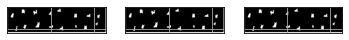

time: 838 ms


In [0]:
os.chdir('/content')
import imshowpair.imshowpair as ims
import imshowpair.utils as util1
ims.imshowpair(Image.open('/content/0_186_actual_mask.jpg'), Image.open('/content/0_186_predicted_mask.jpg'), grid=True,method=util1.blend)